# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [1]:
import emcee as mc #try markov chain monte carlo

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

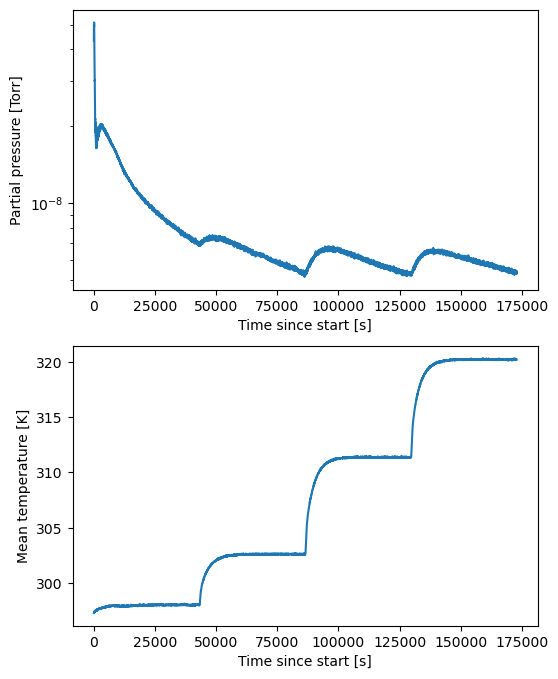

In [3]:
from data_analysis_script import Dataset
run_label = '2024-05-30' ## Change this to look at different runs
e = Dataset(run_label=run_label, gases=['O2'], data_path='20240530/')
e.GetData()
e.PlotSingleGas('O2')

In [4]:
time = np.array(e.data['O2']['Exposure_time'])
temp = np.array(e.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(e.data['O2']['Partial_pressure'])

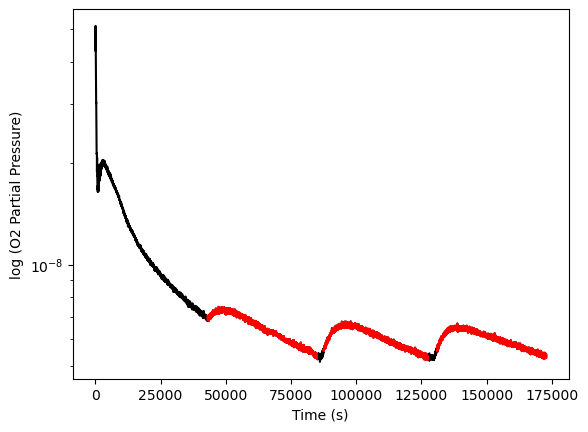

In [5]:
time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
#plt.ylim(2e-9, 9e-8)
#plt.xlim(12e4, 14e4)
#plt.savefig('teflo.png')
plt.show()

# MCMC

In [6]:

    
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, tau = params[0], params[1], params[2], params[3]


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((e.fitfunction(cdat, a, b, c, tau) - cy)/sig)**2) 
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq


tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])




In [7]:
spars = np.array([200, 9000, .005, 500])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 100000})

483322.73808930814
483322.73808930814
483322.73808930814
476984.26957576605
588328.1764463326
476993.72933066986
483354.7668799944
206572.27449775982
2210653.7718067598
350164.4838959974
264963.72746577143
182072.92834275268
727559.1777081131
732816.6604993285
374623.55665694404
190966.4560447372
446838.120940805
265758.727583343
200331.26913193308
437482.86759633396
208047.96282961752
227830.02365807653
188409.1473041122
255072.49854939245
186273.7920956748
207595.68586991672
183012.36450630985
205434.4658268764
181194.21752973774
186164.21501186627
202956.8725904451
181119.30763538257
184739.50218356724
181538.73575347403
186989.67336777752
180692.834881189
181346.28956925578
183708.77512882376
180573.72877370904
181332.26552075235
180670.50716113643
182372.8781512425
180525.7266074077
181272.6038864294
180616.12853622242
181319.987320992
180469.6477607456
180482.93794785527
180819.74865419642
180469.08577286007
180766.39980121798
180461.46257571268
180486.36442523586
180447.26235071

911.1640636996472
917.672381780945
909.9468501876364
965.1768358606487
895.2778808311677
897.4637499067214
915.5403636715923
905.2788590229186
904.1730896285527
892.1508444810116
919.6203582990216
900.3054455020074
901.1622453200396
887.280655278317
903.2813416813023
917.0412611134271
886.4671853468441
897.6928310686416
886.8193564928333
894.7920675132744
884.898518727062
881.7435576245871
889.4832899395552
906.4649254700452
881.9821764731603
880.3445435327811
883.917354241815
878.6713759550499
882.873294618338
900.1453797133613
879.1468294472575
876.4853376664482
873.8905216079493
873.276220980019
870.426488430129
869.8793139400615
868.0887432330849
865.686542815394
861.7131917754958
865.4877302605523
871.805406969385
863.9943517688997
863.1324896857259
857.6679796966741
864.2748728762837
854.6671272842319
854.6164243454937
852.7567031518572
853.9220771678721
868.6265184569834
855.822490764637
869.560674411669
856.4820059030325
862.3146761284671
854.2132592552472
853.6500235834366
852

468.1953971820691
467.7321048341196
469.3045268127555
466.747937486129
471.2606565199907
470.92021547701256
468.058920225815
470.2713443734526
467.96701685927053
468.1896180989568
467.2931373216863
466.69643486090894
466.7401445314898
470.54610869077237
467.18673212449653
465.95783037034346
465.34466865790205
465.4112427085169
466.29075576710613
464.60978518332513
463.85208693634684
463.9935153459519
463.841121960309
464.66822422989117
463.14446876938575
464.31865520011456
461.67617226646996
460.6669772016369
462.52212454805806
460.1305500554051
458.54625866313063
462.2471392862525
457.5391097097294
456.07307804623235
465.070693454853
459.9665611478585
461.8188644211285
459.34641453625244
458.15400660069395
455.22141995759284
452.73642405341076
452.50935521881235
451.9565669130148
456.49654199499196
481.70286592855734
454.19197499859587
457.16288642837526
451.88900266798225
448.52312818873895
446.4778931103366
450.79854905340324
464.5748792302284
449.9097887953099
446.24084380882783
44

413.2875313368626
413.28753133686206


In [8]:
print(res.x)

[6.59357492e-01 4.49883752e+03 5.54968250e-05 1.69061874e+03]


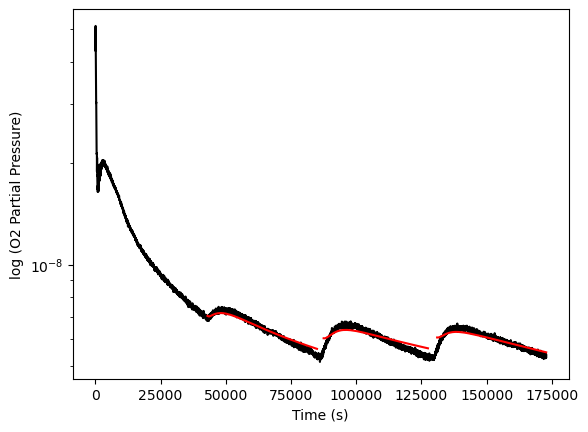

In [9]:

plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(e.fitfunction(tT[i], *res.x)), 'r')
    
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')


#plt.ylim(4e-9, 2.2e-8)
plt.savefig('ChiSqr_Teflon.png')

plt.show()


# ##changing A
    
             
# plt.figure()
# plt.semilogy(time, p, 'k') 
# for a in np.linspace(1e-5, 10e-2, 100):
#     b = -303*np.log((6e-9)/(a))
#     Man_Param =  [a, b, 5.73577308e-03, 4.92508853e+02]
#     for i in range(len(combined_data)):
#         plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *Man_Param)), 'r')




    
# plt.ylabel('log (O2 Partial Pressure)') 
# plt.xlabel('Time (s)')


# # plt.ylim(4e-9, 2.2e-8)


# plt.show()



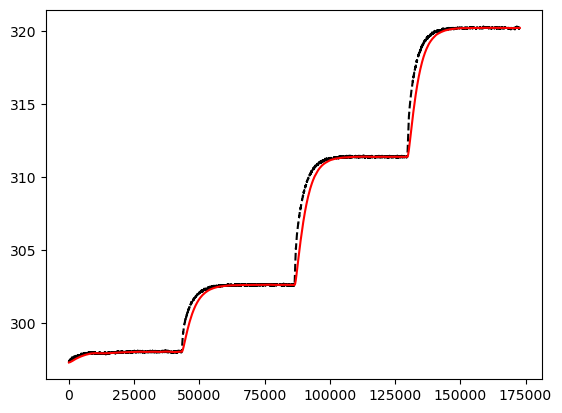

In [10]:

time = np.array(e.data['O2']['Exposure_time'])
temp = np.array(e.data['O2']['Mean_temp']) 
tau = res.x[3]

def exponential_decay(time, tau):
    return np.exp(-time/tau) * (time >= 0)


def smooth_step_function(time, temp, tau):

    dt = time[1] - time[0]  # Assuming t is evenly spaced
    decay_t = np.arange(0, len(time)) * dt  # Define time for the decay function
    decay = exponential_decay(decay_t, tau)
    Normdecay = decay/np.sum(decay) #Normalize decay function
    padded_data = np.pad(temp, (len(decay)-1, 0), mode='edge')  # Pad data with values similar to edge to resolve boundary issues
    smooth_step = np.convolve(padded_data, Normdecay, mode='valid') #Convolve two functions
    return smooth_step



plt.plot(time,temp,'k--')
plt.plot(time,  smooth_step_function(time, temp, tau), 'r')

plt.show()

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:43: RuntimeWarning: overflow encountered in exp
  factor = np.exp(-1.0*b/(smooth_step))
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:52: RuntimeWarning: invalid value encountered in multiply
  return  ((4*a)/d)*(c) * factor * function
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:50: RuntimeWarning: overflow encountered in exp
  function += np.exp(-1.0*((((2*n+1)*(pi))/d)**2)*tT[0]*c*factor)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:38: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:39: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function
/home/rjt45/.conda/envs/new_env/lib/pyt

bp: [ 6.01047135e+02  8.59462474e+03  1.50474431e-02 -5.83732554e+01]
bp: [ 4.51570998e+02  8.67614618e+03  1.13025057e-02 -5.57606052e+01]
bp: [ 3.58595279e+02  8.79704710e+03  8.98714123e-03 -6.00926711e+01]
483322.73808930814
483322.73807981063
483322.73809533915
483322.3587351175
483322.7380893277
287511621.23597085
287511621.2805485
287511621.2149371
287511627.7916098
287511621.2359087
207372.33965732658
207372.33967128096
207372.3396491956
207372.42174460043
207372.3396573381
3363274.707757508
3363274.7076116037
3363274.7075705626
3363275.5520300055
3363274.707757003
193703.18223954897
193703.1822420913
193703.18223864093
193703.1939536191
193703.1822395713
192697.90621554907
192697.90621280496
192697.90621725027
192697.89401991823
192697.90621557605
192101.746007506
192101.74600666866
192101.74600835796
192101.74146175955
192101.7460075316
190965.95630158042
190965.95630169907
190965.9563020102
190965.9556420041
190965.95630160405
186825.4514391836
186825.45143507782
186825.4514

/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/scipy/optimize/_numdiff.py:557: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:38: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:39: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function


(1000.0, 190000.0)

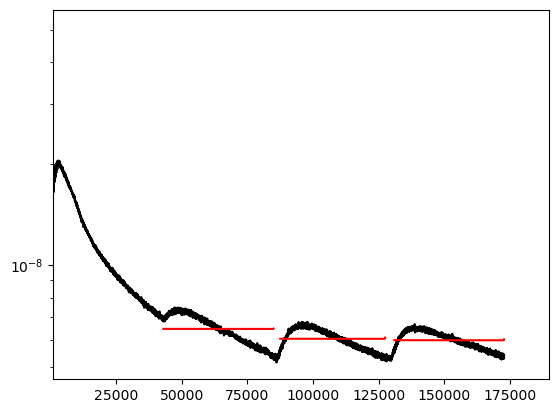

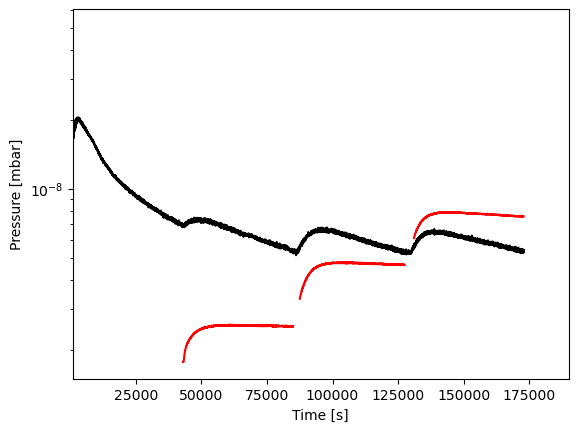

In [11]:
#Plotting Code


#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [200, 9000, .005, 500]
    bp, bc = curve_fit(e.fitfunction, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], e.fitfunction(tT,*bp),'r')
    print('bp:', bp)
    plt.xlim(1e3, 19e4)
   

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    spars = [200, 9000, .005, 500]
    combined_data.append([time[gpts], p[gpts]])
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, e.fitfunction(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
#plt.ylim(2e-9, 1e-7)
plt.xlim(1e3, 19e4)



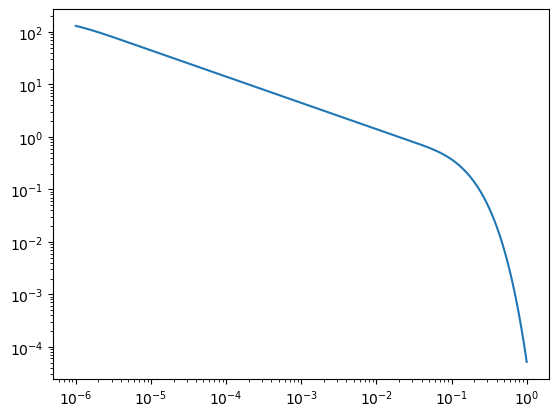

In [12]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [13]:
nwalkers, ndim = 100, 4


ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e2, 7e+3, 1e-3, 1e2])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


485532.95551857207
483771.7533864819
485882.0412180766
486169.7042222392
484625.8508132943
484046.0801049982
477683.4944391641
483588.9377616222
480259.5136445706
483668.93664069043
484095.4571628673
480018.6873383676
484873.94744694076
489090.353426834
483791.7957719388
479169.8856918403
482521.14334603027
485762.0226780816
480033.392579952
490525.2695758556
483523.4980749141
482979.2992559689
483094.5612135738
482753.4385561084
481002.4089209654
481176.4541480283
482541.25515395304
483022.3271746945
483420.0697896061
480908.5786676067
482287.03061836585
487051.6586089985
482996.46915268473
480186.2331994575
482090.92184365366
480585.3567585894
486250.70969086105
485602.35777225206
481127.1635216046
481319.5524997445
481476.18739598215
483913.2628896684
484992.4798933327
481761.2194269581
486011.1075940019
484920.93518787296
484084.63949093485
484597.683883382
485870.96812967735
482727.21801861096
483694.11087785417
483180.3511362465
479928.2219644773
481916.63328941184
487410.8730256

  0%|          | 0/4000 [00:00<?, ?it/s]

484845.77220269345
486579.7437295146
483448.7249019369
483769.30952430627
484120.809467169
483326.23591451533
482885.81646879646
476586.6262906578
486715.1276586891
482055.45796685055
482963.0012526749
483159.10163701756
482901.0546206445
484079.778511215
480425.32958512567
480673.65577155945
483571.4824962787
490063.5924758631
483079.8029392572
481771.46923152846
481150.2753480531
486071.12690917926
484977.5196294985
485952.65287725365
486335.1019300869
486298.2205117587
488770.89372139616
483361.6891796791
483395.7200586571
483714.04017503845
483714.3077846871
484224.5290953431
481261.11436791904
489349.59236035356
487264.9264271462
482510.6463693496
477994.99238318764
484835.14562598633
484357.69597766246
487527.39332608413
483290.9243684325
485361.6572509982
481180.2079604486


  0%|          | 1/4000 [00:00<08:35,  7.76it/s]

484178.72499148664
486559.5863541486
487354.4005866878
477407.6823979629
473152.24100403686
480593.54208557593
485075.75081983506
483224.1079411786
486686.44158307725
486280.0112014667
481168.7629138386
481923.54869385937
476160.7322335724
480885.0741087324
484874.121784735
491239.4384705002
482611.7481846173
486147.122820063
482234.6943648664
481279.6385791846
482142.42265023163
482798.5247836788
490747.6780211434
482700.6790517009
480184.4733628334
481748.2360442742
485977.12694538303
482018.31125871954
483374.4659165279
476560.2475381468
483137.9137156938
488906.656865664
481526.0664756382
478369.14332878985
483841.6627175977
481791.19123616035
484289.4672415976
481326.60652017297
477471.42394192365
487188.2670227821
485369.3904901339
486405.77277577017
476571.3211939896
485273.3658978696
486630.0057769312
487646.29836316267
481875.443332607
483126.67338121246
484418.7449937224
482230.89890351775
495594.6324598892
483459.75484411686
483964.612665573
477755.7197253064
486194.75851639

  0%|          | 2/4000 [00:00<08:38,  7.71it/s]

486864.64639396744
481974.1237325963
479939.5078793025
479349.8311201595
480882.0792988348
484646.49526975374
487303.67746149073
487943.94929202856
482974.1427775831
480895.0511353386
482016.06762189476
484827.1751727016
482750.8199334835
486705.32107630605
480719.6938177439
481949.68311041035
477191.62768484186
482148.9730310569
484311.28949753597
477685.5167775736
485166.67597629956
484829.51188619854
482334.47487642197
483065.0399060551
486060.39606733905
481105.2708199787
490167.95228891936
482303.66161435534
486901.0755788703
492344.92731271597
484781.5481743668
476140.0397193476
483710.69465628546
473268.414371987
484497.1384946459
484314.85203879344
486370.4182686266
476482.014399025
482040.29098833445
479102.7444043484
485297.5770854801
484886.5645278908
487364.45356981194


  0%|          | 3/4000 [00:00<08:39,  7.69it/s]

481335.5354468707
481649.472692447
477199.2013779194
483162.53978356265
482130.5608651134
482745.91928435734
480802.6639591459
478956.1472577605
482428.02889595955
481991.4897681897
482899.4380242551
480585.784698639
487082.03367950075
479767.0451822752
478872.24358389655
481151.34553988505
483430.6001501522
482795.4177325913
484364.0059836318
482477.40998005687
476036.7016926114
481831.6107574033
482739.3796135782
484955.8771815961
485839.2252896965
485925.7815903477
477194.28265328734
485760.36950836575
483422.4766318264
486772.82276195346
479902.8007964338
471656.090129546
482993.38551218546
486115.3267740434
481876.4602227232
481235.24204298214
484563.6684241995
499182.0029780223
483630.9695252861
486017.82852529397
475668.7420775995
482431.6810175375
484828.93675207417
483097.7764664872
485840.69020143256
484319.142208965
479431.72506920097
482025.27067153645
470818.08048381365
488277.47285190853
486871.36888251005
482942.5420424184
479975.0979921492
482520.1994957775
468487.41445

  0%|          | 4/4000 [00:00<08:45,  7.61it/s]

471280.5551537029
481961.3565725729
482112.2779160691
483324.6040812235
483185.36842688697
482588.44434900593
488546.59797008365
486118.7945972787
483203.02246399544
476037.2560743747
481487.37366575137
478009.2448620815
484668.58823496534
480634.87583408563
481797.07548601413
482415.39790000865
469130.85529735975
476320.5443758762
477709.00099968316
471288.80747321626
483720.8970441118
485286.33592303947
480150.1886948019
477159.3599405531
483360.2210300538
476235.81769047014
485487.56202944554
492035.8892941456
476103.71101711004
484001.87075976626
479891.90944385016
482402.36809653696
480502.84945117356
485325.5535365771
477389.700966772
485611.28646426526
487706.3379073626
479921.7548208374
465054.33027872967
487189.925419559
480299.43879045267
482335.00621678354
482797.6501439732
480984.6573842468
483078.979376417
493943.21449709556
475852.7465314721
474534.64865481196
483902.13974103646
480022.69945345697
474308.41455591546
481131.5749931532
488300.51336298627
473588.2839170648
4

  0%|          | 5/4000 [00:00<08:43,  7.63it/s]

484063.0748821789
481873.30753754516
482542.4108714103
483126.90292622783
484112.17697692465
483074.47980775364
476669.07518912933
485341.9885071876
478927.2025222278
472059.1981469475
487350.6725882253
481601.1800513227
480293.37376095436
475105.31312160374
478257.0834646156
480365.964570096
479252.2293810472
478708.1718262589
472649.82178451313
482635.5344765767
488676.47757381806
483685.49446320883
488806.2936214748
483856.9946202759
479447.14488934225
477478.08269173664
488464.2747000222
482891.0814277537
478906.8388389632
475186.2298209033
482919.31733475684
485247.25903841166
481012.9418156111
478162.25347982714
483187.8472991261
483499.6099653554
484224.82127647573
483258.7894943722
485257.97087787214
477800.9604494373
482063.4923732036
480638.5890827614
485268.64734278584
496997.05194783706
469503.2901203899
474313.2389259029
487513.6741061155
458778.04841758776
483809.61600649933
478160.4835477575
480887.36448731436
477910.4070925336
474761.33068925794
476864.66894072643
48137

  0%|          | 6/4000 [00:00<08:43,  7.63it/s]

483006.64716760744
478543.16377563844
476439.4582214154
486296.15342610306
481375.9218614417
479769.45460805396
484312.42578304856
479807.48760463507
477943.2303327834
484331.199885214
482616.8829680173
482154.8333375379
484780.5306845829
483880.8967466381
480271.25117947056
482756.8747087082
477759.24713184766
484837.7675507714
471043.3324413517
478934.5684410757
481094.5357312957
468694.09989434236
485533.7614447296
479438.2065409076
471170.4024795989
482592.1545118161
479340.41066572943
472417.6510554437
477760.1293659347
479930.85818579805
479372.3695129192
482777.18960670626
467553.9793561214
468533.6301064959
482815.8440061409
482035.0523307009
488959.93519055157
479386.2097873561
481251.0864882483
479178.45948596764
478857.7879056174
481789.5770517638
476909.28978264873
478446.99024304945
482904.625971303
483182.6898967794
483642.721845899
482687.5319177658
482125.41931236105
486027.098655757
484398.77993558533
475576.7364241992
484633.9318985047
479376.82521057175
481656.274447

  0%|          | 7/4000 [00:00<08:42,  7.64it/s]

474613.25248819723
470568.0426954317
481137.68066472665
435126.52891216223
480024.2095848459
467658.9276316763
482292.7958200802
486398.176229639
477529.6129894557
487568.15664687374
473845.6655588133
469723.61326232
473925.84581331094
481461.13196371694
481419.25603890955
490816.82110311574
488930.57788902475
469750.0730878012
482477.0718837546
484986.2017847748
477432.35959458665
482112.94226423634
476438.1107894025
478495.08269622445
484027.526729314
482480.4287166945
477225.5894049576
479116.5726359836
480869.0511375478
477374.53826925985
450207.0992243113
480696.8388022685
479103.6437020536
480686.0815521516
479999.4848315972
483319.8432094583
476360.274822855
480278.5854513353
472740.28727743984
483188.77793638804
450095.27541571594
480988.91062093544
476769.515014566
481057.15947027603
484651.45892146754
479273.4706582242
480295.88123777474
473822.9153768226
467605.92424145195
472657.97482238006
481552.8306043743
484862.3650650913
472476.83463725017
427563.0882686814
487726.4956

  0%|          | 8/4000 [00:01<08:44,  7.61it/s]

479446.83787242445
481230.79565768735
486303.27929325076
481080.37335415976
478418.7395270918
482788.8020157794
473237.179846891
478687.0993840008
480593.8408577626
467914.5104797094
481305.0358739201
471211.4358634556
483676.8124287607
477036.0659317661
473563.0436295362
474303.71219055774
514296.55361958675
491288.11931229965
477154.28139523196
487927.1466726585
481854.07937469066
481428.8341430774
481292.28430085257
478955.7343855381
476189.8700708537
481559.999231833
472652.7067807367
471037.0435242287
479424.51024114026
483397.883861162
467357.80200558715
477970.1291270113
483594.04701682425
478074.9815807717
484882.06062956434
480353.0869869847
482983.5267997938
480198.35295342846
491926.765028644
483449.56185592554
481355.17670772166
478898.69419790833
479946.1294984033
477393.6046884648
481261.64138868696
474408.23284357326
484520.94019756495
472199.5439876801
485442.87778879126
506339.30995384534
478860.3464213149
482171.80740712496
502846.6359106825
478391.82689705276
473659.

  0%|          | 9/4000 [00:01<08:43,  7.62it/s]

476308.82447318546
477713.2962959491
488423.3975947788
482768.69124349323
474922.07268616254
479224.2047502899
472984.7063795751
483683.1810666923
475039.22294525115
480849.18644726
478675.94991292496
483416.969777724
461171.8216245904
481221.7339126982
485005.64580237755
398229.7943425642
478758.79323106527
481907.83219182485
470748.2759722729
490765.32625260897
474965.42953754927
478386.70344429644
485234.3523038917
484179.46513019816
460104.4270161807
477381.6709969911
471405.4042247803
489210.1450479656
480279.7677412016
473314.0590962322
478049.6013601658
476859.7981521408
489835.38502585987
486988.31837285345
482921.34483337123
481972.17025788577
475660.30275349156
468449.2864746044
483526.6930104145
475465.63597643364
482229.6826847767
475396.8858164222
478988.92731963843
473368.8999515527
480988.30038458883
476548.6907536868
472389.0796837039
481601.26394630683
481394.6259102679
476766.98495843506
480046.9176307266
489599.5843914337
487051.7106943665
468430.77540278854
473814.7

  0%|          | 10/4000 [00:01<08:42,  7.64it/s]

474604.90114842786
467526.0119062714
467973.36503678246
466375.0118475652
476152.45520257857
474012.58176576765
478498.0694672973
446376.12323735777
481548.84708545776
488815.38850001764
473740.9101641291
480218.2459693521
478830.9125551712
476537.21825754433
471970.417058374
477415.7666808739
474328.14146522
481724.7230937227
474669.25722527155
483115.7512985799
489134.6934917869
478003.43874160823
478975.15452200186
483508.9974940351
481675.3285170997
476576.1586139713
480201.2972977018
479404.90913002845
475598.95657905145
469850.0418292706
471996.3831766565
481150.1416453293
484190.6068445956
468871.64188777877
488675.0702345
476242.5688788147
485445.405375066
473426.1765749047
468695.34888884047
481030.31078970514
479555.9532716564
475382.71010024427
474471.4747363445
481026.883088015
491932.4803725119
466208.4603941891
478135.4494031811
480453.5158873447
470004.0479436417
474977.75655540137
490146.9272347043
475620.74100952176
479645.20816925337
484991.55094201677
478123.94197604

  0%|          | 12/4000 [00:01<08:40,  7.66it/s]

481527.45114651765
485699.9592635868
468738.4962682747
471248.2400852388
478269.1940684426
487992.2670320706
484455.42761643033
479187.9476868565
477413.1279576784
475631.6737478786
477135.3479053643
478131.34461277875
475087.77770906454
481527.46763900534
455590.8457001621
481828.0352247496
462000.1535930744
479806.7491309381
506640.2794010875
470173.19419304264
476253.09063240245
453559.4604188537
452920.0366450761
476148.2388099734
468451.76022573136
477522.54961608653
462195.2839414913
468293.00820611056
482509.6495295426
479485.2502860382
476428.40269450255
472329.47281004686
469516.1188579212
468442.12939312524
478137.94449999655
474182.43847016396
479093.731597463
485386.9614317656
481824.55822661537
481437.0614097853
477803.39348143805
481847.76197250985
475084.33697061974
483491.50020490086
462711.9356687639
472207.8533799755
478650.2478528883
464997.40954549046
480440.4745374585
468412.5496849014
485783.29779797373
471384.3739477396
477922.8967633459
475074.29338445206
479907

  0%|          | 13/4000 [00:01<08:42,  7.63it/s]

474609.60070512095
520921.03404403466
480387.0451286371
448273.0391519026
2391135.334773922
478300.8917608438
436258.3577284154
472080.479561439
468490.3214106718
474847.28744180594
458154.1914219378
441863.4244008545
476020.8650702381
473215.62637215265
380305.57013697276
455849.9043691291
482607.03510275926
479176.8082179159
466771.87529077596
476653.29107172333
480507.05117883603
476161.0006761288
471340.33695617924
471075.48880352697
474602.92943946575
473128.8597356725
476497.3930085547
480304.4897158697
483155.46318442986
483528.6531664154
470451.9826547126
432472.13157358946
492245.5442555059
455452.3598923734
486168.58977676835
469759.1432929945
483250.28473263886
478406.12135527603
465795.57109535765
479746.57806595555
473418.83999622747
471436.3388812006
462928.1871939012
471117.6857846457
477456.3980438233
476441.04643001
477269.6611136553
472685.1009244624
477322.7282820372
472490.74573207455
473775.4819878682
436553.0104004686
217086.75959729677
482580.66704918083
478689.0

  0%|          | 14/4000 [00:01<08:42,  7.64it/s]

477317.55014488805
480720.7381268438
478344.7553802951
463543.381972005
479596.5762710336
462024.2475059114
472912.7973439543
470916.2091642986
400044.36158626294
473800.61032856215
480259.945934684
475841.06979192665
479006.9280118097
475690.5110385802
469389.3056159364
422224.4918468145
476021.40333195904
489631.3330973786
467315.22557315096
481699.04074749706
472238.4679243575
482091.4701802793
457709.941392256
480636.6939796638
471294.7634390994
490483.5713044543
476735.577243432
477038.327999702
472609.89037029684
476544.806865453
473972.84848554595
472133.6061234196
481948.8351485781
433522.6848655078
478121.20995744603
484599.8438956747
406263.3521445942
636347.710398898
478071.97727770277
405091.9093217928
474457.65329150046
479078.4979535824
461627.32359126426
482832.48192540766
472562.32885899494
475479.5722813163
481687.74680093094
476351.20357486664
446226.71282326744
474395.69653883495
468080.33518098
471751.0154435806


  0%|          | 15/4000 [00:01<08:43,  7.61it/s]

509116.7303111941
466654.32132178417
454511.1187464258
443611.4644445135
473429.15046539716
482776.15910619224
469121.0224523614
493497.3740194978
469212.82281207945
421222.52113695163
476707.97443862417
469516.38956061786
492266.45599575544
469628.2835876376
475101.08576480247
474047.5704519849
473964.2912221076
490266.71286559565
477423.9937559453
469851.9042044199
451437.58407042536
501128.70621354564
438407.9478065533
491887.8128146031
434098.3542743702
481432.3226882069
377172.1369093423
473619.60397081
470948.2546098678
485623.19826022204
369556.82753687503
456634.7055236147
472585.40687530534
465814.9747068961
468502.39975846716
463621.01941136474
461457.70647886023
434594.6202332282
433188.6096073912
473396.52778529836
409081.661591084
444101.61123175046
481316.5940517054
471546.2468913391
472999.53688637656
466661.9058847276
477292.145690292
478287.2674291823
464893.0777064251
482705.9858839016
464883.0341948793
479267.2842397803
463169.8536460203
472372.5526683916
482543.3852

  0%|          | 17/4000 [00:02<08:46,  7.57it/s]

452405.855120659
503077.643155762
421505.380671572
453073.39254718885
383891.6198752857
477804.80903098045
472547.1569104472
473259.13534281286
448325.58466510125
526158.6594972739
466996.7872655806
472862.7592988308
464459.8745720366
418576.81077321863
478318.3269898724
446153.32726646244
526300.4600037776
428466.6767945908
464733.536813415
475231.25638580887
460921.93553263193
471920.5040094557
476034.41708624596
467047.7227983123
465755.3896807722
450306.38328453014
465181.3177434033
436308.4365660477
457676.61091305234
471161.41577676754
525243.7332554494
472189.7853902528
475801.6197435977
464307.0331558114
493561.45444319287
478461.856451435
368552.67862029147
474072.3380229937
417443.2018662997
491063.44568375085
437842.88394787954
479849.83569404436
470178.66861436295
473162.12908496254
486363.09333588765
438454.6667030504
492330.64619659894
451870.63008002297
447376.1081866821
461630.7927480313
460449.8480811826
475822.38671437453
358849.0007354853
467034.01168882626
474255.21

  0%|          | 19/4000 [00:02<08:43,  7.61it/s]

465375.52267752006
344210.4501396546
468396.38159138046
474498.5821331125
459914.2843483435
463323.31018157443
463473.8349505723
470620.0349335379
452039.5002599388
468491.0416837014
488488.43696836045
398929.3218835603
399811.30920884
471451.83618412644
476963.9461323661
459470.6423832246
482964.3055006444
469956.0458158864
468623.19623356464
443300.2876440526
452466.5217294798
445107.656061193
458517.3739649094
475097.6529155248
461906.93109618494
253847.0479680729
480527.0507677493
426629.48066080105
433332.1825055915
387996.34015741793
489804.60197986464
467969.5772914003
464535.99471149023
456333.4034712081
443257.7145009211
447952.55573969363
410821.7327240162
440681.7920832798
460977.59696856595
461211.1174118895
404672.18288506905
474059.0537310545
441308.3584334273
488340.7138661495
435908.28985242994
447222.59875589376
460166.9879894784
488590.54729729705
454870.7786823246
468817.8542732293
464549.20994673646
448955.12601891835
461358.9970449731
428066.7517147487
442728.88169

  0%|          | 20/4000 [00:02<08:44,  7.59it/s]

231904.63228368002
439959.16380654887
413611.88028993714
886006.1617518986
664229.9579850106
466497.88906957454
485040.401022949
447909.7883968661
442064.46260384243
457255.2685739829
488401.0654702285
433851.93283747
467470.7241702243
446128.08425925253
460096.4346731637
462882.2711569291
472749.66046692035
438135.67846706626
472858.1471291646
455705.86240304075
457618.4528361852
469096.19538862223
494095.7375598545
403774.7450697478
427467.58905832446
464746.50361760735
472288.2518968681
469630.8439918264
461712.4318004817
468617.17874041485
454870.60701429186
349041.76641671045
468529.8832668457
472169.0464844797
397268.5642897818
387272.15031623293
473630.3075582428
453134.3626895545
520464.5528568781
501657.3577485688
471132.8527340949
466448.9747757542
387172.6395814275
301225.77484461863
502275.10247524246
258927.67853784838
463313.541359641
468189.7131173826
236661.62130451182
436012.69901420857
434075.65288232715
470746.9002363137
453234.25901806075
542293.3716569857
448215.34

  1%|          | 21/4000 [00:02<08:42,  7.61it/s]

450199.71093120804
446999.63454745454
474019.4879264841
465927.75225668855
516754.40741769306
447683.26734025823
456713.13740103674
451758.44271139073
309923.97880813084
399486.14369136246
461679.1564813318
455832.2786112081
498328.15636576025
495151.23136778234
495179.8455654279
457492.86402964336
289662.9551224522
434836.6327247409
380025.14185039396
422582.96182997694
1128757.5158304386
533520.448295874
462988.82111484476
453370.34178693674
388606.2828803382
433683.48269814876
426495.3681579706
530339.722559747
441629.49402240163
462573.30450600246
357889.09304873773
497341.75920059666
453806.47438701655
469697.5018371284
448208.1933724482
316114.5475414117
336903.7640122685
433203.1956340648
384594.3699492232
320508.17951184785
361651.7194527203
565569.609681483
451905.74044363166
455841.4645003668
460761.1287111683
494307.63149873214
468842.07117994723
445451.4203569329
454772.0588198972
521948.446737965
362129.6812035932
305179.0080624895
435179.14617074415
477387.27684196533
461

  1%|          | 22/4000 [00:02<08:41,  7.62it/s]

458621.60620269866
435257.95818692294
204571.76848489078
435691.9456482399
201149.4832199698
463986.9047082169
479401.62189112336
282737.5505723985
577298.0859629416
439362.7177269547
435736.657216892
396325.2004549991
373954.73558268463
457613.6425278119
438671.4240081199
456917.8159774712
357740.0815901688
470169.17282940866
506603.2903885477
566206.4124619071
454856.84843794286
441716.9180498236
474780.8460877498
267377.88636294706
467143.26395123976
471246.7645114281
461400.5952352106
456373.7597075261
378199.2892882824
473964.36386104545
508266.37068805716
440989.439712231
471986.6480351352
446254.5775265497
275435.10589645756
519755.7135720846
271342.159875891
525503.4540154978
277525.3512183178
454128.18872050015
450236.30352579517
473802.28375335864
462027.7322427111
469046.03082252445
274490.4097983411
512974.57419803186
509673.46155675495
433425.02986258257
301275.2848728047
455827.8340333826
302198.3260741264
465709.32172049966
440762.91688387434
453632.7020316013
380374.800

  1%|          | 23/4000 [00:03<08:40,  7.64it/s]

399093.13903800806
426922.7624715645
440764.8687430059
198005.62386958484
449812.2771759329
468885.3514736173
391534.6749846191
456404.492103644
458295.4306780301
446529.51824566943
443493.0516579875
432678.4454054326
329812.6157899574
400760.7535531082
446279.65404946194
525361.5893197715
442084.9354932811
455661.4923019391
438732.5801180409
322981.40123918204
467088.2549276924
411162.6632385885
400853.25271933014
227862.75077345787
423818.31910947675
456391.3351063921
473572.34995947324
455630.434096043
461115.33000581525
464921.291394971
489130.0420329548
453778.9833383261
329130.93104546017
470607.85571708536
440234.54138328
469706.60169194563
269276.09233568923
534666.8301918778
282271.9874747673
441662.07320149714
180056.2543195314
453119.00916635327
355321.3254726586
419886.60490295675
443269.73703786364
276975.30670422775
453947.00329827616
208862.27617343643
537791.3396430393
551071.1042325596
202603.52166787066
403367.149037026
343020.1553980321
422650.3373478537
194599.20897

  1%|          | 24/4000 [00:03<08:40,  7.64it/s]

458531.11476783035
369940.8618620999
412621.7665019468
462331.0667055149
507207.91284909885
256850.70291724443
424402.7768096325
472783.5252023772
285152.3676278967
406050.4449836947
389234.7689343788
486142.5829163774
444039.89951260935
471244.23619133484
381865.2856325944
537082.7373668882
473651.5338363941
283852.08726595563
326208.4674536015
1363958.8912559352
434085.592722303
448390.37882941763
426420.78980458085
208604.49770919606
355167.7070518911
181458.97519465387
470357.9301895015
2139117.1808037115
452639.9560783324
410159.39880487655
373330.0038734231
394249.9962580586
443149.27101702994
443782.76386809343
427654.4407386663
454321.01226354047
323902.20618698373
446477.84562523966
329926.0791947996
440797.33931237576
409857.1252002101
446165.39236193546
392219.20259580645
360130.1948964203
389416.24136826704
230490.65693508775
301140.83213267085
242269.76998154324
453863.5115166034
457891.1589188945
457751.8952738548
424759.5778162357
350817.4137018862
489341.5596854646
2949

  1%|          | 25/4000 [00:03<08:39,  7.65it/s]

400779.78037693433
450098.00561660813
471187.66615634237
277332.525479154
311255.03675147134
457668.5722961358
483089.9642725155
254681.86889276098
439166.76803060167
214754.12569875436
436394.41484793567
264823.39766369725
434057.6887728067
426251.6012528994
535913.2597345115
399144.88859007217
424305.7757020426
378129.42896239355
428378.6487640239
460033.23504767136
452802.70666589466
298812.4050378636
429771.9978252616
307435.7745247135
181617.58784641506
430274.39755959914
331812.4890506827
459710.03906626196
359852.8223528844
445040.16266151343
383980.7914851404
438081.9212386103
413623.4521881909
371992.9615224568
380431.73123003246
457305.8576420699
348477.38585939625
430784.0727608032
564872.6992248818
409954.95509461
470249.994461325
440026.00882845226
214513.78518881006
451455.8322880481
415931.6050279437
262597.8092616222
329044.4560385124
366645.55541697773
530918.9450866324
441992.09697901964
452098.01133921935
221759.47702141106
361047.89524621883
403997.2482986181
426797

  1%|          | 26/4000 [00:03<08:39,  7.65it/s]

197612.61083641028
440893.19330049003
254722.33830119806
300147.5525484398
456805.21925063006
526917.587963206
237788.60979949715
405876.8386498246
538536.4908160879
424153.3053565668
372921.6662733855
278408.96288929676
370267.7373860181
203510.5649101554
311545.0539538371
525189.2587764609
383868.3266986078
571900.6957672302
478478.8609355025
422723.4864009362
444965.43520377995
420697.3371841435
345113.4085276927
380282.0262953282
310280.2744090966
418368.0905685943
360995.04120081133
431307.7310481488
268808.1508410907
361880.03532483574
231750.22945537436
294928.68123337615
475273.2667234193
476236.71423992526
431065.7496542149
329903.4587882213
346300.4929581469
468030.6790810467
513044.9274572147
233415.57383277756
2060292.9535675473
441273.06820268417
412468.7541775082
2009079.2418653374
228480.9952503835
277801.64097102324
568799.7499850816
447268.78267198266
480728.51609780034
314033.7637087709
310168.64381498797
454181.1579549958
350702.5855648289
471095.94118342444
422918.1

  1%|          | 27/4000 [00:03<08:39,  7.65it/s]

213127.46245068306
310767.45422711305
190007.56263371537
194960.26872424025
320393.82857429405
455393.65841603547
620617.4335530493
443701.7836691969
461609.99243422155
467510.276341421
400471.8098217795
325116.8485764792
188757.35569571957
471496.74498853105
497757.4749081149
303478.05633332644
521316.8081735499
193278.1365188934
221740.64375503405
304325.9853990974
449969.19606853183
350302.4117807077
349420.3351417528
293876.89867587277
419398.2096327467
532647.0891805982
557707.3807486717
481840.6090199271
398650.7178529863
413307.7130854391
505110.51565967733
352313.10105144995
231671.72124749725
481575.65408031177
518941.54751284886
506887.67253980925
392215.2775483085
198014.85627995647
451441.3165019915
379160.3437849812
196321.07204367412
187497.07751724558
409334.4933956602
448605.2633716493
241224.7233803061
508456.3140540687
271369.39604329714
465653.73943596066
283030.85442320735
495781.4600168554
196877.20858355274
252630.5233922478
403114.64738040196
303761.1944396846
41

  1%|          | 28/4000 [00:03<08:41,  7.62it/s]

450910.7974834404
224426.45572665162
322441.09850776044
269007.6468222063
426461.20900579554
375130.4902107863
465518.45824243576
291120.19031924644
263031.03389290196
243415.43566360231
247824.33202931177
185882.76870906394
271687.2439745219
319146.0240724802
506302.18441820884
421171.4447099488
455757.95991803706
185542.60966309317
315584.6287954091
237117.08691657972
180682.08070068923
346243.65287681506
427838.78770797816
517006.17990103725
186838.07132954654
202739.78204301902
257830.07598681335
444290.6674528374
317046.3051208924
194083.48218600042
406176.7293093573
410535.67467307654
184682.12251148635
243921.85401885817
267845.9258001108
552204.9587242403
397450.14128573594
329843.118315088
404937.8426238013
186065.0047018504
364188.71355170413
397859.3738497218
288014.16231605643
193459.67081331086
390275.3918277084
221701.47929809245
447800.26630964695
418101.1767255439
213077.09519634143
474098.7409675151
293708.77063532773
252366.50784450772
294499.24840195716
302597.146398

  1%|          | 29/4000 [00:03<08:39,  7.64it/s]

180238.26342369002
429165.67690843204
194410.24769916033
428377.99169829383
300180.70871748426
522822.12427141354
191603.90349756603
233195.14004808216
213710.98672866443
352780.96606625855
211878.47147105468
181552.26136216387
251393.8013163091
235339.39691070764
514235.1703247173
401975.2335404651
184414.92814269374
414392.62042921735
432817.93169749505
387656.44036237715
434386.2789520514
238013.32171775115
443993.76295476756
359047.5198287956
185844.592698756
433693.68522654765
370547.7586400345
270958.89728228986
470176.87006848655
350207.88579144306
185103.77703124483
498265.683387537
202051.5842881622
420620.86982043745
513311.5952239254
357280.24825193
441803.88985436613
362413.99994910526
435950.03715242806
363043.3484967786
206976.1930353534
296479.20502625965
284299.29503707576
227780.9948093827
434854.443356371
240727.39425745734
463787.4319509594
452476.2458187358
422021.13388887653
449277.6370411472


  1%|          | 30/4000 [00:03<08:39,  7.65it/s]

225282.3168071945
408154.9092094483
219590.56486107176
324556.9680685748
231220.04185035898
401269.6124064587
188346.73163031263
382141.2389704745
304524.3325005547
191632.5661758591
335654.0229844906
328561.6025093455
403752.3010514735
296172.1863146041
264061.49222581426
180522.42408129375
280870.33259287174
194782.98824074597
471899.6801521935
417690.5003600512
266849.07889931893
289693.97835467476
218862.55286638078
352423.6790267634
320109.0389319556
437263.0480574052
182056.0836637405
401726.11062467087
337744.11142453144
266804.9307460614
272727.97013986536
428962.05593456177
183579.03737369715
265917.30956401146
206469.36958008862
346536.0742080306
259519.7143299052
1765641.5142676216
242521.30053532773
326100.0943508264
346176.6029032405
378465.5747501082
274171.4480993272
209713.62414224562
492477.49572771165
332951.64918997244
432588.38771555567
178643.78602834916
274024.11516859295
446200.9870924167
216628.43949580553
498086.9442417736
202332.73451250407
388125.68407509866


  1%|          | 31/4000 [00:04<08:38,  7.65it/s]

198914.0030927564
205884.41419416253
178921.94457451545
351833.2569101488
452408.7876948325
182858.65131998545
187148.39085411222
260863.8385603291
397114.50562750467
404589.1127610548
368020.5233885354
271651.9772073426
321226.52587047353
193390.2720166104
423827.5432248447
511222.23472606495
430630.9985766979
404559.1792733
202280.2673052628
332097.67079183925
187926.6682419267
182145.07282109355
311246.9426574595
345247.939460702
335914.3920563716
239151.6774026854
180012.3442151732
314274.4671542148
414053.4786027911
522634.5958148251
557492.5268234914
179942.1649187528
237341.13453330428
333074.6327671216
291136.3159613116
312205.8239925559
179878.64555338593
288053.49771523284
182051.8565743758
185874.39710643757
323373.0999802617
369814.11648868705
384801.45071779535
198539.62345654523
282203.914661834
182684.827881788
390966.8608100619
399675.1213215382
383074.8072097884
235642.47854647684
286285.34565192775
347859.84173797816
429896.45003739727
264255.1105841342
194924.9995489

  1%|          | 32/4000 [00:04<08:38,  7.65it/s]

189178.57892058993
531988.011072983
205719.42983811046
299555.6720319198
242731.3343283616
182595.39513858134
405061.89597978885
461178.7432019061
333844.52999773406
399173.2052103343
180938.11688545992
278205.67674059473
254186.63805934123
183305.89180545436
185995.03650364827
302027.2345611956
182154.93957793785
431139.4000671884
177649.04122138812
401847.77077522356
363441.1378021863
212159.87099609736
447345.0976153081
426838.5020983049
217424.80469073463
476899.52754367574
345339.3771339419
179118.69624751218
209775.16457585187
649956.4492665324
333343.51307684276
317774.1270476645
255248.74466737072
417791.1979559842
378282.10078222584
503039.19051074126
189879.90839642956
227273.27066112641
188195.76841335316
214096.65658578178
284493.8733579068
212264.9399095449
322752.7979231808
280118.29530722846
257738.825190605
376037.592356951
371523.8231833074
181427.15242534323
180305.76548591582
202295.98671920388
180327.71547908508
201848.6195946346
530977.2122050168
662571.104842348
1

  1%|          | 33/4000 [00:04<08:38,  7.65it/s]

487107.8609233735
239891.86368813578
235005.10777465117
292150.3996910247
184540.65530924522
212494.70290336714
261853.1083248746
193301.6834217806
184562.5673863144
268654.7352291186
369653.5619109572
247525.814018461
182160.27797417284
182067.1887906231
191374.12539486814
336708.82828175224
309851.76002610073
384357.499776927
195540.7879596137
241352.10768662172
382911.37019445485
325964.9582517863
332386.0942030549
185002.77444840252
278030.84993906226
213763.72957296387
195847.55558910512
459225.11255019944
239654.11312623447
182533.50855186195
244021.2365453413
372058.92967648007
280139.20724524587
183934.2546049597
178633.09152808672
376731.2284280504
377866.05444453016
469344.29442081717
179695.17197109287
303886.45874765405
192794.796154651
209068.20588608965
453376.6793339081
178105.31864676412
216995.9977349953
543590.6036956994
179490.49866626816
598761.8908083095
387478.9031839118
190282.99295434658
380241.88566063903
381279.1004901218
190510.05673815604
308990.83280236745


  1%|          | 34/4000 [00:04<08:38,  7.66it/s]

226228.37257044125
214331.54034671144
270561.1727960063
273851.56977824325
177353.18449898277
390910.1957702774
179622.11122398335
218164.12731077606
398817.45841852913
312220.0399364193
341593.145827116
813449.0943305151
351444.3528264976
179791.0358001204
220420.71523933308
276299.99708132725
292687.55264131934
429687.2244292934
180756.65343173678
324857.44049865054
186117.4749984013
179806.68762310906
642465.9947898424
285001.3242682174
181973.33039021905
249670.82905608875
182664.46163814465
183129.39270108385
417785.79662553
395047.6505358848
192255.76184123405
282381.5508788994
243560.42848183974
377646.08335385536
535662.4176984117
476697.5939272731
250294.53576825178
232076.52013259404
194105.27376450825
247940.21066799568
351000.49367858155
226707.12706245919
211152.4210104686
181039.22699702854
184685.6603091444
346518.504158969
265144.9137773644
456343.3727148399
179502.95063396537
259818.33684450443
180128.63600596378
237422.360467323
399590.1851592074
362126.50802973955
28

  1%|          | 35/4000 [00:04<08:41,  7.60it/s]

226094.21294075562
365606.14264546114
517022.2497295019
321028.0270121152
180522.00392266444
300370.9493923258
205290.67140930306
201865.1454959958
219299.3130301126
241781.42374637077
189467.789609288
198272.53422914434
181698.54432580702
181306.20607287443
216601.1142987462
189507.07281438654
187193.57259822162
255317.405666019
540199.709674123
309966.9060374161
351455.8907272954
180210.1177458884
187233.26559757264
192653.36437453463
254617.66628831174
259665.3450769966
181316.1845605485
201825.12014086664
198043.10189407127
218446.22328151632
263625.5886353336
967199.6601090799
177197.9429182492
199197.7686402249
267386.1349864265
188386.18691472302
275420.0316783177
255796.03841671883
536799.8413907697
274114.8048380615
555102.7079617478
291731.87357685744
180590.7768200044
272353.2714524503
474876.42003315524
219397.20100531128
178133.61535923198
1173769.8066067714
301988.2921521154
244982.52645435353
242378.38685923943
409452.03469615
357884.6056830705
179994.10890159046
260627.

  1%|          | 36/4000 [00:04<08:40,  7.62it/s]

180132.00772708224
183370.17965762148
179852.85049369154
463997.49580669636
344800.7032224244
191287.23455989544
238079.4891188994
183656.44128887504
201070.04867125556
197465.24821874505
180690.27005679248
231848.49159430148
181484.39821436268
335518.8144933825
575511.3338205846
494496.1317417723
218623.3580242627
232855.27934284703
181063.80870188604
363452.91854990204
1276662.197403057
342935.8445619781
180673.22168466277
180576.9103599416
191748.95814999027
181180.25902878106
178833.84000257286
415827.6454052569
424536.383769839
212368.14589441472
349096.64167061594
189405.5317920688
726127.3332202679
185741.7409637477
179503.49573254675
260965.1690804834
288943.35247396294
282024.94142403145
412950.3436170649
252156.96050127424
180300.2714572715
318907.155201311
282342.48768867954
335827.2985724008
370702.93275516765
267330.9115190676
191231.35956694416
293075.6662259506
234369.08721353373
183682.30705467504
230574.15381045415
179777.14105957493
180134.05084382163
369773.615600169

  1%|          | 37/4000 [00:04<08:39,  7.63it/s]

180512.4663361567
273226.62318434677
180749.04785905592
190352.0118056767
182828.34700252907
407379.6715562537
187925.99356087012
311770.5586941509
499895.8468919302
441500.7084039757
290703.66619386396
207161.39820306154
190439.63621573176
186542.50014901682
313377.5752378351
203824.54974503545
180640.65051858718
610378.4971610786
186465.39379473228
179574.27469435884
404344.8668957363
458249.0716486587
180132.92434093507
204955.24196751183
346612.2636306621
275205.57708750933
184806.70664352065
220072.64692615892
237384.73868839594
287549.7770361268
179710.54109846527
222705.459045081
208022.0141410189
188578.07390687743
178465.35678269883
305543.9482946076
334643.1981528718
420844.45551745524
210356.23023109473
309338.3879246556
336993.24266452156
185353.7804067852
296834.5431976607
179958.23326961417
216888.63229756107
180469.76083609412
196525.95867709632
183995.5529542841
324080.33502834314
202926.97145711785
211750.20079791988
180907.18557705663
191468.2740770882
180432.57182715

  1%|          | 38/4000 [00:04<08:38,  7.64it/s]

180535.5682714616
213355.3942895265
415126.9539609628
279147.87634441664
181375.7871535386
469201.2758993119
379628.16128533287
239387.1210051362
293692.03209684696
180059.93293415816
180142.49241437373
202319.78559625737
473033.14088303136
372776.26861518784
187076.68577170654
242175.8774773869
192479.28999919773
183547.99021546452
182031.52430665045
202556.39625351288
179822.0265519834
186587.47889872472
396645.4195585215
228976.0525036202
185828.9652494575
184819.56806667795
180948.9761342838
375467.07241358643
183523.09995952738
175896.4540733414
318732.9973607466
192914.32836682862
416482.0405331721
179591.85610189257
228966.16254940652
197884.46582873567
414252.78827137925
211914.98261672282
418400.168070622
181425.4574915254
212177.9531003754
193786.42419924325
178088.13837259976
451463.2383250328
491236.5132602794
179761.4827280023
195261.22173023975
214008.93314267622
180201.73472704733
188626.81942729568
242895.00425477087
180979.32652346857
225522.90991715988
312920.54835187

  1%|          | 39/4000 [00:05<08:37,  7.65it/s]

410190.96628741716
180543.2140105966
183853.6863841892
179955.15350685478
199272.62368833506
179631.285933016
236795.49958577577
336031.5044845633
413640.1440209899
270767.30253690016
184204.98832896145
206625.42273193097
177281.64481481496
352267.79108525283
179568.7176060212
473672.4282655193
180343.3137636634
207670.75479339916
189342.60388992613
214200.93262694983
266651.7060371992
179372.0938087204
198331.08616729922
330154.8869532817
179305.81807316752
193321.48331776343
340964.24949936906
190773.7402911654
179192.2437327449
240890.65581658695
179151.69297657005
248968.26043169753
191471.0304995148
180329.38058936383
242918.5555564856
231230.23213628182
179696.02620551724
180881.03506761004
190865.85506915275
180620.56446553557
183091.12042799595
829489.7126422017
183337.0282306443
183644.53231912287
317742.67743120476
210724.2449750251
180593.78476073328
182082.94826860682
180421.9156181726
189371.87299010716
370947.26154431526
350131.461370097
321470.456136314
195015.8444505692

  1%|          | 40/4000 [00:05<08:37,  7.65it/s]

180186.3721497163
338667.5875739431
226425.30308737516
179392.14520579262
217587.18568001394
385534.89227647247
180157.1516818364
191384.73048885807
183892.53687181708
475082.8001522563
191762.5458621735
183074.59707799117
298355.7056681452
179995.90125701347
184945.47400871746
179266.6022734686
200356.34741160105
205311.51448448998
194177.1859296901
248969.1981699731
195322.61105108313
181064.19564266354
180417.0979013291
179842.56557757378
181669.6822814205
190333.8239721551
180155.19391615482
183429.974734935
196074.62797048804
181464.1312791559
180011.54829484204
201307.6496900158
401667.1884767294
265339.93804381246
179503.16768708028
272503.0643606671
180011.01216115928
207725.60987611205
180204.70820369627
186743.6899126528
247784.74407800703
299902.80054742453
181099.12917076034
276263.90773370466
179372.1117997136
174798.77892472857
207571.19372750557
207381.35529988664
182124.4140424619
394358.7133130798
306494.3615208947
229433.8531014375
511169.92232251936
179434.8800008479

  1%|          | 41/4000 [00:05<08:38,  7.63it/s]

220772.7420482744
226108.12859445973
179204.95102103215
190453.85600045722
179740.69428449083
189699.03048204057
179754.51927673898
180343.6447810822
180409.39937026185
345884.85793691414
194959.32060561667
181298.42444808275
184734.80668437178
198338.99362483615
249274.2252197469
188524.18902146403
183463.33517976696
179499.9791010641
180121.4191021004
178815.54580266957
494417.3958918955
179559.35683160624
180737.5981002379
178663.89549819182
189569.65206873885
186208.09208213672
178648.19715397723
231339.04689608776
234254.9412804316
180701.5154900941
196304.890008779
178666.08335659627
197226.4731378044
181491.85460442805
182420.15778027417
182183.87376254261
177094.18352996104
189659.43590151015
237374.85771737903
1441658.4990553423
348974.66365140415
189853.15015391013
201540.87122550185
181155.23192102765
231185.14315583603
184251.68679485845
295202.5155211433
179774.13235820812
196342.53087159237
255745.6196183151
180593.06475313197
178604.9571953771
195445.59666335027
182569.7

  1%|          | 42/4000 [00:05<08:37,  7.64it/s]

182578.52193667347
193795.0088515659
213813.89979458402
416017.82569126465
192395.10174778453
180754.8030956682
185133.78181271988
181550.8392135604
180430.68300939474
215350.060796443
183965.79504058658
221912.9662622662
181524.10400008858
179486.7530650994
180587.29214420824
179513.86531368512
285273.62789443583
303839.1938575219
187917.42479464662
179507.24285896213
178891.16483730762
179611.50218751776
181034.62692803377
181080.97584646105
461453.0104070118
234358.88914715056
188644.12072943116
173011.877580824
349215.3477029829
195007.72226306636
222040.17934094754
182952.45975765877
232305.77666759063
336524.6568111623
241705.46889586555
179448.75607300352
263790.0149904085
181762.9972080209
184007.530267599
320229.2044297133
181612.56543594092
263428.1683349304
282125.7352721015
185228.04607854792
179198.57598875937
230120.8499813011
213660.92714147177
181591.2005339148
222171.66981337537
234297.2048246132
196229.10971130687
182039.05429491834
222543.85719419335
252442.226676279

  1%|          | 43/4000 [00:05<08:37,  7.64it/s]

180585.10360683242
443526.74497712404
196414.7426256818
189899.56710584744
182553.94788438512
201596.74704183373
208755.141177919
177545.5873352823
180617.5445818357
217238.8343958631
433350.50210268964
343017.1743808353
179570.70356916758
191238.6535248407
264263.23360054387
178268.3460570109
181320.77452356246
183279.68101320326
179994.74926220143
204644.23493005364
197780.13067291514
181544.16377897956
186647.0683370274
191752.6158281899
180715.27181226682
226582.09182455408
693633.599646294
181493.40995929565
179707.63259644393
288202.60069180274
214136.8963746961
214653.01480422053
179791.29028014786
183895.8649608051
181692.51391941588
179391.31316045512
195999.01962891553
422853.0905211511
179348.86323345182
241888.01567173115
179841.7663982368
184517.4270733231
179786.3899660275
195046.19202890625
247790.68401084555
193421.22446814462
201595.42450538615
178575.79217964047
184820.30291898997
181464.52909178374
237112.96937722887
310295.72257541696
184431.73128689273
215490.58293

  1%|          | 44/4000 [00:05<08:40,  7.61it/s]

191571.81729781404
180689.35899734168
181287.7660374503
182005.45428884085
185910.84071103574
194551.64678305454
177459.04957236676
179513.25006302926
375455.1885568951
184078.34703600645
248179.28887119915
179485.46963844018
181090.8809663126
178603.87674425804
209245.39174841624
240857.5692971796
182076.00141572626
188239.0584116818
181276.68122461543
220412.10425418682
179398.2194954635
181006.26659984965
173686.2082330166
187089.89864865728
193171.78553483204
166313.89279493474
179948.1872884689
488868.86703785305
180000.2616314468
178404.89408661387
191147.7577595206
211367.60233312112
182150.3527260763
179423.60540130976
189850.1326457911
228848.80560048588
183510.26891884784
179880.52554018295
189255.02847213802
195858.28352529483
350680.04958935874
365674.60279100755
191784.5317782752
258953.99265446304
211339.14660740577
197058.08141989837
188256.05136529
180326.2288191644
182583.967470888
181145.34751064517
248487.7222442434
198354.70991188075
181144.7903979329
181414.3133442

  1%|          | 45/4000 [00:05<08:40,  7.59it/s]

179073.00654566946
207364.145779259
183972.90982915048
222462.44482470865
181911.9520658415
175420.84224183726
355230.33540832903
304525.9297983829
182420.04018772262
226739.4133804929
241383.67249304065
179419.79750817822
180164.7048018324
182466.7649717981
214882.42260948077
267188.22273755906
183734.28400015994
241361.1463746951
181965.30266042857
235103.95911476132
191394.02969723006
195733.8442057936
444973.8180461525
274338.55187062663
184538.33718315265
180652.83369773292
253305.35460820212
192826.0824262774
284705.5979770972
211625.76529497397
204698.9606521196
184362.06067981065
217419.55007206535
178535.877192564
179201.2773164163
225430.13622433305
195004.98432185178
180154.45605728377
190339.13092892533
194571.0341447133
234099.84096344266
185584.62371365126
180010.88361140317
184066.4740556406
182759.95055947863
179963.99906985176
180477.97731124557
180459.11731057672
180909.9435471121
192736.70436718117
183846.89148133283
185502.25002503154
184457.34840799213
178724.23935

  1%|          | 46/4000 [00:06<08:48,  7.47it/s]

259964.39464834094
185699.42717787108
179595.46295386352
191173.7449033289
178369.37335924618
186351.6774803552
194610.27309769485
179162.55292489068
187701.4694636381
253432.59705667384
216014.17107366092
206041.4105122949
180077.94150857165
404095.6036371253
193784.74314108942
181121.27065004155
311710.8789658889
189410.14040823106
245349.82201581827
180072.5739072877
182356.7993961328
181416.27997105572
179288.2001494394
179944.62870688748
179793.45529656392
228346.59567364727
199998.64378337443
314407.2371072554
213989.32692018326
181106.84297601067
212455.52832853055
292432.410355146
234939.88898377382
180385.5281202183
185639.04342676248
274545.7195759543
182676.04314498408
239114.2931938151
242413.75331180054
180225.36522293367
184819.51298004022
179447.2659953417
202802.0264202284
177446.12796658243
192673.71441733243
178978.71507520898
187598.3911299343
182446.48599641924
180163.5571230526
178611.60073780105
180466.01852665475
184528.67429597586
189958.89762139667
166187.51254

  1%|          | 47/4000 [00:06<08:47,  7.50it/s]

217268.17134484148
194396.2781783149
177401.0876331936
180278.84823588104
179606.19328124681
231715.9005390695
195143.81826461668
187208.40837296454
180245.78088853386
179566.13592659865
180919.89811369576
179552.2896599973
186633.32437031882
221260.85437223344
184609.28489185672
182831.18183157724
208761.2492154126
193852.35637578816
178870.2118935526
178140.66990122056
178547.3812843149
181038.10203601886
184257.17874286376
294443.0196277181
186096.18443210007
180110.501502317
179450.71341186034
177432.63990243373
188252.09687027158
183433.5321272155
235775.98834597884
180875.84097076103
186108.83862686896
185414.23714453971
173052.5208952
180298.40126545486
189528.20231551863
1137860.7583973054
180919.27836241393
182797.9524012301
191804.76363284027
205308.92313300935
178950.77410499405
180501.99297159968
182419.4782071665
180200.2505005133
220990.73098928374
246148.07998128544
181119.51037007006
179178.22701778065
183998.6689815316
246073.79508496454
178448.05645060516
180466.58817

  1%|          | 48/4000 [00:06<08:43,  7.55it/s]

232535.32369546554
176180.83523703355
206466.27178796506
179277.78333956053
197904.0116200497
183051.47666991022
307639.1666010212
293970.7793726968
186061.2606638685
178218.89641974535
181902.5175176361
233642.0755291339
189302.52965954843
181583.10858209294
179513.2401403088
179880.1248316026
179221.52154812662
272572.0751286369
190727.9746471879
451929.67985817516
180544.10726238994
185490.34315503057
180329.74138772482
177456.3689327508
180341.73124910722
184099.75330721683
185972.85521883436
179835.25584040335
182487.2429769323
264344.8371546754
178977.43027732798
185595.37692658685
184628.744048196
178244.0436149763
267301.27050149796
184273.6583066076
309921.1587531748
178527.12125068097
178712.2892422501
175544.89339211263
178813.48930752714
231890.73415321685
185540.49589013195
182027.36492078408
182110.8388983288
180863.8445590591
178388.97361917386
213416.55614278826
178793.24342586423
182720.55894264168
178958.49152738697
180143.3461793166
310727.2695222643
213283.823407514

  1%|          | 49/4000 [00:06<08:42,  7.57it/s]

197483.0205183615
273754.6452105823
197799.27121674886
353431.90341495565
189312.0455041823
191777.598640247
190054.77914429925
200808.1935970605
180722.09838022338
188390.49913767944
177255.19683628844
179685.7841459926
199426.38136671658
182414.68874777315
184509.0816969339
191428.06948288658
350455.93459828227
197865.19671158554
190982.4349574484
180059.25892474735
178571.30224731978
187974.24547066755
182204.2671699033
188828.28165170873
196675.29519367358
179700.91390437225
180443.46086453597
179782.43619388345
193922.84586925048
180446.42653232027
189382.7290594335
180222.72736240394
181375.01211432548
176312.343273447
212865.0166222222
178512.73183955546
179750.96201946496
171160.45962845383
184335.5327594896
178971.13546212553
188161.26174947727
179981.01243935843
180806.41715237268
172893.95402708664
179630.39716829336
190932.35013295265
180502.42625816664
221150.08346624274
182553.80629692553
357220.0939141994
179132.9561461065
177560.9755367337
176460.84854339634
179601.8564

  1%|▏         | 50/4000 [00:06<08:43,  7.55it/s]

350435.26713916345
217812.88424488617
189424.0176854715
176042.57794195006
177793.4761396609
181269.46367504148
197788.81088998992
177336.78233695863
180146.17920491908
181054.70910704878
181169.66680162816
179042.03871277688
181473.81894673634
183064.05640206567
190814.73102259092
178654.1458721389
175501.7971911775
183922.32588350377
263330.6380483398
187186.67409687096
215096.97190519908
182718.92310133856
251524.5217696031
373087.4266018062
180932.9984879145
178071.72130299112
186016.48170381802
178965.07665759634
184545.58910820223
179567.6388142298
265059.9100059823
182358.70242087918
182970.72926122052
183275.09207906373
179472.49982380835
178650.98739353812
178497.01713144095
213647.80187807587
179922.37883340535
188161.55590173506
180670.55219029318
188945.99513330346
180225.97722185744
180871.57776182558
236320.95374695072
174353.9085024605
181846.27164376774
194064.22729969074
300453.0737579952
181401.62076019522
183920.3305350112
180270.7510081614
181315.1487615181
201384.7

  1%|▏         | 51/4000 [00:06<08:40,  7.58it/s]

203416.17257793187
180704.85667760271
186546.93014469778
179332.27166519483
179273.7925531832
183103.0067545754
184615.87305884805
176014.18002558802
182586.19958196027
182676.42317319463
187358.2329614634
184058.86558834562
182445.29696321746
193187.5687275264
178911.23477661295
179956.1244279755
179462.47717857023
179795.63381173345
187468.51974513425
186532.03447786064
186755.6536581817
177294.78430201256
182462.48256523052
178193.41508615826
305519.53482315183
181837.84634396253
216167.0579510079
274266.0458639196
178910.50945717888
183385.070298528
186063.39932330517
178879.55347533213
172960.1576518132
182301.14318964226
190515.088128623
240283.7866119253
186131.52015400276
178650.1620910561
196194.16734783712
230689.8989862618
166734.66814333372
180398.1189947979
236792.27167209174
230141.3970634079
196267.08717527834
178045.3287685252
187813.54625759402
177757.42666102434
272613.54729274724
180690.29973601992
189902.1385569397
177051.95892705742
227966.1613219676
327684.7694426

  1%|▏         | 52/4000 [00:06<08:39,  7.60it/s]

179661.46249978116
182612.0104321478
184780.65525633015
180466.0855612532
181348.77103925284
263283.5362749656
180994.09047883848
179719.69984311127
179961.6091383682
179993.62639589998
181126.43617661754
181269.7156749164
182721.97762623942
223010.79181582824
187377.41122538364
180474.1423600354
190694.07440110014
179945.78993609553
180428.09494264168
179604.77412507025
181121.2303547468
174345.62094797447
274173.49203700776
325309.4446861362
178239.7790377869
221732.93929697684
186835.50799939068
204932.6768942664
180386.69621431406
181990.54960964023
179393.11060650376
178709.28405294887
179932.3686254889
180049.8779001597
207674.53543150105
180701.31168751535
183304.5852531183
257053.4360606626
189224.44154969926
288088.392464405
177617.35434943068
181475.69026613137
187567.82806511116
187647.72316111854
250895.11176726117
217247.8572455981
183380.0812412277
183856.39975047385
176954.10836015895
178577.07797068666
177982.30819053855
187006.60578466862
433076.30282043293
259207.2035

  1%|▏         | 53/4000 [00:06<08:44,  7.52it/s]

192453.25230154124
182073.09342780866
179814.72295010352
182141.26665932825
189032.99543838983
217766.28075828112
189302.8120513879
179706.6552373101
177636.36220235692
179924.21613309288
183284.05161741248
207568.3486975985
184050.25778551996
180502.07273095392
178902.94050614
173312.81366918987
345503.09650916257
177815.78592324408
329523.8384428517
181264.67243579082
216083.26968626163
184040.65008992306
181231.40662299708
185398.21308905323
180020.14244173578
183531.7712778134
180201.31188956543
179854.0974468616
178870.51068726604
178761.23553742995
180237.3426866405
171940.44501610432
228512.65942429914
180489.48450100765
212489.4927872743
178497.35281815435
402312.3651759252
182523.40155372123
177532.63466350877
201185.04897369834
190662.44602127702
176563.96317806173
180154.2226237511
180350.26715128982
177894.01765025163
181148.9401556935
184729.73510406117
179965.94293476795
181741.18745698943
179425.0836390293
177788.82458329175
179100.0892153949
188705.2200778724
182649.188

  1%|▏         | 54/4000 [00:07<08:42,  7.55it/s]

329915.8596817421
178863.78693524183
178889.76911231477
169358.92793065147
180036.02947900863
191847.58652713045
181985.5940434142
184357.1980267437
178417.7742097323
178591.57082336096
179026.97948913375
194101.28013500993
181759.8459331065
179247.54892184294
217562.76394487874
175973.01804729714
179208.64511725112
177861.53312736528
176010.0132162552
177727.42366380943
186966.28299741735
179927.0308441187
199237.85973934174
174327.4770448759
181384.57815180183
177947.55425285475
173277.08651336224
170878.82031999677
297399.2453026178
187757.10575674527
193346.2804368635
179733.8544387428
177940.072315356
199255.9399323985
181800.94079707176
179823.23844179622
179409.5730075022
180291.02886778608
187016.2232243802
179795.48707489096
185309.49144016605
185970.2315615777
180377.97647163612
181964.3955089854
177763.87049795804
176927.16572725703
178771.66685567333
180375.85057257395
181373.43925269385
192776.57487169612
180051.3769543244
178471.71550288235
179717.20284234956
172781.39483

  1%|▏         | 56/4000 [00:07<08:37,  7.62it/s]

180679.54409956076
181632.6263966094
179328.60393859234
180915.90035701866
180154.3922466652
181055.01036365904
175940.39900500485
174521.12040006163
185891.6249835124
180217.47141933488
182036.4386866958
178867.4361384981
177289.66352798964
179510.34368579224
174851.1118316557
178219.62217466603
172969.21136838774
260921.03827850707
189921.85629121383
195450.71415368776
177419.24017179874
182250.68000663858
173999.9805156011
228330.4587503611
304615.33632134786
180178.1830178685
178773.46201207672
179802.20593040143
179140.14737684757
180591.05957995093
981985.1297958142
180669.2803750296
179686.18957616895
224646.9116267535
179054.75406045007
173111.52246891818
178918.93390820912
174405.53436652577
211276.1836436582
174809.38931331737
177814.85570620198
182530.4486963784
195801.65568559672
180242.08164621383
182068.7006063603
210383.88482744806
191189.08065595353
180005.37753657583
180851.46665608714
179152.070443627
184818.48939408216
177612.2769244443
181538.7072403777
179616.87059

  1%|▏         | 57/4000 [00:07<08:38,  7.60it/s]

174352.23426514756
187205.76961419146
186035.75222745276
181705.29769386334
176639.92072488187
175779.89107779684
183869.04453589406
178068.0864146938
179961.15141998648
178286.75017910707
179319.68082160887
171487.9801133696
181016.9090262766
304584.3737738312
180256.34951872798
182492.18217536845
179687.00454055012
176083.02478164496
188628.45174799315
176382.65100454376
174106.5306205621
175738.83579749882
222686.87682862848
181771.8043959148
176991.24218701263
175085.19122618297
180611.52256252617
366772.3162877428
180483.8732725849
241567.5750776544
175695.72371082293
181868.92026525034
174936.3991542277
186860.8171205102
172388.12124292293
184367.46238146414
179517.68904619597
179325.34577099985
177732.65990687715
179962.95787022464
184825.41666213798
176916.20616068257
194849.67050610692
182563.2125991871
176997.5545518457
181552.51549123475
178081.36548432952
190929.52393295453
198790.85016485452
248166.01983332916
179890.95050903223
176722.54870490136
178833.96416064154
174283

  1%|▏         | 58/4000 [00:07<08:37,  7.62it/s]

173897.4341617868
176143.21611301193
217858.75765167526
183265.47909098325
289717.41177035146
176093.43164342924
318217.80465449806
180402.30266830325
174411.90319013863
178019.9452496427
190826.20078476754
181295.2345702392
195119.63548329423
185346.29489157803
179404.57060088497
182496.9392578063
198804.1329562735
177413.2180670824
204591.4487675379
178674.4433441619
179552.83344180192
180022.68675152145
178564.7509771834
303839.54782364715
178526.70043636212
176251.36626445688
293509.4111323731
177409.14469522407
180771.8661474687
176411.2335849873
179391.07264153362
187126.82332913656
178167.69574636154
181992.80387960217
177710.5333284934
178072.86257977894
180852.31964267683
181363.87950453817
180042.43774493702
190743.83338861263
176699.72627642675
178538.34252598972
178633.71938271535
179404.70854566636
179556.71109740678
180026.25705742667
180720.380883112
174566.00745557147
179615.2014517435


  1%|▏         | 59/4000 [00:07<08:36,  7.63it/s]

179784.6394820795
244835.5231484024
196130.79379028606
184469.800737402
184989.07954613457
177969.3323193255
178534.54721850614
178849.36743528067
174592.16613813106
180188.11206337062
177812.78647793064
174091.33495725074
180624.0360570165
175238.6702267559
175906.7605816933
172785.44661377827
185914.62362036834
183032.55970537875
179579.93367166078
179574.93962485273
174445.52018877846
183731.99370925268
180588.49939133206
180367.48868422155
194978.2908902151
179965.06139710077
176818.86004135504
178094.38177399742
178142.57839746788
182595.1511173998
178509.9705523816
180302.2845078356
183117.13821661187
173457.36524592713
176016.2983023594
216291.56823568963
177577.94003247793
177269.23192985213
170942.7937046887
174915.3800456046
180338.63972295375
179075.16968116295
180030.76303556602
177260.91498124198
196226.9172101056
174736.34852689476
178251.2236916681
251732.70692165912
171769.12357582888
173878.6074885285
179532.18639633775
193956.34551826553
175441.72704734764
175230.1947

  2%|▏         | 61/4000 [00:08<08:33,  7.66it/s]

179629.80817014712
178531.5673929694
179007.27712911606
179310.3263675653
210893.09584262926
172709.7394981474
179402.5999814309
178603.60737923265
178131.01262130865
564682.6978783347
173606.30890201483
178648.787971296
183517.2503079354
179070.41894009805
178465.96044724146
184755.43086910158
178853.535548396
175696.43098648184
995431.2713488154
181972.23135599162
177578.6798290586
181576.87872344346
179046.8330815612
172652.392231626
178758.77203713384
180139.18988932832
182178.01699206332
178660.32163826632
181876.91065412216
176464.1013806513
174866.68068258898
198428.0465506112
171334.51869185438
179693.48539005299
198812.96806588702
203350.96885707104
191364.5183660317
174367.69238415413
181955.55413407565
183311.43488420223
174934.68543099717
174039.80427365284
180050.99835808165
176187.10096020513
179686.29078009463
180032.8380927187
168633.44772312714
179485.3212006751
177151.35697498868
179611.05808943787
176871.8155540358
176609.7324169974
174822.51848692074
179402.73243191

  2%|▏         | 63/4000 [00:08<08:33,  7.67it/s]

179300.31512084088
176039.19702698983
177136.3038336787
178435.07765790512
172809.6396627284
177318.6765105234
168618.57966779105
174181.14999609347
176624.12413916082
240116.79747079208
255042.7582244216
181576.73493391895
176654.17485092898
176685.38207374926
177399.4381179176
177297.37419425277
229548.0467262523
177382.32749377997
181784.46884016728
166270.41582720014
179765.08814731147
209384.044587575
172817.50656245596
176996.45944322698
192678.87232855582
189309.37285023503
217160.20196991882
182151.79969995318
368856.05485596467
183997.4785698927
177665.52344970696
193349.00464022678
180296.50722394604
179418.2749537389
179057.56430147545
173751.0246442904
183809.4825424259
169920.94427083744
178063.95724566275
176310.52595646738
176530.1900887948
184311.2143336406
177375.0509346524
189236.81418484365
178753.932778908
173330.67386614834
182639.69654713594
189884.55560671614
178239.4089127607
178146.39429259577
206993.3488489992
193520.4325614053
173033.91707924622
177988.113071

  2%|▏         | 64/4000 [00:08<08:35,  7.64it/s]

227963.1969051217
179649.83333388972
196610.25212869418
179701.2950416222
179942.48243528602
176014.03016267894
178155.7890758016
177702.23227557144
185786.91935526856
186827.5991936323
179417.18839295514
171220.34431161534
177189.00865159126
174460.76270810878
180015.2900304544
174591.49152087647
196997.25949087288
162652.15041779104
177761.07090127157
170382.2667045143
179064.93344465972
177615.6605160841
173454.97944560592
195319.58488662177
182054.44965104357
194314.03034501494
178564.71357916735
185861.41474638967
178263.41419766608
178958.86396758602
174336.70746046994
178556.65652831987
186514.13507990562
179233.66555605878
183920.98021699092
186731.6654287695
174543.19916998124
178834.68888840088
178217.52123369725
176550.82100092346
179106.1045718857
173973.54772412954
180697.274937672
177754.57887196724
180964.61625833213
174707.25587944902
178673.6760310341
177420.28671240163
177218.7293446742
175135.82137720427
182775.58524615862
177458.9910183369
177327.91817580257
177561.

  2%|▏         | 65/4000 [00:08<08:34,  7.65it/s]

179119.1240071442
176937.26358775276
168435.41519528997
172900.51377645618
177846.4293623694
225096.2368178014
173751.9177981021
185776.09932229377
175610.74330563704
181653.93535993894
172970.7419994401
177909.37018079363
174270.92436152993
179627.78527666998
177065.75518036043
178784.5740771134
178127.56306867395
178228.90525435683
234801.8492717807
175255.3143986899
172691.13809588325


  2%|▏         | 66/4000 [00:08<08:33,  7.66it/s]

174451.46441922348
177941.48157218937
177326.4023311312
173765.5737820326
179638.6646861537
177555.14266624372
175231.79461803864
210637.83723041252
176552.99535149214
176851.7760444351
176151.84046036477
174738.99450972516
234946.4818816482
180606.71390480173
172125.57471274852
183130.11047564802
179947.1745491381
263358.6328367527
188878.56568655206
179997.8763300375
177474.16678999577
171433.75270267925
182890.17296438545
173700.76401534327
176817.55025321076
179436.91037147428
176376.48265681538
177740.85185356438
174601.0307673694
175387.23010572928
180957.11183655798
173776.8752598964
171220.5271421308
180476.79022437127
172630.69717607318
177572.90169342828
170406.6916275697
218643.2842746437
173274.4373003033
177617.57079515755
176711.9760468675
176899.8410700513
174601.00304479222
167317.36130803876
178288.94426501033
173139.34467685455
182389.56960264116
169334.36266014187
177416.59611464292
175199.10112127077
173511.81451479686
185386.00734176868
179146.2260837991
178436.466

  2%|▏         | 67/4000 [00:08<08:38,  7.59it/s]/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:38: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:39: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function
  2%|▏         | 68/4000 [00:08<08:37,  7.59it/s]

176548.99709140114
174912.90847504543
181259.29908964416
176399.99665886676
177869.66565493
177450.8312489517
174749.74231868354
183528.91243372322
172285.76393808177
173337.01842041416
181355.55747522568
172432.49429712267
182285.68700117388
174359.33431935107
175017.96829227894
177305.43797218113
222834.42721927466
182159.19313430847
174186.81476674875
189099.15015167894
177349.53495955246
172379.47339148523
167585.6776535684
174218.87369839248
172901.9160875626
178095.40165307868
176295.46398870388
174967.66088140965
172733.43060493274
177394.32067689716
176758.1676578086
180002.04486361603
167103.3738150685
192323.03931721358
172864.96173794405
174546.7734732615
179994.5682701552
171089.005689189
176124.15414920382
172122.25235598127
179174.00551147683
175916.18849876075
178160.18844090222
178353.37842668465
173585.46728118876
178607.32068832451
172362.68094578994
171166.76432969334
175127.11883033018
174695.29008904466
178492.07187337425
519400.0106202727
178921.95910440863
172067

  2%|▏         | 70/4000 [00:09<08:33,  7.65it/s]

179232.34014711573
181729.63337444136
174689.6147836662
172057.32906379673
177077.75122584
178606.95197651564
179455.28265176542
179094.2699358459
171177.4139814421
189136.27839231555
170727.81823839797
177568.5604556958
170562.12450583282
177674.89863138343
170785.80759638565
178827.0894021431
167977.63567324184
177582.37782206843
176339.38238701277
172978.31180691364
178754.7851009574
165398.14467938407
176392.8456009665
168671.4377639029
183369.95385646544
184870.5283685429
173524.7189760137
180518.2874561567
171155.62855950408
174033.09185447736
174522.8962183832
175508.7918288689
178395.05112294317
178079.94771536565
244696.4214613968
182608.1740711275
177732.48733310009
171263.60599934543
178275.45831035567
177312.25633341057
178871.2898142283
177155.10363097317
174481.92192030814
199359.27480385455
176488.20592185383
175350.1881338196
178210.86769701337
171573.56665926252
179602.90889836985
413991.8397984862
176733.35966033497
180335.16104026185
365247.9130528675
216218.56065926

  2%|▏         | 71/4000 [00:09<08:36,  7.60it/s]

182175.22449777735
188120.7434584748
177558.1889659894
174135.86425672975
174405.7962094134
176095.34182928898
176899.38657662718
179753.28853822508
178866.77591607888
176830.2798708751
172757.03087683136
170537.9668963151
176648.6780129496
174940.87335848372
173806.74594842622
174924.24460937205
178376.00762792156
176151.66982241103
175836.71708412378
174690.87927041974
177564.8508837627
176990.82886104047
172878.5646365197
171891.43650921033
173834.77803281965
184290.19231828096
180939.45010724274
172147.48080832252
177232.84199840628
176669.1202905114
172664.7034583294
167483.29221880122
177823.63013615875
176616.8452195406
179040.96104490894
173512.55195870134
178299.36853904376
178272.86755858583
180536.76958908193
174342.9582307734
170893.34498580897
177549.00708912444
232510.0390555136
177807.41251187676
174312.04285746173
176386.82223300182
175678.27269802798
182357.49501387385
177528.29453611284
173656.78272760275
194136.8117507222
272525.037597156
165794.16520782156
170954.58

  2%|▏         | 73/4000 [00:09<08:35,  7.62it/s]

172256.92455676553
169072.21852925362
176277.3123192591
175619.83488581041
171697.74245546048
175504.15336864855
174069.99385549052
178140.08524987433
178351.08954984392
175179.35264153028
172044.86627418207
189477.3176095687
176365.19608425707
177143.44931855952
173470.62808198217
169674.253539656
173915.43758326652
173850.3865150537
173501.8198614382
181475.5690145542
176371.25368810905
176952.1861357263
178191.397816017
201137.34465382295
170665.80636112916
179259.34045003162
212163.70310833625
176420.93729422882
178963.96871078963
177648.84376982006
176871.27260374
175567.21713282706
171421.2738047899
189344.64402317256
209839.99584683764
173949.12575265008
178430.21113398497
165110.51308028027
177861.50696708812
170619.5387764695
176632.87061353103
169746.3436079658
173988.43200420274
177002.93203985383
172917.22195431968
171381.01186537428
737900.6394186632
172704.41511866078
171856.40469631992
175711.57328039757
173496.30284846705
175126.27405705256
171657.76525177527
172309.678

  2%|▏         | 75/4000 [00:09<08:39,  7.55it/s]

175520.40823877882
176197.68514750953
172111.87350104982
175560.60916671564
170728.79057176464
222994.76006898706
171954.0050872431
172082.31049484224
176854.7974545944
200028.87523391447
179300.28592683256
173300.22746864558
182497.62965631014
169589.4295370933
169507.38795460132
179007.55578088225
172505.46671530892
174583.97822098358
210985.76728893572
164616.11985626307
171626.7673756696
187659.67041836187
174179.56763718365
230434.0300397358
194211.11008842505
176105.5846751405
172073.9894677387
170483.92604422016
173154.23515727458
176475.78662546072
173788.5891139636
217172.60023769905
178465.80832002359
169517.87878807948
180579.7852305813
172006.97859269692
187040.06867592977
172588.74243797307
172520.12193458294
171460.65489528177
174422.54852136687
175439.86664563086
173926.77489212478
176570.01387192088
262524.8326484569
178147.3062200778
171168.54988502903
179609.49524206293
169894.86547185166
168935.73390812965
176265.6674881034
170718.7793025345
238425.6736547936
174247.

  2%|▏         | 77/4000 [00:10<08:35,  7.61it/s]

196726.80602434598
178708.360659179
179642.4007843846
176978.47682642116
167041.07122676272
170228.6697689901
174781.5714457119
174271.77504843246
186190.0590621439
172993.63223224133
171827.17623934188
175748.5004910904
171212.0350672171
177656.6369046525
176748.09891093225
176116.40431222325
171065.0301585683
177245.45822018787
171167.9304775556
170354.00595306017
176747.98532975695
174153.5905014047
176562.32730418502
170557.2984885091
174473.75416831824
170705.575536747
174601.28397047988
167858.80483795708
170015.7649209808
176614.0143233634
170826.28303975385
176638.74663003252
179057.93169827183
172794.3675068747
173518.98743263504
176532.95680290868
172988.92314897262
176956.54799154983
175080.28763206128
174448.4832761211
173701.91646679837
178769.99933950658
170386.03060951032
172648.60951332777
170645.36876375254
166821.94245910208
171824.9646125342
172584.5328250342
171494.0236953638
163166.6788006298
221007.04756080516
279136.52546887135
173197.29315792065
172483.012523590

  2%|▏         | 78/4000 [00:10<08:34,  7.63it/s]

172519.46776835033
173123.74519606825
175485.5484028307
177967.8474120694
247052.6451092335
177821.3631170219
176122.13770899057
177235.00838247925
169091.2702441593
170540.5737490057
176274.36619384814
171833.2473738122
176174.6934074778
165931.17752534352
172510.20257436208
170273.40968076128
209409.53170586406
176894.23488814698
170482.9062992818
257367.63108693546
173871.74796986306
173467.61359376687
168307.82950280368
174430.58532789166
180424.28088190212
173456.48653613418
176691.24024823558
173293.4809231438
180406.75850902867
174274.20769366436
175161.2206477224
174650.09395162135
175335.42472181254
184882.67639672873
172360.24585444934
173094.66719097033
172042.5339806363
167744.89018811935
185560.9607575825
173724.60123130292
172737.4184544915
188838.63942085914
172113.97368209297
176199.94819257275
172616.9776262722
170900.3249312958
168599.36594415916
167765.94573935316
168973.04353272493
169460.67557780308
172898.60211520188
174700.0202558551
181215.68069811107
178543.487

  2%|▏         | 80/4000 [00:10<08:34,  7.62it/s]

172018.95343882547
167409.77885506276
174705.4227738136
174357.91430134317
175505.6131895206
168881.443893609
175031.14064734607
178151.20921141203
217208.34424927598
172506.9302564019
174404.20611747965
171002.3786996789
172823.1851567952
176874.56533080357
172449.5897935552
172074.67229908594
190792.5068392022
172143.3811460868
183296.8406709361
175965.36434690087
167765.38318092757
170127.66605038362
171845.5908394722
162135.4637311479
175294.73086289523
171319.3766602629
172217.78051178783
174073.7527031688
177156.61458641678
232918.02723565185
168457.96767808363
169958.88307793246
173008.1944008127
172009.63465432846
176218.7293149157
190249.83847309736
177420.4786181122
174038.6899132842
171056.45228784418
175655.31372217558
176067.72069265577
173929.52884406297
176782.07940830215
169347.33951377522
169904.54223756684
174207.10074021228
182592.08667734638
172162.66129948417
167710.1215828808
175372.78992209223
375144.2672745211
168889.0061528856
167373.9343238474
172903.305200803

  2%|▏         | 82/4000 [00:10<08:34,  7.62it/s]

171544.42941159537
177260.94516630552
200731.46011628446
169815.00727922135
172345.1344887333
171296.8790401846
171116.52254952563
169534.6575614799
178537.9016132579
177333.19844405216
171038.43324301063
inf
175451.1214030329
171844.62719937143
174375.27983487418
174257.57073889129
174280.0361773427
173520.95718439453
171494.42954316846
180994.34769223133
178921.52593066904
173882.67711799822
174079.44494588985
173396.1367479954
169303.20482092578
172448.43722213394
220422.70744106
171688.61549702115
174140.54890202192
172819.8135133203
166993.6273761413
171465.76728887873
175034.39017015387
172033.25466846683
196397.20420836398
168362.17627618735
174185.0846263976
189231.15334651247
174123.5861146291
173697.68142919109
171796.82666293054
172248.8876125891
172610.75241855564
167164.6860219936
175693.20790178352
168551.21164159858
172295.9373457744
166666.5925619628
175397.33331441347
166365.33610340717
171053.1582129279
346326.9474547599
173368.27316044824
165131.6526711611
174492.550

  2%|▏         | 84/4000 [00:11<08:30,  7.67it/s]

378900.3428548174
172759.28092361198
163508.52580791194
171659.6999911219
176533.2705132714
173135.45367019845
176970.2531745133
202415.58971555292
173694.89557698497
177213.90855650505
171301.69258225654
171072.51173325256
347263.136324712
182928.02813920434
175837.99857465483
175751.8171816147
171848.86520703774
177047.84034551357
166562.52693282496
174703.93841997016
170920.15283116986
173547.5875260694
169759.4837759089
184628.53981815424
175419.38556606878
170420.39939923462
174060.91526748386
167184.3664759216
176475.1094114115
173353.7016864042
167428.29094606472
167419.91297442798
172282.98969596656
172284.33522227014
170790.3517137142
177293.57800787422
171466.86720101218
172377.63430048586
176287.42100943654
172759.26873464097
171742.03015592252
173659.36346195545
166493.41133646027
177918.0430084671
176091.85457224218
170642.18006776425
166739.19496632458
177907.27612841997
177086.50590441984
175130.67754627275
170023.65113310027
177649.14126485673
169360.25512961022
173796.

  2%|▏         | 86/4000 [00:11<08:33,  7.62it/s]

168656.4462522352
190198.41540159873
171558.26503509464
170146.59611854906
172428.48575302935
170207.0198236736
183923.02537611075
176561.89524963044
171100.03571345858
175217.71041892437
173575.15080809486
407486.2439344505
168947.38704245994
183760.78327270612
169522.81183751667
172411.57044806992
183096.64892526405
171649.1351358281
175588.5074961333
171117.90532123105
171013.12021224276
175302.067637149
171360.02654420756
172123.98155032162
208924.376958741
179027.2503344544
168353.6171501659
171748.50138797687
169302.210361433
170128.50655963444
172581.4689241827
171782.05404627652
172390.5091129507
181140.01504466924
168524.42179521135
172230.52768222446
172770.35766418558
170839.4348813987
220883.9016863531
165009.96580521375
170722.5624152419
174382.30137409293
175358.116514699
173593.39176348256
198053.15130028085
170886.3052233986
194315.3855819037
168924.21909783783
173683.19435566996
168262.87588709753
168976.74431476195
170778.5257852328
167667.84390826154
173265.727350092

  2%|▏         | 87/4000 [00:11<08:35,  7.60it/s]

175368.67555179674
163344.53785215502
184995.37425661422
168515.1636350994
241639.5927374415
213512.82608264984
175392.81566950883
167952.1033426491
166878.86148618703
167421.43979560235
169435.3541164587
170397.27525367952
169701.73132415322
171097.38682642937
172046.83195087654
174656.61639774626
168726.15519979043
165754.56450542784
172626.31764213432
343234.3593597803
188401.33755151433
164980.8714440213
169978.33995948202
171818.47322328747
168325.94696229193
176081.75526773912
178515.38242241298
185632.81522756917
171275.3971213763
170175.86743835895
164310.05765305483
171158.97667637354
168927.11396676046
173004.91814452622
166818.70114180076
166816.33056102935
175253.2176635034
168894.94302535977
171915.05201457447
170135.3764141864
181353.51839473264
168666.39146907505
169674.8470901219
168478.05067949527
169785.64342100822
168652.77584328217
172794.87221013138
169518.31641106872
179724.5087308163
175424.70886089723
173649.5053293311
169405.08370487127
170317.775787591
170605.

  2%|▏         | 89/4000 [00:11<08:33,  7.61it/s]

171482.29890479246
168915.63521664607
182076.0487955927
169174.86213179273
173350.93447644854
167640.83088552742
174406.79756547362
176460.77736991644
169972.26501788365
168193.44312440045
168813.91395716488
171425.8297197814
276901.2986597447
183577.06025431177
169924.58383732906
172441.5806045735
175515.41458584656
168794.1752963522
167837.50943301365
168927.56882436408
168936.6034812034
170686.38187614808
168812.4294927525
173673.09701062023
171844.2292635928
168653.26748784646
173170.82079611067
169922.18510002186
175850.84851543824
173130.39648314792
172645.7299595306
416974.76547040837
169856.74424826002
185061.82843137396
172734.00513585302
169986.53825743592
166397.66857299517
167083.33690793242
171203.0953637688
168189.70503155753
186257.61840983198
170125.16360599094
170904.39374047625
173247.92083235073
168023.7920508986
167870.6418040419
171639.94069981083
169764.3486042794
170142.43156160938
171932.39452825763
191783.84539161078
170090.46139004306
166968.74057607274
171562

  2%|▏         | 91/4000 [00:11<08:33,  7.61it/s]

190619.13360234717
170781.97979339573
174928.43482445015
297054.2085060733
166493.7242393731
172229.50231212913
167600.42264938593
170573.7159765418
168480.55671609455
170449.59540645854
170341.7669536285
170643.4714950943
175512.53702389696
168286.13111566013
247080.3459749773
172441.06405370103
169801.8976098594
174033.5099349373
164856.94786710734
171633.35728092157
167817.4651946872
168690.5590388557
355798.2290461033
228247.61538294115
169886.492687592
169596.6195110605
167888.98655215462
173637.53788931188
166861.42594282608
170462.45407424265
179468.11851982275
166472.76155738242
169650.65992914978
174135.21169508723
168207.2561172327
167998.14510959655
169384.36245565698
212386.26389573485
166771.04584153084
165943.3440765619
208252.76464207273
168577.2294067916
167906.34469572335
173167.25764173432
167789.19753112024
175889.2575886006
172519.54194287126
168880.08959279218
168005.43143644187
245454.14523766533
169678.24056786005
168813.33972766978
170202.04693385292
168535.1272

  2%|▏         | 92/4000 [00:12<08:32,  7.62it/s]

166347.44910068245
170869.46360226287
174056.4507550232
171592.69590356632
162610.52366842344
187046.05466297423
199700.38033106344
166647.81816824392
170865.79379152367
169866.0281679867
169030.10983793208
170069.18530440418
164117.6313920978
172679.56978396885
169694.47371862305
173180.85564296893
167396.3320282658
170640.24973525284
170872.96743927393
170337.1553989052
177204.01665191658
171177.54071250765
216897.20848681516
165535.38362125837
175135.67475673262
175539.78158946527
173531.6116131713
174313.89186582514
168106.7521217721
166821.93022071646
169255.2863403035
166384.25104389378
173254.82118959446
170621.78324406536
168822.37421884696
454155.8300941112
161902.1512175221
165795.19376743076
169037.4686255724
177966.13146343437
179845.43676148614
169799.92567437922
165509.7410992599
168464.7285694198
166235.54352900287
171807.76457164765
212903.58280605552
212733.9415530417
163751.9116361162
181366.0206302225
169916.48147659542
171417.42766834344
168337.82861679848
166300.80

  2%|▏         | 94/4000 [00:12<08:29,  7.67it/s]

166830.0870882958
166782.15335183105
165205.15186256543
171939.9742994699
169989.37362199428
179660.5001862254
166343.4641906658
167737.76165281906
176113.58004020652
168656.02327360783
166365.75855896945
169779.5856913525
171717.1849199967
171712.61411225604
166216.50180151762
177124.09387682163
171192.24210677363
168795.17135228624
172263.46373680932
169442.4476601063
181601.3186050207
173028.19738660462
168228.29746114445
175586.79802547855
506531.07177632203
165624.93366056457
166540.03218790438
169618.5113670493
170199.11159866583
163984.9059570306
165549.7709317319
168879.7420032302
169829.5503453014
170652.03766528252
175358.2417427796
168078.12729906323
168716.6902213391
173841.87847524218
169971.8795124531
173650.60108318515
170174.37015877466
177044.252686185
172833.1649152399
163828.19141857847
173256.58510577527
286643.38482431386
168142.24758744217
168108.32300090906
173633.8056681532
4686002.957033442
169317.54281980882
167511.2680097058
267383.4456597027
176785.715145613

  2%|▏         | 96/4000 [00:12<08:32,  7.61it/s]

164487.05269460962
172102.95035198334
209632.39712732367
173140.25157479374
163074.55905442522
165684.4177781185
174678.10980287023
188985.4702268607
164987.33665259197
166729.99471685503
168624.92378100703
169286.80811076646
168073.00666675187
171267.5124629088
166282.82677441914
172206.58801349852
168565.18829909177
177743.54556278838
169269.8863894475
168145.34087502983
163584.30084822854
165379.83464046498
176015.33578986503
172192.91960742476
184823.91204358888
164182.7351018035
167096.71231284508
169708.84212699704
165326.17049691567
169817.8666146592
168707.18773162444
169984.4693608754
165125.8045370861
167399.88393399576
168400.47231758892
165989.7822798878
178246.3511333797
164953.55257196835
171602.78185354365
170124.56210396026
166687.67450280552
171510.400519812
170319.06638305442
171241.23554726475
166469.2928854462
167024.7012300376
163023.97732021098
162016.61936903425
170385.05791615584
219868.43234227507
165958.38837955482
168238.30616153215
167695.20800105503
268763.

  2%|▏         | 97/4000 [00:12<08:31,  7.62it/s]/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


164393.98258157872
173963.72722017046
162156.20629067256
184681.9221029404
170099.9215322489
169433.9492095356
169177.14697093543
164135.69441945042
162541.0921218886
167555.41998360286
165205.7061698444
174092.06138004057
164802.4798105457
167726.93925177734
166301.62075690375
169512.6560567834
175549.94266865682
164871.75203410612
168613.73457284406
169381.11926672875
166840.33274080761
170491.298698097
162925.69969728292
170308.47552095653
168244.27573268424
170153.08534852986
169041.86472778677
161995.78562978076
165420.51882031493
168087.59951795096
184587.49957781917
286144.94732343825
170277.9874466747
161901.6870861176
176110.8499319108
165662.68336827704
169551.68242580237
166099.89077602644
164186.39486292284
168685.61755319135
168035.17950109387
175846.65291202196
169344.42550973062
168275.4840258881
168795.6825183993
167419.8399123068
167322.48177050723
168177.42596403533
166812.37482945912
165322.0944820881
174668.22836758796
164878.42951989482
169160.01142686862
164007.08

  2%|▏         | 99/4000 [00:12<08:29,  7.65it/s]

167584.04212747616
168765.42414505195
165023.79291444365
165862.04179627873
246495.11564569658
169143.12060063938
171031.3234137501
165510.85746468045
178066.5164144243
166310.61209128765
165636.26372970233
166804.11918415883
166950.60651167942
169191.37381721594
161564.16975790408
165557.8959240396
167652.62639977533
165406.57252053852
167745.4272299996
164395.58223620697
207734.4822082846
166978.59216265942
172163.51076018673
165014.51595341397
170036.25465298456
166270.51162627386
169576.15556674413
167693.05823649245
168698.19452376623
171794.54523809574
183364.4027389285
170471.67957125392
171966.16262776
166078.17741184065
176968.60921572938
180548.92602569633
164976.74877603314
169934.02984301304
174487.2774989523
171277.62703943482
166925.91264806967
167269.69116924534
10773446.379491065
167328.9944605865
169221.27170227666
171145.35404407897
165830.55348991312
162452.08768588083
166141.35580643947
160170.60049760866
165598.41625480217
166624.41413083067
167953.29501857606
2931

  3%|▎         | 101/4000 [00:13<08:28,  7.67it/s]

167257.1417981241
166054.83913029786
171015.01189509075
165062.72674136813
165204.8414550234
165038.44703272145
167417.54741640063
164699.80196128803
188401.6047201711
169839.20195685956
167018.44581509748
167299.62971605945
165795.99742897454
169325.58828273587
165874.64114527797
162561.79343928167
166530.33670039644
163145.07703407362
167373.7063315044
164574.7872671968
164319.0906890231
195701.90284590557
168196.57336223687
169390.2895007716
169990.4809098919
167271.39737649073
166026.51024370914
183581.62877614508
168666.59946569614
164838.12657999955
167658.50406307538
166573.69658844257
168785.7314075451
170480.76225301568
164026.7705845608
171349.81316383695
270666.154748693
171415.32530484558
170064.23564301516
172654.87568958735
171597.62754298066
169983.20321521998
171273.40512576452
169729.95147825184
168348.54793032975
163487.94860771275
179539.17578176083
172663.7232198813
1338363.0189307514
168410.63279565552
172755.4207031605
247709.43774067675
166349.19057521917
170190.

  3%|▎         | 103/4000 [00:13<08:28,  7.66it/s]

164654.1868633062
166692.90885947322
172482.5574972766
165576.26646062857
163944.75368325983
175635.3764704268
167202.5618748603
164393.62976248655
163600.33804800283
166524.73301135688
164223.96736109245
168207.4710507709
170575.04593235406
168768.36883027406
166494.59098433374
168624.7613182044
168363.9994649047
164974.29983656193
167665.6753230886
169010.99149289695
168839.11674315526
167057.86699690222
167737.0255741541
164329.5741438164
170936.14641968423
166612.65782004068
165510.63394576556
183362.06714491936
165915.60209427416
165291.29980229432
169834.92318751197
168092.90912463464
167075.44433247574
169891.03430281763
167929.12424396863
167841.36295007297
169896.16173092398
168471.6548450931
169029.8709417651
168148.3020498822
172674.27719272827
164700.82867212777
164583.93986771646
167298.6073455101
228118.45574524655
173022.26413348207
176530.8513314308
166688.27341415547
167924.4196263617
168209.9553200678
170848.86443727225
165636.29951322777
165435.5572587901
165229.3765

  3%|▎         | 104/4000 [00:13<08:31,  7.61it/s]

170444.6813286121
168648.77701656823
9918515.866151828
171076.06464758454
168568.7097945343
165079.33135893382
169098.3526363323
167286.7606345689
165309.65741271788
170107.4466861855
167725.0408936924
163480.736444896
166768.3488141832
165817.8177598797
171423.73718512882
167151.76954172514
168370.05045755068
170381.7048450003
169562.16096461157
173285.95660609088
167089.21051470118
164989.157552779
170953.4305590817
176293.5720303908
162378.3915997127
164195.9519493236
170940.11483436302
166567.34975055727
164641.02212938754
166108.6932394179
167169.83567583584
162819.23690921455
166142.02758798725
161048.32452534526
164272.82551480006
170218.4278235998
163474.1673902538
168126.44400308287
182973.92286920198
170229.65159142375
166118.7601991396
163660.871852463
459293.4988033668
168192.23361987344
167744.52194330844
191396.27314878162
169478.86454914635
167408.75473069344
165357.930374753
166292.0907048845
163988.31840081263
168830.09997986618
165883.83949646898
164296.95916505065
16

  3%|▎         | 106/4000 [00:13<08:28,  7.66it/s]

170535.54455425745
171871.82526643542
168844.0640364971
166397.54110863298
166016.28253738256
167260.3829864723
169511.86401017313
167987.58583064083
165115.33429555298
163755.95994636216
166760.02771075058
167446.73645919943
208379.4610024647
162906.8449929131
166469.2765254005
167088.2972463677
165204.08418099798
164945.81105651904
166098.9825582964
173756.22708492988
167675.47573196262
160199.96421174417
167629.0284082717
163524.45111751434
167995.20366023516
171642.76838695144
164422.93158458133
165829.5998237948
168915.1929181352
165745.71842204366
166785.41718030535
167486.223088024
186897.37535248583
163261.71854550228
169352.3271715988
169474.02270376822
165202.12431946115
188050.29385530174
164125.61092209254
166481.2476140442
174620.15848220946
161243.85511132888
164478.81201292344
168308.1264638402
164130.58174833932
162603.90388383446
167842.59717915076
164866.53184695123
165457.39595835877
167296.19923081427
170395.51539001992
168659.50394348992
166558.09757502473
168966.7

  3%|▎         | 108/4000 [00:14<08:25,  7.69it/s]

168837.76076183183
184346.57445174828
196258.85196306542
165092.82870687632
168415.38037683006
165434.25610615872
164668.50428748177
169033.6908553196
168788.6242538146
171384.62372642438
168289.39217764296
162639.37434587546
249705.1238004161
167484.221954934
1869767.3244712995
167918.66709517318
170155.92985153908
166537.58662153836
163344.45035689528
166792.93898987284
188021.7270710836
175251.72395069242
199575.33214663487
164167.72657448406
169619.21231306932
166520.12752119402
172004.87528072795
168979.6878977686
169134.10926152495
163360.74239996908
164081.35786201572
167184.34597043827
164293.99716051354
167013.5885220293
161669.8806689676
163337.96238772955
166532.34748024776
163340.274345113
163197.66941725757
197072.9014035955
166470.33348824183
165196.33423931597
166157.7252668534
162826.0296151034
165214.7180259014
166307.7810345975
167880.05980062147
167421.3316540253
166724.43525243184
171262.52173242113
167083.05420141362
169127.5469531616
168478.5630787573
165722.73036

  3%|▎         | 109/4000 [00:14<08:26,  7.68it/s]

164386.03431966578
168808.16420532556
169038.19250903727
163109.3281665529
167442.6576003899
163692.10275742775
161982.9695794917
163952.18926693627
164552.6210786572
166682.88047143503
170107.0859673596
166429.1798349207
164076.31725754827
165171.81869873765
166853.2598969657
165722.3667821138
167913.71295100034
161557.68447350664
165445.77935584547
173061.954620751
162070.52334788142
163330.91810127386
166962.64566464222
165008.40106876584
164213.82689404898
165569.19150440846
165716.50411569703
160317.85648458073
164192.80466613476
165538.64683372725
165576.94584271728
165167.52222178646
166163.8563401809
167115.76929547868
166635.1302307589
165442.30071511905
166597.31898064766
168610.89448954302
165160.39301422946
165207.12327895686
165372.3954515889
164027.73942026607
166469.88160358398
168038.92034145174
164437.63041767632
504703.5052156127
166290.6037694949
166530.94228321078
175226.23551602996
165695.46527054152
168960.156810923
167730.77244132795
169502.3597745203
169422.3434

  3%|▎         | 111/4000 [00:14<08:26,  7.69it/s]

168177.408643155
161793.83489197324
162194.66038158085
162361.56550983142
166959.29479259005
171498.57462282537
163754.96648020903
162754.59429339983
167884.70451504082
163908.8551678571
164306.08770318402
163944.60702575475
163455.7531968445
165435.6039461818
223107.98754611786
166283.65225130782
169760.97169662535
163403.37235031894
166934.7240824215
173648.33900002865
165968.48663230936
165410.02697492586
186863.91474555407
165729.89163593604
164637.14595845458
166567.337796465
170554.0103692359
168457.49765042312
164075.98516504955
161851.9597818564
166491.71633082142
164096.51544382388
164426.5827666873
167002.6900187907
166102.33974995528
165047.3412314553
1231348.0472443441
161601.41112554513
164935.61719005447
167169.42523895032
164551.91471656648
164216.02908598076
166527.67308359814
163708.53024632143
166397.8288445813
164110.2533847374
165929.16321781077
163706.19677959057
173751.8749356261
160442.31232950496
164864.388858164
164807.24352252623
171163.6691709627
161782.81627

  3%|▎         | 113/4000 [00:14<08:27,  7.66it/s]

162175.93837993842
161638.4268962834
161993.78623993762
168870.10923927734
163180.68181297815
165655.18352709187
166705.94538832598
163158.3067733157
163263.54595475012
166544.1044517912
166242.35328487982
164376.97248013096
163609.43453409997
163362.1575931593
163109.86583274405
162894.72216285256
164981.73568678717
165784.63359004105
162009.6877635377
167234.6336344464
13129399.936648414
160978.8539674684
165288.5242539543
163653.90255790492
175848.41189189864
166332.15603365088
165242.39274609459
164258.25803343908
166186.87173924875
167850.857321413
166842.7446552859
170485.31413971062
163107.11234168985
161300.33840292942
167726.9642236552
170939.48854119636
164901.59119292133
163755.05402326467
163183.63129762173
162140.72781941245
167744.13488923328
163669.81342802953
163680.00419142464
162741.51152741726
165144.21226185406
162289.53566051892
163110.49008510483
162687.10949853188
162020.3487855966
165124.64683936376
163671.34346794238
164363.4608712167
165005.3560114669
162185.7

  3%|▎         | 115/4000 [00:15<08:29,  7.62it/s]

321024.63582253817
165461.16146823962
194282.91073966937
164513.88851266346
162885.45728688638
166203.2978311946
166159.10128085877
165433.5593782719
163967.98946977154
164560.4174939584
180893.0803349591
162960.06113160073
164884.14118304884
163593.1723977484
163914.2887270426
164056.83504393476
162326.45799408623
165164.31337329303
290274.46680505713
inf
164637.28347398355
162930.67046270714
168448.44781773796
162925.82578317504
168488.96824716337
164530.85097887224
162085.03882586016
163594.8435926986
162559.58998484025
167073.78510779893
165047.88481676913
175261.3726824782
163790.7614705768
165401.14319537563
162234.81130724135
163500.93806609046
159814.81263843362
164495.43689433413
168663.83420450133
163431.3578199234
165108.41972306877
162083.2064238381
161557.4384529036
167074.74313550958
163209.55948309193
162918.7995600052
162716.83561681907
163999.29366632688
160256.71680654117
164035.26201049596
163727.42689413737
163105.02873155457
164065.45425400167
165212.29012086912
16

  3%|▎         | 116/4000 [00:15<08:31,  7.60it/s]

165382.2585516501
162863.7862182828
163391.65502500063
163057.5642806681
166104.7512426669
160924.25894452253
160595.70999040297
167395.26444752322
164396.01382031583
164775.54362925596
164789.6187456853
165716.15529242536
164407.13190456864
1368867.279089888
163367.68153923686
163286.41651893477
163804.76135874752
162672.6079888524
227858.4128182903
165158.57670197086
162992.4001766268
162236.90639950108
159274.2209508223
182649.1432560147
165079.6792054431
161159.63956501795
173831.292208902
162734.41728996788
165383.03060393996
164481.44700231147
162961.08351217472
164011.7673370225
178384.2485976812
162336.90581608049
169332.98255745845
164396.01161145023
177032.52507240025
167897.05865559645
168216.49226046164
164456.02321614797
166815.16603559855
168280.76264707954
173214.9369289639
167666.2127731463
162843.5478078484
179620.37437162024
166366.2391810029
162385.485037693
164984.55874948404
162719.91879290066
166572.22239544417
163500.56612187714
174222.9831194219
168104.456931509

  3%|▎         | 118/4000 [00:15<08:35,  7.52it/s]

165041.3931635272
163287.65155704165
168331.12047562472
163355.01374755977
166135.72576095368
162125.4062640328
164587.33635245147
160368.89361904908
161845.20665205325
163482.5479614427
177534.898595842
164061.0766322498
235664.5959354702
166924.74442440635
162371.19347306248
165311.39639220154
164360.40848613766
163116.33643841767
166342.4754087609
164508.46088950022
168967.5057531297
165231.83634788712
164989.94805228134
164384.62739290972
220604.9736401259
162799.1920534466
inf
165597.3733902032
164250.2617124908
163870.52776156005
163147.96866980093
169809.7734982845
161716.1530086493
179248.1143714407
163505.0083785204
161785.6101836519
162443.46376329742
163306.85162482533
828873.8179311013
172921.0845579631
160188.12252808604
161377.33171484468
169251.48466260274
163974.50608843114
163796.02594764184
162785.64958980074
164788.71015204513
163635.3662258001
163144.78460076402
162587.9056561675
163031.88330028416
167909.810552534
163564.02871581248
190300.1866535169
163844.4502708

  3%|▎         | 120/4000 [00:15<08:28,  7.62it/s]

162435.8335548383
162510.45913422148
162991.8462448066
215667.80956682548
164158.3498520846
169591.90757735577
170058.51324334342
162533.31107505033
164312.86622872637
163263.53293548786
165466.3443324109
175288.29210083795
163310.12220079757
163099.61445413425
162704.0722225004
163510.88252857924
159674.64062499919
164456.06286980544
163296.1766891935
164417.92050494577
165454.1313711335
163711.85972494364
163354.05865148883
162523.81941388117
163144.75555785338
367168.91405369923
162403.10803763883
165975.7263971654
159187.90570174414
161251.62398391124
163809.01193788322
165266.42623834955
163864.391005037
162795.57063084253
163605.51184421382
163058.247354864
163626.26315031655
165076.2359562085
197168.7939065504
164472.5422598836
163523.13480502358
162238.59182242732
162631.28784553197
163285.18633355698
167439.79032275826
166298.34514185833
162437.84611222663
164743.08725066562
184476.51124223304
171246.39034368447
164104.68400420944
166329.283134918
162393.1873648311
163779.1366

  3%|▎         | 122/4000 [00:16<08:26,  7.65it/s]

163762.7310196312
164188.41505976146
162894.32732023273
164394.98541751187
162768.04487237887
157953.99998405186
162770.78297742645
165694.8196116041
167491.9939163447
162692.33215075053
161980.57325916406
163628.88321362046
163483.33158354321
163601.71549763938
165306.2891261978
163426.71707984112
176459.98305093168
163668.24029367426
162708.25772151165
163242.86077021726
163137.7971585735
162579.43754517694
218934.0257748871
164515.70008620704
162268.3434613562
167332.91484049492
161658.9054579019
163185.06010337826
164326.2680530822
275064.7520016629
162275.57789430092
163731.758790412
165320.18093321903
160584.1891762158
164088.971865594
164221.31199225632
164530.41577230586
162045.89203644064
163645.0781455183
163480.5518453974
162814.27674203675
164317.47477367832
inf
162070.51244582835
161204.0796765437
163599.17086718755
162742.6598528269
164887.5251564977
161453.75122923029
161997.12188420736
183545.16242153363
161091.08373347856
164365.31541433663
162097.93947714698
164458.61

  3%|▎         | 123/4000 [00:16<08:31,  7.58it/s]

162652.17610542997
163261.64144370062
162616.54806945092
161694.3589197842
162687.50291760647
169635.23169226936
161283.5453707045
158791.06860336976
161685.35592137038
164042.4760268253
163530.3379179205
167410.1489968298
225171.89968636102
166395.1219498792
162134.8772425043
162796.57854438745
161820.9190166381
161946.20518478917
163446.69618004133
163257.7971052606
163419.35985064998
165498.16758310553
163716.70627702278
176325.62817982485
164975.923472055
163732.74487579658
165004.1963443406
161835.27127697927
164913.0194262814
163917.72642441536
162495.5334125187
162578.14503082214
163159.51418319123
163018.12686416108
161450.0273028765
164306.28597877463
163024.1105098586
165471.63429369684
163484.21313236316
162021.17222723248
178199.68412226113
162067.83573116348
163377.62147359288
314329.81465203327
162519.82559741932
162720.48156523902
161740.2143474075
159696.42039183516
160423.2999814498
161493.91969009448
1746993.7240744554
165041.78207121388
167522.70205538435
163920.0732

  3%|▎         | 125/4000 [00:16<08:30,  7.59it/s]

163001.13593221287
196147.27656182152
161933.5119651088
167371.51747472107
163394.86679936878
162613.4506952247
166026.61564817815
167979.25858804717
159603.26276956638
163996.69522130876
176191.13289659287
164307.5147963717
215539.8383763252
162246.54510714998
162967.21082104807
165031.60106279276
162771.45236276276
160655.31214935068
164184.92826484784
164227.11206952867
162577.41556917547
188841.33192994972
163085.10365362567
166140.18626700665
160506.4422625453
162832.0623999526
161999.92037717992
162252.8999575432
163902.63464982534
161831.66939789208
162972.84835746387
159956.5996278458
159600.88034867792
163006.60977975806
162188.8112876751
160349.36556073528
159408.6600397002
161170.47925972275
159908.99948813487
182186.53174840412
160818.454030702
158084.3056778964
161120.645942953
162019.2409356429
165064.81337181406
162084.5776895629
161334.11542976482
157567.3750703255
161286.33967363648
163211.6315332153
163004.68811430226
162553.56811674434
163690.19176586537
161805.90595

  3%|▎         | 127/4000 [00:16<08:29,  7.60it/s]

210933.2523975776
162699.74600155125
162581.41391701304
163687.07534137717
inf
162475.8702675496
1276724.9401105272
163464.1846339369
162626.25070024573
162527.87215589068
165089.10707393207
162268.7563211883
168783.63051730423
215392.17382510233
162696.81406367884
164858.23287888427
160917.352328141
164039.7014791847
161892.15287167218
177753.18804754992
162042.78159243675
160686.3147569817
162612.79297844594
163144.17153758724
162690.50231673804
160979.96097340813
176536.36761629995
162489.76789174278
159559.65232595184
163641.70950347988
160958.61097866116
167796.44835851862
165234.92640537233
181960.73764351686
158290.27978258274
160752.8687656679
164622.6604855293
162367.2090466165
162053.29130829597
165379.29309911697
158960.18210248952
161279.21890596816
166193.89730379437
163059.62639348424
162810.0035551664
161192.3834223112
169529.2192008359
160778.66009361277
163503.6492845833
162753.10952371598
236283.45610661354
162493.4703226629
163994.17768732196
162584.79033362726
16246

  3%|▎         | 128/4000 [00:16<08:31,  7.58it/s]

162210.3575206162
160536.56990426013
163387.39485127525
160781.18059372506
164682.92326499405
161939.67667218065
158438.13261825766
170338.41606733078
162477.36257325122
161114.8604344383
160872.1769785015
165754.1294455451
161872.18671737096
165532.1949890972
161661.84282292647
199722.57284420615
162760.03344935106
162925.628695774
173615.81853666654
161022.1579985777
170647.86964139692
163088.50331714476
161918.87873939562
160014.16862592913
161703.43639007947
160753.61462952936
167778.50838803325
164041.69569755232
161567.05417789787
164330.750009102
159871.4261362079
162628.94396949292
166972.1974451996
162994.3907304645
158893.51077216625
160629.47901074274
165203.84558820844
162235.37691938336
161961.95491912682
161650.00816715969
237770.2639401668
180289.6248155172
160359.33417810887
163935.32572433283
161310.4510046982
162904.98249690712
160500.2399311685
162090.344070734
159282.86432839342
161794.95051948167
172534.29145848373
163010.20468259507
164399.1459440491
162322.479063

  3%|▎         | 130/4000 [00:17<08:25,  7.65it/s]

162035.84049389276
163139.7027754215
165874.0389998748
225169.06532225382
161471.89187434307
166982.17204487917
160974.24946775945
162402.8864973241
162529.2360386772
162234.56344171765
164355.24183202806
163695.4076122326
254970.7859413989
163590.04575493143
163255.74784121243
160378.71120852666
162995.34522306622
158948.90359897053
161609.64004209405
161549.2179176269
161221.16641906265
162340.85482756002
159935.97191456112
162169.91356586653
158022.4212581226
158753.76295261306
160755.73308296938
160139.96874641455
160006.82204421557
168671.31176406564
161112.4893740362
160770.40218947938
164828.29543372052
160329.05122465853
168801.93547909567
161768.7583558771
161217.6444792137
161612.64076706982
161669.8112116244
163526.39806054666
159506.34284258896
163031.45133625655
161014.12027432778
162793.22369815374
161354.02745415622
161430.4546811396
161594.41442601447
164961.73174442523
190162.3202155689
166137.34438388117
164345.2028447053
164675.71572352853
160143.30275648215
158446.6

  3%|▎         | 132/4000 [00:17<08:38,  7.46it/s]

159814.12621884915
233925.26494962873
174430.79810872805
159992.27808962762
164581.76069423382
157966.52448422258
157206.8479911841
209574.59433866106
160288.31736131752
159487.4095129419
159704.13176378253
177584.11255308165
160362.06829257286
159985.1993125152
160849.24378154136
225425.37601603183
161686.8733455508
inf
156753.44408807304
162363.89572525362
161099.91681659786
159474.67081888282
162457.57880627326
161789.93578874238
162324.89652724093
162039.01441455798
225303.0923209227
162084.5870832082
159878.3415684118
162836.80001315897
175972.16185713318
161893.15718336793
160297.42068328577
164137.1083823147
184292.59524587129
161961.66976954977
160969.45746692418
754362.2728920744
160210.87216329097
163239.90549278216
162356.71047519543
160354.29420372285
162143.18392857915
158903.41029661894
161381.73091835732
161873.2424644974
160150.92786602443
161152.09380151692
159913.0957115042
158157.6004368433
159794.10971389228
159844.07429398826
159465.5497967187
252577.83617418335
15

  3%|▎         | 134/4000 [00:17<08:38,  7.46it/s]

160127.92848802375
189299.61754953457
484054.86195846123
158611.3724091733
159329.6353358654
161682.33522873587
160129.55555935926
159913.9570032935
161571.02591340087
160482.48241042602
160794.34812157764
161995.23522746033
161045.6361097674
164396.73768865096
162388.41204289708
160847.40121552144
223329.81075919003
161905.59851955666
164838.55366794072
163339.97854456335
162359.77117807354
161837.6820276605
159631.54648015974
164651.7532746513
161309.17884206
176232.51047329663
162128.69482073706
159785.3136185032
161968.18248557538
160647.81464371362
167827.09830732722
161309.49665799484
162101.79429456592
161144.70569331603
163921.70850025225
161008.91011161043
161213.88127878943
159720.40331552151
161419.25231653044
172267.90711804215
155343.95532708577
inf
161134.20871008452
160266.8541469982
160369.45432465707
162613.07336771136
161469.76379414872
161608.06506418917
165012.61624390067
161747.87410228318
161398.4927248837
191783.62432251865
157208.54036294637
162796.0428073638
16

  3%|▎         | 135/4000 [00:17<08:36,  7.49it/s]

162244.13894068293
161495.5428382163
209732.77422177198
158729.1526108582
162824.12942022737
159802.95369090015
158900.00805970276
158827.28941047838
160212.78009736328
162161.07981496913
165455.07961777554
161061.11917373084
161482.6018924959
163833.63441640884
159557.74075118787
160150.90808450058
160675.68527276738
160590.79288062375
159456.00525151938
171031.5308026329
159347.61278575502
160132.83466622134
159471.05906213314
160806.9210333738
159916.6077381793
160384.4310661282
160750.22367542246
159171.44398908564
165285.17736621073
161601.33058909044
159338.91252988947
161236.57639730806
161472.06174558302
158680.84125430608
157563.03205111844
161580.484110095
164752.58960182135
160922.32272051746
161293.91357200462
160973.39103029983
161592.78496023413
162689.19955812642
161570.02809782355
161541.97219359793
160562.55509923422
219635.81037962824
160506.53097586226
164063.0088697528
163527.96792697013
166898.4102147438
163495.4370553625
163002.3250328885
163293.65125910527
166346

  3%|▎         | 137/4000 [00:18<08:37,  7.46it/s]

163362.4269049613
161581.52211830099
205852.65627510662
161151.57371747404
161003.98803122572
160219.60749711993
161957.08443676625
161070.94508388394
159827.4976829372
160356.5551794556
160849.76015102392
160094.55242950734
161077.69739364932
161749.23953363224
158186.48676216678
188049.1728392605
159547.1473618725
161742.55400508404
163737.28169756776
159318.3940741061
159992.95004939733
160495.25725711707
211348.05037329247
159782.45595220404
230785.90480922567
161177.22293989031
162697.84417422733
160014.50433303724
161465.4358066749
160339.63909254613
159280.70071441424
161269.11903682764
160235.13506738262
164143.00685314497
158969.95960471896
160095.87826257586
159606.10590469994
161084.39504699782
161498.52714550035
167013.67036290333
161058.38704473813
206815.55473919006
154946.66802109842
162685.7013379547
161242.21906840836
215293.04721025666
160044.04823465153
164891.50314837522
265954.85455772385
163077.02450682805
161277.5290606764
160697.85986406522
158469.4919393334
161

  3%|▎         | 139/4000 [00:18<08:37,  7.45it/s]

155345.83070995472
239629.66362657008
159424.37360259984
161247.9187298767
159229.32009521633
164708.03226718103
159663.4331304648
157543.82179310278
160894.61067736373
158399.03466497012
160398.24002581276
158328.32374844764
159483.37578065455
176248.21068516778
160271.55108265288
158905.72420507914
160186.99917953069
160084.71082651714
198558.40848088122
161725.06689700935
453922.6605921783
160559.70747350142
162879.7728183954
175810.51357592156
163897.1381827395
158858.00596032137
162939.5998617009
160236.52226653957
159871.7934757637
159752.62140481238
159712.9053885695
234154.23077041956
161589.29481221706
215554.09445142225
161778.8935149045
159713.4309500068
160689.8452288613
inf
160085.39687927355
159066.29764017422
160501.50649968145
207336.33352211985
161038.74190206328
173560.43411448778
161429.0788129939
160020.01774745836
160691.5517704885
159968.33387098252
160338.9027415173
192137.65037877072
158475.63989404385
179577.75404162164
159047.0827791066
228791.55130911223
1585

  4%|▎         | 141/4000 [00:18<08:33,  7.52it/s]

158998.80791402532
160806.0341804849
158778.72230306003
160153.65751958333
154825.282354221
158565.75154971902
164088.80684860007
159396.0778190475
159199.32702683265
159542.94260725228
159360.57628236522
158779.2086735264
160573.7614276503
161031.32302923978
158558.20317107404
160899.23766506382
161900.70185937991
161170.0785168488
160009.2343067235
160846.31731557948
inf
158231.95903415457
160650.1791510252
160985.21729489203
159377.8889521748
159620.002555447
3945952.123582809
159794.93272788514
159321.77607034103
159934.77950908593
161744.11865029013
158640.07729452703
162564.44810368406
222073.30548240573
159777.5766612285
161940.0584025532
159698.50039236533
170541.53585314305
160180.98628763962
159227.62881189078
160402.68983978443
162162.46625116645
159518.2090428971
159396.53021898915
160258.3947045882
161597.28778027752
206061.73567652
159343.25243811155
158199.40084939913
160005.83893982426
158197.27225688688
163020.3314404971
160558.40676671846
160924.1424300808
158816.5767

  4%|▎         | 142/4000 [00:18<08:31,  7.54it/s]

inf
158776.32560068055
1372927.8318925274
166685.0767631151
158589.95323638868
159760.39705337342
159978.80161674807
158546.4327837983
160294.59608090227
161134.78680830757
19788402.38649363
160638.62532074074
159621.16696264007
159732.637040585
159001.92461376317
161339.13034513773
160666.67906914846
160319.22641406037
161466.7268387361
159723.4755359034
160802.49068120742
158683.92128601208
179303.37873495056
159973.44052861197
160150.9942776886
159488.34601344328
159053.82491858266
313161.50975240325
159430.71734423836
159547.1165177166
158105.87621385002
160536.70426719412
164321.95718529416
161026.805134704
158450.81215498297
160652.65967661107
159325.41956218804
158372.9167493568
162016.4029365077
inf
156501.9974390082
159767.5645645848
156629.61039614337
159568.98503408863
160901.07663034403
158211.97774732462
160767.94376621264
159723.5952703876
159912.00241576618
155331.39045426084
158438.04251912344
160676.88349277846
218101.27453913548
158346.18601409893
160224.7543668439
16

  4%|▎         | 144/4000 [00:18<08:34,  7.50it/s]

160605.4707040455
158888.13632928202
159611.78243054292
160528.73722981726
160336.42044036125
159627.45146146932
161745.68629203393
158126.66484332678
157627.17526546645
162339.40926505477
165097.5226611982
257605.13334695573
162355.216885999
158692.62860442052
158810.04332424712
159754.07193873145
161001.39734381624
158722.3879001832
160645.69340147186
160574.79141537618
159522.27964294734
159657.6355549522
158641.76712580948
158549.66604719282
159967.9980660935
158928.04927069836
181322.95669118344
158196.0590350465
159726.36847147834
226679.66356061556
161745.27597639593
161856.7037283599
158206.0937611078
158874.70915282075
159572.751986176
158193.13341140217
155747.33257489506
157616.21281676134
160144.77810036988
159089.72997922305
160260.12615189914
157077.775397485
161321.15285493218
159650.4488473035
23687574.679373812
159354.2197931079
163135.4650403413
160480.1919104596
159695.6171113563
161200.41185919652
158550.0242796922
159884.5227030795
159319.63628252505
161046.3000706

  4%|▎         | 146/4000 [00:19<08:33,  7.50it/s]

160573.708458483
161273.0363099111
161828.13011062896
15790769.739160528
158005.4581046802
166233.34918320243
158473.54014273675
156737.1197470627
159441.39923697902
160768.20825651265
160712.71202820516
183694.43031485265
161096.39568329457
158981.4456491097
159427.1559244765
182298.92060931545
158757.9744340869
161610.53598778555
159887.34673909572
159227.7598193529
158047.6162541781
187240.15254100162
159641.07240603957
158017.16146621888
160315.06975699717
159931.43889176322
160478.9786747234
158831.4558439048
159114.60273434763
160268.39068389358
162071.17769650352
160624.4652523925
155381.37551102543
158107.87207047874
164892.20931165008
158354.54749680962
159776.77839848888
160070.37649515326
158869.86225413834
158361.08894549304
165454.10727064742
158503.80354946508
159662.29271823246
160260.197532873
158903.52586449432
263418.74351859454
160258.3487192343
160776.75113245036
159273.9072861697
158575.7480873328
161186.74930292636
161695.21979152976
158513.17520394007
161659.2593

  4%|▎         | 147/4000 [00:19<08:38,  7.43it/s]

160196.45768736646
158354.54243380317
203813.9924990381
159435.231389861
158671.573985627
158956.4942962919
154246.91172178043
160386.61569572616
160285.97439664335
160035.78137587718
158126.6384283605
158956.4524050507
160018.7526601332
157571.36366091683
158473.25673415457
162667.5484217307
335428.1684332931
160094.20547635786
164312.4951088927
157907.38028194907
158815.236153077
161300.42667944022
164933.7181426614
160121.92377950024
160178.2529763112
157369.60714064847
158243.5632970042
162593.25167995086
161447.5495526726
159202.9209438505
160018.12724260855
224500.10006222155
158835.25544483654
159181.42622235842
157976.66328066812
159595.15465431288
160387.84378129806
160840.95441835863
159291.39510301972
160431.4959488612
2662447.4295182726
242685.87967152384
159832.12746621855
160304.862770493
161634.17044404597
159855.95797352225
158905.24320996297
157739.8431198204
159830.43474317508
214353.86877076144
185510.27187211075
160986.25668012488
160596.32820139386
159423.416002417

  4%|▎         | 149/4000 [00:19<08:30,  7.54it/s]

158644.06677679942
158649.8384595192
159488.35777239516
158265.43538909525
158159.8287489942
156357.2528488366
162640.71841212435
158034.88752993481
206987.4806907977
159684.1175252223
159934.93325178302
160038.81881801217
159571.97321544698
162941.07323258297
157987.2384512024
162684.13337581963
166449.98229192034
159711.7085249501
159652.13581428883
157709.40763528913
160359.14913438083
158474.72009403445
157141.81481765714
158205.68614741077
157742.2629068673
159331.44104615995
157872.4045414023
198602.73310244802
158645.1926705012
159772.1268292565
158099.0159898296
158987.2387646896
158344.4124293286
157911.0443236097
159201.60286517628
156138.86722040558
inf
167400.90836744214
159133.3693060819
159906.3887778314
157155.16558780134
158966.6443298803
158458.5295966232
157941.97816890897
155539.65807131093
162005.94443428377
158355.02080463758
157873.14583279088
159794.21997508942
160254.65706191031
158601.3886079242
158516.48053037655
159565.11798576126
159939.45707266362
158858.43

  4%|▍         | 151/4000 [00:19<08:28,  7.57it/s]

159173.32444505807
160108.82999720372
159898.08250969602
158717.0849743193
157692.78114412428
154675.00427721316
159840.69565998524
158148.27392660332
160063.71309448662
157884.60323501535
164536.45166315202
156472.05541232723
159463.50180976675
160077.67699000458
157229.14513945393
161099.3903332444
160173.98639320463
242256.14274120636
154824.71686561638
158697.06425378085
157642.52586599905
243743.02272702585
157483.81226027128
159639.63490619574
163903.53441945944
162159.7301261243
157014.80146567675
158694.27808172174
158435.83620851312
178246.48513265685
159540.9276723448
157858.15980265237
158214.2374999632
160039.61979579655
161217.94699697517
158913.91510078625
158255.93955828247
161599.59954157847
160426.8804608548
159908.36528050786
158283.65327907543
159252.9581815015
157715.36728630678
158501.44241939927
158076.82126434753
158531.19601311279
159404.10317622378
171249.40164080844
158483.96895605387
160902.8669393813
349989.17353213433
158579.22993720858
159756.003077936
155

  4%|▍         | 152/4000 [00:20<08:30,  7.54it/s]

158079.2429259748
158037.21990279178
157901.7672026074
181052.53599261824
158978.7983271333
159805.62592388372
157642.75679128806
160479.66406839198
159694.37755365932
157592.41919393768
159085.37341891197
159072.60446296528
158369.1416889363
244867.2862869919
155744.32215162192
158550.09134485488
160687.0961417415
157637.51086452804
158261.12471201996
158776.25182230616
158249.41744255112
158146.2564495784
157232.50115415943
inf
155121.22317358383
158146.38472961032
159812.76388018543
158165.90058905858
158362.67618377716
159085.12016253697
164355.3550130085
261122.26234941176
159263.15170620126
204102.73262753407
157118.42746749858
159208.08881357036
158524.51621375792
154810.531141312
158709.00430168043
160297.50704546907
158419.59771202615
157196.4089753529
275665.19888416724
162281.96129730073
159318.37106100138
235663.03858222748
155742.88966270897
158146.12369775434
158491.90785203926
157809.26553801692
160629.7164562108
160126.1971031628
156368.27478643175
212658.80468160138
15

  4%|▍         | 154/4000 [00:20<08:24,  7.63it/s]

158658.82655981733
207765.87486068194
157330.63435368496
158212.0953708798
161372.16194011425
159304.6554154629
159677.0372879755
158007.66714644022
158492.14516942357
157823.77684981632
156489.77918479478
161625.7159485639
159276.26105464442
157830.36329123421
156715.18038377684
155350.8536883635
158989.55247118734
158421.5125906951
156370.6837117506
189732.37501702277
182886.31831230843
159799.3797524399
229436.94323589647
159158.2444328201
159846.82672885762
159230.59792805178
159819.64131431142
157203.1164332606
158060.6346912543
inf
157507.43239001808
162707.37071930608
158830.26783269722
158346.89617965673
155844.03269811554
204712.5797233495
209301.1328125317
158060.4710581815
157071.60169623065
158037.4785764761
159119.44889664522
159918.6094641303
157444.027701574
158540.6250036862
156171.8269842744
157811.62118007103
161428.47912145182
158091.5571704324
158447.48702367762
158111.01076546544
157452.07615266106
157248.01741517519
158313.92978617345
159314.5851368767
161744.8228

  4%|▍         | 156/4000 [00:20<08:23,  7.64it/s]

158646.55942736522
157974.57766639494
158200.62793247993
156635.11966497675
205152.67961579247
154460.2067202163
157879.6692930456
156246.9375471744
160073.68313517212
157725.17003320725
158623.24832786145
159561.70509274234
159509.7946424172
157939.59530945527
159112.5044370062
158223.08367814473
157465.53462980947
155445.89539060707
159635.7371085161
159245.07143933378
158644.80722318793
159782.21023873493
161775.58979902382
157249.79037373688
166971.09308659288
158285.99855655557
155964.996151591
161894.76245153506
157986.999413266
158089.51645702784
182158.89602254005
160003.79934000468
157280.2045828626
158009.21679877167
161631.41836983792
157111.97240348253
156367.72592612106
157540.34215159705
157304.8077315515
159459.7100109986
218165.04799901907
158907.08353733376
157021.39241511485
157325.30715406267
157930.32726902387
157717.95084909076
157815.60242875968
156352.80900436992
159194.04336305684
158108.95312581747
156194.62407158656
157302.67393927317
158146.63485442393
158103

  4%|▍         | 157/4000 [00:20<08:24,  7.62it/s]

159118.3022879011
157664.3958206732
158967.3178275696
156198.85358082416
158670.80296836898
157812.547055836
158153.87723881245
158474.09533568713
156541.1596984068
158285.94915001708
157402.87822368514
154969.26876471034
159047.84642458498
155974.14337934786
157777.7997406737
156119.38798337374
157257.85377483032
157625.57745398115
154827.60034377745
156406.23790320067
160015.55527352204
157098.9991394793
157674.55507214638
160952.90510168066
156808.76547066736
155964.79072290257
157375.40539628238
214769.0261362234
158531.55461538836
159662.52036272496
158578.77204146556
158565.70956491973
159562.25640170407
154485.24273321757
159073.79914362807
160407.045442694
158909.1521880779
158375.34802426526
154695.2190830573
157834.0096141809
159415.57205797563
17859401.938438885
158153.98445852817
157162.0297500926
159013.2846414033
36206007.23310096
184129.15275705638
157487.5934837806
160531.4266568501
230319.88539996665
154787.68536185715
159459.09043957994
158567.19315235334
157333.95676

  4%|▍         | 159/4000 [00:20<08:26,  7.59it/s]

158368.75218528323
155440.2713816583
156057.78411858692
157023.48918693152
157967.58492738008
156502.33327452728
156364.3892635735
159162.1874732573
157022.26522180435
155461.9194666309
158471.88411110648
156773.67002392665
157751.3975362416
161613.72806225298
159012.33686555648
158588.74903509847
157000.46906417224
156953.3419692231
159476.98382266198
176399.49952049035
158627.25473516187
158590.4186609935
158248.1053669261
163980.69428566453
162662.45315073855
158110.98101061926
158776.3025690818
156715.49806244991
216229.35245160092
183369.684086733
161386.989588169
159005.60370760178
157279.17367952972
158745.88388801637
157205.36855810412
156203.9989918791
157097.17789245138
211051.98576726386
159551.51610759675
155491.1504713077
158111.7816442447
154416.5983446227
158124.22522324004
156608.93709631538
156960.53822289105
157152.3754937508
158808.4866026951
157886.89125354047
157565.9453197741
158868.4397481268
154775.89745232748
158304.5334924136
156009.70766222864
156045.92236937

  4%|▍         | 161/4000 [00:21<08:23,  7.62it/s]

213189.19181784306
156635.27432639676
161744.3670275494
156333.1868261155
211508.80437428656
162259.56219442413
158242.2784485887
158514.53168498585
157100.0795275271
160549.19726152485
inf
158713.41323049768
154684.33459406122
162725.97214954434
157804.44265721133
159467.9911724967
157193.89070336905
158655.9794905763
159625.8673531183
156548.30032786063
158166.56220106984
158528.659255919
159302.25043440924
157829.0322509385
159089.51024185162
156198.70877773312
160023.04961053916
154659.32709936923
154500.18487523624
156605.82697486208
212966.08072997566
156779.72629358823
157799.8040680477
157682.10711603722
154642.1769997731
157639.67324776892
158257.35456468945
156345.66462232938
157403.32422092225
157295.57239892648
158866.92438877112
157973.71605044344
158871.08556583934
159223.6909842671
156354.42257469994
160640.25818495362
156335.69829679938
157602.8312829103
156086.98734031915
156690.82154384622
157636.84488074802
158033.47102630086
155958.17938558944
193075.61481107312
157

  4%|▍         | 162/4000 [00:21<08:25,  7.59it/s]

156845.71427653165
156937.18035850627
157995.0118095936
157303.63972958093
154265.7033573991
157042.92681006884
157857.49247802031
157546.28850157544
156299.23290007736
156168.27381282783
156319.96748296294
155211.73004239486
40371090.30685006
23990433.324870683
159116.06362194815
155919.2661894795
179231.96059541928
156349.24339016003
156578.88644695902
156473.49948879547
157694.9052411042
158098.7857865837
157122.54983981978
inf
158322.11285366846
154132.65833772463
156639.52378098667
158128.5006833218
165131.27430743072
156052.3785359013
157618.93248832977
157588.39170197558
156691.0120791252
155631.6408357701
154654.6554397603
157070.43950227872
154413.86210800643
157611.17621141882
156587.44119857866
157100.7052139257
157476.98644628137
156974.13417170508
158030.4137697108
158206.3061627612
1329731.445025637
155318.82148121702
161121.30393040713
156684.9648504883
158441.57989720913
155695.75597719563
156698.20001361638
158124.23767503395
155980.26132577308
155801.09922267505
19996

  4%|▍         | 164/4000 [00:21<08:26,  7.58it/s]

157287.98277008088
157653.1445045735
157614.23025206896
158787.01405226078
198049.68303825182
161213.08118528168
inf
156718.61469318595
158341.79396439542
155548.35370061346
157364.92875313738
178929.24246910494
155116.89335101144
156724.8267370019
153985.38799752895
155589.76399975605
158524.99500263546
156107.03183192623
158229.60788564975
156228.81109743883
157764.97657480123
152583.69796055323
233522.3511525661
158729.4289711996
156841.26576536117
156121.82772468054
158452.11600247826
157966.2324127323
154245.4020169126
159088.24148196276
156255.9836959422
156342.28702960955
156991.630423911
157585.67972602384
204991.9297422734
157371.31661173154
155621.66945030214
230164.52511836326
157478.61396251206
156491.56424624755
156909.88111300385
157829.83540436905
153766.77922051368
157372.35081011953
157224.80498574488
156147.1265004625
156426.13736927396
155640.70967368397
159175.47082254954
157201.35762627277
154872.09242122003
159045.6674599461
157257.6411231292
155261.46174284923
15

  4%|▍         | 166/4000 [00:21<08:23,  7.62it/s]

156501.08619613684
159933.31150206184
371087.4227893721
157937.91961182127
156592.18021960548
155715.16497172008
inf
161354.0464003413
155665.07000237086
155901.33575714595
155951.03882134391
157377.0233895282
221610.63273367964
161407.44365799165
156022.82692349725
156392.25825960367
156406.71944692792
239095.567225701
165880.9178079079
158377.7979062062
156857.87200133037
157863.16482457207
156822.3564862194
155594.45906124343
156386.31615415102
inf
801406.4808459126
158236.47277962184
156734.31548290685
156758.18962801003
154560.4057062288
157217.3159548785
164772.7605229829
156665.0334160516
159958.44413346963
161832.53851698723
157857.15005713486
158449.2140020066
154113.17148600298
156897.85592267595
154774.09843765202
155413.5045531001
157711.9820785384
155360.12332511728
156346.9575966891
160480.73287514737
157669.80177239166
156710.1400684748
155397.88576024678
155611.45043197882
154255.4378380713
156274.90801993143
159756.73394427213
186026.28908472706
156225.26606706274
1575

  4%|▍         | 167/4000 [00:21<08:22,  7.63it/s]

156223.08218830603
155613.47320505243
156827.28245641929
161300.51789620437
156534.9242504256
154814.0718446895
235275.18117594684
158517.48324671958
154635.0277463702
157141.77349372412
155168.80092395667
161558.803203354
159492.1241857202
157626.47487512373
156314.08132703733
156635.448698647
154465.45342342858
367466.6975852922
156506.3656896639
221741.18458886206
157883.1811963432
155588.9930906093
155796.14472414972
155351.48047277489
156132.67434346347
157759.43589409048
154184.63099985733
159775.9187247377
198895.75247783773
156269.25137036288
159141.02880350605
157152.12023390492
156156.36605110776
156708.2919154202
156654.76918929047
203150.8637763309
155364.54503612782
155716.31094074977
159202.36308520028
156004.35390360368
155643.8613850735
inf
156134.5944288277
155268.26275866528
155707.17547754804
157013.19248759013
156885.9247855491
156634.46920509252
156977.8927560119
206100.89069057832
154601.50910939378
157045.63694891945
157716.80597711395
157556.59231126512
157174.1

  4%|▍         | 169/4000 [00:22<08:30,  7.51it/s]

155653.084203006
151896.9533540756
201267.54437889886
255106.4462327672
156159.09171033485
154454.3042393651
155820.01258149932
156730.5421495687
155049.49996953906
204545.99458198893
155683.3075273418
178366.09946765518
202581.52733693318
155349.66245301795
157120.66256100766
155734.56954929105
157419.06727919145
156160.99745429776
154022.2491036292
155782.29202054226
157502.71240841295
157310.88310000396
156809.37205731764
5222975.846482053
155561.1535028238
152538.08023420253
157455.56123116048
159904.73822851115
160294.223478754
157900.4434326874
156877.12534841476
155394.98312712644
160220.20249833708
154757.75533078876
156207.56600380648
156512.07290646728
156992.64977931496
153358.40099219323
156936.00651551527
156599.0354157631
156617.74750993616
154801.95001526226
156421.7208509326
154423.3979193138
156225.5039665099
172755.22626177632
156150.79199399406
156216.24550615763
156705.0608884197
153452.01976000206
156752.30005636698
155684.836408414
157070.03040224774
156223.671514

  4%|▍         | 171/4000 [00:22<08:30,  7.51it/s]

156271.7066578024
177022.5097918359
156286.25445993224
156512.685688089
156025.54906888725
157827.321130311
154886.4520057172
156118.3044914476
159797.51164081687
156713.89631966324
156405.255726674
156518.81666590634
152631.125285627
156192.1943222696
156874.08442466205
155983.0130105578
156046.43185848655
156010.95434534326
154812.84401740084
157802.65172702752
155522.15816110972
154340.96568082867
154689.6039274884
153734.43912825413
218108.59589539142
156167.1080335537
156365.97810727954
156208.32642102917
155720.31513031424
155249.7564839304
156292.62691174325
156267.44602536788
152862.1334124377
156640.81485482177
156768.8623792657
155984.55357449237
154817.61150342732
156194.28731356756
154896.58638072453
156828.61928354847
155323.72810556792
203270.31571367523
153613.16111334233
158211.37104513828
259547.88756632994
155277.57386804422
153529.1989132912
156179.121084405
154880.04174865776
155414.6466459839
207711.5197869314
244569.95621667008
156803.47579849325
154687.0274296745

  4%|▍         | 172/4000 [00:22<08:33,  7.45it/s]

156299.22301684538
155085.23858258262
156242.80030627764
156131.79130984537
154915.23869306745
157014.43351358903
160404.57168894797
156653.28415654995
156715.7146590559
155505.3952323868
156825.9132513915
159133.58600525354
156641.82458369236
211252.0266886075
153977.33722740738
155681.0442804764
154254.78840225993
157607.58105481695
155598.4815767688
156353.42395860236
160437.64629175217
200677.14893899762
154432.89977602116
153174.78339799453
156861.12156933785
154778.30558528675
154830.0353809943
155716.61340406313
155142.6068144501
155855.178640793
156582.74763424767
155163.03675001767
154992.95756301106
153859.18163670794
153646.81645205323
160098.7075604471
238187.34971281514
156355.02932759162
155170.97662410612
157666.00346157793
198402.42228873487
156645.02112508443
156276.41997912934
208655.80237780482
244048.1873398553
156218.73313717236
154550.5195811879
155058.2794031128
156291.35054346657
151522.0131693026
156952.92150498158
155503.52611553768
157358.7949958514
155534.21

  4%|▍         | 174/4000 [00:22<08:26,  7.55it/s]

160714.24154192075
203389.912204551
154821.02448402054
156640.31660500017
155839.3240340419
156130.3923944818
154868.46491662948
155126.1178919665
155645.18408809937
156862.15933270202
155548.25185316722
156269.26164386742
200202.58069791275
153542.05002220673
153385.72323997354
155772.84275555843
195445.36473726307
157649.72472158773
155332.532098887
inf
153665.47297895607
159604.0631513662
155355.1617734926
155849.22201251227
155441.38883031387
153833.38270263816
155783.14531359266
155626.48013212933
206577.80495916223
341211.1168004611
inf
156599.04314471583
156727.982247936
151461.58194003103
157638.9346404261
154476.15187716854
154401.31046091573
155273.99392749066
156504.72669754812
158204.4895676841
154702.1879401652
153976.2491826131
155164.99329962584
155900.47082823308
154877.36869264406
152463.55842885407
155485.16491996247
228137.52553518105
154931.01785512845
161009.41415737837
153946.51474082662
154602.56772716795
154877.5994744562
155048.18807206984
152703.6193307466
158

  4%|▍         | 176/4000 [00:23<08:23,  7.59it/s]

153585.1545193105
155708.88522529928
159535.4017352539
179733.33233123078
250598.24059263707
154494.01104724404
157217.48862208906
155584.1818955085
154734.9368944848
155375.84762008244
156882.78029936683
155622.15698995825
156083.05161140754
154293.79506265646
162365.46115667594
155229.171897626
154069.42604259643
151997.51374611518
155961.28509931063
155666.92707759107
155624.7874184649
155166.9836637508
156169.5084202995
153886.67148669864
157142.00362261877
154450.23648992338
153606.83497227036
158307.6810990113
155084.0734181883
155411.25913363654
154702.51655893796
156233.3552562691
153471.40329997241
153115.12266433352
155397.84544164006
153959.29953534232
156638.985438597
155183.78202233734
154655.26647953302
160343.00675612155
153278.7835869292
154889.75032010238
156387.7757420685
155708.24969022349
156716.41435693137
155153.3815982121
165488.95198468625
157096.3894551042
154671.83119861764
154874.3302973192
208448.94782431767
153699.2779392461
157382.3694789935
76512876.94664

  4%|▍         | 178/4000 [00:23<08:20,  7.63it/s]

153231.03607938602
154229.2153253046
219065.48122652544
155173.7589677098
220564.08504801826
154425.61238577036
inf
155034.28505575168
157517.23015854973
155043.6572946378
153567.89736668885
154808.3256278053
155677.79423359467
154770.20084719465
206408.41309393765
153690.19646862388
155592.34927945893
156619.63338606985
222968.11630173452
157918.62452493375
156818.231702458
159043.41776858427
156962.88464722864
154796.88400498976
155776.63436063702
154774.3952588999
155525.32406707417
154769.52498939366
153579.17134552565
156009.6081558437
156351.81428568042
154800.5182133622
204210.8967336314
154461.42388141394
154786.12526915182
154093.14951233234
inf
155529.032951543
155901.04471048346
156371.6728519799
156920.7475431303
155260.63997285752
153799.52777554974
155069.55703755227
202948.70275711102
155330.56477436487
154194.18507257395
159114.98189399432
154342.70859106368
155154.18693374458
155923.1886103016
154106.83537629346
156896.84243119857
154043.40358064702
155878.48142591506


  4%|▍         | 180/4000 [00:23<08:24,  7.58it/s]

156595.90229212915
154467.5858876703
153070.60099649138
155488.83282824155
162152.17152846075
155985.75107800408
153866.89760485964
153399.53699920193
152723.4615138731
155420.84261988997
154610.63986605487
154990.6891912175
154972.0046633517
151789.66221155666
154326.48540808295
152488.59518519425
155008.632965706
inf
155268.90780844106
154929.5029747534
154002.04496149853
154758.22759551962
251216.8882991504
154603.7286588901
155084.93308707248
153529.08144309238
153199.6336256702
155544.29927280438
158779.7069364184
153852.71434271042
153865.38761724372
154761.35771756448
154725.68285858424
152957.4738756151
155845.30764097755
153730.30717322294
160229.69939659396
155126.01553246088
196903.99603824288
357510.2920844428
156184.1758762643
219812.24484254615
152809.32290263483
154223.89325108915
156638.5450052432
199815.46263716192
154730.68439622596
156204.4395009356
153033.92481531517
157604.97752916574
155121.8322260947
153747.69290329213
153112.62807309435
153987.00723938333
154306

  5%|▍         | 181/4000 [00:23<08:25,  7.56it/s]

155255.7876938547
154537.64116027404
1660913.9488335983
150102.0252568682
156212.81745331755
155252.80053749826
155390.05689983725
155885.63427227072
154124.11186243815
155304.16564965004
152578.82645837325
153482.67042462833
155929.570888614
210446.1758516404
155496.5612871935
206971.2639255236
155101.850164218
156396.50176295702
153142.6598407373
155244.2441914189
152303.1287632148
156349.00830892593
153347.2644529243
154521.22713061335
154443.2611920513
154848.94061796827
154836.93028316132
204301.60176136275
154080.24340053758
190987.40799195511
153417.0377688274
inf
152418.96776046892
203919.09762094053
inf
155248.92019287028
280008.3190548408
154251.8296312047
155719.74977942166
154753.08924519335
201461.17770559556
152657.83685833926
153265.2052487087
154261.42761408776
157348.80678681453
156599.15345442548
155633.79148691875
154236.28151900414
153926.12102722903
154412.87103298708
153521.55971447803
155177.92146087973
198270.01082391583
188960.20046374225
156650.73804132303
155

  5%|▍         | 183/4000 [00:24<08:28,  7.50it/s]

156504.252099088
155205.01876033877
154093.69165462596
154205.76623803374
152628.77043844984
153158.10315876015
154730.41027122046
inf
154393.4909183684
200763.35681280986
156519.20049023177
153908.7246627603
156936.01029828782
154469.18120228403
152537.48571384128
154992.43006026783
154851.54510908865
154856.49133079924
152887.19595962163
151558.5933043964
154295.5227591046
154701.69214627714
153331.54269409235
154921.1077431817
inf
152505.0690899653
154005.33188391794
155086.05248174333
178119.92059244658
155578.2196696483
158135.79211751156
154517.38289799605
153093.4390805199
154178.23990290036
154304.73839347868
155000.55813773046
153117.9510308013
154503.66602001063
154624.0328264637
156133.66548619364
148038.57973991157
152299.98390442118
157971.134360727
157949.4777490471
153697.85454416877
152844.7199355956
155159.62865694176
153262.93194567796
155905.9292318963
155114.72636675226
153166.94830000235
156561.09809781506
153341.2041969558
193796.10347754002
153428.01932806103
154

  5%|▍         | 185/4000 [00:24<08:27,  7.52it/s]

154819.50958368304
151547.81416754593
153955.93723534356
152381.07441240028
154014.804089528
154033.03551687326
154218.78063017342
154959.66202055628
154415.84602871598
154581.3045100103
152397.1304906096
154053.84396107422
154291.2409187678
157703.7648836791
154002.0194321007
153655.4939332227
153489.3982536356
154947.80639938673
154348.54655857114
153351.5755183105
153949.96048719814
230715.9761130723
195612.2484121124
155247.973658362
154072.821967413
153928.3057634916
154004.69564116755
157088.67395047116
156485.97491252152
155096.7022466424
153082.1302441795
152781.33271837962
152997.7500454335
152595.11040901978
153070.9729809631
154689.2564833927
154245.09734991618
152091.4007797399
154617.6674750996
155232.09958398444
152949.4619055458
155899.53013796592
153526.0218492394
152334.00618199515
154461.8449709908
152085.63193380242
203600.55342025147
154205.14610857144
156096.24624330102
154197.36596178001
151691.5955540078
197407.59953455982
202405.4180595918
211046.4540653266
1543

  5%|▍         | 186/4000 [00:24<08:24,  7.56it/s]

152124.94154704892
154013.09586899288
156102.63691482233
154776.2171907363
155956.95064393812
152457.6218621145
227801.30850143475
152562.55248691468
154802.1598627467
152544.68426113407
153805.9656970644
154816.1393643882
151158.96623822095
152959.31964837766
154749.92141271252
153000.9057284862
153638.9713981652
153620.75894532716
154250.70358524122
152143.4502351453
155181.85768401672
154246.39319594062
151430.20442572277
155985.26721410843
193034.85995743203
152379.51973516808
153800.81628979824
154336.77090213553
154695.80206708255
153883.5977479688
154331.19461543762
152824.9656180602
156046.81622605445
153964.16784890665
154109.8626317756
155547.183018134
392166.82577298774
153326.4676807582
159015.1605303465
152576.17780005749
153637.11366331234
151305.44679798544
154605.19660168636
155638.18391447968
154101.86099875547
153451.1516183531
155270.53306223554
198466.903843413
154229.09860411866
153762.37782534419
154776.20991413377
153246.69512767167
152785.1134836228
202588.38154

  5%|▍         | 188/4000 [00:24<08:36,  7.39it/s]

210331.3250833
151538.36063446914
153838.53681831728
154329.48943460177
369521.79941308557
153316.8140492426
154139.85304636578
154699.1968006203
154602.43530864452
224410.05695133135
154020.99077965086
157220.86383639497
154415.48836027322
153634.79386492292
153272.43271062803
151835.92392751324
154161.80882661772
152902.79178194475
151963.9986682564
153491.36583791638
153333.52824757993
154156.3488757938
155340.23500937826
153096.46643314595
113554514.45668834
154772.42649158215
151812.12989970698
165689.64090848976
155335.00955554366
152812.89366337587
153859.4978468037
192367.58866829524
155145.8065040487
154489.94123161532
151322.5250314397
197559.10378620564
196447.02710880496
218155.30910789294
155623.2781961124
inf
211549.79536639355
8449949.492224403
152790.51023830468
193497.1364597781
155114.8612848923
153670.23213292984
154518.34680439963
152360.8640358426
153256.9278240332
151916.52585107
inf
152227.06679876783
219427.01069634347
153772.33547956904
153327.46834921272
15428

  5%|▍         | 190/4000 [00:25<08:37,  7.37it/s]

151859.7061950919
153333.43947331613
152644.69147319556
154457.33695577589
155356.77002487896
154678.92880139546
152629.67068773584
154644.37155986368
154721.85601084374
152576.01364808637
153261.2279152079
150127.017531255
153948.83186691577
151932.17729462634
153081.7771681468
153360.2151672928
155071.544145306
334420.200175431
156460.47263882475
154256.48617969858
155811.59665138344
154825.58418149943
149506.91873684354
155260.28523594636
156957.18616771055
160643.42114613304
152216.49914124602
154649.40396242327
192898.35873368042
153946.6475568462
155411.55960330667
904933.1711958908
150866.36665635332
196769.257055518
154491.59872789937
198677.2163639359
154203.66207932212
203279.70106360124
156322.3893882917
153777.11206244334
151980.80422686588
153019.86377749624
154302.02860891208
153968.82972804274
153788.81103876053
153871.25269366635
218518.08625460876
152499.9304197083
151785.80256317582
153012.70847967136
154451.73323175823
153841.66564218522
153289.51051405037
153757.196

  5%|▍         | 191/4000 [00:25<08:43,  7.27it/s]

153373.0032348254
154110.83511714984
152903.2795539961
151312.15019761515
154678.05600329113
153475.25091043572
154138.0781375693
154511.47477480353
152909.4670572205
152635.6510072725
151613.47195605584
152390.2485866859
151304.38330949462
154276.75099758807
155626.28990005894
154693.11862904282
152549.4385242859
157202.61064169166
152865.32909519252
152427.56329670746
153296.05653366906
153732.68721666705
154746.14576217247
153270.89212991408
152320.84308004225
153485.95819502437
152011.09287498394
152644.93216460533
157227.16253995788
154818.92618425153
153559.29175006424
152733.2897829502
153065.28214696798
195940.71862972318
152679.9115557108
291195.6361300375
150225.6449615144
158489.85654143177
159271.10711594796
154098.81273851157
154192.44490406863
153793.51291049097
152902.23477086268
154297.77562676175
157388.53223245285
157188.03099674656
154454.6335223611
152993.3234885356
153176.7559671032
152676.6082311359
153948.76226996127
153891.05142114504
153284.09318855093
152306.1

  5%|▍         | 193/4000 [00:25<08:34,  7.41it/s]

151883.9756604631
192684.3002847606
153291.38769365635
155934.421718147
151693.40250300633
154404.67773189605
inf
152472.28739068058
154636.4091433681
160746.95812869133
152378.92379053746
152378.85010039486
216628.4463979722
153207.84357766906
153014.96016657646
153775.20925963012
153678.78751825163
156031.04666507727
3520905.968412515
152206.57954807236
152501.9599542239
154101.6431123944
161179.88548030125
152447.7185500585
153883.95141378374
219745.5414958185
224464.97699132835
151469.77301759447
152150.4232811215
154324.53288858704
204483.35387609433
151593.6169265024
153584.03735983087
154941.5832889774
153898.45306534565
152668.03358309448
205038.67508761978
154312.66599102796
154462.69052610153
154952.2442957887
262058.64790670102
156245.7131291485
152944.83118535002
154553.87149214026
153498.48093487695
153077.15958105042
152433.6286762127
153364.98644564868
152841.7907845484
153490.6431060189
155257.70791118353
151417.21208707476
154227.1366811478
153074.7206857201
154406.246

  5%|▍         | 195/4000 [00:25<08:26,  7.52it/s]

152594.7011161455
157549.10820507281
216008.62431176344
152721.58587114996
202876.74450181806
152820.44120056203
152630.84573089165
156082.96155496192
152519.06669832213
152635.23352057204
156047.61404146726
154047.49690712258
153900.44001877535
152054.45880742327
191895.26142121002
151815.9748811145
154049.88583486492
152704.13939556485
153454.63211229918
251666.787432917
150777.90663279826
154101.92633928807
150808.27991753313
156255.63054937404
152699.0128908564
152956.9043552011
154989.60468528754
154414.90618627454
153243.22188782314
154701.3036390316
154061.50725167847
282690.50387303793
154251.78768585256
152608.26334553654
152674.79765258796
153529.76457390297
196151.85472490298
150267.9339403233
201995.18415944857
153134.83803452976
152680.43624932313
153677.94991190598
152789.6600054102
151736.0157004295
204937.11783449491
153752.3479764628
183974.81125687345
200265.66516216908
153716.26326610392
152821.0913587229
153017.94723692955
152628.4420848152
152718.81624241316
152969

  5%|▍         | 196/4000 [00:25<08:31,  7.44it/s]

150425.08134241673
152760.9563298929
196057.17140234658
153739.60106841335
151351.6715424722
151975.6326341488
154213.44595354333
193528.09909082978
152054.02457447167
152169.58439475665
151919.4264067748
151548.89581351474
154306.80294155373
152914.51508059984
150116.6402289366
152348.92791377183
152499.62446799074
155549.9839699169
153438.0739907659
201513.0907534895
151415.90548168664
151488.3384444182
153572.7233667674
155371.27231253157
193056.99052030814
169609.01433250497
151165.0935085415
153088.464612204
210560.17118729532
152406.94504000962
152628.4810546963
153679.44840106886
152229.44862637296
205164.52068525707
151542.09191147814
152130.67767602034
156069.23352144653
154486.92167084
155097.1410750409
152564.19445877377
154778.66429689917
153868.76356557792
152850.64757766682
152636.3512537642
219627.94547947092
152454.36101709685
153659.62809136728
157221.14395633808
154506.8379240593
214726.6650687472
149601.8816376272
151809.47577432537
261667.25147461717
152582.42659658

  5%|▍         | 198/4000 [00:26<08:22,  7.56it/s]

150823.18374547357
151141.65851088776
152469.74754130654
149452.74474937064
200975.09029902634
150275.81804031334
154609.8096895068
154820.1853285176
152915.35800600945
151360.58583380698
153562.9113874878
175894.60858935176
152333.46419311056
152445.3296371101
153943.79213229663
176513.60343738922
151373.78869554604
152380.87195482035
151667.63405416257
152726.37284283974
156971.0813070543
150723.18170207238
167142.05724666454
151472.36943704038
152031.39599273965
149957.2020022744
371946.6524261683
147208.12677572094
152410.77124876349
154728.04706070753
152211.76894157793
193974.4690296609
153946.25588614895
151044.61956437334
156147.57430839128
152138.63366861135
151788.82468536563
154877.63438549612
152988.3634369111
154053.40388191948
152505.7728433904
152328.5042864618
151254.48180072397
195725.6866093518
150398.4975197869
158884.17525464896
152895.80345882563
197338.11805629876
160833.2195994522
150534.70661791318
151798.77729687825
169468.7738557508
151175.1860360262
150256.70

  5%|▌         | 200/4000 [00:26<08:21,  7.57it/s]

149845.38459071537
152024.0441449772
151990.1979141655
154284.9979488981
152620.78355676605
151221.09723528795
151499.88235384345
151916.93171669688
152314.59746454994
153352.62215103765
152908.6267361655
216572.2719834387
151873.52251491268
152681.35884456278
177267.06704484898
198625.82738617156
159200.27577030126
149802.12938451528
151808.0366636215
154056.3088792765
152148.43580967013
inf
150011.43387533617
153273.55733261694
151913.13063360794
152119.45086195495
153930.05884627713
150926.90670820378
151828.21588340262
152601.23582626716
150103.4088149262
152483.77112563228
151409.91824143712
151985.6127773307
153665.88491032843
151612.5322315371
151381.45005981065
149591.82497646296
155227.78935654619
153286.3053820986
152238.9335033208
150815.12840708147
151657.28667868464
150696.8150008187
153755.30097796614
152483.2660214844
151479.71126676296
151779.72435887306
153869.76665132894
151814.42804440446
152843.02592735068
156308.00458585253
152027.7992349546
153024.49220073753
1514

  5%|▌         | 202/4000 [00:26<08:19,  7.61it/s]

152031.03409094113
151981.92464296316
149249.61451886376
149053.12577437275
151969.27745941127
155964.01310065505
inf
153381.51221655947
152426.77160397352
153113.5994487128
151754.88754105062
154200.51469206615
149855.54855637855
153640.94721480293
154543.9750111112
inf
154179.2868010216
151407.96069554723
152240.61667819938
150305.92576212465
153503.90274875762
151483.78775959418
152093.14465576527
391090.65526425466
150442.9348126209
152591.37149611078
153600.6779346047
153786.72065398953
149101.482355352
149345.8482380276
164955.1460115619
151808.56640645748
157034.24705397178
204332.8273742981
154977.06351851585
151803.87082689718
157439.89806376613
154197.11298585468
153920.67708863138
152582.9786365867
151258.92524317792
152803.2704155412
150088.43364768062
151268.0759576143
196554.8625490498
152551.2242608702
150428.73094559505
150902.20118303905
149125.65642973335
152558.2173457122
152034.8660352148
151139.44613560697
152562.76390023774
153527.07072857997
149348.64390662522
15

  5%|▌         | 203/4000 [00:26<08:21,  7.57it/s]

150100.39787758957
152521.40456131147
149876.03642396245
214105.27108538564
inf
154048.30915356908
151396.041308189
152550.65856929438
150389.25211069649
154212.0428932613
151999.4958865033
151832.8826114651
150458.14775746196
148960.90732943584
151875.44692055028
150500.22483715712
151925.00913005107
150302.5711995222
151634.08279793515
152039.7267757163
149852.51354313004
152144.11549942658
1137128.5610403335
153059.3980533402
152267.0688454777
152004.19933981652
152977.18837429394
151380.70627623083
152519.1415343187
150820.88155213208
194730.24613844958
155556.9296056156
151554.4979636217
150945.28384771667
150195.58887770234
151412.48054261293
203127.5079172183
149785.79178371222
151815.75709043344
151968.11592238196
155643.76997944553
147269.29557608173
149146.34537431478
150908.465376302
153281.65751683578
151357.07391526748
156804.32023769082
149897.60194266838
150169.4216977797
151721.93568124936
197116.22743877574
155899.79673059136
153275.2088926576
155486.78659845458
152639

  5%|▌         | 205/4000 [00:27<08:23,  7.54it/s]

153038.1088303645
121310076.48971222
149349.42882828016
151604.2451484609
149832.05307372136
152959.93109874192
151509.77569056617
149314.87311092697
150475.54080246744
167234.00903519726
151763.77161958395
148254.85108807276
151933.4884015566
152582.38375529158
152378.65276085603
151669.10798792087
233289.97929280915
151003.3769504058
151574.8739457875
151370.5592579345
151943.17787467042
151244.19112358952
148562.4410459384
151582.08769961004
154823.6278430129
inf
149509.1892125865
152314.52356223227
150678.06866130614
152291.3322468065
152612.58247469744
inf
151867.60275846176
151147.3284270739
150064.0774891067
150014.7404947211
151472.77114149573
151158.76478814209
153116.88069933414
149918.24239039744
149869.83055499895
150671.2966511983
153916.1017031046
152206.09534040675
201036.99080272263
151085.87568677063
150254.881178234
151985.83922429945
148695.50238773253
151023.66177712093
150527.04487333004
152180.37431493896
151612.3464686867
149290.33509143503
152462.96389965244
148

  5%|▌         | 207/4000 [00:27<08:29,  7.45it/s]

149854.4670179127
inf
148034.1657654405
149234.89609334205
152514.97057691848
154118.84025808235
151349.1480123324
152780.2751644199
152390.02586107008
151487.23246763498
150501.60761190415
202814.5069100206
151247.65943678387
150628.12949832622
150932.66682569284
152512.79121389554
153930.7095415704
150419.09935454917
150687.9453962827
151391.88438420751
154266.06687405374
152323.3975885461
151362.69124872377
152254.72242740006
147593.11728536963
152473.82048556965
151666.3566586168
150186.35334232548
204921.94881317808
150237.09596124906
154831.58340869387
150093.5268711988
150768.27066163794
156838.23710720454
157631.96697713737
150536.86283363795
151250.34356555864
151828.21534675726
154007.30603571242
150041.40182078083
153304.38053905134
149205.2554781607
149665.37091087364
150331.91175061045
152473.2204366888
149710.13277712272
149243.60126035256
154903.1955043274
150853.27203394915
inf
151368.13967946585
150569.56699064234
151626.02789345005
150195.1998670519
153140.15648575508

  5%|▌         | 208/4000 [00:27<08:25,  7.50it/s]

149874.3879631592
152439.57760852476
149510.2075214765
154704.77326075739
147668.05171474084
151330.73911992312
152387.76084999222
156952.7113649963
150141.22215576645
154795.86147629048
151875.16700749547
150187.58461017004
150162.6462533579
151146.4844838322
154091.111328167
151108.44930223294
211123.06555432174
151870.80663750006
148544.28934908542
152901.52885068126
148604.66091983754
151687.42589921725
306982.70922535006
204808.46102884147
151550.5641792707
149534.3041725195
149951.82260163146
151949.98907769326
151605.19969722893
149729.03328247543
149664.21363784894
147673.5471210513
148456.71786447766
147852.60021082097
194362.10545232156
149733.14220128924
149891.1020469646
155560.5721153869
151639.92975805607
148597.18141151944
151668.00597352305
225414.14065926304
152954.60502798637
149006.50984404903
151306.71486294555
151369.4337598576
184703.45093722848
150986.7358748782
150261.2600695368
198286.0158740545
151852.03437011922
149427.52867886194
150278.27020870775
152739.96

  5%|▌         | 210/4000 [00:27<08:26,  7.48it/s]

151424.94131396353
159868.22554765275
151491.9547143149
148408.85975002375
151160.53820882502
150889.09308519738
148756.75668802304
149911.74741790883
150356.190045594
148829.67592108683
148491.36989577627
150710.0308114158
153231.04702670994
205188.60311896904
150028.23049391582
151054.98966382595
203754.01907236342
148991.11067901048
151827.2806900517
150238.90557918593
150789.26782272157
153224.02733702707
207840.46576077104
149082.33315319195
148359.49594915827
196543.00410324233
147144.5823221725
151561.55893938968
152042.99114081234
149787.3140496679
151739.93074511527
150674.09060188697
151329.04436715503
191032.27245796492
151422.68779239425
149968.56739364823
151262.47102925208
150334.7695101872
150695.7681628014
148548.64542186444
148927.05686020027
149436.57464385085
149285.87142857444
150869.41379995627
149104.4355680093
153283.10582640153
150040.46239779115
241550.2157582702
151331.86165714037
147865.50165993266
149433.64558313874
153024.29026745533
148005.0257139775
20383

  5%|▌         | 212/4000 [00:27<08:24,  7.50it/s]

147430.25208169542
151664.6432483861
149821.16119597154
149238.044055979
151156.5273114501
191756.52683834988
185688.21514111012
inf
149775.35332767965
151299.93733273455
202418.5316501873
151122.38514309016
149367.42368668554
149391.12612606393
208745.6673989583
151316.6906908616
148729.03294411744
151883.38243759202
147767.94088042591
201066.84648706537
150142.98714659188
153497.64462797588
150254.31231126186
150772.67178941876
149160.32340175132
148492.6987386126
153593.4363141639
154382.35478032345
152105.17239478807
152641.1263124656
148249.6557123656
150877.2637777997
153491.1788378439
196855.62327585532
150049.40337577695
149205.0248451053
245781.85184421108
150866.2171720602
153513.63945240492
149175.7381219226
153062.87949681317
149085.64280213343
161712.3303088689
149908.1244481177
207349.08272753487
147586.97532226084
148456.52625557495
150843.81752145113
150776.76774371497
149666.46545438678
149896.60366129014
156253.76873312937
152004.4749916168
148622.01964816966
150141.5

  5%|▌         | 213/4000 [00:28<08:24,  7.51it/s]

150773.38338799294
149798.41935669692
147446.33795125305
149756.98264806118
149724.2471488015
149402.09360544363
148812.17425002568
150422.80871101675
150006.0340913269
149827.4826951192
148703.10400239556
149948.0047669352
148898.71359059314
461534.15992691874
153167.41102249123
200392.3256675718
149070.61111069578
164207.55732309367
149105.48501146995
148717.91457277193
152145.6170048259
149120.86867106782
147293.73111332147
185348.83924874302
148154.12796832167
175205.8380165512
146752.9592229565
148363.25227733701
147024.87313523117
149439.5011143242
150758.42746526058
148491.69505618478
151277.9099037862
151015.12670611683
150247.39801946958
149227.68653139527
262246.4976302247
150013.29910899678
148761.56867332326
149848.58857188805
149849.9740467245
149760.52258665697
149670.96368266997
inf
150607.24600176662
146058.46453435463
149542.74819535387
149267.55174292496
151483.2139835883
147572.0831634729
148671.51675141713
148456.1836985439
151790.06479620826
150205.0153772891
14788

  5%|▌         | 215/4000 [00:28<08:31,  7.40it/s]

151980.85675976163
151392.38090252655
148409.12236952048
158242.96348726962
150746.9247214722
148863.98154730548
154919.0288583358
259991.84129999246
148867.18964257176
151069.03051197488
213538.37026459657
inf
150825.04147412276
148728.26209749363
11090422.593102833
149363.73967662975
210127.67262626253
152760.1030012574
150086.53810040647
149041.95865460936
149631.26690834132
147749.22362796974
150472.77134862586
149898.19277554002
151452.90177608543
149466.93429598684
148923.2438052621
197988.4947495484
149862.19647129328
150158.36374993337
148489.09583138398
151520.67362642745
224948.46444411296
149611.7970722834
155020.9858107518
149660.55626699864
147679.15003195143
149818.33792955027
154258.6588174091
149117.6419289989
149493.71464642353
146845.2488967369
149578.68374101416
465048189.6199047
150488.36611496215
147650.1016946131
156004.15417966596
148517.66406037586
150860.21462179863
149683.77721249807
149937.36922210315
148092.5684244944
191518.04498890028
246970.15079475503
14

  5%|▌         | 217/4000 [00:28<08:23,  7.51it/s]

148412.55167270818
148598.16041387792
148489.80819656875
149991.5073620532
144072.58044897352
152726.08181920674
148162.0279455103
249418.8097693176
152865.36476307406
148886.76672389734
211054.12628457727
150085.96735928947
150931.0622492674
151703.72388164327
151083.0401523632
151418.4852036204
151108.70086346168
149989.3700242489
206181.66419129947
148043.9079052931
147574.8006596191
149189.77738427394
150885.65113609674
200110.0040483227
149548.76347312017
151880.85456162266
146077.66710331768
149253.803324449
148932.64000443477
147393.8886847895
149920.73459861282
150168.95042557112
149579.52689199793
148859.16273114106
150253.4550037884
150178.09617437667
147226.09392372938
149229.28583808587
148692.51297596472
148036.0293373078
147391.71417636826
154470.54647610075
150028.67720080452
149624.65841972342
148496.08991283155
148397.3902728902
147884.3167177263
147985.67329125223
148544.25494745324
151290.6047206471
330778.0130903092
165693.57162159533
150399.65963734614
145952.95944

  5%|▌         | 219/4000 [00:28<08:19,  7.57it/s]

148927.36644559394
147923.50156961
149875.17200300813
148292.1599981425
150268.08369206518
212941.24017683175
147272.12021136587
152070.82303123578
145793.04891471003
143576.48917922738
151880.45675728444
147694.93020457492
147903.69292790262
148854.06491814228
148427.4011195519
148101.93447419908
201407.5034025483
148637.330799571
152612.9304338485
150888.75697987413
151871.73376605503
203478.46684678688
149768.34968685522
149997.6600444846
151059.4935520524
150362.65641487215
150625.47053551048
147357.87412572134
150003.1342470628
148622.02777043392
150413.47362834794
145039.1488894817
148629.02203172786
148797.971884822
147468.1123450585
179400.3480315096
150470.51437289212
148323.46484937303
148911.1379650523
148717.74894734804
148045.08532908713
150205.41419133873
147684.74396495958
147668.86926725926
151857.79225090457
202583.07831786654
149101.6832101957
151711.90419391374
148203.07968003734
209408.447373733
150255.61697964967
348091.00962360896
147459.60237256184
155436.0739044

  6%|▌         | 220/4000 [00:29<08:18,  7.58it/s]

149703.52435782438
150192.14517037955
144793.29587720294
146996.65594238008
149876.534700822
147501.75340565646
151423.35494221735
149574.77071930657
147185.41697284183
149140.1906891238
149996.83435914217
149557.97110721903
146968.314557376
148865.50543376594
150880.66005643984
146331.75679547316
146342.67019976556
150638.85522471846
149252.08058984365
150232.2585640592
148487.70160106974
147915.49564803872
156861.71039576572
147434.88348392854
148556.88311696335
154309.77286944047
333686.6264050475
150686.4523677079
143231.93814995012
146108.8839172834
198746.38755479452
151168.1982718948
148151.93151965036
148465.8629055811
147401.75693383734
149400.06096339924
150421.6552612189
150613.11925007394
152484.1352146091
148717.53353722196
152336.36082018734
235767.94304097607
153332.1881144678
148152.8610397279
146357.88178469322
149980.10568740973
149380.76753865753
147497.9151565902
147222.66682986164
148078.72083575756
149749.84478251086
145195.35295675468
148451.66322784
147389.07134

  6%|▌         | 222/4000 [00:29<08:14,  7.64it/s]

149374.14098077314
147450.99891408972
149943.8110170249
148289.36243452385
198168.3321713162
150129.8701606412
145561.78674536795
153488.24404095844
143042.25230604046
147294.6783972232
inf
151754.74412253778
145528.576633011
149414.48402199242
144625.28977163305
145806.3135274487
146004.66406045953
146257.40296836788
204296.52765055222
148459.28760961426
149106.5672694338
146924.21052770683
146977.1862660803
148210.06575371523
148441.9764944185
152247.62981326514
153296.47069405954
149327.9815588657
148387.13966702056
148143.53338398927
149091.81566991148
149246.60502624902
334215.4374389996
149062.20134688227
150235.06466894335
148513.3919297213
149155.58687014825
146392.58482175035
146964.78390769046
146634.27433230152
147217.64819241583
147010.2960159486
149846.06411708676
149335.8907316882
146880.31647257166
144509.03867541955
148042.7673851322
145953.94472884235
145973.51778150376
146801.59488266247
151742.2892752176
150044.31421454196
148347.71212773427
147093.82596305438
149411

  6%|▌         | 224/4000 [00:29<08:12,  7.67it/s]

148209.61597869644
229848.936454243
148275.01027789694
149423.76202049138
185124.6986604209
147431.0251934844
146553.9748735556
147837.59346969298
146174.39251331132
146689.29995304235
228998.09561349463
148335.59074074254
148855.8079516587
145412.15770990032
149184.9641423318
147214.62966373164
145593.32765699265
199701.151735607
459381174.88606924
146598.42092430594
192622.82567212055
146750.2162735023
147550.342830865
147123.13610667744
147878.92193090095
145632.0301937338
149778.05281971477
148017.32836289622
147525.07027126852
149830.80273375916
145956.47884367825
147715.92928121943
148171.99013549264
147260.41225149817
147242.60350324825
152619.6676546231
145514.86759135747
212815.9188190078
141077.81579611416
149077.36475246368
147144.48876688475
142254.42819259845
146575.2290976909
150717.25453567592
147768.4034153437
152350.60162456514
199898.44450439158
147491.27746376465
149202.4861855541
153059.86625555385
150445.68441826574
147901.27150708184
216748.70339333967
148411.3651

  6%|▌         | 225/4000 [00:29<08:15,  7.61it/s]

148162.08899351954
148573.49781056042
146194.9161393319
148307.80651679388
147553.829559663
194219.68712372112
147186.05300285475
148219.2175634411
148632.1858717444
148919.11852165606
158363.86107514612
146867.3188284116
149449.24453853222
146874.50691745157
148493.0714450567
147231.87583352491
148483.9020249304
153849.59162522602
146874.01848337584
150370.936231356
148320.83180082354
138562.07453544295
161167.85690497953
145912.67109526813
215864.17968327375
194236.96452609866
149569.2193516727
147555.5857081226
214216.51207094616
138160.49547597845
146392.4110916335
150381.8769967617
145570.03008996812
197352.7943683888
146892.52306521693
147586.3000202499
148892.13831927997
217443.35903235245
149961.4982700306
162094.44009369318
150242.67327985459
148107.64144313394
200371.9109320121
148158.19766513386
149786.10793273573
148254.8835653414
146641.35089282808
148936.35445589494
147370.1358835232
148830.92287380662
1121102.983228914
145107.4252987965
146809.96079175457
145468.08243699

  6%|▌         | 227/4000 [00:29<08:13,  7.64it/s]

147599.70561867786
154022.54926799683
148426.93508127672
147216.30490377173
149524.49664184742
147305.52243726555
149666.36208697275
147763.36048475516
146909.90257802868
141211.95265154613
150868.675251582
146442.74100787455
147428.63404764957
149731.22827591206
147555.68217675248
147255.73112665082
182580.74925188613
1104669.1272150585
145737.51827715844
148952.69021649903
142654.01294768075
147325.70684920606
147165.22093381005
147956.83771261663
147592.07961290062
150968.0476515797
149309.82549853055
149080.8262813553
149435.2288822665
148145.72318861884
147704.78501986628
152490.4616288982
148844.52137570348
146216.26204865045
147313.7356116141
148662.25344926014
146118.4524309438
155982.16501100536
151870.19537152993
148607.91147874118
147751.30012236364
147420.51104578516
146006.92875939218
147359.2554817267
149382.18548716808
146310.39915999366
202551.3744377641
145677.0199303461
143900.19958852424
148236.42006939193
146773.9664919958
144697.3564254973
145322.28954713253
146169

  6%|▌         | 229/4000 [00:30<08:14,  7.62it/s]

147761.93315446062
146955.35460985373
149506.10926111077
145516.1424581458
144540.44668347648
147470.32634069992
147451.36237601293
151538.5268886516
146083.9519519766
148436.876380472
148943.66889276126
145226.84737238145
145395.61745018387
147718.89343752374
146442.97158369838
145058.67142895554
148245.9685041968
146080.70699843625
147801.68109967443
148464.60360613742
147611.30788990346
145718.15870266306
144365.28683326955
147367.71591781388
205801.3249621281
148152.08528988643
148681.30885022687
289196.0360487712
149116.6908079247
146570.61150676906
146948.35312391655
145855.9414228246
148323.81324527625
149816.21282189054
148804.84560969638
147193.2591381882
147247.64370462394
349742.63719938044
134381.60814807293
143799.48209456026
149635.8238488912
147209.2161409455
inf
146012.19893264203
146724.31569643307
146100.1628125735
147063.44000609271
146009.7930267013
148465.84072206175
197093.65816295237
145318.58572227723
201171.21091468164
145255.83584547404
147716.60838990964
1488

  6%|▌         | 231/4000 [00:30<08:15,  7.61it/s]

148948.4604657322
54381892.18586218
140304.0524840956
143054.06536500878
147716.0639506327
144921.85414995102
100889216.3726616
145407.83311952703
150356.5221289958
147634.62783654832
149341.92847926353
146508.99818949366
146037.2073515608
149083.39265945653
139360.4530288042
146516.28565598617
147009.36003567564
141546.63428304633
147032.40838666444
244571.9985264865
147219.2948316844
146558.39602232978
141521.679598839
144790.99262867108
141799.5663439696
199114.7787787299
146928.19745594714
145494.91401740978
145847.4902052318
153835.95997079927
147661.0371493358
149071.0122716072
147598.2560124548
149958.40299010495
153788.4320370817
146839.96850594872
200753.4808767826
148049.12477821263
147948.67415773682
144268.70816163698
147750.61117326352
148219.7929179848
146444.4380000205
253292.61721700378
145128.7958285904
142262.31736752178
147227.592276054
147219.04023834568
147250.63517003827
147517.50036319607
146964.16260956056
147362.30947930118
267926.87086380285
147799.40566317673

  6%|▌         | 232/4000 [00:30<08:15,  7.60it/s]

144753.4988984601
191766.5870946076
144219741.50749615
145975.38462493394
145844.6639375979
148695.9323399172
147678.2914686341
148391.42125668447
143046.31838742248
146004.5379517306
142605.64882712346
144988.88863691312
147302.75692877118
143669.38235614376
147316.49654996087
147208.87691615903
149861.20352503215
150624.7026547621
146705.63837284126
148311.2539358142
27634102.41977387
179378.08274722562
145398.31311003183
262576.82718574663
146164.64515738367
147759.19721670393
201362.52522534243
148837.90029766853
143907.1842927897
145711.06346897117
146032.13400764478
184513.0658064987
146144.68653057594
146723.487179901
143819.01877276876
194845.10505811247
151120.81313559058
145829.91830105652
146818.46926952945
202380.5359228406
146487.69104905004
148558.41964525988
150834.5707443022
230636.0023657568
146453.59694683546
146499.254690971
154270.07524752678
143641.8237565583
146849.3712779009
146934.7002208844
147770.79208198749
145556.35665658468
147971.38869275636
146665.9086538

  6%|▌         | 234/4000 [00:30<08:34,  7.32it/s]

147199.16094365754
145412.6782101927
149617.11570554101
146349.2594898034
145536.03503306874
139448.88752926857
145106.83922457765
194393.15841980083
146324.12637612116
145339.20967634048
151484.20118585974
141610.0349370748
144912.7735014997
144631.76239613566
141711.59367787943
142835.49143728908
146156.56240618124
145340.9274576083
143826.5437816907
160748.33305441847
151755.35488270991
141044.86788504655
147901.12526543922
147478.11259006936
145416.06363455637
145219.17213816667
146010.97502413145
143431.34154590315
141005.29745973586
146646.36546862836
146702.65031123592
144576.63473687047
146163.7739636277
147705.66110575694
142985.9520143056
142672.268629374
144350.04241907943
199640.1766160508
140540.39450709676
146171.2369774268
145891.7298856949
145193.9498672751
261367.71144771486
144880.76285112684
147295.8527641271
147629.02095621463
142966.27556430263
147023.35429730167
143996.01143821416
147456.55326941403
146558.7414438785
145990.432823959
157382.8596121521
424781.71560

  6%|▌         | 236/4000 [00:31<08:32,  7.35it/s]

146431.33794686658
142713.01284829708
146769.46041335334
139105.47930308498
147063.38196579868
145788.16420512972
145633.14235672296
144773.0097994049
144543.6394755446
146314.89714192448
143460.94408892404
148765.98335641666
143479.2432079931
146523.50346390757
142577.85340084607
143942.6296566071
146495.892010398
146334.29863106276
148317.50872524123
142210.98246414287
145585.59891208235
150600.7986798839
346940.66782081046
148048.22418701692
146631.54779850302
143469.0366937854
141059.3115953101
145624.77500222187
150340.77460046232
145334.71130200426
144967.88682939028
144892.59596023997
145356.83516200943
145709.97675336385
149205.81024019295
146221.56067153657
145836.1755289439
140872.21584466577
138438.39838754595
142227.1575296179
145465.96209592107
150786.65370395395
145238.06904716245
146749.54191049788
144128.5937376518
143114.10454207062
143974.53914281097
143769.49156240726
inf
145466.14146568772
144973.5590503803
161051.33928106824
146012.45226687766
145074.3149366602
143

  6%|▌         | 237/4000 [00:31<08:32,  7.34it/s]

142010.74866947802
143924.75865446503
157002.93296641164
inf
152346.84500778458
149220.30127598968
141189.17556647898
145211.58465780708
205640.45189612274
148999.61695729865
143409.07913502588
143467.1865263164
145526.97837546305
140006.43273539536
148757.48245847324
142986.60880120518
143242.6079211528
144229.5178359913
144685.2243847436
145605.11067491467
145480.05983229997
145004.46543837307
140506.03113991756
146019.63478862058
155624.30191340324
145279.60882706626
150480.36195574907
145433.8828342855
145444.29292962022
142724.0116930073
189982.72460850683
144241.29860586897
144670.73324135586
139132.31165708607
145096.05275358894
145637.7038583413
144225.19241112078
144681.70022047788
143363.16509238834
145846.05763839718
144766.64716910294
145041.80120902768
144076.80391235478
141234.25206355413
145347.337458905
144854.17137695942
146870.35370688583
144090.07422796203
145104.31065339368
144467.26757114596
148858.592939162
153214.14150319088
143380.7684932638
143923.1732276441
19

  6%|▌         | 240/4000 [00:31<08:18,  7.54it/s]

144659.92870706762
150247.24959674088
145086.54586461553
146458.12127964423
144424.30519725106
144792.90952170643
150061.53330854213
145223.34308775968
145080.74271510835
145316.43689592453
140364.54353926427
142820.05754216734
141759.20109051114
142279.04229220323
288948.0167399281
143827.4959252982
144578.2299459377
148399.95520726018
144123.97320477714
143959.6550548771
143294.99489470516
187334.304140179
144382.46814255227
145368.8689720757
146680.82480765032
141426.20338046172
146997.1578190122
144623.46806368412
148324.0692823055
145083.7857009983
144278.5510088976
144331.11550924735
144944.7196866005
136545.9893538702
143768.85797401634
145030.22172427995
142123.6310655912
146270.91731797217
145169.762364372
142212.95646716675
137023.26846858228
143441.03413688086
144596.52903959982
146441.90654928872
144957.15248523542
140741.85915404113
149051.34504528236
142804.3276081138
145720.78629655947
136624.62737909617
145598.5092764372
145613.54391654104
145291.05760838115
360360.4697

  6%|▌         | 241/4000 [00:31<08:16,  7.56it/s]

145899.73538562877
144062.4138042712
144853.8831729652
177396.11694780283
145626.45245323013
193726.0540348114
144005.67105119984
206390.23296325371
149407.69078577845
145464.14986887036
144854.37472014216
226123.01587929862
139983.42834497633
144489.3492559664
137405.84151053478
150798.3822558138
144339.64461930285
140660.11904544747
143394.75285560754
inf
143855.0226636946
142853.26724497625
142883.78098946597
144084.3033629709
144143.49553526004
143473.52481796156
141283.41223444208
142956.5160326264
144290.3366909438
146367.18099218755
147000.08245105704
143572.92996457662
135014.828527363
142299.44623648826
143825.06270320318
142464.9186692311
144384.5989166052
239482.56728532334
144540.01017673113
145408.60072147954
145269.46380613896
143348.98746303853
143361.54543744383
139094.94772784013
139627.8650488405
146784.9771120456
147562.1801929959
146618.18518519134
214710.13279392035
51202594.34999814
143678.69106782027
144551.02885995337
146218.6063192844
145467.68542337036
141907.

  6%|▌         | 243/4000 [00:32<08:14,  7.59it/s]

725080.6751630234
136091.8669920801
139392.46819745534
146043.49972696512
137898.5198801773
394576301.48089266
143563.9727570137
144216.95032052786
146735.37305998296
144149.65767217113
144197.27045636377
145839.92802408343
144894.224342981
144394.2069710533
144648.23686845577
357482.3870686223
144172.94281796218
142321.66577380276
144237.30821370354
145378.4106298785
142673.62176023732
145213.00635919618
139575.61922635866
138992.7668224733
148019.6887657415
141024.44152011912
189683.50328299426
141937.7638400928
144948.74155190546
142667.6862788928
141927.70154266182
141720.12584961473
143085.7643446393
144299.84028279787
142977.78632520657
144880.83705823266
144986.20214352128
inf
143814.19078504696
145287.3961870265
139493.869737854
143951.9256734311
135521.21867800032
143233.4198470587
145764.34520176967
144430.84673668336
142679.2546794452
143148.47356238792
144471.24347498053
134154.8851368606
144306.8881401121
139704.35793259583
139610.2978158636
144711.84627326153
143886.64704

  6%|▌         | 245/4000 [00:32<08:17,  7.55it/s]

144641.15929353586
142664.52031800477
140059.8034501875
143908.27411842867
144931.30190641418
143730.90914537094
138686.9780217221
140097.0632838677
144248.74079732192
154767.28239457062
191406.79468873737
142782.30907506694
145219.19205977884
140682.02475661173
156951.50110755558
141833.12719598066
202637.1968380003
144604.47409500758
138551.62655718488
148544.0160538579
141110.15231370644
141363.18920276396
144247.9600662199
188281.1825770538
145730.8611031542
137592.695457425
145283.03098358834
148888.2142803332
142326.76586538117
144221.65825886582
148813.91568423464
144165.12539850714
131777.12377447955
144549.51976279882
142026.00651435266
142625.32731142832
137584.3742394672
141628.44260396608
144614.72111314695
145014.89565524645
150753.6645676035
140916.52470334366
136124.28397363506
141788.55043121122
139535.31767543295
142967.71286686524
190522.98607951828
142596.85105841994
137433.1739107565
142669.10580748814
141203.12459504182
143359.6436745123
142321.72800157234
141970.9

  6%|▌         | 247/4000 [00:32<08:18,  7.54it/s]

145114.50846669648
145919.45555902697
203391.3945585532
150166.0086844773
148855.83536942667
190972.90003838707
144916.5247120301
138979.47426405054
142641.2281675333
516781.0729957899
138296.83389435516
143020.01918332165
142940.8210529623
141981.04725571646
135533.8061003529
141921.21975706608
139938.25356358604
143003.2216296358
141998.49404537154
142896.1061619288
142494.0479882348
144826.16247421323
142668.42074543494
196609.87460192802
139725.9214591134
144022.89120631968
280277.11780115747
145227.4828083059
129729.45767781933
142423.816770545
144922.04685540116
144816.1370517146
142441.20155893784
200330.94469869923
143244.71534998278
140013.2179820448
231435.53387213193
137814.73829552674
143307.30799886497
142361.5286046022
144189.49860478198
141265.12582432674
137807.3139099673
141877.71259560456
200795.14397486614
142577.51090010925
131099.4306414938
142722.7309903741
151586.73635885195
144101.0011684528
430368.892288572
137909.07481202137
141085.25314225248
136718.398597445

  6%|▌         | 249/4000 [00:32<08:15,  7.57it/s]

128080.42507913616
133908.9314014977
140724.65670628002
141941.80074867397
193068.07059496135
164617.82256497338
139012.73243107577
139778.20368453936
141468.25531173495
142209.2241411086
142092.52433131647
142122.57323119277
139341.87253816897
143260.0579609094
138710.16590999236
146162.6785559561
139787.18101063112
143686.45233349848
144561.95357641493
142779.83257455454
142234.19052299042
146994.39463268517
139396.5419986028
140644.89123760402
140711.43119044846
152516.5480626435
142276.29199988657
137647.92272825557
144544.94092182818
151026.99264191164
142915.10262186802
147940.6598384553
140741.55145932056
177106.7001119091
138718.76226299728
142134.1640749655
142592.83161233354
136414.72955240557
140025.4733030323
134971.37826649038
142098.3964014594
137389.58856566326
140691.96711546852
140914.45350765288
142084.64921938838
136844.57797365804
138625.87497189463
148817.79604466425
160960.99986511792
143619.7111030919
142699.94082023914
201462.87021317767
144927.05700640136
14155

  6%|▋         | 250/4000 [00:33<08:19,  7.51it/s]

141901.22352833435
660216.3986123442
139821.28293004242
134823.72665362063
137763.22676852543
141623.65894423766
182631.59747779692
141823.58861278568
136796.09962311553
147405.0196193322
142514.8335143418
139505.761581247
137694.73334244103
72129712.45026591
137775.85119524802
139282.68958809503
140267.82633878672
186466.0125051936
142213.01244122244
152572.81386258226
142503.48499404825
139028.1049745771
140442.7016716604
140329.3735606503
217479.40459457345
153717.6291144757
140760.00555709287
257027.8677299558
141067.8031744582
150090.62792550647
139414.35851720918
142693.1690738342
185008.30186611475
143098.86875531392
141903.88460580714
145692.78497671825
141772.01241304702
142592.39987130108
140057.70330640255
140736.00855384395
139671.61721659516
148276.9028452621
142916.12709694612
423656.1264449113
143103.98615251767
195738.45017114517
136626.20546551613
144293.17405644525
143246.21036483097
142587.01092331996
138408.31363256628
136316.944893679
138428.5119780595
140171.27392

  6%|▋         | 252/4000 [00:33<08:12,  7.61it/s]

143071.01109838116
135993.47890598426
144645.34931836143
140660.83304902312
140142.79017164157
146471.34336338466
143181.4123162535
141367.21324136382
142018.9073763037
137236.9328267962
137563.98558138043
145620.40513461333
140314.7546995516
138846.91293932695
141574.65149159206
148511.64557635118
139374.68186570966
139359.0995107363
140157.2961441712
458800.6729984769
144634.4694635651
140867.91489953964
145412.89080867614
143425.90185414723
140907.30570880635
226327.23970121934
141737.28839668585
135120.94634962064
140289.56020650762
138333.06710008965
140080.31707027514
143335.31090734538
132730.53442410444
146761.69166531807
216911.84884241663
140066.78014937797
135087.96774191922
142827.92256146527
143106.39852335144
134293.03288291558
139365.80849100376
138698.98044082127
143863.1677560785
140944.35219094314
142766.61269725778
141813.38677117287
145059.8677523379
141658.34944318703
143446.8148622445
136007.3966365061
146441.61881204584
144582.4862895984
141042.48014941133
143176

  6%|▋         | 254/4000 [00:33<08:09,  7.66it/s]

132584.08884874205
141019.32424975187
142361.94389612682
136201.18512346392
141249.42340784607
138353.388628091
141361.5576734905
214450.0690557341
135094.94396202554
142283.30620060238
138590.76382299126
138378.8117173509
144484.29798778772
140894.87415744172
137426.59310227237
140101.61146302707
140293.57749762494
140985.71599186878
142877.81100327146
141184.89318176583
136135.02945880382
141204.31888385868
148892.61713402823
138112.554325173
141946.3686838547
837772.606910054
142452.07066905717
137114.9413761865
139508.40966514137
142040.534887405
139814.83642016727
140738.73272192758
133610.72913830017
137255.7645974272
238554.77304049992
144246.32985505246
141177.95117127808
140927.0233523447
139076.78357156744
138130.4221838847
143440.02290759515
140938.91142576287
188792.5398790577
131335.73412305853
139768.14238776473
14358273.634304252
144220.0016603824
145928.91262000013
133852.4026779169
137408.91742159525
142087.5479731885
140021.54213972465
141021.6263586352
194566.2485098

  6%|▋         | 256/4000 [00:33<08:11,  7.61it/s]

138095.95740404644
141602.29371935452
140125.5591343546
143164.93273354723
180878.92403926293
138819.16613964862
139342.1196723553
144042.79886808887
141595.30443451053
141256.88210162296
140031.38181074837
140758.26317329373
141309.44650045194
401374.4422683527
140862.91387581947
138068.79991000335
136696.86999143893
139901.51771096987
141860.63088090613
134578.63166771253
139271.13404252427
133459.3295589678
141687.1691825543
139973.977037794
136968.1345374177
200202.13807980367
138724.99903438872
140854.37174685948
133284.2620054583
147332.1771630591
139752.24785709823
136997.20112436707
140348.92274391348
136034.07129151578
137412.61197982662
141354.89059246372
138246.56947306584
132148.0406039621
138056.68054555162
137643.52898579507
142688.0393296348
137734.299673372
135888.18755157743
140829.69149532088
135803.6322941116
140057.46308221333
208639.12502062618
141211.25060764083
139848.1269436553
155437.43887633475
183190.20214763845
142987.81263612144
232019.9694226336
142673.682

  6%|▋         | 257/4000 [00:33<08:11,  7.62it/s]

133519.88569544937
138953.98483983154
138428.67480522383
132250.84854665914
140766.89458368637
137299.07855789
140156.4488111892
149644.84006707618
136084.3439186414
139619.45430323394
129173.79898883938
151235.65534589003
148695.37126471265
142789.96045668155
141543.64962437755
137554.98637476374
134261.91315346654
137178.30603181847
142757.5944859855
137740.48093744577
136401.02749655285
192573.43803508783
131506.86656163362
145030.03258940193
140223.32887849302
1148749.3754711046
136162.45356456636
150074.02157818316
555754.4962501351
136420.01029059754
139109.085936664
135992.57635930285
137978.94263922382
132282.3160539256
137856.61299514063
140322.6292375868
135499.76808593687
138432.13512295863
138575.14139511617
136490.53646240258
143558.72928877795
141170.43413883323
139564.79366103135
353543.8051243518
139200.18368076446
132930.0694196255
132183.1713580293
139273.05362787278
134966.4074337695
138916.64414329614
140142.91758799233
137223.14624578366
133338.4870492863
177225.66

  6%|▋         | 259/4000 [00:34<08:07,  7.67it/s]

138855.2488449105
133416.44564095396
138522.40101453513
140525.2777027928
138808.02939576263
139732.16622449888
146663.24970406035
138791.35614897826
139253.94717790553
140669.68003254355
139717.1533524737
133156.27502159183
143300.64062264957
150228.84735428504
185338.9750394653
140284.78239826683
141898.95068541446
142576.60540922155
139518.8310702866
136741.56134965128
140982.02864163433
142778.5014177284
135643.4524118662
136360.33428472956
137358.2739036494
139188.44201533578
141165.87953745446
187630.80275641257
129798.36133844523
137248.07751830557
140721.4749118735
138315.66543612006
137550.9275833185
138701.38533170632
137024.3071487338
144991.67862639355
134700.8658857712
292245.58846126107
133392.88777991373
134881.84128346908
138926.80287403657
140248.758921938
219985.26889718798
149998.1349281999
134877.49805560766
192385.3258008944
145499.02762157182
132583.93192618628
134294.1109382371
142550.9291585332
135789.96004963195
133540.16427456055
138401.12686995024
136276.8222

  7%|▋         | 261/4000 [00:34<08:05,  7.69it/s]

146834.96876811192
136775.56555859227
133092.15906115633
312779.4685777588
130162.85237637935
129874.78206820034
139983.6731361375
132534.79938822318
206170.2418179208
295456471.70182973
129171.45919007208
140412.54196072055
140671.49290429635
135113.01551983765
139222.29703964407
135986.69523917598
176527.53321511773
140702.25871518606
132733.19907853534
133355.68548032685
127822.47073857769
139064.4482817126
138018.45747373722
137861.7703700006
136125.19198959298
135366.1806628377
134973.2953566088
1216247.2030867706
138015.47490879172
164227.20676520298
137127.45012348183
136544.9744059262
130073.37488597001
134419.4043123816
133656.8917578083
34044800.919950545
137796.67623116824
148702.2639012977
130656.85214434515
136794.63371711943
132862.52825072975
141642.12458856747
134478.24005871848
138477.24245257568
136834.31570298618
140765.61825469742
139487.42404968778
225504.15701321032
137760.17429685252
130017.02424036809
136895.21856033264
134803.67748799076
137567.1476668798
13759

  7%|▋         | 262/4000 [00:34<08:07,  7.67it/s]

134898.98647411278
140570.99655093765
144098.37684728802
156082.77218962423
132328.4949771294
145735.2902764035
193498.63454360445
137396.22227916983
211682.63521079527
137409.07045105196
136996.8272042516
135174.94864356276
139111.91986762907
478940.62147343333
137591.4765568033
147971.8399751096
137872.12171541515
135492.35211961446
130922.57196178602
140833.26195138198
124987.74943624575
132617.42035123525
141813.38512542265
142815.45324846014
136942.72768240146
139184.4975935074
137570.7473364951
139426.04054465666
137473.58684747625
135894.67106891863
2257688811.468371
140930.410523393
139599.81079450977
137276.02653657366
179792.56413907994
139306.25264140114
133075.18311060115
131879.0418547392
137764.97563834224
136287.08594554663
190500.37395138483
128268.98012446497
127832.08038083863
136953.0485606256
137064.31408541964
145268.6933900274
183643.25087257448
253362.45995979224
140137.77254341508
129842.66600559102
139411.38230875
132820.18095933404
136338.03671097307
132512.15

  7%|▋         | 264/4000 [00:34<08:06,  7.68it/s]

134742.21183674398
140579.33010350083
539330.7748058882
139614.6765497954
143529.7126828016
134678.20276072345
132751.28466190136
168542.01963773128
135851.60206993177
136108.7240510216
132932.65578261027
132103.5883098633
136188.30838920994
135919.89291817433
175356.105103439
133950.5907026513
133592.99661988602
136165.34277269384
888043.5694002005
129883.50405954698
128491.72895478793
137718.53238490905
132879.94040000578
205565.24473540636
132376.60564427107
132562.83795992256
187102.08571192363
136651.952301686
133764.2055355955
138610.44155603537
138665.12238981744
135336.90260357133
133205.75686877692
137962.91171845287
136073.3511768809
138077.69896761444
132686.46494454372
136374.4747383704
135592.41180440632
139225.32751955694
133166.98480410074
124968.79240499811
243913.51265689332
138700.71891567277
144541.80490456964
136879.94248844954
143616.64770636032
137930.11305967532
137724.21860713745
129347.1712911409
136748.49076568778
133276.6352214638
137773.9871930744
132086.577

  7%|▋         | 266/4000 [00:35<08:05,  7.70it/s]

133104.39018837147
133734.01881537598
131881.13998282386
139650.3733455498
183284.588709867
138118.3689004028
141600.96550977105
134592.77669916218
132774.68903239994
129455.38440481058
132254.20486972437
132169.9690965258
141956.35347262546
132061.58865881266
132852.08415611758
127544.72083207895
500375.18676755036
132371.11779618275
10877618.068051055
129380.33681118078
127955.81082966238
133372.007055025
131872.78118457022
135030.70350633294
132452.05394000845
140181.7852526098
139091.30842084234
2978064623.247306
131323.8723753634
135528.27194934638
137404.07586667297
134788.0927137082
131136.2773811924
136554.41947383631
126625.98887301688
222873.9941686018
149065.57072944375
126622.7578610953
137035.7936057669
194670.47110417666
132371.07952521704
349480.5857382702
136566.83635932973
134270.22908138798
381527.791199743
143498.3535874702
133782.95232327018
133147.45948325554
137964.1518567608
133591.91682718054
147051.71084645725
140898.3913131712
142133.5901838296
244918.41808820

  7%|▋         | 268/4000 [00:35<08:09,  7.62it/s]

138689.78279162504
126034.13265190397
131864.7492278695
132324.83842959197
131738.96847805174
132268.65462097045
124593.01594717945
135084.7109856628
133393.3808066487
130619.07129988898
224729.37713068805
138611.11667687655
134750.66921446158
127641.2977142065
134663.9231116732
134176.13968924526
133258.63523902526
134806.93659559143
131345.77853140738
148270.8128934518
372809.10319080844
138477.9990035479
121837.59667132224
133267.12001830072
132146.09067825373
134448.08217480208
181557.96232693098
130177.27600624319
130800.33051009077
137060.17060004675
132443.57997482098
131413.23235030574
133454.064924321
135782.9903158698
136255.5739660874
141503.21254448238
137937.49278649964
134102.7619484447
135032.07515041812
141985.12147001715
134971.26559822753
132855.9755594955
129439.74854959633
132134.36631202966
152105.35679400837
133466.67633549837
129248.76443135251
136140.0037898214
126485.02516712424
113820.71513959797
139179.96373717007
132279.88153757068
131804.46318769656
137284.

  7%|▋         | 270/4000 [00:35<08:06,  7.67it/s]

137454.9960372131
131490.68720578065
131506.5514723998
140887.40436666843
137532.408380947
133095.83785578518
135130.20633254194
1010964.6576429857
132527.51539993516
133334.09883184332
132411.17636976013
132576.83395415178
127467.78211856191
123174.09191859805
132510.8265285427
140097.17054853612
127989.60578604451
140460.4916593189
191455377.4210081
1540369.857071183
134963.61609078696
132399.03703359596
134677.19642459502
130567.14761249653
127074.22342072304
135312.4485295834
151049.67689895388
142189.58505592175
140751.76874780166
136085.64540549452
141877.46880615174
134575.65025955625
133999.69589814465
130120.20892032566
168554.3496491354
142763.87065181788
138395.32874512998
136199.05592354588
128962.22173662909
133224.81680287348
130825.46465417923
123700.17238753114
138266.18543235972
132571.95771458003
129872.22436436673
143596.46958334817
140903.2961181836
133312.03303280345
132225.942542872
145362.00461244874
130384.15477180552
125572.0990440168
133855.6946352408
134550.2

  7%|▋         | 272/4000 [00:35<08:04,  7.69it/s]

135419.07607901952
135536.85590288526
132036.976467382
136525.59940871358
109414.2875569293
19245773.723277364
221393.6225726117
134198.39988033657
128537.38895576705
130102.76390181854
129487.65666576283
129053.63376802814
135455.06949218657
130082.2023499856
132147.81197214313
129706.04924606252
127429.95586337255
152703.81596613672
433685739.80795145
130816.7526161035
128751.30586069482
519057.5082847234
133303.16229379643
133979.69525242998
135930.23466740668
137157.02786547146
131679.97732288053
212970.02526507073
133260.45727514251
132261.4925584799
126702.56219732562
1855290.9710842506
123801.35237560021
123103.86365317357
128568.39957957182
128265.02914797106
132619.72479166155
124529.95747920865
129267.7536358068
136385.36983697736
129303.16737545587
135063.8201596021
137093.61135868038
130311.0256638607
135397.1518606625
129312.33129952302
148893.04471684495
131071.50243586498
150471.62125728687
132081.24084834516
135602.57569733626
133595.2018815748
138109.21127556308
132986

  7%|▋         | 273/4000 [00:36<08:05,  7.68it/s]

121651.4337899673
165485.3461877101
118986.43546030669
133742.90105700336
125366.82984999519
132296.3223721432
129121.32732443282
135660.58603031686
130268.67272105807
129794.9421291227
136975.79566733347
131535.76665718338
130629.45692441952
133592.8367088607
133840.1230945752
127118.20963669405
134539.52438534194
129146.95002402808
135052.08534321218
135651.08320022747
126376.26738660822
140402.9316176158
98683.51887200936
133427.98083473416
125373.69976001825
131898.1460174151
128362.3765654326
129119.5717754406
125284.66305774418
129100.96775431052
134758.63712002596
130177.04772932359
133941.19011981675
126757.50507688941
142659.8136878498
131857.28946898106
135702.3059069413
128615.15296194103
130333.39314353716
125445.65322329773
134855.13773010357
132361.8995679594
136909.83367050346
130714.27723232028
132064.8953502282
296367.38160177233
128886.65474515868
222852827.8068431
126625.39778147292
166407.23681785565
145710.81426651607
140080.39023029717
1037218.4129130316
135190.50

  7%|▋         | 275/4000 [00:36<08:03,  7.70it/s]

150075.43317369532
128097.00606864144
127968.51596284457
129010.4231775926
132264.63817149284
128191.68656070862
132555.8269022552
124734.88599269025
133677.74706590758
130853.5311626773
130422.80069771697
118784.4735210411
138028.6946828955
148669.3552819626
126634.22732118027
121798.46738861583
133714.2680817885
122822.0879038375
128360.01965839838
127334.2943590452
135537.02302077928
188306.49046631283
135715.97038374707
131703.50270529336
134501.7741790043
126208.03537785157
130335.60995868203
133095.53089626133
136552.7010134229
128287.88345920878
130777.18249091129
191573.9404966105
135257.4710750496
131585.66199160574
133019.82574057518
126755.9722715641
126323.75470770555
173861.85469655873
189262.52749468197
126864.0650099392
132817.8375399087
130318.48852181014
126988.29961070948
129307.21999489478
128410.89654636229
137525.6938213621
125160.17301773267
126792.40069986618
127194.0131731271
150940.32760336204
129135.9608839349
133673.319307304
130446.38983392308
385721.8412508

  7%|▋         | 277/4000 [00:36<08:02,  7.71it/s]

138738.05017406645
129679.91808507772
129341.63842400203
137519.81240564698
134682.8375697002
125259.72761153552
130083.59420939647
127708.91271092556
131582.26420001924
128767.29598240234
130090.75757280338
135000.40127529574
130704.04424813531
789022.6823676941
132060.18128372845
136956.5950103232
204596.88554039647
172186.03414934222
128012.54478326705
inf
133530.65744057304
129106.36934460337
123902.13714713542
128280.7623660352
133447.56521514535
124085.6193443858
179869.7193588969
134169.57102491384
125282.96315924979
130917.99853666406
177576.81212067054
128155.59930278712
122370.20600155764
132365.39125013552
128776.60529771223
131719.8200705003
116390.41028723001
134953.7718454873
126543.98555244681
131193.59721974324
125047.48454096432
132242.36428141137
130081.02446062592
133683.9039206125
116381.21752200597
133017.70533889247
129567.10251426723
129994.49629805051
130386.40472156521
134634.61350740417
181104.3367229594
1518016.678440917
127184.18538975775
129393.31867919803


  7%|▋         | 278/4000 [00:36<08:04,  7.68it/s]

127786.01927726541
130754.42289594708
125424.4511109292
155232.95931703364
129354.25806153339
131830.3547554575
128210.34510700867
130492.20637447957
131891.66206562825
126847.07208604015
131710.511329024
183740.2689283528
135858.6689206414
118483.65861285418
134189.50289715768
131285.68809079853
130684.04669177544
178909.82327706562
187467.5163742307
127499.2193406505
131311.66282722406
123750.55001635847
173172.72322259354
129026.13690472096
133324.69828529202
116575.56459059108
126496.66171194744
132567.10623547802
133817.09257139426
285224.8085095965
125640.8072878989
120960.81656428012
126906.48158936838
122620.33556847526
114332.5751940519
125915.6119248324
125068.67483718875
130195.9171725634
145612.36642362564
132716.7587566703
115845.50385457082
128949.22488872889
123349.88492447215
125707.9467831505
126426.00306720828
140074.9349207237
129227.46097671054
134476.99755694097
131109.26088158094
126208.35712310644
133432.3919302797
116779.34083989216
171251.61913898255
186058.279

  7%|▋         | 280/4000 [00:36<08:06,  7.65it/s]

1033365.6261410462
127721.86484305467
124784.64026601962
128041.89097569764
128684.64438513348
130253.45831970489
130456.03323411691
123191.40278162886
126452.16580086459
133491.0573427105
407930.43950584996
170047.0320252775
1158314873.7213829
214689.38258369415
145725.81178366984
7946065.592061635
143919.20846376597
132374.06194793317
131530.33226686885
113833.10424626389
121136.91947872171
127339.29293812004
131578.49480227532
129471.71363163924
151450.25183585266
138218.52653206344
130901.18136843096
128877.80516739859
128869.65185741449
129760.45487080405
122133.41087493981
127117.5635612017
124041.78046016832
121035.91478258838
134840.2891434103
132437.46464778465
134749.78731620635
129711.07338822662
127663.98676024338
125912.11168802725
573351.3284873551
130007.39537853072
125931.41710012066
139179.6992766133
126979.36771124584
190553.00842713
127285.91457705568
121533.78481038487
127370.01071633713
128099.93407214042
126206.9965323174
125303.3266518073
129417.23572655863
12393

  7%|▋         | 282/4000 [00:37<08:04,  7.68it/s]

124285.83874675364
129315.5652815486
124041.24165948958
117242.51035971956
128679.057196386
129197.77549696749
129443.4061067425
178065.81528130983
123056.48797832345
137943.7226766706
125850.84598488457
138831.86920162386
120049.91169283609
126323.56546167895
132988.87255759252
131532.5940863071
128782.22701742228
131302.59053060575
133946.66003839124
131128.34789804576
129202.04801228546
216802.75118442537
130701.53067783223
127075.6140640442
128791.31660655724
128950.34118629721
124418.00086498789
129340.69279552228
130770.20466429189
121863.45533016343
178177.7318278318
128235.58367605458
135386.3355588252
131039.38618502545
120588.61140850239
182288.66293132876
126739.42971692851
124557.68171329383
128269.65689797842
130888.36702137787
825508.3356657869
176286.46257472437
129117.60839879565
181209.05092813875
133607.65689670132
319577.4996758081
124823.05591985841
122104.4030177765
123431.53177555627
126580.12274136864
126427.85383429655
123109.55720298835
128459.31858124226
12477

  7%|▋         | 284/4000 [00:37<08:02,  7.70it/s]

80133033.94797091
127233.27200181648
130766.9915089825
129880.52527047787
135944.42479463067
130112.1978891923
125324.50589707537
118806.56484036653
119362.01110342167
127729.65723615719
125834.25875953273
178417.24593582033
149277.23871980622
125185.33614581604
133432.09627628225
127247.32533681556
128972.52726108278
125211.19462719897
141946.59476199155
111910.21877608499
128335.3392423406
120041.86147559385
129477.8877388635
795025472.9546841
127524.78143168976
127834.70781509786
123230.52475625867
170280.45595547283
126447.06719605079
123937.51709826398
131560.75231236967
170046.28214527504
120263.24764109598
136679.0056132024
126102.67427233135
126749.23588776743
122612.21150073706
128323.495708551
126693.1766219828
161315.8384652425
128389.15067620324
135337.74844019106
132957.63377080127
120655.5494702759
168897.25904517566
126335.22878016027
125688.56059800464
135537.7153200918
125554.77364181602
164706.56296982418
344795.674152806
110131.84935030022
173184.44304026113
129178.5

  7%|▋         | 285/4000 [00:37<08:03,  7.69it/s]

124175.40772773777
142492.12387095435
128356.60003754351
127731.11605984336
121333.57109924476
133082.3525061052
131707.39701698232
116548.94322570041
118640.67382865647
124668.5415089591
inf
128477.32321155595
123084.06077106789
123031.72744829887
123755.60627682335
123596.61510203293
136609.47486498355
120746.03530684047
126452.2549330779
133669.7244574703
126913.47722634225
125858.32537354119
170911.51259833935
129838.9313041339
115042.90604963909
126650.51745652524
128151.46137163555
128107.63475768338
237291.44000362398
130491.9682488711
118922.16679671915
121924.03795325942
123733.77300020802
123616.71192907161
129595.45372813239
133998.0655265755
6012865638.409321
116688.59283459844
157723.4352876997
176583.95053975884
170608.7220639049
131561.31134439746
128202.04190350087
124295.42980315143
86001.600495975
128148.8441957835
120584.25173856695
125424.37933133019
170478.05778152577
118629.24875843685
119830.02902266536
124344.01911727063
188992.5499108433
124007.61220864479
1196

  7%|▋         | 287/4000 [00:37<08:01,  7.71it/s]

116653.97083944519
121832.98917615501
115144.9231404687
121502.14626612689
127863.98263686511
125812.69816934626
124587.34402704539
125452.14092316011
123479.56078157571
129261.60002971144
127798.79680781235
130902.19530793754
127383.664488433
128345.29069258901
118748.67715930082
117164.34288623529
125231.48334900687
124472.22257099487
116252.31764001692
101209.77033019604
219370.9174408412
128647.88822601923
132150.40432647275
112618.20609904209
123774.06287462877
117047.32425741616
127137.72944739538
1622472.8719400233
117768.292258747
122189.90835827927
121968.89281693916
118236.9826113375
123006.59802693693
120173.2898586613
127565.99038033246
123581.3232515964
116866.52481968062
127204.76064410852
119794.81349756014
129270.99096045646
127147.81355207307
141959.98840773094
176678.82806652065
179993.9820142854
110631.5130539637
1555503493.2444794
115722.47302919271
125314.17123067404
123514.39206745342
125089.8575055018
125982.60200969892
113807.77401571974
130685.94071938653
12173

  7%|▋         | 289/4000 [00:38<08:00,  7.72it/s]

175233.05397979758
116235.74733077578
116557.73846974838
129780.33391710967
124658.81885943722
127580.81942244472
123009.78990056485
123306.52325147441
120715.89343528755
125671.58954516522
110396.4584550896
127473.80553220902
125271.5739960864
127913.94725272231
119836.95160422368
128994.76597314827
123778.31850276091
121952.70064791439
123045.01151617963
109126.29958987448
188383.58321223414
114811.81923637219
122763.38369563676
195414.325151815
208172.42780049986
126603.58983294855
968612469.8065045
124596.093238288
129066.16843709498
119756.24923396626
196119.55301600182
130129.41690544154
124043.56655389772
124979.51488833746
118581.95097585337
114015.26401555557
123799.99979784405
121708.9300257698
125461.72405461989
120934.74132523476
127687.85667810595
113176.32855826046
124181.28901541576
246962.49159790206
118983.00502973085
112608.8255061868
140720.48391566653
126390.71894571732
121585.26759160665
119223.99632809436
106226.87195241955
124821.40768880343
175430.70195124
12493

  7%|▋         | 290/4000 [00:38<08:05,  7.65it/s]

117581.32900574931
175811.29467374797
125398.40799510504
126629.33859378367
126180.15371772854
126190.1436943652
125646.83575791717
121361.53747401855
120148.58881324925
132203.174312387
122113.89439528102
123190.10156797271
122147.82699376569
117152.79907144085
124075.72574618096
115908.01133229786
167996.977989239
126569.32385356986
126890.89119122038
149397.3369393516
124175.02576808789
126075.64233135087
119687.98615031173
119339.6171809954
119388.5548161249
127492.09411315437
188484.27754792178
108629.29836019168
130569.7067776425
177863.33239747107
124257.85365600008
119294.62654262954
893577.5410744308
109071.32686170819
118221.70044879266
111831.70129822525
436598.23737660714
111765.98171228237
117379.21113597216
116355.39717421195
129248.69929194057
127393.18045920694
116542.90989991432
185269.3535937742
123397.48046846117
122456.86888180539
119570.31510189555
106986.43299129521
111701.10921313372
125608.13306198684
112407.86383970123
127840.90483058718
124894.43974582417
1202

  7%|▋         | 292/4000 [00:38<08:03,  7.67it/s]

121938.76815115362
129326.68732369342
122741.88477511192
125923.6754716197
129436.25225453044
110582.80853700332
120502.7701207488
123587.54762663737
123490.4756126071
121249.08826387368
131606.71969380288
122070.34104528552
104995.88439643904
131884.30642551393
122802.9610296101
129213.98067855182
110393.09836449623
215775.3155445708
126279.7891613587
205613.7757722099
103007.99313520231
138909.1381346625
118374.34752152862
169533.17098884977
124380.14620458007
124734.16353780255
121493.6650152247
115602.96375213542
124892.61748422784
127906.19491479796
122576.47218882173
96017.3567160374
1664481.4007275018
120161.01401242847
124662.21563763428
115952.44901078286
128958.46269407697
125579.1826328081
117498.39958909388
118108.81000622213
122335.9603442685
1427373.8619736943
336471.80864163453
123590.13543425508
123975.25359812431
99073.95112889647
267091.3704730422
125445.1139025425
116267.23949160457
127604.92748437903
115135.02057594297
128996.92610746727
109783.00499740467
125089.05

  7%|▋         | 294/4000 [00:38<08:02,  7.69it/s]

564479.3054225163
103517.88645639684
131811.6001521999
121479.95929063688
119204.1735299422
112705.72833533038
124410.73824763973
114475.90348441651
109287.38956058066
127568.14328442363
125729.40434091174
117340.85339217926
126962.15609702707
114385.33178043747
125506.67017935615
108916.00240126826
122236.05008332134
113644.52509594415
121055.33728298961
127724.16712554893
120864.885717319
99665.79881385533
181651.15057081493
121469.9822649483
121083.30925071734
117589.65516514267
119975.59207406528
172214.8525157596
143821.7963325015
123278.6380642337
124899.09679716485
178440.93321503873
121528.04642147446
111929.13199703042
174660.33308746634
121117.7164876804
118629.53561387274
123578.28825815345
120431.06840349769
124737.42936895495
124117.33030509409
553109.7860040255
289851.0331216627
111479.95317931115
122512.77859620482
127604.1584928973
135200.58343722016
127337.90036180613
139389.731028524
106583.14792760246
183051.3881816859
166105.4877152977
103496.14462646385
114867.7836

  7%|▋         | 295/4000 [00:38<08:02,  7.68it/s]

107382.68402290475
120653.95933060581
129917.37154275684
124525.47074152873
104175.40293628545
167674.72712747785
163424.80450424063
118388.82542442885
198261.01531510983
112939.34298107043
120024.24139104967
156996.1595592521
108617.71881723069
400362.93210871593
114425.26933493302
116271.44878076063
102422.76886063743
107503.03843018413
230111.41141834765
139723.26469826783
118753.32471165457
1104695.2387029715
170540.126127259
117773.40964295229
117422.63808591422
106501.60143969832
349877.49259380356
143845.4683313803
126851.84031715023
130057.31558036403
122180.98410249625
109960.86230397465
253225.4953532405
112304.22694098654
125285.8783613239
572539.605130105
672886.0828694903
117565.27468539277
1396916.6000197828
116420.65493579918
105914.54984413765
451537.1123460632
118883.13290579883
138801.7898852529
119441.4151711944
120643.4024079165
101614.0659990779
114831.89536454572
127743.53281806828
95575.49835569452
332998.19431894727
112966.69543684302
111983.80283608964
126676.2

  7%|▋         | 297/4000 [00:39<08:03,  7.66it/s]

120781.52646326933
156291.85831058855
650108.115772946
178370.37611302504
127574.11109840403
112925.64191313738
103682.23859654037
122054.45052962104
112359.8437252269
121894.79723877282
123834.98575504949
102369.82595801787
108831.89587920572
172980.70717056261
126151.25833409923
184637.10084795437
205577.80599083248
498955.40856772015
99736.36740612182
120965.73547573863
185239.1916204378
118001.38820212311
104858.01664260088
115249.38381180202
111162.66316616791
127126.1516459331
129199.62654678932
107396.05773909618
126389.79407573209
119521.38825725699
122728.66905218424
105545.91453670515
120598.22385130175
102524.41177963634
1673480.4152716417
105568.48423809437
95510.64797504798
110482.43154061271
116409.5754998402
175457.03618996564
116623.01531579002
83681.75867692224
184142.4300193531
119422.7252187605
162921.00756217522
102133.06482750675
130628.37860361181
134939.5775413809
116156.17994439913
165506.72715710892
125308.82005638344
126225.65430767398
121230.89831105161
11692

  7%|▋         | 299/4000 [00:39<08:07,  7.60it/s]

117847.01567947362
126306.33305124503
383587.14447548846
163643.28077976324
269319.0944595024
99528.88914127927
110132.17093169424
117250.69594871283
122833.35160878132
111668.38424129007
122951.99647028552
110185.87108608702
175615.2494670784
102249.60656621732
123755.47507136397
119884.94429455571
99720.7720706271
175548.3884224144
114827.98819238397
119589.36926482158
119287.92677624436
111108.50064340471
193366.91971609415
110537.7346121519
96879.97388828975
133947.04204296248
88823.24792412267
116097.10833321231
138694.54071459998
131363.50390959962
115034.92116196576
118441.55504836737
114003.23241098862
121921.80043264976
234525.68160142624
90693.66475300517
138247.59486027606
122051.62207085444
113122.8574737304
118270.76545179816
98356.70660581221
104506.9246078818
120706.43259968763
115774.18919983649
99830.4068749131
109174.72899128043
122649.69530886553
303982.69327691005
124357.49273522387
112179.71607038076
113314.55642363685
164168.2180912478
106754.64344062963
263362.46

  8%|▊         | 301/4000 [00:39<08:03,  7.65it/s]

80469.55005131286
244451.9017814321
111710.61541347156
124439.62031229371
121766.65105622713
125373.82391726186
111940.60016183928
118258.02831798796
115471.00472030502
114528.15669688908
121813.14331220693
115980.03985824426
119163.81446619738
151090.08632526963
115632.41322969188
90326.46017648614
109732.00772999882
116952.26820469949
112220.86791138278
157972.70703232678
95767.14707428428
99447.8585997932
568164.3289095599
94888.88035681601
102994.22168904322
120215.01376697033
162400.30597141417
105232.11820316587
105096.5831949726
118218.90576644216
101701.40867265931
167118.63239803165
96111.64974197715
113181.09836728533
110371.17423009752
116736.93100176913
128516.73256587748
116716.33035411601
112630.5171011866
165578.304451227
127333.22750762943
115156.66613229898
116173.22595960801
126286.33928375362
122912.45558830927
135839.08189733268
100908.11525920084
141014.29212680727
115852.77715241062
192146.51331080793
109482.09267246292
119778.25980378548
111595.61745981667
120382

  8%|▊         | 302/4000 [00:39<08:03,  7.65it/s]

106227.9154444475
110107.25804623414
115977.31610607535
133785.83990822177
170477.9009199772
194389.141327315
158320.8393383829
107803.52547575887
131453.50791747452
134634.5493886499
143057.5533771728
127838.68945067693
156348.5978381242
181126.37659043484
119348.80891849953
84532.27478874382
103487.62820280694
116167.46495367568
104946.64558290684
118470.57707800233
110109.40333196659
111714.74429860606
67126.6688462559
110980.03894761184
109796.33568174706
129424.7897601641
180216.7030575244
88485.66149112307
111237.04042291698
119653.14327369693
115080.42681978745
116111.71880142872
114181.75075455892
116412.84512428744
93971.90563294024
116187.48709428954
120472.14977126468
91166.41223031064
110889.75157877804
inf
95852.64545266102
116741.83863987842
1242970911.5084722
94453.96747840854
125434.42755798492
114287.45971740752
116243.87242906453
105656.27882343312
106144.40357312026
202827399.81498164
182505.69090801265
100173.60761579296
78521.25036357886
109351.6529399223
115868.15

  8%|▊         | 304/4000 [00:40<08:02,  7.65it/s]

106244.2234241962
105135.41370020967
99891.65916113602
112138.25107338386
118122.36388469746
121023.25534768078
117729.72050515102
99812.60337978828
117883.49057178822
112412.05468069273
85824.51192035577
108465.50254903828
194536.76873353636
103086.01661790158
114252.99428890452
121948.36451970541
118848.6970867254
121149.37335568928
124376.22773574298
101291.84190695138
88932.00682872544
121152.61183725864
120024.99700013096
207144.9874948573
230226346.69493702
177665.28321378646
74956.9368675054
104517.29327320537
420789.5502418968
114769.04104359425
119083.7777631738
113531.68176268101
145875.58964516773
99327.63235730075
109284.63941969961
88012.17755420654
116442.59371584665
78510.48371166392
105718.83051296564
119206.84273432755
123001.18804643804
97374.59198591947
159672.9878482162
123108.64133372314
184194.61798508352
112067.08779013695
86952.51463318395
118586.6902318623
119462.7578135627
103847.49296273984
108753.99276379301
33380849.4558293
2936728.1730892407
113286.8749972

  8%|▊         | 306/4000 [00:40<08:04,  7.62it/s]

112138.37983731568
143492.7272366031
103865.3635014206
129252.1794912903
72631.1031783806
110334.7130018015
112685.45211933975
108645.3668333237
78092.4669243263
133409.2058584926
114062.40495101118
75200.19461536974
93384.91500924053
105198.04088312224
209477.92530813438
113539.71806067313
116817.98660199929
101884.72145415758
263693.2073536569
110345.85363103492
86925.37727329096
192206.1784744069
166102.67046049284
518921.6911541197
163983.37549270148
86910.33836867345
114175.93379516376
84696.69678986211
120043.22512542998
105585.44088241912
114329.44704023916
114897.88678214696
96624.30696014175
81999.10428223429
115596.87622975583
96622.07696089125
107449.643945471
118920.78066235025
104485.90912028341
193404.9816685199
97597.0141069219
97819.00288447569
98657.75706278654
110875.99712015735
117521.00749081075
87502.6890683857
171460.95505909348
107653.73174192311
115195.33572197109
129005.2241554539
139256.00067613556
92057.41472215878
118514.16286553006
114222.40587591575
80512.

  8%|▊         | 307/4000 [00:40<08:06,  7.59it/s]

114351.93498300997
132152.3329137901
102459.41175924413
86721.56123457322
98786.26173864793
174492.3537263051
116987.8111882306
114454.13498901928
74779.48796613752
101132.58218324452
98399.26802646524
6586635499.724297
79853.36552750645
81983.85989580312
98772.86550375992
110164.24380528022
120324.72399290238
157562.3584419146
92379.66001224995
96152.4710385809
18950441522.758213
88374.7676728082
118562.88599968245
125302.8387596184
100457.64625332956
81880.83410970401
106686.70419435429
113803.35769669682
98773.41600281656
154545.8509018978
112639.85368666056
62361.46538083305
79855.76318571955
111266.51383309651
96581.57305602984
98670.84594367759
71255.00658955969
135401.8424032
80015.45872151904
463237.1866864843
132932.0300420858
95104.44467390634
121044.34291244551
225420.3988977346
98583.50572330953
104815.83922569187
89135.71278673885
109998.01440865378
80346.1285979178
212856.48789975294
305684.32897316053
98838.2106684951
80125.6379215836
151216.4127300427
85091.1802802881
9

  8%|▊         | 309/4000 [00:40<08:05,  7.60it/s]

96275.86833610249
197506.0479148212
81429.57981766047
106865.62554877359
113848.40979314724
98784.43499707905
90197.1958492739
101586.88287989741
107060.5517134286
112468.12745706434
135765.8915972495
124773.24437044193
102139.87095716059
110144.9285634994
77477.29297733924
99897.69737458524
93505.38210831357
814823.7272952073
826919.8517654177
121326.79965028053
104004.03028783493
182165.10230074247
106056.03375121248
113004.51506732927
100024.29036455625
102981.39786815671
70441.06893012968
124791.55556076916
98000.3317423656
91979.19674995884
111644.25644434085
207497.78309466213
96581.83664526234
118766.20900434614
114789.91549043806
111909.00751310645
102659.5376978231
87531.74809724979
91569.80105404867
119064.2695143485
84510.98859283263
93019.48831831804
226174.0963067441
102331.60396710395
95366.02225639333
86423.32045843295
95944.82661525415
96758.62663012193
115944.57705056554
84023.21231935645
92786.99058005538
160083.14692138354
84957.10179616584
99435.34847417407
119893.9

  8%|▊         | 311/4000 [00:41<08:05,  7.59it/s]

107218.66678355154
109004.70891510556
3104363.5597527875
121426.25531196616
185855.67106457555
76078.01149712848
151622.35786653275
114381.42031922542
563024.5428835321
95913.48479678502
110521.62133679607
108200.12367892037
93196.6860343609
109034.51070266933
105982.99587767271
144081.2061474322
95125.45227966184
114647.0361337282
81279.488953292
94999.87333440746
104650.565631896
473675.1204571428
97827.46419419945
158155.14508746358
84202.05141536896
99748.50047130442
91492.74601388184
103378.83227878954
149624.55355227436
103703.98537983073
78654.54292815787
223714.97987309142
170719.48212601975
78801.33657683391
109991.43589598054
101228.28381139127
100935.39357477943
93279.09738321179
156502.74592904455
86061.40175526004
105654.49288089397
108024.54894009
70369.79211298646
106473.52278831319
85228.48141147304
125902.08210647323
90803.41905978165
116840.46248476712
79823.53314676751
357623.08796873456
92829.653444575
113975.81549343516
109973.2538495391
92248.92780100329
184992.57

  8%|▊         | 312/4000 [00:41<08:04,  7.61it/s]

118082.4705868218
65826.74253157049
113898.30073113597
117320.32127437141
85812.96680594
115577.4738509221
108638.58588840229
153165.28526899678
127248.82422948306
90006.24725636511
104642.17976716266
99097.33157393336
92611.59072040996
109850.58563692054
71312.69987075301
95012.99699540049
172359.4636163781
102519.04336309568
74214.20922075806
84982.94901233994
92600.79073724619
164483.14400519754
92750.8173508254
123560.34781226263
80579.09103042504
94506.31824050637
86599.38819848286
86250.37965328096
109458.02872211809
98565.91922497096
58651.521826881086
67075.43128229104
111570.62360448956
108063.30768345896
71443.37436305103
90969.17684640619
119358.41499510505
73032.74007515973
90069.90483547482
242676.73104407592
98108.14138945614
533401.0175031184
103322.01797869157
111576.26720405897
97711.19152879015
105745.04932550903
165806.27728436398
87730.27920980476
235521.3320815456
99974.22918572667
95123.74098629614
105700.28100241149
103383.13441948965
87673.41446499889
92294.6523

  8%|▊         | 314/4000 [00:41<08:00,  7.67it/s]

68130.06547479174
123370.46903680376
99426.19182331176
336316.712050013
52940.26004542952
109172.50187429355
133606.0925576943
78836.79241049437
89373.39709591365
80414.39549629312
92216.58679270554
88575.80541513348
101381.59670010208
54282.14706213624
78105.27479771693
103092.30671400692
93647.64278229249
116109.90759823576
103341.98961064083
66378.49990971868
93720.7857427588
110718.7464621237
1062053.5058432922
109870.99528043228
84469.72937539856
104982.7195572287
97193.7708022698
106561.85368362624
89496.99352314444
182847.24046942522
92909.0697044261
210003.55164430014
475233.5052195795
111747.83905445151
80712.57732321187
84897.46340299136
92822.1595070289
92329.22721610524
84506.65213887469
125933.52089569795
103215.83206114585
100262.95591184498
84721.39746607849
88139.99976877062
178922.02969749356
71234.19360313726
99549.64843359473
90500.09181548445
102308.64929272994
69842.57430701317
96141.0434402038
104234.52037225734
54795.641044723045
83470.71552335881
88263.517890390

  8%|▊         | 316/4000 [00:41<07:59,  7.69it/s]

110369.12669514667
118535.58567306888
88791.8363155052
116977.9488428718
129367.75232395512
85160.72501125782
101232.83993507884
67754.6367245054
94819.47161482033
89101.05004253148
76084.90390926458
87988.86741849416
85462.9964073177
80307.28291057923
93211.40338606908
119723.2441281437
80625.36228303856
79486.1528037294
90916.7725940997
89757.75092572223
97954.54620200636
123388.15193273351
100926.22914774122
90211.4876381735
103206.3774838221
95668.68762841026
71418.0688746454
66113.34019315355
92931.46810914234
99872.05357162523
74361.24555029167
87695.90029790242
524087.1688339067
336588.959293215
94098.50217099476
107064.62920799157
109032.66734797263
98839.32859890444
96357.2394422304
107161.10045921772
179507.49101569195
60913.12381421754
247698.13832413813
4682472.2460631365
78311.86163303413
100484.83616228102
82997.00710278838
106391.79067899598
76093.30284649723
106673.53683465687
103060.81449188017
84727.35202611968
68619.37240386684
67935.70928348323
281668.6028249385
738

  8%|▊         | 318/4000 [00:41<07:59,  7.68it/s]

100066.7773020184
71188.41216959042
93753.34840367254
72628.24803802029
79731.45908270271
65215.20898639891
80487.05335018678
79101.62945100042
81404.69624536895
80147.61092508715
88113.94297896686
100694.75145503173
98881.57254430541
129581.66345717074
139000.0807016057
73336.66826652926
96512.33411083822
71901.79855619333
97554.88299393292
79785.94945986121
68004.08558661064
104640.04287221257
96335.72446659724
82244.2813906249
74635.21348867964
76507.75505963706
104858.6562789061
118530.39482154249
65099.44731317216
86898.22974546546
88766.83534915643
149731.57853427556
103776.12076889956
68833.81156877297
100141.32945389645
95356.58458385387
91886.46925970672
80399.33840646516
84456.01331546744
84456.29044425873
84917.96199242915
102839.78433917872
101898.16328278396
90730.42828860715
97504.49752597052
67194.79113322381
76220.0052679159
97360.94881931589
85048.90541330399
76691.9481918528
97769.24387344459
88906.61765255735
190890.26849738308
72890.66000051246
92737.55795392173
845

  8%|▊         | 319/4000 [00:42<07:59,  7.67it/s]

77479.61827012355
78793.63275418313
71704.74381364393
82302.93509210784
122325.3657434331
61507.07013442103
101620.01275745886
253984.0753757518
138127.4915077935
83976.39236095145
69191.71795413765
64639.49883716216
93739.98824407729
137427.4854228602
78930.32254102302
94572.67512540697
101088.21157594575
84562.94992018503
86741.93972543793
66662.26564031774
115828.85950677123
65812.31853765582
89343.96491406305
88848.84790166802
97666.20185352516
72660.82192145617
74072.28112431947
88551.38859383816
61092.979226777934
123440.80798777175
73889.30412217419
82967.73236764898
87594.94212752754
66927.5429315147
77629.668276118
74975.5431616592
89193.03692688196
85946.15257401628
156449.59078050833
101766.04641986094
54708.18192191441
84198.69005599369
97247.20107334532
60724.456716906345
79167.32661690153
109518.90841538385
55685.42063365842
78225.07962183178
463863.9764237652
85087.92270043021
102646.18255224897
77297.24535709695
152256.25396973675
88995.32263969949
95317.87164416572
153

  8%|▊         | 321/4000 [00:42<07:57,  7.71it/s]

91419.46024913166
87203.00425450504
99844.2327165701
231495.2468493334
244511.79317185277
78244.4708129133
113294.08237158661
72671.51085310325
96784.09090500322
92090.09176372767
108842.5627327738
95722.34668510011
103331.86839894587
127327.35510366708
555618.2874125135
203336.2297798643
103231.125015584
96325.21459988752
80202.4871363924
76103.41869224008
83180.84599772478
96912.76017805649
68791.47575589386
121041.87889045471
471364.8232449626
78635.85698551699
110061.8907959966
66070.94219292203
73625.93624300853
72239.84950440218
78175.38379129549
113843.53728542077
58164.317607607634
76060.05486417876
91764.97268581874
85647.93752292258
56542.29444451139
129045.32381016009
201127.51026776482
74649.1798376664
64734.60605906717
83579.27374435455
82128.80171951301
70776.05404754056
80884.74184906468
60840.114903321606
49762.836398430605
76700.8287015603
85196.0533865898
70715.98063147567
159725.63813177
82514.75937281144
79856.25989642895
75683.63512960513
95659.17128321055
86637.79

  8%|▊         | 323/4000 [00:42<07:56,  7.71it/s]

85538.57087559087
87422.0936756322
77507.6139585784
126935.33298931587
66928.73279351578
97141.62492228618
89007.68998205964
2221296.181799261
83350.08619182362
90898.40662735031
89541.22673027925
69126.13272259534
101423.86214379818
95569.36940443717
52789.222000654736
73998.33643745999
111012.21047582413
82160.22112168637
75851.18990226979
66014.01536542996
73282.13651224789
95404.57427918215
78124.88166125432
103241.94217882534
83046.48010425357
103528.38635789159
112373.01652457261
107541.506340049
74143.2629028443
68230.96518856585
82937.31381004577
51931.40246253903
111282.61477255417
96595.0501101107
78725.48365911744
63009.61140723224
66998.2379386269
66395.33864267424
66929.12061132507
91050.97762482487
92517.816572794
107269.15412910856
78366.48201049381
120046.73840809135
88087.74296236399
835170107.7688197
55359.78139658238
85781.34869104401
86513.5720721434
75333.63212067379
66577.57107723056
16946211735.987791
64865.53572973255
583074.9884547149
116098.3435177711
72786.33

  8%|▊         | 325/4000 [00:42<07:57,  7.69it/s]

83213.28282608066
80934.83670639523
70792.82539390198
60556.13585225856
73634.51558046209
3134006.3754390124
75672.13446172027
78442.42728922504
73391.76649000266
64848.24708946263
69229.06125126708
73100.24388998053
76855.03804964208
70768.78661680108
81706.1173182503
66480.47550953655
67239.47779292158
95426.31801543379
97327.17387742846
78803.43586508866
55239.192476366494
79944.6782551931
60440.81179099562
50150.35572413852
143968.46188984596
69808.49869591028
95914.04666908724
73664.71308069701
60752.92666717197
63206.25556052582
76618.90897927992
74865.350249741
54513.28750673235
89707.30773445118
134639.03076426513
61604.13247016074
122908.28768957907
94471.00307211759
90391.41847779545
188627.85990522263
75625.67121729141
114500.59393571144
78762.98162769107
74027.12593474658
55279.49386001797
94854.31678682138
58215.67607816555
70357.1917573258
58540.35647386312
77709.3135963147
82358.82988067828
88378.03783943597
84896.70162394509
107348.4708011473
140693.13438868683
114027.8

  8%|▊         | 327/4000 [00:43<07:56,  7.71it/s]

66070.38972609589
28384007.168932296
54735.12343889257
111389.05202534
88555.37760242459
83096.06879528858
91828.38378301355
78571.1278933301
96546.08316572578
64691.82498776371
67339.50492629624
97862.99768705363
105928.56049527545
67688.5376796869
103233.09806126119
72250.42224068873
52044.4669500165
77652.35928954113
55353.037291958295
73427.60821486393
103425.17096388387
69769.09917915863
77408.92476098813
91184.17769097193
75949.63981698215
69491.37788120925
104617.84491208897
70795.59840241655
81679.65514180271
134846.24528244094
43148.68102634251
352335.6497958157
58585.267001043634
65589.07533886771
90530.88918091409
82385.59913781872
68261.41121898667
75812.34013863886
81523.28145400665
79344.26005671878
49673.362862812784
56967.4064014375
73216.41596743104
77406.04629192466
49317.874862038
85436.24367644999
81906.7215566687
67824.22693715981
83203.6901893502
61368.524966463665
49418.16406687687
84047.70884687797
233548.0784473074
122721.26772060672
83056.84105011838
114291.31

  8%|▊         | 328/4000 [00:43<07:56,  7.70it/s]

67418.24948079586
85513.8031770175
50963.42199460757
172701.81182427017
53455.210905035834
75541.76120190887
77126.36721900018
72170.88017605396
73071.2108104215
54327.90851826033
101066.84527160984
70803.28744409593
58085.18125054416
83807.89667455076
82334.25808714534
76857.83616908516
132076.29482207465
94463.3210427094
58732.99168662616
75573.78225647274
63699.45652728253
79329.04563163605
47258.303191869374
82360.24091384231
62022.0828161201
49100.3560572335
75301.42648325078
83759.30915294022
57357.935330522734
73838.35549367731
69045.03078056086
77976.5210087066
72022.40460190264
63925.37702085431
85026.00442242899
85614.01432395181
98546.50342497382
67277.47030994386
91537.82026315657
85130.282994387
91963.99975612827
58370.33190833961
79069.21227479955
64006.588785534914
65561.04034839886
141954.24192761918
89699.05243012193
58684.4509720514
57466.0327058752
108793.32963298194
65784.41104293519
63568.457877975336
72168.0532561298
56012.42232896022
74603.86279121217
66624.26255

  8%|▊         | 330/4000 [00:43<07:56,  7.71it/s]

70067.51079796671
77050.11998767631
73252.3281166194
152334.9367805098
57934.122079869005
1325669.4051895507
71931.37470127647
49664.182536856366
75762.13133300342
97145.49415741874
57535.89635754989
82517.21622515195
2.2513785140812598e+18
77152.60299663225
73888.12414442554
61044.61068611742
1382803029.1875024
51210.52913431184
88040.72860831908
59647.145862481455
50916.89632597424
66160.68221092562
57259.15122114804
69782.89289009027
69789.0964091016
104216.12529428999
633466815.3784268
57447.147761396365
46831.04974907931
88253.1778142656
425897.2209402942
76015.85682818636
83707.74081945121
79009.28631551718
67284.73840833062
74099.43821684731
72930.74413868305
50398.204776178354
63746.32069843302
50461.89383947838
73199.21411393455
63301.062627960426
76612.71813198566
62430.188415621466
46964.55492925297
66076.8846571114
68297.8915895236
66649.56378656825
76685.98788411198
49894.31315331177
98598.69310961009
51233.88599009957
55304.96440037355
97032.45076718187
73125.35265115701


  8%|▊         | 332/4000 [00:43<07:55,  7.72it/s]

93536.80996660993
49560.97972117489
84743.59071149127
84163.87697664787
498928.17242045194
86905.87200134517
107275.44695819227
57231.5473022712
54987.278887730026
68760.6201958179
68019.03409949322
58414.55018458498
63470.066254369696
84892.31094432564
102370.80120269585
68241.7987991096
54123.342038700015
37399.94315938335
125179.6031516644
73862.33308211536
75120.66665380522
76990.98718189902
68861.090385448
78518.42708100185
80803.87742850582
54047.83308772993
53851.55369661782
71730.62983077555
71079.86396994296
60276.23428660857
65361.70509984906
71465.73663396062
45974.100850256815
45461.36599562876
70344.54905672806
63016.08430252426
66445.13376811378
84919.8039837645
65907.3530111094
538867.45099536
71841.77520792118
62468.53228176906
77812.69437460393
66176.07042100128
139163.62564699896
48279.43971348599
22105.042476577728
504101.9601575983
73657.86310151701
53673.97120718179
61524.252711911424
60352.636008775095
65522.53037424375
64165.298134855155
69915.82111469515
60683.2

  8%|▊         | 334/4000 [00:43<07:54,  7.73it/s]

56494.39434580227
91866.76540432424
70969.27853442004
81654.51965011415
60233.6793693682
79485.31131682204
58684.24543621714
84679.56113108477
64060.752398331635
55443.0947911039
59166.33777059451
36992.24229887014
140978.94730256408
69127.7739881314
74911.11872220816
909905.3182577357
54770.36088447176
51235.48118436341
63905.7189199404
55684.47965992946
66208.42278559855
56762.39930628205
86633.4557259759
88418.91314741399
62492.775777049406
70288.35343803948
81156.43643346187
80853.94762044182
59367.284710811204
36372.635789387125
82562.3622353
139974.89199763353
76751.90347314112
148980.50215722865
4854921990.049023
65040.96074973739
58716.20637996838
67875.93215427475
75172.94453037904
63344.434168709646
58109.8858494578
73426.52971681886
69144.38317291785
69855.34395067683
66931.29811717758
77860.05140210503
87941.35668474686
49826.16599232333
85307.4206442224
68498.31280434725
65108.984498831574
56835.40969591789
59749.00533916212
60001.86119566645
46992.21524891675
58428.180669

  8%|▊         | 335/4000 [00:44<07:55,  7.71it/s]

52196.36289207172
95762.50709541838
43614.11176742162
430365.80685011134
99798.2888122887
97718.30385844411
156838.56370661542
75821.15091573565
56783.129526995
15444728.641008038
63663.84601813511
47136.55303877382
52104.980943027076
87971.06996300681
67293.88509482666
71034.36015539886
84680.00231799728
55834.45860562639
66143.01077216973
77344.7923109046
49806.062003557
63097.38372397238
329492.02187794796
47519.02019096422
82214.20662939631
56297.10299793798
68429.89627840796
92193.15602865619
63489.512445705834
54150.17498589025
74002.5786703701
49173.61241081726
94655.33189801619
87149.77486678917
76109.63583647991
78473.01842905962
129071.50966763266
64558.64210057225
69869.44928351355
65891.935206278
61541.58206312949
70311.73997726772
53220.05417617208
54507.3353014906
55967.40628159815
91701.82823749504
52993.01429833696
40509.02037788386
63427.65399232827
535201.7784639848
51911.980885575016
90931.94575368894
65052.00975926194
55235.43777167123
66126.00548766143
56081.425735

  8%|▊         | 337/4000 [00:44<07:54,  7.72it/s]

64401.859255569885
26206.675367227566
64785.42206425058
658163.6657483701
78931.09478480092
42782.86662321631
66070.6552403325
71479.96014476252
181796.04459945252
54545.63402332815
47704.72109256359
60640.63497701887
63588.80118184094
56889.17321319942
67732.35295558437
66055.55148259038
62483.043748890115
54197.43679749676
70894.30052868619
51180.356101174606
57650.62267346741
66088.83945529882
33927.82935411542
68536.88080289347
69053.42080534689
74900.05621733177
45425.22193802473
55450.19517967932
62545.15438786192
67446.37032254622
46812.41227312476
40111.66549544201
122586.55679387582
59992.41067513997
168496.0311586791
123916.92130048898
149515.0107627344
73640.35501188575
55615.75241522337
47218.310620247066
72176.78310753143
54809.17899504017
74139.79756063531
32288.807206783888
54441.750698785865
122846.27695678813
94145.23130732734
68415.62655499877
88623.3595505863
88291.37597183284
71291.03948891578
49152.48378018425
38840.737706330474
59281.62715166657
58810.14130330125


  8%|▊         | 339/4000 [00:44<07:54,  7.72it/s]

97592.82225415489
59458.637435076445
68687.69529841693
77532.11683679168
78974.93291260436
54422.4439903545
92760.80425445746
72512.66811762561
36192.2555948822
58134.7971018637
53589.0852705218
53752.79334979154
304394.18355208344
70905.7436601085
105150.11556745152
54726.14032104648
58494.177914371976
33840.368776602525
60584.92219476316
33948.00628412783
63652.58457864392
9290762568108302.0
65038.78513395447
976968.493462781
43833.407553613186
64981.7875905837
72133.03768285687
48692.89626448589
76322.44241702723
50991.649396514615
65912.23578024669
42919.1806307591
53355.27960963857
108098.79491779332
197419.33754034445
52860.741321523405
66348.97883889009
12725.778528956696
63253.62588062184
77165.50115646339
96587.66327383096
70285.418315917
39656.19671994736
54199.16532962322
53222.24500735955
72068.24931257186
55873.38304960733
193660.404173442
58019.21387204819
64508.59170014933
54129.567044971875
76143.65180076988
84626.23908861745
54611.00699262925
53064.20842707901
59292.68

  9%|▊         | 341/4000 [00:44<07:53,  7.72it/s]

50736.228742477615
58231.14715340008
37714.26649236522
67899.1134673306
47665.71188123473
91946.36846148878
54474.046082335015
46427.07287983623
86211.49087833388
49329.39850146718
2.359337992113681e+48
47705191895.09761
77919.10012537762
52487.12042845803
47473.10092749017
64627.85530453129
52933.80334653774
31761.997098399683
63890.79336365337
52840.069455275196
74226.76754968968
33868.528674713685
59557.93504923305
43452.09696860238
35574.82531225659
128020.55148982172
41880.64049276231
48344.736339257506
55486.1576725564
61553.87833705719
54932.906942968824
43363.36106968048
49902.92488584766
66419.27378818898
61292.7668988971
65634.53432209618
86921.21594661762
91207.63169221673
64838.93763004364
65123.58404276371
55000.27791615578
32208.571403992577
51781.85065196889
60376.3139006735
12411995.907260235
58115.75731425819
61679.47281154073
47034.497469287
77120.62269929539
89002.88014720142
22581674.396185305
74729.22757919435
225957.75008848665
76179.75380378276
47784.29714641895


  9%|▊         | 342/4000 [00:45<07:54,  7.70it/s]

183127.4859951614
54141.20087954175
48407.963588852916
67528.29929562173
51736.19852727695
62743.256907919014
56396.07213687988
38237.540515514745
152076.97489418258
32361.78090674587
43155.11727555982
51413.24669645742
66469.02356514684
100584.9285305015
48286.60189038703
46669.414937041816
75816.74748094664
65195.10780467747
26548.005871576454
67305.38237861257
63629.532256450315
55139.93889955482
58257.569014946945
46040.67210031888
41292.93684201755
60537.39028000337
37394.83815180411
48201.07929196725
37197.80501630571
77262.30958859634
46955.24386447396
78671.20324015651
65891.87210993134
70855.02378538817
46275.38578495946
42629.22533493185
64727.918921126526
56736.02642857965
62634.47681527499
63673.64030805527
107419.86699972472
46839.81743078867
316509.7237439287
52494.40708467967
51384.72762499945
48928.12736729715
62403.84123851141
36172.15467998846
288154.72935553844
41731.112386821864
50740.437655034446
52212.36422701964
80030.95587325816
91471.60450158088
51469.432660466

  9%|▊         | 344/4000 [00:45<07:53,  7.71it/s]

47062.450904936384
56907.591979786484
43262.480070560014
64593.94897491513
43793.913373510804
19510.19824045376
197506.1801482211
75596.85507470462
29475.072553011105
45964.97616124756
39712.57932198276
44010.39069456714
55403.07514643545
38549.41864209398
44381.94988530159
46259.118961705055
48364.86982103613
50410.85578657312
93658.92812206931
47289.1161398063
58778.27703373082
22395.020342653977
62378.72098466209
53976.20618895674
22456.919174268405
40165.06012464625
48056.59633466963
40466.42751643638
35091.2920325838
53165.3313736159
43734.478783723614
95065.66595244691
55090.48417674202
266550.50284643227
31649.881570891142
52621.86937409398
31255.65650119175
55237.43236599512
41728.655979805655
63055.05957833421
54117.08672025993
50356.09504488262
48947.50401157781
31552.26394539275
40148.0949510414
52226.41048786233
58201.413450322
46987.801780378475
54080.53199114198
94823.48918216587
79155.05701490873
20377.961839921838
44773.71094756809
925311.3432095704
65329.1332284528
322

  9%|▊         | 346/4000 [00:45<07:53,  7.72it/s]

36348.31967726775
80164.07558133047
25964.895685037984
37475.70051558835
39849.06125171964
48988.13157240374
67895.50689661353
41970.614735538424
48166.01525763747
37714.289951365914
46163.47411620116
61045.254206147605
175254.75617876448
53426.09529543133
2582722.730024811
60331.17279106167
32189.88167815339
43677.97945952952
41589.991310984784
57744.406689616975
35608.92992376167
56384.61488071072
59893.99275641746
57629.5447071369
37770.28936962462
41114.766574921865
66795.11719233281
38165.813478745724
71946.60627115282
54219.84661296863
63433.717351587984
45731.66028683962
42404.54665695857
54312.54967018433
47713.86226731205
44337.03082630439
58057.904816507915
115129.54059283792
42080.27692066163
613954.2031128823
17938.087542510722
41253.164185205125
34918.02973019739
53750.72788819628
57757.83317603871
21589.76206945296
25690.745798071544
29131.58455282766
26843.9686366966
98870.9096487528
30193.79639680604
48221.491197806914
32307.824890741
60370.8811028978
48497.83212436734


  9%|▊         | 348/4000 [00:45<07:57,  7.64it/s]

55109.95225888236
41789.121911865164
49716.55028964042
40007.4984507022
44230.080207080675
281789.03183170094
33847.22674625416
31764.483883035122
51509.71785279083
70925.14520952094
60286.369208668606
42936.84804703416
46164.79877509195
53198.71448901604
80555.60578959185
44881.90357757253
45506.20475718306
40494.786166217105
39291.818722827535
51271.66393846282
52790.63523311997
55646.75728450422
48400.798473874405
21277.282739922484
43310.74615584547
43912.409157399685
46467.76424934233
45630.96469399566
138255.3309156407
40537.418343837
25824.518252487887
59608.56815614541
35483.779619030975
54196.52313693467
18918.89576785706
46835.06077830339
74206.85015690234
41619.29951827174
52763.99399595213
39048.639142124826
44429.69693965026
115872.6543347493
13189116.617093094
41675.77667747699
60768.63669355506
45178.81470388057
12190.997703519819
85145.63859769938
63877.49362398254
160737.71799237715
51150.04821029086
22346.30232861802
58958.80797227961
34884.90220638625
51607.917311397

/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in square
  app.launch_new_instance()
  9%|▊         | 349/4000 [00:45<08:03,  7.56it/s]

50553.73420573008
64896.183034638074
54015.729659937526
30469.96879568234
594431.7915683899
75586.53571986036
35201.754574904684
48990.549680129676
15421332845.001347
56871.34411253459
43548.741207912186
59774.01895301162
29958.826127993627
46737.60841892664
42072.502327520546
50306.3018697361
44442.576894299025
61333.08611995012
54567.04406269444
56404.804493622396
43745.07319423181
12507.949201281921
48752.87815930069
54888.19724416555
42136.6190449058
94407.9016383098
31903.20931285681
34571.05824042583
42520.72330431447
43756.223180166024
52798.566271110976
38283.322700979705
48201.55253990355
37825.22567909735
11146575.648625014
47998.82536449732
35216.12175802171
42841.74805717832
47402.55354847908
inf
79243.1259696502
80041.58416666485
37371.49711886234
6561900.407382076
42842.46104573158
52848.8888564409
71513.81788563072
41257.345165606115
84363.96593578545
24249.42001865278
29010.20391721256
58438.48327639845
56020.89753940489
32026.736772340508
46074.690126010384
53425.48082

  9%|▉         | 351/4000 [00:46<07:59,  7.61it/s]

43751.80285207465
34601.24914055698
38578.14601171053
51221.09158374925
39723.291145298674
38404.56269272306
41313.35737940097
39117.75726151745
45118.84955121703
38388.99760978088
47824.59688924071
40703.991474771145
40979.225597967015
83937.34897443221
46975.69023058547
109781.34313996296
37531.6164907573
24512.441540997734
23402.491949127314
51772.6526082379
13997.164629603665
32914.456333085356
40400.350601328624
42422.603090828
24408.48144003396
378422.796650946
35656.69140286332
283896.33477478387
78854.2702753364
32273.74777042309
54151.68235997171
52627.61047440484
23443.85972972007
42260.414686550226
32780.61046482097
41802.30596409479
44398.47762847274
49026.88542690127
41561.77030715618
62897.61716983015
25432.240469621793
21277.23459548517
51081.80467037653
47071.30292925732
43669.87022183992
48677.2154642979
2874831.2097409503
50416.767670156725
46857.12789863617
50424.87506283153
41926.86810704058
17507.023971221406
40061.51463594349
56577.01887929825
51307.59356968768
38

  9%|▉         | 353/4000 [00:46<07:55,  7.67it/s]

12712.655746557404
39057.28653228024
22505.55802338934
36234.637865783894
67452.5619168309
25959.860387847042
55609.98338286807
22440.453709438094
26538.73949602076
31942.141466559842
44448.20192023124
39558.07708693388
103414.42435415783
45302.66278925874
124142.5332458804
67563.14157031156
90414.78414014915
69212.26256478524
17676.44401257051
44800.47636092228
31258.772083814696
53718.90928533641
111501.89530841012
18332.026202422065
30592.43884914009
41849.92528063372
54791.158510849324
123790.63682267006
37845.417643469445
35179.52591120636
63453.01285196362
46806.58377823773
39458.76568478692
49835.86694780468
57167.539791919946
26678.38080378322
47745.8106935496
37651.356728092884
35979.441745906246
56848.42748681948
4.035549961833549e+42
41040.73639217842
66866.61935672908
52002.55372281606
45794.539999411594
28235.33757004893
46377.10151891584
13808.22146660483
33472.00246599296
34357.81800198795
24381.803244416173
43833.714725927355
42374.94683272539
451863.5819833936
55645.57

  9%|▉         | 354/4000 [00:46<07:56,  7.66it/s]

61462.45283897506
57852.35997836592
971641737.4668083
137211.5543670186
49843.26306254887
28597.422276122197
39826.971871219714
28165.682744014222
41178.67492406472
36101.56294326183
30635.844047076345
37564.91791572173
46790.08947863232
27294.293477403833
25546.372626723987
35469.55901836883
27470.510598978857
38809.92692434428
41550.693177413435
44874.654135814795
19557.781464185504
45028.15880264055
24676.711851694134
59337.856396282485
39332.05249181757
24175.620544446545
27895.975451278897
7.081319434082501e+26
44177.08118899523
73974.30121206793
45252.151159552195
43839.97336811587
22575.056773087366
1263776.8764860728
33898.29797903652
34354.57175994311
15338.941520680755
14900.744451940976
56593.67983824726
43408.56948075662
42202.55415116548
33153.93077363112
42196.56402383847
18293.786820378456
499523.3138797459
32919.62527154823
58659.59745479649
16712.544137859124
44219.19331434375
35610.929223124345
56800.950878056035
131782.2619409283
39905.72933244789
33134.64194832779
3

  9%|▉         | 356/4000 [00:46<08:03,  7.54it/s]

34593.026757036554
41601.64013083758
47319.62111711139
35427.54467852788
49079.727772287224
181863.017858373
26556.1499391421
33615.663653900345
50002.267289377494
22797.27413441072
42733.81899622391
36266.207421657986
43933.37514437975
43666.18222627316
35224.56694770125
81455.82444187252
51603.67601940427
36924.56459395926
61103.586110260774
21358.355477568046
36195.86276211413
14207.14061717378
46633.64428569368
40955.038723876845
38967.606457328504
866130.5502448102
21711.82655113082
26868.84225741233
6037781.509255701
31345.619753689338
47701.47780776625
66135.83900996094
41289.54606418825
55730.93377395324
51483.93884615247
59869.02361685972
42857.98119673983
145370.81957204654
35608.389867857164
42168.944729805415
46361.77756417808
206203.771001582
36960.52948384741
45895.75269155904
111302.36742274593
47933.800772576
20909.53100549993
127037.55146761365
21163.42539591332
47973.99779654317
26769.87511892647
25547.000036791233
222804.18684425912
45240.05606520907
40881.7360569427

  9%|▉         | 358/4000 [00:47<08:02,  7.55it/s]

139563.8193610736
34055.79673438467
39605.95017715138
44421.21123353491
21193.4152290716
33795.5716239053
44531.66549258111
41126.10669225528
23327.334064696923
32671.531258281124
30048.303482625346
37304.6799209227
20841.817280881558
17846.6996955283
14347.11704539642
35337.423423110566
67487.4935132129
26743.67357011818
32103.14852770035
19445.899450991987
21299.09849909958
24951.568165568337
35135.11419728415
25943.20820388932
13779.51201175079
37289.95696088632
59791.16149686059
112485.16332007947
47854.88748608842
18032.960915548785
12139.086570175858
42173.85169731951
43456.01958870904
80372.48026340785
44064.12805099964
41585.313110433555
54122.284267271374
59930.65337417992
15963.990801720958
94329.91283290653
44907.70533392703
37438.27477514635
34350.523100443264
36843.5088568665
20441.971004543997
91152.70573748727
26087.96490252272
42848.54094068252
35135.97195163054
45975.99882848901
35753.05850981132
35931.8258550979
49135.76018361309
51091.977863105305
55930.48243115745
4

  9%|▉         | 359/4000 [00:47<08:00,  7.57it/s]

36696.41162380494
40590.58741976375
51427.59813298774
29861.781002619027
17290.129368164737
31074.228787177453
38058.04532705368
15567.692226649895
21382.214183451637
32134.58528336998
17199.34217655103
30263.059237783527
22097.470698673045
24103.532732531618
15799.760894380814
61618.78162713846
26938.6840646366
24333.16427078159
49926.42589625319
70028984.85147282
36692.47285667184
33767.50909704136
37187.71003027535
21348.750896417365
28075.154392199245
441529.4345403952
38628.22011926639
38270.60444633558
20610.14360853947
33488.42851537723
30885.064528449533
17114.45604310905
30440.00547155892
25882.417990533875
42712.43103589775
18336.528411662446
27709.172898830122
28702.646737924402
26541.192580651477
47749.04400865526
35839.64177948328
30678.73377035943
19928.67591305374
27733917.669024408
25694.611494974037
73463.70158412786
51158.36022219091
386149334.5675947
43654.9933748527
52693.00083163259
14070.111045233733
46525.66297887621
37730.919953086595
44405.21972367476
29881.494

  9%|▉         | 361/4000 [00:47<07:55,  7.65it/s]

29458.069095040857
29891.150780455137
27541.925777346496
37175.33346146367
113589493.51451571
93544.8053611489
28541.96328035213
39949.3485172784
29758.55995305947
18083.20171726701
185947.39568568292
617822.3314545231
32206.534216381315
27452.09232876458
29731.68827623564
21659.765278737388
40082.19552334656
21824.95456176146
28411.70173115566
51600.02292990331
37311.447990801025
16808.251088177483
47887.46250401467
70424.6034785648
39181.75713454042
45206.097471329034
47795.787430816636
473899015.70162946
49333.457377224535
35379.88699234798
139288.3233434608
36888.92489616975
40705.33385922271
20445.90975448704
18872.821858882122
39367.03509556626
17064.01669485074
19354.749160598472
16556.418734454688
67520.57620346456
48804.994260615626
35026.605243776474
28848.895979874425
77383.14704566979
22128.680593113255
60020.21475730464
30454.299419955016
12805.61209083529
43920.8785044429
1.8927575810168904e+27
29569.73608412465
18055.422791509653
23118.054071073177
555764.3996444069
5373

  9%|▉         | 363/4000 [00:47<07:56,  7.64it/s]

32850.66625799858
24472.3359502989
21594.473273055122
24078.49694819235
16758.413550872985
22025.400564266693
35570.223729925245
32834.39154920956
147861.29267343128
46625.33106948302
348923.47255544015
13424.82465773353
41593.85143409629
33482.36823972207
29883.947279473887
15467605869.773474
38447.06779341138
25959.847206570354
41934.21035563997
12372.610919237657
18523.662798826757
21725.51020098813
17580.928687254436
9277.2553500018
143744.29862423835
34563.28905151696
18423894.77924419
44525.791775449325
31487.63694604171
15833.33360281471
21410.611695503056
102955.82820815119
31591.17302258347
16215.287246213578
36211.60582692993
15322.76496423599
21480.34021503295
7179175.936439261
32023.092484093802
8244.006722321828
12958.71723260847
26279.21917345605
18107.40318230244
17126.66124163341
41882.79675856331
31628.801119503478
20548.001909905885
565272.1784201995
17395.05233530644
30937.950348964787
25397.042377921298
129695.40085313324
39491.9385156927
41719.50538419286
26007.236

  9%|▉         | 364/4000 [00:47<07:59,  7.59it/s]

24909.48416118287
16114.175094675045
25019.67686298004
31596.950754857062
12548.407688297366
27690.44054310883
15533.449690153395
34244.64991717061
13142.15863722417
24130.49973923568
49487.00116770452
29817.49411100677
14746.293580653939
3462403.147154699
30385.43776334289
13462.561148049324
12740.348178469918
24844.48490307326
15675.858418786986
51275.4132777783
28262.93502185984
46415.655658738135
30146.579556588287
16686.76466694058
24148.35991729049
5830953.932402046
17679.032737292408
54010.81553458217
27882.090147994517
21376.42802583558
39091.14605057711
21712.20717250675
32920.628451601086
29591.91311082657
29951.833493365433
20619.61464547197
33907.84261096714
10322.572020771657
13226.825252593038
74601.54235401834
29798.275332162357
36201.25939959692
67610.06084301397
16281.741174479972
17283.794244366327
17627.048244865284
28667.88787513629
29226.15324907768
26902.501050639214
29411.624124579514
23116.75671709394
51270.533855154135
42917.04305731677
40925.756824146636
17431

  9%|▉         | 366/4000 [00:48<07:56,  7.63it/s]

22482.885671543725
24035.892212447812
49756.31584569511
77830.07132304949
21945.165268664176
31664.126538272954
16501.755977644905
9054.70392319506
26475.56835347678
13716.88579025211
25998.09384086207
31986.508485176564
15056.860315529877
24543.00428654356
16283.3779049947
17888.829572003917
21251.674787512784
30393.451676980032
187718.0898696265
24122.215374820775
21114.714059411643
31417.347727247863
25394.48621346882
10461.149572200138
20799.64215916847
29853.370685765592
47084.30161830221
30275.052884255467
19031.68886823693
966246.2855913418
40455.56104246767
25542.0310122055
12993.742548794078
30654.21992698545
44054.395274293434
22648.413842052727
43251.79147971547
16609.144434201975
10676.30482158593
22439.724792928748
23006.4068034644
14719.505909439247
18329.762960312437
22439.310295153628
25569.037261289785
17639.455473634323
15381.983975059367
10401.72213540633
67516.25682839529
36348.72020846381
29490.195356182223
33445.0078214145
8149400.63449078
26943.822203373762
26973

  9%|▉         | 368/4000 [00:48<07:53,  7.68it/s]

14382.91966806438
31684.22479544917
33610.04849846401
14812.374186220357
278666.8967161937
11138505.55186354
59990.15249775455
36459.41669259123
30485.602137213107
45085.5627170098
10538.51690159884
84317.7665757045
35237.16489838287
21049.536037820315
18363.744828598516
11408.236317239849
12745.884625831704
41836.61745980598
19621.59441167376
26692.311173543407
25045.368988111273
18810.5616460078
38317.08543934074
39840.229158259666
26657.07509428636
34629.25004675797
12522.629964773128
12982.731432097957
39392.016856344744
18658.472843086598
17143.253946607634
30344.575597585506
36978.930419047574
15134.391109838107
21185.593423478094
21544.366701589486
17149.418357138995
56160.52222144581
8254.301370927202
21503.81210862841
334286.1776213177
40242.069433266806
24778.529756431366
25281.243181646234
15771.62318330251
36607.44803025685
35998.038041515116
58910.78555696548
34240152656.205093
19306.247826556315
16553.23883291491
35089.40407031999
23357.74938598927
24874.866545044235
2011

  9%|▉         | 370/4000 [00:48<07:54,  7.65it/s]

15474.364688611895
27442877.919182613
20499.285843134436
25112.881758765558
25375.09990680559
48696.0143138912
22259.92906934794
17048.09007560988
17064.485417949825
22611.91486721668
12401.145774314724
42070.23499872958
20305.373991527238
121485.94930423332
24919.33789804797
17284.686228409068
36215.95872496263
11056.65419921161
37264.61491058773
25051.413307241703
49671.614059941705
20123.47092359166
11602.852166259969
29228.036741077834
363219.7927673427
41664.81326709761
20484.537106642652
27007.051872482414
23187.440565036246
16458.02742127668
11470.711140475507
146028.59233363596
9559.579866921784
34273.46629843521
27672.296643745507
22892.966397133052
25975.590420195476
26352.539102136376
21037.902318405766
19187.391279832817
30014.042519956027
12401.51976193939
16880.37012021958
42222.73222184478
21826.334641494315
561728.9201191724
23755.872140462416
9872.319072453723
20019.04208590387
12973.32525252077
25761.388766679673
16451.22519776772
14219.763212454298
36225.987292894395

  9%|▉         | 371/4000 [00:48<07:59,  7.57it/s]

23419.77526614709
115138037329.95192
30178.78823590381
18468.329769003503
8317.40783572877
36754.38177911952
16668.36960197378
11267.984069603826
23401.97050901376
17187.88993625264
13410.883721543714
25752.928397284977
13261.869623874118
26919.73374925505
60335.67979687018
59958.82146478132
15384.123567750525
40561.82668790078
17891.2780399679
21996.170179702243
17583.614076996735
25155.56952882132
10421.075358521723
25969.945215115426
25397.941094450536
24799.093759480827
23883.522258380122
15580.748955543046
9042.439766639583
24009.73253186418
22806.925552154444
114053.64621278005
2491749.216369195
136000.753211801
22815.28539648203
23825.466526283235
22628.71128181644
135019.08286223988
18508.106726668335
14841.100314810246
32891.57093067607
121211.52397933142
22923.46760134405
619993.3647076997
13542.643089348194
32692.036938132165
25067.388426393663
36950.31251945358
19940.51036258297
23319.092633252403
15391.790197045792
137919.097153757
69509.4317579366
37068.08682008454
31642.

  9%|▉         | 373/4000 [00:49<07:56,  7.61it/s]

120202.61407965368
22964.81723763183
19992.32233609863
13697.482281303624
69323.44873316714
22502.144969815825
15776.387084420026
49322.81710929308
23687.812964266537
24270.209447379028
11071.921596059463
7875.017941125956
19823.129047787046
14592.856248264678
18477.315276717738
14980.7283177587
20784.195138580428
12328.348428504138
12736.11924610969
23372.48198801327
11117.004567306041
22324.961416579667
14919.85668295386
33059.60751648596
33974.77771992033
38897.24404670492
23542.925295086672
508072665.6360017
33894.48957390684
16630.429932821186
23452.879273920997
10186.39644231079
17607.447053499425
155399661.73694515
25820.06965473811
123409.4420305093
32771.43128891809
20721.140849296742
24629.691658536845
14568.75296641783
11131641.779457595
22791.479733666674
66106.62219544641
15355.126586774615
27672.116531734384
9700.907647572954
15053.488665391473
16575.906101381646
23839.962821162095
170262780.7343124
9771.579450247387
17066.258370454572
19371.126856247232
36121.15838294318

  9%|▉         | 375/4000 [00:49<07:53,  7.65it/s]

14482.654461935232
22250.283398580003
18499.613824727734
16184.842053709617
50501.00409132852
29354.706811065444
14334.818764190491
22537685.651348356
18898.18332981727
603722.8524572582
155488.13270340057
13646.82333961333
18393.501825072926
13556.48674717283
27665.124866426762
26537.057873726677
32123.606719035815
18613.036969439938
28687.024273922387
11984875.416283846
8474.347116994535
14738611823.651077
13037.763253396335
40473.00415120602
18421.3785387039
15474.5917631015
15919.020083193878
17082.866633493224
21135.563239775653
15997.537577172694
15702.17066898205
17646.60722345854
72402.60561815278
9726.333567531514
12375.320183013735
18374.671958399933
44059984.115160696
17672.67727752614
15163.262419716004
42917515066.91807
27306.549318793208
19669.330684250002
11522.576744060749
21322.31683730121
22073.63157033584
14146.110729480832
7436829.046070832
9223.341496872574
23629.63288750768
11122.2225101375
18022.224925453433
20286.18517397774
15265.066966146896
37668.96571853074


  9%|▉         | 376/4000 [00:49<07:53,  7.65it/s]

30923.00418495455
18254.712033309348
18665.74895636566
16434.547348419757
25451.92117754159
41302.4846162093
49002.549262915236
11606.588405400245
22042.659530305886
20264.197438908046
231474.75631580816
22965.186953723758
22293.389795399868
18023.740212409928
16540.72870663456
18484.038633814227
15572.881345494752
40073.759143913165
16081.902721688391
14768.737400433563
22840.735410496043
19475.878443457193
28071.90474591106
26018.828734053663
24242.741017983506
19767.09641324712
13270.114030617118
32377.885456670978
28833.843894655183
22948.391422035893
32726.920156683376
14238.237771197884
13303.472785969529
623212.6915255256
49463.653419559014
12035.518105961715
18323.67762451273
18760.8335104446
30378.69038430525
13936.393659227875
14354.768353187981
21685.132546668785
18900.55529845088
12355.191279157356
13314.760561751289
20201.710155946574
12935.132705220594
17950.563933144465
14865.536387479953
9897.752637047339
50821.79328840063
14720.955693637388
41072.4486266294
9832.778773

  9%|▉         | 378/4000 [00:49<07:51,  7.69it/s]

20530.85269342808
10420.300804539853
13662.072382826722
11699.80783661301
37797.55341258934
27876.888001573065
22617.41416291036
21174.961579729243
14455.246608227926
607656.4740013586
38511.574490328654
9296.31980293652
93915.16137638071
8273.139271262993
21757.35036562528
22253.07850040926
16765.502943912863
10181.521515582199
15399.50771414164
11448.904428798749
19920.1255414558
18000.836062259397
621699.9062834274
19824.997960639757
19904.055004267604
16267.552682348996
43986.186133585914
15750.283418160445
12673.458258742236
27967.162401185164
17207.944807486943
15913.941197846252
5953.3660782631105
20706.139678523938
17316.811861205697
34825.61020108164
8634.3626936375
15703.88730620728
19185.94150229258
13830.941253252106
18260.356758641887
15272.230896534016
11404.855296870926
10050.042890267865
14419.67192085915
12341.880321070417
14114.668347838342
19014.678921918785
14306.3768252495
24579.48030110059
30175.10563334055
21637.73679720771
23737.774995368505
19619.401304930332
1

 10%|▉         | 380/4000 [00:50<07:49,  7.70it/s]

22140.992820003066
22280508.8376845
29676.414037867275
201232149.9676951
20527.524412972558
21485.55132053797
28595.29264782133
8521.872242201804
13143.233387720502
10307.87524502869
28706.43169525706
13459.361305644474
13924.903406750494
13160.908418359219
14464.072178462458
18177.557775496523
11338.948585075117
12125.220020937575
11531.09496845342
12511.365475304872
146930.04853942822
9608.073288694168
14023.672980460527
31617.845003641825
20337.80920052913
14669.156799059452
20583.159325341607
28515.01171063882
12321.492736324659
17489.085564782574
22244.41373201836
16248.7015149526
8184.008671081472
9.76400721620738e+40
19340.520215724686
4137687093.218051
73054889364.11636
25031.464329843882
18734.20774780122
16387.884405222034
21695.492478342843
14139.204070854474
45023.57358492325
11893.48584274654
28981.37995221532
19596.945643995794
99682.77054948678
15113.761119568539
19395.84144579369
12080.107589963452
30278.874761940606
23993.9332959687
16478.886746044926
21448.17649548918

 10%|▉         | 382/4000 [00:50<07:49,  7.71it/s]

12393.939241988248
14925.903453274437
39837.94218516826
16647.097979116403
13830.034185817241
21238.282491282604
18675.317706763934
39686.79100696708
15177.04064547138
10424.40076656753
12743.13261872585
10793.3016647385
22078.797904517214
9988.526158899369
41370.403513540215
10919.234576919487
19984.364774622896
9508.129439828495
33474.08933521662
15624.114526139212
14277.462849895044
9.88656830956193e+16
12228.74614564397
513244.1159483384
13119.544302923128
12517.811762330512
579688.252340727
15207.312748287726
10751.598988936717
21905.69864746123
9796.021746519926
16019.217294324273
11522.395107304752
23313.925454223394
8609.747968341062
13401.76839438604
17931.10490548415
13104.737891007439
22509.66551052683
27943.281216592994
781358.2419748747
16234.022921941158
40058.27794356784
7810.052919515647
22653.31801240039
12714.509416169902
195424.0020074828
9.217755095117075e+47
18394.73446299477
14298.485545577096
15723.456690348421
10286.224893652776
12657.429377414766
12408.50580925

 10%|▉         | 383/4000 [00:50<07:50,  7.69it/s]

10737.592489856568
15217.9559262659
18768.35229939541
97385.71452039611
14012.993337491142
18295.338102857088
9543.987105402543
18084.69739111258
9643382.67907923
29186.983039283736
185821.83338883086
11782.930611925653
13039.871877968817
15936.394193867895
11497.776858138186
15997.78674415685
9719.14341185459
23044.446271888668
28911.37640966373
16437.257019140874
10966.464380728417
16331.94915413859
19194.04691819305
12316.407562629574
34817.98542243172
24832.767635805365
14938.075621174914
9336.521235431803
8.026471222285217e+35
11012.995133021495
125855.70410296408
615627.1923165622
13262.91520079197
8219.417843927271
26205.29088958291
17668.91284376505
13208.160818833501
12220.577731967387
13101.109671449518
13865.976886496388
21511.473049157812
13775.669668713537
22663.31050290067
29610.153744706506
28261.426134221227
17026.221497181836
11843.908005838734
13175.97915291429
17646.059411305185
18042.656114876518
10401.639810814693
12190.848834237797
8748.787886213626
13225.43274402

 10%|▉         | 385/4000 [00:50<07:48,  7.71it/s]

19241.70830236981
10248.708529712265
12164.56450705471
17489.57313514907
9711.358518844843
37940.97449700017
15198.087503742749
15455.380886653673
41076.772910462554
28370.587303525823
11568.43726714004
15915.966208754013
11295.785843167374
21174.780156951387
19651.515611766692
13206.428397966327
13152.3171760738
9436.822153749905
21703.806100336693
16632.995602929393
14290.942819509059
12936.25919184955
19258.204774155514
19655.47341697372
22792.70824851672
15528.347591326597
14378.682688863426
605579.9023746313
13642.895959370857
20759.01120639982
10198.831280083848
10195.231453507022
20811.59060787264
21572.35279956081
9978.977758276234
27262.018696538842
13186.93396092606
12247.1581354403
12925.224893832636
12872.305509564025
17832.333661463686
46645.81221193831
19325.336919175243
8269.301341581724
36256.719718711654
11469.755423760755
18367.025250304257
91596.0121368164
10600.237454297165
16686.332389418436
11787.506651019732
12129.507763348607
7754.8803497909
10756.930349734328
1

 10%|▉         | 387/4000 [00:50<07:48,  7.71it/s]

7827.191609096713
10570.299905851443
12798.26942942688
11276.435130861024
1338036689.262354
8505.82234954739
15875.713230770627
20197.249493718613
7884.252747036582
9602.634056343999
51742.438729513444
17586.767443280194
13522.231129858035
20466.78096498813
614880.2377917164
1018593.6616864104
266443.7681968997
48424.39469859513
11840.941523402233
13989.412539682296
21505.582956686525
17359.274847291617
219782.59685323815
12310.560590109075
22072.622349480655
44759.40753207501
16894.740909884476
11138.370412805736
15011.491260122344
16545.724800458418
12325.354221015237
17879.643268231906
10359.77002911732
31934.962543750924
24117.82161214636
12759.739694554846
9875.135343838338
40811.71495555006
27097.21345000714
12826.272326041513
15291.901296349017
10987.33724568141
17875.109749315783
13147.624082758068
10752.349395857449
12304.853366289677
13123.868805172959
19866.257650125663
11114.830394801165
23574.557013785234
33814.44278763646
12951.748700111972
1035592.7366218199
10159.526805

 10%|▉         | 389/4000 [00:51<07:47,  7.72it/s]

66179.46851439173
1.7541995311359e+27
1037744994.2300301
10561.083878780479
15274.256630222364
11956.425381837835
11321.374004137602
33799420.56288175
10511.969011816214
15733.854246523058
17824.414464058907
12720.192980420128
10310.91682843737
14576.567054536026
13252.518121369403
13497.280384572885
15731.125126050147
57151.192285442085
224178.17050218122
14902.4680451438
16323.384244849569
346582.5644534478
12877.043577826593
16498.696755511966
10077.90283733467
24905.88180420119
7744.913242759905
14990.060265487797
12685.86232065197
11299.315444125426
132328.75591194723
16327.793770557459
13255.390650681622
12657.288121817353
24478.093123991508
9198.598796252649
10610.092693404977
188367532.88958448
9409.500652398534
10500.857415297585
9816.992637282343
18242.867133367305
16505.413231092014
16019.716771533554
27441.36210193314
24397.66069017205
11051.339104626457
20679.180017622064
87967097280.08218
13633.67260125836
11999.051927012915
8574.207553871569
13885.168260763545
11261.3154

 10%|▉         | 390/4000 [00:51<07:51,  7.66it/s]

45302.23700249552
20061.01579248715
8159.359188745763
53516.744648023996
6966.383555822926
17066.73299722497
21791.55936001774
14726.6267482676
17883.419331588266
36486.85907298902
9478.138674218719
12293.28436299958
11009.465652743454
12977.464080816877
22080.62439301358
392668.713475793
9526.32632069911
11345.620221072488
8529.901659810404
9952.99225134628
10493.506063120469
12915.988811192145
11618.176449743738
13797.345135744275
24745.603954381684
9945.264956371411
12355.240581024676
15017.569438242568
13795.092196845955
11138.620754962623
12489.514463959014
24873.754317208837
11457.068163018781
11788.56374605079
11268.911709297523
12561.047947826017
9999.250291941527
4444532025.4761095
14736.105466968696
173522.59097554552
10831.96764851222
36777.78365706517
555260.0319281624
18504.736617359653
73257.39344852323
12389.888241792016
13558.439257784663
10740.951690162536
17104.76484333395
14883.593065600111
11768.770257971697
13699.096559535072
128198.11374624279
10389.864049996762
7

 10%|▉         | 392/4000 [00:51<07:49,  7.69it/s]

2209539520272775.0
10358.665356027901
7579.304260472627
756731.5246353049
9896.02712272995
17499.870803957627
10210.998620880018
12732.357852762143
22581.76617269246
9795.161785614804
11595.276239260598
10992.373105077624
38871.34113939535
18301.06478242537
11153.42172895306
32801.96866372054
20238.35928650786
11444.496426206351
11627.51291173307
30670.063845151057
9522.83585942024
4.085588938361092e+38
15062.84982624811
31010.224756607826
7465.4343012206045
8314.803869832002
18404.115543416374
10305.652843949934
9835.859737358662
24354.315711720046
15511895.055446867
14502.187438594847
9178.768559856433
10471.272303963755
10073.984245775051
22199.64424127352
16682.64857014172
13888.15617613285
11733.57684629463
46725.76221857866
11000.916000298188
11476.798001939564
21620.4027189161
24587.932703908446
7764.406152418444
11539.536838020815
10703.81785309501
63358.211324975906
9333.752339258474
34268.8891964417
8796.007672282885
11288.141078361461
15200.442179481135
9003.154683085284
136

 10%|▉         | 394/4000 [00:51<07:47,  7.71it/s]

8928.805059923528
8868.453272832194
13861.726650327033
8351.466639214457
9960.77292039069
10205.815924989336
12308.628664560107
598204.6365615227
12860.7796803917
45880.5283635353
69225.5253023248
12994.561466409037
14592.666595498147
11054.999514389161
9384.518380619675
11585.777349139924
191704.32055738638
15517.591640831317
8234.259249242976
12005.083964169262
10540.250501700353
9880.611452159848
13280.527210334629
9352.29874008179
9040.595431843602
9174.279070281562
11082.914663018702
9207.2088216015
9556.219344433674
10006.69179488394
15338.905386114577
10707.355825629746
23009.012742117946
9551.088987414729
21694.499334069737
20228.527549580846
21420.178120378936
10572.255928050276
16061.333274116641
37336.21059316179
14386.23986154629
10630.78972024122
13339.052934858277
1810893774.4456863
12521.88729454358
10476.090671417878
8005.013162914833
8309.508225127807
10777.52031711509
9845.046011552673
8865.020725565646
11327.293660486148
16709.26321376256
13260.549883977808
10795.788

 10%|▉         | 395/4000 [00:51<07:48,  7.69it/s]

10291.982184011922
13313.091193199365
12114.203350570013
11798.05954376651
53848.94786805159
24942.627422849306
5970.340643381634
8.435595928561149e+36
8584.796920119172
10373.730085812991
9158.656230789973
96285.15296414084
11613.609566425475
8844.789400878899
11046.117202975645
9165.900056486316
13276.059967394634
12519.192950905717
6891.722692406118
11509.052893997177
10727.11663385333
10421.903777100779
109084.06939322341
11539.715069335705
38320.81934315374
12110.462581764428
9782.465294217942
39853.89296758568
7037.020030122003
5.506400991423402e+65
10092.796567829628
10482.870793046759
14678.411696061648
8146.139008730352
12958.929635974488
44005.37161207605
8956.657097071333
9060.989449422104
21815.19929619695
16869.98356369339
10261.584399645235
13042.09775553859
10496.42427039871
31214.642795830878
10199.143772767524
8042.461340684075
76128275.00961107
10366.081352706038
11258.039589428114
7291.3279960949985
9804.241652008808
863154.621990909
18650.2286908577
22554.2786680835

 10%|▉         | 397/4000 [00:52<07:50,  7.66it/s]

13272.750521599086
16006.617338913695
11564.741935646078
6987.188675579395
10398.121369414543
10081.192719121173
35689.52805284271
12530.876193901933
22446.94674664506
14633.620671897363
8431.772766386333
8737.531970539123
11783.776128309493
8284.788430078188
11787.441947583482
5912246.707243455
11094.631410306936
12780.19938584469
16782.328327812123
9111.081828460181
10143.963722402414
11403.432275972717
15487.751054454706
8477.613316911873
22164.428062913947
13625.88576877544
23746.04281614195
14619.113666664276
31923.18469659945
11631.770380112519
10362.742396538444
32435.575246135402
10214.708156524952
6982.5156981814
8779.32023846358
44687.62627882241
16166.464589124906
4739791206.587652
10350.840080220034
11098.266250579727
9408.953643368584
9787.390723633212
8247.630101924999
8135.389569100815
8500.41458272045
7727.846577723678
9645.339542434953
7581.54562883535
11202.571238342538
6860.724783088871
10864.710927111018
10632.891658453913
17695.519022957178
7652.272781859643
12886.

 10%|▉         | 399/4000 [00:52<07:52,  7.61it/s]

9084.161190531506
9737.1961714245
11772.254001517082
10831.098686751062
11381.093131676716
10958.052659586836
24145.477420729694
7894.849946003345
22291.9564409952
9392.142305337893
9909.107013102475
33468.410381558744
25502.6455404257
9211.724406246007
14233.686316871404
133046.88732987066
10337.563037831438
9664.676496598166
10103.354628140663
55820.283448335875
27051.028103778244
5947.603949077617
9654.799543938734
9801.63439778106
10255.458485842777
23970.51611559416
9652.500751498234
8430.477831916407
10217.116903663531
8741.93778978576
5609.6119572212265
7674.876983972294
9064.874531333136
7940.8898322488785
9643.447246409909
13221.448921049096
6557.442350705421
10479.86465351321
11633.418159332654
9232.640654494951
8938.134756158666
14720.244344720624
6685.460064026559
9465.322612329412
41401.516020802
12289.499364783018
8767.599352599824
8951.137172900779
10771.721723947805
47446.800967708674
605486.8474929756
31668.407621451934
2.2500414551030774e+167
17402.355501425754
10187.

 10%|█         | 401/4000 [00:52<07:50,  7.65it/s]

8823.202435465077
12390.272804693472
11354.794467810618
7845.529280542134
7691.117133552542
82725.12205418842
22091.684025008435
2206323.822050548
1413405.6198256854
9105.771491538007
9095.88526099901
10145.582004499938
8884.965644242195
8768.187167837588
7927.808127769375
13481.735865317096
8047.545322435168
5771.855080321004
6650.4236697545075
13923.193396511686
15568.716200325576
40199.60076022987
10406.482448223742
8756.96406985097
13212.420458142009
6651.163390994734
11807.216939601238
9918.22745200992
9400.20991237623
13515.00352333473
10748.157118768195
14824.781443404076
31194.267895774603
11165.164529323345
607347.0036283555
153969574983.99915
13031.762907576876
10782.37335738065
24216.148929032242
8794.958552112072
18743.873053675925
8881.775016602332
242005.75446917381
14989.872570243531
14815.773929676054
10380.961552985616
11897.429418648513
6788.356436262773
9969.567645476784
10459.562070254666
8495.959141016621
152036.18790351076
10207.601407152135
7842.372452516217
1816

 10%|█         | 403/4000 [00:53<07:48,  7.68it/s]

11935.596330366196
10630.937076998052
11124.143901494232
6828.875326661453
12703.841995407214
30121.582383348123
11824.582182623932
15709.126197566071
11571.89336371497
11980.37156677699
8981.507153752185
13523.093896823415
28305.6892401999
128483.44101261294
9714.930750745936
6388.583259572411
47895146030.633415
7936.487635181178
13264.290749000545
2540253.230725898
12028.649072134493
14307.937157203292
8422.717248860046
1241813476.5954528
13847.86169805655
19399.82395759587
10394.141736499827
25208.439428142585
5782.327901089888
9410.194646067073
7475.913984635518
18649.356608537513
2456486.806093744
1011123.1139088835
7454.407862375434
13445.717346935364
9175.404815090707
7670.899299899827
8221.232461477333
11366.18413215943
25372.75143951977
19510.818707408936
8328.27015459272
5585.915290841258
12234.259414710055
9130.130891350147
8083.5409903862255
7161.341981780158
12337.190842423952
13605.628456374998
7535.7530306728995
7356.480133087701
11297.92906386131
9652.741185346713
9128.

 10%|█         | 404/4000 [00:53<07:48,  7.67it/s]

8615.126567738866
13177.92245568515
9805.584468697263
13017.16923454417
699744.94932467
8950.85931268703
23412.075195411482
13095.550281336862
24954.463815604173
431266.01073145634
9032.321646367065
11271.574845592519
9230.904309663325
7941.603735889985
96649.0041722134
7093.931163240111
8669.631777542167
12103.628500066938
15602.133007048924
7816.981701777961
70917.31713860476
8031.6477257037495
28149745.562020443
7851.242443021575
6260.8002789779675
8303.156251524128
7254.642686255816
16535.876749917843
9030.9640332383
6892.715088021342
70235904.63885424
7480.791766773096
29878699998.948105
19338.958810569777
10739.53602737142
8540.49904493818
10132.79544069446
46413.70069243248
14578.672581676865
12208.186800197705
13584.38409556562
8519.060184743155
21635.536921863855
6767.51735280572
626783.4303273757
11817.306664527949
10163.96499543975
10970.741109021594
11027.322590392194
15012.333354957627
9579.53688143593
9817.56683779319
14606.134867407894
19174.96567450894
8569.02613553578


 10%|█         | 406/4000 [00:53<07:46,  7.70it/s]

7581.651403435176
11235.442899972642
13085.467625256644
10319.619583437427
8839.658702113657
11790.09530464074
17699.784589876486
9994.175299304441
6674.684644548408
8546.572091895103
7077.396161746056
11556.26265251309
10156.762199467816
7682.989773410921
13538.315684231742
17288.58889000909
11015.120529917502
7948.6573151921875
6248.765779369713
10041.913930794173
8939.323997221712
10344.293871135884
8905.94144392274
8329.628425755323
7137.19777886698
25984.846573643503
273156.121712018
8185.865224903491
13132.889520805205
21784.05546979506
8022.94598724714
258257.88884640456
9761.837469280666
15068.872790632115
7618.8094619081185
12319.27265631938
9556.651875967596
8682.721928183995
6743.527125863166
10526.330102169151
9212.068475888533
37739.510541337535
6877.155134486033
9052.751289036274
101735.12612091658
7980.961753157288
11359.662069486412
6659.6162244732795
117899.90008056449
9131.814269559698
8275.933220502622
255242.08656221803
7206.082312873563
8662.327570939819
7179.97204

 10%|█         | 408/4000 [00:53<07:45,  7.72it/s]

23911.182119892164
13158.9987824737
7788.096549260735
24629.736434310686
16238.156874449414
9595.546361595843
461466.1892996121
8848.364093904622
17458.1924089575
33507493413.75563
9935.475752027089
34684.58030085663
11741.61942873224
7574.974066060111
14136.060122320732
22635018.475366324
14695.24691898326
8683.109256172538
43793.80809280913
9418.26967111198
9279.528427641584
69333.36564705051
9870.4782835038
10076.472412965031
671609.4538131269
18922.823917445436
8882.084343622795
12322.304136986739
7106.886337951822
8406.372005838959
7439.1884599705845
9448.663296826824
7516.23731793514
8258.298286686619
7732.108054924627
11519.311297110704
5907.847108458218
8175.800265272919
7993.097590831061
6854.704526753405
20321.56552997618
8553.866613453181
7117.176030084358
10135.873719041094
8656.112720378775
8480.869077057756
14468.481373804318
7009.686779713672
11560.682649638016
6667.8537239014195
7030.69436424997
7396.966297764502
9261.962369644032
8800.77589588451
8142.278467811129
8145

 10%|█         | 409/4000 [00:53<07:47,  7.69it/s]

7924.406317847486
11590.496812749761
9295.476960776288
20249.830360270946
6946.071991716006
75717.84907557731
6443.644590151371
6746.681304638949
10143.104749325501
6423.569404431037
13747.11601289615
9330.303578117113
19431.42935684941
6909.286413223116
8369.82904516072
8728.164791064886
9581.409024161912
26235.90456538657
926154.7863655284
8873.125716408149
8593.328655746807
8552.40681761955
8613.78000501286
7595.294304974719
7983.8040924949355
14580.005843272647
11940.239397520323
130454323.07121009
9129.418011158905
8573.21772559388
9560.285278495094
8112.6196389977
13655.649129289446
10137.813746242029
7161.782154788674
9379.831969100305
15491.055847604503
13048.105715616117
62123.95223178482
61553.617598626566
40642.14746199227
17005.10712279
8475.596550351333
9290.813409462422
623933.1774940401
8550.803960686986
7929.974231908681
1.1196098961170593e+20
5.093392994697402e+53
11282.73889624474
14698.404629766992
8197.970165377772
8869.970314530841
606000.5764600869
8709.1533117812

 10%|█         | 411/4000 [00:54<07:45,  7.71it/s]

25412.26304617389
11523.855007066295
17732.332962252778
6976.707402124006
12356.444523906925
115730.62591172048
16480755.836028066
10705.131966256053
12878.205327684222
7680.533227280724
6404.251135780547
10651.0189629283
8240.212300892154
12097.41336038063
9443.144903717879
7311.698367354795
183611.0741801004
7423.640676780389
10084.15904091088
7781.842787388727
29870.57489796127
12412.908485941074
5956.58933793478
8645.755656018384
11235.343072993637
13344.187203595453
9465.26479828572
10120.272355287208
8269.005613906753
9797.656937735841
6222.080900745217
26865.47372503164
12004.06294033418
6560.300845264362
6888.079451146869
15309.06098195266
990231.4730288114
7339.538991293749
7774.351238299763
6515.14047378274
8006.707518039702
6893.7393456971895
12158.177334314605
30066.623498183624
13731.79684030795
12212.563986444242
24569.969739673998
6543.31602261431
7170.836206652151
8857.281208154287
6319.503524495843
11224.602951175159
10218.58128070516
6240.375208391915
9122.74839286974

 10%|█         | 413/4000 [00:54<07:44,  7.72it/s]

8231.827907327208
7325.808229147186
11915.85190280506
7556.421995985222
7040.244372598981
7624.161900114764
7651.820603808192
7496.239951701024
8233.060116499328
6532.147703800605
10874.573813775638
10500.650572706822
6161.432932130149
6950.787550353729
8422.9345137276
8122.423652170744
21815.24020455071
7152.071932381781
8206.49326167745
6971.7519193958415
7281.339434640648
619517866650874.9
583342.0509465128
8243.629265159458
9850.636096141881
9844.023383283633
9705.010631392111
10634.538736716811
7199.559586730136
532081.4205867001
8769.294238034705
14306.328788301867
248739.8136118479
6839.701623418837
9839.620435638131
6481.839982725129
7803.451190468714
2.890138266414512e+17
6803.838554991373
9723.414737371635
5703.491710656721
38029.558831335984
6963.005794130365
7510.934023295444
174783.8196966764
6431.40436608411
2.1524962883356998e+73
7739.715554780033
7623.486376453817
7422.916966757719
7377.691307069925
8045.207494671829
6603.433192793789
2030423.013095649
6678.875369109838

 10%|█         | 415/4000 [00:54<07:44,  7.72it/s]

10335.315807487352
60962.102785805866
15020.00916309858
6499.316796415585
8546.002407627162
6724.61869006203
10316960.668054936
7496.112727447825
8347.478752192706
13177.63423380032
7008.052550827457
5871.098827438433
9711.78792390531
6732.642968624212
8644.348863739844
9256.249700271135
7527.928748598714
6264.585666900044
6849.554832274174
7735.522546113411
46943.64689735902
10693.542534602058
13199.683124046165
7656.387065189348
8933.38299961619
236294.75456752628
6390.731826193154
7065.187310274789
9841.177801025207
6340.481974860316
7698.481233443604
10655.184772978962
8502.847550275606
8117.76724433881
6862.521844610861
7587.310105156714
6496.364131691329
7351.307530055285
7606.797265655546
9547.174363780412
9739.747588677132
9473.540266718896
8735.780415210493
5038.587009083128
8418.350808044866
10892.405631950875
10905.170018969733
16426.09244513892
11836.671997084588
9292.50710525959
6908.1374742093085
9961.670177697955
7826.352929580072
13533.515215526832
7338.8015555725615
25

 10%|█         | 416/4000 [00:54<07:46,  7.68it/s]

15049.436127851277
8049.22287905254
18212.574504731358
6889.283007213342
7898.978383989349
12047.80803509217
8691.331207112791
6868.362164257598
8300.114000645644
7678.105698205774
9152.237388248266
7599.273791289247
23320.243660284603
8022.393524427644
10094.523383482347
15328.372595665034
7243.279633516739
5987.065788232658
113000.7909661968
32036.869306055745
8149.81541565765
7861.2787129014305
41615.03674882289
11824.48281481742
108090.57426494182
6673.3291429928895
11687.32641611939
6461.879185790844
9843.72091177385
6925.2744866444455
7238.385455431941
584189.7165096994
6758197259.497971
9022.37235044005
8382.227569753897
6912.659131468961
7619.07903545358
8435.079041163342
407211.4480596775
6259.587462977413
3095937.0200424697
7272.965748379735
8274.986882819407
8114.5348996894145
6375.939651008501
8048.057437467387
20201.736299630255
6600.596115680581
9398.364991501636
6820.0210900240945
7203.778802177424
7115.99552478807
13277.206950028441
9907.292869922632
7858.413111551877
1

 10%|█         | 418/4000 [00:54<07:45,  7.70it/s]

11328.029993666807
8385.13206284003
6942.531846090952
8143.340712510139
8302.703371102885
11345.248869265397
8523.97437552098
5499379.807657818
35871.5647024818
6375.04691263578
6466.803761142652
21176.45849107069
7117.904708693754
12470.422990617111
6955.795126460198
7470.744161272136
7358.534443284604
7987.273153147431
387539.37106922304
14445.552630600718
6906.741076220004
9681.490796486316
6098.766179143554
8618.075971765264
9641.849805463138
6051.06294281345
7116.27068894035
15044.734159886717
7208.986674705893
11958.430553567348
109459.22476774898
7395.745239933897
7535.512474379091
6865.851886382112
12373.877725408804
64951.719966248806
7000.611801835683
11547.586392706598
7041.248657532402
8182.092784055682
9104.053812506632
8264.286906293331
6409.304611233847
8611.926295250421
6363.776951294084
74432.52906658084
7260.727639030039
11542.973301145803
49042.13759904951
9957.157787444252
16906.916618223546
460993.89299696626
8536.942120797332
6538.584636239692
7307.935711035701
77

 10%|█         | 420/4000 [00:55<07:44,  7.70it/s]

6255.377223890744
8213.410391653844
5943.9246154849125
13972.20677210847
6471.755242780509
7344.078378672851
6628.474521627825
10156.05966034278
7201.356268722309
9256.264711262102
8091.619365287683
7816.426484397202
6022.660857392542
7555.375092076754
295675.77417595324
8056.002413787856
6911.840493894287
58098.34784010556
21464.29183438803
7070.265080262894
6243.415110376939
6210.253065434128
21832.933940906718
7245.207478309119
7.581292064328679e+90
6910.48039543291
6572.04515726306
79941.46766955007
6169.558309444452
8790.634310975282
7028.469337191242
7358.793501075171
8371.596073282031
14073.60658432441
50456489.27263253
7076.4804175596755
6438.912175495569
7639.234443556112
8360.814098986903
6876.431706625957
17777.929509814127
10154.295485235001
12024.612996470183
9773.824507056688
8207.672032600389
10507.638804307684
13692.828974362823
7791.410556325082
1831247.5640941914
477190169601.91486
6821.883282809823
6360.333941536162
50135.98211818782
7482.0683357151975
16876.62316455

 11%|█         | 421/4000 [00:55<07:47,  7.65it/s]

5687.168586113148
11811.670153047067
7322.476530735417
7995.703979749808
16689.37451183094
23636.024830383198
6496.53557750996
29364.263095735834
7935.409254294213
365400.44587336935
7999.543580627956
260220.42433444236
6693.5770928292295
10345.14356183831
5643.783095210454
122675.43902533795
7415.165133522406
8576.139586933576
7514.836517252645
14836.350294963071
6830.074622534207
11694.827841492555
7410.728987702962
8973.544800624182
6714.181730352751
12561.677153969757
15254.23985385384
14116.989160955558
1427239.0372206215
6783.12774740619
8078.640418042038
619623.9504599374
7122.516771711689
10656.773962020558
5798.545741833417
6281.321518113975
6287.398741862711
8016.982388562148
11056.690899811625
17344.201494746972
6628.9747675708695
7658.793224199119
6916.678872443366
7039.239816959417
8496.696982894133
10996.344074870414
339260.0731128139
10507.343224146513
9384.558805957791
6038.448380962853
11562.883249849334
41917.18138162728
14209.569043428886
7169.245613847916
12552.6948

 11%|█         | 423/4000 [00:55<07:50,  7.61it/s]

6171.389774391406
143288.46304393216
6647.1273892064855
8535.965008842617
7963.360206946332
127176336.51516119
6112.790645985016
8661.978499563715
7992.6435096357545
12347.557819778973
15634.466189867491
7329.927275123529
5.6435136418430345e+41
168537.64857374842
42788.220456161725
7914.728887813352
7529.777533916393
5588.3392028611925
16622.19309269091
597882.841121946
8165.1036660669815
6904.639162093801
11592.800698778337
7176.64555837447
6158.005119279151
6891.135653909481
7014.851754798753
7458.047466281028
7943.855657198609
6891.382590164914
6396.167185739573
8981.861422433154
94096.456245181
8146.676630145579
7747.478196539844
7784.158191950936
7941.554049795476
7657.1203315469775
7538.055100410076
10820.717437617357
6777.012733539536
19470.444610455652
6452.914036160722
206209.72527679426
6076.301638586459
18968.770568401058
6464.354165241559
6687.7151206105045
6767.009395384983
18218.301596863646
9869.99917411012
6755.109576041865
7499.720310831572
6523.335364072553
6393.37398

 11%|█         | 425/4000 [00:55<07:46,  7.66it/s]

7933.504393467676
431582.53484921635
5710.509821161133
8376.27547769819
28053.04534550454
6731.992444217907
7602.140722842165
7247.7999228879835
6887.743785525168
45389.816866433044
7094.2629200052315
10394.170366754788
5747.416172482203
8418.743841091156
52624.1827297915
6542.716299281441
5884.58482303884
6366.921132911752
6421.773567249567
7194.345610683933
7552.120787020379
5694.212985227136
8433.563875786029
17505.552646205502
6150.6737653344335
6850.151889303135
7092.617364652043
6589.879181200266
7370.977821059011
6825.156005916095
8520.472836482593
22427.697649113274
8532.171284272043
10514.294742621627
9093.576764068155
7165.970146668787
7537.328566357473
6511.155962987205
6581.211004833659
11744.348295408541
5895.296673508356
7178.526757954264
6480.408748410283
7531.075424483493
9622.863957454207
6694.929276399982
6403.825896914903
6653.106633456806
6789.035972928488
9523.950431113815
27722.442162827163
16344.932356075245
7633.363873649905
7753.167885014524
29548.653813348665


 11%|█         | 427/4000 [00:56<07:44,  7.69it/s]

8176.747287155762
9974.223552087664
8427.777122917185
9261.162566113384
7354.274688670143
54500074.15056439
60567706.45561126
65953.85633458801
25643.32208406366
33439.87419861492
47225.10942145658
48214.05622381407
5976.936677367347
7110.6093100669195
7706.187529836201
6816.103376868014
6669.273204366911
6814.113975359913
11301.390526491065
7869.046622989197
10932.58028183617
6990.0237855078485
5669.714051490193
6265.041311760554
5968.39090406737
7024.29984220344
10044.36902959254
7022.893429808426
29730.292952425178
10258.39932872973
7349.595234336142
16546.66516153852
6513.371603042458
5976.813501627348
709414.7811978401
6432.373895216988
7703.9745256962415
19865.644461847394
1.0254647545606605e+28
7250.465507242807
5838.368147619043
6240.12297550368
11797708165.265234
6081.093662294065
1314273147875975.5
6965.572440984392
7123.890139661127
8822.211929020552
8318.58079688082
6398.265508329729
6227.715945865119
10090.531399712385
12861.101455579945
12617.112883159962
206740.384651761

 11%|█         | 428/4000 [00:56<07:45,  7.68it/s]

389611.56193832937
7103.151472948988
12127.49472347275
6497.91179937247
1852406.1414960446
6562.811457298851
11644.647402012599
129205.7052975758
16495.338161422602
6160.430930307838
6794.54716970707
5165.164054172386
10417.26898253047
10840.208712523989
7020.544507626002
6139.486337779942
7240.070239192102
19143.204830481285
57883.66138956477
8603.932013001719
6475.583503459904
6427.374676197758
6164.08569950532
6616.23410698597
6754.994158191668
6645.358714895787
6145.183768788545
14044.152213288096
7103.951962180716
6491.124738331363
35724.64920402104
6918.5094844998675
5011.805291069331
6076.462444299724
7938.149068136859
6961.3810145500665
7039.853780698795
8855.066691457861
6057.324349267352
9499.765342098808
20893.04820725106
6080.710882335587
7195.182343987557
611952.8220039444
7057.749898460348
21358.796029978083
7014.92724811982
5802.064733970877
5792.184950702429
5461.048876408637
6993.721419358487
23698.163269523277
7298.261846863117
6395.84545144246
5574.967162447847
7674.

 11%|█         | 430/4000 [00:56<07:43,  7.70it/s]

5806.252966923469
12403.931539391133
6216.342831196316
5822.1946012064345
187626.9629224356
7184450609.966253
6536.953933874806
34135.470385732304
7828.562464593275
6888.1911472965885
6515.622145946258
8492.096425104774
6618.681790512732
7416.3529297421555
7502.022159945108
6165.941606151591
9933.467273737391
6704.162959190582
7414.873805616395
7578.042468879559
7067.275701782118
6606.089179811064
145357610.2943805
7539.03446729485
7076.402430801899
7146.186510587936
6693.017517178421
7267.833327315898
622550.3922615817
9985.59266066688
9929.38776081789
6534.491088935822
6660.941637133043
5187.988389324269
6022.0758450137855
24791.769949025394
6872.0669920736
21840486065.203056
11397.722561199436
6615.059177184667
6487.835692052476
8024.596015199212
7076.970766266513
46736.94022676281
7156.817627707785
5761.8532012047135
6718.294909922472
7777.115960911081
5442.355546118799
6785.571663553605
24638.84945267968
18329.914016528655
479916.481216006
10239.101304629789
23007.04822670392
6409

 11%|█         | 432/4000 [00:56<07:47,  7.63it/s]

107884.84415906359
17586.262804706566
6342.25924905821
6429.868251295124
5825.544665134174
609749.7548844538
14201.13201079515
20280.131286704695
8224.40748621782
6353.452528174082
6951.187069355992
5874.980007245421
5938.746473528133
5475.776396165473
177636069.16316473
7103.719008088989
6406.905488072321
6975.808651671638
6641.319728207969
6315.11483729708
5466.253563230692
19245.63939575739
6244.266146688409
5145.036115599161
8885.741508749441
6443.745355789752
6874.415934301266
7648.900198270416
6550.666426904863
6629.378606017767
6189.690958927134
21751.741539975174
113269.96308454989
5792.761906862395
5833.455618929141
6096.2964408337375
9885.372744650564
6942.73350937192
6505.582928343817
5886.364278904016
13016.296656597273
7037.781778095228
7557.590211530796
7223.150303797558
6314.507649605544
128951546.406927
30977.52050757819
9343.940009930837
9440.30845701103
23183.540787144204
14458.172354536597
42637.72731152363
7039.9870627334585
9560.052715113077
6338.652286912004
9225.

 11%|█         | 434/4000 [00:57<07:46,  7.64it/s]

6718.545840704077
5727.507359377707
6305.831059591896
6565.562715506246
5943.266900281531
7012.13897518369
6084.733727764959
6821.7754338883515
7366.482036754304
7117.096332019621
14810.242297581399
8957.371625401036
13502.833900924332
7721.378113912204
6401.75603245084
1.0137743310369325e+34
51720.06283880512
5637.16095854087
124916.9693918553
17207.18033522894
6975.19614267723
8937.462797393271
23450.205589654986
6919.786159872429
6325.018221484947
6550.09626926008
6603.925599239452
6590.464335849723
6044.069685617218
7948.732253854083
6969.9650988647245
6105.70850207466
6438.962595170839
7177.164185938106
8778.338881214213
7211.274482265125
6760.114845582109
6058.028673841996
5645.284657259193
8629.572260358857
17808.947330957773
7787.266219445276
7707.607657426276
7067.642390374249
12738.826402922272
6896.885019605956
8011.648854774487
6434.174261604618
5091.129999028588
623254.766755989
7352.033423537403
7428.706606325504
17041.035284023823
6907.742150337907
5881.639369466897
6136

 11%|█         | 435/4000 [00:57<07:46,  7.64it/s]

10427.856026155729
6284.355118862084
5462.320145663476
6199.422917065317
6900.419932805433
9071.503420793044
6114.526081176957
9679.950282821641
6103.217677616461
6858.8950585087205
6643.6991553143
14737.285722697841
7533.286526566324
5662.271186116202
6980.25971981303
6326.230064105615
6797.626862206323
6356.902287099798
6304.721041591307
5799.679320293047
6400.592546684889
6290.474567200069
6591.084702343903
6022.351218943154
5769.628937897427
6103.77985587584
23417.05015484342
7974.11385040489
6484.446018217586
9827.65316786573
7703.645971933864
57684.99810571644
7758.0283077613
16429.768025592486
9222.148740285636
11751.771650595892
6355.376886344477
6862.287266709203
8045.083399057488
5110.852815404932
5917.490380541564
1.138951871775272e+20
82057.82244122057
5795.896773903716
6834.667412194989
6480.22058268637
5939.423162202026
17439.128760993033
6821.636745529937
6101.362271340057
6573.703371507616
6163.315437377452
5639.934752064646
97871.62556997073
7021.349769852057
2.4760723

 11%|█         | 437/4000 [00:57<07:43,  7.69it/s]

21906.806841282327
1592855284.737482
9636.207918776681
6387.362016991603
6325.517848149752
6684.35851374244
6144.495371312942
10441.520852938242
20563.43166765311
7165.883075132277
6200.439570262473
4332.580679611413
5945.305521747367
5704.72699048269
6753.327748288388
261491770.98339406
8158.962709991749
89511.96461859967
12867.653409306831
5651.14662851694
6665.437725262075
6379.731893076023
40007.363286423024
7322.98108467993
203217.33724740427
278181.89293793857
5545.337725542101
5987.798033308607
5538.651057984904
7800.454580841085
380540.13714363845
448594.7160944879
6221.260854356245
9129.144552369293
6153.272110953629
7948.220062108647
9559.189684843715
13789.73305680371
5544.62751903975
5864.908376733296
15012.844346469576
6621.9808267744575
6583.695659656923
6394.453662987349
7165582094.051938
9726.691051939528
9267.86963616921
6036.557910089465
4953.5614185189725
8984.405101105873
7822.177873970224
13354.726947092868
7281.633889912832
7142.025055645798
10457.193041417799
372

 11%|█         | 439/4000 [00:57<07:42,  7.70it/s]

6951.017283027101
31879.06721195827
6560.25827985343
5297.25571068454
5338.696676083592
9168.563995034201
33624.58087980788
7201.749940963463
5764.610983826464
58701.609844172046
5399.107947150296
6451.520891205216
6897.056891983775
6981.934887056892
386871857.28601515
7378.090158095583
11260.992467704447
23832.189805315254
14439.236019160118
20683877271.656956
6060.118645837168
6128.132944501711
825155.3044830635
42460.23462192441
1.0518370704045986e+19
5684.669902095529
4155.450990186465
5725.741420715833
5586.745728972275
5759.2755582980335
6111.851943471675
6284.074519249971
6193.309515201522
294736.7720788314
7334.016940916088
6103.655558116743
2760933.6243194197
6959.375254632017
5898.477605083268
6709.278084228309
9623.278336419848
6287.513922748807
119372.3493376824
6426.1957007674255
526925186.3753108
6439.780324105182
7073.969857293921
5769.935705418251
369050.10949697293
34539.582521858196
6168.110892026382
7628.9505763174175
5769.259199949525
6483.095762137817
6339.78173375

 11%|█         | 441/4000 [00:57<07:41,  7.71it/s]

7250.549269699686
11283.321788767094
624869.2845196499
8779.523097492805
246225277.02313843
5295.019258220637
5858.48828388159
6479.071318627576
7009.969329729819
3688460195.834527
24461.40023155102
9226.975111028645
6508.4296586128285
6295.76141829092
6186.996029732025
27106.845272343005
6431.016618242114
385966.4871252006
5735.951805424775
5787.344385082843
6314.546930201437
6882.089078020583
2019706.9118129765
7416.451078586082
6354.586419597515
8777665803.816208
2767.8315671974133
5755.9519558730135
6145.637651479416
5655.730004172196
6843.169412095069
6020.260959789798
6953.182409090093
8445.416487602331
7448.495630917314
121764.9391674783
93335469.13291267
23032.775792408742
5493.60673867484
16540.662316678237
6306.066576594198
367500.4413811098
7635.728433483349
5517.495344205879
11691.137864761362
5542.105276412483
5732.4145120508065
7127.769843849324
31854.385790764805
6722.600320867842
5587.655865174864
5387.385176612407
16603.749611785697
12422.958996336587
5494.559853649901

 11%|█         | 443/4000 [00:58<07:41,  7.71it/s]

7664.271869794133
5694.809284146846
5449.567796882226
5498.298769909473
5674.930125008772
16841.200136355583
8844092738.331577
6131.824725583458
6366.07582523535
6143.282621691734
7498810.117715884
5427.696682987707
6083.441563294502
19930.22846969049
6010.504854653262
7202.045170541959
4597.779867552078
6380.703779762396
6045.741985471544
9345.734508233487
5994.990746169553
15512.58844946464
6740.037348728465
9993.277397074213
5855.689445523916
6297.367190380935
4.581295477812461e+72
7164.543711534549
2300.5390125599856
5857.767893296843
5701.803245544763
10559.760167480654
5614.858703692584
5666.855364010342
5870.467012406751
6326.924517584814
7302.241418223999
8004.6584450639375
6062.681878719233
8489.455988441863
6911.93565273845
11987.661123242697
7456.722829851161
6603.086459612879
5432.88592804954
6990.381869188068
6085.982367393383
6215.653697041848
7161.754065927231
586155.7458070568
5844.745633712415
2.8291988255191263e+50
19932.99060381526
6785.032726247927
6007.686807339949

 11%|█         | 445/4000 [00:58<07:40,  7.71it/s]

6968.65850753768
12214625.667940564
7920014476988.634
5507.473996666948
8373.326034663629
6775.1291315144035
8482.756536578925
6306.284920773297
8207.766329673592
9176.604059319308
235883.9904985836
5195.044792928875
10135.767243755507
6034.835657733303
6175.145168031886
6987.578343877669
6031.709228085479
12971.033247030851
2.0082138253123343e+22
5256.317065013675
9612.035497227665
15669.500752052594
6374.720560836282
6883.031283549519
5888.861691455335
6445.32667806541
6054.764766828364
5987.290211632135
5971.711204819276
6417.964043644844
5861.320064341068
6155.745359071921
5575.246780015507
11814.519928401594
5570.093303592936
6102.79072844861
910241.6387434175
10857.611156986984
311833384.6170943
6800.564161264803
9870.47990781186
8115.472615058243
6655.321022074264
26460.43276377107
5744.499342379486
5928.9833791494
4956.14230597021
5961.956169923074
7086.272481343392
7675.68706642547
659489.7588472341
5471.639929346629
6313.178418297254
107746227.19190949
5775.164046907995
10739

 11%|█         | 447/4000 [00:58<07:42,  7.69it/s]

6553.462197994779
5320.5937241260835
6008.743224319456
6220.077593481661
9983.98800554024
5866.805809670511
5501.140891838099
5470.164859048082
16703.965695296996
6325.600699707495
5331.98254562638
7756.997594551692
7043.392247978421
9679.257180434612
5340.149116586717
6103.524942705231
7363.515515308478
6200.4812222095725
5486.3071851918685
6476.317604455553
7811.137811460098
82381.94953454388
5584.303352281851
9211.62756291416
1492613.9903444839
7775.180162493047
5457.477104817596
8911.498920823724
6606.337754311334
5394.477873237825
111548.06069050121
19955.154483011887
6274.238658785674
5886.818636853774
1.8678427490069904e+46
10724.948817863979
5864.013895245642
642528.449657571
8926796759.376026
5533.1145204421355
6520.480302264337
5821.789757542552
5254.716187662058
5100.755686457573
624869.2945939419
26023.409862581877
4796.293906848808
18920.802070641465
9028.09108870214
6250.736598873241
6417.553306433874
5445.588040202641
223279.64286474793
619998.84764444
6028.441932954008


 11%|█         | 449/4000 [00:58<07:41,  7.70it/s]

5218.146838481795
5428.890820131054
19032.96246497266
6521.074815248184
26230.583362384878
4858.944981708852
8631.17038744857
9254.582727646142
7108.783406125686
6205.045833394024
2388245175.466425
234430.93403886858
7184.415695718851
5660.130688044102
6587.357938583681
5569.440091846248
5738.075243105581
5903.937869302938
346221.045385006
13416.248830265768
5472.029182104373
8291.631548089714
6687.6126093905505
5560.217906620683
5676.544730040144
5319.206678401491
5808.886970189263
22650.873058917037
13270.340668925963
4952.8603338033845
13199.14790968071
15726.939005977145
6623.924971194084
8263.125987103045
6996.572668750416
8098.354139166724
6202.4695041641035
7678.676444837218
7457.909437382532
2641531.0394087723
5850.132132325898
8998.329031754356
179678.85596058925
5397.512243113901
8453.342154508877
6915.186768026899
5342.123347454333
6830.922787149095
9675.609863315418
6186.446796483953
6163.219786230155
447418.19055030344
30746.61109242151
5089.433735627871
5391.321061606517


 11%|█▏        | 450/4000 [00:59<07:42,  7.68it/s]

7605.161475900291
11355.417086004125
349401.15561452194
186060.61272518645
8988.083529517238
5744.485119590755
5225.599052578777
5441.731568252614
5196.310087204391
5700.821935018277
5464.292300047493
5569.086597003032
5277.877185229987
7892.560804930051
5508.260640994387
5362.767686693454
7229.694680270511
13375430.604622964
8682.986716697931
91381.14276029525
10654.430919805796
39005.754884578055
5804.95279887958
4595.904528678013
1747026.20548225
30471.15276472042
7052.916135901464
23771118464928.71
6848.214657752388
26207.30833609007
5481.718080149729
5561.193772037882
5449.185686547597
5484.972364964102
5808.165240187451
6714.601820751086
6591.585081108226
617413.465906533
5542.607723154337
6220.627342312886
5636.166082925766
4602.570484740583
7839.668380897406
87905.85303045415
52951746.78233775
11111.891994315461
10864.765286535596
5461.887619837298
6180.901946498933
6079.350076718092
9136.37334590594
6770.715641916369
783417.6758625365
5690.912142181975
6078.621149286293
6113.2

 11%|█▏        | 452/4000 [00:59<07:40,  7.70it/s]

11383.23510796135
6785.696699415295
7149.560657451999
7415.451053930806
22787.950032641806
6467.778108155653
6328.046848464085
5892.158368247472
128576.29897201645
5733.157371629244
6821.937240808158
5753.4497887837115
13060.666450582055
6001.34338082676
568198.3451908722
5279.504930305777
6316.310815140601
6960.706892236609
7703.230121839197
21099.13923983671
7528.154026210898
5238.741834070379
4665.443733757431
6782.01380886943
5590.227304729355
6046.89556992631
7705.544825312114
15025.353721307716
506827.92435246054
6049.781740199751
6775.948195590309
9838.91583157763
132385.11932831968
5345.5309165637955
5612.66833344248
5317.1009231924945
6373460572.853378
6101.467880525459
6074.183221573592
5949.410710388176
5689.2013557876835
5401.5454332244935
5611.4304851540655
4423.934285591519
5129.438687583584
4778.858223164361
4448.23056058712
13211.226746822575
5868.32183982881
729736.5446568979
6858.4124417416315
12079.289694193767
8354.919526907084
7086.53315706955
8136.620588288315
784

 11%|█▏        | 454/4000 [00:59<07:39,  7.71it/s]

116765.01231090937
5642.6889547575165
5471.0598152138955
6188.977668404231
5196.863419538474
5695.057806636054
5988.480996443461
6103.667139217813
623605.4978878523
5289.429718203684
5270.790690548706
6404.113515208168
5116.69983278019
42834.914652092644
4956.102906889013
12577.381165366103
4090.4184310003984
7458.922240524369
5998.343993787459
8961.437428120396
8197.860456776696
15509.63412161627
14748.347609016655
7289.2705144014935
7524.236678463007
8465.117139192062
7552.250724929249
2819523.3324848525
23461.81054899481
6238.911450790578
11087.331589553773
5612.267966503137
5904.187394286266
5353.716393536966
2291.9150476068144
5178.46841081956
4872.668440181657
6625.623562853722
3306.0259628045415
4939.878456852619
29761.086779561476
6769.677649868483
7134.591453442405
12049.21528885753
6951.493342308722
5292.497294375545
5701.245718174902
22597.69026088054
8282.066777206135
6757.945985100596
7391.018910951096
5460.7493269451825
4107.536683211561
5830.161403010339
5618.89177010915

 11%|█▏        | 456/4000 [00:59<07:39,  7.72it/s]

5571.486353158933
6561.733996552098
4696.927788224899
4154.074011992419
5891.216747410341
5085.08120060538
61090.595751465255
5639.554836128857
4653.639287923498
9147.194198668705
7003.756611670957
9969.01933205536
6696.247628082275
6372.648930055526
5709.668413038107
6793.481748102318
8977.146241082895
13696.507483717123
31358.730648063512
4983.393743295575
4187.40795027716
5027.664342433295
5630.700234604788
9232050.949721709
6485.192723895378
5614.661475849878
5696.4802715406495
6126.289325219124
988427.3451290983
6965.0203913420955
10039.58413342974
4750.5286184971665
13205.734947200028
6293.859461122354
5961.215329982003
12953.945321309924
5963.491460460029
9744.21140265603
5252.907027543938
6483.020543041646
5381.826994875878
6966.150147564043
12917.738663952166
4865.48964928812
5928.922252628747
5173.420440862808
2776.3077294825644
6038.393222075983
912017.1624929013
5549.0128344661
4937.535286289017
5400.772155130073
5773.309366275818
6028.036954436908
4754.599283276231
7024.42

 11%|█▏        | 457/4000 [01:00<07:40,  7.70it/s]

5158.893204433295
5437.162415326281
6357.896173056661
5944.107122838475
332468.2579742834
5276.222540854609
25218.95806711669
4640.731164224127
5838.469172891309
6247.30618745908
5988.325772334999
36843.53103559667
28443.075941172367
15996.877163963814
8416.08953819658
8713.025752849668
11467.668740663232
10357.332476687612
118604.29885577642
5589.56075226784
1.5527012725132538e+51
5860.982248837796
5257.215375981916
11550.577026272847
5026.077566309311
6424.017693578369
5642.777703086775
5788.134410326285
4621.179301623703
5112.618649107018
189253.30111370835
4290.752930193575
6622.934850947254
5840.36722530066
4814.431240489053
13805.135912814683
5395.920056296959
6476.804178858036
8815.146137474094
372325128966628.6
7829.17364862119
5634.088929227437
7862.121792969938
8035.1716093710365
4289.068103531372
5872.336719383495
7197.655877053252
7131.774101166721
5378.9031073854985
4883.043580606728
318938603.7648929
11276.002990539157
5382.347774597837
6117.609397565613
5064.090073031479

 11%|█▏        | 459/4000 [01:00<07:39,  7.71it/s]

5029.686030308707
20131.92039868327
7229.667977635512
6529.839198596982
9697.992022329874
2775112.517238142
5628.084061294054
31304.756517619207
6112.749739165792
22982.194807585183
97422.67238661757
218867018.61612898
4336.38149634095
7168.765665925081
2794927425.0097566
4949.267072166803
2435.1993556284037
4531.3802005473935
6677.260455939828
17967.282003300825
13989.49807805206
6522.070979643177
6384.796674803522
36370.53370804074
5489.160983060026
14672.212913531544
5035.992529178511
8232.840781424733
3360.5373433830428
260768378.42679566
780664.8681113337
5844.309267733233
18709.427674224695
6203.310465223452
6956.996921256016
3971.536187288474
7033.853771648005
4968.650409361139
5433.961866829064
5206.824139322911
21746.823947796598
5966.456169648816
6663.600801803179
6712.288943624131
15531.822926433628
231567.77812024724
4148.574599688677
5073.613832997273
46962.92172296549
5539.113117730229
6343.410682846597
11424.876247084674
16068.931222079258
4895.667187892273
4302.58162494

 12%|█▏        | 461/4000 [01:00<07:38,  7.71it/s]

8619.771632926297
4961.076755779727
5612.71355010367
2312.9376798866438
17331.383357366583
8173.32570916639
9381.609555879299
5290.9867140570395
14756.324606795222
9152.256957388254
16836.177766194793
6873.924077902554
5938.867976571032
3793.2068845446083
11603981.601329751
4994.479553972667
9071.096393340842
6183.879399433193
5447.2941682554865
7229.752406738566
15994.697773073976
5484.714134325066
8443.11511712979
25689.26660250776
6277.552269869706
4873.360446380491
10997.139899591282
4911.106896051676
360227.6645079142
4666.000007475883
5948.859002802001
5605.4294702194
4694.211106007623
5373.832695079135
5358.54143123296
5493.080360617803
6316.175926265134
8346.625354115044
6974.87650334813
5119.5365358530535
7112.953647939238
11328.722529470882
6607.717329640575
103798.78248054242
5792.423185315031
124493.15296502023
5645.436331241452
5823.971577637556
5228.270960940647
4412.064692483891
5145.377703690934
5328.933314622234
4843.881372262707
6749.587680360342
5359.009338421509
504

 12%|█▏        | 462/4000 [01:00<07:41,  7.67it/s]

4806.284562408686
3928.430209905956
4427.922288405478
4441.187757203075
420377071.36515117
4333.134432616059
9319286.039571883
4760.228442615286
7023.447911226749
7331.466769498051
3136.09280665391
7452.228075114774
4420.215230814015
5927.227550566957
4096.151702818663
5450.0846207372215
5693.972718049268
12206.336231564395
3559.457619587317
5433.523986020184
4914.542161781501
4825.5053075635715
8105.340657870552
281299.04205040634
4904.109550854726
3596.1357033475665
7035.918412609595
20185.902110629606
5309.919542699943
6414.642449313313
32345.09675113834
5676.795685156611
5256.482592959401
17889.671053994876
5599.177971778939
439951.435098074
6617.102709043531
16116780.342140097
121713.1255186265
4994.162393959448
16539.681669343474
5626.792054388744
5912.410369807489
151059.6636453481
5894.99516648259
211610.70399720315
5111.312547317872
13507.290332421675
5340.821738505082
91184.23574492212
4708.414838667851
7090.382391948688
5412.837734938347
5045.095141101337
6931.577989786863
1

 12%|█▏        | 464/4000 [01:00<07:40,  7.69it/s]

5015.097322684669
60244.024724891555
4302.885340803783
610046.3528965096
4629.818706617834
10094.716464847521
5191.085920955602
4752.209456890774
4716.349707074936
9355.646674620059
5968.866044745408
621273.6606662022
4834.491177187681
9657.69598923228
5008.348202892306
4208.573973326304
97924.76170297086
4601.396302742764
1130704.2480890402
10428.602602912455
5646.254720643526
6727.454492576497
8663.83298738619
6922.260318762155
9959.57997056303
4664.125528175563
5974.60783159149
6882.387082287982
5249.8005161439
209839.32240452425
9559.88182268903
5076.688191165806
5406.542188752439
33124.036749551306
4354.848141756795
34952.54853553682
118292.14182947073
2431.5472694453674
8448.94814318313
5012.676168522554
5346.911620382075
5741.610911026042
4743.29947165392
6640.157448382144
4708.138746337316
4651.848164316388
6458.774091789306
49283.647149206445
5602.613596560985
12164.421068122523
7376.878608846707
5795.563527401785
6494.011981946389
5133.426713837915
6401.495219440333
730199190

 12%|█▏        | 466/4000 [01:01<07:38,  7.71it/s]

4960.552850512908
4070.58183756597
5489.749041363886
91213.9971295314
7203.276640060836
5561.475542560732
28820.067769690017
3895.2223242377113
6476.074677637225
4562.788626215375
8542.186785863254
3948.6396955586993
4948.973608165132
4969.700190320396
14393.899449173188
5553.507502007233
4722.262041861059
5504.02379018188
6103.746984902661
4746.075357833128
878180.0483183305
18541.741708711666
4940.735841414037
4835.198695940072
4085.1594621622507
81029.14837215997
3951.781101839454
2339.096245308236
6798.665854875617
600502.6484990265
6793.674867566855
7565.291083765098
6839.217046828544
5075.071665437787
7794.17557515786
4347.671366009951
623054.7513299936
4067.563050082412
19221.418824997523
16286.880162748934
16532.084759293015
5558.8159432848925
7173.520896375232
4943.326430653484
4954.213100626513
21133.45639560043
6193.322040931602
5813.20846741817
8562.801165494824
533362.3053514077
5072.94522100313
4352.518252803469
115133.35795858296
4093.4861879265927
6284.376302090763
5594

 12%|█▏        | 468/4000 [01:01<07:37,  7.72it/s]

25762.800965744595
3337.3264522556337
4084.0476903592175
5852.9592077789985
5255.720736662745
7364.6208517165105
38542.221915762
5978.520974780642
8757.70669778013
712248.7023758502
17496.428595329544
17097.973554389126
5190.711918239122
5323.70307574638
5713.586030685523
15287.465303248988
497217.44190284255
4306.3860359260125
10362.624162320082
4731.773533512798
3954.731416439715
5093.235572379361
4971.467884991003
5265.334835623491
6561.573129821254
5856.973350622578
7118.802689510128
10019.17883391432
5008.7510092577795
6559.971614105927
3033.500281923947
9021.43163300235
5649.955203685595
257955.21575270116
4997.925377100615
5287.1709535550435
5999.037377659874
7132.194014054601
8091.176338407161
24608590392.65403
63583.25774495599
15862.849103293913
91858.77760688012
10087.05457074634
4305.764801836129
54322.97702704374
5347.542368701372
7496.251701256595
5506.682705876
7082.343645088153
15129.168987165609
5028.197949254121
5559.699601234277
59163.65893327491
4746.376958531558
45

 12%|█▏        | 469/4000 [01:01<07:38,  7.70it/s]

4757.713174871958
4181.2193377034355
3923.0995937025145
5110.457911795251
6093.838920978362
5121.7194696236
6045.574427191155
274056.3690315307
10604.050552777058
4941.997038755388
55543.83725201276
4249.023729844341
23522.08330979373
5186.737079858461
4365.649843214504
6447.9491391875345
197050.87938831834
23770.371398284504
4790.24301439202
5615.490405520382
7599.105255183306
86784.56291953704
4220.58950822304
4749.304716869089
11204.193778268082
4645.124895531359
26120.2259494075
3944.9768990156713
16345.864462769141
6645.472210412291
4631.349474512466
4748.037227854723
137364.42463003148
5682.71983697115
16959.503139463523
6652.781930884106
7381.12248964084
8750.304935888893
5346.567071244361
7203.762081777049
10746.163105659596
21303.260967797607
8160.094693247202
6323.433717210586
7056.349234928331
115672.82387246491
5367.553415117291
4921.569899905209
4803.686996034138
4752.181676722544
4995.624033209858
10418.325198028308
8825.296572651232
5043.399489090519
6012.472458453709
60

 12%|█▏        | 471/4000 [01:01<07:37,  7.72it/s]

5792.567978967996
5597.847626120931
4759.828619132122
3930.7641407837023
11324.620040495802
6896.377287416373
93725.31989806167
5418.997198585163
6733.316503539743
5461.530522765088
2796.1960051785704
5822.727442923084
45109.79603375945
7730.699104523822
3756.3122158306587
4069.878630960916
4551.130747578282
4895.542695798351
2161.3286919289712
5122.638227105029
349865.250733795
6164.137263190345
624869.2845196499
5479.529261273806
5039.132667331303
5870.745987205582
3732.9894936571195
3890.2968727926445
4568.079752474408
3847.4808406956145
9454.262394418387
8472.398410093196
28992648501.13231
4556.368732227883
7638.686567745021
8959.530943909489
3056.891018708369
7640.565291928118
320887.05030279583
3855.589144756518
3887.4932630031226
6029.228878694064
5194.921528328836
5934399915.609355
3856.4918981347964
4567.616303650367
11106.448879924745
599226094.7549655
3800.5791366076146
385135.0080422766
9115.04065763488
3867.5256669913433
6963.1814682339345
4716.484535742441
2462.5508824903

 12%|█▏        | 473/4000 [01:02<07:36,  7.72it/s]

4121.889273581854
4867.2198894794155
103500.33237276317
7474.287374692419
3641.919736619985
580130.206080034
4103.140392879892
4069.5904502113426
6447.241543878157
4747.4339338554755
65339.30498103923
57367.04488384811
5657.3490826578245
2462.9527756654197
3817.031985476481
358515.5121799145
3696.2053762498754
3640.998082633204
20567.29247837249
3126.756508024436
3710.0221026936406
12880.228523520209
4654.433819509111
5564.758655869311
9811.250080447462
4680.932417510185
4353.35495146244
3549.3392087432485
3909.320675881756
2783.0010632410954
6355.999562313621
52001337.19252072
6305.239878261609
6842.052473768506
6292.492815421025
16695.401581944116
3686.2713937597036
4248.629116401767
4536.55183838805
4962.908154818715
5110.291000256769
5815.993102617329
78931.28385758784
392327.64124527713
5447.9848387070215
5460.45625009195
6350.080142495738
3642.463802086025
3992.169574650297
4304.691297585107
4502.76980896764
9708.221804859188
5621.787043107975
2528.0428695690052
74969.82933622926

 12%|█▏        | 475/4000 [01:02<07:36,  7.72it/s]

3911.655217159523
4882.196054602796
3722.111750072877
3976.2494329070314
3969.760885473118
4521.993397676687
9866.61600672003
24979033.522677522
5336.761796766503
3136.946400562497
6586.599876758111
73603.24681959409
28042.467792769075
5373.855972057951
3480.250396859889
2490.2125626734332
4.9743096217346206e+26
306878.97440092417
4380.622179329847
3823.2958480225466
17251.57603954452
1908.8671325653418
5652.226963166408
23206.497435842983
4915.709360027284
5485.9682179994525
4690.729802120497
4292.274068270144
3693.041270927435
730349.3268925676
4507.722452551806
4859.825666906633
4139.829661186646
5926.675725335483
128723.08849662391
648527.4582223315
8082.015831461951
5750.250042488115
4667.313401528188
11546.439986955147
94784.138892143
3800.4154937686494
3612.4095487447476
3638.4962251528223
4331.587044255407
3953.4388427084755
624869.2845196499
4856.169632325873
3816.6837067966717
5674.355723800102
97757.60982996499
2517.583674398794
5688.961015898356
3303.403979113963
3851.18681

 12%|█▏        | 476/4000 [01:02<07:37,  7.71it/s]

7160.404445851323
6254.892636778943
2438.2538396573564
3929.7667062634455
110593.55878185679
7804.005992651962
87823.95235850292
5730.868517269317
7281.414389285216
15954.843468244475
3911.4269501627837
3235.0649183299797
2550.011376421795
5384.603455738112
16241.55866173592
3003.636598041758
4286.990374518182
44017.36383727914
4153.87809673985
5564.795801783706
30620.616723495663
9004.723145030239
5394.774795665361
4436.029977388642
8179.081503745571
5449.314958801648
3359.460228532746
265555861.29534355
16432.710620672173
4300.754171512084
5111.711954207302
8776.503631948051
4201.784724790043
6683.965786828034
3564.287370712905
4366.26646320037
5766.5864731241545
461151.24050467357
5311.8741261937685
4986.715593057785
11862.966360000173
3993.8936208332984
2893.7582223433587
4441.825496526422
4754.194329700324
4481.011340079427
16223.02280634636
4831.812528091101
7711.345557891194
8394.188186670992
10606.457523662471
11310.091270534213
18452.02528048537
5419.591919734319
3043.28137771

 12%|█▏        | 478/4000 [01:02<07:37,  7.71it/s]

2133.998877848055
15689315662.509665
3835.840526299813
4782.156781620441
5960.92162316508
6504.401915136461
16987398.999714516
9430.96475556276
10943.396535742759
3401.3249467299333
5069.757593798481
2323.900692844538
3961.606405699027
53125.38054638648
2180.7793361009594
4257.928824530806
6546.828317897633
9418.664142135769
86937877.49446025
4175.434501608033
4434.749612507995
6324.534074716697
2747.567683651349
548336.0105712847
9191.173284337194
13144.128089674654
5077.357307320486
4454.133904908036
356547.25631552545
6454.54030101583
3551.921651708605
647837.9505453332
2566.62225410613
7877.317083907205
117270.29893765756
7723.324640407845
1055815.0232099069
9639.534741289859
3497.4067394861513
5315.056530705244
4000.888948471566
21210.556878361218
23145.654907364897
4043.8773097165836
4636.561929894003
3586.4033392778992
3895.1634173017787
2758.1977953754013
5184.916941608433
15985553114.594643
3304.3632444783093
4411.455337967113
4375.775896650073
2090.7754771033906
3619.46587193

 12%|█▏        | 480/4000 [01:03<07:38,  7.68it/s]

614827.0562759263
258402528.43184468
7444.06783907529
16993.675828070576
4594.16021094595
4397.402754343593
3234.4033745005227
20101.49047292855
4413.191104377233
4685.617988864289
4028.0711936170555
5724.197960517446
8600.990792996428
5220.833368231888
439271.2162754323
117121480.58593923
4363.285906907227
2784.8215177969396
2977.7303946900297
4884.519876784117
22435.950327169827
13247.098492680894
4588.500811096666
2518.3004100024987
4672.925697218677
7259.29907486697
59083.14756736643
4039.382795495346
4708.976745303906
4544.737305372722
4146.699727657591
5971.463705209562
4873.078316240291
14044.290018197225
34401218.401911534
6074.918293273299
4221.007779273456
2564.174081303817
2222.7241563333664
25573.33425091925
2755.1324010758167
4411.339353161987
17532.718469930154
13585.824664405176
6640.436232865279
103839.05295106373
19701.35393950232
5783.833819981588
33983889.11681448
2577.5345778009296
4532.358856154932
6166.8714863704645
3934.133686772396
4382.263431275636
3645.6659064

 12%|█▏        | 482/4000 [01:03<07:41,  7.63it/s]

6290.48048497603
2434.034481940168
3996.9871669418267
4081.2723612892937
3808.4361307725326
5422.397122941513
4784.009018038546
3562.719030286009
4355.311963570949
10253.075631307867
7709.77646935803
2826.1796982169844
2069.604973678007
3027.1578184966593
3474.647265112219
13013.547710067605
3932.9985757738277
18783.678179915256
4025.088245910722
11839.10285825265
19138.206511632176
7810.525752879912
20266.89091471908
6521.548583471966
2906.830933243955
4914.944597603018
4688.438139204573
3524.0418367981706
625652.3457059636
1877.6317852766854
118328298.97906423
6552.627722730889
3518.0774734822717
4700.106301578591
4883.109099454936
13214.47118884431
4463.475985115083
2078.327591238588
3537.619061033444
4728.3761389056035
3475.4330455797444
3943.744462138322
18862.986473002766
4636.271581324748
3735.0273918231196
8357.889417455413
5806.685937373313
2620.000119265415
7636.148804685841
6269.050680295071
4965.847755662995
538987.828850244
3761.1882954947014
2991.5543375392026
5504.442296

 12%|█▏        | 483/4000 [01:03<07:40,  7.63it/s]

4352.901565819862
3961.7793951070985
490403.64106576354
3638.9974751759682
3920.0623056266923
10892.96889637324
570534191.4313109
12177.26138180457
3842.5674148281964
3526.763614019982
2414.0607200354675
3857.4730981892094
4426.685423694619
3390.6882591584485
6109.848261275685
3476.0455650881822
11880.80370780706
3663.5326246668774
103939.63169765816
5180.559543978643
54692.80904101707
7350.2132535514575
34447.89178818068
71842.6454853376
6180.837543496564
3976.2718991149695
5688.56655775712
3586.629193873642
3927.2473503109545
87265.41001907346
3477.1028114753854
75400.43198506357
2923.070264339369
3430.1979528038983
4562.288673573274
2752200314.8572783
9384070.841576047
125562608.02240992
3238.0556839209307
58661.89080081016
4314.509766901378
3720.471681057191
5140741702.8832
460967.01371983474
2163.2604348923696
11797.523379286458
7655848559647601.0
3572.544140436635
5214.629577828204
2419.215384334326
4955.967128179278
10999.791133726983
4605.933271832115
22297.24991350159
6277.715

 12%|█▏        | 485/4000 [01:03<07:37,  7.68it/s]

190140369.24538252
2819.0918949964466
2978.688283412366
2812.9875166634815
4579.165621174216
2664.9053681888972
2955.417801969398
2268.7105062198007
94404.34565510023
2996.000315798046
3422.0221366341902
4477.718607250672
113876.78469494612
4085.9991027248097
8841.611725270752
11721.693027604842
2621.157928759376
3324.7872608656917
2785.5545633537113
129488.8129107293
3643.17997915267
7596.515361756453
3300.33742940972
621177.1459431297
19686.441139107665
3447.006092034881
5673.635366912491
8171.742510007129
2484.1140309137313
3844.3087684798356
4078.8006575313175
1830793.3835716434
6767.536184973942
89267.90977486919
7191.532734457231
11017.832719407263
6386.545787292984
2209.70674784128
2598.0148680337165
2578.277422417218
4281.403440951746
3506.6794525672144
6700.129103291658
3351.5487587162193
372161.50169163477
4584.416060144842
9462.366252347154
7765.228404323776
238598.03076448393
7923.49380124105
4630.607627242085
2394.2954657530217
9914.612545974802
3132.2749344118033
3227.606

 12%|█▏        | 487/4000 [01:03<07:36,  7.70it/s]

3304.2321765842253
3259.3206726618982
3252.749529774317
1885.6741296149144
18504.226936662708
574998.0560803408
11839.287833091887
21320.06482249157
138302.00839852553
43708.61471452945
4099.843070950052
3465.64771771219
2153.3803646077868
18553.667963115855
3786.9067081985313
3384.495363258181
622414.205336456
4271.9794994107315
3307.1151098624982
4285.761635613557
5524.240581285812
254541.79981644911
3311.8699552857197
3951.367953881493
3349.0008711275186
6465.419515212362
7297.201852300068
74659.09831729853
3375.367894159406
2119.8265153910506
9554.698999403761
6818.553430415421
9498.66472012496
157907.13593832086
8491.887778707656
3916.0292428576804
3667.064809747971
2798.091818490254
654370.6011196503
4610.499565814378
2996.421725638066
6030.069248515384
2018.1497580251817
2028.8618941457394
4479.416413325617
6197.451528433887
4550.332773407661
3454.8074038937407
175351.82075329608
3064.3223228247325
3367.781943465716
2581.041768729539
3525.655224130749
2707.30762912555
14118.7946

 12%|█▏        | 489/4000 [01:04<07:35,  7.71it/s]

3967.457027967144
5665.751123009748
2187.7923164671934
2517.471027815273
2488.941178846073
2563.252966830701
3498.24753196012
204553.02867734508
3611.2716475054513
118527.19635470884
4188.6355053900925
2036.7330606200937
2846.2355536808086
10164.255979063357
3973.5513887208845
3454.272943032289
124063.11526036044
14587325667.820766
10739.073751854905
2047.2404168760963
2284.0448878743673
32692539.450500324
1830.062275236093
11369.04078654112
32725.227905387186
3166.7862255520827
3887.391986826858
2947.7009093176393
4277.841479289751
2303.75309890912
4930.335110075839
6804.362856887167
8264134.524887964
236645.04891901626
3522.230120731657
14800.675003547776
45454.44126432862
2079.9359993210765
195878.20724147206
2369.1694177793756
2810.5623358110997
2240.0933118461976
8023.960656966983
165405.26788405792
272471.7614474642
7089.077561369311
2834.9347756162033
2281.8851121853977
11980.457462054586
3822.054966503918
6571.1888655054145
10414.608131490477
5383.092614164089
9575.62983488081


 12%|█▏        | 491/4000 [01:04<07:36,  7.69it/s]

4136.723320904962
585982.4992149824
2674.94660121574
2412.307178005944
3646.652610294231
3137.2702072586917
83257.77334287875
6107.041613876859
2704.978426100897
1950.6426647746862
2198.1871714111253
3848.9954759751527
81516.30197524947
14501.939495613446
4977.942509392134
3398.2300600914805
4402.356874508006
5346.841607149588
2543.388704158636
1941.5526336201615
3993.74441215127
2157.9061759615474
33922.377571514065
37942.46653817497
2995.36201087628
3782.7129120992
58325.34590278532
3558.2887098252872
3128.7509013576278
3245.6571022985318
1845.5551840554426
45586.13410806012
3412.1518278931326
2920.7132104808315
2970.8176945522946
6757.297100260774
14909.618012142337
328792.26861144113
17388.922070985704
2054.8415676605973
27333.518497875695
2477.375854811871
3210.746706112579
15989.403383217657
1896008.9733577478
6064.3487425283765
86285759113861.25
6034.152802822988
5052.827509840659
5812.861356679719
2872.6727573035246
2333.516013149155
4021.7664213844905
568163.6001461948
4379.31

 12%|█▏        | 493/4000 [01:04<07:36,  7.67it/s]

5713.259918363895
4331.969953756987
9720.661966283169
358109686.20620155
3072.396138790241
106712.91268727052
2982.4225181025245
6919.1161912461985
3616.2281726901165
49552.50711443679
4608.15398467357
3953.6861604109854
623846.641436421
4289528.416972585
3323.4317356454885
2665.160139764587
2384.7095815331045
1278671.6558950043
610114.4780408456
2261.227553892954
1903.9224965036865
2304.4803298159823
4597.592149425265
5089.013452748369
448522.54374388105
5123.018515978634
3340.096221715232
2360.932742032477
965387.6090149506
30875.268174242687
2371.1832525520776
3065.706740744844
12784.572306151756
7898.999814190636
8977.65188619903
4313.2912435163125
5550.265855585374
305359.9743283768
15917.906759705551
8900.79428188466
2182.2864412165236
3660.2637612067447
19637.86898168663
4156.140131270946
3398.023506446658
5237.904713983677
2866.2169316206537
3162.52832967187
1796.1507815143743
2301.706101628795
2730.6801001257154
2154.2313471545185
11511.495370455468
43364.84925510475
2822.5834

 12%|█▏        | 494/4000 [01:04<07:37,  7.66it/s]

2948.1423513916234
2501.568034318565
2605.302534214808
4974.82959855518
3479.5862773007
556506.0526601893
2648.6806164100753
2499.9172285937693
3108.946072030037
14368.111557068845
2999.6117453137344
1869.1774373310361
4366.167054801495
2185.142549450995
3160.2269815460077
3193.503954587207
2295.7021309543998
178728353.55727527
6701.636879748897
2097.1881902850564
1951.3050589978468
8447.7973490921
4092.4139653745688
8938.95578157577
2559.0808592385993
4209.332714364328
4287.363160796641
3052.6541945371087
2866.171841691996
4075.9289203746857
9616.356385616074
5226.6348684022705
2455.500076937696
8463.949149315247
2151.089955988943
16662.564783966216
137995.97959445877
3608.317987007119
8487.501326431748
6687667348.685768
3354.445419024249
7714.757194423601
3339.3098636336777
24441280.218243398
1976.8025474400893
398142221437024.6
206664.588910238
3769.222351183457
3771.7278367088006
3151.0093824655096
3190.9338471959227
2182.774725300995
2564.4727501229836
24095.936703392395
2939.3447

 12%|█▏        | 496/4000 [01:05<07:35,  7.69it/s]

6672.082769700518
2001.877029970568
2670.4055524244836
24382.941723817217
51153.269453366134
3811.38347846452
3130.804602388782
2562.672000490259
2296.1291798628217
24339.28412618444
28713.327146124917
2331.145246024099
2257.1449017475998
2647.3599719822832
1767.689013052458
10494620425.354818
2191.486726122956
2358.2714461695414
3378.401048426102
2869.4174481542323
3709.1258971747347
42638.03146156064
11731.887368675323
3046.020364065132
12464.561245032837
8870.698634423621
2898.594370261745
3381.7701641519407
3876.379145133072
93267.32084600594
4618018.265541569
7211.699982170258
2922.19515108554
4190.946281941959
3946.2202945548875
3734.5372132768157
6733.73688075102
4044.8682684503656
616662.0381623523
6105.912286278096
4467.374700426208
2410.905746078909
97468.57255376715
5492.273253713106
2341.7422559374745
2637.218368585957
8556.413677589075
10053.769579814385
2303.7447159993008
1899.8049272346436
2290.6742411112455
6152.514748921163
189160.97146038484
7.801639540912932e+18
6814

 12%|█▏        | 498/4000 [01:05<07:34,  7.70it/s]

14603.673808306186
2616.698001743987
2003.5402532253172
4398.945496427946
3592.933014343286
3001.2146701891525
2424.3546779278818
525842931.0302162
3907.9267897387213
2301.4574875463704
3506.1027958767236
4430.633480299544
7487.562972966358
20582.261300712828
12678.453736937561
4290.885391405982
2.0265883046892188e+18
4389.235063487811
126546.03592615027
1845.3726583761616
1947.048182406679
18523.68124050174
2072.1950682723914
5777.530129102392
2200.9243170114355
3844.1793162394188
4486.055864637665
1861.097880724709
2634.241118148454
3159.075989652202
3156.7210400744207
2018.8757345242896
2665.909804310174
4479.499090183485
2832.751907067931
5995.177749122193
3046.11237321379
15063.140695824663
1955.982952985216
2641.764133259142
2349.461906676275
7.461620892061368e+18
25570.311551998537
12497.10957953282
711012.767964964
3146.52299149636
2437.2570141253377
4643.947557349329
1815.4189287322185
17293693802.723106
1876.810321720226
3013.242111736631
3042.5092862309416
2036.3537305460354

 12%|█▎        | 500/4000 [01:05<07:34,  7.71it/s]

1867.4587063278318
3393.219888067199
3057.1058364303667
2032.7581835627348
1932.583814820093
36673.60219659371
8199.828603957383
1863.2627367168168
76980.64186330258
2065.998658992531
116741.99224608755
3252904787.7728014
381279.7851646679
4768.683408683985
1880.0686086757844
2391.3373607051362
2789.9478226520314
1951.738053817544
2243.699476949162
2500.140774602314
6905.427417468958
2697.5975104037752
2885.247961432797
3020.5419101831762
2889.9999969308924
16270.387309286158
260417.8480019967
30719.651109508064
9132947518.882183
10051.62429457939
2350.499314098703
2316.2276914231425
11743.28604281248
3550.377078895117
603645.6882674785
1825.4072682934586
2957.6678805612837
2606.671440674696
3717.0717854849227
2322.384023833691
58475.40704023327
2100.835138905507
3427.0898269065287
2877.6084878415904
612964.127753174
3428.1180658869844
1887.2065197516727
71574.00151152522
23054.579698321606
1765.2065803637097
2319.2199269986554
2174.6561956816286
6762.344123621879
2232.5780666683568
17

 13%|█▎        | 502/4000 [01:05<07:33,  7.71it/s]

1869.3023534007577
6633.718924394451
2525.8033257151874
1834.7529745659594
47855.7160089399
45479.33281930705
2104.4826665842206
2411.257152227599
1958.610474434639
1767.5459246542616
1850.294448193265
3212.574165153457
2890.490349025097
3425.5386478397954
3652.890534981306
2234.6216799467643
2263.1171888296058
6636.9230386423815
15290.259545230043
1840.4907516229334
1870.057934761126
221479.73429498088
1831.794866400361
1955.0536436920243
1012777.416800333
10518.260969302379
42847807022.898796
6409.531695474392
3458.2251343468324
235176.35689180554
384491.0577731411
3358.294012326877
2087.988893532109
5767.3139610859525
3453.875010807418
3466.9333708821296
1854.2664724073293
7628.632942186279
3424.6316601176036
3243.766975464404
2042.4580803535657
2903.107117421545
22127.12344328942
203107915.53107998
7191.58967384222
8642.344259194804
1911.5012098886336
157102131.53691286
9773.142998398342
2281.788025280075
2372.6482770412604
3907.393034786228
5433.191256609319
95334178.71627408
1820

 13%|█▎        | 503/4000 [01:06<07:34,  7.69it/s]

1832.788996657367
1199707.0720281003
2436.6883272192695
9283.537280904544
2291.1565502043645
7615.803341330634
13197.52448149547
1807.4448299329633
47096.32038385469
3400.5527368012367
10197.245826997438
13926.854945778847
2090.423793393736
2594.0807290158746
1980.3689509075987
2939.8878374893425
2054.3423326877405
9174.043798016766
2913.17225434834
3388.886877841241
3659.538678134514
1806.5089542107953
2072.103597275341
1951.2995901714057
2098.659900139245
246615.27509894603
144597.88557197672
1858.667531160986
1972.8961524099325
2238.1064865254043
2606.66219621277
75607294.91181128
2015.4111257920104
8812.122815374574
7579.089960925284
2182.8599582862284
2946.617390044875
9104.671979033212
1795.5247194125848
2270.2869673881896
9400.234068514723
12905.88641779056
2153.171535668851
2277.9983962780366
3449.070885343424
1915.5524882326956
2369.615666042833
2679.8930181421533
2458.9097794045874
515134.4698210738
3903.394121728408
2519.6204917966597
1833.1278397548504
6846.291422044975
971

 13%|█▎        | 505/4000 [01:06<07:33,  7.70it/s]

1809.8410806551997
2299.2539141520883
1994.2302254008464
617930.8643057083
1928.6259236859535
2554.7130856497683
17215.784949678688
1810.9262569471384
2380.4984014223915
2249.2967731840727
22261.762644659004
2277.694110290544
3430.8490281395243
1830.8933377523726
275981033.74290586
18691.903168901765
2641.863882523764
1840.468132410536
4564.205126869315
191994.79527303312
143856.6956442226
1768.4974635279143
79778.26960656016
8448.156992939623
1889.1769994165452
1782.9398927095483
1925.7346535221704
9864.210246718221
1975.749605970528
4815.45171988833
8338.210766121336
3559.0361943623575
128272.78363313155
2114.9992557850246
2938.7219695500075
2025.067211142741
6140.253381768329
1992.7957200854187
1935.1873404475114
13850.864893261118
1891.1218864736688
1777.7353509293284
14751.54400866149
3308.9798043119813
1845.5634603229355
32973.472825181234
7862.683002738666
301850.62198345066
11551.80921002142
26297.403960562315
3564.1415303566887
6774.469067286925
624869.2863480273
3118.42418085

 13%|█▎        | 507/4000 [01:06<07:32,  7.72it/s]

871347.1271940228
4088.4420783839887
28759653.55675747
2968.587047726933
13917.440417243273
3232.430459664406
2179.4863882294
2075.5419077183888
1774.0709967160994
3034.845252736819
2008.286772593844
33299.44811310999
465781.15045060107
54167875.95921348
2139.142809810421
2923.9066906185
2029.0225473178925
2148.4333275908425
2093.9713058113684
3377.739268007478
1960.318547776342
2779.8077978423044
1918.9852245015752
2880.335362921366
8857.548693320865
18528.82163173702
2520.3926109199174
1813.8644581051874
3112.384722871361
9560.71501491798
57280625.941296756
1891.641710510824
2143.770101139486
788830.367631973
16015.285774193631
2335.7392849516627
1911.830269797295
1760.244751274959
2005.8960083159889
2056.9389506359307
2548.5970973845765
193681.757292093
1823.4829379894038
143138.19447012106
2229.516028667695
1996.5005205899997
2176.490852476016
2606.981865620114
1725.8627831305105
2692.8480453867087
303676.51142344833
1728.206715023274
6508.413978732466
1899.9599633625262
24759.1750

 13%|█▎        | 509/4000 [01:06<07:33,  7.70it/s]

1812.9151331619444
1033076.5101938541
8091798676.230785
2014.736520080987
2257.0775163943563
247950250.57578745
1935.2126015587303
1763.032591140616
1781.5678381286782
48188.451488834166
3190.104798152985
2455.4879686112336
1841.8939871851744
3632.895301027288
17306.69434640873
1876.5583538305686
2183.918846348547
7858543018.001716
1756.1513656983393
1904.3118575102487
2572860.9070328693
1815.634691395567
10481.277517252973
1774.9092876603258
21690.07490784986
3802.950766030992
2805.5038876843937
3488.27434007971
21612.775108971135
1994.131836234098
5549.165907329785
2432.372958647178
638631568.8354794
2109.055655500535
1943.728759916901
118523.29608847259
1949.4638571292355
2573.266010652294
98365.64318822423
2435.7670215560356
2252.4145103418346
2740.7476026422573
11319.288748625278
10913.903442578154
23222.406617566165
3586.8102611394534
2729.515438193997
22682.225740715774
1819.2637963985997
1873.2926188174915
24913.58167844516
1843.8781305421373
2452.9940043236693
2263.78947606321

 13%|█▎        | 510/4000 [01:06<07:34,  7.68it/s]

2304.7852207032574
2149.9695633376505
1840.45794596855
328890.1856883368
5618.636817653436
9647.016803877235
1957.4082064685324
27016.701822406067
10043.96039718806
19644.17653211685
2056.3132712845427
2039.722601616426
1766.2796834743776
139946.71549700928
6266.937644252372
3415.6882356205233
1956.2482759214813
938648.6467229512
3364.566212790608
1879.2011592112035
1998.9669857559834
2253.4722915367415
2916.0984765522135
37019.22595596217
332134.8269465995
1854.6801104851866
20294.737963556963
2044.819497348736
440951.856621015
13653.587126954753
2057.1739466093786
7957.217702377936
1927.7943165817373
15534.038971936654
1781.2241612356445
235879315.51205236
4334443500618.8027
1895.151789340066
2252.7685074060164
1781.1613844269373
2115.842749934383
322727.36042789393
134977.11698305822
2381.4268932395294
9225.203506032605
1794.5457264122015
1835.171099014547
429563804.9010452
624869.2845196499
1796.528351596849
2339.844539635775
5235.322401186253
1859.9048852536355
191853.91363071153


 13%|█▎        | 512/4000 [01:07<07:32,  7.70it/s]

1852.4445491876377
2487.424819300535
2017.6105604186566
6703.268081798764
1951.337228706248
2207.4900299436295
1915.1337241362394
679789.0456680992
3166.465379753523
33075.77006331487
624869.2845196499
120682.45667392228
1813.1700441178523
3665372.9737670165
1817.2888405177591
133970.05109293413
198834.08285873054
115781.38863814862
1776.2987450217013
1983.6191605899824
2095.1156340042903
1783.8426948864292
2303.961811234759
2176.1557068260267
2378.5203522336674
249427.2982058078
143870.13571852504
1858.713725567502
2008.4456773485888
2405.391601559994
1855.1541995046252
1819.8471592536243
461768.2013663134
6444.304766325624
1780.3698916103224
1838.6036216388118
5423.062145845107
1948.9515292772357
123925.69939242193
47368.35895598921
2267.485491703016
2131.1586329659594
3879.516802166816
2167.1029868216588
1904.7004260617325
2857.6590523141786
1777.4976405711004
1848.8242246226225
5618.511201770452
1720.9283413837338
2456.7767354211637
5883.561895909587
2186.2667423075877
2097.6435605

 13%|█▎        | 514/4000 [01:07<07:31,  7.71it/s]

17097.701180401804
3096.40684424524
1905.5611224615545
1914.4475482665687
10614192729.032553
1809.0856431506038
397896.6150119115
2541.2874619064396
6705.578235942012
1904.7696564734015
1850.8509814179013
1915.5985970989752
14291.297608589988
2072.389608211904
10567.233130777859
10907.912596587617
1780.6954573552723
16016.017728836961
2061.427536636408
1965.9734395703351
1741.3970001574812
116138935.53732014
2210.4697829544184
1785.8663980815536
79044.50080365021
1856.028766006054
1767.38939913659
22563.31241521241
1279424.9495355356
1909.8961358071524
2169.7582993081655
495017.071144806
1821.2041213509394
2184.334296541551
13071.584764118204
1923.377580978913
1882.461889126332
1724.2440259302257
10001.799921376885
10984.535092441205
2100.7408587537775
1851.822706338372
30673.50105528232
1861.4397867110563
1827.638731715578
2930.0971455765794
2792.063981056548
1979.8352541036375
1887.8759223449222
1810.1089708574525
2202.0632936408274
2015.371355366678
3478.8764064437355
2130.127317799

 13%|█▎        | 516/4000 [01:07<07:31,  7.72it/s]

8796.130352123791
1938.4640986587235
2495.7311050570647
1844.935183461164
2937.4576406677115
3482.415050880734
1760.4156900646476
618636.8417191869
1774.0566690009055
1781.4838575826147
1916.5618637922937
1813.3510115123572
2707.1296780001553
1898.2822394028399
2270.280092923557
1714.8368712259626
1832.7718572184199
2563.135825669089
1867.2140440502799
1992.3500605199065
2259.787931919841
9405.718004539567
2404.245213217041
1812.675253109349
4215186.460812612
20513.5344295703
5997.602839296477
64224428.356481954
62284.7375175611
318456.56232302415
9280.427439444467
5163.013712024507
1752.6201888343503
2389.1592883460708
2058.73683446129
46292.16500484504
272474.03726876667
7358.672288695486
2258.8996193542475
1780.2145367210037
5612.441956469217
2385.4226819073983
2924.9620822434485
1817.3376902715395
5753.19455694537
1821.2361900470808
1766.9871076132808
1990.3111260165701
1940.286068432965
5.9960063099361485e+19
14785.023454884635
7072.826167173183
8738.974201828018
121987.8837590085

 13%|█▎        | 518/4000 [01:07<07:30,  7.73it/s]

11704.56155872105
1954.3246126108943
1800.507288749861
1773.2027377837715
7524.699235497848
77113.19332773576
2196.8010595131145
2542.196965759849
47336.72501789989
1947.7017832818015
2337.9641155956465
1791.2692166322038
21793.01847548373
1877.893268575228
1887.2501007130156
44899.76332036185
1864.1227008936523
9254.630986969212
9760.474158115427
1838.165863372924
17832.3070482033
1813.4656234086299
1977.9259478163485
6371.472386973189
1981.8215787084423
14882957.91281255
1873.160107523009
1825.165084536046
1757.1653639333206
1724.2315888334574
2382.56475006064
1970.0442347509374
1808.8748073385352
2041.603483373312
26163.184095997523
1990.023275838708
1847.117141672323
1868.0929165727125
1765.3349436306062
6483.15313370637
18461.235053555858
19214.04608607131
1890.3855399734562
1794.2594912823004
7488.430087222428
2269.773151863614
2474.572707231967
101552.65572945707
1892.2096669572543
595457.3395625165
37728.22738223792
42603.746111747096
120680.45347947335
2151.9924235630233
2274.

 13%|█▎        | 519/4000 [01:08<07:31,  7.70it/s]

1821.7630573339761
1847.8226807961992
1984.0211934677468
1726.025358195319
1974.3296041416181
78774711.84681562
456009.86268462037
1843.510305627155
1835.8439207960143
1959.512110334544
1841.992833606096
19033.264391833174
38711.882583857354
5027.422204405828
1831.8686177404045
1794.5997228645922
2626.8737243799214
492961.03678544937
447272.1279091333
621873.3471361331
1838.901293732053
1740.1796698327098
3971.837771496875
1976.96694378815
1960.49457425344
1831.4462441185606
1806.055353314821
2356.7728554382447
1787.1896536685547
1810.2843186025113
3203162.828238043
1832.3735482083953
1928.709841345718
17393.5782897703
38439.61213844672
14507.957834207791
2004.5021396867373
2286.015975596901
3720.850386642785
8906.673620965288
1785.482782440024
2273.1761332739443
2457.8340172776548
623640.3027605608
1843.0812688949497
95228495.5205345
1816.8887119332203
706212.915635168
7719.127129031994
2212.8871591876414
2847.2354933815086
1971.1759772160908
2027.9190799455675
481311525.7930311
2410.

 13%|█▎        | 521/4000 [01:08<07:31,  7.71it/s]

1860.82246962925
30083.87891338192
2023.616235718593
1993.0153154592886
9407.12803344001
10153.536066396748
2186.564982193742
16051.391794046373
7625.7189400290035
2792.4655954538366
648211.2918713023
1914.2002805031827
3402.5274941684343
7128.97690502005
1963.941986654147
15727.145750464631
1795.0289842275652
1838.4468102095861
1834.155125269316
15101.896693835077
87948.22172935138
1768.984556676804
44877.24778131344
1776.0658596309688
2321.787624614087
17640.30390200197
1787.1183974631974
1762.883834770622
1825.822137170865
1796.443827041001
482493694.87374634
1763.451000212668
1705.4570851909616
2103.282062578664
7357907.161471954
1960.5545073027474
1796.1932488355912
1822.4393801563804
1991.4659415310969
9193.17439784824
2696.625629942261
1852.4011065763336
1736.297151055152
863747.3615906262
1800.70923256022
1809.2091925677225
10099.234926511892
1759.4713130123178
1856.6157116658414
11488.658360675614
2280.988062480558
5396.601630121506
25800.363249125698
1866.1471544336098
1740.3

 13%|█▎        | 523/4000 [01:08<07:30,  7.72it/s]

6523.3103182062805
1790.8027134206231
7539.395649948999
1776.9380212856554
2210.390696836059
1927.676626976091
16442.99276988141
1909.4606495462688
20000.511786029245
1781.9050512511205
105007.03923836291
3573.658067760466
2215.6503707805805
1954.1727582289718
1784.2835931342206
11223.04315089736
624869.2845196499
1815.1562464322762
2308.0866897291135
1873.5512439233976
1744.3753377903
1845.6787358714269
1825.0199383725092
1867.8728555468238
1953.4041016012577
314219.03403544927
1778.8643992506202
157137.39830400163
2369.063725101318
1783.418355721605
1728.039135526479
622582186.5176783
2034.4265561521033
1759.0796930757197
6588.6819960542525
2031.2126309510732
1775.9619559829673
6439.546702987198
1842.500908972073
1853.3861066254651
309474.14371118264
1929.7126777805001
1958.0970448311732
10446.581480554176
2053.7139405013922
1825.639206039228
2088.5091213141754
351949558.77040577
7447300.578787207
610570.8272684067
6047.59454255516
1940.4911101899884
9179.048093840445
1899.8043453817

 13%|█▎        | 524/4000 [01:08<07:31,  7.70it/s]

1767.837863887473
5276.184059721063
1824.7004739369183
2068.475382245402
1766.5179074314624
1813.2393743244675
1867.4972737645123
1844.2651395018197
1699.4158001192993
1710.565819998598
1936.2700055810524
1874.2136909910341
2360.3053227045666
2818.807172782648
95312.4928319025
1932.0588903402424
2243.726955407722
9360.301741191772
1833.0534106562638
2085.7016602536687
108311.57446718805
6899.16135884791
1856.9003668400937
1830.3829321167027
624869.2845196499
12499.40997788748
1816.6800928505916
1755.1738326047814
1861.0392102715114
1770.9265041188035
1749.4958503242162
1756.4027736633334
5512.899206848031
1831.6279925891495
2263.9278816860665
555956.8498621956
8246.250961171092
28680.74318729399
1762.6821064910073
22977.543027887426
1528516.4251978814
1777.878934210059
27153.13401402396
1783.7737803189334
1791.535780849102
2785.1730265021433
1887.9688332594064
1737.6950418084289
2040.8551070539922
609716.9080996204
12316.023920395983
7083.307894683201
1888.3559845826014
1771.3094385767

 13%|█▎        | 526/4000 [01:09<07:30,  7.71it/s]

1914.628139387689
1959.6493657703886
6523.092202925317
2809.293572578123
706170725.4843116
1771.8383943173944
1814.4897524870453
2213.014656744407
2252.0296301825315
4467.472338824563
2896.194210389589
2882.931982246257
1839.2970352917991
502336999.21658534
1781.5557948146704
1850.5707462573744
5744.371567631188
1779.314268213204
15657.020798828937
34189.90092882732
16443.001660509613
2450.5450263431776
1879.1509862552514
1790.4473323516445
6853.471321669128
57878.31377987938
624897.4768613476
1775.4138274130974
1880.4743639460396
28296.575182810677
1755.993193106935
2288.3634780363855
1888.371461860118
3199959.536929169
1757.9027676378837
1825.774083458679
28941.91291240193
1832.9908760850976
1868.1184121251802
1739.7945370197726
1990.8163568864525
1853.116770496144
12793.089825042029
1704.221399801111
5265.371606982568
20354.40791064176
1807.1649948111092
8243.818766547502
1976.192568439216
25660.525417227265
2227.3744865719314
199564076.9281987
328915.1586062613
1949.597380273664
18

 13%|█▎        | 528/4000 [01:09<07:32,  7.68it/s]

1783.726832867973
9919630799.964483
1770.7483878083106
56604.09294684105
1811.507196085635
1794.4370561134615
1849.3439836142911
1900.2781135095747
1698.0789067129747
1813.5114590502155
2907.959189287082
1757.941896913576
21591.162860464705
1848.4346823894512
153822.87224437675
1931.3639018020713
1834.518956606382
13021.482376603093
10096.957379574746
1912.1157403132092
1879.0891042669102
1829.5036079201634
20509.177644984902
4151.083629763549
1811.3572897353824
11104.375266651383
3.5387039783037724e+16
2018.5741003837202
1815.8988944012624
1847.1017545959628
1810.8614967049293
3203.1439841876095
1747.8475689869047
3234.3228595576484
1827.6415558991139
1755.868193055131
7873.342171101362
1804.3713858030358
1798.2424496459823
1758.5467357256098
1812.344400027278
11449.624909108494
1844.016186093175
64601.499414545324
1758.6443721595515
1764.614385487505
34454.08296661681
118099.52242525703
1943.3482588306038
1845.949599183743
547455.6237120999
1784.233309115012
6140.520430427585
2039.45

 13%|█▎        | 530/4000 [01:09<07:35,  7.62it/s]

1868.6070055148864
4674.948089034538
1768.6593417304043
17632.53970460736
1821.7157108242525
28584.672029016358
11957.577873995986
8936.851989441962
1764.2241042072421
1784.5487420804225
1818.4899245070055
1873.6414696305194
1854.2374362480816
44999.40061987583
26060647457.485317
13700.342456795828
627551993.2876084
1788.5641258349704
1817.6845637903514
1802.484224213684
1445680878.6667063
1756.930481161421
1750.4066472778316
1897.058172920322
2755.5770888821726
676612.2445674926
2861.7919348389773
2185.763810197008
1811.0852225306937
1907.5370391767888
7486.6789975708725
8241.7324080879
94734.54986034243
1753.4964980170996
1791.7955539068155
6600.4871533147625
1848.561531080143
1826.7540823029144
1784.5924632196707
624869.2845196499
1895.0119664488348
2042.9811106235659
692262745.5941815
2102.182700231602
1897.0473840975694
1922.5537921332557
1790.666572970394
1849.783980439564
248005.33673892432
474568.71461389627
1986.4378948234857
1833.2409490631323
1809.6309045575997
1842.47441145

 13%|█▎        | 531/4000 [01:09<07:35,  7.61it/s]

1759.6806452181418
1834.411343007896
1742.3347473103731
1912.368790827163
185833.8715023014
1996.2565188454755
1800.5690080276554
1809.1783472845143
1795.501789773051
1798.8960251184317
5897.364023675326
101068.52598775343
1813.8236174585606
1800.3509384210276
1828.618731614435
74552.65589073463
142552.36854312225
1842.8082075045286
1792.4060469983283
54689.31932726278
483145.7695849085
1882.0761419266953
638228.4063987904
1991.5637468180362
6790.7371233223075
25117.44250128448
1849.3474809444278
1792.362050869592
3399.4645725964624
2426.1565203504133
1782.2176941970831
169720.77577156445
1790.794911437003
1913.2819421677966
1748.2702546060357
1840.0559271212264
7430.573664325801
3324.5042925245275
20721.310637003255
1740.4500364413718
15248.17499388058
11825.114805841326
9056.580702109273
1798.623423840083
1965.9271134253818
1762.1135526491698
56932.917347224
1795.678596324071
2151.371977185712
1799.9775075234168
1921.6109656740136
1851.1983553685031
1772.4444697719186
2705.7102360367

 13%|█▎        | 533/4000 [01:09<07:34,  7.64it/s]

43561.887626722855
1905.6399730303242
238303.41761047294
1770.0320797576387
1780.8031393541885
1744.7490966725254
33028.8977416915
1805.4253789517172
1771.3724044945695
1733.160320843907
1817.2441328627006
1836.300180304462
8889.618497321942
1760.842769176189
1851.434518852538
1724.0041376787303
17917.440814245376
121110.36516895644
1795.5440747934895
1986.439216738424
1860.3899731623023
1773.617628688377
8380552.608620876
273053.63010985125
1754.353780717516
2118.823567574025
1807.3070015047545
1772.162457031423
1827.2042520416412
14454.67481891407
1811.3917487581143
1747.5225150063711
2153.6982015601147
1930.3646261062775
3181664.8526156973
1757.83060395791
1940.378662191081
1790.740378674358
1775.28815762877
1820.9649713114416
1893.4226593662431
1711.6227787441435
1812.2128486739873
4919.763910887945
1752.6310365593922
1783.1557127342887
641686.0492005863
1834.7744979339898
1839.314113031996
9169.232865872613
4375.551757091439
2138.6020298311328
1760.9035847462285
5131.075230594586


 13%|█▎        | 535/4000 [01:10<07:31,  7.67it/s]

163768.0590992208
2038.2167486242824
1799.520560511327
1745.9896700579864
1876.9061156428277
1757.1624988274123
1783.1642515555675
29774555.127879713
1785.3670983165393
1821.8384045573048
37238.338552940564
2232.8053886466155
1741.7351727233608
6334.5887604625395
1811.596585685286
1797.6658076871372
1790.6062716071551
1769.4660996151756
90057.18621472364
1970.2938255444672
1823.8135501158526
29212.140964666643
255005.88530015253
4465.2818303108625
2613.932451549034
1786.6892716481948
1924.0536577971413
7603.723086905101
7400.095510876785
398312.0664678678
2368.215795602116
1793.9611861756007
1834.771408300123
2787.276568345174
654717.6389157505
1976.2249768615573
1738.3205344147536
491883897.62889814
1772.9978250386278
5753.976032996783
26426046.795944948
1758.8460570059954
1822.3410280233375
1793.8055294086141
1792.9145023401672
6736.656577480369
9900.616754779923
8324.486377542651
166736.88730897434
1761.0143111318994
13588.73362032913
583172.1498463464
1770.55152181958
418294.832367

 13%|█▎        | 537/4000 [01:10<07:30,  7.70it/s]

1781.0441357559926
1794.509874060019
1807.8547161227718
1265241.506417288
1829.3467336254912
1755.8284312150836
624546.5587130496
1849.8292853975843
1789.023720866142
1771.0022340962446
1767.2859770421069
1756.4947563497574
1884.105695582669
8856.474722980569
6575.190900922313
5438.591075410325
1757.539492386689
1754.2932764990503
1791.0993049720214
1789.0459212043238
5297.9982118295775
16690.007662255324
1799.3914128435053
1815.9007663958243
1869.6684336517726
2971.0717674678044
30987.637729323775
2244.400545892815
1840.9432628440245
134994.10654421517
1768.3405523614194
129645.61351530501
1766.0520151282667
1752.2486029553343
4202.030081777287
1792.9302454555068
44392.823056997135
1746.9420137896668
1797.7027099525692
357145.57309553516
1839.2556514287248
19928.013006983285
16639.433748445023
6255.6792588459675
1734.571884319434
302634.35450002155
1768.2422601008404
651900464.4906207
1826.3247030860812
10553677990.37957
1761.1123288159663
12324906863.02959
2016.1479684300336
1699.688

 13%|█▎        | 539/4000 [01:10<07:33,  7.63it/s]

15487.877698459319
1714.6387120762374
1774.867343229572
1763.003193726257
56053.964671357804
1735.0455727431229
1829.4772572015213
1864.94547730456
1740.7617410585535
8381.8628826507
1770.7064148755678
15289.085479520998
1767.5864491422078
1257427.5546137146
1774.2522460857451
1801.9055337962477
33349446.747031964
1776.0183064224834
8607.822103040357
1779.1903484813183
1342826.062705256
1719.311672923074
1697.3644492145586
1754.6977232156382
1803.2958441577957
1772.5632647672319
27962.192315796226
1711.207770923516
272457.84447201557
3939.686099934097
1754.1981942769366
1756.0733853892489
1792.7870326642299
62937.98155999959
1752.677131750098
1770.331105500389
5298.154027257959
22757.766268994226
906096.323935738
1811.010371569586
1740.3724359063115
1850.6267465564322
2969539943.744413
1760.9452921627162
1740.3315891817583
1826.2609881340227
1821.9101776665439
1733.317947218858
1762.9612077968566
8143.007185814036
1768.4899524548184
1881.7502949369637
2075.5514828340893
19897.201044690

 14%|█▎        | 540/4000 [01:10<07:35,  7.59it/s]

1812.4627639947441
1764.323234639678
1868.5572444318168
146844485.29599893
1824.5843643699466
5755.993003911662
1749.6355855497568
1711.0001860314856
1789.6171621263688
1833.2740172630588
1858.3454758112155
1756.2190182848944
1753.0790790053675
1808.1705353740842
1768.217508675856
1772.518567153496
5935610.845955253
10903.725136129178
81415.52703830553
1742.4876212907989
5822.886123536004
1702.5464177292513
4106.896605889119
1792.776714216307
6666.041113135121
624869.3837507063
1766.9559638993226
18482.667613915517
1791.5379377512704
1751.476726475086
1791.4500333364854
1803.1423490536213
5429.60823934102
1758.9124257290466
26430.148551871847
786924.0804139143
3086.124829259468
2405.062976270907
9247716379.56703
1888.1295526842082
6450.574198799866
1792.7863457472206
1766.4241448367893
1734.30470894314
1786.2319315677128
9916.72216636538
7459.830123042153
5693.260811334579
23670778.61467712
11660779038.381937
1784.651263655025
251196.31798696396
1804.7325105399527
1801.9442993198807
17

 14%|█▎        | 542/4000 [01:11<07:34,  7.61it/s]

1749.6177378919772
1757.7035680609263
1722.0908000674904
1913.0988682546465
1796.439383973541
1801.9959128321043
1842.1713520633743
17822.37790226146
179518.99300986994
83425.52133876564
3965.9390096884013
6965.529915292341
1890.7231391583475
1789.2827581949857
320008.83224597893
8089.696596800773
1790.4262250458817
450449.239311699
1811.7757078495497
163664.74376851256
6005.3740910944325
1743.7199778050192
1767.0138332857505
1712.5327379068144
1800.002306970419
3977.3432742725054
94667.47350488606
1830.0395165924056
1752.4378516734623
5895.347918212255
78985.50395830185
691889.7640842955
1772.241397620834
1779.4827674404803
3027.2175794696946
1830.166790267925
8028.410871372445
1783.5204546232496
624869.2845196499
1796.5978277498384
1754.9708624583134
123631.03708884446
1804.3812208476736
606125.6019818638
1740.6046989277227
14850.025598579836
3490.7813443566433
1782.9456182702395
3851.8082279298974
225311.02079454577
1757.5740323439923
2238.409165673559
1721.2691638324327
1742.848669

 14%|█▎        | 543/4000 [01:11<07:35,  7.59it/s]

7549.993625062851
1779.0285169055692
1194724.894609993
605487.8330784846
1831.3051175196315
2470.0272221704317
2050.2885802108526
2014.9412993894957
1743.7277244252666
1744.5892270909785
1832.1517659845367
1768.6637373095107
2558.932468499889
1723.2035246785197
1734.7630885646495
27753.814304731663
1758.5709173928383
1752.7840552289115
8435.07042882179
1785.221568759322
1748.314988659747
118580.34044546926
1754.2229738644055
21944.075952415616
64714.402080723536
1829.9958258002598
1782.9825577407405
70430.4671524002
1770.3614279673498
15026.289021030498
1767.11388900522
1754.6407446017085
1786.0199131872062
3015.2739822484227
1776.2097640837217
1743.6638493926407
1776.3546963346778
1773.0984739075045
1733.972248037937
1736.4017965316389
1798.7847720145212
7797.261680211264
1756.5955923155657
1934.3651150819824
1795.9885151883645
2542.8910014942826
1752.454713971297
1771.3054533834857
2663.2111815158905
1752.8408848802715
1806.8269523326117
23405.308219734183
1754.4880959046366
457933.0

 14%|█▎        | 545/4000 [01:11<07:36,  7.57it/s]

1746.8634679117656
5985.942516295334
1783.9480944813793
29820.366560801533
1712.171808035275
11963.26861995255
8310.532906362685
2540.542033630263
1821.894371928268
1735.6236017904232
64992.04079867352
1741.9113911721272
1798.1747335995803
1745.8215541919235
265711.82536345196
2845.0417896475674
1741.6012396273927
1737.4537998548853
1788.205309461396
1747.4701191009963
48660522.36893444
2328.240373034309
1771.5927604438857
1734.3067500125653
1788.4107303867959
157254.4409590401
1787.4395167540017
106156.09373217689
1873.2438098625582
5393.057264685232
1759.5086366200755
1952.8373837639026
1776.0412020800613
1743.5692887765933
66315.02080016102
6304.001002643684
5993.949908397644
8083.304715097176
1791.709927897114
131150.81636453298
1829.6445514273742
2340.8167514460224
1745.4301101180674
1718.8382797729855
2050.517632516826
32464.405992898726
1734.3712500316326
1743.953953524485
1724.667434557948
1740.1234220315926
18146.21299314964
1738.340947901156
1767.5167831446424
50974.605356161

 14%|█▎        | 547/4000 [01:11<07:37,  7.55it/s]

18982.190194312985
1765.599281021168
1801.6761463771882
237875.51055805467
1764.5765209077392
1736.984025049187
300299.3243470146
1751.4657998107732
1768.952200481587
1765.8864547492522
1770.6166485552399
1806.7901511545037
2171.911070021064
168523.0693010703
444479.23731674463
1787.6272886662186
1728.7751732719953
30828.660175962108
1784.1527750701844
1755.6368123283553
47221.90886177264
1788.9274158658022
1744.828336527171
6129.473985289825
1711.0291038070889
6292.609772403452
1752.6300141629868
1810.8381530177824
100879.73072164708
1753.7965433304432
1767.2831565002182
1767.7972239522353
57189006350.02923
1743.9416141112706
2555.6496825585446
1671.5671546749854
1948.1137293002923
15975.66644418269
1714.5713272250973
1744.0716474109026
1729.4407691476058
1747.3072672870067
19834.049904119594
1752.4216389964186
1774.100242250231
321713.70717564237
13248.217155223781
1818.0083471250007
1778.9633388949658
1787.8888064848254
2253.110692396307
111008686.77283113
1827.1457566127515
9762172

 14%|█▎        | 548/4000 [01:11<07:37,  7.55it/s]

1758.1026435910248
7513.383529367521
1751.4050626046271
5412.444120955226
1712.0384726823859
1681.7510212752497
1982.5480271388221
1801.2848949009235
1781.7439417311873
59999.112565209485
71999.57744349912
1758.8123724534912
1795.6474522697213
1751.3539287363785
1792.2883889474297
8162.464067828069
5212.559402631613
1760.543486214659
1785.1491700377371
1764.719160495798
19184.888916847976
1737.7329683673263
1766.1714896391977
1740.7748832578945
30126.297336045733
1720.125040914188
1806.7242562901713
6616.566301542143
1918.4621930250053
29371.291693008036
1740.1385583213726
5958.910770714574
1665.7983130021146
15635.72037615066
1144311.2130894044
1771.3719870034263
1762.9490212882736
112138.08055117904
1739.4453458350265
1773.1923152079553
1768.425565165976
1736.3013765338155
9103.224608366765
4490.254909650957
1745.3082271856538
1777.3436363305113
1737.360910302726
9060.727041439359
1777.0038412523686
1765.3467065878979
1794.4480034239775
1710.692063421512
20931.00132457381
1819.211838

 14%|█▍        | 550/4000 [01:12<07:37,  7.54it/s]

1744.7936981549065
1764.5030468698253
17301.064729738588
1732.2157244064883
1773.5776804633385
1748.9969052979204
1724.6087473129764
1794.8546046242082
1730.977482558136
1777.2877441156475
1758.7141706022865
20048.559378785605
1764.121929890662
1794.7059533440947
1757.744865314181
1765.3205287065346
170414.53102963464
48748.959797064585
1745.0436183796437
91667.84732343725
6206.394105957209
1745.1757617375058
2061.5797300592626
1750.3110614681357
4633.986088307839
46729.18536350107
624205.1391703973
1748.1167861329936
174167.12188211028
1749.9327180419618
1692.6044068654282
17900.71413331345
1694.0854859341155
1769.5678038612543
1755.9508393848132
1686.882396316578
1733.5131769537861
624869.2845196499
47839.23993584667
5625.224550566592
21121.815782467474
8460.277180977002
514938.2826076215
367377.177776183
2079.2517163675357
1723.4774644846807
1709.5263736653135
7147.86236184652
1763.0146268603144
1942.5994909746175
1846.71495939951
1751.5350030153647
1730.0131965429669
1726.081991195

 14%|█▍        | 552/4000 [01:12<07:33,  7.60it/s]

1735.1656267511762
634589.523744193
1745.955474351836
7819.458327963814
9899.469998407103
9514.090286237297
1770.5869933129188
1744.0927058638108
1715.3471040939967
1735.343163844732
1706.0261277041143
12180.956517982597
409706.70386279933
1753.2254183812045
1778.865306665055
1758.1266767308327
1723.749944347228
1732.83724608744
1726.862191157099
3467.1540454853757
122879232.79305972
627665.2759402662
2350.658659370404
1754.738076987342
4519.154529573213
2592316.4920582967
1744.5286854658405
1735.9645408853958
1771.7120427520754
43052.750480842646
22060.750798381257
1805.973982541898
1709.4044675392765
2926.1378156593546
1741.2513024920652
1744.493012701158
9752.192438660915
1780.9287057604581
9069.22585498585
1814.2093528269659
3182.070454681384
1856.677402776193
578794678.609402
47408.312320553276
1741.091624545957
1785.7100062746233
318340.3616914125
9633.798120757829
27657.337408077714
1720.372257965768
1737.9489006946706
42989811.971143305
55191.737088391244
1754.1919202252989
174

 14%|█▍        | 553/4000 [01:12<07:34,  7.59it/s]

1727.1277834082898
2002.7802324096306
1737.4014755017242
1733.635409126512
1737.764962752062
48285634.03707505
1749.6250399312735
1766.9064420911786
1755.4574654023259
1770.7030078516034
1774.8405383547993
1908.8502695794296
38053.09787239732
7028752148.298313
1784.4632389470385
1714.7675854680783
1709.8531809412402
1915.1336971778774
1731.2660398491344
1970.2813479300507
1713.6169584360798
1800.3720192597307
1733.8229691816537
1730.2615117840196
1746.4665156420479
1733.397895989931
13782.49783149945
2392.9564735042673
1762.5626553003617
1752.5546380663716
7100.822557612284
14872.11238881956
9375.298397739782
7468.1818050201155
1729.6420161588483
1790.4110165907532
1720.4601544402926
1746.8006757726555
3731.014341734678
622254.3059887477
1803.4261929310976
1744.4951771570184
1734.2094521474878
1810.41434560302
1791.4766577394494
1747.665948071754
27814.18542455024
1736.8847327381964
1696.0911448150782
1770.4321917532438
3954.4679556578258
10363686.943985613
1729.4969078950282
1742.2671

 14%|█▍        | 555/4000 [01:12<07:31,  7.63it/s]

1775.9527060020362
1726.6818002324105
1729.6475778664305
2.434824312060437e+16
1650.9011540019953
1802.42082666016
1706.8149332313662
1729.120815387269
14321.678309972116
1406.0658891727403
1767.7812131522724
348278.38460123807
1738.114791350896
1724.1489537804796
1784.9165576230175
10463.580930990847
1729.3194960480537
1762.2064985150118
1735.7927827445305
8602.330169655796
55613.336996058126
1725.7396235099686
1760.2307099570753
1741.4794690081283
1735.194949343473
9533190.609596983
1739.8311595889759
1725.688451121922
1743.7094775241685
2414.944422713305
1749.0206153517297
619825.9114172307
1722.5480116586969
1730.5205473774151
9140.14528567401
1754.382753149934
1777.6661671007664
1661.164033709028
1762.1547778534693
1724.8188651788614
3492.9621111756824
4012.9659036422695
4486.488396955401
521749.8419083737
1740.677873979292
55854.26624937418
1837.1900086120402
1769.6469609794997
1725.7868429251976
1727.0363411891772
47913.957292594125
9267.468743601145
1871.590503343757
1790.88498

 14%|█▍        | 557/4000 [01:13<07:29,  7.66it/s]

1738.6547197166565
1731.8227282004502
11568.808587582715
77737.34491789744
1785.1505819652934
16414.930145078557
105047.95776334906
280921.2255187784
3540.974559626192
1753.9441030888397
7817.43809730236
714322.7044817368
1745.822534722218
1736.1651179728012
1876.594980677573
1780.5163300451495
158984.93953845394
1673.9037737992855
2315.8689195260717
1714.7094722249672
1725.0854394082496
1846.265548551456
1710.532120868973
22265.377116487027
1754.3512992156445
1692.7270066700128
1757.5765852056745
1069694.8187006856
5889.775459459806
3297.6033835584294
1726.806476406499
8614.890195547308
1735.5548017480874
1760.0279235559199
20028.038363973927
63607.00478889772
1729.9859185320117
2184.24858218224
1762.865250428535
1787.768700188711
3197.9404655980265
4923.999985222341
1776.669740743265
1789.8914776889785
1751.9290217370315
4985.154329591676
1882.3725286981537
1714.718414248105
1727.4041709544103
1837.1546201270955
1735.358779991769
824886.7661948786
11056.165461603192
1768.049238756746

 14%|█▍        | 559/4000 [01:13<07:27,  7.69it/s]

1717.4004318627192
1737.4086553957568
501667865.1128328
1751.7550380618122
2333789548.76617
1726.2497120860987
3283.917586914169
1689.269668737626
1712.7800088162196
1710.0411669846621
1852.51051434781
1749.24357495354
1744.1279251193655
2113.7045742633954
1738.814140102686
1675.66427284683
1744890065.9770713
1797.4171074306923
1720.1225226551335
3727.4311835461394
1720.4430603538565
11729.378433783055
1738.527126839
1735.0793096627817
9014.623254278527
1757.612627483313
1814.2698787009883
7758.560459782628
1749.3325132191235
8312.584678305453
21093.33863565983
1753.79989212004
5195.181010305159
1710.1809193493398
1725.399183159288
16990.48603421694
1721.8396476539863
1712.3070036036866
10251691.874278989
1995.6353618107612
25536.920437646713
1756.1294347363073
8822.955263219694
1735.0543153578267
1710.440921186958
1735.6247139084903
397033.93579445407
1801.3897490521467
13825.032466937319
1757.0894241137141
1769.5580191295444
1725.5577800904714
1753.857641779314
1710.0830366626105
171

 14%|█▍        | 561/4000 [01:13<07:26,  7.70it/s]

10152.94501878935
1726.517001613493
1723.6023044408728
1764.4759813292799
13224.595323799647
1988.82652824348
1817.942171357462
407357.1640120259
1719.5301479572058
1716.5342252998498
3733.0916019169454
1729.336207775062
1716.5067369302906
25983.931939034235
1724.0312937616834
1726.2128887606277
47115.03487646626
1721.860711992737
24850.778612641585
5761.961752969968
15334.784436267735
1730.2221103496304
7165.539860526425
1728.4373241546148
404425.48277770425
1722.3723340347037
1733.962441954129
238078.55894758887
1762.0335403278013
58944.068596493686
7119.760947422912
1718.0680239349285
1972.8786908014285
1725.3347002334187
1741.7762648022406
1670.4711912959888
12778.451626383274
1713.0575540333402
2109.323978272786
1772.081272580537
1725.9574344390508
12178.579754395594
2467.3535213769483
1696.2965243302951
1719.242471351821
2307.5518316856833
1933.7331942187975
2068.142339613247
1728.9941546366601
7075.3030957689825
1727.5119872847654
1744.6896723494087
1779.6478596928418
266889.911

 14%|█▍        | 562/4000 [01:13<07:26,  7.69it/s]

1764.7870395437103
519656.46850767144
1757.4270740817692
411869.1329670207
1715.5810974586395
6550.047783120799
1732.1325200699016
12664.526260226412
1784.1874172070031
14115.131380614763
1735.256966038809
1919.3248647797495
1725.5314192422738
1685.2879575875463
1755.2547393875418
65463426.40612828
1774.3207184832206
245162.31466117158
1794.8267078999227
1724.990309516935
1749.5871204090536
124882.43805309094
2094.3434775726337
1793.4266060134414
1708.235832328215
2024.9606427123467
1722.7536317958918
1725.2171097896894
1736.4364083656183
10303.891479347723
2364.9524061343486
18749.648269693986
1816.50397323152
1720.5863010656121
1709.1774862709472
60236.39255281266
1747.2399402545473
1723.6869343880614
1724.581078754563
1717.4510095640153
1763.0197093521242
5949.2235746118595
377061.6864898189
1745.5240212136362
1745.398377271592
1772.042279395816
1779.3257129238318
7167.136780981153
34168.85328314115
137501.19834011176
1884.0341286446278
303122.8772642868
1778.4725639102699
1769.5127

 14%|█▍        | 564/4000 [01:13<07:25,  7.71it/s]

1707.4472237516363
9759.13347802199
8805.750008412835
1844.8962867838459
1692.4447933506535
177785150.04099035
6823.286141377888
3954.755440741763
1728.6965273017224
13496.888602257484
1719.4077074582503
1770.1123972412845
1754.0722591309968
1722.9722434967784
1749.6426331755188
6454.07283662143
17333751.92119168
1718.499772121995
1760.327297416045
1751.554409897618
28086.093685737695
1787.1062591836253
1744.4159029729287
1648.2267013124722
1704.664123384229
1819.026374250785
1707.1677771558523
1849.1443763467369
9278.569223698374
5273.637460741214
1907.8400145181029
1725.482874766615
9240.556508366357
22620.53473573839
2281.1757532956617
1741.4668214863946
9194.760244607529
7017.007256838628
1751.6693909910591
1728.0267801981183
1730.4035943456952
1726.3036231632123
1852.6780812757793
1744.235988238849
1842.9116526206524
1741.4558520942346
1711.9295482539565
622740.5858397126
1710.8135746284993
2414.40633887263
684455.5219469141
1830.630408569619
1731.0467418530015
1677.0063874764664


 14%|█▍        | 566/4000 [01:14<07:27,  7.68it/s]

1705.3483148136283
1785.6410228172817
1735.5310434801809
2169.706916864628
2000.3923848758855
1689.2356781241494
1758.83936753011
1717.6581199110037
29651531.282536864
30422.376549468136
1707.8466512655743
1837.7737093908204
11964.364083911718
1719.713942826475
1680.5325507229782
1148184.0974570736
1726.2160481241553
2679.3150495576006
1762.7645703334517
9149.645516773446
161930.79739109104
6176.759440236713
241579.82636430522
5564.8015937399905
9277.783506738257
9372.674126364498
1708.887757344928
1728.8992338005646
1711.5809157517438
1748.285614830812
1759.3111408637737
1736.9095313476741
1741.7888241616329
1719.3660519709683
2050.50537466349
1736.9865921043909
1745.7417191317063
1756.2040617851712
1721.3759827150957
1723.4424543072855
189644.45863709762
7169.320898284181
649514.3870717236
7385.372872426898
1747.3029849300772
46560.295967070495
1741.5401197818735
1739.5290022665843
1741.5312735442797
1754.142912857729
1783.8430372527425
5092.316281497813
8654.427979414044
1717.488443

 14%|█▍        | 567/4000 [01:14<07:27,  7.67it/s]

1834.5374927909565
1725.4730364829343
4308.4586756856315
1714.9799320997038
1728.1215586075082
5707.8055659343145
1773.5159247173176
181085.95244622597
1728.4781012555782
1697.4221547160737
1725.8604164743247
1736.6229413011888
1901.9447082075571
124786.96996620522
1763.8257838243155
1758.5527791614647
2622.416661348429
60099.52924899324
1740.8318965149424
2245.4538823658295
2757.613601483832
1728.2298621692196
142566.07649168433
54248.26353142684
1746.6514299045473
1730.8903552379834
4459.104679491779
33572.72841604021
1739.20464424148
1748.3692039249681
1718.17794482795
5413.905371666875
10105.70719327746
1744.9250477722078
1738.1226040993495
1791.9977083997924
1993.666440221037
1717.9422577416321
1707.5475607142016
623609.0760421928
1835.934547071607
1736.0889014280322
1718.5909581750027
1793.0479282942736
1722.8429257563416
2034.577510593117
1746.595087861276
1787.0693053676462
1709.6087859330846
242074.60232323915
1769.9449858734324
526359.105904754
1703.9035745992353
1705.3063833

 14%|█▍        | 569/4000 [01:14<07:25,  7.70it/s]

24658.953385925794
1725.2933666608099
1729.0502041064371
1758.8529584625082
1755.8622688471075
1831.9659479876814
1690.4769674878726
1737.0804556344692
1752.164095345475
1733.1014138499638
1659348.642979703
15069.245786749263
1720.620507022273
1713.8950918645503
1706.9846502415055
168568.42120802653
1851.3397071026563
1729.8698574200355
1748.7641391168845
1739.547752433612
1715.8860544461782
1744.994566213239
17684.425483276715
1790.2535719202883
1703.203305055589
1753.4977940336762
2200.661548875926
1685.7535128865275
1700.0929397896982
1693.7067771805978
1949.01490316872
1712.9455863107562
1655.5067326649366
1699.0544824796789
1798.903161830614
1712.7240237190747
13599.036947557812
6519.284921222377
64553.82993964763
2599.678659853221
235352.13799004134
1713.272780075402
1708.735811630907
7537.940847557566
173770.36653572414
1772.3643762949582
1712.267660243141
1797.4207817755328
1695.8555583102486
1803.501236012756
1852.6397661212286
1697.952399675743
1712.7218479139592
1822.9611261

 14%|█▍        | 571/4000 [01:14<07:25,  7.70it/s]

9447.58309963452
106476.1506786693
11715.970153535198
1720.9578753060034
9458.507296520216
13980.097008128125
1727.049701280457
1717.7391224110138
143094.16117470275
1736.8138177899698
1686.4241665840775
1687.5342574521626
317382.72130912566
1699.714975948126
1697.6980911330115
1718.374405873195
9230.00862601805
1717.4138634132323
1706.7582496481944
1712.6678625296915
1701.9950573818596
1828.6594995759299
1812.753835240753
63323.26670782378
1775.3314821612128
1876.0014260996013
1863.262459177122
1701.4806393932427
1806.473322244324
12602.557653888385
8148.7275059279555
266761037.88973582
1746.2506901837432
539967.2505603832
1695.8683810966772
1772.8642065599556
1730.8789914079978
1722.8134237133236
1744.3097308057004
85644.25941492264
1719.2171156455313
18448.661070153907
1786.5533521486361
1697.4114728262155
1704.8589369628971
51302.04972760719
1686.360048058986
361613267.408513
1726.2968625455917
55980.0945296216
1719.6983846054343
1791.8751655739
21669.39018948635
85543.20738422261


 14%|█▍        | 572/4000 [01:15<07:25,  7.69it/s]

1775.587660566375
128176.5955422729
1703.9048998399485
1681.2616402293438
1708.4309127493864
17984.56191054076
2657.31028876776
1698.5925231758056
1794.0329649318555
78531.73224442756
1713.0126703833257
1748.529330908157
9257.565785757262
806501.0672473424
1709.0642020626824
1691.1472422976904
407848.1480490939
1688.8215882342804
1695.607834272688
1732.6852072216755
1753.5209266441184
6378.985861029757
1711.485379281829
784670.4395517233
2324.315430515884
1720.0504925810446
19006.20860695041
1695.9466305147748
3725.055317838717
1676.532943747012
1684.1892511583537
1725.8037044910393
1731.5394988833405
1725.1356554148147
13598.814817696057
4820.976499688224
21004.66995300952
26880.192897420613
31272.672494382685
1719.7911291983996
1720.8195443670868
1712.2548643026814
187349.0560108811
1977.5927334922762
6151.414388437483
6281.2170750201085
1759.0914459915157
1787.641290936532
14425.329650669923
1673.0738862692863
1687.5860143661703
1708.460549118009
1707.721360462123
1908.8973813847588

 14%|█▍        | 574/4000 [01:15<07:25,  7.70it/s]

1115410.8921566778
5356.364031961573
1716.3705217848274
5296.217607367643
1718.2293853815015
88961.28667097384
1708.8647408138693
1724.2012754286206
777452.215172779
1873.32402736834
5302.895154460428
1957.738847737011
1741.3694996468685
2517.8652132020643
1707.3187112978947
559935194.8608526
1728.5018673957652
1781.8720622407557
1698.8432243692823
1729.8926802111494
1995.0805027294896
1717.3861326939168
1692.6316817688628
1683.378598592995
1705.7868788474625
790884.4156180882
1821.391847982431
16796.511188866767
1720.5398833783433
1717.3539754772448
2204.7533997116384
1693.3919958478032
1734.6433005108365
46628.00060989901
1741.8833508839848
1709.102718994166
1720.2525558761145
8645.548901330085
5244.333050796246
2137.411403000201
1702.0715716555164
1700.3929419359001
1728.8151713672733
1716.0215566950867
1794.806458810941
27281805.482694272
1808.1972457413567
2688.5472104287824
1697.4945442980747
1695.336507543238
5927.679311689906
1727.769934223917
1679.0055736349636
1699.8003527474

 14%|█▍        | 576/4000 [01:15<07:24,  7.71it/s]

1714.6437271497286
1696.533805773974
1750.3783451684153
3754.2360009729196
1705.1849227900507
20907.22004433361
1677.983735355919
1819.9627574579406
2527.201955131949
2104.2440440845758
7253.812953813716
624869.2845196499
10089.282717754817
1772.2146850824993
624998.9804214895
1695.7734326695308
6603.461590592837
13629.427065544483
482119248.82314634
1700.8316952403463
1728.479773087083
1706.2298850382176
256576.91695391457
2041.881004870936
1714.5028632994204
427620.0100920012
9328.009774458034
635243.1344703982
11997.406953958389
11653315201.563087
1712.574359496976
1707.5430339083646
582476029.6563567
5234.649188414083
1708.1985197964905
17932.975060501172
7784.287005688973
1801.6937040890036
1743.0371533716018
1731.2709028721567
1698.4810588896544
1738.9490893897912
222941.2360268551
1715.1792885492086
1703.7307210756376
1753.3357726687443
7969.585438918033
1598.5581595129793
475535.7264987633
2923.8369242863023
1735.937024125945
1693.0758623941788
1695.2802452617375
226654403.2468

 14%|█▍        | 577/4000 [01:15<07:25,  7.69it/s]

1694.06623031909
351726.8470396335
5484.350608507551
1731.7520320677497
875499.514560907
1685.5893985772082
1770.4610205676317
1731.11484805878
1702.1926558970972
564134.0317665748
17754.25846941218
1694.2883661142343
1733.837553800069
1760.5342495514121
90814.76007466651
1712.854825835128
483613.07922781724
1715.8639984476717
1676.1586199523206
1702.5057698767853
16927.46012224837
1703.5204841587258
57353.870639927234
2277.312597320349
15996.30907045151
2999.942096227074
1697.067992102749
2591.076326197949
1715.6465368811814
624522.9053125803
1746.7284681810338
8710.433348179424
1750.3438070214308
1717.6742032685959
1774.6574857330459
1891.2642391975237
1731.3725059039743
1812.4343945650587
1682.9190176820978
215301.8120728105
1703.234195591351
1757.4691147783822
1699.0259900169901
1820.3927841808877
2320.102988161316
1689.4327893884265
1673.8912947079355
1687.4819100677787
1808.5853361782863
144475.5800258118
1702.6956705869766
6602.186261618289
360383657.5529926
15124.775522367598
4

 14%|█▍        | 579/4000 [01:15<07:23,  7.71it/s]

1719.571955433165
1753.7508742376526
23561.629074153632
35386.70507894705
1761.526238948455
8941.176109070722
1713.2784479635814
1708.719701812997
1692.7651196714623
25269737.1218385
1720.0762938303264
1704.9198048679673
2244.3791787943246
1755.8186565843703
1740.3390873442074
1785.6492086140154
849921.9186616235
1670.8136061401256
1684.377794362052
1777.7501740585726
3511.8084301692597
1679.9647530532307
1763.0815635939787
13605.620958808198
1725.251284980192
1674.4747352892907
1675.3707982353137
3037.6400204360034
1836.0803994743019
380900.0620605031
1753.7902151680153
1699.2678365611666
26143.61316763854
1681.1464636296027
1815.9717747103148
1691.0173820128355
5050.439156186299
8017.6226742355475
1686.278192816563
1709.7131780939874
27022.59243461686
2344.4874474095764
1701.9780579853964
1733.1186771247746
1694.1363800076106
2086.932681225465
1711.3298830510696
1691.1624990398989
1718.593732050935
1704.5064605793268
19937.944528084925
1715.4740369461983
6891.850168981411
1744.615909

 15%|█▍        | 581/4000 [01:16<07:23,  7.71it/s]

8059.030983737022
1708.2888666910223
1718.8485633188764
1760.7470919864254
1481.279792883277
237008626.1186639
2114.1047435430737
1717.3672788609772
1682.180989525757
1677.9554411378447
1867.918975530604
9496.121586880876
5284.635946755407
1828.6492457769702
16531.187399091676
1678.2046028184411
1799.8930771194928
1751.1803877167465
1703.4363745586193
1651.9545684953434
1699.5326858656192
57122.28409486772
1730.1586704665833
1694.7547282901262
1717.6914480215733
1780.9131499132784
1709.4124982303615
1862.3323458516875
1725.1671675077794
1699.258173796529
658040805.4847367
12061.974161479757
1666.3506727343583
15236.733579973472
1750.7720054281697
1701.3056905622973
1702.6089556414515
1703.8523354358372
15191.122493704399
1689.6098289982388
1728.5304202606594
62816.40228911197
1875.9920681245528
1993.5070180953323
1707.0445967334228
8776.428420306996
1810.7686525450772
1700.3505921826716
624573.5891741371
1725.1574289655769
285287.8582736522
1826.7953800966663
1697.36789029376
1688.8535

 15%|█▍        | 583/4000 [01:16<07:23,  7.71it/s]

2520.736468301376
2484.5019469707345
1722.6639507978605
1726.4781762133705
1725.4878377222276
1644.2197770367836
1689.8289030165442
76898.02237942448
842828.8649866268
1684.5986679557213
1704.05535556632
149611.29745782664
1708.603875039886
271779.8658911326
1701.603356733563
1719.5078239000284
75327.19471953133
1695.6731245833278
1753.9290238574058
5072.939230124954
1681.5324974468538
4248.65881290307
1700.684025868452
5190.565245635432
1716.17924131347
1706.9443169179908
1697.0472237900713
1701.505896361607
509060.60820876004
1714.0394507500278
1818.3285906842766
11094518765.678988
288074260.01560676
1660.366979850664
134782.51900292325
616656.1707075092
70600.70408766512
2642.845205041427
694960.5069020549
12155304947.564396
1698.3817933361724
1680.1213238531327
1729.88271643302
1689.2137394194722
307925.10164627817
1680.8635465741186
15035.111380496799
1700.5250210929144
1716.2153300540847
1706.8594100825921
1665.3657941124297
13006.019200282793
9144.476677779814
1733.8830403378192

 15%|█▍        | 584/4000 [01:16<07:24,  7.69it/s]

221574.3863712601
207069.10207336303
1737.6826959596333
1693.929886933679
625723.3529156197
1733.8569368039628
1761.9851760742795
1706.1957745202185
934459.436672101
1707.0983747611194
21157.782381663063
1711.8369707592121
1705.1255916340933
1694.7671930006131
2411.5688611900914
1763.665382017073
1756.7817159003782
1688.0053449352015
1695.05176874272
632594500.8557105
3331168.1632695487
2276.5982058850095
517863.49283844454
1676.3328807082826
1694.4323331969586
1708.8412756945045
1751.4762287611118
1698.7287434932591
1656.5797049356972
1840.730742770178
1703.8294755354602
1756.2919392049284
1717.2042307522966
1890.3941308095737
1702.5033327060441
1701.6745333904432
15532.217836081945
1712.615832670278
7395.335416889875
6433.078237011764
1753.59268008687
20435.375469942577
10363.507604799448
227384.0725334391
1715.1877040948677
1701.6163098761535
1689.810294985252
617561.1566529563
1723.3679943529805
1690.033756546309
1704.0307174700642
1759.747796525638
2682.199364257055
1708.529652065

 15%|█▍        | 586/4000 [01:16<07:24,  7.68it/s]

8295.861379496331
1808.819402726586
1689.163776739211
10561.386202742058
2788.925939046357
12690463.314281346
705114.9453088983
1790.5532654462238
1750.7571857293156
1713.1268520799294
1758.356272284573
13147.211424201649
1696.0385160313372
1683.3819540123604
1678.3732592553101
1687.987183810365
1687.3390474982648
1698.4218559659485
137103.89118561626
1655.8019160385938
1780.005062587255
280808709.74884224
1857.8554876152918
9477.047148512254
1733.6415545393518
1720.7678812636784
1693.8576873262457
1704.8291027167445
1690.1918234445045
48041.73717439527
17532.861008560856
1692.588933237007
170109.91334951235
1696.195912339783
1684.985648035472
1707.2072108176963
1694.207716246534
1752.7602102923968
1737.9109868048788
1711.3833065897845
1786.1631656393117
469345924.4135604
1720.8410732981072
1672.043073863702
1871.9738185687752
19673.081125209876
1706.8969995704078
94261.4464110356
47820.20221846666
8399.836460654635
1703.1442234312633
10040.255559484376
1708.397295934972
9308.377311462

 15%|█▍        | 588/4000 [01:17<07:23,  7.69it/s]

1677.6367478353764
1701.9864953275446
7564.63423522939
1703.0497067305223
3376.845842768282
667898.68688804
1814.469878163822
1747.6721246808474
1767.6330002183429
1691.8920239554352
11701.170739246785
1691.1651245064031
1683.2567404067765
1718.9340916631663
115811.04840672918
1424214.840268487
1703.0611589716339
1714.3876247864719
1727.7196182014616
1689.215693181766
1854.0363445457358
8687.065422547246
8209.722759428521
1656.8806318143797
1685.1737873043496
1687.0964383027629
1713.0518106387362
1688.2691807647875
1689.6533252438903
10363.156321862998
1677.2433799694147
1726.2624518395307
15841.54223839105
65613.63722547368
1733.5002043785962
126060.89877661651
1704.0199790368588
1682.7316444160283
1697.2656286769002
1661.2392776505312
1749.7178715139698
1688.301865361604
28720163.859714933
1709.6853345578043
1725.8329208920143
3547.202449691956
1744.4299744239229
1673.2758158074453
1679.6720535390982
1725.2451152249612
4121.684940066734
1686.7933555110321
1723.5229478564897
1698.0054

 15%|█▍        | 589/4000 [01:17<07:25,  7.66it/s]

1745.4061765967163
1721.7255905480658
2263.749886531497
2162.919355092433
1802.8636799793408
1726.9042956863639
1686.867209773921
1708.454574467229
1687.0500755140615
1707.6311995125554
96377.5345548426
2045.9759647796577
51650.28236972932
20500.15665475427
1685.5765827873527
235847.63251728192
1737.1570881730922
1691.777117110546
5507.900189707831
1689.4465177958364
1697.4046924010763
1758.1342676303311
1674.0371281488922
1704.0028423156023
1708.5509894437848
1681.8624077494114
1729.5953399531813
1701.9094850596641
13406.323254474952
1676.989289184145
1701.5330436306265
1666.4687834560327
1716.5100331183526
1688.2978557362787
29926.967765121943
583425951.1101682
1678.9968921381962
1698.7110445554022
3570.633303159273
13761.074139208577
58806.148341673485
15946.347426364315
2292.155636190067
1675.5780168510828
1741.736351148787
91361745517.2183
1688.1910252911964
14091.697605894431
1688.8125835458313
1767.444675016479
1694.4900272410368
1724.2091472188306
1681.7308813162754
17437.15320

 15%|█▍        | 591/4000 [01:17<07:23,  7.69it/s]

9200.082904621104
1716.7515661892826
18372.586023986514
1702.6586989751156
1720.999364401938
1682.1940316055034
2304.908611434333
1719.2084898340636
12062931754.941095
1759.2833977691544
1686.3237964029545
436018.2507930583
2366.1471548991344
1694.0053330988476
1700.2066229829152
13492.31739825366
1679.9305319378516
1685.0666328323732
1690.7516422045485
1668.5724261992548
1763.2025853784535
1711.1322013128356
103186.0493636208
1720.1540523733333
1748.197482535772
11966.776684972483
1643.7026341769242
1948.3770858551247
70815.18045810783
4731.2820471151335
11512.755649798291
1653.1410001320185
1685.5514512345685
946239.8783073031
1881.6918850910165
1691.1776568027863
1699.871063829751
1750.928212675536
1826.0402556503386
1687.6806969919946
1687.4861691855992
1694.4322868424827
5391.58997754379
1699.9110361605942
1686.092974999046
103798.32633820223
9038.913312263676
1727.4857440141038
1706.3173212519985
8745.184180752221
95280.00058881725
9509.88153918529
11314.537547891405
1725.8846464

 15%|█▍        | 593/4000 [01:17<07:22,  7.70it/s]

1680.9830954353604
1688.2712971840704
2103.0268962721357
1706.4966450565275
1770.1911052646349
1692.9809690153959
323833.1552147885
6260.435535353466
1725.4372060570797
1695.07395220864
1672.8871641484448
1698.5057486225762
1782.8833990631429
1719.5339663048799
1828.6821873819956
1673.7387096985835
1703.761837005501
6963.258933864633
1704.0358736167063
15492.902135462795
111107.00830338005
1768.7638433842508
9693.42263824009
1756.057250506273
7869.110106118336
1686.4376975386604
1741.1936769588865
1694.7986452764242
1767.3828738172588
4684.53540559534
10963131803.82889
1731.300242168899
1689.7623087074376
1700.6047317842263
1699.5801515974433
10645.42631271239
2831.310697121876
1705.2224135102106
9406.546563159089
9762.084932493113
3152.762118250389
15878.717933433245
119936.11486446654
2046.5223849215452
1704.9948428152106
1687.839602864387
1827.9177641274857
1798.1059243934767
1705.1015734763998
10723.330323239083
6387.084589535906
1684.1335666040184
6856.098235979041
848311.03138282

 15%|█▍        | 595/4000 [01:18<07:21,  7.71it/s]

1689.2432614092404
4240596.9310259195
1700.6101520903303
2711.095161646709
1673.3872690767628
502613.4225792389
118715496.24661618
1675.1037106290607
1723.8901507595879
1700.144835469207
23571.403892450835
1663.4445743460901
1675.684021483431
1650.2452130623412
1719.9514714930515
1689.3352592170281
1712.39400109002
1138253.1582035394
1793.6595504040447
1694.0608300309682
7996.25681845241
4137.29097290426
69371.69254049666
1727.249934634172
1690.1098616122185
1716.43916111553
1720.989114388212
1635.643348119287
1768.0672321640882
1689.4548364870761
1741.7211346067636
3525.8694494314645
1696.1923122106978
13718.75908688381
1693.0643339434127
5131.143220796279
1687.2817201371595
1684.6533014215038
1701.3987814057823
9208.896388946443
1716.7407290959568
1675.5711093573773
7199.697976977541
7013.219508196851
1703.8936978210952
8669.13371630327
1677.29597574076
560836.4141580435
1747.3765058748934
125032.80291205925
1681.8030308776258
1722.102297608159
5056.732238703817
1662.1329339064241
17

 15%|█▍        | 597/4000 [01:18<07:24,  7.66it/s]

1684.282343119623
1665.9426727786258
8558.31083115639
1800.992797450693
1674.4094940260989
5783.376139083808
1676.2388984234253
8992.104551590719
1684.4892540613664
9290.127240083235
1707.3236736872875
1692.0091277316137
3300.1672947327443
18166.73636811689
1695.449471457011
1803.4369520234263
1682.7541165683247
21153.60418490482
4894.518590007242
1660.2924955731824
1651.6444682634524
1807.6993891165596
1711.6085108190541
1675.3345208432795
1724.2191584595907
1643.5909690221606
1685.657568576403
1684.6589466296869
1682.2935074711338
1665.8054850382246
6479.797397518578
23014.879443130565
1707.9441922753265
1694.4462228563536
1676.0709832541038
1697.1198402580176
1691.6850278973052
1705.904782618049
52906.78447248035
1761.2449534785326
1679.0020122854028
1723.5901823107838
1701.2576468229404
1726.0144265853899
1674.2482932932662
1674.6727040947235
23359.92202719257
1677.3187218617186
624869.2845196499
10893.15723566556
1672.9619611490477
1684.1690643083364
7987.282784714247
1670.7431870

 15%|█▍        | 598/4000 [01:18<07:27,  7.61it/s]

1664.9215996072742
7953.021621956567
1691.234977900816
1679.2782413049824
1680.2388051623877
1670.5507588001487
1676.3873013226082
1688.455671291276
1700.6502654664164
7334.599171879629
664806348.4112699
1678.5994408401016
237407.7261092191
1675.9766697284945
3918.339199278427
5650.602650260127
1630.357773553632
2176.187054513999
1748.4657783416683
1690.9512354570713
1962.546144342496
1650.6197843619725
1742.5114543180255
1685.913204674461
1683.7417077269024
1660.4913441863014
1737.435428713604
60238.22704297079
2970.897450252283
168204.66928987845
1676.7157828706797
1674.1989897392896
1689.00350177786
1689.9898062216644
47755608.829158604
1696.1825127081418
1712.4793978132152
1685.7507930906452
1724.385726916592
1688.0818546677658
1663.7114181933723
1733.7385640809953
1717.1913971544977
1667.0176957466206
1669.9314319061016
1657.7088540007808
1658.5294967499879
1726.5022456086695
16395.132853071056
1680.2039193505548
1719.513982378976
1686.672068302518
1734.2034094180133
1688.68252118

 15%|█▌        | 600/4000 [01:18<07:25,  7.63it/s]

1674.6830180764318
1677.1291181104925
1698.7617442868266
1924.9564114646237
7463.2933252495095
1633.201509441901
1720.0463143738932
2400.4675381498296
1795.42759542465
1687.255075428986
39140.86253635788
1775.5806782350166
13702.859354324639
47362.74733589958
1706.3631918689255
11133.713577442975
1661.8470525607654
1677.173110911291
1700.902752078933
1696.6485015032752
1700.6226720981795
6129.427936007656
6208.6204975495475
1685.9090566800496
6668.931545481397
1665.179437855645
1648.3513068785192
1721.0950468925182
1658.0873749643688
491605.698748174
1678.320863732366
12225.291593577589
1666.6505996984627
1656.1263181367897
1674.401185473208
1680.7129660009339
1663.4843095816927
1660.0601801700275
7135.290853388338
27711.48845001054
1792.6576579429711
1780.8284786459226
246735.42001389558
1828.6367247156397
11832.072524260544
2483.254433619266
2188.2881326769025
1758.186948143093
1677.772923744
1713.4835095661026
1699.40347760952
1808.037428859904
1652.5789748642223
1679.4252418291433


 15%|█▌        | 602/4000 [01:18<07:23,  7.66it/s]

1683.763370397629
1677.8530840934313
36095.15707371918
1733.7310912000667
1657.2835644519878
1724.8274344029724
1733.4943640881604
129491468.87698698
1765.4342055194988
1710.6147209248322
1712.7428861252833
1671.7448392256367
1686.2140018231005
1663.5219872752261
1728.5714154775364
1668.4022425731998
1661.819557314573
7381951.203027828
50814.63255015192
1665.8971885867245
1675.108445649195
2092.380016077997
1686.4454893679035
1663.4251139430544
5849.822718897661
1664.739551253866
1659.6678676138938
1685.7506452718867
93729.86562134136
1686.7502599726663
7478.752155848617
1653.223423360838
1648.065862429687
1674.984726780454
1650.888593832439
194886.29947698268
1712.095527902268
1667.2450374409464
1706.156432595073
17812.163452940888
1651.7835978307567
1690.576721624121
14234.846868053999
1685.5958649580182
1690.9758214067604
18275.915969721293
1693.8915755583894
29309.988006162846
1714.9590531706579
79494.27599568234
50841.626378952045
1861.120829423131
15788.493871180082
7665.17014461

 15%|█▌        | 604/4000 [01:19<07:23,  7.65it/s]

1685.0890086090342
1680.2122545663835
2003.206333256496
1695.823101582686
1729.425111654208
1682.8296816454854
1674.408572015442
1679.4752819028522
82244.80684617642
42505.30581768792
2442.0287431353563
1667.621903556675
1667.1085343658747
21007.124086735006
3474.147390169709
17623.711504536786
883731.2986862407
1660.7561231818
1669.03413288174
6026.121705989321
66683405.16303934
1681.0660422644432
1785.0623255141415
324273.89331515314
34515681.58967857
1681.580888972762
6342.413867101353
1688.2087920694873
420327.9017595175
1650.992675193462
13111.377955456672
1013327.9397533975
1669.42612228863
1653.784904270932
1678.714638686261
1743.171485588592
1708.0310016384733
1655.0993224302777
1742.503614375452
1658.588408723414
1694.9519963718421
1636.3941356981504
38952.94938643356
1664.720096493688
1661.9003357056085
6491.963969988881
5150.644635251908
1691.047251323173
1739.8502377269263
18145.944918908735
1664.9501242618085
1721.0464336167454
13066.515835599457
498326.87126052193
1700.12

 15%|█▌        | 605/4000 [01:19<07:26,  7.61it/s]

2238.076694447935
1734.019083079856
1652.0170288772301
1682.7331179118453
791649503.2675699
1705.9349786968767
4393.0073573378095
1635.776246046875
1686.1399827378602
1675.1285169261437
1676.6719035488566
1678.099029658792
1718.523386730937
1662.83284295979
7124.875246736593
12508.36448984441
142013.3374755535
1755.0438954094661
86961.3629541903
1721.8071697797186
1665.0672697599541
1679.3419618699224
1679.2503887616322
1706.8939346510485
5544.086126200037
1684.8243458491143
1693.3989121647287
1815.8170124376213
1702.6971993161783
1657.8055929919951
1666.1936762555565
18066.2353839695
1680.9390687609766
623888.581789236
1699.7782364100538
280079.73721759906
1736.9922965518629
1672.4143447455751
1734.8289887581373
1677.293719221208
1640.7764230180444
6784.332300533233
1672.5296537688737
1728.8716035408584
1688.1505679586535
13525.802760611808
1692.448172266612
1624.8908921800692
59808.615309359586
1689.9340257741671
1719.837864900332
8200.247378103084
1695.4481765684125
1696.91705081690

 15%|█▌        | 607/4000 [01:19<07:22,  7.67it/s]

1675.198332813438
1668.8562574077491
33409.17837988921
5814.092457614087
11949724757.70808
20868.180443961286
7483.327796758102
53797.230297608905
1671.1783023491598
1654.6020126565193
1703.8770122691983
1660.4455096729523
1710.3766606277413
884083125.8940862
1663.2983109461188
1672.9857157547472
1715.2243566831125
11668425750.969055
1651.2586432358553
2067.250879969212
1690.4137647240443
1697.5036015257722
1810.5726596206725
1648.7883389229016
1636.587901969515
1658.0942848199477
1672.9279514091395
297464.3074212028
1679.05032530875
1648.5023770890998
1648.0668254481009
10419.22574684506
2762.413222264111
1906.8883267643268
1669.951453471459
9471.992143584268
1651.1407816678552
1653.7115227278605
572906.8034664484
1676.4459081728312
1965.7558043472238
5923.195255777417
9146.456938736133
1701.005912351413
1676.572594035589
1682.197219892506
1671.6811638950953
1654.0814962544744
1696.497282855156
73266.4103248635
372140.02168926515
1658.8584188295695
11254.792483779534
1661.490355561873

 15%|█▌        | 609/4000 [01:19<07:20,  7.69it/s]

1676.748252280968
11639.698982672207
1674.6931806251532
1729.1210155772003
1644.7587682450028
1680.9442503184146
1718.7054634282667
1662.9754943110868
634605921.3497815
311685227.20823056
1691.7551327860074
1705.219028579799
51455.57453055335
2421.953055239486
8609.38598007558
79809.6577099412
624869.2845196499
10301.606935949236
1664.5949921365113
1665.5696300502873
1845.0330666776897
1658.1296132800726
481859.73181392933
2060.398819160334
16811.58043009963
1655.212123012601
1693.566207112316
1794.3009157785912
1656.788273595523
1687.7748053350438
1652.0372569121707
1676.7725373840735
107764.62997287334
614324.5862087087
1740.5527583126568
24574.77250637524
1667.1734112755921
1739.0477892352583
1656.7904536683914
3686.1421701052263
1642.0406607880955
1672.3729710890761
1643.91512425512
5447.013008978061
1672.5474308828989
1645.7461391552326
22442.30336683295
1690.400835727773
1716.9627479111168
29648.970099134876
1664.983523409961
1705.5711247960357
20126.86243869612
1673.859640699425

 15%|█▌        | 611/4000 [01:20<07:20,  7.70it/s]

1657.0325288198965
6562.630941141155
8121.889512253052
18409.026107949518
1667.4301160619862
1653.1334818839578
1874.6327314608782
608807149.9968894
1655.9716586733837
1622991.5296886559
1655.2225451910615
1717.2950386213372
1667.3021248812277
1642.5943217485978
1800.4833251642783
1645.7852996459662
1642.9425582087551
1647.7507127380723
1689.0052798576544
1677.978420679753
1664.214841712372
588648984.5137594
3158.9075416670744
16493.855173410528
1664.3277722908986
42179.2203602464
1648.553300279756
1662.5612121340498
1642.7172915649858
1715.8890576784552
8328.328589551547
5853.504193828427
1661.3082516543366
1722.3066844160896
1649.6593949576936
506341521.82436043
1766.4732779517456
1689.80540605793
1603.767658693609
1646.790053519382
1686.1185578821921
1647.1559654725966
3089.7533232462565
306410.6182728298
1694.3512208522866
1666.4714414540717
1660.2197304462431
3011.04881496042
63549.00909227637
1658.7303303444073
45970.568507191885
651424780.7496265
23160.650294668787
1735.47417475

 15%|█▌        | 612/4000 [01:20<07:21,  7.68it/s]

1651.4731084863565
1679.3201706156142
1806.0057256328892
1679.7102976650851
1637.8192858307293
44562.22669538752
1641.6552267472664
1663.1584921660049
1674.9111930952852
6462.956222669153
1812.7754529260512
1661.453919600702
1764.371055115189
629957.6359525921
1681.1407659500892
1657.0521578419434
2276.95917439271
21014.86029623658
1815.5794192737326
1677.7081430546493
1626.557437668638
1646.3977227749967
1644.62390103871
6001.329308587103
1654.4324824072185
21168.67074250613
1637.3534678706237
1654.6060571001185
3206.6238868655523
2030.7947373919121
1636.4188468358661
1703.0035921868975
11060.495164262236
1659.8402204055533
77409.44105554919
5285.524192217018
2846.928885058066
9878.3921172985
173684.95201234304
28921.674264591762
109296829.59046179
1652.9901232061952
1691.7679715151974
1809.5181938449707
160479.8630947637
1660.5434209757404
62405.65986780334
25756712508.089092
1763.8111907128077
1697.661032127119
1676.0364352244794
1705.1198816881547
1930.4421032154298
1645.7436673081

 15%|█▌        | 614/4000 [01:20<07:19,  7.70it/s]

1686.4044953938817
1647.423353649444
1670.6550928946851
20189.590264174127
1659.024070663229
1630.5062075177225
1654.4937811008867
1698.8135355856753
1632.4278528508466
1682.6371296134782
20197.216728557425
1660.8372377573237
6157.4366320840145
48938.64975538035
7653.080061223478
1656.9421502325392
1654.1375416942376
1661.4348859571662
1655.51422109613
1731.5077935445365
1745.2238529535718
17315.7680913331
1662.9857517270666
1757.9051869537261
1762.321660910497
1674.2689805823034
19897404.868909862
13520.529686758648
1737.86187744176
1657.5022877221204
1646.6275004130712
1639.5182281657087
442309.9809199901
1651.5806994598952
1657.6606737210766
1715.8700159777056
1667.5386205751931
1634.0718206585095
1657.2488566518273
1644.1387729442852
2036.9142015090106
6312.190997362844
1107874.5007111668
1648.3084868855153
10736.216204873801
1678.1788194470046
2403.1073984253962
1657.1126396174886
1684.3775109018438
669665419.8221068
2996.484166120488
1661.8036404648974
1709.914585696959
1685.6036

 15%|█▌        | 616/4000 [01:20<07:19,  7.70it/s]

1768.232214478493
18621.749452599608
1649.6520859798377
2255.550995390867
1948.7155293441176
79410270.8642685
1776.9360998009706
9.103950937300811e+33
70962.5054372141
1684.2343260369541
34808485.85743896
1793.336285803789
4337.071292686509
1679.9984675513833
4004.286484369593
1631.1426475934438
1663.9058071948518
1635.2848071016626
1638.6700809153958
1759.2815111733134
1651.4294747988179
1648.7046407997525
9528.908304980221
1661.8489004938135
2011268619.248328
1658.5432344208546
1615.028897796974
2306.518532444079
2488.599116743219
57593.35502880635
1637.2090177067423
1644.1041315099653
66806.97962041238
1677.048057791753
2018.8059154433035
1664.4679672439927
1659.3517054323138
5439.427318183511
4435.155580456674
1661.0084931841945
1633.8817518852527
1622.647696487705
1649.1946246603231
1669.5414113362608
1685.3379006395064
1648.8696941974038
1725.454681211733
10452.2876623871
1678.773889771663
1660.1419471789222
9116.957522837496
10368.232424584683
9733.26389975652
1651.7172954386745

 15%|█▌        | 617/4000 [01:20<07:20,  7.68it/s]

7586.32685850013
1759.3031096236564
1742.6794968855581
12035411732.538874
1644.4734693469784
1753.232471442518
1809.8350838532238
238775.96979828412
1661.1383698261807
31039.988778368308
14033.066746357741
1655.260505827321
1646.56918904249
1631.8066305234997
2448.2159586932053
1668.6354408500363
1645.7837656297252
1710.7092048762183
87622.45730664529
311964305.2426746
1669.4101473117244
1639.8701519061005
1697.7650740571187
1712.3421890099623
7798.309187695182
4497.001593020063
3983.820667020173
20075.965438541323
12352.464347056133
10836.607315178844
1707.9550144969303
1659.5747092650713
1649.627528605716
1678.2935967654798
101616.7961850593
1663.0970542703276
1691.1327857413633
1836.3773833974806
480679.6807882816
1667.9776359343066
1641.229327890845
1636.2543474543218
582251.7436503174
1650.0824465874953
1730.066637926087
1684.2991629406788
1672.6760049623474
12000.672421376457
1636.4255428963024
1662.7835536746368
1625.896680821006
1674.418389780703
6124.4294581186805
1667.0111987

 15%|█▌        | 619/4000 [01:21<07:18,  7.71it/s]

13567.049581712361
442685.6774714219
9965.643340256189
17367.057527881283
8543.231885923591
2798.359149909371
1707.5673012417212
1651.05471357305
1647.9445386849018
1923.5004524436974
61743.215379616566
7672.7332910420755
1681.1020075602814
1659.5632998934175
1628.7361173936124
680326147.9615402
1671.4660098619079
599285.0338480216
2603.3919368765164
7368558.22271314
1714.2209674111868
15684.453822104362
1631.0946085581659
384040.81588039
7305.631851887475
1694.1616643639284
1636.360823539561
1637.2256525473751
941412.5199940996
615800.3664304712
1657.152062751889
1848.8007322175433
1647.833923676047
1761.3091659603015
1964.65505266538
20034.470945125
1633.0870026927266
1640.858339657542
1631.89543719138
1642.2477926699266
1640.717761899856
1869.6887120812062
24646.97478334299
1646.2913242533982
1640.5976307990782
2488.35377690215
972420.1385138276
1708.4488052179256
1645.4921575661415
1662.4609609464176
1652.2107328818654
96911.47406588183
4518.2445628619325
5544.6973403951115
48884.6

 16%|█▌        | 621/4000 [01:21<07:18,  7.70it/s]

1653.4310039325978
1631.3476752735996
1967.6204855100063
1666.483544917251
2434.7217791281037
17087.249614433153
1639.2172608383462
263831.5246374742
1729.6702214022534
9503.375011797612
13192.266012951257
12278.387018692918
4108.956185597421
3378.0371561784978
68683.87582278263
243975.3857075651
22656.534413939546
6077.090515162845
1651.4858230735256
1651.2092968106215
1663.471432552903
1643.2926381694185
545461.1152763736
1646.5237808815111
1650.3167192892217
1645.8159329560808
11169.724952505552
141315.51198162202
1631.0019683251826
1642.1261878325706
1653.4213550960183
1638.3577139982067
487361.9198797616
7224.347444451642
1647.986038987579
1669.5648059448865
1634.3114060029702
142289.85209840143
1671.8859025052113
1636.667296762339
865335.7888515686
1651.6469283180277
1970.8532411202443
1890.9042585608393
1663.1193100455437
1642.4359449829642
1691.662098729995
560289.7154477733
1908.5008121781552
1648.537926369811
1727.5948981356437
1647.7110675466026
1637.6923989886584
1635.37946

 16%|█▌        | 623/4000 [01:21<07:17,  7.71it/s]

1689.8417829710747
4199.876332503035
22709.866115659395
1699.886126331508
1646.6650429376368
412952.79074656765
1645.0489494717717
448048.4914805369
1650.9279345518476
1645.129679594407
1642.7585623904288
1657.8710330156719
3573.3109133448643
1626.0923808888472
1646.9145767842595
624550.2870088401
1646.1013064078868
1689.8153948721763
7936.233695490104
1626.781246918436
1643.5339645034862
1655.035084100523
1755.1899484074406
1647.076831512139
1785.5546360490266
1656.598188775367
1661.0857797493297
2343.8427833667056
1645.5813261990963
1666.913214246498
5620.556833635135
2292.890844835103
1648.6488405092848
1664.783890977378
1688.4765349293775
3339376.541342444
8097422.427689098
1642.7438908431113
1658.6445632961832
1647.2949057821525
8304.56228584618
1666.4784084593248
67556.501619472
1641.5633545270389
1676.108226489371
1663.6002808020737
1637.8584044850584
1694.2034372098333
1641.0684836132689
1686.8083594973014
18462.435443735787
4025.6142901821586
14453.095199470159
37794.534983150

 16%|█▌        | 624/4000 [01:21<07:20,  7.67it/s]

1622.7784703511265
1618.5553015425705
1649.6851124240793
1646.6252182562043
9119.852563972867
1637.1777490044992
1667.104385052416
1647.61546019581
120876.7319434658
1810.7537625982955
1627.222291281733
366083.9400347644
1629.8199117247243
1622.55402886163
1745.939433953135
1872.389955270027
1614.2143622281749
2149.0693419075947
1122834.3908502671
1663.8075075895576
1633.1480991845287
86375.9234047626
1641.5681776869114
7679.261072599196
2201.167709205582
12255.48324845749
1739.431436613716
581209.9640812641
1638.2629150173173
1830.7480099652794
1643.6390522693926
16719.535646885364
1638.2819268737658
1664.619553246153
732536.2828716307
1651.386847124663
1655.626566608909
3605.02526256089
2020.5430791552772
175187.7833068692
1635.9416620431825
1628.6691993450852
1736.449212048079
1615.4660793840442
1664.5629574696159
1646.359917145812
1668.1727054604335
1636.6271930170383
1620.256522776953
1633.6457224305557
1652.882675120334
6489.998271326485
7191.599169508616
6603.510901326326
1618.5

 16%|█▌        | 626/4000 [01:22<07:21,  7.63it/s]

1649.3478247354642
1647.0777090171534
622597.219082294
1643.9882093119872
2969.793404019085
1651.1530611461328
1822.5217943867804
1616.0306888796922
1644.144724903411
1643.099371136943
2046.0041870951652
1664.9494797730342
1636.3806460350108
2845.328816888405
4926562.658639922
2942.9363754664228
1673.9693135517082
1642.171053654067
1622.7195391821508
2043.9998265182032
1615.6330413693897
1648.1509174880382
1661.0607995526607
4617.1019698731
1634.2880363019449
23366.456838088707
1282076.1148667717
139228.5268052047
1649.5458707205582
1121457.6206215927
1677.2409410858475
1681.924951961104
1644.1554330025397
1645.6466949332182
1621.2168916497935
1643.5798136704093
1641.1992915587653
1631.762168854556
2042.7965285343182
17654.0628382027
8503.646891370034
1638.3815740119499
1620.570769574519
4215.735664149901
1668.3448336854885
8708.242119523658
1648.461668123096
2762.46285806465
16648.105796862063
1683.9418459451927
1646.348177562023
1643.178809785667
1638.5228406315434
1712.5085816529754

 16%|█▌        | 628/4000 [01:22<07:19,  7.67it/s]

1633.6217079235416
1658.200906000407
1641.7754077936092
2297.070010886142
1630.1597587167048
1650.7913159015789
141532.41768338997
1628.9858444104557
1634.4464762282273
1646.4601981392948
1910.6769982703204
1645.295749076642
16477.115169333905
1631.2776494009654
4272681.020424297
1639.3504105991938
1619.873028608552
9713.05900932442
556935032.1958876
1621.9353688205526
1783.7701789898547
1641.663425858001
1968.0683185804332
1647.7977677760273
44687.7101361676
1658.2737305364017
1626.9519228637814
1654.3149395676764
1649.0089532970228
93522.53354600737
3714.9691852387023
3713.9600785869225
199325.44102006828
1672.9662775893034
1646.0508548876892
1644.406951233507
10817.149208591236
706381.9835515083
2953576.131214067
1640.9194204225419
1635.847088417193
2194.52887523832
1626.803961850942
178449.77203390785
1648.3937716870935
1643.9241567322747
1642.4125598151309
5082.975786195926
600147.2463967853
6303.296483979715
2159.519853360203
1454907.3825467075
1614.797618693114
1664.016245507212

 16%|█▌        | 630/4000 [01:22<07:18,  7.68it/s]

1642.2682350593404
1349417.626277652
56791.19092843656
110312.80498130377
1685.8598195933287
7187.47263377593
1646.1241937804757
1808.0490582637121
1641.2683708322563
1629.005013439611
1785.7370351605532
1671.3423515025092
131082.8468011816
22052.182152294605
1638.8385329824887
1619.8992210708807
1674.0440013258558
1666.7009651236203
1667.5658637859233
7139.884334286202
1679.7013822272354
1748.4617344976446
509736.67371383106
1626.8905672796168
1674.8962552565104
1636.5620173071854
1640.7838366493231
1632.1569428680175
1630.854430774505
1670.8692330384556
1619.8649755743413
290495.74672510993
624869.2845196499
1714.193393191161
9963.13046195383
13876.40795299687
290586973.6205623
1635.3708204926522
1623.6341165192096
1633.6920381527293
1623.123648806546
1648.0455331630626
1986.0255339716932
22155.409646856093
2939.616640942948
1641.9240944493467
1665.7027717046758
1673.574113174719
1643.6630295159318
636046057.2844365
134292.9056224448
711956.4741353644
1640.8247089803415
1818.25207751

 16%|█▌        | 631/4000 [01:22<07:19,  7.67it/s]

1640.216884196031
14291.981580935413
1635.1987635286864
1624.3542848153957
1622.5420165002952
26730.53720078621
2004617.5649452049
1633.0665127150617
1740.8853939445669
1630.4579963509364
1652.3641273398123
1622.456100014052
1663.8962722570845
1628.4143537527457
1636.1794868869688
1640.6740861370354
67209.0315981723
1624.4561563754064
1607.0264878472437
1615.7809234837
7748.86789452664
1615.8535428377586
2234.009901501581
1631.4304377128333
1611.6539258712935
1643.5585396695783
1669.4017221974818
1659.8042979567992
5720.975373182882
1922.6421880897808
1663.173755045611
1642.9594909991692
1617.1955470382927
1618.0914228965414
17078.412851817808
1645.7703795343712
11654.204767235215
1644.391940452157
10512.023000430258
2000.4878627517091
45350009894.957085
11009.258545570754
1737.5192330743232
1642.1949230146415
1633.408761878176
1634.7955993326138
234237.23945620446
1646.0428562743468
1683.6145317108005
164752074065.53894
1748.3140865781536
1633.0884900250605
1649.8515083347368
1650.819

 16%|█▌        | 633/4000 [01:22<07:17,  7.70it/s]

1634.116279807856
1610.799734773009
2228.228946259503
1629.1533720592852
62289.070030859126
1633.114596364541
99725.78720405113
1630.4702642027642
1645.290517320722
1649.166855315673
1635.8000160614113
1650.4382851774046
1613.858264512481
1675.9268442772338
44972.48107490865
1621.2401089775146
1646.7845817865743
2012.0833089362209
1899.2944380693102
1742.8197683990747
99477.35038641082
1629.66283700269
15421.004578595366
9169.618386702496
2232.314350311888
1854.630781926704
70435.28691880708
12189035955.668468
1637.4214992215796
1810.783481298571
1640.1916759223468
1641.3328834521772
748612.7279405423
1663.9335653164712
1628.3767089221205
10419.270387875267
1635.1078041251778
1618.6138964335746
1626.041163933221
1633.0448968507085
1627.2604937767067
63100.824065323424
1574.3514197668271
624869.28451965
141382087.29855913
1610.832749155818
1659.0407904333565
1628.2270079466566
1639.1012477389374
2199327.7539665205
1603.1246322091085
1628.3137582537859
1640.4844793274283
1619.47550328724

 16%|█▌        | 635/4000 [01:23<07:16,  7.71it/s]

74492.41744851308
1637.4435239145187
1648.232092840594
26136.80230466948
1635.3930801008887
1640.675174773571
1627.2536512184204
1622.037663061955
1618.618364069375
1661.3370501070592
1665.0136031417196
1626.6176008519992
1637.8313456449787
1625.888681373054
1606.7071018955144
1630.9917785312655
10284.727785714846
1626.7808797945338
8842.31068266751
3235839563.0576773
17183.244832040058
1626.3538554395222
1604.4577221478503
164597.72882419525
1619.552429649277
1042587.8019322243
30886.714389821445
3240.7221404154975
1612.2125985617479
1653.9661948713722
1605.6063144700863
1610.1817627751168
1615.4773013272563
2711.629601947331
1751.166764542229
1656.8676193490664
1646.093563979323
1647.3102340868631
1647.5091654734065
59543.78748332233
3207.2242793364526
40192.84328832794
1777.9723954163444
619722.0541993149
1596.8468513445766
6083.008629906297
1622.164659940884
1641.9698788122435
1630.7770983669875
1812.5049251558464
2074.53518915151
1637.2191770043569
7811.85276607039
92515.749277103

 16%|█▌        | 637/4000 [01:23<07:15,  7.72it/s]

1978.077748165032
13949.257521855578
1670.2084293179773
1632.2300413774524
103566.94213978008
1605.4304682050365
1670.3599130905432
1627.5073743851462
1648.0860172536975
1774.548048633926
624869.2845196499
2016.3078367056155
1702.1279281693119
1639.2066373469725
1925789.5660405452
1640.4000738139707
1640.6906889237878
2213.6945567127595
13631.919920096434
1807.5705118427645
1638.2572285655742
1680.9317508940155
1600.9828860281723
1658.0539399567067
1645.634032418814
1651.6001446910682
26976.75554016018
1633.531738949129
1627.3127050937323
1627.1124689326691
2122.2575516411234
14901.351521982322
1699.461937438443
1641.1187569662106
1617.8788351655924
14757.291050087697
1838.6728452266725
1636.300011409783
1630.7215069205677
1588.7350518351557
1638.9876255174904
1987.5701524479925
1700.5512613740955
1621.206515787386
1642.1750290084992
1648.4034704672813
1631.8734030713358
1615.917262849187
304284.82059071166
1981.0923863399616
1894.267048530345
19718.32041062008
21393.60704985187
1639.5

 16%|█▌        | 639/4000 [01:23<07:15,  7.72it/s]

4.7017601937843445e+42
1633.8388646330825
1601.346190127828
1623.9189103004758
1630.815686969796
14409.905607189206
2017.2510329768218
1611.6465148842726
6976.232672371684
1626.4096231183382
1616.1852232731562
1662.4537689398571
1653.859607016038
1682.7739078861978
524962.0733894526
1970.1512105393763
378244.5831980735
1621.9406944168845
1718.3707831387355
2215.7540378745507
1617.8944604860123
2341.859213145045
817789.0317613641
1639.714177512202
1656.8938283771752
1605.4551834970591
1628.4269749209252
15151.350056120613
9547.069355793168
14484.616322035974
13834.944094035214
1632.175890701234
1633.6476522253583
829042732.1163543
9447.904332066166
1707.6036078999123
9288.457838413817
1688.9190048022583
1630.998528110533
1627.7670373397973
1832.9646636777627
497540.09479728545
1626.127509605193
628020362.1328806
1585.6379995786
8189.340221641203
1640.4607240430394
1642.6751108471576
1605.137248104472
1779.175052447558
1638.8902047818158
1605.9487668121199
1616.6324154397093
1618.5884523

 16%|█▌        | 640/4000 [01:23<07:16,  7.70it/s]

1672.6493014548726
7160.505613751658
1633.731808898708
1590.9102683025783
1616.1397921920654
1630.9974664225174
3699.4255454601393
344121.56942049693
1615.8869260858437
1684.0839409303908
1602.7886969075778
10889.984573724472
951167.5488791917
1618.9948000429765
1630.3769189078391
387342.5722240142
1604.6646552733637
1635.6979629427187
1618.2010739639684
8504.458989344379
1649.5341866030024
4096.15146660814
1600.401792955049
1810.6907068736286
1589.1510300329087
1637.5944491027228
1658.953849567466
1659.0875680006618
1646.540200978684
25546.216720749544
1621.1708576103147
1680.9119716501868
1958.8132093038225
33324.18431592071
1635.822719870921
1631.7650935291442
2056.5438181061436
1625.3328521025403
539456.3509712974
12374.590119644388
1648.3110022544315
1632.7682232174689
24892.8851033913
1644.8229205478121
1974.7411598265826
1609.651672070159
1621.5418032037342
95384851.71707597
1632.4401264583316
1617.2657650650062
9732.60718145033
1613.924134729271
1634.675915723893
1604.170845407

 16%|█▌        | 642/4000 [01:24<07:15,  7.71it/s]

1627.197200763117
1635.886409714962
1710.1175054009261
1628.5196827620684
1742.2003764778572
13821606.139568707
1671.8935304316378
1634.1265209109893
1639.235257515154
1114053.635671085
1620.3192734390618
2139.305651474624
42219.431087560115
1622.9037654513625
1616.2030785195982
1899.3398736236636
1653.1603254005704
1636.1874096514593
14684.876975138783
1620.8282254771627
1583.0617036688946
1611.9578797382894
17865.08710213635
1631.2024064078341
29554.77969640058
1620.628081015625
129746.06673471842
1619.6652097486958
1622.869871974935
1614.3203943794938
67659415.87478283
10563.143046134603
8714.684976914847
1614.097481423866
1673.192302556
1585.471534774783
1615.4447649041313
2037.8469867714582
2173.2043277980492
1615.8325758322728
1633.806791885349
1621.484124322635
1857.9967202319829
1627.41251752839
1589.3153419337618
9671.525947462424
1616.6335961406137
12558.070193862723
247682.32587200135
1713.5803016592336
1622.4399853659056
1632.9627369678547
1637.6536855919676
1596.3481130944

 16%|█▌        | 643/4000 [01:24<07:15,  7.70it/s]/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:50: RuntimeWarning: overflow encountered in exp
  function += np.exp(-1.0*((((2*n+1)*(pi))/d)**2)*tT[0]*c*factor)
/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: overflow encountered in true_divide
  app.launch_new_instance()
 16%|█▌        | 644/4000 [01:24<07:17,  7.68it/s]

4894.518221789145
1616.3001204402658
1623.097876053568
1951.7170483703967
8968.387499728671
1815.2921638408238
15046.082794816966
206494.51127342592
1668.3872467272943
1608.096456294454
1670.8949053634976
546120.0839541513
1606.4804687288242
6852.850539767094
1634.1737742509372
1601.163639301645
15766.68316441949
1626.4504433348038
21428.667910044594
1610.3560215092152
1637.1981576274934
3323.6225351079647
1566.4498732939403
624869.2845196499
11334.451668085494
1609.2203090755318
3.2814914055607427e+50
1669.113101338312
1589.9848168181968
1597.046577465338
1676.7489644912368
1629.235300474822
1631.2881234882893
1601.884159882245
1612.8631598857055
1587.0103578899248
1641.2492338332697
4.666648042288053e+97
1622.1578545902355
7629.697256489403
102065.53996605257
1633.993480057596
1613.8395553451212
1600.9429897911982
1639.6504293839744
1855.0165569388014
1634.535701788626
22172.905427486912
2055.214824246708
1599.4832900387262
64473.65257366592
508524.62388616404
1659.166241598799
9784.

 16%|█▌        | 646/4000 [01:24<07:15,  7.71it/s]

1611.5629659496578
12395.893597413495
1747.4714020039826
20814.282092073754
1606.1324458423078
1641.451274152284
1592.0935299670416
1615.977866018929
1604.3509675652313
1616.1278345549385
1586.57147181344
1645.435120985515
1632.219246629742
1627.3774713062694
1613.2390324178598
1641.2166161652183
1820.3994458413897
3309.5535788741445
7895.626999043395
1659.944996068392
21976.61405715929
1689.9675366235047
1620.8165683785805
1660.873116065247
6136.7341214020935
1702.2814715934098
5916.187296347598
1636.1585909554024
1615.6998920304236
4403.557078784813
1622.1246310244621
1590.7916079003928
1619.971699903996
1604.646546480757
1618.7013106456766
1627.8635276360305
1613.791049160236
1629.8632161999442
1615.9248337601662
1615.3782526322177
1607.3447808209598
1836.3784672608126
13379.125768303971
1643.1461311872977
2127.1937440105617
1611.9605465298214
11810.490633880303
1612.7631111048427
1616.582805052135
1635.2285791810684
662035.4827600899
1606.0623512668426
1631.4733853910307
1615.53571

 16%|█▌        | 648/4000 [01:24<07:15,  7.70it/s]

624869.2845196499
1599.2154831766798
60867.96927452574
1636.0901526126866
107879.6443564507
1879.217309035556
1668.8556983168648
23319.03310025268
1978.7550672239256
1623.6802428897001
357826.68800496747
1638.1520830588324
1601.8008369711235
57928.16763930663
1648.007464575472
2746.0387472922926
4283.671434373399
569267.0778153366
12039.34761353971
2128.2924182950997
1606.008223017684
611329.5772420834
1622.8209055067528
2237.9928106604107
1609.4515853522053
71364.92353993593
1672.3758819357986
1618.3488092170912
1617.5976040609269
1601.9957347443808
60289.01326806478
93133.47851523428
247041.90929435627
1674.9783418230093
523411.8465364962
17534.26053442634
1620.274525927517
1615.1157625827288
7892.360639016852
3866.561563162756
17893.309291080004
1603.9995097883825
inf
1598.9169788547936
2029.4210133817626
13065.179269565684
1646.1020615102473
1606.201118009947
1668.9231075481835
1624.754199995167
1588.3945658875164
1651.8948169299902
1626.5349602095525
1678.4561870344917
1610.579232

 16%|█▋        | 650/4000 [01:25<07:14,  7.70it/s]

13524.116361904693
1646.2585007874725
1606.741232511054
1608.6343938122507
1681.21041540688
1642.3454280297794
1599.5321763112038
80698290.09968084
1759.5926831560334
1622.3813842624397
1638.8222417914749
7880.000890354527
2284.7588156523984
6531.802052931749
1608.864545583989
1598.115262861345
1614.0666342914274
1652.0514203618159
1611.485981951651
16346.86185542125
593679.7001515311
1602.9112563333692
1617.4219586906038
1602.973301299377
1579.6808950558577
19275.783076890173
166527.54277910644
1612.4009391748639
1622.4692588795951
8726.410252278733
367264.1823102121
1589.2804726246734
1607.054245471306
1606.5110511375763
1612.5651882374545
5547.486624602204
1701.4759065127828
1594.7607556289292
1616.2577197116693
1605.3742131629458
1606.3921718465647
1687.2713876278608
624880.9773234767
10652398966.069317
1609.637142841841
10749.035492094703
163221.5194204642
1224.9319842084528
19456.9189281057
1654.5881219551547
11299.812676077141
1610.367396674068
1621.6642074191418
9946.1479567090

 16%|█▋        | 651/4000 [01:25<07:15,  7.69it/s]

1607.8526630694912
1699.0645536122333
1607.5090283585128
1632.5045336463784
1623.3981092937213
1613.2214880150161
1614.3418989349475
1614.1038063839587
1605.2413653058616
1611.5252006505789
6814.422110857161
10407.296650715174
1606.229857817803
16938.15805138141
1601.6358195094
249838.7432878216
25883.115342157165
1607.852067370421
1614.5013945099004
6694.116872972423
1763.289639138065
1611.786573485023
1606.6724788577924
1616.317300613707
1675.9698426001114
8823.628648899525
1629.5351771643473
1609.5550292710755
1622.5044445698136
1632.0383023409663
1608.4780283372029
1601.809430221275
1624.0710291551338
1612.5036075344033
1592.4858472873696
128525.74522698589
1815.064388707322
15472.233305971522
1654.9692852782473
1620.6215627249933
1706.3108283345616
1678.9801925633783
1623.4110439741617
1598.604933805973
1592.605646248846
1637.9299564199928
1597.2892351872597
1651.3822371267347
5127.414875323939
1586.5192911310623
96622.37382185266
1728.9412511314188
1670.3970981370703
1607.9462830

 16%|█▋        | 653/4000 [01:25<07:13,  7.72it/s]

2607.7106548887655
22931.814926769526
339223.11656685104
1600.248814761845
1605.7180977677476
1817.7931629046254
1672.809820737578
1604.3429339556192
1620.3733999774108
1567.2830036206583
1598.5817195024717
1620.7237700705364
2399.675545424984
1737.5749158071599
1635.293236343756
1636.1339600548026
25219.388735071276
1589.9427423273228
7877.930959154303
1756.8096856186646
16217.9661831238
1655.928879233902
1633.1050924576975
1596.5164859457907
2460.4050119842573
1658.1660737296095
624414.039213825
10930.912989530347
7011.1566601893655
2042.4607893463433
1687.9126698105622
1598.440693181718
1601.413348849496
2048.6353531322266
1602.8375618055006
413080.18883486895
1625.2573568534121
1610.1797719694332
1606.3819745169778
1609.5940554817907
1627.1844561971673
8690.572030668418
1601.7547797867835
1601.71715177303
1798.0885299232737
1574.572195871691
883572.221289709
1694.0084834224326
16844.687205065544
1616.292072360162
6004.64075519558
1592.7012268854153
1592.5335176355563
1627.439940037

 16%|█▋        | 655/4000 [01:25<07:14,  7.70it/s]

1604.307657385899
1582.7071749195306
8750.464852617217
1715.359426182879
59120.384499631306
7841.655961330158
92131.22027212712
548574.1758143821
1597.7625166244138
1677.381908459271
4067992.0862217858
8351.834998945147
1606.1456417633992
1600.0137352806453
1624.0135706427009
1620.9163813529713
19743.82437163468
770421.7605728183
2553.539638531607
1603.957949378199
1600.0436395811248
2.115735775893869e+19
21226.245630988516
1577.1574106567432
1590.8198599862346
1631.6579263443928
1609.9199944271854
1607.8358014035718
2509.856894042817
1631.4894765827323
1671.4193012645994
1606.9787764276946
27212.06165181462
1600.7960849153933
1606.9450022368992
1592.3338836239177
1615.4882517632182
49857.18562629291
1614.6564882467496
2317.030490683274
1685.7528809897767
1610.8369329913223
1634.4979162960915
1595.1975695509936
1605.4930963746426
12954.780916143225
1591.1944148787106
1616.8142894708546
1608.7362882956113
1620.5039092109153
1606.763224140533
10922.673338307857
1818.9659963814897
1583.18

 16%|█▋        | 657/4000 [01:26<07:18,  7.63it/s]

1594.657481398955
2.4730619844321406e+126
13170578.274732476
2058.8546336269856
1648.6360120273775
1624.8049051595922
33326702.283586293
1574.853672926552
1616.5768224447131
1601.7396792971404
1620.4583988797906
1619.6561064974755
1590.055355873791
367228.1922947736
30240.091924738757
262529.8087827092
1638.8836323102441
6479.636799737646
1713.8536276010298
1613.2933236385873
1604.870274357687
285184365232.5244
1614.025890368641
1604.9630010456046
1592.1270539398154
1609.7410651934013
1602.408248351283
597583.9887114654
1593.2856544272677
2307.1732117567162
1584.731987879881
1606.7119170903175
19709.66989559801
1621.826411473025
1607.068973618108
1604.225682464958
3405.246009002027
3167.3887720617304
1640.4115020672145
1605.304793193222
6755.918722898028
8908.33940767933
1645.8452534122716
1616.4500392801776
1596.0996950815531
533718.2484459186
7775.051567269453
197341.12689970827
1618.564978180678
1590.3205949321061
1599.4609274215431
2030.8769798697988
1656.827144959078
1591.93871873

 16%|█▋        | 658/4000 [01:26<07:20,  7.59it/s]

565528.0060963847
1634.6495246068473
1570.0035996222325
1674.0135498569925
1611.2912682871367
1604.6774773946208
1600.5246709070889
129560.7243399119
2862.6634442957215
1595.087151991273
1647.159724746582
1565.7977953555048
1573.0655403349792
17175.207751856626
1595.5853895674736
1684.8174724607559
1597.9330530278548
1601.1211709147076
1609.3809861046875
1601.4977603901825
2335.6061945919105
2012.929795457582
20646.971843789077
1587.5090384085158
8017.747495147652
22562.23732693318
1611.8097955484493
2849.958103643243
1630.3084980441604
1694.8252001336796
1605.493927817798
573434.2805678605
10824.656501067922
999684.750265494
9143.555028118535
1759.550680963248
1575.0225758393447
1626.867226156238
1611.1591218090841
9627046.352381844
1599.237381199464
1599.908157549309
1600.638436703936
1605.4965113138542
1605.815399440454
1577.5095812734205
737851.9705342576
1621.006540714475
1618.0905706825915
1590.8690017772424
6387.259941349623
1595.792139407395
30402.766843474088
1614.799975063696

 16%|█▋        | 660/4000 [01:26<07:16,  7.66it/s]

1610.3687665545403
1748.7219826138937
603785.6299387559
4009280.8966136873
375351.6070445045
1618.3755534558175
1816.468010339362
339789.44857400324
1577.9028579401402
1605.4848823364912
2552.1251016017654
1621.6202173647193
623067.7655218397
1590.4226721033851
1588.2394369591227
7952.991823486342
1600.5333095725373
19570.324813064508
1655.6416661093826
159610.17582757093
1597.7633922518703
1793.9957888448355
160596.128262233
1617.566125214555
1656.6562329594901
1609.299316315766
17000.372653236427
1590.66723145083
8136.395970039066
1607.960028436006
1608.8659460072668
1601.5979442019657
7436.792907420354
inf
1619.001339804293
1565.321020208233
1590.5494288304417
12346.455416847559
1598.9804082364894
1584.225560261533
1607.353842838548
1605.5934017417262
1609.057003819537
1583.0095357254343
1609.482237561938
92385.18496284008
1580.814576407815
1618.556436186298
4618.032268374002
21990.497839034928
10144202372.6164
1603.1025819329514
1583.8216210749215
1633.0162812946912
1601.5237522227

 17%|█▋        | 662/4000 [01:26<07:14,  7.69it/s]

162442.98381174242
1645.6700273008519
2263.622659531714
1611.3215782241796
1814.6737604145644
1618.9511159079088
1604.128805518711
1626.3676097783052
627929.4828294218
1515.0337082073997
1599.1536045785538
1596.2046107130864
1664.6695985099452
1568.7859139090024
1633.6532095669877
1608.1254663854313
1613.2087078424831
1600.3329132599895
1603.3029431847085
1577.4755047956623
1612.4512069427324
1587.7741873399789
5741.0523100490245
1603.5702835846212
1934.0204198539814
9021.081488205009
1603.6619728338762
16651.441691699758
1605.4892620229652
1626.5056343288468
1610.4693415755692
1595.760583569445
1592.1782631208
1623.4800291715576
1640.4890023835433
1565.7780001750311
1623.715852481961
1593.039708416859
1600.7636393280802
1601.8852885127412
15085.760983607415
1631.7946746686116
1583.002296666453
10381.319661713263
1.1502647542463347e+85
1635.738328587243
16910.665723249625
7977.683449181759
162903.79395636878
115259.92077865447
1640.936659865753
1603.6121771421206
2383.760549320034
6240

 17%|█▋        | 664/4000 [01:27<07:12,  7.71it/s]

378636256.84881747
1572.100468257959
1599.4923637726893
1643.224155263236
1587.5626243215656
1612.422586371307
3153615721294.556
1592.7243617023344
1605.998261131106
1611.4099754378894
1611.877602990326
8687.929901748925
1619.830873404802
1632.3907347389568
1614.1004928416169
3681.1935216469956
24311.880315204333
1610.1978625037673
1594.6756413181615
6728.782373315558
1413344745.6693091
1609.0983622786443
2582.8734236152486
1589.3407385198689
2155.883681446439
1588.3115901404842
1589.013989037463
1589.813636717668
14082.860139958242
1615.2471785657965
1600.32857296375
1593.7421800674113
1602.0848088277096
1582.9495046569946
1614.5235251455972
83584.61449741638
1589.1834629052257
1596.1884673376044
1592.8182850166872
1576.5174713628505
9619.01537243063
1597.368508332051
1598.997911284107
1606.418084484801
142846.29405171837
624869.4007021509
1587.3919169962571
12472.189958285864
5999.496135148929
1624.8760780906182
1590.524212124064
1567.7597437897464
1593.1670768295426
1591.96343831453

 17%|█▋        | 666/4000 [01:27<07:11,  7.73it/s]

1584.7209473748474
1597.27910045262
1784.8920439486246
784322.515248435
12460.155709659626
1627.0921467928488
1600.3617699594045
624508.3967276878
1586.686274474179
1568.6032311527595
722476.1993323354
1656.9070552592905
1598.8790827530547
1604.1491941779036
1588.5626645754087
1593.2470516859626
1587.0748635840068
1595.8155051296576
4696.706658549436
1618.524136408647
1975.020253788995
14705.157407114217
1635.6039714175995
1591.008604075603
832707.8211991194
1617.8980916460073
1574.7101662620296
8432637.569463419
1613.8879543814078
1597.6047759198252
1594.8471799084361
12847259255.99426
1578.8000121711693
1588.365496870448
1589.823633169927
1601.3600937784802
1594.4748759897748
1596.9835141147053
7569.777220313874
17865.67465886419
1639.8867114673285
70343.02734882191
1613.13086192302
11228.41336060835
1600.7962301704351
1607.9716237101509
2075.744244574602
11053.722051320387
1610.1393532596364
1588.6812250723476
1633.7662147801377
11878.843251775788
1590.6253969639986
2510.74004836076

 17%|█▋        | 667/4000 [01:27<07:12,  7.71it/s]

1585.869001299471
1579.2618394909114
1603.5021568643672
1599.339765435277
1604.803715001849
1603.6121424714722
44095.63684359818
1589.38300402188
3114.310784872189
1593.4123120904183
1575.7429290064547
12843682807.804821
1600.1224506915164
1587.5786829097422
22019.77178108966
1638.5443199995598
1647.4790928790671
1625.8251475387115
1881.3041518842958
1578.5928034273725
1586.162234879038
1585.8870104986845
1741.3255544416297
1585.1958458139625
1593.7848554436903
1605.3051744931615
7223.790047322265
1879.4515254259113
24037.494555600475
1613.3735800687446
1599.098728502773
1600.1044780127936
1581.4710990819417
2295.337314316661
1682.0342360568325
1604.7888805467298
1593.2481629670624
1628.7156956633576
221133.09751807235
1925.7773382118867
1588.6802629260158
1582.4627611021428
1573.890062445744
2619394.98910912
1600.3831288709805
1590.6993109656053
1768.3050440355396
1610.0206458484404
1585.2025632972964
1580.3242110741294
1597.6070040495174
132099.1343934812
1590.3097044095543
82383.965

 17%|█▋        | 669/4000 [01:27<07:11,  7.72it/s]

86160.11642353173
7635.722074479182
1579.9378677180528
1587.3762999520557
1579.1000974549215
1573.9739955731868
1607.5333949149235
23886.628665720953
1590.0266622007932
1587.675841078898
12915.637549226682
1775.4060621052508
1627.1679925077215
6302.491201280987
1588.6009771728845
308846.4058579799
1621.9628809436851
21804.393341913594
1639.6891029733426
1578.9823937748442
1599.3914104377454
67971.49311924246
1578.0574357620376
1618.1067017274595
1595.0745383390033
40042.74944417742
1597.8891600622399
1600.23904430463
1575.909860465012
7886.313744860378
1568.2128771776545
1619.699152509316
36191.44249874469
1589.0813700710034
1599.6465933557724
1581.603060410628
1579.2735371855467
1584.8670148643455
8951.178547948599
1592.5510509622288
1585.0319109763714
1597.5061263756795
1621.0257637293532
66754.4638285997
1588.7277000801173
565945.013083403
1584.7472692594572
1568.4767631823283
2977.885601560157
1564.1306132684458
1596.4722540981807
1624.0799258118957
1585.0202125232995
1577.35665334

 17%|█▋        | 671/4000 [01:27<07:10,  7.73it/s]

1596.795112118331
21760.233706701547
5567416001.267023
48537482.91746245
1594.411532548478
1584.475429993032
6240.980970919173
1575.6243387024494
1588.3333529887086
1587.2165624277222
7606.503380648092
3869.292109974651
1579.0651951576729
554739744.6969213
1564.8898574042591
10293.921116047122
1610.4892643945673
1578.3980268811656
1580.5102199558585
1594.3188631168846
4830.114985497914
1590.357938235939
1576.4380412311048
63066.89053496992
5084.889163262486
1586.310461829456
85288.54332982341
1698.2897695554939
583815.5224644649
1588.116247299733
1582.0358095231825
1567.4735540340741
12002.478737390436
1603.3920127622373
1596.1604299892363
1742.0347171122671
1564.6938357297447
1579.5658422008237
1583.90632775512
1585.1933359059785
1579.519235918174
1588.022034590981
1589.008410890025
1597.0161181847802
1590.3866583508436
1686.345684327555
8111.545643685357
7800.816360032881
1613.5298674092878
11750.042186787246
1588.40238847618
1896.8960244083441
584387.7341341353
230343132.5969767
217

 17%|█▋        | 673/4000 [01:28<07:10,  7.73it/s]

136727243.58219433
1594.667117570962
1655.2449442443606
1576.0821393357492
1578.4996948890428
1577.5650356495726
1596.9618819425632
1596.7511488357668
1611.7388369897737
1564.1037186658693
1646.845541165407
1590.4501024079827
47693.00771406369
1611.5770961122357
213578537.0767379
525031.5448382624
1579.7973812911373
50727.466318711944
1614.6673997394892
1591.867890845835
1588.793567543479
10868.485291658386
1584.627405871531
1584.2348924574303
40528.8557176521
324063633.7987758
77105.22462477352
1571.9469494976304
1583.2873029251402
5.943975371045054e+146
1585.5851664751863
1589.156514428323
1586.6267795657361
20031.888277161393
451954.42350647657
25058.89272787822
11888.769114118873
1635.5216841047243
919229.3446496236
1686.5908070910173
343851.31764366536
1598.6990439457938
1583.8966373373198
1600.1323981351575
1906.103426430838
1592.9386925908452
32457.906139632803
1602.3901836881917
1580.0474017692804
1636.6492719476269
615686.4846199378
1566.1415995951634
1583.9951447792885
4020.4

 17%|█▋        | 674/4000 [01:28<07:11,  7.71it/s]

1580.9101962235995
1584.3503039942643
228534.86818954913
1594.966756605967
19277.00491167764
1592.8362167090831
1590.5421976268892
24862.169194506783
1592.9472079537109
1572.3556925862044
224560.08528569204
1583.4520961176083
3902.3276764520197
1614.4153498855828
1567.5376553966712
1609.9405389086203
1564.1181285241712
1579.8838554693214
1579.9880529337008
1591.8414468837623
1586.8097750439372
1576.629106796378
1570.9380045944292
1589.9506392018393
71360.90441893699
1594.7800929600987
1588.0981315813788
70358.13648591399
1596.4797578208022
1586.2470237785594
1584.506589216018
1585.5341748625353
12453198.434239056
1576.8731926046507
379706165.8255475
1605.5550134388468
1827353200.321229
1570.3439250011231
52551.742135542016
1573.6360021155733
1592.2878489659358
1591.6766780616883
252105.5815228553
1579.888279866543
8169.55094625184
1595.0346833205965
1579.6380769815964
1578.1284972029841
16144.721994632993
1576.9369390053616
1002978.9772369891
1607.1312909941055
1636.6431156103426
1594.

 17%|█▋        | 676/4000 [01:28<07:10,  7.72it/s]

1570.5639015878521
1587.7223711965269
30489.487645666803
1617.283514292386
1617.8686886661158
30088.044361580738
1578.7969698358982
1567.0942400764366
1598.830041524288
2752.6266452341424
13318.953395932476
1591.4975066202958
19886.66922022659
1581.6010567720593
1588.1620990433942
502184.27753209503
18690.765281086366
9167.214183651813
1580.7930017163767
1576.6890137091027
1590.3518432936924
1570.2788240622835
26118.194691460194
3846665.1800916875
1596.0106799855116
1575.1324141815926
115604.31422529358
1584.2441377554244
1576.28479712682
17272.034260545886
3.0152689736820577e+238
1570.5541056303075
1579.0807657614484
1600.3669858183202
1577.9447056903534
7825.458392547631
640456.3890758211
520095.84944334585
670225.5775390195
1581.9836910201736
1588.3101435813412
24226.51763923848
9228.455826148209
2601.6363974057736
1859.9840525494135
1613.1031932737942
10563.95243268497
2464.982346153308
2972.1867811479515
1575.3003969044125
1621.5650922450652
16671.342960989732
1568.1708276834395
1

 17%|█▋        | 678/4000 [01:28<07:10,  7.71it/s]

3885.3547031327644
576819754.8868666
1597.5860278229966
4934.097267992126
1567.2661877680243
1581.9250534940454
7693.924702452195
1605.4234579264084
1580.5560345450333
1592.009831210123
1583.050977585942
3035.2985206765698
913183.1923621497
6618.003606152681
1576.4904328148173
6089.615978278532
1659.1373749718966
6012.794782870693
1588.5490179915755
563664.3540104997
1600.9354376594765
5427.053399121829
1598.4630783567038
1607.242791365103
312075.8189780041
1665.1032043185137
1570.64307236431
36601.714901351894
1561.8030780778308
1666.170014007767
1581.1916587987234
1657.4862781793208
1584.9266530956131
8285.040064429862
1575.1154103816866
1567.2343483731383
8197.412640560664
19464.662740694064
1591.2059605325603
59013.945134785055
1583.0174902745537
1578.5133346669486
1567.7630556591116
1568.816197284346
1614.3289220726003
7797.886323488335
1845.9605371652071
1706.2247335097557
2310.6856716066322
1577.9410924512638
13884.029439416434
1606.4777524848919
4381.310389935798
116141555.1524

 17%|█▋        | 680/4000 [01:29<07:10,  7.72it/s]

13290.543524714962
1575.4426755838463
1576.7454112255748
3460.9591864534486
45430.71574086079
96235.21114703728
8857.07695083771
1829.7859126082312
1564.040440930892
1612.394960588524
9759.114553442332
1810.4517239297911
1581.8059956175946
1598.0378045252899
1584.7442027841096
6516.776784719679
9288739.778372284
169369590.15602756
1608.0937419184436
13201.494263650862
1599.8462371201606
17247.848448656718
1579.8378322003084
2472.6636136588495
11462.52941016025
1577.5835845176432
1576.8977376896405
1585.895547248732
1581.6048159380157
1591.5163593421867
1577.3069401467756
3258.1443930046003
1607.8750629232843
1568.0853898425007
2269.538198055968
1771.2481606977838
1584.3055579718625
1628.6083792941904
1575.4086726030864
1689.67843748231
1577.7812727477412
1582.4499015773206
1992.2319190265464
1580.9183490402202
1577.0220626216628
79485.69268596324
1591.4659387287018
1586.8203462828073
1582.0392822115355
544232.5473172616
1587.9008764255423
1570.2732592817288
7647.769068682443
1585.72176

 17%|█▋        | 682/4000 [01:29<07:12,  7.68it/s]

1559.750735132695
1572.2829127428486
1575.9655093241736
1569.6974315686646
2605.250638222107
1592.3986706233436
1572.2202931735583
1581.037663166121
1599.177597117711
1648.756071196746
1567.4507792313311
6901.072396985339
1582.1522638917272
1574.7046982015943
1629.4712435407503
1585.6254698196738
1574.1920269826387
1588.5718430211175
4050.4409574407687
7864.299843903747
1586.247162237842
443578.28975193546
1588.8318601000428
60948.85950419211
1603.0021979811245
1584.929663951905
1584.945108061974
1562.486960164652
1575.5384653760375
1573.6498389472245
1563.617958203927
1581.5157769019677
1571.3227755030107
1578.340006340557
1564.346454843379
44542.7439766055
1569.912867891173
179351.23836101766
1595.247773033076
73304.89964326132
57395.67386238284
3.272200350730997e+23
24310.964928547382
1588.3224630986551
4920.639318165339
3593.319102699952
1587.4406643605453
34672.434508372564
1587.2126173431288
1623.7515869638928
16205.28821430108
1574.6679007391742
1566.3040390515503
27705339.55448

 17%|█▋        | 683/4000 [01:29<07:12,  7.67it/s]

1595.4987637855324
1625.873525750977
1563.0671517376245
1569.9033657687003
1560.0245256301382
1578.942008991075
1578.6395967908027
5015194.919206934
65412.74132748046
1578.709913715484
1585.509738272907
2388.306717418068
1593.9024788745737
1576.5021660030993
1576.2505832465847
1572.5713993082702
1589.2079886537508
1589.230123541096
8123.6613789231815
1577.4001791094588
1564.0739787356392
505671385.9580875
1582.587486085104
203315.44746595173
6439.441549215173
2227.356357568793
1577.1210133946197
8577.429515070919
12768.226088833144
1589.0669878280041
1569.7037033956342
23019.706550075927
1583.1836365332124
1560.6495475373997
1574.5689521713311
1570.4196284597463
701403872.9627908
1582.6589981847774
1576.7099754706283
1570.5210772583448
1684.01247234821
26714.82305061168
1574.2663818491158
8516505.334499216
1577.353839312996
76519.0791822462
1558.4664982587583
1573.879373432477
1574.9389622898268
9900.925706610844
2359.9566179600824
1592.0249936925761
1582.6154517941661
1641.43548632086

 17%|█▋        | 685/4000 [01:29<07:10,  7.70it/s]

2202.8589770163644
1631.9652395089156
1562.1923693239878
1620.2757499317595
1577.3730456709047
1580.4260227868726
1575.8291398726199
8586.738926931432
8064.309228451915
1583.0057569540536
1660.367839586188
1586.1304336421958
1585.1927684839989
1676.0690254586257
1054750.8892245353
1582.8505726193307
2233.3917046260235
1559.3153054555362
44718.9388868961
1580.4402889816142
1579.3084227532308
1562.5064209005172
33480.17825469767
1588.0712848570233
1557.404593076716
1571.1469882520764
1578.935001843285
1572.7173268563201
4255.950953413804
105798.00394597945
22275.15762207794
1606.940176885772
22154.484855655042
1598.8473453986035
1600.2225439044846
1561.3950232793823
7035.336456747841
1619.131267354384
63749067.784902275
1585.1034657367045
468818.5979558665
1573.0392932699688
1.9871663399010863e+29
43851.24451444148
1951.844690015737
250855.27142280797
1580.5189285928604
1591.2319698961169
1561.8252813480865
655275.1719310929
10980.383203392168
1569.2755982608446
15661.726334855275
1579.6

 17%|█▋        | 687/4000 [01:30<07:09,  7.71it/s]

1607.3586667584348
inf
1561.9707839678426
1574.5378108027865
1595.1771052173322
1576.7690226675245
1578.0776191358188
1567.3709317900186
354268.71365913
7180.579203070663
1564.5112086746562
1580.7874014945337
12236.68792472403
1570.5555426275412
1575.1943134741641
1567.0980812815012
1557.726929735449
1570.210840975359
20374.454604889055
16919.39066876262
1593.470029043405
295573919.4043001
7558.224278731559
1567.5044111677269
1565.6809672352015
9273.47118255094
1614.4351698792236
1600.9768741381872
1583.5624513842865
1579.3627660891405
1577.7234931192613
1577.0843294573287
1561.3700449591854
7097.381033833362
1598.4617556277447
1586.945962395239
1573.298359698407
1573.645806693125
1567.1815592831115
5929.1820811395955
1564.2384204466907
16321.475685558362
1588.577741191966
143405.55204885596
2402.180405493331
1577.6266837010585
21225.294762538535
1567.241686461454
1573.2397129087458
1572.2084368765934
1582.8923169529155
1578.6209951375265
1571.0122538930955
1570.3395805801006
8093.8822

 17%|█▋        | 689/4000 [01:30<07:08,  7.72it/s]

1573.9098735016878
1585.5594500505633
15344231.619063163
1574.9454364424103
1567.670568536783
12916.960842726368
1571.3919071769042
11671.807339069945
1572.5618874087736
1570.101972856064
4000.825772245652
33431832.596714664
270142.9781029548
1569.0449683505456
2864.700253211679
7269.795048076638
1566.4483702807654
1572.7007733665523
1618.516156004589
1586.7244628585674
1578.3658851656478
7452.4732691373665
752500.1145586569
1560.5123297284533
5465.5837034788365
6555.93156495099
1615.0922820822523
7576.37702016369
84423.13762056251
1564.5238622481165
124677.62502589851
1562.2205773797384
1595.2231555334558
1584.8563537779437
inf
1573.8638844489906
1575.2965231738724
3404.712208417892
1568.9654517226427
17627.927761160958
1571.2874366982421
1581.2420040147563
1563.6301934666271
1572.925019316736
1573.4719644346178
25984.92614901348
1583.7074883272562
1576.1215840971336
1860.9037965023758
31136.634077470462
1571.994154015741
1599.8694823341543
10613.447616644924
1570.4023693599179
1580.6

 17%|█▋        | 691/4000 [01:30<07:08,  7.72it/s]

61259.0996334913
1573.092971419673
1558.7518335423106
2158.308103210309
1566.8701643800457
1540.2479286945882
1571.2768570796866
1570.1268500458764
1580.183816308238
1562.367659795652
19227298.170759283
1564.1723880519153
1562.126925606632
1575.4318057649289
1591.0101998862592
61723.76854824323
1616.179792672346
1574.9769488112254
1559.3144141576997
56805.694755194614
1575.6122371974309
1555.218635562563
17783.648521792835
1573.866607916552
1558.4090727037594
1579.9624722973786
1557.9980111664847
30922.432912636315
1578.713969116343
1577.3517841878454
1571.889127893572
2012.3655559159654
1583.2949010136738
1565.9826993703327
1587.7536279590702
26237.866909375858
1586.841822104925
1576.0508915707023
1616.5362165512229
36693.04296244875
11876.059311233854
11591.39176798415
1569.5782150305101
7809.198926923964
1585.9943260001387
556362580.513317
582984.8975347521
1618.4748919047795
1565.5114652564785
9561102822156544.0
2831.2339195097625
1568.4650021963962
1571.2924738912145
2766.64807695

 17%|█▋        | 693/4000 [01:30<07:08,  7.71it/s]

2092.7039248029387
1584.8994948088668
1568.0920354147506
1606.9737999500192
1576.9446797795554
1574.2116484342766
760858.4444620367
1565.1978979077758
1552.4642876733967
1563.0006403370926
2795.277674909634
1606.2920971916333
1564.8920611765188
1584.2851733484822
8662.950723094471
1575.0127610057605
3067.144110357472
216392.95808519074
35897.57459149317
1566.651469356813
1569.4325788178378
1609.6307335093152
924834.6434478187
93152658.46217157
1580.0039186780896
1560.0301938307075
1581.5644386883237
2552.8376636678586
8420.755210113099
1572.5080705062728
1540.7993216925888
1572.3353657392893
1568.526575178763
616758.7000071172
18656.892220831523
1563.7618738606616
1590.3682607375329
1583.2004313640512
1640.8451036637373
1587.954886156859
1561.9073717957426
17783.83699483263
1567.0888121503353
4521.447664761581
12501.820770038576
1566.1278680760788
1.2197342073979334e+49
1555.0428006858406
8941.046514037429
546814.7804436069
1555.4228039560307
1567.069644129387
1565.7455596306222
7934.1

 17%|█▋        | 695/4000 [01:31<07:08,  7.71it/s]

6762.271041497164
1.4716048467297297e+60
1557.963080872201
1845.9177202267374
1399786791.2390206
1556.729871107447
1607.8951461588233
1571.5931512492884
13117.406235356413
404380.48376360186
1564.5010588319299
1576.2833949097906
32805.10052306814
1573.784286053314
1568.249458442606
1554.7623401533397
9123.493519246043
1572.5387520609368
2495.015212419763
2000.8707378650686
7954.261213594138
1578.873472634657
1598.6312531150645
1739.550155142631
624537.9251662809
1567.4968306069288
1555.491578360148
1559.8148141535974
1558.0132670226737
1602.5646211882117
1565.9079830018284
1575.3137442613538
86635.94252774662
1567.094100739012
1561.1704507020438
1566.7925308801211
1560.253409697431
1561.0032514651518
3713.850529918593
6598.6620361456835
1573.555321925781
1566.305701611188
16168.17721439532
164654.8799619127
1637.677297959577
1608.932907894848
1565.0150358148626
1583.2224563469533
1552.9016561155508
1013640.8044549648
2636.5644818553574
1561.1876887914614
2380.297164762348
1573.92408092

 17%|█▋        | 697/4000 [01:31<07:07,  7.72it/s]

465356.8441234557
1591.1649710533986
11137.728583947352
1561.8813882915751
21210.134129854538
1560.0574794498427
11191.575164394151
1580.7612537750501
6173.873762312782
1587.4308879394362
1559.5026268180113
1572.7152194947435
575059.7344767298
1555.8805538016024
1566.5769811674877
1577.6657028790632
10443.526328908141
1650.5347412469657
1573.9228381446435
1560.5511294398184
55114.18865130161
65511.85696724655
1609.6191691334968
1553.2432803373636
1583.692168712494
1570.109048606383
26559.547520451026
1568.7290167855306
1576.5223410021792
38438.324501500974
129045.179982656
1580.6505683385476
1570.9917335176906
1581.534928466058
1619.116067305983
1683.4792358248246
1561.856105972567
1572.854793018635
1556.8405868560587
6176.648097288897
38037.05571956687
1560.8220527554272
1561.5031283158519
2822082.518365863
6.173115834610163e+41
1555.9916191909213
7506.933055346551
1553.6643936981372
48001775.11804839
9568.103122503675
26703.129582508758
1561.3592383204218
1559.7374400043054
1616.3885

 17%|█▋        | 698/4000 [01:31<07:08,  7.70it/s]

1565.4146830987152
1574.3376511919612
1562.0995828842824
5702.436101261607
1585.979751282333
14790.55299017474
1578.1834572997443
1563.5289364645791
1553.002507449257
9823.50777883768
958164.5835149849
1552.83710786712
1575.2827085686145
1562.2534140731009
1579.313929095113
1564.7525105262187
1555.1179683514142
1548.9144156063041
inf
1568.0355163138424
1586.1349492328995
5072.730332540656
1691.6862412771202
65329.22385345748
12161.97643372737
1567.0943477978215
1570.6383712409743
1564.8094315791018
11072.34287950606
5700.640730791711
1691.505750198076
1555.982519375374
2212.4623230819516
12692.505622145502
1566.441504297932
1570.8924459918253
19308445.42881858
1568.4492420733125
1565.2581512740635
205982.2393573827
1563.9167838802025
1583.9006825882382
16772.272150170073
4807341815.299641
1571.334183366077
3572.031297932089
1575.6637549753345
1564.9862493826931
3.89400827910072e+96
18895.45399857092
1554.9688654337872
1562.5333906245448
1562.4425780714075
143904.07958233764
1556.616548

 18%|█▊        | 700/4000 [01:31<07:07,  7.72it/s]

1560.672705818736
604886344.2072108
1572.8062279803958
74619.18932849614
1692.2486509767734
1555.001260436512
1570.6148917058963
709951.7698796776
1558.99000759787
1604.1287043377579
12254.38158800724
2322.390026667795
4388.63861184941
1540.9845847600604
1572.8940114848558
1553.6113204435915
1568.4960246975547
7406.053725003384
2773.9662327263577
2078.5659395770117
1594.0713577794286
1558.7171143044363
1555.082378528151
22268.228914513136
624869.2845196499
1579.2595757723204
118911.96572622868
1577.2188158621989
249374.87269018442
16764.317514067938
55177.21490658279
3295.639425321192
9046.716634107099
1580.209533738287
1566.9603787587894
1573.3391378453036
1562.605308968927
1560.8023906967408
56981.16238369327
1554.5692714365903
1567.511689874384
1572.1524748220313
1583.0007985929017
101277.26438841023
1565.628662406693
1580.7515600441152
1689.5590458715037
25271.29984209862
1576.0981013026715
7326.177971515555
1575.7652214619804
191957059.0911005
97425.81748019838
1554.5462628506205


 18%|█▊        | 702/4000 [01:31<07:07,  7.72it/s]

29809.225433023432
555571629.5459579
1554.4373178940702
7769.2279649543325
1560.99941676132
208282.0292447733
1554.0385871789483
1573.574642930559
1562.417394545897
25020.41224655543
4614.8546205000275
1564.161141085946
1559.1564276566455
1562.9162312201506
1561.2714478875507
1990.5777877496264
2167.5535982189613
1569.237573805694
1553.5207492024351
1559.4110818868628
3771.138575930467
1561.9828869806067
36073.96826787009
244636.7240661499
49142313.29461382
9143.417338489777
1559.3234734695773
1712.802676440228
1553.657013247555
84145.77427719119
1610.4670678704213
1552.2861442504332
2530.3372077478707
1526.1337690789742
1583.1627581824064
1569.5523136281504
1555.1918411963097
1545.001357678886
1567.0811345415102
1571.2092018129583
153675.53816553322
1565.0781359991413
1579.0782583867322
1617.3005242736535
1558.5641600859317
1581.994848978819
1564.1576877859054
4747.012477327535
1570.511131266506
1561.7393974494485
1582.2011056690344
1563.8140671521596
1567.3273332297924
1563.075696578

 18%|█▊        | 704/4000 [01:32<07:06,  7.73it/s]

1561.7684535371527
6713.297069613862
1592.491452850947
1565.8437918603381
7935.539845454667
1558.0128799770996
1572.7317350234969
1554.2684495810654
1587.0937558717783
7697.135603935539
721371.8699231113
1556.1192999057075
1567.5822871966984
1697.1906503011885
1682.1398530411589
1563.378247244392
1552.8836170193429
1562.9531616685476
1581.6185170336908
1551.6474815628935
1569.110039006797
11463.208870674642
1561.4267007901972
1562.369249013396
4168.148548025774
1556.459315818122
1554.4376039293488
1547.0083184327382
1563.2321609257483
1655.8194001498616
4868.615064269938
21773.593773252385
147361.51642200537
179011.92735437382
1592.2581494264857
2872.7611268304368
1560.80101150783
1563.9256989395253
5979.720548680902
6923220.950165513
1568.81662289512
1552.1358615718398
1560.5575219720024
1551.6600304046965
5820.647202062686
37803.01272521287
13388.329451770103
250891.6078284023
1567.2704026095607
1568.5588341939545
7120.040292915358
1563.5287794835956
1570.1901797583255
1559.422272620

 18%|█▊        | 706/4000 [01:32<07:06,  7.73it/s]

2028.026363325544
1644.8059084538024
1554.5143159374975
34841.3020926542
1572.583346694783
1561.9544058038541
9712.849202261303
196124756.31046337
1554.6641231479368
1556.0310870588928
1571.5137488396765
1564.014446665092
59422.585542895045
1559.6015932946934
1559.815629343116
4277243.321924949
1741919.7340720622
1564.6732866456057
5388.537638707427
6291270818.836996
1608.7400772789322
1551.6844140199073
1678.597866859484
1565.4872228246118
21425.49567414372
1581.899802243614
1553.8906988646308
1558.0468343186217
1548.0667004258983
1558.1663700578274
1555.6808777729252
5551.311312155924
1554.2267999020153
1566.2802984673754
22313.729185920227
1566.0506502125627
12027.701108246709
963539360.8166839
1528.794333704515
5655.434140072382
15538.183645984907
1555.2571938685728
20613.26271590009
1552.347013033793
1553.0368571240292
1575.5952024850253
1555.5884472637808
1555.6970052821682
435572.3988070091
1556.986157996565
1564.0787016650663
1569.4297951597066
18156.324588748954
1558.720935089

 18%|█▊        | 708/4000 [01:32<07:05,  7.73it/s]

1555.3617534358655
1558.1040854447026
1569.0808771862935
1675.239021202207
7817.8827066373615
1719.3385511746183
9326.601743661831
1568.9359254263784
13772388.607577726
1674.5583020096853
8726.247792442746
1555.1801695688673
1575.2628142533968
1560.7491553760103
1553.795259173
2506.077200413233
3676.4502066130985
1562.2339174869892
1552.159609957747
1559.6167376143865
1552.9780315635612
1544.037425806038
23449.842041298485
9591.334114994364
1568.5474418242125
1565.837615865634
1555.0067184833983
520074.5519957066
1555.10507166762
1554.7472522190071
1554.1256291569634
1566.4546616837504
1570.4409349236912
15439.62576489931
3454.2987143795744
1554.4070056325645
6038.156586924103
1561.6695445195214
1575.490240285126
16301.969189259322
1705.7495654043737
1555.5261602448493
1559.8777519833375
1560.0153471421945
1578.5543105749516
1562.2722128666735
1766.7933496760477
1562.868311173416
9422.4162539875
1558.6513842684856
1564.2482241529929
62696.378466050315
1569.6208626640266
1582.0861767032

 18%|█▊        | 709/4000 [01:32<07:07,  7.70it/s]

5.789971237961998e+174
1562.6014462410938
1556.7523863685815
1561.8255984830216
13664078.241769727
1552.8513159810145
1555.413533186257
1585.1795988134513
11548.865904593342
1552.0796749853316
3.9515543257498916e+306
12240.278497725216
1572.6641506432102
1550.6180703424932
6644.843080171878
7.969103221608007e+66
9226.230459050394
1546.1002670026119
10849.315299158116
1557.4988355511032
328232.17851404747
1552.5428434517912
1583.7038223027791
1561.2368054373885
1555.636555768744
1557.4378016051025
1589.7143965954092
1575.6175641089956
1560.1718835876902
1545.804482162244
1567.323249774767
inf
1554.7223029395977
1554.3146650445474
1554.8578774685473
1561.4670047055897
29160.96608866512
inf
1569.344875268197
1570.5901108253313
5629.211310934336
1571.9343145287396
1542.791801852272
1567.6342064164508
267707.5780051887
187247.83963449704
1569.9660447405845
1529.339387165904
1557.6235011882486
1564.1880686165396
1557.62145675604
1552.5396283194364
3325.569204195354
1545.2677550218195
1892.85

 18%|█▊        | 711/4000 [01:33<07:06,  7.72it/s]

1565.507231254745
3250.0450689575932
1536.1829714938222
1554.8078410584326
inf
1557.3259490159494
1566.0338560957207
1552.697721262737
1552.634870986527
8244.552613174881
710225.0656308015
1541.9268651229495
8310.068637474898
1555.254618422763
1560.4835413395276
1682.7836520355886
1587.1582869632182
1558.5248249261174
1540.1037985465464
1547.6115716674221
1557.6556501173254
1555.4132961827029
37513.18075084602
1546.21121215519
1551.558890650563
1580.6162856723915
1564.7000793825691
620799.2986206764
1555.6764227272788
1558.088692274716
1560.0868914691453
7732.476891831625
1560.1914267941165
1563.1007636163506
1551.8615160275037
2.558199915970189e+177
74009.62846853002
1550.9893310942632
1556.1081588375166
1541.3775629071351
5.691392323673365e+93
1656.8073508176744
1558.4808852045028
115537.53004806832
1556.0852802892728
1939.3730197409004
1555.3293385475392
1561.0131468140808
1940.2312544444094
1566.239120752415
1557.46037229582
1555.0722502463323
8629.829938244533
1544.0855761788212
2

 18%|█▊        | 713/4000 [01:33<07:05,  7.73it/s]

3.310522987401181e+177
312090.1313574734
1566.8005402533774
5617.287442876697
1551.402937095477
1556.3788527609158
34437.59105624065
1549.5543301479204
1552.064312263319
570258.975054739
1572.9779927448103
1558.8456815126733
11382.790429460634
1560.6556461366226
1589.4358178719015
1561.1430847813638
1557.1897764572666
7259.726343130305
1557.803004225845
1554.050128953744
12172.320871859885
1556.179150303441
3.7199688329814904e+185
1557.5025720082085
583240.7889040031
1556.4837030062881
1575.1439679726932
1818.395785152854
1559.5465670103063
1565.5911146052586
1546.8469027476665
1555.3583492277276
1558.793387313987
1548.4912792025987
1663.3916790848725
1549.2049585953864
1555.7414839544103
1556.1015852081287
1553.5823091232917
8148.2140620252585
1550.990850334987
427166.1021695974
14307.632226406891
1539.2651406051953
18322.26880753394
48933.90188643412
9571.43862306039
596023.2552612168
1563.856637927734
1562.0486577810607
2760.5854402443306
417416.10369592346
1551.0784079895807
1788.1

 18%|█▊        | 715/4000 [01:33<07:08,  7.67it/s]

1591.9427529985662
1511.3725936924623
1554.981232332545
299788.93162965577
618716.5374591855
1551.6221599271794
481791.611344422
1548.1307607885863
1633.5499335325642
7469.307595848142
1560.2254638408706
1561.4042409617207
1552.4509841580596
1566.6267430834346
1562.9435350435547
1551.3276095090573
1535.228209324228
1557.0914304325984
12401.911648151636
1574.3719952410895
1672.1402262821857
1553.512977019563
10707.42881467286
1559.5124386692364
554898.2248118583
1547.069559021951
1551.5502936010128
1560.2039321318332
1561.089856621665
56039.69128727409
1729.3797752339117
1563.5621993319285
1548.4573748980338
1553.4523940986567
1545.621796625474
21184.80713600809
1549.4651010322305
2.3851952796394555e+285
1563.4169087230339
20332.300549367224
1553.7763270986964
1555.4330355766351
1545.2475844096743
2072.800454168789
1553.5823244602761
619151.227334295
8069.603302826129
1533.4690284652138
1573.2176459318698
1562.4141942881256
1555.6307380219212
20492.458158614565
4024.555031981493
1533.33

 18%|█▊        | 717/4000 [01:33<07:08,  7.65it/s]

1557.9150028236913
1568.5503285389195
1663948.078705445
53146.96096844532
36103055.535460636
1552.46548989761
1537.1137290361837
15267.154368254662
1563.2961957315356
1542.4056711347166
10260.493111918528
530437.3625411906
1552.584220614884
1911.4615519526128
1558.6945879448485
3430.9005383884605
1557.98162584068
1545.4578136553364
1554.0751093383258
1560.1685787867082
1628.0172559679474
1543.3347429081236
1543.3028819381047
67047.83831025017
8969.049480762516
1623.8013342246481
15625.257844440119
1552.828084428922
15428.641604017217
6515.786820008057
1555.5563891003658
1562.6551370994255
1544.2324490856201
1542.944711789402
1654.3995430120249
1556.2863729330631
2914.563131722031
1547.707675480647
1577.3971099032499
122821.48723882761
1575.4892243910276
1586.4547868422273
6764.865845740312
1559.557351908167
1570.5671810933595
1541.6789696445185
1553.9402324908604
1557.2769002322798
1558.6747556356072
15719213689.999088
1560.03025470621
1557.0596126954722
1536.021428846911
3213.19471607

 18%|█▊        | 718/4000 [01:34<07:10,  7.62it/s]

1544.887100163343
1545.0837539742688
11525.56408980646
22480.026921756296
1535.8577989795847
1547.596709978287
1745.0537654293182
1560.0380571478386
11023.262379121816
1553.684745194475
1840.044717673981
1550.1710691840651
427221.1223686885
13538.13239026569
3891.812397232087
1553.5884303457913
1553.5093638423014
189750.3507367535
1585.6010481673256
1553.3315493575856
1553.936306662304
1547.583015026015
1561.804603185679
1635.8950124183596
1548.636582499867
1556.0160428119398
1558.2656687359467
118829.61739723849
1548.160469485576
1545.8576363050224
1546.4839087492926
14144.698973504386
1564.9464818628653
4148.963356060642
1561.787622725176
1552.7071821983411
6033692531612.783
1570.0499997443912
2870.43714535967
1596.6945177601317
1543.190392129533
1544.113184352967
1536.3965361058604
51025.41763549797
1556.8505023821606
1528.2131475722388
1624.9418734728636
61349.446344093914
1547.042246325771
15766.40151276461
3642.8340181656704
1561.2719012590637
1565.121950100207
1553.3296637426472

 18%|█▊        | 720/4000 [01:34<07:07,  7.68it/s]

1552.3771102885535
1541.3708031552933
11479.905381508815
1818.5393270504637
1558.975357224867
1553.9441405322889
1553.8063465030407
1550.0428390918978
1541.4922893290855
1562.693564881866
1553.0032926083097
1557.5864930299142
1539.4217839031971
30311.316075998846
1567.6675011329646
27250.52967612866
11473.9892089054
1558.9737182067724
1533.6656102307581
8377.095275040043
1538.335608614997
1560.41881814151
1848.4219980625464
546642.1727777853
1544.4748528589867
1518.868058515583
7439.287801475753
1553.26056221138
1553.3086715913253
1547.516350744427
13711.942919130473
2451.298412416756
1677.3624035630874
1549.8001441330364
614234.1021521622
1545.30000226466
33354.90664454436
1551.214426319296
1557.1120837424671
1592.0581748612017
8853.374671419115
25950.983474602508
9548.542802609407
1549.456712426074
809737.3894233594
1536.2691280862502
1564.2716958517963
1547.7554891003183
12627.33431073828
1539.618033741799
4113.341367939377
135226.08247308584
1549.0483030410678
1545.7873422771693
15

 18%|█▊        | 722/4000 [01:34<07:06,  7.69it/s]

1541.9113728588375
1543.9363512705374
1551.7796238121643
1601.381280971003
1889.698879951919
27646.80430132887
73733.0798090993
1543.359042798169
1554.6217901565904
1552.2913958410077
623591.3666431147
3389.080178621051
1550.568813454918
1553.0425969597418
1545.4885186522877
1560.1512942105062
1289.5043165541772
54323.11253619602
1541.0725340351842
1550.1933360861256
1575.995815975366
1546.5150176070922
1567.516658399881
1539.6794751668438
1552.2991520169296
6622.02234602441
1560.611057340762
3517.1513453941066
1550.2248277271788
1551.4207877434035
1549.083550354637
12078.639792617943
8362.363648649134
1548.528194974854
1554.3616436386746
1548.0221225860648
1537.5713182064364
1566.7783137592035
1552.8659637772464
1627.7108172463381
144681.95933469827
1541.406633567579
1550.8439282213678
1549.8201323549677
1559.3523864791955
1560.277475635646
2046.592472125114
1538.3078720981864
1555.7867452653174
1558.8901593254968
1545.7813883922165
1530.1139041351585
1537.4126037836859
3977193.360384

 18%|█▊        | 723/4000 [01:34<07:06,  7.68it/s]

1546.4229569960446
1550.8856451363442
2584.036474353999
1521.62064882741
14140942382.489008
14746.016094041413
1544.2855709076466
570646.3320407955
3224.3849754959197
1861.1544271850203
1559.8110872848713
1542.4321345347767
1543.6580158617842
1555.0297493259059
1540.7684181725085
1526.043982447534
1555.6394464010812
1548.250506907566
1533.2781760790126
27283.06844261114
1531.026121787143
1566.8144730718461
400072.44178305636
1540.3145923811417
1545.2119959126567
1862.2072667448945
10951.986710997931
5611.409919421212
9842.685118836314
1545.8183842909682
1529.4243236626435
1554.5154345262522
1563.61508080088
147156.56784318222
1537.4655028215006
1527.8168270735034
1534.6643476311974
14576.784076902377
1551.9421895831435
1622.1622716232484
13899.248476562876
11855.571256670439
76151.60183339972
1711.0667374605166
1561.300880030092
184473.93150848206
2149.7948603586965
191763109.1795929
1562.4179023367637
1553.351679801149
650884.6172588561
1541.0245835976054
4231.04370597741
1536.6375730

 18%|█▊        | 725/4000 [01:34<07:05,  7.70it/s]

1547.4958701809196
1550.5134119861607
8.289738337727303e+180
32875.802948899865
1551.7103884188098
2091.250976163769
1527.7876787131386
6987.26299503629
109521.27129802605
7952.7286024607365
1574.5310898967464
1551.9002668267842
1540.2483909622497
622546.727612708
7276.420734793797
1540.1270372055942
1557.7585924132013
1547.3360158329638
1535.5642651913097
1547.8655229910555
1566.3192459444022
623992.1643986297
1543.250544564193
1548.8951471692246
17072.365832402706
110164.62521849408
1543.1908785249682
1540.6675017522334
1545.3842206581967
1542.0174553764448
99586.95289058049
1530.4061591166023
1551.4649294758738
12657.932160527982
1544.2342612409939
13001.336030427457
1555.3215724236056
29707.871451812145
1561.4896618385424
93798.04401413562
16248.619082101657
1548.6259226421002
1547.3478658554518
53356.60886456775
1546.8085034581295
1550.4878727097016
1535.0534455410716
1537.4908475678753
2450.5718440476435
1554.7653360015865
1554.7904609703942
1568.904866117081
1535.7928734504173
1

 18%|█▊        | 727/4000 [01:35<07:04,  7.71it/s]

1545.5022465046595
1690.581342600086
187793.23287286615
1533.9209609293712
1550.2834811466435
1544.9141852812188
1538.0261295515754
275993.46491140395
1564.061812719534
342322.92869130673
457036.3564584688
1526.9707010426598
1533.0506799719915
1579.0184297770243
11974.87617130822
1561.2254447829425
1545.3630091901232
1539.3691331159594
168428.05271205137
1551.1673491085455
1566.2451815504614
1530.3326485853854
1547.233544799853
22057.747325821947
1533.3462149381194
1546.335856943709
13241.30757818186
1570.0090406782351
1542.8641611029793
1541.8050360083344
1537.0060234833265
5368.68786878108
89905.2990913335
1536.678953713531
1543.928546737042
1562.980179409787
1552.337891454427
1558.0443168452975
1563.2336311065544
90307.79291044193
1527.4018127798397
1530.3482218757622
1557.0192430928864
1532.8856267906187
226220.42203271028
1532.0069110295076
12246.409781175968
2107.329005491202
1545.744498857523
1568.325536503108
1540.8292300183393
11885.12090052517
1558.7637910783299
1543.90442982

 18%|█▊        | 729/4000 [01:35<07:03,  7.73it/s]

1548.2629409222823
1543.0551094724842
1520.6476908372656
3205.3723371895458
1541.817887085572
1541.8757639971611
1547.782735390727
1547.3522153380177
6257.642159102739
1564.6048311523682
1550.9707470218532
1564.5769687261327
1603.3823621702832
1534.773162955383
1538.9225666446007
1536.8959664620645
26900.83693988484
238830.06317481253
1538.963655141924
1550.6368707966785
1526.8529538293944
1582.0243926804008
433879.76471425017
8714.252441865801
1541.6151356779335
1560.7421823365498
1539.034866155366
588088.6408270384
1547.450764230773
1530.850136757165
1539.3371123786412
1595.3221355037062
689707074.5675308
1576.0930086339208
22552.271226608547
1544.8761131487602
646419.3519549916
238127.61119264335
1577.94604459624
45497.88690964911
1550.9592034035288
2234.7821414413056
1545.4161807198489
1537.287756917899
46465.70429733545
759636.1566015135
1645.6662778642967
38788.11058552083
1537.5467305117131
8622.139262672541
566246.5390781622
1539.1844287896884
1550.5783782768558
484770467.78428

 18%|█▊        | 730/4000 [01:35<07:04,  7.71it/s]

1553.9105452745935
1554.9168055202483
1543.3359391325832
1522.7788242625284
1531.3741471566518
1538.2289674867518
1542.0735442283658
3265.2373981544924
1540.8253060930624
1840.938932936357
1535.0400599845943
1536.8494848216465
1563.0363011956172
3610.6904936093115
38345.49653935141
1552.1020069776248
186628.14601766565
10298238892.956049
530013.4382789107
940548.715356905
2342.153580370855
579593.7951826821
20972.691716757316
417611.1698756707
1572.8740959645563
8243.500183341821
2838.437606744734
3698.1195182545052
11192.879088833371
2963.967828811321
1546.543004307528
1549.002168694632
1542.7360221859842
1534.248400453923
1538.9773175524028
11690.177812938062
1544.9230894639895
1548.8603298219946
1538.568701440025
1535.5190086574933
1563.705689904067
1529.7642843539263
1520.378974182112
1565.0775593272374
10339.13721971028
1547.0306347925334
1533.9922507562708
12412.418013455828
1610.8756387273702
7475754404.23486
1525.1989012413273
inf
1535.5057464850283
1541.9151215521467
1547.8532

 18%|█▊        | 732/4000 [01:35<07:05,  7.69it/s]

23850.45476241414
10069.84880419221
1539.689694507641
1702.3703564959765
544008.2110495873
1539.2583625538437
1536.9114123727882
1535.8050994504827
1540.6886780722184
9.4058229377488e+270
1556.0026213086437
11157.119701734364
1544.8716212222928
71863.23448573865
1554.7840244214983
1544.6882196415572
119907.86623147994
1585.4328807325128
1548.2903802811315
53050038566.75868
1632.0564567021127
1530.418483079379
6372.062024704956
1550.5909393118664
1542.8053704031797
1544.8945627432663
7057.8771658408195
2210.200086056609
1547.787136269623
1545.5540686388276
112226.29969392954
32055.442412266093
1542.9792240794136
2191.207782940077
10673.946021256656
1535.0870649449994
1538.5737947618916
9748.287327025977
1533.9534861207144
15153.314696071497
1536.176998591714
1535.0606568167195
4682.444949445387
inf
1520.9787487760943
9089.269920416193
19640.592480596675
1552.0980859785238
195187.8309661647
12661.018690778114
26951.737533530897
14113.676577530665
12337291.828323986
1533.5618353816049
153

 18%|█▊        | 734/4000 [01:36<07:03,  7.71it/s]

1667.5923374001593
236519.50273855423
3321.1487569994406
1557.8213584227585
1552.6338419137685
1754.308729376873
1519.3889362941288
1531.748219298886
1537.614462747043
1538.788626954015
77044.69853684735
1536.4049265551942
1551.2441588868473
4823.302016833414
1561.3562302428404
1682.3703237120394
9830.350336422223
1525.7544002364803
6892.106180322146
1520.2587469398668
1539.8321756860491
7697.61706347538
1532.9370602674928
18463.823893742076
5591.225268509983
1546.8997605520112
1538.8748282699041
1533.9242366433393
1543.6024251883446
28333.739960178933
1541.7140706346327
1551.26640575108
4816.71949429051
132300011.18607813
1531.2096749737734
1549.0719644246915
1560.1188365612004
1546.3337688604527
1541.176110267041
1532.427619437314
1552.8269624179022
1527.4551259198054
7634.2295877312645
1536.994287870535
1545.2822799285727
1533.704579198137
38263.77206988788
1536.3889020320696
1565.5312836533838
14408.575190137979
1549.0229436941086
3066.967115538071
1546.3561436307173
1535.174357264

 18%|█▊        | 736/4000 [01:36<07:02,  7.72it/s]

6970.169009491482
266541.72631147667
1526.142408479719
9095.205921913228
1517.6087591289945
1606.652117463447
1526.789184177703
1538.2891946729014
3305.5205727444354
211627477.9723267
1533.5249465871746
22637.25988005908
1544.191827425735
1555.2601996495864
1547.3925043811337
1539.5103148345763
6715.147227758409
1540.3752454962269
1549.5531244688407
1574.5978624114541
6660.284696954603
54430.30864952672
1556.0024251859081
5512.097656825335
1607.5313207728352
1532.576813631067
1522.4814640630202
1530.651632058991
1513.1013949806115
12745.540858163225
1547.1958692960807
1092843415.7172232
12293855956.685324
1532.059518236155
1538.5714565837875
1548.5565765361853
1528.0820404382725
1545.0398124131061
1551.234223950394
5.2078230864493105e+159
1533.2171100382984
1539.0643980092193
80737.07569335875
1520.2208521975226
1544.3971575412234
17146.46306073078
6180.1971881426225
533698619.49297154
1516.1117437395744
1547.1094995218698
1538.7799214577872
1543.6917690864418
8500.118306624086
8612.48

 18%|█▊        | 737/4000 [01:36<07:03,  7.71it/s]

1538.581451584006
1545.9131511195856
1536.481431652155
1544.096302679297
4640.723966311948
1534.3521819817195
28300.668562756317
1555.986063443927
1561.938306705757
1521.3863840441704
16105.248716082584
1515.9623156110713
193406.0105851696
1533.387651084063
1568.4990051477973
1533.7213160179776
1574.6867002389736
1534.7597729136567
23561.86792887299
1524.7898661132729
3392.895278707282
11980.415273870412
1541.3550557604603
1537.9021873524675
1528.2671667925406
17689.466724521004
1549.6062256459893
1572.9881663343801
1534.117617341427
1576.335808130174
1525.9239565102707
14470.733631221337
1533.5112593431531
1534.894596290735
1529.3800014162077
1527.798611470561
9.622524724974138e+129
189231866191.68265
293269.7561948798
56286.089327418
1568.6854230968577
2010.1103522289905
11478.038904088577
1533.9514518843275
1541.6446078911574
1551.4445148831526
340308.5280214419
9169.908060812824
1552.3804278697448
1850.7309021462545
1558.2745313321989
1537.2043329981236
558141.4430504747
1534.84697

 18%|█▊        | 739/4000 [01:36<07:07,  7.63it/s]

1570.4882400939796
5741.06118974319
693348.5684721562
1527.0940765219937
1536.0984249911069
14251077656.911608
1537.996123990058
1524.0326487150592
4908.389876768177
1689.9341669498397
1529.4282325086922
1535.137450679859
1537.7983934880283
2146.5366768530234
40080914.643228866
1537.9052265970486
1530.7784972169127
2045.0014325697807
41502.306397997534
1513.9829639766383
1547.2203607074564
1528.5536890918781
1533.864406767968
1526.1782935076951
25788.91815269495
1520.181414724741
1534.5804630625705
1535.3487496456012
1534.2687255976834
1531.4863185399292
1522.1522080543807
1530.3947160053278
1567.1245251750418
1536.7947661547778
1540.7279831782007
1540.7334817102296
1545.7546607905617
1526.891644388177
293312.77580550587
1521.1834171595733
1543.3435081238206
1531.5323911261708
49286.009773295664
9519.198194347888
1522.8225460815675
4147.892439936799
119289.54510698584
1526.9807314497123
1533.94334700568
30230.245355277737
1520.9915105726252
2633.084833161015
1534.8757553020655
116332.5

 19%|█▊        | 741/4000 [01:37<07:08,  7.60it/s]

68766.14605351239
1539.0670058996361
18374.626225405627
1565.8412732713375
1527.1682974767566
1527.4902050039511
1528.6664297683599
1527.4770552981195
1534.853693591237
1520.1323648041027
1565.7233666316288
1534.6202683701658
1528.670555644934
7686.69831618987
1529.721557465017
4433.047613356002
1526.4980743453327
14727.515344004398
114041.77496758863
1532.4636299784727
3.8260933875513147e+96
1543.766597839485
1626.212443100855
1621.7360676677288
1529.9304269545094
1535.7435290986039
226223.8979670295
1528.835848467423
5428.465069585205
1519.3328524488654
1535.1385280816246
1532.1227883771098
31079.29764050068
95042.24113816649
1567.275216370315
1500.8002761429107
5.5713322709645746e+94
1533.8916060575616
1517.2442868356059
21409.99947610823
46743923931.55319
12949.02361847605
inf
2393.5606424990415
1523.1789638026498
1657.961480805305
1529.057813878425
1547.8437085307678
1529.2523433771505
2715.3996095209072
1529.7291802720042
1531.143681591854
1.5808500698608165e+65
1533.848730558971

 19%|█▊        | 742/4000 [01:37<07:09,  7.59it/s]

1539.2476902600933
1545.5719120935496
1591.8260520038607
1529.1156612842951
1520.4546425798621
1536.045934502468
1575.091479564981
1528.876471249856
6331.422785144753
7597.132078744222
1530.2134505208767
906271.6229420851
1531.8121778377797
9.67058256205171e+111
5398.144944888602
1641.475993306546
1540.2503472097537
218814.50073888997
1529.9670168927191
1516.820506430063
1588.1382044954048
1531.9252910210553
1528.4951743411636
1526.9805782802819
1534.7329881899261
inf
15639.0882190558
1520.376467226972
284570.0015960286
81223.95292169854
1534.7342419798522
1538.494480151264
14776.598710870237
1539.2858479012843
1529.6893426941258
783766.6361758579
693922010.4803244
1531.1019223162548
1557.4511629025324
1526.9647047679323
1526.1337873323225
150141.0084569824
1527.772215241641
1554.5419570957242
1527.070117266052
1534.4317241673557
1524.513939515622
196702.39782200372
1531.4700103079458
1533.4513024907271
inf
1527.5815654761104
1526.8318937671102
10306.060839460655
384905.3928385591
1544

 19%|█▊        | 744/4000 [01:37<07:28,  7.25it/s]

31380.17758230613
1518.9464940115915
1517.8198977325358
1564.0870747752447
1532.1088048091083
12501663.90257331
7579.389188120696
1553.938961156558
1532.3127276986336
18614.47613796275
1554.617213575965
177578.0863958143
109997.61951707794
1518.2294596372012
6248.420511653219
5384.492506108006
1522.980446797572
33796.04565584477
1529.705318413442
1533.5710684902492
1546.000592873917
1539.6515411567893
1526.8859605468015
2502.263241017297
7231902095743431.0
1529.3082576143163
1528.2508411956744
10379897.843487574
357720.2959524107
1528.0355192333138
1558.6583905537173
338218.14832287235
1528.4766814975405
1814.5297085741013
1531.5527859853835
1524.4681076594268
1551.4115365465698
91148.32379755798
1533.5297734135256
1526.3365093099626
1528.3624973050787
1529.4821834410347
6004.507962552503
1527.2620429695203
1533.7192542667062
43710.207668603034
574604.685515284
1530.117923739859
1531.0391098329605
14031.883582355089
13296.303832985584
1552.8869866304753
1535.498119255888
28155.54941678

 19%|█▊        | 746/4000 [01:37<07:13,  7.50it/s]

245254.00018281193
1529.9629502941038
5673.056195840196
1564.2752876010695
1519.5858694359388
16414471138.962637
1584.7723790378038
1539.7176406941205
1519.3885294860306
1525.8613794867347
1530.0343813754803
1534.6171527203276
1537.6532043227544
1529.3426329269644
1543.3532110098918
41722.664518963276
1512.431956924318
2112.244401043053
107422.24570010103
6481.463589944875
1519.4833783753247
1546.068115020775
1534.6816810126077
1771.5968205387492
605693.8043090184
1522.8672309349042
33318.57776195535
1537.3728632835719
1551.2674428756861
1559.8845499704223
6485.356428044547
1521.6036561906217
20411.418766194747
1534.2547582039692
1526.8806426876383
1797.7892005718866
11793.051255823284
1543.5158276675588
1520.3481704671601
1540.6869467744484
1527.0296914991234
1582.7502240867816
1543.6480841230311
1527.7383465759772
1524.3822276610804
1527.520684920714
6391.151441844708
1520.9081808190092
1527.9381658808625
71802.25294418752
1530.5307275239215
4865.718206293355
1537.608355676442
1519.0

 19%|█▊        | 747/4000 [01:37<07:09,  7.57it/s]

7.150893932266788e+74
1538.3089499316088
1522.8157001067518
1518.0727446476988
32065.70267394434
1524.5641708219075
1522.707602509491
81275.02852334527
1562.1070855864386
1545.5400107874989
1542.7083290935468
1530.8458146754301
66258.57853005306
170422.08067412057
1531.4088908832096
2480.8969693480335
1549.9491654378194
1545.457060802426
1508.9390890955642
818953427046.7574
1558.9571914127234
788419.3049907789
1530.6145400825887
1517.4635880542842
1526.4556013926986
1529.1229662264404
1528.9195686964376
75349.92997194921
7227.9918360051215
1527.939799295757
35977.574088367895
1512.7144635979223
9058.153910902938
1530.3211091451078
inf
1521.5588155614314
1535.0324227090855
37591948.33913532
1675.7933895762476
2.810039658923966e+224
23228185.02324883
1532.4697168935604
1536.4982472280856
1545.0286034047408
1541.116048693906
39361766.45931308
1518.7579875925198
5064.238617722883
621615.8261817488
1515.5043347772057
1527.30439258725
45363.04271101252
1543.2447247621112
1528.4372051514897
1

 19%|█▊        | 748/4000 [01:38<08:06,  6.69it/s]

4854.7451008480075
12240.01477148734
1529.5146265218195
1522.9573773941595
1535.294394616822
1555.3763690083742
1534.3526521363772
25002.645925595934
21289.829317606724
1513.1507542229488
1544.3930784801755
1531.0352775501528
1519.9062512280425
1528.8613810837658
1540.474056490277
1530.6568407921748
1528.9555225276383
1524.4335046038996
1521.5706666267322
1527.1662098146999
1535.3889007479384
1525.903761862233
1527.8433883303305
11213.693136606591
1510.319515065641
1810.8872365220427
1559.5956036280995
8884.859286774526
1528.6196473988618
6051.717541410912
1526.2290174885813
1524.4054471840848
624084.6112239975
1522.2322121823827
1532.3588220652418
1537.5391699727402
45385.59763153696
1518.7536689173014
2740.3850678471667
536000776.1889102
1526.9000628961662
1532.6325729703863
1561.230364032317
1592.8151010192641
1531.066588262295
1505.8980681249884
7066.043993611034
1530.646535686499
1529.4433539563788
1525.656236817116
5979.5506723704675
1518.4933890295638
2800.5438475688684
1540.876

 19%|█▉        | 750/4000 [01:38<08:17,  6.54it/s]

1513.259874419105
1524.62061580856
14017.488101082823
1547.480230638488
1536.537369552121
1524.499643153431
1506.843591432613
1521.4439097277364
1541.474981719135
1522.6679723384495
1543.2489513130877
1527.4251119875762
1556.1416716837343
1515.8325956194547
1687.1156516934989
1521.734309741661
17747.380906164122
1518.9258791966654
10120.751431631777
55989.31093582581
1527.6828408274232
1519.0563456543773
1529.9774994721183
5188.167543815675
inf
1523.8124514772207
1527.1686366977383
1501.8297230250068
17666.927906215788
1531.5691135349598
1526.7920931224899
8921.379809928707
8147.426528296797
1515.7319678255137
1528.6039969989847
1522.049542630422
1533.8097636973466
1538.5958156820661
5060.540963975232
1535.7821455552394
8662.620713540255
1525.0245581069962
1531.1365564812386
1529.8070478300192
1528.4074140840312
1570.8001367384172
1521.5382656912816
15949307.687508747
1526.291353895085
1530.9826455969392
1526.6278565761768
183684.8875209039
1566.0738351683724
1521.2850781950413
1536.34

 19%|█▉        | 751/4000 [01:38<07:55,  6.84it/s]

1520.1426265249465
1523.309025438
inf
1513.0131792810423
1523.093502849737
6566.818075886013
1554.581926700931
1519.3995147358983
5916.7766905514
1520.0327758142266
1522.1684578857614
6886.159935341666
1522.4013486496146
1529.3958091423235
14807.592251763232
674989.6002615676
1662.1985518968797
101806.3023301075
1532.4502299930402
1528.7010301052292
1521.5025645254186
8683.126834582341
1545.2114322201055
1557.414931434584
1538.613941174261
1527.2938099305418
1523.5552972335138
1519.5013328901114
1529.3236112020727
1528.9271637204006
1532.9698170906468
1522.7280467616783
1528.4668433802085
1523.332579897246
1510.869604650931
1634.2182468992994
26506.282974436508
6410.565337590445
15792.697305044077
34838.88054960745
1639.8957862647649
1525.239091752215
69950.02519186649
546490.3721808267
1525.8580701696746
1524.874763563324
1556.614481044244
1527.9794672982775
4630.700118180681
1564.2768649190134
1522.0967359803844
1521.2591883975936
77753983.72767982
1526.1558465039507
1524.83683574560

 19%|█▉        | 753/4000 [01:38<07:26,  7.27it/s]

1525.2781691969692
1518.6338495072953
1527.5063933396427
1527.502869593159
1529.0933758068809
1527.0329459458787
269271045.4036302
1524.660910031994
1496.5743683377634
inf
1522.525560693621
11134.909427034136
10850.389717549602
20053.588426111324
1521.6688332248464
1518.7481957645248
1521.5282638042113
1524.1664115382214
613826.822241771
inf
24882.010596680822
1527.448258886869
1523.7751199453946
1535.4511867931114
1527.0939383484033
1531.3279362609364
1523.3156777043716
25676.1541069037
1516.8093925790208
582570.0213154673
1530.3428910813996
1553.3707851202767
1525.420941643164
6428.887855484378
1549.901521471797
1513.1390242627213
1519.74663208125
inf
8776.072682973243
1517.2866650996548
8.272277439280578e+263
19423.732120587865
1657.0688460132737
1522.5518370546954
13162.345273902347
95694.47850571416
1526.7703455509632
1522.373379638416
1525.2303895752868
5015.154932591988
1512.3167104376234
3387.959243274027
1521.2952150032052
1523.269969871663
11427.869800442488
1520.928194035829

 19%|█▉        | 755/4000 [01:39<07:12,  7.50it/s]

1520.0943361215861
7472.820344290831
425365.22810154955
19606993.688471027
1519.1778394347807
1512.726256127862
1582.6179569788312
1538.892966642801
1523.1057598038265
1528.883163185444
1923.2022562549812
1522.9022847821118
589420.0888665298
inf
1524.827294780569
74008.13611106998
1520.0700362065322
1517.7263560207784
1513.205706577022
1507.306706205702
6132.499090633337
6939.712373828499
1523.8682649936063
1645.617736579439
104846.82207919903
1540.7784688955567
1560.8303894322257
1527.856712402035
1527.0406206841249
1.38919380402216e+192
328564.15627650206
20625.87666318205
80860.81479072924
1506.6344064223058
1519.5552207511957
1515.8711942652735
1519.2254243691648
1530.7341786781822
333558.32599491597
1530.0768767641805
7271.401768427311
1525.9896530962285
1550.7341248060043
1520.119619470085
2959617.809463244
1524.6513095075593
1498.6604933633762
1509.90788884931
17061.039763813114
9748.160082940987
9016806.299814971
1518.4202937012444
1917.5139393140062
inf
1547.0909600686928
1510

 19%|█▉        | 756/4000 [01:39<07:11,  7.52it/s]

1513.3196273317267
1543.8932899756305
1524.9489090039403
1531.401234087366
1525.1393976864783
10602.18062647722
1511.1466187041628
1574.4204360498431
1508.8801993872491
1520.9930295298752
1603.1791377839622
82315.93005790055
1522.4239547319203
12934.626339719252
3406.2053880877297
1526.694863155529
745144.5801241042
1522.7327343198922
1518.7751237972848
5688.878248318488
6250.279484985189
1535.8732389087672
1528.4243304195847
1514.7221593976196
1520.112565745838
346210558.64598924
1545.4069951597128
2484860.423963355
108897.69308504208
21849.558341961456
15520.36525555338
155286.73069850323
1512.324233213689
1708.6646385668173
9214.128154895625
1513.630400774726
1518.1656040945734
1526.0615625500243
439557.47001197014
1516.6287835936075
1512.3409426636122
21561.84898744983
1535.5113890397704
4596.941249056179
37439484.83858519
1516.485351949503
1520.8482230777722
1856708.1494481114
inf
1523.5548885858561
1518.9410578705995
9761.267336378152
1520.7779792355996
1519.3007961115236
1523.86

 19%|█▉        | 758/4000 [01:39<07:09,  7.54it/s]

1534.4047231237676
1521.534649552786
9487.479960309123
1565.9104484855145
13456.584263998235
32273.59550657586
97644.66847610523
1517.6471135361194
1518.1499075598033
1542.6720013765448
1521.5992263700668
624635.5569297426
102802.96021486516
8057.062439032599
2.299965086449062e+277
1.5075275540945927e+158
1521.8885119682152
4736.262845050298
1523.0005506088305
1532.3682423387068
1510.770893705756
1520.2083960516584
1516.385740144196
1534.0751546884724
9.708874790046856e+46
1518.4289697203158
1512.5297324831663
1520.2683607777874
6273.908722078426
1529.1273554085585
1525.6491872294364
19361.44033833984
17545.765487081106
470237.35420175776
15548018356.16877
107656.19525679153
1529.4684695236379
1522.1960088234105
1522.889955016725
1516.1013841864635
16837.213097336604
1522.9968166245064
1530.3839343581292
1501.2756301343163
inf
28287.61114135864
1511.9450902649896
1513.6970559566003
2243.533070811656
148893202.2616586
7082.099277429478
1528.131572968893
1527.4530608503958
754276.6262263

 19%|█▉        | 760/4000 [01:39<07:06,  7.61it/s]

1517.048749907447
1525.1193351855165
3670.303999648181
1511.430107437995
1539.3114843834535
293198.48717462766
1520.4537646478511
1526.405045667901
1520.578643616609
1549.6785676236746
188184.83043136855
41747.57918926908
1547.521986031582
1525.3296798746517
1123238.729585503
1510.420236566149
1518.712629421188
1522.6858526532603
160237219.05849558
1538.2710256891346
1519.7772785719567
2380.9217266634073
1667.042775504658
1521.8288979133592
2585.1826328295265
1562.6219425179302
595292399.3721768
1521.7891933187807
1525.557331032849
1521.5626096854069
43669.89396011629
37682.8551804284
1520.74340792802
1500.2934015940214
1509.6802879752026
1513.7360597382024
1529.0837375869237
1527.3530278084863
1516.8189356662479
1524.0069321188348
inf
1490.4813173866644
inf
28237.958450767164
11420.109803440766
1510.213575921294
1523.856621055545
1513.446214996568
12558.115708354904
8383112.500073929
1589.1563484787941
1527.972699063633
1523.314134518021
1783.2030193068883
320035.12796423456
1528.6535

 19%|█▉        | 762/4000 [01:39<07:01,  7.67it/s]

29177.573145897943
1540.0499983859745
6670.961862738887
1522.505506201974
1518.9083370294857
7453.676952703598
1518.5403802567644
1522.420463241057
1518.3943689069563
1498.952909859777
7196.241466929881
1732.1615889942825
29932.686449584344
1508.7521347604793
8557.286818753571
1509.984419446167
1571.667567054282
1524.020262498676
13623129.71888904
2451.6337039308237
261060817.19246328
11793.420649526628
1524.5496331648108
1515.7094546193348
1515.6885802660724
1519.0391657852208
1523.0040210720995
10185.953773484558
inf
1529.9406667684486
1933.3075806572692
263040.1738082926
1522.5489914038476
1503.2914817333094
1513.9345506407183
1509.550809257028
1512.572939668725
1499.499392111032
1600.4608471061579
118630.98886625406
1523.5503777487284
34962.046826983096
1522.7240127116388
8215.248192222796
1510.077584682857
1514.8259635021084
1538.2749334128096
1.4804644480854132e+213
1511.538119937759
1528.0497865988914
inf
1533.3153773887045
1860.796954506493
1537.9041775183814
1529.4586489337485

 19%|█▉        | 764/4000 [01:40<07:00,  7.70it/s]

1515.7379003005394
1518.3736532923936
1522.658948028625
1482.255031839202
139906.97091548034
1525.010225681166
11808.018599992101
1510.8076491958566
1517.4126227451918
1509.1809867358786
1539.6466229571024
10576.935234829423
1517.6373333306835
241639.32677572058
33742900441.74456
1520.236176228782
8685.388306280971
1508.9666903609823
1522.8691420250052
1527.9054307048536
1518.6564858042861
621798.6983837913
1552.6148025007335
1499.181117722647
1510.9115733529281
1525.1636345377692
1511.5342598954107
1510.5939884986697
8239.603917259048
1533.2891475395204
1518.0838926304455
1501.9479941771465
1512.6675577330777
37155.32672753414
1523.1505956950198
94871.59684778939
13476.41949310936
14606.155836458443
1519.996636872996
934575.2937297083
23104.390896404693
1530.7591505024252
8472.480992767558
1573.8265576230904
1704.9320182817644
3553.5904106870557
1516.5444469399038
inf
1533.0203868115195
1518.065803142071
1528.154303870204
1515.7680734399203
1499.6616044554241
45305.89980100309
9572.84

 19%|█▉        | 766/4000 [01:40<06:59,  7.72it/s]

167013.3119875184
1523.740961095226
1499.1033564376164
1518.4830835418834
187027.33012720227
1531.0701828273145
60415.00234368305
2239.319674392119
1507.5649789336544
1525.8955709434977
1552.3148816536855
464556.97951113625
1536.012095021068
1527.560993096572
1520.8479255818324
5.383044561814969e+18
7370.73422621568
17906.95136266284
79842.76239149798
1540.7007549740151
1518.9191709294673
1513.9291170818994
inf
1520.2519369916242
1511.002545935347
1517.9067882039487
1552.0831646696731
9251.030804160213
1514.925730701703
1523.0604897879412
20018663.858737227
1499.1890977043709
1504.4807784188731
1506.5458431295983
523799223.83290607
1524.2851199803754
174801.11169147422
1587.5575345417421
1519.4248891406803
1517.9582153703939
1511.4727077502623
7425.458875458897
1984.8338859123628
1520.054354966832
1509.9652388380791
21691.278984070224
1523.8811767518644
1524.1962251823682
1481.1932045512099
1096270144.174666
1520.519594741778
5568.563020000143
1517.8622278762534
1535.4916628462915
1519

 19%|█▉        | 768/4000 [01:40<07:00,  7.69it/s]

1509.8429940599563
3.042384085230569e+51
1511.3993706114763
498430.4728609529
1512.6529082707511
inf
1507.1424926402146
12725.052882794349
18671.87862141109
326347.5559314511
1510.7400954063176
1578.8237380828632
429615.4875637727
1482.7141133065484
1566.9457837590194
1536.9143662657643
1508.4722700057898
174323.95560256284
1521.3691151044322
12619.448168365561
1519.5305920627388
1502.7076732799567
14262.799666910934
1522.2460342530744
1515.6979982593548
1521.4415908349483
1522.4645734658586
1513.9468262028417
11130.025682431195
17007.21443169417
8745.763857786926
1507.535701704765
1505.5202022062058
95012.52971621204
1504.176439311888
19678851518.555313
6477.924641544067
1528.3802636679893
1517.5140873696814
1515.0443253838764
7020.878649352629
1518.7093644158076
52145.11923712629
1504.2340837391139
5.138240802594162e+108
1498.9396140592094
1515.421602944157
680077.6400491874
57903.20398921424
1498.4567811120628
1502.18320715901
1504.7916232170428
117920.41123704067
575931.1189669085


 19%|█▉        | 769/4000 [01:40<07:04,  7.62it/s]

1514.29946893034
42123225.38381866
1491.106049365385
1513.4159713164156
1517.5635397855851
1751908993.4730465
1606.2462611783305
76362.73059344871
1854.6380785166884
1503.0998249099323
2888.6653194344067
3663.7763620753412
6218.256121003882
1510.5262927542753
1527.0871192744185
1516.4600563380661
1502.039067147928
7690.065079685479
1547.111512065885
1511.7717680818319
1510.9145566637221
1522.6759239563464
1508.7904262353345
1533.3081205094165
1603.2546611901957
1530.3402776416333
1538.5223517421473
1535.1306896079648
1331.959776774935
1508.3386068656994
2542.1681057754895
1506.4655620851795
6932.399428620169
1523.1142017229174
1513.0956752089085
18782.679749735755
1518.4300015288168
1483.0290282570925
87630.23962593068
1507.2140038821472
1507.3631083750113
1505.1317147655564
624624.1636890261
1504.0037273815565
82046.99775347287
1529.6341351611447
1522.4999903497494
1521.5621206316875
487545.28384909243
1516.6927985488526
1522.0408567041522
1513.378290572327
1516.9822413399188
1488.909

 19%|█▉        | 771/4000 [01:41<07:03,  7.62it/s]

31769.127173969508
391277.8021989633
1509.307012143036
1534.4607056675395
1502.5955057990325
10565.657419410603
269963.5008746086
2.637460700988987e+267
1502.300958105277
1506.258646295258
1509.2020751796026
1585.8309753298577
45574.51548290752
1518.5987979287916
1510.462466331187
2685.9856272868165
1512.3903763407147
1513.147662611208
1508.199635951637
10548.35214100513
18179204958.270603
31462.999168187966
1512.5689639358297
1521.905469071613
30728.995179048783
1494.4139800568857
617475.5150025584
1506.1240389691748
1592.9647374908686
1509.3701385794707
1871.7094982277224
1506.283173134296
1518.3084029245888
212035.29104501437
6367.639415090356
1499.7972657690386
1483.278903889756
1508.0525773548748
1498.85351251374
1504.4687517199718
6719.449808205147
1520.448510736481
1518.0424336706974
16771.842747197257
1.4747447373778798e+26
8995.299249408963
456566.9777005492
556081.8158481603
1533.0990154995861
6003.265972634128
57997.77622723184
1507.6183065933874
5397.4918456357045
1503.7609

 19%|█▉        | 773/4000 [01:41<07:04,  7.60it/s]

1502.0458100216813
2758.7287585822446
37866.68811865344
248958.26368085446
1508.2387951787293
24895.084128112823
99772.41509936705
1519.9768234287842
1506.4140954015963
25990618.880793594
1498.7982804795809
1505.6632374752796
1522.0427415708432
1495.494063430906
1553.683228979642
1515.1897564447631
1513.22304877774
14744.683785643929
1500.1507881474565
8893.750870594487
10786.02587291077
1511.869869763194
1521.8967070134056
7967.265659074776
1522.0856716691421
1496.0556519273066
2458.1731092652126
1.0827820505306658e+242
1502.9117969183267
11019.20367928279
148339.50621158862
14047.622678704716
1501.1696785037514
1506.7433677695412
1505.8199478781812
7100.8061730630125
1674.525775655627
7435.197175577379
47400.36202991631
1517.9134010820958
105811.35253626981
1478.4801154653446
1529.3974272519117
39793.20375035871
1487.5409846130337
1499.3733196988474
1508.9285806442588
1615.373640691699
1520.5375756998192
1522.324833995846
1510.473668864937
1487.873210766822
1505.7875001313478
1533.01

 19%|█▉        | 774/4000 [01:41<07:04,  7.60it/s]

9034.096387955835
271556.2795883334
169575.7557025848
17705.710280080406
38081.031243706195
1506.624300171143
1511.9487765912165
1524.829773106018
1510.0481362095388
1494.1572525043598
1510.5038446304259
1518.012030101882
inf
1508.8297223248987
1575.8461042867011
72134.80285915603
1514.6939342988642
1520.6203509651752
inf
1537.8349604426446
1485.605334558742
8251.641263525737
33398.67473371455
1506.9486875465095
1513.042943329676
1516.4780597558079
6.483543438240992e+150
4851.006324840484
1524.390495312953
1507.6164253177162
17207662.706048876
1530.3311888608996
1505.0277172192198
1500.2917902012284
1488.0165132694406
1509.5532494201789
1515.1963775445402
1508.283485522456
1501.1589241140994
1497.4392406329484
97106.70480725187
1502.9700175161222
7184.013106290253
1506.9188026617178
16219.42214701516
1511.1129488291658
1501.0451606998333
1516.9948472618694
1656.6966877544128
inf
1501.4034022426874
1510.4180456791862
90220.53699533056
13457.604618174058
1498.2032785053777
1504.912448493

 19%|█▉        | 776/4000 [01:41<07:01,  7.65it/s]

6703.463352896507
87275.18526326302
1515.2698703601002
1502.0522185052794
1488.1370203948647
1516.5849984017043
1508.4551133536133
21392.426043496213
1542.715861777684
1505.6634967330951
1485.059818658405
4923.8973468024915
1528.4366514801086
1512.424191071523
1500.4223171865126
1514.5520802140093
1505.9890999747247
88833.25459822758
1507.2425388968595
1513.8306338962857
1513.951270417392
1502.154819712941
6314.658005467152
1516.2543432477516
19744.583629474648
196274.56713383252
1777.884552237779
400994.3955343005
49001.5371297226
31421.968708926135
1504.5478589032514
974479.6855891242
1510.1135178562374
1513.7420436166383
1502.1058042239881
1492.6254110630684
610601.2161147024
1494.450186213432
1521.7074566378333
1993.6811165360577
1510.3946808388714
1519.6996728265196
611820.9399476177
1489.3627247186405
1498.4967060742883
9420.853538195366
1494.1532219960934
1517.8025977775096
1486.839162105557
1502.7146553360376
1498.903082773748
69090.47059433718
1535.2793558677577
1502.980505713

 19%|█▉        | 778/4000 [01:42<06:59,  7.69it/s]

1503.689174693785
1509.1509194924902
1514.9573258897576
1779.0998749025366
inf
6683.142132756371
7751.021153136853
1589.0576812240247
1511.0356493998718
1517.409849446902
1501.9327821016052
2136.1365260747016
1490.1752853080304
624570.3971663301
1493.1358762697425
1505.5162014861028
7227.298900159867
1489.4974436085138
1510.790452303905
1514.8882556809353
1511.3585608853784
43395.72568116865
1509.327220719888
19056063.83968023
1527.4977324525307
1512.7566441271842
8085.112010140147
4.363283568166134e+19
1524.8112693670828
1487.1300799676296
1084085.1944921305
1501.1461237720255
1506.3699699065558
8491.685174087044
2656.8026093978215
28149.925740481256
1512.4281103314468
1969.7176837282136
1505.2870032998726
1503.9284725611997
1518.9173754950293
7549.55783326433
637864.3863036478
509925864.8909118
1.985449081003983e+32
1516.3867995891383
1487.1476838518488
1499.2867332449662
1491.5773844682876
1508.875411011848
1509.5260441968367
728274.3206786818
1508.9942280164362
7832.137863387621
15

 20%|█▉        | 780/4000 [01:42<06:57,  7.71it/s]

1502.5146284403638
1509.5182490597285
1494.5677530312669
1503.0973439921643
3088.9677190570414
1506.8722914562143
1536.0948539311714
44175.25206526179
1509.3825031119882
1501.4474236692836
1496.932584040778
1516.3444040294103
1499.1732672916082
1500.7505629485806
1513.632529519931
1515.546700982838
18454.33499020892
1497.0033961494146
1517.1177987987817
1502.9668890934768
20174.655463086645
1502.9381168787859
1474.8675204934639
1489.5255265460908
1500.341344892657
8488.83311848327
1498.109338350193
1496.880998520503
1513.5158852480172
1510.833758234135
1516.6616690020514
1492.1784566913016
1554.6009509692833
11066.150488270312
10075814.887094736
1501.479949334363
1495.349145795434
20582.459891598803
1510.562213821624
201839.63160000814
4153.831520763961
38468.08014750782
1508.052918692691
3764.736272038431
1511.8504241579592
576344.5847741684
1505.6626959029581
1510.8772815058273
103110.26308258393
1507.5716896776767
673916498.5228746
1522.697952260325
461208.02920948726
624869.2845196

 20%|█▉        | 781/4000 [01:42<06:58,  7.69it/s]

10614.039837829361
1498.638895653522
1514.9647191301656
5544.997477087747
73495.99097544441
1510.2341666390269
1509.9632908395638
19101953.039203577
1493.06518592752
1511.891426655471
1491.465605609043
1519.6145648888814
1497.3003535455405
1520.6711265406648
1542.7788831496664
inf
5286465.260221844
4165.054817139353
1498.1776211191952
1494.8669682107645
14539.484765679274
5120.8502081153865
1502.7742051871319
1498.3265791558233
22118.662360325958
1500.8621517513495
11512.861825230173
1562.2844076843246
1489.9920796802942
1495.9949188160763
1584.08970991939
1484.3499037772806
1500.5158147637826
1495.0453344434784
44378.0647162124
1503.3694497560546
1508.7751991406135
9235.832633676626
1482.4684434581102
26660.692281666627
14431.01985234986
1498.8773964624165
215149.65897291055
1498.317273182925
1518.655473227411
1505.9169212424026
1539.4715335696073
1491.2061757788588
1507.1841823815478
1516.9773783584155
1502.3116171802242
1501.9261350267032
1497.5158301890976
624482.9814821477
1563.99

 20%|█▉        | 783/4000 [01:42<06:57,  7.71it/s]

1496.9846831721472
31114.750751855747
1487.7899181094112
1906.1930650855868
1508.167256149014
1500.011065249433
1519.2963965209292
1506.2458188079795
15086.658545882361
57600.59348872748
1500.8802150877136
5103.705645459064
1504.4847855362373
1506.1193502089384
19654.39543933574
3.5213590849923395e+186
13735.791992706057
45448.19627329991
1522.3847604862783
1508.4521447588916
1498.187434365531
1520.8018089528753
1523.1282661411938
3988.2759816459998
1493.9447362669735
20488.21753576903
1502.5581418703637
1504.5311820216327
612555.6635991463
1474.9456693982042
1506.1018862833084
14069.286262808599
inf
1495.5998426236051
1496.5127936813055
1526.4373492441234
1528.602890362459
1499.072588910627
1500.214623787542
1491.5785144624283
1515.4392001977535
13917.996904307647
1482.2617803165822
1673.948522798347
1496.8640703101662
1498.3017174587935
1501.1331782824338
545176.2856611002
1492.2239312134475
1498.9640461529941
1501.3836342490924
11903.837350278558
118114.34649332975
1486.114900604684

 20%|█▉        | 785/4000 [01:42<06:57,  7.70it/s]

5966.4455430121525
1503.7740073001326
inf
1494.4517702596052
1522.694217284593
11269.334768866262
2003.3213605498368
1494.0259835858799
12835.693008419465
1526.0136339646583
1499.4199855502397
1846.4864322490039
inf
2038.302013320602
1489.7255116509489
1509.1643277319554
1511.8504466699017
7398.777256909279
1507.979087761578
inf
1512.7945824585972
1496.7470745192181
1509.2604992668748
45231744.254024
1497.7685915417292
1482.7749937802466
67166.49138720878
1645.3478240939876
17762.183580973255
1494.8447334377227
1530.130013619403
1494.8751205920967
1513.8350395779116
1490.6136367561705
622493.6410060953
1493.2251407894018
5493.3001278744805
11670.65077031319
1492.0330439106942
1547.907133258984
1507.1670048629667
1069.8520112374017
inf
inf
1510.767519517395
623844.2647211471
1505.5863422201521
391681.2136493436
1493.5464310205755
1493.7683912430912
1492.9478349184592
1493.3128119699968
30960.98554552208
1494.9977740504364
1528.3374165698333
1490.5858696035489
1518.8426564585775
3304.833

 20%|█▉        | 787/4000 [01:43<06:56,  7.71it/s]

1507.4166831109462
5576.088448892867
1506.7271527961261
6.009630051825816e+257
1510.5167471171342
1491.4190791487138
1517.2529701671
1505.6094939245297
1508.6685773909226
15018517967.294338
1474.3380969168584
1493.7946864759326
1478.2296305654313
56492.95012147399
1501.6482792741951
7294.900599406891
1495.9518382179708
1494.522735339678
1522.5300044271482
8987.01589669037
5623.386322983493
1487.2572022870763
1495.4459848035426
23076.15393767473
1498.4242419043594
1493.2840285917614
655720.2958755812
1512.55887320174
1493.9572408560634
1507.2280896773125
2971.1738111883983
1533.2856652782898
1496.372605481343
1511.1845057701248
1517.6528215282074
1484.1484827070356
1553.7572981448097
1502.2357567186832
1486.7267159022826
1505.7354541932846
1883687953.8178155
1496.9677442951618
1491.3598182105457
1496.4559676703902
inf
6123.9670935838785
22462.06703577501
237422174.59466225
inf
1503.6986228793942
1520.6358366374077
34843.21056660713
4659.505085088425
624692.3508228473
1492.159970679281
5

 20%|█▉        | 788/4000 [01:43<06:57,  7.70it/s]

1471.2601776484678
1505.1027141673837
inf
1508.7534475622128
1490.5771152858285
1491.5598428594712
1499.0804501608204
1504.9756632942651
6319.077317490471
1499.3319279978525
1508.7398086454705
1487.0305478549276
1.7377451394210168e+174
1593.5181391356266
1494.0815189141033
12400.75371044548
1491.9080495321577
1903.3581452762712
1486.9264890493125
24727.18091075946
1485.2662602144594
1536.41536923288
1482.681052702325
1732.6555814774288
31959.73880621134
90615.44759897518
1484.6557638321306
14361.737651777847
1503.2832709678087
1491.2801824499534
16122.261244543644
1499.099397820801
1487.6738186516513
8006.7306757731885
inf
1493.2475026980758
2001.3235778698022
624694.1139425895
1489.775731293093
5323.1479121318425
1509.048322755666
1497.7094833575727
1489.4956366522752
1513.7108226832584
1482.1885014344102
1513.7180768852377
1.8272744674091277e+84
16799.392582510533
1478.6287709851374
10554.431968652796
1509.1543783886864
1493.6594214985505
16828.047184578525
1493.3344830444137
1497.62

 20%|█▉        | 790/4000 [01:43<06:55,  7.72it/s]

1488.8385796233829
1486.5621061657585
5612.32773153909
1503.753683857754
1507.241214979786
1483.064873858628
6626.422915407859
2085.926277995001
1489.3545312889353
2721.02532079656
1486.1744880517695
1501.2833109901837
1491.4256083875769
1489.4390499568608
4874.857368593863
1491.155895076577
1482.429387304714
42743.69310937723
1519.7847944404236
1514.4970218906212
1515.1968254496692
1662.2525364116311
28406.857126889598
194161.46356195622
1492.4041515985896
1560.530480026218
1490.2983106139814
5385.895436342988
1495.990742984714
1482.640241696957
1512.9920480623339
1488.6216299992961
17793.102315493816
1481.3732146327945
1513.8984569520146
1489.1805313274767
87862.73144089035
873457189.3851566
1491.4085080595723
1492.768379565867
1488.8334385801118
1488.8679979292806
1511.1213912618912
1663.2157680205578
1485.433913902764
3067.7844861305484
inf
1487.8662535376864
7472.212408970916
37204.24423701613
1591.4532403987284
1484.9957170871003
1505.6729097086875
1524.5531941492661
710166.04034

 20%|█▉        | 792/4000 [01:43<06:55,  7.73it/s]

1529.106695185319
1517.5640870748377
1495.1626353989877
4440.986831896267
3819.533506003896
1484.6859892530983
14925451.03633447
1747.1169167396415
1497.6101256886773
11459.303262426738
1543.7829176718897
1492.6367046696946
1489.0497049508203
inf
1482.4854186888629
7587.445492480309
10439.01875238664
1487.403102337209
1497.4537340094107
3758.890296050865
1687.1425687202811
1473.2829493744969
6308.951599369286
1486.1274064523368
468460.6350549045
581974.1585905242
1487.6265917773474
1486.946589991038
1476.3131482965437
1598.5597608869361
216741.28254820668
1522.2196410236645
1514.202977413402
1493.3128819004341
1483.7913507976914
1496.264411268529
1469.7218692860101
1494.6420483208765
1705.4054979467148
1494.3107153148087
1525.9336595206175
1483.65662432912
1486.2756609984517
25725.838843174282
13171.385593744919
74750.48047913954
1522.2094806054542
19657805676.790176
1497.6767920085013
7800.598973894578
1845.1801176333129
1491.9136432926807
1506.1857269287425
1488.2084049622756
8512.51

 20%|█▉        | 794/4000 [01:44<06:54,  7.73it/s]

1484.6005540445435
1482.3049653838366
1687.1013810660231
8075.227636808402
1489.0860911638792
10039.676052624889
1504.0243063547928
1515.9795196479927
97643608.3271864
1515.340705388383
1498.5105854987305
1566.0419321431514
624208.0333480039
1503.443658133418
543249.7412723457
1495.781521469537
1489.7683574491243
1497.1724710872315
624464.805567762
inf
1493.6938782111888
1512.8358958196327
1510.9503207240382
40048.01093779556
1497.2784757132179
1482.2335769959354
1170183.938426718
1507.5362393110058
1486.6319919881946
1502.947626306446
150667.74694537226
1485.061842986078
1486.227357404071
1490.3830745219661
1509.3429910639884
24894.654379015337
1513.023576478374
1508.8130638366285
1473.7693136051698
41905.155333045914
11229.240042600579
5711.423721816892
inf
1528.1366504137115
1490.7812418232209
1498.7580744250406
1498.5233934579119
966469.9847339407
1489.5060581773907
1484.6196096053218
2641.012305519261
1514.1813637046785
6707.442121330827
22793.13678980012
1485.7298735396246
14623.

 20%|█▉        | 795/4000 [01:44<06:55,  7.71it/s]

1507.6777467789702
1485.077305543052
23269.38368364899
1481.606583521541
48544.4679139791
151381.03115956642
1499.3527735781788
622940.1453179885
2931.6260158272044
1478.2865082677265
1493.2345839908921
2573.471170434931
2708.570582752094
1484.832164821334
12195.805205302415
1486.3070189431285
1474.4652620710544
29245.335704277357
1491.9893236033026
1490.5448083518388
51944.353743333326
1491.767545580499
1488.102591016549
1476.5742088424615
8473.225400550808
1484.6017073537469
1512.8705955966918
1472.0645048480433
1504.8393368906407
1491.9278788680576
1483.689704442031
1488.7688543299532
1490.0335530937207
1535.6104242155375
32833.744006945315
7782.401816288565
1480.2851171017955
1487.8458689674576
9030.5709957023
1692.0534890158074
7777.4126378742985
1503.5576780735794
13180.842413823533
2311.7396554704183
1680.898450136962
1494.3631066341202
1481.9248436412165
123257.42770621364
inf
1490.2958038879563
1490.5383983544193
44315.16554171008
inf
1503.6539854519085
1481.6616245079708
1472

 20%|█▉        | 797/4000 [01:44<06:54,  7.73it/s]

1486.4821135929478
1487.0317466268643
1495.2881445094804
47192.46460070393
1472.1245144358813
1478.3684419040965
7712.305284965674
391155.0002797563
1538.0915276365486
1483.365466269541
1488.5669473894304
15385.664673470324
5503.305972197996
1534.2336475007846
1493.0402209030478
1493.9994920103316
11856579638.736723
2091.141801553148
9510.387392768716
1492.5445362298647
1501.1050776106088
1497.6490273256939
1526.6712024364588
10204.987125113508
10892.015838340803
87285.83194495135
1495.6063832982895
23187759.49440009
1484.1036378281574
1498.0185630574038
1490.3232948945308
1506.3672693497579
6807.493324036639
1481.9890133924905
28070.740813198812
28699.41188107561
1487.7588637645058
1493.5734571059388
1493.91084321242
10733.926248587719
1483.9348817859627
1509.6821227267983
1533.1734713783162
1476.51363805293
1482.1701989132428
1496.9486763950463
1485.8444244246073
42923.920647181796
1488.15975922831
1497.1607471133707
1494.7118239311897
1484.0360823325377
15709.343333063636
1490.67012

 20%|█▉        | 799/4000 [01:44<06:54,  7.73it/s]

1493.789772390508
1487.3837863346016
2333.714125551165
1488.9777616586764
1490.7758800960664
1498.4424768181614
1483.8384583869472
1475.5500942568165
1483.505470648787
84232.0071751989
5555.52291146701
118239533.1679128
1492.7363060762527
21853.861670170183
1516.4183952015733
1500.0074928060342
438499.21859653277
1492.3836342731295
7883.376636335915
80094.50973317097
7169.408630005276
5.3847178529936864e+98
1498.950531832701
1498.253026883194
484539.6134966466
1500.199046187969
21713.261424800672
1490.4172811580052
1563.7152240580267
1491.5895240153438
149978.68511488126
1485.9006358878444
1487.8246793426372
1500.2661964990375
1493.3495596730722
1466.1825893303376
13771.922475854173
1484.19078402186
8.393787690752573e+109
441440.5030204598
1465.132774893216
1469.693834104196
1488.4399944267661
2987.5617567141326
141242.22479108983
1577.6614854385543
1555.1095268596819
1505.0583402930013
1456.9348269340187
1489.6196544334925
66701.4835783265
1500.3490535187266
1480.4811791077243
1490.62

 20%|██        | 800/4000 [01:44<06:56,  7.68it/s]

1480.6613488721534
1465.6731295569814
inf
9213.601287308999
1485.1350459654093
506874.2325129149
1958.7307842849364
1906.807655384685
1478.552640918867
6314.90118463316
1492.8481512131489
1488.5013363283272
1496.340760939839
1482.164367179859
1775.2416240566374
1491.136421383887
1498.4677705750598
239527397.245155
3585.1067169775947
1472.0242230005342
18364.421777734726
1559.4689671309093
1472.9894488854816
1482.6753634308004
16894.326585512958
1469.5891935742216
1485.3406661974257
15666.187467805348
1459.3538387177366
1478.4306604359977
1669.6147254363277
6.056768798158697e+86
1491.0214370462331
1470.3243994595512
1488.017898297552
1493.6356002410082
1523.2418782893374
1485.680152807944
1477.2510249043914
29356.624817923286
1488.6263765878375
9042.353001970348
1482.006303589907
1501.6790876007094
7036.542536501997
1490.2179570605824
4418598.460279313
1637.4225711107656
1476.982888102134
1476.6051986809266
596061.016237995
2257.552451892083
24598.088533210434
1489.46044124505
1508.0612

 20%|██        | 802/4000 [01:45<06:55,  7.71it/s]

1474.0020357960132
1594.7399481252546
1563.1076383378397
1483.4339773371544
2877.8049451422125
1476.4934482113572
6016.994836659243
1493.5792323723801
1486.3560983375921
1488.2395523703449
1489.261308192639
22124.372492462233
1213164.4879939854
1487.515175856795
1486.253891747464
4264.750150223667
13603.244474499303
1485.137076476771
1457.6404360758247
1478.8137464306956
18145.157473085008
1545.5747665312474
25489.812275091463
1477.906298764819
34215.86631423935
1478.3951236840626
10230.329110980289
1514.0555550067809
10769.089418611882
1482.096403897386
inf
1490.8539953472177
1477.3660406868426
295562.10653228767
44558.01264531202
1494.7164693851762
1513.756733188104
1491.016738031364
1480.4679981497793
1692.9797731320514
1499.2382044793098
11752.15970341795
1830.8860060550624
9995.117773476177
888266.6061974945
1472.8031388539757
13748.96509005568
1482.2177396391628
10428.947265399835
1475.0822215244707
16552.133478614665
162048.87846860642
1475.591900011351
1482.4246230681838
2702.4

 20%|██        | 804/4000 [01:45<06:53,  7.72it/s]

6933.766472748883
1490.350600024472
15997.974522460312
3094.286904106136
1467.9475289146972
1479.5049064414602
1486.7251705315018
568937.7914172559
1494.3494302425227
68563.48601185373
3184.323394729564
1485.5103357071596
1483.1327205425391
1456.5423201935646
1476.7113507147287
1484.4000278040794
1477.580374774365
29989.03403611093
1475.4739929481855
267664.72412586154
1529.2228058790452
inf
174694.45410719715
1487.3100724754183
4547.457659532771
1491.1299678866878
609614.6032511061
1488.208543983343
1476.951535813121
1481.5067818110042
1471.8315881500434
78015.47932450933
7273.871798842789
1497.3390285774626
1473.716038162895
131380.77022474492
9392.229576731681
1483.568935981352
2487.9932397701573
1484.7572088199124
2065756382.2474473
1477.8082351323665
1514.3053572253405
1490.2108997259572
1478.3703426372576
65565.9487414037
1485.6891534816507
inf
1484.697809865199
inf
1463.581862603776
428880.8805447701
1483.9519725753335
1494.9348390983198
1472.3734629485423
1477.2168060309068
106

 20%|██        | 806/4000 [01:45<06:53,  7.72it/s]

5069.614699604363
1493.4536489439458
1485.0799030474825
58754.748488269106
1477.6983049345326
33566.200093419386
119426.25614585963
14964.280865537941
1488.7029968778397
1492.2248061506903
11150.30129076452
1480.3891606428383
1478.848814020355
2988.4803926125833
8262.076745060112
1485.8431092831856
8960.67759223978
1484.4749487965812
1479.3785765479906
1492.3952166235777
175183.74887899187
1465.4613158017132
1488.871988594212
1465.676564111092
6996.958367657495
1478.4217132955773
1477.8318928082538
inf
1479.0634028287502
1486.0001791850418
2327.053929358703
2435.0604475503164
1479.0374841150415
1483.5933077552693
1492.5432640122074
1506.4089467731073
15843.285925722179
5245.748239810212
249458.9968191414
1520.4301942267368
32487.288579450134
1483.2367616225329
1459.8647944554777
1667.4048905797806
2041.61302697567
1484.2664592431684
1580.112482160559
1498.3107039589838
1473.4817113299512
1470.4245709039606
1499.0180387862645
1476.975934887615
1482.2506381789394
6769.614654975645
1492.7

 20%|██        | 807/4000 [01:45<06:54,  7.71it/s]

inf
1483.1956642376958
764079.3849342389
35702.60320386343
1501.1755674952115
1478.888658455351
121229.40362556223
1483.4238415368586
1487.7132651362028
1494.311019709737
1487.3451462222615
1473.8350457763572
1486.0147619499473
1481.4802463078563
3.938246657380189e+68
11870.77871323968
22057.234914568922
1476.8693673446958
1483.6460591127216
156274.47550325142
559553.3050640884
610528941.3481989
1481.8659316903281
1484.0156884587038
150986.36952254042
1555.1298039659935
1475.7772360248337
1483.895573501277
1479.6559043323891
73137.86225511009
1477.2946089437921
1491.1689885218898
1487.5732302484532
1494.240750842462
1482.725958862317
1469.48531449045
inf
42995.49908391738
1477.0994225915395
1482.5223010118384
15291.729263471254
1476.5313727938233
21081.10938713787
1478.4959258703934
1490.6567603571152
1480.7305713213177
1487.2157567288098
1480.6682194299751
6514.326886803908
2505.297280568732
1505.3444877766956
3778.23330795992
1482.8616750855495
1471.831422586054
1494.566376997275
155

 20%|██        | 809/4000 [01:46<06:53,  7.72it/s]

1510.3077036450109
inf
1479.1595647456247
1479.1344863272864
1486.627074254393
10102.656254030448
1485.395535027497
1501.1468979249798
1468.782573799276
1458.9017944340446
2462.0788945097142
1492.969628800251
420604.19261766307
1475.7347361858485
1498.3762605562565
1502.8639614927988
5565.809663706252
10643.89993547365
66905.31985637848
1491.2268605702739
1480.1470069141255
1528.7037321749126
14303.287829843575
1477.9799949694477
1546.1378784116114
47254.546980911146
1482.6195210176884
1490.5694409804992
80692.09084484744
1487.3469173576864
1475.8351519047815
1485.1326421045826
1493.56822536302
28089911.279227514
8156.395377426966
1481.1770008085155
1495.5179369949726
7723.809519402937
1501.0392948092995
1486.0004146380472
8059.437336022896
1484.154617680345
15266.120060434863
1480.2064356540764
1470.9587859180622
123035.77625308135
741941.9237309493
1468.2486960235938
1476.2517044637957
7484.208224483106
22290.48151218029
1475.6979195315766
1487.4156577627186
1538.35692754523
1493.860

 20%|██        | 811/4000 [01:46<06:52,  7.73it/s]

82511.91936983567
1470.104655503995
22579.89029849797
1479.964720600897
1478.9856439546163
8715.698380878684
1485.7997587814516
1482.0086552796367
1491.121642336982
9355.179491136618
1482.962244252391
9106.640902401574
1471.95910151429
2124.1615972524105
1488.627990034103
1478.8608606383002
623731.9070171803
73333.51457273273
1471.8984055496085
1469.2562574846277
4130.639356377915
1478.0936812690027
1468.8393774149204
1481.0852302101691
1478.1779541371454
1483.7750610496844
1473.4762849435629
1494.1785695470564
6428.608414965728
46805.02232394641
1475.6975627049096
5285.481262789116
3279.002468204064
1449.983383606399
1465.995876462257
1484.9159428663775
5773.29326273729
27333.04869629352
1505.2088750089044
7339.609319710614
1478.7674760424497
1849.6772205633451
1498.8933251722042
1481.3559266622751
1487.6829847460162
1492.7603487797946
1483.1114350452287
12928.629942307776
12069.801688467553
1478.239405478857
31830.2869514174
4880.223648289143
27651.64770248552
1482.2745827964811
1492

 20%|██        | 813/4000 [01:46<06:52,  7.73it/s]

1483.4586936751507
1481.573307466278
26226.788641708576
207561.057903742
1466.6775953589636
1599.813837779419
1492.4758517330035
98751.96613973274
77987241.07108352
1474.6011689787613
35934.08961237358
1477.7727437789288
1478.1674091407972
31696.84357807291
3214.819349383736
1479.125776286776
1475.157162761494
1479.8424666877227
2808.1446571630822
1480.6520950791555
657479018.3961167
1465.335153063607
1479.9161845589347
1476.8962517599498
1482.5635252450977
1491.959485492942
1472.737471977895
8121.624320779215
595208.8571514967
1504.336590255604
3267.585564454825
1475.0840003561054
6221.362132255326
7.6922773705845e+45
31617.519431590586
1480.602420533091
18342.333032413062
22319.73497103695
1479.57197564827
1473.3543965680485
98511.40538443266
5753.1015543841495
6680.325591659176
1480.8647345768218
2982.8691006884405
10975.396085663324
8447.455818784007
364331.91782096215
1479.288454158734
1480.2232723075033
1484.8768913524157
83808.8161783404
7158.125882299008
1482.816399181702
1493.

 20%|██        | 814/4000 [01:46<06:53,  7.71it/s]

1471.6509614948013
5378.119007532061
1470.2338345827936
310548.32183402334
1470.1708136618436
5058.241397584824
1499.608944447486
1887.3086991226126
1480.5675254372607
11343.379579277229
1478.0094418719905
1470.9552997229625
1492.5856254406667
inf
1486.068316405126
1475.8872227661702
1473.7482167679716
12257.938731851767
1469.6066567089354
1594.282175068963
1495.2312294684361
1462.9664763361766
14511.279763177514
1472.4090585379463
1488.1864803860153
1482.181367171385
2.351271098249152e+74
1274979315.869503
1519.3986929015946
1474.0833177056916
15060.037581455155
1473.31501668314
inf
1466.546536048162
744835559.3820837
1486.383753668688
1484.466919409348
1497.196178295613
8485.941135790788
1487.4409479980125
1654.1744158815732
27294.794324849056
91621.94221943738
1478.3069542447643
1493.488569242485
7.98128483850271e+47
1510.9154799681132
1474.2326129148282
1463.2773468801745
1756.9957529954495
1494.702919340061
1786.770817441301
1486.7411367738237
10298147.968347814
817727128.905288
1

 20%|██        | 816/4000 [01:46<06:52,  7.72it/s]

1466.2366548878117
12211.39845669502
4388.066982307308
1486.2520460002554
10799890042.844269
1507.1812184603498
18050.875792982504
1467.7050079353066
1478.366440382047
1487.889978673202
1479.7236860776914
1489.5559413707651
1500.4070978167301
1472.2966828174895
16454.55861781731
1529.8715355341078
1466.9473145177014
1537.7936258659036
3013.999238016604
623667002.0883058
1481.1440519342987
1471.731271243889
5741.733662232928
inf
1490.182594187162
1496.0401347043917
1465.2593949169088
3723.318670763413
5745.373693426435
1525.2490823072524
1474.3023823984415
163257.7131149603
1482.1139071990112
1486.1791058679978
2065.498140804374
12982.059699308646
1470.8845116653713
1501.2626026389496
1476.5185766644702
1474.1980125284554
1457.5295418340233
1485.1253931059416
1491.694017520419
inf
1466.5469881548863
inf
1481.3523192027324
1457.209193471932
1470.9409820797675
15257.27044902993
7328.295061653873
1478.5532251719967
1478.1990815615227
608981.7407845489
1470.869924371743
1492.1488401124034
9

 20%|██        | 818/4000 [01:47<06:53,  7.69it/s]

5934.085940377844
1490.23273904361
4296.260433343941
1477.0641710248176
1467.359327127758
1481.6419920423914
1496.4280255539363
1482.3894635794097
1465.4828083678572
1488.9336834854298
13699.812751605012
1474.4734661153218
1475.0248368928658
1463.6586849469372
1472.1098355465174
4087340.027708013
1482.6976270579735
15754.816799443877
1465.9092296118374
25413.959975225865
1465.3175613953913
40700.682657729325
1471.3324606513752
1502.6581672138595
30814.156440973446
904151.5741755989
3744.5899600430625
1471.2475813516244
10691.068111900931
1474.5264207583023
1494.7823918859162
1468.9100927642958
1482.8169693671707
1507.5770933861295
1477.832614887958
1480.1762873260593
1499.0565873659257
1482.9878761362227
267707.7993935621
10406.35945777
300127.3699221499
15085.992951616972
5559.172542069103
1473.2425210337005
1486.0296644673076
1477.1002534729585
6020.473667097518
1470.1068943139728
1478.785450694656
5740.311241136809
1462.1574088037528
1472.3605512276963
1490.221546848529
2.4578501405

 20%|██        | 820/4000 [01:47<06:52,  7.71it/s]

5769.800424668512
1479.3756145653015
inf
1479.5480981794158
1489.5796548518717
1472.390768935943
1466.3999054063186
1511.2631703297818
1472.567707985272
1477.5890408583082
1629.7733352919938
1473.3115835397007
inf
1486.0110558875929
1468.135177052754
2586.4246880786623
1456.407465324039
1505.683725276124
1479.2202553513407
1259719.937199757
44379.22255796867
8499.596360149659
1478.6481255061483
1477.8333445753663
1492.201084027412
1520.5938757781726
13405.106948096853
206979.80184104107
1471.503807054376
5350.90767261968
1462.257700278258
1487.9456377172983
125941.18257553762
1484.9048049196963
1458.218247383272
1468.3719024804213
1606.6143764286835
1479.9837018448634
128271.39748371941
1461.7341701629264
25577.528375703176
1474.9871764630575
1576.341447045892
1461.359790202311
1489.8648846485178
1480.2230249901481
13760.65275291039
1477.973628908524
1481.402520250678
1465.5522196404054
1517.5584880426022
92765.82430886604
inf
26619.082502283112
2351.8620085298217
1473.2111726836167
14

 21%|██        | 822/4000 [01:47<06:51,  7.72it/s]

1457.2421005597205
4875.556207930089
1472.8838142887496
32296.302195050346
1472.1257717539706
1694.4643215898514
224492.2187032975
31010.69830438201
1486.9008434358716
1477.9846913725003
1467.8782508908544
1857.5433870710613
1962885.710246738
322266.8777504753
1730069720.6825662
1475.971143831037
1460.6141754309633
1464.009741264833
1521.0393931310196
1471.2874431968496
1468.6213691841679
459496.47335141915
1461.1584889399132
1472.4463990809334
39984.32451690278
1462.2842100323367
1476.1099129535917
1475.1727502233048
1467.0724931586656
1456.885660989667
1470.5080770636341
1507.9123575400902
1481.0629482704985
21685.895230809296
1462.900205485275
834535.1237577976
25531.232745395937
46489.84063706544
1489.80445970087
1471.1567307114576
93454.2758016728
1505.1478745061581
1478.0069622657197
87822.34698056697
4.162830534849517e+230
1472.290421456566
1470.5082937348557
7348.501887563969
1476.38182507427
323716.8819903702
122554475.05323252
1469.777226888602
1478.6347735722632
1494.0394190

 21%|██        | 823/4000 [01:47<06:52,  7.69it/s]

1466.7418568133444
1474.4551864609575
1470.6717071515777
1478.5025565015508
1488.2386596256592
614009.5944721142
3433.1621472680686
1463.8964991997113
1471.1705965831597
1469.4211546383794
1466.1599622411752
1486.7645487157893
2572.9633280245
1479.2141181892832
54257.8989443016
1461.0659745530975
1463.3631126641335
11387.374653274994
4.122220484793704e+138
444261.4679399276
1468.3660665173222
1483.3533620718347
1471.4032468831122
1472.7464723464027
1472.8055820778616
1471.1730409986071
268831.6011466525
1471.602059624235
3511.6203729066247
9.4703556535749e+165
1470.3271980275485
1458.573449488542
1501.2345890065403
1468.777118834524
1476.6113483028237
7010.363999005353
1475.3030678520752
1470.744317283749
6548.975889559599
1469.186781736532
11337.178790507776
17697.248755737408
17142.845707339886
1472.4032693800164
1475.8622596013442
3441.3072947344835
1470.3024763718367
inf
57739.08769443035
11879.193739185168
1475.0988660566804
1458.6594546742656
86079.97958323883
746324504.3809929
1

 21%|██        | 825/4000 [01:48<06:51,  7.72it/s]

1471.1135274214594
1469.1627145334812
inf
1457.0684962970727
3514.211244603406
1497.4882673433847
inf
1476.1023738799677
1461.7597612856778
1476.505123019815
26475.80341249744
1496.2814429501477
6.0930357665958724e+200
1469.1866966771818
17186.243845949073
190715.0239033306
307521.2848719514
24355.420090470645
1484.8416802797624
1472.5250265098841
1471.3960694349466
21509.108141179175
1482.2150223182337
1480.1501473562882
1456.441477943282
1460.6448585441824
1465.5210869375999
1464.9168345615171
666223390.6329925
10161.862059428642
1464.9593465299833
1470.4796544279754
1527.8535218294624
1474.5318689417159
144311.9003077577
1495.5903266065375
1462.3255838701232
103112.51319346591
1957.2424295609517
1468.367393033615
1465.3304372903242
15569.623770814293
1478.0373353274113
1467.4555339291865
182725.74449696048
1449.2625512394054
inf
1477.2372072745861
1467.6223824301012
5219.848239373243
inf
1469.478718947539
1477.5051944338802
1493.3860762644183
1677.9703296850003
1466.6217254117
1460.

 21%|██        | 827/4000 [01:48<06:50,  7.73it/s]

1476.0952851854645
1475.8648433437297
1468.411490665439
276421.64200831053
11876.962520600204
1468.328084339483
1129811041.574507
1467.1574894261635
1470.3491338024637
2475.3136606056387
1472.0209887634512
1475.3937694135172
3373.9623974865344
1488.8503905969076
26166.121263153895
1463.2035512741702
10055.493411401276
1468.3826193465125
32845.464867754126
624633.9478390431
1459.7066482506752
1461.2367807845385
1470.0611694495924
1462.6189928808515
1464.2483436343769
1477.2341036506352
1473.8488279300832
1471.665217395591
1482.6332720220173
1475.3057152053425
10426.553288048843
1465.2477466442933
7312.703456707752
1465.4310401566122
1472.8264529335847
1473.3680710670023
169564.9101145879
6805.9774717284945
1477.070294606054
1577.4700102723993
1459.9770957462003
26044.915892833284
1467.9470669997256
1483.7842910464358
1516.3780735574105
10463.904000306142
1467.4764010486317
146964.82536636805
13983.48462856051
1469.1540657281466
43300.60606656779
45430.489322302725
1460.8273499777108
452

 21%|██        | 828/4000 [01:48<06:51,  7.71it/s]

1472.180417810474
1544.0589201130706
1475.307626790754
11619.029422412754
1457.6100675502398
1465.8833918958526
1481.0392614503107
117162.30048709462
589039.9651374037
1455.6846209338003
inf
1465.918068482779
1464.6588144156353
16029.462112347468
1485.00811720134
1461.9697289241117
1473.344477326796
1449.7035499624794
1463.739248618249
1482.5650575430614
1465.6660663654502
1476.5844130897065
1462.9328460704394
1476.4812892183793
1473.363573435165
1460.534282914
1468.6248249502974
inf
16414.259620836845
1451.6975702785257
10725.729156601787
2362.7065897302673
1463.469582748013
1456.7606283979073
1477.275745541671
1479.0878209369525
11246.269268273802
1465.632251260941
119016.03366718919
1485.0534946481675
1481.2800579163213
1459.0348106625984
1.0987669855106855e+69
1482.3431899867292
8139.177189878699
1459.854376796046
1464.273304906803
1478.8067562276724
1486.045308726679
13700.736013203863
1467.9979231768693
1463.0149901167251
1464.7269878692637
1470.3087021512918
1462.0381168088595
1

 21%|██        | 830/4000 [01:48<06:52,  7.68it/s]

7243.960899268872
1487.8564422458985
1460.4244833241091
1464.666442781222
52497.8605403911
1473.454308832829
1481.4314866919278
2386.3477258562066
19049.972039400604
287533.2952640079
40294.5442163081
1473.4569518010949
1493.2432560542384
1494.4447698038107
14699.51344151547
2220.689505605455
26786.27969518737
inf
61938.62062852375
8059.779732504348
1473.6450390038851
1464.5097419803649
33059.91225536872
44898.557991871356
1479.166842761129
41230769.319593534
1491.0500937948045
16924.091810711805
1479.486491026263
2029.5926940411173
1457.4876233170344
15060.853859214447
138420.7590173538
624646.1426799857
1459.6404236659585
1463.834713737833
1460.898921138357
505186.860100026
14546.198266360123
1458.7356043633822
586077.0834938684
14372041.146905884
1470.355882925133
1468.8138887180507
149310.0713118509
1568.1855732062415
1473.5066115499458
1479.5075578854285
1450.7364082553797
1499.6659343125978
35158.5653685923
226232.4175007969
3710.0401671659497
139897.57895108365
1464.349065172642

 21%|██        | 832/4000 [01:49<06:56,  7.60it/s]

1455.4779110487468
1472.6205853268089
1453.3203637779072
1531.1094321714854
1466.1404065656052
inf
1458.0072550703153
1468.064485406725
1461.5457022671253
1468.3775427901055
1459.3249879469865
258929.57853746455
3788.9647440227855
1463.2922554249944
1468.0520246265942
19257.233983569466
91634.5673632088
1481.0188767362342
1479.0926225431429
1469.0599652469434
3.0577234000796246e+161
6200.21974508872
1470.9734196746117
54505236560.39527
inf
1464.9598366464575
1448.6489144534225
1461.5548038735158
1503.2391973439449
9580.112254301075
127176.41469547481
1486.9883391416342
1466.6505309375045
1474.019592200916
1260.5381894957686
1450.2153669790064
1483.0780272527606
1453.599154035402
1484.5080620061299
10368.052025196896
291171.4606926856
1536.5025010968066
115501.97415979739
31209952026.39482
1466.3582731613023
1469.3466312433518
1467.6799576244332
1463.1637790140664
1469.3122783515744
1475.4140141513049
1500.1579481345384
1473.0385177864591
1471.3891339438728
163514.75124578906
inf
1458.0

 21%|██        | 833/4000 [01:49<06:57,  7.59it/s]

1462.1515419033285
1456.2707390523146
1464.9661756455325
1461.6387340551246
28480.821058183905
1462.1757820517137
1446.5011808864717
99989.61512320548
1459.5646472468964
2102.610291897368
3.608469446911717e+56
1533.5456846979732
1467.0205419589113
7564.168438742909
1476.5753905409942
1465.3944068099408
1460.0163983849397
1472.4856909609525
1439.9040731672449
1433.2646322380092
1517.7561147318124
1454.2453959328877
1516.7830668986583
1472.032666567112
1474.7515271797035
13039.684806937024
2773.8040251980647
15837.50851770788
1460.4851140539088
51373.5105264521
175956.44392404697
1474.7702078823004
3.722116052303789e+228
1463.0642452649483
7251.120948712616
89443825.77190398
17300.39210362064
1477.375993764359
1473.4362523460964
1455.3612588107842
1455.489438181982
1460.8591892040308
1462.4068778500234
inf
1463.2218533685482
13746.307891095299
1474.240384070288
26455.122195511372
1459.3467213803979
1471.446279895993
1467.4691735338129
1489.3259054209655
1482.8510168074793
1470.4019136413

 21%|██        | 835/4000 [01:49<06:54,  7.64it/s]

175686.78845307307
1470.5203968502929
1257776.415319947
588263.0195030436
20618.20028869411
1464.689430121751
1468.2433372268583
1475.3920964092865
1451.5439639949327
1455.25626020423
1465.2280344050705
128395.13569053738
19080.86383752104
1442.210964236606
7911.268514110818
1448.0217454628116
43840.71192175947
1465.6916974154572
215693.5002147798
69110.18183023777
8396.974073345831
1460.1070103684785
229621.34502746307
6202.679029569366
1465.9995737207933
11369022.21635057
6100.336922214119
1463.361122079155
7871.269765553159
1465.0407753980494
inf
236708.06540029944
1461.7681406308352
1452.4135050205255
1460.0164738848162
150495.09963059198
1452.519413824373
1460.578475520524
1479.4399105189295
3.541472433320822e+80
1476.1914303148912
1480.9466714160696
1453.0359794243902
1470.5877853470486
10437.8517738486
1477.624192822993
1461.2018878619854
712569.5920914918
295340.09654550767
1471.1756531589815
1464.203868659996
1494.4264744544648
1463.995816460565
1460.88747262523
1468.148805813

 21%|██        | 837/4000 [01:49<06:52,  7.68it/s]

1446.2004500747419
1467.6862189301028
20014.499985576458
inf
1463.2805777895358
16480.757040018878
1454.9158702646987
57084.59138138287
55528.67546491734
1899.4456017065124
33594.99882994218
1455.6559295979253
6.14852220818732e+189
2.084473439567513e+297
1459.874771216165
1462.030019787852
3211.5379850177756
3.808016699659212e+284
1480.5108632303236
1469.9066446899005
624478.5207595108
1473.0442448335393
5087.035473513265
1461.6399529339471
130659.03169929262
1452.415771359409
1460.2596115166634
1466.0008613995594
1468.7538030301462
340578.1151642024
10599.130092074534
1.0099030547405548e+158
6404.2943273894125
1468.5655392016895
1543.238484343784
2938.2889250258236
1474.1141091150714
15018.521824396283
1454.560277547744
2127.489162905652
320993.61644265347
1648.3622825169787
1466.0252405685535
1476.2499435985005
6284.07075993536
1466.5528702833678
1514.4376593517839
3599.256507743935
1459.8026921541145
1459.6277317896404
1451.7909225813319
1464.6798383159837
4991.615281615044
1433.263

 21%|██        | 838/4000 [01:49<06:52,  7.67it/s]

1459.969002762522
1256755.2111881082
6029.2845866570215
1492.681512247236
1462.260035609622
1463.0930284662893
1467.540094332287
13553.354957057843
9.810388624023221e+16
1444.9237944556726
1458.9499977427922
1514.7019738179706
1456.384707134241
1468.6285971775262
411549.7813527013
1473.4465828274665
1466.9432543712082
1.1622930960544983e+18
4549.239058548974
1469.5547058865984
1464.1464582345718
1461.1206597058547
1477.9076891857492
1467.2266178888012
20940.596777094535
1437.725728068258
1.482961588954356e+163
1447.3377461617524
1910.5936276913703
8776.435463153455
1462.681113827849
34620.44082073982
534480.4879623153
1466.5701427086944
29120.60295336475
1466.1066914820071
1479.4732375354477
1453.2844179998187
1463.8744850640762
1462.0039806334537
1455.787938348116
1463.1266052763224
1449.5720054537226
132978579.76657435
5371718.057709985
1450.3081772841374
1452.0554356683795
1453.164014308373
1454.3460719713478
1692.2987720184392
1460.083304129906
1475.1577514178575
1452.5085434652296

 21%|██        | 840/4000 [01:50<06:50,  7.70it/s]

18559.9952532348
1471.7522723419122
1460.106236784874
1457.8820693579896
1451.7530701551377
1451.9682772018
1459.0852196738874
1466.8829851094467
1431.0642866042638
inf
1455.5952095958735
1468.3146721284697
1462.683296146729
7474.65603711372
44537.86518399096
1457.834784200241
18834.56818600863
1462.2412983361905
1464.7770076653273
1468.4199698315888
1447.2447870078515
2274846.9166812575
1471.091695413576
39061.48157511314
1516.203029580175
1476.1926457706893
13037.742920745346
11996.782356546506
1469.4456950282656
298430.0257135654
1464.9584259013216
1475.792698083602
620937.6345286302
2.982602011635106e+31
15046.392482236459
1451.7342515192008
1464.9001056068091
1452.8974350281176
1438.2761657030399
1458.2465288402714
1472.3836711095596
1452.375476647659
1456.5280232524076
1471.858702298713
1465.510296519896
1458.1326634948723
26420.07910452445
1462.7795227473546
1443.8341187491696
1473.299113009304
1469.5542193188812
1466.0200723738042
9073.891716955994
1461.205134063231
1468.113399

 21%|██        | 842/4000 [01:50<06:49,  7.72it/s]

1467.1736383526631
42112.38491615332
415686.95480050216
1463.1044787125447
1458.5658220949529
2278.972355086535
56574.22873304998
1456.2397202623745
1460.809080555969
1457.8715906363923
119606066.3591147
1459.5307205737786
6760.279796060331
35575.03708346911
1471.7550565944098
1474.0931651239284
1451.160637040399
8897.493359920614
1500.891028972882
1452.8202797831639
1460.5150396419913
1447.7640665685465
9966.914204748926
16838.7614037405
2269.160628537032
1454.9993703905682
19751.398708823985
563613.6491343905
21762.847208666157
1469.8412637923036
1162.9778410447457
25984.1913364548
1454.5367375036235
9149.303448768822
1458.355810970052
1465.0783205139915
1455.7185896087587
1449.4885043156394
1479.0279980655982
15662.715974002605
1449.7835404108855
2455.066049668356
67919.11874305797
20223.05271736816
1462.3889883791353
1467.9140814475309
1446.7269766954275
1544.449657664451
1459.011147087128
1457.4180987129707
1458.4374237973975
1465.475289978012
227691.32767701117
1464.6893266674017

 21%|██        | 843/4000 [01:50<06:49,  7.70it/s]

163881.82311751615
1441.2700194710972
1455.5544005019756
62553.46207013762
1508.4522714887585
1465.4689243481673
1461.1984428350213
1457.4789245394204
571434.2640839021
41732.601437582314
6636.9570297550235
1467.2078525860195
1465.768057826933
1456.2320807549222
1454.9777834380238
1458.7813884765064
1481.7466806973364
1453.9015045309843
1456.6837907774661
1463.0810074633907
149173.19148046325
1474.0347169479514
1441.6821700293601
1473.0559021103556
1443.571275926788
85894.80001718423
1466.0515665627674
3.4911562430172255e+58
8227.564136214554
164977.37704071682
1456.9601521818936
1480.7430623862533
1441.2022110142518
2053865.4631469434
1448.551437168198
1446.3574000241476
1463.2725878479025
276690.12004618044
1456.2491993307926
10238.283822935062
1456.2697298101882
1500.8768691026796
1457.0573507546483
1451.7217624450864
1459.1047711014305
inf
61989.897257362725
1450.7222442091959
1460.7469403416942
4348.739288429669
1965.903187468613
1437.4329292876364
1461.34097826776
1450.4134981478

 21%|██        | 845/4000 [01:50<06:48,  7.72it/s]

1457.1099046639217
1464.413014305852
1446.094376046481
1461.0908602737536
inf
1467.2308621414954
1457.2593128411147
18214.127466450438
1470.5161485527092
26003.95861210608
25471.981611957985
39777.02514798971
1458.6429029467931
27236.955295702082
1456.4457525447192
1466.1638922949628
1479.0976116936858
572302.6597770483
1448.9123779481242
inf
5831.318138917928
1447.2535605506182
1468.8500463509415
1602.6712937543384
1449.32350223956
1496.160942059478
1461.3461599444825
1440.3755518547193
inf
1451.3782828830688
130384673813230.17
1464.1587989811287
inf
1467.3531807720967
2410901525.996715
1464.9022774243922
1448.7703774108045
1461.1393387369537
99978.43671730795
91053.25013387365
1499.0515156665163
199008.30021303723
inf
1472.4903558224441
51347.28182832919
1462.0528694334425
1461.6835425356014
204768.64161404132
1451.2671434244257
1455.2504838889647
1445.4835652783083
inf
1453.0885627614996
1.7123370078987772e+121
1469.3730671602339
1450.7421175172433
1453.5467850507148
5432.9177477161

 21%|██        | 847/4000 [01:50<06:49,  7.71it/s]

1446.9710727420675
1481.0417054579946
17528527.536970235
1464.1176631918545
11587.813556948484
1463.7259367769623
1945.1750557398605
363116.1789391287
1450.2026462563438
9220.205357770003
6254.211283776499
1447.130659252393
inf
1458.94277289188
1437.1575015410494
1456.0369249089151
1441.649859887259
1450.505818598869
868400664.6772424
44282.25033676502
1461.451797354943
1454.0370511391168
207757.21892689916
44579.22111970347
1561.2704344580584
inf
1482.555680657123
10012.458821360053
10647.890295582783
1456.316046728232
1447.0682080080246
1461.7563327140676
1443.8583374218251
1596.8029268237942
10851.216696172949
1473.7559297711414
25293.40967888359
9041.898688734816
4294.238895767437
11236.322683728516
67401.45666122982
1451.4591007511908
5385.33672006533
1453.1988351415553
1462.3595345977246
1464.8502742234514
1469.5622529884672
3900.633446821759
41172.63199584765
inf
9278.37276055466
8003.199290205874
1465.4076825879001
1466.0368821888892
1457.233696582355
1459.5562216957405
618173.

 21%|██        | 848/4000 [01:51<06:49,  7.69it/s]

1466.7516750129516
1474.9618047202637
1462.0750955150468
1468.606310460953
1467.0857157401406
2595624611.0994425
1450.3591219422058
1479.1828166840705
inf
inf
1467.077882231613
1432.6800704237614
1448.268719887245
13934.027647680901
21842.702756463357
1437.2632187732868
40844.57918675724
56504.072761929216
335663.90042620624
1453.4799075878705
5098.079367235869
5951.08997552676
260908.00037686678
9444.323510641078
1453.0559042725286
1437.2442021903516
1497.1966669064782
13708.817656824162
1.0826503782528655e+239
10880.49858181182
inf
1442.8581762212452
508552.88660678064
1444.3450582581863
1447.8607878743665
1453.708918939146
1444.6505557663213
1445.15501308274
1436.0600319255457
1454.46863307884
5594.876359680869
1510.2693853769485
1618.3877718937829
1448.5935561121576
1443.3632868737132
834806620.8032825
59758.58410045334
inf
1483.6567290911091
10372.347913105004
46972.7766164679
1444.890111459951
8082.83560875978
13527.7549715982
1455.445791864761
1453.968751695304
1455.130207152126

 21%|██▏       | 850/4000 [01:51<06:49,  7.69it/s]

138380.8886020143
6564.211003854473
51072.413546809024
23027.035345750814
1452.5911801980048
1843.231745902929
498218.36809244356
1.395674795672409e+89
1450.4189153328664
1444.9574729467008
12834.884428095149
1455.569072814486
1457.6672491672243
1444.4018474939833
49504.28897921638
1441.7545198889668
229573.67373489524
inf
6412.641392206771
1447.918026145136
1450.1702932585067
1444.6284731664985
1455.3243453043294
50150.450586797895
1465.0855015623447
848777334779.0795
39922.52473241775
1456.0048384602392
1462.8287537865963
1452.2407914225014
71733.61835270107
1454.0850588250382
1455.1990132924855
1438.8778777879238
343429.4944519601
1444.575117597785
1457.414106861182
1463.1789828678839
1464.055197299342
1450.613802134683
1453.9396594053865
1445.9971584275124
1449.666647053667
22798.525759657845
1452.2791255535944
1465.3763592303014
9023.988833865307
1474.4822431017924
7665.831426440218
1478.8403869262427
1459.7109296834583
5205.262039688423
152488.21554708044
10561.552833043112
1448.

 21%|██▏       | 852/4000 [01:51<06:48,  7.71it/s]

1512.8676975378457
1453.0511419708969
1447.4877345236698
1445.6382658477046
1439.754345099761
inf
1445.7980122733022
88938.42912208167
15082.5794078038
1491.5392176365224
1440.938708939016
1447.6920259289277
1442.2647169052016
1444.9899282489741
16741.314870480684
1451.9295850287579
5648.544371694815
328047.34558079025
1456.2890930335752
inf
10431.731235302372
1467.329577769682
1466.0911953739574
5.0466609260132306e+122
1448.9560074489189
1471.0008419533465
1447.802945619278
1454.567721372854
inf
4092.675784713417
47258.24084045281
1441.4321671734797
1467.2689962333995
1450.9898251016853
41681.10598055679
4810.696657382261
9010.70918779173
1454.5802749813784
82829131.0584215
1449.7196735808404
4989.2862763399335
643748.0709086192
1450.4278010973162
1461.2291558755348
73361.00494450392
1441.2059953197493
624699.500985946
1439.3257576896676
150280.06195954647
1460.464071017544
inf
3227.9345698092266
1438.8275827443913
1427.9569654731629
1462.2199066040553
1430.1467336033209
266209.138434

 21%|██▏       | 854/4000 [01:51<06:47,  7.73it/s]

552345.7266127971
1445.5032718912728
1469.6290700962684
1480.9182286203759
18214.503355170054
1460.1063990063562
738346746.8968903
1432.1039770380394
1564.32821958958
1463.0294382661273
3100.8361975367475
1467.7453177780492
2733033934.412905
1428.2221851785614
1446.7002297598804
1450.1687029953507
inf
6426.14972943135
1435.7701368487742
4282.5249941908805
8002.336841213748
11489.06007977108
6227.829182827708
1439.2367959078767
624464.8093178207
1450.9342810460407
23762.594975287433
1445.9831800303846
403899.490746578
4393.887329478943
1440.9764107831593
358459.2429117175
1460.3729239174422
1455.2678176877464
523803.9944116069
1442.8582407386348
1877.145664708165
1469.0077879642977
1457.9974708586906
1446.7103621287704
inf
1452.9679688574943
1536.8493635289246
inf
1767.6301197440516
9669.84402277741
1468.5626202000503
1440.8116289716313
1452.6878141964828
1443.7122982189458
1440.9522563584628
1452.516433731772
27569.98887413618
1455.9916109126686
1449.647980498314
1463.9193593366376
147

 21%|██▏       | 855/4000 [01:52<06:47,  7.71it/s]

1457.8053524025677
1446.1614607195966
1444.204918108349
1450.7937003354518
107518.97944269454
622276.8373363847
1461.3364875903958
1444.3391444326548
1445.572689635184
53685.31460528792
1901.3729051211005
1451.764061462621
1434.0901117657227
5505.577403495443
1456.3384635825848
1442.4009047418442
13451.424164193395
1449.7374467178645
1434.2500729739397
25064.116799468255
1461.5011408290286
1479.8723524231546
56228.26932563032
1429.1526896862167
22941.337799821293
1440.4517025483078
1446.895001752313
32771.874746392925
1458.5656993434814
1440.124159421956
1432.0263670910474
1464.0359562784145
1445.850570291956
1439.920073425482
1441.797759482571
1464.6389007903208
1465.1680196296315
9315.564959455363
1433.5672589024277
14424.429758589748
57987.83187485169
161822.2251810429
1.76320691880392e+42
1462.414728787863
63980.79234477166
1442.5220445383743
4494.30215147124
624692.9497437465
54051.19783800692
1448.6475944759104
114799.69276289243
31555.241636421582
1450.975383970204
1478.21239164

 21%|██▏       | 857/4000 [01:52<06:46,  7.72it/s]

1460.2965940134332
8341.579760383232
17191.656659602642
1465.7382807703436
1661.9834365094584
1448.1021670786793
7241.59605298374
4.754614679004007e+287
1438.8031475897064
602407.3000145492
29481.31107311492
1440.818659037412
1443.178146720269
1448.7226012081014
1442.897818303653
1444.9607178104668
1456.4025145873998
1434.391067716941
1452.927933371531
1428.0272037221705
1445.9176479490907
inf
181312.7426503239
1472.8500583027526
8290.22027204011
9765.353306359497
inf
1463.1453180225903
1439.5823361462642
1467.8323828850694
31570.54219582716
6982.042975737952
1446.7982561247295
1439.8426303069953
311455023.03824425
5081.498063696543
1446.4018606279626
1451.667361721041
83286.46738823317
1446.8359078298322
133116.66207609154
1450.1866747930599
1525.526511802968
596674.6961202705
1557.9666917665106
1445.2161376869312
1456.856771904291
1448.0384704403505
22614.94600343988
1439.7806374272932
1440.8621160424868
6435.549157798228
277495.08561023
1447.7996053897723
1445.9192894825799
1443.379

 21%|██▏       | 859/4000 [01:52<06:46,  7.73it/s]

1443.233886373346
1441.4776572278881
1441.4816005612233
1166072.6366236168
1428.7619834747231
49611.340883164674
1443.9472264514409
1453.5898160637107
11953.643485953611
1444.0141105513228
1448.3006698744293
1441.0693151681364
10577.861019685182
1479.649646124434
1457.5346261193065
16011.956619737615
120776.42078127191
407700.34710833913
1450.7257739393099
inf
1447.014890123003
2397.1134777743264
1446.8797193680994
1447.0168467515634
1443.0683289747105
1444.448389240766
1452.8119451621062
1437.6208471367884
1451.6019745743718
6593.659492220735
1432.97366121582
1463.7178847364783
32349229.671124518
1449.8623794898663
1467.8050506177276
inf
1427.9589782988191
1466.9805985583594
204693740.45910048
5345.2456317978995
1435.7741601652674
16797.601262584947
1475.9177694404755
1453.7150741795206
2267.879937670475
1444.6470139740443
4.231438536561132e+219
1460.3195663424472
1508.261960351377
2.9334685037616175e+60
1432.4244277510384
18880.268552446803
1450.0170230202477
168736.36183396282
1464.

 22%|██▏       | 861/4000 [01:52<06:46,  7.73it/s]

141256.45436668876
23919.733800442293
1439.4403348413657
1534.5148460366559
623065.2476991415
1428.3537674220147
1434.6553116860484
2926.2553774211283
6031.918060483409
1441.260761483758
2.538971854895321e+109
1442.9896473925296
1432.4565382550206
1434.5283693056756
inf
12070.853275858615
1452.9433601383423
22358.595975639575
1448.540069409226
45156.09553907629
4316.629433956653
264117.21185602585
1539.5375689496598
1431.8515631936175
1467.4403398635766
1441.1424525885163
1439.1986524967763
1448.9382283024365
1440.2547090177748
115086.45572620393
1440.7275925352942
36178257.09621338
1473.9104333789744
1464.5015838263591
1437.2573760802613
1424.2058270264397
1457.7848239261573
1432.9677904500713
1439.4598706676904
6495.085353282992
81918.26680343188
1443.4741967729628
107967.01013170011
1431.3696057765978
1436.1171260277406
1427.3434220449217
622914.4402213318
1443.095036732424
7724.866959440221
1444.989293145234
1451.622902882651
1643.259493142328
2416.2293963589477
1467.7364035630674


 22%|██▏       | 863/4000 [01:53<06:45,  7.73it/s]

inf
1446.2114674675718
1454.8401696110013
1446.0558818876266
134245.03728547785
1429.558930434754
1430.5781036705137
1440.0265659159595
1446.9072290446907
77420.38031947117
1443.0195414682767
1699.6476891809864
2631.58554674096
1441.3662513379988
1430.92034181788
10030.623928440515
1445.5240703263794
8020.662434190628
14772.855823819427
1429.6310105517919
5414.436302646454
1442.5161297098607
1435.2095399097939
1437.8408600301852
1449.5113283854894
1430.8165568900952
6469.9349002961935
1447.2167343276035
6767.563055942086
1437.2393413201048
1442.8175859082676
1475.0588861687786
1447.226687849291
1810.4838588875418
1440.9927852991343
1428.3856171787172
1450.3168027017828
1403542.9278120003
1442.626104344588
1443.8292405914347
1441.8858042524967
1431.4818533460045
1448.5140569516143
1464.8831975732828
14470.770257974284
3053824099.719942
10674.591929300917
1457.9908785208745
1458.274174989794
1450.232694125606
1444.5510538495625
2368.5973903627655
9803.472662253767
718844.351558479
1450.2

 22%|██▏       | 864/4000 [01:53<06:46,  7.71it/s]

inf
1463.642722819107
7742.4749877633385
6.3188507423438836e+88
1466.3131192573373
inf
4879.919742519993
1443.0034742970054
514821.8042244885
1443.384747257418
11822.44702272863
1439.0472407750854
2231.716256149454
1444.3008743006137
2748.6830637787984
1439.750938416358
1444.0202159731998
1460.1611976717995
1437.8119589104117
1459.3301761805628
9673.237171479064
107558.09973889639
10246.363319020424
1445.168920776956
8392.701562203289
37265.902289253296
1446.747484131493
58332.82125162253
1443.2739179734353
479451.2767993277
inf
1457.5247682577303
1461.7996059756308
1440.1888171724468
10821972.132867865
1428.295014586286
1448.0521715713771
1705532.6588129653
10136.6865244243
1437.5175180514232
1435.3708372225076
2634208.2338604336
14079.35737013273
1442.6924964226723
1432.8052585523055
1443.298621141525
15287.886017640101
26160.396683582363
1448.8542015536948
30357.03593509116
1445.3057490592807
1441.742241922474
1461.00518136023
1452.2248746172554
1448.8299136949659
82534.20502004158


 22%|██▏       | 866/4000 [01:53<06:45,  7.72it/s]

1452.9893636612908
1428.4841990651792
19811.874122425863
1430.755624585937
11676.271447714782
164292.34249166344
4492.164283784271
1442.6699617684835
69673.80505861726
1462.6214259495898
1959.5142194520874
56762.23086871295
624686.6669770759
1431.1121267811363
49633.16333865136
1455.0334936496934
274998.2670868713
1440.4727150378424
1457.9334559792637
1458.1196119833703
3.071933430504029e+63
1428.3130096174548
1452.7241401809902
1444.7893728754507
1440.8081339177115
1438.740624408042
1453.5872655116862
inf
1428.4840158659217
inf
1442.0136041509713
1464.0413012390586
1475.2973526875098
26520602593.489506
3389.7476019381056
1459.740231625171
55114.25386253304
inf
1443.1381172098404
1450.3177638153306
1441.031196649395
9377.830529258163
73545.2130915671
1444.897229853764
1426.9557675174653
1430.692500375096
269887274.32203925
1438.8952464070298
1441.6873789372105
1431.2765380340916
1459.2429018575383
1439.494536182417
1424.5466723217774
1450.5422577317713
1436.7252035157242
1433.358934961

 22%|██▏       | 868/4000 [01:53<06:44,  7.73it/s]

1440.7989382096716
1428.2928515984124
254978.5668151941
67223.05279442502
1448.555090510427
1448.3269101018327
4227.331320694683
inf
1447.4887066422696
1441.509776825124
1450.6937516519451
30254.076938739523
1444.0204106810504
1443.6350500781436
66490.52956872045
11554.539879707461
1453.7801566945288
1440.825038076552
1440.2740699935264
1446.7138221239518
1429.625666359128
1429.5969010156198
1436.6617595985458
58026.07475963899
1429.7983814452903
55770.87179215191
1442.967102759094
1433.4549919758688
1439.4651297678847
1436.40137156214
1519.3600705416766
inf
6303.071857726845
17041.012409986397
1436.798770748329
1442.2998324572634
3193.239575383119
1438.87924587423
1452.0013440974276
1464.6769917441736
1448.7035424579465
302473.01988907997
1451.3685269920882
1501.1572084444344
1443.901771137166
11830.007316869214
1442.4136730918108
7.653072102396495e+244
1442.1280001818607
1420.5504460599047
1437.4601560878457
1445.1586532800507
inf
1443.1209573225565
1439.64641434221
484029160.51725
1

 22%|██▏       | 870/4000 [01:53<06:44,  7.73it/s]

1430.8743759913918
1427.5835167951852
1456.925970251902
1428.5203417200496
5004.6804251936155
1444.603489492359
9831.232380682393
inf
20563.442727729616
1449.1013981425758
1432.7217808454461
1479.0707777685836
1466.011494920755
128559.57233706408
1434.098464778919
1437.3476429302839
74103.94669754172
3483.535244036504
13288.80499685233
1447.4238827579031
598149.7408888623
inf
1452.9370283443511
1440.5695655680342
6218.8706482945
1438.0405220692812
1431.372426807863
1441.6386739354664
1445.9947048693166
1431.5281623329786
1442.5009711671164
6082.094960259408
1439.8148006163633
1426.996930823032
1430.32693117302
16242.791084333536
1453.264633596655
139961.96560414095
834728.2262784274
1440.4073817042386
inf
9290.905524414016
35651.42118416194
1439.545244955439
3.754200445469035e+27
1425.5834457045848
1446.4254877628425
1439.809953436137
1448.6401090839022
1432.2703571155955
inf
1449.586473329058
1434.7769650349398
19170.72107266149
69886.14570573859
1439.5997171666963
14692.794059630378


 22%|██▏       | 871/4000 [01:54<06:45,  7.71it/s]

1432.4363429911318
1444.2411944190035
62587.397420707595
1432.4367226127097
1114231.5552010005
1437.9128964763606
1460.826716367291
1450.647019776268
23498.207743857154
1437.723289049891
inf
1561.275545116508
1433.6478468289076
1436.317873415602
28103.936698958958
1435.1373748564324
28411.8396329485
3.4201014781521724e+42
1439.9263281471733
1446.8638638917848
1424.9231886879468
66239.1443791583
1431.2971798958883
94241.48918434652
1429.9963394324568
4492.3174381506615
79173.59875759661
1437.7056121548653
1447.4473644567768
inf
1392526.1735101072
1422.6169136472133
1449.0616667886302
2205.8858780121323
1433.640163191354
1443.4172207568668
6616.139474935297
1438.3024478165378
11609.396725483444
1438.0610192184051
1439.3188005187865
1428.3168924810484
1440.8226826211871
8.903337937171013e+57
1434.8818899480793
1438.4177056794956
1455.4353069671913
1432.588713980956
1438.8995771553411
3888220294.0537877
inf
1433.1003035016438
11023.891715659356
1442.6980896797998
1429.7291343067382
1441.20

 22%|██▏       | 873/4000 [01:54<06:46,  7.69it/s]

1424.2009439329454
inf
1417.4233205418734
621746.1330313236
inf
8778.124527715032
inf
477184.392477711
1431.0375859789924
2117.008576565361
1462.4505844900473
6305.415451985418
1446.7039091474217
1433.2481309610446
1429.2301214601384
21968.441897987926
50902.794644209076
1444.4387531831944
1434.0202965503722
231432.84568179367
1436.9838055606806
1439.6682348319182
1441.613703502863
114764.08371326137
1435.7433361670298
1438.1435585574213
1450.8726814237689
1001128.5009366455
190934.07359806384
1435.1086579273313
1435.1912380033182
1440.2690062509819
1440.6873262634317
1940.1904626562375
1443.068709611446
1446.3842405843989
1423.617238511263
1430.4294862500597
17786.026110624385
1449.2954828243849
1442.6224893084004
1476.892780152123
30440.403503145673
612802.2086665316
1444.3062980114962
1428.661392878548
1444.8113248909908
1417.8515837490504
1428.3647842625637
1443.15058760652
1464.9507070653
12646.378962890984
1442.784785108854
1451.8859157595966
1435.2914892759597
1413.8726565731838

 22%|██▏       | 875/4000 [01:54<06:45,  7.72it/s]

1437.9525042807545
5730.484149335887
1430.2059899389915
1440.1583127258043
119627.7350527856
481877842.48544526
inf
1432.4947036860483
1451.1456680997794
1440.300110950698
1440.5337877428697
118318.88032951378
1432.9044325998668
33674.76414224466
1435.0172378766092
637188184.6895305
1431.5177174289163
1426.692267868929
inf
1509.0477669653922
1453.2792194366625
1461.5862683294665
1443.647496535692
15539.18404977024
1473.1406021211783
1505.2188574005336
533957.7576408805
1437.0278592768257
1428.4625976653078
7105.768959768046
1433.6676483762992
339593.7624567393
1521.3415336185553
1438.1546175906815
inf
1437.285903221688
1458.436672790799
1435.4240677419725
1416.616044867887
23676.30963892676
1435.0318335388072
1448.0531371088755
20740.435458987908
1465.8819271959692
17943.91044727109
40736.72112822746
1459.6119335181866
1433.78573789714
1420.8500927106247
47880.90361914849
27340320.517235804
101312.60830508344
5976.841732562118
1430.7336425097362
1445.9803903981754
1432.9605828161605
37

 22%|██▏       | 876/4000 [01:54<06:45,  7.70it/s]

20815.515260223714
1482.5675710801618
1426.096078228539
92777.24961353335
1458.6871567482556
1439.407953486772
1432.1857949364278
1454.889002767394
1881.6960946437514
201442.0817032641
491968.2271078169
1431.5679688294022
1444.8387864312094
1428.3481568980096
1030.98436204965
1440.1221401737935
1424.4605846656045
2054.626402328721
1431.722937428579
4163.302225061044
1435.3646266029302
1454.15372237678
1440.5405371836384
1460.9893706332805
1435.543149693728
1427.3371269116922
129672.84804224748
4573.22720987481
4535.689039700644
28539.126135818602
333390.8604725564
1436.0240157093085
1432.817435633868
1433.8838308450015
8424.056429737524
1453.495922672389
1429.7191183383545
1.8679566102893095e+154
2690.7334071282703
1449.318947271407
1425.8508959099893
1295936368.0909634
1453.2375093538078
1447.7627288867582
60413.58716357646
1436.5551377488955
1451.3226131235724
3118.3012305984607
337810.6631824384
1436.5659116079491
1421.3828883169151
1430.529822465585
8976.656772871907
22073954.78474

 22%|██▏       | 878/4000 [01:55<06:45,  7.70it/s]

1435.2496597092002
1431.7456546007688
1435.3796161362502
6544.801530915451
1323946.8589843202
1411.4058183913544
1429.8947081971905
1436.0438205771516
1441.637113928967
1425.3866112943708
237382.0899455339
1480.905721104345
9959.971680491504
28396.85287940727
253745.48128885706
21798.180333360335
1431.9014189259906
1436.7665472973633
1882.603837067375
624616.8749859722
1.2050188724588886e+77
80026.9697559065
1428.3855890908344
1436.8663933597866
1444.705181450101
210858.421229039
1441.2358598481314
1596.3264647858273
1433.476348650432
5300.809870387855
1430.7735354496788
1447.112665074525
1434.609312736426
1445.5978469481643
1436.6846727075065
9774.978770630018
1421.273077471301
1434.2416811432106
inf
1419.672716979999
113387.36433886513
1441.0562830656954
1441.00441792062
1429.8668368230383
1430.6567467889208
1435.229635704358
1429.7065372316172
25781.754737118463
1461.4285066312927
1467.938992140909
247296.15629719375
1445.35308044254
1432.610720204104
4327.12845571644
1438.640590255

 22%|██▏       | 880/4000 [01:55<06:44,  7.71it/s]

1430.8224714425012
inf
1420.895892415536
1427.35435358409
11125.355794517196
1474.407868436647
16508.07824881689
1481.7658106736276
15885.069172478437
inf
1428.782277350506
inf
inf
1437.9618207766096
1440.9750949604536
1.3823399737843034e+181
1428.5357668135673
1426.7105578485885
inf
1442.6298066533939
1436.492441939688
1436.8910370691392
1431.1957673468903
22560.042763873764
1425.1100908792914
1443.9792839292284
1428.569281833198
1429.863542902931
1495.2866927314774
1413.8374530283265
1429.1629161405433
1426.2987674198864
4764.674821519524
1434.7628676946
7270.825328317758
1530.5339062049627
33332.47641772236
1421.704968137965
14493.786528682269
1440.2855907094004
1462.4647381740447
8756.153589421354
1442.5289744259387
1431.0042243537544
1433.1155751285662
1448.9311365693702
1434.4486457010623
1442.2185891730273
1424.725015446626
1435.0725193669746
1432.727364078501
inf
1433.5758417750662
872283727.4975756
1435.5912185442912
1430.0616303386441
1439.049267857931
15204.881542811889
1434

 22%|██▏       | 882/4000 [01:55<06:43,  7.73it/s]

1429.3309717860225
1445.8773477684351
1427.139665548641
1442.1975145839392
1412.9137937325127
1430.926075443222
1426.366979069507
1431.9389813316716
1461.5329208155053
127112.83876852246
1427.4547511106086
43223.48475228918
242148.552687641
1438.479577524705
1436.8179395642417
1423.606905940771
1679.4644999450888
1437.0977793644456
inf
5514.428310140728
1433.379738859122
1431.9023134795575
1427.9447462198914
1583.2610843926423
1460.5540356251354
2702.8230023026463
254587019.53721708
1501.6110871136277
1442.4341665318088
1434.5684865340913
6626.966088125028
1470.2596506373598
1428.60487951973
1431.14967888028
1438.1912630505212
1439.193789927689
1434.788369179691
1.7611449847494516e+299
1427.3719651384306
1430.0112207558705
6200.749638033738
822976470.8918803
7213.649711231441
29232293767.94335
1443.4392128122465
1437.89538334255
9648.260352364927
16562.678909139322
1427.46173647483
1423.7347877826219
1433.6646393428875
1452.8040768535245
135571.34087688875
1424.8580614674988
1433.35611

 22%|██▏       | 883/4000 [01:55<06:46,  7.67it/s]

42991.06118456499
inf
106432.66997779593
1432.9752569918587
1437.944812063844
623705.0967648006
1426.225280078804
1428.8828045897935
16491.135483653954
1426.4590705845044
1496.1787489323006
1431.521941337347
1420.408858639503
1450.2593706278196
6092.663951974431
1425.1016325024211
inf
1444.3996099365113
2418.182848121709
127511.38813600801
inf
474902.8065131403
1426.8670374775988
1423.7832153153074
12655.407797219905
1426.8055452584504
9466.652253290671
1427.177700826507
inf
1432.02434392367
1432.979309573748
1429.2422086038162
1424.3627479700872
92955.81591421206
1427.124310921194
1424.6618365405811
1411.8706482145246
20535.11355939205
1437.8413580174101
1427.524790382417
23609.4408721598
81566.3050547022
1442.6817810395705
1.8073794819147892e+118
1436.2036415084192
928529.5412853158
571854.4285330687
21218.489466163104
1581.9941699075048
inf
12338.6310071302
3998591.8540432034
1426.9190967522782
1453.3629138089227
3782.966263703209
18673.4049274921
1427.947310800557
1425.023861546275

 22%|██▏       | 885/4000 [01:55<06:44,  7.71it/s]

73133.2536513707
42406.36104797802
2295925.7013980215
1419.9009779304847
82588.98825543195
1432.7577256930513
622687.843474888
1432.0038705402064
1443.8363030703347
13040.00807817659
1431.588695422245
1440.101619861015
1428.966597459997
inf
1432.2227980650744
1451.9248895669075
1427.1939247320615
83286.07954759095
11414.840457925964
1438.362745418935
1430.1656603718347
1429.5067072308686
1425.0660795352044
29580.2776582271
1431.4939401341792
42462.253726960575
1424.2571185699178
2.14996772625492e+72
1543.0942808586965
5693.206952049469
10458.35371263241
1422.229668028904
132913.32158497733
inf
1437.4697513456617
5434.219303075215
1424.7528532344902
1422.11066248547
1419.2990066829113
2740.4480237755592
1433.226458436865
1432.288124905796
1432.1302626291742
469930.6941590376
1423.6773395483247
1435.107645020751
1436.9016315861722
1418.00990228246
1438.1775575360796
1418.9754449821532
211011.5244816007
55646.65958308235
1433.9681441554178
1423.9204031349875
1435.5527923785837
1435.548268

 22%|██▏       | 887/4000 [01:56<06:43,  7.72it/s]

4973.127169052409
1442.430236990271
inf
1428.8958040949233
1443.1337333580525
108936.38542993672
1448.7520736561025
1427.0498867873494
1.713311416140839e+80
176983.42392659455
1437.6972317359446
1425.7891681254773
1426.2558473672425
171963.39407634016
1431.1565437749396
1431.619440051453
18263.651261240237
1425.8157880889344
1428.9428339680287
1447.3257496235885
1411.7676699667195
1414.4536472181194
16572.900868227887
1415.5610442732836
3222.2644198731823
1414.4685783196248
15564.750668727449
1.291025186609964e+186
1431.4998086555686
1963.3222514022825
inf
1429.9358261659645
1432.3167456477654
1428.6862587960027
1450.086072674146
1505.820556443251
5723.365835368916
1427.978691034262
1431.4250180984893
1440.6976325818614
1452.8204702550242
6186.325568254274
1431.0784921189043
1422.330063227146
1421.3679588959462
1422.581641487531
1430.205875253002
1422.3623968101872
1474.0044271660813
1427.260598445878
1465.815370402137
1435.0672192557436
4368.802269286027
1422.376403505248
140327.81325

 22%|██▏       | 889/4000 [01:56<06:44,  7.70it/s]

1470.299864488953
54485.5209254583
23691.065583397678
1428.7141605178563
1408.8489649921937
62252.94757574274
1424.1843991841588
1427.4194820001123
3168.9571206917776
1429.1937685004573
inf
1430.0895370548865
1443.9992444360134
1428.1351788876711
1430.6908139420125
1420.5589393180085
22802.46569632551
1446.2241480276168
1427.725107453441
1423.8261155965142
inf
1422.4709633126815
1405.8800242644588
11342.81906715704
1423.4863720697579
1446.8683675788689
1417.8650511102987
1426.1552995907705
25585.615164817522
1420.6668463824856
30356.547616031687
1448.2917165353479
1425.075517255534
5546.063427644759
13514098.87533396
1429.413382287271
1439.490351368974
1423.9471367953906
1430.5948744673647
1438.5676546579737
1432.200357273698
31349.353499801142
1439.8549733269858
1430.6149167817273
1428.258874676393
16491.20973466475
1432.588706167798
1428.0843549899469
24885.671100241645
1414.4382216318863
49406.915651260104
1423.7797508184303
7812.857982020851
27012.58392303413
1408.4425990550376
142

 22%|██▏       | 890/4000 [01:56<06:47,  7.63it/s]

79745.14386237945
1443.4556129833481
1.3064704313065462e+219
1425.280213195351
1429.9589057586238
117336077.27727686
1434.532213032296
1425.7859523881275
inf
7.447892457229793e+94
1424.250460158028
2646.3626002512556
1426.0197855329689
1437.6323145876397
1432.2031837836594
1425.9241572427864
1414.5707041033745
1.605698655185818e+29
1414.2347151437557
20380.28176263562
6541.976170217672
1430.024033408635
1426.9389083307906
1417.1234047615503
1421.3534969976017
14169.767657164042
56741991.23338182
1433.8152773712102
1422.6733060151969
13131.658823560954
31712.106161379204
1432.0597804061908
9539.728025865661
1429.5927369568776
1444.6784347744428
1424.0020060288768
1448.7233480916625
1479.0416000943806
1430.150373899613
1426.5289119693186
1421.801421427668
45209.203836051056
1420.6692334091947
1422.5780960393301
1445.1422519747346
1418.4943955630283
14324.010072535299
1719618193.5685208
34618.43177505661
1462.5804988011218
710741.1019683942
1426.1175823717415
inf
1519.2418057096406
26565.

 22%|██▏       | 892/4000 [01:56<06:47,  7.62it/s]

1422.240473529218
44764.397768190014
1427.5471271070232
7009.38123747161
inf
5.8652539703905965e+199
1418.5091921894175
54806783.511194006
35065.93684046824
1428.5678588162284
1427.5136403233614
1427.2270513285862
6951.451907230395
1422.88441419
1424.7829446916671
36605.08523028009
1420.7628208773694
1435.4069184501834
1417.7737663646485
1422.6227064387003
1420.915722187499
1426.8413720788014
26522.249927287077
1423.7531813172836
1543.2401808410905
199350.93961691245
8799.639989658845
1422.044939333956
1444.5088169814394
48862.97597025009
4739.808045562729
1434.1484169657049
2624.8173116341627
150135.94759598532
1423.5295549661703
26127.68365139048
1433.259015011156
104708.01724426865
1432.5833610790874
inf
1430.3166102262703
1423.562528932345
1432.3663669761863
1426.1332560486665
1433.253931773782
inf
1429.1023454876815
1433.616080969689
1495.2997361605073
1431.4395185544233
1409.6855391887639
inf
62813.50131209491
1426.9650926282463
1431.9056680777162
1421.5799117423326
1727.36097058

 22%|██▏       | 894/4000 [01:57<06:44,  7.67it/s]

5.2061602817573054e+91
1432.2355028197308
1421.0634072068365
7226.132035306317
1422.820717341382
765450.3048155167
1425.9262340215973
1426.3329213170164
1418.0340434177667
1451.7585472605526
9512.095933292423
2255.7442965980463
1424.3169967455017
1432.0908242815242
1442.5090545264195
1431.390629395844
1450.5076516964302
1424.356675841998
8987.742291116647
6918.397493779669
1426.5591617912226
1410.9708906080123
1427.9638466504764
28830.93897229054
4990.736264823066
60957.76241523772
131930.16818721133
1427.4499896635973
4528.101270061831
1429.5313774747653
9.087667657035641e+69
1442.0507644690504
1424.3411218720373
17554626.442101557
17908.357161594387
1431.916515787679
1.0054750224542281e+112
1428.6450124555502
1435.5041035866282
29696.69272532881
619416.7146083645
1427.8560157798136
1418.1836133490146
148892.24103167298
71130.56191860099
1440.8704689687436
1422.2451878970894
1421.352363291369
inf
1438.7952484216828
1429.3646582179854
1404.626051819639
1505.1004621203551
11633.17339152

 22%|██▏       | 896/4000 [01:57<06:43,  7.70it/s]

inf
1508.6015488777314
68556.57011179344
24442.988639812018
1428.7633773070065
4491.758725326521
1416.0838539588465
1421.1500668768608
1703.5156362994471
1424.194074288799
612012.0650399356
1422.5666069173137
60489.832502831545
1423.0871908612044
1453.297069891074
1430.8699205007738
10869.098664960255
1419.6043078154617
470478.2164665123
1417.3221154208654
12109.663465994932
1439.5243466125903
1427.139396734803
1423.4099567764822
1421.1917276576444
1438.38738438919
17326.541971606763
1420.1990219684328
1432.7420853891608
1426.0817313711182
1423.5226356496817
20628615.50261405
inf
3259.2529966508905
11738.639958607906
1432.6857147677674
1423.0375558462242
1425.7074227236433
1417.0084705455608
1436.665279121263
211981.50028692174
1439.2323010460987
1419.2438518843678
1423.634086047429
1426.3915775455064
1425.3026876463255
inf
1467.422222256859
1430.0728668968945
1425.2545685277673
inf
19124.448756803104
1459.0442339844135
287039.9799131536
1419.4392166627883
42879.42128101624
1525.855017

 22%|██▏       | 897/4000 [01:57<06:43,  7.69it/s]

1464.2283919640386
8715.706868090383
1418.268888735424
1423.507905874753
1402.3494124661815
17886.07309647859
1420.4558861415635
inf
1424.8642394561948
1428.8731307615471
1434.2259733783003
18814.789272233276
1429.4280115992763
1444.2765381916702
1421.5377789990466
107819.24879315795
3197.297621466606
145359.39420605457
1455.929601508503
1426.3558889164601
1431.5115073429713
1439.7119865492616
1433.987431568036
271853.88070755056
1424.5565481314763
1430.8391009798354
1414.9593069707794
71139.05595576437
1411.6488657420168
2243.942847234993
1432.9833201450983
32585.26059204461
10974.93589885543
9378.78573396669
1422.7789871419498
1417.2439039010196
621582.2798834762
8520.893061426585
1435.4506320364208
1435.8760914672716
1428.2297584659714
1427.1504539081568
1520.879981965656
1415.6892912926448
1140.6519439665158
1419.0996046527387
1422.4851442140755
1431.762957815891
1418.554480766297
1410.8200914164443
16457.83300782249
1438.7401516768139
6.375839672149315e+54
1424.189074364143
1420.8

 22%|██▏       | 899/4000 [01:57<06:42,  7.71it/s]

214825.2085180807
1426.6270701425096
1417.78022004268
322486975.21808064
12734.314856234107
inf
1426.8417789097439
1422.0525614143278
1426.1715634649968
1431.4552437538343
1408.063486453973
1426.7793232927365
1419.1118599498357
1428.3558282376239
1424.8865910217105
1427.576849615436
49273.702425404816
1429.0045940153911
1421.1367441919913
1417.6397938402636
inf
169342.0340386092
1421.1748149522446
1414.0132836267312
7715.770999208037
59063653.84649525
569827662.5416622
1428.033719457993
inf
1427.4422815558225
1943.6198962464316
1420.9420961360358
1423.9394162196274
1423.3355773380783
26301.29140566647
1423.1262208270298
1428.4788004546963
1430.4019114604246
1421.1774073049937
1431.3976658251381
1423.376335861186
1412.1911529203217
4747.9571792767565
1430.3681244396644
1417.8613157569166
132512.41178982565
1418.8086659039304
194188.95735752978
1422.8091255110237
17657.427574680096
1408.0896801640308
66759055.82957995
4304.18569212566
35724.50496338063
12046.59332586771
1426.506637015842

 23%|██▎       | 901/4000 [01:57<06:41,  7.72it/s]

inf
306716.27845124213
7340.1525820851475
1430.7487262724098
1419.5263064713458
549754.7852699347
1419.3565439110746
1426.8899982282908
15880.215083277933
1420.2762806111753
inf
1420.501531929268
1426.3618462150703
3080.2347290209063
1424.620717540551
1428.0093193787493
1421.5097754078
1512.4284120637033
1534.5369323711234
1424.9624534617744
1408.5924029162545
12289.475732064626
1417.8559257832014
5947.993424117259
3310682570.9929795
7736.18163718349
1427.0986619941732
1428.0228171424142
1414.0569321841404
1434.3409564026638
59601.26179594374
1423.2021350722296
1426.8548141942604
28751.328740311634
92378.93100849006
1429.626144216356
68745.26480351656
1430.6920107110454
9226.317192763567
1432.102836944561
624585.4470419737
1422.5529767199007
1420.2179848669791
1417.4952775227184
1427.3266287549084
1427.8559709359452
1422.8514961137046
1416.9992441731724
1417.5988889436496
17920.404355236504
1421.7499857537273
107086.25979053586
1430.8110867742698
26680.227629499183
4111767.812910565
14

 23%|██▎       | 903/4000 [01:58<06:40,  7.73it/s]

1420.5201151585877
822487254.4801226
1412.6508995175834
1442.681853326544
1419.3994972318756
1465.7036342502806
1409.957201535273
1419.1671732003028
1412.0281829403698
8981.853489710993
3651.841734310977
14227.692621268628
1426.3152566952333
3.825239545155985e+53
1417.3097739505097
44087.94243773665
1425.1456485192352
10714.266652888862
inf
1423.0230552621867
inf
2061.2712978358536
1441.32165142464
164475.1693510589
1418.672634825909
1420.7637577836774
1473.4998683766858
612288.2846708365
1422.3847168297011
1420.8526851357053
1414.4471312574142
8047.126055597057
1420.6987969551947
1417.093590627418
1454.3867634478745
1431.642002456925
1428.174325432628
1413.3715251737653
53333.244893705996
1436.4671892415838
1421.1021876381074
574515.0169846194
1419.1430009880467
1432.7784949923846
37368.383199343385
1418.7651785390217
1436.5230108714384
1411.3187096446222
1420.7236068029492
31889.43641003845
1432.319498945492
1438.8353897918653
inf
1427.3515111106867
inf
1438.734944038021
1438.9173554

 23%|██▎       | 905/4000 [01:58<06:40,  7.73it/s]

1415.525479769572
38522.213991729
1442.4178256773223
1442.4189007558534
19915.669305011033
1424.9084305187341
507537.9670236108
1418.6699233726881
1416.6673850261968
1419.005970105916
1440.3413912960095
inf
1410.9529218765076
1416.3167602874103
1413.9460690941335
5899.446375429585
1418.06725631897
1413.7918934353986
1430.6478913247101
1440.8555028987805
1422.1837199548763
102403.88659228185
1421.1175273170738
6205.828687240234
9035.020649607612
1419.5335207143212
3460.350427946225
1429.9661365894287
1414.0623859076402
1422.4151523992323
1421.944315595654
1428.7801778163678
1427.6190634957873
1410.470993980607
1432.7366837166694
35114.41081837412
1415.8914689226983
1412.246439869994
29335.891123051624
1414.3632843417347
5094.6937413878195
25731.07357396725
1425.787693729698
1412.135718046573
inf
1428.3456825281241
1425.671894629109
1416.5844134934428
1417.0597341296996
1481.095703163967
1426.9887580365598
1919.328964041547
inf
1419.6738898242945
1459.2976880998667
1420.8786266928207
502

 23%|██▎       | 906/4000 [01:58<06:41,  7.71it/s]

1411.0782771711438
80460.28543862297
294657037.97155225
1420.1761016244918
1423.3715606050318
1426.7413523745022
186381.41564260994
1419.6587767107949
1421.4686953690148
3.495236658531175e+20
10144.989336794239
1417.3702816945422
1428.759396127962
1414.7626032688272
1414.7372991596112
1419.8276187198662
33135.12545541712
1415.3783696600624
1424.51660772924
1427.6366457704617
1420.2518204788107
1437.6795176017836
5544.978597090141
163186.63813137
836161305.568637
1421.2217729699742
1404.78243685429
1413.3378439244
1417.7869389949947
3001.615346767405
1423.8070173783283
1428.1112824938875
1422.6563665273018
1424.449473311216
1434.9904176667942
inf
1406.1117995887566
26290.25185106422
313444.9666605035
1776.5732100662833
10295.385402264916
19835.513026621706
1415.6731209690274
1415.3946243932764
619460.2787124781
1502.4603912322525
1420.4040450643593
1433.7220117670047
1426.29950951809
1428.0585968594235
4146.835427402251
1434.683618151845
1417.1091810590087
1417.9286037859802
1408.815755

 23%|██▎       | 908/4000 [01:58<06:40,  7.72it/s]

inf
inf
1417.0607483546287
1426.244461197969
1422.7271664807593
1408.4925619213818
1408.5547479291229
1063.9337870176514
1444.3534960870409
1420.2617629813728
1435.0807257238162
6448.677149687578
1408.9160164103514
188221.98548911244
1414.4906023539083
6658.949848690054
5908.455712721931
1422.0622594672718
1434.5429720522634
1421.5411334599294
1410.7163039014779
543977761.8283179
27979.264959532687
219358.82164271537
10142.531937689799
157740.78088345815
1410.0615430100308
1418.3574125431765
140805737.5111229
1413.86070039349
1417.4716614361917
69414.8008511593
1419.7592277302904
1416.5961055535763
inf
1473.31703351107
801377.2611070229
1486.7444391156764
87220.58897323982
1415.372503007125
5439.448454141417
1418.691130090073
22992.10151710049
1430.6614783658156
1420.6031586017339
1417.7902213137934
1419.3201494723526
56667.22735953436
19307.061233240634
7896.982417758585
1408.0378872630267
1421.4083365943866
1.1377631674857992e+246
3206.2648281476622
1439.6728741681852
1420.6414760165

 23%|██▎       | 910/4000 [01:59<06:39,  7.73it/s]

inf
73207.39772012217
1410.7103654551165
1409.9861877653157
1409.360128669954
1465.3697306147951
12006.160820560537
55326.64106802177
1410.431526222516
1410.6418558724336
74118.91450197484
59003.29782524316
2190.168516234481
1419.4336573993726
1419.6938410529349
82122.70783781497
11108.590382523511
9686.200270290783
1414.9679940031658
1422.4469671450147
1405.2105127449631
1423.1204850401975
1428.7940206184908
441194048.6240871
160598.02523390256
1429.5788369407815
1427.8233459073203
1429.3494951167925
1442.5951997758561
1413.2631243537303
1406.5552269976522
1417.9497422505297
34886.67988217801
5756.4726820903925
1423.343849545538
6342.271635809396
1412.185545790878
1415.792087631215
1411.7160403291566
1545.6494601464071
66317.59559004976
14088.7829015565
1421.1973019133557
1429.4683714430762
1413.2588432386403
1528.3837094765795
1408.1571961849968
1420.3029205361584
620263.7885800013
1414.3035301184568
39238.930258873406
47467.99218029031
1421.7241612782389
1409.3587823761345
799916837

 23%|██▎       | 911/4000 [01:59<06:40,  7.71it/s]

1176361.2092319457
1410.8652765313843
39119.07039986423
inf
1417.734749830925
1418.2953965010608
1407.0401976021024
4295662.839230683
1415.0872902214878
1420.6774267810354
1421.7735362479852
1415.5361390333103
1425.0333492675154
1410.973861017778
1411.850499764273
1411.0231767291436
inf
inf
2.8129059313165954e+25
8131.388052110405
1421.4314762577
6051.984895515388
1403.8938639594335
1408.0061133243944
1415.5407953545498
1416.2159130003054
1438.150236750818
19955.83176538194
1418.2062671744566
40957.11543058499
1432.5084717294221
1480.4919603128985
1417.6145726867276
1424.1632234377337
1416.3316149079212
1426.058891552017
8959.677428281588
1431.0929763052056
1418.1973381626676
1406.3842184285365
1413.5422267759686
1411.9713012320954
1412.4082835550644
1408.8420733340658
1407.093271989028
105288.53444937672
inf
1418.010406297364
5078.557912618973
1425.2516176433764
597075.4459353685
1415.0177394418984
1416.8664371521622
1415.4589470051553
1906575506.588314
6716.902435328026
48810.8050327

 23%|██▎       | 913/4000 [01:59<06:40,  7.71it/s]

1406.9467050278872
1.3468204385294303e+230
inf
1441.5423680058166
1414.3818123487245
1415.8836014849762
1410.5884221767628
inf
23122.732796842938
1171.5218954679972
1424.9037291499471
1465490.4456487224
1420.5269888865948
1419.7518660450733
263636.73104756157
5.381147259605892e+169
1411.4275293756727
1427.6276428597416
1418.7259592749913
1406.1051075805851
1410.3069567194195
1411.8919986683559
183206.1120445353
1418.654124617945
10783.696635558848
6.008168483614122e+300
1447.3674203595624
1415.7369773536095
1417.7356542722719
1413.7553262901818
1411.9408857159685
10151.61812579957
1422.951232908435
1421.549582323029
1402.4373243869404
1415.0505667369976
1431.3375184287859
82584.15928007623
35830.7871457556
inf
27840.916043213885
1.4972097592815864e+58
1412.081442998714
155831.9443432442
1409.58229693147
1418.2297199434781
48745.39789100716
1436.8163799087574
9070.13987372613
1446.2067566854353
2.197835946647286e+53
1436.7953484124969
1411.78719757998
4971.940867948494
624578.2193109416

 23%|██▎       | 915/4000 [01:59<06:39,  7.72it/s]

42266.12050708029
1431.6295717836672
1406.3616106570894
15963.709325357313
1412.7703559965869
39914.378062975615
11231.613582441134
317616.09285605396
64177.311883001865
608680.7471057972
1412.4625238025687
12845.241168298446
1415.9414707971928
1415.1306765067811
1416.1533129437698
1416.5733522717005
1714185.4188359524
1414.4531957973825
1433.0895672143922
1413.1721587037646
177498.4502765601
1407.3633542801037
1424.4534715191073
1409.593159168297
1406.1701904788124
1413.5483004260736
1414.8261950957572
1412.8859803527973
9359.830799744477
1432.0277864287812
inf
132195.74174381822
1413.92070773566
1410.3243549355266
19605.352902867446
1417.6955151323082
421225.50842774997
1412.9881355462446
19816.46089534737
1413.784109857017
5675.6333166441955
2086.7006040899296
1415.2766728805022
1411.586624695073
1401.950640506674
1406.816804841456
1421.6954937143641
4199.601125874977
1418.4817900303808
1413.8835220894496
1416.018513059135
inf
4535.499403376565
1409.0729209170122
1.3043672381822078e

 23%|██▎       | 917/4000 [02:00<06:38,  7.73it/s]

1544.726036864646
1428.7251891732121
155011.56711591352
7997.958203222869
1417.6438909325952
249275321.0205329
1411.6951564055148
1418.6090227374298
1408.7558226257188
1413.5261850196537
20581.660102151724
1420.7514044074317
1429.7859466020286
26940.830271867966
1474.2488534623117
1410.1397082674325
1412.3687889167672
24242.467948946793
1415.0904644918514
88584.67047800262
42373.42313216641
inf
1410.6277381371501
1415.1240925731572
197954.98683015865
1429.9638368880458
245611.84945188608
9198.668256551697
6206.793557671805
1415.4033606943033
1413.3902383150642
1411.810926994251
1414.3201573650842
1412.8473453814804
6848.155296021511
15192.255838804756
1418.1806319488903
1412.0864825990348
1423.3623644618579
1428.251917698826
1410.339681974863
1.3226385376381673e+142
9294.979305078092
18867.78775109378
1415.6004821535696
1410.152200363159
1412.1896592627495
180935816.91172308
1420.0601893693654
1428.28035950769
1413.6321184464828
824685.491249334
1416.1179030886888
168340.49951739138
14

 23%|██▎       | 919/4000 [02:00<06:38,  7.72it/s]

1415.3457172830135
1418.3367915554313
18738.416853559407
1835.4893514994658
1409.8727903449585
10634.512566547657
1413.925123808511
1419.9452025475784
395974.5888464155
inf
1412.519298239801
40384.608475011955
1420.085053572177
inf
1416.9397481557348
1413.0720586585785
1411.7402450203654
1409.284039822466
1413.3490561513318
1417.526197912887
1502.235420187659
1443.945142651844
1408.5966499039657
1415.4428491565668
21270.6636696923
1405.2123164889827
85566.45717965846
945536006.2107675
7586.011057065665
1409.8974421658475
inf
1412.1592527075431
1417.860642048885
1414.4996911408132
2146.635183190811
1416.1396348579801
621877.6992360409
inf
1412.5056918557325
83653.29144369854
1409.1131872703731
1411.4596626499388
1407.708676628702
92695.96446295454
5734.391643563934
1416.6132654171383
1399.2392558408378
1425.2654380887575
14921.154281506306
1429.582618895536
1410.1651282896864
1416.0507129378238
1414.733604166611
1431.2580289857792
1414.4091417115096
1406.8066600661505
1409.157630136081


 23%|██▎       | 920/4000 [02:00<06:39,  7.70it/s]

1425.5256053235473
1415.8312532093055
229991693.09225613
1413.0497188863465
1402.345305723677
489774.40906645684
6034.8606468919115
1407.1716109544284
1410.8879742789481
1406.1323332737197
1405.5754332994836
1451.4383528255328
inf
302307.2481975731
168402.4775036415
65413.88222455006
1418.0885149399119
1401.0271961719811
inf
35330.4297129999
1416.2324115385252
2491.86120401702
85033.79973185473
163240.32253092597
1409.0305611635838
578834.3611032736
1409.347986817304
7523.416922828117
1415.4301266369346
1408.9117750099715
1410.449081944003
8334.976000069564
1397.5466267856837
21410.20747142081
1460.6449223408802
5.302979274519932e+19
1419.3489787548017
1460.8142673360478
1404.38955399329
54299.97531301601
22411.242729693
24344.74467394698
1403.1179482712168
1414.4856936986298
inf
175174.13523791247
1416.5260354236248
1415.629708151902
1.0085416814351126e+45
1411.6584291048864
1408.142035290025
6899.49710350301
1415.7686655638583
1408.138710698373
1458.3929219487475
3.1767572472620436e+

 23%|██▎       | 922/4000 [02:00<06:38,  7.72it/s]

43667.57248668921
9852.031898903842
1410.6032605395224
1409.9500837013359
1408.6539216904328
1407.9581180902435
10346.852809399037
1412.0176331221305
1411.6440010602798
3130.9168028340137
1410.7058936141584
22480966.881514575
1412.4878547734359
1428.0666958938625
1414.7594229728186
1407.7985216677341
21292.652628440523
7508.234435685379
1410.9300225793302
97184.1966481702
1411.721673584057
1408.7157632071367
1416.1838521799004
19259.540242999108
inf
1469.7046843134226
1405.6124166170355
inf
6839.501014009443
1407.1383857515045
19690.130207583545
1428.3295510921882
101696.17937091415
1413.2769653959551
1429.0594834994627
1409.6887204177124
4330.750104658731
1399.443514604713
1493.0107932249398
1405.6992724990616
1407.5600483080736
1494.8331145986463
1410.8723591919631
1407.7719792289424
1415.1133152875673
1418.2068230443704
2.7534970162596883e+161
1410.2506448849472
1403.5989652912333
38560.150704722364
30608.336617364606
184102.29136442282
1405.585984768812
1409.2591679381505
7729.5968

 23%|██▎       | 924/4000 [02:00<06:39,  7.70it/s]

1412.9162821055731
1404.666733115947
1412.240390956227
1410.0216500175075
10457.670109787736
1410.4260692112473
1407.6141446401268
1406.8069596902774
33710.89513509862
1429.982116546677
1412.3747377778714
1412.5134369919847
1403.9527278078713
1416.6749889517473
5834148.60694042
1400.937671381334
271385746.88416964
20555.967161024135
13593.82256830734
59811.65509757651
1406.634046367237
531656.2186630536
53077818.016891785
1408.0456778933608
1404.7390593398843
1406.1964218095095
1412.1920230481696
1421.5331554993875
1864.4413096451613
515949.2057636705
1421.2844997261654
1411.091896287485
240591008.82199126
1395.1013379995147
2.9617982949965555e+17
20066.925510434812
inf
1404.6560125565256
1413.6348068815598
1422.9228616372825
1412.250921536034
1413.7600393474254
1412.5485018067523
1403.490220219543
1405.0180679846449
1408.7011844433637
1407.8393192752335
1404.1571240474018
8570.703188642636
1422.0058216139312
inf
1411.7147973163865
1409.8729108147008
1442.9818401751368
222046.099619912

 23%|██▎       | 926/4000 [02:01<06:39,  7.69it/s]

8346.099043464406
1412.6907229595577
1965.0143423497798
1400.027078666208
1410.0018873396893
1428.5452928378331
1407.0045811122131
271575505.7353492
1412.7388455356302
1420.4628284380958
1405.3867462969743
25785.01341715511
1415.558078088015
1405.7158645549725
1424.2405011181675
1425.636061220391
1408.995371801406
1411.739497249137
1413.7792955875693
103122.42124464134
1405.0006822598332
1406.63096352846
inf
333463.27278549876
1412.7396488967784
1412.7224045091211
10816.413353315509
9139.656509617647
1405.0080062898955
1406.5643744391975
1406.7054379927017
1408.7442777209471
1410.1374459879735
inf
67439.1364135715
1410.0547224454556
2260.4532244148995
1447.172855023377
3876.6548060529717
1417.1257035590586
1406.550067558724
1403.7095833044186
1774.6933281089687
77018.36667849061
1407.2921150990294
1407.2828147173739
1410.2346187473574
17180.817119849802
28600.158949921723
623336.0319021096
1406.159417717343
9113.172269987826
1436.4325022407536
1404.0859381319285
1415.6978879157873
1415

 23%|██▎       | 927/4000 [02:01<06:40,  7.68it/s]

1412.4829549922463
63855.38997796626
1412.8704697329892
1555.9015611506834
1411.4209036501145
1408.87240521464
5570.17256058231
70293.31707528234
12864.397396770188
1413.6616454553946
1414.7415085779264
463283.6968945671
1426.8123270327274
618577.8517713591
1405.3894103184964
inf
1420.7058154771114
1405.3816179209075
1394.5911846790814
1436.105090132344
1410.3595664043864
1.317378078557652e+98
1413.0406552013776
1407.7488804431173
1408.8356533046056
1403.9630268878886
6.199144339106288e+245
62891.49613427913
151872.54500888978
inf
10586.875418189466
1403.9441273037098
1410.0905537656756
63210029.6274409
1406.1579095419875
inf
1409.1357509192253
44943.002548227196
1408.2864436310106
1421.6511371229267
1416.879318345368
1407.4594696557535
inf
1413.547806991552
1422.9201230853034
1411.2646927766484
17095.386109404775
1408.4485618157798
1405.9278338817937
1409.4561271700913
1415.1567936728159
1413.474078461632
1405.1515599315148
1419.2557813548087
6291.011818018812
1412.1198291761052
11841

 23%|██▎       | 929/4000 [02:01<06:38,  7.70it/s]

202577741.67479652
3.996963196506327e+183
1400.2934921446977
1388.127917072969
191189.7391068351
1411.4791665682817
1409.9617564668767
1417.4393199893593
1425.7347469963852
1406.899846580955
46639.72515841798
1395.8002933494852
18608.22516185916
1298972.2560041007
141718.73959203204
1409.7987344997407
24861392.892873086
1406.8323934661864
1402.9251175180066
1416.078568311244
1404.3502907102777
inf
1405.4734892961296
5146.750088681618
1421.2437302365163
78387.7966390095
3.204148093553404e+220
1400.5493101710492
1409.1696212877216
1426.0473600887112
1414.7929523421803
590909.6050855448
1396.9998470557207
1406.0959282292715
1412.240689479334
1408.6392266293858
inf
1400.4220170511105
1398.9825587673554
5706.106180042403
8.186812832559679e+260
7421.947360228542
inf
32900.11352090444
1408.4883971882393
1388929.1034231293
1403.7583272614543
1407.7861128505947
110954.24253187503
5705.377516279146
212924.3682827971
1406.4495264317543
1398.882657728144
1415.7673783770233
14232.050850287987
1415.

 23%|██▎       | 931/4000 [02:01<06:37,  7.71it/s]

10269.501082051578
4961.098921505089
1413.5886972202225
11301.011661104803
1414.7021147237772
1408.810174163556
1407.2580118013998
1409.3532888573422
1407.283618598682
102226.93718345789
5839.758652514212
1437.9084978251876
1403.1552587335036
inf
1403.0631282122629
19161.91792923859
1407.4493119660094
6.184528036771715e+233
17094.97888011886
1405.4960629252864
19057.455468321135
39528.478474834366
1409.7104588358495
194917.60301995205
1400.2585127226957
1404.5744350997265
1397.6821882117406
1405.9587759197361
1404.6741887712599
inf
inf
1398.7718758345968
1411.2012332837755
1412.03022193619
1410.3294512903842
1406.4755273633332
9.436260603937174e+215
44708.49802459488
1403.694656786891
17395.44940814456
1401.401144857453
165806.39624748827
340343.3788399296
1413.7132911112662
1405.722578120958
566146.346232089
7088320.165030619
33309.17181748358
inf
172134.31996691902
1406.863995008096
1407.8301988713624
78412985.03575952
77181.44495259422
inf
1409.3890767852658
42552.913509607926
1412.

 23%|██▎       | 933/4000 [02:02<06:37,  7.72it/s]

1074.2301612429642
1410.8747440224608
1409.494793232186
1427.6635656217386
1423.4139932945595
1408.8992152158928
1407.856741446315
6848.742165635313
1401.3231176868255
1391.062272577581
70864.57624812252
1407.1621000812454
19001.837961180878
1.1306401167551987e+126
1409.4065754646576
1413.6197733960514
624318.0595478583
1412.4698416989222
20625.98147517501
1408.3578127924425
1406.8500275831898
1405.5452527559703
1435.4058134788243
1681.397216698694
5732.473337692933
1422.697786663008
1402.4276310347198
1408.9272088191985
inf
1399.5438428901837
1540.7520305648186
6410.037061439596
16072.662252361675
1402.9763590169061
11080.92572641321
1413.168659203991
1406.5444015351336
1404.4852222101126
2097.7756976784185
1407.2466365809137
1404.246117832732
1992.1180322339837
7305.079244875112
1414.4815329297548
325766.5789898746
1403.6965300651614
1405.1453523431842
1407.015630682025
1403.3616046958489
6661.583467695997
12861.801709330706
1400.454954815756
1404.572986706453
1402.9548260819345
3.74

 23%|██▎       | 934/4000 [02:02<06:39,  7.67it/s]

inf
1660.2733269503756
1406.553413579515
1417.7652485040853
1412.9698608034096
35067.44402891656
1413.7835178507814
1423.3563499388263
35282.296950130476
1402.974665033732
1418.3155186267734
1416.0683906558788
9387.03535409182
1408.067712333225
62275.493449252586
13707.988965954108
inf
127956.6788105246
1404.0435203554334
1417.1328194461485
178558.880352708
inf
1400.1790162218742
2121.018366705887
1396.8298085064482
1399.124262257188
1412.4365964879057
1405.364050941018
1403.3818399601266
1404.652422652863
1417.6893314468416
1403.4324013742294
1405.6470361265692
1401.0830181549736
50060.00650089471
49149890615.430756
259195.9304356125
14742.626562020008
86556.09422951745
208414.46078704123
1411.6751800488564
1406.3462485868458
1409.8156227219408
13123.077761357388
1416.7334157681812
1405.3462284683549
1404.3957403377865
inf
1408.858640171664
1018800.8082862259
inf
1400.3450222465992
1407.4242923435743
1409.6515429721244
413260.97086107463
1410.239935267876
1394.8429668788735
1404.97699

 23%|██▎       | 936/4000 [02:02<06:39,  7.66it/s]

inf
1409.1173890766656
1405.828457515958
1405.1612617800322
1402.806944872127
1402.476112620419
1546.2347269344527
1198.1852078216568
1404.139997363129
1405.2095324656193
39235.368632180034
1403.5951826581356
1407.5585246729293
1405.4738815810576
7290.261573953677
1400.529959089069
1394.648720467091
673064447.4373822
1404.6207778294568
8644.054192144855
153315.6164202018
1406.7607157204013
20342.459415928482
1399.49963359424
1422.0017665870866
1406.0678691764117
1409.3490795591258
367233.4142179095
1411.2031592220826
1405.8587422699534
94615.6075178887
168197.84533149874
1406.364216044035
25050.993482881488
1412.8869071072215
509301.7440840141
inf
536365.2940773056
1400.4875540975613
1416.477845848653
1402.0940331846682
1406.3306220887282
1409.7454682185805
29084.47122560286
320670.3973489642
inf
1412.3978117363333
1410.8095806260844
1405.1028997581836
1402.8540711761564
26202.461465305132
1402.7586390068736
1404.454767480619
1424.9786233455395
447519.6587616467
1410.1848558195422
1406

 23%|██▎       | 938/4000 [02:02<06:38,  7.69it/s]

1412.0839353497065
1409.7528865387574
4679.756501974862
1415.6139863482424
1403.7546146873512
13124.571135180266
1402.3586044644449
45179.495730029514
84107.29503147499
1403.0324475233108
1415.600118598239
1406.2511566322173
1408.7839382650072
1694.4635729316408
610141.1497131733
34803.669758404074
1405.231717720978
1401.5458898217998
1401.0062080912085
24898.827122270188
6272.45357017805
1405.2589617819833
1442.9298203491805
1403.67390486126
19357.513188398767
1406.8905830699568
390831449.98822826
1406.8781113047198
1403.6909295904616
1403.751313726801
inf
1400.1993315179782
1411.2009376324038
8013.021554388006
1408.8139076687974
1408.8869141220835
1403.668213156569
inf
1402.734733041217
5429.957297885398
18972.999134328373
1412.2620471882387
233163.5952410092
1403.7621800747481
1407.4639481206473
1398.0850274557968
8476.771823101055
1402.5329634729308
1392.6852156793402
1404.23689211397
1405.7119770697145
1401.5665480586856
1399.3096845260864
1451.024440553286
1400.7985548698737
1400

 23%|██▎       | 939/4000 [02:02<06:39,  7.67it/s]

1396.1235889740706
inf
1405.5915441467018
28575.01164476276
6.628538942770377e+179
1403.6952219996133
1424.340940699722
1440.7780450674409
53241.90392708234
1400.591816111108
1410.263495953188
1404.013769377289
1407.0041057236015
12514.754371030298
1404.9092639962598
533933.8401772726
1399.2312235666002
5435.802878414685
32141.803182811444
1414.4540137355211
1474.554349862466
1403.8699416003242
1402.7145841578847
1410.103285293482
1401.425977939799
1397.254096477589
1398.4854560261888
1405.188517703064
1405.1388402661667
1404.0092133449248
1399.3276489887935
1402.1602508513856
1404.7198084671504
1400.0937777946738
26613.790332706885
1450.5888457397075
7548.5050275512785
1406.653572209234
1399.579323790772
1402.572147676981
1400.4202806444637
1412.9132217217787
8.379758531875855e+113
inf
6213.797844663648
1416.9015588467596
1408.681972596208
1422.57873569282
172835.5215063262
1408.3436410562304
1407.9948039121082
1410.1445711227057
619248.0118004491
inf
1403.6745016634277
1400.625637916

 24%|██▎       | 941/4000 [02:03<06:37,  7.69it/s]

inf
128748.98013467473
1403.8872700486577
168457.087726326
1404.692773762296
1432.313389316292
1399.2202420516483
167294.70595784608
1393.7857123965332
1474.3172647303836
1405.1733080775298
1469.0557030351326
1403.533392360416
inf
1404.790300902735
1400.603066839767
12167.182768828954
26962.002182232387
226784.9378477829
1409.3947993431673
50269.95741682996
1399.353091134948
1715.5599938434027
620898.5928433584
1399.427223253134
1411.9876974832453
1405.9016669148527
1406.4762687929601
1398.162126957278
4793.731452542011
1403.8573048831854
24318.01309918328
1411.393916306885
1421.6248972494209
1405.8266120278695
1402.9027856578807
46903.23055886121
2545586.2072898834
1407.5034540257095
6710.915604492373
1401.2055996494837
1406.8701806807326
1406.0068266910162
inf
1397.395581394628
26300.50834769559
34670.537649699545
17415.852156285393
1405.8180029481548
2879.7196091471205
1405.5843807239323
1429.4809605244536
17313.08400645964
1372307.6058396986
1405.935370826135
1514.658729724464
1413

 24%|██▎       | 943/4000 [02:03<06:36,  7.70it/s]

1400.614248955798
1402.05535307052
1405.9093132187836
86504.82056179075
inf
30330.643786599736
1405.6930655186006
1412.1662997074661
3407.59956289164
1415.5927183195954
1400.244868545401
1406.8843777836812
158621.81661799207
1406.56596041907
386355.5265706461
1400.4428197997652
1394.134836475419
28309.49242133551
367852208.3057072
1405.7686917472395
1400.9144166516483
1399.5978505670712
76042.69131789502
1405.244522978688
17739.295708255315
1401.0002934353129
1404.7032803619247
1405.827716695761
1398.0991426299026
13689.031336039143
1429.8674090240186
7683.015487062541
15375.1102912393
1401.9757337139301
1396.4297346849323
1.5427979892085697e+239
297073.7631500168
1404.860232477425
1085.9479337034475
1405.0085234156636
26367.477032185703
1397.5896247080595
1799.3071612666938
1402.9800139768176
1402.8766666042557
1389.9128296766633
19249.900437886445
102510.34080051997
27156.577209302035
1406.0288389811365
6188.689580981346
3289.4978869050856
1407.6927595617422
190070.99934302937
1405.6

 24%|██▎       | 944/4000 [02:03<06:37,  7.69it/s]

624776.372400932
1401.7960987268448
1400.812823005215
1391.3318828489475
1416.8209805179893
17255.76982769638
1407.7951942461323
1403.7537308028725
1425.3346985533824
1396.039767364828
1402.7923568794736
1399.0690639852662
9858.202669638493
inf
1405.7429237356537
1399.0858727764758
484029.0935245844
1403.5582399429122
1401.9969160157316
1400.0373299051344
38142.401929736014
1391.0381952742682
1400.3409216646746
1397.6611349901063
1407.971626717858
1409.1588701532824
1396.1762524498292
1402.6022933975473
1398.2702076576186
1400.9058694736373
1410.2350647976225
1403.568247617848
251561.40763088784
7946.303277776835
143582.60154746805
1396.354586463778
360957.9273807337
1405.5808787833337
1406.1710340807033
1398.6524350712211
15153.477658457654
1430.5660455819118
12827.67228018596
inf
1400.341069736914
1406.0109906187595
1404.481320322623
18985.752327480113
165923.72335619092
1403.4992182689762
25242.848010452133
1405.0099273603023
1412.2177061133252
1404.118747044898
26630.757298976525
3

 24%|██▎       | 946/4000 [02:03<06:35,  7.72it/s]

1404.222137168647
28989.52093127207
6430.105628365338
1405.9428517623787
62635.284661988655
51279039.09419656
1402.7308959145691
1400.0705350658602
1395.2022331137562
inf
23436.118412483065
32860.21739419038
1409.7993779013939
2204.835036469655
1486.1333946013924
1406.698182589033
1406.5371224638202
14119.421731557037
1403.8033383313177
1415.3549694964477
1401.690326626261
1408.4848926705781
1410.9502091058769
1400.072607612736
1398.8827010250766
9090.908563993165
1399.959992391143
1441.769722853248
1403.4687732661869
1412.4325293866802
6196.292849215169
inf
6447.264278369769
1402.4727416807582
1404.708502918051
58917.116926162846
1390.6715612045289
1399.6971582227927
1404.6978928937253
1406.639894215436
1406.6319265319369
1400.2622275768447
1396.4238116931908
1397.3741865720535
1399.4360406725768
1734867745749.409
1405.0245768653947
1401.554569277088
1401.204316348034
1400.8704054569969
41741.687324798804
40462.35414884439
1399.1767006143118
484448.00251100806
1399.8991651473455
19004

 24%|██▎       | 948/4000 [02:04<06:39,  7.64it/s]

1464.2927486524227
1404.773656573414
1397.9119733792022
1400.442577982895
29446.55310797791
1402.294326981306
inf
1407.3295847141221
67907.16439361441
1403.6694798357587
1396.8918082787625
1472.550136046245
10078.524746681735
24111.47937799306
18651.45278141621
1408.342562504289
294058.132600162
12060.977058362652
1401.411018575851
9560.467975868214
1401.5646770729466
6411.41271492621
1388.9808632714858
1009.2242430604372
1397.1936747859365
1404.447437987083
1405.8086409349025
31770.529330972407
1411.3231462987903
1402.3690993474797
1416.0852490466452
5328.379934896877
1399.6861930595667
95217.28184733755
1416.9708520033369
23941.44605307604
1398.2587795658285
1401.8986376482692
6024.975740459274
563708.3637853686
1407.85213474809
30766.750176703965
1396.6228304388392
1395.5807567940772
1395.2501696137028
1402.6606545585369
inf
14339.853953657417
1402.859458340692
1406.3635053870983
276012815.9247873
1403.4912843120258
1402.5376143839783
11189.08416906861
1402.802669828201
1399.0717566

 24%|██▍       | 950/4000 [02:04<06:41,  7.60it/s]

12944.903464050536
1407.1491434221473
1411.2279705977526
16035.097693037365
17117.942411030457
180785.228423062
301095.85069106263
53218.55432937068
inf
inf
3008.8116024526853
1412.4575090326525
624566.867179841
54582.74114546921
1404.290565940013
1407.7937706545422
1399.8476938947142
1395.0342973084457
1399.1867254661258
1412.7801447252318
1395.7473880108123
1400.4504662103577
42287174.05640158
inf
1384.9343306371136
1410.0017225946387
1401.0287537154882
1403.723933759213
106456.83131135153
488902.12509596883
1403.5113966579281
1448.5787918261342
1396.6879050970874
1404.1941827803132
1389.4380576492217
1415.798579686358
1402.9880739050423
1397.7556815007736
5007.97416969316
1391.9892737239063
1924.9603562302718
37932.474000990274
1397.665391422854
1398.1916358668632
1400.156701856688
97403.49851219985
10872.509218958088
1401.428986675038
1416.6081791704512
653415.3371342297
2.092010731103511e+32
1405.8829081316853
1396.216961209376
1401.5010027561714
1413.7774271364788
5.0735573062473

 24%|██▍       | 952/4000 [02:04<06:38,  7.66it/s]

1437.655844564961
11957.181151937788
1403.991232212231
1961.0227882257695
64088.01091935191
1391.4433971998758
497250.29106308584
9132.184839036694
53083.22341686753
1401.2372492435034
1396.993944460527
1400.7664533784905
27583.89243066302
1401.6954327799165
1.7971614162949347e+190
1035.0099360016043
1401.8143657785395
1397.4522269841468
1397.0529105202104
inf
22023.188033075025
1402.0137427561754
1400.3552391306166
1402.5433316279998
8562.505262315683
18239.6635501099
23065.111108994337
1407.6231796741126
26334.394381153645
1094630.1172615106
9543.067885604123
96727.16732367352
1400.1642884305384
1396.0303329915027
85916.88307073341
1393.0118312834677
109872.9511120859
1403.0009077807429
243001.12254881219
1402.6669739845408
104178.56348354164
624767.661186537
1507.9983111259226
1396.5641099684954
29732.3842935321
17853.89147950591
694431999.0994556
1401.0995990200404
23612.95281387701
1407.1996355414456
26742.703585980948
1403.3647214344192
29328.550621388153
1385.608207694408
4326.0

 24%|██▍       | 953/4000 [02:04<06:37,  7.66it/s]

1396.7919984997563
1392.6735317465048
1393.9035707549103
956.6286010954882
1397.6564141352899
1406.0829179811094
178761.55610759588
1398.7849406577636
1422.0014416929773
1398.6927887104662
1391.762163212857
1395.5897707160195
1403.8594341233777
3562.112420816705
inf
1.7805750404716107e+182
18544.95782415853
1385.7339366238284
1403.6399235961226
1412.791395982779
1.6155654514761036e+28
1395.8653373143309
271690.66046312836
95614.10653809996
1395.072899371352
1382.9505255792008
1399.0276552228593
1398.0939525786819
1404.559456548786
1397.6315360618096
1389.4488268093628
1406.5161767200002
1396.4460632847686
1391.5921959914153
1396.667618026654
25169.88596165499
1417.0422934046146
92201.79998091333
1395.463858483588
31955.696427696785
48496.38993259262
30997.227525740702
1394.9644765051728
1408.6430352117668
604796.9167670388
1840.2077024760486
1421.8983698493093
1394.6307145827518
38454.36713590971
17106.364049028263
1404.490241284972
3118.8379914300194
1395.3958475540683
1400.7655754015

 24%|██▍       | 955/4000 [02:05<06:35,  7.70it/s]

1420.3214188342115
1399.5588183788616
6339.892798014185
inf
1382.4998730257873
578953387.4308466
34917.58264580244
1388.6182503015862
1408.4771970701245
1395.7280840628393
1398.6392603278448
43055.31632985452
1395.065969048083
1395.0463758942635
1400.2227892597678
174983.31999430154
1421.7111236257213
7921.033850578667
139586.21377076197
1396.7658305070759
32579.476842152573
1397.1388300623798
1428.5080618619497
1413.9856066440454
5627.639284865582
1398.4492620296776
1395.8564888093529
560062981.3642093
1396.7675044020157
1404.8851708070372
1399.0707864216954
1396.1337617506338
213594996.92515266
1910.191861017059
1387.2722258121748
1403.3847380043458
1403.3202410302208
1397.58125513916
1394.8806974839963
74843.09626198196
1406.59126501657
inf
1398.5798625796492
1647.4476051886004
1398.983604427391
91865.00558828401
1415.124073305697
76460.90189589592
11080.274879362278
1436.7136518923412
8603.086046880258
13579.373792125425
1976612.953482182
1396.5804368657273
1399.7201561533307
1394.

 24%|██▍       | 957/4000 [02:05<06:34,  7.71it/s]

1399.7718526919443
1397.2557545064426
6445.091395596441
59468.68854547549
1566.709547557636
1394.5002641941894
864684191.257776
1411.904886758053
9606.263830338514
1409.9564076705417
1414.3505984391286
1409.8833134419237
15185.410434027774
1393.5032766433999
4072.90595416221
17990.098023022863
1401.2436645573755
19574.46727228313
1399.143778924358
1401.2516716936955
1399.5395789496604
1381.109347811707
1395.3375683211166
196694.81957393957
1398.2845980304473
1422.9099586142265
1397.2151546155621
6746.0794777655265
1405.2791149410284
1400.7467531209331
42055.15281247274
1387.5377770912262
751347.9449597409
1398.2571642698015
9813.474625758226
1397.6015145726058
1415.0310571316747
1383.181589554198
1394.0825338891127
1400.584998975775
1389.441647666307
6567.510540931265
1396.2629313812329
1394.7723498826635
1394.0381710988745
1390.4503232885563
1391.6411286734387
1397.3179038457345
1389.4304179347266
30746.330496324397
1403.5542917723697
75714.53847099718
12130.760269091757
164148.625877

 24%|██▍       | 958/4000 [02:05<06:35,  7.70it/s]

1394.7645985590943
1394.1686803100652
1399.194794815779
1395.7872437380342
1397.5123044960237
1414.8027030933063
1387.642629284705
1385.0892274236483
7960.224782882944
11379.105012531196
1394.2414483183748
1380.88210738212
1396.7558068802673
1395.579108207573
10991.726912797913
41025.61400254139
1386.316454017487
1398.2356065184763
1397.6382133250984
1395.404317678336
1450.4506851075491
26468.081247827024
1396.281466015358
48364.99006194473
1391.536579036939
1433.1320749448041
1388.183527041136
1394.9678108865019
9228.20503641147
13596.627927493411
16660.32848131552
131819.71430254358
107039.15648811299
1394.3857054737248
1389.1342225869587
32401.07951812321
inf
1388.827424711054
1390.7241916505586
1412.3544401204426
445498.38472835184
1389.0211579001723
1397.8464043184363
1400.1446822296025
1405.5501086285403
5962961.103972699
1407.8086756491539
1385.0364474547962
inf
19949.083912973
1396.5773718784283
1390.302326195661
1393.6131260774523
1403.2705984900886
1398.0754333338923
1392.363

 24%|██▍       | 960/4000 [02:05<06:33,  7.72it/s]

1390.1111416403428
9945.004685313106
1394.2738875365158
inf
36694.238743578375
1386.9990095057105
1393.1401442802587
4198.294350863145
1387.9382817875185
1396.0510613850734
1398.297689226169
inf
17857.183149263587
305583.0909721673
inf
49524.81224585788
inf
1392.56825685937
1985160.6787364334
1394.780564784568
18743.00101521721
1533.6414188491462
1400.5413450100577
1403.1847778121803
1384.5408144485089
1412.400958583893
2054.3774708095125
317956543.61358744
1392.8194724628538
1395.9854042875902
1402.2673111945392
inf
974109257.1136094
130502.98797606493
1385.530464208347
1392.7848043505749
1408.3132148246502
1399.0217275631699
1398.853996482759
1413.3608240606868
1406.5045046181394
101406.82469177223
8289.949906588394
1996.6893233988567
1423.4273449797379
1404.9825520724105
8507.950583322334
1391.1657718220154
1401.2235490632552
505457.6750065439
77069.46476716897
1394.6573982134692
26334.287540502126
1394.3447886508905
116692.52711999175
4028.5553091270403
161306.9390716271
655558209.

 24%|██▍       | 962/4000 [02:05<06:33,  7.73it/s]

11177.540252742654
10961779.165919494
51670.531524969425
1412.188130848172
9836.810160116267
inf
1417.6863675325833
1388.864350226982
8.621080697977778e+203
inf
46149.567634711915
1392.0219823698292
1389.5633129291061
549683157.3154912
1395.7475420429357
1395.0866209267826
1391.445188220691
1411.5446228908122
1398.1606050811433
1395.612296628525
inf
444464124.11901414
1391.1391464328117
107362.16970039153
1392.7674213547498
1397.3232422589426
568046.676257571
1394.375734950733
1396.0211234476446
8742.297372937923
248083.6878785182
1392.5536503135634
1397.616863508485
1395.750282517646
1391.3689169585155
1421.965985079226
inf
54705.87939909932
1390.4352454073928
52340.15362914913
1390.124603845839
1395.972248898134
1402.789533572177
5.686627104652653e+165
1393.7117909246863
1400.084934102149
32074.7197466717
1389.8668598836387
41105.22584929654
68905.54808861659
287511.79608184646
1399.2997757617131
1411.8356565389117
5685.012252139193
1417.8733974716117
624648.0566545661
1396.593390415

 24%|██▍       | 963/4000 [02:06<06:34,  7.70it/s]

1380.144576414332
20663.798846093458
1397.6335510839451
58772.3680222581
1397.408044418627
1389.562998931543
32974.05204267594
1405.1334988994424
1398.9433088367093
1385.763817674703
6260.056229142394
1424.9355226014923
2123.636088748486
1401.7084475913575
1405.1765112133164
1394.7425333853826
1393.3701493547867
1395.9261017826555
1431.1773252966136
12611.804234387659
1400.480548193788
1393.4734133176771
1389.6708949058188
1399.5138729552464
1394.2488060930075
1382.9811494535415
78173.65031536926
1395.4747925876463
1388.223622369239
1397.1950680524153
1391.8038124049579
1398.3362857324855
123250.57954160914
1401.6504862610032
10314.113846781589
19431.722452335336
198156.61696088867
1394.280666261146
1397.9494763167595
1456.4678550878912
1389.0395564268033
1401.3612616031812
inf
43889.98207575396
1395.02560282438
1390.6022979829625
15292.159374482308
1397.6694558652098
1401.8795907275753
1404.7887301416463
1384.594786308677
inf
1396.9030914568073
5512.792514297473
inf
1417.2929666373436

 24%|██▍       | 965/4000 [02:06<06:34,  7.69it/s]

7814.93123901648
15896.016864097863
13977.019725427152
1391.9454300537884
5.244459579510696e+133
1387.9254524078287
1395.1105490636542
2498.639105043901
1392.0318109749765
611522.6987728197
1389.6647653795233
1399.8674463301154
1400.821271358788
18623.181924386514
5843.672871108349
1440.4813814783913
1401.479207368771
1389.061702203605
1384.2577012665065
inf
1405.0058456896184
1398.8182085115352
1394.4548809629516
1391.905830333092
inf
1404.9221471646445
1391.7324868044166
1386.3866353697053
1396.5852933862152
1398.6959853352446
1393.36391484361
1388.8414362035246
6276.599984022146
1401.715252658107
1397.5784240069438
281421071.9491567
1394.1663954354601
1376.4236589352902
487660.7876259616
1389.7175602903794
inf
11623.107487169746
2446.742196467154
1390.015731419456
1394.5762655098797
1389.5289095452945
1392.8994196571703
8.123826969394615e+91
1468.548047062061
1390.424371446073
1394.3691771864217
3801.3469185185236
115064.9749783295
1465.7094677595917
1395.1039469030213
9803.94159029

 24%|██▍       | 967/4000 [02:06<06:33,  7.71it/s]

1394.4709518096242
1394.0384231353205
1387.6822692850542
1391.5021168707835
1393.7408504550788
91079.51948113374
inf
1397.6764004973425
1401.4601743486683
1678.5958401386129
1392.0049479828554
219743.5651724445
1391.354228928296
1398.9208284261495
inf
1418.5768576695991
1389.4435538532389
138032.54920515715
197109.37930007075
9740.973207530205
1404.1079807460985
1387.2595676080757
680866.5896132491
8569.352807904765
1382.691652253783
1400.9024546793812
1392.4064842416765
6121.884534863347
1389.2496449301568
1386.3772590397252
1397.5474416766303
1389.6893708555945
1517.6691945462135
1186639551.7333302
1101360.279814176
1386.2906549618638
1386.3359346853395
1388.8462785573797
53255.97471086033
1392.984647949401
7023.026756859208
123971.22341738496
1394.8562468007494
1395.943473326538
1391.2171852377876
1401.485810579571
1388.2637048701772
1407.8157724460004
13854.783523821698
inf
1386.4267761402598
42859.69909873523
inf
2117.9631919526646
1402.7432300210746
9827.800070582365
26563.014345

 24%|██▍       | 969/4000 [02:06<06:33,  7.71it/s]

7654.254047763845
1386.4688928431215
133022.25315094966
1397.386306384083
1405.7548750301264
1403.3946768597757
1396.9984471251237
602081.8960085071
57875.30042178835
3.4549457253146364e+108
41497.03712314711
1388.3622542754645
1399.5254678513836
1390.7551877222993
1390.2114432089656
1.0233435039115538e+117
6054.558855114584
1386.4555500361248
1391.1997561765247
1387.889400511171
1386.740915727511
2033.343964620997
15235.140393828275
1389.9103163351442
117928.34487497597
564129.8478514499
1392.3014991894263
inf
277559.69786382624
1382.9725624936323
1424.7864168603473
1388.5375343737983
1383.9383021563146
1013.1593512980445
1386.2581716423044
1386.2684411602486
1394.7476827332694
1379.1920794700927
1.4072729353927893e+174
1470.9315666756602
1390.8432486337297
1404.8579228155475
6265.3031625895865
inf
1408.8587574308265
201016352.34359163
1392.7553603228428
1389.1336938631548
19943.795479646902
1398.5901223026888
inf
28062.83639784859
29721.01500359289
38663.80890061908
1393.809806416754

 24%|██▍       | 971/4000 [02:07<06:32,  7.71it/s]

1389.6565492211025
1385.1064986150934
1389.448508004961
11635.665342551223
38081.4609366425
1393.01941712944
1393.0029626037083
1380.7692529271521
1392.338912191571
156245.56515625503
1397.8271062788938
1400.9110987277916
1560.3846069934418
17784.604929872217
7109.938825560523
7.793236518152096e+127
1383.7249955244693
1388.3277281607254
1390.31007266839
inf
1384.8282735471114
49148.39094627648
2319.713130906459
1419.0142788280173
1391.6310843700567
24049.672538330484
1409.135520009873
1390.5140445643547
1386.3571313882073
27357.591673564333
inf
1401.2475202630908
1406.1627444114679
inf
1439.4829105702258
1383.0947976800574
11719.305360969618
35520.31677727017
1385.7971262602896
1408.3160697603187
1387.1152394066369
37962.455482738
1398.8596964394574
5276.938439424723
5727.629306488409
22707.316579035145
3608.242168022437
1385.638408317337
1385.4116164332331
1395.0588478013347
1388.1386288389688
1390.401084254257
620568.4349470577
1390.5646386780265
6929.311212417031
1400.6004094334507


 24%|██▍       | 973/4000 [02:07<06:32,  7.72it/s]

721811.012632634
898514494.6092575
1380.2855447825052
1396.8022321699095
9820.231547775507
1396.2317251263387
inf
1399.408245397402
1397.943182649782
1394.6683763131455
32538.02535209449
inf
1418.5938628041126
7313.085120146221
1388.2770839942668
1414.0915646778144
1394.3856602805395
1387.0121190190412
59613.65846653852
27144.528011205613
141192.6543631797
1389.5405071728428
1385.844298177207
1390.6209355254834
8453.346446843663
1392.3454397460248
65284.831752779515
58542.339237833425
1403.7658295884717
1384.8299528593238
1383.8249394568159
1465.1239335964462
1381.6850542960833
1426.635773400215
1391.3196710327163
1391.1688110554535
186697.40822227322
48812.45537476078
37749.926511168705
1405.519427299731
102047.58077860306
1390.516176078751
1386.547838905296
1395.2717123407872
1388.8212343763284
622277.7346846483
1399.5052354082443
6111.388637804251
inf
4750.360244778764
1382.682666068631
1408.395057552612
13339.992703847949
1390.1785453406446
1378.24426287579
1406.7592891126696
1392.

 24%|██▍       | 974/4000 [02:07<06:33,  7.70it/s]

1385.9927148770334
1707.4921803892369
1393.3391973778232
17150.755132095095
72997.62405254212
137535.27144248824
1390.730733818311
4507.488508226634
1380.3262190195126
30228.907518911692
inf
1394.0993928732444
1380.9919291019112
1407.1332822640902
1393.6669121876903
1386.0506286400848
549264.9357082585
1435.633521642033
1378.8364401273673
54754.717670402475
1390.565452060658
146135.5339528421
1389.6683808765692
1395.6206559215223
36148.84311221706
1391.9175949665935
240828.7719746488
3038.6839212615996
1386.4061133649036
1407.3509092220422
1405.8837361210535
1390.034328277923
inf
37770.71265887989
1411.1940156625064
1398.6116142242972
1388.8852939162134
1392.3569668570724
4185.205326012332
1382.1924500452476
248868.02319528916
inf
1395.7384560850267
1413.4992663132778
5870.844889010923
962067.447714617
1390.9008390838621
6073.679390803145
inf
1380.7416693062562
1389.130806059675
1387.8110880116349
1390.0805843545772
1387.5846001479708
20153.53827077402
1391.6949742359104
265542393.7645

 24%|██▍       | 976/4000 [02:07<06:31,  7.72it/s]

1385.415655802346
4866.174056172007
5916.970048515435
15830.207206076371
231670.52306024873
1388.9931085604346
1390.152101404866
inf
1384.20357489365
1382.7550012010588
237061.85201046523
1379.5237136679953
1400.0377702856345
624459.8191245995
26496.123245134328
25442.97830701155
1386.0430194499222
1390.5075660494797
1393.5446521466188
1397.933354143865
172899.93920204212
1392.1516132311817
1388.4313465322443
inf
inf
1388.8725620832552
1392.8797076332837
1387.9052857526094
1390.9699847901516
14938.94130982157
1380.1065090059687
254062.96258389216
1388.821727900526
1389.0890766561567
1398.26227972926
69441.36451256354
2801.811839806711
3419.3419122168143
1401.0841523028712
1400.072377545648
1384.1950541789765
52508.163250147234
inf
1403.8649630730877
1378.3190671389311
1383.9955725470093
1391.8941717454181
6297.915116217388
353680.02175873716
1385.846451543307
1392.8080083007435
25336317306.089283
106965.80546352372
1390.7010879494082
1381.8634968735712
1409.4431708768088
1387.671795335

 24%|██▍       | 978/4000 [02:08<06:30,  7.73it/s]

1385.0065436018956
1382.614131734237
1554.6602411894164
1572.9890322035476
inf
1381.4559728199597
1392.6476696734453
1419.7400159365334
9325.964864914273
1400.9225482698537
inf
1424.6754906366866
1379.9813947083844
1388.4472755133804
1385.7655629587907
inf
305262.0555082193
17031.253144659822
1388.3528968255853
inf
1388.087212663929
1388.6019284496158
1381.5351607494022
55915.2229853709
20001.874965392366
1376.384923436019
1401.9793243397112
inf
1386.389881202437
1383.424807740732
1385.166756078794
1383.6551943395525
1386.6074228228879
1379.2353827015777
1398.20380320366
1379.7014679041936
1389.471843611456
1394.1958801483122
22238.7132282771
1449.5599445443954
69816.99551280978
9921.260192314683
11720.052397458487
1379.1377358379923
inf
1376.613800994457
1390.0368695611774
96096.49729077032
1420.1771962330263
1384.6927906835722
1385.8270716634609
146031120.03489935
1385.420524687515
12693.172080505004
1392.586308473799
554144.8590609595
1394.7551543451186
1382.698939505868
69313.16803

 24%|██▍       | 980/4000 [02:08<06:31,  7.72it/s]

2.209076776176569e+165
1382.4437072228
1378.9379017452152
inf
1415.5865538756818
1389.9909245935044
1392.0186395633496
1389.360078102095
1390.2917560715723
5115.361930561368
1400.5945081040454
3598.700995429581
1395.3971709613818
54570.09572085429
1386.1624981928871
1398.1903712581595
9978.058814541659
1392.9198362755767
1384.9016747882233
1385.8209506868957
1385.8755697968363
1384.1838600221338
2654.273301018035
1382.67688316097
1569.6868845369113
1401.8653593222623
1378.7916295206576
3529.526014335728
1385.2442603075713
532264.0169150183
1405.9598022513956
1382.8394602825624
inf
1382.5192925525562
1390.6125716114852
2.4218533549095036e+50
1384.9835527216167
1406.9192192341468
1387.9991371969913
1396.5574502228467
25204.055763330605
1381.8003235336053
96340.84062444877
1388.6290790458143
inf
1385.033046608288
1384.9699470285047
1381.4071176487419
4.194617474765726e+245
1390.451262035524
1377.113139182882
1389.1384023207718
inf
1384.6287902479214
1385.5867797161068
inf
6495.14329953898

 25%|██▍       | 981/4000 [02:08<06:32,  7.70it/s]

58171.769757721515
inf
1386.3295101168758
1376.2169655170635
1381.7171033373404
91478.13177484483
1409.0111193182174
1393.8867256348235
1386.0935865137917
1470.9222070859291
1385.8504172858875
1389.0345684343833
1392.6778612042167
1398.5804988391062
34556.30366192013
1382.7181369184227
1384.0134725599492
1695.7955627801202
738040.9132642583
1399.5560298009812
64621.28213968749
4.393736255155849e+21
1391.1296717016837
1387.5170345333404
50050.63100262575
1406.5789012312596
1390.6172864605223
1413.5156378035101
1389.7430841993037
1380.7519321625232
1382.8615118320774
1383.935626815377
1380.6906509351684
28179.17285317277
1387.2433021364568
1412.4382701852774
1410.457832211031
16022.662484804481
1392.1571086195859
1382.7928125841245
1393.6384337790034
255960.02448327825
1376.5169787906514
1387.2222661235883
4801.788818579108
1391.9454621864566
1393.837582764392
5650.581594407811
1391.33946585405
1394.0818498014623
1383.5351932361768
32220.437494410045
3271.648138282647
1414.686726702911
1

 25%|██▍       | 983/4000 [02:08<06:30,  7.72it/s]

3.3436301574508825e+72
133944.63228197393
1382.759392751312
135686.6642025473
552784.9675905562
1383.773167341064
1386.6875240127015
1382.7456751850668
1396.0140280771425
1388.287145874531
1386.430043865132
1385.5638114836893
35209.28105894393
1384.6763741334833
1379.2725938147905
1380.941951919848
1378.518123332484
1387.4938751728496
1432.0889940198063
173685.64088856993
1384.5339133864943
10071.543136878736
51586.85329491595
3433.769153772471
1390.3463314153419
3291.463756051132
1375.777071019579
1386.725463882443
1397.5685162367254
2460.9779034761928
175181.61245005514
1385.653211382306
1393.3964096040863
123469350.35838893
1395.9678071829799
6558.894910867931
1387.6677345310952
1398.5308680398666
1381.676674739852
19358.1465822635
1404.9162366556063
1385.3806623243836
1386.3869518688352
52154.4781940567
1382.7928133536207
27796.193980993055
1388.763868263586
1388.6556753241243
1383.7767413019553
1388.0189530696023
1384.357497191273
1381.0934580703904
1391.8208377951455
1582645.2509

 25%|██▍       | 985/4000 [02:08<06:31,  7.70it/s]

19001.81972400491
1385.8998807084095
9637.290287696062
1503.2729511108857
1381.3540149498815
7487838.456220608
1395.7128827706963
1397.717679476337
1384.1571950157474
45526.33789154997
1402.3479316551916
39026.96502712986
1382.8391040536994
inf
1395.625384629571
1412.05439025755
1386.5610373309987
196166808.55423838
1393.5872977825795
1381.8954405547474
303207.6185527723
1389.1910556778225
1438.2283852716894
1392.0765227151987
1391.7038766168791
1397.987613158648
133641.89718299863
7511.900331656556
inf
1383.3093836520834
1389.0727781086027
1387.4602154977536
1381.7257901722833
1404.7293568888495
1387.0929442755678
inf
535915.3461293743
1384.9766935584378
1385.167448194472
1386.2607745030775
8487.88977728583
1381.6253831848373
118098.17279180806
1393.0315635607499
1383.5367663548566
53397.47330570885
1383.4828388242631
1379.3018208225476
inf
1388.574833777227
1387.9473738103243
1382.1039900756637
41582.761825839865
1377.9794750113915
1385.5656951990075
1381.9484696417376
2895.101762294

 25%|██▍       | 986/4000 [02:09<06:32,  7.68it/s]

23884.209291328767
1376.7155910106133
1409.1776612131648
1384.6319594344832
60263.24193691103
10901.12891947314
32235.205372971774
inf
1380.1318981783231
1378.6679277961878
1393.54698829912
1387.14160374776
1386.6854408755048
10887.679354460437
1381.1375053578515
6857.761482132494
68422.30102891056
1377.7993711345775
1387.0541774123417
1394.8208676841732
1380.8002378849428
1385.3418213863772
1378.2419537129974
1388.1497719856065
1391.6677859266038
1382.7092322555068
1384.5721615129432
1378.7775255021236
1386.4680497026209
1381.430455400079
inf
1392.2018397270174
1383.6367930962874
1381.9425768034437
12130.536067910396
1382.2327807036613
267610.0906735121
68560.57528955393
286146.9418645171
7774.998774423077
1391.828401316942
1430.147376686985
1387.210213181994
168844597.2531868
1389.2137331226645
1380.6919947251333
1385.5726149098095
inf
35220.375605448135
1384.083144951747
inf
1418.8177206022042
589889.1109892216
1378.977516322639
inf
1382.434387945319
1410.103353414456
1391.821259653

 25%|██▍       | 988/4000 [02:09<06:31,  7.70it/s]

1383.3268658897084
1462.5651940717974
1389.8069614797637
1386.929784750725
1386.4489999397094
inf
1381.5990686408798
1388.8501071739154
40400.0089099968
1379.2338730403542
8441.786189576638
1387.5496926296414
3.100836504041652e+194
inf
4111.052724327886
1381.5934620652927
1384.137842560225
1380.9900503572414
1381.1045017750587
1382.7930812022732
15220.510478769243
1378.7161113694879
974673546.9478064
1374.6705626776431
1402.8958806217975
624153.1859569227
13246.00958146466
1381.7574545123525
inf
1390.1182438685616
1390.9226999380392
1386.5102400073008
1378.730733677488
1389.5962626551807
1383.0294266479912
1382.263176984562
1380.0922391594395
1391.134934980103
1402.8298402738774
1379.1601821943066
133517.29751803065
1375.5435673303489
480026.6381826196
1394.105767578692
1385.3796284317755
1398.248406863761
1403.0444289752706
10890.91463746613
1389.312722691962
1391.0837638338558
1382.7028447300866
1449.704492916608
1389.4609685853347
1382.6702949354305
1394.0437193776593
1380.878398839

 25%|██▍       | 990/4000 [02:09<06:30,  7.71it/s]

45177.886391143
1378.9316143700994
inf
1385.1469886242835
1404.9605819764413
1388.390856284217
1381.973092674495
1386.0690523957692
inf
28972.250898471335
34000.054409493554
69198.74541409672
1396.4511293399744
1376.5879513720902
4.849815193539557e+120
1408.721764985867
1389.3007494336407
1381.289965005542
1379.4406872233121
161681.8838864587
1388.6560069073303
1379.4997277448817
16486.377034707068
1380.8194054031596
inf
1382.9866605002555
1386.2939883951024
1378.869697763521
4568.009863169487
1384.5094668130644
1381.5550867273676
94168.8874058533
47846.90110687153
1384.681163597006
1.9841387062498774e+81
1387.4815775758589
1381.689591061262
1379.3393907322034
1392.5695939437446
49465.6443597658
1377.393589145131
21316.170265663437
1380.884969164571
35424.960791354344
1376.2513084176671
1383.389617482547
2546.29623198448
1427.7675959703338
1397.1391751412752
1374.1072086535278
1391.0937445403456
1376.8659148088834
1380.358985641728
1383.4271068598882
1384.4742386775595
14382.4026128400

 25%|██▍       | 991/4000 [02:09<06:31,  7.68it/s]

inf
1390.2505968360947
1378.5606031549705
8469.21220157244
1377.5153260157088
1376.931626178303
1396.8492711136996
1379.0171890893293
1383.5654353731557
1394.1407549363344
1468.3632869506507
1382.4377631985446
1385.495887856031
1378.8360381074083
17827.31719547216
1380.2134906136305
inf
185931.19363437197
inf
39492.32720171988
1380.2908813466636
1383.6112785382418
1383.4258376757907
10202.515211405764
1378.734430409869
1383.7552265231632
1377.2184438330967
1382.0292938726357
1373.8827422553554
1383.042637617291
22957.004510105664
619879.9842374825
23309.20333700285
1380.8884457025392
1382.5295877932806
1383.024132968351
7639.4302726390615
1389.9627915546016
1399.471670588029
inf
1387.5822979034706
1374.8633452887652
1380.3993211587235
1394.2141617027423
6003.175179781456
1375.3043502973146
1381.8642066227903
1387.7764314200929
711938034.2751584
1378.9604912411478
1372.721987578251
553482.6162133261
13320.55727610571
5612.45669410234
1382.4570623265809
400662721.26796895
1383.8991085365

 25%|██▍       | 993/4000 [02:09<06:30,  7.71it/s]

1377.9344628732647
inf
604790.9581489611
1379.437653727162
8521.528210490787
15916.510696158406
1375.558789823211
1379.1255955104775
1378.1786715326173
38694.92058648
1370.8780351511307
1376.7741887656487
1388.7995955545075
1380.3902214105656
1410.6898151536816
1381.263916543659
1383.2976844400837
1376.8073189449385
1381.8979997502497
1386.538301030066
1376.3719244731114
1403.583835092873
1383.7997843486958
1383.034255699037
10813.496907043427
1386.199028846722
44816.085211260855
1378.8598041885155
1372.835556466754
1393.4121624790832
1389.7379766198299
126005.04561519664
56862.336868894075
1390.8990331236587
1381.550337866206
22727.12627636338
1382.592459015516
1378.8390099199362
1383.6680292502033
1388.0778097318184
1380.641703206303
1382.4980859304073
1377.4744336527963
1381.3620784448099
9.750122460941467e+119
30615.523285236806
1380.7289375943878
1445.758523429198
5822.888233620575
60086.03709507079
1380.0933975024138
1404.7351208764244
1377.9030523039455
19418.31991562195
42193.2

 25%|██▍       | 995/4000 [02:10<06:29,  7.71it/s]

919451175.4072129
1400.8128531904324
2.666932374685849e+204
inf
7.835711923212512e+48
1394.6935261881627
17619.406696461756
1375.902367348691
1379.7240729064245
1374.904056081338
14204.421171935397
8019.137816022712
270806.8546082546
1383.179650631892
613890.9771977928
9316.552178077327
1377.4209293671065
47248.15816207323
1378.4828415352133
289789.0239134281
17672.959863164913
360316.8315640985
610683.9551061307
1376.3850733320087
1380.752311785679
31709.704121543054
1374.7858734587548
1383.427946640108
1381.0405727322773
1378.2155716262973
1410.4980575493698
1381.0466662177412
1376.5033711874896
1378.3729033189088
1383.0255048149656
1377.0788361899376
1392.7043298929595
598622.2056804915
1382.993478705699
inf
35565.56294157575
1381.1918886451558
1385.8116471154713
1380.8515783549365
1380.1129564071316
1380.0675356497165
1378.4446942738048
1377.5807557447997
1373.4888932014683
1382.5755004149785
1378.3277059848242
1385.1615733115445
1377.5345512296465
1378.838470373706
47377.608158322

 25%|██▍       | 997/4000 [02:10<06:28,  7.72it/s]

947.143441508643
180099.38838132232
1377.0622370639162
1375.3420207935965
287893.75903599255
28759.885766145617
1380.6058254566124
29764.209007407328
1379.5186625224285
1380.3078361195533
inf
1382.51025361492
1377.611391268649
1379.2785252870456
212810.49299499497
1375.0134075512876
1380.4393591500584
1380.8402889479692
inf
inf
2403.650945909302
16017.803862353747
1380.3491728181855
319875.12514725566
1380.3368541413083
35256.85746028475
101839.49730793748
1414.858924147536
1381.9993049390048
1372.860835082081
1389.1747738666259
195402990.76562715
1387.9347447001282
1375.0048943964653
53196.998007431735
81636.48426029067
1382.1857924956357
8420.551689536722
inf
1382.3061061221883
1375.2906648482635
71743.4078531953
1380.3286656753323
1800683.4478002088
1376.3618030086582
1399.1672965479572
1391.005805042596
1377.4079504334675
6992.246624588388
25148.809839928705
1378.685126144257
inf
1383.0296665740798
4469.195807852586
1381.5237570765564
16702.314390351996
1388.4399861226764
1369.9562

 25%|██▍       | 999/4000 [02:10<06:28,  7.73it/s]

1375.0787959024572
1381.7020396497517
5165.352942437284
33147.82814872015
1379.2526755252782
1381.7022140778697
1378.94754445287
1372.264695653947
1382.6443182931523
6640.855634397654
26549.540039821764
1377.3639773259063
6000.965935064569
7562.060179506705
5517.8455812047205
1387.588968973807
1388.1613130475744
86440.82998581755
10756.718289587934
1384.8890104972008
1378.5604103015007
97217.5277568235
51034.54563551065
1371.8158521262199
1382.3191850731196
1378.9607679705377
1372.4021483959682
inf
1402.361316418943
1377.7136029212315
1398.2806962745944
1379.1578515259844
15859.608514443249
1378.094738882508
1377.672376062507
1396.06567015036
1383.4750718311666
2759.8140706692852
10245.90346368379
37691.620563654935
1372.836910344393
1406.2085743071073
1368.7262567976456
1385.0589241575124
1384.6423624733425
5544.323966226761
1394.8668370593289
1376.1498458729852
22338.043080403128
1378.170441382116
39831.87710082162
2.6860153096340236e+68
1375.249131243775
1389.4726589514428
1376.6695

 25%|██▌       | 1000/4000 [02:10<06:31,  7.67it/s]

1374.3382200781434
1383.0724379995324
1378.4265969194455
33560.14104103922
inf
37740.52960499533
1382.8557959539314
52510.278829059054
1372.2184555996682
1377.000140032118
8247.274132399521
1391.7758252623091
1375.202480749248
24794.869824923153
1383.886432562871
1380.1350538415886
inf
1379.2741112150038
1387.6584639166845
1377.8085620011211
4990.566173602958
1367.5203473593112
1384.2277993743573
1378.5995569167842
1384.2166053447995
1381.6607101708846
1394.3682807427342
inf
26207.98383267506
1414.1811162027543
698857495.1893303
1380.0977445313108
1375.1782040612795
1375.1931151117153
1382.8563259494576
1381.9877794223023
547456.8180499149
1381.031033248168
1393.233987298382
61619.30418563686
1381.3016669837675
1371.7634934788698
1384.4679103347335
35947.104061724895
1372.717473725099
1394.8171114956565
1251.7172580526974
63554.609662856434
7744.611253028263
12055.848259575874
11087.974373618115
1381.3212424395183
20704.16415061641
inf
609342.7699548841
1371.5796090853382
1377.46054426

 25%|██▌       | 1002/4000 [02:11<06:30,  7.68it/s]

551379545.430639
1378.230383603175
1369.9254020117064
1384.3764551623426
1380.1912816351085
1378.9690179812774
1375.4458117689312
inf
21365.056548957204
3608.9759692480798
222734.4601195013
1390.4966106561099
4.872453940253583e+62
inf
1383.5509066459235
15635.028780911634
1380.7880782749644
1.6818691770191475e+131
1388.2411155692478
1.7996277777461117e+35
1381.4036844032235
362325.27507015184
189758.86549479014
1378.7229497770281
1389.4313836084984
1378.371561765397
1383.5515152969756
1373.419727573427
6781.362053485686
1372.9528443930583
36217.761131113366
1370.5012839589037
1370.7677693317216
1378.7328550988805
1377.345433423411
1375.606652154012
6601.510700820016
40636.436890676865
1375.705974337205
1034316238.0272025
1375.948287698774
4407.9029658582385
27878.16117116944
1374.1022460063161
1383.9201841817298
1375.8183913521366
1377.8067811519688
inf
1377.3935004460639
inf
1383.4082213450681
1363.9344958273318
1380.3852850482149
1373.7604481745882
1381.387404403501
14099.51626570304

 25%|██▌       | 1004/4000 [02:11<06:28,  7.71it/s]

1381.878060549359
53434.12522369598
1372.8959225164529
19685.670522321423
1379.0036950636088
1395.3643468285748
1383.1957970184878
1378.0451557458873
14031.98856464858
1385.43981942563
4809.110557598552
1377.7106150151722
1435.2804134021094
897406913.7887532
11234217.238362532
1384.4610730671268
1370.892256467681
1376.2571612708025
4247237.7738041505
1368.537789414853
1374.8180154500535
1377.2332243039464
inf
37622.942879151946
inf
1383.2000254648597
1371.9563436950716
1375.9498349979056
1417.0307238198825
323976.43544317805
inf
1375.5631275855617
1399.5035947286287
1372.9939496175023
19012.98158326962
1374.849691653596
1386.9999203437635
604219919.2215662
8882.862151828882
1383.8721002612556
1380.4454752271627
inf
1379.0251585266492
1413.0035504083196
1380.2263911309342
1369.272870997276
1380.6280239843024
1384.9793079124656
15428.761886969856
1378.2649168934329
33922.45415791201
1377.9960394216473
20215.772931811982
759585118.1187586
42244.75573554046
1383.6790874476949
1370.80149034

 25%|██▌       | 1005/4000 [02:11<06:29,  7.69it/s]

1368.771820691554
1367.4677148644528
1386.5425211045545
9045.63199976239
1377.5237411845144
inf
1377.848789366603
1381.682952859571
inf
1378.2434305080053
1374.1315120732515
1374.2183560911844
24417.51076628895
inf
612467.73653299
1380.3471923813233
39025.499048108024
247952.6955317621
1372.8918777147517
535327.0521349565
1373.460196497298
1377.8060579302723
1379.5422466201067
1578.8139510809447
inf
1381.1138588989204
1384.6655795421707
1373.3754852870622
inf
34237.14231493968
1375.6307069299
1000.6587510422406
inf
1379.2118357950797
1372.8625353481523
1388.9817389242528
57109.04632399773
1383.405474100602
inf
13644.479039895845
1374.5804272046823
77060.50652272144
1373.425216786318
1371.5046945306194
1378.0680100869574
1377.4756230040364
1383.0651401864834
254127274093.164
1375.8224863467174
1374.5503259352113
1372.4380528253114
inf
20367.98496391178
7398.439101781705
958501.5108467228
1376.5645132559027
1387.5371825395414
1375.7372803643757
1372.2465915714195
190678459.43495476
1369.

 25%|██▌       | 1007/4000 [02:11<06:31,  7.65it/s]

1385.2710131832969
1374.772370866794
1382.8458583667111
15294.340207912366
19917.473110048315
394450.2073740976
3671.6295218368377
1383.3500853707271
2.9967458184827794e+241
1387.5747704442945
1371.8750195803962
10312.903172086211
1371.5010912222217
1378.3206715755794
3221.4708540537877
816403162.1361983
202304.39717350903
22113.577813259515
1375.8197528561323
1379.045377933907
1377.7793117262572
42205.99444138209
513980.5410920732
inf
1379.8035147857113
1375.9269609780451
1376.7609365976955
6791.904247720764
1375.7014016794503
1374.832810103438
inf
1376.0165363037434
1383.883050980782
1.1798707675209461e+178
1382.3039412634305
1377.1165498323674
14481.15290384386
1373.6818948955654
inf
1376.9148468580386
1360.15755194469
inf
1391.581944536124
inf
938733.3210194415
1376.2764195283958
1386.4304841469134
1367.6001724136715
78428.4862061395
1379.6430013867425
1375.4485199313126
1371.115213630274
1381.8510947467475
1382.8408024359164
inf
inf
35867.63474549705
1373.9997013545517
1392.756785

 25%|██▌       | 1009/4000 [02:12<06:32,  7.61it/s]

9457.268140679178
1374.6395425101775
282960.90901186084
inf
7182.075583210513
5.896008429617752e+88
13110.810371459189
1402.838463102345
1376.7160055958018
1375.027250302734
1404.1539668238288
22272.769788468424
1389.4822926739412
1375.0708402111547
1373.2049276531643
105379.59928302994
6374.742509701461
1368.2702044552084
1373.3872555426462
1370.429347158541
1375.0158555978694
35253.861204874855
104441.54883911306
1376.1983405683031
1378.2465580398373
1386.211152019312
5079.020099846359
1383.4751010450789
1376.5147828138697
1375.3389091240776
inf
1054052567.4114591
1374.9492704921631
1372.1732442239265
222185.48743690047
2188.8977186184065
203745.72335139906
1378.4073966472386
1375.8895332823158
1371.1631916647193
1389.1211842605753
3072.4992926670834
1377.5335206799973
185906.86836381527
31136.751224370415
1376.1676142707317
1372.6655233187967
inf
1389.5330332130343
1379.4134191125686
66939.80240369159
29413899.197027665
1378.774983214607
1379.0451040029084
1368.2863639837128
1376.39

 25%|██▌       | 1011/4000 [02:12<06:29,  7.67it/s]

1372.2672979606034
1355.2701269427828
1377.921716958587
976252.5536559973
7634.336887880923
23277.968565247756
1552.48727134111
1378.8054141451141
1380.8722878579715
63775.14419640351
1379.2617001551725
1023.3511520409003
1380.6035532069877
inf
1367.2792382231964
1374.3381159325818
1371.402963648657
1379.2570588778692
1388.7327402297096
1370.6974044298836
1416.3706145621018
1372.297808015823
1371.8902694828373
56614.72956876811
23507.919354590424
78223.6643392109
1383.7759364025883
1372.4936950104004
55618.604510556404
672016872.7963605
1372.3619625646427
1377.4759844332498
1378.4015813479828
624352.0144265697
1375.4567879487677
26186.119003017608
12671.575323394844
1368.8178248198728
1380.0772982864532
1382.4695599717115
962.7867918019344
inf
100097.49680261512
1376.204069704714
1371.7856035682196
1368.5566053561743
1377.2282084457559
1369.4635283958123
1368.9665612580989
1372.0677411063857
30189.71458792861
inf
1376.4266824829238
1380.4118450451238
1375.3457998082822
1379.08913394431

 25%|██▌       | 1012/4000 [02:12<06:30,  7.66it/s]

1371.4375040110244
1368.1090144182629
1367.2267546335115
1372.600164305714
1391.19665240265
1377.1526701166495
1612.1214867626165
19174.706020590358
174513.9472938881
43320.96048375989
1362.1914442767684
1375.56465463274
1373.1693046114347
6706.116389730385
1371.3019151489361
69147.44604723345
inf
15757.750115294804
inf
181450.90838650177
27561.036429091873
784305025.5926785
27236.503689213365
1384.4156906361873
1374.1986506030098
1378.103413201649
1.0925484783653048e+241
1374.8181971958752
1375.3426228991427
1370.4377100410093
1380.8157059465302
8343.592031211814
1374.2182133046053
1372.0131574487218
15571.531200511694
inf
1386.1131268932463
1371.7702321338231
49575.9628194551
24514.428111617806
66395.0249097403
1413.0237229486747
1362.4832978859608
327510.9988397012
19277.66897289668
1507.4163909728452
inf
1373.6535392076935
53162350.53001495
1368.772668447071
1372.2349795074797
1374.3615232360287
6620.814842217029
1378.0691058872023
10226.418578738112
1370.9634503165084
3.5854971317

 25%|██▌       | 1014/4000 [02:12<06:28,  7.69it/s]

1371.1833830185294
1371.0044448679098
1377.6036399619336
2306.77714616124
1376.8251514929261
inf
1372.3766231094023
1384.1344717489822
1373.8016931332834
1376.7349888931697
26290.736661650135
192608.99392135433
3950.3070800618643
1376.3999783619133
1369.5965634669442
1374.6710319541735
1384.009889618783
1371.340192904626
1378.1113474037984
1427.941542601396
1381.17075198942
13409.419775834447
1374.3520642582998
1373.0712197103828
7537.92729465109
1372.5146548133855
1379.1305837745297
1370.103779107603
16910.734189767296
370480.9778020108
1371.524006220221
1366.4907265609188
1375.025567630661
6343.864519416084
1390.4959246844808
1490.1104687524617
1370.7149149447446
3546.890925343892
inf
inf
1371.495541375598
1405.382520832574
188104.2798909641
1373.0849708219523
1368.762631081626
1381.2859572589527
75863.51863912058
59412.691446779994
1382.6333904764836
71029.62544921157
1382.786779762153
1370.05596721803
622912.6414777511
1373.3455942398184
69750.49663889658
14493.443870306526
65609.7

 25%|██▌       | 1016/4000 [02:12<06:28,  7.69it/s]

20352.786492779414
77275.58958544678
623008.8247298938
1363.0891679659792
4795.186170882889
inf
1361.2994690832
70000.30875560973
1371.4742066241727
1376.824920960295
33436955.16308623
1370.9008252289727
1385.0593761181713
1372.9521193452388
1374.9913450227675
inf
1370.978547848353
1370.02616278725
1407.0829231870875
1388.5662682859977
153177.85702204792
1369.6186832897943
1374.8515340820622
inf
inf
14065.088881788319
1359.8248028381518
284885.0707025173
1371.6147243893734
1370.2056520926155
1553.6345415137334
112065.61539957029
1801.5526822682991
inf
1385.0319159415403
1370.5271484930115
1373.977493387828
118837.14339456204
inf
15883.680506827593
1367.208515079198
1371.4201331489953
1373.762887605268
1374.4087145726487
46587.44562010465
1382.6265955281528
53033.98765774521
1373.9843907276747
33570.50691493384
134050.21526473545
10151.905703944893
896209.0572838292
1373.0164189792215
3762.1326884600944
inf
inf
568964.7167337642
1374.6441547427419
1371.114759969854
1362.2338155482933
13

 25%|██▌       | 1018/4000 [02:13<06:30,  7.63it/s]

1362.1481305898972
1376.5704194006587
16242.876877658451
12947787190.801731
1375.9799042022967
inf
1366.1050735205224
1380.4724537811876
1372.0305419638864
13736.284044462745
1391.7601053726228
1377.621273475716
inf
1378.562703776951
1376.9054023177507
1534.114702461577
1373.18242932126
inf
1370.5291444243228
53938.09085038277
1373.7590392885265
inf
33877.269676546464
1483.0348165100572
1376.9609638950838
1363.75815746656
1367.3076029283943
80846.07208972833
1370.4749520225882
1366.8991142816963
inf
1374.8422464691953
9.993923163463805e+33
1370.3342490648479
1370.3684857643307
133017.50290518778
39285.765593596596
1383.504414425159
inf
1373.8151298448956
inf
36560.916191494376
120236.72781439021
14660.954953771568
22795.4832416441
187060.23428993422
inf
8552.027418000402
4.794193287575479e+117
1359.85224004457
1361.2863528332355
1375.7756681292065
255198.1634943012
1370.0516733471839
1369.7682130321216
1374.0192760895575
1362.347945219703
1372.1636995401254
1372.0538304883798
1366.8702

 25%|██▌       | 1019/4000 [02:13<06:31,  7.62it/s]

5769.741840389539
1380.313184159026
1369.8807782594859
14547.303822745756
1377.8908283671183
381435.63589677704
1361.7396634260556
inf
1369.753313318425
1375.9122480855922
34910.11683810054
inf
inf
1363.0701495177527
1379.8341876776515
1374.4294957131049
1365.1008614850803
1377.494082229621
7.990624759411944e+187
1381.0308228968265
178411.37887315906
1365.598302343419
99367.86698729488
1717.9123161118368
396911.4660596956
12560.516374972847
inf
1386.730242091745
1370.8092664784324
3767.2675352753013
1385.8107267663872
inf
inf
4622.31640862689
1359.9507669581903
21411.8767387853
1377.50634374629
527911.0299899566
1367.0163149059583
1375.28883380468
569574.6520037791
1369.9417677713463
1377.0338420787448
6961.750098852917
1369.297513242008
1367.9846851346433
inf
1373.4129638370343
inf
1380.8235990467465
6198.4517772638255
1367.4591154682894
1369.3815015069624
1371.7151468804727
1373.338814791785
1363.9827759333914
1396.497454210175
30289.680997911946
72750.09576352805
1373.1533400597841


 26%|██▌       | 1021/4000 [02:13<06:30,  7.63it/s]

1384.9928360657818
73927.93301487897
1372.8677892147543
8093.82424628345
55020.82339246926
107962.1464330049
inf
1370.6824804605417
1364.84266348214
79145.68415623745
1370.4692060061702
624778.0401903584
4856.069200047976
1368.984339092473
150675.1311125771
1367.472928713148
1369.6730234765214
1363.8302279839954
inf
5131.392460029465
1368.9598031268033
1377.932855808235
1370.3791729245233
15954.789306286262
1366.3645597672541
inf
1371.1802089272985
58583.14801246876
1386.0612128885953
7500.584888619407
1365.6368897249874
1371.342893622667
1368.536586469209
40809.01313903191
1373.6510185724317
1360.8162002444838
160783.6965135632
1438.5441472086402
1356.0910082619814
1366.1658390409582
112392.34969245212
47119.19978514822
1369.0600273564519
1433.9534347664653
67127.09797248391
1373.485290571041
1374.6451631425493
1371.1478167679707
1366.5291310322634
1363.828428554555
1372.5801424366268
1372.989970445438
inf
1.5739108093447263e+188
1369.6600706582876
450414.4469172854
181361.5495925079


 26%|██▌       | 1023/4000 [02:13<06:29,  7.64it/s]

1101177098.93001
1370.5344962675251
264828.2306810651
1367.84405317938
1371.8614040259833
1387.137772302371
1387.735730331368
1362.2641806689044
1369.745807142868
1368.6252994526512
140005.07908461057
4304.235490582191
1371.692578641216
748.1191566040576
1371.3474097695328
1369.311702928315
1410.9726933227082
1361.2788708568658
1367.8749380510435
310929583.39862823
6502.371980572983
1373.958346094538
inf
717377872.2252402
1375.6527876925772
1376.2665601479437
1373.597414324773
9.889073187800475e+235
1373.6144371055477
1367.3038315040224
1365.922606713306
7562.706228182433
59462.344622433644
1368.4309720222118
128041.10141153145
1375.3240432173748
104871.86584674752
6081.695815029883
inf
1363.3683822903706
1369.0145698538856
1380.393567325272
537700.6270448095
1377.0844692042667
38783.35625030175
1367.812102374811
1360.476799332579
1374.1636627639657
1376.0264485093617
1373.8902335016815
1372.6941222736548
15873455.218841335
18092.54747077875
1378.4483471225515
242501.82676703783
1367.0

 26%|██▌       | 1024/4000 [02:14<06:30,  7.63it/s]

75909.79830847742
inf
1357.5426008031504
1364.4398364677802
1365.8938793138075
155057.22863367002
22552.449521992465
1517.6212860330993
1370.1494530873456
1372.6031895359554
1371.4440215228153
18087.102864821354
1376.1818791862604
1366.119666582173
21521.805467479287
1368.81915071878
1373.9731987996486
1368.3073834498198
6339.382708747881
52180.20694618909
82286.67401717894
1367.4452256933453
1366.023399469585
1377.2755361264599
1368.2409399996932
1367.7411314001668
1373.1944604306013
1370.1104906560556
1123417647.865607
1366.5001754036844
14843.402017880704
32388.382876987514
1369.8072634944158
1376.3989600004732
1365.4445597907325
33079.40865493528
1371.1914059851456
1368.5643512257193
1366.402658467034
1365.4385704961833
1400.1555281517265
1396.846613959206
1361.4279142892676
1364.3989182155012
inf
1371.1228805843687
1369.8847932590638
119486.53918773509
1371.6955854044688
5629.720291888343
56025.46674022712
1373.645277849127
1369.4958516585802
1372.2961287843427
1371.9907478523105


 26%|██▌       | 1026/4000 [02:14<06:29,  7.64it/s]

1370.9995665314832
1364.8937180900007
1363.8115249962586
1370.0390139031724
1366.3843536875695
92564630.18084356
inf
39427.05168708616
1365.6806155486895
inf
1375.5938299525826
inf
2519.8318492946
inf
1374.9991589393378
inf
1364.4659399641387
1377.0821719441165
8342.250368502668
32384.901980786693
32497.928219093188
1369.083248328286
1361.1956501690202
48255.81272248651
1379.3347475059027
5.701904322804811e+173
2.0701213245531076e+273
4695.599163587932
1370.645611314376
104874.9167439157
5078.965889842471
1354.8206262350575
1369.1832191183216
1362.701063480665
1371.7134820996093
15544.312843452906
1372.4588045602336
inf
1364.2927844139458
1366.5868298260077
1374.5643729864642
1366.369518715846
1390.577309462369
1472.4636358824373
1373.714934794939
6.862206212012262e+262
39977.95918641722
1367.6008298747784
42481.25715587825
28228.52550600234
1387.934953238087
17488.0382819139
11899.374797391018
1366.0266437740129
1367.3010291188339
4.571403278364198e+103
2203.893191611705
1369.12501701

 26%|██▌       | 1028/4000 [02:14<06:31,  7.58it/s]

1363.808855592744
18620.53881547986
1381.9253015353092
624501.0908360372
1382.1776696909678
1361.2236691209926
1363.4624457698835
inf
1366.0286282176057
1367.0047194529843
1372.0080653072598
18099.508233297696
1374.0596062963327
1370.935486216747
1363.156318053766
1593358.6786804765
1366.5988734627226
1371.6659529722558
1366.871745309545
1412.5856155461115
1369.3598281323327
1372.1670570626122
1394.9444576336195
1369.7200958718056
77642.53369462019
1361.9878886013998
1382.0763363762776
1368.6375410395108
5659.025992741116
1375.4182404517833
10791.239751489671
1354.782958132601
445958.28005197336
1513.1980033330979
1375.8603170122642
inf
22906546288.958275
1364.0190911045065
1372.0486966900826
inf
inf
inf
1364.0525513339649
1367.3773166631318
53596.70186754646
1363.4903153442453
1367.780420069824
1367.8651326432037
1367.2711881615041
81253.6927610444
1368.0937999356777
1380.0750789779
1393.5501020323395
1371.195490056059
40578.19794288888
1365.3049622344063
inf
23719.469123375995
1379.9

 26%|██▌       | 1030/4000 [02:14<06:37,  7.47it/s]

1373.2051538363437
1364.4918049038997
1361.0113515147918
1372.6378281137363
1377.3718307176603
1368.244237405405
1363.210741579732
1364.6948271212173
1363.1377316872936
1366.6110921674674
4441.416190183429
1373.3590102052003
1380.4623872588186
1367.4584557927355
1376.376938350798
47673.63918788738
1367.3820142132345
1726.5150740620022
1373.6341944373817
1367.6414351022904
1367.4262260482658
8470.485950378756
1369.7776210096329
1363.5807659297886
inf
1367.098754208278
1366.334975958043
1392.4984600856912
11011.502156057162
1365.2427227304693
1363.0183175019297
1362.2501155389598
318254967.498402
1371.1958627446793
4861.443022833186
1362.1277396194118
1374.2984540321663
1362.0640662096682
1367.3040399968602
5.653135140734964e+232
1375.3230851289616
1372.2318223870545
1361.442635663883
1362.703308867142
2389.893119842924
1381.200965805945
1363.3146005635224
1358.969022579043
1363.5359074680368
10764.312144802934
99429.19639925822
42291.01317244275
576648353.3666289
1364.383007232101
98038

 26%|██▌       | 1032/4000 [02:15<06:43,  7.36it/s]

126124.61679286581
1365.9981893120882
624540.3487441717
126066.4359646432
53671.349188952976
1366.6533460802964
1371.3126255853035
2002.6356098819924
1366.1480768772515
1364.9421513217276
1363.1783028870125
inf
1359.646430727132
1364.5950507778005
47837.40303754907
1369.5220046844588
1375.2862577281153
1379.7470495002335
1362.215843241085
45136.521626650596
1368.8651787960753
1370.728804535737
1361.41267883038
99325.14682617347
1365.1005400887823
1362.0738744102591
1366.284400071554
46511.44981577075
52119.4176490326
1354.6849795659955
1367.141510760819
97639.42692301117
1362.6110057558656
5446.195586707042
1377.8908177133962
1362.304898482043
1363.6121077965347
1362.8069477451866
1367.3399987383082
1362.789574536408
1363.2159317464075
1361.541712950486
10129.231357625584
35086.617456887514
1362.724099893872
50797.963602454416
39775.49086644625
3985.4229609221684
6581.365448160872
inf
1379.587670365175
20931.4887879652
1364.342252740913
1382.2189652768247
1366.7750033245713
1367.309034

 26%|██▌       | 1033/4000 [02:15<06:43,  7.36it/s]

1363.7797702277207
14918.17092816886
1377.9303943786263
1360.828160556766
1374.4383728217406
653973.2155794122
1358.405247133125
inf
1367.489228335739
15616.253761604275
1366.0206245574852
1389.2984379071281
1370.6494782403706
1368.7613239265734
1359.0728369522033
inf
1385.280804363531
54958.78634304368
1375.5580789518212
1401.1250752361693
3558.2069362621623
1371.4427598352938
8171.67092452509
1369.766684076485
172787.13245986047
1371.006130615969
233923698.5648058
39907.706734308726
inf
inf
30378.61536927039
1361.1843430025024
24578753.23193975
5234.534909245365
1368.5352896344282
1358.8869839357626
1402.852387628246
1368.19218460608
3010.0084592308044
1364.6573912663282
136240.96531909524
1363.6040782057953
14580.298633512804
172678.32463480165
1372.9862276584033
55916.1498470972
1362.6135281396926
1366.255704998224
87709.53076121828
1370.8110829374746
1362.0127032271857
111523.34092213039
1361.750079729521
1367.3699457236723
1364.577826175963
1361.5455922269678
1366.3708794032293
1

 26%|██▌       | 1035/4000 [02:15<06:44,  7.34it/s]

1369.9670473275019
1370.5386203412531
1361.7214395280687
1368.4373904221698
1367.294416821328
1826.7385697900777
1379.98491697894
4748.612702870768
1362.9345292216353
1366.1597609965047
1378.0092998866012
9930.17252915521
1023389116.9911201
4387.926229940853
1364.40632003352
1364.4881962678214
1357.6181378920357
1367.3847026400574
6927.551644785509
1365.604032749154
1368.61999644912
inf
1363.4437527537084
1370.9297730832723
1374.380037454906
1366.7529479548025
1383.0676447869366
1371.0929348422962
1366.6340885520867
inf
528137.5537980294
1366.3431247517722
1358.6728211726531
inf
23688.336292450607
1368.0597692579174
1367.3106169991222
1361.628295170779
1363.3591471841626
1363.4281935962758
1933.5970059944084
1366.5078480797981
1363.7794239792336
1363.9608702913504
1358.3989271566388
1374.201467394525
28072.69470648774
1377.419396365597
100597.36851514682
64598.3185374366
1358.7736758073834
610837.0296998024
1355.9639043981322
1369.424771554775
1361.4311749837468
2.6231780026353212e+20


 26%|██▌       | 1037/4000 [02:15<06:44,  7.33it/s]

1357.5514440256816
50629.09794928352
1372.323609179431
1615.6672928032162
1.2830299376791671e+241
15313.647721038416
1366.9588096735974
1363.836047754492
1364.4946835034505
621646.0807493629
1359.570367864965
1369.306143744646
6036.729162783612
1371.329665384328
1366.4448441234902
1361.81879549453
226146.97771020222
1.4558725785619349e+121
26251.34782278019
1369.9123963474572
5505.886428723816
50967.02916195336
4756.577936931195
inf
85563.23070619056
524939.1728846413
inf
1367.4179079783391
1357.798931749324
1366.180852747989
1375.9967658797204
1379.1278687185627
inf
1362.72763953087
1363.5565476862832
1362.1799845853886
1358.6115213098224
1367.347256243094
1369.5115345562192
1394.4074432304155
26225.792979572223
1383.9609378223304
38311.357055071334
1364.3925948432068
1364.8209578558235
1364.83912953878
1371.466667573535
27230.865138838566
1.9988086783459826e+63
inf
1363.4334382494314
1363.3541169431467
135369.38643967293
1356.590902429505
10200.771277301834
1359.258628686423
4.646318

 26%|██▌       | 1038/4000 [02:15<06:42,  7.35it/s]

1366.6290408478812
1374.029759951145
8220.057400846432
1370.3137561692865
1365.2601286452598
6767.300073300054
1374.9371766804622
1368.6555159988304
1355.4190420701914
153056.7360961918
1351.609375991812
1362.908577712969
126526.41516671747
1365.1068308335255
1362.258726069405
1367.2370103838427
1364.2922917995134
1361.1945878465776
1363.5735963428683
1377.958865125764
1372.3000599383201
1376.9713448353823
inf
1365.1125708183367
1363.6107306919498
1359.9127461696182
1362.53842845284
142024.38520817054
1366.3039088361843
11042.034375530746
1359.9362536075773
179189.79152905487
1366.5274207626662
1363.6428781227085
1355.6487898780106
87028.99626866556
1366.1250714127486
1372.3087484152543
1370.3474147784648
1356.2642713060086
1368.3209453522832
20052.020418228756
23115.41537356996
1365.7415305903216
1359.922576436797
450711121.9524967
1357.0796943608957
624064.3315233631
1361.6254241019028
1363.5636024282312
1380.0032776265364
1363.6337903273304
1365.1000154579028
25220.760137946498
1386

 26%|██▌       | 1040/4000 [02:16<06:42,  7.36it/s]

1363.7303360208089
1362.0905967836281
7.0733090233594e+240
1373.1292858825823
1355.8701911414416
1360.859657583585
1370.5930960744017
1479.9411376802182
63600.19762235787
1367.296435753565
1.5735619192799575e+287
1365.1618106921146
1363.3656782858322
1366.1359141204016
1370.234881822736
973625.542791577
1364.2121183246948
inf
1359.3390554498533
5915.863748008188
1359.8799045608653
1361.8848265007907
5117.497101736158
1375.2303641001765
9667.731036630143
5978.027133572603
7994.154286106252
1384.397902286759
1365.977589576428
1364.4861429295163
526233.0439191413
91061.79533521627
1366.646956277356
1360.4437412451039
1363.5295205660752
73372.52013629737
1370.251787335422
1373.9518423188401
559193.0877797281
1363.13727721913
1362.4778428731872
1369.7615161365577
inf
1362.7156636709267
1363.3490988809474
1367.7367665809543
1408.7137563966821
1368.517689679008
1367.0416595138586
1362.956496665765
1377.8222827774791
1363.4961442304786
19248.905574709108
1373.4182485371807
2146.913744185591
13

 26%|██▌       | 1041/4000 [02:16<06:44,  7.32it/s]

inf
1367.7309938396202
1378.4347522020914
5442.909151881018
90943.74908634982
1372.3767029770736
1361.3111968552796
1364.304669588489
1365.9176792642063
1363.5654604716412
1357.4316703767
1364.0377637914216
1364.0746703728194
1361.5553546409878
110694.5367277971
1357.3591343746384
6648.234348723715
281935.23908070195
15595.52672541055
1373.2701775760102
5618.2528321271075
1362.5938786135703
1361.0240627671333
1375.255241663519
1366.8317584933352
inf
8.234073392718461e+42
1361.3294013557304
1357.1818764977418
1360.4846216110152
1376.3758920011303
1362.3238491398256
1.8968931857092604e+248
1362.833305802713
1358.2503011519566
1359.10379132399
1364.7372806306894
50921.90606891179
1365.1623533919349
inf
1363.1718081840436
inf
2125.27643150161
1365.6614364658367
1367.444517030739
11304.245475209447
1368.40690308467
inf
1367.635102854164
298588507.86075735
2277935824871.313
1352.3456145324792
1361.5421582908552
1367.3036791513796
inf
4.5832559493395784e+95
1360.4311241420396
1362.31046679293

 26%|██▌       | 1043/4000 [02:16<06:45,  7.29it/s]

1356.6158454652727
1362.8725225045278
1384.111947290552
19080.837940050133
16045.668290798727
103238.38439924763
1361.270184833962
1359.3975266803616
49371.380870466724
151508674.52759448
1363.0531695491818
20769.91438681203
1360.4322098709895
5906.419231438274
1363.0964696231943
1366.9104454627845
1358.9245702188987
1361.5188333984938
1363.9154605849908
1371.6597607833069
1358.8344577602802
1364.392137464521
1359.2159513258512
1360.2578192656424
6113.724238893015
1364.987500771763
17482.413704168182
inf
1364.3879310331913
69072.27063321114
1365.6756560185577
inf
1361.3425233652197
inf
1365.7552094189941
9580.672178416362
1366.1516105877163
1362.9468825341469
46437.77333910524
1353.6009381104218
580035.3620930673
70355.50687769782
1369.5326920251855
1369.653311939642
88629.76956469286
1361.320776974815
1370.0469629017186
1358.5805828210277
1356.3347541257967
54538.00440974157
1431.720236240497
42699.15110661713
18022.704779837506
181044.76084489416
269371.6624677956
1373.5081496531197


 26%|██▌       | 1045/4000 [02:16<06:43,  7.32it/s]

inf
1521.6568962892338
1985.530470930196
1359.4746786414821
618243.2259138846
1363.1794800620128
1363.596301229425
1358.5299489847257
1360.3875285287154
274107.4752491339
133667.39724944913
inf
10026.379715013692
1366.2415148030104
2.2638467569470563e+40
1370.4537132044702
1359.6877705708987
1362.8414402914075
1377.108303251718
1374.4376494892751
1370.852015453076
1364.4324881583223
1364.4190308849143
1358.793075587815
1370.9006751666727
1365.8499543845462
1360.8733004872142
82131.44591383726
1399.281159018059
1351.8434940488905
inf
52052.53582207661
41395.97011168943
972250.3452874501
1360.5884758080217
370920.2411436355
1362.817957098257
1363.5115737999176
1358.627336774774
1357.9532111024878
inf
1360.098717595924
1356.528131735631
7418.067188537556
1374.6454230330196
1366.8358007227232
1365.252179765032
136813.94770404827
88205.54027148124
1361.542403781477
8101.892786774414
1367.3059385506929
1362.3656133856052
1353.353637427465
93347.45938257768
1361.3296613062194
1356.92054620049

 26%|██▌       | 1046/4000 [02:16<06:41,  7.35it/s]

1370.0707602029088
1361.7271651218043
1357.346484131442
1358.9534344695835
1364.09186421854
91425144.39663029
1361.3145916012884
inf
1372.8420762999795
1364.126659136743
1358.1413856561824
1370.51391736495
74821.16375134111
1355.306896014392
1386.0520222714892
530518.6903872404
1359.2286085582407
1366.4424416905372
1364.1652648974018
10426.359167479466
967209894.9127295
1367.0511794604697
1359.9947194608683
1358.7424477321401
24560.872319515827
63662.25596575168
1366.5206601338618
11746.502363630923
1368.2830922925527
1366.2339889042353
1368.197942115016
1356.4951119277866
1353.9061795072898
66008.30393318812
1363.0126578264167
33497.69487069631
1378.3174124762597
447129530.5272122
1362.4416720811803
1362.842006500819
1356.8021418129904
1376.3224073222918
1359.543556773572
54953.978040688125
1358.9239490819396
1363.4881772328106
185847.46590220695
1363.0412572658774
inf
595618.5670348778
1360.6587381475742
inf
1362.9048663043345
54643.43708924487
inf
1369.8257258150513
38366.1487001915

 26%|██▌       | 1048/4000 [02:17<06:44,  7.30it/s]

1738.5732988820573
41607.46741565792
1375.428518975033
1157301406.6045527
1367.375266870706
1359.4376903218972
1359.8077148502975
14437.638010187757
1359.0597760702624
1364.7326796120788
4299.369000300101
22221.59143239726
27540.86634378045
7501.557899449877
131819.19095635138
1360.4202082833197
1359.333545477583
594595.1688117723
1365.2555702480538
1.4534590719966408e+111
inf
1353.2737849021296
1357.615413489635
1359.0666184485722
1363.2650450076517
1011.4736583977193
1365.3312794038889
1359.6399864660884
1358.2545327146443
inf
552367.5619600113
1402.3147890729178
1365.4540831672352
1358.5552105417692
1360.7048841842527
9136.29947377408
1360.2345935383626
1361.5892217645726
1354.6530868324637
1363.6052448612409
65212.03693987048
13124472.51166869
1392.3336622300856
1360.2436689025037
1356.7810090977518
inf
24500.616146830544
1351.5393291667754
1360.271791592175
1361.1406605166383
246617.4220318766
1357.7687683966412
34577.23273840754
1360.876714165197
1360.6281683841426
1362.262248821

 26%|██▋       | 1050/4000 [02:17<06:43,  7.31it/s]

1394.8500571580166
187109.1490131386
1363.8803039128334
1358.2041878987798
1361.2068863171053
613482.1227507635
1360.364773067155
1357.710516955994
6029.830087725662
1364.0576071792025
1360.505620270038
1376.0601806280104
1362.4010112473575
1358.7554681210138
1361.4446157619423
28582.0291768316
1359.5805377735003
1360.7813738047362
1362.6048388914699
57518.34034467512
1361.5240262498962
1359.0707394824517
1358.9669064504124
48233.54999591087
1357.5150765423443
1360.5979318896957
32800.48600723035
1376.6587914667396
1356.948394243038
1366.761509891001
1356.4920159196827
1365.7447650675663
4841.945719076202
1353.7843698325707
1353.203166135324
1364.0719780311242
1361.4398062180312
1367.7630089065087
1675.7085688725278
160490.85543266835
8945.030047327757
1363.0101681502517
16545.537253601233
1357.4681761850727
1362.0945622327686
230454.82403502174
1359.9474875984324
622001.0603374082
1359.821002144734
1360.1438859490506
inf
1357.3413374986108
11436.00202201795
1457.3425408828089
1358.440

 26%|██▋       | 1051/4000 [02:17<06:43,  7.31it/s]

1362.1999770847758
1358.500460375364
1361.6517164898232
1366.9329791072453
7868.183684374396
1361.912902937488
1355.9347799023037
1359.3803180764182
1360.2472161771568
1365.7715716730856
1168338235.4823337
40697.90877345206
1354.6027309209821
1360.85075224231
1360.865785366912
12541.792912250157
11797.051198625208
7546.773485034568
1355.7066096871672
32707.527847376037
18902.402467259115
10700.397678155376
1359.2367105813596
35007.78009313923
1356.664165375937
1358.0543168203928
498263.984824759
1384.3405521500958
inf
4.852725908884397e+248
1367.6055355632104
inf
1360.622228127635
1357.1546128755858
13762.313518374547
1359.0705806379463
164997.4940471743
1356.6698955704294
1366.2848400277774
inf
1366.5142272196556
7.272180139527285e+301
100397.8009623118
1369.5134486410034
1360.2977534082906
1371.0103470122856
1358.2363584433415
508126780.80910015
9046.721659764673
6679.669066385357
1352.4417362752754
1357.2255831173868
1358.2400740585028
1359.2988222080867
1358.393801500985
1376.47710

 26%|██▋       | 1053/4000 [02:17<06:40,  7.36it/s]

1360.9305414225216
1356.1679617201967
6629.523413505312
1353.2756432497522
1363.7795250077409
1355.332216339114
1370.9506047029954
1361.9256758253848
1354.6145248477849
1360.3722728838186
1373.5310134897925
1360.329277627241
1370.5335477303183
1357.5873602887975
36532.61874521659
1177121622.4262912
15896.630940965477
1358.521074174226
1364.9109200238306
1361.7116093675218
1359.5737933643381
1356.760393130985
1356.3620856185817
35239.75246187464
1351.810295862946
143747.36870511292
1360.5821243584207
5264.452198617786
240412.76507491292
inf
1363.0811990499087
1363.338162328225
1362.0884129818533
1358.6307481995173
1362.9869145875937
1364.6892340391566
10814.606159038904
1363.8552953680253
1365.3686218017706
inf
1364.026355301736
1367.9931337124012
38786.364102976695
1361.5340864335403
171265.33054351815
1358.510814334234
4871.2236158370415
246937.31475025008
129161.4489262315
1361.5506784492943
1360.7289563657803
1361.776115427825
1380.0232181282395
23126.100730269085
inf
111441505.0971

 26%|██▋       | 1055/4000 [02:18<06:39,  7.37it/s]

1359.062703589625
100838.30599953508
1359.2519925594197
1367.3192898677366
1361.6996245451915
1356.4047269635198
1366.1094984972588
inf
66968.31363395284
1358.1891128308303
1354.9721812062824
1360.5257338884526
112305.09798405253
1357.0246998998794
1362.1811716090735
1369.1787701396056
1377.0708528677155
1395.8747248080056
1369.849115739478
178427.57705693896
1360.5311306461408
1367.4197927925031
1362.7737080155464
1357.4040141942903
1361.05773531643
1359.3957514855017
63544.988273008275
56728.2153913645
1368.9339242231276
inf
1358.022632096678
1355.6150564198456
13367.738745111581
1354.2987274468671
inf
1355.9002908875268
50706.44123773165
1010318.1075549539
54509.525407859284
1361.8489964621804
1355.2571008624457
204146.6188392476
1363.1288535132494
1358.2954649261687
1358.168102321694
1348.8238779237158
8.125894756673405e+267
1361.5105841866148
1354.2248291622857
1359.2252588351535
9865.955083928135
inf
7666.873532026873
1363.0153167598655
22407.34603865927
1362.6857253817839
1354.9

 26%|██▋       | 1056/4000 [02:18<06:42,  7.32it/s]

1366.0804914473342
1359.3352238690027
26484.379669365102
1360.1023496436833
1362.0195067280215
1367.8653086151417
1357.6022161949322
1354.6649755899139
1369.0597541139855
1361.7239013384483
1355.9202886294715
1358.8761796957397
inf
20337.51686905154
39006.9973808691
14473.29732026542
1358.588901568613
532194.7049050563
1360.6181846488116
1372.9775469814458
1356.4181941305214
1357.077613324529
44164.111748338764
29419.34386673026
1365.3775386595046
1354.902202666587
1357.5950935644134
59400.98142438314
1370.761935992754
1356.964007892301
22876.75317923932
1358.3663368553698
inf
1358.1358023555345
697289.8601794404
1361.6453408016307
38796.56351003927
inf
11149.955962325597
145725.5874871162
1361.0582666361965
1364.2658033982977
1359.2061729335808
1355.982085369618
3959.8852118559716
1367.4102057065916
1363.506195252687
1348.883672761952
1358.4301854363323
1353.5172242314527
9485.88757979609
48074.63987674311
1356.8704212250946
6570.6093159073125
29095.740584321953
1364.0642885478096
135

 26%|██▋       | 1058/4000 [02:18<06:41,  7.33it/s]

9280.723503997306
14017.797927371412
1356.4151305908235
1358.9164638274183
33110.0197518728
16479624.945152745
1352.9052747777168
1361.0241762590874
1356.1351082092665
1364.3013030151012
1355.1705982728486
1359.0450730631358
7977.652732521839
347215452.04593635
1359.1855960988119
1363.4531748270351
1357.3052011663901
13715.16126170045
1362.5098394607471
3657.6905694486013
1359.7470963769435
1362.1854135902847
1354.8087296653398
1359.413208758395
8369.359347264257
1363.4274565227483
inf
1361.1563446492116
26454.555293488243
67219.4143790967
1359.3134339784442
1365.565710525058
1358.5485583324325
53206.59453086918
1356.3200502651732
1362.9846215513278
1367.2393454019723
1358.0874858453074
1354.2364612465594
1359.618125766595
inf
280801.4309152164
1370.3037212328354
1363.3773540733923
34138.31476813775
1355.522066745162
1358.5159426350242
10123.542155587831
67020.00912671645
254805.65532147753
1352.2734099468144
2808.9681539335925
1382.4604689064206
1355.2214700619247
1367.5689368770131
1

 26%|██▋       | 1060/4000 [02:18<06:39,  7.35it/s]

53822.224941276356
9888.298652131194
112835.69590427917
1352.8832096252088
37251.48801314843
1353.1627365157806
1352.0784221079189
1354.1533048230724
1987.3962356079342
25124.881653843204
1356.1059170218844
1356.2202651825878
1358.3605419136893
1359.8878026544216
6110.35333970343
1382.4460544526605
1355.9050463263272
1356.6780566048385
1362.5316528806854
1367.070188725344
1355.0852690838383
1355.026697261555
1354.7806560805784
6097.605296272323
1357.6456259318668
1375.5127494249955
1365.5711477792706
10917.182971325363
6250.842102335237
1362.6540265624758
251405.31925563794
1357.894439093913
273774.24035252654
1356.0191697289276
1357.741675881686
1355.2404262154053
8107.992854716827
1362.3712070017543
1356.5946193538346
1359.540304973887
1359.0832493954026
244426.89175956786
1358.3997270238633
1367.4616597590784
1354.0953393951743
1373.8577532174372
1359.1209526460361
198548.94925234618
inf
1359.2500265490253
1358.8225438892464
5132.925101821775
1370.8016230888998
35515.226057702646
13

 27%|██▋       | 1061/4000 [02:19<06:44,  7.26it/s]

1352.238766071885
32852.73352142203
7158.780152018151
1357.3213271159261
1359.548038658448
1353.8707364607235
137282.47286279366
195921.4099090335
1368.359221937095
1361.8720021773627
1359.7809962584147
1360.2817000163352
24421.391475860946
1363.3409205294022
207219.98707172007
1366.835444047077
126711.78984784735
921.1258990818263
132287.9368279319
1353.212960231721
1356.2303568047107
1364.4573849758606
1364.3745272488313
inf
622162.7190913436
1359.0610312218487
108124.47533827383
64231.54635948643
1356.0065547059235
1355.0603606659263
13805.609511378887
1354.4859941757807
612686.579745832
1357.2287660333623
1365.821723214815
14879.497632670622
inf
10252.578944014229
1356.03120925102
1360.9696798775165
1757.0369499090632
1354.5835946550096
1371.0167171805251
1357.2371643359509
1363.1361901596329
41905.69751829945
1393.319588819937
91716.06215376282
inf
102181.3577835153
inf
1362.7319266396312
1353.704099922355
1360.7923336596623
19094.535566560437
1383.876068845435
1366.3894358389307


 27%|██▋       | 1063/4000 [02:19<06:43,  7.27it/s]

inf
1361.2939075452798
1359.3139482728748
358506.08958716824
1355.8011109953984
1363.3813746690623
624727.6652396652
29849.116510493634
1348.098036081136
1354.2966424110637
1357.4096700676303
1356.0965254702614
4190.753440415881
1357.3607559812303
1362.626726165879
1357.7119654098742
2827426.8234010893
1357.3093588365168
1371.1761359847908
1357.1690194762987
1355.0695929080623
475759.40147443296
1354.3610486165453
1360.7441921592365
52304.35393492965
1366.9275399911248
291336.1245709115
334054.8906873509
83859.64808171315
5262.164140520471
1375.2782997062739
1351.019730118894
1350.894090174904
113910.02514164353
1355.453049093858
1367.8027736357155
1356.509132596121
1366.8914042749414
1357.1861375456601
1357.1649084085248
1359.704449599802
19225.704787917413
1365.4236174024416
60799.22530825326
1355.501597446437
1363.7422754192653
1352.7762386383683
1359.0250747197933
1357.5138008473348
1353.6280063354338
1359.047589319578
1369.9133137064914
5171.801939615683
44280.87030920902
1370.669

 27%|██▋       | 1065/4000 [02:19<06:48,  7.19it/s]

13814.483505136523
1349.531379834996
20967.642999656422
1351.5152257328405
8196.783681374523
616292.2406014462
1355.1471774396625
1353.2358659559256
19009.54606340256
1352.2225353059503
1356.6891405538615
1361.5263241788996
1384.7655769026312
1355.3867827792496
1355.1753004060367
1354.0184341205709
1358.398872278348
1368.7680924152023
1357.1783509104698
1362.5893494287773
97603.74490281865
inf
3.1615466574925845e+46
inf
1357.213836296307
1360.6393435140155
1356.5902684887126
1354.3125325792212
1357.0704465407455
1356.6127493283536
3392.0883031142857
1357.3726785067809
69955.64107884848
1351.4921074577185
2.1497577472122397e+213
1359.0186675932405
10179.371911444592
43404.55526862779
1354.4098215281938
1358.6121645386638
1353.8403569146162
1356.3550003588514
78599.84366791716
1357.9506232571491
1354.6886223009317
1368.6682143450705
inf
1356.0058297888986
1353.7201327644907
1367.0992249056983
1358.477548051661
7561.472862472907
634695998.251961
1351.5724667995878
1362.0159983005406
1359.

 27%|██▋       | 1066/4000 [02:19<06:51,  7.13it/s]

14325.486660982548
1354.290579240968
1358.7561861353904
1355.5343595604259
41092581.417406455
1353.2151384348595
1382.3054652327376
9816.337132214989
1361.6797867194482
1354.18606148991
1040318.0854129337
1353.6824468745167
50056.809735951334
17229.616991090203
3.331994265491489e+105
1354.053750172377
1358.2626821258896
1356.5480176157132
1350.8014727379705
1360.1760164498235
1440.4253366056923
1358.0546632255046
1407.4968629360665
1357.0157565739044
1356.335186954734
inf
1355.445995284898
1348.7669722181226
41195.51513689157
1348.9519208362933
925705.1492177739
1368.7537269336942
1354.3766456264825
3600.331163066265
inf
25825.469546627126
1355.5522555211633
37180.2943967471
1365.5400937116442
1353.9535567866772
1351.7503796164576
1357.0282595032108
1358.7757556809768
46048.38195744513
1362.0291133956025
1354.4817861965766
1352.8656518081075
1356.5876519880821
1364.6144881199727
19103.42835901877
1351.2999325907238
1355.8763683597317
3116.6763092536144
1350.025556418007
1353.5708955960

 27%|██▋       | 1068/4000 [02:20<06:44,  7.25it/s]

113864.66620206987
1351.0961734177408
1354.162653068373
1352.9136922212215
1382.344956209259
inf
1352.3839220311806
1356.868122380417
132228.70812038524
245522.05473257042
1353.0283438694755
186065.93172359208
11854.896771602915
1357.2262668726305
1362.3698381563734
1356.8092937709935
1352.241442929006
inf
1368.926936888978
1354.1113135258222
1360.5507623987385
316845.55487106356
1354.0941586619738
1359.492917136668
1355.6504158192067
19503.647023952733
1353.6556091333207
15054.052930755488
67328.56287035816
97233.72100732409
9.274481096715654e+136
8150.3284241389065
25677.562007677046
1352.536033059635
1357.14733239063
1360.43625485134
1353.895271332088
1354.7783675193818
1354.4884711933264
304282.0225051564
23473.26312106632
1358.142513586665
1358.151544400594
1354.8086245720974
1359.0709839526698
1355.0476549813977
20898.284441270942
inf
15981.289961808707
10408.854016301328
214831.91883161775
41820.55499987163
inf
1355.5794848571672
1359.6440532966442
inf
327411895.9567903
1349.966

 27%|██▋       | 1069/4000 [02:20<06:44,  7.25it/s]

7.754590085289115e+291
1357.3638893207715
1356.6309739793674
1354.4524803780096
17697.05795789009
1354.443167903215
1353.205931809695
1346.295471501068
1346.7824681654217
1359.1043823517584
1353.246401654551
2.1110708449391562e+88
1371.0299146620084
89227.22150784908
71285585.0029465
1411.310270288438
102974.80508030823
1358.8843056865228
1354.4163362600118
1352.5565540388855
106527.95859055856
75245.91607593282
102464.36591836669
1361.036071765239
1359.4312776822699
1361.1273257405514
1355.881812100218
inf
1359.6808236835914
1372.980257447264
inf
inf
1362.6732120754132
4770.697906717769
85302.15895230052
141176.67859662176
1359.654207392277
5768.994984909652
5975.802114609246
1346.4780441238227
1354.601005153636
1353.8060880123114
1365.2438671541347
30165.364583254734
1355.656806276602
1354.678308212626
1354.5272327404148
229271.3322009556
53429.68836109634
inf
335427.5914743747
395882.8092670167
inf
1357.2116584449313
1353.8322834452777
19705.60775608528
1360.490362507277
1352.698363

 27%|██▋       | 1071/4000 [02:20<06:40,  7.31it/s]

17115.931046057165
13771.687693927533
4348.57930847336
inf
1356.9650409571598
59723.32505398239
1358.3412950322668
20657682.71517525
1352.5726411187184
1358.0124892994918
1350.1633166236702
1355.5294267627228
1354.8129575312437
85882.66564531624
1754.9118325728482
4111.2078529026885
1350.5937231158255
1357.596818456959
1354.0224418026653
1354.949811474786
1354.781146743376
11167.944116742592
1351.6290364996378
1345.1612009554588
1358.5454737784414
1354.4693933021183
1353.800426482857
1356.3993216618112
1352.2002447749273
1352.6060144624819
1357.8727168293249
7818.476304908559
1356.0576706437769
1380.0027544970758
1.4211145861488987e+17
1394.194486232744
1357.4115314566188
1353.1735604886223
1358.292935618869
1358.5530334311095
12552.338856559352
1374.0940636717341
1354.3133361141877
1353.0001112531136
inf
1354.2901012880511
1379.5948734448884
1413.4815098011547
1363.9249162405097
1360.3529134140529
19414.70982747618
19533.52862388818
10832.142709881384
1354.4899122616325
1353.720441355

 27%|██▋       | 1073/4000 [02:20<06:39,  7.33it/s]

40584972.306436814
1357.3761725092688
1357.2882434144894
1358.798405886899
1353.8159990806143
42346.12083280849
1349.94490703924
623954.8083862228
1359.7577508753575
1359.1699717201984
1352.8315690236632
25564.806316718765
1358.9637672066913
1349.8752416411546
1356.4081295622454
6590.672143985126
1360.087789313115
1352.4398246202527
1353.6806645432794
722.2912625348184
48758.81934288385
1347.8550156399392
1357.6703470802322
1355.1418524003266
1367.410810234582
1354.8076788279122
1351.5178502435883
1361.0792774425083
1356.4661197059504
44763.33725160628
1360.7670143396747
1363.8586182506817
1354.9157449422823
1364.5549378718824
1354.8574527026876
1357.6937007432123
22874.592492871165
1360.2964014895074
1361.9229356364183
27027.123941102436
1363.2908262903031
107644.40975905019
382466.52329212695
1346.545517058723
1359.1928389418933
24958.79083682177
422021.194570943
1362.9999240625943
46598.628222734624
3587.5889449509737
1353.9424676774584
81981.21810325407
1.3016575798826275e+256
1352

 27%|██▋       | 1074/4000 [02:20<06:38,  7.35it/s]

2.4061617814781006e+85
1359.2799050975595
1358.550423866772
1351.5328164544655
7982.295227319167
1355.8941495111292
1354.2661553701746
163162430.8620112
1353.220221479078
71651.76346215529
inf
1358.0525441516834
307094.6379913638
1413.700184730457
70261.57656370531
inf
5556.451231162861
67984.25714313974
1351.903562345623
1352.4108159120617
1359.1847306151813
1357.101214598645
157132.68221192615
16862.468930858606
1354.2702883365791
1353.4180433844047
1356.4714157205635
7552.393717997647
1364.4831132524425
1354.4828667368845
1356.1016130119656
47912.10183781829
1346.8312178685435
1356.1346752847303
1352.1723134488545
1357.8704102652812
1362.903350002296
83552.55535770766
1359.3184092939625
624333.9680288607
1359.7457570227316
1369.0983451801133
6269.275308005666
1353.432230071108
1935.2815065573172
2765.131725837785
1357.2467470178317
1352.95681173963
35467.28044194092
1368.2185328985327
1353.4628794758912
1411.196650971337
1347.2061847530197
1375.9827636405398
1352.732655913334
1408.2

 27%|██▋       | 1076/4000 [02:21<06:38,  7.34it/s]

1357.5756420117516
1353.9908120582907
1364.4363580431782
6609.240881872774
1358.7973581916287
inf
1385.2184135114392
inf
1354.5939247764281
1357.8681658869093
1352.427982664262
1364.336207807594
24074.24955972052
inf
160004.5012489592
58275.55275944041
1363.187223787434
1349.975329898199
25687.289373838314
1392.190459352128
140653.24714443175
1360.3827474764596
624807.3436209555
1390.4345111368661
1358.0928603732877
1352.3029898031327
1356.2350946127644
1355.9973173444935
1352.311455175865
1379.203164610528
1349.7500969064654
6072.083866295403
1350.8317150072296
1354.3575697033368
1383.7948261890197
inf
274815.2215665892
1352.5992835780557
114139.716908848
1356.7436205371337
9656.73053887702
1357.0465560044559
29340.170313297975
62609.63687025661
1358.930906987451
120543.20500951799
1357.0714603949941
1356.3940534627393
inf
inf
1354.864965467365
1354.1289518550288
24142.684307790383
1363.9110135037286
1364.8720837831515
89270.76023882994
1356.2561683162055
1363.7709281059774
1359.36420

 27%|██▋       | 1078/4000 [02:21<06:38,  7.34it/s]

1361.166136700648
84729.92204344511
28249.20925349005
91567.65679904525
1350.0207683201832
1356.7870637764286
1366.6002954271855
20270.360415080228
1353.6562134051132
11303.656357539916
1348.212210095637
1357.2092810381387
40678.72941419381
203572.34356600276
1356.502528850207
1346.0204802017943
1360.9053465975462
1349.1112620569647
1351.631962304816
1377.9927302513936
1357.6734528629422
1359.1625575191047
inf
1348.951420149791
5.313940209488636e+24
1349.4553998498043
1360.2820807086966
54980.090641543866
1347.9355850196825
1355.772828144408
1361.1619181315762
1358.408555918943
30809.282975759
1355.6818127105184
126313.9304882687
1354.0822932212213
1354.6278066640302
17655.682886780825
1352.7429862377664
1358.1130974100176
1356.2150402763114
1360.8025647028871
inf
94557.03846060188
6.907094635384237e+35
3524.3521859383836
361598143.39881
1362.9236488694387
1364.4099920408255
1356.2825969064886
519387.2935506803
1353.6689440976222
114862.38680678036
1354.136111998097
2260.6869450117715


 27%|██▋       | 1079/4000 [02:21<06:42,  7.26it/s]

inf
18861.349625482824
1360.787832614565
1349.421826925396
29922.207794080834
1350.9581816024433
1348.4685768631573
1351.8719263291964
61205.27510469192
1373.979935221422
1350.0028323712445
21362.572659094993
1357.5450568324165
inf
1345.0462116531419
1371.954928331966
1352.013512764981
1354.5888416657835
1352.4050222337316
1342.6185188709096
1357.754952512192
1344.4034949286497
67150.85448306538
1347.7201863854966
252847.54718505096
1371.0600163331503
1353.7962399930288
1358.6732369219408
17199.4612422936
10733.386170630798
1352.2528082500628
1352.0224621914995
1354.8180361612096
119848.12206102756
inf
1373.069666044798
19272.838287869785
1353.2466007337562
7072.496019196624
19084.70145283545
13300.645446547576
inf
1351.1717718902698
1349.6192008939986
1735.3121782625828
1354.4478577462482
1347.4532270695477
1351.7105214561368
3475.362395237784
inf
inf
1356.0673966815564
624736.102319527
1352.3090134902245
1356.6413131140173
1352.0304478719538
1346.1735128329296
1361.5604322264098
1357

 27%|██▋       | 1081/4000 [02:21<06:40,  7.28it/s]

1350.3729930376421
1348.8954318139506
1364.3182197059725
1348.4253255015026
4.611188851042439e+255
1366.6748385285218
25361110367808.13
338741.4347901972
1349.5857543275679
1347.016157929686
1354.6607222825673
1351.3464800263516
1357.9500877527057
16714.911593639496
23144.0991717917
1354.1609228441619
1360.9038741024083
28557.76684827789
1357.7300908495795
1349.1118850940702
1351.6119051801447
1354.5121631402114
inf
1350.7697611855933
1356.1227071360408
1357.8595516407645
1352.3831644931283
11334.610043194276
460914.4714666745
18957.555538138084
inf
1359.1992144584333
1350.5788222947886
1375.6615495467922
30498.604085584935
624581.9221810946
1347.2079346953415
201355.38238675054
1351.067550712948
1426.8507161885661
1348.2434083748183
55241.45945196235
163348342.89514902
1352.7199009835222
1357.1776183781897
1369.9079913471462
115693000268.93436
97072.84091334254
inf
inf
1353.6067613760008
1354.9573696588077
15875.432702439271
1351.3024655228596
1349.4369355426463
67620.0995817795
1384.

 27%|██▋       | 1082/4000 [02:21<06:37,  7.34it/s]

4339.865649089042
1.214298823748329e+88
inf
1358.3421016651223
1348.6110068661212
inf
1355.0440143497963
13977.792795700469
1360.549011375208
1375.7098911177904
1352.6208046347124
1361.9409483538723
inf
16784.231921185947
1373.7450430929473
1355.0621626257305
inf
1357.63439436029
91449.36951563651
164175.4929956604
1357.656049784623
1350.066580335196
1347.7476474006928
1.6376884262444808e+22
13095.181962889339
1353.3768639714108
1351.33613100608
inf
113446.23299846787
1350.5281999662493
1344.9235821568948
1348.0661387238415
1350.0326004401359
623882.0805228866
1357.3183483809269
1350.3408681961382
1349.4212195705359
120336.88396289281
1343.7392214595122
1345.420488803281
1358.4081151256428
1356.713699478604
1344.8974048806099
14384.017371972906
1353.0733784991264
42123.98998956211
1367.8956510013638
1351.8891683875763
20046.987502786385
81003.78268441571
91873.1026376983
1369.7109040104383
5.2575988633435075e+246
279941.3680043952
1357.2816991380278
26219019.107854255
1352.54869957295


 27%|██▋       | 1084/4000 [02:22<06:36,  7.35it/s]

172195.31901766142
366130.5862539171
247655.8108900797
1347.4757208893166
1391.539202583609
1362.9308849492763
12830.143375622061
623514.557905643
1347.1827577713175
13737.672064424123
1348.1270523794149
1351.446616159828
1352.2874492863868
2929.086019958754
1349.060800213509
1353.2971506394524
1464.9400127420872
1348.4645089130586
1357.8857904715205
73673.14376102576
1344.1416739748
1344.1283561316682
1371.2282032300814
1352.3944467250599
1352.680131301633
inf
1352.886976462673
1343.3609323692353
1352.4343999140483
46185.7669338707
1356.214033050733
2496.2448876740877
1344.2468725596873
1344.258522134447
1347.7165731108992
1351.5180461251757
1352.5719099984103
1351.7547019837466
54559.60252538568
1349.9790645522987
1349.1234495709045
1355.4828591144787
1352.2530919618387
1355.777457423973
inf
1352.6255174776688
35393.26106023785
87602.72550729016
1377.7917973890612
inf
1652.6381940370902
5661.72845644946
194700.4884444701
1344.5800332432457
1349.1086137384711
inf
1355.0460057422642
59

 27%|██▋       | 1086/4000 [02:22<06:37,  7.33it/s]

308395.72207868134
1356.4579594070403
1348.3860743483995
1355.6197441288296
2384.746521861638
574412.7780216231
1347.9058273007083
1351.3539476518931
1350.350972728485
228644.98834954412
7740.930873340113
5798.05876374791
1380.7514261202516
1352.3811877724565
1347.4328265851482
1354.650158485607
66641.87642911419
10084.11822633042
1360.9366701476354
1354.5849715752033
1346.2477095118002
1352.9965548523703
1345.0598814615257
1354.2930967400303
1368.5020656184674
1344.1732402854757
7247.033648787674
1349.127167970648
1350.2162088427283
396436.0962440411
1360.2652603296965
8591.299794545004
1351.1684259312528
1355.0459501070766
1357.3835283339624
1360.193677021261
1379.614137788768
1356.6349334946376
inf
6756.776020416864
1353.154003253409
1350.3936330121464
1358.5581530467184
1343.1915739723026
12363.477533610012
1358.8166685486924
3881.8760567321106
113721.65273170802
47727.09175853562
20616.00484058192
10491.187146615728
1351.3945247490917
1355.387630093124
1349.1658122959
265410053.41

 27%|██▋       | 1087/4000 [02:22<06:35,  7.37it/s]

1351.865679185768
1350.7246627229197
1.7874666538844022e+89
1339.707067045551
4538.011045946103
1353.9411111863005
1344.5987061989013
1356.848315358237
3406.0976898953923
90365.39559277272
1342.8457882412229
1344.934025948562
4697.231878655926
1369.3901995675851
1345.2584784515625
547184.005914526
1352.5718208644626
21444.38817179809
1354.5775825769563
34863.36178920309
2805.123963872948
1368.6003244372735
1365.651682718904
1350.2157592318624
45811.10409925648
55731.426789853664
1352.8837060738538
1376.2748536353738
1348.2131826243174
1350.7990487409893
1358.2234369127168
58412.86315203713
4192.824770059535
1341.4206314441926
1354.7653508397984
1355.8206350414323
1354.8328971228977
1912.9904856674264
1351.868116174448
1344.8203582765454
1349.6121266119574
1356.176449208164
1352.037784139126
1353.452475969315
1348.5261800035664
1734.3154767724072
1347.5502562942602
5.636658037635048e+161
1348.2004418007477
622560.4790744714
1349.813739797573
68893.667289803
7247.012766606949
58053.12109

 27%|██▋       | 1089/4000 [02:22<06:45,  7.17it/s]

1349.3819998596098
1350.1252874570635
2.0080037004613193e+245
164027.62167306995
1339.4332762286388
34709.61594145156
inf
161803.4905607066
1351.0480934594773
98967.60819047876
5150.930521356315
18847.92825550846
50520.64236668154
145953108.61012158
1361.7279459701542
2129.0627614209407
623732.7760718905
1396.2789843179878
1350.6523329532372
1348.9604413986667
1352.3821481132504
1357.3081989399168
1349.027412988159
1353.2518574326336
1354.7747941307357
6479.143151220348
1348.487020157418
1345.2586050268974
98839.52827661004
inf
1345.0615957638042
9270.656364218436
1343.451405065657
1350.2722311642028
1354.715413527006
1350.7340447060456
134820.59529388486
1349.3249730531454
1436.8606610865454
65027.155380682314
1350.1972421640744
1351.681906838588
inf
278938.24825390265
1353.0868292747384
1360.3009330490324
1343.9470900547658
1359.0624194119493
1354.3672314722623
1349.441767284
1351.1867582235823
1351.060516883194
1348.1948789839098
1346.13832389039
6004.423090427603
1346.2609966592897

 27%|██▋       | 1091/4000 [02:23<06:37,  7.32it/s]

1344.2198085092705
1351.443389775458
55238.16736868559
1349.7388494834206
inf
46959.25963218007
1353.6040689088322
246434.99003863728
1350.6636322418597
1351.3581332247331
624708.0074039447
1347.5080793595437
1349.545439070402
1352.7362362915883
1347.0150357316193
1344.4387782610459
1342.8738030450272
1352.1489459324805
1352.7412046796376
4290.663833454595
1351.6404622190853
1346.01669192467
1346.0544611953535
1355.6311676480568
1343.1087897057214
51880.77838200311
1345.746031490204
1351.5527426710921
1347.9388331667478
156558.90513189265
1365.752105504748
1345.1202086684202
1356.686308954553
15938.62269492463
1351.4366911530499
1341.470055204831
1358.703943920619
1348.80408042562
1353.0854022835542
14979.174934496386
1351.6610883333726
1344.4210926224587
1357.1214530592176
8321.130365520301
1337.5233919041345
2344.6061924997384
1350.460701171813
1345.798743954297
1363.3416396884418
245275.01824644837
5.118323703799115e+111
2468972.240981466
inf
138502.91269354304
1348.6568948455224
74

 27%|██▋       | 1092/4000 [02:23<06:40,  7.26it/s]

1359.6946285474871
1358.907977191156
1348.6055034873311
1349.7359106347135
1349.1756685245664
538450.693036887
479097.6824229392
1387.867510961107
128401.24306348579
1351.1543995164725
5939.375507718608
1360.5064831686298
1354.4894400438861
1353.0706350701653
137126.4432578594
2214.885738239868
1351.1239109875714
1343.5975815490451
1381.0484981467043
1350.0202754653565
1334.026854080345
1348.1849115031832
13242.705872898481
1347.0491307494494
1343.6330595268857
113240.47360622157
7319.782139382678
1337.9293963316577
127385.93422238463
1347.021406061246
5.16324886130468e+22
1348.8164358491458
1344.6175291038628
inf
1347.6508391325303
67698.01874817556
1396.131568441443
80935.31612905429
1365.0612831386004
1347.1822535375206
623682.2772820755
1232264345.6188793
1362.0712610276291
1358.2381313570306
1342.3340813983593
1341.689559650893
1349.733731131698
1339.8855077541239
1342.7498446878685
1342.381149819426
1355.0415503772217
1361.786942490404
1350.2191831552054
1349.1723829373993
1335.5

 27%|██▋       | 1094/4000 [02:23<06:40,  7.26it/s]

2225.1695875198657
1422.62714822913
11550.079192747533
1382.8281025700735
inf
inf
1351.821793780825
116359.24294061525
1353.2873036678457
1347.9758063656204
1360.118888686981
inf
1366.7193198386294
1354.3381603696946
22808.37094154605
1354.551233875611
inf
2.5771996161781344e+50
1343.1184209582652
14144.274385201887
1357.4188707123812
1344.315957894035
1351.5255324255827
1352.2440781404498
12069.40717172863
1337.3889263352207
1345.0819630473454
1361.406854060094
1349.137792034604
1345.5494045417217
156737114.14221618
1345.028202488295
1351.5187111410655
1349.8792902823175
108691.87320488434
1351.7349880419163
40378.984017091985
1354.1850055653456
1341.7854724077342
1349.233037452388
1739.9904575860805
5905.817108130655
1337.277019974399
1358.6675192663106
inf
inf
1347.2230334663063
111852.85456667055
1350.7694929849367
2802.7590514336307
1341.959538860276
7446.5013643226375
1351.3054033624348
136872.603239063
4.19249753622575e+46
1350.1585393392013
11250.717543184499
4347.258857763559


 27%|██▋       | 1095/4000 [02:23<06:36,  7.33it/s]

1333.9449637000052
78271.93981386504
1348.0406838902522
51637.66218351933
1357.499713879559
1354.7013447011004
1356.4365461647403
197456.17390972938
inf
11906.981010536776
9507.082330762478
4.5291282604745154e+201
inf
inf
1351.396846284908
6139.509200510702
1349.9259482173204
inf
14869.020176573415
1345.6574402646313
1347.4672180704429
96740.69778698625
10354.718393889118
1338.0198066024514
1346.7917293713783
1355.029201736031
1348.700973748629
81723.41159201243
1346.0241221235433
65496.667016519976
1357.7653548380908
1346.2030430388293
26341.351623429215
1348.5578831405517
1342.1971911911473
1346.3155458836977
1350.6709126071446
inf
1341.885624133909
54106.52874164859
inf
1352.0185841052617
40457.550600342045
1344.2846351436528
1355.2285060849526
799621.6101840124
39911.93070809704
1343.2201871605687
13282.408278224555
206013.9722729057
1348.2246675332487
1348.674720566445
1349.664002452246
248133.90776675142
1351.5143594441026
1353.9930851187034
1349.0030220111028
126907.38752285895


 27%|██▋       | 1097/4000 [02:23<06:36,  7.33it/s]

1346.0426438630343
97018.86350874807
1353.1719166490952
inf
1355.9761716714252
1349.2651891694782
1346.7065834858236
1344.7752859537002
1352.5059122317568
42745.65970648403
30784.51193281742
1360.8879783414986
1347.8497873301658
22136.363999984165
1337.0314170255144
7544034.164712786
1345.3852339665252
1344.6881805527955
1346.509324395231
236312.20136272817
1361.2367848753875
inf
80489.14438558451
30803.120385219598
1355.0359054564806
1351.0847664147366
17886.839799548812
2920893.050576794
1349.2742430619435
1352.2680879475015
inf
1338.6928736021432
4.3991895651270157e+27
inf
1353.7498600049496
1343.6357253534704
132640.9697700059
1342.040853647769
1351.714685622669
171395.2592954115
11406.208124265995
1348.143084804939
65558.45468176855
1349.5344014222974
1341.1633594435073
19093.25570493377
1344.5931171433115
1351.4537679635143
1354.1087432291492
1346.3149913408529
1351.872883553349
1349.4304519341415
1353.2113892926875
1341.4488938484235
1349.7595166925666
1335.4521853198792
1381.57

 27%|██▋       | 1099/4000 [02:24<06:37,  7.31it/s]

4096.216023184683
1359.7357440600374
1.165131645598101e+22
inf
8686.812827578196
95353.47229603285
1358.0964207964691
1345.031559111158
1347.88617971243
147276.98358754144
1344.445433685369
1342.5551509316083
2.8650653027614116e+220
1345.249517178733
1346.190247512126
86489.8266298367
1347.2301796763932
1341.8795357952213
1349.902031125876
1348.524844029105
1349.2246758858014
1338.934963238446
inf
1340.1981611077122
1356.834251518544
inf
16498.247571646592
1337.2944115404066
1345.8362629240041
1343.1048286959426
163815.7590123771
1346.2609062356196
301523213.05735016
1338.482917138755
5905.2472895111905
554540.9623325546
1344.4854482433918
283405.4061040326
inf
1350.7390688057399
1345.7301087227681
1347.8168205699037
1343.7728215853215
50965.60013034682
1353.0743747191402
1.0183923475537341e+129
1359.7158394044284
1347.7782553372538
1348.042986805243
1350.0550045157793
1340.4086047260173
inf
37492.97167400103
25281.388319007605
1342.6237964570964
448958.0153336885
1341.9224772244183
in

 28%|██▊       | 1100/4000 [02:24<06:39,  7.26it/s]

1342.6676718546612
1349.4264346262157
1348.866179544491
1345.5884574658062
18504.066277075126
1336.2631615255455
inf
1368.6347601343925
1349.4018676119433
1353.3327811283884
1354.0449487427884
1343.5116233941496
1347.3782368008037
1343.338145896231
1345.5775999975522
302054.4259664773
2867.7970554515837
1369.50215012888
1345.2461462223318
1356.4600670909585
45124120.217849046
9439.629332060107
1367.9421258398013
1370.2670992702997
17596.800551090888
54530.75875484452
1338.950381281775
1343.2170489843286
20363.197294031812
1356.9436598395232
462474.80375660857
1357.2635503289691
1343.4268708849272
1351.3968895970456
1351.908870926698
339442.962056103
1346.817537270973
1345.4436958656129
6323.915006920169
1937.6073618615521
1358.3819366115952
1411.540985895991
1351.015617689055
1339.8485285763823
27253.376894588742
1351.169585077471
8584.976230015964
6565.896564165425
45764.06097310341
1336.3516511492276
inf
429918.9102843026
14780.614175334696
1348.3516448958596
1343.0275827637056
50212

 28%|██▊       | 1102/4000 [02:24<06:37,  7.29it/s]

1341.7829535272929
1342.0187009733436
141050.1275334447
1331.294597388923
81750.09266002313
1593.4672571035487
51698.84106013816
1349.7863669733058
1341.2234519139038
1358.0821862084874
1352.8088740219525
inf
23268.959539829924
67919.91465212293
195383.6965207361
1344.0363558757851
1342.4961027303207
1347.7632931952646
1351.4030905854565
1380.068557720572
1351.1167644398636
1346.4618275057678
1347.8511163540736
1346.245582161847
1339.9988687229622
54383.2963370369
1346.0907265558453
14290.835518411597
149711.2468891313
21842.158784811938
1348.7212041742268
28780.283769623464
624267.0199625329
1344.3897338543698
1349.1425875478262
1343.410383778532
1345.1901093990436
1348.2077268901487
65707.8942264739
inf
1342.717955651513
1353.0118718927235
1345.2201995649682
52964610.193027735
1344.7383039373544
121578.86387344066
inf
1341.8940859589682
inf
1355.5928874747924
1342.8876556464897
50768.74816071193
119770.02885495524
1341.1163316650159
1341.7189670449084
1346.5165706004204
187683.319719

 28%|██▊       | 1103/4000 [02:24<06:34,  7.34it/s]

1347.6592996531035
1341.527814988709
8969.660945673944
1339.8968617512917
1343.7984517107152
1347.7781626845772
78678.96200030255
1336.6263847079313
7570.673770151522
1361.2309545245496
1341.8889545681468
1350.0723899025836
1341.5956064308757
1343.5964324528861
12212.215019128382
1345.2259651452089
1343.880156555455
1344.1318533257147
1347.835455216211
15352.295343621103
18913.739859474772
1343.554509692739
1347.202467426591
1337.7518195310697
23358.012961476314
1347.1639828670934
1342.2100370646424
1352.5464648131278
1342.8130592176915
1341.6009694432191
1349.206324411723
1605.6693286711338
1331.6785854338673
1357.5028169527216
18171.801357843276
188048.34505491023
1340.6207765767954
inf
1345.1812849655141
1370.7425579812973
269206.41683018114
1348.495299322436
6758.457317842016
173437.77414616355
1341.9576480227386
1353.3772574519755
1356.2054332919297
1.816470456102253e+33
1342.2727035856763
41915.41974006576
22900.79086176348
1345.780718459551
1341.3797838187581
1348.0927979768362


 28%|██▊       | 1105/4000 [02:25<06:35,  7.32it/s]

1346.9547155643336
7700.367420700108
118791.34464782292
55200.60628541921
181864.27613847572
1336.3395712430922
1362.7362536605694
60025.18576116052
1339.645072465389
1.7492986089560257e+206
1348.4855456673129
1343.5642389408033
23330.09247564355
1348.636154145501
13877.74318741686
2547.2369252400645
10855.327541310613
1342.9226851582446
1345.2658562400197
inf
56146.213601943295
1392.5599365816695
1347.9788130752581
2401.613456110292
inf
1355.4547174542722
1343.6469977575337
1341.1733980362617
inf
1341.0705805675989
1344.3225303765464
1365.131285041376
1346.245238454526
9574.907576137208
1338.6830551654232
1343.3770042203341
20055.54539603702
182982.92346492968
inf
1351.0696666180722
2.1905223300213e+306
1353.5216905023156
1339.1208947546168
2430.9250629038897
1336.7592487994968
1336.7770442481053
inf
18686.444828171807
1340.0764835519642
1349.1376322490364
1349.72167095761
145103.84899418967
1347.975482761447
5281.5309967018375
4651.27035733391
1342.175442410626
20379.73142163213
1343

 28%|██▊       | 1107/4000 [02:25<06:35,  7.32it/s]

inf
1362.7776078683385
1353.0351137293987
1350.1477568596097
47717.884141609655
1356.4662418915802
5004.56038947313
1362.666763462509
1349.0004515292499
157156.06881405332
446496406.29367566
inf
1342.813077817314
inf
1343.1492264080466
1346.7012201409673
1345.6002717235956
1341.288269860919
1348.448988142443
3422.8287860820406
1336.8065552978405
1346.8521430586661
243209.45824536512
1342.8592306751254
1341.1271283974386
1350.721519329497
1340.0305327428634
1351.1341482733885
92373.21622550493
1367.150357256262
1384.1189482267896
1350.3641064933684
1.1509422155944447e+72
1342.8110709284808
1345.9862178921262
inf
inf
1349.8841893676904
1363.1196396495277
1338.7537315699522
inf
inf
1349.990072768491
1349.0276615655594
1345.4456997469406
65914.73819482244
12026.810515247302
76875.08431992304
1339.6804480038475
199874.38260402755
1341.9741461005558
1349.9774429314703
148208.80549373856
126857363.19415767
1344.6574008080186
125051.96109491034
1345.0395166790972
168006.1844396451
1342.7491398

 28%|██▊       | 1108/4000 [02:25<06:38,  7.26it/s]

1397.1781506913767
1334.8237198059487
6142.739295433879
1341.257420933946
1343.4723454340292
95508.45742403825
1344.705534024105
1345.872965372955
16567.83598788425
1395.8426024854261
1338.9188147212296
1338.7349559150402
1342.345509138387
1339.3340446832362
45696.4557966012
134502.436066158
1344.7457297949666
60881.2973216861
1344.7738383696867
60945.114610842764
1340.4038011485127
1350.0652549218262
1339.7642896518305
68492.59609926757
18133.89879882285
35637.67056881329
1340.6176461947634
inf
1346.203659472902
inf
inf
4530.692033093624
50339.95389301714
1350.9968090966713
1342.2783258399363
1374.4186625082273
1.7872528816418933e+58
inf
44382.29774637216
1348.8146634056502
1343.965665610708
2854.0465211954984
88097.27295058302
1337.4256229274056
1342.010548114273
22146.619510410892
79889174.13847324
1344.677540590335
159676.9977261686
1339.203372436502
1342.1476772255212
1343.549865015
1347.7319447294612
1344.8634695464434
6110.86683591227
1340.7926384770649
110091.78048691578
1352.5

 28%|██▊       | 1110/4000 [02:25<06:37,  7.27it/s]

1342.5619147137184
1342.6351595298445
5867.75819481399
1341.3539191433297
inf
inf
42790.81439871234
1341.0520077730948
47614.345810382554
1345.5189057500081
1642.845360568066
1340.5430909325057
1343.5917736999093
1349.386102261923
1342.1931394248195
1349.2594834742815
44032.3252964892
36209.87925753984
1348.9391620162182
1345.1906491434256
1351.4937459467747
1350.2160415425471
1348.172796364161
1336.1523755282847
1347.0411712327561
1332.024219570023
1345.7047757197122
1343.9459799281874
1341.6213830113297
inf
1344.3201652689374
624871.0687408688
1347.2853541799022
15191.101452835177
62776.11577536168
3273.287633101607
inf
1341.8709908786075
1343.7882536568322
12361.992473447448
1337.7115741251343
1345.7064671894484
7839.540966590992
inf
1357.1887031967074
16939.82449771502
1339.285173820447
1339.739946463685
1349.4132276620667
1344.2997973934607
1344.9419720630335
1339.8971034354038
288312415.6497086
1354.5436063642853
1339.2416752862541
6877.432352648175
1342.3057574873264
1388.948215

 28%|██▊       | 1111/4000 [02:25<06:34,  7.32it/s]

1346.6989829279903
1336.9252991162869
1346.8647890446664
1368.3063823657185
26205.4614604018
1335.051911540927
1351.4686932847776
1354.6312007323293
9389.162648581405
175247.36266190308
1340.7175203875727
1343.9112283607637
588436.5583606379
1350.7714841578525
1341.2568496612557
1348.0682034009362
10642.932754196743
1350.6114543282486
1344.2619972179466
14980.619570303617
1341.6476069640541
351958.42290035024
inf
1345.7481438415973
1346.6376746294184
1328.2790985538622
1341.0639225169432
49004.13620338198
20447.163380454283
inf
inf
53753.08586563331
1346.229864574722
1341.898956498205
1337.0285965297624
27804.42216079887
1338.464999464153
456978.39889922587
1359.7162036830223
15094.316485431958
1340.1315807684236
1451.751454935385
1337.856499978359
1346.7601617300377
74039.40076184443
1344.9022089355667
1338.9921037227004
inf
1344.9825220746573
1340.7749421497363
533716.2816909922
1337.449145373418
1337.2744348946283
1351.5894811433877
1354.8626628740546
inf
1341.7514181084039
1342.180

 28%|██▊       | 1113/4000 [02:26<06:34,  7.32it/s]

1356.7451003546093
10922.630508621874
1344.4878604865812
2264.634496626193
inf
1346.7612284993481
60028.00650205837
89383.78784216184
1345.2066964550374
1340.011495535798
1337.7442077973828
1352.731374627757
1346.0427832724167
13196.540781492013
104505.70192317196
1343.167625806399
19186003.283201486
106768.05846170777
1340.697126528025
77316.87439368846
1348.5976103349562
217212.5377732517
192936.7743953309
37277.239968662034
1341.7107259017407
22597584.54242921
1339.3881047249506
48647.512550844534
1359.0570760547375
168976.41062366142
1335.665072841796
1349.7815532820155
1346.350536003973
1337.1885165405617
1357.8091584048866
10058.134536267611
1330.4322277000113
1340.7877297744003
1341.090553280094
1341.9249463290307
4073.8893761602176
5806.7395358655185
1337.8728253431666
1340.7688800135961
1335.6738379623514
1343.8967884812682
1355.7943911796954
1341.6358459409846
5742.061175797651
273106.299713723
39989.3491292084
1339.1032899836962
inf
160310.80283709057
1352.3283392184421
inf


 28%|██▊       | 1115/4000 [02:26<06:34,  7.31it/s]

91169.69002773434
1345.0211802402139
inf
16035730.47124714
1339.73547695055
1346.3569030453846
1345.8043765574612
73823.73002143929
1339.8209516369702
1359.8213749231968
1346.8060025466286
1335.8202727971852
1342.957401040372
1347.6316827101111
1370.4361533573706
1341.724556202902
1341.2579791373241
1344.6373040918597
23216.01852979884
150127.3758972197
1338.2780507725395
1337.584412474507
589466.2515259583
1335.972822182556
1340.6706181543238
1371.3826225016617
13043.147652557045
inf
1340.3502929902609
1330.6220970306308
1344.6074413650772
74773.96444948779
1340.158050046005
5003.899475852339
1337.7010235414482
1349.5119881391115
1344.8512055907527
18246.974766198447
126819.70244024287
13633.678568772222
1341.6147638447453
1335.6590020114747
1339.2144277336465
1343.3140546209142
1369.8193554229088
1721.0154341713626
598077.0631970126
1339.5042138076042
1337.7539976035514
inf
59232.501978114145
50772.8520898377
46203.35112593381
1344.933357354019
1351.331085607253
1370.1349801637143
62

 28%|██▊       | 1116/4000 [02:26<06:32,  7.34it/s]

1329.9629154675258
1346.5841922680252
1362.651430392327
24356.92192020113
131224.88267858414
213578.62934161306
20374.449311707926
1341.1675744505744
1340.3138369656158
952756.8647706641
1335.6633117943948
1342.4869993305815
1339.7250203718563
5154.0102533596855
70063.79247348754
1350.9460290115303
inf
1401.5760936609113
1348.5065825327029
inf
1344.4645406597165
1351.1015390185514
180807.9100717189
82822.96158819686
9264.417633218878
19947.372291589872
1331.22465198125
11175.43240970425
1342.7824305777242
1343.715468782109
1355.8752265092244
1332.7964363893204
2801503.7733027027
1342.3533727324443
1338.9085471432552
22511.60788092677
1343.5962290500072
80206.48063168096
3043.8655489590074
186376.80459234706
1341.7692928119054
1345.3055567973886
212594.17622784746
1343.3443390812868
1341.1966964798683
1353.3578455099475
1346.909103798784
201871.21246161015
1335.0468624954237
54977.25497721569
1350.027294296986
inf
1340.208461853282
1344.3938362294784
inf
1336.8833842835172
1339.96313934

 28%|██▊       | 1118/4000 [02:26<06:32,  7.33it/s]

2777.5567693991015
1337.5119291770807
251699.12402513038
1133875.8720486
1335.1896770308385
1342.587823976451
1339.227623726355
1353.3986167933667
17871.029634340535
1339.4850323102094
22406.948407113352
1366.1918948186117
1342.155813359065
2035.5286333863264
1356.855570959518
1350.4087000649088
1331.939061462963
inf
195963.707577354
1335.2710671350756
48024.00703052033
1331.4116503060488
51468.331849166556
inf
1333.804551524241
inf
inf
73506.49354948646
94933.78433244818
inf
43483.497291375585
263766.6620744153
1333.6208548482032
1356.3548595362354
inf
1338.8754000426466
1341.7691176177777
1947.5149341210263
89387.34941536363
inf
25032.726412481607
1331.9243486199448
38759.911227923956
1330.7622689567447
1344.3040184984538
1339.9168314329977
1338.239572203167
1338.173232305672
27091.261174715415
1341.9975104535856
1335.4530149311008
1350.1743238923862
inf
1352.2262055616188
21717.092568870885
1340.4574006403457
1353.3962490468116
50341.919121454615
1354.8455915926563
1345.845505698717

 28%|██▊       | 1119/4000 [02:26<06:37,  7.25it/s]

115622.54526681348
7073.135463108278
1351.5461337027944
inf
1342.5224070631382
289164.52360432927
1360.1995933305784
1355.1625317406226
1331.2170223197113
1333.2336293875828
1346.3188511492797
28300.149483534653
1343.010733725232
27213.85554804748
513381.246924951
1331.363006290946
9203.961545156937
1341.5532274768407
1335.6268330925293
inf
1339.1138671662063
1332.218578536519
2.7435504174909546e+27
1356.6770806073937
1343.4196916193414
191615.7471773784
inf
1338.3408053493224
1336.3431245998133
inf
1337.523157789486
1339.9040820551957
inf
2.951176304498227e+194
1346.704455936324
1343.0301770250837
1331.7034444499304
1336.9992856285196
340746.84710677306
1340.1748334667498
1341.7314101107993
1339.9666935666844
1343.8706958117807
inf
1344.543721856239
1340.9455681943302
1351.9193999858337
1342.4760529901362
222549.20867045477
1036673.7928084102
1348.196137124786
inf
906235449.4686861
inf
1367.3451085579384
1336.080146924998
1334.0485924405086
1356.0400316538098
1340.975562031013
1343.71

 28%|██▊       | 1121/4000 [02:27<06:37,  7.24it/s]

1335.9323045595688
1342.4846738973786
2164.01112392653
1349.142656277609
1334.3457411712732
1347.3486365968831
1336.9558652734586
33571.88654968496
1333.2023807028972
1339.5493021416912
2702.8661261209904
113036.41458710545
inf
1338.8427309240485
545994508.3562487
1338.8769828637178
95163.02338002122
1.1412122341932818e+48
1341.9281201814035
1343.0139741562052
1347.3852173366859
1339.0774922492546
1341.8273928058152
1391.3692285321963
inf
1336.7271208652348
21517.79110420026
1334.4467490813602
6921.301036062223
1338.7290410400262
1337.4642248713844
1337.5608531697703
159329.59384980245
1341.653863366084
1341.6851310792517
600620.224676609
1352.005961026904
1344.9912601730734
1336.42428129248
882182084.3760105
195584.3057951546
176072.80627458164
16250.688615815336
1347.524481005588
1350.3823590845207
1348.7936977252034
1351.0718239914922
1341.0304475119221
1335.9829961151866
1339.2880018350893
1412.9313526996655
1338.9925980935045
1347.2482872050873
1342.6548716062082
122549.5735274324

 28%|██▊       | 1122/4000 [02:27<06:39,  7.20it/s]

1392273989.155289
1342.645941472988
1337.4820305612661
1347.2164304057887
1348.1278913426816
1345.8762859499104
387086.60848888976
inf
inf
inf
inf
1595481.5904023575
13344.829788199433
1346.4135406206292
1336.8491329316894
inf
1339.495926088693
1339.6828191743384
inf
inf
1335.5215159030663
21139.465203970285
622003.012931012
1336.7616690824425
1347.2065270363796
1337.602825919627
5929.624408839446
1335.4645146011333
1337.769774838002
1337.5163278747252
1332.9546865430136
1334.0516364792238
1364.4062372373178
1369.6282950980183
1339.0827858977327
1337.591883426512
1337.297276725035
14049.087557054512
1340.5478011875996
447295.52765911847
1334.435040627369
1353.1455160540806
78240.00425812489
23908.843395395903
inf
1347.6186149099897
1339.6998275225935
2915.148816700145
1338.5989991518422
1341.2364801670158
1343.1804112169011
1342.7853448522528
9855.010208956679
1333.1498586394864
18382.522324871352
4596.993620953545
26069.372873709504
10637.221177156533
1335.8523123819255
5510.877824519

 28%|██▊       | 1124/4000 [02:27<06:34,  7.28it/s]

1337.3132826148471
1336.939179907699
108131.6529302025
1336.1687688598156
inf
100910.8264606146
23494.114251309038
inf
134848.13416346663
1334.700823141145
1335.1846666139195
inf
1338.857170837807
32642.439569963433
1336.6454513840363
82794.32930733621
31652.540384733868
1334.1573559074482
1337.0126862160519
1339.5019033697984
76611.24431278676
1332.8940837054065
1340.7428002638937
inf
inf
inf
318208.96425587824
inf
34629.5146153334
332722.25019394926
1340.7391174808038
1341.1220338819332
1335.5622069781361
148094.65523468365
1346.839143168546
1334.477757065565
1336.9405575590024
1397.8746007866864
1340.5078390932247
249974.53699363602
184347.34420532957
1338.2557257434137
5436.450661872836
105393.57328355737
1364.4969570259218
inf
1371.5830841173602
1334.9803928137262
73597.76569754514
1342.1756668096264
1333.1580937750402
1353.3248375567719
76339.85973115574
180028.58347847575
1335.6498583454397
40631.43018038846
1345.4229346621235
66489.21226875513
197486.86035396616
1355.4340797632

 28%|██▊       | 1126/4000 [02:27<06:33,  7.30it/s]

1335.7788984125445
1370.9391999248476
1338.1371913308762
1339.8004836434768
10095.847956504042
13283.59827456828
624598.6910675074
1337.9260541733138
1336.8389579304553
1339.5047238923373
1332.015971666865
2011.450214864759
1343.7949973969467
125010.66215824035
1336.4999595273814
36795.22470837089
1339.3486036274564
233067.91515101332
1337.6285321225712
1338.1369588615946
1334.7859034212968
1334.7668476771134
1336.0201308528274
419095.8253271826
1337.5638272378658
1338.5374156148914
1334.5063422230123
52420.7252373174
1339.6665742630562
1340.6961905680143
383176.9698869323
4.736873947152536e+280
86550.29986395169
1356.5887410532603
7400.081681391685
1345.0254336161088
1357.0146702202296
166939.23013372187
1353.6914491467212
1334.937435448797
1342.433971286997
1334.0231408347813
1332.8811888396237
1336.8839677169697
1365.4478187447874
1343.480141743197
1339.1561145585677
inf
1377.9188998305522
88228.67095500912
1348.6557347572254
1333.635537978246
44189.28501040255
1331.6381355360713
17

 28%|██▊       | 1127/4000 [02:28<06:33,  7.30it/s]

1336.6309319378468
1337.093832697387
inf
1348.7509160132793
inf
179723.56130663882
1332.675874348495
1338.8448364802261
7140.591842154071
101630.59950681469
1347.9042905497593
195228.24645367733
1.7432844843673914e+145
1336.2193709471344
1347.8435319009814
1356.9781852612032
8354.562806709433
21648.910149710253
1337.5734030746428
1368.5135834869575
1340.456778721995
1335.6356324704002
50160.948710507626
1405.5143823109509
1332.017600457347
inf
inf
36951.74462169316
91930.56692397753
1579.4543832322304
1342.2128525480712
inf
175559.28135156524
1341.0547287085394
48051.89455591937
34611.16667747922
1334.4783207921091
1338.9874473963303
2411.192694915599
1331.3856537464405
1342.045444940247
15748.095338282285
1336.708969793327
1340.9093369815316
1340.6278063058517
1331.675176039022
1349.0914119100048
inf
1340.9365936083902
1339.787750627997
1336.195362047265
6291.392116512611
1329.9339532894853
1335.2724229506607
1332.4346281718454
1344.8141377939164
1335.8674872006195
1337.510594120695
2

 28%|██▊       | 1129/4000 [02:28<06:33,  7.29it/s]

76391.44329653101
1335.6693991136488
1342.022808331332
1356.8693249689345
1342.3365549972561
89234.51887693995
1337.5353514106923
1342.5661231786335
1333.9717102798268
1350.595350778312
1336.042078812055
1356.7778830538468
37365.941056741365
1338.9204092996931
1412.4924081641757
1346.0091368877254
inf
1337.34904968114
24530.2000431598
1347.0541493908552
175904.80586623235
74791.53384150352
1342.0669363496067
1334.3324841841468
1338.3219218399934
1335.103088602246
inf
456236.36276281555
1335.3408970491105
1336.14070603349
183359.90770628216
1350.73263041446
13099.855588907965
880799.4060822587
1342.9242967659918
55983.58725913717
1333.9659071915526
131779.3669652382
1338.8354107635853
1328.7238978024561
1372.252362346496
31624.45530809353
1344.5400588066254
27288.297388535848
1332.5581249613376
1338.8028461745023
inf
89763.22903151193
16640.73072660938
inf
inf
465966.4654046359
170135.30498345516
1335.752020079431
17360.504703016428
1337.2495100414371
1342.7094358504849
1342.01858694530

 28%|██▊       | 1130/4000 [02:28<06:33,  7.29it/s]

1329.9183204777196
36333.6376320687
1404.111561757405
1339.7090292413152
1334.291697121308
1336.2980133543676
1339.3432066009195
5308.682278144272
1334.616915356035
21854.479767705106
196542.31152205012
29971.658055317333
1335.5477578891769
1336.0120685017457
40829.71714632775
1445.9421975919595
inf
17107.266089495908
1338.3310316799443
1335.6985974828638
1334.5939813898283
1340.3360953094389
1337.4474143433677
inf
1339.5456604776953
inf
1333.619888913742
1334.7543649866573
1339.5786439028718
5.4272622607475904e+119
160178.50130984245
1333.4895627051737
1336.752155082364
1336.262934564217
1336.1024378695408
1337.1060184375228
77888.97629278537
1335.9261386072417
43958.24430052834
1335.944269024373
1337.9648013704532
272936.932765937
inf
1354.945642854972
13723.075730139572
168175.21966012882
1341.9855491692804
95713.830248497
1345.7052607549167
1345.2795079040857
1346.4703450098032
1334.4651431431985
1334.7003150932112
61969.68989059354
1336.6890297663283
72764.53704543502
1336.3934601

 28%|██▊       | 1132/4000 [02:28<06:31,  7.32it/s]

74035.79845341631
32900.88014417208
1331.508390651195
1334.4459374231396
1334.1346441083037
1336.394867601804
149029.4276989023
172297.50580203513
176422.12758231358
1341.9438153683138
7762.116068697088
4610.035350987684
119631.25076024406
1420.3860557942635
1331.7538057875622
1336.1579346875724
19843.988393702875
1331.781895470332
1341.2074465928417
1333.2152870164455
1332.3982962514194
1336.845944382788
1335.322647121998
8148.763245508381
1332.2702889020525
1335.586172951753
inf
1337.7022049185105
10229.330107050262
1333.1820868909979
1648.4766001112412
1336.033382660912
1339.623767050783
20603.94294415616
276245.1594370444
1358.4898893385039
1334.1244783489203
126536.52035348
1334.8642768009975
1332.9406258137344
1331.8312775266688
inf
1344.3818335789715
1338.7679586504516
1338.6726422394781
1334.9731334682187
inf
1344.1759901698445
1330.9860155842791
178584.87239988678
301591.47059328284
1331.3415428349388
3386.4276154570052
inf
1365.4426798514398
1342.272819617061
1335.18625393520

 28%|██▊       | 1134/4000 [02:29<06:31,  7.32it/s]

1330.4093665969228
1334.8308679150616
1333.436301211429
1336.5638252322651
1332.5559828555893
1333.0677363947923
19186.20626690229
1331.8370364596576
4744.505243758886
34352.76577738178
970976218.1725061
1363.8308044115197
1338.4706554159104
221181940.18970954
1333.0384683498096
inf
1331.143567562307
1328.7232558236492
1331.328391116229
1329.5730490886126
1341.082120139125
323465.3536426499
1341.9428533940377
1336.048473355888
inf
1352.0403217441662
29129.137356878702
1341.0077041189395
607135.1818543558
1337.418292264221
1344.172077569057
6760.930201436718
1336.4752711908855
1342.2655322642634
inf
1343.547115950183
1334.7144291398047
1333.8823469727245
1335.7456181679306
inf
1337.9959372176306
26296.507401126484
1335.9013882448394
38629.32316277476
1328.4338625780736
150931.8577367587
1335.6158801440492
9135.202861406498
361578.52159275574
43089.95279629448
86711.23305568114
1.68774129233208e+141
1336.5796128642592
1334.9219779525058
54335.15833662849
1339.7396171576438
464041.3845653

 28%|██▊       | 1135/4000 [02:29<06:31,  7.32it/s]

1334.5343950979632
63347.04550545726
214182.48965323786
1331.8952694905065
1337.7020984280339
1336.5358548580832
1341.590844540587
1336.9308735170064
1344.9950780251793
1332.0736068771516
inf
1333.2777603671561
1331.5429360721105
1332.0005158377455
1331.0979398371892
1335.9964051375155
24121.13436615459
1339.2249488904097
1335.9634609544241
62356.37473678542
193379.44784953672
1341.733879366283
63186.35798765995
38232.186334246224
48157.41616166595
1334.3837119063496
1336.6277489459592
1335.353674753696
65667.5168893311
56692.60778397582
1348.8377598302502
inf
1333.1697348612274
44505.83402212444
1330.2609407652876
1329.4578143154336
1336.7712132074632
1346.7376899671995
1333.0497731275393
1330.5738298203535
203568.16088204572
1368.0478315324212
1331.6451544896831
1824412.7184013233
1334.3420153339944
1374.5501146512115
1329.3082222412345
1330.697842744818
291006.2620269308
1333.7120166533641
1332.8476105283119
1288888.3382696684
1341.1869646872428
1335.202788183061
49026.5312673904
23

 28%|██▊       | 1137/4000 [02:29<06:28,  7.37it/s]

1330.3123888404227
1337.1392326071564
1334.084866830854
57252.62366995422
1337.3130662685717
1712.7350341694355
1338.6764448365
1511.1783621076056
1343.4042708016505
13900.342793553624
1328.5149249259057
1364.7935251871058
41472.78200521333
1335.7606343438242
1333.7999878643855
24837.60486455289
inf
57210.41712934364
1330.7004714562418
1328.405340440222
1336.743373053844
161452.0898446958
1334.694107832362
1335.6178965754941
1331.748712501794
1331.7416095531362
14060.805709455259
1331.2127569130098
inf
1355.9610384164287
1375.7323774395302
1342.2528134104894
1341.7614939342368
1334.4891963270838
inf
145831.33502807468
1331.665189792614
1331.6337897291617
1336.9357586022934
1336.0988290122632
1330.2513682532567
1333.1031690193863
3230.5577434399493
272351.8005958656
1331.7337616673503
1337.371307841605
1339.1001395399085
1338.4356721746985
289749.26147825905
1338.302172171715
inf
3368.404259382479
1337.878153775809
1395.6975469281308
1332.925810621414
1338.2742287038116
341362192.558168

 28%|██▊       | 1138/4000 [02:29<06:32,  7.28it/s]

1335.7727395445165
1333.3054600030687
1340.352959215684
1336.7375118851205
20104.947417307598
50963.9988196122
815745380.0267191
7044.548387164985
1395.8804712801234
1343.524025705391
1324.3489754440805
12849773.939947521
1329.4121714054256
1330.6383507031624
inf
1334.548721999232
1362.116553711866
1331.9102017693476
1332.060640838139
619838.5212407117
1332.1906781967937
20177.824893527566
9037.179577005101
4.924259888469645e+145
1331.0720575122616
inf
1381.3736944482112
1330.204900475496
3599.292767415396
33339.67342110885
1339.2373809794308
1332.1866023823738
1332.7740799933886
1338.0472303742035
1337.3661221537186
1339.9073114672096
18444.426898328464
1407.4573425494455
1348.0460275427627
1341.9563651877097
1342.0717883181303
1331.4496321918148
1341.5912196045467
1348.6750302562293
1334.1476180650957
70537.79947116769
1333.307535157113
1329.4959173606308
35636.57932484461
151231.56614632515
1335.234023095983
1331.7700532897818
1334.0629609870618
1331.3371518440504
inf
45185.45438882

 28%|██▊       | 1140/4000 [02:29<06:34,  7.25it/s]

116786.68026952047
1353.5194838051468
2964.9847963854672
1335.0932474137408
1333.296400618117
1338.0758693408866
1329.0525662113616
1332.9016782504398
1335.462769101665
1346.7963120725385
1337.2820179270418
1328.90563983952
68979.63635975344
inf
inf
1329.4925032437
1331.1992009167288
inf
1330.5294904361126
22944.610350773786
217221.77731936704
inf
1331.3632451134351
1330.4800181329447
1331.8837675464429
inf
1335.9515401569115
inf
1335.8930273593246
1199900085.9816732
28807.883119033064
1337.255464999531
1330.111398838292
1337.7365834293232
5897.89296588327
1339.091739618904
1340.5567992651338
6317.592302444472
1335.8446715636217
24879.10370469481
1345.4694038909165
34722.30066895083
inf
11395.983391194168
192759.71836210066
1332.1392721770585
1334.1285211432369
1347.5751990531837
3.480495866225347e+157
114535.3184334458
1330.4889074770233
1341.6057322593622
41383.81180262286
78011.57184858083
inf
33430.287737363135
1323.9668123717752
1079236.7074138392
10950.526884326451
1332.431039795

 29%|██▊       | 1142/4000 [02:30<06:33,  7.26it/s]

inf
1331.9017027057428
1343.7188867600273
623793.639303932
1327.6298640269601
12430.965832860054
1332.587396437268
1331.2045586603263
1328.686078276786
31443.61842457739
1420.8098321839036
57904.77108800516
1330.228401083123
85561.01238497761
1334.1052419482232
71983.54067441678
1331.7099959980885
1337.8476437503914
27139.43253726396
1333.0614042652587
1333.4643163312812
1331.5538278718573
1334.8859223409768
1340.8775455761047
24061.890853583835
1335.5706649762653
1341.1410191606512
inf
39676.24400277285
1336.2036852017443
1349.0031060858623
1331.8731327213443
inf
1342.2634400672955
19791.162524830972
10666.677740505302
1341.933779538046
1335.6424883577356
1339.8939168495797
1.6237140006028301e+41
1325.3942929725322
1336.2079155441716
1337.2935265808503
1333.2524136675413
47163.98422696067
1342.0745074400743
1330.917113571874
7441.241385458418
117456.63020592878
257167.08550759504
1344.845021344699
1338.3639066802111
1330.7491224452126
1330.4844492897641
inf
1326.6338860145718
32880.37

 29%|██▊       | 1143/4000 [02:30<06:31,  7.31it/s]

1330.1364650574656
1352.365884225666
106696.52609017656
1340.113180206848
17723.777523886798
624254.0945127371
1338.8011014017397
1335.3223939480044
1331.5509245436374
inf
1333.5799376398427
inf
1332.5008991910229
43401.29677479027
1332.0388433946282
1355.873934081711
1347.04983076575
1328.520956581335
74756.25229244896
374772.42246776266
1333.4700332369605
1342.0819187385
1346.2956919385958
1.261022384355996e+31
15326.030694237947
1334.2552604487314
1367.3403422664246
82538.16096253958
1346.0792791225947
1360.018976617774
1333.6780119471548
1333.0783994710414
1340.1002486307875
1362.7560984496224
1331.5935507284405
1342.8265004638783
287912.21705788973
127327.64457588566
1334.7506774211029
110707.76265452483
36108471.4800644
1828.2969703086844
1336.2421166096508
1335.0413576365472
1328.5990661686865
86196.77441525018
1332.677937160304
1329.9228320885638
1336.6325655891637
1329.5230223249062
1332.3621872325473
1331.2111381854884
47353.25058574489
1334.3737533402175
1331.660937562448
10

 29%|██▊       | 1145/4000 [02:30<06:29,  7.32it/s]

1339.5812901730856
177362.16103852398
159298.7139744049
1332.8558736800642
1338.5251263795576
5240.507460042105
9426.239233764649
1337.3476350713445
1350.049663282174
1335.9805204007057
1343.8300217053325
1328.0378309890364
1334.1592393340334
1327.755727874548
106078.47794600847
1332.953016757703
3.1131020425443355e+57
1331.9843129113
17312.779775950992
1330.4259990039818
1335.9021906628382
1346.801539747954
18995.872684807247
68044.34434397535
1334.9880415287937
1330.1627191140844
inf
27474.044081762215
3517818.030117088
1327.5844493260256
1329.7590115496957
inf
inf
52913.791342762415
1337.6371727615167
1341.7547572546137
1336.9644353390038
120570.656214376
1386.2085399019613
1330.2701640294588
104321.94496911774
1332.19963641727
148676.29738668897
inf
8361.614993525098
210013.74865683622
1346.0689035170697
86079.54829018445
99641.94061210722
1332.3024606988795
2.031260021818182e+40
1333.319633615226
1334.5802094808885
1334.3917021442846
13832.942680614062
73601.79387390248
1342.33340

 29%|██▊       | 1146/4000 [02:30<06:32,  7.27it/s]

1333.929034580274
1352.2235979809407
47073.16120021739
1328.1552310316783
1337.6610393311203
15947.109652007957
8604.86126512666
7158.5981454452585
1332.7289437556774
22685.018571942925
1334.9723831021795
617594347.9536165
1335.2490837160474
1331.1819849586693
4.354990083453344e+203
inf
1330.5500936137655
167211.57150924302
30795.90357150455
11071.299015238756
1280256318.8254533
1335.2989719320858
9.450470433679111e+78
1330.9445442879114
1469.9691725667622
inf
1337.1987335242916
1328.4023534524567
1329.2483981072742
1330.1177784325891
1337.7696670468702
1326.5687248318263
1335.2372190802553
38183.07869440873
1331.9509102505747
1364.7272063944956
1336.5721360609232
1330.0872853435976
21243.160599641447
inf
54139.225195819585
116702.05384383589
1333.406637687652
108600.5785795266
1330.844534995919
1335.001848346148
126824.22189159847
1330.7306650685723
97986.94066600053
1338.4506417473615
1334.7346421639327
1484.4258738357153
1327.5917054500317
97573.87061661486
1353.2158442304926
1340.9

 29%|██▊       | 1148/4000 [02:30<06:28,  7.34it/s]

inf
1330.1799073081004
1323.8876201800306
214148.12077332096
4771.89610212782
1329.1719859907284
3223.4786278818274
1330.6689176188036
284022.01023310376
1334.8720110789639
1343.0351143834469
1345.745132616169
1333.4770161463575
1329.6266822091818
535919.0794775652
108014.09028994048
1329.2316392581963
1334.9037120884138
1328.400252563725
95257.92231246589
inf
1332.6857336317337
1333.055438409308
1343.595795882506
1326.2736655526646
185667.74744053165
9309.391748585602
14102.601016489281
1338.5343847225647
1369.96407119728
1334.0430228592302
1339.455611299638
80760.61055952299
inf
1350.998816969134
1334.7171347886426
inf
1331.0123852774705
inf
1338.4379285631512
1330.339783668386
1335.4191490504634
1326.3401303849348
24612.6343353845
15339.953412613067
1328.2686099417265
1340.2102002244958
174340.6364000258
55513.11067216793
7061.115551318373
25128.37111284369
1330.3589213988298
1337.3225837785876
7757.22815853791
1327.8735955980978
1329.420808876544
1329.4829681840856
1334.58086788785

 29%|██▊       | 1149/4000 [02:31<06:36,  7.20it/s]

72977.22818366515
163581.5950799788
1330.773969392609
10867.557619869129
1332.6226681555368
1341.4710733387924
1334.9879570751204
1329.2847672989462
inf
1349.86568916037
1454.106360456964
1334.2187917797476
1334.3951946274392
1329.2403666079756
1332.6296523726912
1335.1134543291682
1335.4923665189997
49316.372051182516
1287975.336766673
inf
1340.0810178460538
1326.9930391778607
inf
6887.32513037207
274120.4367740744
1331.6940382739176
1337.453058475291
1335.7249384323977
1331.6345837211015
1329.243637634233
1332.9774816206848
19448.71558128981
1335.5938124939712
1330.571056029437
151303.14849866676
1324.9340997158374
11844.993798345393
1328.1093775476654
1945.9804177966998
136935.25249281165
78020.4059658692
67498.52986658696
1331.1908783028434
1330.88572475745
48386.99198116583
1324.1226923171084
1327.6738470973833
1330.958373723665
15834.15998783295
1335.1295755133754
1329.9244546163889
7130.822028235228
1332.563569372425
690360673.3793783
1335.7341237470241
624671.6571590162
1329.96

 29%|██▉       | 1150/4000 [02:31<08:35,  5.53it/s]

617908.0558959632
19847.034121744877
1327.3318273852274
56927.62054644624
1332.9198265048408
1338.0829247884353
inf
1334.926365103997
1331.7338377693338
1342.3587501163245
1332.08862327806
1341.4347637326912
1331.3622183677044
139323.4918277769
1334.9616579962399
1345.0283129777886
1330.1137927126358
1331.464095859915
inf
1332.14295721704
85643.25060344896
26938.23554357927
67787.94778295407
1330.0384390907327
69244.45977548625
1337.4505581653139
1339.6656845075884
150640.93629647838
1331.2348130609034
inf
inf
1335.5736077540232
1333.4468596018062
1334.0677792916913
1336.270165880887
75991.9464114002
1330.1601635218192
1326.446261784492
90971.490676469
1336.3950182150031
6685.983934041411
1330.7189758780148
1331.7335525994156
1343.9615620610666
247048.21528238332
1328.4031062664176
156130.6513800323
1330.219654347647
1330.7861835290275
1338.2041163858235
208355.56869527567
1338.833675718497
623726.809314047
78847.04248280465
96318.086356829
1328.5019204616742
inf
1331.6777970200012
132

 29%|██▉       | 1152/4000 [02:31<07:37,  6.23it/s]

1330.717105079287
1330.3023838040488
71633.585470175
1352.0413333032482
1334.5848303419154
1333.3205750266227
inf
1329.064568292476
157873.16544458747
1332.582029403488
1333.8811481590196
1.2789051478057834e+265
1331.766817905257
1344.374314970617
1334.052662832834
8488.869159413538
160124.98534844513
1329.8327643360763
231517.78229807533
1331.3993057739176
1331.0111935631055
1332.5220107647524
1326.9697889286783
624786.5644055532
1326.8380802900922
19916.388586378416
36121.32387789253
1330.1749197612642
inf
1335.2829262015382
1330.2887960042276
246740.31029689196
2183.1585421972086
inf
inf
1327.9005179616686
inf
623504.724689504
1332.3920487469454
1333.9338856882414
1329.4533621142405
1330.575387452206
1336.8509251799262
1337.0691912029697
1331.6383951136318
1332.3873381070885
1335.727996177987
1330.2653781507545
1336.2761416813278
7214.414254609036
1329.483967676433
1335.3400635066491
22441.39718752989
21398.0447793118
1330.4688651650024
1334.1774008591487
1332.109222001599
8213.4975

 29%|██▉       | 1154/4000 [02:31<07:00,  6.78it/s]

1328.2471517084218
17364.77563873954
1333.9305585911725
inf
1333.7577818808602
20422.181150456927
1328.1548433355522
1328.7969975232754
1325.095942604398
1325.7839939772377
1865.5002973906062
149088.59230036582
1335.4177377380202
1449.928674344782
1328.956648108127
740529049.241293
1329.509322706955
1329.6022103052485
1337.2256775475946
1332.4703923518846
1329.9116212673223
1326.549584011132
1390537625.9952028
53644.824015880346
6.353920686264072e+242
1346.40117781733
1326.5983094578012
1331.4436075593335
1633.7068286167655
484210.45054993883
inf
1338.8372312176123
1330.692831570155
1338.8640993111646
36486.616385572255
1332.245400731852
1335.70550785677
1329.6491834340604
1335.6424342580844
1328.3625732067262
1335.012540460539
1330.5057472684075
inf
1337.6632307208752
1339.9157212301745
1329.8614588393034
43928.7244270362
1.7789372030968737e+92
29920.21059666716
113215.33521458639
inf
26476.718614280617
1334.8221411279965
151540.85876454023
184190.96898045053
1325.3694694559013
337761

 29%|██▉       | 1155/4000 [02:32<08:19,  5.69it/s]

461572.75579525926
1329.754425597513
1331.766821844742
2072852.2585075148
1331.8725535635995
1333.0285808474764
1333.5762781929598
1335.4208260063047
69414.66097100229
1334.0980661267865
1335.6324829445284
1332.2763393586738
1325.2550492433047
2733888002.7082915
5411821228.292055
59504.30420601202
6738.818310411996
856283.0357588949
1329.5197486511502
inf
6539.3671086549675
3785.830146076777
inf
inf
1325.7524937958233
1328.102145675835
1339.6924357721941
1339.0885553093217
1331.4499226362723
1333.353661412145
1345.4925273964955
1343.1044700142256
4.065986865149325e+269
1332.2404407663378
5324.604423235799
141942.19093263373
64568.03552121547
1329.8818221876816
1333.4879340465257
1330.7709245532362
inf
357989826.503846
1355.2586815761078
5434.275118871621
157115.6851873001
209755.0828062257
1328.747492519182
4698.4902884879675
33583.01828656941
8794.078346040706
35774.190881144474
1331.734225028403
141419.18455192653
1331.8706552069316
1329.6839992609966
inf
95940755.53697038
1331.62605

 29%|██▉       | 1156/4000 [02:32<09:33,  4.96it/s]

inf
38701.538945076456
36664.637856226625
1331.2247368473077
1330.4185278868476
1331.281495027808
1333.9141576284503
2188.634212834996
217299.77863041862
14977895.673472796
1326.7650963060812
119926.08739113588
1329.0079276186975
1338.190440145442
251959.1900698174
1329.0097195613812
1334.6716610513338
1331.1950387314364
1326.7206874124652
1333.7879906795886
1336.6095227470842
1330.2204787900143
1326.9913811641627
50167.728139858315
1330.7296218313447
1327.0249810735868
1372.8545174817148
408679.8526966404
1339.6694600775977
1356.1029805458368
1334.9320184745084
1334.7698097171553
1323.3125128381923
79276.93558572726
1331.3684917132332
inf
92019.25501920326
1327.504788927746
212317.30231348972
7911.825567566217
inf
1326.1667407449547
74248.14762512164
12919.23467295019
1333.1054792322534
1330.5410955361933
1330.1975135436278
inf
inf
1336.6122770763966
1364.81712650826
453092.03284701845
1331.1894897224133
55647.34707347129
1330.9198278877907
inf
1327.3175014755864
inf
inf
1330.09123767

 29%|██▉       | 1157/4000 [02:32<10:28,  4.52it/s]

8.16870689424369e+63
1330.721357463523
226211.0930948234
1344.9310260088332
1334.193758213301
1333.5236556276404
17825.647896312017
1331.9309989115036
1332.7989881308686
1327.9934256508468
1354.884030622478
1340.8412783456745
1330.8661469583058
inf
1331.8153935227022
1331.0933524620411
8150.434421105434
1330.4294653558989
1331.8530655962763
1337.2340322073987
46342865.27764709
1355.4919827149365
60854.77879214019
9399.663307189807
13299.551417826435
5767.154650011097
1331.1508745795336
1338.3201865614053
inf
1335.159068346985
112553.85765576409
1335.5422521149633
inf
1330.9859232118247
1326.7189705668575
94381.89106017369
1329.3338807942241
1211617.5635411842
1332.454842081579
inf
297582.378666076
1328.6739916409122
1328.6425030548708
8765.357380349562
1332.8232348481558
1329.3021845343844
1327.0958949959202
inf
1327.317953897482
inf
1326.986923163067
1359.7167437741673
253559.77682749432
1326.1576510604427
1324.2336748234625
2301.3122323170232
1334.0382450938123
18877.41940094173
1334

 29%|██▉       | 1158/4000 [02:32<10:58,  4.31it/s]

1345.453717288471
1332.0439205346165
128453.43454110813
1329.8095456544102
234097.86265211803
1328.5859151712068
1331.3403209720968
1330.974885818334
41511.249250000226
inf
inf
1329.066330991359
1329.188838007868
1334.1875524238526
1398.3334276334722
1329.3444227099656
48147.77146252425
1332.5565117898575
1331.430049734947
1323.3057620783575
1326.8622239487274
1337.8289398477975
1328.9818123622154
1330.4806037047438
inf
inf
48969.86752160223
1328.1980591001284
72331.75733615749
123795.41488805847
1331.310410631011
1333.507262263702
1354.9457730650815
1328.7457709753403
5781.719718080152
1327.944588762649
1324.4288747405644
1334.6017196474806
1324.8587257981133
inf
inf
1331.6161878791127
589924.9582105394
1329.6339087286199
1331.1664787382556
19080.36567751097
3.4504563604967367e+24
99820.33228437966
1331.1615056729834
1352.1411190713798
1327.928384708896
1333.5512748498063
1438458282.591969
1334.6542109492502
428035.2538329649
1328.7238039295662
1332.2014168807964
inf
1324.914918187258

 29%|██▉       | 1159/4000 [02:33<11:17,  4.19it/s]

3093.791319528982
1329.3063126575696
136885.63845098752
1388.4034703596012
1326.1968284285524
1347.4810019383358
inf
1326.9721479654545
1327.086718878177
1327.162526221847
1358.1231583974638
21440.44442001554
1332.6166548846381
4899.170950444243
1335.5678682635796
1332.7494245221778
95809.44113832785
1353.479178753801
1329.6775362424657
18026.592829581346
5065.730228616583
1329.3266246852515
1333.7857594777709
1340.3902051872026
1330.7562578401912
1331.6720699267862
1337.5570756558486
1327.5947573847943
1330.9256597406295
inf
1337.4886647120927
1324.0519339280102
1329.6911359026083
13993.552402815134
1330.6628749102538
49336.863377371425
1340.3404656522257
30612.67762845316
inf
22847.599439181122
1332.2638155188954
1331.2999721112956
1331.6315031307156
1328.7812710347303
1341.158945065904
inf
623907.7424653757
1326.1405837691582
inf
1323.2444634997364
74991.22266359108
1327.113647883442
26116.95659925226
110148.15275031628
1334.0054526673002
1107018510.922718
23497.508719317364
1336.04

 29%|██▉       | 1160/4000 [02:33<11:37,  4.07it/s]

1329.5224880433475
1329.3351099563424
165119.63296984803
90146.56372322541
1334.5785575884106
1323.2195493583163
1335.1827520359757
1332.036032266521
inf
36855.60223544753
139025.6278971326
1330.5989172121613
5792.34724740509
172704.30704905262
1328.4358791276982
3864.9574075085166
1324.0416467368555
1330.6639526626411
1346.660463703515
1336.3903751167663
1322.0865580178363
1325.5616508100752
2344990.779278626
1328.5559010675522
21694.772337706858
1350.9871540302638
1336.888234731142
1334.3530192126277
1343.486102122909
131896.19342411842
1330.4314002474684
1329.846294782449
1325.0860067569188
249520.96494880627
3905.173540376836
1336.176331339286
486337.55836572044
1327.4096105049186
1328.8158289908315
92195.03619484673
13983.814964298865
1328.659716018431
1328.5684122124712
1343.1998075533097
1335.1948114711556
1326.4754919792033
inf
84700.47830331643
1333.1816521027185
1328.2665935884884
1335.1281452516375
1326.3307271233818
15124.736465274927
1332.4031487908085
43261.33437909529
13

 29%|██▉       | 1161/4000 [02:33<11:56,  3.96it/s]

1326.6178979390468
27681.807289254037
1908.238259990208
1328.7119401555433
1328.1140406880886
1330.6108202006303
1323.1486411791532
1333.1492385859585
1334.5632187442125
1358.8451439506966
24094183.965839874
1331.1424681074632
1326.776708782828
1329.684214454746
1327.6655850949599
44106.152526962556
1327.8111582627746
6056.1263537584555
16678.688185526924
20411.92126216129
2290.0194549229
1.5013125084693604e+31
1335.9493375800407
175177.99680583912
1323.0622651381755
1332.2467940059348
1333.7935422794455
1497.0649856844789
1338.416349989767
1324.737562635057
233741.10385027513
1322.1711546586798
19092.68380381831
1326.3034021950727
inf
inf
1328.8260353841256
inf
1327.3142585552682
1329.8100070550927
37119.356653984025
1341.4270414283972
1328.7485901310235
173469.21210588896
1322.9409337990041
7104.146354590392
1331.8399521748734
inf
88254.03540067562
1329.2043328839304
inf
195245.39376949772
inf
3.3945444790116173e+107
1329.961986380108
32001.370204092862
inf
1327.6566932265266
1328.31

 29%|██▉       | 1162/4000 [02:34<11:45,  4.03it/s]

97818.74821394192
1326.0818384256793
1329.5612417593522
inf
1337.6260829759021
1331.8654300250814
177400.22362825816
1329.36803679243
1331.3140499092924
1334.2436574299734
inf
1339.6449439344162
1322.5142298746346
1330.3016877400023
6782.890599266972
1349.2096158556064
inf
31880.408127962135
191430.18173381034
25017.353472113824
1334.2544399061007
241720.02897536545
1330.9803244070258
1338.9569654613147
5755.420546222846
1337.061138043919
624433.986684387
1327.3499337998705
103689.30523795045
1328.2203380602891
1327.772217602932
1188644489.6478996
24772.09145953088
1323.9328629726892
1330.867273327998
1324.7438734172074
1340.2142452463088
1328.1465683916117
1328.141956764447
1332.358057586112
1329.0485250603426
1328.7886729710574
86687.26075040227
1382.3445969541913
1331.7844858905953
1336.0915900587106
23293.273570677044
1330.0351613571338
1329.9906373365757
1330.2392955958776
68247.09310774575
inf
910577.925896806
1330.2637975136213
1337.0643388357378
10119.734812787778
9085.98495416

 29%|██▉       | 1163/4000 [02:34<11:16,  4.19it/s]

223575.8936709414
1329.117393097819
1327.4494449055135
1327.9353864316909
21938.2224013279
60110.29394254444
1330.6166332263792
1326.0535738340877
1108948.051469226
1326.9987216445709
1339.3621012761475
1328.676931249384
1327.153468038495
1324.4493748696716
43446.26350589236
1328.2751313935112
24858.51472720839
1326.52335686963
1340.0669410787432
1329.954733987071
inf
1336.929606722528
1367.4919011208426
1325.6128554076006
1326.603197433954
1339.147910883974
49989.552951721016
18072.926464788146
1329.7951593507785
1328.265870356384
1.7999976548590035e+281
7.697627322390202e+251
1326.6542315939537
1325.6616030443515
inf
1337.7890204473313
37054.932330416865
118002.59796073902
1334.2447554725493
53167901.01006941
inf
1670.5881368626826
1339.2539923527434
5482.503510723813
1327.0243274836478
1341.3722618221088
1327.36711684288
1327.049205399456
inf
1339.3306634576247
1347.7406421283165
1320.8205837245914
1332.3998604439892
1329.2476790828791
1327.930946101305
1327.038045008444
1333.013163

 29%|██▉       | 1164/4000 [02:34<09:44,  4.85it/s]

1331.4623690088758
1.739056945608295e+177
1328.4350424729853
inf
106324.97942496855
1329.7962371064336
1326.231297164824
1330.5667457237105
1332.6800861209817
1338.058001187689
1.4235406427911496e+102
1326.650348380971
1324.1749967943242
158640.19201782317
1347.7174476516009
1329.8099929420787
6551.136216514482
1339.3747651198753
1335.8931976285146
1327.5767083712058
98955.53011106385
1322.6031934224993
1335.2458964558973
1321.9484269037187
inf
1327.6465926113424
44076.95909686225
1322.0222273289191
1329.91157530393
1337.8784241302844
1321.8903057660093
461850.933617729
1327.5839188081577
1329.448762912365
14761.101538445097
118539.64641071972
1326.1584710453435
132719.83736639697
1331.1545007688637
1335.717330625236
1328.572669747473
inf
79162.30043385162
102529.30664671383
1340.3947098225458
1326.0627272134882
1336.7663279238354
1334.850199170299
24889.815871168546
1061454.0783951022
1334.67609870701
1332.5675488417053
1330.0417229557559
1327.8192292457588
1328.1338549671768
93148.94

 29%|██▉       | 1165/4000 [02:34<09:51,  4.79it/s]

5180.623038399686
13577.843905357773
1330.7870355403768
1327.8181007206829
1338.9701875878532
26409.761486780277
1331.0209657915568
1344.5580675204667
1326.5146781990547
1326.6571481536644
1344.806834744078
1322.4865151800047
160447.29874902108
1327.5731599528394
1327.8760175027885
1339.2049618115213
208167.5911445279
49439.31530533543
2592.736765671255
1338.2542938759875
1327.508686350593
1352.7876214430155
1331.1751312727665
44710.25370087774
1339.4921915035409
621907.0199164433
inf
5260.230915227398
37039.53743253623
1334.0374557827743
1340.5908214469814
1331.9287976264995
inf
543843.7032678158
1328.7484933369342
inf
194404.0586873492
inf
1339.7250908069436
1342.4317468417273
1333.2940822320784
1328.3129598306105
1331.3223559958005
inf
inf
196655.2019452135
1330.178172810672
1334.2828244299567
1341.671279117672
1366.5492652282105
1335.5014970102268
183967.12426061038
1327.2313442422478
1332.1447577807364
1330.16134583685
inf
1327.7865985218255
3.7014689742966564e+175
1331.0731165582

 29%|██▉       | 1167/4000 [02:34<09:11,  5.14it/s]

1326.1517030898735
1326.5998805268532
1329.339608597547
1330.4828005245909
1332.224570454389
1327.9168696755578
1321.4305806561874
1330.2928437068647
1325.3900772365917
1326.1819538072748
382489.33337346767
1328.8742793439756
1324.5063863136857
1341.9422505362397
232087.5453575525
1328.6761490238105
74866.26616505012
158535.91114939307
944600.4518952498
1328.1727734170108
inf
6941.775098749682
1327.222576438087
1328.3587282002754
1325.7366011674933
inf
76260.4563707841
1332.4812983202628
1331.1792459552696
1331.5721917017543
1323.1670220508818
1345.2355711169662
5231.772131334832
1328.083805187543
1339.5683328222872
38636.07930533223
7318.280091389286
1336.497183247662
1325.3618723998813
inf
4037830324.9907584
inf
13858.057026254468
107132.66209092615
1327.7187584375692
1332.7022664488952
inf
1348.190168230758
1324.0647765028414
570492.4798549274
1329.3422812233239
1329.0541379780148
1370.3254065357714
1335.3834601884446
1329.7571645119374
1326.9254652345228
1336.8940389989764
1330.063

 29%|██▉       | 1168/4000 [02:35<08:21,  5.65it/s]

392756836.8142532
1325.5257825496874
9293.912463393317
1331.1209261845452
1321.982527930702
1337.1482299968816
1328.9769227239465
1337.0512933497344
1506.8919470133399
355566.0544372336
1326.560458834809
inf
1333.564890417851
25389.513296782632
1334.253957735259
1327.1377906801708
1329.1894902375977
1.0228747658674928e+86
40562.15899529718
1328.4546880960927
1325.4376772562218
1324.1453341549768
inf
64974.515590416704
inf
1329.7608536881958
220463.3250219812
15689.130855834366
167209.12486225256
1378.1416039643368
1328.7603788315898
1334.5881708258885
1328.9680973740858
49281.85811560435
106759.09996327231
1331.6760722129834
85182.19713576647
1331.772291829994
1324.506606758091
1329.5191918520632
84900.74025134547
1328.9159582445927
28452.890553391044
159250.21412142256
294957.989149856
inf
329781.27306756005
inf
1323.7757828267265
1326.7119898081353
2830.6525377859093
1319.755458141356
113807.19130015801
1338.6306372379802
1320.6594014852371
1327.9236552814077
1325.6790509465989
1332.

 29%|██▉       | 1170/4000 [02:35<07:17,  6.47it/s]

1318.8036905993831
1329.3377358217163
1328.0032515235987
inf
1378.3150514745646
1335.465047539334
1330.4818094175569
1324.8309248876888
1329.0359915007698
22286.683758931933
1326.5596398933003
12379.220984034915
235001.4862250311
1325.8704902098273
1328.8627466808096
1327.9908747711606
1327.2199609667157
1326.7088329074866
1330.6809016717543
1327.0223437245893
3035.097616187304
1350.062664701897
1342.1139786984438
1326.3350305749466
1324.4974387583736
1333.3265151219014
190779.2686529862
1331.2282291686665
3907.405997513567
8475.741806693528
1332.6264669762008
1327.8270679689247
1327.131398100431
108769.71059292916
1316.0361314582358
1329.4333880768604
1328.6159306804286
37715.28810149984
4939.769156099272
1329.9826741945994
1332.2790387304115
1327.4317634845033
49908.14726462694
1326.9798672053441
1327.4488081139511
1330.1485309469458
7456.004133854405
1350.025473820817
101347.17673513589
1176759467.1515427
1317.678935241844
1328.136464030824
1335.6308294387643
1331.150342334423
inf
i

 29%|██▉       | 1171/4000 [02:35<07:05,  6.65it/s]

1329.6871764030511
1330.9188846763386
1952.2039585699683
1323.4455008158725
614844.4416586824
1341.2862325486594
1336.969433587551
1.7184467683681865e+111
1327.0926289310962
1323.1094550303596
1317.127191713896
1328.7115865045648
1328.7150399723403
1329.583989525565
8433683.434509907
89844.52330847834
1329.6292480827233
1332.474626441374
1329.2641654822082
1327.86087882842
62897.5738627197
462371573.4155372
1335.9852851195737
1326.604199012606
1329.948454062306
1330.7000293184778
1325.591020821576
166832.12559912718
1328.7591915464063
1324.5544544680579
77164.79138446432
1321.89674731642
6491.193161631849
1329.2751806138508
1330.0401497753764
1325.6729189876387
1331.9324044807424
1325.8076328146303
1320.6365538128082
1325.197781820083
1342.6888924302384
1328.1069632961503
193063.04652766552
26383.496672205813
1346.9854483224453
51179.91800042085
12147.109367297906
83027.43029148574
inf
1.35221614548293e+83
1325.4658182793798
1330.5546039784683
4998.821733485687
1328.1714187665348
13831

 29%|██▉       | 1172/4000 [02:35<08:36,  5.47it/s]

inf
141232260.61932197
inf
1326.6847785797818
5176.2321553412685
1331.2350960275928
1321.4795057177048
1325.683156885008
1315.8158837356314
1328.9867327893028
30257.565983829183
321330.86092589586
1325.3534354412861
1353.0618654827258
84623.45472821823
1335.3781090455707
1329.6554225739017
125288.48035593727
inf
117478.84825272347
74108.52145828093
1331.7397965645014
1329.8070320849836
26280.698630542327
1327.4823530738022
1320.6505668232348
1328.7014001051987
1326.2386187839347
inf
1330.7159699866304
3217.184386457112
1324.2018766111617
1335.497009404578
1325.0460421789144
217712.65091192792
1346.906210148086
74948.64287250015
2070.2887498896907
1338.558113573066
12326.995810216775
301809.1983680366
1328.9504869492478
32198.1142006908
116731.45703011812
1330.4153457386042
6934971.347244448
1327.2106174158355
10488.140621318113
1330.8648779683513
1327.331985176445
2916.283187414641
1338.5016903215262
1352267.755057719
1329.6077696141715
1326.1934866807858
1327.499046661432
1325.1148063

 29%|██▉       | 1173/4000 [02:36<09:39,  4.88it/s]

44074.87232200084
1329.3366597095128
1326.6349369558461
1325.1160765971017
624636.5792124378
1324.1032582150667
1334.284039884684
51051.41213240378
1321.1938490339548
1327.8671932326172
1338.060407922592
1330.515494249271
1335.6102317344973
1326.4754289442685
1331.689921716167
inf
1323.2679866203023
56078.181494240875
1324.2788050763463
33478.79464416089
1320.530900980371
163721.86250677292
9171.802442572009
inf
1327.5822053169215
598970.1530085972
1327.8446872637226
1321.6823890836154
1323.2858519515091
1325.7598189823611
100049.98511637411
1336.2830383912442
1327.6132299375738
108740.37020025591
1929.7437613753486
1322.4232499538643
1320.5484137188225
1327.427235251762
1323.6611413346168
5569.479744972898
205916.14091317263
20987.39428675885
1328.5709138106006
1837.90612898497
1323.7863574081946
inf
1325.1690014852009
8602.643924610828
1326.5390762087375
1316.9990953186368
1331.874077929305
282058032.71667093
1329.624470919438
92074.57952266296
1319.4760628628405
3204.7252006179465
1

 29%|██▉       | 1174/4000 [02:36<10:30,  4.48it/s]

182905.40231656452
5764.828874813553
1350.9183440032477
1329.3650813351042
1326.156408488788
1331.1630676371374
624760.7177810249
1328.8341670820128
1328.4601957216478
1331.7240068312658
1327.2891039606002
1327.2293033959095
1326.1302948079092
624470.3271641273
1326.909162819201
1328.0757981909067
18772.586429409523
32817.76402363348
1320.572126425489
154362.89168406933
1336.654699984479
451647.51170338166
1326.5299648715936
1324.460151102896
1325.8816789583461
1324.0617586024762
16277.258549041626
1324.0596862405573
1329.9810567012207
71157.51968810253
2441.0428098349425
1328.7512719501267
1335.489514538676
1338.6194240228892
177296.0235013935
1321.4954292332868
1337.55727255406
1326.354677811788
1339.6063924940709
219774.75063009042
1327.9445847924221
1325.19698715481
1330.140992574387
inf
1327.091121035184
1338.944720471842
2517.050939892388
96569.19144343755
180306.8963165957
1337.4504967499363
2226.8969451785983
1326.5753745267732
1331.2889658444528
103099.50890849049
1325.9048374

 29%|██▉       | 1175/4000 [02:36<10:57,  4.30it/s]

1320.1684693507289
1323.9309313575664
inf
1324.2892155567715
527674858083.28424
1324.9843111215819
1355.5582109557997
1356.1703757592306
138814.14779406684
211599.32693459588
1326.64363561087
8806.717121364229
1330.9416411834356
1329.2841524103055
2464.225011636156
inf
539091.669146175
1324.7880217209065
1329.3440631013373
22192.88839091487
1328.2981945596218
1340.828800384619
89493.81542522588
211420.80886057336
1318.91539849286
1325.4907483412549
624206.7865649279
1324.4599774457702
1332.9495992131738
1328.0612560996344
24370.359699591198
1325.414022217147
1326.0659766894826
1321.579435789684
1325.571734370342
11755.563334738723
1326.077361881808
1353.159578355787
1327.0892882617527
62622.502060528
3876.466333998379
236893.0270757078
1326.2183460362824
1327.3398750618878
1324.3178433251537
1331.003457003851
1326.3178889181927
6778.242792436685
30626.012890327955
1326.9770120618175
1329.9163061512036
1326.537107127363
1321.3841796149284
1.3670414723248185e+20
15767.856274203456
111254

 29%|██▉       | 1176/4000 [02:36<11:07,  4.23it/s]

10994.988786155278
1326.3111067977752
1329.0434942847685
1329701896.4665382
1324.067866499785
1321.823218312343
89018.43743702186
1327.3189315526372
176422.80024212055
22964.848922984183
1333.946126923563
214061355.61136287
349188.59633963974
2617.7799503183683
1329.5977355294915
1330.62218976713
1327.8944612687487
1328.605107529481
1322.6162713439999
1336.608063625281
24716.575324306763
1325.6296285115661
2077.419879679149
251758.84286016633
1324.8705415724003
1323.5565411066304
1323.491713728247
11027.097922824392
1330.674611005479
113565.77699668062
1326.4759047537332
12165.276049810462
1323.5800919060869
3065483.8449856304
1325.399782819441
9370.163427514966
1334.3539268008674
1323.08662039538
1460.7891195867267
1328.9162702288277
1318.9606252419421
47256.54032016997
inf
1326.5049838171476
1330.4547294225395
1480470.672815437
115202.808470393
1322.971330663928
1327.5227715508445
1324.1430450819964
1327.1127573709878
1325.1889846066051
1328.6940248680016
1326.570996195364
inf
1332.6

 29%|██▉       | 1177/4000 [02:37<11:30,  4.09it/s]

1332.5685511952267
1376.594118774597
inf
77011.77105215222
5867499.309650473
inf
32465.34940422453
1328.597087493368
1319.024772361685
1325.1122399238127
1318.6399631828633
1325.4374824506776
596254.5605985224
1324.2407140876583
1326.2789376846147
1328.2851218054411
1336.1277238614196
inf
1330.131952620232
1327.3781236072466
1328.1971352739183
1328.610740946317
1328.4115092299694
1323.7766810659707
1323.6902690358004
29924.205529407966
308790.66253677726
16584.275492664412
1322.3135417787312
153554.02217889187
1328.6267649019385
1323.5068557732366
1334.6867688234188
1325.1777139442192
1355.635146303226
1327.6626447271583
1326.0477647072796
1350.6674688276664
inf
1320.264313173524
1323.1499677095615
1323.4758657619643
1322.4261770525059
inf
1332.6820265833994
64346.83284130838
inf
465360.50008945534
183719.34503896246
264325.5681076313
1326.1007227445227
1333.1333349166666
106822.63808270983
1325.7501233627622
1332.8462410447826
1327.123622568066
1316.6338449372506
1329.6451496771979
13

 29%|██▉       | 1178/4000 [02:37<11:52,  3.96it/s]

1336.7339157988642
1321.7650277628647
101870.09131699009
1394.5872956124172
26160.02222769264
1327.6282032404058
1352.074628770934
inf
1321.8610871271728
242432.95429787773
1337.2507653559537
1326.0373586766611
65781.32143315644
1324.615769949469
1329.2321834033578
1327.7782642080654
19908.911929644353
1324.1820967048207
422243.16949065746
inf
1325.884283533994
113736.49117702506
1320.8168512667555
112615.64287351324
1327.927639167983
1326.5167953026983
92980.71362238731
1325.544579120594
29296.578054593185
563960738.1983051
inf
8852.921490182489
1349.7148758984615
1362.4297455884846
1329.1963585918493
1361.1956307156595
inf
1322.5842335886875
1321.4460979642079
1322.6468894127916
inf
1325.2141357142343
1327.1591201709925
416528.191079866
5919.755153241036
1853.4429690842708
356687.35898559383
1332.2740594560537
1324.709721537683
1324.3516026736684
1325.5344799844936
52782508.481774986
1327.5991356667655
1325.0270381063772
152709.64312400177
1321.0051737174094
1327.3139669817467
1326.5

 29%|██▉       | 1179/4000 [02:37<12:00,  3.91it/s]

1337.3180824900196
26333.87616729364
1323.9549402402276
1060788.7662074035
1326.2443431172771
1330.0088841993045
106982.08269871397
1327.254478985363
1321.0846534822615
1330.4753365598006
340147.2619426849
1325.7862660231904
1331.1593315076743
1321.5975772938477
1324.1160725584273
13008357.625034861
1324.2163285581075
109924.57141951303
inf
1327.9224111193148
117623.93216388549
inf
1325.042149071215
inf
inf
1335.1459836714394
73429.26402874466
1323.8133701673244
1318.4653199119532
1327.1109504308345
62998.07372331646
1317.9614365858163
9594.948949013095
1327.753450732419
96438.18414000518
1320.1291160346275
1329.375456685942
1325.0323080932826
230740.90211576037
1329.8455329988903
1314.5807948370957
1330.785466245813
1331.3906780293805
1332.793360092596
1323.4839812255027
1321.2856485928278
1324.306507186202
32070.673030467104
1323.283981180345
73048.33604276487
11214.59803627701
1327.5126153164001
50480.37672872378
1323.6169859656848
139872207.0138449
81831.79142078615
1337.3401852392

 30%|██▉       | 1181/4000 [02:37<09:08,  5.14it/s]

1328.2027427690582
1322.2411587465456
1328.3648883686449
1325.47638517589
1327.593904970543
1322.6443843375102
1325.690409969607
1321.3985839368793
1325.468117027096
1334.6730410544287
1323.1713317433453
1325.6870807916343
21005.512682730445
1331.1038917240173
1332.3494303035218
1323.5699093707372
37395.64144192151
1945.8636836653775
inf
1331.2021540011647
1346.5808750342185
1323.813591615293
1323.6797356269258
1323.199530529012
10064.624833271675
1321.6467414922638
1335.63136047651
1318.5111393092625
1327.676124409644
1333.8875806923718
1318.781720247349
1359.3610650822527
1328.444090466651
1326.0902158231156
1325.0028573431523
1326.117859221976
1326.4365408505246
1318072.7772325112
inf
1326.9727932341345
1325.9700930457425
19746.44195030582
inf
inf
1328.7854608028072
1323.7316561579364
inf
202803.2397710169
1320.7341283553583
1335.7955969796817
113014.31233291965
184017.4528819978
122446.49143862809
1327.0689683288938
224188.3208954056
1323.5225789664555
1339.4670627445607
1327.28086

 30%|██▉       | 1182/4000 [02:38<09:31,  4.93it/s]

1364.4311882760783
1320.4870263123983
518149.1655976731
inf
2174.6061459129937
1322.3488568507134
1327.3389952269526
29431.4805152713
430735.9048253683
1334.3321023101826
1332.326953602375
1327.925826612124
1333.0426303898796
275271.3648940366
1315.7241349181438
37810.35333605798
1331.5412314852838
1322.5228480576302
623571.9606130257
1322.8659902095128
1322.4953939920729
55140.128227885594
1324.2040723881635
1336.9350520966614
1325.0861582507735
1326.3802606272984
1319.5406071519549
1328.242244935841
1338.0384593578292
1328.3835641599496
1320.4947008994918
1329.366147088385
51979.115514645266
inf
7645.819983118106
1322.5771572420354
1327.1480036608468
29760.366040788147
1332.0635719534462
1332.4087155811771
1326.3401245237465
106683.99391157081
1340.349338236395
1325.564200591977
1328.7447404876416
1331.848234484661
1320.9332666688701
1321.7322553340905
1327.0503334710397
1320.1226813830726
1320.568664142073
1218789.990449126
332573.5685791051
19352.02212563608
168630.3906174504
9003.

 30%|██▉       | 1183/4000 [02:38<09:47,  4.80it/s]

1329386.9041499097
inf
1326.5630531331956
1314.2369835364234
inf
1324.374806119204
1325.8863411679797
1328.0055656996515
1322.6620893940562
5986.161797069598
1324.0849594260274
1334.1561849528503
5564.725714453499
1325.5122114676833
1327.1505593501656
1331.4398470869905
1322.6049729669899
80803.24654415052
1326.6362288519288
64535.74412256248
24748.924218999127
1321.1478465680311
283974.8576044721
1326.6668660882917
1321.158947484855
2950055.6966031324
1327.5939825935195
183958.1433042012
6360.383963985665
1013720.6938768984
1332.3521135269882
1335.9311814252235
1331.2291769967185
1322.396816003395
624671.8145019715
1326.6242426129515
86245.38976068211
1337.6677984935009
269147.555471577
6.880181430671896e+120
1319.4351031953156
134605193.72858807
1334.8082957592692
47862.63544679968
1325.4311541361187
1320.8984749875196
1329.701801813474
1326.174089321424
1327.1090132287236
231154.57259395294
inf
23658.645597057533
1320.1677526358567
3955.4585056904325
1622.7650982258583
1321.41583479

 30%|██▉       | 1185/4000 [02:38<07:57,  5.89it/s]

1325.1441035643516
1325.5405321267722
207672.81213899067
1327.469125321331
11478.621008727521
1317.941539868498
164045.93536388752
1320.9175678504141
1334.3012809897368
1326.266966897983
1311.815466122951
1326.8081311907458
77687.73289639043
1325.952628806982
1329.6593540364365
1321.5595575285517
4043.0297153582696
9440.25566632325
1323.7103052548096
1331.8747576897495
15948.570947286253
1324.4941481080014
1322.9790887585461
1328.9749582051802
1321.2787060011233
1324.8865473239475
15404.436915431568
1327.1143838407286
1325.7404498092646
inf
1323.560446855357
1320.889260383351
354714.2932897379
1323.6819840213732
1322.1164638797234
62662.368015900254
1340.8352980573993
1333.9383984395647
1321.4152855898676
12627.081745468542
1325.636158760171
1325.1576858134222
434329.1068707717
1321.5041909179922
427309431.29497147
1323.1269983818493
47463.701675332966
1324.783333244612
1320.386925976546
2841.206539150066
1322.3063969512764
inf
1324.252851349395
155604.92021955398
1321.0815115513265
13

 30%|██▉       | 1186/4000 [02:38<07:24,  6.33it/s]

1324.5375214838677
573669.0216154102
1320.9779245570135
231667.53512801777
1328.6683404222235
1326.573371310418
inf
1327.6600969092851
1317.1946407364044
106953.89104833335
1324.6179253305677
1330.1353504408105
1320.1741080182999
1325.4472669999695
inf
72533.877886366
80243.59483309186
inf
7619.914445156826
1325.3857590589134
76998.72010249182
1323.5336235247075
1327.8905765510847
1344.4336221912524
51517.31968968851
1329.0103349509295
inf
54814.696724988884
1326.8036637676805
10981.03766440185
21396.498417052608
1324.304922807019
1316.9397271443124
22940.584646932457
1321.433352726096
1320.242139751834
1320.1366825546709
1328.0518849780924
1340.4543491427335
1315.4158804392964
242067.24805043053
1459856191.6857224
1329.0247801311039
1330.6934336121972
43517.17536208418
1322.0147961025882
5908.009707380083
inf
16912.316339866626
108866.39728434106
1325.5821694423073
15581.069471497733
142260.7299392415
1323.2399569332129
1324.3534159618373
1341.8239752956533
1323.3002877208885
1326.737

 30%|██▉       | 1188/4000 [02:38<06:44,  6.94it/s]

68138.30623373264
inf
1332.7395279953748
7391.8458263458215
398307.4559318161
283294.65222551214
41965.56115920754
247677.28497837
1323.4862017650476
inf
1325.427525651077
1327.6733846508143
1312.155120087457
1322.563948366688
1316.0433379597564
1327.0216483440267
157907311.35333043
1326.99550342953
7.063010297350605e+297
35533.49026950159
1319.605822279591
1334.7142093567477
1330.9004750834563
1321.69901978793
1324.2277215047607
1337.7240759677607
1407.5210645226948
1320.8727252506792
88474.78068637718
1324.4737699459336
1328.2600542695852
7171.031343264495
31725.91650766848
1323.8251570710393
1324.8104056681025
1323.7233479045506
1321.1830716478485
1320.6735247607912
1321.4568017819809
2016.769289214129
1324.9015532650344
1324.246692243379
1327.9471960608964
1321.4414132955117
1319.1960481916701
120337.38261208578
1333.0376320959097
1320.2723486940763
98070.54747016073
1324.8786752988751
1338.174658359331
43186.75472707012
108337.58998201397
226175.1565422663
52881.38889025768
45469.

 30%|██▉       | 1190/4000 [02:39<06:26,  7.27it/s]

1323.2923322236027
inf
7758.0746317365265
1319.9521417962824
192117.86001312392
15941.674767816108
312349.0016366614
118788.62013505539
1327.1853155859253
1318.1278006300954
1321.4377316371692
inf
4498.155633494243
1328.2587045816329
1324.047272180446
1324.9018956128132
inf
92327.71891400494
1323.808381394899
1325.5711029754991
inf
1320.5238589937321
102130.20989584645
1333.5693651015292
6306.064382358501
1317.8004242210777
22280.09018079088
154153.90270763444
1930.9749884806824
1323.1868428920259
1324.2410412435024
1319.8420218652227
155970.9158542028
1322.9506106344782
1424659291.722869
1320.1799778207526
1321.609260586185
1318.4793527198535
1323.3523344902835
561869.0735030228
1325.9733388147818
1319.9765899884708
1317.4960462941701
1326.6268280091163
1323.5943068716701
1329.2376330748975
108929.69900358366
1339.791155665435
1322.2613737659458
6334.4645385821805
64607.52985747939
1328.52864298737
1314.3162107845217
5609.468093924957
1320.8956681672435
1394.1390260889218
inf
428440.6

 30%|██▉       | 1192/4000 [02:39<06:19,  7.40it/s]

206491.2713488367
1407.825801851753
26328.041719036813
1321.751816664651
282908.877938182
54129.99753947575
31841.982129855274
1341.1766112381292
1326.6081467903375
273424.636068504
141314.26862811059
1326.9339951943102
1316.6532212898344
1320.2642688947712
1321.8361671202804
53962.6381235811
inf
1325.3328199147782
1324.3014839930252
1330.3946456629533
32001.99083229062
1322.735989962438
1330.7835670174227
1326.1106558382967
1329.6927330152625
1325.048951966502
1326.6340084107824
1328.0048600927717
48357.90690201995
1324.3453054391166
1321.5214518706377
inf
218376.64666793132
154657.84670363547
26387.658274575893
1319.2031707697329
64964.20095988369
1325.3345163702893
1313.9792507381164
inf
55356.09319063492
1321.9980480607258
1322.2843972378125
1313.6807655293362
1323.8072443050703
1323.5636769154394
1323.3337397785451
1339.0401801455519
1332.9162570334586
1324.9016593476913
1321.1219891049504
1320.5159193567813
1323.6288516730633
107890.28038415607
137229.3872278248
1337.112423583079

 30%|██▉       | 1193/4000 [02:39<06:17,  7.43it/s]

148399.80521592253
1324.2546777902662
605268.1668253569
1321.8763460261066
inf
1333.1065921434163
inf
1369.0010105585748
1341.2210345470785
inf
1324.2118027948416
1320.7453885785471
1323.871772557795
1322.1181803326822
1329.3367631625658
1321.4863433994408
inf
1320.5361683813355
1315.1877036162366
61554.31284418807
1328.8327383384942
inf
1322.0748261372278
1332.995903302582
139035.15944070296
1322.7020608638848
203872.01480374654
1323.17727123528
1322.5483406721587
1324.2894653957599
1313.9432851727431
1320.645528477027
1322.2844235854393
1323.5880745711938
1322.8463421015588
1319.2699703786116
59289.70822918005
1341.9078511542575
1353.455705907914
inf
305632.3897673527
1620.4433339307832
72920.49150560464
118892.66696641577
1320.206696742784
1328.1561595361281
1325.64246202283
1344.0772441565427
270032411.82537025
1695133.03952531
1319.8235481612544
1320.1179936540802
73906.47203518472
1321.5835911654328
1322.724712549026
inf
1343.1799227416705
1378.4799486141026
1312.2544634815615
42

 30%|██▉       | 1195/4000 [02:39<06:11,  7.55it/s]

1320.2408906875116
1328.28823909614
1324.3497107376904
inf
inf
1476472114.6580634
inf
1325.2893858161672
1320.7508630575905
1325.6965594683138
1321.900014534399
1097223.7006758237
1322.0695150178353
1325.1292632398156
91414.3504337892
1403.287350918718
4.141055572072751e+170
25189.292448944318
168249.31944985883
1321.7124441054457
1315.6940020317395
1321.185132143246
inf
1325.160035285495
1320.7853933358138
1321.2241403118608
5817.33764359341
717.8592051298995
159854.6521941953
1325.5327865368736
1321.791305776705
1335.3046621271644
178436.35460788073
1323.6751608503762
152232862.85098514
77276.54951116485
1322.280731480063
inf
1316.916180073774
25113.20622738153
97967.89626314845
1319.2632713011385
1327.4915920510168
577222.7247178699
1318.5678030588995
5891.35389800672
1327.3184708555702
1337.0720781722218
inf
190121.4871977481
15328.518445664136
1322.0586331555428
4404.5972335121
1319.5869406634022
1323.1902816100455
57632.035749950854
52588.732049209226
1326.116356327434
1317.68684

 30%|██▉       | 1197/4000 [02:40<06:07,  7.62it/s]

1322.306233109787
1357.267165060737
2855.107014345724
1319.9407573942565
inf
inf
2089.6320258834476
125542.89972529816
1325.099760580252
1322.41289183913
1321.578972919748
624798.6762777591
9968.259350152037
1323.5793419059107
1380.012667008406
1322.287272960183
inf
inf
90704.34566267283
1320.6493493769572
1316.6184866597891
1325.0822077923135
1320.9892371888209
1320.9459798631042
1322.060302703223
1317.9846888559014
1326.7500990200913
1317.9103645523755
1358.2486685368003
21873.588868405484
27151.816918416847
1319.556559722539
1342.0812979300401
1327.8221550857188
276412.442167995
1323.0087786443514
67040.2183202781
1367.4920469752471
1319.6885671974007
1320.4837356255905
1322.7973758791752
1333.521771937324
1321.5716083915718
1320.0590734296882
221634.31547949175
1323.1564425156043
inf
1315.5343194208604
1332.41443275545
150752.10134063778
inf
3676.7056579340106
1323.8938771689716
7.652820041491054e+287
27700.20885157337
64805.11193966611
200616.6299396196
1316.4265288144481
1325.254

 30%|██▉       | 1199/4000 [02:40<06:05,  7.67it/s]

25510.586091688296
67428.14774897764
1.7979047102961344e+206
1335.3633797091436
1327.2833986148928
142573.2609164713
67587.47702139907
1321.2629199548012
324543.1813766103
1321.0045548485273
4585.97714070913
1343.4236770934897
1321.2589070547326
1316.7094323391068
1318.3900402224263
1.2119537519829606e+132
1320.630331139302
1321.8335533511668
1320.966427222058
1318.1905978538239
1320.2117905157434
7363.116442152802
1318.0685986667222
219575.25239141146
1554.3250915097385
1321.7969432398297
1341.158404334703
inf
10171.19198998732
1319.938337745909
1323.0481688641944
51325.89085369363
1318.4358742734275
143118.79861661562
1317.752246644342
1195.9982012254216
23490.352408519233
1318.3229956856908
1321.6489491629914
1313.459429573456
1327.6855593427385
1339.721281341531
1323.8000352850688
1322.373785849108
1319.9851664250662
1320.610811624488
inf
1325.283575136074
223991.31171753074
1335.440457951454
1326.3615107813291
1318.2822581908913
159293.47078575264
1329.574788200724
inf
1320.018506

 30%|███       | 1200/4000 [02:40<06:05,  7.66it/s]

1449.4923706715033
245577.1612822529
1319.2894668486965
1318.0550244701938
1321.001184239599
inf
1319.2579187956512
35960.19689843668
1318.601238851981
1328.0560413942535
inf
1320.7485782510416
1323.4223162120763
1322.4306282527832
1317.4141148787692
144142.4912750533
15001.21319510443
1324.017805086458
523995.2813901843
inf
1320.4639694592581
12215.286431390654
1429.80121365556
1314.5700496394602
1320.5134540548268
1325.2486696031592
1327.4848474237328
1319.9636363519685
1321.0877237683835
277867.3009273178
1322.1000732668188
1318.4605084499415
1320.7795011280446
40522.65194936046
1322.7820099118499
1316.6715256630266
28554.46256692877
1318.542282471765
19094.286805161493
324141.63332776655
30404.835690796313
1.4095358124586003e+177
1322.732906974631
1322.6133661025524
1321.2639321348533
1320.3299531058065
29365.686430735088
59547.24422745146
34651.12212397494
1318.655500710716
1322.1898659674116
1322.029492005539
1316.6766998526316
1323.2864403631295
624776.6117082479
1320.9869757002

 30%|███       | 1202/4000 [02:40<06:07,  7.62it/s]

1319.8275819525154
28732.429068649795
88929.96198526218
1326.0708490802592
1319.627328096627
247809.1649442065
1321.2913506657274
1357.0560616867056
1323.209632509613
1321.0232147062732
29148.547665400765
1320.3315146068308
1326.5944921064088
1319.6031547358562
1315.2545758443616
1318.7986610966386
294723.5489766905
139560.61495978048
1322.491669636928
1326.2590680496287
1320.3743979140397
4097.570927614299
66370.39645252713
1318.5304085017945
48346.78142742357
142569474.92733487
1319.9310731246185
12232.29751263476
1321.9104712634985
1324.1211610796313
1478.4860156308262
1326.5603118959605
1327.3565561383516
7613.392917332843
1464.1852716632525
1322.3965317151708
1331.430369742214
354864.628888199
inf
1316.9011476116873
1317.2360102645082
1322.4232696549168
1327.0718510338684
1317.5729098947031
108093.39690048578
1320.8694584089706
1327.966427071314
187471.30713333027
inf
1320.61300172566
1325.1250530444934
1321.7822338041503
1317.9859857738145
24493.085536422986
1317.3113404356159
13

 30%|███       | 1204/4000 [02:41<06:10,  7.54it/s]

1321.7994109839287
286759.86742463324
1315.0527104441212
9105.937313057555
1321.9686093719192
612833.1687284312
1317.0867334834918
18019.396465061025
1323.6865760591793
1323.9170282932378
1316.9968977887727
1323.2001351459735
1320.027222427671
51539.281127347575
1319.3181352486367
1327.9500972639853
inf
1323.2405019115408
1322.6330392840375
1316.967245212791
31301.958835856072
1322.5403692645925
576420.2487958751
1321.5485440213133
1323.3176719245898
1321.3871841544671
19820.2967233428
3533.9812859146523
1318.2975953617865
1319.0025465053427
1312.7037561243235
1318.8176978495896
1319.608994480867
1323.2269666955121
230458.02341827587
1329.1199740148927
1333.503142892547
1317.8518483923829
45749.31288634036
1319.3288066985883
1317.014233090275
5504.359687996647
22118.048801987847
2654.3066529873668
1323.0558221955287
1321.6280779298672
49618.14924616198
1325.541877110137
49195.61752975887
624402.1915913252
1320.829706683294
30469.06778994633
1320.6259887814613
1319.4240381386326
1316.91

 30%|███       | 1206/4000 [02:41<06:09,  7.57it/s]

6116.108336152738
1319.0729453787314
1325.2054708913618
1311.0259365838422
57391.29237278178
1321.161188091075
1315.7396518874336
1327.5885170549197
29012.692158642018
185406.93172023084
1329.8658698295426
1325.81176487241
inf
1241605.1779771186
11473.781449732669
1317.4422946822306
139563.62033502007
121526.15753531098
1317.0515991467303
1318.3796894157501
1321.5685562785895
104203.6230176252
1320.7658984706243
1315.6333044712212
1330.2508317945803
1321.2669015222325
1320.1016657621592
1325.5214657885385
7155.006644770929
inf
1316.8849222906344
50215.901472018784
29555.091298896936
1317.0470917227592
9423.095804454051
1319.5731618048883
inf
1316.8857248379186
1321.7696345895656
166384451645341.78
1322.056902176469
1334.3878786077917
1321.1386909950745
152682.5841259004
140329.70108919882
1316.972355635326
5.462083167932566e+49
1318.5706775454455
7693791.720993182
1322.2716841653203
1326.1550199986352
1316.9563941573983
2.235919830790447e+186
1328.8015818348158
5504.680663855215
1327.6

 30%|███       | 1207/4000 [02:41<06:10,  7.53it/s]

1142364.789808725
1315.6192273252802
1324.3833901714265
1319.9732069864422
1328.371908165403
1321.4813212608751
1322.2598663825172
1319.8813150202004
429838.6775372375
1317.7409459450628
139161.22606020037
32847.66854993324
1319.053327351367
11236.022902868985
6.227937794157466e+196
1321.5691342482407
1318.8538094906116
1814464.012227639
1323.5043940183375
inf
1320.5005757126492
1324.6765580956926
18703.49368048813
inf
329679.537119613
1323.8357636216185
1322.6599307729307
inf
624581.3195685947
26698.724900558907
1317.2542348387965
104227.30127471549
1318.2801241376253
19264.445553901412
1311.6243982029014
1326.7369148749194
1320.421032216778
1320.6895404760003
29913.896194513687
1315.439491115833
65992.09032910744
inf
393601.1801101401
1320.562988078806
1314.162092268151
126155.77312327163
1320.0810624676928
1315.2956947044227
80761.56186992771
1318.26725504868
1318.5223620621819
1313.3136143890902
1317.9645999587988
21328.229870013638
1323.26109964937
1319.6658423415727
16424.9153727

 30%|███       | 1209/4000 [02:41<06:07,  7.60it/s]

inf
1318.9081301437448
1320.4935137593986
1317.043876167918
inf
1312.7256412856107
96258.67666951998
1322.5864266975727
inf
inf
1321.107156639535
1333.4678175656902
1317.2037130919662
inf
1325.195989981623
1316.983021387413
1336.8562387731426
1341.4586759445008
1323.8017887978606
1316.043937067227
1321.869568073752
inf
1316.3381912004672
37410.01799560192
16740.226192374023
1318.3119173357723
1316.7723913710636
575370.8864968391
1320.9367470246855
1320.2447897327393
65854.52164180584
4074.179168304333
1322.8533466636623
1341.398343023031
1317.9479147683403
inf
20338.25410040115
26430.699574258302
140043.08301985776
59970.8750161324
1313.905611956658
227518.07344556242
1315.9302620839514
119148.75009871229
1326.2378882054513
1317.236531406368
1318.951509800229
inf
320872.59556448157
25893.831750087153
173296.5202992966
1318.1865971063078
1321.8189304602117
1317.1415932690854
9601.782104740721
51142172.60657125
9656.886622076034
1326.1116326429135
1346.6564067702861
1319.7467427986264
in

 30%|███       | 1211/4000 [02:41<06:04,  7.65it/s]

1312.634905535957
1372.4295221636983
1323.246528551941
1321.3142493138685
11576.581666257574
1314.2478693266967
1321.841659646252
1320.0856527319208
1320.414266091736
1321.4846244449461
1322.3689722169963
1330.0202605597487
1327.2955505468576
1321.952607342773
1474818650.596027
1315.6722011213942
inf
1409.7688052452436
inf
1329.0489650296458
68391.76147069181
1319.6746848284954
1317.1357426798522
232132.459093805
1320.566268708036
1330.5526971076097
inf
1318.9958496868546
1333.9684847015685
1317.8928303513678
1330.6164480834218
inf
1319.1173184642919
1329.6891023324945
1316.894704190076
1330.912299243381
1316.0355079663268
1315.799715848815
1322.6816702537385
1320.229331607682
269366.57106977026
17505.836115341775
1322.1940113120472
1317.0314436738445
103625.15086378377
60995.75360163728
6237.28169101727
1315.4260378241815
1328.1951760752304
inf
2145.6504549038577
1320.121537269149
580687.7699276956
84597.48796254682
1320.1537024590928
1324.4166804398167
280546.9418968594
13024.5805705

 30%|███       | 1212/4000 [02:42<06:04,  7.64it/s]

2951.7230617514065
1663.6059545332614
1329.6987333423926
132303.60617869714
inf
197338.06460678967
1328.336502714696
86823.99527844987
inf
1317.9253723719044
1314.5074966921877
1317.374806858095
817104965.8857303
1313.8348873815044
2.1026813231265365e+165
inf
1317.9435922816672
1318.9770799345886
1317.8964874422525
1361.7839062236642
122557.72974107196
inf
1318.1619606738768
274605.9931271954
1316.733743371876
33322.78269558495
1315.3476154889886
17227.05926587428
2601534.7387223733
1321.3949338603848
139697.7131937969
inf
24721.89712377059
1321.8073109536715
1319.6419341911146
1319.4658391938506
1317.0542046071937
3466220.213839836
5.217582883314989e+104
1322.8263200504532
3557.926521313509
1318.3223668640026
5781.687354338188
1325.3805880513364
117766.92176271784
1328.0372632535543
1325.4691415530638
1595858.733211475
1323.842974227397
1317.6214051311208
1335.779672606138
1325.6532678360154
1313.3654167857503
2384.793069856149
1316.8556306810633
1316.3708737705826
1314.370794006669
1

 30%|███       | 1214/4000 [02:42<06:04,  7.65it/s]

inf
1324.5626765692812
1316.864287596775
1318.368828894137
135210.4414775972
inf
16501.119983376473
1318.3010618200756
6374.582668370774
49988.61871224513
1331.5992109580877
1317.7825912006906
41789.399872061804
1313.0393383029452
1322.6084608621431
68274.7849780218
8000.730921562886
1314.6519507166386
1317.9791247564565
1324.9795518428205
inf
1317.295725622689
1324.5030669476491
257327.89950264085
83093.9818426589
1325.5238931053943
1319.6208659172153
1321.7804682032943
inf
1318.9084833869379
1321.5795535844302
1315.8202095390566
1379.516250176618
1320.723652723564
1325.8933988676558
107903.99146060868
1370.4761918489196
1330.0233113368627
101916.86702926262
1318.938687429267
449330.96187210956
1320.624484939198
1317.0968023620817
1318.5393702974661
25798.547335632284
1318.3243810732583
1317.8514900855994
inf
1317.3228294438438
inf
4946.10790821452
1313.6618049160024
1315.3177589580753
1321.090822687482
1312.4741146808065
1316.21918279435
1318.8354558721194
1316.948922216333
1315.9682

 30%|███       | 1216/4000 [02:42<06:06,  7.59it/s]

1317.239794457966
1330.2426497054335
inf
1316.6346327381707
1316.3479944328901
1322.8663419001614
1326.0320817047073
86339.09013319247
1339.3596888755872
1332.4656985967536
1321.157243507348
24944.80914260772
1340.390687760181
1314.6955100331695
1326.6901544791142
1321.363226818298
1602.5256519894385
inf
1317.5945308732857
58991.23764882361
1322.3103988041473
1318.8155178247998
1319.9291760543986
1331.4063028206147
10655.209431948151
1319.2098640617637
439870.3828811665
1319.5551259575159
209980.77678636945
1457.5940036077563
1319.1747382551425
1318.7539778658347
57147.978536244154
inf
1314.2693954087981
24355.60359804504
1317.4612388458097
1317.327023327318
1316.8930088679583
94537.47637342308
1319.1928568451158
9945.294120859338
173943.721115625
inf
1319.562269445491
inf
1320.9692398506124
1320.1359799640218
75642.43913619782
1319.1650251327053
1321.499875075176
192366.2294109395
16468.67408527271
1312.6933803218546
7729441.611342202
1325.683252667879
1316.5888125161414
1319.83576694

 30%|███       | 1217/4000 [02:42<06:07,  7.57it/s]

1321.4697604533403
5682.871969751427
1321.5309148226715
8034.009734944428
2914.9796557839627
1328.7283246598079
6771.588207882693
inf
inf
1316.8006851224782
608063.0883798036
1314.9518855220865
1318.8574376444374
6006.68095244062
1317.549727744417
1317.7484324499742
1317.9213772676455
inf
inf
inf
1314.0654263426263
1317.7897473085861
1316.8121356097024
274261.0697615563
1327.970480588325
131176.603170192
25858.96528454936
1315.2444131908092
10159.74463956161
1436.005268877184
10569461.042923957
1325.456819651049
1331.1175922055445
10869.747003690247
875111.8029999605
1320.0597214753566
inf
1329.3201790782844
1324.052010626288
1317.291482379071
479795030.2468624
1322.2358144641428
1325.9720240193967
1319.0770100421882
110744.28126215615
1317.5922876645639
1405.434095486575
36211.87786072148
1326.854212513318
117959.84657415742
117975.47514409089
1324.463593474785
inf
1317.17529947734
1318.0959841447088
333640.6672115234
63260.78876502467
1321.5209006779733
1319.1020748242577
inf
1314.39

 30%|███       | 1219/4000 [02:43<06:05,  7.60it/s]

inf
inf
1318.7564383470076
1314.6473915565684
89563.22510034616
175313.11793111882
1336.0070178568178
103984.46149585384
1317.8298493891602
1316.63411463288
inf
1314.0784818487125
1317.4225354331013
1330.4783561802299
1321.6525108289416
351846548.01372135
1317.1085752237952
inf
1318.5349588412134
1321.1835700226839
1316.3459781848721
20420.698160360433
1318.4863560953777
inf
inf
13452.059097639461
1315.0769756647578
27823.381214396293
1318.8395024930553
1321.1344906614665
1340.068146798814
16213.63722346229
233334.98570209328
1.4729520967983325e+189
1318.1711986013024
1324.4368931485049
1316.465291342293
1312.440621099439
1319.5936689592384
1321.6297355477968
1317.1048451825557
1313.7216775091156
1318.796358817347
1318.2427125313238
1323.4947504608404
23487.152055472125
409112.1377734568
64406.34813107031
1315.102741406561
2689.194753074133
1317.7999769204732
47342.66350677911
5512.308089901393
inf
115172.53106302979
1318.4382657093486
1310.8460515087313
281467.20436278376
64035.719528

 31%|███       | 1221/4000 [02:43<06:03,  7.64it/s]

1407.7235391538238
92653.35851824783
5364.041120885566
1.3957559618960526e+168
1313.863679290086
1320.8999171963937
1315.7811795858008
1316.3779317441542
1319.678834277298
1313.8768937668337
1317.2028734269718
87435.5778912559
1315.2511589810829
inf
242093.2322829941
98944.41854115235
inf
inf
590445.9755871465
1311.840931785794
1311.0468907662064
52051.05777379747
1311.5199735851952
306279.7242316166
1318.9634531189101
1318.2207782208284
1316.5798033778747
1318.0257920569352
1325.5323684785667
1316.3911504310263
1319.2827905714419
inf
41561.69506035983
inf
inf
inf
1317.1602629265797
1314.2718574182363
120167.48742191619
106315.50874956427
500249.12101449387
1319.8624619907882
1316.736040713255
9.086318333340751e+104
1322.3843555496019
1322.4685665262805
208776.61967837194
1313.6371072912823
inf
197488.91399571445
1313.271192974952
1318.3697038568012
1.583536483802686e+75
inf
1333.550855429402
inf
1315.1340617100911
1317.0475425609711
13599.458748125728
71785.7340112091
170685.886741338

 31%|███       | 1223/4000 [02:43<06:01,  7.67it/s]

63188.17750761
1316.0519478917124
1322.970644173567
1319.138139176701
1316.9141803337434
1311.9389155884035
1316.0121909069883
1310.3566734119845
17964.13406737998
1331.5224645195947
102700.07336293887
1322.8923940947295
1318.9709631371245
624764.3730149645
1317.1503283331451
22967.478790203142
1316.4133413469685
18545.55375520131
inf
inf
1316.0310987191758
1316.80023244845
1319.1701133259598
32914.20786017759
106413.46735832708
43200.92235358745
105511.93198615435
1336.2799084734502
229304.83990327566
1348.1930372966408
inf
1347.9764986884688
1320.7102119684062
1314.5865798752498
1318.4579051846972
1320.2479963179626
1318.5497474207907
38091.081652137094
1313.2717595519284
1317.6305026130112
1313.50538134644
1317.0471422587332
266939550.24345046
1315.4881265778117
1332.7978318280007
1317.6875259344256
1315.7739165558073
22369.531304124037
96862.39384098028
212786.78726986912
1314.2902158517304
1316.6429640836504
1311.2349764470932
28617.414837930653
624829.2026916974
1311.239004283503

 31%|███       | 1224/4000 [02:43<06:02,  7.66it/s]

inf
1316.8295728754372
1324.3236873433166
6603.421998764933
1320.7159013403473
1326.1170935949247
1314.2654083369691
1325.6629496746064
1315.0033102762263
1321.7705666649995
1314.7899235374837
1315.9250593218228
1315.4268489451279
1312.6245983725878
7838.089010025941
11295.485967958095
7399.347725136775
1319.8843510139145
1322.545479684493
1321.507115548701
285414.2361806012
1316.0361472571524
1319.8769021352205
1318.0359192357023
1316.7640622046883
1317.8789783854454
1318.8895889747992
1315.363872248516
27768.214728245897
2.3003493578170377e+294
1313.4614283076573
1323.608574888597
1317.8871681429591
1313.9960316512788
19114.261177129883
1320.2329623929763
25334.39781070836
1316.7468913569562
40184.77008151751
1316.4094121772437
inf
1312.3512133103125
1313.6283849983045
4263.688665845722
1319.5890108429087
1315.1838976986885
129992.16323415012
1311.7028025848774
1311.160998211248
1319.0961403408025
24361.058863707334
349054.7759821948
1369.3319619474678
1318.2257047038133
1314.2536658

 31%|███       | 1227/4000 [02:44<05:59,  7.71it/s]

12827541597713.977
1318.5300342433652
inf
1355.278768669475
1315.1878986774905
1317.7453353714116
36712.3192238601
209931.22128603864
1314.1509513569351
1325.1180754377494
inf
inf
620920.5131542567
1322.085774830847
1315.7364629000836
1319.5736125755673
1331.0690450940544
inf
1309.513174719102
1319.9872333297546
1316.2532594052352
1314.6218961650668
1317.9549051923484
inf
93934.58301992199
49248.37658690033
2105.232004266218
inf
1324.077251449619
inf
1316.5572242540816
1319.2422255876675
1314.2273400270294
4922.713106595147
1314.6045041036625
1316.3278252276891
1330.9848952965895
1310.1205204497776
1316.7663066802343
1314.401932015458
146168.59050868714
1319.088842959424
1315.8129934405883
1321.4579272568938
1313.997630648543
8.617255610687755e+110
1319.180506586267
6612.4314806897155
1318.2715609421402
69310.06413612702
1322.1658704822914
1316.2674547955235
11475.924565708141
308798.02318887104
1318.1952870035284
1311.1326417371797
107183.26467940703
1314.0038219536643
inf
1343.114207

 31%|███       | 1228/4000 [02:44<06:00,  7.68it/s]

1321.837628241967
131749.31371322987
1317.2055251054703
1312.0109159911624
8858.841214105529
1318.0682415708293
inf
inf
613720.1592872865
inf
1314.92904203445
inf
1312.9869511134814
inf
1329.8800552464295
inf
1314.881645161476
1257268.2092997604
1319.4993300460392
12269.10950886876
1321.4178159890523
1318.9772337421275
111872.73846836067
9436.022893141384
1316.3972766219747
1315.2809836152464
2142.316921092982
1315.9851031706762
inf
1318.4054656051076
1316.7911902181274
1321.397404633211
1313.437726221403
19375.935975512144
1314.9423046561142
1318.0155307740379
1316.2668525169315
1319.788488201555
8400607.31408722
6587.407796204912
1320.3056465688007
50437.68182681761
inf
108190752.61266783
1312.3695062020608
12875.061779266403
1321.257558692512
1313.7064725376983
1102.0580044479007
1313.3990140906737
1315.864525346498
1313.4848796934516
1319.6625773706683
1321.0996566868705
1329.2420030655744
1318.6453533142621
inf
172495.82365602633
1387214835.3346915
1317.3201905155802
1319.26652158

 31%|███       | 1230/4000 [02:44<05:59,  7.70it/s]

1317.582201141802
1324.1136538268834
29856.102325382755
1321.984303463928
1310.188735572656
1317.4057192339721
121433.90278358129
inf
1347.9428393445205
1318.996215180159
1333.447428721146
8189.87339573553
1313.249609340279
6499.528589361227
inf
152458.5220090672
630213.0615553268
inf
1314.5941743842784
1314.2361897963287
24270.987827048844
1315.908198623515
6.01795534041044e+292
693885757.3607111
1310.0506638272386
25192.56432036763
1323.2889431692277
1312.8382129698978
1310.6489062067799
114671689.95942014
1323.1143994145239
1315.7404707791293
1343.6182619775063
1321.057031238999
1317.756745167282
1315.7563836561674
1314.9836194149789
74207.02041192824
1314.2728759581278
1320.9845068759191
220444.16575413695
inf
112566.45713241007
1318.540532338399
175624.3419335759
1315.9521846459513
1312.880851565353
1322.6285118279604
1315.573540897859
1323.4080432074009
1315.0404340255304
23865.93185792667
inf
1312.107608161516
196309.0243979716
1313.7675145267995
84766.59619269965
1326.776698006

 31%|███       | 1232/4000 [02:44<05:59,  7.70it/s]

279408.4792634458
1307.6036391401276
1332.0260176627962
273673.95211777306
1572282278.5626464
336495.4369822586
141654.72645175748
1313.4274044463214
1315.6847474999436
1320.8069331689085
85154.86804534707
1311.1928571821672
1316.6542830215765
1323.493989386844
1313.6777195535578
1321.382467128799
inf
1314.01936689566
1316.2757483784676
92087.60671879815
1315.7449036092862
135937.75318796304
86438.17414689719
108825.84781944129
1322.1015962007439
321006.3297972535
1313.1369710726533
1314.620236675359
1319.0318902984222
1316.0605303408472
1314.088334016381
1315.4036505994463
1316.0849143495107
1318.0392294822207
inf
1319.1971206524497
1314.101395908096
36115.26650842499
1317.009784660195
1311.1673103818198
1314.0996422715514
1321.620155195871
1312.0916862641384
1316.7123059423068
12170337362.461058
31424.139692389545
1314.6121176095703
inf
1320.888583841194
12195.51278198769
1314.084774869357
84734.33357264326
1314.772759486898
1314.5656915745296
1309.637917830575
1318.0365447084641
131

 31%|███       | 1233/4000 [02:44<06:00,  7.68it/s]

1321.4776019225985
48517.126971650505
1316.7822584743888
1317.8102212544513
1333.2012583903793
1315.646355130554
1319.3081082175058
423647.5920201702
1316.4805304090132
1314.5769247804997
1314.0178085249297
1311.8645873412404
1317.9510243532297
1325.5369665457374
1317.3760341812642
1312.0897215922762
24827.27443600462
1527.6238772160384
1314.7361937658395
1317.847179015264
1322.9657299139403
3.5131402253933104e+73
1311.9164788198227
24282.353948237425
1315.0461129437927
1312.788323781373
1320.577141265197
1325.9325995308698
1312.0135225912752
242495.47033457173
23525.84005442857
10884.526349008662
60156.397629477775
32334.019664853928
139727.26859541598
1319.8857248879021
204710.35427978504
1336.4502215628959
1352.8037167091682
1310.4472754757487
inf
1316.2047156484525
1315.0038503445764
1325.5439397200062
1314.9785965357546
1313.2734240083814
1320.726636834217
1315.4088220930835
1327.111216072177
1310.2407373458595
1315.3950331852434
1326.5863633481745
202200.05617835242
543698563.896

 31%|███       | 1235/4000 [02:45<06:00,  7.67it/s]

1314.1341037436496
1314.9800800340215
112774.68532232998
1316.6164518326661
2935.679618650277
214401.53875268332
138176.36611914658
inf
25228.780259442643
1315.056320181259
154014.15813261725
1320.9117895354811
189757927.36080408
1363.0871309180152
4577.356438730376
1314.2173863076048
1315.3201195105985
1342.3291780663958
306666.25988697377
inf
133880.0226386643
1316.6880616033202
1312.4690683497458
1314.6229114369335
444919.76125209045
1318.2544260256623
1319.3742460650137
1321.493935249453
1316.0481483246285
1308.6187096908925
1314.1518977037092
1310.180498424872
122041.74815046498
1316.8705040430261
1317.5778301151
1311.6180514872888
52343.22478946936
1314.4117750595226
312623.86789768294
1318.1135898310783
1318.2515197749794
1313.4178904303458
7496.229495290126
1317.9823231069934
inf
1315.297062521042
1317.761910279465
1311.9731523299038
81957.31753190924
1314.2348366684764
1315.890885363265
1316.2021813579527
25052.1106852017
1312.6521802466536
21850.440021131042
1316.310357557916

 31%|███       | 1237/4000 [02:45<05:59,  7.69it/s]

1315.5266808627196
145830.32504213194
5970.884838713355
1310.9528664138716
1311.38747417376
56650511.220034994
1311.9212601950426
1311.8147066612846
1319.2902558122403
1316.9982788524462
1316.374860086086
inf
1309.27624128881
1309.6401637969398
1327.3877123790128
1318.1791212609473
307081.25791609864
1315.1542098129162
1315.4299305702984
1311.308563952391
1306.9895559635079
5014.742289348131
inf
1322.438223565778
519872.9899254857
1311.8796421361599
233374.36432984358
1327.0870354828367
1311.6917471888548
inf
1318.4978345722923
1318.1476439051198
1313.9034816877845
1312.2223216647756
1310.9286213930513
1314.627383291327
1313.0244304835444
1319.735686287662
1315.6034425873056
4143.3279059154975
24415.66018958705
85665.89715996265
79732.98350689895
223369.80249189417
1314.6382022681353
1312.6994955370142
1312.8579850367792
inf
1311.4579850693226
3.965858195623833e+69
624733.1536937853
1316.0461079504653
28003.99057144176
1313.2801702299682
1314.832498573667
1313.2244518263624
33393.49122

 31%|███       | 1239/4000 [02:45<06:00,  7.66it/s]

1318.1125563193846
1315.091439664921
1312.2899490472241
1308.6320202032057
1325.0306629488286
1320.7568431616346
inf
1581.0050713749336
212075.59867461008
inf
1315.555468887892
1310.7145598685304
140830.73295353702
1315.3550766181493
1311.5304604592984
15950.403954189425
1317.463292095898
1316.0841844732865
1318.1112904211273
272052.755716563
1311.4161056748562
1316.9561799151704
1325.2852351960503
1312.0736571713417
1313.0247183646093
1315.8769096712313
1312.2051948608703
1316.3074384479926
7600.480854924936
inf
1313.8391484277065
50849.2712422309
75090.65631727778
31908.862339275325
1312.707565645883
6122.828824189437
1310.2860796690672
4741.382159414548
1318.4753267640572
1307.3188608351804
1311.959074505699
1312.2116352048854
1331.8926097334643
1311.6387714519078
1313.3760630134689
8540.145110259393
1313.1201151366379
1324.6131798480178
1314.3177341025869
1309.2069866181355
1312.7029605662312
1309.0578400546394
1324.368685425828
5986.991434479991
1317.4054276889397
1320.34134244004

 31%|███       | 1240/4000 [02:45<06:04,  7.58it/s]

inf
1323.0378420342977
1318.5469298191983
1433.1118934932877
1311.969566580191
1313.6240114155269
1316.2250399752934
1313.938780257773
1317.455043044203
34069.667718913784
1318.4334571430081
1311.9243516232636
7380.913204318106
1326.0578183580046
133683.3127065281
inf
2001.9839618190967
1320.0695856267555
1316.7427008313398
1.7420062812020354e+114
566379.6601881527
1312.5644575862982
207376.78822600655
1315.1871255465412
1308.1530683376677
1309.7485859465576
1318.1781718267957
67471.52864117728
1311.3204789242604
1313.869174273839
1314.9368429567867
1314.746979801189
inf
1316.2851199135607
1320.6050087959043
1315.8300129542604
1319.6304283576114
inf
286045.5474705629
1316.306007420261
1319.1554054254946
44568.503348309074
102693.78902694823
1308.4762565928295
10281.951348008515
1315.2180707936586
410559.755655999
1311.4951967131276
1315.3946867689508
1314.0007672248855
177121.4174403053
147434.33762136745
1317.4572411365077
1311.8863610273033
1645.250565251154
1312.616469350898
1317.65

 31%|███       | 1242/4000 [02:46<06:04,  7.57it/s]

8401.275864139108
1312.5640019946763
1314.556140038509
94643.51854734884
1314.6726153588752
87348.36949083194
1313.1673236096967
inf
15506.428628555066
inf
12897.615220110076
12536.840419806682
23132.745991170446
1312.2487661494538
1316.0232855640195
1317.6380294045257
48122570.71115376
1308.3227625577347
6925.604538851884
1314.3708029347106
1311.9526928837176
3442.1588817440092
1310.9395990307619
35035.286993505295
1306.6545133604272
1320.9426583224529
1313.0266805149438
1315.6067263795549
624827.8368532492
1316.6465745771968
1318.0474269006095
1314.1462747150892
163273.14792743538
1316.1476497557753
1315.2094649777516
30410.96420647223
1330.04469951267
inf
1313.8517069577324
18958.809833328178
34038.499477335
1319.617027109874
90992.70911544545
582707.9893375458
1336.8565036556229
1314.0426259043884
1309.7944419982493
1310.7742850303148
84366.49384653274
370267.71264466376
1316.2240896026972
1311.9116410865197
1308.302533366954
1313.360447222703
1313.9017376185502
1336.0971243272586


 31%|███       | 1244/4000 [02:46<06:01,  7.62it/s]

1309.125355386915
1312.8015498690002
1317.0694432708813
202093.8705559112
135054.0835756747
1312.4890934237928
inf
12163.900571778744
1307.460965409754
1311.5712948361029
1313.5615920037224
1312.72155845729
1310.8991318892306
18165.346168515407
1310.1363665888848
1314.0670121836629
1316.3021112582182
1353.1981722155604
1334.3156857193121
1310.557700801295
1314.5169636942178
1310.7126102030456
1318.08311389286
5801.947753277866
1314.6694858607138
1331.1683464828611
118838.08160552615
1319.379271296157
7238.462304082069
22141.173558603958
2712.34861774476
1330.1148792570496
1313.0659286668322
1314.1871921136485
inf
1316.3008619223804
1308.095043818324
1307.514042524328
1316.1652100373235
1310.6161346179365
294275.9346784746
1307.736555487754
1307.303066862648
1328.0935290099835
279788.80196510267
inf
169664.66003916215
1314.523891224257
1317.990677193948
241681.1376843215
2.85237476718365e+32
inf
1308.0118783111147
1315.9434083063336
6149.209256005084
1320.335268420542
1312.6934474219531

 31%|███       | 1246/4000 [02:46<05:58,  7.68it/s]

126828.42814817709
18070.832593830317
194289.1535662872
inf
1308.683197093644
75535.44935135801
1314.4304511618889
1342.5056934217498
1308.874897343518
246944.9584709587
1322.152119836913
1311.4958087111086
1312.8801701630334
1324.725739347128
71258.27316905372
inf
1313.0590706252376
1313.6881194065495
1312.3233825361344
1308.485516516308
1333.6016773493989
1314.4799711350804
1319.031469667309
1309.1449043800694
7091.9535179045115
1308.8584469518075
1318.5173095734467
437009.81728004524
1336.69486297288
40039.07186731416
26983.2478990762
1942.9232844542694
inf
inf
1336.3166350089434
85222.57990963299
152063.66154074337
59184.3498492551
inf
1313.1314058151283
5697.453001152051
1323.5130054845088
1317.0128034522456
1316.6571624330334
134558.17983254898
1314.2738373684097
1314.1346896234186
inf
1335.2685797394552
inf
1907.7362989104581
1314.4249157398997
inf
1308.917241445266
1311.401057767556
1311.4574149509504
inf
1321.4131546808726
1321.191598280896
1311.5812159083991
84196.74749580648

 31%|███       | 1247/4000 [02:46<05:58,  7.67it/s]

1311.116163770049
inf
1317.6493494629005
inf
1319.2727691956131
inf
1312.287290875622
108925.606685
203234.8003497106
30045.454105548335
1333.5633286086306
67212.45490026678
1313.9915256713275
1312.7990433501843
inf
inf
92577.25551899167
1315.0301518962242
1308.0151299058641
1347.7839238294948
102687.37975297665
325115.1362620015
52076.260422592066
238199.07217197045
445506707.0507624
1323.557800788119
1309.8582810896557
1313.5103784408434
1318.9759246561498
4.8381978068140463e+79
inf
1311.9677531153134
1312.672500432922
1313.7182962263446
9241.600210285535
1320.8522650691802
1317.4207511321101
48072.87666120673
1319.8436747502756
110253.40718668615
1309.1276300330223
1310.639129930017
1313.5021104683856
373891.2907980754
585809249.7939715
1308.4576252234526
1307.3238665474923
inf
1315.769164243373
80978797.52453545
1313.9425603537302
1311.5883707612618
6230.964816668203
1321.70700003624
1310.734217509096
1326.2589139375782
1311.271217981373
1306.4157471497174
4873.786368061284
1309.24

 31%|███       | 1249/4000 [02:46<05:57,  7.70it/s]

1316.502483256939
1314.4070741899557
1303.209459691008
1676.1647576523387
622507.8128710426
1316.3495878850529
1313.6742542018549
1308.3360367799664
1310.1558146102548
1311.1841225528156
78125.62437812187
1311.955905748288
1307.3786267995122
86346.20170046462
1344.2999404540487
inf
189248.26793155048
inf
1311.05932460327
1315.632089981389
1313.064620592407
1307.870114946732
1326.4931322475236
140810.4263261307
1320.7529535623378
14459.612644352803
inf
1313.672310443784
1317068.5308948285
1312.6253605607853
247125.06915187067
1317.921617579554
1308.1080331417531
1314.1555876771272
1310.7246248889326
167168.45008227532
1310.6941813792732
1310.058935698536
1318.9169062646506
1330.1275325635409
1478.2417373896742
1345.0511979893326
1319.4486345756213
1315.7373931122784
3617.8426691559207
inf
368043.69842361385
5162.001086959503
98397.67952601102
1311.5474528101165
inf
1310.1466384980379
1330.8793130019803
1309.0729134844792
11440.306748914929
1326.30568915143
1309.1152619600452
1310.513758

 31%|███▏      | 1251/4000 [02:47<05:56,  7.72it/s]

1314.0154567130055
553316.750674127
1309.9765069886664
194744.98508503253
1315.471168773861
1310.0513789092074
1305.0364216780488
inf
1316.1748743868843
1309.450745851454
1315.7843217413329
57984.64326355494
1309.4202287912249
1313.857764178899
1375.2216157243774
1310.8851283577806
inf
46264.38937544596
1313.6835655110815
1359.9128369020586
1315.5741877263183
8262.440539571568
19917.135867493256
1316.2839240234857
209946.940359543
131106.36123175113
113162.58251921533
inf
inf
inf
inf
1307.7027970546264
5365.859691529116
1311.6926463139823
1319.4684752888259
1310.3763634981947
1308.035382602736
1314.780292996062
168182.52499121483
1310.232568870758
1309.9839448044138
1306.9500596033538
1357.9034450664037
1309.9117166111096
652887914.9500425
1315.716350022362
1310.6468067917858
1311.6951539155084
1313.063456397076
1306.5870047791984
inf
1312.3421428365068
1312.9462946392523
1314.8885048088305
1330.5921205889033
4702.575791152092
inf
3314.8634176350847
1312.6575918487526
1309.505547292818

 31%|███▏      | 1253/4000 [02:47<05:55,  7.73it/s]

1306.6044036857652
1337.2098456196566
1312.1988079944076
1316.6057239836557
1309.9728205516963
inf
59709.922088647116
231197.43363276622
10628.072212991116
1311.5826638140622
166565.74067505338
inf
91310.11471812318
1312.853193926439
56713.582376633065
8793.5874785235
inf
1309.0217978535256
199553.1583125289
1310.356194025801
1309.0987774127498
inf
1312.8905628400062
1310.8340431068793
inf
81134.15972860438
1309.1608623785348
1313.095380690154
81323.71771771365
1311.1735353191539
1.303573948401021e+93
1310.3313873587051
1314.4213644462554
1310.923806836242
2546.436324511561
29197.63392080506
1309.0827737329032
5917.200607048105
1317.1824496062368
203120.47925050225
145496.39275620316
1314.833285191582
1311.010085410256
105346.05256911693
1316.858155702983
1313.38558917504
1311.944268249827
1340.4198375210765
1315.2774585169411
inf
203384.78721183538
289313.78329650714
1311.0606341162068
inf
inf
1314.321870802816
1319.563822856027
1316.369439244188
1359.539068708057
29032.54206907147
39

 31%|███▏      | 1254/4000 [02:47<05:56,  7.70it/s]

1.8838616106433533e+104
inf
3128.6650369917643
1309.2498338957348
192075.0594083268
1312.5720437587852
88978.17724330243
inf
1312.3628682984345
1309.6575484111113
1391.8059642627034
1307.4185405436197
158410.05466128245
1307.976729737509
1325.5994410533808
1308.9927375686852
1309.8082065411584
inf
1310.5700033241644
1310.953853694284
1375.0036802167126
5059.471639326958
37925.57707839187
268240.77299785614
7492.7442626981965
1310.5572392490326
54328.89036160056
1312.6153885253857
1303.9918182007605
9943.835780606278
1312.0191059215217
50368.464063175634
inf
1316.8394498105279
2285.709529366784
1322.749199767211
65907.44122088235
1309.8414020332302
624819.0040065285
1307.1397475610916
1315.207393882802
1332.736222283164
1317.3140494513536
1309.853197325972
1307.635789329211
1316.580242733374
12314.52401867622
12622.222594932666
1323.8387687541717
41670.03168425511
52800.733153033645
1310.9027463847317
6882.4691501944
538420.1153785439
1311.456645772604
1308.2061356646705
141356.89046486

 31%|███▏      | 1256/4000 [02:47<05:56,  7.71it/s]

1306.6170007471233
1309.1983372616523
1323.053949099541
1310.1524435317428
1317.4231162866515
1321.0910461131593
108169.89608944344
14992.288450083463
1313.1662539463744
1313.1007360208682
114778.20240953025
1318.1709749954978
71112109.45466787
1309.2822912231816
1314.8030606406853
1326.066757028144
329747.3334554567
1375.0672253194618
1306.4180231326477
161407.19030452202
1315.9251012702757
1316.5990723818738
1326.3329592040714
1313.2206921771512
1307.360435350946
1309.302616775708
1308.9136359059432
1317.507148522591
13653733.418840198
inf
1311.8516632946607
1325.9628376017943
1306.5871248273377
1309.3775183711818
56339.25520300595
15416.336831668657
1308.8669727867225
1314.4060744900935
1318.9148447774949
1310.0889012147854
inf
1310.727208180459
1306.2167936828646
1310.0530092851511
1307.2916887271729
1320.5812356555489
1305.7667308526898
1307.5972620914645
1307.4427180971381
95811.3873295197
1325.7477007213945
78736.49468476744
1308.7181318318121
1358.5493026488166
255073.095722057

 31%|███▏      | 1258/4000 [02:48<05:57,  7.68it/s]

1304.5456271819512
7912.909165722574
1312.5910286117223
139777.11900113564
1306.070402785168
1309.6554049786737
1319.8896994548322
1314.988569769352
1314.8053421077902
1316.4974674774928
1312.6048255128276
1310.271336132905
1318.0284984626014
1321.3164074933923
1312.284205261939
1309.1231951299817
1306.964081116825
1315.424188965226
1314.5796221925534
82330.7237903951
1318.6294281636183
1984.5913930332417
1311.2792221042298
50464.13773168293
inf
361307.8367205357
1316.8169200782597
23340.084016474022
1309.119570256748
1310.3779511278576
112443.37629161312
1308.4302228701993
1310.7397478489806
1307.592105759658
1311.0007169313596
1310.2860225395873
1311.6461509158669
63114.09396800468
1309.2537101361313
50953.85951951166
224500.90910101653
346811.57656700094
18073.20096625093
1311.6048591670178
1311.0028796889649
1314.4301764526442
1308.9749071719662
1312.154767334938
486845114.0074192
1340.0524090204945
307212.16589079204
1301.9496723006653
226032.00071635903
1315.5665911132385
1335.04

 31%|███▏      | 1259/4000 [02:48<05:57,  7.67it/s]

1310.4207437107293
1308.7584986517434
43694.40176436567
1318.962581850325
1308.6715059113726
1311.2322193722848
1309.6187957593136
1307.562832678691
1312.708880802148
218915.5482898508
543478.6066818035
1315.2708454655601
1336.9368550683691
1310.3584275868727
1312.5024767955147
7073.5620170041575
1314.1916665701901
1309.318759534582
1312.9459204964385
1317.176438990468
124856.64362805593
1310.2043998894887
1310.233658975303
1310.109173310043
inf
237509.58025428507
1308.1735229695685
inf
20469.741509191477
410368.1068271926
1315.093778355858
2738.8289885951463
1311.7518293677842
1308.2402836520725
inf
189179.66694485684
1310.7596968640187
1308.0824667749241
7181.771758489991
1309.2267925060307
175644.03810376092
1306.6154428089417
1310.2513298585866
1314.2595799538963
1310.92923507701
1315.063313520723
1312.2474772186542
1633488.5224986193
1313.4826782958364
1310.4606596530834
1314.25139823124
1312.5061155015992
1311.602495448885
inf
1316.962343804263
1310.573484523764
8921.417621384191

 32%|███▏      | 1261/4000 [02:48<05:55,  7.70it/s]

1309.793595510975
1311.8401981464308
623466.0762610164
inf
155426.9051482013
1311.0440465566066
1312.8586705829368
1308.7269260363382
1302.2760197424695
1310.577804899428
1314.1852974575086
inf
24850686.217139266
1314.3035798175183
1307.0771873094145
1311.3151284171481
inf
1311.7492752288938
1315.2103675936835
1312.7157967469363
1307.3552846534612
1309.2176125643277
462074.64502955414
1308.790564410632
1312.9414072793734
212231.7576052621
1308.325297034377
1307.5677417868433
6633.3355459490185
1307.6799928310909
567837.3898373428
165442.00914883427
1313.1242191840993
1309.946421672219
1308.6137891073226
1310.8711395296045
1329.8465043717842
inf
1309.2727989418852
1319.6843859850742
1314.288316603236
1308.9753102107254
1308.4360184952634
45282.571622479976
1310.8756524713008
1311.0709436056973
6687.889419825106
1310.0265932970976
1311.5815739904604
6619.763729775217
1309.334847445704
1308.7751672266857
inf
1315.8186467234218
172886.15296465383
1307.2756241693594
1318.7407691872738
1307.

 32%|███▏      | 1263/4000 [02:48<05:58,  7.63it/s]

1311.3122603553793
1308.69244267246
3638.864232246112
7170.903214270298
1316.4719802893592
226214953.8344379
53100.72064674047
1309.0317665673397
inf
inf
264796.35591468425
1309.9764081767507
371709026.9377565
inf
2718.1488524964752
1307.3643798773046
1303.8067848203696
1869.9974457998724
1310.557464464398
1322.213728492117
1312.8130316044626
1312.122151199942
150641.0976735384
120950.51478387031
1311.5022447025667
inf
1308.38341745069
11939.07098785037
1308.5370585991932
1310.525977224304
4351.656742277903
inf
1308.4134974128413
1306.2344843203011
inf
1306.8689263129995
inf
1318.2233955292834
1310.7828208029237
1309.9798782173086
112829.87393128632
1313.9528513797934
1308.7409554988055
1339.8989604740946
1345.911471797723
1316.8219282076045
274970.60064395546
inf
1307.332971618146
1312.3227374186627
inf
inf
1308.526369306074
36150.25109863077
2.287775298307952e+74
8460.667518757926
1314.3951481603358
inf
1303.5285527304582
16846.16179721101
1310.099768523411
1315.591460674972
1312.491

 32%|███▏      | 1265/4000 [02:49<05:59,  7.60it/s]

1312.285259005415
1310.9287891727172
1318.4354308338736
1325.5499548196808
1311.956068405342
inf
1312.262572631673
1310.0130747173455
159902.45322785922
inf
7.25495850581216e+35
71874.97171158849
43995.86428214282
inf
272789258.5123011
1311.4532700397601
4.932620335476271e+61
1313.5357959469213
1326.7930150680445
159641.82492052478
1306.9064911368623
1309.4312061243945
1324.0093223358242
1308.3275511563745
1308.7859408665702
inf
5990.152992646725
1310.8106016647955
91357.96377119033
1307.4854419090175
1306.5363138530283
1334.6109805679546
1308.919599667337
1306.1073607615122
23023.687679422066
inf
1311.5463358484512
1307.1841159328567
1310.3990319468855
1321.8861334673265
1310.1999417804093
1312.9655750659867
1314.4299970261127
1311.4041715889246
1312.5896276691008
1311.8598362148557
1307.6278968035376
1308.216436599025
1309.3472732665962
1321.0841060925147
1312.9613190470027
6292.459212928427
1310.2026449933978
1311.3775676390073
1308.244014175084
5196.557605463262
1310.6559605828656


 32%|███▏      | 1267/4000 [02:49<05:56,  7.66it/s]

1308.3613741873385
61532.342213282966
inf
11897537368.03168
7.0502331199597046e+218
325569.2468073473
1309.7324274763864
2.635645480536968e+136
1310.169193254128
1339.710988225197
1310.196186291518
1312.4767731677289
1311.06654743215
1309.6515334510116
1311.4347247594033
219323.1853878076
1310.8345004368923
1309.8052419802991
1309.8394787782395
1314.5655182588346
inf
1788.024992811143
1315.1453684095695
inf
287709.28991617187
1310.4308842841442
221274.36840976062
inf
1312.8433755754554
1311.1195498410943
1314.7090797010078
1311.4981963231512
1304.6393208578718
1327.6087023877628
215117.36977642338
1306.62749771124
1310.744151904997
1310.821452918428
2.6356433314603744e+69
9322.499305277473
1311.1358998432017
16132.11395101744
16849.92922491885
7670.067898446566
1308.2525614330839
17081.46967137316
1313.5126399200747
1305.9807281995757
44872.96666576804
1311.669519716807
227199651.71650302
1305.7304154110975
1310.324768317514
1315.877081052969
89155.78936315028
1311.7208692807865
inf
13

 32%|███▏      | 1269/4000 [02:49<05:54,  7.69it/s]

1309.160361074608
1306.6688488414998
1312.3370214797835
116765.65824459291
inf
18762.894392447004
1309.6513843262214
587477.233715041
295076.82658527006
44202.23969858733
41660.73193448822
1309.2565762311349
1309.5001151142233
1310.560589150065
1314.0096404281683
1315.9309317987195
1304.3451047290732
1311.115722947096
15856.661507240562
1309.8701510672906
1332.4557645595685
1309.7926501583338
11646.95432314421
1309.0627393590373
143268.8042620152
125468.67291344535
27898.62537066119
1317.3374589940292
265414.4245633854
1310.1109274184478
1309.035820338754
1306.6366418701934
1339.3420891146043
1313.7117471640463
1309.9950862752037
1624506.2938605892
103953.46112636052
10910.173076330382
1306.7978757345998
1307.6958750530973
117831.41692379955
1312.5219835142007
1315.2125483532604
1310.2463068715829
1312.895612122971
1.4399708311387818e+261
13105.628119621693
56996.85049169716
inf
1312.6606761747212
1311.775440671789
1326.4108541064859
406736.68938690645
inf
1310.2237807361978
24252.1747

 32%|███▏      | 1270/4000 [02:49<05:55,  7.68it/s]

1334.3527334116172
1306.3516677894966
1326.5490131512488
7267.121991501574
54538.1362035691
1307.1683354848396
1314.3213888934138
1315.055913288928
1311.5138814599875
1307.484452235332
1316.0120972130867
8318152.866012183
1318.4964322147875
6694.12467061098
1308.8573221647348
1307.5716433795149
1333.230633132121
1310.0102594156644
238320.826898513
6198.207614234723
1305.3652917436414
1308.741073816125
3555058127866.02
1311.0193892688915
inf
1307.0315880529974
378596.19182196615
1311.897609120544
1309.2565369471283
51545.78923107751
1313.598424648722
6150.4039043278535
106589.14866752636
1306.8179002247825
1309.638705289296
inf
135854.2234229912
1306.073813476873
1325.536104036368
inf
36487.03217711103
1312.6460818470744
inf
1311.82808910342
11299.448796317743
60806.56178493786
508744.51421482454
1864.1867194572485
329093.48206471966
43816.969316012255
31061.08956026897
50733.45875858763
1307.4047245655745
1298.7952279277144
64813.54205206189
1311.8403128666691
173986.20358085545
1304.9

 32%|███▏      | 1272/4000 [02:49<05:54,  7.69it/s]

1319.5568128412683
1313.4303823159717
44153.1813532017
78128.9533615931
1303.5723290646326
30253.12953094757
46378.59676342632
1311.3531345786355
480757.7734940038
140756.30265511273
1310.3596281211535
1307.3861457804703
1320.1902686494855
179133.59178228746
2427.1763984212876
1304.9911337238511
1309.947074561174
143356818.62453246
1315.3624747752672
1307.288833931434
11667.335880511251
48792.90051152182
1316.4137335841378
1321.299938863152
1307.367247194524
1307.596951347151
1313.9735837232017
1306.0622703709753
1309.2967897344051
7117.759006483419
3596.791537604081
164250.28882974075
111299.2810500817
1306.7694670478238
619358.6145559191
1310.9078829279777
1307.3034605191988
323583.42006414174
1309.9757099448095
1307.7167145355143
1308.8608644039346
1318.2687770850848
1314.0464430982956
1303.2402296029168
46951.515014271135
1307.1936097509413
inf
1309.017297036038
1314.4117422719114
1311.3506144295354
28559.1358925313
204941.81543663872
499806.6440027911
1310.1741827270375
1313.99133

 32%|███▏      | 1274/4000 [02:50<05:56,  7.65it/s]

1324.1519043344726
inf
inf
1312.850368426697
1615207.2945056316
1313.663929018645
1310.0201908399454
inf
1306.716109309896
1308.1101693189985
2890.214808698305
1315.8217892688103
1312.0893072140761
inf
inf
1308.0423924968911
8322.586355011763
1307.6243196369885
138216.407340118
1305.1214585000282
1303.4350251778708
inf
1310.8290087578137
31542.38214279761
1309.4124782143
1310.44931119685
48356.20620886651
347441.7489855714
207947.26886845654
1308.11198665409
1307.3142258648065
1344.0822615557554
inf
1310.9117078652796
223365.9117530838
1309.0817730876604
1329.5207481634907
1313.9766565022303
inf
328878.840094702
1304.6819477205395
1305.6414088930158
1312.2732061820234
175166.64892368994
1312.1034409758045
1312.5286185143793
1310.2593076915582
1305.3445655780936
1321.9001976454529
256880.75551021332
1314.750736716564
209847.77991466346
254822.19273184752
2579.809550541054
31874.082620297282
2435.851949316671
1318.6786196783914
925367.7073188508
1311.1211340346592
1317.8712005513457
2425

 32%|███▏      | 1275/4000 [02:50<05:59,  7.58it/s]

1337.1676230497865
1305.7287455093535
243426.8999685179
1309.7179287266547
4093.7373945035188
1303.5988219440205
1304.7795395641697
295021.0074284433
inf
1310.0070976216548
1307.7985251707705
682249754.0746362
17249.312548906175
85841.75073354715
7810.4595546045175
1310.6308878907116
158545.42020755965
inf
1319.0598910931453
inf
1548.7562493677767
inf
inf
1307.0327495529991
1310.4198227005243
18658.05789709762
1310.1524959061685
76227.98592953528
1307.9570417384473
1307.557842505365
1309.5764681243838
14086750.520717785
1310.4951562996607
1314.0440619354304
120426.99085585432
1310.5733560024144
1311.989841555873
156908.2118172116
1311.5191364388788
1304.9792101392613
1305.9706458932383
1310.0164867082567
204924.69396548244
inf
46186.69040850767
1308.2071347300441
10139.812297915909
1308.0512247967883
667724.8798562025
7831.379275344159
17044.80505962391
1311.1562342288632
1306.7050770384694
1587113.83692928
2.584814158954876e+140
1314.8187642809658
1305.6263455296703
46599.918126573575

 32%|███▏      | 1277/4000 [02:50<05:56,  7.64it/s]

1306.4218875943156
1304.6159026783662
1309.2122989962259
1496146435.4038372
30877.6705120428
1319.0531163309547
1313.9583818706703
60641.96699814706
1310.3207928545578
1313.3720257705795
6629430.80244545
1311.0542250399335
1312.121355887035
15449.346337999514
inf
1304.585842913937
135081.39049687228
1201877817.4573593
1310.7398836488837
212104.33808969602
1307.2571821296244
inf
3367.1876974322176
inf
1307.168978481733
10911.829468978252
1305.6450545504085
inf
107769.83525597691
1307.3599239622783
5206.292764015319
1999.0612515602909
1309.6945151023235
1306.6992810901827
54815.28291940003
inf
1308.3020368636558
1318.4673200232826
1341.8987829138841
1303.4025267092247
1303.8858766794515
1300.711217119902
1313.148952450315
1308.749651117101
1307.9123684736207
1305.8588652703156
143325.21255294236
63344.97024224184
1310.625220377734
226263.2845097055
1308.0586528877934
1305.8496013777037
1305.882029757486
119809.7800464982
624755.400867643
1306.5897835881365
1311.7564489006686
inf
1308.199

 32%|███▏      | 1279/4000 [02:50<05:54,  7.68it/s]

67158.56458562126
6876.53273981547
84887.63942060032
1311.191403155241
55560.90963272702
7961.964611193342
1301.4466144853889
1308.3542401865056
1306.998985805037
1311.9715902890666
1317.022737444175
1870.4899586237198
1.2455608675827554e+69
1307.3969433724244
173715.28746931753
inf
1320.9685846626603
1312.0910128321095
inf
1305.8411577460363
5046.731131040692
1309.225296144578
1306.025004844119
1302.4799035005722
1303.707909055814
inf
1306.303623284512
1312.202763047476
1310.7599166849204
163266.16194144494
1305.8749143431423
1326.5814077250716
26115.13349545126
137965.16440749555
1321.020758886227
1303.6184934565774
1303.8390757142479
1309.0591432375822
1483.8577112991143
114911979.03619072
1307.1239008999935
1305.6919014616958
1310.0559671563092
1305.2366827290796
1304.886145245795
1311.770786870502
1307.3745251205614
115685.49341297672
1310.582420330147
209054.03567055071
1338.4562585969163
1313.5796697021958
9201.061030078597
1301.8971071452384
1309.104071364415
1309.442367314312


 32%|███▏      | 1281/4000 [02:51<05:53,  7.69it/s]

1310.6754596525052
1312.2605490794006
2445.2731766454717
1794497110.9113925
117294.56320847725
1322.5416757414096
inf
1309.614981719142
inf
558470.8205212007
1309.9582985870943
inf
1305.6749761631122
1311.9039825942464
1310.3876472894428
1307.8973455513194
inf
1309.275866281399
1306.6670732387545
1314.025001572208
37162.3593334404
inf
449137.5184825083
1303.4989980875325
102210.37692822218
18341.67166227208
35477.76160883725
111471.34108465238
1307.6328026479584
1325.6978096757375
1308.3316965092613
1312.1704925073125
61996.63195646402
1312.1837439039832
1304.5170796691677
1308.9188685006045
1308.8181626169755
1308.080092603838
inf
1306.9446809691215
inf
4844.641556488313
159319347.15321428
1309.6452323179394
11248.664767084298
230197.66727602642
351509701.44285846
1300.3310780233833
5112.099303533224
inf
1309.2598362649396
1304.027893207134
1304.8258431734946
1307.255303248689
1301.0517462130124
826.2088248424609
1305.7451879033347
inf
1310.3284480777515
1306.9008458820886
619816.5264

 32%|███▏      | 1283/4000 [02:51<05:52,  7.71it/s]

1306.1014826640583
1312.0319660892042
1303.0350168478872
22098.92971175717
1308.9059742832687
1320.4764915074718
inf
7335.570605160402
406648.31981928705
1307.2269174842381
1320.1561761389703
1314.052112700506
41717.84330424957
1306.4253737901868
1304.697859462569
1306.8327175531463
inf
45469.767946106695
1318.5303548107834
1.2276600677251465e+236
10356.987952793377
inf
1426.688831496981
181860.81327618958
1303.3719743816182
inf
1.0900498372923335e+302
1309.1788692550203
201321.60260075433
23858.708428265018
157806.13766090144
33741.0264341556
1303.8404053830986
inf
21820.45679404347
610004.7758361985
4685.430033421068
1303.2486597858797
82188.45984793585
1308.937592730098
171011.86477527162
1301.5481660996475
35909.57372681712
1306.7860301746357
624818.7485095086
1307.3468971960103
1309.4681374571323
1312.7127993055772
1310.446280261918
1309.6401019215168
1303.6101242729196
1304.914845100571
1331.0554657653893
1301.1973203802634
1307.9790841373535
1304.649394575785
82767.59506192514
3

 32%|███▏      | 1285/4000 [02:51<05:51,  7.72it/s]

1304.2428590611223
1310.1047179051845
1303.8142004741724
inf
1308.2067410286188
1306.6790062512332
1305.8644514996279
346258.416052674
423966.2896022809
1319.013509852627
506571796.4103827
1303.9328340426505
1304.3629384796563
1314.748722035081
inf
1305.473254585695
1306.3619307919437
1298.6776728019042
1846.6374990680656
203327.1158332025
1310.9752879030966
73778.41979956914
inf
1318.2644935340836
1308.4566348618118
1331.0587978489657
1319.2322410784816
1307.8153102498545
1309.6575835402562
1304.2409163630516
1307.6245856717599
53214.63690912342
1310.9155418966639
4550.402913252175
1820.6887334621822
1307.3451996135675
16455.427400943627
1307.9590349846726
1303.8833751979128
1324.048444035783
1308.608239220628
1313.3761917651232
1307.0088723088443
1308.5120809800144
1305.6106569745036
1318.8318972919778
128773.90293936606
229642.39273951115
182157.02712988178
1314.2489987222577
1311.416745272636
1312.1203099401419
1310.8260909134
1304.1980141730046
2077.3550430309815
inf
9497.91447190

 32%|███▏      | 1286/4000 [02:51<05:54,  7.65it/s]

1305.09567025645
1314.8206700852918
1304.6631822971576
1302.3532036757094
1305.6888430410754
1367.6869811913139
1310.289750821309
240984.66842610098
inf
1302.35057216399
2881604.0935946447
1310.0792860108463
1314.3578389446877
1314.1882211579336
1304.9536188616248
5792.677859346186
1307.944052436618
1314.660063156783
1303.4506850705832
1307.9375625682774
1410531.2890520508
60561.11517567123
1303.7534462980882
1305.730353333385
1311.475194339858
inf
1309.9014801759042
1340.6710141363149
5015.965402314914
1303.428846037902
1304.1492082995603
1303.8940795502235
1402.842811116408
1.2122991205491147e+173
1306.3861386910214
17183.76757357663
1306.3094173221534
1311.1695401779166
1331.750567460631
1311.0322868774088
58316.97169341078
1307.8758934244663
23519.82773099232
624778.4889672829
1741785208.9036586
4902.298983698528
1309.3688410911293
243191.61712258088
1304.3851198808006
1299.3829738323664
1305.1613868107909
1774.5637968756237
1326.184022232205
1307.0308381168747
1306.233644986464
13

 32%|███▏      | 1288/4000 [02:52<06:07,  7.37it/s]

1304.0226178958612
13726.450438090169
1303.072163974243
1617.7548449854833
1310.5779004779301
1320.299946590692
72559.75312668165
1311.639856552156
1307.9754064822107
1306.3469618426243
inf
14234.949659559052
1310.1831424511488
7151.098712180283
1310.263717675228
1304.6080171733643
1306.3777669229332
326556.70892936504
inf
1300.69852878855
136298.99584071117
1306.9752259800166
1304.7284688019056
1302.336105746203
43176.608690122506
939.3605833681128
1307.7499177907112
258751.55578762857
1304.5786893671677
1374.8354267845107
1394.3141265534086
1305.3576307105052
1311.1514485785287
1309.2864497859541
1303.971222613765
1305.2213239195298
inf
1309.3942488892358
inf
1303.9302759024158
4686.297836981783
inf
163066.3701385355
inf
1305.7997371188778
41610.42737809194
1303.794259606253
1310.650685445063
1308.0224872710405
1306.7926079570025
1314.608925188078
1303.0317724344416
1301.9822714660513
1309.7158358158954
1304.9052528908883
inf
46539.64499775499
41830.189660917975
1307.7522516658628
13

 32%|███▏      | 1289/4000 [02:52<06:09,  7.34it/s]

6305.648185094395
1306.8706316166508
1311.1774254489858
92423.68666039841
42761.256280671325
1312.496438784889
1316.2855795916832
20438.097434175936
54889.523202787226
528976.4479426637
45440.33891161499
1304.2547999593526
1303.768951826121
20924.649815567325
624869.2845196499
319179.1535429857
98375.35380206877
1326.337504089684
1306.225723737484
1304.2550710470296
1303.9392983586445
82360.27968207428
414275.88567926805
1306.1270923075629
inf
1304.7585985672831
1311.5277206581727
1303.8749906885334
1311.9792098278722
1306.1816298877711
1304.8966625682835
37024.816774600375
1308.8941768515883
243531.73900208698
1306.269747035532
1302.4666562757943
1305.6729759109833
20200.27559642166
1301.0648512682217
inf
1312.0491015228588
90865.31200053253
208760.75252205523
1306.3733666106177
1308.8321812942131
1310.06430507057
1320.7430126826966
1306.0961078261623
1302.4055877437982
1310.6258366739664
1308.971138434533
48878.22460829211
inf
1304.3101847573994
1307.7999448622418
133101.67540673746


 32%|███▏      | 1291/4000 [02:52<06:10,  7.32it/s]

334634.4235783648
22389.49346096253
68927.1099875579
80690.98892851872
1463.062038423283
18519.814978061684
1303.812997065765
346146.3442499783
4398.888473325623
1856.0257481303422
inf
inf
1305.9606852665297
1315.9551807989628
inf
28386.453134235675
1305.232159891487
18436.529518626718
1308.608133469494
1314.6808412075848
1311.1707769250552
1309.878181930854
1312.5813094929701
1314.8729198612336
1324.8844235789418
309366.5837799621
26869.7526665731
1305.6876415129295
1300.3894382723022
39351.395263292754
1315.6485111903814
1305.6041541247646
73117.1681593482
1306.2547446902117
234501.27149137165
inf
77856.93179754239
1312.5843253078588
inf
1302.7533174618952
1316.5485118149095
inf
1301.9338798406045
1303.568267993516
1300.2255310206176
1308.996216005608
1316.2333163624073
1346.6106284743234
1301.960741974114
1306.4334069549861
34001.32333852705
39361.133245356454
1305.068757261081
1311.029829558765
1304.4070339246855
1308.9718058366
1303.9080424815597
55032.30827017621
1305.97925927761

 32%|███▏      | 1293/4000 [02:52<06:09,  7.32it/s]

1305.459412301159
1304.3884855716014
52257.91319952668
620968.1069246095
35783.28947079688
1302.5012603333812
1305.3547763440863
1380.0419779317317
3.628192309121511e+166
154529.29000665375
1303.885046346853
1309.5567152133633
1308.1417516622969
1306.2998039678941
196280.16616765413
1308.9908591008102
1310.976289204872
1321.3566811753378
1302.3541835754806
inf
1306.2334965626262
1308.0375037279414
1306.8686754136393
285368.3355417842
1300.1036556119616
35515.89801860993
1309.7429235157506
35730.06819266739
1303.9993546368735
486791.5783112255
inf
8017.208609728535
116189.61361089777
1306.4668352429146
1303.6747188537329
1306.4615487580702
1308.0614272974751
1302.216315676899
1303.1829674009928
1312.1761240295564
1322.6117928474694
1302.0502469956791
1312.6967972430966
1306.6318701354123
150612.11909316826
1305.4545384672867
3378.1291337807297
163443.8828076264
1304.3604473044911
1304.0129044349276
624783.444289149
1305.967216772029
1300.220546716072
1306.306291126118
210867.4433051626


 32%|███▏      | 1294/4000 [02:52<06:10,  7.30it/s]

inf
1317.8830949577073
1307.7027051705577
1306.4034527514418
1327.0564619979816
2318.0767279914176
1297.3304871499702
4516.1695364538555
1305.4621909820394
123628.63761916684
1329.7611442827833
168572.4491353321
inf
1304.4774026393127
231357.70484282693
1301.656915750541
1311.1970047740729
1310.099609290252
338192.998675024
35333.759870066126
1301.2777729329698
1303.817820849267
1306.5217087799858
293009.76501455624
9280.717522140225
125636.21988884501
1332.6487276593639
89636.9293056386
36900.32549300448
239921.57611171086
1748.8197763241228
inf
1303.7686460386903
1302.49915144763
81410.71089663086
14701409.778019976
inf
216659.0691132854
1298.9508887144398
57659.02017666205
1308.5299290862924
78275.48777708982
1304.9385580101516
1303.1593622045361
1309.575342886406
inf
1312.2579278270955
1308.014425339155
1310.2943483280014
1304.8033507485336
1301.099708962236
6.799438346178838e+238
1310.8508959466099
1301.7741109073868
141845.90359119888
279440.0486437339
173891.5506998102
1307.5529

 32%|███▏      | 1296/4000 [02:53<06:07,  7.37it/s]

1318.3534991557813
82352.93503759637
1302.9075606446993
1308.082990519783
52170.24748613534
18707.133373639044
inf
1308.625730231486
1304.3747547157502
inf
1377.6134550565566
inf
1307.632297449697
1305.8738307679255
388829.69109780336
1302.1238213264003
1301.4912705867823
1307.7594938280731
58328.22605244417
1304.7549348233356
inf
69129.3838599474
8926.207216785826
60052.06456520753
1305.8587091494353
1306.151787463505
2022.594037721065
1304.673332895396
405478.1222240713
1303.7303081149555
12498.259950811233
1301.1188590535858
1302.3431401801101
47187.228880607305
1306.5144570704388
1302.3764749995437
1308.137737893611
13979297.015317366
1314.6325860217132
1312.5602089326997
1308.1809710350844
1301.7711768637068
21972.87347897073
inf
1316.8204834773196
1306.603645181407
418701.5463946685
1303.5661804854844
1306.9429374299843
1307.786167752596
68696.2965458988
1305.2984430141335
1307.8590174226956
1317.7212338092527
1306.8703992522921
1322.7074221415567
310138.4878433994
1309.139921853

 32%|███▏      | 1298/4000 [02:53<06:07,  7.34it/s]

10297.665298059783
inf
1305.1953238438332
1302.5441105577474
1305.915852047266
512508.0059800157
1307.162099422504
265988.4651946304
1307.967422287253
1301.1056264578244
289133.57009918103
1342.6573470807264
1304.0342745805608
1314.3377453005735
1302.9387720724512
1301.6501663004524
1309.9658024376886
1301.0967826883254
inf
1305.1704888411186
1305.3556225519399
1308.513307149357
1306.585047563186
1307.5105078666754
inf
1313.3018525469042
80015.71655507458
1308.8823307948405
145120.89285409264
1308.0068932808322
1305.6380573189483
1310.4477850296632
71870.4020914343
835.4083458358318
1301.907874010628
1305.8357561589974
1302.3771595046967
1308.7351445834395
1311.512160260437
1305.6616776898472
1339.427468833864
3783.744623311667
7.795365917472215e+254
62624.87850792364
1299.7389738872778
1304.1070892153575
1300.420673002723
16851.927490142567
1299.3268187327437
inf
36568.984301255034
22374.356742778666
1303.0141303372911
9840.060791917871
32548.095230015417
1306.8521232126202
1310.39350

 32%|███▏      | 1299/4000 [02:53<06:09,  7.31it/s]

1302.462849440875
1298.478045128124
1304.8729575322209
135229.40516239076
3.716623965592513e+131
1304.7006963974957
1314.2022081742648
inf
inf
1304.227125014341
136085.1179578097
inf
1304.4203408639314
inf
3.0256958657551905e+148
1302.2841795813501
865781190.3292627
inf
190014.48670915532
1332.300736197659
1299.894208799654
3146.109645458055
1401.0409265936178
107069.5631455785
1306.5858318827484
186436.77015705893
6974.200235243316
1351.1885772636188
43617.087434817535
1302.7783643649414
1302.2408719275452
229886.08314191195
1300.2670874133057
39656.89461251768
1304.4166061501735
1311.7956387745837
238786.16843492287
77560.54429902752
790266748.9728689
inf
19660.02928637885
76647.93521016785
1307.2486686398368
101962.85067465829
218637.40349870245
1304.7659656201117
54504.01103470095
1301.6823978619373
1302.3632119455447
372015.53004596516
1332.5335015621501
194474.45360519923
1316.0634116530332
57575.79313236557
inf
1311.6042302803567
1304.467373934631
1301.6568827288008
8.4558795154

 33%|███▎      | 1301/4000 [02:53<06:07,  7.33it/s]

1302.8020184338097
1303.3886012197445
1304.1496612929811
inf
1303.303922685669
52738.39174064472
88042.95318087607
37917.49899906631
134279.7954145064
1307.962408886965
74840.38727357695
1304.043380341588
1305.1472061909776
inf
1302.4759380873252
61486.16614134689
611937.9577006137
16035.67208098307
1306.5085227244176
1298.3545812684506
6471.755692661476
1305.3736397658272
1299.3334471512765
1307.7918264162918
1318.0381132804869
1302.8625471285095
1308.730922329685
621701.4534995848
1310.7254615200459
145457.28392282914
1312.705737463871
1305.2867854628307
1304.5645964410144
inf
1301.858419507375
1307.7259083927863
22494.802028942828
1305.8491304501272
1332.0896425932965
inf
8629.407530262382
1306.1105519467321
1304.5537390209897
603921.4989764362
1306.4276075000334
1305.8112944322227
1303.401277710547
15712.48229906354
11005.589006856262
1303.1069749958285
inf
1302.773348486897
1307.7717511785286
134752.61280778615
1301.7761931151963
1300.1941541335357
1311.5756644592266
1300.42944347

 33%|███▎      | 1303/4000 [02:54<06:06,  7.35it/s]

inf
1297.4248433646587
20109.66094429519
1302.9138723143096
366469.51496182266
1311.3580998696648
1305.6953435095584
1307.1316879633757
inf
1985.9675639506258
1303.9141378414922
1302.5017491483727
inf
1301.7727786124487
1305.8605845332174
1305.093055178008
1301.89873692425
1304.7098583433028
1302.5061749937377
1309.9090503443408
1305.2191848773991
1303.9950432933647
1306.552033541376
1935.0048197420567
98212.49992235546
inf
25868.42038549205
1304.690282442011
1305.4498805940048
1304.3310535480355
1303.0503770578107
65102.75401524794
204013.3537105633
1300.178309822581
1309.312153608514
19161.176110767035
inf
195033.0252315898
1299.8629140645437
1303.8284655526895
316199.0168235608
624827.5475247235
1305.8473735855935
1311.9770738259526
2362.42498498269
12905.847465260656
1303.1406067540727
inf
1300.9443297221128
1301.5068012657052
1300.167968361786
inf
1300.3304931616628
1308.1790193786408
51086.31952197838
1306.9319660545875
3511.3222582292274
1410370.24846641
1307.9472101391607
10259

 33%|███▎      | 1304/4000 [02:54<06:06,  7.35it/s]

5490.11117525073
1300.9021619121754
1305.9335312106505
1306.498063985161
inf
307082.91823358595
1296.1813067143178
inf
319652.4305701909
254301.05925363468
347891.4710505443
264723.7971605663
inf
1301.1757015007047
10867.583796994139
1302.0816573731217
151095.2078825151
1301.9450207587693
1308.648289307135
1301.552262447181
1326.8313767477634
1301.2812184550696
241799.12191429443
947.1953116358213
1301.6109373982258
inf
1303.5786407558724
inf
1305.481048532094
1307.0721817699841
1306.0513004763213
44027.10104705233
1300.2991583137077
1304.444496944589
1301.9498049187468
1308.254594489225
1297.052243648114
1324.8340536302337
1382.2109393126966
1405659.369486974
1308.5703837009248
1308.0517882970094
1311.268114689482
1300.4992990563
164870.4751027167
inf
1307.3461870874626
1353.920700537539
1302.5227956860435
1302.8283668020051
1318.2749071422859
inf
1305.4858562844624
1303.6244823796098
1328.199185182074
42752.702559885
1298.2687015243207
1304.4629297268575
1302.6997247687432
1311.70043

 33%|███▎      | 1306/4000 [02:54<06:06,  7.36it/s]

1315.5148451952512
1303.1079104009843
inf
inf
inf
1301.6383700205743
1302.8259725686662
1312.1893727525637
1308.8517746450516
inf
1300.685833721566
1339.6773849215401
1302.9377215470288
1309.3112591658899
1300.593406053461
1304.628197024626
inf
1308.3543325981677
inf
inf
156686.5464228118
1317.9851296334846
1316.7384365356138
1300.4135650750236
8728.248392666763
1299.6149838258232
43414.85158532162
inf
197088.20371763807
inf
1302.1823474260327
12184442.023127876
1304.604628994602
1320.95689736919
1305.1014051192326
1305.3121388313477
1299.6496121275
1304.0952693295462
1311.3941094187712
1304.4310137779978
40845.64029011079
159647.88397333922
1304.4247744528718
1322.7153857367
inf
inf
1419.6020748139342
72358.3404715219
inf
1300.3217516172417
1305.4741701550279
6437.109719848622
624785.1676963134
5427.189764620112
1316.0190623677363
inf
98782.05838733187
8418.18098333284
inf
1303.7960127825434
1303.5499696710847
1307.9467108574454
10792091.00356942
1301.2773968339086
9278.334826106615
1

 33%|███▎      | 1308/4000 [02:54<06:01,  7.44it/s]

1327.555782192068
1303.213659883121
275419088.54368436
1319.0322619040799
1302.9742266008493
1307.537029352208
1301.5127431747906
1304.929161957089
inf
1300.5906787331369
1301.5681081630078
480715.0401743808
1298.1687331039655
302696.00144425477
1304.5775243715111
1312.323272313374
2223.3482722403323
1341.9053166888446
267163.0085439654
inf
inf
183444.05643860754
62232.43628658982
1305.3537396193888
1314.1865085199124
1303.5427753832332
113017.39127631763
127772.5880597212
1306.2412103071943
1300.7453184668957
1305.2243958620375
1301.7311994536851
1305.1409264443146
1305.302941051784
377938.60989296145
1306.3117869237367
inf
1311.7791979660024
1304.2047426404017
1305.114953709164
311555.5881882823
1302.4429407784824
1302.5853857843654
1301.9207140645676
5160.107494805046
1302.4726924715806
595911.1063669706
35180.19771645215
1303.0786577049769
1310.165632105066
1312.5442187853073
1312.7443713640919
6264.372968438009
1305.8496958434375
1304.5595166648131
624185.292824348
1305.7665920371

 33%|███▎      | 1309/4000 [02:54<06:05,  7.37it/s]

60051.169917154075
inf
216235.62229894137
1302.2851777642786
5266.305980513531
inf
inf
1721534201.6384537
inf
167664.65310377922
1301.3837709998948
1305.390082551005
inf
1348.290238282848
158262.46919972237
282600.82574935217
1299.553260015685
1318.8543576053708
1300.0951184844732
100806627.07648697
1297.8234648068144
1301.7236956533875
1306.7573548098997
inf
1302.8508367790985
34012.02378517659
1309.0475432735589
1305.308656014953
1070.4302450035686
inf
1304.3573468497516
1301.813538396529
624759.5668818098
49440.808607552484
inf
38455.050868805476
1304.779899336614
1312.6753172035862
1304.6840177794504
1297.789444362982
1301.9871899552588
1300.73783905893
1300.1877373548673
1308.5983798296077
81166.63030083383
161895.09445603128
1300.9894346461626
1302.5607961995347
423986.5375534821
1306.9475023078862
1317.139613608281
1315.226386278755
1303.2137491501876
828.399308599232
3.555290858352161e+78
inf
1311.512471663888
1302.2648262188688
1303.4956274364533
1302.6745100875137
1300.361831

 33%|███▎      | 1311/4000 [02:55<06:06,  7.34it/s]

1308.2525140067903
1304.7702538555534
1305.6752356982379
1305.625660277448
inf
144353.01521383505
176781.66715374033
1298.4729107231308
1302.854423325883
1301.816669089866
2401.308473830788
147772.19077668778
1302.414867452948
1304.2306184200966
1300.8973840601484
17461.814204085153
1303.1961055658712
inf
17815.563122842424
1304.2590588095227
1320.1025538552492
1301.6453199817656
1304.8991319298934
1325.8500244686468
1300.7900175188888
609713.4918914168
1310.1728867942666
1309.597168092092
1347.032621368238
1305.7813804464558
1354.6265767212521
1306.7947123469153
1298.6820647396785
1305.0093251189091
inf
122242.29725960312
1299.2534443846102
697569948.5910056
1302.2237023632401
1300.1881412351781
32543.28611463612
294873.24979089317
1300.7958816788118
1303.43721292893
289914.73207054136
1304.458539722821
21929.394777247166
1302.0719430708382
1316.529330378145
1300.4973460284682
1309.7829469578487
38025.984527043904
1301.593493624668
1311.3197234955555
1308.3604384846253
1307.3485186253

 33%|███▎      | 1313/4000 [02:55<06:06,  7.33it/s]

1298.4183686879692
1297.1561540119333
537247.7913643543
inf
1309.1999998001322
125234.64447743483
219202.57939671667
1303.2465438542051
1300.310076662582
27021.58388125257
1304.4419968363902
1308.3785517645688
1300.791906676614
730737923.8611068
115446.08030796117
1323.936140193198
1298.0845654199468
1303.9767796487713
1298.9274332184743
1307.0305600843626
1329.3805531607159
1305.0133332294376
1302.2727801598958
193988.7243676654
1297.8556433034519
1301.3836058699744
168194695.35365307
1297.721859393477
1299.4820107465387
1304.233226101497
249659.76636130066
169243.68771532163
6903.001705171607
1306.4977498579242
1303.7592290180803
249352.22311284253
inf
1304.0450930602735
1306.6312851728385
1301.2633547063922
213182.9110125203
1350.2049291028402
1308.2018926055478
1315.2535580602043
1308.6421039836523
1296.9193402309945
1303.2584235121985
1298.3296225781257
1308.7255899634865
52466.04678663627
9932.409579270643
13937.79515804273
629093.1361292507
1301.6156045908685
1302.639164415516
1

 33%|███▎      | 1314/4000 [02:55<06:05,  7.34it/s]

1328.415610731668
1297.824327785313
inf
1298.7190262756023
27919.302546058403
1299.481845908615
1304.7577466752632
153527.69667563826
1331.6474127467443
1295.8093347972901
1322.8944638258263
1298.995277149122
1545489.628111187
1300.777998938902
1354.9080789167715
inf
inf
1302.7531259053676
1306.7625530453101
2716.3007437868155
1299.6733689678235
1304.314388753232
1341.3515533305665
1301.7373569249814
1296.8748332826203
1906.7944748593484
1298.7771797677947
286233.9103268742
1298.383308185895
7299.803483840696
1303.468833904938
1298.7192165896045
199717.54930991124
1305.2282391487424
1306.5188631843419
1298.9546938683002
1298.8713191772706
1304.8392497878394
184543.82630957128
242090.35688155
inf
603449.5033435001
inf
1313.5381527364136
1302.4939744420005
74364.31328943808
1314.8865677145
1301.594314720526
1301.2623002217474
1298.58512524532
1297.328311385047
1315.7744283325228
14114.485353285387
34554.84451347759
1299.1509231417956
6840.353336830513
1299.4069871335028
11626230.16693910

 33%|███▎      | 1316/4000 [02:55<06:03,  7.37it/s]

131007.17253103157
367575.85189264175
1318.6288587409083
1305.956441083892
1301.0542103839684
645537049.2071348
1301.0991854396138
1320.1679295073625
47600.39276703823
1302.6170348092003
1300.7547012370653
1308.4314732889693
1301.8019165246108
1301.8913775390843
1310.0953171885944
45310.8823605857
186475.6944617104
1302.5392688550753
624869.3556247399
400154.93201114796
2454.0395081949273
inf
220514424.19287542
1299.1124982990793
1321.6491139482548
41452.19330661783
1303.1297082803458
inf
8171.841896800022
1299.1575890921154
1298.4389931512019
1298.8732305155186
1307.1900714225121
1301.5346993394542
1306.346964950225
1305.2228929722316
591864.7122873536
1304.8722388837537
1303.1235329716083
355957.4371645235
1304.2582179952442
1305.35552965118
1302.5600252948961
1300.741429929255
145007.8090698665
36188.52983400127
inf
1298.922637697173
1322.3497804842075
1305.7804187077568
238889.47823176294
42863.66157751771
1297.6371020074962
1299.342561814448
65140.099393537064
1298.9771094442387
7

 33%|███▎      | 1318/4000 [02:56<06:06,  7.33it/s]

1305.4906892365516
120383.86823787831
1301.0098498127172
175574.7549849051
32691.85797801675
1298.0090536452178
1299.289748207178
8.802805044665116e+300
1302.5354910945794
1299.131708417701
inf
216976.6376121423
1299.9539710564045
103617.83535103546
203111.8555900301
1313.9854125128988
1299.9912855448733
1307.8102472353362
1305.5799883085583
1314.8718937862534
1298.9401694687076
1299.0895552101558
1302.9025538943283
1302.410362475801
1308.642734559772
1320.6236649351229
334865.4258895143
1310.903049987831
1310.0039126419347
208356.3761495257
inf
2238.093132197175
1297.3782394007565
1302.1656772245965
1303.4141622353923
603137.3870472658
1300.4412092746888
1299.2940326847693
1306.5316038623341
127176.11696240096
1319.4873980698803
1300.278411984556
inf
1306.216481059279
175166.71301013007
187103.13416827188
1303.66032660792
3162.588615004586
307323.0980198282
1302.3638385260112
1304.6783763805947
1302.3482055568177
1302.7397626249356
1308.171309890446
inf
1298.9225949555441
265904.54513

 33%|███▎      | 1319/4000 [02:56<06:06,  7.31it/s]

1299.162047913329
inf
1.873975237808197e+124
1298.8457643486913
101426.76887380112
1303.297488013297
inf
1338.0364043483578
1308.2873798400867
1303.4345156735903
249620.00078376493
1299.8987222830804
1310.766736031643
1301.031881113401
1306.5545856886204
1309.5825592798008
1295.4394247113235
1299.5958018535216
193558.31276552414
508226.2511665554
52317.31780862578
1303.5129063306308
1297.844214918018
9375.290514225153
1301.1073925341525
275508.4033279986
1298.5881880228849
1130734819.480773
130544.67847568839
1327.785886452274
1307.7565216993514
1300.5456551056877
inf
169331.6421601285
1299.7484232533918
1300.6228889847705
106015.77470780422
1307.0966966599951
1298.0897765083273
1300.8181738446292
1298.8813405179155
1298.788313730856
1297.746313052269
1310.5949147705387
1306.357965755169
1307.948950247873
17494.581249886676
1297.629815514962
1299.4244816529101
611816.0799622795
1304.2179731421404
167415961.79849827
1304.3860917222264
183131842600.34814
1329.293242051739
1299.2724899461

 33%|███▎      | 1321/4000 [02:56<06:03,  7.37it/s]

1306.5753908629267
138884.1347712248
1476.497919191454
1302.2370144080687
1378.695393891357
31303.086580216714
1297.3470044408757
18720.773719543897
inf
25448.670571618888
317797.7541577167
1379.824915066265
1299.5885861731856
214874.03295723058
inf
1297.4271765868
1298.4237295855776
1297.9240369501229
598877.11542252
25267.166371705087
150041.51595029648
222079.79427428046
503874.12168477895
1299.3996383423178
1375.8459232777902
1303.0543362050153
1312.9111903743706
1304.1551130236248
1301.141479648123
2.0753829221637757e+158
inf
1306.3172153594435
1297.965530433175
1310.2033229993076
1298.8984762764665
1782345538.4096768
4461.40474841321
238510.35337513572
11053.306189508854
524428.9743789134
inf
20089.805784137752
4514.433869581359
1303.4332845376105
inf
1300.5234649287706
1313.6707881033108
30303.092385387412
1299.1152753281406
inf
inf
1309.467987868389
1302.549890380537
1315.2524750889243
220528.36029568096
1960.840988829702
1297.8608721607336
75202.65389615264
294188.61175897234


 33%|███▎      | 1322/4000 [02:56<06:07,  7.28it/s]

1298.8003955131953
1301.8752408559644
211592.15748123985
102465.52532843548
1295.3247394042626
42210.05096004698
211771.0534840633
11267.529028205126
179077.64068434306
1316.7737365709106
1981214152.5847769
inf
182327.40161285287
1372.6705720406385
1300.808250717475
1297.4115641683663
8722.730692126323
1297.092098555781
1304.1579215939953
1304.4858669155192
1299.0387410623277
inf
1359.6975862663005
1299.696528073079
924428969.571353
1364.779515114778
1300.7619596125553
1312.7276452636522
1299.5516796625657
1300.524054917498
109594608.06266062
inf
1298.441034143252
inf
1302.737681891173
181996.25607150068
1300.0160971208272
inf
1305.7738995721681
1303.6414562190419
inf
683434040577.9385
2782.877484482031
1304.1973671985113
285797.59763663844
1311.165754440388
1444.122840431235
1298.6664199158909
1310.925615183584
1303.0931064817048
1299.4957276944983
1308.227523464403
inf
1308.191913910306
1296.239312021917
281373.50967405137
1298.252280697714
38320.45013071326
90907.64145159427
1297.57

 33%|███▎      | 1324/4000 [02:56<06:09,  7.25it/s]

1309.3851048297854
1296.9735360574396
1298.494693294196
1305.1145826501597
inf
16710.23360881581
inf
1300.1927414322497
1299.3336270105372
21748.601552653006
616798.0334131625
inf
4673.208468122798
1312.7583431688367
1303.9834230709566
1299.3056518967064
inf
1297.0900496754784
325749.0287138333
inf
inf
1306.9032583388346
17586.695067910638
1305.3238445148324
6501.237899652881
152942224.4820758
1298.2261191754626
49049.57456945156
1306.3381216657397
1299.3056660999518
1319.6627884286556
67081.7532035483
93967.06400064137
1301.0383615335513
12868.97582426728
204244.2897993133
1301.6865223473296
429612.1339145358
346042.1637564831
1304.5634088941504
1307.2025723618021
1303.737052900613
1298.7591459543378
2817.0242155512456
1305.4765884814124
1309.376180433829
1304.3920814447663
1298.724929107801
1320.6508999018945
1309.7971603389126
1311.3862930866512
28542.47806181606
1298.5998321043492
125322.11508443266
inf
1300.5156216681044
1300.1947909156047
1299.1210703536635
1297.4657089323248
129

 33%|███▎      | 1326/4000 [02:57<06:10,  7.21it/s]

1296.8060134940574
61289.851898919405
55983.285364484655
3172.2781920707325
629370388.0094695
1308.3503361500048
1301.8066790405505
1299.7030999021756
102868.52753510207
354818331.0963209
4886.144308753888
7340.144575395776
1298.6504248200415
inf
97647.49485486146
1298.4544740552305
1298.920024497203
612335.1918209031
1299.8984893437273
1303.1687650075453
inf
1303.6560186393062
1302.4129352816244
inf
1300.9873009593446
1302.8220842735873
1296.8229929913218
1304.1572581658174
10487.207835894129
302891.3260814719
1332.9916522790136
958682.608864988
1298.6792970217687
1299.199499729074
1307.584922092337
1299.3288674198946
79423.31232994128
1319.7467139523246
1298.5979982680074
1298.0329419086295
1304.067550599038
3.9471357113242e+100
1302.5040127412574
1301.332260000627
1299.1174751438793
56956.91193426745
1307.7067118579323
1303.323465852433
1299.1349438635764
1300.019113635352
1302.865932949013
1355.2811166303889
201991.31418958047
182959.91747533355
1302.2619183880727
1301.976856159712

 33%|███▎      | 1327/4000 [02:57<06:08,  7.25it/s]

1302.2270389986757
inf
1299.94914013911
1298.7995626449506
1300.2137147750802
1296.460170584622
9013.711968793612
1298.8831030205208
157598.0440727985
1455.4408716609505
118972.23552156938
1299.8895936924987
7576.754097890292
356938.97810359637
1303.6027354217954
1297.6861327472916
1302.6700664140076
1297.0672490854818
1299.9262928841533
1299.4449204645493
1300.7808490848324
12721.802905828556
inf
1306.5881549771188
1454.0524260849438
1300.502117740801
1314.1625670200492
1303.884053041083
106474.89404676296
1307.796236190456
1302.4514781198568
74390.00069770408
49388.687183139584
40579.112160122495
1308.7503086731401
inf
44000.27920159326
1294.3691155217666
inf
1299.7006471221182
1304.4509849254366
inf
1296.7480343385862
1336.832787224877
1307.2045042047682
1298.2655048205706
156805313.36845297
inf
1302.7575784553042
348098.5104203792
186998.81797254083
1305.4947292835484
1306.6234266705544
inf
inf
1297.96027779486
1316.562831039455
1296.3098873019478
1317.271983156662
1297.58046040753

 33%|███▎      | 1329/4000 [02:57<06:05,  7.31it/s]

1296.5655034699562
190945.55488808616
1360.6065431091672
1301.5698051599638
1389.2510800991288
1302.7356630915729
inf
1300.4296416458492
1298.9565528390974
7256.697176951206
10029.450743073132
1317.6589437970003
1296.811665492172
4628210.774089996
1312.4344551056543
1296.535339681736
1311.141651050907
21664.452178006042
825.0170018869474
inf
1304.8427545436305
1297.7906378400623
1299.56190962152
74578956.04133944
1297.1899632921845
1314.0392923471634
1301.8650256074936
inf
1300.9891280955421
1304.5142193783602
1299.262296770562
1299.8289701605102
1297.5159596813342
1298.1817684467624
1310.9868692467924
1297.2785593087806
inf
8946.610568991295
1301.923753677369
15111.673354364224
256201.29446460435
1299.1971236260538
1298.3757888040655
1297.1309719370965
1299.2181473843748
230354.31651661365
1297.8669127909868
1299.522667725118
56441.461672992926
295290.29577531846
1300.2071434147304
1307.8050576557598
1312.3025087180781
106258.7385392639
1300.329761363984
1299.2844316580909
1299.204900

 33%|███▎      | 1331/4000 [02:57<06:05,  7.31it/s]

620889.0339878539
1293.0927363599785
12047.196330896713
1296.0132680388288
1300.5645019269837
1299.6928825178136
1294.9812395133367
1301.9973388739274
1319.226611932845
1297.9542559697188
1305.6712704512631
1307.6937019247807
1303.585383033078
156640.1869443176
1302.9373261796586
1297.891145166506
300697.6375292451
1300.945051027331
1297.1414823051823
1300.1357804079162
1408.9005393767468
1299.9406109784395
1.2817145306632558e+260
1298.1368928182792
1297.6572165680836
1307.3936143617116
127038.98258213922
inf
79265.81418886516
1.4885711384322288e+150
inf
inf
3.90579292183164e+277
1313.8194621611071
inf
1301.8594866575677
1299.5363291049111
1300.741664228509
1300.1070692514313
1301.7210351826625
1303.2091372117231
1297.5518517286307
1297.3727131124513
30123.58703098373
422821.37708136835
1320.8214673618584
122208.60935607032
1304.3980423595733
1299.8795707786528
inf
1299.398702976885
1302.059256006702
316752676.68965435
9621.52942865969
2432.110660975103
11763.667892847576
1297.87762076

 33%|███▎      | 1332/4000 [02:58<06:04,  7.31it/s]

199900.2951961755
1656665.2569366712
1328.0367454570496
116399760.047215
120579.26767387289
inf
139133.52267946274
1298.9046959421985
1295.942578320237
1299.8758828593923
1300.472479708865
1302.2382169558573
1297.8158715364402
1298.4430007469957
47845.99561859203
inf
1303.9401215356856
1298.2989768452246
1297.2278737205281
1391.4347243911425
1302.0291295545123
inf
10024.012480936382
1299.42010886555
1299.7881087657968
1301.2548001628043
111035.14334117084
1303.0652068031634
17866.75968403958
93288.63926622864
1302.2462428252995
1300.549940316568
1358.996785135147
1314.110630591731
1300.0971377927362
1329.2050398556214
1306.7251158303084
1302.9221988562215
198045.5820414774
35665.13435426295
553732.7775442929
148338.33144616743
1304.1821521873298
1298.0138516862314
1299.5795289445853
72579827.9251321
inf
6.414428724038611e+94
1302.4438935598341
1299.3890881400591
139630.3629087496
1298.3831616207426
1297.929512373838
83446.45130836134
29616.144653166284
1297.4012271751071
1300.477327744

 33%|███▎      | 1334/4000 [02:58<06:02,  7.35it/s]

1301.7226390876635
390700.1531756688
1297.3124411858173
1298.505305962732
1316.0294217401688
1296.4392543919737
1353.067281690226
1300.75313576218
1302.1123802132386
1303.2145121136962
1297.4584042577517
inf
1296.8759920792281
1298.735659142702
1300.1374420947852
1299.2016473124547
8257.696401175519
1308.4551247478573
8967.687966947502
1295.8066726763177
1310.6719945387342
41895.144357350684
1304.8945679583699
1298.6930134732359
1227359.3127239104
1316.8627944534605
142361.81132445877
1301.8941491185556
1296.2100853789425
4782.744417469001
1301.147420929142
2.0164829790525421e+33
1317.3212751289218
158111.65513688826
1306.2598134244329
145012.10657596285
1299.1108802327815
103404.58545775282
13511.076558112693
1299.8930478282111
1299.3753018158154
1299.2086895320726
206736.07958058224
1294.4025023635686
1298.1809997652256
1294.4436948730186
1301.0481454887035
160249.16292269027
425215.43808479165
968661961.6499084
1297.1026993429807
623886.2447746996
1298.3421680335068
1299.99674239267

 33%|███▎      | 1335/4000 [02:58<06:03,  7.33it/s]

1300.9299993724737
inf
1298.7256314789652
1298.7847828761487
1293.2456413648847
inf
1296.9208330072556
1478.7260738929106
84946.8376652493
1294.978442437242
5556.568872785556
1303.9114456971706
1302.4228968542416
1304.0095997327776
1306.6604834969003
74122.4492912858
314377.3230522447
306370.14150669356
1298.4648765391873
inf
1306.3500955251143
inf
1300.790125855712
1.8741439451779266e+269
123790.97984818596
1308.5111172321274
inf
122284.99235010463
1294.511069124358
33389.52918673588
7274.6661846427705
1298.1068819972581
6184.469948333155
1309.1106850109275
1303.9792691743237
1301.5980452120493
1298.9548506377907
46313.9142319129
1299.2721173125801
160572.5087623283
1295.8938711729365
1298.3186873653472
1299.1682644247524
inf
1300.983268260433
1297.0135409027741
25455.15773987777
1299.1449073131541
623857.6106227632
1309.9760603998411
1306.4426951123942
inf
1295.8136316398038
1297.6067168840166
1297.6684862429954
1304.0057889254508
1297.6767885354825
inf
36160.6640947007
1298.10155602

 33%|███▎      | 1337/4000 [02:58<06:03,  7.33it/s]

6017.4375375986665
1297.226891621484
1301.4254376597116
1297.4875712439114
15972.400280205598
1300.4935088028947
1303.1490726511815
1299.8773115662175
98835.95354720243
1308.8881120611184
inf
8653.09778234027
1298.1600817450853
1319.1755666489785
39122.713038089045
2849.058527149445
106478.44444366317
1301.9521875257053
30161.996841986103
1298.7695607145192
1299.6114890186739
1297.628700132365
1349.8565980588105
869.0202079185742
1295.939880546478
inf
14392.19970707344
1299.4454838534582
1306.110153506363
1311.058356109014
1295.437547116954
88132.74799508761
1297.5750644190696
1304.2569929405302
6992.348325944836
5.315796223605562e+251
1296.8341946182895
1297.6756345210272
1312.6378753500326
127603.12016698814
1295.3048244062677
9558.604890914155
1298.1394674706485
372840.6021861172
1298.7616567125829
1301.2215275979083
1293.542561173216
1300.5555592651042
1297.5325708256385
1298.9257660228034
inf
1302.2624713449927
inf
1301.9335443521331
1298.552973368216
54704.683805988876
inf
1299.4

 33%|███▎      | 1339/4000 [02:59<06:07,  7.24it/s]

1301.6510161750116
59888.641784904976
1300.4086983457457
1301.9131815255046
71947.46355759677
1301.057494755165
343001071.76447505
1332.491703054177
99602.69815623223
1301.7926943323619
1295.7079233411343
1303.4825561827467
624666.1288761097
1304.7752040790906
1293.8087930999054
4844.123635642013
1353.591348443687
1294.6395181621065
74678.98972000093
1300.0963570772128
138907.0666192031
1299.5780717667026
126355.0096452492
1298.0042781802194
1309.6758817267196
1296.5213033812115
1305.2220013074593
105134.7292034807
6975.83868260425
1295.0159841678624
inf
1296.9672594483854
1300.3554166640952
1298.4496721845676
101765.11721605042
1297.3540608349908
1298.534078535326
1308.3958176729438
inf
6553.986947418521
1297.6819890769698
1320.1449210354556
1300.8622799190202
inf
145967.89755311699
inf
1298.1990278539072
1297.2784860713814
85378.21310263065
1303.3717119936446
1297.3077754820413
197438.98081248882
inf
64897.95352716964
74899.07534965093
1302.5121938837606
1298.048299276844
86455.76820

 34%|███▎      | 1340/4000 [02:59<06:08,  7.21it/s]

1300.2633974168705
1295.3294680526922
1296.966277816658
1302.3955412551122
68074.65590658624
1297.2824889264114
175171.4499563849
inf
1.6692191320963965e+86
1300.0740939831708
1295.4110411500408
1306.446466001936
1297.1716335636247
1303.2663608713535
1300.874390115322
inf
1298.0091354492208
inf
1300.3401926293861
1295.1343543084984
711775698.3657414
1311.990475406013
247316.3987981484
1300.4742356599984
1363.977916889552
6886.318893063279
36609.12125606803
98034.03237976666
1299.5577296609124
1294.0090414931221
1294.4960950669504
171084.59127482946
inf
1297.7609403809574
1296.5919702886822
173475.52268712234
1296.9511315464879
1300.0667929261547
1300.7603700171135
1303.4879887586685
1342.600008408895
1307.8322071381344
1292.8935892477202
1297.0853291619392
139829.31776329514
1294.9152773500648
371255.29307243065
465233.27847700985
298689.68110285857
1868.8149987993884
1327.7287929871663
1298.3502375801854
5533.186913833815
1296.5453517684746
1301.5323649191714
1297.7644553497155
164661

 34%|███▎      | 1342/4000 [02:59<06:07,  7.24it/s]

22877.534696177452
1294.2946346723795
1297.2146152233674
1303.3084412262542
1296.7043973036064
1306.2487277135078
1316.0898862078875
1300.807721070355
1300.8720976514608
1392.393187403934
1300.3605087598594
1315.6147460903387
455558.3199911543
1295.264188737941
inf
75114.84877974814
1316.296917830509
1351.5187908099083
1298.426029496851
1310.5726272646461
14930.46264056126
23146.65341842419
1303.534166762963
inf
1296.4266758787999
138526.38390000234
inf
1310.6905186064496
1297.4113594869464
2013.9995295028136
322599.5372435118
1308.8709296293116
1297.7744488627814
1325.873354377404
1344.7383049911866
31062.489476113275
149033.06110975426
270084.9257083491
1315.5879163126485
1304.1482883799654
1299.867505256007
1299.0233219619536
280517.36463711417
1290.8596433991938
inf
1302.5910159742475
1330.7204474313376
1299.0096585375497
1617723.463954519
318775.27466100897
1297.3662598880276
2375.9968258814733
118631.19954144782
1298.5593722145695
1322.1718571027827
1299.0682077192625
111592.7776

 34%|███▎      | 1343/4000 [02:59<06:07,  7.24it/s]

1298.1369702082873
inf
1296.758967599603
1294.6034706465357
1310.5435986502478
31138.331835458266
1298.8577791148723
1299.4631778718428
inf
132920.73441092882
114650.06521960934
1716.3319037328224
1295.9413777560912
1304.186359019369
1301.3916736347178
1297.2539356765517
1297.5915970298406
1298.038459121911
1299.892034548904
1305.1602539969367
324226.12395717815
1323.048122549606
1297.6986387276593
1306.3580957564413
138169.40569711998
2256.566426363075
28672.37402460102
249723.45829494824
14231.955965312254
1302.4447384642094
23991.80237529676
4.735970412273751e+45
1299.7564549705523
1293.4526412552705
inf
1293.4561926899278
338559.67802179186
252873.95927842284
1295.9155774072674
1296.951337716473
1300.8769682072627
1293.221295153881
1296.072285346308
1574.8005749452027
290846.2640748674
1312.341100650028
1299.5927954795472
1296.7013793873161
21768.104460288323
1294.3606157858294
1294.0991686359241
1293.831568340906
1298.360127864732
403712719.4910643
1296.7233689026498
1296.24314250

 34%|███▎      | 1345/4000 [02:59<06:01,  7.35it/s]

83158.07415852968
inf
1297.1669758061857
1106812.9599859875
1311.5542354379081
160901.02679764497
1294.4110832847273
inf
1296.5666598274115
1300.8777070124972
1299.0321902161634
1296.7370049071105
1326.0516531206092
133961.62661858572
7762.53563950719
1300.5057859671638
1345.6979211509972
1303.110032044915
1297.6442712754465
inf
214530.27891484217
2230.981050326758
inf
48204.88817177179
300629.6734616399
1.2624780887925247e+71
1293.4800522933958
1297.8115186850368
332912.69960533245
16416.60491480407
1292.7846862234628
1290.9298361521446
1352.334154436933
1303.346793079209
276590.12932021526
2841.3838550599467
1294.5457867913187
207430.78993441758
44997.23495509358
1088559281.6751578
1332.2302035721325
1294.6951366992132
inf
inf
1297.8628447579401
inf
1304.4672132926312
inf
inf
1305.2979541849065
80659.07186430006
3897.8339008516086
50209.55219255826
1292.4973892682508
296778.15955665
360740.7778537225
1298.9682170881679
1359.703914091548
1336.1522392129025
2044.258473630909
1295.92593

 34%|███▎      | 1347/4000 [03:00<05:58,  7.39it/s]

1301.41451012274
7142.103827361414
1300.647985968051
1325.1288722367976
1307.4386457985445
1294.2035393161152
1299.1244478724718
94190.36340820795
inf
167232.7241821204
25696.264290610226
inf
104734.98432041082
217938.4601255243
1304.111299409125
1302.970921868858
1292.7608012091011
15692.144455480586
2463.1798352036044
70717.04206659172
inf
1557.8373142224507
1320.138265950349
1305.1521540134415
623147.5951369865
1314.4388276541292
1299.7997399370502
1297.7119042363572
1313.1032598771008
1294.127141034068
1297.3857671203712
inf
290285.82715323695
1318.4576304692446
1291.1972228910117
1292.7797597660322
1296.0735551940872
1304.5363768728155
153174.9521386607
257284.1181782555
2060.041236876723
1306.6476807574086
61879.372444628745
70203.98504254891
1297.1924567430888
1304.8504375356451
1382.844339873106
64806.375298133964
10298.020958051422
1294.5540269555959
1296.5897297836798
46663.92028599032
1301.644421857343
229129.82746085612
1310.415722807803
1298.2143369019625
1302.724758786251

 34%|███▎      | 1348/4000 [03:00<05:57,  7.41it/s]

1302.457182348432
1292.2967628122042
1298.865650158582
1329.119507564145
614905.4516025444
1292.512942661025
73297.38490555504
inf
inf
1382.7855576072686
1296.187489311665
1329.2790633683771
328866.2820932523
1297.2352317488962
106402.03927166865
1300.2413687676335
1296.772384133345
1297.6401800493431
1297.149381216679
inf
1294.3390925076533
60508.88456591295
1292.482703174134
1299.0224984601352
56425.106723022545
1298.972702153134
18336.980043320873
1298.792829255942
1300.905501092746
607758.204030705
1298.4253060686158
1296.2890570452462
549397.3731136643
1292.9002025754326
1295.8716432582264
1318.218592924406
1299.53565193962
1299.6119230569473
1296.1478166671602
6366.369533870036
1303.4758219625487
1297.0544609189483
1305.1511035821634
1294.276423344227
1302.620609590278
1296.1973233875135
1312.1324927624046
2973.0483644362603
9936.785302391094
21336.465992314046
150142.69883882598
178120.86895322838
17745.994647349362
1291.6545367534775
1294.216143038773
1298.3313320508273
inf
310

 34%|███▍      | 1350/4000 [03:00<06:00,  7.34it/s]

inf
17118.39132746468
1295.6324164075836
1296.7383898072408
1294.279975742882
1297.6022207552408
308507.21368022537
1297.0675806404151
1295.5884352933306
1323.2458339781406
1298.4982660744708
2019.2583664749836
1292.7802856416004
1292.899218006628
1300.1396904767155
117288.42986523613
1297.5132876753628
1297.1547281465819
74430.058790936
1295.482418529044
218539.3595198152
1298.7053232302387
1295.179820821264
inf
1310.9446992952812
1329.3033900372063
1296.8319112735476
1297.6875657212076
1296.4198036786015
1303.9358490962125
1304.4782996553388
13846.917612971702
1296.1971633937924
1302.6350558147233
57480.16588868445
456247.4772984073
65081.46608977074
1295.997910996017
106343.09251723396
598435.3218271633
21212.851086554638
1298.0822430654011
inf
1322.5747056816763
1295.3219479538739
1298.3792588021076
1295.5937376435618
1298.5020518520462
74080.96672095876
1307.0768748441649
1299.8512493343655
2221134.2446991713
1296.5230481581918
1300.0086368059158
53142.59950192922
1301.16107813970

 34%|███▍      | 1351/4000 [03:00<06:01,  7.33it/s]

1296.54600563726
1321.8294613297587
1296.3446593480635
1297.7322467780873
1300.0351044981373
1306.945915606728
1294.953376276341
1290.3831396406229
inf
225524.91248379622
107150.65873486844
1300.1458315021305
624869.2845197708
inf
30775.974260021187
1295.9647106409548
167172.27284203557
1301.4019805842636
1293.2964155774
1296.1601910109778
1317.4498044529007
188346.53586256015
1298.1180155983207
1299.4247792283584
1323.8622629067434
331676.378799928
1533.0704590601406
inf
59816.60285181817
262965.04750137625
8381.179684010269
322715.3347896489
1750.1224073005524
1292.6396660748883
624774.0868578389
1297.8806074142803
1291.7524513202586
1355.768409253791
1300.144221599594
194277.39879286417
1303.3415891820575
192681.3490652683
78943.99273799872
1296.3610039050322
1298.259377760262
inf
1299.9261483591583
2048900583.6710653
29335.406029492813
1295.805749872036
1292.7907660245548
1294.0517402802134
1295.1213769306485
1300.4931629253422
1299.1269180555291
2354.777448179519
1301.255744365456

 34%|███▍      | 1353/4000 [03:00<05:59,  7.36it/s]

11974.551839720325
1295.6169984732066
41820.54652997552
1297.484219767916
1298.1071289325923
1293.3356958071226
1292.3390879268754
1295.820200891007
1292.4917981070248
1296.5593740116306
1297.9750252168797
124882.77097431962
inf
1299.9143295257943
1312.4479812888321
1299.189972785823
inf
inf
1296.9604950178084
1298.0305524217029
2582.6804506881604
1293.3151713881143
4814.150274828485
6245.964424175036
1303.1406824053502
1297.3926006432241
1302.10258082587
1316.1984981720836
43759.14438826956
623788.5926745166
344646.04549070896
1294.0569454909783
1296.9081319715335
1348.8804182594263
206467.11516334626
1309.5999366215883
inf
1296.9647425137525
1301.1606833697156
inf
6426.8088573744335
1296.6644199475359
1305.6449565629246
1296.4372629840402
1293.9313013981832
1297.1900304618466
1298.1524755165806
1297.932722603564
1302.323552292377
1295.0243274563259
8292.985174267413
334984.6491825464
1300.037945373124
1296.8079613655268
1293.4200267916983
1366.9948174698345
49192.39906237769
1363.283

 34%|███▍      | 1355/4000 [03:01<05:57,  7.41it/s]

inf
1294.0157719784108
129576.1358496786
70801.03358458128
1352.0125274785642
255764.8889356287
622853.9804818652
1297.5217746902263
1295.6231165736692
1292.7935461978145
168681.2699830961
1295.1929553216735
1295.5951032280568
562568.067009249
1297.5397786151793
204310.06189278007
337060.5671599272
1311.599576722935
1295.3244106986704
1295.418864495596
1290.7315879747262
1296.8284281425733
10545.46953435918
1292.9537167884323
1338.5093668697252
1302.9264341116025
268764.3348866228
1290.1395204301584
358360.0231384559
1296.7862595433303
205017.79385713267
1295.9185098825078
1296.1915105290952
1293.360613005298
1302.7129045902104
1325.3344048486956
inf
1299.2348353795708
1310.1871260961304
1302.5161393282
11092.5485205008
1300.9364791832377
1296.776841396288
1298.5055319290357
1297.3859266641748
1318.6144180065598
411367.42861314805
1300.2424410925
1309.28839201012
1296.6974877395899
2062.8622880523412
1635.6806632199941
86050.44817039822
110641.5454763255
1299.9939442728712
inf
inf
1298

 34%|███▍      | 1356/4000 [03:01<06:21,  6.93it/s]

1301.666171079497
1293.835462985593
1302.1248029724347
inf
1317.4152718961307
31733.44966376475
83959.34524340232
inf
1295.2050700726193
1295.7025377010225
1295.165804955721
1319.3239745474546
inf
1294.8270076680026
1293.4066818215
inf
1298.463938387714
1294.894933239362
143694.28491624133
1292.7429272187737
1298.3414213402634
47396.15367455336
1292.8116742188104
1727.7217839289979
1310.09666653051
126456.37664323894
2.660278266292574e+295
1294.4015369914885
1294.140987000522
36068.70216392845
1303.7646824719654
1295.2422699476488
1301.177447669251
1297.5602891507033
1294.4234695423154
12791.331647271405
88236.39980692997
1297.7817372198124
1297.1072857197032
1295.8537037961642
1305.2997213740096
3285.4120218061935
1298.8707464384697
9144.274677732743
22127.120591073755
12305.956604594172
1313.8525066205211
1781.6160147072226
576403.9271337714
1299.8268312905616
4.89060625762547e+21
inf
1296.3058092139986
1294.2052358128487
1292.3677013862764
1305.6912901706166
1313.526973540959
600347

 34%|███▍      | 1357/4000 [03:01<06:22,  6.91it/s]

1298.2416541007099
1323.3343550962163
inf
1294.9588601198957
1297.5173757272935
1292.2451390038295
246101.8230307685
31338.97627795557
303429.75266595156
43241.009599242425
1926.0385116037332
1301.5906858659077
1297.95197068165
1294.1748529379024
222304.8447578207
624744.6938694132
1310.750346410755
8565.500739338706
1315.3200605797535
1295.8715284224095
1318.5798570028348
1421.3835868303643
inf
38375.31501277123
1290.6647880255275
1290.7240167062855
inf
1296.570930635676
624756.2423423827
1300.5053664140983
1460.6358073456079
363642.692099359
1297.9287128688566
1300.1968317574076
inf
29428.021851337435
1292.1597866716384
1296.7219389488916
63902.53543702336
1299.374161504707
4973.836878925445
1299.5106117063447
1350.3531948851646
1299.3470271602664
483334.310726652
inf
264451.9632398683
1295.1879789992329
inf
1292.3628249743097
1301.2985313283612
inf
1296.6488188412648
1305.4803651146435
1297.3244511674839
1372.2432472324454
1297.6178199973574
198632.9681348904
1295.5566204801466
1293

 34%|███▍      | 1359/4000 [03:01<06:34,  6.69it/s]

203434.84064838185
1295.1576514796288
1309.8452780500043
1304.6307210041784
1290.7394897543575
1300.3225655769827
1299.108564396216
1292.8490392833737
inf
68786.94862113504
1744487.8267697694
1297.4390944585243
inf
1300.1704112620928
1292.1762016696766
inf
19043933.312822614
inf
1298.8214532717961
52512.656995624544
inf
2775.7487286381615
inf
inf
1372.0447135933455
1296.2244938027968
1303.4040663543212
1297.6977125131625
194865.22565888538
11713.774660147928
210868.7734009428
1306.7469387222316
1291.7783352250674
1293.6850193163277
1295.1856352460645
70547.71514515023
1294.8323410439984
1296.938711130098
1294.3814758565445
1304.2790850383824
1296.6161174517204
5027.623914181202
301862.7145901662
1294.8993902784275
48933.692697109684
1915367606.7765439
1294.5329452350043
1297.754413934092
inf
1302.2879464178482
1294.6316654675804
1295.1495130259132
inf
60441.79049656443
1302.8466112902636
1295.2179909688482
inf
3037.531921188061
2313.794418720726
1317.2197382200113
95386.7668957802
3717

 34%|███▍      | 1360/4000 [03:01<06:29,  6.77it/s]

1369.8949214887416
56215.82513404787
1295.8909879877558
inf
1297.0275993799553
1302.6742906731324
1295.711821375367
89903.47476368268
1301.2861045669752
1365.2594813684664
60804.683424851406
1297.671432547625
1301.6478783373243
inf
290627.68420132744
1297.8710075701547
1298.2677389704054
1297.663470397341
263065.63165224134
inf
2635.7451984680956
1317.0027591212365
23986.39656320493
75473.24473256174
1759669.8121008
1296.4443739417231
1307.2927187898226
1295.1860885271592
1343.763643012264
1293.9115827620356
1298.1580782010615
1302.940895631755
229722.78716884268
1343.8624179479752
inf
1297.930722651331
257444.21548540302
110367.2292466184
1294.6505973088947
1354.3749780237854
1294.9359363557744
1325.5165080499746
203153.71385255837
1301.4579790024582
1298.089716640827
1295.4051747746576
inf
1299.7620907880269
9819.36758015696
inf
1298.6568158988323
1295.7915107094523
1296.2886043397668
1703.1966541240672
1293.6247721529498
1313.8634319786393
1294.9509420206373
3745.9853846795813
1306.

 34%|███▍      | 1362/4000 [03:02<06:31,  6.73it/s]

1325.4277762307495
1297.0074584980453
1298.638318358795
134207.40388691635
1300.118988626885
1301.4727401041825
1290.623867900388
1297.0019309040426
1289.214623560556
303153.1171314233
1293.051108499774
1300.788427691912
1316.300194253866
1317.93702915948
1292.7975903866725
1653.6530621546874
607561.5867076947
1293.0000583217818
4631.801565056141
1296.277851691991
1.1397409041477275e+213
1297.5809480870653
1293.0984865949831
198082.11995425602
inf
1297.082636296124
1295.0992728403228
1424.5423757856283
410967.2614458359
1310.044933586596
1296.5255940207944
1293.6959414171492
126864.90301568073
1296.0282115311095
1296.345004282632
1291.637331062282
1289.128802614976
1295.6283132515387
1297.4521692351373
888838.8240657465
inf
1302.820517038177
1315.979121325543
1354.371984291048
1296.5040325713044
inf
inf
5022.976693681869
203883.8290531816
1292.8377172056464
1294.1310320088776
1297.3562817442623
1302.7000278567666
1336.2781748409552
1296.5960576268235
inf
1290.5479934889643
22993.602334

 34%|███▍      | 1363/4000 [03:02<06:31,  6.73it/s]

inf
1299.407148438921
1303.8647946403057
1294.2469201289032
1296.0816128542142
1322.3166239999377
1290.8684435681498
4130.5604004451325
inf
89498.35085610033
62426.56922759921
37532.08169955924
1298.1600892264682
inf
1302.5784255366461
1291.3565584547077
79044.86760986291
327553.57896555384
1314.2149273242296
1297.3610904901327
4982.121842069849
1388.75440444352
1293.733967616956
1301.8252220113097
1294.1334985612407
624662.6854935479
1294.8921895018275
1325.5663685964914
11726.37834174399
1297.0136261493712
8.542401882340966e+16
1292.0390171951324
1288.139464772839
1298.8881475845842
1439.891139551335
1299.3216998918745
70573.64421842783
1293.8910564898106
1292.9824387993885
1299.3435472561916
1291.2244944015702
9095.90467136357
388555.3367385281
1323.1932382409884
64601.71700571162
1297.5178694360818
1304.8703625632213
68623.1284939541
1315.8006382073715
inf
1316.6639161096468
113554.06348484862
1298.4296339704078
1302.4297984081732
1297.5435926457403
1293.705786253552
1300.802725354

 34%|███▍      | 1365/4000 [03:02<06:32,  6.71it/s]

15545.816553260884
1298.2297252096762
1705.9906335587084
inf
1292.6776698399558
1292.9962586593733
1297.3172359515067
1297.0714532778209
1354.4887456755714
246100.99834120867
1297.1664595472344
25174.802484253014
132332.4923607774
744813157.8243859
18612523.028898414
1294.9683130309047
1296.158558418089
1294.7730812353202
152737.8538860161
1293.6135446396172
1299.3030468199463
61077.2343326561
1298.8237529236997
1307.5902375409596
1299.2040127927587
1344.4233613615286
1330.6235281427887
1293.6808876061507
1295.3798653394651
211486.2152888571
1296.0291667381894
4460.469991002712
1334.5190609692168
1295.7919108461476
2.0133881525513505e+53
1293.3857921153408
1294.438128228111
246099.79121272216
1305.2089011180924
119505.44246471523
inf
1293.835545913949
358637.66591983126
1294.2873684348317
1295.1363358337287
1293.9471164021995
1290.4641980687095
1295.5255088142126
inf
20338.328418486188
26310683776.54212
250079.22586071407
4.2895137756737755e+168
1294.6164869563154
25566.654035891268
30

 34%|███▍      | 1366/4000 [03:02<06:32,  6.70it/s]

8499.51121328229
1298.8715708907714
inf
8167.992580007055
17633.98886229402
38376.06037713702
1311.1891233358206
1292.8241428514032
88151.47632893165
1292.9321747593724
38823.85679792019
1295.1392570929813
1298.8195967409222
128386.37027041035
1296.5637900642544
1294515.0784727721
1293.9991301683287
1294.080229508704
1328.8788236603837
364235.66939370363
4.65937938983988e+187
1299.0717805468446
183428.1072950181
1295.380786919569
inf
23395.69100142161
1296.5705333044134
1298.2003248530546
222962.38210669358
1291.274991594034
1294.6038191872628
inf
inf
1323.1578516956718
inf
5.356986748882777e+196
1303.7421297306964
1291.9780660193692
1294.1662540457241
1301.0199935301703
1293.9946176539672
1297.9472843452304
334335.1360672477
1297.8105004533363
25489.543511902084
1305.6696512997767
inf
1300.554203415767
1306.2918751944576
1301.4958935949987
inf
1290.536902232146
137919.85454769997
1294.5884398635912
216927.053202836
1298.097791996873
1303.6580589896564
1371.4152379331995
1827.501834341

 34%|███▍      | 1368/4000 [03:03<06:33,  6.69it/s]

1290.0610759316298
1293.8718623868078
1299.309344972218
1497.7396535385956
1298.8262572274407
126490.80894369764
1293.518833313141
1295.6513590978118
1311.2478741421296
1295.8916360030898
29577.276349430507
280370.1453305481
1290.168780372155
1293.0242492125062
inf
38654.39911117114
1294.6337162647428
1293.2187478660994
1293.6033251422898
1292.485046619155
349893.4020746472
1293.5906431494473
1294.492272138006
1290.3564828804365
818.7528001069911
1294.979257914315
1295.280046752591
inf
622594.62074308
1340.3792312410103
1297.6415701914393
2.0168201531131792e+43
1303.9625907738498
1295.042945890419
1296.0331459794645
inf
1294.7766000969436
7068.697651112203
1293.4466573059894
1306.8232845521304
2597.956543218563
1299.522076910106
1298.1228161969657
40573.885434609
1299.9792966545049
1315.200123868145
1291.1457559357139
inf
1296.8685002389539
1317.7941433012506
1571390.2286157042
inf
3898.2160029391507
2044801.972760994
1293.2007749472668
1299.8479257885074
1297.7986403270263
1296.097039

 34%|███▍      | 1369/4000 [03:03<06:31,  6.71it/s]

1294.4562894956907
129202.11720735858
292917.89898205403
inf
57929.48036804543
1301.730721565816
1315.616946019239
1291.5873392702565
74718.62715833075
inf
1298.4674257244249
1295.6910985346299
1296.2806857577455
1297.9549836220938
1312.26538306483
1311.3600879075168
2046.0912854371854
1301.8627664651797
279845.1700847568
1299.191223958721
80820.46926969633
1292.6544455231
212028.30559322596
9.409350795117324e+267
1290.758960103355
1298.4917930541208
inf
1294.2807037867444
1297.6971847715733
1991880457.6422615
3594.9283129724245
1293.2723450322696
1300.7971196863493
1303.21215765154
398136.9613809194
1298.7852722426203
1307.6179862195056
inf
1289.5580911127013
1291.6700358565467
1297.6938408580868
1291.331999291196
1294.8224325479914
4751075050.61035
1291.2331459406619
1293.5925221117902
1294.971488299993
1294.0879530271557
305130.96253483347
1291.66836624225
1293.1164443975726
307885.5232620966
1300.0686027658462
1294.1788132009274
112529.66838320227
1294.6430232422017
1294.4724625784

 34%|███▍      | 1371/4000 [03:03<06:28,  6.78it/s]

1298.743936764407
1299.0301028760464
1496.1493118913036
1291.897423815727
1294.6680391654024
306428.2642731668
1290.8630709701079
inf
1293.5110110102216
17650.39612707361
1309.1256726993493
373769.9426690724
436980.8186770851
1291.9772353028268
12673.913580149314
1307.5721483650755
inf
1290.1138621883654
3072.7370380245466
1297.2081700152344
1296.3762534143889
1301.3925338740073
1296.3997551846003
284710.36816105223
151315.27447718356
1296.441429953596
1303.7891198557875
1304.9329486631068
1290.849081477327
1336.9141951839315
1306.4087744755464
1295.369815928009
1301.2294697578905
373231.1606438707
90440.38075573368
1304.7329504499912
1293.3152748465673
1298.6055270995857
1296.5886732900892
1292.8038077993074
1298.7694512543767
183050.5824158877
1300.4635730966581
306555.9004339635
63853.19620691
1292.5106378695466
40626.183678716916
1298.5882971172302
inf
1296.3596040841974
1294.5852917570548
613424.8500645502
1298.643072739293
inf
13422.817666301851
1300.4198686366267
inf
inf
1297.39

 34%|███▍      | 1372/4000 [03:03<06:31,  6.72it/s]

1293.6664764075872
1293.0667226686473
1292.9985701134792
inf
340981.4119172738
1297.7438209939942
inf
1308.6923399214272
6538.696168880966
1319.8969243986264
1311.2675364491547
1293.3010491105508
12898.248323496075
1973778.687355125
97191.711715888
1293.7800013363628
1303.7073201357757
1291.6665601215393
1301.577294362916
1297.3446397854802
2117739002.9375267
1309.6830501967247
1297.0750900811645
1295.9351728610366
129519.26322753589
1293.36486740639
1296.126079997053
1300.320025430246
2.841892301290104e+34
74230.9812543598
1295.3701488179213
1289.3172369382562
1293.5345670619397
1292.778486000087
709.1040761465749
487120.8748191502
4850.907772112914
1307.3942967225562
171629.20921475027
85542.02762662734
inf
620722.412898758
1292.4291571510748
1291.7330851531547
171795.39974010523
1296.6568972176215
153674.5248930962
1295.3103133337345
1305.2728218582117
1304.0975013602647
600235.4501930347
1294.4585510728893
1298.8003695661716
1292.5186761232867
120872.88576573003
1309.8113002486457


 34%|███▍      | 1374/4000 [03:04<06:25,  6.82it/s]

41156.195110768094
1300.883836445986
1295.5346896975875
1293.128318945578
1298.5003168372582
1292.8745132557822
1292.0141476913675
1298.605869398702
173982.75970440684
1289.628080840928
1323.3320347990004
1293.0655798668063
142556.1127473581
1296.8231191449568
inf
1294.4899692748195
1293.1890379915503
1291.6096129824532
inf
1297.7537780854434
1291.4516379453942
1291.8521711142416
1294.0149562064323
1382.0687503226795
1296.1545442074694
1293.1702112175733
1309.797093768345
1297.4724214658258
1502.2888489369307
1290.7666165152446
59918.03877818701
1295.1075193023942
70241.7895786322
1291.3460104703786
236992.91835904433
325241.6244724246
1303.3089055842017
1290.176371595461
1297.6200040491824
132111.46973857054
28537.49359737361
92266.44923646322
1293.4028995050005
1294.7140624289511
1295.4623041627729
1291.647169897728
1308.3608267021345
1304.4974084890512
622831.8203224514
1294.3045558546946
1292.9747920420177
59653.925804258855
1423.9222067845487
1296.717876062748
1288.1274811495741
2

 34%|███▍      | 1375/4000 [03:04<06:28,  6.76it/s]

1294.1572433158858
1297.7373695986703
17548.425150630806
35758.87638387138
1296.1433731989084
1296.4101169235423
inf
1296.8169204844191
242810.70496732363
1299.0976558701652
inf
1295.8202781540488
1294.7249291956714
1291.231812273849
1297.017022000005
1305.3170335176412
1290.4521137326626
1603.8905531768555
38242.03580755604
25475.24782978384
1301.5984881918216
1301.144073956494
1287.5800444522288
57977.48774203982
2749.2322897946774
1301.1520940751273
1708.5696939643103
1192535.6138584747
1294.5774919177518
1305.296743018249
3354.304809036359
64935.44833792154
1296.1592479672613
1336.8397658285226
1306.5050808850249
1290.846182752444
1293.25173491
44941.7830294315
inf
1295.8096233266604
9403.942814674821
21228.948244107167
1292.092875832268
inf
1297.188661651391
339854.61436147476
6025.843951663891
1292.7265901972248
1295.8915884399485
inf
1295.350672219615
1452.7320092856642
237619.577871088
inf
446542838.1162826
1292.31508778757
1293.248164422445
1292.36666796173
1323.6787031835765


 34%|███▍      | 1377/4000 [03:04<06:36,  6.61it/s]

117756.72331306915
1294.8722448248236
359287.2123782806
1294.3307145155743
1297.340531768345
inf
1292.064809869825
81987.48907927744
inf
1296.322490475074
1290.4930431085484
inf
1292.5088926986768
2007.529145195808
280630.024589967
41828.783093884966
1291.6455739276046
1295.7228663428934
7067.581448793274
1293.7838211494654
1294.3765568511865
78849.0555352855
1295.483560434183
inf
1299.2718370182424
1315.7641948839882
1293.9901686838796
1916299494.8041759
1292.8332152150645
1295.9561673140731
1288.8854275014817
192330.64898179198
1291.6303855290612
111953.5727895585
5.57913926465988e+192
282477.84410801285
1299.4630777163031
226057.28454376193
140631.0176768347
1297.915093995197
71377.29500596313
1294.7066521183024
1293.4626705963615
13634.59661104354
1292.827013644494
1297.25496232285
1292.8740909442222
49010.96243260329
1291.5421063186175
1294.6963170388442
inf
1300.9192315462024
585655.3288568506
1299.8249199921988
104856.48872063502
1302.4933607576702
1364.3650891142208
1290.917115

 34%|███▍      | 1378/4000 [03:04<06:47,  6.44it/s]

1295.612046377313
49764.61663013695
1321.1786048067133
inf
1291.4211208109953
1302.1592059962534
1309.5700143902704
1299.0555918318933
315919.6801701697
1295.5583697519007
1293.3359690377322
1291.75341584709
1292.6098385319733
271779.6553171769
154278.36584055412
inf
149487.73194550694
1294.5490434710316
346725.63737366366
1297.073161994684
33909.317480704034
380712.3278332222
1313.70948845635
58443.09290301167
1302.2059357539251
7.384498879970657e+113
1294.006746157582
1294.578522414499
1300.8040327637295
1296.998149379743
1368.625850673487
1316.8023096230881
1294.7702166148479
1292.8340493779228
1295.9397666991629
1290.5014156287675
16246.757829391714
199177297.54272145
18570.823900438238
136292.31728538015
1301.9506239005686
1294.3386149960324
121607.49774473785
1296.8088775951614
1292.6948168218628
604658.4273538633
1296.643181421058
82670.84549036786
1290.5215316111223
inf
inf
1294.2764374032067
2310.624038191107
1304.358572036445
1294.8794625747935
1300.7569254461823
23025961.867

 34%|███▍      | 1380/4000 [03:04<06:31,  6.69it/s]

1294.9551131694964
25227.689855521458
1306.5358812215384
inf
1289.341066502017
1294.0962081562302
1307.1097158534099
1298.868875049111
1293.7272106042703
1291.7916290236567
1302.0438592141668
239535.09320551704
inf
inf
1309.5214466850778
184809.069370894
1307.4610472699194
1287.598162670925
51053.73940890601
8380.2098341994
1296.1953487251064
1291.927978961667
995772350.836374
1294.0480452958602
1297.7572771439932
1296.9502291043875
4.0507707830731607e+272
1347.2633316021145
inf
1811940.8538951047
inf
1619.533888439018
311140.6974741096
1311.6361025653246
1289.6897838546745
1514.5478937193707
49083.41919564444
622725.8224645967
1293.1943819553048
1328.667070253185
1294.648946867198
inf
1299.8032401105736
1293.8747870111843
1290.448832450192
1300.5372025299903
92298.4890267849
1422.7001631613516
1292.7168309397287
588418.1356148506
1288.9097404833105
82371.31424653101
1291.0956137242852
92791.97332621297
inf
1294.8849558961867
1293.7264806679134
1294.6608787788894
20858.872658719054
129

 35%|███▍      | 1381/4000 [03:05<06:32,  6.67it/s]

1290.1044370085906
7649.1583058345805
inf
inf
1295.847281617831
1338.0409149189175
1426.9605587084516
9089.5977180536
1302.5319743359723
1294.1798266543535
64624.900234079265
85311.13811359508
1291.8079484730092
1293.5747116511366
1.2237949126896599e+175
1295.240384181116
1322.2871889849525
1294.9552321503793
1435.1863246021321
inf
inf
1292.3343550982133
1337.6483528899425
1290.5550920071307
1298.9201454836364
inf
1291.5021555037747
259011.50524626678
4.298484127345745e+16
2055.07004095957
1294.166896379997
219966.88276641743
1291.858840585643
123574.68449525349
311349.7773334736
inf
1464.7609424901361
1293.0346932415669
inf
1293.9126473637214
1297.8733027541305
29811.238796535898
1361.9063728650328
194264.41465108283
1289839472.9274669
1297.4619962315853
1292.6102876113946
532615.371390251
1301.754745851576
1313.397006947178
1297.3262530240252
1316.2566053965047
1294.2274125348627
1292.5429199161192
1297.7588107784686
53035018226310.33
inf
1291.1931279446808
1294.0708945563654
1291.68

 35%|███▍      | 1382/4000 [03:05<06:31,  6.69it/s]

inf
94423.21596433848
1293.166774629921
inf
64000.72160196635
1712.6047679288256
1300.7336617439269
10527.708064109274
1295.202768509793
1296.9986105540092
183193.9598472732
1961885.0428844525
1304.9913790013102
227328.65206142166
1291.9090906733445
1292.7367780046166
157606.70715976905
1293.4035332277372
1292.494240442646
1307.2043917322312
1306.4586606144524
inf
1290.7191006516464
1299.2726342935484
1291.5247972673887
1294.5806660932137
391596.82296424767
1293.164343643403
1301.3774819719124
1338.5306792976228
1559788340.0620284
1305.84770357825
1298.701234902342
1289.7979140701923
1290.2218586881268
326523.64564571995
1295.3848523632682
277396.48626278905
278658.41423745616
1294.1044377992691
3.2097415301513826e+226
1290.1638062594845
1296.1653466574617
1296.6975877956133
1290.8587106987984
40194.803215085325
1291.5306605212002
1293.094978926108
1291.9672366917052
808712444.4480712
1293.0894112894068
inf
289882433.6237978
1288.9800679313337
inf
1290.4128929083563
75330.60457741802
1

 35%|███▍      | 1384/4000 [03:05<06:32,  6.67it/s]

1291.5350046505257
inf
16257.120466257835
1293.7730525601426
1572.2670868197918
7382.789119645284
9.633715745766418e+66
1338.2459982022474
1306.1525905008912
2666.561531341652
1308.5858422096926
2374.864524303839
1303.0409807203384
1293.3286832632102
1294.9828518682205
1298.1324998642558
12963.842217274972
1302.494173519902
1308.6914168044648
inf
1295.6768607442334
1292.051229685335
335368.8861121656
267570.139297322
1291.8053984188857
117054.9445213962
259915.80164586793
1310306.0454943005
1294.8166210896788
1299.223177556973
1292.7945188707924
2378.9330193577025
1290.179534578973
1292.9250435793172
1291.7374147839755
1298.8284794378687
1297.3185182102104
inf
1290.6837081691397
1293.769048755599
261503.2534674225
inf
362143.20410075574
1295.787257264158
1296.5069499710946
75212.95777958675
32397.617491850633
1292.1588088423966
inf
451145.15806248126
72559.99497081622
1525.7753927898227
1305.4487012664447
1292.4943229126764
1348091.3451366986
1291.8942485632783
1295.1481042244518
1303.

 35%|███▍      | 1385/4000 [03:05<06:53,  6.33it/s]

253707.8403859833
1297.4815707109633
1294.2563128424217
1294.1857878506653
1295.3511772199695
1324.0229721266069
1364.5617844372343
1290.6974709475214
inf
129372.0097678231
4614.2795770519915
1289.4955446393944
inf
inf
1292.0106451785869
51368.836503265484
inf
30343.40777641306
1291.0107429048057
1295.0862439582152
1291.951246645046
1298.0671101144853
1299.4260464517838
1304.1008519186214
1365.9176226159302
1304.6349487080201
1292.3732825989216
1333.2584981196635
183621.39284661866
1315.8840935293572
inf
167283.82364424694
1293.769689788153
50920.2417894901
1295.333329381642
inf
1290.805856810888
624869.2852907089
1299.2040923906145
1291.2332931548135
1310.5003374795924
109236.05529930271
inf
1301.4189852223512
8472.04684428155
1293.2524922444982
1298.6505521386155
1298.4569986102974
1293.5193726960574
242783.84241835077
1292.40313689192
inf
96377.77918270581
21775.788683207076
80213.84469695743
inf
1298.0921791206526
19259.189445695287
314502.8548393448
283630.4666201022
1298.67354170

 35%|███▍      | 1387/4000 [03:06<06:46,  6.43it/s]

1290.4654973089032
1293.901773878497
147764.72165151138
1293.0153820848768
491761.77712428186
376876.0212940625
1299.6873403033906
1308.6876309017844
inf
445462.5386712207
inf
1298.0680699277798
inf
19938.777580865604
1293.8153656928562
1289.0367902822939
1295.6235351951539
1304.6440149301202
1735474.2699197696
inf
1296.2543963069731
43173.671422447725
1292.6244130788118
1289.5362686921612
1292.4857129574746
inf
1288.4245144749998
1292.530133066626
1298.0680036826
1292.8861200395365
9.590045973236571e+231
1301.8597419679243
1306.3451559931173
1310.8639372196744
1299.9347194940099
1291.5435429291367
1412.6000875829475
51831.01184595471
1292.9900028827901
16396.362730779896
244036.35572641774
1303.918773001329
28639.328446630712
1300.503411338805
1296.445098757865
1291.9756991919787
25109.146884575443
1310.1595042298836
1293.1900974656123
182628.31658256456
1290.4888631427968
inf
1300.5326261769785
1298.7893850951114
1294.6749921998858
1300.8779882511474
1293.8748905937491
112067.7826847

 35%|███▍      | 1388/4000 [03:06<06:37,  6.57it/s]

12544.820336185541
1299.7725210392325
3344113.175618132
1290.429924357059
11959.177428980172
1291.377018306082
inf
1293.729597490331
inf
4743.567492832872
183823.16669557983
3213.835708856781
1302.0044240356458
1326.4063057340952
624694.8330941314
1289.6955938693714
1297.1432771759492
1292.8184249419608
13853.654723728103
1301.1628638013692
1306.2291342099547
325575.7943097503
1292.2846561999013
1318.1266402385934
1292.4905971892774
1293.953751844252
1301.5901393775277
347510.751652987
1290.3064847962476
4898.573127235408
2327.879520106412
67419.17497306672
134248.20226399298
1293.7745918625124
1289.7979830962379
1297.3167061674137
1364.3865773404739
2.9645573156198917e+300
187307.27319084803
1296.6492973376419
1290.661614580163
1293.170456092361
inf
1292.3421661591976
1288.7653756322527
93595.22616906904
1479.24044419181
1290.35920634621
1296.9314274753028
12117996.970095867
1294.8613175765172
1300.0155421175916
1291.8283103222147
1292.8564581922462
571682.7532055881
1290.898250863884

 35%|███▍      | 1390/4000 [03:06<06:25,  6.76it/s]

1299.456689511249
1306.1647551438853
209282.401487227
234562.71276964445
1290.9735318251078
1293.1773568645976
183006.3198613596
238860.74786892923
1291.1258170509514
inf
1304.5947426917505
1297.081419345139
1289.749046301614
1292.8128318588879
401965.7679709826
1362.9742624203495
1300.3667436930434
69077.23727695618
1308.3057617834356
12692.70231800582
1293.1510728097337
inf
1292.3200733633196
1302.1234098146344
inf
350457.21311741916
1291.621714551151
1286.8313919583807
1290.896000982942
34966.1457966469
79739.24696286871
1293.0679063173284
1290.747752911753
1300.1856269482219
31609.212113999893
1290.6446748046592
1291.3434996835122
1293.7201936092729
1292.9970391560914
1290.7833469727134
1292.4050694206726
1289.7677938876927
50293.52216105327
1292.4776952299635
1331.4794817308334
1294.6034954220738
118525.60275046932
35315.009588318484
1296.5198479264445
1839.503642325432
1296.620601951111
1297.4449519805385
1358.6372513588183
568273.1311545775
1293.4768690034357
1291.6957972012824


 35%|███▍      | 1391/4000 [03:06<06:25,  6.77it/s]

1299.1394710245104
1289.662463998816
1290.9908827016307
7219.9332833393355
inf
1289.3011200944284
1317.9921740529326
120590.64595333845
1290.35383273714
inf
59988475.57313432
1289.9775972134273
1289.4832163245637
1291.57923275518
1290.7733906787848
1298.2123137904387
1288.047828420987
64697.21593921489
1291.3125703478408
1289.781276970529
inf
5312.733888585321
7322.7345703402125
1288.9801826861703
1291.8298627104105
1296.0700221473965
1063749.0981560918
1291.3422151190387
1296.4468569213077
inf
172600.82649456832
1293.2636912770051
1294.4379051039132
1303.321284484393
1301.1921178367647
1922.4356492873812
1291.251252433797
1291.8972751133913
1414.648486129744
1294.3681983307558
1318.3978087413093
1292.6487419567793
1295.2864629271353
1289.197517790573
3862.535229801796
1289.3587333235266
28030.693585899186
19642.65420369253
1294.874887487503
268810.01662479446
inf
847675374.1255674
inf
624810.4258039556
1290.9890857596629
27908.93417291745
1292.1662529026955
1294.1256436441843
1288.712

 35%|███▍      | 1393/4000 [03:06<06:22,  6.81it/s]

13502.504365625678
1301.7064083378825
1291.6888523139166
755941.529367975
1286.8187345602512
1291.6907661104663
429142.3055216481
1291.4917590758505
1386.1764522338203
1366.4438115528308
1290.071086138504
inf
1295.882660495511
1291.9672891411385
1294.1746280073369
198880.31654429826
1291.5821868085177
1293.4654317473717
1296.5405759960186
inf
1286.9960510499413
1303.9004934221641
9012.064899196866
1306.3357406754242
1718.616675783999
1296.7981846716095
1310.095846035268
1851236576.6830819
1291.4042968490132
inf
185058.77820027384
82523.57978012765
1288.2363966228409
1291.6184722056623
1296.6888688733663
inf
1289.763028103399
1288.6010613603387
1305.9171464435872
inf
17812.197875009795
1300.8188204598316
1361.0763515338983
1290.5097987246343
1292.3996002510414
1294.0633495563475
1294.942964354388
107844.54671697246
inf
1316.3187410765665
1292.0859415514683
1291.779956252248
364558.71234862297
1289.7854090609324
129241.37885566417
1349.9196587318697
18495.514603696996
1288.0852974806044


 35%|███▍      | 1394/4000 [03:07<06:27,  6.72it/s]

242899.8544906772
1317.0511068607202
1299.622318689685
1294.1179337728222
1291.9319555262425
1294.9610621533757
1325.4619229100924
1380.0351825330408
1291.8315673546367
249900.07750118806
inf
1294.9017619887495
34983.912974631574
6299.7497269803725
10511635.145477291
1741123307.0676627
1339.0129769868909
2234.3605859153545
619723.8844291585
4.3621027344788685e+59
inf
1291.5109801441022
1293.33057284213
1292.4451555809867
1307.550834398878
1292.2942742839145
7079.8001742876395
1291.0093912617456
173511.99543029608
inf
1294.5229890990436
1292.2266686794069
1295.05687416155
1294.2747971671813
161156.55297084255
1295.5083414941855
1293.6426558223257
1296.630951521421
1295.1435085247774
1294.50453107331
44884.339788154844
1291.3884239467611
1293.8808256269162
1293.4144300200753
572882.1761707154
1293.2667108854992
1301.3617394543764
1295.885665774097
158349.354377742
1292.138514736287
1307.5423804450068
1290.8060033525794
1350.713429144038
227975.5780301558
106692.50537289819
1300.933238382

 35%|███▍      | 1396/4000 [03:07<06:29,  6.69it/s]

1394.8596639095967
1991.5698302102683
1294.390817310358
1288.246517563591
1293.8203369845655
110590.25841394035
1291.1190839161056
1294.3477676047007
1291.9195847565697
1294.2889985744828
1545.676442024015
1293.813776761704
inf
1289.2941436892531
1291.6258135490516
34319.487740218785
1290.896218177179
5211.522192558283
212915.49256679273
11365.163066046782
263307.1480831761
inf
1289.5829417644495
1292.8515859969389
8510.77568608845
2835125.640218048
80354.58913753621
1292.4987097951232
1289.8917345279142
1288.778925088483
1291.4586784918913
1291.2141558974379
824.6463588437944
1294.8669669081382
1289.8160903129067
1297.25356995122
1326.849979432362
1307.8754514633572
1290.858107859535
1395.322331286871
1304.8070500878212
1291.0438339506954
13063.967032418463
1304.7723311785933
1290.5181784194613
inf
1483.701006855396
inf
1291.2706576002456
1290.0421107042273
inf
1292.7516005601576
1321953923.866887
2754.410554283228
inf
75561.42628371634
1298.2936202249216
1291.224080234545
1296.386256

 35%|███▍      | 1397/4000 [03:07<06:24,  6.78it/s]

1291.8166170613451
3464.581791452779
2484.2151253191228
1337.1308241465174
298725.2860801038
46341.960192242565
1292.0676479403078
1291.3404060221173
1294.9719038975395
inf
1292.9449213973628
2859.5403026053523
15852.016033056581
11435.04161244004
1298.0686694215926
138223.7978143709
68916.14853992821
304598.1418948661
46721.59317888925
101836.43902743777
117096.58192947501
inf
1290.7957634754582
1289.632672852777
1291.006611154026
1291.7859760697238
1292.1250428304393
2225429.3021676815
1306.319757973547
1295.3911675366005
167154.6870984791
1300.2703509313008
inf
inf
1292.3361041155072
inf
1317.8267266623864
431930.70065349794
1303.1932414930584
6744.940108875753
1291.867450209825
10588.035276983897
142006.11954487077
1290.4515793145147
1293.3817672319092
1308.5086583709065
67936.52296145819
inf
1297.689690152751
1288.9616204345048
inf
1395.9843887450193
1311.3010269672868
176306.07048580272
1294.888604336405
1292.424606125467
1297.376945466576
1291.1873568892731
inf
1429.778479713064

 35%|███▍      | 1399/4000 [03:07<06:17,  6.89it/s]

inf
44264.71480995877
1289.2487780891402
1293.2036868003013
1293.3659965008583
293345.787589542
inf
1290.7918305443416
1288.9673087393853
2366.1076506834556
374119.6441331375
1287.9876761475343
1290.3150098244912
1301.1804567428865
1305.3053068385414
1469641082.428579
1335.140936178454
1290.4083870748982
154817.04217502312
1301.4959746658549
1291.8577791909438
1305.1073566884322
1291.407690537499
288110.6357177904
1413.0072681042284
1290.1982021580932
1292.4857253256682
2213.9003471836213
1290.4163498400299
366057.3827784087
1782.63390925156
1289.6430514750546
1306.767222046373
155251.04082525932
1290.0281873136023
1295.2383459959888
1294.0548648395084
inf
1291.3569300403453
1335.8401586777786
1288.3354927539772
103028.57175072738
1296.755693684871
1286.7249089128863
1295.1294851588639
7281.604281277439
349714.4816983216
454380791.4847195
334567.0154190789
500221.2299335938
79192.90484468974
1314.9262095390015
1508.3648591372023
1297.2405201872466
28509694.564611603
inf
inf
1291.497202

 35%|███▌      | 1400/4000 [03:07<06:19,  6.85it/s]

1290.6228057055582
1300.2394534951295
1305.9735520623753
1588.128555049783
1292.8645537774169
53140.34754948967
1732.9266686424749
1296.5435390421371
1287.4874946407665
1291.2267252048139
inf
1354.4234653417584
51285.61074858147
1291.3660330498763
1290.7066778659562
1293.8533492195852
65161.05507482299
245002.04211604747
1291.2042615606483
356811.6219216026
1291.0946656493322
1296.8018498460783
5201.776398792728
163027.07204677688
1289.549139362154
1288.8680194161095
1289.651736192215
1293.6432264784335
1295.3434340824463
1294.40838659673
1291.829363001148
1294.7241690146461
1290.8397484752359
1307.7132704364785
1289.997810780802
1432.6895498483495
1291.1101919200398
184461.4537956771
1307.8593972246194
9170.833492772928
306161.27292519656
1301.599049238408
318623.20898030984
1299.8796104895434
1292.5855673550368
1290.3061887509512
131022.01307884016
1291.2469584423045
1290.15607318695
1291.7819198417976
inf
361103.8845064499
2276.293971688744
inf
1300.4551148829637
1295.8895112015723


 35%|███▌      | 1402/4000 [03:08<06:19,  6.85it/s]

3266.6855296072263
1296.719589671111
1299.5932884434799
inf
115272.22256379461
1337.127810527699
1292.3412156672962
inf
1292.8389739389538
336477.37471435545
11052.42817021777
1287.5730716881649
1298.4829501869795
1288.9606088757378
1310.1833350700224
inf
15944.005733220696
1287.2305824497473
1298.1229333952804
1295.2495134063267
1293.8672319114137
153360.73771286593
1289.027771982365
1288.9039938930493
1293.0533298139776
15382.758820448653
inf
267263.92432836234
2.7003771106307773e+109
61257.58618411774
5144.197887617937
1293.4300445841775
52139.829342893034
inf
1292.9934059451239
1290.1867991220386
inf
1291.0863017892086
1296.814185920414
124377.81705509013
1292.2259703440902
1292.8999125146747
1323.556884725783
1288.3152484412217
1296.8031478733453
1289.0113473367203
92268.74311732038
1287.7390437565293
25250.592574559774
1288.4847329189497
72971.65138013686
1294.4165936038164
1330.2878456531569
2165175.7848807024
624470.3295832383
1299.4007613609083
5139514.49775183
1293.7168543772

 35%|███▌      | 1403/4000 [03:08<06:18,  6.85it/s]

156244.02743646782
184314.8398008159
85554.05619709931
1295.2793645363681
2137.6748229048576
1322.1890585663
1292.879348622448
1327.279591199751
inf
301681.54414352967
1291.6832296998825
1291.753473858701
1292.267309778224
213475.36289067057
1292.355560796482
1290.1419557402023
1289.4154912789522
201176.45956412688
133916.80293409806
1294.0003564492558
1288.6895151050212
1299.5477963035842
75488.5017475638
1291.2796495397802
125711.90160624617
145619.55200052197
1314.1229324159108
1325.5104086947133
1304.7962037519346
inf
1293.9602689221092
414722.86330463644
inf
1290.2750024058387
2592.4424897103218
1291.2504944659804
1290.3937265820168
inf
1331.8248214510538
1291.367524386203
inf
1297.9418745642174
1290.1016726204753
1300.5195215607973
inf
1296.556814720614
133038.80678105753
1291.0213797424274
889197217.7822073
1316.080645144381
1287.4689390732287
1296.7920118580532
1290.0197219088968
1288.845398090112
41872.044872908526
1406.2425443265042
1306.2040638359572
1294.422591371244
1398.7

 35%|███▌      | 1405/4000 [03:08<06:09,  7.01it/s]

63877.80980248233
1335.0728616125496
556638.6345539889
80569647.88683839
1296.692110628857
1288.6315459867037
1295.6203892429376
175280.09344221733
8639806.50228839
1292.9490879107643
1287.7550882558064
1289.0564544833671
1294.7717536789073
1356.1796188990352
1292.6996894791703
1287.8057964412624
1293.5846051642134
1363.9643514981133
1293.3672517766433
197461482.79007065
1289.2040277206247
1298.4302787277961
1289.9717139724416
7782.70327261803
1302.2960303081666
2059.988771091139
1.264755462931604e+244
1288.4990737368241
inf
1290.0167898707825
1288.9952278189198
1309.9792959227211
inf
1287.7559689896752
1290.19199637576
99018.373644417
1293.2296410196377
1289.763939133663
1292.7197175228562
1287.9614529216774
1312.4372971956632
27500.57171278851
259745.4531403998
1292.514524273765
1295.4455592269437
1293.60013459599
1291.514416538089
1287.659093396519
1309.0817147593027
1288.0792932519018
1297.4283857371815
1298.6100244418758
inf
1295.6297574530367
710.1707963922587
1301.6814448748787


 35%|███▌      | 1407/4000 [03:08<06:06,  7.07it/s]

inf
1418.152500251869
1332.7535328499346
1295.2155158775292
106329.0539453508
1293.1826576307308
16174.37663472731
1288.5300732210335
1312.589496293888
1362.1056312015583
1428.7928589324158
624843.1941608178
1290.2396705744434
1307.9252502813172
1292.623776385747
5879.138888616315
1310.0377206195499
344132.76570480666
1302.6821103348482
2749.4520910812294
1293.065543803503
1288.3483733180474
1289.7840341213082
6515.597852359773
1344.8556447836143
1290.2337326293837
1290.1559832380735
1290.0459224895612
32473.08421052767
1290.78635524291
1290.1621563969525
377184.4335246464
55721.72681069549
1312.1204028520165
1288.7692365280393
1288.5106070186841
1292.6370560685768
1290.295313509335
335302.0439396545
1293.257708300464
25292.078895334165
1290.9668023372353
1812.9760487404815
inf
56425.023890799326
1298.0054819763131
1343.125022691844
2043.2062341353057
53892.304235110816
106654.7388914419
1287.3192860796416
1294.899971667069
1303.0062830687532
8261.342612556831
1291.7953873632991
1296.5

 35%|███▌      | 1408/4000 [03:09<06:06,  7.07it/s]

1303.1891610834757
6569.523782048562
2200.005750911628
1310.7509920120542
1288.991390798862
1288.8945561341425
1323.459790850394
358356.5344223611
1294.4848197076817
1291.3978875294483
inf
1490.6663173264303
1298.983346960895
1290.129493579127
12403.711533294776
1295.9560727633186
1289.4908820387484
1289.3936911213752
1296.8492852608372
419773.17966828047
1290.1267576674181
inf
1306.4887782032963
277650.71103681007
26951.022297292897
1287.789284413782
1290.5200083513962
422233.4747735591
inf
1287.658246817508
1290.8670162385456
1292.0747181529975
inf
1295.56701970546
1727.5488443877932
1289.712454212193
21143.383734911702
1294.0473626687078
1288.6368581779375
1287.8156368580642
1308.3488006318041
1296.9202391291326
1288.4721253317982
187590.27643708
2251.154727990432
21069352.993567035
46618.63698979111
24437.41860754832
1287.2201768291213
inf
1294.7844290961737
624133.885729826
203582.78589867955
72811.27626299587
1288.930464801365
3259.780667351225
1312.5694232847713
4469.67454885191

 35%|███▌      | 1409/4000 [03:09<06:14,  6.92it/s]

85491.7483721435
1290.7726840270898
6.023761804854898e+36
1418.2647267002285
8660.813345627688
1288.8167957455487
33349.85522755844
1726.1729923366445
1293.5621283847768
2847486.8723709667
6490.519807053685
1292.7289999410839
1476.1995752704966
1289.5938192051988
1291.0349317706364
1287.4190561118064
1290.6021908662474
1287.584695952965
67542.03265447373
1305.4198880473102
383369.13767528906
1291.7899979778915
179313.55487712412
8462.723005578
21779.957634812712
1290.2377361181334
1303.4006078255554
1290.6395012290432
1290.1001403631994
1298.795257175212
1289.0096342940353
65018.42804170633
1292.8286752818763
1292.7410332634472
1290.54816285585
11358.872300302917
1290.9104144817647
326325.2318922686
1292.089698608962
1292.3087383680725
185989.15803452535
293642.16294452397
1294.6971926704828
70368.80584900538
135518.45310100925
inf
45802.07635259245
1288.411711411297
4.122576382532612e+98
inf
27220.955598746645
inf
624784.3086206991
14257.654225415705
1287.6282015398824
286676.47399741

 35%|███▌      | 1411/4000 [03:09<06:17,  6.86it/s]

1289.6687734863638
1452.1740410554428
1293.251174827924
1337.1247156586355
inf
1297.3742434058383
1288.9911665439374
1289.2682837955704
12050.866571221506
1293.644544783558
inf
18516.167957980146
1294.219990603619
604412.0702066941
1290.452699703124
20917.495932899117
1286.1605630905392
1289.0888923914524
1310.3646922713776
1300.3687301892592
1290.6473607587907
1288.0368545205665
1298.4861714642727
1291.252958475085
1294.492604928872
1288.200290022194
1298.313517111028
1291.2906334379384
1290.048191648406
1378.3187259017263
1295.8769712779717
89705.31059818929
1296.022376382446
1291.1264588279028
1287.6074251000493
1292.3915882927508
1294.7725607327534
1289.1970352543124
1759.271867368576
1303.0217363838174
6109.163585139622
1309.8495495890143
7100078.332724286
1288.8927476324097
227476.381413976
212921.75879228947
1294.3104704676452
1299.3711088189566
1289.058372671149
1292.932271828662
1308.112946325471
1296.8243305383714
111721.22997502302
1295.1098127503826
1296.0711181127203
1332.

 35%|███▌      | 1413/4000 [03:09<06:12,  6.94it/s]

263746.59699568746
1296.7042085278974
1288.7596630059825
1288.3730713506457
inf
inf
313439.61595321767
43248.035481984814
1296.0559752515535
387535.48984464974
3871.811890455774
inf
1315.703378090308
1377.281070945697
1293.0360948658774
1289.333378442436
10481.532292980672
1292.759667700237
1299.6712136449112
1381.4308218891588
1297.6643371955547
231010.33881507948
1290.7193092948105
1290.479727372872
1287.2464317123747
1287.7665286126653
1293.1556780067035
1304.191569720732
180107.61313485753
1290.683618815205
1288.486202330154
1291.6973991623136
inf
42919.14298226304
1301.9531929482132
1.7534493830014942e+115
inf
32137.42092635562
1314.9442171325634
1290.9318161990082
1315.7219789733613
21410.6839829814
135599.4767314481
1288.4586972173372
33614.230829295826
292021.31485581456
1290.0666987064837
1291.9174770884279
1290.3613871958742
409463.447827259
1288.1333584966953
1311.715580264888
1323.6334853278647
1311.797242220304
1300.5266566895841
1.9743383480055509e+59
324244.60140615335
1

 35%|███▌      | 1414/4000 [03:09<06:34,  6.55it/s]

1292.3872625117556
1296.4050189043521
1678.039544653372
1296.5022918632537
460402579.7179823
1293.2945228227447
inf
1387.8511418643473
1290.391859345457
1754.0926733083002
inf
1296.1728108504658
inf
1292.0259221424744
1354.6455242745392
1291.108386641111
287071.3426275234
1307.3965362303434
1287.5938037026053
1285.2618769058397
1290.7580528781439
1299.1575707289446
inf
inf
70278.17582189258
1304.4882036250879
1288.8283228691457
1288.888739316064
246826.2705215541
108311.54230256249
232222.40676977468
55493.1605385335
inf
1289.0279479251653
1327.229893562431
127444.57532499256
1291.6174789222357
120081.53972612393
1291.7862945267138
inf
1306.375412363991
1290.280775556322
1288.8451659966427
inf
1343.0527487305867
1289.0187200200698
1903.6891279857118
38711.38386072914
8189.076148322758
1292.7153689611057
1304.0352730455322
1289.118398958692
4405.8810577258055
inf
46163.75128335039
1305.7846198589134
1289.4788760355511
1296.3663059241567
1292.2174880878424
205441.363981565
90130.97166629

 35%|███▌      | 1416/4000 [03:10<06:14,  6.89it/s]

22048.783386102223
397573.24716501497
1297.8561953361877
1289.4697021677107
1297.6021732869892
1301.3847390051874
327069.2403798824
1345.6919538334632
1294.1710239531726
1292.8134992267
1357.8098019304937
173244.10708728057
1292.4451194382314
140984.9017365307
1305.0209633757058
1296.0361070393585
1298.023999553428
251646.32148313508
1290.6139649585823
1291.8284686006111
inf
6.648609942217459e+242
1287.5229031546269
1290.9103035404244
1302.5069329565063
9307.194683258163
1290.6730967728686
1288.2371519347394
186997.06065149067
74076.06540825173
21020.90556822693
1292.6135813928283
1293.010504009167
1291.0226760745932
2829.7961979685756
1287.6986286631534
1290.6044553791144
1289.6005971039783
1316.9625317986906
1292.9775549102112
108047.95557815042
inf
85879.08091733791
168081.73136817323
1289.2209819991137
1292.537639176455
inf
1289.3277742043047
178452.6558107991
1296.1957530802024
1289.0713352850648
inf
1290.2203815230132
1295.488252690867
1293.0922654244364
2207.3523506795277
22818.

 35%|███▌      | 1417/4000 [03:10<06:25,  6.69it/s]

1292.3216458594404
1297.461635491769
inf
inf
1293.8964679578023
1289.2798399975266
373885.12129052635
1289.1299316725845
1288.5637025493284
inf
1296.3184444967792
1291.4926286009552
20625.108603561384
17468.228415489924
1288.691745281395
inf
145569.87489383874
697470.5148548386
1288.148764116722
1289.5067965528056
274024.5403460108
1290.0706943594107
1315.9657191248116
1297.2491144426454
1572.6606692517869
1289.1966738330138
1475.5691048714348
1288.7376866532443
1287.9021789917842
1288.030941679529
8520.061018103203
1290.3749102347358
108210.86118034217
7211.322545888941
141780.07214868665
1363.5979942688853
1299.8094109868944
113189.78066145963
inf
1289.2592419459738
176384.99703877626
245797.14789973307
1289.0657629452076
1288.1283161585784
421298.09014102025
79666.4543595517
5518.8147838511895
1295.4466039624183
1296.9053897874244
1288.8718443645648
inf
1291.0004306457404
1286.7947543073437
1310.2324370891765
263026.63812771154
1289.5333057266664
1345.5595615298048
179380.6123546878

 35%|███▌      | 1419/4000 [03:10<06:03,  7.09it/s]

inf
46216.36671341187
1290.2952119129727
122770.94682274523
1298.511144096913
14832.814681839422
10087854.266148368
7.582349287238657e+192
1297.3644207281152
1300.3015105511158
6257.811506832193
1329.2577249319102
1713.0982633279255
1287.7759201510908
1290.7516657245428
inf
1289.2231536608247
25998.12149163089
1289.3735114220851
1292.554403163729
1289.073713096823
1287.2308933211139
1288.8786024746291
1285.3969365511807
1298.3871412254
1293.5714569805584
166008.62027004274
1296.7026772470176
448627.1509250788
1294.4426959930947
inf
340523.54431027157
3768.639487647977
1299.1965522389546
1295.3347737357194
1297.198842864874
99737.81591657558
1289.5870330740834
1290.7966927444554
169902.98192309297
1291.7897952525286
4697.315297956942
324702.8338586871
1301.0757184396987
6522.2514334989555
1288.8148104143527
78571423.63948439
1293.413661164764
1299.4744997103717
inf
1290.286973207899
1287.9242070178957
1292.865067564763
18839.91900296907
1291.716627823317
1288.5359296621732
1287.37436711

 36%|███▌      | 1421/4000 [03:10<05:50,  7.36it/s]

1290.390966828559
1300.777467944146
181018.54524353886
1289.0325757875482
1307.3600146738263
1290.887900031479
1288.7072917229016
1289.6438247842211
126963.11185086318
1290.9465435670625
1287.964351575012
1292.1063988314638
37477.6631869826
1289.7437623781682
66699.75881195952
1289.5857243985479
1527.6774723057422
1292.841152718044
34749.637146836096
378059.6629729937
inf
1289.1009695025864
1289.374331172419
1434.9256573354046
1681.5202299726589
1291.8573770793987
410116574.377959
1286.9689254999919
inf
1293.6514417552485
1309.7733122912327
1292.360348003252
1286.8363009685881
1284.8277313084234
1286.7025739791497
1288.2009823796036
1306.854838126218
1290.3057893902803
443798.91275293037
1289.812557430813
1293.985884166586
1288.6424432274773
1288.1343074329861
125274.48420505348
1399.3113452074076
258822.25253167213
405479.3616876226
1372.5990216147695
1290.0359774221342
191640.51062802572
245244.592245707
1291.0687832140898
1292.1010863324727
1289.33150619363
1291.0959545414344
1318.1

 36%|███▌      | 1422/4000 [03:11<06:03,  7.09it/s]

1292.2450850714777
1289.5445740089508
1306.4115537547486
94626.32443430326
1289.107863794818
298755.0439564866
424627.48154348746
522889.8919667289
1519.550077935239
1296.0193890209418
284121.03945789055
1298.3571310379828
1285.64653429315
1288.493486251967
1291.1502478544703
1301.0409290862447
1289.8075891239757
1288.4205439016664
163425.77977017057
1502.902300131398
1294.2822212540168
inf
1288.787702204571
96892.86449380561
1375.2770977376072
1290.2103506844965
1761.6598062519452
34931.641229379464
33029.62854487791
1320.5540927398151
1303.8026177262777
1293.8623683640844
1286.4699945457412
1294.5018427041007
1291.1146632520486
1296.3573150616933
245398.06590552468
4.3986680570478515e+25
127737.68680662659
1299.4067289255897
1307.046742515981
1322.6187313431262
1292.82289213422
53019.76431644897
4343.160648252258
2280.9569685940833
1290.3394111436642
1298.773380386578
165862.6092040938
272254.1357146693
1313.8121230144739
31369.026698350684
1314.1871936758685
1290.8744035450409
1287.

 36%|███▌      | 1424/4000 [03:11<05:48,  7.40it/s]

1291.3178416338335
1312.6364731862557
1291.5661464324232
1294.6806728030836
1288.1601672237705
7430.786367488213
1292.7898698581294
1288.9173500435284
9307.86853520329
5711.910305837387
1292.4539570502232
1288.8971504669566
166100.6718772569
1115127606.1738265
1289.8950100583138
inf
inf
5428.069055660875
233433.30918867548
1295.8890362193436
251018.786671353
1289.6846332129908
1300.9801313528615
1289.3421570358985
1296.6288580131427
1308.8554613244044
1.6156489166807911e+184
1331.125471526017
1286.7823435246603
1300.0815553314328
1295.797040373488
92430.5593696382
1295.4520664244833
17628.891674697763
1277138183.9607425
267529.9136747038
334482.669666862
1306.5021150793946
inf
1287.3391071953354
1286.787322453153
1288.9666050287515
146933.94742746104
1286.8935601561743
1287.1625659391484
inf
1901.2006102586467
279561.54586385965
inf
1287.7233640134993
1418.722065282233
1292.0618053753874
inf
438299.03928737337
5965.339440954049
1294.901874817432
1285.6359315999953
1369.2324322415338
in

 36%|███▌      | 1425/4000 [03:11<05:44,  7.47it/s]

1290.5268776836497
1298.066474972591
1294.4596778380244
1289.7651531580223
1291.0306552610107
1292.0570119070464
222936.68020392017
1292.8154168900278
1290.6673829812414
1307.9338905109262
1308.3252199072292
218725.18575950776
1293.9538015719017
700310.2077846215
1332.184230954565
7528.572765004616
1287.4435492293267
inf
1292.1583313599954
310790.46253401483
181573.95265531883
79480.66571946458
1289.162605415525
1294.0898279700984
219104.75497262273
623143.289029616
1288.7230260152628
1287.6921300191732
14546.487742515448
1534.575023153876
1291.449306825636
inf
inf
1292.8027194514689
5.643863632523911e+71
1300.5894785331284
1292.9591754352143
1285.0481660468372
1288.56777485029
1286.412868656946
382085.44781700947
1288.883891483267
480888.387385942
1306.1061957504012
1288.2969031973098
1298.3089762202321
1287.3146216245455
1294.8350115431838
1427.9234248864784
17367.503389720438
1288.1487425448945
1292.362657811656
98900.07876352298
1167294.6601745877
1290.6713367277696
19649.746552411

 36%|███▌      | 1427/4000 [03:11<05:39,  7.59it/s]

1297.2202637699927
120400.37039283727
1286.5675656383576
1294.393363436235
218839.2896146748
1293.199109734924
1287.9996931152943
15338.337075737143
inf
1287.2776781645803
1306.573045106159
623798.026941597
1294.3823098867433
1296.60970594769
17738.777313881998
1289.4008386254845
inf
1285.8723809405922
1284.778696081122
1288.0813619744367
1292.8409136858127
inf
1287.6745541881323
1295.7588002912862
1289.3680447569327
11457.296627066116
8301.184196086693
229404.79280953173
85596.30751444199
1303.9360303399465
1289.3030193443985
1287.1491589564316
15346.11607327482
1287.4106645327222
1290.4225209969734
1291.389246758069
1290.149166735816
1308.9805689223642
1294.1708803358595
1300.0506454946146
1289.7854788150612
1288.1870010311895
1288.4674214854954
1299.4413659935567
1290.0993593801666
inf
1726.8503538998905
100580.86197799088
76866.10702974001
440290.70528353075
1291.349221672468
117798.70828819559
1309.0440331441596
1292.4653532843802
601532.7431352381
1290.9415884868758
477938.708123

 36%|███▌      | 1429/4000 [03:12<05:37,  7.62it/s]

1289.5505727634977
1299.5607907437804
1289.4662088539228
1289.1298102922565
1293.323078240129
1289.819149656686
1287.42339571744
12755.256304047707
1295.8397227540672
1294.7992128494436
1287.136344574739
1302.3066735454154
6.536873505803711e+166
1302.6550504386073
1307.027024080534
3.195277121368015e+138
155585.05361690104
1293.7280694881852
1288.6377846863359
inf
1309.1884493396312
1297.4426486994141
1297.720848896878
3643.365075312388
1293.638257709521
213677.85118285212
20596.3405400222
38192.47354449999
1292.684922652528
1814.3916065933863
1287.6687041330003
1292.8203825246696
1285.7472827148981
535277.3568008926
1287.363242166724
1419.5302184535653
1287.388835058228
397468.0780672423
1287.3832957733916
1310.9214744192043
1997260.3873875118
417328.471893174
inf
1400.4885488430132
1284.0651144286112
inf
1292.5849509106463
21580.508911589073
1773.3187748356152
1288.0785637350407
1290.966149104798
1306.9715165543587
11104.93258534104
1377.3636864422958
20733.153534247234
1293.11751257

 36%|███▌      | 1431/4000 [03:12<05:38,  7.59it/s]

114007.52697812719
68262.79471133175
11208.384099524028
467463.5486594224
57914.32598234703
1297.9461547269198
74621.5525603563
1289.330804278446
1290.5270412742477
1287.9114341853654
1292.7052903845129
1294.7899093434728
1287.6085548429714
251129.5456010241
1287.378934499376
1287.2118369488367
1304.2534213275692
1753.3788693052238
214042.71387068176
1289.7156913819101
1289.924928230402
1286.3584883154144
34173.95086744448
inf
inf
1286.6163222203368
1288.7594426289343
76845.76741307428
6389.087936520048
1287.8512065853238
1290.6104916934719
inf
152149.5745252639
27663.332695246143
1292.8403989541453
169836.30225217214
inf
1286.5757954306762
357112.3853060447
327934.2417535549
1296.2021489703102
1286.981763780013
304931.0390325795
1286.9321630174522
1290.9190040734131
inf
1302.3355978305135
1294.1058660561162
1286.5265274756334
1299.6316354667097
1288.4011960764665
1300.4906601341404
125428.68950209023
214912.02491017352
inf
1296.3369685648804
1289.199444042378
inf
456343.72390663804
12

 36%|███▌      | 1433/4000 [03:12<05:37,  7.60it/s]

1291.5984157404366
1290.181515932806
1299.3420903219135
59873.51768230041
1296.086077559172
1289.8413945877019
inf
1287.2440017768238
1300.9742753237101
1469.9173382951983
79085.54347666852
1291.0409510437069
15696.674301501933
1294.8763750433668
2057.3066165160426
1296.495343335083
164587.5772746359
inf
624090.6056562879
1290.7496684707914
114828.13878438683
1294.8474178133717
1289.1673259474196
1292.3443515837512
1287.8843543805513
1288.3481661274095
393918.68746084534
inf
1290.9344996440852
1288.7200767805157
1347.7689181109913
1289.9556919547413
inf
inf
1289.8295968854777
1286.0947873154412
5435.39968562659
1291.2164353643377
31104.357549005814
1288.1585385615872
1291.880120660068
1286.6586847955432
1288.2030058863504
1283.4904885047463
1288.7718634262308
30843.25990128421
inf
1289.1291187716863
1320.351997059727
1286.3897562143413
1287.6659699883908
1508.5928895046582
inf
1291.8242694816481
1289.6883951606162
1293.8913770506697
inf
1324.4339864585245
374935.6490764281
inf
1294.978

 36%|███▌      | 1434/4000 [03:12<05:37,  7.59it/s]

1288.1719868963282
1299.6788499195884
1290.081727024163
1287.1029422985755
59019.72283165325
1324.9899970489967
1318.5059176946188
47158.267562214
1286.1357352979894
507433.2403264403
1288.1985824686446
1287.4992369841439
1288.8776338401067
206465.87251765263
1283.474529105785
432888.1318141908
6919.044060558246
1300.902326020036
1287.480187075242
1286.712722694188
1291.4320885047066
1291.329772515308
inf
414607.1856478458
20532.953865668627
1289.499977404797
1286.7520317805474
1306.1815745498898
1415.9373742202486
1290.3407454442734
1292.8542145290487
1310.2192647001502
1300.6582914431092
1290.3198332400439
1293.4543417601062
1288.6813410853329
1291.0678460925183
733.0915607411898
inf
1291.311751262378
inf
155078.770593797
1329.1678822187407
485446.95887518174
1290.0478699588848
1289.5368745834187
inf
1292.1068967671567
1371.5478203408727
31496.898702209735
1288.0287826902925
1378.4014830003825
1286.8354423367855
326817.3387940843
1712.9330477814217
1285.7272069112435
1289.90011476180

 36%|███▌      | 1436/4000 [03:12<05:41,  7.52it/s]

2372.2373638673084
1290.1617010343666
9040.090801130962
65092.0219054395
42697.809427283966
3005.5302029087575
1299.5559161110584
inf
1312.5817528007706
1745.8697260400304
1285.3177671621902
623569.1831042689
1286.644901423538
1289.222945451274
inf
332367.2423514003
1344.789045835687
1309.4997525703159
61529.246658721815
1291.190378860455
1288.498129888166
inf
inf
1294.236615425943
310048.225501737
1288.3491375264698
1289.5501681514731
inf
1300.8592788154956
1287.2159329013666
1285.3244439487125
257212.4403737886
610210.0433415871
1287.6607800696227
1330.1295415348088
221950.50781913352
1288.8684561174252
1289.4641644898288
1293.2128142426222
inf
1289.472213355493
inf
1301.8411557661225
1290.9746331035644
1295.9360287535758
1290.8960712949038
1294.6416585543575
inf
inf
1328.5176508196757
1289.1581001692566
2795.1304053913077
1295.7093192522852
124651.56933075575
11622.336025704877
94226.67520742194
1289.2727317421036
113834.00439322316
1290.1154093274038
64642.62283182105
1289.13660423

 36%|███▌      | 1438/4000 [03:13<05:38,  7.57it/s]

1299.0470767668846
131986.0128655988
2092825368.6328719
1298.0648304210197
1291.023016666771
1290.8504050498536
1291.6495038433964
7874.131077184242
4856.503037721674
1287.4131805242655
1295.410804760951
1286.7508642882908
1288.7402004583823
65424.365923176534
1292.2701002181373
inf
216397.92035197906
1302.2492022629672
1283.4174199370755
1292.0578792687324
1295.417815526679
1288.381182498072
1286.0204839385606
inf
142948.3121411831
1285.3750313729377
2289200709.1018333
78953.38436057062
1354.3930768772393
3075.19831569729
6696.6749846066505
1284.7952400201266
inf
1289.4632696745266
12284.967959466112
1290.4744556894161
1308.9707441603184
92245.7147914262
173124.54966660836
1295.3324808687482
18552218.366789125
1122945384.6168742
1287.4195688104505
1390.952691352417
1287.3509105399603
inf
1301.841104475768
115687.35690946504
1290.202422963756
51513.61401701089
312324.03198300547
3855.2564076999192
1300.490871134644
1287.1066392672292
622797165.1837423
113165.11160719328
81788.067053501

 36%|███▌      | 1440/4000 [03:13<05:39,  7.55it/s]

528530.3195025552
1292.148503553703
1313.28663607984
1287.436058364226
1294.3389016517506
1285.2147235721802
475795.069021587
6943.4572220943655
1293.6540430697355
1655.3080517341175
1290.2247785226061
1295.369663675433
620002.4261879867
1294.1666768803625
1333.115739653273
71039.51519278431
1287.824858933608
1601.4754127720598
1296.958099972942
inf
1286.3113810443197
1291.0302745431554
1293.2415070392549
1293.4493395241154
1288.8640373296012
1285.734343780588
22810.960642962084
1854.867329683201
79559.54399900022
1287.967850064735
415227.29716344236
203924.50735508592
1290.0048767888766
8152.478977477667
817.6288518541378
1285.941847097949
27670.173051149148
1342.8916870201517
1288.4723990102868
1410.4798547645032
1292.1181632081946
inf
1290.3654700399206
1327.1615225494224
1290.5376056483524
11720.71811819784
1306.0840078655817
1288.2939062700566
1375.4833848623732
363100.7265563921
7331.74718051262
8418.919840274431
1293.4454649555191
1336.083483124058
1294.3257349156881
37520.47171

 36%|███▌      | 1442/4000 [03:13<05:43,  7.45it/s]

1314.725622333523
1290.6435731689235
183346.4396011774
27785.88256810038
11604.736351068803
1298.700016073113
1286.6248577480787
1295.697975515745
36789056.56116743
1298.4089988082444
1287.786992190561
222539.36616983017
1400.4428848465066
1296.3585248778782
1286.9796005727844
132622.27632111625
99447.69668657795
inf
623764.3084947414
inf
1306.5792078488444
2123279.8247877304
1421.6186761508543
1292.3791604063078
1288.929618033551
72320.70259979501
2693.8179228983727
6265.195730556612
inf
1290.4548444674474
4382.385598081529
1308.0164361055035
1285.503204391374
1288.7722822539652
1309.152774908615
1287.732584010193
1288.4874615750068
1316.5597294746358
21094.381618363688
1288.2955534173873
1292.9273183342013
159469.5220770035
1293.8578815561086
1287.5130523506716
1342.3213115407443
2042.2185906145953
1289.5222374749956
1299.577255362501
1291.5625391750464
93430.7568460109
1291.402172536268
1290.6171792253763
58539.824115983
2809.4692636937907
inf
1290.172906960894
inf
1298.195663268128

 36%|███▌      | 1443/4000 [03:13<05:40,  7.51it/s]

1291.3724711855036
1287.8603127804495
1291.5367631269671
175426.741199201
1310.1103305792315
251229.34780849837
1285.8865166517753
1671630589.2359798
1311.7487388742804
1286.862277109884
1289.0649609783525
1296.5814648760904
1285.0311163897181
1319.48679756075
1612.0633453793735
1288.4888313727265
590632091.0898385
1482.9279402606599
1287.901677415611
39582.7225474074
1285.660634379702
252334.72072840878
1287.8338207530364
1294.959359835348
1286.7942368417944
137348.43104094852
inf
1285.2434766171211
1295.3628299515287
1292.6477200722866
1288.3320330383915
1297.049450830745
1300.4398562257525
1995.8109222651242
1289.309606635656
1290.419979710281
1374.8858978131236
1289.073783408134
1290.3531945243387
1306.6501058045644
1289.4570481560152
17419.565544069203
1702.9968594163959
1297.3643498374233
1286.785495325805
612279.3207762534
1290.4382797429716
1286.2783123695351
1287.517832909555
1295.580467957636
1295.6266090280058
1291.0524909073906
22131492.318934307
1286.6304116942192
1306.026

 36%|███▌      | 1445/4000 [03:14<05:36,  7.59it/s]

1287.4641249513745
1289.432157042058
192093.40160288854
1285.763054033704
1291.850729404788
1340.9089340006515
1288.5662502318498
1641.207144752761
1283.3110755537516
1293.1169950838541
115959.94861491185
1293.9904506284925
1333.0340626627942
1285.3560232727195
1915.7110851655282
1285.2675857596391
1288.3806551443117
inf
1344.43861946919
130594.66501293427
1337.9763530256714
1287.2366498735137
1285.5068634702827
1337.6357791373089
inf
150404.31091076692
707.7042054214597
553053.1075871908
46107.95163521455
1288.9185906584617
1285.5052657908868
inf
12310.909871040225
95901.40531818882
1288.8803765707376
1292.4890727853312
45454.59991492684
1289.87719197367
1292.359152526943
1297.2730957728827
1288.9363487043113
inf
1282.5311463871556
1287.1974753715226
inf
1285.0697443251786
1290.0599065661825
10414.138134798359
204164.01349653062
1289.1420817465023
1288.5576716102096
inf
inf
1283.5001600760024
1287.616529357795
404315.3116627555
1292.6809355540302
1298.9629628874345
1299.4745432596014


 36%|███▌      | 1447/4000 [03:14<05:33,  7.65it/s]

1287.3300275738482
1285.2411675623662
1621.4265275026128
46479.10816038515
1290.0523618930133
206955.9083951411
1287.3817501971682
1331.5798620131295
176549.1205336376
1832.7126343428833
14774.989718566214
248954.6659717715
152149.58924950572
1289.5573701303601
100574.5116329787
425863.9789114232
16397.49108831756
1298.3134979851964
inf
1288.8245641814153
1299.2705697128927
27865.256837964607
1284.7332822327219
1287.2187557557213
1292.6565354709928
1292.7457536963097
1309.3477977308253
263694462.5260676
inf
1512.8046962541937
61225.803749303464
1286.7578660283498
1433.4931695520713
1289.90534683623
1290.8568585372743
1289.9579849679776
1285.3339077986589
1290.775422669444
1306.8776979435095
1289.0011186437114
1290.4361268158084
1332.94881759084
14302.298949451886
1292.7254953788843
1306.7794819974254
1287.8540645252597
1291.9996361791266
17616.683747579915
75082.11030055145
477692.1447001502
inf
1289.5223725623339
inf
938039639.6774251
1291.6898497566085
1366.058201771435
1288.15325764

 36%|███▌      | 1449/4000 [03:14<05:31,  7.69it/s]

1287.3509763023224
1287.7157010814353
1288.3032783534923
4647.9071020409665
1285.9961198186545
1282.266740712212
1289.5623730041957
1289.8316926418236
1286.2898472830607
1287.7437919485378
1475.0220230007972
380839.98583595024
1356.0193492093592
1304.8938182239822
1472.0949036896327
1285.6287239588835
inf
85505.97279019246
121076.13439313156
1284.2210986536452
1452.3494211238708
1290.0434232437117
165928.02004882004
inf
111581.46392729142
1286.4376311047815
1287.3444774762577
1287.1635772404784
27619.530263006513
1285.2347244932175
88434.93086523862
271948.40087614814
1291.6953964497707
inf
382607.72397093335
1284.5782488464006
1469.9096549017227
1294.154366265602
1285.113864192169
1296.2414471873235
84514.3960433056
1300.1011232163887
1311.8460220016889
1288.1119592215327
181600.69850987743
263486.4042310657
219708.67913726432
1290.8710584902587
92803.06240053069
624822.9410872445
1290.398288325951
1288.5017886457808
278757.5030158882
1285.4491745055
7014.2061210219235
inf
1288.414228

 36%|███▋      | 1450/4000 [03:14<05:32,  7.67it/s]

62853.31512315806
1289.0092629009557
57995.73215650035
1315.75611553543
inf
66411.735402324
1414.5514888736145
399634.4969317989
1286.4176843541973
1291.1649994582313
1292.1737619121313
1284.7893072887202
1288.4060157704948
1289.9379067813986
1300.8970588239026
1289.393818567082
1285.3415488367511
1291.5467248809607
256135.21626402435
1291.4062778850441
131131.77209473262
1286.4545432248392
43943.01928524156
18115.96465808737
inf
1290.7240081494324
1287.5832892707508
1306.1798556745719
1287.7619812875314
1286.8522242412773
184917.51348950295
1298.6514221670561
1284.0313348861348
1288.8126355739691
1362.8928149516473
1287.5703836837006
1586.1140939738452
1315.7665523347223
inf
1288.0782101397065
1282.777882411125
inf
1286.7423576479846
1040837395.9832935
inf
83373.29364087006
inf
1289.6794443621181
1284.6327540201894
1967.1930398783086
50255.96538632875
1283.5331182881291
1300.064272472349
1286.4912016131832
1287.5681216121845
5.891190619181244e+30
13884.085886883868
1289.8530925308119


 36%|███▋      | 1452/4000 [03:15<05:31,  7.68it/s]

3399.5788164480546
inf
1294.8141158969286
1291.6753162527793
1874.2229337989688
1287.927101986841
228872.0085387873
280042.76797213673
inf
1296.3293453287024
1298.451492008727
1336.7697780251328
11143.863918161858
1284.143010928591
623517.5767821681
1288.787415334858
1287.486154478903
1322.1838101657736
1289.465176779419
inf
195399.7463194648
57217.557658213
1288.24752058282
1289.126746725527
1293.0429023160864
1285.826145795045
1297.4897658681105
1288.4726159328238
39305.10470446098
1292.5050999723574
1306.1118611742686
1288.1538703687888
1286.15949031845
1291.814873743364
1319.3246576869951
1322.6388920948732
1292.0803285290908
1286.146480908506
23499.494406948426
1289.4559955582708
54065.11350267351
1288.9859612760397
1286.0000159351118
1292.4419068532727
1295.8199323952463
84756.94427167652
1299.4982717259786
1294.0815388625906
935.5759095820108
1285.4680643518343
inf
1287.7013868463089
1371.0129784026617
1286.9504227181644
1299.3686085306588
1357048641.3953724
1308.651383419463
15

 36%|███▋      | 1454/4000 [03:15<05:30,  7.70it/s]

1427.263115215605
1290.4760144693528
181047.7405258855
1291.608732058206
1287.046751290713
267087.23435010016
1284.6297696134711
128954.43313377659
153944.10528708494
81688.988949741
1301.0533398660914
1287.6368450349332
1374.497138766959
1303.0742179773524
1305.71119414336
1310.7720512442002
1289.6646920913008
1286.2432643630627
1285.189452667537
6963.582375497445
99108.50818568269
1286.5620805617207
3998.8309308111575
1283.0580048030815
14309.898184586047
1283.5027455524785
113730.75062677971
92561.95079791703
1287.7185196706705
1290.7034140117482
1288.2918615952008
815.7845195284137
1287.833031771339
1315.0721765162052
inf
1330.6086437397944
1291.9571761708899
1284.360739398487
2144.345539338815
206690.83479567725
1301.1935947262866
1288.4798146737462
1286.708386785204
343193.1091987812
inf
395978.7538717942
1286.683322614438
1323.2181322731137
1286.909986269639
2.969770579680769e+92
inf
448241.0332516673
1289.6085665483506
inf
1291.539863254836
1303.1911283417203
1286.1713168312494

 36%|███▋      | 1455/4000 [03:15<05:31,  7.68it/s]

302331.6732030017
187950.08417350755
1323.5614005187108
inf
1288.7111657558858
1292.930419502948
292919.10396640387
1287.853911059942
1285.4006798162195
1295.8326515997264
1285.2360456854517
1302.5361384774872
1291.5204315498572
1327.2170158965696
1289.2535717653923
1340.5668612789673
1284.7314431295245
1312.8738334115433
1348.3964814608314
1302.5443431189317
7.301958753482507e+212
1745.6604165870365
133829.0136861658
71660.64391186647
1289.6826404443705
1299.3547771176802
1308.8791396723961
1289.340372231667
4309.589829409863
1287.4234491783197
909355086.7559501
1290.722204412341
1287.5806398217394
1288.315829058947
1295.9883490069788
82237.76217845311
1333.7988159597162
1291.0067598989506
1339.2874698126043
1286.195630746281
1289.0957230977701
1380.6327487987214
1291.3187920474304
1289.8020973880866
266766.7894746921
1982.679622610988
1302.6256065676512
101810.88010888136
1287.2121012596983
1335.632486281409
1287.6545610933993
25623.265562235774
1284.2501165356794
155924.8547405152
1

 36%|███▋      | 1457/4000 [03:15<05:30,  7.70it/s]

1286.9828290308233
343189.54233470315
1289.8913693012641
144393.4910802423
197419.15634215443
1293.4684788193558
68272.59483117616
1289.7007966812425
2241.443870789908
1291.3962404454383
1288.6206854464697
1287.433974922395
1710.998105211329
inf
1286.9042583772923
1292.8801049374333
1288.6219340349348
305253.12691306276
1308.169780992259
400859.2015126329
1294.8310333076977
1365.299441379846
5628.915780683776
264932.59669538855
1285.442791929109
1284.6917485520992
1286.2708168330587
inf
1290.2867045154458
1286.120338697404
inf
91864.30783675576
1426.1575120966095
1324.2872745503525
356578.8403896714
1286.0153731665282
1285.3929140616497
1285.8007376488567
1833.317833469572
1388.2148849364544
1284.748383334128
1287.7927588368661
1295.8473306306296
14486290.85573072
1288.4233217120654
1287.259843101655
inf
439221.6879838215
2559.2969552895174
1287.8672979737378
1287.2853382848755
64551.904702968546
inf
155391.4255237839
64164.77575784591
5737.422849269808
inf
1286.6329604503494
1450.0954

 36%|███▋      | 1459/4000 [03:15<05:29,  7.71it/s]

8368.827380288389
1287.8817509089863
1288.3257894656572
177597.17942318472
101945.06916594124
1287.929961476036
1699717.1015910152
1287.5597707030745
1300585023.9853268
1290.966489753428
13587.59495637694
1296.1926445480267
4697.322007210459
1286.0055074479405
1286.0778002833406
1284.1065153559737
1295.0966557826218
inf
1285.3231428651109
189582.02614142786
147037.77649118294
75572.59265040429
1285.7184742310437
1287.94268605225
233312.80236182414
314703.74816471594
1293.5878105513218
1293.3142831459083
inf
1290.3271427420505
1292.6177348762317
1332.543310148445
1437559831.373139
1285.3190389102201
2002863568.468374
2761.9523769329912
1473.2875720028946
1284.9298057106444
1288.2769258502403
inf
131549.8114613478
1287.0625720884552
7314.180466009248
1292.825875331047
227420.88121377744
inf
1331.2987430914086
1290.9478960868826
58709.93304659649
1285.5381378586271
1291.185848620687
1287.4917444217544
1284.4767391202556
139983.26468600286
inf
1319.9776042960027
1682197291.4499154
1289.707

 37%|███▋      | 1461/4000 [03:16<05:28,  7.72it/s]

1287.7201225848235
1284.82036328084
1289.9115392737494
1311.322180649284
1284.9655816463999
28419.58426765727
12924.392851819104
1301.4256987414014
2152.7871082463726
inf
362780.4369967599
1307.7199785978278
147688.27902145754
1291.8522327668372
1289.7322484582137
88489.2692645416
624755.0771737904
1286.6834592904925
328314.59316026693
164980.93062603998
1288.4348727516715
1285.228013294232
1288.4315731339107
inf
29362.572624837263
1285.623445567069
4.107986912395151e+193
1286.180646356625
1294.4793364364518
1284.3801114118858
1286.778060551559
6459.295582833243
64773.882653134926
1288.7460208269586
1283.5087311782206
1293.1647433429514
inf
inf
159126.71446815165
464964.08103073295
1286.9141453766013
1284.9429672703313
1297.1171364707668
3376.57610893961
1283.2056220743975
17833.611318527033
1292.0071345834076
23665.01300617699
149125.99020484497
1401.8513501189623
1285.4725796851208
1286.5406967289723
19467.610047763013
1288.6159130555382
195715.92310553236
1303.105049720924
1287.6208

 37%|███▋      | 1462/4000 [03:16<05:30,  7.69it/s]

1293.8636077563465
1393.0175224164498
inf
inf
134869.04681968206
1306.4008359866464
1285.4476854586048
1286.5897115162918
1285.6664541464918
inf
1287.0396005415257
1285.407876167538
299101.20955825073
1282.9151714977368
1329.9358507934585
inf
1287.6436246798767
1285.4890956140657
1285.1180602292507
30978.08318847626
215712.14535411217
1301.4781103705002
92467.66297166518
1289.0593006935667
1288.023610840607
1291.537161174897
1287.8072623352857
16269.953287790366
1284.2238230669097
inf
1284.5382567931115
inf
1595.0997492378592
1286.293869788287
1291.0636675664912
inf
442736.2141077203
5938.172543608522
1290.800434488639
25510.698272736852
1778.364675648383
1286.1146179725895
1290.5145339779622
238195.06729766147
1285.138668767307
inf
1300.3240674300002
46024.39878443308
1288.9944871859266
1286.9114452582119
1299.9856321335628
510860.872040726
1287.5560327466233
inf
556212.9256042029
1309.8102504454334
2322.27284463692
86592.03937877675
1290.0152669748195
1286.8156153663965
1283.78010053

 37%|███▋      | 1464/4000 [03:16<05:29,  7.71it/s]

1285.4509139801946
1303.2722011139708
1.3124429498162479e+49
118554.85912400637
inf
5499.78076627213
18019.7100249836
211808.59081699722
26947.756455546532
1282.6270324583847
1288.9518716263285
1287.2827753875497
1362.367531384956
1285.70282739709
320713.044050675
175167.19346079443
1289.761664747166
1315.4130406482093
2302.2199281336384
inf
1289.4415510106933
1286.350993950047
1286.4339373939115
1311.0399583179676
inf
1286.9105887360422
1285.2112629237756
1287.7210701054128
1289.9940654199024
1826.7073570714697
609518.1654791178
1287.1324103923182
1285.550265488342
1283.8843390820998
1393.7925075244086
203568.34988841886
1285.4958731357228
1285.247023060349
1289.2814056766344
1286.6720762940274
1287.3012207720994
1286.4238431322988
1288.2761471935942
1426.8424616862244
1913.1620325301901
inf
24799.379535453263
576647988.6652964
1287.9758208220348
21415.658246257102
inf
1304.3777945234015
1284.7885669791685
624768.485305651
1309.6430149483103
1288.2082644195393
1285.222586368849
56557.

 37%|███▋      | 1466/4000 [03:16<05:28,  7.72it/s]

1281.392659260057
inf
1286.592310213565
1284.2017853510722
1.9639967339566086e+208
1285.475843523857
1285.188216299885
1291.0798336944513
160735.86977806824
inf
1287.672741704637
1285.258999626114
1291.283347930739
1289.992812663953
134209.2486468111
583785.3977025056
1392.4818819496502
1285.9887282468787
1288.4670108334835
321240.2589742044
1290.2718005730178
inf
inf
1290.4337833133036
1284.2705958836953
33166.19332718496
1285.272993884461
1447.9030620565873
1309.975916066729
194239.49969735113
1290.376819438166
1287.2382002717568
13717.118851856714
237576.5122871502
2008.8191191371272
1285.5373256232456
1291.6195591099333
205393.6476174532
1285.3367447546857
36189.035953461265
1286.2870970629547
1288.157139133671
1288.2407783868211
145953.67023666165
5993.48984123095
624810.1608779792
1295.1899748549604
inf
1283.3001735855946
4260.4646952149715
2691.5251659670253
1286.2666265227938
1285.8069141229548
1286.0779389474128
inf
40548.3451460407
1284.8845241783515
1285.8984880512003
1286.3

 37%|███▋      | 1468/4000 [03:17<05:27,  7.72it/s]

1298.3333591979067
622717.324672066
1287.030992421695
1348.869275183092
inf
3.404362626418628e+140
1291.4114986717068
8094.898917755653
1283.9862905328296
1292.9473886401893
1293.411342435583
1295.8655573945425
352115.1424002637
3.425182272797976e+202
1285.9722869889488
1285.4090372126282
1.8120926658965432e+92
inf
1283.144955210727
1286.4348265964165
1284.336957266225
147885.2052296508
1289.592465495006
7.650185707397296e+222
248028.82823331762
1292.5251776522723
1288.9878311729208
159648.23369223374
1291.1679055735556
1285.9056013830595
1286.1124526588478
1289.7693389497013
1286.8539841691927
2832.6083348869906
1288.3003733377202
1284.3642558001206
1289.3261241637829
94984.60026206975
inf
1288.3393059438456
1292.1143651112507
7691.914253895404
9364.901588921577
7969.741526434267
1379.5088081953932
114691.6446229808
13886693.98872875
1286.2710896912754
2202319598.184745
1332.9822707575788
1286.759335215775
1284.9184024045144
1287.5060387791611
1325.055477161328
3621.9591789767364
1306

 37%|███▋      | 1469/4000 [03:17<05:28,  7.70it/s]

1286.7055664147208
1440.5557030157875
1289.7518867100455
inf
1289.852904362538
1284.7429314380886
281912.65969850635
1352.5808208474036
16450.222932742843
46886.16004523932
inf
1286.9226496515057
1293.1631282741514
1286.2690349255859
inf
1284.51031150331
1295.6482302870509
1287.5530882895896
204294.92286663907
1491.7554357198542
1309.1576332732916
193935.76794006221
inf
124251.56122222356
1288.6061076173157
inf
25828.270782618933
120468.37963906646
1289.748214653539
251713.16580601208
1896.7137707167508
1295.6757325549343
66984.43581107813
197437.61265018664
1292.3552453743032
1436.1697557281866
1289.3367295719593
1285.337105506372
1344.8820392756363
1285.3316147288126
18758.051633591487
1293.6198653897113
32852.46877030894
1285.166501810175
1292.4486946607879
141494.07655538284
1291.7978284436879
624767.2502772585
1313.4935769595818
1303.2973266499744
1286.1506070370858
317911.3829707924
1290.725710419589
1285.1225615668166
1284.1646545127928
3230.472058340831
327669.0830419653
1285.7

 37%|███▋      | 1471/4000 [03:17<05:27,  7.72it/s]

124018.73890811713
14078.556231351515
127676.63111288277
299192.0900151492
1310.4787025302858
1285.7819436786353
202299.163547118
inf
1286.066975559725
1284.8026873439271
1295.5226338664586
11694.509297417146
inf
1288.8299336024625
1284.446097977477
inf
620289.2711933109
1285.5957509739765
1280.6532485894884
7296.414504636149
1286.397389717231
1284.9397862791025
1284.7109609341376
1286.5851156797573
56564.4147815555
1286.0735998013724
1286.4651294562464
165024.95873408378
1308.0794616555268
inf
1285.137288548757
1285.024911906729
1283.9976928141812
77523.75375387364
2970314572.8628426
1282.9169916370302
1286.0775320555758
1286.0119303483646
1285.452811302617
1326.9442998237487
1293.2315991479018
1286.2013308989335
1288.132304413541
1302.817435645115
3137.9822050637854
1287.4464548983913
1286.0918168107935
107324.00160923
1295.6727205837155
19608.534142695138
62324.19032966543
213147.50632243085
43957.31012122671
1284.8393482015763
65630.61013651967
1287.537787952427
1290.9018024621082


 37%|███▋      | 1473/4000 [03:17<05:27,  7.72it/s]

1287.0862303022416
1283.639629759523
458171.8029824382
1285.9858215222307
1291.9533919165488
1.1102318295756099e+28
1288.0955540035957
1286.593306597285
1291.1899246851212
1285.7162637712997
1287.1456996048898
1305.6819520044357
3300.0395519282747
1285.6140504262432
1284.836187933544
inf
1284.3367626482382
46321.449853228274
259874.35591618437
21392.668559987775
inf
1285.532006870152
1285.948109596729
1292.8506894991508
1285.6527596560336
2729.242625702451
1284.7947872856698
1308.5056567340773
1298.1074923153446
1285.1556531257515
1285.991211155848
1301.8319953120888
inf
13951.800706035454
9944.685388025156
1289.0337082253534
200168.52564887053
1287.8034304043422
1286.8970604957776
1285.8382163007036
1285.9181175332021
1350371.3336396501
1463282480.503217
1291.7557555796152
1292.535358249971
1283.2166835605412
214664.58816150675
204281.72807884106
147751.6531938618
1300.7302393480068
1297.3019580206067
413517.34212766064
1288.7761655654203
1286.4254416975562
1286.674696955751
1293.7436

 37%|███▋      | 1475/4000 [03:18<05:26,  7.73it/s]

26450882.405889932
1284.0854371908208
1290.4306137369313
1286.1593367366343
1330.8946407046708
1291.6026738359662
1288.5949016709478
1457.4970410787357
1284.813644493132
1287.8070192859354
1286.325896148864
1287.890014487391
inf
inf
1288.4813600553612
154872.10759202315
1486.9179419656555
1286.5340655851255
1285.1632937545146
1284.7775612439673
1316.7129145891615
1780287.1062359295
31660.913992288
1293.0470937231437
1284.0258382699883
1284.2880702409548
1284.3352933493786
1400.9491701447478
1304.9129502721712
1462.6192539469948
4434.758832302399
1292.6788204057386
1286.885999155517
228598.23331574106
1284.31285953013
1296.3232567726218
1290.1016367743907
1318.497696779967
1286.021804956854
1285.7275980541624
1287.6440913413132
378230.3773014711
227933.98074155513
192887.62122326094
1300.0720458183114
1312.2600277527024
1286.8585008589694
1297.7749345891757
621068.1537928508
1286.9018561971081
1285.2594418530605
1296.336422009219
1377.4699774042185
1287.2369238006702
172384.34212031926


 37%|███▋      | 1476/4000 [03:18<05:27,  7.70it/s]

30170.579089957464
1286.0123710246246
1288.8972970720158
168216.88780559297
1283.376367809777
186900.6870988466
1285.0185506743578
1291.751629767782
1291.0291559298566
1374.0986666790188
308002.05165566434
484280.7629484134
75727.12324888505
110697.06813648122
1283.9304877819015
143741.01476873187
1313.2935161374235
2515797739.6068907
inf
2547.89577893286
1286.5381073542553
1455.0200808699092
1285.1657044842514
1285.2130157415302
77953.8951226348
1289.3627823764054
1283.9962043647058
29556.11010827957
122598.30972002851
1285.6358275540706
1288.1476662700932
1287.1829532360707
64092.76699660863
1284.6296858716269
600214.97197633
3822.1308135461886
1293.584805420745
238846.25039606064
1285.1434747839207
253001.4889067341
1290.3891662959923
8349.54240685246
1284.473842087442
1295.650464625236
1345.3123098716871
1283.4789110069974
inf
12778.639503214143
1288.4658166052816
1297.4660374945583
320735.89206493914
inf
1288.6949119688213
1367.4932818007728
1644.2598870097604
inf
11297.7481814446

 37%|███▋      | 1478/4000 [03:18<05:26,  7.72it/s]

1283.3510114516337
1288.3390179669072
107288.31138607401
374545.06136177736
1287.2016041249367
inf
1345.6334631028162
1292.6615885270403
1288.8061571325322
1286.444291838743
1530.57332376738
inf
inf
428030.0941030959
1285.834040448026
1286.7992242752211
1285.7846957310105
423181.5619840303
1287.0712111141304
169710.8362817273
1472.5800985977107
676488.4842378857
1287.687011586216
1311.3555188119772
11091.052839599954
2063.82409003524
1370.2563001662727
63698.63886703009
1289.656252609386
1286.4911659439913
1287.738923331328
110103.92124231011
6924.652923713105
1291.1018564564092
1285.0359688595813
1287.2011253288426
57634.74678247645
1304.2064784700242
99794.72093828124
1285.0842146596185
1286.1122390706266
1287.0378332024525
1292.0810860591116
1283.7307406252467
1285.8673682482283
1301.2186975110644
1285.9484107136045
77476.92239010385
1290.6484267270216
1283.3146790119724
20701.63564096645
316860.7108293589
64418.8581731054
164519.32702857553
14865.011318101311
5602421.927239412
1283

 37%|███▋      | 1480/4000 [03:18<05:26,  7.73it/s]

620693.915331003
1286.41630584808
1287.9683176667809
81378.07751534483
1288.1266974606806
3898608.1005058815
1330.4523486285866
1897.9677481055562
1290.1090154949695
inf
1365.286286886198
1285.380294250844
1289.5057326368617
206583.8292477478
1305.284728682934
3395.747593295714
62632.02947488709
1298.9164571257147
616629.5515925924
1283.616695231689
1285.3740245011927
1292.5462363913148
287220.7426580614
1285.6053459033678
1285.7757931674405
1286.5932880538617
1294.087593046114
1285.7598350134926
1300.7617616765142
1133.9242249967979
1286.4458185425983
1287.9792864435567
1742.2768083817066
85547.6562041833
1860.2330362540422
1285.3611972368826
1391.9370380432904
50533.21672409738
1304.05009172821
1285.6815528166094
34330.39367015805
1293.6889681511655
450654.8126016078
178092.41908875082
inf
15075.052536832383
1584.4869987101513
203525.08819449227
3770.3849574811525
1286.9729022312624
3.673327978019786e+170
1288.1174920870585
inf
1348.3146687401168
2682.000811815099
19970.80719303958
7

 37%|███▋      | 1482/4000 [03:18<05:26,  7.71it/s]

1283.1733957919234
1344.553684104705
15909.070553605563
1283.7947090627333
1282.0404540622185
1290.6889347071203
1298.1473841395743
1291.1415532261342
1289.4717284402793
1283.051513677984
1285.9058601698307
213240.42351442308
187934.19237454093
1319.5255036376773
96483.73206047318
1285.7509367988073
1286.0739469213731
1289.6945077742105
1288.0692573341153
1284.860783062481
1293.1748915450116
577253.3415985839
1284.3421657740255
1288.8941094731897
1493.6688534073241
1290.5525061160138
1286.3464791605038
1283.4972504454545
1286.1849914942084
1319.3034115830399
247088.2044731439
1285.595881696845
1284.2637382583916
1284.6258623316244
inf
3012.8120251461864
1288.3267830091622
1284.6122286475106
115871.10737046125
inf
1283.987617393764
1513546.0974713024
1282.0374769108762
27098.5104017705
1287.7389790403583
1377.7671774689863
402596.2037925641
1290.619067835107
1287.063854106955
1297.5157207015475
1294.2699998033017
1287.7933179553213
1401.2005003985032
1288.130141525364
1627.0410276810949

 37%|███▋      | 1483/4000 [03:19<05:27,  7.68it/s]

1535.9429965398704
13587.885743465922
1707.0802113130633
1283.8446013569373
1284.1889249776295
1293.2792989022314
266101.75035463093
1285.103719833937
1284.8592548895467
1291.4374086688495
1329.539967501468
452320645.9112108
1283.651961939632
1283.854852478154
2412.054008113493
1286.9374169262876
1306.9653596221788
1285.7254888882483
405922.0887254882
1287.462561596598
1291.8625476165912
inf
1287.2859562023614
inf
8.976919855524472e+35
257488.10170220782
1285.0689641466754
1289.5643401735583
132791.32251197298
1283.8492500623056
5494.4269248087385
12608.994422174383
1288.132077060519
1298.3637027492096
1310.5102525321336
1284.1102617886463
1676.1416783622628
1475.1206232937186
1316.5054254902539
1286.2975232648523
1284.4469225160362
23722.551068356344
229357.43806711395
5806.910935852439
1295.1021077857854
60596.3727730437
1325.5894442185927
62363.31735006775
306607846.1732656
1293.0377032649567
13673.45173956831
1287.7979871349387
inf
50115.829541037405
1292.7774007431058
1293.0259591

 37%|███▋      | 1485/4000 [03:19<05:26,  7.69it/s]

200816.97569810535
38856.51460152074
inf
1290.1189898977739
292428.9471464271
1282.9686369397602
1297.1435575450707
1286.0587824248726
inf
2371750.569672001
1288.835021987517
4427.00119404339
inf
1283.8934078618367
1290.9437907270078
1283.829059953324
6565.0141952862705
1307.9532427588986
1283.7236479603157
20267.54869762188
1286.6167554410583
1315.0108002200143
1292.098571096615
1291.1345368505506
1287.9257224515748
131630.2045855282
1310.8645733063508
26837.129577027616
1299.3205032581945
11608.4655189507
400956.45425093477
4617.350223892666
1289.3278072444814
inf
1287.7505435647336
1287.999908743866
1287.1354856578855
1284.7926779617308
1282.1899351435454
590166.1843058573
1283.2568963871418
1283.0944578169792
1287.9072644789073
117399.6848864955
1287.05593903374
3792.500045740948
1288.6061131739111
1300.6843186657068
1286.1954150045533
1685.509813773814
1290.2563206612092
17532.203427103985
1289.3451347351074
1294.1245822656433
1347.8897941889
1284.4923040726908
1289.121730013752
8

 37%|███▋      | 1487/4000 [03:19<05:27,  7.67it/s]

1310.7414378287822
inf
52382.443505509495
1283.2877827545635
1284.6553077858953
1287.2806850071884
1290.777713794992
1285.8004774784636
1294.2375449375484
1288.3910790864488
inf
169647.2594798981
3610627.5407927707
1284.6267961425988
99505.16220188173
98119.18992607559
1288.0848532434268
11907755063.762327
inf
186378.27976558247
521823.6532136426
inf
1287.67525925995
234977.2937072675
1287.3878854387494
1302.330752780508
1286.6320287260705
1287.6080494545984
24998824.938121244
1285.086137948359
1323.2294546589112
1314.3301165089376
1289.1651508876862
1316.5502458884985
111106.75647761923
1283.7736025525983
335737.64203680656
127117.76589580334
1287.9101610115033
1284.5579668029227
1284.9448485992364
1286.7066637790222
154075.97583985858
21025.559450463898
1290.329245777373
256291.47533945245
528837.168674302
1284.4423561508627
1285.5286755689738
23030.784984390208
inf
16960.404591492144
1285.2636135048756
1307.6898250487657
1301.7871357626145
inf
862.9822500135211
1286.2147773449637
12

 37%|███▋      | 1488/4000 [03:19<05:28,  7.64it/s]

9587.02430955614
1285.155038255231
1286.709162064118
391240.93038632633
1332.1671618683645
1286.1333010461658
4.718097166342209e+118
1289.6610514284205
1284.3749896157196
1286.3722433696246
inf
inf
520741.1121476649
1340.906350310561
1285.2608333007065
150410.63098023395
13187.598162523796
1284.30430668869
275293.88148226036
124178.12124471119
1281.8634135889465
542451.720090286
1663.7512711961247
1351.4287073850182
65707.82668315285
13616.245633001063
1291.4106868494068
10667.486011181492
1283.0644632408819
1292.4257839349884
38710.753536921926
1290.8196255721548
1284.2915727484556
1294.381413682968
1282.4268476778207
124429.55352094663
inf
1481.6443850018154
inf
79782.84335539387
1284.3725581543029
48509.10850610195
1298.7486871403123
1287.9638211029187
1770.1848557795988
1285.7199735904087
1385.0716793068282
32468.46213301284
1288.5099515910097
1288.3330735561049
248123.76755935926
307556.4495901684
1299.0033724136497
inf
1319.785857373039
1423.9581854825196
1299.730913872968
1291.8

 37%|███▋      | 1490/4000 [03:19<05:28,  7.64it/s]

1289.4777712096302
1285.1278421287132
195001.96817242392
1284.204348186322
98159.16672210516
1282.6155549355165
1283.1137454404677
1975930660.8353796
1283.9713241938598
1330.9825178894898
4700.424324361285
333583.8917054164
inf
14096.440790568959
2.123091330773742e+67
1302.8556516571514
67473.3836608894
inf
1283.602225014206
1287.953248018442
1341.9533934248414
1284.5400059616397
2390662113.677636
1293.2916516967828
1288.5554025348158
69215.42303162834
1349.2266058254281
73321.57665933299
616974.5487578942
1284.4031016936208
55939.1162876458
1287.88705614218
207952.8322926336
1288.4852907878487
1288.131197553985
70660.56411003172
1288.209576442383
278396.7649644457
1300.164758552424
1285.6498873148983
1491.0676161507695
1355.2242391601667
43276.926889755385
6.167484898893825e+110
169187.97915316682
1290.3572682915137
4690.615688391683
1286.8473201190254
1284.4075249376529
1296.586908662936
1337.2294600524754
1285.236135147137
2132.5245603174217
62566.20958280575
1292.3637645273857
1290

 37%|███▋      | 1492/4000 [03:20<05:28,  7.63it/s]

1710.6882008670111
1288.290056176982
1288.936819050609
1282.605548373631
3727494.016066672
11115.540802125808
22468.37514474542
1301.7152180693495
1283.3846303555251
1284.6911256077158
4433.655911524838
1283.6667483778738
1285.3197838615843
1367.8032052243561
1287.8133137102084
inf
20083.000557990505
1282.0913146395224
8.318451976367027e+215
inf
1314.0594455126802
1313.326882614667
1283.3710733299731
inf
133616.82744264038
1340.2191732671395
1288.7695668847393
1286.374421711636
1284.0241689783952
1285.0296913145262
1283.5022807554653
1342.4515643873774
99550.74463207606
1291.9199317147766
1323.4566461288443
1331.7017681526102
51888.119571544004
1283.7574180615186
1287.536399492625
497476.63421784615
inf
1285.7754271764122
9665.317180668342
146132.19347932894
1287.4743735309582
1286.3438838997736
1283.5375722001202
1291.3895673220516
1288.3309107353175
1285.7269520709287
1292.4918883808305
6059.167039634067
1432.8579977462505
1843.771359153578
1285.575105746977
96666414.38168314
415573.

 37%|███▋      | 1493/4000 [03:20<05:29,  7.60it/s]

44926.6998284264
16264.056188530274
370360.9955181424
1284.6684905248221
1284.2217040464639
1397.7741977393457
1289.4085391509573
35525.72089381612
1288.2907688075736
6199863.220239004
1286.6205004412673
1292.0217331515928
inf
1283.7460088730923
74512.97955973311
1994.985890469164
1281.7146380296133
1287.3893206595037
39470.05497540495
62708.51519476349
1283.147647956764
153621.91103877602
1305.0325312712007
4702.342352676686
1293.7666637469833
1287.5112939009234
1286.8524395523095
inf
1440.2922362548002
139193.2975782897
99042718.50827101
1309.3407654799962
1302.361736483823
1293.2538003361583
422856.94676973927
1287.5871310382258
1285.0178221043523
1284.610985697326
1291.1322297166323
97569.06206068065
1288.2807688000048
1285.7520002061892
1284.2317568113451
1292.914085028046
1287.0862579299753
70356.2066867503
1284.129377886055
1303.1003713124098
2028.490421346217
1285.923837082723
1283.7114687804774
8005.441232204621
236489.3715767353
1285.1406144144398
1308.5643446103204
1283.3836

 37%|███▋      | 1495/4000 [03:20<05:28,  7.62it/s]

1283.835402167824
1286.796820315892
1286.8299266162471
470881.498639366
601349693.012069
1286.1510666276363
30200.052597495895
1292.0808911383997
inf
1284.3080022243353
1296.3138460042237
1284.9781488853466
3151.876657692812
12622.167332702478
1288.3740879692036
1288.6598649171408
624833.5693925074
1285.9614307467355
1379.229824841912
1305.7330259096086
1285.3949387846014
1314.6689555693274
inf
1285.5444843953178
35344.01748658943
1349.1670792695986
inf
1289.2258335826107
inf
2105855.486377599
182825.35784087764
1283.8285405601566
1283.5493287384527
145941.70344022365
1303.4352656584006
1282.713036491799
1285.791604231771
1295.7085835012706
1285.3021724385758
1283.85972069965
1285.770218450626
1288.6348828385017
1283.547695841139
1407.2657473979684
111676.8394576183
354629.7371438048
1284.6906859707717
1300.2158017755653
97741.37643471446
415653.95179920655
1972.093423193704
1287.2591647413747
73471.19751517464
1284.4854056780196
1285.756123832643
1286.3697047717028
6426.825283382139
1

 37%|███▋      | 1497/4000 [03:20<05:28,  7.61it/s]

367417.6604460123
1285.7781960532718
1288.893595934182
1385.5671899543763
6035.08614653033
1780.8160793936067
688388793.5274823
1367.6178966049647
239348.80769185995
1287.7352345634386
98977.65898084916
29982.50741181305
1283.1323347489995
1291.5548558999674
inf
1287.682730852432
1283.6375324981132
1311.576620206279
1285.777479265723
1281.8822436362505
1290.0475771720508
1285.0284978250331
1285.7841101698482
32506.289672877112
1285.4895577971754
1298.03248324995
1295.4828906576436
1284.9936211858915
1281.8850906685336
1287.7728794783902
inf
413836.06362139364
1354.7615262826287
1283.0540028944179
1289.4850608834327
27203.32843378774
1296.9297123147257
1372.4770400808684
1854.7988397307445
72228.61590304086
1413.3925925243768
167310.61694993873
63629.5343721561
inf
1532.309702426742
4356.124620924719
1312.7796865931737
133580.43606228154
1287.3370653408067
328863.72877620964
222054.2836494267
1286.9721129357436
inf
1289.3246543347536
209453.60882188083
1308.4425407791432
36282.303846307

 37%|███▋      | 1499/4000 [03:21<05:30,  7.58it/s]

35017.75274715288
2475204.621192044
665089.9810487631
436269.3087699403
inf
323818.69946176116
1292.4403058588005
inf
1285.7999439739278
1285.6780216275424
819.8090856539322
inf
253308.8837630039
93266.09533585109
inf
1298.3274768339033
1336.0585610316296
1284.980573567535
1281.3455244105887
1285.5721615122864
1375.6887509171104
1287.010184404066
45727.541036293595
434846.6374900524
51688.58477189886
inf
1293.0634307008042
525626.6543147246
67678.2230023878
1281.7364922973334
1286.3519132242868
1284.199100184835
106189.43861395185
1290.4060676557506
207717.8275359814
1341.296236700795
1284.2385899998728
3549.875949842358
141644.63367817175
5716.794040808717
1285.9932000272595
1442.35118382065
1285.5329068720298
1290.4347747820732
37032.622329529
1289.0230165990397
1282.8957884465806
282779.29836418165
inf
329866.9676707997
1382.3447220472394
190075177.85244894
1284.1527199963905
12692.549750652914
1292.2699645319988
inf
1283.5619207088678
1580.012891762316
1286.0432699036123
183031.410

 38%|███▊      | 1501/4000 [03:21<05:28,  7.61it/s]

167675.8448397545
inf
1295.1396131422525
61343.61095974518
41014.360703029146
1306.9403537565338
42866.46392561414
1287.3797386944566
inf
1284.7381382483422
inf
25788.804213067993
1287.3920709595718
inf
1341.6471678731432
1326.9769147793527
1290.9525692139662
445590.8896289345
1630565.088171328
1320.7932789868923
1284.1057630001117
1283.5481363565564
1285.7781958289902
1285.6918793792127
1301.0958661780292
1290.3460223844704
1579063.6535801305
1288.4230499112634
1356.782051720411
218983.40895707865
1285.4590685026913
6882.843405422529
1283.1843145541752
1295.6064647428416
1453.63884312982
1283.2288779515254
188430.7493749779
4398.606772471821
1545.378378666856
1300.1882861478011
322937.8505925605
1286.6310823003648
1284.6059016487964
1290.7057083320458
inf
174349.75364378403
1603.3299622392267
1287.0273741936544
inf
1284.8928299535587
74521.7732977322
1288.346715771777
2075.6951482519244
333049.99730231625
197355.908202881
1288.624706086867
inf
2056.739143295199
1289.3852303150002
inf


 38%|███▊      | 1503/4000 [03:21<05:25,  7.68it/s]

1284.5290614028434
1283.9023418343052
6225.729525244153
1293.8461956962815
1312.1072803213497
1316.5080294789834
1285.0016691463288
1283.5962280209994
1473.8060309511825
67376.34230172914
1285.6248953412653
1391.9845876363947
19088.982419668275
1286.389436932633
40844.37208578462
282275.8318055393
inf
340488.18185349205
129031.68056640773
1283.6863153941752
1286.548252368287
1305.6949311438914
1912.5255542396571
1284.4937405264707
4256.895145324456
1284.6369913865858
1872.4594363948704
1285.218901125325
1290.8403234267475
13350.377861142304
57230.8791319839
91111.11431940932
15596.127970398153
2552.600421072258
1287.2418103555538
1296.5411584917429
198872276.60813856
1283.3179065871175
1288.6456446824732
1288.2282597518827
1286.0633740061148
1289.1891332072073
1303.895918207311
1290.0420193309947
1289.078800244078
1286.348487425666
3.0049683078038374e+17
140396.00325082144
1285.4960355567093
inf
inf
1314.6222288572603
1321.3105822547395
1385.4453755910915
1285.176251029059
1285.5138914

 38%|███▊      | 1505/4000 [03:21<05:26,  7.64it/s]

1291.5975283633293
1292.5046872260805
3496.4410750196357
457557.4679424658
1286.7460585886392
218756.65561476065
1302.814840058276
1283.1698689478426
5359.172346438411
3756.9038127795175
1288.3481003268448
1285.0686772021638
1290.9327843937044
1281.4719519783491
120444.49403495682
1285.4376225905908
6269.109969874653
42545.78746450452
450267.3379508308
1290.4747624416334
1440.4233240143362
1289.0370971595873
1288.1737943170751
1284.704920166297
1283.6055490351655
1330.8959315810168
357269.09823611996
7065.151569519705
1284.8258669433867
2214.2272504309244
2522528877.390272
624828.4200107881
1283.935870689167
1286.3357183455132
1418.3197308976455
1282.1411275665657
1313.0804833692457
59757.90824375462
1315.2885667390283
1289.8069571884212
1286.4237317043512
1286.7216754105896
1317.510983296529
37067.35747146545
1373.6865057976254
1286.6573488824856
1283.3808463024873
191972.1373604086
66242.53758519777
1289.1713589884698
256613.96085180787
3259274545.705385
1282.4228416699104
1284.71721

 38%|███▊      | 1506/4000 [03:22<05:26,  7.65it/s]

1284.9249884641195
14865.91545672956
1332.721841316507
1289.997130920343
inf
1340.693749625198
inf
1298.8239412709665
1420.8912966185526
1286.0615662365774
196932.7040166827
inf
21458552.779654
inf
1282.2370194903906
1285.840405923266
1288.77739645463
1289.0239374837117
141687.4104528741
1286.1750416070222
80818.24296103191
429180.7036632603
1283.5130220777824
1288.1299078388702
1285.874555837618
1291.5908483275616
102332.7632771971
1287.1074804477123
1365.9124312170666
1287.0510210732941
1284.4285504808947
1284.001493961879
1295.9568748503784
1284.2149990195994
inf
67798.57808484776
289007.4808658594
214670.70142285782
58938.2449603573
46127.40942359254
1299.8798436350266
1290.444524297473
1283.6600397213397
1285.3718731100957
16080.660493841568
1285.2401217620302
1287.9748104906848
inf
inf
1290.893917718503
623204.0787120463
1936597.1991187637
1284.3047105382916
192228.39353692462
1285.0858600118754
inf
1286.5527649676228
1283.6679648721301
103449.13513621858
1333.3411552105035
1284.

 38%|███▊      | 1508/4000 [03:22<05:24,  7.68it/s]

1305.2461560067582
2122521.2210899587
1290.2143597174331
7905.131052333068
1283.3966706146011
6.983058817428399e+144
26314.426712626773
1340.2263769412368
216223.83639840674
1283.5317197640147
1284.611538384717
1293.9257836453721
99597.1385771757
inf
1308.0138656715662
inf
124414.11901782484
inf
1289.585302881184
1288.7007693874843
2.7741722637841367e+263
14499.828126586397
86657.32998585814
1826.4461778849152
1300.1456586992008
1381.7181216481192
1292.0614352934813
1288.9439038898954
1548.6719562970802
9.950735018806246e+236
70293.04147395406
1284.6317705256545
10836.121206827553
2086.600086617244
1322.9364663413703
1285.1767708242096
1505.2466442602026
inf
1288.3469589976232
inf
1289.336906525154
inf
1408.5187507991327
1288.5506817108862
1291.2447013127708
135720.61589368313
1304.374987614929
1282.6204956484237
189893.0839303733
1282.8945895442212
1283.544130967882
1285.0816097998545
1283.8595566205681
9371.156509918233
1283.331396025398
inf
1286.9432838324485
1283.3167932151525
1288

 38%|███▊      | 1510/4000 [03:22<05:23,  7.71it/s]

1284.7641331535408
176860.5661530007
1287.4975718663336
1282.9416473776591
1290.8298621325566
1283.892387688468
4.326538454093441e+23
1312.8121065486607
1285.1146404394003
1287.200980450167
1286.5923200118557
1283.3325255966552
1285.503734653214
1282.3913012245605
inf
1283.1730651854436
1290.1570541290305
1288.3053447219004
1285.8862334065473
2231740540.33301
7900.25460727529
511022.41551793035
164911.00420055658
311238.76423423446
inf
8120.083184635931
1284.7959513475882
1283.9461301946387
1283.7251225636226
1285.7871729334481
1286.3007016892957
1287.904944362439
1283.3268549761278
1286.7777938050403
1297.498921594221
221567.80772786832
2231.508231677478
1284.8622277130353
1316.132799142739
1284.6748832184608
1285.9853742884318
1286.6661226543793
1283.8407604064173
inf
1285.2838807005855
1309.4737936745298
1283.179123116011
1282.467550050762
1284.42614746671
128619.82758503611
4822.912241228584
1905.8815579633292
1284.7554193632113
2264.2132421090155
inf
96242424.98526898
1285.3090831

 38%|███▊      | 1511/4000 [03:22<05:23,  7.69it/s]

1282.736048171283
1303.7385902881028
1283.8943552328171
1285.946253869582
61269.942947076896
1291.9223259564073
1284.3435219575167
1284.3899942340888
282619.884773246
1287.6515309841557
256292.7426319867
1294.4152033634382
1289.1277783890841
72464.61261358789
1347.1706087437208
1350.9830073534836
inf
4258034.782344094
5114.800459860546
6996.6657685803775
439862.9711399465
1283.6461530886081
309128.5325822527
1282.6537834681335
469333.347130837
1292.2335106306095
1306.0465322229036
1284.8137192678003
1284.786728478157
327492.1701894649
441456.60508832266
1303.0683806702564
1286.4011373040078
452685.68197854405
1682.1236416575423
1286.5185160356793
1299.2986806666518
inf
1285.5606149816472
1291.9426584501064
1299.9656348842525
41127.61309414984
1287.1840581662132
1367.8871907734301
1310.4696616407646
300132.98126503755
296153.9010384334
180377.44138860452
1288.9287597908678
361672.316758048
1286.0970477600295
1285.5931946911262
inf
148227.0111256947
inf
1299.5619493613385
1287.9875306522

 38%|███▊      | 1513/4000 [03:22<05:22,  7.71it/s]

2398.9277671103873
315792.0287981022
67631.87232953121
323456.5697656658
362552.29577374086
1284.5048771769539
1338.3063451727264
215176.2982789401
1298.5952612617516
1285.9989854343737
5447.389118578027
396228.9533067719
1288.4915198623985
1284.5441336450479
1283.537448012036
1283.1680991433695
91377.77046234443
1286.8357972570873
1.837995745633508e+176
252748.31832870777
1283.6644538663818
1286.832026581371
1283.4758456384504
2224.1579210444543
1288.7391921190526
305596813.3608844
3693.974654855923
1390.7701369316158
1291.8949132360542
1300.3067158733425
317796.7042597125
32562.55356169526
1685895473.1094594
77629.05221313395
1283.1493210465867
483569.60824705585
1284.049924688324
1285.0994609900918
1285.6162472910491
494796.6309742737
13490.983639585564
1283.007548065513
1299.0695286585633
2492.597400090175
1288.2423659179458
1287.1814960551235
318567.3922248931
inf
1286.0787361224702
1286.4673456497492
1373.9723022515407
1282.7512147965972
6145.645012094007
1328.9446160175241
5415.

 38%|███▊      | 1515/4000 [03:23<05:22,  7.72it/s]

1284.986202831788
1284.1695591015737
62870.761967061015
inf
1291.5715284447704
1282.6459327192933
1283.246707034065
9.868285522978355e+83
1295.2704182296945
1340.7924017660964
1347.8261045301208
46264.31772812511
1285.3707319030184
1282.4904500632192
1523.2577840400895
inf
163524.3420582641
inf
4704.9812546601315
114860.74610107663
1284.0326007831409
1395.8927802784312
1285.4306886655336
1288.7185097215502
1289.5068753095456
1488.371718543007
1313.6740164480557
1364.596834670933
1287.5729394106465
298070.39654514357
130020.41889641281
1286.1202264332733
52575.76024358671
1282.9705544424028
1333.9661438579953
1283.6417389782464
1286.851688392189
2060.9738727024815
1282.222030452552
1285.3964418916182
1282.3299371960657
1292.3794069239575
204630.6461432241
1287.8050636731043
10393.60456045591
1292.082472596098
525887.5498379314
1364.8003021060163
1288.7109699516589
82757.8775082061
10408.488807275
1284.6034431978521
1282.873539747702
1289.676649981005
1287.8169307824276
1519.532863287914

 38%|███▊      | 1516/4000 [03:23<05:22,  7.70it/s]

1283.4238460863987
1285.1079204804055
41175.96338493104
1296.084167529824
49965.65076720003
1282.8958305811818
inf
1314.2545639761374
73395.25500613672
inf
1394.686215878807
325916.1910556401
1283.8101606951143
313275.6051573724
1285.487646614229
68575.06336437259
56607.57032559559
15959.795251787273
1286.629606192657
131230.98701636543
1287.8280822697077
1231.3615272917427
1282.5201758581486
634190.6105741343
1291.3503049950675
238190.4989077546
inf
1285.0405789335946
55911.665954258904
1791.9738678459473
1877.4286567923434
1285.1230360480401
1293.3971264930663
1296.0557398336034
561911.4312009135
1283.060773011604
1288.0583982463106
inf
1282.7246597917285
1284.8189394651208
1289.0944643819919
1287.887735437795
1399.8947117789708
1281.752621842686
20297.99042672413
1298.3599972542156
1282.922886818464
69493.73812865581
1283.9249036707906
123751.97946092923
306151.8909932794
197128.09136598159
1286.365442923397
282058.3316079705
1283.6118777945842
1294.8109427733793
1287.8261714786413


 38%|███▊      | 1518/4000 [03:23<05:21,  7.72it/s]

1281.7826935286498
30392.991069745472
1827.040724597033
1284.1784478701486
16315827.402233608
1283.614169673278
32982369711132.305
inf
1284.6830238423786
1284.9361284895194
149503.81833150826
105095.79667883573
1296.6496720237574
1283.4106607187323
1760.6116774045931
1286.4744192657035
162323682.8760356
1282.837448048218
1305.367961272236
1357.6955118297042
1299.4704525786071
1474.5704628877324
1287.1716779291019
481149.7012863659
1284.6735575434238
1295.2445972122964
1285.933066088019
inf
12274.754825642458
9528.627031809816
1438.9395166989184
94133.73678782806
1291.7592581613312
inf
497595.56875917024
1284.6808166491544
277061.2365315942
1283.060318912014
5415.749324360839
254886.04658235871
1283.583953157003
1285.8180964480368
1288.2820787758133
389180.3729145874
1553.1928360679187
1285.3420938101885
inf
inf
38973.8119271173
1320.931251491433
1285.2480437961258
1286.5830458904825
161197.18796184863
inf
inf
1304.360156014073
1291.0410737950558
1646.1345718774896
1338.3157294017046
12

 38%|███▊      | 1520/4000 [03:23<05:21,  7.71it/s]

1313.9522923383709
1287.789529256671
1283.0284161790883
5799.177664872115
2062.137091115288
1284.646614589803
1283.395402558982
1375.8292420515538
8076.570831506986
inf
1285.7769647053187
139244.3739031371
1283.9874765043799
78864.09103840314
44098.41248822722
1285.3029593865508
1292.7117435585903
1284.4062949680635
1283.935157223733
424462.76418990234
1284.8677309146562
213712.9516554894
55707.34377849336
inf
inf
1283.1146000975268
1296.4804646148439
1344005106.6578946
1284.7873287474447
1289.445246077707
1420.1763768262535
81103.91716120318
523158.6330791214
188971.72150872345
1281.5507381212815
19811513.692553956
1283.4484742047684
151738.0639465422
1283.4007253272762
1287.485636906794
inf
7111385.578971489
21560.755843833693
1289.7844892126368
1286.640862971596
1282.7133456404235
1283.9380240041587
1835.9679520022792
6845.436378212683
1758.6569798407743
1473.758249232491
1293.385009795255
602023.5238155901
1286.2680276324102
13734.672270703717
1282.5300303985684
1286.6737880983244


 38%|███▊      | 1521/4000 [03:24<05:22,  7.70it/s]

95387.81157251153
1285.3493507349576
1295.6421408314145
1290.4937562365014
2408320754.8474064
1291.0502990770938
1291.731851117585
1.1293258610323194e+175
1285.2667980525791
139585.62505054928
1282.9501487024077
1281.4137302855186
107958.28911964575
296155.78357524116
1304.34258118437
1286.942362165129
1284.9091166728604
1283.9101671122366
412387.24995349674
1293.7921905446287
1282.7766794775991
1286.925715907894
1288.992430118105
inf
1283.683611847001
6.31003127939403e+33
1286.0429362792872
614318.8241067142
1282.2313385968969
1954.1657009417247
1283.0682552199926
1287.9166769956075
1282.8066292731369
1291.753428791353
1288.5381644176846
211589.06117791194
1281.449572095534
72556.645960283
1302.3499605948032
1284.579157187401
198035.81479183905
1283.2140864856942
1283.371744423228
8052.151597517202
1283.4714440550435
inf
1283.377442564027
1282.7126249596135
inf
1283.342493861869
422033.9736211921
1291.2333031213443
1282.7582159002764
1286.9409371125844
1283.2827460202577
1284.64059560

 38%|███▊      | 1523/4000 [03:24<05:23,  7.66it/s]

9481.195044076103
344561.9023993941
1284.5595439332337
inf
1926.2762528435755
69920.15760929565
112170.0532822333
1282.1927215600535
1283.1358446782422
1459.8894450288653
1285.7721209991123
1283.719433759836
1298.9522448476775
1299.8393687731875
1284.1722311958242
1299.5405527148923
1282.8779020543486
28766.88795561259
36353.96464960857
1282.584930451023
1289.3801199418717
1282.5145176431638
1291.0106715188585
inf
inf
1291.5821390849947
1292.2965407085849
1588.6109737256036
1283.6652152630522
2455309.8656404987
4178.0417802913835
1292.5398314037323
1283.6226364162605
1283.2056299564658
1282.7380221663998
1284.9066162003598
1283.1095459388575
1285.4812037529555
1283.6763388051522
1.7084052681748789e+260
inf
inf
1290.6829814477605
1282.8785294883216
1283.9480710529747
1396.7374559298569
1285.068224378586
1288.6304974456637
108115.65979672881
inf
1283.22533861298
8298.71597249264
132401.8442913923
1283.5523122589798
1287.4462298256128
1284.206389799818
1289.153806251984
621923.860687902
1

 38%|███▊      | 1525/4000 [03:24<05:28,  7.54it/s]

230840.22926173167
227125.80119255467
1294.5418432571998
155516.50437941935
7515.058926585862
1292.888767929442
inf
1293.4945351651897
1282.8006559322505
inf
3394.9931590146575
1282.4862665009887
1460.369690123653
inf
1296.1867105895924
1286.4632645727718
355632.3073775982
1283.0729172834976
1289.2918970318412
1284.2302253896578
1287.1597318346267
1289.127311138024
3270.5868976492566
1287.6765069857554
159481.74594252495
inf
1569.4760156620887
1304.753391458453
1286.8105226945922
1284.4397423834403
1283.1871239266343
72000.59571135926
274845.3533370241
1286.550582679744
1972417091.4836648
1284.1729689720312
1287.954169872041
23176.608467800506
1282.3589936550738
621042.0875452464
1287.264385490582
1287.5541053970805
1308.4035699445312
109500.16447437927
13350.403338429143
1281.2380305163085
1286.9530498254937
1293.4211487278399
1287.688135802451
1282.8641170097744
214243.90217793777
52081182766704.28
30549.531034437798
1282.295641629722
246962.39062192943
1383.5304043934993
1283.044210

 38%|███▊      | 1526/4000 [03:24<05:30,  7.49it/s]

1285.7534649312042
inf
160557.6500987315
inf
1282.4300104981214
1293.8161857586858
123150.94213664855
1284.890157841335
1280.912952335582
154939.68580754375
14166.38669912481
1286.1298911137724
inf
43700.66398359639
1282.4146561499992
1283.4657926380023
inf
1286.6018850097776
1282.0365140832916
473151.2638495213
inf
1290.4806763801178
inf
596157.996684524
1282.1934125421628
1299.0262074995926
136346.45130410924
1285.3338541462435
1287.5304141346217
1282.6893189913465
59805.83136551222
1385.483476757373
1329.6968414539404
1283.7805899020182
1326.7990342251858
1286.510266910281
344278.72173244803
183494.16316748317
1315.2468704110718
264154.08045596775
inf
63962.969248954105
inf
36902.85036034898
1283.8350412366274
1283.7419796422678
1284.7075961984697
1351.9456837733776
1289.301518323504
1298.809446487301
1284.534592799574
5086.919006707447
1286.2062397767165
1.0492936798558885e+83
inf
inf
inf
652309.4637732198
15386.193320673316
1292.4834953218372
3681962.893266449
1412.9329988728123
1

 38%|███▊      | 1528/4000 [03:24<05:34,  7.39it/s]

342737.6792818206
1284.8092179717194
204259.10531843826
1284.4374506102292
1286.004395116604
12739486.212776318
67624158792.501274
1286.245440878862
1281.833317569071
528483.910900171
1308.8296954039472
1419.5612833964944
1285.944579923188
180171.01492522008
1307.1786127868797
inf
1285.0696464094456
21273559.72984922
1287.4755623297242
265937.9635288472
1284.7853107019755
49127.10429729347
1287.3907855363277
1282.5509356088378
24419.95731488044
302066.0123434062
1602.2724454013965
inf
191602.21159893175
1290.5940158695519
1316.986519413453
20772.79533537561
1288.508497720745
1283.2463751693142
2042.9155998960823
1285.146928975637
1285.2355589143376
1282.776606710659
181777.40432779328
243225.90020623352
1281.7106271265427
1290.3116715241356
1296.526122153228
154481.873628584
35701.37664381703
1285.4603519734892
121355.6145962973
1422.6049180397945
1284.4650993474938
inf
1287.1009332325482
99206.58802090446
59723.21461436042
1283.3554399518707
1295.7172150322738
1287.9510832359379
1206.

 38%|███▊      | 1530/4000 [03:25<05:37,  7.31it/s]

2.065826710560296e+105
562635.7830929424
12200.114573241457
1329.402232793291
1286.9530125444596
1285.596194777071
671585.7909514948
1287.8619593631465
229022.133620481
1282.568429450197
423714.162024784
95553.85805132579
128284.29582055782
1292.254547647149
1325.0282026213395
1292.1268724364427
inf
31877.136722386465
79945005.94290662
1288.5818567406468
1281.9120322081792
169847.59542612292
inf
1398.2203356349896
1283.8708521097408
1283.3286007569511
1288.7657662111098
324609.01620475797
1283.5749652973718
1287.1602755178315
1284.3301284150702
1283.0088651782353
21449.609140297827
1287.2672824323674
inf
92315.36470313567
362702.3738699776
inf
1311.4611373101163
1283.2528333495236
1288.4280470256988
1286.4442639788053
87956.17042166507
1312.6228621107257
1291.9428141015958
1284.2632240430898
16094.28203781558
1280.8689360374601
1747.3439029868482
1282.0222726168565
348960.712068039
385685.20064819214
1288.5354687191666
4123.059833721684
1283.8719084982638
1285.6047937390153
36935.79070

 38%|███▊      | 1531/4000 [03:25<05:35,  7.35it/s]

364033.27377494803
67437.23469441402
1282.1669219887588
1288.351192022418
1289.0080487146793
1296.0351826820824
1284.2708798521312
inf
1285.3722054190894
1331.7372847421748
inf
441476.4959276471
1285.010273718691
10373.088682415275
1286.2496248868185
1725.1785779167965
111874.84795183723
inf
inf
1283.652605667905
73323.51016893172
1283.1915819071176
18107.518528148477
1283.5578622047237
6763.613239612925
1282.6390841885466
1282.5887893856532
1287.9771902242378
22684.01488826171
1336.8855312249286
1283.484552630158
1287.8269777733162
inf
1290.4282413020553
1283.8472147068758
412090.31717555004
163563.03717103135
inf
1283.7328771357575
90966.02126681241
1294.3758405761512
12356.819424109668
178483.17899825564
2296.8595961214983
1286.6800640418262
1285.0793285517925
175499.01136351767
12535.550638958026
624837.8838057402
1282.7931618610899
21883.6413368584
1287.9308016505827
1288.3067171869595
inf
433431.8396293375
1287.5449338987976
1287.844930539412
5610.601612151429
1282.8335105644985


 38%|███▊      | 1533/4000 [03:25<05:38,  7.28it/s]

1292.326096582015
1413.3717654067148
1297.528738843659
1283.5392442061102
1285.3810723784186
624824.2840007425
1282.957115751213
inf
1302.9653843704475
1284.4697269669168
1288.4190756829942
1324.0024167238398
1286.1879265338675
1289.6643343401659
81024.1282774243
1304.5637098815332
1284.8344761653104
1405.77898628202
inf
1622.6514287701025
4.247758337769888e+174
1293.3550711173573
inf
58645.25031251502
1282.320293029676
1282.4594816992753
4083.104996053188
1282.5728580483228
1289.9391165771935
1292.1181010006549
inf
13328.617532497767
48781.81638775929
1282.6761570750625
1351.5204823539295
1284.8101555789194
1289.1038380436166
6421.450673689279
1283.8148435028997
1284.901665537223
1287.8246341319561
1134.2119730794398
1281.869003959851
624815.4379173432
3645.45964434277
1283.7405016603266
1282.1764271223478
inf
496925.2444580253
inf
1287.6916244658926
1283.4486592365847
1281.5462489559118
inf
1326.1821900970908
1662.5437764580468
1286.0694148392388
1285.6262522156126
1283.6870534060931

 38%|███▊      | 1534/4000 [03:25<05:40,  7.23it/s]

1286.8411703337345
1284.7852973529223
inf
266996.94217161834
1494.995525707845
143360.5884149572
1310.4176442349717
288526.42458345764
1316.0945546289936
1284.5859233471685
1286.4636998045617
1282.1405881773235
1283.514578769947
1292.680582538033
478074.95710316853
1287.9779073126278
1397.3720380157752
2587.598762291687
151055.48016861363
76365.42447106054
124041.87531235159
1283.944051925902
32075.58222371685
395303.4095464607
1282.8827663382613
1286.650245451965
1281.5170293155052
1437.1305534287085
2006.333340470405
1337.562626749739
69288.70690371652
1343.7998139496326
1283.8333999184506
4603.751532023098
1428.9781305741676
1286.4308475667435
1281.5043243509674
103115.49089668691
16626.82749169098
inf
348760.48214033566
1284.8790817647257
624795.9489131987
1285.783243525793
1308.2436643758062
1282.2944834103175
20959.81136855243
128247.68564137211
1283.3962742170484
1286.001871021105
1298.6836180745156
1283.6141650415916
inf
46539.449281445675
1366.7830576838546
1283.797801218666
1

 38%|███▊      | 1536/4000 [03:26<05:39,  7.26it/s]

1281.1055345099867
1645.855139594272
1283.2031768912618
1282.46480246095
1284.0456354011083
74979.6355995703
1285.212939435648
2.2192170132162443e+38
1284.9123286721756
9773.646541597125
1283.1394408594645
382880.38594638614
1509.368571840241
1281.8160076214256
1286.5313163734063
1283.9680545975448
1284.7277515741528
1322.0931495779873
4.5078816223810805e+106
289482.29107556073
1285.9687067380196
1285.8617737390837
4.217963534048654e+57
1283.1371054194562
1387.2907092784185
1287.757728077561
1300.6924367931551
1285.2664097943045
1883.387351616551
1284.7384911190568
309286.026927556
1282.2188613552098
107167.92389956155
5752.62198818189
460422.51753834577
81233.28420525376
1285.1299496057372
1287.0788568566898
1282.6116624107815
1286.4893910383375
1294.8945793551893
230694.79345112247
1283.3241414217991
1290.9604493228426
inf
1296.8048749777909
1283.3395427333683
1090941.7164734418
inf
1282.5019465272337
1282.5479973967035
inf
1289.250598936635
inf
1283.958737767995
inf
1423.19510554577

 38%|███▊      | 1537/4000 [03:26<05:37,  7.31it/s]

518747.29748893797
1282.266118191241
110425.0081063789
40725.21423523701
1286.7888758963675
1283.0632128499572
1282.5647686767095
inf
200448.7642080111
1334.4376105869917
1288.7186535825278
1284.4600067656665
79479.58722461048
1286.6865760477872
1283.4442345453701
1293.6685078532846
92187.76375202741
1282.1516050255755
204775.99942387885
1284.0364909453701
1313.6124068098447
1291.8318589209318
540235.2704391895
1615.656274371941
1282.6596463880048
inf
1281.81768693417
1282.1812714288703
15851.37906972556
1282.3238496347788
158181.72619218606
1313.0399189084278
1304.2892322349417
1287.0256995336244
1285.540013586883
inf
1283.0369612359195
1282.539264698111
1283.7011643657356
59368.101243681434
46949.16980928506
1286.4166599652694
inf
1306.5544727580013
1284.1129737911342
1291.0285900823264
1283.4338175144142
1283.5579436798205
1289.6033682007455
1283.183182439925
1282.9367187795483
1282.6246438969906
1289.6804844488133
46099.932875506296
1576.771177758228
3772369940.6719475
1308.0519745

 38%|███▊      | 1539/4000 [03:26<05:35,  7.34it/s]

1340.7667168249618
1543.5554425306132
183209.8648396807
1308744.5327480836
1290.0511837164145
1285.6659500840842
1292.2301397896658
1282.254491513887
15227.224243055314
1289.9551099935675
1283.7363385081026
2573.454482323369
inf
6630.519125482378
1282.838586684575
inf
1283.1089972729546
1284.361638792123
1282.1503214017455
1285.2438540170738
inf
1284.1723174571946
1291.4152585010183
1283.9393764102542
53583.4493553027
1282.38940874985
6844.974286812204
1292.83761887862
1282.8568149861053
57266.32728256528
1648.2036811256623
1286.623288721287
1283.5761279499773
1284.5768856688035
1286.7505186821327
153643.59382652765
29031.185137345456
1285.4893762550546
1290.9545770893924
1282.5782793419576
inf
1314.0596747425266
1282.0701923195431
1286.861518898436
4187.40383319146
1312.276254646039
1397.5762353802857
41128978244.664085
139069.38020066996
94225.70989542428
1295.9369280860944
1285.5608197000406
280321.4301788776
1479.1243555873193
1284.069984627516
44554.48770171261
1291.6870668913014


 39%|███▊      | 1541/4000 [03:26<05:40,  7.21it/s]

63970.90277548401
121952.41586952882
120613.58289960351
1283.8747799603696
1286.1432130695548
328758.4196711746
1291.4687848975188
10921.013560905278
1303.1452614183581
1306.693320384968
1283.9209296860502
1340.1068085642517
inf
1367.384358576709
1283.1038645690696
1288.269846757009
140251.59596098773
inf
1291.3413171796622
1285.397176571755
74832.15386348884
inf
39996.23788039435
1294.833154268456
inf
inf
1300.6058551468013
453030.0089588402
1515554235.9501202
1289.8318055232326
1287.452517258936
1283.5400891510922
1289.1515324916425
874671178.1955361
1284.882364519263
11006.476397543523
1287.4968768623232
3689.4324095265047
1287.4166965019594
inf
1282.1106079970953
59012.917378504586
1283.0223842288904
1287.7983743084087
1295.7943515029137
1286.6426372295148
2192.1065140799255
1284.957377665946
1284.9879870167026
1285.094613931703
179052.19303324493
1281.1533849423517
1286.6334597443968
inf
2032495069.4030726
11259124.340892604
81950.5794478687
1308.8948634258786
1562.4464983636196
1

 39%|███▊      | 1542/4000 [03:26<05:42,  7.18it/s]

1283.4770346542678
1288.646384138388
inf
26113967.308033455
inf
1299.8065729314892
1281.99442352368
1284.5765371637337
1316.9353965718044
inf
inf
1282.0509426784215
inf
1291.2803210102047
1288.3236548534524
1829768102.775737
1286.9803093960015
135516.87522635103
1282.9111268243855
3.140453735496142e+102
188410.00175842762
inf
1281.9478323600556
inf
1283.4516630004277
74420.65450295982
104606.02635630727
1284.824090901624
inf
1285.1336000690453
inf
1289.7450961449788
1284.3211905536705
823.5343710741049
1282.4831247214938
1285.1951223008841
1310.802153245656
1369.5552721344961
6518.521466480224
inf
17539.749854043097
225695.40794247956
33687.7944516145
1299.538093255765
2286.408473605103
1287.6518770786147
85846941.35430849
1282.803947314757
80395.81897320658
1286.3025087398348
551013.2908371653
inf
1283.6610366760392
157372.50513287712
121867.07102663256
2388.4305468638754
1285.9205760659204
1284.9542932332827
1292.75180504663
22180110.48631744
1288.5158358212882
5548.317960176084
1284

 39%|███▊      | 1544/4000 [03:27<05:42,  7.18it/s]

1284.7927172135646
223956.10421598714
699596.7082244889
1422.567904310153
1284.4850264643346
1296.8292831125948
6858.872210851404
32738.326515398767
1284.5257709164866
1286.8765032946108
1282.818755067063
4939.508114456886
inf
1282.995402576504
1312.4289550450505
1283.2395815285831
1282.4717151083191
166318.64005787772
1282.6114873137813
705587.7261649317
1282.4723018238233
1282.7894909330448
1286.0726713964991
1315.9501882039576
1281.7482354570436
1312.5284305265557
1304.5113085099504
75028.80075503113
1284.2196737662257
1286.6324567608635
1282.4945692546926
1291.5197939802754
1282.6370984576824
1303.2952906676908
1284.6209600119425
202728.61051591864
1300.227891621083
1281.4679684298842
59579.622489231326
20914.5659483366
1285.4450568131924
1737.2653746129467
1283.3783140145383
22676.30182448933
1289.9627522852393
1286.6399014503932
inf
inf
1291.926264928056
6363.53923066146
9433.58076669792
281892.0947369685
1283.5105749019926
1307.7976785252893
1290.990370814727
1292.6565100027062


 39%|███▊      | 1545/4000 [03:27<05:39,  7.23it/s]

inf
1507.8948224503292
1281.9620072167718
184082.93585075712
1282.3599292984939
1287.7745374180927
91115.73484434282
1286.6501259221661
inf
5932.385362042483
1283.9621624922952
7896.802522809539
1308.666818419721
1283.2723203461805
1293.0680371165379
1284.9197047428875
205385.97604596463
181933.31211108193
8.867454943927229e+18
1287.461230161876
1283.4608280120694
1305.1984909880239
1466.08373447111
inf
4244.280462805616
4370.375653110641
1317.270295295872
1283.4656216943235
299066.1483441889
49106.242594329786
113531.81532771976
41512.54967781379
1283.5984657453992
4.5000097330069936e+237
1291.4764054281145
71323.70139871906
1283.55566523705
1443.3404846582648
8645544023.776762
1280.7609781780584
1283.7621129667368
121205.21672455699
inf
1405.1749585728971
1287.8780830261915
45456.068077211305
250840.60753351235
1485.9023001872129
inf
1292.3174985170158
1283.5255544405752
1288.3654393813963
14200.487691904353
1288.251959199686
inf
1284.4680266906848
3968.628720418778
1283.287463060918

 39%|███▊      | 1547/4000 [03:27<05:38,  7.25it/s]

11201.867834067632
1307.9968874168878
61077.405398841445
69099.98331224683
1444.478117042636
1286.1584736853047
6621.63824754845
308456.37730316026
1285.3419314958637
1286.3007580254175
1282.4635510033063
1284.4916482380145
53709.913664754306
1371.5948018368108
1296.8111266221517
1281.294636190776
1416.03770405069
255441.10646447365
1285.188305647612
362637.1492843847
1282.1474612449667
22664.010530301468
1283.0674274869707
158014.99488169426
1322.4416870520429
1285.9682774061553
236239.8101046025
1292.718014623593
1283.168990025587
5019.5299565802625
1300.0073844591116
1572.3714033414735
1285.8919688925243
258151494.5002587
24978.802137405815
1446.536263621567
inf
6126.510844149733
1287.043909737885
1293.5991212613353
1287.0867889169176
1292.735185015869
6804.238451584477
1295.4800534394658
1298.9865602021057
1285.832940571826
1282.6390603108257
6895.427075676606
5477.840195439776
1339.528243384548
1367.181988616766
585182239.7844278
99589.30038878252
1282.584507620682
1282.8481275763

 39%|███▊      | 1549/4000 [03:27<05:36,  7.28it/s]

1291.3706412492995
1284.2687665824146
112898.80572174645
80152.55543967121
10170.240326609477
1286.0764065484077
43803.342922806056
624840.577736564
1282.7704931547046
73267.7274122489
1287.9744064018041
1284.02637104697
26465.140952600334
1289.9376630155584
1285.6228431926434
1283.7747565222492
1283.200378522539
40443376.436890155
inf
1345.2234022344433
1299.217853507333
1504.3423595602312
191966.1130052516
1283.394069592086
1300.8065559158417
1626.6647499647643
1464.6883016360916
120491.44782530605
1289.1980669271998
1353.4588080955514
1683.0399213781077
10769.833062862846
2546.1864836676423
1284.0933003241469
299006.45595566335
1312.60224158143
inf
302414.5631888107
1283.5964331767693
1282.579291976675
79064.40493863984
1285.9226163025323
1296.9792482845785
1282.382774092469
1998.3052785614648
inf
1281.5295134430316
1988.8757732535291
256985.1744936097
1310.2526144003025
411804.7786685192
1281.3912229702053
121537.9520503792
411952.51591107494
130130.1187089762
1282.7982017359823
20

 39%|███▉      | 1550/4000 [03:28<05:34,  7.32it/s]

1286.52225588417
314437.9288900347
inf
inf
615946.4800772367
1280.9043587211331
1285.1322617259307
1288.4149336540831
1288.2176995007048
1335.0405080988025
1287.0134041766833
1282.9580710838584
1488.4530521103325
129443.96746844491
1284.2738049953946
inf
inf
1282.3665109489182
1295.36553882985
1293.0431794376636
1287.9962598014663
1291.6904889256923
1281.875417850661
31956.676665264768
inf
2497906.332190494
1285.8055368199205
268540.7861050105
inf
1865.4067909766438
16955.4453589138
1282.4711751479424
1404.8573153836012
1284.9479240515527
1296.2057543075675
1283.034765799237
1283.3586830389165
1289.6060474046005
1284.4147701257339
1282.092929409645
44507.06222039926
2699.0919981330067
1294.5661331327974
1282.9019562791689
1281.478188750486
1579.6167047482008
4118.478298336495
185228.02174231416
1283.3766414924632
2025.162429516756
1293.1591052285276
261014172.62701744
1283.2874271863564
29244.412630484177
1284.1002285171548
31307.776524895802
1284.0993961765303
1330.6050074031004
45752

 39%|███▉      | 1552/4000 [03:28<05:34,  7.32it/s]

1331.0331261448573
2.866019289225086e+167
1288.5738812220125
1288.7409824010092
9389.238507309854
1286.0439576000433
1289.993382349076
inf
389403.47111943347
103750.77677028108
1284.548599937008
1757.5736711025706
20045.30910541085
425385.35598802817
1282.3720287800968
1283.511998947117
1293.2718897020272
1283.6057609342029
1287.014514256978
1281.8806975900334
1284.7036972442313
1329.2612056546682
1283.6765562919688
1358.5583569588575
3470.316666507151
1284.0037523814447
1282.8861042926872
1281.7998791201244
1753.4522365326961
1291.32736608562
44995.53441038785
367031.6091258995
1282.9612826162306
inf
1332.4838878761448
2868.8084512968526
1281.9512112352506
1282.4572246844434
1285.3287090226165
1283.503310355099
1287.81710316818
101578.62828466919
1290.7120035276635
inf
1293.639781892405
1311.3401911306628
1290.0044931257373
1362.3001695767205
1284.1878061142431
inf
1141971237.4827802
9248.683955638533
53842.31826225009
1283.6871246019439
1290.567677203699
1285.758139696683
1283.515046

 39%|███▉      | 1554/4000 [03:28<05:36,  7.27it/s]

1282.2932470602118
1282.6368953459746
302488.1932055111
2952.2085350575403
1285.5317230662054
2016.9651878592704
inf
1284.8055071883105
1282.9814743196746
inf
2435.909937292077
1345.6535260724838
165948.40984682823
1282.4986002923022
1337.933280092642
1282.1710980176736
1289.0952842796833
1284.0187459499425
26322.9572721511
1303.4948612566495
1285.4794209292206
1282.7383437099509
167270.47473847202
1292.4883398394136
1296.719346498155
1285.9374927793058
inf
1285.2312124099262
1302.9751896659102
inf
1344.2051282934876
1283.2293895447137
1286.8616497784606
1852.7659619830333
425877.12687801715
1294.2842176388333
125474.29087412514
1283.5328233647433
1288.4600352241398
1285.9956966500697
1346.1137561994228
6307.809587298231
30788.269447985196
512867.84854799934
inf
8.201570068943471e+23
1301.772126730577
1285.7858395198225
144818.82488246844
420041.5089082582
1302.4743131244197
1283.8945800582042
1281.943865050586
1283.7538023453997
1288.0100198238804
319328.8566589843
12551.392540591532


 39%|███▉      | 1555/4000 [03:28<05:37,  7.24it/s]

1285.6315472771687
430398.5239971077
1293.9331250508544
191624.53135537496
1280.3694700313383
1284.9988133855898
1283.9159908484737
287457.6951344913
1284.0476115273727
1297.3711503525428
inf
16769.422450480244
1534.9264698967147
187574.45136846066
1282.649691897638
1281.8343752936394
1286.5385392129506
1521.3440231685952
16348.797158884183
1282.8627239891548
1284.0280419423698
1283.509593907204
15990.28122738505
470904.26948073733
1548787.2176587302
1298.6422581768143
1283.0294505205309
1286.1313212951059
1288.1434052187144
1282.3106930223123
1282.4126985964954
1281.3485475916816
1283.3956446419384
1290.4416816196265
192956.44605648253
1307.3883257984153
1304.6349610897669
1456.8524614953633
26745.52138076026
1290.7369088747273
167082.27591512754
4925.608274429846
1283.0848827604761
1298.6023508091325
422081.4070650244
inf
92861.57398911705
1284.8927626014981
1305.1164444288434
317291.01308400964
1283.0716615004521
1295.8979905187389
1284.369014422644
2261.703154664099
1282.1818021362

 39%|███▉      | 1557/4000 [03:28<05:38,  7.23it/s]

inf
1282.8231627333348
1283.2874894982845
8390.724850401512
1289.18995578999
1284.0701774112104
106505.30194515745
1284.8346832667632
4222.473352326836
inf
1286.5409056672606
264119.94493995054
1283.7520769886878
1288.280261686868
237263.20049059577
1282.4547984842552
1290.5224766535578
1432.0411997607714
199808.32384922687
1281.8731519927128
inf
1283.4255909916053
1287.7913729438135
1283.027601249877
1282.682974877863
1281.807645128879
15497.599507797499
1892.6641458455924
307825.4620855146
1283.1021204718243
201694.45871468206
1283.882260120762
1286.5883141408017
1289.3290327504074
28246.241243399225
1282.7173567614561
1284.9279637205882
51768.09336256178
23229.32759847361
1285.0489866676323
1326.2778115031172
1283.4335624415864
620559.050241774
2732.2630541737926
1288.677116789207
9414.850685441015
1285.9398261817935
1286.842999572154
1283.0236879775332
1294.3510696127933
1292.250682595792
7302884.819175623
1288.3412174140844
1628012748.640026
1429.8431352218533
64736.262120220454
1

 39%|███▉      | 1558/4000 [03:29<05:40,  7.18it/s]

6750.733423252577
195634.5090370997
1282.7930710665228
1282.351760392444
4713.18608581069
53198.19606114107
1285.3010170473594
1806.0600555289666
1289.1377470394386
1281.4280540031968
1289.1244782328379
1282.4350485812681
65333.634077629446
1287.6265046154563
1360.745173699457
1290.2400114573281
1291.566356325799
3615.4070267563184
1424.8725275465363
1290.9691915218384
670821.9635582315
1282.483313029661
1288.643493882601
1332.2233815403565
283169.76163786696
26350.49244970711
22662.625831620844
9813.777004596366
1297.1720499393484
1285.5487682393814
1287.905431029482
7.07202748495718e+166
3290.2430486058975
541823.4293602363
1288.445847158896
1297.6938519425796
294124.35153821955
6662.667510748251
230261.8733817777
1284.7949063155338
1285.2187003242109
314352.90966962423
232768.1974286943
1282.5995127542897
44271.99459452172
488293.8297405151
235576.6643017697
1287.4093433939302
1282.0251593695032
1281.4777149236245
1301.844372887761
209398.93992758653
1287.1071283791782
1290.99686626

 39%|███▉      | 1560/4000 [03:29<05:36,  7.25it/s]

395838.7526183771
1281.2705077107937
1286.8335301495922
1282.0566277264147
1282.4483132003525
1294.2904416798378
1285.1075768355222
2186.5417422586197
1761.89865794083
2072.511978358697
1284.4828858493265
186923.14407199237
18459.643415021288
1289.4796429878818
288544.54227275983
11284.340914891502
1301.0691432552876
1290.213335024328
134023.28294517397
1285.6489495617552
1283.3229605310728
1282.5871184680866
1282.2041308990554
129665.91095257735
1285.1411523298066
2519261082.2035756
1283.6672890788773
1426336677.079156
1288.0185336555448
2205.4850785354847
inf
1301.9388848938547
97280.36459778319
1281.985810588426
1283.5477288334077
292425.6519477947
1282.1426315731678
1292.3996190046269
1285.6301147911531
inf
1586.6825504492376
949763018.3362098
40680.37248013071
1283.123281414972
inf
1781.7768550332707
1283.268260219965
78479.2204637345
1294.9444265609618
290180.90894603316
1283.1633802874549
16303.655414620205
1281.2704675197965
1282.215165421218
1285.7350889759134
2935262.90137989

 39%|███▉      | 1562/4000 [03:29<05:36,  7.25it/s]

1365.3549588620415
1286.3245332786285
217141.515689437
1284.0530807964874
1292.9218385274112
1293.8212974235983
1282.8644005740416
1283.0687078671886
202075.3237205931
1287.7488259704853
267542.3293671453
1284.020613398791
2146.3507827335343
1284.0366389630562
139494.9864373681
inf
1282.1555289958906
182321.94855394916
156735.88511805792
1281.618143720476
1293.7895641592572
5646.228495228274
47392.43874533796
1283.1867895960079
1304.6295861962365
inf
1297.5330006905442
1281.7466525103077
1290.763810510768
inf
1330.4251161664165
584854.3455296061
1288.9134401420292
1285.7408176416054
482621.39381145284
inf
94493.91145438125
1309.1679028499177
1287.083564530199
1286.7516361817384
334395.5697062456
inf
1291.217346531867
2413.55420181746
207505.80300575434
2417.3000067927105
1282.404799428446
203132.95486533648
162049.49678419935
12897.48501208782
1320.7700939275783
236781.67954181903
1299.366226869835
inf
1282.4671231807438
264279.71420868614
1939.398112673215
1318.3842256102016
559406.84

 39%|███▉      | 1563/4000 [03:29<05:33,  7.32it/s]

1282.1831444445572
1389.8829994557984
1282.329272058976
1285.0761592291792
inf
1282.3737162485115
2412.336146572712
1291.774209364354
1284.343131843795
278184.15758139326
inf
1284.9764813544482
221608.44338342306
5620.996498604427
1284.0128806283046
inf
224236.55855873678
inf
67586.92972877799
1288.205886646335
1286.6041745362704
1284.1628970304357
1281.992362305556
1648.960865029465
inf
1343.8832501175334
180756.7988283103
795457877.4074714
1321.59146643014
3863.0886763166873
149086.83324464096
2.4671665420569417e+64
1283.70998769829
179611379.78876117
2140831377.043424
1283.0856796819028
1283.2825911845316
329275.8162206217
1283.4680491034055
1283.6691626833272
1315.0380632706026
3438.668687477367
inf
25204.813934779715
inf
47401.76373047789
1283.47225480105
267060.5893201339
240248254.9206313
80518.62370431742
341063.32328678056
1330.0082098279354
1283.9333506394798
49515.873657983146
1282.6966677913954
30877010.06043884
4986.234467020484
1283.8071004870228
1301.0535503335957
inf
12

 39%|███▉      | 1565/4000 [03:30<05:35,  7.26it/s]

1283.8054870330818
486078.938702608
inf
1285.3685774495666
138912.86477427772
1286.127396149401
1300.7099513182675
1281.9682289774214
1298.8523361888765
1285.9076161591486
inf
1289.105501117556
inf
65827.10924591277
3011.706711902595
1282.7376088618917
inf
inf
1281.6653203377828
290342.9852883955
113324.68526557331
1283.6788702774463
49352.278760798414
1286.7777694973834
6.246032179641288e+111
1288.9719593520454
1281.9531539271472
1864.7308600881183
1284.8845717107229
2586.306336242717
inf
1308.9410350012276
1283.274214718453
1282.8325727101255
inf
inf
6265.321527901426
6199.470803993629
1284.9958906727309
1768.6637602768164
1284.6264078498523
313721.85771966947
19799.509586092077
88273.81233101674
1282.8153056262877
1285.9336683545748
1281.9915799017915
1282.5113550031194
324423.2440510321
203685.7701062577
22652.965482409672
inf
inf
1287.6109137097471
1340.4830147906016
350239.7159477924
1395.1092250944303
1283.3378614379853
1285.2289135006677
inf
1288.214143705343
1472.977324384363


 39%|███▉      | 1566/4000 [03:30<05:37,  7.21it/s]

1284.358465837117
1281.6171728139427
90601.40168182683
1283.8544372883487
1475.2208709497036
191211.29617733206
1337.3116271868219
15034.189183240744
1286.1301508348613
395487.22933739726
580236.0546160414
1283.064188135145
1282.4110946975961
1288.2868863703702
1282.5058641412782
1281.7722734102354
1389.9428823322105
1283.7602636838349
1287.775630403453
144677.8931771075
1287.1613959672254
307237.8832524936
1735.9706554531276
5775.205165480289
75610.93371466975
inf
166653.1920091306
234664.40521356935
1282.7205727601242
11065.623827060244
1284.876689338008
inf
1287.6775053961728
1299.4865565442408
1285.9533545382071
1283.3468959801264
34370.624225649284
1286.4011293164817
1293.312064492371
1285.646629143592
624835.0661142217
1286.3747928141825
55944.07686005121
8955.844732467463
1815.5427576094653
1287.503625928519
inf
1287.905236767444
1290.5692918379605
317658.8042194492
1289.8584305265013
1289.43309981749
1296.2603199678288
1701.4191531958038
1282.813548213435
1282.8974751802573
129

 39%|███▉      | 1568/4000 [03:30<05:34,  7.27it/s]

47152.10481279712
12204.133322376452
1283.521556887798
241787.40352657033
1281.9387290492373
1327.0742307466178
1321.1114335816042
1282.6922262084636
1288.1159708764708
1282.8999577809839
inf
1284.4495415270198
1282.2482880377418
1286.605632288905
inf
1281.4975079692445
271686.64510668156
1282.4872330708358
1282.1166963785477
1282.8906226688582
68675.07546801957
230339.39298770786
1281.4416427256401
1286.22963911965
120037.82334875327
205799.21162122255
1282.0311441678552
1305.6276563212318
17744.364300061607
1286.0189314836018
1283.4563073236127
1284.070254489329
17913.709252995533
1303.447164485365
33527.446787502835
1287.3023681258342
1281.0954073908017
1300.5156724051521
1282.9878321530557
inf
1326.700594161377
56903.03713380276
214150.5753725448
184232.97772735608
3787.326086002283
1282.0174838973207
73402.67684168457
1284.3324945942675
9018.912732595352
51203.06708669208
1330.0059393963318
inf
475128.8564563508
1409.4585034785036
1284.0356362517757
7381.384956955119
2510.22810237

 39%|███▉      | 1569/4000 [03:30<05:34,  7.26it/s]

47644.95043865543
152706.31416512709
227272.56654962595
267351.3325485294
1281.674741850019
255398.31358018203
1285.2027264793228
1.6748722284946413e+60
1284.6554252618712
1408.6453795036923
1313.7813258002566
14540.731377628734
59330.030039269535
1285.9664089597659
1283.2950026939984
inf
235303.52160498436
1283.275160892413
28577.634403602333
inf
1282.8032753363957
1282.1864753155962
214699.64134860353
15729.348920694656
1859.2352945254383
1284.5469727845673
1282.9849905325004
1283.6647251669756
2641.4408469686146
406557.96596081485
1510.9079850478622
1281.3725268436924
260868.46156001108
1283.592359436659
230361.15565108633
1291.042925929221
87954.57491979082
352208.4417817481
1560.1175311061338
1338.594823754598
1288.581217212154
1283.0761797441742
1282.4101410859573
1281.3541050265228
1281.0958262457552
1282.212438598562
1284.0994099372137
399567.47272691806
inf
1298.3544220152314
1340.192067751033
2017963710.660981
4803.335433947243
1297.6834160685196
inf
1783.0856585190234
1282.0

 39%|███▉      | 1571/4000 [03:30<05:34,  7.26it/s]

707079999.407615
inf
inf
1290.1168840892437
inf
1282.1597398883537
5551.004209472578
137274242.44793373
2618.2022565406455
15341.558400784741
1952.795972753216
inf
241299.3225151508
1285.3742164810774
331770.76947604504
1281.6297356692914
1458.9649688198333
113852.07412735283
10138.235567274945
1294.2477562797585
1280.883985881443
inf
1368.345054223003
1283.474141641017
1576.7042136438376
1288.3465602468666
21444.299316437777
27714.414031945755
1293.009482185062
1285.9467590663362
1282.3328970021262
1299.0741610171572
1282.4745658636293
1283.6761444845524
8256.607374884528
1289.3824281460898
1449.893990698007
1282.6725617938723
73968.6032921641
inf
1283.1914794630893
5666.996289924791
1288.7861198381318
1517140.4408845068
238586.7613785172
139105.6007393784
1285.0742063072717
1282.3087818866654
1284.8338904431396
338410.41385768814
1290.4764289375614
1287.5807979091824
4460.275172699456
1286.43675338591
1283.4989071454258
1357.4770602850806
7138.946970979047
1282.2422911821093
39651.81

 39%|███▉      | 1573/4000 [03:31<05:36,  7.20it/s]

5925.047250586931
inf
1282.382486357121
1283.585479303692
7723.037269090758
482515.7300591535
1714.2155746785359
93847.91308835128
1286.9144559077529
1362.2325861730708
2473675.0681768805
1289.9766440617777
inf
1289.4589299265026
1285.9320005454638
inf
1282.6789581970684
1281.1607625183651
inf
91255.48748628408
1632.017011212709
1292.2237289999525
inf
1283.6134191244985
171845.277316058
1502.63997369966
1282.4804331891655
1284.1111640693323
inf
1285.8459095491219
14268.133626005176
1283.5678550219704
1308.1692684248296
1.6768285592289792e+235
1283.4602719618917
286526.2449039456
1282.3597581466047
1314.0757048744713
1317.3849467506543
3848.550192774919
1294.2163284561047
1.3907554738989802e+219
6699.243024349296
59645.22271760838
1282.156579808892
1284.4412178337013
1286.6759982876654
inf
1285.7227157365917
2240.03034625322
1318.910715688009
4152.412888653795
1283.524280481555
90751.96417286634
1283.109877574223
7453.139728785716
1298.7808980276718
1307.3436913149085
1284.5064974817208

 39%|███▉      | 1574/4000 [03:31<05:34,  7.26it/s]

1284.6887136033638
138897.54437072546
77110.37411887161
624812.8040016958
312299.25775474217
1284.5721167967547
84042.6654994945
1283.1553715437
348995.9433067157
1592.410161100584
1490.4120583162135
1292.5845417619164
1285.2377588013092
1307.5239421663987
inf
1284.022275966262
237986.94406427786
7.319269374809531e+16
3943.912089524979
1285.518844504345
inf
1281.1163110130403
1288.3068724163884
53090.86312503659
88956.66653990731
1290.5581128285069
1285.0433975321134
174539.22557349852
1292.4498023462747
1287.8344910336755
6504.424391848658
1283.145240737871
1289.2492239293467
1281.1581503838338
1416.1725245125203
1284.9388800144268
255734.13744065794
1282.967642074826
1301.1922218213629
1288.5879406626818
1293.027048277949
1450.4907349897835
1605.9521428906037
1356.7962610830255
319455.42408889305
202966.4961766763
1282.778129450491
411654.92065596755
1286.3073078556295
46199.92852774571
1283.0995633101643
1997.0917148512663
1290.1919495300217
1281.464214205208
inf
1283.4861550202306


 39%|███▉      | 1576/4000 [03:31<05:33,  7.27it/s]

127056.56253930161
106379.4389847716
inf
11019.088406811888
1284.3793602908286
1598.0695778203674
170952.42073462324
1283.1141668160026
1288.7138314900765
inf
38352.744366529994
1295.6536485339047
1282.183426819281
14092.517738570099
1303.4915539484368
1285.5016708488802
inf
433178.0036918791
inf
1323.5848195474118
13013.403929465778
1290.3244636180493
1284.4545505477029
1288.107858409263
281604.85647083627
inf
370647.24060758535
1286.640199961826
1298.1707448219615
1287.9312969597413
62379.50614330703
inf
inf
1282.1258906870828
1333.9491385132403
1956.3579078681182
inf
inf
2600.757563281851
1287.2790412837771
263102.7134750043
1281.2664139868211
51831.78473587027
1282.2744596882756
1283.15194788137
inf
96201.0073723736
1291.5726336313342
397182.04996997426
224814.37529065865
2074.647219401169
1295.4815221095923
688424.3619223658
1287.2433825098453
624839.9298480207
1286.4176087052197
14535.845863939176
1283.7473938211342
1284.9379931880624
1281.5113962593655
1290.927216194043
1284.480

 39%|███▉      | 1577/4000 [03:31<05:32,  7.29it/s]

1283.4704250617663
inf
241730.86244126217
inf
35541.17484700541
1287.8098560702024
1297.8196621708742
1288.654106763288
6212.063636617994
1281.630830447335
1283.1041270992062
1284.3311188862826
385318.3522109045
1283.0110306180873
2056040.038154967
1298.4982304830473
1280.7583146458232
8837719.270194447
1281.8418192185288
10506.001574622484
1281.5643462411308
208040.66100630802
17630.870114953435
100441.59266786402
347413.89083267393
114159.23184633887
599909.9495232607
1380.6643301413499
1283.8522921605177
10787.439141333249
1282.533596899574
1334.845541520484
1282.3092138749964
2395.384393977792
1282.993110912426
1280.5687477861043
1296.962122886841
1282.3395588677163
122611.29932668761
1299.4813847218702
5677.382131193996
7910.3196379243345
1282.7037853708207
1281.536926926391
inf
1284.7275570581116
1294.1820651109822
1287.1095795005333
inf
64702.36248717879
inf
inf
1706.8054633841548
1369.7748635573882
237295.29416200862
1284.4671398931375
1291.5959371179438
61996.23758018735
1283.

 39%|███▉      | 1579/4000 [03:31<05:30,  7.33it/s]

10104.907139834
104046.68353012747
1282.0911975443896
1821.4428207551866
1289.1977552997866
1283.406877644778
5230.194870064705
307817.6712744107
1281.5206160712617
1283.4597379383238
1288.0375879614367
1302.5851939137992
1282.9141822838383
1283.1130082984798
3716.9591227765322
1281.0189784556346
1283.2121091978868
17219726.26177592
1390.7728325203916
1.379466301639497e+29
1548.3181616711627
80051.40859040216
1618.8143733490742
1288.5666049147462
1284.4665417097883
inf
7537.770744280702
1719.0858987800223
1287.8790384548324
1283.9673535631039
1281.891861306064
17883.00342814527
1282.8760159144194
78237.4785128856
1282.38098740276
1364.7470297065101
1280.810206192062
1859.0648514186908
inf
1858.7753634264718
1283.0430938482205
219008.76883812182
1282.8865738738857
inf
1287.2849805405588
1281.7005912049035
195212.80767071477
1299.805601835175
1417.386795417425
299169.42502226774
1287.0515240431903
1282.0567493137387
322517.973563068
96590.1197031384
1291.7332987334034
1349.9946180621514


 40%|███▉      | 1581/4000 [03:32<05:29,  7.34it/s]

403319.0674370618
1281.9448352130025
1749.7646833197994
14237.736594346208
1293.8504255919581
3378.7290120614416
1284.7823333926658
212518.96597659163
inf
1283.351905176021
1282.6006083330537
165287.07230263294
1280.0309920065426
60621.87948451615
205518.4284510604
inf
1283.0339325112436
inf
1283.7371404299506
1282.1205765229054
1280.4059561550275
1287.2301773235365
213267.11680529997
1290.7831573894102
18260.545607811047
1451.5227872305331
181974.32984990464
inf
133598.6137540387
1284.3748006656967
1283.5048405727534
179581.81266169995
1299.9510976937268
595091.4466577793
1282.102316725176
1338.7329349255297
1282.8863144957713
inf
inf
1282.3269566711838
1285.6363434140453
10158.617868986741
4107.626255764534
1406.6742016937806
inf
1283.0826801207477
1315.5518656891595
1282.4685874103666
1284.4265075604446
1283.5889536205086
44485.28683079469
396908.7727697658
inf
151727.6734296607
250837.89481815038
1440.3401637866523
1284.798453958132
110400.64151410245
362417.8455478149
1281.4907803

 40%|███▉      | 1582/4000 [03:32<05:32,  7.27it/s]

1284.816831874057
5780.087754582417
1881.09521345106
1281.7124576933752
1284.6947500635747
1287.3549632924987
1299.1284903374694
47472.98277472692
1282.8995823169546
368366.7360996703
1282.3715094876297
141126.59207945107
1284.0848731591836
1283.173592140435
26560.401423910043
1283.6408507082356
1697950.374458596
1283.9326702441208
1334.3403141492554
42053.40629082918
360102.05802827096
inf
1281.8912951404982
1285.0445570428853
1281.979874191238
1305.1066477004442
1283.772306912111
239567.01685919738
1283.7273330407456
1294.8038326389526
1282.4050910455449
6458.145616086636
1312.8031108610185
1283.5900763911595
1282.4364296146828
1288.0856187749282
23380.260560479324
10443.008609090828
136765.26366100978
232169.64195587672
1296.843818398424
1320.7165298114994
1294.3981216728694
53359.39000194888
1281.823656846404
1282.7977217622088
1476055412.9315624
1284.7418915186004
168615.10631777803
1282.8428127669074
125792.44292602918
1280.0545395903987
1283.5240094652036
1494.1333726226092
1287

 40%|███▉      | 1584/4000 [03:32<05:32,  7.28it/s]

67469.31874122535
1282.5226715493297
1281.972289907478
1281.9072263716866
464039.29160827247
1282.8431204964893
inf
1376.3738900617575
1283.5959211983848
1284.785429811271
inf
1280.9204031655017
1284.9263586696047
3166.1293303273346
1281.5359497163806
74908.95474442525
282242.47283124016
210421.86887168244
1331.3993278282474
1772.1465207544627
1281.711381805086
588904.4168677735
355799.0284889567
196446.07877932658
1291.505045359189
1284.7243295523958
1280.6491740638419
473083.7930324935
260696.14380056775
1283.333219002006
1392.3796471574137
1285.5723406770594
1417.7133643501934
1284.0526195486814
inf
1303.6262204553861
1285.4671440023735
1290.1898728120618
33679.746810110715
1285.216875724365
1314.7828555582253
1298.904853819236
1282.9622473999812
1281.9235501835933
27437.7759749104
inf
91295.13526658682
1281.4143994566864
1282.1682785256864
89286.17318464714
87700.96250252664
1280.7408679605423
1282.3013807280604
1280.9550869893849
37010.7433386004
inf
1283.3344399891512
1282.061378

 40%|███▉      | 1585/4000 [03:32<06:33,  6.14it/s]

1289.624666688284
1289.7098954522387
1281.6287167664484
125272.51196898651
inf
1287.8538230422605
1341.5390160285567
1289.4243054923327
1282.5130419245065
1282.1876392757333
4485.993957533034
inf
233422775.09554416
36530.22255674681
1280.4127626836232
165875.3106964396
1283.6700455894725
1316.0502398137692
1300.5813973365143
1284.2139821362132
1281.3408800710758
75000.26998275302
1282.472471299568
1293.550290444581
1288.620258604316
2425.938401985569
2956.1447917002747
1282.153196632572
1287.0243115654525
inf
3526.2287318451895
83768.65135574358
70504.30796539305
438735.71993872797
482880.58239279094
1901.607827634252
1318.3321331323361
inf
1286.1941074309768
244333.54590175574
1281.71732712815
24961.690645037335
264789.1493219941
1287.1228443807988
1282.1249649563176
192489.13702940315
1297.9816523310724
1425.427438755769
1285.2876044260763
2185066.893271043
6401.370978351626
10032.781577846275
4750.092177240172
1284.0372453712957
inf
1281.7173101066887
304469.37425451895
1286.5598199

 40%|███▉      | 1586/4000 [03:33<06:18,  6.37it/s]

725020.6014200919
1280.5818106813924
1282.1861739169124
5130.255545811184
144620.02147923468
1281.3266368125323
1597.6304505185626
1284.8814709208648
258305.04100317502
1285.7607889898154
inf
1282.1291159268708
inf
1282.088466654074
1281.1299546004705
68943.45836538568
302385.39086485555
18367.476979186995
2323.6818968719326
1286.6940646408807
inf
81063.22892312279
1282.8004940281792
585490.0807592829
1281.8606002227925
1284.0705276725291
inf
131878.64636654267
1280.169252766074
2723.9248228917645
149138.44051151705
inf
inf
1285.5944480888475
inf
1286.0192805767185
1289.0528940416737
9.62267749827348e+222
1292.9673847884367
277520.25940101803
1282.612573947575
366025.9127129117
55598.47922949671
1280.357738396359
1297.2663159933797
inf
1284.0762048347297
inf
1282.4751864493287
1280.67972430793
1282.8529450441563
1281.0228476634443
1287.525977748715
1283.5180403524496
1281.1988264141123
9500.296290064376
inf
464245.1427137713
5786.59197555814
inf
1282.146108361639
1300.1972628831059
128

 40%|███▉      | 1588/4000 [03:33<05:51,  6.86it/s]

76042.69010357081
53210.00197167699
1282.1122261118946
301925.3041970571
10643.40605280437
111089.68523461198
383625459.5434191
1281.807294388313
1295.5910643412474
1282.3728394130683
295125.522467697
21551.697248374636
1283.2975326130966
1645.7264401655916
1285.7718945832528
1327.3302075033164
1332.38592827974
187619.54412689625
1281.4709407882442
1303.3578530955122
1418793342.7469435
22008634.07921736
1280.1431459085634
199548.55255031574
1281.4269037068796
428964.94182968466
1281.3285539634257
1332.5974696254423
1281.7129236302635
1282.8562241895252
1359.2248440309377
1548.6814589243209
1287.9982698867811
16745.824190602005
550671.8677035919
1281.6426901150376
1300.2332163685237
1281.4620949666419
1282.2119368608176
6803.254747367398
15819.588514529083
1286.430437401864
inf
1281.8251453784324
1282.026761044475
153202.3770523179
1333.237933753807
1282.7325076421228
1284.5014299167103
1308.1807424453145
1282.0445036277029
57785.245621806884
1281.9658992980333
109079.77253555667
405002

 40%|███▉      | 1589/4000 [03:33<05:48,  6.92it/s]

14639259345.691744
1285.1651892275909
133258.5906990436
1282.671714433083
1300.9932545421887
1360.1727605707824
1640.7554157958443
530458.1479367818
1317.842997092148
1284.602689319194
1286.3588458606528
1283.9852536135295
inf
1281.458163020055
2383.484360563551
1283.0172959798751
1282.3006056240965
608301.8500151527
7558.95828727776
inf
1349.8467422652384
1287.0484776570129
4541.236478495139
8.018706581598866e+59
1287.7723307346134
1282.7284672753656
inf
1386.2613154216801
1449.4002362329318
266260.3400956704
1309.660800139667
1378.5975227306087
10658.261152438146
305011.186377603
78360.58195602088
1306.801087860692
191813.06603172453
1281.0222687792664
1282.7222002790245
1282.0573144439934
inf
1312.1778768489671
2021.9147888604527
1283.0310858314378
1285.7709924799183
1287.20257744746
1310.1481097003045
1748.4276892679482
1284.9139417684241
1281.4303799479082
312637.1092755559
1282.1493808271473
478684.24445454706
1283.5447261982995
1318.2082969533246
1291.9285695995309
1301.59633794

 40%|███▉      | 1591/4000 [03:33<05:46,  6.95it/s]

11927.024845537775
1281.6706289288086
148927.3663964132
1286.1905388786329
1525.6800091924306
1285.0221779481944
1291.0064268804524
1514320.0561408612
142407326.13778794
1308.134354653822
1281.6388696794136
1297.5060194522162
282671.9582661661
1282.7122984436546
1359.6576537091516
1295.5209332464174
1283.5657862072364
1280.6463632340494
1281.592975064868
5.765165946734864e+40
3322.565533157442
1864.1004538177197
1291.0607398231912
1287.8243453501607
1285.7527796233205
18913.539432214606
293847.5111505352
1282.5147836150127
260564.25292175863
1280.3189196153019
1360.2017464296132
1284.7462945095128
130513.27835931306
271948.2128548067
1283.8148454576685
1294.0273875870676
1315.2296399676256
1286.0238946109532
572171.7406567573
627726.535073901
1351.7771989138837
45730.610938835256
1280.7510245991134
1317.8144491652515
264901.7000002052
5462.943934484178
1280.9353502872168
1282.9752998047197
1289.062654716679
1281.43187168969
inf
17516770.15859321
1288.8407497262078
1283.5714475240356
99

 40%|███▉      | 1593/4000 [03:34<05:37,  7.12it/s]

307762.2087049298
429932.347109458
1320.0695695779032
1304.7818381718018
5143.244844787162
1284.0721552602174
1281.8393064746924
1282.919798026297
1300.9360447592026
1283.9328145248264
1289.0655538433264
inf
inf
62925.098241238135
104892.80649718839
492720.5412113864
1319.8282337241187
1300.610949367126
10174.852007378804
2736348.7572311293
1889.6263009706543
1282.8565861080613
inf
1284.3995764422655
1286.5146987243725
45040.547384578225
inf
inf
1285.435922689871
1282.2799138020328
1328.3656690141952
6310.456540441022
1282.1179174981946
inf
285704.39554620185
inf
285973.7936544794
1281.9783388821877
inf
1281.4214859183915
1281.3809028809424
1301.5789147905195
1304.2578739956086
inf
1711.9850785438316
208791.02981676752
1280.7334643306078
7925.637602505416
1312.6603672275835
inf
177921.14263784175
103543.63644109014
1285.1165084461823
1364.3814681977044
1285.6105993981441
1333.5832514572553
1284.025818294844
1107203.8795933807
1281.6824675666176
8590.456022241751
99817.62531397592
inf
1

 40%|███▉      | 1594/4000 [03:34<05:44,  6.98it/s]

2285887522.5357504
111764.69557121243
1284.259170767434
1283.0042040184028
1281.5084795436796
1283.216032372469
1288.2548120440806
inf
11402.534512725899
1285.1947051845125
1288.2328803312694
1287.1536544682965
1341.8072899425274
127892.72334093777
1282.7724603976965
1668.1572355270052
5962628.032491988
1281.3339307862216
1296.8488175742466
1304.8000064063026
inf
1896813935.7483182
inf
inf
1284.8737540334903
1284.2871448742915
1294.8426412732078
inf
1289.7192747690324
314814.86522814893
3742.258680454786
1331.6784205015176
inf
22624.971676879217
76646.07775674682
9464.642215839485
70179.64063343169
197613.41829867463
1299.1017192873644
1342.108686391409
264960.44269667694
64989.08136108219
244530.63962606151
1281.8675661674429
1283.28301166943
1283.3344763529153
270906.22547043057
88101.0238846858
1319.5609955225568
3.370458445086069e+186
1281.1439803424298
624629.6435269786
1304.2244326246014
1286.0607141068817
2217.667822153007
inf
1282.1852491403238
1281.7664345122978
60381.33416588

 40%|███▉      | 1596/4000 [03:34<05:42,  7.03it/s]

1281.839931662891
147006.47310574545
1281.770026175253
inf
1706.135027905309
22462.869434857836
1289.56688232137
1284.3495134670184
1981.6048368563859
246596.43386786772
1283.2797634171247
2.5001679320310915e+25
3771.7438273975245
1285.7659706881873
1280.82639776655
10201.862664863558
inf
3604.300848266144
1296.2709889911355
inf
1282.462830516223
446959.5257885981
inf
inf
1287.8827809468596
1281.7925533295809
inf
1287.8862077912809
1282.1246251811506
33040.54762100803
76806.49944081849
1284.6573596540388
1283.6114268515753
1287.4527561770183
inf
1308.8702958089818
1284.7425669582165
1284.1682836245718
1283.900640553634
16610.56660389656
1289.9394029366947
1283.2028550461168
1282.7679460286197
457656.36208910577
inf
1286.4666226388858
inf
1398.1025840693821
1280.7229409345848
351184.43719882506
1291.905068803389
inf
351197.24433646374
1282.8566492379284
1282.9942627721355
1285.0764318590775
1290.6936160249118
6748.602679697369
inf
1283.2493338814718
30961.005714412022
1281.748912001353


 40%|███▉      | 1597/4000 [03:34<05:42,  7.01it/s]

1283.215918505533
1388.2000943532148
2111009774.019321
114183.376493554
1281.876330005895
inf
1374.357563510847
1281.2176407103707
1286.7796558985917
1287.298804290594
1286.828779039206
inf
1283.573052139404
247619.41222519227
1282.3883140644984
1782.4475630979457
142163.3925905713
65952.63237179755
1284.083787612364
1286.4430007906135
103625.68837344585
25930.834212457754
48497753526.1295
1291.6953444624903
1303.3567688477995
1285.0483001655539
265182.9220459711
605430.5784442464
1281.7192647438592
1288.3075627209978
1307.1469737797256
1283.39469555859
1281.9376601560816
2302.174084554368
1285.6035455984766
1298.4147185901056
1305.7727657090659
604811.4954764066
1280.8992461728787
1288.279613906191
1283.9571809786646
1283.0229643785904
172263.62890916225
1284.7914950460956
inf
inf
1284.58502085733
1284.7744345981578
1286.0466456830934
1439.3502308524808
1371.7147363178626
inf
1442.2536152212326
1288.048165827364
1284.5366257637122
169916.01437229753
1281.1660393210211
1280.83441926143

 40%|███▉      | 1599/4000 [03:34<05:42,  7.01it/s]

1340.560040179159
inf
1280.9669838141963
1334.6812745928928
1282.6655098778115
262711.57959693164
95839.42240854133
inf
1284.3348532591917
404734.33156503865
221126.30298643917
19283.542436784217
1281.0737384813333
1335.5140159432124
2702.108951611749
1284.1301098140636
1357.5076147188456
1432.5294093565963
30594.975926430583
495432.4222495712
1295.4574225049587
1282.5035946326288
1282.753521104815
1284.134114742328
183628.03334646393
178451.80082825452
386152.61626680376
1281.6940735549351
1281.9298751299684
1292.744407079259
1284.6198947810249
1283.8488238208708
5642.897530476635
1281.3477191199645
1285.033431476227
1284.6258265773645
170500.00549142354
inf
1384.8048934490923
1282.299399747393
1884994.274831618
1282.3601662400686
1282.5876965494062
85408.15076372844
1280.5906208436286
1295.785397225122
inf
1302.382765783136
inf
1435.3869107040853
9275.86690636589
1288.7821820361269
1282.178004767733
3876.5476157379976
1948.6635957647102
inf
1289.0965532118846
1280.7023210252262
2407.

 40%|████      | 1600/4000 [03:35<05:43,  6.99it/s]

1282.6033151170031
inf
1282.0520714483773
1282.4574986410803
1392.3133580899635
209203.7616943432
1366.6199445275995
1281.1791048025193
1282.067479357409
23420.27068279904
168973.06665151689
1282.710816346977
1915717.1772609826
1283.9732039523415
455220.0304523679
311620.67127195507
187781339.5527237
1281.2478329494838
1285.2159193828757
1282.2220365288138
129742.51068716592
102134.97458456003
1281.7460317869131
1292.9062934275364
6400.365949930909
1319.935383004455
1284.1862904871878
1282.6686851326372
1302.889206189762
inf
1283.7798423918737
1284.7584637647874
1.1837366676191257e+189
209186.95317273567
1282.921331021315
1288.4095791678853
1289.5300752827018
1289.0761998316561
1281.5214621643458
8254.264639787827
1284.0972389100557
1279.5915552249658
1333.1159375254545
1282.395076527951
1280.9402753906706
89893.10367119376
inf
1280.6732203684915
1281.495897117452
1283.5274696572612
1281.4026360318173
1281.7889231549336
inf
1284.827422502851
15003.26613680624
1283.5048189762015
inf
140

 40%|████      | 1602/4000 [03:35<05:39,  7.06it/s]

1284.640446559249
1306.501630980311
1285.7317996339473
15628.553970670055
1284.0292319216337
68460096.16144681
1281.6536206228875
12217.482987418058
1291.0491716219253
inf
1282.7806402001065
1280.1680376302643
1283.2820546573112
1450.0084155872382
2686.172556678728
1289.171520672286
1287.737678234647
1333.2096769987036
1285.1248260919956
1305.026827428699
1282.7114444402032
1546.9961004972126
1285.0893124523677
1285.0443188359818
inf
1285.5252222012273
inf
260581.35316487576
1340.5689294715344
490081.5794382767
1280.9964888122004
263727.1828313763
1282.921760967962
1284.1646682277808
1285.4170775133023
51998.385307585326
1299.212824985043
1317.28808793785
1450.1101907245184
1283.4201086911057
1716.4848034371346
1283.2397703031163
1329.7310443672375
1283.5519698683547
3196.6522850242372
1282.225270296531
3607.4080016791945
13179.868051474668
484870.69819112273
40534.050458315665
1311.4563425715219
1288.4793626406054
1284.393103006307
1284.0901428815168
1308.4630628916286
1283.4264275815

 40%|████      | 1604/4000 [03:35<05:34,  7.16it/s]

1344.8587009462549
18748.429242578666
1283.2870700541225
1297.5178565293554
inf
546400.541253347
1281.8300977105455
1280.7740221815013
1288.697650103495
54371.94027734903
1435.251704481885
1281.149373081942
1281.042757455451
1285.890486670989
186761.48435951487
1283.2507785693692
10401.917144700103
1291.259566735101
51117.33463525643
1292.0106336411518
1288.7693990352122
1309.981227359871
1510.3910732154616
1281.8387510169
inf
1280.8172364906477
185547.31237361088
407785.87203105865
1285.5323953589657
1812.7704902056223
1389.818315183012
83186.80495496602
437799.48121905216
6921.616565134152
1282.8057444946676
1294.729215299183
inf
130537.6258506183
585644218.3089771
209488.6364160513
179063.53514257708
1329.0287807858444
1298.6964514711933
1463.1030699949222
3703.642081136769
1283.6962073706388
24480.623385315503
1282.673615830379
580437.7849756517
131558.4869429731
1433.7787809240517
20914.582683895173
25806.165527203597
3193.874093123462
1291.6773967713002
1282.5361364776056
1281.03

 40%|████      | 1605/4000 [03:35<05:37,  7.09it/s]

1282.8176731625915
1281.1629679342097
192814.0992575292
1298.9161785160127
inf
346447.27383680356
1281.4345645372478
1281.6302308834872
1281.6303495803827
1281.4996318036444
inf
1331.8604165833458
1290.1838864140202
1282.3960664233157
inf
inf
1341.5544427043042
1283.4738942926474
1286.3634991972365
274085.1600584497
48965.4376226245
166748.9091947487
1314.1602562534727
4713582.220029683
1282.1081109541478
156866.50946022212
1281.6273374268
1283.2654431201443
1282.5693583130494
258377.24073563528
152335.1771089771
189956.53582379766
1280.940295413674
1322.16224380241
1295.574036381278
1282.4310654811877
1281.393440760391
1282.8193612951293
1283.6646514181566
1283.071864161807
1282.824567855292
inf
211923.8277755811
1284.9326275539172
45303.74429838806
46456.93605488338
1299.9342825599133
1279.645156504291
1661.0312263446217
336385.90006527444
704481.0332235645
1285.4201255194305
169017.8598298716
1282.2272155129745
195066.15584241436
1286.807599977985
1282.966605217417
1285.716480752499

 40%|████      | 1607/4000 [03:36<05:36,  7.11it/s]

1285.2418437348044
184279.37972099305
inf
1286.3363175339264
inf
1281.9780322668823
1288.328710523061
1328.7537272756233
1286.6488292506301
63316.863661953255
341122.53718389914
304551.2885092307
1280.9018721255845
55918.03466586012
3722.941263466282
1283.7278515624548
369712853.068065
1280.00201036312
1286.4208055887839
81895.02038423774
1283.9490504879939
1284.8279397055785
inf
11409.8620743291
1355.6093976867924
1281.020074065088
1295.0529871310214
1288.8832084007029
inf
1288.1644831474648
156602.5148035179
1554.841409751853
inf
124550.71716060633
1292.2564744480305
1283.9914517570485
1279.7156700954204
87143.26270684466
7094.46363376475
297548.17129233724
1296.5887114586299
1322.7333787202424
157127.02118351855
394701.695372064
1281.421901334016
1281.070968337448
363438.48903092096
1286.3582529317484
1280.8614419043085
1282.471525914601
1284.512143411615
1291.134860094055
1288.7793763643435
1292.526593931593
1794.7771371744068
1283.8254406779968
1298.3796741518906
108109.6560918284

 40%|████      | 1609/4000 [03:36<05:39,  7.05it/s]

237116.0576952024
inf
1282.0279676938485
1282.5761291317995
inf
1288.05986997723
16474.71724432817
1283.0349771245728
7593.206743305407
195193.20833856362
1288.149272492791
204372.7389956482
1287.598031100151
1293.913758927506
139428.45831536528
1285.1043659827315
1648.2305457212128
inf
161731081.50494036
1280.4104589662531
17353.71427785599
1298.6877517457992
1287.179032701554
128169.83035306541
1281.325226755735
1308.3280082566148
624771.6738060124
1282.016426570218
1281.1868878734847
36263.52011578389
1309.4376249580857
1284.9293278947544
538702.2392363902
1390.475286463899
1283.2926539575005
5149.619318671663
17161.163434533082
1639.431189746667
1297.1186307510682
1985.4413810717163
1303.4843633163994
4097.5241810577945
1320.1636811933383
1732011.5521853294
1295.662624761778
1280.6255830974617
267319.5824830802
9331.124400880311
1472.4729315201416
1333.327583533516
1280.9973127739927
1281.516868606161
1282.5434924578024
80480.97740320142
1300.213763251607
1310.3419362473212
1281.72

 40%|████      | 1610/4000 [03:36<05:42,  6.99it/s]

148158.4054122201
1283.140203461172
1726.6504623613253
1357.2413718212351
1281.3028323296464
21914.145951109247
1283.5224419005458
1281.7217716634113
1283.4646738180775
1279.5895882287896
9224.761406363332
608624.4344018539
1285.7497424592302
1280.710620400728
1283.2158806198274
1333.416419621721
1287.0804665586738
inf
1290.3120084520697
225674.69859582567
1284.6493953442437
1301.0077417676948
1282.497707445566
1283.501863449651
46730.94196344815
1283.312175467546
1293.293628334996
1733.2031175552775
1283.379336685294
76952.09268385149
1288.6790921914671
1283.6528442558758
89051.32737293684
1295.8704098451508
1281.4223055486732
1285.032397869776
1341046.6961759373
398663.58400654537
1283.9508697708002
inf
1455.420649967943
1293.4929318277264
7600117.712197179
1282.5452770198356
1281.0446635199942
inf
1285.2135546979728
1287.5552746303529
1313.5348694076881
1285.8758160443726
inf
1281.423267559105
1422.560147877065
1291.6717591522665
1282.8403642024218
80401.4998230292
2669.841362032633

 40%|████      | 1612/4000 [03:36<05:49,  6.83it/s]

219386.6982108935
468721.13678855775
78923.1765485383
191484.99428128396
1282.0208690495103
23211.98072119384
1335.344484730325
1309.7243179737409
1285.4893987335645
9052.71537823045
1340.6989526304658
330300.5436129817
1565.831572926121
1280.7706841921317
1297.3375789448833
inf
1279.4150651298196
88005.50947438803
1282.6727852290983
1281.1295167209764
13370.526221994098
inf
1521.201707106015
526843.7494290661
1291.034591323233
inf
1583.0674579620036
1293.638375350503
1699.6065630010758
1281.6258602484872
1313.443449946676
1292.502197904168
18944.842612407378
1283.2836714444054
339168.1081800184
298792.79592460603
1348.4527857650648
1945.9147144433716
1315.9063922505288
623821.3503798203
1281.6674298487073
1283.4815697508861
10398.597274979918
1284.4262926344372
230741.52582062632
1283.0937167970403
188091.74208995095
1299.3835048644394
1285.5036347235273
2472.077546564209
1.881806864545042e+204
32084.313395456273
1296.549311029029
303126.9333822933
370754.55145244225
1281.577275430631

 40%|████      | 1613/4000 [03:36<05:48,  6.84it/s]

1281.0988433378939
1297.1365183558441
1291.6850294961434
5032.398559448631
151671.16518916845
98574.96859708914
2572.1812487590464
1297.92727824233
939928.9938955212
1289.31722752995
1325.0438682157755
inf
1280.9429029682694
1297.7481061178887
1288.4827436939925
1283.632154755191
76857.26259016247
1288.1259533267828
1794.268730061799
1289.2890714657144
1533.4399018585052
1281.9353374633272
inf
46317.492360955024
40461.618460576894
405457.5548751456
570426.7381579732
1287.9642694195868
1284.2846044358873
1286.2185015009743
inf
1281.4255583701954
1282.3350290825288
1282.1362574943698
27638.116513696616
1289.0142224323342
242424.25711328868
1284.294584886818
1280.4006448380464
1283.545942630096
855824.3580005715
inf
1284.9541642239642
1282.850886447107
1286.6831745737982
1281.2789880983503
1281.1634736766548
1283.2697005579694
1381.6052992743341
1287.7772572480092
1345.5533611190463
312572.3359074879
inf
1295.198222585354
164228.13238388993
1300.8824070179003
1280.7968529902614
1467.31551

 40%|████      | 1615/4000 [03:37<05:45,  6.90it/s]

1290.7239461503334
22377.371276998834
1287.8366261938913
2076.8171557623164
1284.1291324005479
19997.876310055333
410265.73253106466
1285.2419758087613
1324.0466106281592
11859.58359430545
270836.5135691038
1281.37803271772
5378.435395178126
inf
1280.8719197798168
1285.1237535723897
1282.6627626340592
1313.5244827169756
2315571.9455502066
1300.8293474184748
1307.400743873298
148544.76172298353
1282.7685493044855
4807.710008226732
33674.937208763935
1283.245552200681
242012200774949.75
105951.41858551223
209143.89182089112
1301.4019776410664
1310.8853140407216
inf
1284.2342178744723
2193.4191157163496
54618.477905356594
1282.8494065882494
1283.5670347173168
1285.9579794667734
1332.212075351638
1290.9347983265757
1969.181210039862
inf
1321.376241595882
1283.0539556201018
1291.0638202783193
1282.330339083965
1313.1727633538428
1281.2270288122288
1290.2479789024692
inf
1280.998820337588
1293.0651645700323
1283.2285703952816
1281.3983764955956
1282.043203715541
122596.54105335975
1281.71585

 40%|████      | 1616/4000 [03:37<05:49,  6.83it/s]

1283.2522773244752
1282.4991619304376
1282.3856433336446
1283.1588463513426
510679.80781548744
inf
inf
1286.9150054326942
1283.0184752296504
inf
5050.214516956214
1511.002191400028
1285.9151898102864
1310.4950828364301
inf
49695.52358470707
1281.722398475196
inf
1296.8480357652272
1280.988151327642
1944.1825937593128
152871.95485864932
1282.1871526803566
1287.655441902943
1282.2197524081416
inf
inf
1284.6174569991222
1282.1555280725338
1287.553719530606
37031.481954719966
314268.8315088999
88002.59694690385
1297.3255186738816
1290.5527791258255
4.6078786920767025e+50
1291.4792518354702
63536.05383952794
1287.6749795580074
1281.8457744264942
1283.4910328921387
1282.437569915879
341367.6554745817
1280.702438623705
1285.1105151706877
1289.8805195088155
1283.8590590740314
1294.0490967483083
146963.79833713395
8519.753619677393
1286.563489343636
1284.9486078584491
1286.2942582457754
416831.8248834968
1281.2509523298438
1293.9623810012592
1282.8807284115087
1281.380404796944
1687.11996978739

 40%|████      | 1618/4000 [03:37<05:50,  6.79it/s]

1306.102985934862
1284.8010355418437
827.1432271579954
5403.546641682352
1283.3483531648988
622771.559697805
1284.3097214259942
1476.8839631643357
60849.805723402154
1016168.5993678417
1284.9580700323202
1283.790351254745
1282.7592452506888
1283.9994735552864
1281.3361121975288
1513.6491684984194
1284.7252909948727
68559.80802421959
1789.320424041117
1587.050738455432
1313.2978293382498
52654.379771287786
31477.65246882997
16138.497604674874
1282.9650880449026
1298.769023025118
1327.3226149412762
100685.5368017899
1282.136332067366
186261.60485351493
inf
1283.3227000497227
inf
1284.23444793229
500982.5747822116
2161.4866064489565
inf
1281.6143258825912
235117.47056335607
inf
1289.373109340393
385519.53639999975
1291.1541224848427
1287.6236582760978
601293.4747250152
1281.4793911094475
16062.520764505627
inf
3218.9479190442644
1719.2346658584831
1433.930655459024
1327.5739153894085
1283.441301002589
1296.2083716161387
1281.5138895192888
1281.2573445154442
94548.95886660549
1308.67610134

 40%|████      | 1619/4000 [03:37<05:44,  6.90it/s]

1282.9633968508815
inf
1285.4012758107585
205578.49897427653
1282.622286741911
inf
1280.6407231817323
1281.6198401835752
1284.0861171950469
1577.0009896669837
inf
2302.2109482735937
inf
1281.3325112883829
1286.5360821302957
1282.6162690462234
212437.24048440138
1291.2324024827715
1293.6923797258505
1281.6447105965287
1305.3752919539993
32989.42259109405
inf
1284.6570430649667
1284.5604816175498
18244.736891797806
1338.989825727801
1871.0631990158045
397977.6830860184
26725.754752681212
68680.13305479234
281277.3291924898
561908.1838889286
1281.4985048831493
1282.4440804252195
19026.98505942867
1280.0302532808519
1334.6701283137922
1287.4574744992233
1287.853201484037
454549.17107823765
495274.5712034713
379468242.9666252
98696.99092036815
1282.732870544422
1283.7290933756035
1283.4882887295068
1281.2838304935667
2046.4983880000236
1283.9774718159615
1287.6303243825419
1283.1419433914298
1283.2294389794522
235604.70795136978
1281.60001005102
85041.13389499605
174906.37424555086
1640.797

 40%|████      | 1620/4000 [03:37<06:11,  6.40it/s]

1284.4543243017783
544604.7334549156
1280.8028381698114
1282.3537050407099
1280.3746183339545
21308.145573825037
170094.40161288565
1287.9072010096309
1284.3716956049395
1281.4555974658836
1289.5863392275323
1429.070985357217
1280.853781064004
inf
14694.762030998812
1296.564683915539
1292.1488530846996
1362.7308856921773
5977.299227389754
1304.9756058220473
1296.442717484943
67854.52578604849
1282.6454657539261
1410.6644629176187
25371.473444570427
19985.031145251407
1336.096822839756
1282.6009907631123
1289.69740264896
1281.2264343531958
1281.291785988647
1283.0678790282768
363233.6452188919
1281.8136511541484
1484.4900031646384
2433.079550320294
1288.4793249253507
17286241.302299157
3182.325333821862
1483.302441960875
1285.9744493591825
1939577535.8936067
1294.1690273074641
1283.5916213382586
267501.45533942117
1286.2378669193624
104557.41980871049
inf
1281.7449334170706
149660367.48009154
1797.8737226916473
82314.5822163775
1280.0862086038096
1306.607939610241
535382086.2320001
1283

 41%|████      | 1622/4000 [03:38<06:22,  6.22it/s]

1282.926584336156
1283.8357115251792
198657.18347144112
1626824717.026362
1281.7997905008065
1281.0741327193966
244810.4809294795
5337.888724380995
475607.23323522665
1299.848760941737
1298.1789604475246
1090441322.8448303
1288.4114568426028
1283.8943753457156
1.048867547182569e+107
2.647606556880497e+81
220467.00222259582
1283.5552286460463
13710635.160991319
1284.5218180295146
1360.9964446144388
1283.6265485808917
1287.3108998610844
1280.6585182978622
1284.45617156837
272354.5833413644
86867.88923208669
1284.409003343235
1347.6498297395078
1284.635843586541
1286.2342923008823
1292.0473875277935
135302.37984259287
inf
1282.6504359049948
97102.81432317865
123112.26269702149
1294.6654319673885
inf
1321.6388608340026
145235.13152418233
1297.4153223812352
1281.7399860835342
1288.5395113741931
1281.923095967422
143751.87981074184
36411629.91675633
357476.2048138906
1281.7757182149262
1283.57048283331
inf
1281.6787196253586
1303.3505683266292
1291.5898079265287
1280.5277779828336
1315.05241

 41%|████      | 1623/4000 [03:38<08:20,  4.75it/s]

1284.3286197470572
1489.6459395118693
1281.1599126475612
1323.2030166408044
1282.5845656934082
1283.1213894504542
1284.391594045237
inf
1286.736916312147
1316.0996538953814
1282.412128263965
318049.5736719196
1293.652743678264
1304.998032506738
130275.84689281748
1282.459083649364
205535.15574605716
441497.2210926742
57792.63777062652
1286.4372332769558
1281.597983835256
1284.4746968994486
1279.8326241276848
2594.3606511975017
1282.329465194435
inf
inf
202831.89054630353
inf
1284.3760951055683
43709.15527057825
1305.9270425674822
inf
1281.3127787860117
1281.8921433700161
1301.190731433415
4859.000069067086
1283.3733644885908
1283.0233662614457
262233.52827304427
1282.3936283107935
6756.734303867736
1357.8333625865914
1282.4241336365058
1281.9677084733607
inf
1306.5362923206383
223415.74187068053
1283.6241127451387
1496.1179306397755
1283.029552706887
1565.353632018829
1632.3017998097948
267713.5759741666
inf
inf
inf
180789.3372915374
inf
inf
238289.93696808704
5752.790185669267
1287.67

 41%|████      | 1625/4000 [03:38<07:47,  5.08it/s]

5530.2090071826915
1284.2667163863532
inf
1287.9331458562144
1284.35650083814
337901.6080964115
1334.0716633385373
1286.4683165798403
inf
1284.0273539424306
274779.4463928956
78039.12756483488
7171.166865237669
1286.5821799473147
302418.9918249534
inf
148408.13327040087
212554.81015809134
151148.21666543224
1281.3217112274906
1.6807102508194132e+58
1280.6057667291955
6.172779640757435e+151
1284.735141597258
1325.4133844157059
1281.6190538225042
1335.9650986459762
inf
1384.7022342481532
50251.34093165489
346120.7071651565
1480.744068228209
1743.0682499836762
220610.38886626496
1289.2481540340045
1816.9853596750527
1281.3533444752252
1286.5455465310774
1282.530848852289
1280.9944263471384
273382.67341205146
1919.5636377824776
624635.9635929258
2.1912142169251664e+215
1280.847125797494
123936.21385130199
1285.8023668976557
1775.831548462933
507582.6337388742
1281.891961719193
1286.5560715142806
1283.9800209783039
1280.7189173742238
340129.3720933527
inf
154026.10241510347
1289.68657341613

 41%|████      | 1626/4000 [03:39<07:12,  5.49it/s]

1280.8422417370102
1327.2011252410102
152973.3451462653
inf
1282.0229334251796
1878112.1651831996
1281.925183357167
1938.8514104234882
1285.3645147381517
1280.8830357371953
1282.9482542293317
1288.8520068913879
1404.5662868022664
inf
452249.0947432695
1281.4742592934226
1331.3984207412063
1281.9980471910737
13398.630567114624
174161.38409001956
1288.6538971422945
385113.85067097266
26871.258142535742
6147.050815472104
1293.0486634324125
13609.058548667901
inf
1286.1664490139742
1283.4898237014145
36267.0453740643
1297.0389891295554
1280.551804383906
1486.4374250117655
1280.1561817764414
29153.29327558865
234412.0863967546
1281.2518205407505
123260.8760058678
1284.3722716127822
1281.5112984239145
1283.3156146996137
1764.2233185791758
inf
1284.0881421036408
1284.7775755340656
1966.6625861351554
1283.453182421356
1283.4113427644131
1290.7565044668859
inf
1282.6840042611902
195877.73111186727
19332.867666353286
365419.0874505442
64181.73125435692
1296.705454096655
5581.677246785774
44177.8

 41%|████      | 1628/4000 [03:39<06:28,  6.10it/s]

1281.0137437753642
358316.4012528011
1544.6191452123364
1283.93600393892
1283.533843385836
1290.5777299795614
1282.756754312397
70313.38788995845
3513.650365746388
inf
1281.2520687442911
1298.3934128621945
617748.5323853118
1282.3660257918327
510411.8951936277
1288.017836433976
1284.288688091732
1282.301101213864
1281.1311150697861
189760.4926766131
1283.769204515764
1281.5194020496504
1288.6986652375433
21913.68908264316
inf
1281.9443093494583
184551.74008077278
74268.69364074251
1318.5924575895162
5828.995759803617
160054.69561325168
1298.2300560865049
1280.7831931074238
1285.6587296568648
1282.8354781919666
inf
23575.023317363386
1318.110651566352
2150.9344502007957
1294.137129901288
1281.056862810026
1285.0371320551835
1316.006828972556
224630.0022142879
657003.0441541162
1281.6897350692543
inf
1316.610305677054
inf
3117042.040301431
1282.9288075772342
1281.1375444695464
5534.645472985214
1282.4739951311838
1283.4147790055983
inf
92435.15944499118
1297.3184682172744
1281.1624742944

 41%|████      | 1629/4000 [03:39<06:15,  6.32it/s]

1287.6068725157158
2275.1752833981027
1283.0647544651306
inf
1283.772961135705
1283.7173306455354
1284.8639456701403
1281.8176247759498
5.128470169380207e+67
1281.6256603337156
1413.2178163211554
1283.3430047390416
1281.7216252653966
1291.3815286370752
1284.2069045403596
415243.0209339443
inf
9345.870052498216
inf
1283.4222861152928
inf
614907.8262179438
1280.6456840290052
288118.6475174548
15246.615411627121
1284.533016051126
1324.3085986913652
1281.4469224426468
1286.2163560711483
1281.9231603117544
1285.6164635786172
inf
1281.4181274525083
1340.7016315051726
inf
1292.1127999345126
341173.3411757096
1295.421203294427
1344.8203001422828
1296.2913762218218
116419.21722252847
1282.3674977860292
inf
1283.5487215008654
2508.525084094171
1698.8055375728736
1284.6223839855134
1282.463904065095
279641.9279030764
1323.6174744099933
555540974.0979445
1281.1302159320273
1999.2122655996584
1281.0952531756084
249495.8340737218
303831.8712712451
1283.0217415464222
1328.7130754220143
1288.777281193

 41%|████      | 1631/4000 [03:39<05:54,  6.67it/s]

1280.412967177743
4486.763156306124
1282.3666637732126
1280.4643539204762
2547.322781020439
1288.0865597500392
1288.6904534213436
1284.8207932136042
1284.1370474806886
1281.444890419409
1291.161290585324
1282.6243741030787
1336.4198018285174
inf
inf
1705.8665328245386
1285.6587879678266
1281.8848756491725
1283.8842314510234
268995.8730917853
587912.2790396359
10813.539223558324
1298.79161651794
62351.06266085451
175250.6647619514
629714.5010210726
inf
1282.975583605243
1366.3606399395549
1520.489937914983
1281.7903885216354
inf
4025.483705136521
80502.0353425628
1291.259146585012
1731.9709917102905
1282.4877524157928
216737.1714215122
1285.84356020912
160497.388179461
1287.1938030849883
1316.4253692321013
74752.04501463518
1287.482013605924
106408.11471996667
1283.6582731175713
1286.9211005272334
1281.9039890070396
1285.1117438263561
1280.0825623292583
inf
99134096.1759253
1281.183418318909
1297.1366530322
1282.600931102076
1281.1946272073292
231633.8155339157
inf
1281.8031866519761
14

 41%|████      | 1632/4000 [03:40<05:49,  6.78it/s]

1281.1033275851214
1371.4977065634246
1282.9678531739796
70787.81157198802
1283.775128217566
inf
1282.2044398569622
1289.9821616475874
1281.5350558738915
1287.1556616224916
1284.8888895198738
inf
70221.36028350086
6368.240722448773
209864.56411799288
3583.2850364323244
1280.8620255613312
1017722.6155365654
1306.3333674915812
1325.195400833029
1282.208739037119
1296.444367932756
7309.334116612992
1321.8601025419368
1299.206280327478
1281.697699847591
1296.6472372620542
1281.544273739895
2900.4266691337043
1284.824120528813
1281.0044065050274
1290.3951382588252
2123.250075408844
1280.751131096632
39276.01755737422
47667.24863569124
20256.51922796024
1297.7564842938837
1283.1369556550167
inf
226512.50696421473
1280.8497295862926
1281.7873116719798
1284.6005811153577
1668.8468242046106
114450.33811424271
2617916057.049637
12094.645844265324
1282.8935008499645
1281.8569785741524
1281.6148644635082
1280.2990659766403
281959.3262567614
1285.7642540056816
1577506.1398895364
1427.7719453196648


 41%|████      | 1634/4000 [03:40<05:44,  6.87it/s]

1281.6620023370285
1282.2659134195724
1284.4729715423468
622196.128151848
1280.9014869046323
1282.140687514634
1281.37628152617
59947.65786180919
1299.5658799077667
1305.9234551927127
1297.1411741383736
1280.8031336510646
1289.0407206824902
2.6511275988875916e+184
1359.9104739052598
51160.283640506794
7.247185790191088e+284
96283.15487194162
1281.867868786842
1285.8312907215038
1384.6560978899106
1281.5015690703706
1280.3037904199778
1288.989745096532
1282.4523097342283
82201.70559870738
148292.009182848
1298.7537122908575
40448.22797851942
1281.7317074043572
1532.7928000285676
1283.006949289887
1283.6225891238016
1326.729198086849
231611.31800885717
1280.8810438257212
515441.0252016233
1888.1660630813174
149550.9094010102
1285.3058560567329
1283.1803187743058
inf
1366.5918910684138
70466.27427741491
502953.1026597213
1281.328830438024
2815.226934575542
1287.7550565120257
1280.9534693367996
3362.493738708593
1285.0201096855221
186250.51158239125
inf
1281.7875336936972
1286.696988363587

 41%|████      | 1635/4000 [03:40<05:36,  7.02it/s]

1281.9677951862498
2479.7080800085714
1281.3995679760333
1286.4411509553775
inf
inf
1303.9961923451128
3988.730639441829
1289.9945214726438
1279.8940221927537
1293.6242015889075
19868.58403218237
475504.12468913593
1293.9205548580499
9632.78923140911
1282.1800752197323
82357.79277689732
1323.3919906841365
45374223.771058045
1323.7106542742436
1293.038095129501
1279.330568801277
455297.7328652082
inf
2272.232550370577
1282.3305285535262
1285.3199640393532
1367.630715028875
170274.672624761
1655.6463650210655
1282.5488152104206
1280.7952088221932
1283.9374862934692
1286.6490512033365
69823.92406914108
1283.3937375236562
1303.1653602580952
10614.943297778098
1286.359145517436
76095.9195060136
1279.5327361447844
113174.52043423831
1282.3527683525035
1292.2533085248547
63013.43978517629
1282.9512185359815
1283.8880191852131
1282.7233744478688
69611.9210530551
1280.4733074107444
1282.5399294455378
1281.3252364569898
1354.6031485158564
1280.4703508133603
1887.126284237049
1298.0630377948355
1

 41%|████      | 1637/4000 [03:40<05:25,  7.26it/s]

624847.5922418411
1281.4478638257508
221774.0474597414
inf
1293.6298325914038
1280.0258432097337
85823.41646623285
1283.730194967779
1285.7655133077835
1354.0921168151876
1286.6720730380252
273629.87060993264
1302.2481367147823
326220.61400623387
9892.60308361127
1281.0119341894087
1306.0266542263423
1302.807894594378
413286.4280093673
395774.66581043135
1283.3388554821522
2155.5393579164584
1281.068413948276
375554.649776076
1283.8154356924904
97545.83420353303
1282.8453963473078
1279.7364079765237
1283.0841148645457
1282.0496749347822
1280.935000728784
2438.0852539889197
51964.72382472831
42449.14340729681
1283.8324078548694
1332.3198716120714
240430.39984892897
1281.3465778725765
1280.2455510409973
1306.0942486403549
4685.976124757752
222983.23002113035
1331.1679293804787
12908.959797190651
1285.586851213206
116789.13995077193
53104.768021387965
275681.51364965405
1286.3106352583995
17010.285940167516
inf
1756193302.852343
1284.1079137513907
1285.1211211904022
1281.225408633612
3615

 41%|████      | 1639/4000 [03:40<05:21,  7.35it/s]

1283.9644843712156
1288.806348427938
1345.9129863128867
1283.4459579517566
1287.226431955873
37141.595791805186
1291.9400108835437
1283.7609723259882
67933.7326042889
1348.3395093738877
inf
116137.27994012639
6726.713021757074
1284.00664042202
inf
1280.5829939407818
1285.3005159616623
41844.107711702585
18164.45524305273
172057.08049482782
1451.8528552037833
1313.8454844685334
2460496.685080888
1510.278938274013
1287.269238465091
32509.660865340873
inf
2261.765315911226
1737.2374903827472
1321.2325904491024
251836.44570946935
385111.3041822229
1281.8801861701625
1875.7181035836347
1282.433820889541
1594.0929683694128
1283.6058499267729
98682.92011974948
1286.5647698204814
1282.6202744748564
1284.687383891517
2559621.855376797
2665.6745736627918
163367.15727877873
1281.6967976650349
inf
3268.2786813319162
1283.0018582113378
1297.9195594415712
22517589.584271036
1281.414005549503
143740.11557514686
1289.142972270788
inf
1287.766092227788
1304.8428005045937
1364.1750569083874
1292.4690023

 41%|████      | 1640/4000 [03:41<05:23,  7.29it/s]

1293.5836932207249
299170.65889255085
1327.1036119867583
1282.6885960200966
1288.8326179504816
184871.3905459137
14566.111420021494
10643.103988546056
1294.7986988795237
1437.7657264121074
1291.1876239669944
347295.09531544696
inf
101156.81665722872
1297.8252190289272
2656097375.4916058
6079.708127470883
inf
1291.8634682794707
141015.56495213966
1282.8458520743245
1720.1819311257157
1285.612863314508
86362.20466808224
396690.56437079655
1282.9158975184498
1965220453.4137778
inf
1280.923616039682
inf
1282.0391872526625
1279.5137363118242
inf
136867.84813331292
1281.760955873917
2196.8234751446903
1.1894653284785742e+46
inf
1365.5113123161275
2036.7584353322031
192548.91520283197
1282.173690235239
1290.1161584454646
1282.055284004622
233155.8373145595
1287.7886838632958
21826.39454919195
1281.0394364536282
58802.121396443334
110744.34357642298
97932.2720510358
1404.360865340436
303708.10312661086
1285.012794888056
21024.49534478197
inf
1281.0745345377125
157721.03646154486
1280.281139159

 41%|████      | 1642/4000 [03:41<05:18,  7.39it/s]

inf
1286.619988757601
1279.946641185997
1280.520411046896
1280.9893398908166
inf
inf
1878.3850765808745
1283.9709349919885
1533.2742633935513
1281.3648465786287
1300.8490961063076
1284.6770692145637
39812.152001122
34460.89573417051
1409.2777460025884
106473.1109674224
624480.8046820975
1294.3907372753013
1286.3537732464363
1280.6554045784433
inf
1282.7345735247404
158707.9360838958
1286.2861243231753
390141.6496555144
1783.6177698312245
inf
4.843851336041558e+27
1283.6564962476075
1420.9020522873175
333209.37126814196
1281.8825799961803
1281.3886744232989
1281.8008489517908
inf
1651.4455433308326
127564.84747952332
inf
1283.3580724106969
1359.9303060140062
906484733.5769556
2122.573165788832
1281.3794015068647
91813.53210730203
74204.99751108784
1280.5377389393182
1283.8822692825124
1282.6619817409037
1280.840760971725
1312.7374444985894
1290.33567256755
1280.7526677472233
1295.0629969753777
1281.5218994351947
6342.843073812404
1281.4581257145028
1614.8149883147066
1280.5674350956076


 41%|████      | 1644/4000 [03:41<05:16,  7.45it/s]

70471.01938751905
1777.913165636135
1281.205460829203
1281.4238852531619
1662.2106883243896
1282.1942294456203
1281.6647974473494
101450668.94251198
1393.3321092948088
inf
1282.4183627537468
1281.7745851557538
1281.2494517585455
163021.53380717826
1971.5692173234265
157394.93387095537
113226.843799191
1282.0352452157529
1281.161348799342
1283.7465189455693
1283.5749490711169
1281.7467400819874
7758.7193406452625
55368.48926706364
1281.1740331130957
1280.059033893121
1280.6386445812557
1292.0870614140872
1386.4960976292255
1294.0063802325167
1280.8220794559388
1281.8222541129305
1282.2446386711977
1481.1040677339856
1289.0928121593788
299767.5390382571
1281.8431358956534
23621.482411520617
272460.13359896594
30771.431539361547
624228.9583346841
268241.431926498
1286.5324225403654
1622.9475722394714
540110.5123881283
1654.028099736487
1281.857775991516
106277.84134651217
2808031112.193983
1281.038071010963
153363.2606416843
inf
1315.2015052028455
1433.4706441658739
9845.131154489178
6244

 41%|████      | 1645/4000 [03:41<05:17,  7.42it/s]

1281.5675531741294
42612958.85090775
13813.077537752468
1299.9913100094325
1283.176230056285
1282.650717625679
46313.70746465859
1284.1944526851603
47771.38347546806
1282.8344035396317
1279.57422822329
1294.461281671096
1283.190716325579
1281.627822312089
286619.21648487914
1280.6354674579086
1281.0930971541698
1280.1395704495876
132577.30325050454
inf
1287.877038171151
1279.4727804203987
1283.0986038925141
1318.856087962014
1281.578685255485
1341.5519277361784
inf
1283.2502600988232
1281.1638345000617
75163.4658719697
410638.37018642394
1283.0080184742524
104260.99801344748
1286.3150521483744
136448.92647339866
1283.606778746874
1283.2810040894149
1281.289916889734
51141.64090925629
1285.3502858267113
322142.3044238305
1424.7078338629306
1279.887003935394
1403.4734560873083
1281.187498941739
104009.6775965836
548123473.5792284
1279.7016646662473
1283.8852327984469
1282.5645496675488
inf
128762.57211597278
1280.800992554874
1285.8806241372165
1288.8706497987903
1965.0988628461225
1483.

 41%|████      | 1647/4000 [03:42<05:19,  7.37it/s]

1280.2614681480734
1285.3102239871382
83572.29388747076
1281.1705655137218
1292.5292470996646
inf
1284.904249605275
76763.29255731001
inf
1279.4685496889829
1396.4271579951278
2054.9573786042347
1281.2611277664078
1285.3311856609764
1293.8874880937415
1282.762268823537
1280.777243054464
1291.244136923184
258068.1316490628
12801.4849592977
1300.8501892534252
2276.8072190479265
1282.0105348529105
173946.24827159094
8174.353402920815
1283.033672555769
508127.22336834413
3487.529517403993
1924.9822527688164
77808.39365290981
28645.01767758629
1282.1818549705301
inf
326884.53004273376
204313646.2590264
1281.401372167828
1283.7818783526188
1297.7423040114345
inf
315725.85978217795
1289.650521205069
inf
1282.3772704112407
1281.073413114919
1290.0156668327877
1286.1425629770888
164930.04365454803
1339.7454824620304
1280.247193174949
118407.87839875743
1295.0693013814662
1305.1666969805656
44416.815044327515
inf
1282.0274764494723
1281.401245272343
1282.9772804992772
1284.4078336475857
838528.4

 41%|████      | 1649/4000 [03:42<05:23,  7.27it/s]

1289.3946182534544
581266.9017426203
2753911.3702143384
582772.3106283506
1282.8305827553659
1293.8410645764964
79531.74618404389
1284.0013174614396
91738.54468986334
1282.6297979977182
1575.4812700058333
1280.623432898136
1301.4824584588569
126101.66316014051
1702.2342309260239
1300.3696355021502
1295.8939464736982
1290.8829090193744
1285.8472886829352
27423.81787897386
3112527.2052306077
1387.6197775069827
1283.0950880309094
1281.7820952689372
11722848846.941896
1660.4730825768397
1280.1027916993485
30430.899464090537
1298.0544260563506
1284.8185128789992
1280.03890736972
9061.171740480699
3357.1316407189283
1280.5485378243288
inf
1401.5455026473778
1282.843901997039
1280.1572652972354
1287.0200744572635
1284.2033507629108
1281.0765777469555
inf
1283.5398622470786
366474.48396154813
1322.2034489066177
1290.8382045627513
2375.8541693811358
264149.7486077597
85714.78381453035
1280.9570235451283
1295.0639184807294
1280.9927619374453
9195.008359487327
1306.0866680985366
1282.765825017473

 41%|████▏     | 1650/4000 [03:42<05:28,  7.15it/s]

1291.7992442247987
1287.3554039905857
1282.7698633689317
1285.2897720023734
1345.7944023376233
1295.8899271740697
1708.3234957720513
1281.2548850485173
13419.054827946433
212753.90039347636
1283.5108272882903
7454.657283678611
1508.2738525837058
1281.0932913784018
1884.012544669231
1282.0252925861548
1311.637452379634
1281.633289128993
117455.39062276827
133730.68795414802
16399.17566059696
22105.631465366412
1280.8384540074833
1285.0495846118563
1283.254315881536
356029.5108835986
1287.0609587918498
87606.08738407679
1285.2646142957644
1279.8189262409905
1286.5031853518274
228195.62257367658
405363.39445099805
1283.4416517563375
1279.9675002715733
1306.6409933760756
1285.6875876628903
623935.3232943731
1337.2993575362527
inf
7235.481098168191
1279.9950890855107
inf
1279.3854345104355
1282.5776580190511
1286.5087314320524
1319.1491431714683
1281.538195355929
1282.6462956163348
241875.13909507557
1279.7645790669437
14881.840236071053
3363.404316692092
1283.8957611680632
1.15838005052995

 41%|████▏     | 1652/4000 [03:42<05:25,  7.22it/s]

25066.695475246383
1291.3668363537643
1405.8133554896895
77472.03751110857
1280.4016709974658
1299.4543211191199
2361.89747538093
1282.1818790257867
1287.5515363789743
1282.5922403756074
1281.4543829133588
1287.563508783497
inf
1281.753802992665
1287.457188187622
4602.682662416926
404359.8444899133
1280.6961068330745
1288.070588881208
9842.970522685004
11593.154294666763
1285.5494621845028
170296.8073716409
286624.09406361834
1387.119418455814
1363.9058708757834
1285.0104071672954
42256.93188415766
1281.3276979791149
615581.4825534968
inf
1289.1157168504933
269012.1512968142
1288.7627485327635
1282.92535972195
1279.9026100938336
11417.843840084355
1293.6147632195707
624831.1725676912
1279.9289520832006
1291.2865536799109
inf
115090.17172108065
7559.587071305428
1282.5456692157295
1280.4063801173365
1288.7850248105901
1282.579413810791
1284.0402989953466
inf
282473.59519193624
1300.9596205546868
279832.03140316554
122462.6741115106
1280.5036216640524
192554.872361056
1282.117735942487
7

 41%|████▏     | 1653/4000 [03:42<05:41,  6.88it/s]

1296.9894352424694
258775.43357555062
1.939514815776866e+62
1280.7390694222354
369176.76476364903
465098.86739055836
1296.661263293287
1280.3843831895033
2461.1747541621303
27302263.151848197
inf
inf
1281.083496114156
9656.45990076844
inf
1283.1203230429032
1282.3118790765402
1280.1031031014456
1474.4201602031012
1293.2882498896442
1289.9369713352319
1286.5234628650514
1287.8904264925961
1282.9396627880492
1284.1896301105216
17139.066406269678
109186.29593982881
1524.403489210944
129117.0454995334
1287.2898689002595
319897.7103954064
inf
1281.8304593151067
2010.6611251421984
2592.765920964619
inf
1283.6071870954306
148233.77088386955
1285.8561237042613
192343.7457006542
1282.4993470585773
1281.8342484379646
1285.0360301131714
1488.9761536022156
1281.787914568751
107229.7395210693
1281.1423455285103
1286.7347249314168
1426.5070154652203
201513.51041471178
3.4137513181460143e+145
1295.4436231387303
247312.89875229765
1391.8327762076258
1394.1768543512687
1284.1172692927266
inf
106653.262

 41%|████▏     | 1655/4000 [03:43<05:28,  7.14it/s]

1280.7955330026853
7732.386789599302
1297.415307229429
1372.2014279885352
inf
1281.6299345093105
18718.373167241785
602800.0621608295
6548.529224515056
1280.7938940724748
214097.84693354915
1284.4501978712583
1289.9312463177016
1820.111901880788
1286.5436035525809
22223.377378725218
1279.7949261289743
1282.0628077744511
inf
1.8875120572128436e+216
1280.4847191927624
1283.6586087961864
1283.0287438580672
1283.059387248541
inf
25055.236255387303
1293.9107231672463
1282.2625428863912
inf
207023.29876415536
1409.6572824385694
1280.6073857553417
119508.3356107292
1295.7049756786073
615433.2409844478
1289.7286981306902
1280.0814861035649
50298.737521241215
1281.2913616377389
1280.6344434357857
inf
1302.9737655247004
1322.0312221346824
119108.55700376388
180504.56795681364
1288.0024971042963
66328.13043847753
1281.688630423935
30304.336937893233
inf
53882.274393403786
30345.876592362605
1281.356817811073
617724.2100720843
173395.5859386264
inf
1281.1913944493358
1595.8673537086215
1282.484664

 41%|████▏     | 1657/4000 [03:43<05:29,  7.11it/s]

1851545.1302058906
1890.000252832219
1294.7146233891208
2832866.7749816375
624839.8797777528
1326.7966367354884
1281.0426974796285
4785.60686708576
1292.2186458963504
1389.175058157955
1280.4457295883924
1281.8636167578989
175155.9204499408
1287.76354818257
1615.102494000075
inf
1284.335236654148
1279.705056629009
1290.4608038159229
1282.972677482119
5445.557766337559
inf
1280.132206876989
inf
2110.2091870566705
1284.3017444866048
203670.45138743348
1287.236693719461
1281.6146422024
inf
94634.66951503874
17137.954684568853
1639.2293392082925
1810.186784066742
130881.91313578749
inf
1281.9934454511795
inf
1287.4632453824127
1279.9260747245075
1282.7388103347157
2.6841409062962956e+174
1286.669280819653
2156.3248729747907
1286.5306461621433
1917.260922071939
298342.6357515396
1370.4283756443647
279637.2809910676
1280.3894257674478
1290.4478077018584
75064.0338876927
5740997.9691382535
130445.80932356692
8202.549883636537
1283.481942187194
1279.8927635225384
1297.6882891571777
49619.54124

 41%|████▏     | 1658/4000 [03:43<05:47,  6.73it/s]

3.0541144359334944e+288
1282.6895987233759
1415.1763697401334
6413258.793884996
1279.7358370241454
1280.6152765095612
1280.9946363988934
1280.2181468461
1419.720564032904
1279.7971916362876
1280.7007643899399
1279.1732429348406
552887.5031257652
inf
13885.322880426316
inf
1328.136480629975
125050.6651172356
1280.7586418330302
1472.5909949835263
inf
1315.8859907491637
1279.7005546336275
7395.251038923889
111759.29236083194
503413.73715603934
1290.8229599200781
5125.524312606614
1283.1713077574907
1282.0527874292638
1284.4878098576069
1309.4225661888408
1280.4976314907915
inf
1353.2631997336005
9670.74152371064
1280.9098412265032
4101.172734546378
217961.8540911802
1310.3803938498224
12325.212292200995
48225.06725372709
1323.307781847136
1280.1889801133086
1322.105056872173
1288.1582450163728
216854.2964036532
1281.3973922771722
500774398.75343835
2481846688.1128726
20134.586669771863
1322.7707048188743
1284.2328636684242
1280.065844262952
1291.2624490639607
1963.957370573307
1286.635761

 42%|████▏     | 1660/4000 [03:43<05:25,  7.20it/s]

1280.50124121399
1386.500214422232
408091.4053517
1284.1070454712403
1282.2673085808972
1281.2550240983308
1280.8608223966353
965098371.5675788
1298.6971872666875
1333.0988804299118
146152.9791722548
431443.9584361936
inf
1421.3147982217588
1290.0458224749882
623059.7170235406
1280.4532163863398
447677.1242259715
1774.3716541663675
inf
1282.620406165208
1280.907224473897
383668.5254557682
12414.678165885307
11372.122055574104
1285.4903044527073
112050.13609888649
inf
54634.362157752075
1293.7466271608446
1282.3417553421757
81256.41636251046
1292.7298577819881
1292.1298455899387
1299.6359824429046
1309.0666122632424
inf
1280.629310753309
189992.23126044768
1284.3363699509562
1313.497416985714
1381.1036176666203
1282.1990508220097
1284.4205709184655
1292.5251627538528
1392.6890716345656
1281.3238321647157
387179.9372557194
1281.065877625304
229251.7597370732
inf
1302.851100149641
1283.6788546239472
1282.8512669220092
1129.5420422296677
187245.32590772072
1281.1736812833576
242886.7288761

 42%|████▏     | 1662/4000 [03:44<05:16,  7.39it/s]

1282.4103422856892
1284.9758876825404
1281.0855926248864
1281.5026788197597
360784.0205162498
16498.73528998028
1282.4863131894924
1282.4600571916508
2658291.66535742
101066.77824015514
1470.2083672058484
1283.2534363760833
214802.68565299557
551841.8184701644
1281.1975792472847
1649.113166718295
1288.437816531043
inf
1281.2972566931053
1313.8042019745526
192407.05520623602
1685.3787073067845
1281.4404921571659
284197.33082813217
60942.57149993101
1280.7981933132269
149987.43664235267
502616.7490537595
2427.2497928677867
782562728.2113144
inf
inf
1283.9734015686854
2851602486.2578926
inf
inf
2437.2699698308093
inf
1279.3975470921866
1279.6057415647715
1281.0017485361714
1281.0509493732843
inf
1282.6605178313523
1280.3127091550127
1286.1298218429715
1296.2991160725155
259924.8431262171
1281.5499083548646
1287.1433246518886
347216.71768171486
1304.4704137083324
412189.49874621193
1279.4385948680194
113289.14422355482
107656.4376640922
inf
1282.696580208088
229397.21622877073
1280.8257851

 42%|████▏     | 1664/4000 [03:44<05:12,  7.47it/s]

458885.84063374216
520758.20058717224
1281.4155570221328
246144.2898914845
1281.0205942624923
1291.9495212972543
1284.6701404081255
inf
1280.82615195519
inf
1281.1064067583509
1280.387498068178
1298.9483404506557
1291.9656536149914
377514.837681753
1323.5324941911429
1280.7978466787545
225441.91474026826
1281.0596261685232
1287.5451861221618
inf
8423.583323880903
2.0888158996682255e+238
inf
183645.84625617482
1292.3893474500123
inf
inf
248043.99968838156
1320.4007664096766
215656.50525896234
1282.0605950182137
inf
51004.219300755576
615140.5029879294
1283.2622624375006
1282.411516061315
1307.9266839167503
24956.19375262747
1280.277226530768
1283.439917895783
1280.5420283619028
1403.4347611921894
53963.93898338215
1280.802767352715
1295.6709822871387
inf
1285.6422205011008
1311.4619948636653
1281.2267727542094
1473.3842282648059
7146.58139053545
inf
45759.42853944347
1279.990227726428
35937.57075013136
1285.0378007501668
5505.324649865975
570807.1713805441
1280.8637462590243
1282.443327

 42%|████▏     | 1665/4000 [03:44<05:12,  7.47it/s]

1280.38516912557
1383.4359102839276
1279.982313300533
2097.5056395536203
44694.81358579378
1286.5370064510694
1282.5746230876618
490865.20034155366
1279.6887758149094
2111.5363822597255
137200.78027268805
1282.1609074122282
1307.882086650878
1280.5837858695195
266168.4245574599
1280.6061052877958
220103.0165853205
250792.28537090163
112587.30221270802
1286.1454822977048
1314.2538688239129
35392.07177489261
inf
1280.8936104237132
130066.77005633421
1329.2732626349316
1282.5560215462822
40922.7408726396
41695.30710852346
101329.21239034031
1281.0584311872014
1284.9567145321405
1286.0895172029611
153586.0332603505
235701.86759643536
9329.132078094648
5057.523029608729
314115.7890281468
1284.5301787497401
356581.73438027594
1285.6684661199363
1338.3870014210133
1307.3533600198507
221200.86757865245
1280.7124393491836
4832.048502692333
1281.7847812398882
1280.4520693611682
211473.26459352334
1286.8874006587168
1280.1034141937346
1281.2642895467636
1283.149153291497
1283.5692794120453
1281.6

 42%|████▏     | 1667/4000 [03:44<05:09,  7.54it/s]

1281.64650976525
105375.50656346725
inf
1315.4974833653162
1281.5194813429518
1287.408561125771
1280.7198898072677
1280.5226980547106
1280.3710131354935
2567847826.281492
1297.8114610791008
1282.4860272755268
1748.6404362263147
116215.55957991778
1280.8226375081586
1287.113360571024
3405.1749996859917
11867.304829680124
181518.84644016554
1282.8994022300385
6930.676763041744
inf
1280.910809494321
46808.16062280321
inf
320800.9954228872
1281.9090290808936
1312.1486173291023
1979522927.8367333
1283.4700158515736
1294.5151472794637
1281.6691119978657
inf
inf
1280.457840344343
326940.0288878315
1623.5805395803013
286658.9407636199
1282.6835160566234
inf
1447.7334242082322
1279.9911265281246
1279.9779746553006
413908.9209307397
1283.7024255318893
1282.9289762954602
1293.0599572891576
1280.669043083316
1283.7093390524801
26496.311741383357
48706.86333388695
1445.8432202424103
1288.780396773537
inf
384084.7663307799
7670629.31460203
1284.4433596992455
1280.828498957918
1406.439571097915
inf
1

 42%|████▏     | 1669/4000 [03:45<05:06,  7.60it/s]

3283.5796476358164
49929.066591019204
1304.8163744731603
2626002197.0347357
1321.495740306614
1280.5765889851277
1280.051220144317
3.067826801488993e+54
1331.2571895830488
42503.35551938692
2082078490.5860407
1429.1780514494153
inf
1280.466945822303
inf
248072.40471449247
1282.2723251956127
1279.2591117976076
4992.537449042016
536431.2137388184
1304.10584237961
1306.6449464666032
113204.45680906114
inf
35349.97390425288
348518.50848939863
280092.70942838624
737825776.6069703
1280.1768304508191
1288.2440815680961
1286.9913915588481
1282.071741178035
1716.889831978019
1334.2348436241246
1304.839794248995
1497.3604210242372
34323.67042079566
1904.2048809788482
1281.1437742198048
395094.0157421193
1318.813525947985
4978.550532541784
1283.1493318030343
15886.758192038022
inf
1285.8540600162369
1282.263329071417
inf
170675.2403151546
1281.0311699288125
1299.057029260791
1279.516055694673
1285.252113651405
inf
inf
1996.398512661257
1281.4117321482108
inf
15540105.723698026
1282.4691610662724


 42%|████▏     | 1671/4000 [03:45<05:04,  7.65it/s]

1294.151514653069
1281.4750318659408
370534.6704316647
1281.8379204593587
223185.25524172024
1346.2571889361268
1280.9583187312687
61028.96036023208
1280.6847259162914
1696.365129263078
1361.4995248863652
1286.322272266098
1280.956733239441
1280.6262011368722
1282.1443750207306
644769683.892343
1283.6558862518768
193920.88749095058
5701.238620375709
1283.596102553218
132810.14492130643
1283.3371554865164
292925.11355173925
inf
251467.50961823994
1325.5363631792065
1288.274256657904
1291.8235395587074
inf
307464.00550372864
1286.7826775031033
1280.4120377612628
2501.1398651277814
inf
5.9962783993468735e+26
516992.98222215276
1307.2876979756034
2157.072394205511
1292.9165003191754
1284.5793417818097
14581.123278634768
1300.3788605370246
1282.9373975386004
7.024034715558553e+47
1293.8242203084212
1507.9532940254223
1284.8055781440207
1286.7189071031632
1279.6027421286217
4911.774331093501
271659.14567321696
1285.7675556420745
1297.7939270566253
inf
1291.423275640067
1280.4690583006577
128

 42%|████▏     | 1672/4000 [03:45<05:04,  7.64it/s]

6193.213565595182
1281.5444687332
35376.49317313036
1297.0721708225312
1283.8214159545569
1283.394443643705
inf
1280.742116555729
419434.6155795605
4260.442268500086
inf
2795575.559106031
1281.1634816511057
1280.7800929533123
inf
1285.9392698293661
1660.4987217241742
inf
1320.8591821858142
1508.6907791429808
9452.914939482474
1.2053568423900029e+298
1392.2077467155289
1285.1271039265425
1280.7693530037523
4304321.525710277
inf
1281.7012328022945
1280.1926131863543
2313.3209228139954
265408.8984047993
1292.6930257629447
1282.999576809102
1283.4779112446104
1280.6805028151834
1286.7258225551946
1349.039032035657
181929.6917694028
23202.070213398827
inf
1279.7047498287034
1279.6181143862975
109140.31275214875
1282.4269766375605
2080.329059221363
200361.6038195059
inf
1282.5203807315702
580265.0019222938
inf
1279.6843659757433
74046.05556542345
1671.651614619635
1281.5488094915147
1280.44785716439
1684.191097083034
1288.5493285667562
8240.457764574585
518161.270211622
1281.5731682922303
12

 42%|████▏     | 1674/4000 [03:45<05:02,  7.68it/s]

157068.2142607271
1281.2029956740673
1280.3262754854002
73046.09473441084
528775.8900307799
1280.498105750719
650063066.8895423
1213091933.4673882
2.8896723770711757e+113
1284.9297322052078
1285.6787859809788
1282.8621940250482
1292.4388345335074
7182.49751137622
inf
2679.0606767872323
1297.872140079141
1297.8938214962081
1345.8817427075417
1282.8467134023178
46487556.58789494
inf
300230.70862474875
1280.9964240601234
1280.8200587759964
1280.568961315194
1279.6153130623975
1281.9116572240705
6040.149837025397
1309.4593580157718
1284.6912844277856
1283.677948514345
1279.2033038895077
131022.80417906237
526924.946053633
3332.7753350509493
3694.154951416354
1280.9368827490794
1289.214122135941
116574.61714671575
inf
1281.1811866331743
77364.5273785689
1279.8959438511872
1947.6174559639067
293931.0680553735
1281.3463458827791
1293.6640935749447
1282.900397641874
1290.442954134662
209844.3689720051
1284.5106054377043
1281.1900693374398
1287.4046839065263
185384.67113175231
156867.0539599337

 42%|████▏     | 1676/4000 [03:45<05:01,  7.70it/s]

1287.4558290231448
1280.4723646979965
51512.93823323281
298115.2909310005
1284.8571274887759
1280.9902589117892
339761.67010779714
508773.2193001033
1789148272.8828323
1279.8478241904552
1282.1197239348144
1279.6021932494482
1279.8888556761412
2089.5834652280932
19896.15288943481
308515.82854754955
1298.823957643484
70244.7763657684
1283.2284508811335
inf
1281.9059535337185
103020.97131558867
1280.0447626900052
8062.480198993317
inf
76019.4855194117
6734.841819842777
3.9528197177584014e+297
1283.9747643011046
14191.842334019535
1284.3677597388673
624854.0606559148
15608.806651202533
1280.9799326849832
1355.2547517946587
1284.8838269464081
inf
1290.6924037678982
1280.1832519684372
1281.1496920695545
344777.70503365155
1282.4903667306512
10800948.013985595
289031.4613369441
1556.0746076855328
1354.8452761918056
3179.8512186951557
1281.4581874535993
287192.25210820616
inf
1281.287281443862
6615.469304781271
1283.4474947103286
9074.748665895044
inf
1291.0871657314697
1303.394961033169
1282

 42%|████▏     | 1678/4000 [03:46<05:02,  7.66it/s]

622107.2468126606
1282.9570109024112
1.1733908128807149e+253
1284.965734797502
1280.648229500543
inf
1284.1346316370395
inf
362412.6060595802
1281.7036468781503
25310.787657942437
inf
1281.2918243388635
1280.266734617011
1314.0660408282229
1281.7955177326776
1304.8627836648295
1280.0641096480085
353297.6687967933
1286.43465408709
2.743009672252593e+181
inf
1279.7219748753353
1282.3037684389508
186995.2648425067
1292.4563206137184
186053.75729876632
1281.8835199490354
1280.1050394057017
189665.6655015041
187137.89433984304
inf
1283.0217330056826
inf
1283.8192742971257
inf
1504.1558591648059
44016448802210.32
1286.2920525899276
1310.3179066099947
inf
1287.150767167694
1836.6194403579368
211165.9488691874
1285.8204026514823
8713.376993124972
1281.8032023451403
1284.1199429538253
94045.72158261784
397731877.28498226
1311.9176732532185
35993.6953359147
1284.9264068571147
1281.4861467734866
1281.3706286339357
2355.5513657946135
inf
1279.607039437352
1298.5894117716427
138107.34198422328
inf


 42%|████▏     | 1679/4000 [03:46<05:05,  7.60it/s]

inf
390985.88917436765
1315.1608572494133
1286.0785886007006
215381.74799413266
1293.9512960993368
1279.577038463001
1284.9755812776855
1280.9093357533482
1292.8875610118791
1280.343331382981
1352.275947763838
1608.7724156513584
1364.7460226568762
1280.3925628870034
inf
77985.34513552622
160106.66646922508
152786.36624795737
1281.0557555972248
1307.1495553029029
1284.1586815140372
169418.3789759554
115967.86514701444
1281.0551939784611
1288.600216074466
inf
1281.1173131872447
57614.20368753873
818.6829130703176
1282.0127912078428
1310.4160891078934
1281.4862488763845
98421.1701620594
9652.925900537954
1319.488615871946
1283.537844368057
1279.732366231523
1288.5670949442942
1279.506337635705
1295.3678828951781
1284.4897699012436
1283.135362872849
87346.57491166893
1280.064066824646
1291.3340274198224
1283.2213544302483
6130.298879732678
2344.826829277004
1283.026530873537
351459.1111631835
25176912.310158644
1282.3503229119335
1280.7387809101504
1280.923683331929
1282.917431999526
34493

 42%|████▏     | 1681/4000 [03:46<05:03,  7.64it/s]

1286.0073505652108
1284.8045198920724
76259.58845526367
1283.615135054809
112857.80378634323
1280.0923367364665
1281.2966013533307
1282.4822769255084
741320.2706166792
1281.3563682799681
1288.2236623318722
inf
1280.1103395782839
22781.64607909496
1411.8450034697155
1443646650.321534
1281.173518831809
2077.2663284957257
1280.8937638652944
1279.8204921648062
318749.1315357215
inf
1286.4136998639863
1282.9198512740527
1317.228095324484
293725.74472610955
113870.36854256049
1279.0434490521257
127414.40947173517
1309.1518667488629
790198.0324027238
1443.7185210190737
1281.571251460825
30021.235717983516
2017.615215384205
1281.808785326631
5126.694053437759
1279.7075737232497
inf
624869.2845196499
1285.7323405736563
1281.2202603132866
1279.7578610099185
102425.51023457668
1282.0076103423298
1349.4747057435352
25216.010857613717
359298.30132354004
123055.85733814104
5679.685275818496
1281.283083903646
1299.228629175976
1288.4636756907728
624027.6158066912
17337.589154146648
42526.010961814056

 42%|████▏     | 1683/4000 [03:46<05:01,  7.68it/s]

1710.392086048145
96521.5525345492
1283.2477196321634
1285.2237878769743
1279.930873747772
1279.5269720377362
151913.41686198825
1281.2348285366938
inf
1286.2315874809494
444713.71638540225
1446.2939471309433
1282.8251101375322
682.662780233377
195066.56966355897
1361.4541141317554
438384.7184661282
364471.0419858245
1281.332624313694
1334.6680028757899
1281.175631268698
1332.4744731632122
1335.1242593125794
inf
1286.9268349078552
1307.303544882673
1283.5331745574226
1329.8505297231354
1280.4586031182876
1281.622336151406
499766.34441023413
1279.7655076832575
64240.91181044169
inf
1280.8486931705509
1384.0558298087303
inf
1283.7745802867048
17032155.109087393
492040.22434255446
1281.8371522567895
1299.5059002626324
8531.814561348496
inf
1291.58006499733
226323.19877534668
1432.6908400056313
523669934.9355017
1281.198568481308
1439.677443298308
1283.0431225872594
364285.4209922171
1281.0273951050342
1279.9408616640433
1281.6609635674668
1288.541906359332
1288.111571580734
506542.1292084

 42%|████▏     | 1684/4000 [03:47<05:01,  7.67it/s]

5353.673871661129
6413.687281752102
8356310.837393174
270060.16492108867
170464.53178081368
87750.38512034957
1285.5010640434175
12094.876074912729
245934.38445417595
1285.194886700504
inf
2074.0824057641216
1283.05073079048
1331.7222991158947
1280.3762996460703
46341.655339911915
1283.2573575177744
inf
494701.8457203953
1285.3421132336105
1283.6835748621897
1285.4628186935433
1285.6537774471012
1281.7858973202742
228270.38773551362
11716354.944811998
1281.944856135884
1438.1128730070725
1281.0625005147087
2208996026.274106
1290.5246885360923
1282.8930437466267
1289.652191261463
337263.8781773582
1524.3088717694077
1283.478134661972
1280.1182139725215
2904.814371093363
1280.570331139561
1284.5097665443432
5401.567766989059
12019.02503809995
2357.8151648257326
1281.0725925185252
1281.5034451900497
366231.92803470127
1290.9915796168327
1293.3980871438803
13191.01955689185
1331.8638985130683
2335.775441779376
52234.424548173745
1286.1758192845432
1286.101072951785
1286.100007057541
1283.7

 42%|████▏     | 1686/4000 [03:47<05:00,  7.70it/s]

1280.65043117096
1326.6408015133397
1286.2091355247903
inf
211799.4025514174
1283.6333662867728
19215552.781558227
298874.85293885495
41099.92596890974
1281.791129703808
115834.77800713154
3822.5398332637883
1282.2631470239246
1279.9312604256354
1334.073583334107
211533.69530245865
1281.4763099141062
25536.33603782331
1282.2355356836047
72752.85393366222
1280.3821527708728
1279.4892339661992
1281.8813687331758
1290.6392052428553
4778.855107261818
134095.21449202826
1288.3762631029156
1516625.98264636
inf
1296.7341903805313
19996.699376630928
32569.40819466539
1292.264860233307
1281.1985917913935
1282.184073211115
1280.051803425309
133502.20361299187
1286.698517435859
1280.8587829961714
1280.4527570261814
1285.2284626974701
1.071329000542422e+201
1281.363403088375
11849177734.67684
1281.350246773673
1295.4226642131887
1281.3695788190787
300777.07440499746
302218.17891916493
8703.333435421555
inf
1283.5797617538356
inf
1282.280847518617
1280.1755424350454
1460.5732707254729
556812.662971

 42%|████▏     | 1688/4000 [03:47<04:59,  7.71it/s]

1282.2416155339324
49244.183751305565
39673.99231003033
253832.21093553025
1281.725069734461
inf
1279.7780346989348
1293.7882390274453
inf
inf
97086.23854717254
1298.6909545820038
36649.66342352457
1291.9270189079966
124616.23949482491
239452.4743764753
inf
131201.70277954848
1280.9543358383967
1282.5657338274864
1805.6286621636914
inf
25782.21014547485
417826.66474999476
10079.674936747851
inf
208390.86096217734
248813.78224821278
1295.0259829370787
173522.5271919137
4561.303317894258
1281.8301663463337
603617.5845623349
1382.6744490487954
1280.7470227300025
164575.17106298846
1283.2675207252255
2718.729195451123
1286.6616633326898
1304.838128110407
1296.1069105953184
2832463867.60023
1283.8711284210049
1311.0186052642366
1279.52847353672
1294.6821033337799
49839.90099715153
inf
9331.215540350018
7824.971342341747
1283.8113557843596
1316.0686958783258
inf
1288.5098207822987
1282.623771672815
122079.57327637973
135670.74078149514
1282.8011279566558
1693.3130580200834
1279.7840959110158

 42%|████▏     | 1690/4000 [03:47<04:59,  7.72it/s]

284890.46871302277
228663.16856092995
1294.2798392721324
inf
inf
1282.9582525987787
inf
inf
608085.9350711904
1282.5370533789924
20735.790746811235
1281.4099569434366
inf
1279.8362148072392
420653.92090432264
1282.5472477685032
1280.7839478417347
1283.941748944205
1361.3927129248812
1303.76035845047
1282.5926398384204
1283.8175261765773
524306.4430134584
1280.5139508714433
1488.2234833033592
1305.323740733987
7470.670025747659
1283.2048302714777
1284.4587141227457
1312.4599485437984
1.333467624901848e+55
inf
117948.42599899381
1398.788163049925
119062.41748090611
66918.77510261317
1368.4888648212316
1631539.4540451928
1282.0058550398005
1284.412272796202
inf
1352.6862040476583
90982.58488081349
1423.1633405465125
1299.8516441556462
1281.6957504127038
14788.683984075366
1400.0789669383594
69224.22845366625
1870.554747800572
3985.229673410276
529676.4921953462
97480.40674056893
1285.1207868878555
19931.11576016524
2098.572484711053
1286.544864995388
627180.6726829405
1283.4515984351276
1

 42%|████▏     | 1691/4000 [03:47<04:59,  7.70it/s]

348249.2294511675
1282.233972923051
1283.427380534886
1324.0433014054859
inf
1464.9067102278063
88844878.64806731
1280.2103968525732
1306.3369526316974
1286.4423258229522
1289.528254559456
inf
146525.1418675065
1394.2933977617163
1287.872833658464
372117.7323144877
1609.659433303742
inf
441649.2692340979
78630.57815561596
1282.8537023192496
1307.1930513830557
51260.80883849054
1283.0195863737802
1291.5765549029916
1283.1084637024214
1444.6896026676814
1280.868795991275
31801.008157028613
1828.0786736678174
173063.4000306624
10319.379652588295
1282.041318284419
1982.3947513793325
377382.99794143345
1801.7310485699409
83365.25026927216
1282.1514719795305
384142.39090224646
1294.6162364657362
1282.9892867795513
inf
1283.2016006106226
1281.9330757292873
1286.4019968948994
38223.75103240028
1297.710110878801
1280.720503383799
1313.6052524310655
1281.1209053170883
492953.8517017676
187150.68485152058
5378.708210297919
1283.859788086404
1311.1281835916436
1280.2252268649836
1280.663360369003


 42%|████▏     | 1693/4000 [03:48<04:59,  7.72it/s]

1281.1314241353793
1280.2241983879699
522708.75439560873
1733.5255828652255
1282.5659509466732
66174.09554707988
inf
37836.04688213899
1280.355783518143
64594.09319500964
1673.3444357352882
inf
1285.091952470389
1283.6709047395998
170257.54158609596
1281.6408394979371
1283.253568553526
1303.6589309821159
1509.9163893061668
595940.9533993984
1284.4766829539428
1280.3168011314617
133636.87782044543
inf
1280.2686329162498
2738059.770091319
1292.1595714426255
1298.0176388488105
162842.4871596626
1284.0092997908303
2534335.337360043
35350.57563426817
1282.0940701810036
227156.9829113988
1291.2116877256701
1281.7318481609564
1365.4450403275475
1282.6903815786636
inf
387845.2448989899
1846.271922326816
1282.1576556620726
1279.9262564673916
1285.2187990970833
1279.7115181211002
172663.57771338965
1281.7176382199168
1316.0714313725853
1280.632815258367
inf
1282.0168993161851
7491.681847449909
inf
320337.7658657622
1280.8886746219873
34637.16986457021
15403.441865774568
1407.7955239667508
1304.3

 42%|████▏     | 1695/4000 [03:48<04:58,  7.72it/s]

1281.999823208555
1292.5256336304453
1302.3627920245137
1279.8801023948427
1369.3774550369026
366973.78519687295
1279.6781692321074
1998.6434980052936
315371.6160992008
1289.8574093773861
18975.346563124964
363612.05486995215
1283.3562639520826
1318.5421133550415
1284.1945472777365
1294.0002408270552
444197.6083798347
215385.96183292154
141001.79932729184
1281.068777176027
451619.4813848437
1286.382395262144
520480.4767527069
1281.579815852429
1680.27890744165
1279.8286476828127
4697.572707182711
1289.5948595821392
1281.281312010096
1286.439308972811
inf
818.5753326335398
1286.8793162795564
1294.7576919959934
1297.4637179987462
1280.1559674786542
5.849708293003037e+112
1915.8399163987833
1283.737528954916
597508.8339461146
1281.9470860937254
142780.435741008
1306.119089201244
10911.720339865837
1391.9353265851296
1296.3351728492128
1283.9347386832223
21149.933250271486
5992.45937849062
1305.0999132123113
1294.7330076847968
1319.641604592063
1280.8116998341711
259812.1420672546
1284.396

 42%|████▏     | 1697/4000 [03:48<04:57,  7.73it/s]

1794.8404619052558
inf
1280.9708705652652
1291.6774432702418
29896.172787462114
1280.955183360463
1336.8921040910968
1298.9565492827078
1410.2879368367724
11551.875839248234
484416.33349501557
11131.394051530593
16983.981847868487
1284.0628550733395
295762.1446016026
1282.4691650821728
1284.4361539185834
8665.483038906514
1694.2821875120994
1983.5004453724305
1279.7353734092799
1302.7573222066326
1280.3115243196166
1282.416200082355
1303.0619126228396
1284.3919540755373
1280.8544710198062
1298.4464201966973
140585.99967110867
1282.4479501334927
inf
inf
69651.58631948948
1283.6407284169118
1381.0324001214246
1279.440155929088
1281.7526021775554
7064.030299190963
inf
119173.03523477574
1288.568554281678
1282.8645463027417
1281.9004491487938
191205.26532806654
2440441929.144437
1283.3803821031843
20427.088750697258
1288.0722066620476
1812.7388121068666
inf
1281.3174974872884
1282.2454481604004
11616.843887813655
1283.1614032951231
1281.8737329692553
1283.3871624981211
1286.4400918407964
1

 42%|████▏     | 1699/4000 [03:48<04:58,  7.72it/s]

1284.6069157803763
1281.065332174603
1281.6877627709375
175763.94710746288
23386.090977666023
1498.1968789697783
1281.2829403107792
588996.832372277
1284.7713052224883
inf
54070.68972007959
inf
1283.5053123906155
1291.4874792857888
1280.2290389782484
1288.997080965304
3200.3752712425194
1283.7871618960612
1282.5125992140079
2182.4673311912575
1280.4115221915936
1633.5735099515498
1285.0411812822433
1280.527245259023
7621.003458177159
274655.3633217073
1290.3592754846247
1351.1677573820236
684.9890820901593
1282.3092642419435
inf
1336.752610976336
215946.06179370018
1284.1769087976736
1290.5563053821604
16690.480704416485
79133.87704199678
510595096.9934995
inf
1291.9047900269895
1449.7495117547226
625232.1080481289
1498.202831146308
1279.3242268826734
1279.9394841489016
1282.2058110164867
1318.911811132192
67664.42316359603
216045.1241978932
1285.956516952858
inf
199051.09097482462
108999.46448051222
571232.3241547128
1299.5052980754447
1281.38252794571
1284.1328100416374
1282.45512670

 42%|████▎     | 1700/4000 [03:49<05:00,  7.67it/s]

1279.4177827229296
46053.60800425584
1866.1351709567148
inf
623937.2514327709
1280.5201262081273
1280.9980216238241
1290.188046213982
1288.9344969668255
1281.5465485358955
118379.16554589498
313304.7441396603
172078.8072435432
1283.3288413672528
3183.1497862215037
inf
1279.2207611827612
169380.71870229207
798834.7208920566
1280.7522187575184
261268.55283123013
inf
1741.4796441081212
71706.94800134201
293909.43118570687
1279.894864485022
1280.9219216978502
inf
1280.6490787909697
538217.3838256467
1282.1492022342284
2284.1681615898488
1285.6170069475174
inf
1286.6594550421196
1315.2337477395358
inf
inf
1283.1884372015168
1281.8733267580626
334825.5034196047
1443.3060538242567
186767.89300753636
1375.7420752619073
1521.6944335393353
1284.5827558739452
445826.0277361714
1285.2798380009483
1284.9214351747337
1279.8993760824862
1283.121396983296
1285.2029040018017
57446.322496403285
1294.0307712360773
3041900.655003938
1283.4747780816997
1391.3674831528551
1288.1234517701066
1279.98890901446

 43%|████▎     | 1702/4000 [03:49<05:07,  7.47it/s]

1282.1170936979738
1281.3235983261854
24799.176754176948
2336.007748268086
1306.4619623631427
156373.31626364877
1434.0260621950783
1281.9880574132294
584433.7069985839
1425.3818759881276
36423.92338492375
1279.9098124613865
1280.4587341199638
1285.8727500163818
1283.0734668821983
1307.748319999699
1290.9808836381355
1279.985712446484
inf
1286.9253218816996
1282.187021555521
1308.2114002577207
1280.7344644182408
1535.3782035968425
1291.8079630157895
1281.3836910923774
36840.84453560377
12285.274795302556
1283.2800746745052
1324.1140737185178
1281.7987575905288
40622.90601085194
1455.9719851767961
624846.2356584963
595638.3568774852
inf
96272.2866646222
101663.16349103284
1284.1547625012643
164212.29774269284
1282.7366268580438
1282.2962126690093
1356.3708078195039
186404.1829771305
1770.7240381980796
1279.9307634580484
1335.1849574911253
57719.36326845789
inf
1287.2431540966106
inf
137924.5060733416
504968.08070823376
1311.0359637578604
1289.298237374921
1279.1842443664973
68369.531986

 43%|████▎     | 1704/4000 [03:49<05:06,  7.49it/s]

1297.8767346045968
1284.4912942476092
1288.008393887553
1282.8881844353323
123655.1217906978
inf
67097.93863034986
235842.15737811863
1286.3313880794499
1379.5986084943916
387113.82505160355
1283.8152369512725
1618888.8850273653
1281.334673657354
1280.3311574570846
inf
1280.972128613783
1311.567823309806
1281.5032656109734
inf
1279.9003972085588
inf
1282.2154675270933
1283.8153457852516
1316.7736923862585
1835.8112940278609
1282.5782647002284
22292.88545273232
97033.2073731304
1283.326004579483
1280.2017185818781
1323.7707894781831
2557697605.3950033
1282.738731691878
537957.4157587426
139461.59999854016
1730.5641507729517
4.530557107773463e+184
1279.9417932051945
1285.2239191173699
1445.350867204373
1281.2313903065656
108227.22326164879
2.2724389973310384e+65
1291.7877340499717
1395.668421830521
1280.7450365341977
3801.4757767555093
121117.76940387183
279713.4632041304
1283.0300820412551
inf
1444.6952011433953
3685.6609328614586
7897.399448337253
1283.455135353755
1318.43661376348
128

 43%|████▎     | 1705/4000 [03:49<05:06,  7.48it/s]

1286.1491127168892
70918.98703382746
1291.6329402937224
1335.845276070706
1282.744428269533
1279.7352312821647
1567.5455253982338
1280.7629231545557
185425.64598643096
1857.745457223614
520145.0429096321
1292.4349624155907
1282.663362786971
1281.5478943917092
255518.7261812442
1370.3409655515602
1282.6059180166433
1281.326478211643
48382835.0311507
123303.95233203057
3077335002.2101274
1293.7787167574024
1282.7085268524027
1280.873979238438
1285.3076435910261
inf
40347.08733102632
1279.759149981987
1280.5937806457775
98127.05662341778
1287.0471222521137
1279.8004257143393
1379.058339742765
1639.4002686208737
1285.4739508947764
1742.4489459404729
1279.9269913369744
85655.24009386296
1288.4229672980096
87441.6888967125
364856.41011376854
1280.308507764935
2586.910577100557
1571.811312325577
309339.3988051301
1281.9143838485493
1284.9308901752597
37517.62980955698
1319.5063404727925
1279.3850893840718
209479.6164658701
1280.7727648217758
202811.83752617016
1281.0419847727444
1687.61598853

 43%|████▎     | 1707/4000 [03:50<05:07,  7.47it/s]

5809.389282286924
1281.0653393312941
57344.32263454133
1280.4846219724363
1305.4714017911929
25544945.817332614
1283.1583818465397
100301.42415078908
252268.80120305493
1280.2416531736876
1280.284771165259
1340.590501123711
43328.56436489998
inf
1285.0195395543776
1281.54417831783
1281.9173177133184
3100389918.5496182
117734.90160561254
1293.3843244585198
438832.0566511941
inf
1800.1276367077448
inf
624359.4580480994
1516.993396671502
1282.481342367144
1286.1954523836803
1285.6899827485117
1290.5577286753314
1279.3323667241912
1280.1688375747342
1307.2764735469011
1281.3445601005587
1607.8525234512015
2456.831044880689
14486.325514060614
151813.80930291655
1280.21786823253
157241.99429794605
3938.6152581780498
327176.10498301056
1281.4004798619635
1283.7683140679796
1284.0939555343791
1279.2058894875238
193785.1108964925
1296.1679895966577
1286.2150203848812
1283.5019180034365
1314.5373183375314
178921.1584275792
237134.6163005668
1279.9162657023016
1291.080981929621
1295.8319901179607

 43%|████▎     | 1709/4000 [03:50<05:12,  7.33it/s]

1614.800211863964
209353.71865590697
1285.6742031698839
1294.6274636400665
1424.7277348366583
3280833.492258348
12198.785231790873
1294.3780673109677
1283.3350129827513
2328.4795686639495
1286.6006151657577
132432.74426121276
1287.6158013517004
579038.8886375482
1287.696936792252
1280.5717847272886
1280.0801144427044
306212.3528225982
inf
1655.6049873507927
1283.4315346425446
1282.4741410058402
1280.9575060513762
1280.7565653500042
1292.3526123740678
1281.2984743717855
1283.2887663604902
1816.4368327917384
2677056.642621558
280676.76755717816
72275.18260225892
1718.5199923121484
1281.5910867600148
1280.9015321699876
inf
28517.253644034754
1280.4912038620218
1289.843987400092
1279.620210785073
1281.7447014036643
inf
281831.43884746893
1280.504839507761
1291.39388525067
2157.016053649604
1282.483400539697
1289.5277331553616
1287.346546078417
1280.3465352149396
1320.4778528756563
91217.06987069582
516665.10174664663
1308.3372919496037
8054.067677044319
1282.6117205161854
inf
inf
1369.7854

 43%|████▎     | 1710/4000 [03:50<05:11,  7.34it/s]

29711.476610034893
1284.889412585718
2299.4190129019757
1304.09811582749
1289.1904020014497
348101.66261793976
516377.73016679473
1312.7126553623116
1395.1086389643085
inf
1420.3972509634782
1306.8201371160094
1389.573544485389
1282.6181996423925
1280.396857795871
1287.2055226066036
1282.1854193610438
1330.2148516765656
1315.9646844005765
1282.9859908886585
1280.109958344651
126848.47053494179
1282.1509355945532
9420.38492356759
202404.71725211307
1441.8849002819845
1346.918402076139
1285.1649828746035
267359.27635921165
1284.8573162625432
1281.087688430219
1619.9293248975196
1284.0217072723754
1279.4337204920246
288961.6526434341
102330.48990239826
24659.684695222044
1290.2632261412675
202948.92861373484
1438.8500688653196
1280.456950875242
98253.0016876442
28411.489969876537
53139.66120718211
1280.970050525166
1282.951592217008
1279.5334925079178
1337.824861807776
1308.7728628963682
1281.0967513116925
239755.46600581438
1505.8070905910167
1467.610260408398
1372.123419183694
182491.01

 43%|████▎     | 1712/4000 [03:50<05:17,  7.21it/s]

1289.3394680006566
2922.4568540585
1302.0308063650539
121803.07105620633
1286.2522125003773
1279.4515417584587
1317.774279699721
1283.0134793979182
1282.195963430767
209337.82324977696
386015.55685546726
1280.9291426486548
1280.3576440390436
4741.930766257727
3885.6557873594957
28900795.919318214
1306.2537941566598
1281.6071471035275
inf
inf
1281.3914939628582
1280.9448131360755
1279.8205603185975
inf
2142.538048398111
1282.3220733377468
251583.1703395733
1281.362250720479
1286.571079066659
inf
1285.5189584355383
1282.2308161446126
1644807904.500859
1284.5295817711306
1284.0178382473516
1426.4964655674953
1279.7640134493913
1693.6640269542563
5501.889722269695
1352.1915527844221
299074.4875223119
inf
325639.5778521474
inf
1281.4012652924355
2510.6051499962996
1288.0615681021861
1286.4992756166803
263990.49719983514
1279.9857002024644
1280.3758155712028
9237.106217747903
1447.3013525785952
1281.2100148501622
inf
1678.0576344957087
inf
1280.4037644322407
1281.64394831062
12675.8853450009

 43%|████▎     | 1714/4000 [03:51<05:15,  7.25it/s]

366085.98375715484
inf
1281.3420293752413
36142.09530006766
1283.3778277650229
13195.695679519207
1284.0426825096008
8022.549795191348
1315.044667778193
1279.9520873159224
3260.0587483065224
151470.61465213884
1281.0214698754157
1422.6285296601025
2334.7090166540474
1501.065215827659
1936.7230244152092
11534.75325561361
125208.62895888908
385674.76394208043
15088.439198210823
1280.812006367403
1280.707767124485
1285.8105724374655
inf
1284.963463577008
59023.794202282385
1459.0689538812999
1281.807056945082
1282.28917503814
1279.7571672473518
9214.469425881261
inf
1303.1929740126757
1280.0176545624556
99849.60606714965
1286.4539369476965
1375.1063523856299
1376.9894643832768
1281.4638544970494
5287.603303722424
1279.1788875562843
1290.4655889668543
1283.443202050235
1287.2576192876077
1282.543562795094
104113.4213707884
inf
155814.04537189013
64530.32933715345
55856.480748398484
123653.1130135798
1729.8620003784329
1283.9737629319682
inf
1290.0386697489794
355705.93665648636
17908.68563

 43%|████▎     | 1715/4000 [03:51<05:15,  7.23it/s]

1284.3416604618103
1302.8475907021489
592970.9693368118
1807.5169211200587
616839.1216536663
1280.7121992646917
99256.29260734064
2.327423917625295e+239
inf
2089.9751619570307
2325.218131299792
inf
1280.615576187423
2574.5670298038726
1279.967033096232
1284.671143039521
1281.0251698049583
242418.4964597414
1812.9014133982698
1326.0484624079386
1281.329185078939
1281.2781318234913
1289.0141701351668
1304.041901249459
1285.0880877337606
1286.0455230880746
1279.9174571764038
1327.6139310125652
1281.5033762602172
3258.760228993483
218701.87109713253
1303.6503994037162
2.89258366994386e+133
inf
1307.6581567530834
1282.3479294906656
26877.17575279294
1280.573596071127
1280.1584530505238
1291.0942106063803
1280.6800929285016
1294.1166592245286
1978.3739606828487
1283.2683301985721
inf
1280.4718643233907
455824.837080937
192248.61753249276
45834.4756683183
243681.84257416535
1286.6469853268443
1617.0955842494247
1284.087468319455
1573.577845930482
1410.435114271489
1283.3528763907143
1287.4584

 43%|████▎     | 1717/4000 [03:51<05:14,  7.26it/s]

1293.1557237141772
349895.5519039917
1279.640745706718
100695988.34248039
1280.0072580048998
88500.75692168741
2391.5572774465145
2.4036422267082705e+68
1282.9003405143148
1282.4590339760189
1289.7522645024558
1285.3329909931836
1282.1116793388824
1291.930140463313
312410.9076233527
1281.7842306075863
93651.75838361902
109217.2275818361
3788.7666716153153
8595.078807492275
1281.0178779573657
1285.5179050394293
1282.7688169569667
1280.4285779228667
355007.6652142507
2867.9928469673278
9380.51533341651
48767.052791926304
1284.115607917001
1280.4374413596202
1304.9963648678158
1289.226208010025
1451.8017457870578
1285.7671589056074
inf
1279.888118479293
306912.9877332982
1282.9478652674375
inf
373036.6492151903
70904.98933578692
155075.63961813747
1297.94857922167
1283.3161343072545
92881.60062404998
13754739.924936295
57286.72988485197
1283.1772833352518
1315.6375133580298
1280.1175499188441
1289.4478184089994
1301.4414233226162
1280.2285119253227
1285.5040179285677
1280.9069184618586
27

 43%|████▎     | 1718/4000 [03:51<06:55,  5.50it/s]

33573.762066429415
1279.2780147931326
1364.3796327627622
6094745.507365318
515052.14902160736
1298.5116456135238
1284.2133086016104
198715.90327374512
82927.7339514277
134032.95446750819
1280.6466052598084
1544.06474603273
1280.663514844217
1283.358105377281
1292.121609435339
383893.2358000344
inf
9854.260895381984
528209.1397873746
4524.911355314064
1531.467928590622
inf
1294.820985109026
6447.578385286926
1427.566021768084
inf
23506.825059878138
146463.01352046538
14979.953437517328
1280.4588756268154
1281.3815074574072
1311.2445146763766
619742.0161907139
6.164388341270975e+227
1279.6941165981086
1281.0025828470903
38267.434324725706
62785.347753841335
1285.110225702698
4927.930896032658
1283.9627431214822
1300.9004427797627
1285.56043661588
1282.6786842397285
1283.4455840747084
1282.9503098706014
3.9462117313439177e+71
1291.4437238169078
273228.05768460716
38186.28841540946
72752.15428015053
34765.13409346626
2594.4313763069317
inf
1280.2742335201078
581327.1780119445
74130.9412898

 43%|████▎     | 1719/4000 [03:51<07:44,  4.91it/s]

1281.3053615359495
128749.22766419579
1283.8631540135848
1279.8877752594144
1284.5747673200083
1279.8671916423227
1281.9267538820668
inf
1280.5313647603946
1282.545783109339
3826.3786955830105
1.4705367277827678e+48
271417.8318385616
1629.3249312931616
1280.8837580635845
1282.2006861318207
62145.11834601325
1285.767580647212
73146.12724658495
7470.2603790531675
inf
120765.68907458501
1283.716505074353
171394.90046158663
1318.0527909449659
1308.459247279839
1324.032907600551
inf
1293.4359621992123
1279.7040344407212
1280.66604716946
1279.9639110891421
inf
1315.0747900124795
1386.723102794565
550414.054454389
5623.081277016069
1297.5775833462899
2779.0476193015097
1280.3605965599756
344584.0485993657
1640.4078489712028
1281.5350266167702
1283.0021328091325
inf
1280.665936094387
1909.5708268901553
1283.1337868747373
241444.0089695073
1320.8483452152468
1280.0219291159347
87581.9623955687
1279.8424897251564
1466685273.5098703
1282.2675129812178
1282.2197460958034
1301.213453111748
32692.08

 43%|████▎     | 1720/4000 [03:52<08:23,  4.53it/s]

1281.3571187124087
1281.9534105966666
inf
1286.9658477293483
1292.9796947424175
1304.799540576079
inf
1279.855498115589
1283.8603820922633
1317.5975375060884
1284.675071110414
46972.15495298213
354065.22269651067
2348.680062584911
1994473.000709837
1282.6630191506647
1587.9403550540667
1282.0783671236416
1279.659586080739
51368.511069712375
1279.7884168845412
1291.9290174497369
1290.721256956528
1294.1557072127578
333074.406425829
inf
1282.713162062817
1686.360571243352
2160.8141550960972
1349.8789889047516
1281.988880781252
658134.5901768663
226156.1469377412
1282.3263915536968
3375.471717591002
inf
239031.60482049343
3016.971534124691
1319.1396863827167
222601.09923236936
inf
68158.57070807577
1289.4360929379395
1286.1212645779367
inf
2743.360530216307
1302.936949828747
inf
inf
1285.5114465701092
1288.5489521401382
1284.7557810228957
80562.4320241327
1592.1854871984806
1279.2591387020007
1283.3589276240386
1282.8058827918258
9399.006647627006
225541.69839890682
1282.0600218702923
334

 43%|████▎     | 1721/4000 [03:52<08:56,  4.24it/s]

inf
1807.373049743322
1384.6303739712043
1281.2780143255077
1292.7190207579079
1338.3119233962248
1281.263224277197
211766.410050418
1284.0567982256307
1280.5633015775345
1414.4667357928743
175166.68513645855
1288.3936865802154
1378.8589521557096
25285.337834357455
1283.3441317275401
1279.329042664069
7912.946940057757
1280.98425557284
inf
174860.58132773332
1508.247720948669
513173.5854127477
1284.5406647183672
1282.265286079796
1287.0882210001419
2131.0019902647196
1297.3180769494331
1281.7379660201896
367458.3198523729
101189.7726315019
1305.7227655336096
4862.83949494296
335113.49476452224
inf
1378.5916126490972
1281.771168219187
1283.1042413659354
1408.4723075961167
100190.5962056081
1280.2605637530717
1280.4046475082118
1280.7604118354868
236634.88382261636
13281481649.520912
315195.6291524147
162343.05333589154
1280.6751805950844
1279.8668834688747
1280.2626291115803
1967.5963540005046
111762.8621575379
1527.1180221314678
1785.3246595658427
1283.1783893990776
1290.293934112329
5

 43%|████▎     | 1722/4000 [03:52<09:16,  4.09it/s]

1331.3725564489066
1279.6811367961775
1279.9415551013099
231585.73467562377
1281.1374183644102
1279.7361615751063
184985.45386187895
1282.267264191507
1279.84428217079
1297.0623854204155
57399.05254493144
1280.922082825552
1415.4750046926943
2070.626410660243
7821.401850372595
1279.9241963710424
15161.427125109887
1280.7190265192025
100078.63733559757
435941.4100942128
135906.44473061958
inf
6883.860496058858
94697.66250862581
1355.8734930515689
1300.0699729555124
1282.2725846699748
1282.2477573683632
814.6682478432036
1283.3716022878937
1319.1528498622886
1280.950133129624
624841.1516548645
1211747.297680459
1280.8583640732174
1280.287352739961
18838.228555904843
1280.1422935749642
1300.0331143578214
1282.2979072066296
inf
2485.1788183064155
129350.03945941513
189092.20544050715
inf
inf
32895.915086543115
3240.90549469499
inf
1300.432552774796
577846.7507483604
13674.71732687152
1281.139338009869
6581.873235795934
128517.79156039783
1294.517404682777
1284.135401608623
inf
2152.3028836

 43%|████▎     | 1723/4000 [03:53<09:20,  4.06it/s]

8270343.031868619
390665.93241091154
490559.5944073872
210725.7959538047
1688.9199229531168
1281.4102822617551
1282.9761485577965
1568.4832544460571
1287.7193884483286
inf
249567.868292459
1284.9762652831564
1280.6971232088358
4480.910874070429
1306.222716942629
1285.6959990318805
1319.6809468417428
238963.5336517214
1281.5570189260102
inf
1375.5954020946606
1281.7944302104397
1279.9626786337444
207332.12793064862
inf
1283.8091965590831
inf
1282.3208534186138
1394.095032114877
1281.2808174882578
119449.23884300934
inf
1279.7672749060898
472599.9282430448
128631.20911119482
1283.396083996654
1515.0808596200823
inf
1965.2754959477406
inf
1280.773802669492
1286.3385851749267
inf
183656.3852460134
1292.8032235015173
inf
1287.1326545847119
1280.4070562375468
1384.2948709622449
inf
1280.3349419727863
1280.7979508619947
131912.67924995735
45639.758799182746
7690.105278178972
1644.4278525853797
5.065887407961069e+121
1286.4794029192205
624821.0314336533
2196.7640063601743
1350.3431015018614
12

 43%|████▎     | 1724/4000 [03:53<09:45,  3.89it/s]

1285.662051536528
1361.9331116100936
1283.626315629871
194817.16837997187
4579.75819975065
1279.292113736572
1280.6921990785136
227419.60544197634
294486.4194954838
1279.6068772443834
1290.4790016856873
381741.0325663374
1280.247580159713
109524.70550201635
1406.3598359310838
1279.7984081970747
1323.7932717879085
14027.091218524718
1300.208841955611
1282.5691676614856
10582.845490555821
1280.2876545129989
68989.76304606424
158164.2563840031
1280.083472527695
1284.0246658286537
11610.094483189858
2614.479235449855
207932.13200396663
1280.5398310713872
1530.3448062630048
1284.7302039338406
829.1993967666275
1285.6054159931787
64758.20845536009
48051.64868807194
481597.6309133717
inf
343392.8802191805
1283.5045434136669
inf
47164.14794302688
99664.2570955001
1280.0426483269673
1281.5215091038376
112059.23792714592
1857.8085184099714
1423.0228614690523
1282.5846781141227
124255.04486275358
1491.7832580132385
1279.8161887628
132274.45198196362
254751.21175977966
783807.897310863
inf
1281.23

 43%|████▎     | 1725/4000 [03:53<09:35,  3.96it/s]

20062.322997324147
1331.4030467351195
1921.1084201225729
1281.3732021019225
inf
2771.9895968318765
1280.6539570203443
1288.5311669101677
2867.765610284291
10087.04474930425
inf
1291.0431335385756
2452692887.470617
1282.4377457826888
1280.2260971200303
29807.41368945204
1282.3020794572803
245334.73120792222
1299.27299559055
1281.9129780655062
1282.9195816180093
273809.1753897435
5415.653133171573
1284.0102072882414
1279.682920542733
1293.9658409391916
3560.9556161728306
1305.6871908846083
1282.1249236219826
1652.5495640269176
1280.533787155478
1279.7745020771106
28798.25826580778
1282.6556138482745
189059.53625246865
1282.2007430203512
100995.05478835806
221987.76485116768
6199.90498446554
1283.7194073638314
11396.480133911897
623066.3995759367
112564.88388822682
1282.2752078061897
1314.1884729307042
1285.936831583949
470051.40509631456
1279.6915991007893
1281.2841233672816
inf
inf
inf
1312.6915264394859
1541.7529378804263
6298.845988349112
1281.2405086967465
1711.588659185407
1280.2016

 43%|████▎     | 1726/4000 [03:53<09:44,  3.89it/s]

1707.5945767935186
1286.1406412761985
inf
4227668.912577709
2094.9334281119786
1279.6363186911944
1821.4229199683737
128697.77150161026
1279.8089882879976
11068.202749607568
1282.361505687202
1282.9047999977556
1296.8366942154794
13342.574574135255
1305.970920756986
1286.18909970487
2463292626.6661367
inf
inf
1283.019579291014
529455.0394984668
1828.6675402262197
240841.00172902137
inf
1287.1449490918424
212182.62434133945
1281.2437104085814
1281.8025017034636
1280.7787043709836
1281.070957571937
inf
1299.9332481564147
1280.4287656109047
533734.3176756115
inf
2135.646836487789
1279.3481957233807
1280.6702379498975
1279.6319512772689
2132726.132065247
1280.545569135436
1290.667164723852
34546.07809828267
1654.8449951518082
1424.3067927475906
1284.1244673485585
1283.6018631555212
90894.83791629002
1289.9212530696634
1286.602240411363
1315.0430497182456
1296.4117023997273
1288.7389356101885
1559.8695729631272
532414.2930619328
1294.0369006729757
1281.3262914283118
1286.8490111799024
6764.

 43%|████▎     | 1727/4000 [03:53<08:35,  4.41it/s]

225805.81080710446
1283.3460361817183
1283.1608149734002
1324.2893938663933
1281.107079978059
1319.8564837266033
5921.609024017104
1286.0759046954656
inf
1281.9962914066427
1280.3707613036713
14533.757753759466
1281.7576890525843
2240.4401022572074
inf
1280.2337029124837
96444.93960138143
1312.0715220332304
1305.6418106706483
237732.42803661953
1281.5216505145777
1279.9543759174708
inf
1290.1856660305066
1279.8855901655793
1280.1285300864301
inf
inf
1624.1821675086264
1302.0877232250368
1280.9317279514598
1742.433822470064
21445.53954460063
1280.9879660258566
9096.658184093643
1303.3288920542566
60396.90488138375
619940.8850226316
1280.5918612539213
1841.8642651881746
1280.2621948136675
1285.4810003572484
198245.40772997943
1284.7342666333607
310117.73697644135
1280.9295449178785
4.7551209745461944e+122
2596462.757996043
1279.7573202457233
177649.46784246087
1312.9826764879167
1280.715007321414
1284.704270144427
1279.4987074191636
1282.4842052639387
1283.5767345695974
1281.745274717578

 43%|████▎     | 1728/4000 [03:54<08:16,  4.57it/s]

32802.872280779986
1280.7784813557832
1289.4403780336877
1921.9178062485912
1280.9867880415345
1289.1204852803055
1279.542665266208
inf
inf
1287.5264881146486
1280.2046971021782
40016.67441965646
2066.328482903473
1282.0812139372629
1282.8840974293337
1286.3321131065634
1283.8699308416315
135551.4372943208
1320.7290420154764
1280.8211546033554
100410.25819743192
180214.67979161456
27672.15480751334
1282.8388657963867
inf
1281.3202038470813
53290.23969369695
1283.0052311197278
1321.4205696687018
inf
2439.092934043212
1279.7130767911717
1315.4546890420916
1287.3388192203881
1279.6128814403362
16090.03485456391
1383.732555590268
inf
35568.123754141554
1289.0754347494862
1281.3870807492426
1282.62505210897
98387.61236642771
40219.2009893858
23116.208171004342
77785212.94096284
177808.81184742996
1281.0404721067455
59770.394065606044
1285.4083843276967
1360.7139406704368
91011.87141069179
inf
525255842.1030427
2203.089800283613
1301.0748817945116
433261.9038698516
1280.1971287701153
1281.23

 43%|████▎     | 1730/4000 [03:54<06:37,  5.70it/s]

1280.4479222456323
1666.427285702327
1282.6045561517958
84435.81160362478
164102.8572539558
1712.2426734320713
inf
inf
184832.69888000027
2573.719991467065
163556.53445117164
2429957690.17521
1857.5118537834824
1351.5573917675936
175476.22281497106
1281.333702258001
1297.4171359860568
624752.1114215271
1279.1240557552073
1282.1837342059575
119617.07316590447
125726.17089384931
10842.332431109318
1280.1022546278523
139729.41749799217
1280.5869294601189
1283.6808172754127
inf
125504999969409.92
inf
174974.05477649407
inf
1284.1607279565822
1283.2203833798121
1283.266715181897
1288.1229197407067
1283.161533914828
inf
150691.599506414
1290.8782808529538
138177.11364355157
1280.1656026313494
1298.8109200760646
2013.6117329924446
1289.2485806228954
1451.9688253879185
401108.95579825493
1281.7956975065508
1280.0780186088787
12608.458313016967
226671.50366005214
144548.7639008479
220652.16519043013
6799.010331570531
1281.0401033757194
1284.5199379297082
1280.735420338563
190750.39241800233
128

 43%|████▎     | 1732/4000 [03:54<05:44,  6.58it/s]

1391.6110743867691
1283.6555465413762
1399.0192560326311
1279.7110510032712
1299.9886575446603
9.273886289839364e+47
1660.2385511484838
1293.0210653793674
1303.5314476426233
136987.78956667386
261700.13085045066
1281.3047756864942
1280.941652658504
19862.70120050397
25064.427179104303
9097.283452251293
1517.269737120369
18060.727682904875
2117.373975118231
1294.060524487892
265079.3963318282
208931.70248824783
330763913.0270074
120979.72786452563
1383.9188950369876
1299.4680045176442
253638.68863575495
1279.8621899427876
inf
inf
5593.913957904333
1480.582974696618
621477.728487825
1279.3043974220961
inf
2723.9085079643537
1280.5652194091238
inf
9.82126210919565e+87
1280.417088236989
inf
6373.679893717866
1282.9833267607032
inf
1281.0176541001692
1281.5784688358071
2686.9397813780447
1279.9740545345362
617329.1663718999
1280.3153928438578
353681.915321184
inf
1279.8913178506689
1280.648209992689
656534.3784822545
1280.0421187697732
63407.72922148117
1285.613229518035
1286.7635017800194


 43%|████▎     | 1734/4000 [03:54<05:18,  7.12it/s]

1280.2698640717856
4445.689942638895
68000.47988800495
353828.9793095558
22297.16565585108
1352.4571943784745
1279.7768362597117
4749326.430998831
1280.9907131196408
129758.44021238133
1327.6626096329283
1281.1105914691389
1290.8843896425815
1283.9184353780358
5593.435185602088
1284.8031648952392
1388.9061514115347
inf
1280.2393867437931
70430.57428480183
inf
112806.97128703131
1392.0255343045242
2044844.3806041486
inf
1286.5293977500264
1282.2419543253868
inf
1279.8283450978274
inf
1285.6979901857376
1279.6671355322883
1298.8428913288071
1284.717698902912
1672.4823193455513
1279.1055863185893
307567.5033318475
inf
1281.2776638513542
134150.81934757545
1745.3889207163213
30100.10733896074
143972.11399623303
1284.319206051168
3000.1828140110756
1280.1890474990284
37703.48425312991
1351.809884442697
1289.0364566237386
246991.76934145787
83075744.91588426
1284.0111958666366
1279.0581348158316
429008.5246773781
1281.441366176977
1500.3022162611437
1287.5914484225252
583912.6233836999
1280.

 43%|████▎     | 1735/4000 [03:55<05:14,  7.20it/s]

1318.9553836310838
1280.5494956523967
414393.69336907554
1887.9503458938443
1284.3793678438738
1282.1934907091904
1308.460816672567
inf
1286.0871392116442
1280.0013747500439
7210.607934576427
1290.6909604565844
1288.1287280733477
1281.6426901352286
25594.090682348025
12087.266012799355
1284.2072485305011
1287.0079621809082
1540.6381606151388
4271051449.973402
1280.107952380498
1281.0697317197967
10390.807564207691
inf
1294.7580595941126
1282.9612449768936
1302.2687232458143
1280.7860747231914
1298.881371816026
1279.990021021726
8289.577138745726
1281.7855154495444
573927005.5600538
44082.75173618389
1282.6069140261202
111244.32685113179
472001.0916870704
68334.20541817188
157918.47088934394
1707.4515023501795
1633.6230464827993
78501.37457227446
1285.026505235896
624692.0608135046
1282.6564157524406
1280.2441846969527
1967.760453577383
1285.4291329159971
239929.19055934006
2379.65934227409
1280.060623093424
624844.860132597
1739.7636693994577
1335.1493023923904
14201.807252901266
1287.

 43%|████▎     | 1737/4000 [03:55<05:03,  7.45it/s]

inf
1362.096974262995
1279.7585097306799
123466.92372411629
1284.8355294640946
1685.6799769223317
6809.018055318947
1279.5671061855696
1285.3067923670283
1285.7015652996613
1280.078173826189
271768.0166668221
7.163750727899124e+112
1340.7840222248096
1279.8486017101588
22810.2477848559
6331.831547755286
256723.42525025603
20187.981187372865
1287.3123894305077
175360.44909434224
1282.45871232428
1380.1209635926652
1381.2000169319772
1287.2460494377544
4185.377736824576
287203.5487386918
1288.8791996366517
16261.571947089948
1282.5815162807603
1280.2345188631489
1282.0384868732524
92515.62459912596
1288.2086952623422
1770389.1720525997
1282.5660555469974
1283.0484469317134
5752.476764023291
411363.12356008764
22721.92263829446
10592.886458265799
638993.6127087104
2066.6885493923155
1282.7769329268313
9294707433.362045
1281.2491977338352
1306.7624737889155
1279.2614882975886
1293.653692710524
inf
inf
1279.9032307588975
1281.8839322519148
1281.7049457434202
1283.0263061063986
1284.39896639

 43%|████▎     | 1739/4000 [03:55<04:57,  7.59it/s]

1285.29783967377
1307.7374156873234
1287.5309881802618
411254.68106255453
21870.197774874523
1281.534125280644
1280.5438656502604
1280.1044838022306
1285.2227325432746
1282.5400075000607
6047.889082964873
1280.3855255828812
1281.9117306016453
1281.067409828651
1336.705073938439
1279.1701291965337
inf
1279.66497299452
2081.2909590164463
1731.0795485523536
169604.3210307276
34621.15252666207
1339.7293087008086
114890.52327762028
1279.9293045906
1282.931323404282
inf
1286.3199993222263
1289.7580625567748
22361.399782844896
330153.40993330744
1326.8177695580373
243105.7658844451
1292.6003512287832
1494.951982737061
2015.777454654643
446602.2191810976
1646.2696481722446
inf
5866.961664589152
inf
1280.7369869980537
1326.4488661859411
1288.4976933960993
1281.6021331170755
1279.975855518791
1696.8534153082776
319869.5041484778
1284.0714971001967
1289.8394991476205
1327.3605077940952
inf
1281.3421651432698
80291.98517307748
1287.6898218316785
1304.9198442314078
1418.2119447122543
1312.137414731

 44%|████▎     | 1740/4000 [03:55<04:56,  7.62it/s]

1279.2616890984232
1282.5618106772538
445984.62879801943
1287.3869429581036
1283.1544544287333
1282.6434369751105
4091.329760712555
1967.8085088976582
341221.84264254465
1279.8785640087922
inf
1328.8515288021558
85563.78036227784
1281.2868953577695
inf
267125.7773274205
102713.83294465297
1309.7548391096611
1280.0455413218149
1285.7795941346594
1404.5720284623249
inf
1923.2817709113704
3697.643931867239
9409.36602502992
1371.3658003185315
93871.59864965832
1388.4403251666063
1286.0303958703332
1335.6418436620943
60516.28825705129
621782.9190383888
1286.6814905213248
inf
1339.2664245628282
1287.1060278793502
5655.625014054172
1281.6974572755898
1279.7286608091058
1519.277555931655
325684.2531288818
2608.429616720343
1285.403667632176
85351.32774007508
1279.9901559124323
352288.7026914305
1280.4812996829423
140151.79036904493
302752.38847853895
1283.8118932454688
1904.4548504266586
1280.2623735694617
512351.8780325388
527370.1339027556
1292.0568885041976
235018.81236811253
1279.934200799

 44%|████▎     | 1742/4000 [03:56<04:55,  7.65it/s]

74527.89795312061
1279.944469220051
1281.7116466144323
inf
383371.1053004932
1279.761877526906
1280.385312884795
1.1062176555798182e+127
18884.547834205936
73546.68449977564
147842.67355525188
1283.5638892918046
4794.267954442286
1315.6877052987843
5008746.94630617
430004.14509822393
1281.9542900548627
1279.4471056872726
1299.456086417623
1281.5001071334925
114832.21540191086
1281.2229542162972
1281.3792122439324
1475.200419717353
446090.9241837326
1279.0703723631239
inf
91167.20893858247
1453.0443451339665
1281.3180727685608
inf
1283.1997842991311
1282.714111451258
100563.14097413293
1284.2533413465685
1284.3729769901736
211195.8063416857
1282.3560221730163
1284.6007551854702
165329.7878349339
617422.7445027842
1297.2047371734843
157329.47268758315
192625.80921567202
inf
1279.3881774562883
537748.7042400159
1374.1885646923376
1279.412807490304
86270.46366593312
105483.26690353613
3050.0231202441596
1759.570270586667
1281.4026537091465
inf
1280.1719119507038
260206.8790583185
225668.75

 44%|████▎     | 1744/4000 [03:56<04:53,  7.68it/s]

1284.6065489564637
inf
1280.27806304288
1281.4688107471213
47691.42693370197
1282.0042373264287
1279.7903638677733
1595.0225267507421
97423299.10942878
44893.075845403255
5727.753383425856
2549698.256776545
1353.5636807519818
1285.965757568864
1292.1536479995775
1283.390682518173
1570.655286271948
inf
1745.6620129557712
inf
1285.3768478887234
2867305.947003294
57537.65150466161
1290.1841040244617
1382.3025044616672
1280.1503868104555
inf
1279.9393042604497
1281.1488790940734
350034.80329732795
1285.0341301471776
1451.9211260783181
1279.6040979625627
1324.8178465300177
1668.7379017740632
66519.80598876419
1282.3134686187518
1282.9907812852002
inf
inf
34674.78049745103
2.6446813609793774e+203
3141.4376436401644
430083.4689638732
1334.7478211682292
1293.4667954137674
1407.8610280651687
41052.44914334854
1714.3289721516558
624695.2559717146
1725.0682664061844
1336.6150367381133
1297.2404714884394
1279.4735247552126
838.2384904507951
1286.7273322770652
1287.028449166856
609784.9825560614
35

 44%|████▎     | 1745/4000 [03:56<04:55,  7.63it/s]

380421.349167307
1281.0793163794074
36597.44478666468
1355.6839010621618
1279.9991810200563
1297.4960158509973
inf
1696.3616740212092
1279.3708123049973
1673.772184529526
1552.8895735564724
inf
253407.71346919154
1281.5123687878279
100809.361749951
25046.892197242683
32066.240869178615
inf
1288.695465364147
1288.1975216454618
1281.5063773829659
1334.9524085254727
1283.4844606848822
1280.300103426587
1282.2283652644305
1300.741367454758
32749.3012392956
1281.064496119782
214540.97734024457
inf
1288.5797980195443
inf
1427.7801487506676
136285.3934224967
inf
1545.5962625618029
1321.6499020637586
1646.6861700886316
1279.692229145267
1300.264278750246
1280.2557261155187
inf
41945.49641678331
7637.771814019725
640913.8180005728
1364.8475608306917
1289.3523735388421
146300.75480146313
1281.5154927306141
140842.79890783725
1280.8126000966058
1280.053301790767
542724.9094821425
1281.9973495368504
inf
1281.4759223212034
164476.26262354606
1282.2980246552274
1304.652329586207
inf
1317.28128846465

 44%|████▎     | 1747/4000 [03:56<04:53,  7.69it/s]

inf
190013.25908540416
1280.703102743766
1280.439311405381
1294.6921219926123
1285.9306309716412
624712.7937986595
1282.3051012927592
1281.7289287134229
1282.2601718839471
57897.76686360306
1279.6156462537626
101570.01836796099
1280.050456699712
1338.4486917544264
1279.7126808693022
598558.8657692467
1288.9297593700953
1285.8047565899435
1280.7726265253286
7359.06666842815
1295.7812199388327
334180.2190042409
91310.57745547782
115576.35703808322
1368.2349287686245
1289.7366031154097
1286.308100530196
208497.24952032074
783.7006131588614
inf
40038.08932822069
1280.8318201262427
1304.1949960170673
1292.9591106959215
1279.6910746077174
1442.7590068822535
1542.3157358317053
1279.697312967002
816.7495652891603
inf
1280.0495685904282
1290.4335926037897
1280.357841848357
1323.7510854892253
1313.0917040343447
1285.8459277906484
59334.02527632666
1281.6553394118282
164124.1901476932
159628.1985682762
155917.25606430374
98601.82160628817
1283.1741560090734
1283.9248181912828
1281.3069757159901
1

 44%|████▎     | 1749/4000 [03:56<04:51,  7.71it/s]

1281.2586247540182
inf
150782.97409383664
1283.2386860448219
1284.9104556097757
795457212.9668348
1281.800233109173
1279.367913920148
1289.6586902605218
1279.959306097564
inf
1280.6596871884462
1280.5766281452893
1285.7559099055443
78771.8008929315
248873.28268779567
3069.885060161052
1283.111072438264
166120.123161591
3584.7060390290944
8045.50775537176
2147.5846126958613
1280.9184806733672
1280.1943985271673
1282.3402162914151
8349.830663829947
13069.01155160649
1279.894639920724
1682.0872616432252
1280.1723932178975
1285.682129291913
1283.3417439699697
1446.0606212605394
inf
1282.0738702642375
1822.3865844062639
1288.6728437992538
10348.905501846566
1280.8123190746223
161144.15751461318
1279.9686226529243
1792.6556957379717
644.2505567445646
58757.59828507628
1280.3272163191014
1303.743637687927
1284.348470484968
1959.7512803561071
1283.0327433748098
1569.882540640001
301807.21695736074
1280.566273768918
1279.6903924851808
1279.7226982688164
6225.047502817874
1280.697109661025
1282.

 44%|████▍     | 1751/4000 [03:57<04:52,  7.70it/s]

1284.713008010777
1295.2275037776058
1323.3012801360615
413402.3207166695
546850.6709097504
1285.6780782758492
1303.0992770011994
132437.13485609577
606835.5515506207
1279.9915470754154
413662.3219892549
1281.347446382109
1280.0183028652566
393931.71910238644
1280.399684961105
20090.468548578705
1280.1836453380408
1283.0933657115818
1280.999894671688
1728.3462763530101
inf
15375.272783209388
1360.7597676868018
40044.78020037174
1280.0203947094508
658409.5246459753
35193.220938645194
1280.2407833252482
1285.5923889606909
1282.060550224552
1418.649047530401
1287.7031638301119
1281.5240642020485
402674.3690955282
inf
1280.011557211316
2388.8023680067663
1291.4194266216098
16847.047024608688
1281.3855474358431
193482.66635829353
1281.8022250323136
52174.94013412585
95816.10580349393
inf
479338.17200983485
1293.1216961776418
60976.075308481624
1315.1358235472067
1287.8273463808207
68626.98526956726
624230.2733419267
inf
1288.9756341340767
1279.613889881794
117180.18579964148
1280.6707116142

 44%|████▍     | 1752/4000 [03:57<04:52,  7.68it/s]

inf
1282.9975477886396
253492.863050861
1589379542.792606
1281.3530904104011
inf
1290.4019748566952
12820.534093143375
51183.41908701325
1283.939795790805
inf
1284.846400097632
18093.192782803788
225272.01103283692
1279.8622373665091
1287.9365117097345
1279.930858926536
1281.9728595667107
1281.0310885429737
1287.2940358700046
1281.355703608936
2513.041133986461
1280.7976881135803
1283.0618051016959
393324.61436668294
12263.33540338717
95916.51921616224
1287.9053207430625
315221.722214728
443379.7662640285
68311.02790293252
1280.3036726640662
134226.56141192414
1283.8499944116406
1280.959227353004
403320.02893038775
1289.0411272282101
1281.0000368875355
1464.067174060524
inf
27112.588841986493
1284.0707850477697
1283.0324648634123
1411.9309242021302
1309.356837766646
inf
6641.063935426228
1286.7904290480164
1280.8260294253248
1486.5377984829486
1281.3676493861974
1281.633976426693
151507.5518142286
1293.6426443980936
1280.3866074417203
inf
3276.0663484992438
1280.9883354278454
54002.439

 44%|████▍     | 1754/4000 [03:57<04:51,  7.70it/s]

1288.646892818479
1287.9664859473414
1280.3154691681816
1657.1047561521336
1361.7376513542204
1283.469363923608
73004.04648912001
20018.308038938576
1303.4151566108883
3.6589161953428675e+131
474420.01443345647
1283.327314730744
58751.72657980134
1280.8073765623317
1280.0169717506983
1280.5760520806684
141782.31162573164
1283.5983208267655
inf
1281.9554389743505
398307.2827180363
1428954.7898239426
90684.19836591532
1280.0515676942794
242591.74598923768
1283.5951857244152
1280.2003667212657
1307.6093326971923
9378.198986915057
14505.516435832265
1282.2032537169594
1283.5552516639914
1279.9277461695706
1281.3936143566627
185965.37656188794
1285.2520068392043
1566.2076573657212
inf
1305.7652116792513
1281.438191221207
1502.5394526630428
1280.0949810980085
1534.4791144090545
1281.6159321033995
1286.8894104274848
1283.6022029756207
13562.118407244701
19683.467703906303
505195.9030188659
269310.3005757198
1292.7779066285523
inf
31947.03582267381
481736.3573639833
1282.5509332971542
1282.912

 44%|████▍     | 1756/4000 [03:57<04:50,  7.71it/s]

1283.145555543015
1280.0724128798029
18534.0086670682
63753.12031106294
inf
70672.73538133843
inf
1298.3180498597167
24262.046564098437
203358864.85090566
1303.799473835938
1279.3191880884974
15028.115831292527
1284.074154909397
185058.04566952417
1284.3379764393208
1282.785276451836
inf
1280.407214119406
399610158.5620601
1280.330647577604
2347.315597071595
1281.7659716678806
1285.143575963429
5420.382453561348
1324.42689134179
1280.2642584135358
1284.7284327624786
1281.0986036146253
82642.47751534091
1281.482782464516
1341.815895474841
34251.0897378862
1279.8406366143008
1282.2810180124882
239633421.1350692
inf
606105.9885765715
1283.2689295260207
1292.524895729358
inf
1561.134095776456
1687.1517153683303
1293.1929046333394
1443.5761744415258
367372.9198088776
1282.783644773005
149669.80979295156
1280.8491673649714
4448.141647846213
1281.8907939729352
1280.2066676229065
65886.1233451047
378602.77180356474
573785.7061649312
1704.5855808007282
86239.73989244229
1286.8187891332973
inf
1

 44%|████▍     | 1758/4000 [03:58<04:50,  7.71it/s]

392458.25137659535
1315.0255239583046
2682.5616769324815
1302.389498072313
4843029.381939442
1279.606725342909
70326.9062390176
1281.657841391232
1475.061093198557
inf
1317.8337630380113
1295.4021821154595
1400.1470757779466
406251.07570782054
1434.1045940407155
1696.6665840346104
1280.6099177867015
1.630457257906655e+32
1283.8840608487094
285187.8508326931
1822.1591317373827
inf
476655.25819900044
1281.6251144260982
1297.4572561664343
416959.3732672571
288907.2050298949
1281.3430079146783
inf
1295.613486487077
6523.80623106212
1359.7767430863057
1281.8391444178415
inf
1361.8925994561316
inf
1594.0430461398596
1279.9613746274422
1280.523576092684
48009.18837053122
1281.9753854197734
145722.4735987889
1355.0117579890068
142491.52394217317
inf
1283.855106786061
200918.58452142094
inf
320207.13380187994
1293.5876149513097
1280.4234981132147
19958.881164177794
1310.7389152608132
76720.67052225026
3152.3517468698365
3594.0055018851945
1631.104573191394
1293.2536603630201
1298.9497353846793


 44%|████▍     | 1760/4000 [03:58<04:50,  7.72it/s]

1468.5683839028272
1282.8290194049323
1506.5516104628737
160782.16052504783
37725.79004019117
1279.2687607306943
1284.267245202606
1361.0770169649165
1279.9970872841486
619711.942196843
1282.290588692873
292868.85553285794
13062.267220930802
1404.8861579047984
1279.7091058072865
inf
1281.4557948417191
1486.6999046855005
1306.5586147859824
555926981.1984171
inf
1279.777763627842
1281.2455045048866
1382.8197574062515
1280.3289789974187
1280.228710002048
47381.60535551532
1424.469121074618
1281.6035145765131
1283.9913373645252
174710.66680961562
inf
33972.93670381861
23813.31828507114
1998.48731322231
1280.1791480676443
550241.0947072124
inf
168330.13570774806
1283.7767294445189
1281.4021234124432
1280.567628615951
1296.413163115065
1287.253695808734
1354.1128401807698
2050.1767082217016
1280.477843998226
1287.7176983113131
15728.563051677502
inf
1281.5942439809774
13750.611593084435
17215.225121465584
11983.95829699239
1280.0827205460919
1307.206719427158
1287.1773020073213
1375.57462095

 44%|████▍     | 1761/4000 [03:58<04:50,  7.70it/s]

1284.7556604468396
1358.509687515979
1281.461323683863
1313.4719653086136
498552.5530295815
1408.451735277706
1283.170620262115
2656.0819588393397
1280.5528741606174
514264.59387624287
1279.4994253074256
inf
1340.825825109232
1288.2230309800916
1282.2157390157768
4.912890110460561e+75
1282.4281886399094
274912.75977318233
291638.73205997393
50771.47654866846
inf
172276.37951438106
2.1211182804216887e+38
356874.5492542821
594466.2975274485
1281.5241672538464
16946.123220258967
1282.2249555499366
inf
1287.0585708641254
inf
1286.370208620519
1509.4230003752953
1281.2131122188698
1349.8443401527702
inf
2158.356090306431
inf
381768.065398892
55139.1583162358
1284.68368867851
1305.4713440409369
1286.951150170525
1287.5572282297228
1284.6968016945427
inf
inf
324231.00217862683
1280.5647032374632
37155.67433255677
1289.5781869162101
inf
3292.96615921157
1279.6442339332866
1279.7074521714403
inf
1318.42270222727
133904.7281431878
1309.1337585394165
1280.2872440258766
1280.7704728469168
101696.4

 44%|████▍     | 1763/4000 [03:58<04:49,  7.72it/s]

389474.56615042087
inf
inf
1282.9162164026404
225177.80200628427
1288.5678559596263
204031.11126776607
1280.364589289611
1281.337077371885
56056.65587204424
1691.0545010606925
1285.3346155271083
268605.83835414465
inf
1279.710836882664
1285.8426953827804
1281.7690033449346
1301.6760975619673
1282.4785077791978
1181.8031493085768
157315.5341471146
1286.8096231051843
1293.4780027415916
615460.847928034
193814.4820586351
1413.1479067509374
315388696.99300194
67820.81515576513
1288.7836089868438
1279.4776934031813
574791.3379998807
301040.17169090855
1282.9680101487002
1282.4021500857866
1290.9857210275027
4068.2227100703276
113910.99743633835
592559.1399526937
1280.0023348799195
25745.773084910834
1416.7698109273667
1282.2718383039914
inf
1334.7171277942473
1282.193212441292
115424.31604861662
632888.1716221197
inf
212756.7580582933
inf
inf
1285.5075029701497
2228.3200580511593
1286.2425841148486
1284.682156833811
inf
1281.237831686318
2464.648847468805
576403.3055252627
1324.967338894958

 44%|████▍     | 1765/4000 [03:58<04:49,  7.73it/s]

3373.275000292521
106084.4760517025
32795699.481271837
1280.3435189347629
186939.7375442863
1283.217282777653
inf
1418.9492677869164
1293.6091960981494
86928.38780361177
inf
1297.0974074797025
1279.2761720687386
10637.18701498762
1284.691538174457
1279.4215336262246
12046.42423166847
1280.1853310998629
14385.902220833104
inf
8592.056162371677
1280.0607102613606
1549.9444514050742
57045.24389250369
1282.130647143813
1281.9148216835454
37397.921840146715
inf
1291.5213824759703
352454.5315294662
1443.2214714548493
1284.3195500408058
1285.5132733037049
183729.14378130645
1281.1467973486472
1339.5419988583167
232048.34033383214
1281.5205649137283
1282.2539537295818
1309.9194714619366
inf
1586.1753201510342
1281.4021022141262
337163.81436415354
139280.17466577215
139976.83030292287
45446.33350677784
1279.4971312581417
1327.6245727688652
2186.396842772014
1280.3168459661993
20036.539686163025
1528.297598889905
1280.393408204513
1309.9299009170418
1291.0550727273376
1279.3975773501234
821.6088

 44%|████▍     | 1767/4000 [03:59<04:49,  7.73it/s]

1282.9957750595252
1281.6062275135218
290014.82928404637
inf
1549.7195204221377
190220.39710500423
1280.1694480810947
1279.6233472806732
1304.4936652063736
1286.5735284074533
1292.1337083089932
2580.1573126744443
1287.067521907222
1279.7687729065194
91500.42026798123
1280.221551468124
1280.9461159834618
inf
1905.8420765042201
1290.1817474904587
1279.3638653299763
1280.1775114164427
1428.0405660020965
1469111395.054449
1280.1086136163904
1282.860828437448
1280.5872110885532
1279.5560885607094
1282.4147412559246
1358.9772032180567
inf
107124.30387882792
1279.9684061895089
1315.791523322739
1279.8281373939499
217637.42650820877
4619.643539684842
2258.615293032905
1292.2852250220076
228192.234275103
68100.06275598398
1283.5243677278477
1302.532164562685
93522624.9878546
12640682693.61379
1342.5530490237713
1280.65624856696
1280.1553865909505
1282.9696117941967
176673.28825515613
1321.3884975972592
1280.101610244856
1283.5539679159272
72175.47961823054
160145.73777769686
569093.9850746964
4

 44%|████▍     | 1769/4000 [03:59<04:48,  7.73it/s]

45883.13031056197
1484.3410538555167
1281.100624094461
1279.2700981078797
214145.14954903745
1389.234971282021
1279.5275389157682
1292.998412793912
1288.8164830437233
624599.504783654
653861.9884396812
2130.0488039230136
1294.8885669111507
1280.4952135867354
1281.9432889058778
1280.1722209900818
1282.650662933115
4190.945083217254
33825.06435008106
1286.0937075490665
225531.84358324757
inf
1329.0308596657896
232367.32340423635
184777.40489779226
2.073750400888763e+214
1280.532642134694
1280.2780843520998
1280.8219358683154
10627.746266042945
125250.97589876267
1280.1655739193527
1396.2632813668502
403804.50936324266
282086.0774379035
1497.2160559669846
1309.4270250247375
1283.2589695706454
5577.777523097725
232690.66022112075
1571.1989872052047
1281.6310517761494
1282.6915748816227
39051.88818668443
28460.27821116546
1378.4890156461577
83554.20245556955
1557.6207350178965
1290.1440050327606
1283.4203235831687
413737.86749308626
122633.78973461437
105592429.57900786
inf
1282.54546331568

 44%|████▍     | 1771/4000 [03:59<04:48,  7.72it/s]

1328.1239093548209
1295.1483897886023
42994.951257266956
146176.89585430254
1279.6251604303152
1291.7585156401876
2.566754689536429e+232
22250.963396290295
1279.999277804721
1281.3713402153999
49040.68906805263
4194.0676437786815
165316.19272002825
237839.9702438943
388753.8109444699
1279.6440180841028
199932.33625265086
154016.8670424642
1283.7316385422305
1282.1427050648954
inf
1279.1827120736214
1280.5670539270855
4264.08187224177
1281.1375041263245
1279.6239897550788
16076.03486551616
inf
1280.122518798029
1468.0900158669222
1292.8853501051367
1828.044998311305
1285.4151035673444
1281.8986693662569
1284.5127668458738
90345.45040714637
1282.4395925248803
126535.91397645985
1284.9106425225361
1182005444.4736497
1287.2539280106243
1296.4515410318108
31620.87161189865
1279.5930871598198
1280.9510484389214
2280.281120539787
535057.3105691348
1319.4020621949232
inf
390633.5905205901
1279.0998822425079
1745.7862591458675
inf
128306.00934768107
1279.50773855335
1281.2842128668938
1303.0241

 44%|████▍     | 1772/4000 [03:59<04:49,  7.71it/s]

1282.5861219878843
1285.3233667197578
inf
57160.03283206874
145412.88633348886
1281.3532592208549
1279.6187800129997
605030.6887208733
1431.163382418791
1282.5857769641073
314906.8413966249
501253.14336473844
1279.8843164590353
1294.444251262239
1287.7867020588994
1282.0952279368419
1296.4700424166467
180663.6024198712
134793.8908100939
1279.864003191187
42291.17234696231
1280.6902242864915
16893.78698505464
1296.3850729573537
1279.5619144292568
1283.583966008172
1289.8972636378664
3556.8649779039815
1375.2235269399746
inf
1347.439895683898
1286.2074939794625
1307.625084318455
1279.1025666821984
134589.2800807568
232791.2495723069
1697.7603737751956
inf
370566.88554552285
1280.24296929938
134300.09291678993
16223.233096501084
inf
7.234569338337004e+121
1308.8406187860517
120569642.61246544
42517.73474677617
1300.9206571977345
1279.786504290667
1279.2937366448984
1280.7204691451234
1282.5311900442848
inf
1999.8409117270908
1309.4123744717963
546615.2563185914
5576.453886882013
1284.2828

 44%|████▍     | 1774/4000 [04:00<04:49,  7.70it/s]

52810.242222137225
1494.3516358680245
1282.5033910739703
inf
inf
1279.394370552392
1282.1323996950864
1279.3726034489446
1336.1474639159715
3942.8815578993162
14377.348967232781
1281.6470698334351
274597.7341663761
1281.4744302128556
10638.740197003777
35613.04917930011
364064.66279297764
1280.208472060584
352148.79210259195
2169.576196775246
1283.3045818442959
586325.561420119
1280.278807708149
inf
1282.6453124776565
inf
1279.8182288509493
1286.9295790610495
768976784.2264369
1572.4247183649318
1284.5519051981107
1279.0970616852055
1281.6281834743877
1496.9416663865402
1288.7556004190594
147477.72890152226
1309.0872440390206
1731.9961989018766
1280.326242559749
2083.0649155820947
44475.14429210426
1418.8903261196122
1280.3642924631426
1285.1385733539182
1732.5829519702686
1279.2368756439591
1331.605322241871
6.563694572075874e+90
172363.28282804188
1299.0284148398005
1317.457286971538
276364.6691529793
7322.9233036946425
1312.4875655889418
1281.7286715392547
1280.5676454513437
84140.3

 44%|████▍     | 1776/4000 [04:00<04:52,  7.60it/s]

1280.077721218117
1681.5275115821976
3.388372422343069e+64
inf
1283.9869014338256
883248.0502409502
1788.6422975383439
621751.9781693409
67510.76912221234
8408.478707705443
1289.5006517645418
679253.3619535752
1280.156064254158
1296.778818312379
1554.092629079166
2855910139.7770257
inf
1302.3726162141188
1295.5542138291332
3.738405112877311e+270
3618.4883983769378
15438.516615885801
1280.5917609241562
inf
1726.1078539508248
33084.7067915019
1325.5531592851714
1281.4707824219524
1288.4941721429402
400372.19935440563
1283.9832396964766
1279.8504409449822
1283.1785542730877
1.0550131919230027e+90
1284.0643290742
2144.990739790996
245019.7379717956
1284.1846043302921
1286.969614483179
1284.2236625138862
inf
1478.4528288193846
381034.35324965836
1294.754630835013
1281.9945665058856
1282.3095263914183
inf
1282.2764029669756
339933.4143387197
1285.1077633229918
1365.0637278504648
23244.680829108052
370069.5605441014
1293.1478579500892
3197.389970665869
1290.9519203899536
1482.360819839744
157

 44%|████▍     | 1777/4000 [04:00<04:52,  7.59it/s]

1627.212544304017
1282.2523657326117
1355.1826069135916
1352.1113641093816
38035.14834057702
1279.5572586608976
1280.5480482632652
134086.73885101505
1182089025.836927
118042.19754089302
inf
332180.59536144655
1280.2023124223915
inf
63128.17857334146
1342.4329145111765
1279.0782631393354
1284.741210430027
1295.879430002533
2.581070455313837e+53
513565.2475029841
1283.9832037265446
1281.140583251031
inf
1284.2209576580162
1285.9443459833742
1297.687669690214
1283.5247564436268
2727.668875770626
1700.8195649032575
1279.7927244333998
1283.3310031886895
1305.695602766269
1281.5332961959673
14462.689349888215
1285.042554196792
1301.6608669757645
1282.9268773879216
1280.008786413723
2154.2969980802245
inf
1285.006253409532
1765.1786162882545
1279.6785338020156
383536360.2524611
inf
5209.8856726896265
2757.9267237136382
1619.3552216321696
1281.6065292375629
28507.75105697454
2772.0708396041837
2844.219936525551
7825.2941140555195
1279.3843955427024
1282.2365177588615
1281.026694476642
1305.70

 44%|████▍     | 1779/4000 [04:00<04:49,  7.67it/s]

240124.76474954147
inf
1286.6546505843653
1943.05232215083
inf
1283.4870304239569
1281.7448863445823
57890.03642012593
1282.5789658282583
8266.434959374275
1280.0777929310507
1279.4213504399231
inf
1312.3153280700567
2386.1556064202987
1435.3481336473644
405368462.09255123
104894.81942468365
1281.078622430122
5817.141776472091
1279.7432108596972
1280.897635303889
1292.2786932612669
1595.6231602322596
1302.1468165902224
1285.934283535397
3685.9929375678803
1288.6551574723146
1288.4297337403295
4724.974643047008
1280.5911186760748
inf
582194.0738974839
1306.6067772730062
275787.58957502194
9248.496526810222
1281.9690546007025
1305.9565106166274
300734.8362576467
1281.1826461011203
71680.85708891274
313787.08747953054
1285.2627638954436
724443.1154577371
316628.2055229573
20843.425857592163
1280.461722607109
1332.6232740572384
1279.6703007153228
1292.329877381219
1282.9085303822453
1366.0274276305045
1282.381547259722
1333.8260066553896
1281.0488107842225
1283.0118189444322
1287.251525830

 45%|████▍     | 1781/4000 [04:01<04:48,  7.69it/s]

251271.70857297193
1279.8647545949075
1382.7653403789327
1280.479074369023
1279.2622472681282
1295.228926294901
1434.312916831762
613752.7772803381
1291.9351860644606
1279.0872650937981
30819.08735107857
1461.079404664371
1430.0748549885236
1280.216982321869
1283.0616600611288
15519.000006928938
1281.0057593746235
1280.8134211846693
36505.5448865425
1280.297639332536
1280.2337787020435
188049.10135016008
1638.5082222392352
328647.8334750249
6014.124320753772
287526.32935540064
1445.2638945652666
1294.387130498392
1279.9821362020207
1394.0560420069335
inf
1281.6825425846102
1282.0691346025621
1279.8621070701658
1314.0006384481567
390997.0937439301
1303.4955188444446
1281.4515994484807
138022.8374890962
1309.846111810888
246624.27364555083
1341.430489357736
38125.66763985917
48093.0680491709
55684837142.22719
1280.2221951756862
1706.0948801404156
inf
1489.740173299834
1293.9712851188253
205702.76202292927
1283.4193998791511
62590.332761421974
1290.5824176948317
595917.7823053475
inf
4296

 45%|████▍     | 1782/4000 [04:01<04:49,  7.66it/s]

1775.069417718238
1281.0027990207
1290.6503288132185
370188.87175713957
1279.5851170018268
1281.8335287456555
213792.8245263929
267791.4167597598
5521.701874860105
1279.5505620854374
89945.68413430495
1280.5076437010498
1283.8208635761264
inf
1439913.6515757623
4632.894500898206
15217.788924457616
1280.39231684061
1281.2161382216705
1289.5768214560967
193458.956520744
1280.1525569660291
1233858.8444642867
1279.2525263946497
1407.2188879345683
4041.4442317486096
2659.3096581113386
1284.1287319471946
1281.1696991149163
179607.84952444342
5542.411775146222
186590.52362830198
578968.0498746245
1279.84793716241
1284.9705864746252
1283.5553815637268
inf
1466.8889473656095
inf
1414.9687670520375
1280.7670898185047
1280.288953643311
1280.1218131223252
1279.9896563148354
76354.0222996398
inf
5663.4517491782335
401205.1373588488
243840.8820057455
624097.5876122925
1318.342534448849
112404.8712528007
1283.8687690551935
28367.71745056055
450856.2904787143
1280.5887800597338
1289.4373267828892
1289

 45%|████▍     | 1784/4000 [04:01<04:48,  7.67it/s]

3858.8811604271395
1283.6545531545448
1280.7608432514728
1715.3721730237717
91501.56949266208
816.1700527180137
1279.4299773592309
1324.9335236101451
274743.0604622138
inf
1890.5604794346093
1298.9453358220521
3735.6849465137457
1282.8433213545172
58158.98340543853
1280.7678089936012
1281.2138700264206
1776.3528931581443
1321.7374233842784
1284.4321131985507
84231.69378759214
1283.931859175792
624752.2194048585
626689.7436085034
51973.08512742165
1281.218150594015
1284.491189694416
370108.6410578692
187461.68062599626
1291.5224197369853
1279.56499025305
1610.3236170057094
1282.9514021089117
inf
624506.7612559719
1284.1613864962412
7566.247499251054
1284.5211912934992
67608.23371149272
inf
159225.42790438837
1569.3440983287555
1310.9693109813368
1287.5887427093678
15136.552684937866
1292.7712737022275
6422.003525524306
1297.3308285478993
6813.557712459861
1301.7626617966832
1282.3205242478332
1280.2080430591882
1280.5931537224299
1284.102460790567
1280.3340287103078
inf
inf
1281.5344080

 45%|████▍     | 1786/4000 [04:01<04:47,  7.71it/s]

1782.4565375826055
312811.3279515172
190892.4351149692
450092.92494043673
1285.279885305968
3596.848179174657
1285.9973176580793
535747.8914459356
inf
inf
inf
1285.864810782232
5910.258932337122
1362.5704786432705
260215.1314071225
2628.582382889605
1281.873378028337
580406.2061950442
350275.588955684
124068.9882942389
inf
1280.2413178794764
1284.0736247277714
11760.527711653838
1279.745037534952
1282.4011865884045
592727.6686895415
1282.3353504462696
262285.7115516239
inf
1314.4505869614109
inf
1301.1946171207203
583557.4970251198
inf
1280.1184283984646
inf
inf
1288.3705547022203
1279.895955389281
1281.0510261009167
1341.0483052808938
160700.11417375656
1279.649422787145
1284.1958436959853
646555.8214180941
1296.5638678466266
1307.861573022799
3807.554291953391
647830.2292228885
inf
1371.5214697728686
1281.0974910669102
inf
297305.1323720853
1285.2036221191095
18410.560163905222
42505880.295316316
1281.2736623021647
1283.1078867095732
1281.844378257233
1280.4092925536277
1282.45164805

 45%|████▍     | 1787/4000 [04:01<04:47,  7.69it/s]

inf
1281.0478710590464
439170.06879587565
1282.9098717038546
inf
inf
1294.2275525293917
inf
52719398.63503146
1281.2306150447823
1279.352462804185
1290.1883502859648
1414.28047199819
1310.726274863797
1491.0934165651902
39967.51045757925
1661.628202082353
1284.7890406419608
1280.5370526215022
1282.3853222520918
69072.52115231118
570547.1962611052
604496.376811318
inf
1280.2052951920466
1283.5507130006326
17331.142175784003
inf
1298.1300301085223
inf
31969.248822648507
1281.586829806557
1386.4244142345283
324862.91744109977
inf
2063.9774921376875
1284.2550775242098
52204.11207298256
1281.0099244849794
inf
1286.1947895729388
17256348151.419716
1677.7371831539558
2207.3456599718324
1281.8592865066673
42904.83772215077
624548.2680460925
1281.23522712915
1283.2230877627599
1296.6822669870817
1285.9348473729717
224186.94515143937
273280.00505273073
1279.4527437792083
614985.7221223958
1280.4467312103627
inf
97713.66017934703
1364.3521862911293
79349.90622922216
1342.0492878526325
1280.045980

 45%|████▍     | 1789/4000 [04:02<04:46,  7.72it/s]

118720.34116658635
1309.7418531163185
1298.342862707139
1332.6181826819814
inf
64630.07712710333
1283.0056393683467
1284.4691861324675
1281.1491945708622
1295.8861961732168
86624.77950680593
110395.90714476776
1350.3278031778366
1281.3759780585865
1302.2050223589613
1282.511800938743
1324.215103679121
1280.1150180880015
inf
inf
1325.485176271425
95397.37257439838
1280.612361777999
1279.790593099989
57649.10777433537
117004.85385872015
8606114.99432225
1292.2468296574411
inf
inf
1282.6278921405074
64039.15859755956
1344.26218795528
inf
1279.3751039153924
1279.8325202318351
1281.6683257951645
1535.5515830924817
inf
1303.5962431383193
1319.064588378491
1283.030997065957
inf
1279.0781774146092
1284.0573724590822
76194.65219772428
1282.4688685731478
132196.17976342904
1372.679963500249
inf
2528.7850467515245
37208.39055189572
1368.867130330494
inf
335383.7369949897
1280.117271175469
1280.7791132145142
1280.962595677431
1279.323020929357
1280.6464408408328
1280.1647030958557
1280.75465189778

 45%|████▍     | 1791/4000 [04:02<04:45,  7.73it/s]

1280.8954360346888
1293.204964747142
1653.4465270578364
2931.7036214719487
252792.21172244044
inf
1280.8462373803172
1283.6562133941263
512405505.8208755
2.842675230353649e+291
1284.6157474281129
1281.2631364725144
1794.8944346514418
1281.7173029702426
1281.1533711563607
1290.6746805875932
1378.30110809124
1279.4112762053012
12644.251606548945
1280.333081274315
1279.6511983283365
1281.6390628528213
1280.4442686756681
1296.8194313332988
inf
496810.852505364
1282.4621695343749
1288.0089327703595
227571.64991097816
329135.03000067547
1282.0152389983434
1290.14769450944
94664.94323564248
inf
1314.8624756539893
15041.510072567766
136027.13106791064
268734.0504192405
1287.1802330874827
1283.525077276835
1279.9373781886468
1289.1843619224614
1572.9999459806493
1281.8830696113096
276848.4029381424
inf
inf
7.058691132477168e+197
1280.4976960366043
1289.457211820103
1280.8197693264715
111182.19312453773
83631.64119126354
8130.079197883651
141945.3880246675
1280.3278599546088
1312.3799228217108
1

 45%|████▍     | 1792/4000 [04:02<04:46,  7.71it/s]

1287.6621871256536
1373.1912271786007
1283.883239572431
129054.73777529378
4293.405148191759
1288.2814585352571
1701.1434347720083
1280.930932483817
inf
1313.3012714053523
1282.9583103285945
1284.6434129019567
1282.1490802123049
1279.7628310462947
168842.22042212472
1382.1754728096041
1280.8447929452234
8475.012067216485
1284.7537950536976
1283.5431762088315
1284.0778728463304
19079.349745232936
inf
inf
1285.486634882384
inf
inf
368090.3515745393
280191.7847614109
1300.5076770576452
3521.30831842542
inf
1324.8761941150212
1291.820423248032
81480.58748347539
1281.838021095143
14364.009242622671
377200.5847381834
322797.01291423966
1279.894162707317
7844.074271385974
1282.5931960626888
127094.5955832421
1284.2596479350082
15018238.650974669
5724.854522307081
2625.278725859596
1285.0302149466281
1287.5983820560787
1318.2792157316474
1279.5715592126926
1280.5230589778923
133115.28145705006
1280.3214321463952
536856.606093349
inf
606108.5665011363
inf
1281.9466760158975
1280.6758223644467
9

 45%|████▍     | 1794/4000 [04:02<04:46,  7.71it/s]

119629.40219146617
1282.1420746516374
1292.7980362348374
1309.1919412832763
326197.4465923424
1282.5149177788005
1295.9143089690308
2.332790700641275e+98
1279.9033910598891
1279.2501873566634
inf
1289.9008100945252
257049.22465381588
inf
279767.3322693489
11389.772702485412
1939.263986523236
30907.281251823457
inf
1279.9176321781167
121282.91561266819
178254.74377752937
inf
22700.452124964744
8788.984403109225
inf
1281.791129177361
1379.9753792959218
8733373.211374413
305919.5163912058
1281.3669029488974
1328.552130281877
19621.67897566144
294188.74651511095
1279.417165993285
1473.2147986838445
1319.4389289023734
296441460.71608067
1287.449569467512
1282.0041603230084
1365.4629570418722
1604.688426755299
1696.4536536465735
8188.598540369369
1281.7364776683446
1282.5436934288716
1308.281457097339
52428.95962931375
1279.1155795523541
1305.141093100538
4649.953070048782
1324.5279573311286
1281.3787609840103
1810.417029774317
1282.4649583401433
270758.2735542397
1280.1556850552838
2013.081

 45%|████▍     | 1796/4000 [04:03<04:45,  7.72it/s]

51727.79441884076
50283.235563768314
1290.1771084936238
624847.3491516702
1279.2242798279026
125706.61262511481
inf
1279.4927174130585
9163.216904158498
1279.047960702174
inf
1283.2636937881862
1292.011370607192
1288.1650555919819
1282.7397382353054
105413.83852624282
1279.7778668495694
1279.3895371170552
1280.4284493472796
375250.81662244094
1293.2977947480526
inf
77810.69574256464
1285.7668693269798
1279.3917781818009
1279.6292879267205
1283.6251593907257
1283.083009249367
1284.0773370949044
8284.93337361315
inf
1762.6809793586128
1302.970394857503
291161.3409286244
5803.401332816242
1286.1976996664446
1829.5842264755229
1280.0174400890687
1282.8190195473578
1340.2581794014461
436457.0549459021
404540.3178859141
1279.7821724392322
154537.00230714327
1287.6522801112171
495235.7217545786
617997.3469869124
1285.5624806633084
1286.149962330577
1279.8274119871312
1279.287251149512
1280.2898893131958
11760.3742048408
1281.786187552977
127264.93563188176
1354.8547641917266
1281.197629119233

 45%|████▍     | 1797/4000 [04:03<04:46,  7.68it/s]

1283.1493801823754
184534.801964349
inf
1158043.6132246098
inf
1286.41030465861
1279.7871956509553
inf
407200.2904077606
inf
1338.5316386685731
1287.957372810183
1288.4633883097558
1280.8880203627193
1425.8286048663294
1437.5610524199315
1298.9435846643999
1290.580941905615
1326.1106884125613
1286.2899571034445
1319.5894847669683
inf
3188.0207264415567
1286.8351619258797
370624.7942446028
inf
303753.8510615118
1282.8557413793715
inf
27281.55697528917
1279.7070303320747
1281.3181076958501
1286.5564705043294
191704.88530498114
1286.2610088436425
2338.0140646104483
1338.1956458769855
1283.018852554334
1279.4085079885942
1282.574692547348
106400.64596450442
7001.45355787523
1287.9355521456782
1519.2471881857487
1279.649913208258
1512.012492706903
397470.02290339436
2438.42157610518
1291.9839478429542
1301.5131655952723
1611.0081026129576
8455.864400292696
4048.724659017116
1279.1731377739907
1283.0178730648274
1285.289408246031
1290.3239116520938
inf
133704.9969047439
1283.6645683249787
12

 45%|████▍     | 1799/4000 [04:03<04:45,  7.70it/s]

4256.679608642569
1284.7242442110223
1281.650465098681
5604.644148920738
444737.9416541023
1481.9132847944857
inf
1526.5897193575415
1339.03326445756
1283.958311988924
413609.7682037341
6037.226083307698
1279.7748008122676
151435.31712453638
5153.164700651804
242726.28752690984
1286.539799947264
1280.040981915676
1280.9573948064467
1304.8985419675614
1279.5200053738586
91128.78395686064
1280.819722902771
1324.4894328632806
1279.646578364118
1279.1124077301436
1283.5433194817736
inf
inf
101871.99346273673
1292.9662573847454
1280.456911906595
1280.8469361000016
1287.2493120601107
1280.7251724264986
339956.72090000863
1737.6396763775724
102707.48608962492
1281.2058526673575
124871.9375570035
1296.50981684736
17906.855162124193
28908.78331570421
1279.2565736614106
1279.5650201769888
8619.349641502193
1426.2843716385546
1487.0189559679543
1281.811617372139
1666.4838446638603
1283.772086202168
1282.8824420642218
29221.84425771675
36129.46868539575
311387.8032175269
1551.6002897824735
561167.

 45%|████▌     | 1801/4000 [04:03<04:45,  7.71it/s]

inf
inf
1280.5861486706256
245180.51451933978
1299.3101432343233
1638.0099763082
1283.4997004779812
1279.113823068104
1281.1191160571134
1280.0835475084452
1280.3339254708885
1347.1547396528715
1382.8123596214969
84661.53438722416
1303.9893767839994
1294.023693867732
1481.6576233549029
1284.809135884755
inf
81075.30256595535
328470.1077595786
262694.0882074675
1283.5920640076395
1295.7540430410204
1288.1509827639757
1279.470814136664
1286.0808015270893
557380.0454948952
1279.1213413399314
61294.73113498915
1283.9490349349833
26690.84320676941
inf
223831.14175139702
1279.8616202016437
239618.47008893325
1654.7566729809946
1280.1699024882553
51539.43120923628
1310.9468997940912
1282.0366896392334
404245.5241789517
1279.9843024050197
1280.6688503895225
1281.4097532481205
1280.192452296437
1285.733112302842
1280.146931609864
1516.6178296090925
2490.7893211785154
90933.95729558832
1279.407706988806
126265.95867777301
inf
1291.2626038236767
1289.390533778805
inf
1281.468570361027
1284.543758

 45%|████▌     | 1802/4000 [04:03<04:45,  7.69it/s]

1279.8189789591836
1279.4798496226244
inf
inf
inf
1281.0465852681325
1280.9500248210957
inf
1288.1902566619729
1281.6048794094315
inf
1281.218108816847
1280.9725883803414
1302.4339805302848
1279.1521336590824
60712.58331824521
77100.38766077852
128528.90705551856
1279.7393405476603
225932.12807728504
44557.96644792249
385000.3260635071
1297.422548693644
1282.9782766377245
1824.9861162675693
3533.322031657325
inf
1279.7424144847885
327557.5358651884
1604.2334503363768
342617.790076383
532397.1369919003
1282.382851144233
1287.030737930601
1279.7552164366432
1280.0411293465847
1365.2310078075066
1280.3679454433627
1281.0406030762924
1280.991832843297
inf
106520.08781211171
1279.2030465475739
155645.09226612342
inf
1284.2851635246614
1347.5492605425616
1315.3872081990694
16881.935499230385
1280.2403226086194
1280.4709979909023
13017.101742222625
6451.585149543402
519754.2557025392
1290.8751105795184
1280.7056228396075
9226.267223803672
11088.916942410546
1279.5608517384503
1279.97951042341

 45%|████▌     | 1804/4000 [04:04<04:44,  7.71it/s]

1289.2549451610414
37989.6168223041
1486.8847441242947
1285.3186284719352
225541.01449990805
11299.600123874103
1281.269242957378
1331.211267820297
2061.965657819516
138868294.68917626
1281.0922455347527
5.750778966605936e+52
inf
1280.794248488342
1398.0581501374838
1394.250313107304
368297.8309055314
1281.8405753220748
138364.5324886499
8706.680983207689
1303.9027030378902
1279.726076089341
1279.2961794513694
1283.2581586696522
1303.3147547187596
1286.273905015711
111521.019701877
130446.97909988817
1340.1929036026856
102572.83211621424
184122.9381216513
1280.7529991533743
1280.4359708825652
1.5728490615421962e+66
1300.7451565013687
33929.4236583041
1282.4651040059887
1280.3450599900225
inf
inf
386147.9332866672
1291.7004655014443
inf
inf
1388.3985245997526
inf
1280.4596355463254
2067.0226937825287
1299.6749550416437
1284.1809824104294
1287.9793864341902
inf
1281.382911474576
3267.5187214319935
98530.65665357541
148825.5210189501
1457.8683639693925
1284.4758968931396
1281.236733192492

 45%|████▌     | 1806/4000 [04:04<04:44,  7.71it/s]

12047288.056060921
1281.3621128288578
124798.44920940907
1282.7895897314447
1917.714061837369
1325.9060628226534
1282.928834903327
1283.2422502095012
1279.3685785421574
1357.8042921948318
575059780.678433
126017.35216577066
1287.7795467667852
13416.782364792118
1282.4813362614987
1280.791731470982
612783.1790973778
1293.345841203177
257438.07598490434
32331.427182426953
1280.2691480395422
1491.6194478588125
1296.81872242314
2456.9675907058236
inf
103121.48924345194
6958.119507550304
1290.1993826663165
inf
216674.40507975227
1286.8918419403835
63830.30720587394
inf
1280.1934346195003
3084.3846996911693
45671.03044103818
1674.1732060800703
1282.1985757510597
1280.13815924246
624008.5981908427
11677.267534852544
1301.8317211009871
5.013491444483968e+200
1279.5150035336897
1306.6242737647315
31689.933681443705
1279.8159982014934
1288.0994338120704
1415.242458727348
624821.2769294691
1280.160952451343
213501.2778871993
inf
4282.771855757985
1285.5274898892499
3844.6970411136267
1280.4972434

 45%|████▌     | 1808/4000 [04:04<04:43,  7.73it/s]

1279.919868455646
346777.4396639586
10586.981753471633
126606.1633200126
1282.0552688126031
1.0964827023149819e+304
1296.7041119556789
4843.192767284454
1282.7524731572505
1281.2304144124564
1280.313522728115
1283.4420144011624
118786.16716927916
inf
5082.440044871926
inf
1544.2339171111403
inf
1281.9827357206937
34238.429956626846
1279.887215479484
1359.1211646859829
2150.1364500713853
1552.8156198879205
64014580.47067317
1281.4457787108884
103144.28340317012
1309.5165465596456
1279.657120626036
1279.710694223017
1283.7872506106146
8597.582502722818
2003.8377292490443
1281.013620115597
1513.0807642606692
inf
inf
10831.929055356572
1279.7570877039461
1288.4364829637625
1285.0566165137734
1282.5141568411993
inf
1295.5641628496064
474369.3960909961
1287.63286314165
1280.870656085365
1322.941993287009
24881.69184563021
1308.8983783701424
7835.900515756054
1280.9905803800918
1282.6282657282122
1500.4998026225728
1354.1456087665797
1280.518988746218
160270.1171867686
1280.298174677266
1280.

 45%|████▌     | 1809/4000 [04:04<04:44,  7.71it/s]

inf
587565.7363616098
1282.4908398230095
1280.3881672188852
1281.4937968920315
1291.804926933113
1287.4108734525994
1282.1711306418608
3.314630331416968e+240
1280.7664698727347
1284.2234326983764
1291.1511909930625
1280.3641396135567
1279.5540375832413
2033.1043621793765
1282.6725249900956
1280.780821126687
4.189900984024092e+213
1553.5750830920683
1913.4333129445022
1279.5055197007969
1282.1156701339721
233532.27118078724
524953.5081798541
9461.125143966801
1279.7543769402844
1512.661583963074
6851.065878834785
1280.228789064295
inf
12130.166100551749
1287.5553193275603
1279.744838713682
1281.2854921137157
884226.956393346
184341.477137619
1329.5965061696224
18472.578059710635
1280.3241523753745
1360.5823293274073
1282.6740197875768
1328.0508982634767
1281.8368531061737
1542.4847999067683
1281.6245769314382
1280.299804429722
2219716420.5357695
1279.3120094658946
1529.0818076184719
2125.9570168791975
1283.0950553239452
646140.7611474938
inf
1287.1399428109119
inf
144065.5235825103
1350

 45%|████▌     | 1811/4000 [04:04<04:43,  7.72it/s]

1281.9448892653809
1332.2290132786798
1279.9681933771508
1281.2697667286172
6282.128627325773
226517.8681408396
100563.13223673958
1279.8451492387542
375072.82788989117
3662.472075409622
1303.6173628507827
1280.8568901561816
1282.4428494255778
inf
inf
368652.09268750856
1287.436272545971
1286.3744864888772
352785.6810930682
inf
1920.0271564413624
1283.9630039025697
1280.9902930312455
inf
1305.3301275213646
inf
inf
1287.5074671283303
inf
1284.7751315395362
375659.29448396555
82467.8651451518
inf
2916.9070043478814
1280.934788807845
1197320.3236924089
inf
1281.3414149660616
inf
inf
inf
1289.9806168350053
3887.185593871385
1288.6220063464636
inf
1371.7409730464092
1297.0030758450853
401115.0396673563
1329.3837856792761
1324.0009038592586
1306.4953310838227
1284.094493860538
1279.8125261867262
204379.6431082291
inf
29879.623328252015
140753.48893963508
1279.9417123606272
10920.475022354054
1279.8271353780242
4547.82597371108
3601.228230590458
1293.356735307088
602667.2061716471
363346.7161

 45%|████▌     | 1813/4000 [04:05<04:42,  7.73it/s]

8186.042514778469
195031.34929701104
1280.3480835445566
1282.856428288433
1286.1011580383388
1279.2931895303554
1665.4120040666892
1282.220956034337
1464.0499441833003
1281.1802610142968
1280.4833977525443
1282.5578915569963
1295.677337740067
270254.34955206275
1283.3844366774406
1936.9046777468452
1332.3020646348764
1279.0907948753074
105313.48146466374
1281.590510222024
1285.340140355148
937009.8144694604
1281.8193068412193
1282.7108487052892
84869.53450018604
1279.4389944524191
1282.7159031037725
47175.2982205032
1280.2470006597202
1280.7753869127555
1282.117366898513
1778.2039182263443
1289.1009164409234
1286.2501101412408
3174.817296336043
1808.95889466764
1283.1802145336712
1283.5266946714787
9656.517288463969
164292.18426657762
1314.9893920094728
362612.0807913908
8676.75422662863
179589.458092638
1285.8439885922212
1293.158943515596
1285.3299037882387
107957.71968352818
475057893.34049326
1296.559922046954
1325.141856546818
inf
1280.167874789425
1280.9359973877283
1290.35904264

 45%|████▌     | 1815/4000 [04:05<04:44,  7.68it/s]

5939.653246061966
56131.84190030624
553163.8137861583
19228.22366154669
1389.6741648471584
109077.29899656546
1310.9862379560973
1289.1201769920647
1281.6410042104735
9581.129190386573
1286.5513827271757
1283.2098398854018
1282.7739609306045
143011.87483090034
1280.434108506455
1279.5541511289034
1280.936597130575
1307.401522968572
608501.2839975492
inf
1405.7945671665693
1280.4260507751558
2394.835267738837
1280.2875193927377
1280.5370843360108
1279.7085899135438
1286.3039205898763
1380.4280576739466
3206.257815360359
1789.1725395783897
1279.3396554787619
579298.9791735165
inf
1280.8306411247474
950645.7735329465
9.231492719201233e+17
303208.49643487076
2339717026.470621
1279.3873223888997
999074419.6012715
inf
1285.5333920138266
inf
inf
93572.40323514446
inf
1303.1020529881089
220919.19356730353
302960.37605725776
1303.4268506481694
1281.164899130847
2570.320653948616
1295.7207376588324
1280.812228876729
1288.0590528207101
1496.8172801935957
2.695742716676506e+186
151585.31018477617


 45%|████▌     | 1817/4000 [04:05<04:43,  7.71it/s]

1281.6474339400024
1280.2560363998468
1280.4065320550717
1281.950085228181
1282.5912501071552
1290.3787865175007
1279.4773884093179
1282.3706868078423
inf
1386.7056611178668
81328.05201167903
1280.3042574420178
inf
2458.298782397253
inf
1668.957181537755
457672.38050396007
10517.25156363109
13298.27583580164
1279.6498026533711
1281.745784544826
1290.9894150359578
277792.7874724489
199322112.9083197
1399.9684420779795
77119.46814015156
1282.3952232747663
1279.932400228574
1286.4036429398504
1286.5732437274287
624172.273110982
1294.4334132184504
1282.73301402726
1280.8478779454158
396898.01035085856
1280.4400590360622
124631.38464951326
1280.400114150709
1280.3427548445065
1282.1593927852718
1284.4547590201707
300066.43775906466
1279.375950449774
1313.6523755183152
1329.0314872182985
1707.3257458183061
77033.07157885114
1279.3715097127176
1280.843135645217
13521.258192239915
inf
1283.6258891130767
1279.6323022941554
7481.880010239174
106110.04708527183
1298.2856063582035
1283.02221764962

 45%|████▌     | 1818/4000 [04:05<04:43,  7.70it/s]

1418.1487983424204
539486.9543169112
1280.0843994968336
1353.0613092063836
1280.7597645338933
1279.7366347983943
184164.0157037111
1282.6120255878684
4399.481437166886
168481.50902706687
inf
62272.47782780262
1763.4247219513747
7431.218659320095
10944.279941697609
1310.0261388843946
inf
1290.7700596329457
230394.40122170848
1282.2008072664726
1280.699959081437
1282.1324149798265
15668.008674314711
93815.1345822962
inf
1279.25543436898
1290.8790075352192
34484.89771544351
inf
1279.2548936853443
1314.2037947587905
1308.6340541562886
1283.176171109677
1282.5229507123488
213608.47634605024
1281.5497618259599
1824.3537584406808
53951.549428592356
1280.5264850527738
1280.0104550618114
1352.350555736095
1279.4591964574417
1703.1880201945728
7973.466247700463
1281.022024308085
inf
1279.5850056091433
1279.6158962058116
1289.261622323499
1279.8068316046576
1283.4679125166258
1366.025888340108
1286.9090528450845
1346.3997930422959
1281.4995108419637
inf
2259588436.221463
1280.1570077208462
1285.0

 46%|████▌     | 1820/4000 [04:06<04:41,  7.73it/s]

177875.91119025537
1281.5936658923556
150308.5699849711
1282.1724581067444
1281.787034883741
1280.1773433378783
107405.63723968438
1940.7966290887812
1282.5991216929374
69804.57186936264
1279.452507816564
1293.1901540208398
15248.9880382777
inf
1283.245319078826
623842.2495112291
inf
1804.841618763769
1321.131343616526
8299.666065242727
inf
169378.3673861164
18499.2018624985
1284.6432979491797
1503.7349377298215
475806.546676165
1279.7993413312672
1298.1742996309924
212983.41261312267
129129.92145849002
1280.853802793827
inf
58653.606743702796
1286.2134198500112
271508.36374483956
1279.146796673782
1287.6290060257397
1291.6697459386348
1359.793530949818
1422.3994170455858
1279.9293754088098
1280.492931476964
1299.4295684855338
inf
1279.8608680259244
6349.903716840356
1420.3506380806061
1290.4281841917295
1794.1226537612288
536299.362376135
331481.19930129347
7616.938971416037
41518.92879254455
1281.9645826422802
1294.6006253840912
660060.2642926135
1281.0078920282049
1314.687983634472


 46%|████▌     | 1822/4000 [04:06<05:33,  6.53it/s]

1280.2668884822265
645419.4320846769
1311.8971797324616
1440.1236841837053
1279.9606286714109
1279.219289011358
1307.9298474251998
1281.261392081978
604573.4756804878
6649.319895096737
1283.8442823732826
1290.9557690023564
2094.2136299527065
1279.7620580199516
1287.8693991044327
1287.8405232021282
1982.209917040202
1284.9657030141893
12391.448046918309
311274.51648785005
232323.41290163647
1365.6054519918134
44286.15188418428
1279.4892597476605
1281.8021692459824
1280.6617644967405
inf
1281.2064662824973
1279.7207674186568
1279.64740385692
1280.9447680463772
301472.49543730123
2.7529731288555224e+27
1280.6074988719838
1297.6458116583303
inf
33359.66166030476
6.8357138462934804e+302
1740.3214552581762
652.6555195500487
169262.52828615025
1329.095664256022
216931.28117762005
1434.227720889909
1284.973303095803
1845.6182317049488
964.1808609081671
1283.1974939765273
1288.83585925234
inf
163694.16018798348
179850.35114520582
1280.346143011529
1709.707077828049
57010.509211802564
1281.94782

 46%|████▌     | 1823/4000 [04:06<06:39,  5.45it/s]

inf
inf
375093.98805648444
1446.5509499756888
26225.76255308783
1280.6924523377588
inf
223490.89476613118
274276.5775830732
579742.9950886695
1281.0884790423859
1291.1382734570548
1408.733129254532
619789.4184950145
4.0327033582190713e+40
1280.726016561205
inf
1281.1174796209393
61397.15840493089
7.321918450183754e+24
354634.8341003667
1333.6517416666031
1280.1374700922515
390941.5817055921
624271.3579509046
1280.002801411538
1280.7817315558418
147056.64686623734
5239.256680196224
1448.26519334949
8346.08000762207
120517.93719888292
1426.3493725129165
1282.385691042285
2270.939969717102
25180.896938048987
1303.2293049940697
74117.8740972828
1280.5208288475792
58055.39705044539
1288.1866855594706
1281.2533686140544
inf
1280.6101381833535
1574.7068847221044
inf
1280.1377994565878
1279.2286054316764
1652.5157407984202
1291.4110845318655
1279.4250198831555
1325.6123974180875
1279.3527550824374
1285.9938202129447
84804.58903155178
1413.7219367088974
21636.152269247086
1281.6491143669205
299

 46%|████▌     | 1824/4000 [04:07<07:31,  4.82it/s]

1280.656961989786
1279.7400997339143
inf
1289.7020831977788
1288.5645629499684
1865.6327696362969
1282.5566301337835
13336.342206680081
1280.4382278949865
41624.569810892295
1280.0553150982587
1936.6791249804744
1329.1346820661556
53073.85581709031
1280.6522097642771
1281.4494489618924
250820.285741059
inf
254350.33061914047
5710887703.736854
1281.9151508733491
1280.3397782480065
1284.939035461723
1282.430953761511
1335.9281240195746
1280.1564868976936
230006.2856120527
122986.62621769728
1307.4693618831047
1839.588662041206
1358.9222109423847
1285.4543004434513
1280.726347161218
1282.275339951132
1282.2316092191754
1282.3866206740277
7573.542964266608
inf
77021.76635102546
1279.636540262697
1811.6707157950577
inf
1281.5446062335293
1282.812257756175
1279.9281236073546
1281.3398055944967
5051.749353840909
1281.2818550357667
9.884903458451629e+187
inf
1286.2379723687388
1281.3224937164111
1358.0884138207566
58740.09925821805
1571.5055812761207
inf
inf
1305.4730991955548
29260.8298954290

 46%|████▌     | 1825/4000 [04:07<08:15,  4.39it/s]

139625.17132214355
1280.2845794828781
380045.6059453616
45986.12809809494
1300.6755056142315
227226.56044205916
1279.8840262857502
1281.2911129507863
64890.174941627025
1282.3846653216417
1280.600584840123
1287.0671587554168
26589.565903347655
1330.4551739776857
210535641.84848
1296.640744584638
1281.5207204416358
1280.0443185429779
94580.13939330683
1280.4600211587544
inf
1294.2966192519393
inf
1284.2980149707464
1280.1543779103
2082.0329357286096
17149.60859678497
355136.39416951896
1705.4021685521845
1282.4102148325646
1284.763710642629
1300.1521300332247
1279.2547702553802
53876.970703040635
1281.9530668337788
1280.6853623457173
1280.646522293691
1302.0893734472884
1325.7905141166439
1514.9604638092055
1306.3388488261116
8741.150408834274
106154.38455333654
1282.5370827690201
160456.65581972824
1279.518788822833
1279.6689233689156
342390.10382424586
inf
334700.39910402114
376029.24714102654
1280.2959118448919
1281.7109775942313
1281.5860162175472
168824.30839278986
1307.01441498567

 46%|████▌     | 1826/4000 [04:07<08:38,  4.19it/s]

inf
1288.2070288379205
237264.23960220342
1281.7231398221215
1351.316796027184
1282.121220591764
1751.6683812262208
1285.0258570106346
1292.043599524422
334240.71628852317
1280.893442206129
1280.0454231942922
1280.8592234228308
282868.26202908764
1284.1980590572603
1281.6252848707268
1281.6711173110173
200658.0006346153
1283.0949678631548
2579.939019310107
1280.0341200124922
inf
1324.157082417412
137281.70661250773
inf
306225.6151525234
73779.21283881283
52261.88957336145
338507.19291318
2018.7722755767381
1293.5943451007738
82565925.0000052
490479.4703481921
95365.24772663883
1323.3501672733782
1280.8251293705148
1282.3655675604855
108797.14489411452
1281.6732264800378
692532.4087710809
1281.6063237906249
67352.74826502627
539768.2623057647
inf
52217.85707276838
1279.1143609684327
339491.08899324934
1280.0808178102138
1279.614477875688
1283.28238083246
1284.5167538865892
1280.9063880689826
1304.3244523097346
220937.67420419247
20552.93097141435
1280.2736068943116
135524.58606584993
in

 46%|████▌     | 1827/4000 [04:07<09:00,  4.02it/s]

351637.8963463976
1281.3730209427067
91102.50817518496
1284.0181337117976
1281.985176955337
1497.0152383274963
21332.01066597795
79643.7497955924
1284.295830693088
1281.870795633759
1280.2679986980154
175691.1312183884
1280.7868473264211
1283.9516048879486
1279.683367581128
1419.334037998255
1286.9223346637666
1284.0116082628826
1304.526429210057
3949.2404359591446
70847.88013257852
328939.63450945663
1295.2537334433998
4.878657331430713e+217
inf
1427.5280966977796
1316.666652150142
190548.63879604966
1281.683168157098
1395.778766466141
4569.092455584663
1280.9244739375754
1279.4036056728633
1280.9882276364206
13392.019905869241
1280.9419744076135
1291.8126037160055
1279.2697118755639
1305.8084331996051
1280.7455000153586
213552.26652149268
202958.29963954026
5983.714551223447
1279.5834682238294
inf
1282.740472517433
6474.400354087065
1389.4579537652105
1376.3664181841561
744200.7492416636
1286.8752194598676
inf
366647.8623105232
347084.24755259155
1310.446300663807
1287.0041401042047


 46%|████▌     | 1828/4000 [04:08<09:16,  3.90it/s]

1286.0052012785104
inf
6951.314126450313
1652.5667999738262
57454.30802061573
1301.7632504728065
1303.455267556046
438112.7825101175
1490.3199334699664
271828.56177150784
1236.3732326309141
1282.4684773482957
1281.6033543360745
1297.0743429747895
1536.1522770429478
35452.448472999604
1413.0781896364272
1282.0626510431146
1280.5892073448363
29506.242827307695
1406.3377095329317
inf
1287.3965602935532
1279.9383191171617
1702.3059324794153
28380.371441697207
160890.8104812736
1681.621581618301
1285.758284011013
443895.5175378039
1280.509689511082
1285.842272914368
inf
inf
inf
1279.8314917486123
1390.6384154003927
1290.3430286831654
1291.7713705085966
1280.4070151772244
1971.4390928430294
1280.339210391074
14675.744031624614
1279.9794068722347
1279.4891385399346
1279.7009760843139
324754.23153245007
380775.09454533807
181942.45474010136
1290.1666383228649
196126.9237908377
1280.371139923458
1283.852426995391
5839.135711325511
9757.157427094146
420248.7895251127
1283.6744541534447
927273884

 46%|████▌     | 1829/4000 [04:08<09:30,  3.80it/s]

2266.1159300396503
inf
1281.2547721095652
2860.1226262426444
71201.46765664069
1296.185981821141
126575.02295728982
1283.7282207586259
1282.77601974304
1280.7039242189705
228190.68491234558
264844.95287623943
1281.6911034864934
67071.84978740287
73523758.43218887
1285.5959233027966
inf
1286.0388565725839
312248.17403346783
1280.9875514218522
1587.357553777287
1280.0689774344467
1295.8174072549582
1281.0936790816997
1284.24982984676
1309.7110480518943
15939.147342509912
1288.6336782819249
7628.815751706499
162341.01375981505
810599656.1756132
1284.288735533726
1579.4178016301203
1290.846594803841
1281.5572453243888
inf
inf
1280.0934228363856
1310.8992176420047
1282.7896114271928
2.6811885693520225e+147
8404.502256561853
1285.8014229968148
1280.714327587668
1686.0281265419962
48215.188326883675
1885.609042985485
387085.08027595014
15536.100175832176
1281.1320993689606
1330.7038575307997
59837.79896148546
1286.8334355745437
inf
48153.553874895755
1831.730633169956
1378.6560334863589
1285.

 46%|████▌     | 1830/4000 [04:08<09:14,  3.92it/s]

inf
125335.08770398972
351347.0370962157
6614.13021486731
1282.7125208760133
1283.0279532501756
1282.3191288413977
1280.2485170345558
81468.08933196156
1299.8203106822345
1280.0670382940946
inf
1335.4977352062467
1572.810929948071
92162.33750548998
113562.06996831197
373113.0312206914
431257.7517167304
inf
inf
1281.6418264364909
1464.9187858026237
609907.9976662546
337846.53486294264
inf
2.3807594338495197e+29
1294.3746858135592
1284.7675198002748
1281.9670074480534
1279.4574814812165
1294.6493015217802
1285.2401101628245
1279.3015132516941
1285.769613947091
1349.2569411784527
3117.4900007630586
1398.6664879194184
1279.1375432052555
1279.874364480424
1280.1812819631496
1291.7784675451624
1284.0452182624388
39787.648597254556
7024.023648005486
1320.7446443343142
12206.12313239246
327092.30934767076
598374.7146846915
inf
1312.722699571038
129174.61004177037
inf
1486.1998589837228
1297.449203089506
1283.5606058835424
1301.2923295521778
1282.825819505736
1284.954293379706
1287.203660136224

 46%|████▌     | 1832/4000 [04:08<06:57,  5.20it/s]

1282.1185018050007
102244.2903746699
1280.6853827443906
1286.8742778649173
1279.0640362883832
1304.6245537710026
3139.8160435270293
1311.3077451359204
1387.2081266589923
1353.513404224452
621848.7074492129
1280.2120388935862
1281.9000911781486
1382.370111936828
1279.2471423302225
1283.8040948619391
inf
1416.078932063011
1279.9757594831801
inf
1282.2683975121297
1285.5798190714643
267035.27718263306
1342.912799252906
598323.9779635967
119447.37677602438
inf
1280.7763812199219
inf
1565.82982018393
1280.5077905502908
1280.090548907979
1315.8567071883692
175908.28080524917
1280.3528178967667
1309.05253515138
inf
584714.7748896332
1400.607893286053
1279.866175701487
21282.101924526207
1279.438470353745
1282.7461020943515
357877.1399103117
1279.250912662943
41624.04602210845
2194.1669862859553
27767.216134553735
inf
226915.19162174934
1282.1769770486574
1281.2000749864806
inf
1296.1531635152287
192802.43848567066
1462.317946165781
1283.6818921104052
2200.4839885316323
568073.9222095017
1279.

 46%|████▌     | 1833/4000 [04:09<06:20,  5.69it/s]

220255.4766051201
1279.6498599391498
1389.6878339191103
1279.399932163287
inf
1416.3006926769299
1489.7502153425667
1417.0757414977252
3.746080994252005e+174
inf
1304.671030711855
4.287165802073728e+59
1457.8775352053347
96955.18543843931
1280.6388322541595
1304.103558446323
1287.9515026596282
1279.840780772041
1319.297310031332
123034.71583319595
1283.752753212252
1282.6969340281985
1279.7984429157855
5858.620593677594
1281.392591564058
1279.3710266725543
1280.1969012525035
9090.64113096897
inf
1330.452435151074
33188358.010341648
6346.612582222321
19015.83394828029
2897.928361745263
1330.3710264492306
1284.7294550393863
1282.0793037599701
1306.1636962611922
1283.5687831755986
1980.277680791537
1281.0960770404329
124381.30664491872
1311.291403497094
1279.519293684748
1280.5580735105104
1279.9225974944814
194159.93181896844
27755.749093030132
1281.013414948461
1281.5671027422973
1282.6030150071786
1291.4790287296794
1290.8283097436495
1545.594840948053
inf
1961.790628222704
inf
190351.

 46%|████▌     | 1835/4000 [04:09<05:30,  6.55it/s]

1279.9812830356343
1430.6051928849497
292761.3338976492
1749.9580292387557
27313887.043450564
1283.389716686312
1283.2351231333441
1520.3606322870323
463467.7001398874
1280.5295609703521
410936.2416614989
1279.919169951132
1658.9774387723983
1283.2514557514787
111748.20478225671
1586.6389443665453
1279.7529294736412
1284.9816816062284
1508.3568969370272
1283.626621997618
2.8486786477429315e+85
1488.4705498286821
1443247.3276378345
1372.056222407135
468239.01389821834
inf
1282.0250873524124
1789.9871332489956
228421.86140838725
1281.768808112867
3068.9925720860338
inf
1282.8277561242373
inf
1279.0242897090625
inf
1279.263889905004
102367.57351154182
inf
1286.6796310496388
1284.6515507579704
1.4882646231328003e+238
1376212.8546047308
5558.917873936827
1284.081939283587
1289.5622789539218
9535.062245237194
361125.3786870742
119757.67647495131
13331.298077385158
1282.6176995282285
4175.8369218597145
1282.092624245197
inf
1283.526866619102
15176.13778064795
209475.33151733206
inf
1282.27792

 46%|████▌     | 1837/4000 [04:09<05:04,  7.10it/s]

1388.204808675405
1303.595150319097
inf
1360.8214774993294
1379.3571070452933
1428.5242247898962
1357.1612004138372
129701.06978231204
234164.84680787905
1279.674064084334
1927.9496019175444
1688.2216354505745
1507491.7882600124
1302.6007129769298
1279.5423389052307
78492.20278113753
414353.7061845237
1280.0604447233632
1280.3739115538738
1286.077321687956
1284.0594261955064
1281.8352838874316
1287.5010296645485
inf
1280.1899782846165
1285.9948610327504
1283.8706508574537
1287.560144881684
16033.787855004797
233216.15483203513
1280.1953469048517
127650.9148851489
65907.25556421065
1280.4274714708201
31788.04536700156
66092.56493706685
1320.7782074104875
74118.08106604856
1298.2100543304887
1286.30219961643
1279.6271019043916
1284.8447913841233
1279.7441980686124
1280.536950694868
1281.3519360089706
570020.3862835017
1282.0422806833471
1482.1152386326464
4145011.136493097
1280.6964308359416
1635.0766644129515
1282.1077757432317
103263.49602199113
inf
inf
1284.408628676003
2426.843934491

 46%|████▌     | 1838/4000 [04:09<05:02,  7.15it/s]

1282.756685106879
5886.659786257465
1284.3288142620863
1324.993074795093
1283.1012547162686
1281.660241042338
379342.69767077547
146675.7421638724
1323.7180684534453
1317.2017244119934
1280.2864756083195
1305.3419677641668
703096.1610437705
1281.7440280650353
1288.6064171854016
2494.190602947885
1280.0515260288946
1418.2119486324436
inf
11228.443245294067
1309.4453979887053
1284.4828992084567
11677.68057038048
144244.89121287325
1283.4873397396143
1310.76965124405
inf
62678284.25298099
13714.95641670407
1389.7869478310179
154406207.39905456
1654.7185302152288
1282.809121464149
1280.9479715832042
inf
449706.7675292524
1319.7135109582548
inf
249148.79884069724
1280.3896173294445
141599.60319928423
1280.3258415278378
1282.236460020008
1299.1575924909835
1279.2257042565936
1514.357239860771
1280.3417392522724
1279.4129904483534
1285.8895002140741
1768.2158037489496
inf
327584.35075654555
1626.8887213214753
1280.1700987898912
598667.8523937588
1282.0928183529934
1279.141904503684
1279.85902

 46%|████▌     | 1840/4000 [04:09<04:58,  7.25it/s]

31293.837766597215
1280.2663833000802
1279.6833620283833
inf
1279.5434388170409
1279.219458325103
inf
1666.6054344561403
1542.5588538454235
164912.60229289712
1279.2778876338577
301291.08791617514
1282.1945262335817
inf
1295.1763613243502
inf
1286.1921673593808
1295.079874463014
1283.003836792464
1280.4404373598468
1280.2134296530512
89647.00402484028
inf
290704.3104132815
1279.5414828690227
1285.6797073390564
589392.4823717894
683547.8919642633
1280.645093448216
117132.67152724545
1315.063159045321
inf
1288.3915621985593
1.0497121625715326e+113
1285.5276844345492
5258.524816071269
1290.4350004193986
1282.478031903618
1289.517923996179
3717.759946455978
1280.5447032341704
24079.305138920172
374137.30918943457
41100.05865714903
1279.1884716374923
1279.2601417349576
5503.070865583771
1280.349928285692
1340.6927614631984
1279.34871731583
27712.290540147056
1454.5403589540294
28814.501722715977
inf
1285.6769764614087
1320.4759433727804
10342.964160791264
1286.4515939028138
1280.86498109103

 46%|████▌     | 1842/4000 [04:10<04:57,  7.25it/s]

1281.2572769791034
422553.41275765933
419560.88417672005
1281.3669542928706
7529.75422772994
1365.445208534326
1282.0155903783884
150127.99476317875
1287.7834251577542
1281.7402468912387
inf
1281.307419593347
105909967.44562733
1279.5328402373534
1281.0498180052064
inf
1280.0473150884775
1294.709257384064
1280.8548171157795
73520.46932921084
1284.9898452417938
1308.7137825450495
1280.4889947033369
inf
486293.588157609
1320.0629528630132
1287.183751580424
1281.7363106253476
95219.78240965326
273746.37314389786
1279.6745318295393
18781.980537957228
1701.0423267160772
1279.0328476057825
2210271955.4747643
73977.13269641079
1282.599021927397
1296.3298113860142
1282.6166857420258
inf
1281.2733817076205
96212.72980758535
5688.475407358881
inf
1289.1225184557275
1281.4883539615291
1288.1899927247653
1888.3189224571584
1651316.3902751412
38919.023789174855
1284.3683036047964
1285.3439226657376
1717.0653669685755
1279.2791603700641
148814.0005276018
1309.3940670764723
1284.3532699468215
312189.

 46%|████▌     | 1843/4000 [04:10<04:56,  7.29it/s]

inf
1392.3200144243035
1295.5694020398244
22168.5709757304
inf
1280.5073492760098
13054.475539172981
1288.8738215611147
1282.3516554785388
1284.8372967203036
204114.89768461324
1279.4116636605363
297686.1819866707
1279.8369749900285
68503.65000836292
1280.897588192679
791230.1937231475
1289.3979532657536
24688.278967155555
inf
1294.929351822809
1279.9149077379188
42287.1052317652
1279.6809478779737
1384.643940205112
245665.3750501576
1281.1582294891884
1851.1319548871509
1281.5356161472948
1283.7153888313564
inf
1309.0168925933308
4.2274661675317217e+18
146867.3249701998
38022.58101164544
251492.95045239164
470772.5668056847
121656.15547845619
inf
1282.8661591454297
1286.0726415058014
13607.816922703947
1283.2680750572213
2189907.9822287993
1282.2470781852783
1279.4439975398263
inf
1279.3471852025336
12802.508266167975
1281.4593573847822
3092.3260705070284
1279.7164645316884
1281.428609042025
613237.7265825748
inf
1483.494677689519
inf
144105.31369339197
1285.9779125973575
2560.6232218

 46%|████▌     | 1845/4000 [04:10<04:56,  7.26it/s]

1285.0941725236312
264597.5514113864
inf
1300.4464356393603
1280.5414601821137
1302.2136618013187
1279.272041474099
1809.9036265367909
248455.79822258817
9066.158814913591
1280.5703091953897
1312.854995687802
96276.04767038103
1281.2343302498562
1286.2537308023695
1283.0576711312042
15811.496205937296
1281.0143531413619
5368.632447308569
1282.6767581131403
90773.49360433334
1280.443671793473
37173.234730165
1281.9679878021195
1280.2632849370482
2368.6507433972347
1279.2424950678983
474043.5197725636
inf
1279.1141691266864
1927916165.8806095
1282.109662682471
1290.9796592162193
1297.6565372531027
1281.4948764785543
1288.5933869522758
1282.2231717012492
1280.426050363409
1281.6973300659286
1280.6860804677544
1283.5824433617638
1281.9686212642932
inf
1279.7418999966294
1.687254640028778e+56
5.222398582767977e+33
inf
1281.2305380696266
56741.89556965789
489255.9500602597
1280.4812030946714
1280.7004484392553
440842.79820644035
1279.2716387516512
1281.5118017755524
1289.539301276204
1296.83

 46%|████▌     | 1847/4000 [04:10<04:53,  7.33it/s]

1587.5941419135293
4143.272848301996
1287.5370422217231
1338.012367005596
inf
184269.2407939583
451409.31116645364
1924.470864602428
1286.5272413643834
1281.094404756087
1280.100910645024
386445.09078022523
1279.9294005916454
94599.24380322281
1988.8748722810064
699358.8937292766
1279.1193938296014
369270.36445619294
1281.8948208337822
1293.076120746803
614930.3216799491
1279.8632252146328
1385.5978291329811
1279.4439679162083
1280.2345698178642
inf
1279.0697312475006
1392.224785734591
1283.5656677959128
46745.24690261756
1279.7768209427893
1283.2582506215285
1711.1969959237163
170171.63601522683
1281.6825915357113
95745.72647416979
1533742021.3325815
1281.688480322079
100373.12119492376
320543.0794187225
1299.5397310116934
1283.5602789853647
1281.45969563138
1294.2353059553845
1279.8030166104613
1279.8584691241967
inf
1286.8197896516617
2406.4141436744408
inf
1393.1112967039821
1300.9200426324385
1280.4067694697412
2154.563382839632
16441.18390262841
1339.7256443094511
2463.3740987648

 46%|████▌     | 1848/4000 [04:11<04:55,  7.29it/s]

1288.751619482738
1281.0827269214483
1281.2157950586418
1299.9669360563735
55637.95745478509
1295.0302557041605
1285.5844169761583
1293.4430515697418
1290.2657535032122
1418.0912792496404
605411.6882580321
inf
inf
44131.694236144576
2.0270833861794324e+86
60942.719158872154
1294.674272054261
2453541502.769701
1281.5106717389203
1982.460798259259
1280.9413905106665
1305.4810980554678
1279.2076364900004
253405.00512490928
450738.1283776985
1279.503378006004
1280.647778536613
105045.50770019466
1295.641176608937
1281.4297615508426
1282.886124220995
1279.8970621786689
1281.1243383608933
1671.7632675879263
5184.472067557076
1322.8844315331414
1284.4903210762773
151690.361029686
1286.571170806466
103300.68523081015
219440.01920002827
79405.69670194795
1440.9563746274027
62388576.98477198
inf
1288.9202129047912
inf
14896.53916088208
1294.804783233491
inf
1279.1732409939814
1383.5795093708834
1280.504818942261
131016.98952368442
1281.8066452782873
1281.583939788359
inf
1281.6613530626369
65215

 46%|████▋     | 1850/4000 [04:11<04:55,  7.28it/s]

8.42013716253012e+25
215696.57914608187
1280.2733617394163
1428.3555209590406
inf
inf
1284.6951269318051
inf
1279.9844301514765
1279.2771950797235
1293.8324844698557
1360.723501828034
1279.2386156181599
1435.413891990818
1279.2886678408263
1286.3203248644204
1308.4817365485521
1281.5852988177955
291069.0727485908
499998.67045561783
2336.4586569982503
1316.0429256486577
1284.561546041871
1287.7574794981667
244937.82561051508
223348.5433288911
1279.8199138670113
26394.39166416721
1395.6321382563638
1703.8780503568182
1477.6546759245248
1283.0725775799458
15589.308732607118
inf
1279.127101531498
1290.8580083068339
205795.77055961842
53422.40231151513
624064.8387421193
1281.1091554052912
5127.789732775611
inf
1306.8707165015483
1280.5304063501335
2071.513461764499
inf
1285.2509442533183
1321.4484770028805
1282.292842949684
3126.041547657105
1758.2935744957158
1279.771483971831
121630.99735180795
1295.8451169331809
309021.1167383023
7505.735459629864
1281.1649092920852
1279.5552711734952
12

 46%|████▋     | 1851/4000 [04:11<04:54,  7.29it/s]

1313.0049437406847
101690.6723304695
1279.035571926592
1281.9158926524378
1284.659529755891
2863.4648399776133
1510.699236622983
1310.5237564007725
1285.4549583198852
1282.1377712181504
1728.689903613989
50085.51771259557
202859.27226552393
1282.1315897853476
2461.7396868856704
1288.7753164433366
1382.1686433114296
20702.24335910906
1336.511597962825
624833.9433848743
1281.1782708369353
1294.804701462851
26479.971502779437
1282.1252075517737
1360.55691380416
1279.4299125075122
1279.8474463490704
2478.5163465032574
1279.1449046431558
1323.8978919564888
1280.6896398983165
4766.408115613877
1284.565180995713
inf
1377.9559661012931
1281.5974197248777
1290.6111477394816
1286.0713985315433
1306.6168704212691
1285.1275446956292
1317.678939497604
123923.70374541171
1372.5111222230648
1280.970747438825
446742.1881190811
1302.4490730240568
189530.7802197107
103524.11848821731
inf
1344.5822759192615
1280.3474421336985
1329.3197068879006
1674.1448054614295
1283.9385378850948
1282.77530804734
1280.

 46%|████▋     | 1853/4000 [04:11<04:52,  7.34it/s]

3.1261696817632984e+97
4074.7206627716405
1288.1845325333647
5127.408707436694
1280.682747621179
inf
1283.2343091797413
16413.469393008523
119124.92949364308
1456.5540170157067
1283.2754556651616
1280.9942640395855
79884.80856016326
328506.36461568647
1280.1083237727573
1283.8166942127746
1280.454205993443
1767.2122925618226
1803.3551136473911
1279.8102506611167
607771.2221874055
1286.3190467179306
1281.108598043643
167926.58754292605
278884.7209071083
1330.6123481991458
1283.1372187767333
1571.110224025282
238133.85628149437
2636.245422306937
2685.2127661739232
4358.4930537537
379956.2060288942
1279.6278560558108
1630.1308505569946
1280.914348793581
146309.10249501377
1360.3920087690894
317422.9085032857
3240.062273448875
1341.5570809917501
1281.4571313060678
2944.3140948765426
1320.6726479162226
inf
1279.3250153599943
64240.60380884218
78135.5847851083
1280.0809512821918
527656.7992130816
15760.1777997484
2866.711659256391
1598.2992950566022
190177.4970247467
1296.5698433222015
inf
6

 46%|████▋     | 1855/4000 [04:11<04:53,  7.32it/s]

111589.11798444508
1292.13882414946
58934.40136739801
1285.1409300119287
1281.2631168034084
1281.7545995326814
49784.33573067948
391564510.55231786
1279.5524449993045
1280.1834044377938
362366.4382095416
1279.1264713617672
1280.4461671035665
1283.8689260091862
1281.4875428130777
1334.615399159926
1305.0741677726332
1366.101696545552
80877.1366955819
1285.5520615738264
1290.2292309392983
1291.2457486531232
189944.92925236293
inf
inf
1282.7991587856125
1280.8237649291782
1279.7197799714083
1283.6608434116936
4627.61569737082
1280.2117363767456
1284.9744280062762
1372.6036465952527
47155.21343524866
inf
1279.3996390527982
1353583.3143356154
2227.1321038799483
1279.4497813727376
4537.580583269414
1280.6598626024042
1283.5124759970563
1282.6424832339897
1707.0222640981933
222880.1540102986
127901.49089728852
1280.9120969329194
1281.440126196206
1280.9855415726595
1282.9889995948947
1385.3825469092044
135305.91051720237
312946.34697582514
1289.3364896195644
inf
43481.77352152774
1280.5626612

 46%|████▋     | 1856/4000 [04:12<04:52,  7.33it/s]

547690.6617972667
1387.7854157545507
inf
425254.82486263645
1280.6844833672606
4597.2864431483495
inf
1292.9275128025715
1279.6545142272494
1279.6914268171581
1281.4664171691009
3161.110621427758
inf
1291.3170776953666
1280.3648010217232
1287.257384801256
1325.3679878774537
1284.6286091499144
2519.89613923519
1404.799195803336
52441.04899783567
inf
1279.7372191751624
370747.10903682775
198999.1321836509
214649.42849101903
4900.544987943206
1280.7497537316422
43859.73044922003
1295.5823080271023
224657.64823861333
1302.3520409392927
25845.82640486905
1293.3425899999745
1289.2803630160233
1286.595038481632
75880.16428986409
445842.90034347394
1957.5513930186623
573895.4829400852
1570.5910620884138
1279.0790731555353
13807.701633247509
1795.9303510253926
1287.4394188168828
1284.1781981991037
1280.5734221967723
1280.2398597019235
1280.6176525394767
1284.6840276383655
inf
1295.528890634803
1273813.8070178481
1978.4695983903528
1282.5444643074395
1290.0014562376966
1281.322124060126
1288.125

 46%|████▋     | 1858/4000 [04:12<04:51,  7.35it/s]

1280.5718426561846
218824.5697985021
inf
24096254.78787169
1280.4878155767253
287457.63617323537
1317.0713049360968
1279.750689774733
39120.54639629604
1279.2376863301915
1291.8663162447892
1358.47847972485
1293.5528391907865
1280.4803703388698
24031.33690910841
1279.646988223644
1308.757663637375
1280.7371705120815
1288.8976032582182
1314.7382040833377
498763.0592230366
1283.3392812856935
inf
1286.0901590544383
inf
1327.1555070360114
112553.5188849961
9536.238176327086
1279.5994513757742
1323.4924989078374
1282.4258712741598
64412.24829504048
5246.454795676618
1292.3506620240582
1280.5698194285756
1331.7842819353307
1280.9314113135551
inf
1300.0685792771658
1280.1997961249328
497464.886600218
1310.0825566129774
1757.4280211312473
inf
6448.264907201845
167054.56906210585
70965.76437924536
48654.28649449873
inf
1701.3614074175753
1283.5551938872868
1292.2679256856618
1363.0494455091475
inf
349072.1085836994
1301.5210531194825
1568.2580147887102
1283.405634390894
2830.005217638472
9734.9

 46%|████▋     | 1860/4000 [04:12<04:53,  7.30it/s]

1364.3301320304026
inf
5174.829053589565
26112.61602101569
1293.096864419791
116248.37826231582
2541.901262244296
473617.6097609149
1384.7118072731296
inf
621616.690577078
1280.4409958741298
6059.837542555861
2875152740.686691
28233.788400632184
1281.1135862127735
1345.500924616606
1280.2219934368798
160794.10150233214
1310.9372221725553
145245.90964809252
8885.142885961117
inf
1283.111100317216
1320.4260765411823
1301.915655220655
5.505513841271173e+174
1279.8324773206316
1282.3784283980276
1280.2870667334191
1281.422908500309
1324.109620364581
1284.733939667958
1280.3397391340982
1280.4540021722
inf
2582.123078365501
1284.503630900985
12293.09730103168
inf
1308.5443557148337
4707.502318024383
inf
1611155.1220237766
1280.6152396000512
1280.1746110674342
298272.76251941145
53259.64011305849
1302.8144207500857
1309.3699417095359
1281.6645585544
1281.0494249647318
1295.7173787480476
inf
6025.015688781558
1620.6960615482285
1281.8449315145963
2462.1488940783047
21423.660896768408
54200.50

 47%|████▋     | 1861/4000 [04:12<04:53,  7.29it/s]

1402.7935060540672
623118.2401788986
1495.8661014287197
2307.382062071236
1279.9715372201465
1281.9284312040961
1404.7785882118044
1280.2044248013651
331739.512436673
1281.9254201294143
1283.590529133389
1279.8818251433963
1296.6601443594009
5435.580726352836
1281.4157500169886
146071.01409511076
257056.61481450556
82936.55454439213
1279.537383494412
1843.0511391371572
1281.6713971639163
1389.7870531977696
1352.5158001708076
1280.8498625330642
1464.274958803194
229292.9305808006
2585.5028899542117
1279.4533538376031
1321.2580459604585
inf
1800.4571644172147
2242.8311503162627
1303.5220069928616
1280.6202617060471
522972.98137237754
1842.1325675022747
456490.43863133993
1511.0507566748827
1281.9302423136
885.3969917999764
1282.2327966366393
623040.9948301555
1293.9218442960396
1280.9704627929639
4687.211061225223
1282.3951278048903
1283.4892794917523
347951.6937967098
1355.4022380677454
1279.9777350217485
1280.9571279939948
275562.6237332407
1280.7055393637743
1279.1851289496278
1816.98

 47%|████▋     | 1863/4000 [04:13<04:52,  7.30it/s]

6650.299583527773
9786.98607382842
259399.50113759353
2301.6012972927124
1292.1393488907836
324421.38374126755
3531.805147631386
inf
1280.913339628784
1312.922653873323
597546.1712078007
1280.6005036025063
inf
1280.3339015437953
424833.9023081863
1285.3281148661358
1608755151.4972038
1280.1697422564512
1281.0265437724245
81886.33040658137
1.0083168629300319e+50
1726.3943439576458
1280.6280389892927
1281.1295734521234
1356.3263514495984
118872.7978836733
1283.9404693725842
1298.5899307415389
inf
41362.092006653496
1279.7361908195703
6744.872284334046
262462.40205451596
1279.5096044692482
1280.382448806306
inf
1279.9638187227933
1281.2592678726385
1279.068785281315
1279.5240960387941
1280.2089949667059
1989.7735587792395
1317.204303033084
1649.8013347366873
1294.725503387173
3276.6251833676156
1755.7609100607024
1284.8247519133793
1348.3647901685342
inf
206407.21271229786
308460.5141980422
1286.5784062817024
196528.97676509066
1284.714290873363
1288.269892883758
1.983313661501119e+61
129

 47%|████▋     | 1865/4000 [04:13<04:53,  7.28it/s]

inf
1280.0735529658534
1388.0133303707469
1280.199452682726
1280.0597035484543
inf
1282.3610682987912
24304.009416602443
176576.45970501506
1288.5707786348778
1286.2919190925775
93486.41032519897
20432.86634170829
1313.825423407636
2419.2545820955497
1279.3230797585727
1279.5036110648518
1279.5927158248385
1279.4205487695808
1285.834815094982
inf
inf
1330.1972886077065
1279.0437168062526
inf
1283.764727578602
inf
1306.379726816979
inf
1387.0144733936645
1295.1149949085159
1703.1595137028808
1280.5468800021392
10065.249978515432
49024.59697835179
1287.873978924599
1287.9654504291943
1282.4161304236475
4527.581250353048
224342.2112214424
367411.4399680416
1279.3543296210562
1289.741147925578
1283.4484123028237
1279.397215966527
269980.53850137145
1567.3302198506535
1332.6606745306904
1461.5397039888417
1279.3886569864187
1862.4543813307353
1281.358424553343
245328.2725793752
47149.95249765656
1283.0016233152019
1282.5598693546312
1288.1709937076096
216305.9926155474
1281.425435567578
131

 47%|████▋     | 1867/4000 [04:13<04:53,  7.28it/s]

1280.2216749773304
inf
1281.276276309669
1299.1524060141264
inf
342536.8899683438
1456150.3502468856
1279.4637998373948
1537.8556739111755
inf
39905.548095188664
1289.3655235985093
1294.8380205079186
1914.346448503324
1280.5047477821004
468651.73613327433
1282.001447131105
2609.3153183537715
1462.3350442414292
49136.33824734236
1279.1209723810216
1334.42665316318
inf
1279.365910882725
1280.4611618596796
147263.09949394624
1280.6977692511177
1602.8628104906443
1478.0417773403613
1291.5002033218727
1281.6012046247602
32260.54559969786
1280.688077486384
3749.2650525987683
1282.6844619508645
219705.37285784676
1281.596312575697
1285.2144867958218
1289.7578016048676
1284.9088185367518
1281.2394478801327
341817.3190526557
1279.4736738460927
1330.5309473293028
302750.3698157857
1691.2086989594238
251771.48992592958
1283.5648376160418
1287.6978842180079
1489.7355329264558
167222.76505839816
1917.7605394733778
1280.1857860034868
1279.4252807197215
inf
inf
1280.4343382696766
1280.8019111012154
1

 47%|████▋     | 1868/4000 [04:13<04:50,  7.33it/s]

623627.7670331666
1279.318134097104
211894.62718573652
inf
1285.0339238162483
2380.648051315212
1281.285230556569
159972.909710854
1434.8946017916992
1286.1934007828559
1281.8865295354135
210253.21933573403
438358.35273314075
1279.9467036792169
144467.94748915173
109325.89077723549
1280.3319395611309
35520.81324218145
1284.952982858641
inf
1279.0895828779799
1280.9633139240002
37055.745509268134
1280.239647795958
1279.6974946781759
1282.606953095578
1282.5336110531389
1770.2458188029532
1280.156890518978
1282.8076352885096
inf
1899.1823472765195
1280.5993950232182
42365.78748697272
1283.9738421405305
1507.3849621110303
3337403320.683054
1286.7353186420542
32124.656238231208
1280.188204855782
1281.2930825187734
1281.243324324006
1281.4229622582684
78451.53767025877
189895.35361066344
2744.8862232998235
23598.254518766742
1291.661559568128
1290.552847506923
1280.7876594902468
1345.2563928520576
309485.6916555733
inf
328223.81020578934
1293.6200846492563
1425.4310955363203
1294.4454841045

 47%|████▋     | 1870/4000 [04:14<04:50,  7.34it/s]

1294.033637618021
1281.2604161967063
inf
1283.6552589679982
1281.155560318946
1283.4364243270563
1282.3973830769298
45317.5514429331
1282.1015961199028
1283.6689142001385
13037.03564627446
1297.2983897944246
1345.6991650991927
1333.5632240778332
1279.085512938984
105444.68582703342
1724.5705128108727
1280.808148297597
2708.1844363777777
1406.1149607164523
70180.07300324613
inf
1281.5770442361177
inf
inf
1279.9443715965485
1282.779193203587
40301.492501690605
248133.37023513837
1310.6928924889544
inf
inf
inf
1284.5700115605382
1797.7506124918
1346.7448234502613
1284.4610102244085
inf
1298.005568826311
1283.7748130378754
200086.61986289223
1283.3752156171288
1282.6847885553357
1284.7902089281542
156033.24665960326
1279.2423977177773
1617.8730851818107
197323.1469188159
1292.0027604875938
1281.4865120205172
2214.648286186877
inf
1279.1876291194899
1280.704516434364
6323971597.596331
27822.220027250107
1279.8541323695972
1418.4863303379705
1286.2259192714641
inf
1281.5141845358914
1280.058

 47%|████▋     | 1872/4000 [04:14<04:50,  7.32it/s]

1515.5575053989844
1459.3167496711949
1281.6503525515927
inf
59832.52995611611
1281.4840664231776
6466.405615123992
1280.8197328544456
184654.35848835757
1388.710673050812
1280.2592144423631
8533.784575346242
inf
623905.6987194406
1357.741947139251
1280.438408830333
1288.4950297583782
1282.7348675826852
1279.1263268302678
200607.0246607261
1280.9054544989547
1338.1775979770177
1279.5396340709488
69688.47131065393
57913.57335734517
1279.4566068952583
1311.2875819819592
1295.0456974921556
21380.77389969371
1382.1747410675264
1283.1395670881582
1280.7515446545708
8543.9485164955
1286.241034579683
2527.079942194174
1280.6206732120588
18625.99338243693
548548.1388264745
1285.9610989677644
1279.1491997820863
1283.5378732325612
1796.2281900094083
184050432.3008258
533704.4071718315
1279.8241308980046
1281.7302226568236
1316.8728258199214
2297.6794589013134
10691.828968340908
1284.1542815533587
2.392400745276986e+258
inf
inf
886021093.3402901
20628.50654157193
inf
1407.4496126182767
205945.436

 47%|████▋     | 1873/4000 [04:14<04:52,  7.27it/s]

131184.56927984202
7.209033014482201e+69
1493.157290784675
624293.7551302116
inf
1279.207487735849
1289.0434527013713
1733.7243315241944
1476.623732252335
1283.2248694689542
1283.9634909075453
1363.4010154458197
inf
1289.992883845036
1307.294099883702
1280.1623410385291
81875.08051826523
118023.24648149392
1281.257827461943
56801.304530127745
1281.635822710868
423940.749485472
1279.1045955294219
1280.100459042076
14513.355761578601
488188.9856366663
1280.8338644581365
1280.6530882316893
1401304699.0518575
1919.3004358631322
1283.7086935658333
1283.3702309636105
1280.167699281785
1648.9763724771562
1362.4367752263697
1284.5769493175887
1280.6171189750505
1285.0768812995734
8489.410763021826
4380.081964315068
316705.67224790156
71451.88540986503
inf
1280.8527813540563
616323.0659174947
1279.9976386379385
65539.18173727636
1287.6068946860264
1284.6721319974338
1281.1451026362347
1279.37192900268
1281.0656942538637
46377.27581986938
1282.421003993178
82125.00060710816
1489.7227878776703
19

 47%|████▋     | 1875/4000 [04:14<04:49,  7.33it/s]

inf
2350.1651075716986
1280.756076275933
158514.37641603372
1284.482416583401
1280.5651737781575
8089.407544365246
1284.4618603999
4005.602715265491
1281.0985424077403
inf
8571.878157139572
247223.21924301982
461228.7557290043
102927.45211832324
96365.70370564221
1323.3103915774793
621455.0363988408
1279.8797823714833
1418.5657585291756
1279.1489242436776
141104.42012803382
97464.31494714743
43983.82830334001
1363.0611548902693
2245.6743564599115
569984596.4843583
inf
1292.1529347936726
1279.9826409837415
12172.923119761232
1285.8241946352791
1359.9773715289198
1279.2679176091438
2.1025794883392828e+282
100628.43060263888
1764.1756428224764
1280.0362614949788
1290.1579986710092
inf
1296.1721095732557
2009.977740493569
1285.7686674658491
28168.701547072895
78588.57637253196
5495.564328829017
1281.575328087188
1283.8624924569338
1279.9256062473808
223061.32970906424
1281.4508439286453
1283.9319249219006
1293.8894096371646
276172.23406834167
inf
1284.3212116035902
12542.209089664508
1279.

 47%|████▋     | 1877/4000 [04:15<04:49,  7.33it/s]

150395.90706572024
82161.25048043879
249712.97115297875
1281.8424891731781
121012.2029410323
1301.803120082279
1325.2658055366169
141538.4729627134
374022144.29909843
1336.8150123052305
1279.872752240831
14452.445871355643
1360.8823527479008
267456.79820461816
1296.0309831041352
1279.7820228147393
319399.82814330165
inf
1288.2203633925556
1282.420376062014
63649.25442916003
1280.7572828823759
1408.0807048515348
1360.6172261489323
2879761951.2079673
1280.1232858384496
1283.604637293044
4153.219459641135
1280.453365383276
1283.1819466923355
2.546866560708731e+90
1421.4062532919384
11345.16655747026
inf
1281.8358082697314
372703.69722070266
1279.4574362949184
1285.6365641835655
1285.0332917648764
6964.190019954365
1280.073878514568
1283.2404861290884
inf
1284.2047102662111
1364.732184568381
3544.895304489715
1378.4137277543869
1281.5831237652776
40721.69715247529
1280.3733495507834
186153.32236093903
inf
1283.8659867572342
1280.6030892530698
1745.7730143699644
1281.0300895268554
1284.5739

 47%|████▋     | 1878/4000 [04:15<04:50,  7.31it/s]

inf
1287.659008127388
78743.81056613359
621584.4460465356
1279.9766662118457
1279.626002669294
1327.1683321243504
1564168.095743381
1283.853798452506
1279.910165408609
218288.4192739432
1363.9811805301695
1287.5886059604763
1279.356468181907
351651.92301158316
1281.1777248349656
1279.565951063211
1366094666.898772
1279.1790063065705
1302.9260444332601
1319.935715483468
inf
1284.2696974873825
1280.7516925846558
435379.938952681
3019.558267113602
1279.6774703938713
92167.35520299911
1323.2689945801221
1318.1190795195653
103087.62959719803
46745.05580330571
113050.07746169652
163032.23732242093
1294.8843551861494
1284.532663660191
1292.1842697559673
374967.0749667316
1283.2547340495926
1948.0482941451896
inf
inf
1279.957187159327
1279.0591496775762
1461.8693667887424
inf
1314.654269239089
1280.1367595556264
1280.7480214970433
5825.129768360341
1281.0958692027739
1308.8220254078356
1280.681449665582
1338.0068094736669
1280.365312134959
1281.3427761355865
56791.89814468633
1698.612561444768

 47%|████▋     | 1880/4000 [04:15<04:50,  7.30it/s]

2783814.5014626207
inf
1313.2656914066097
inf
1279.8939608760847
1280.0227534400353
inf
1295.1720510389137
1281.8390852618363
1279.9729370292437
1282.8022262565114
113924.26702201605
5979.286917833211
1282.1395652868987
1281.8214651168369
235417.828133338
1675.7826792093765
1279.5856024294508
410388.4531050479
1429.4730409157978
17742.687341964946
2090.9297169492816
536738.3039776739
1283.1982920817895
1391.4523557497778
inf
1287.8042160031587
1511.1208116519415
25443.30780162778
153637.75817387385
inf
1327.2646588276743
1280.8350748809398
23995.51098686848
159811.2972807589
30466.06596942614
78302.65188556972
inf
958.893887278726
1391.036167646563
1280.5755715388225
1281.7798727930224
1279.9685296911503
1487.9484173463638
1279.4959204947916
119649.14834636483
1332.4224239287219
42499.451094671975
inf
1279.2795767234607
1279.935220755287
919008037.8122971
1847.4010998158617
4510.946243068758
1452067957.253625
1281.605261927002
1288.2744384973635
inf
1291.4223656976142
198144.3016485090

 47%|████▋     | 1881/4000 [04:15<04:49,  7.32it/s]

1294.847706804925
inf
1293.9389282556285
1314.8990913977755
78624.66670717434
1280.7522161134857
1280.302166945196
1280.736303115855
233796.29894326016
1279.8049210451313
568874.0014567391
1282.7041995188772
1279.1032255339148
1280.806052006707
1281.476820975124
1280.2920897958454
1281.0278620049237
1322.8262947805356
inf
2753.378975828099
1279.035160498808
45730.35379193963
1279.9027503606872
1759.8621042833902
1296.9043430373517
1280.0128810467413
1368.9118742457827
1280.4171735858151
281127.23128852237
161568.79986870114
1279.146638890843
9810.852930691437
6541.744167055751
1282.338763383998
1286.3050874596308
1291.752358241611
1281.9348783075113
534590.4950847452
1280.4495505863933
1282.5931776039345
inf
1304.556484204807
1285.7090553997846
2454.543989199734
inf
1279.7910159042588
2505.106280975991
615331.7319744711
467799.4437968482
1416.0049485343086
inf
403923.5678187341
12445.964343611224
1279.8870383027552
209253.58323016152
1281.0658178459594
1280.3494809357044
1281.502664274

 47%|████▋     | 1883/4000 [04:15<04:56,  7.14it/s]

inf
38943.98446611587
1288.6546923888268
1279.422403161723
1280.0736862746785
3880.6097516930195
38181.772305759805
161037.9010289289
262364.94248254085
1293.3339849403378
1321.0231531756772
1288.9933135243564
59698.904875485896
inf
5757.16452045051
inf
1281.6321987368012
1651.2793564897247
inf
1285.030490115845
1401.7343560246527
395995.73946711526
inf
1279.7766967279958
inf
6180.659246089047
10015.57658558754
1285.0537667268525
144372.3495507483
1280.4463297386633
359726.9147398263
374242.55330264027
1281.1350053766364
inf
1283.3394760471147
1279.791675480943
251386.58225707457
4.168621358696129e+20
522027.1168781371
1281.9753293545646
42426.81944928152
281484.78369096393
1364.477679757795
inf
287986.4447566369
1279.4488840054564
1312.5499018742512
1279.7414469985213
127044.26312711832
1290.1820636860912
1339.1485305812869
1712.74310739709
1279.6080569028902
75144.09560525903
1280.3517654124066
6566.846292292744
240838.62111116626
1283.987395362468
377543.61417289544
1283.14148253559

 47%|████▋     | 1884/4000 [04:15<04:53,  7.21it/s]

226044.08556411605
1.2662153060255456e+70
1286.023054989143
2728480982.8650465
1283.0914181427274
1292.8099568368375
inf
3075.644581168519
2230.246152093779
1387.832409447016
1290.715634147812
1313.4921470767245
23972.62131069569
1279.9977872495917
1279.804953746644
1282.8400148233093
1279.3877061777998
1299.8652794377372
1279.0373324649704
1281.1646651040435
1284.8458049333763
inf
2152.830302571209
1287.5918537781106
307819.8295972727
1281.0028284505468
85441.0107458469
22387.042744651506
62376.72849500011
inf
1505.844292920282
1285.2141192922466
1319.5872426434626
623607.0634924938
1345.3772787344465
115405.86552227155
1280.8800520929708
1282.643278496061
1309.957787916335
1285.4517651248912
8256.392091998048
1282.4116047880166
1286.5967093875965
1575.0409550502536
1282.763033073366
112541902.62708043
1281.6986105626288
1279.3167750455484
1396.0695643946372
8162.752752937315
1305.0942831885498
148770.87877438345
1280.5986730542575
1280.3613718148279
246346.9716982592
1283.23015021488

 47%|████▋     | 1886/4000 [04:16<04:50,  7.29it/s]

1318.9221290297578
1280.442216567816
591360.0990494669
563081.891936753
1280.6189496978702
1282.2958709236066
1537.1143170878347
1454.9760802026296
1285.6374046124258
1676.2752951521923
50333.314267003065
1279.2503454102543
1281.2841733127027
2360.1001225693694
1289.2471877379455
76534.83685540479
inf
187255.49724845946
1281.5944909737757
inf
1291.449822907859
1282.4871748466708
1280.4384900393366
8654.747015761604
14325.550416785092
1280.529932404022
1.0248300724058775e+104
2079.7757617561124
1280.8030828045207
4005.6175517872225
1281.293556737808
1279.5915807743102
1280.0540367511132
1836.7237557581134
1280.86675244162
inf
1280.6865724839367
1280.2289426033974
1282.1958077745285
17566.949078062997
1283.7483300886818
1296.8337045987191
139360.90234977446
145057.75557547397
318916.53566935466
1363.210063088366
1367.7519036220187
1279.6642382841483
37404.4477216807
2446.517854010441
1280.7363175217747
1280.356832296609
1279.396066649914
1870.6986766935584
1291.4361192891474
1279.7083750

 47%|████▋     | 1888/4000 [04:16<04:48,  7.32it/s]

624846.3913852146
1280.927919193538
1349.333153051066
43418.10086834958
1284.6428404929356
1281.1753509567282
1289.615336510246
inf
79554.79605196
1285.197618462353
1283.129192097194
inf
131130.5524826282
350526.7054515525
1282.528470448862
1716.2374215989869
1282.1641844723256
1282.879261556369
23339.223077921248
1280.5712397624832
inf
9.808040797440378e+265
1279.847090578399
1281.769707229594
1280.4061835433758
1367.0850845294287
1279.258032826017
1283.51250143357
5591.485414209283
1302.918852919279
1289.5340439280371
inf
1280.2706594628269
1279.4906586775262
57702.88943182826
1290.61314583273
1282.5345997660243
1281.0706190497483
1279.7870689461515
1284.7035841282482
1301.6787311811354
1557.5560992338565
143722.06848502235
1279.2619955776374
519583.10993371776
1315.913926276294
26829.120162403946
1280.6598582123518
1397.9057533980683
2778502746.728366
1281.4969085665523
1280.30517615374
112693.95906112622
1281.5008847898841
290125.7133625768
1286.496145664925
181736.34601027973
1281

 47%|████▋     | 1890/4000 [04:16<04:47,  7.34it/s]

1279.700983622594
469998.2627308272
218713.47544396904
1280.2865535991166
135634.0579038126
447553.2850911043
19493.377683621417
3921.851682300213
127074.26937477208
1308.9979261729936
1284.2962440200954
31523942.85831082
11726.398806845358
1329.243905080402
210519.36943879622
590328.6526057723
4083.5726791096768
1282.736028816059
58360.16111106556
inf
1280.2654182730012
inf
202327.36585805882
inf
5290.5744157126555
1282.3375536601536
1319.4251432676504
inf
1293.1864138810859
1282.3866775367464
7176.137139317934
100285.83158621597
1279.7760401046894
8252.979804822147
1293.243690946645
187753.68194130133
1280.7832163022617
1279.2778882123905
49285.282457397385
1280.6274017293397
1298.1816368644
1279.6932990750897
1279.4139511156618
1286.502868033995
1324.377061051775
1280.8066237091182
1280.4975008135268
1280.3749760833903
1091666928.0516756
6508.7219071618565
1416.6959122247986
638604.9944124362
1744.9763912552653
172808.7228164184
46202.093045555484
1286.1915116503699
49466.2164022950

 47%|████▋     | 1891/4000 [04:16<04:48,  7.31it/s]

16489.24991658433
13838.961553383508
1281.924948314613
1281.4405324158558
1280.5622011260327
1286.4128367663302
1280.0308330841967
1281.4276402413743
1280.9547944908013
28661.033092958554
1279.7112356238893
42511.95632172219
1352.6040415029754
492138.8281275629
inf
1283.2867485922982
2198.0992837813465
16705.88637481316
1280.86583422498
1280.632408190064
inf
1282.1513229998914
1303.8551281877444
1294.8941899825898
inf
1285.9353020589679
60525.55044684604
1280.4584497688347
130698.58808182846
1325.3364283243425
1406.1838631437836
1285.879477698842
1338.0862599013917
331293.2774635856
1555.9672047100835
1553.0626557669978
1295.886039759035
26224.319276081533
1292.7112926241225
1281.6875789552596
4.831874433546063e+129
inf
43221.962691330176
1374.0277091528114
1284.367524867418
1282.4282951358944
361556.7025598291
443210.8175199358
inf
1279.1228328098316
354933.78989601013
1279.1000579772444
inf
1279.6325363586218
530802.2108621446
1358.5024081808283
32843.35604675136
1280.714357156491
12

 47%|████▋     | 1893/4000 [04:17<04:49,  7.28it/s]

146646.58847932293
inf
1280.3376133273505
1284.185774493142
2010.79999097354
59603763.60734888
1279.1185431624133
338932.39660046686
2336.3397134322504
1301.4871127118026
1280.6440631271805
3494.2808112606317
1283.8598788773568
69433.53641181256
1386.047431849498
212042.62542458167
6248.144435385323
16587.763855878122
45440.77421102725
1280.6931640407433
221468.09198318585
inf
1282.153348742092
1281.6601233782762
325916134.5707084
1465.668503207032
191464.8355392497
1286.5402213064192
1280.4057259424433
1279.417498688062
1280.889377641791
1280.0064086670911
1850.6137071778062
5560.7222819572125
1280.579806378101
inf
429257501.5907304
1280.979839453233
1279.3714229982795
1475.7734052468497
1352.4997948110645
1283.9349303219622
1281.0814576118144
1279.744908959311
1665.7903109760027
1316.2172533080075
1280.832615569289
1290.5090013199906
9147.66342390303
305251.6539857184
1279.7498168795369
1281.3888655710225
11028.258959091207
52335.23904592078
1428.2138913164056
1634.2517383797376
1280

 47%|████▋     | 1894/4000 [04:17<04:46,  7.35it/s]

1293.169323440216
553584.0577176732
1287.5510447346655
2554.1807317313096
277120.8461924412
1866.4534611411946
1279.2161521591497
1282.4207936073083
1546.4376265668998
1375.5926145571875
168254.62766678433
124326.37861159499
349216.22946405143
55847.064929806256
1356.5122898862714
1283.8326407765799
inf
180873.32212724525
3.8820570479151485e+64
1287.1248346449597
545056.7548251727
1281.107309118515
1281.7316866929564
1282.9198674661618
1296.9291207207984
inf
2863.1115197224763
1014377.4850520532
3462.7131185603503
389499.30632078217
265299.9298956329
inf
1282.1915342833745
inf
inf
196615.215928787
1286.333335397063
1280.427683733041
556648.4648621243
inf
1344.5220609426274
2027.7950294243499
1279.5773859512929
355825.9475030691
50151.36700772707
1282.977089002766
inf
1288.4421275531656
205654.07840148197
1298.0543836172633
1310.6920898374538
1466.9572916746476
1348.4891280754653
1279.282848436028
32907.58957283248
1.9700646418375501e+93
inf
308932.61315854033
4627.838135064678
2.737890

 47%|████▋     | 1896/4000 [04:17<04:46,  7.35it/s]

1510.9957121620769
1294.7700206504207
188180.27938332583
1555665962.5715854
171360.13703719774
1280.7110116369788
107961.77075047005
1445.1372222733414
3683.8958265408082
1281.8896724430213
1683.8307363072354
160463.3154265592
1658.0198566685967
64421.54339768061
1310.4588902498313
1280.9506986472952
1889.6585637721682
32027.63848780813
1280.6322925050094
554574.5580118626
1390.3127836421077
1291.5722293196498
1323.797102392513
86850.58234628881
1279.5732569888823
267466.8032264193
1066478.4650322527
1280.7327372572513
1687.96910010871
inf
7073.7055095363285
24060.3239578888
1280.8297883967966
1279.9638970993003
208294.1838227529
1297.8038104972138
2017.5584004340053
inf
487387.3050504028
1288.345382572048
1281.8261446029092
1281.9396112776176
4772.123342870045
1281.0893729451104
1291.6457829560568
inf
1280.3732861456313
285709.3602336644
inf
1279.188605531965
1295.3682186657982
1280.1490794861352
4966210087.006034
1289.5463981695166
3134.570589819861
406900.22346354276
167082.17378075

 47%|████▋     | 1897/4000 [04:17<04:46,  7.33it/s]

inf
1281.5858085806137
1281.8221184485517
624786.0856017268
1289893.2340567682
inf
411130.01543117233
234549.68990519972
inf
1337.5773294489402
244962.205975364
1282.2597141032286
34407.685243881206
1318.4251197724984
2552.462626823516
1282.7672439232963
1280.5526981614862
1279.1455595056254
2200.8454674346785
1279.1316534560528
129312.96449242884
1281.1854197010773
1286.385315946414
1280.786414583188
1279.9680652559075
1281.3615034923332
1297.0598489489869
1289.9954379407973
1282.9998131167038
inf
32845.18345103258
86108.56839136592
1280.5317594453863
1280.762313550837
1280.3626118790432
2528.664937266138
1283.9420066714702
201875.79000091567
1282.5739282205782
1282.071431801766
1602.5081047271453
10751.025312333164
1295.2853459549642
1818707.5217643192
1280.6625469456344
144663.71540488844
277044.57122929
1282.5560730930004
170220.0706451997
1280.0702819389305
1281.457292961144
inf
19441.928618782575
1307.4098279207783
278626297.78217655
1280.0384355545007
1507.5292600659131
1281.208

 47%|████▋     | 1899/4000 [04:18<04:48,  7.29it/s]

1410.6519512943396
1280.9186417147982
1293.1079735916278
1281.1744691387266
1630.1005740915193
179794.4165723518
74563.58823693571
1289.377195389721
1280.5637368108255
118764.42843551563
inf
inf
5445872.753153027
1422.918720197558
7955566.60613039
1933.9972237260806
1327.2708972068115
1280.2974424718648
1410.9988407589383
1279.8357333804256
1288.98009324218
4280.255938537655
1279.9280701682646
1285.0185824205503
1288.941207625243
9.020628363202449e+255
1280.0124204873086
inf
1281.5887011659447
640083.3557453821
1280.1335125020641
20615.144130494176
562691.0589704753
30564.94732466577
108992.20015167943
27152.033298820937
813.6508270614145
1281.056854110437
250964.2220030939
1281.307165738652
1280.9007337691783
1279.082120102477
inf
1282.2364245105111
1519.0151511597792
inf
277295.74189577356
1284.287299765455
101345.39420871786
1289.3564792079248
16149.51239940734
1301.1554867483994
622823.8049021268
inf
2728.7635808155537
221566.9596896685
inf
1281.4542014816136
1288.2816620426659
inf

 48%|████▊     | 1901/4000 [04:18<04:44,  7.38it/s]

inf
1282.3516014682607
1281.114539195894
326334.9627760632
57490.994199565466
292191.244176548
1279.0643737256705
1296.9792304411944
4205.837850616553
1292.9944147370688
inf
1281.8233106424939
1287.0895465612168
1281.9114640262214
1284.2412502883242
3037021463.0176935
90018.06205524043
1294.055652248705
16659.835927308086
1281.5194566329362
1280.5309290081354
81380.22086106885
1280.152779640574
487384.90478995256
1279.9867044674995
28802.49779509168
326163.68444158265
1280.1322390444893
1280.9917898775877
1516.4500710208001
inf
inf
1280.545053353492
1284.120030701481
556352.7136089965
1615.5951612381464
1289.3511825270878
1279.9705124524858
9799.967250880443
8941.977780934401
1465.3388804114686
107273.11384882088
1283.1634763182697
285962.72693926323
1285.854090883985
139696.9938011961
1280.3399558372796
146988.0379327556
1280.652994044721
1287.0641084084114
1412.6935672128764
1285.747123912351
15755.814842685635
1287.1710321615167
1298.5413910818556
1286.8957995248184
493158.388485175

 48%|████▊     | 1902/4000 [04:18<04:47,  7.30it/s]

293274.21698211564
116146.59709723719
2289.8476717641065
1279.3784461321839
1279.6524194312915
1287.2208439609
1279.752113537275
36937.86572965281
1279.7635571110998
1477.2132710590736
231441.60827815067
1295.0965632844077
299214.4173219621
1319.3786080204836
1368.204716479474
1279.790046944767
340997.61452484294
1287.3821693535974
1280.0579006330463
1280.6001279062575
239380.43183496376
1469.2755742115048
inf
1282.7908495233678
1543.845207669074
568854.1418552971
1279.1659850465867
1282.1468103134466
111292.92823650155
1280.7468860526083
122455.07055533926
1281.2679396834042
349058.8544768564
1282.8364591731615
49446.32860270285
1282.7185560840323
1282.72892605531
164616.57810199817
1279.313246134625
1282.6677348715787
2036.1197967359972
1280.5692019911992
1285.2969008308621
533743.3635021263
1297.8572765956396
324090.99224130565
1280.3696538469633
1285.6700834235753
1288.4557455977335
21420.50017228586
1284.116878810354
1279.7629307738364
1281.6192287923977
1279.8799281770266
296680.

 48%|████▊     | 1904/4000 [04:18<04:46,  7.33it/s]

255161.94867834932
1286.7932685110923
1280.829457469066
1284.1268958199948
1318.7712004956304
1312.9587717773193
743596.1030044579
297721.25195939245
1283.7978855592107
1279.7994178938325
1285.03417854141
1279.464406502449
1281.0425293065466
127551.72774970847
698743.5944467125
21556.43660775898
1283.579553449444
1281.222342311748
851.6862597850629
131438111.41946329
1279.845712258827
114750.67034198977
inf
1874.1098419624773
1282.463308405799
1280.414942878041
235154.33629713603
7933.3497880359455
1281.5847558629773
31119.40172697331
1279.4710011567845
1280.2946067928376
2463034.7147984817
1279.5325590940865
1543.7217880644341
1284.257860663053
inf
2394.922769327839
1281.4784715210671
1283.4363543008285
40360.13362327644
1285.321457021416
1289.7858926247395
224048.5769572344
1692.4127202310833
24847.272728331864
1301.2803021280358
1279.6906143639342
1290.8374705188794
343234.30030302313
350699.5455686116
inf
1279.4588995667555
1370.6866104271899
10781.041289942686
1477.1358851834084
1

 48%|████▊     | 1906/4000 [04:18<04:46,  7.31it/s]

1286.462390652624
1290.3137496485585
1319.916712469098
6909.405179144134
1396.9368371096643
327329.87969812093
1281.7853358051889
20882.274838385674
198924.28384048984
10205.841122058526
1444.9476266189063
49237.794522939956
1292.2380515984908
56381725.90701665
1279.8668338703112
137918.1888307044
1279.7565914028587
1281.3939036917034
14854.876834903485
1280.1700043480778
1888.1619084772428
3624.785773993811
1288.6331061100775
613880.84568395
1286.9589371638249
1436.9456680425972
1585.6591265548204
17672.205524658562
1360.4443841358384
1290.8921223786074
1305.3039326373287
1321.419471662143
inf
1281.528438728398
1284.0147270963187
1281.784436160897
1280.6265994076236
1315.6655982198706
1420.1412331930399
1279.221234128227
155770.50359936032
1280.9624298495114
1302.418240934774
1280.5166850213961
1285.442510600487
1279.9617074939736
35116.15288575467
309726.9507549157
inf
5.3634690259598275e+224
1279.231633972537
4.226109092603654e+47
inf
3966.0615604186223
1286.265432381756
1304.581999

 48%|████▊     | 1907/4000 [04:19<04:44,  7.36it/s]

83909.48162444543
1280.0869464025964
58664.548162909094
1281.2127404408948
624361.9110958816
1280.7157106500476
1284.6331852650053
1280.2364700289384
25888.899517834343
1395.3585448938616
1281.662257951621
1281.0367224813622
1280.8662146887164
1292.0660098493486
1281.5100674522596
1281.740872039557
1279.9225687540215
1293.1957299841013
8119.910750032276
1279.9195029269586
1286.7346925836537
128757.05399971144
25020.14704820853
1827.8297281954613
1316.1502284024784
53783.8566076711
138174.06266171858
1292.9013235510254
199197.9273418449
2517.953309336649
1314.3681205585412
1289.3736192846004
1279.185292068104
8.370487435712434e+105
1287.654527903107
1279.173476582967
1283.044367712329
1281.766090119755
1279.9370187847217
193054.4443183943
1614.8096242130657
134592.71158556905
406239.5967389938
311075.9250321128
1336.8753538070496
526506.7169322922
1281.2818199181884
74192.75377663191
1429.5238450031256
1285.243005487476
1281.296293438015
1280.6814010310381
1279.4285096900762
141448.9479

 48%|████▊     | 1909/4000 [04:19<04:44,  7.36it/s]

111587.57920201909
11888.934934738874
1279.4088506494636
1282.450520132189
1710.800787465379
1280.5688211116403
1286.767505514817
1287.5877017370142
192347.6739468815
13569.689736132224
1283.2380035915544
1940.584421924444
2625.323639400998
8269.776783536729
521821.8125677721
1688.2740777536196
317622.9027327113
43075.106959739656
1282.1072342841962
1280.039063615459
1279.9968096991602
inf
1295.5352755320062
1280.1808798481097
1331.7863231577999
622495.3274861688
1676.2580463075706
1283.1259987705407
3151.4990725287125
231519.0880475649
2615.1740605093164
1283.2848089353317
1.8816824314132818e+232
1279.150742731412
1303.036380975498
1281.8677404447894
501533.6778170564
1295.5583549772905
526652.3836476924
inf
inf
1279.737734046041
45442.145534688585
1280.4762221470949
148842.7356086997
1287.5691335656354
1430.506593964755
1280.4111333100564
1283.8880364491429
1280.0758525419133
1904.00464336027
1280.4795662700242
1294.5916452133952
1282.4739001089486
1283.392183481447
1906.060740030940

 48%|████▊     | 1911/4000 [04:19<04:43,  7.37it/s]

79646.63759401944
196047.94603978482
252693.78308413492
1280.3069026246567
14728.099463496343
inf
1280.3723085466645
1286.4137520050901
1284.22403303734
373040.6358622912
1279.6763773514258
1304.4149981829535
452216.2011369051
1304.2057192704196
1280.6104351507456
1281.7252611887152
1284.7213155252443
1303.005238792808
658802.3711922797
1289.688163743203
1284.0046149609352
491702.0194069049
1279.6774120659463
1388.3207628120037
1284.6854689398408
224887.37552506174
1336.1024042441986
197560.06906263903
1284.230497786131
196408.4633111967
64472.050244922815
1300.0248756098483
1280.093980353772
813.3954748316561
1287.290160615816
114508.58410087497
1288.925305643792
567448.9710432622
inf
1279.769282338252
1291.358185354919
1279.916916960412
1281.669611588999
6.631857418144408e+138
48525.28655570782
46682.783389099895
1280.4054993167513
1913.9711957725792
1280.4647632919418
3064.3036574473567
2202.667797029556
1281.3164371280113
1282.7714362428844
1597.5548716167293
1286.4730281365225
129

 48%|████▊     | 1913/4000 [04:19<04:42,  7.40it/s]

1280.2518625942052
184689.1289877845
1279.1455780614651
1279.983013667779
2535.7544310749636
inf
2.2455177331807424e+62
inf
133804.70208403573
53506.9270325216
1279.06542925962
inf
1283.6011919025964
1279.9101447569146
1281.7624203542996
10916.303477301894
85905.48463621615
1281.9630471476821
1280.143227139533
678543.9228413557
1290.7675864933753
139125.29815454356
1378.6544266100555
1283.3659315405794
1285.1649456728478
2289.2891251741885
1286.9396338151441
1317.8483747000446
621353.7665292224
1281.006394517235
1344.3049249244145
1286.3196508512153
192213.09379341739
1283.571060107226
1423.758559898176
1280.1797695765754
15367.720008252167
238133.1062844476
1703.6033457861372
1852.5203190844284
10220.057733083027
1328.4838940916004
1281.0538033102905
624812.036433133
1314.9569680766058
1280.4155726445251
163278.25621931168
1288.472268132802
312012.6690184359
9.053458270050486e+81
1281.0880498436968
inf
1280.2871930588653
1282.4740283240824
2795.662118066241
1279.6782063834216
1386.855

 48%|████▊     | 1914/4000 [04:20<04:45,  7.31it/s]

1281.4771811090334
1290.4780641020325
1303.9724703655934
5630.79220857789
1282.9161846131979
1286.7575145231474
2176.5490880923294
2605325543.864367
115303.66304471662
1279.5739931421701
1279.5299968959778
1296.4131102415852
1296.4591432453553
1282.7774972700252
1279.4038191889874
1280.7307629667139
1346.5778305553408
1280.8941701691517
1285.9411675063027
1281.408586451859
1283.976944202726
1289.514528860347
340549.25545998866
1279.76702398706
2139.881964471962
1279.5181206704815
13679.942438540424
1422.5299260357967
inf
1280.2384744150554
inf
1287.5124647024033
18894.820018699727
1281.009177071768
1282.6715126796473
320553.39544787235
7569.785823380838
1282.759901531455
70696.64229186636
1280.1918457931831
1282.2956684129006
1288.3806744072674
1283.8735690168924
1280.0226694390258
1562.6555454370457
175170.36998504258
1282.8318304989118
1282.1174322668212
8.126655512996959e+254
1282.5503910048365
1305.7508179743293
1292.707637395557
inf
1279.951622730513
1283.4869130665106
1279.879883

 48%|████▊     | 1916/4000 [04:20<04:46,  7.28it/s]

173957.23163666122
1306.801861596688
64515.06043483266
517873.4199718436
1286.5794511038964
183376.03742381948
47105.2594706248
1279.9024507847682
1428.7702510021288
1279.2977101105187
1338.0450700618987
1281.684822417653
inf
67841.58312134774
1281.6490106617425
1279.3952288807725
inf
3804.3614029959263
1316.9873959141669
1281.0693353292975
1279.8561849988682
82806.92023078822
367192.35255925194
536707.8380318795
26822.414361306375
274822.77430615155
1806.7322692452542
1281.5782813753447
1284.7620511257132
213433.0570554773
11443745.903125312
1284.1916468804811
89185.05855139378
1280.6569376287855
1283.1812266303423
14382.446221171993
294393.8177114148
1280.4031200562094
149527.65184181888
1286.0567990973154
409123.0602524186
73234.23473245914
1280.8573423788953
1279.2832893518516
1279.7304785455367
1281.704457630948
1280.3438406608236
21700.461025634148
88322.05205660433
1283.896017465147
1286.9420371228753
1279.3152533790712
70857.90717373998
1280.8229508259092
31496.376967970224
295

 48%|████▊     | 1917/4000 [04:20<04:44,  7.31it/s]

107237.64821754597
25695.73270875931
162825.8014522026
inf
inf
611302.0676896649
inf
1279.388712395916
1959.1906005323174
1282.4117053285486
1312.693048258538
1280.0921534818917
1281.664431588405
1279.1967685739094
inf
1280.8685094177406
1286.0857767410275
10672.057688991477
44121.80829625738
1331.5780148873462
533379.2975054338
1602.4261077825372
358594.93693748594
1283.4999705650434
4612.906412462868
1351.4784867891922
95128.99044333395
369045.4122367117
1281.0475668160498
1283.7876752259572
1380.0238619794325
1287.5852938197534
1281.2452465016772
1648.199153235239
1279.9190117686971
1297.2563045703994
1289.9693762655922
8473.452045855447
4.654869838781426e+112
1281.7379980541973
1281.239084460703
1370.2795682572432
202574.7413289714
1280.7513361556505
112271.24054164499
103913.35983550354
1282.598551742302
28464.758072449717
483262.8746494168
1281.576365854475
1284.1556534524248
1281.0643574468056
1279.9667943476359
1289.924424597442
1315.2262225427357
1279.573267871814
28256.576606

 48%|████▊     | 1919/4000 [04:20<04:44,  7.33it/s]

1279.6738959868526
1280.3891656525204
1284.5084850205008
1286.0779016363847
3754.323864140223
1563.201261489468
1282.3541867532795
1344.249460697361
164772.83367955478
1449.819800318791
422527.80739604286
inf
1289.5222374604539
1281.6272346878284
1377.970203538166
71205702.27236606
1313.2695327742242
6.00428641981399e+170
1281.1096932383925
1306.11690726105
1279.44558865322
407848.1584814219
1774.1516429017306
1289.3494092706667
1322.9523428637685
31872.984015849226
1298.9878959748662
1284.0335177980212
1282.0500794405461
1280.195944322978
1360.6345595420562
541397.9021228324
1280.557914744643
1279.3192335559156
1369.1609840913663
1282.9920101230628
1279.9202961180763
8144.096766708297
1284.532931137317
1279.6084856714501
1279.2449428750958
1279.6769748756885
202210.19368195627
4833.048822528977
1280.3829098652923
1.2827526533380639e+46
1280.60113549339
1279.424231685149
2731.7392166810546
1292.1316600390107
1488.265313072654
19812.257782580247
1279.699725284467
1294.192198582185
1281.

 48%|████▊     | 1921/4000 [04:21<04:42,  7.35it/s]

1282.1603171072938
1706.3897935448801
2264.618895084299
7441.395978570156
115859.41428089682
17521.37827414659
3813.7894479600286
inf
1379.282599469888
206200.12782622018
1279.5064148443505
7042.37527975024
1281.3569755391736
1280.4790225587858
inf
1281.2701515673116
123505.34594701629
764936208.2136012
1280.9904630945334
1272254370.8472118
1305.330481167249
1279.8163867682251
1300.6736794632245
1281.061041422373
76858.4400561603
23013.433644948942
1279.9527603542135
1326.4515887109646
1279.2739322619623
inf
1307.0074362460527
1299.2009675262934
1280.785730081851
inf
inf
23576.99979278221
48440.69096644903
128003509.3178702
63216.01230068899
inf
1286.6064078500904
1279.298264483005
59523.04964954547
1280.6492634436293
inf
1290.1105983087903
21521732179704.28
inf
1279.5266251836008
28678.802235630814
1279.5071949308804
1561.5597997781501
1304.9301513757212
inf
10452373788.075663
1281.090266292476
1280.196778590157
2668.361509804063
1287.5634761064048
1280.2601785820038
18850.84238355821

 48%|████▊     | 1922/4000 [04:21<04:46,  7.26it/s]

529064.3903783723
1337.5037230922678
10824.284504996833
1279.624157786593
1342.358603155872
1280.7436461097273
1286.2802058242348
63089.75762799347
1280.7147269494033
1284.0029242267346
1470.0260805588664
42548.17614130705
1293.3050674121039
4334.62093386252
18972.02235094048
52937.582768568056
1304.6614083017246
inf
7683.960284037627
1283.144978579229
592415.2157884066
1281.0678504965008
136743.05704132412
1279.5259361805067
1282.332822263754
251414.76687249469
1279.4801119051747
2015.8422738023219
1285.4511497038611
624478.3675269161
1282.3848563831095
1290.9236473098754
1585.0021221402562
110981.23888774402
2308.9196092884754
1302.018227528816
1280.319816000441
inf
2820.965668189183
1279.4219021003564
1293.3613806945386
inf
383782.777305928
inf
3.1583395925799806e+197
30460.817614879197
58622.82908755335
1283.2054826738613
1279.2331873736014
1281.0725707023475
1280.796091142317
1280.2347574683363
1283.005752283672
1282.474840226616
inf
inf
1280.1969024761527
1279.356228132402
1281.8

 48%|████▊     | 1924/4000 [04:21<04:45,  7.27it/s]

1280.330691721849
1282.375037061457
1280.4480786371432
475708.63976220257
2654.712495624238
1282.0643124368887
1320.7147623506862
1282.2636471694502
1280.7517745285645
1.0923629842370915e+178
140860.8724988456
1283.1415402233984
1281.2112109809718
1282.2939810266164
170693.80794638564
1281.9054205796508
1280.3438157483524
550541.1190049564
1280.61849477438
1280.2212073994024
1697.6760293533118
6255.611918436372
1294.049079639373
1280.3010889090083
1417.7122268283117
1281.215784918678
640895.146567178
9895.718163643493
1431.5604569266359
55302.558069660474
1280.5709613516137
1280.7224828305518
402759.5343216676
1282.8336787360217
1296.2215561947219
1698.923320049704
451620.4627041287
1281.294898578598
1381.649445047504
3168003917.733151
inf
519123.5831561388
21869.379528784706
335939.6451184607
2119.281806443109
541384.6737238942
1289.0524830585446
1280.0293366391406
1307.2182005686507
inf
1297.5945219663913
1280.5936246653566
1280.7151658334285
inf
26667.1487572598
1301.7344805357875
1

 48%|████▊     | 1926/4000 [04:21<04:44,  7.29it/s]

3211.3551071769148
inf
1285.7570801322381
1282.854424951197
1281.3104626102302
2711857.5136577375
1279.008124848408
90552.24864140015
1299.100687480121
342579.19565389515
348839.4168116039
249558.90830677564
188377043.65464008
inf
1334.4330209001612
66769.67929992707
inf
1344.5057286209844
1282.4949906689862
1340.0224187908382
inf
1279.1881369801501
1288.2143730229966
inf
84865.84799250736
1281.3436732852667
329325.96582233114
1280.6402361116045
7954.070185887331
42347.2723173582
inf
1294.468151213911
1664.0802465255276
1281.7188946173294
102585.92098726434
2057.0689308604015
1279.6364433620665
1282.6243914722736
452642.78043501975
1946.886872506184
108266.38630336031
1281.629075501491
1561.053261779856
1281.1239524019074
199919.39475758836
1279.9997419282392
1280.671551463358
360455.9368413616
inf
90091.5247658847
1282.8722279805754
366923.83324375015
1280.7481868050497
1280.51725845306
1281.3282658388166
1279.734535895909
28720.016681495672
1279.403626275967
1279.2683140406602
1280.9

 48%|████▊     | 1927/4000 [04:21<04:43,  7.32it/s]

1279.891701524008
1279.7604492708167
245511.4221310813
90128.10281283128
1279.2979153680997
1280.9597332520361
1320.8712556903818
370088874.34499025
1322.9670203593219
inf
30531.077342920256
inf
1286.3893433524072
1339.621220662449
inf
1642.8324844923823
1768.1626206295757
19469.167942471096
29499.73699283017
302557.6190544747
1291.3024358051318
1293.5309304979019
1279.4299519569088
299692.3429661934
inf
inf
8866.44645062856
5337.081577151079
1279.292657035819
1308.1220945797224
82077.40630495024
1296.9330392993434
28246.030615235228
1281.1126712762405
1652.204653182224
1281.3382093068628
inf
inf
1281.3337853895994
inf
8453.630625615382
285439.7683698445
4237.050336241313
1282.1302929894587
1287.4193129893947
inf
1281.822716315981
1284.1992484519485
1279.3581326280605
inf
1282.007303705997
inf
1755.3806836516712
1.3397616625891123e+131
207805.5389615542
1281.2537607975048
1279.9669814520635
1351.6846339700967
1279.8245719300003
802625.1379399457
inf
1290.9933531989213
1286.011719160954

 48%|████▊     | 1929/4000 [04:22<04:42,  7.32it/s]

3288.5493283088754
1280.9649758334403
79197.4783631643
377011.34082338435
1670.454046297875
1974.3303276154966
1282.9759502797613
3395.0219422094133
1342.8275253178977
77468250.02308708
1283.0250720182719
162385.42943111973
376428.51961490174
1510.105190658818
1279.0450603344032
1281.3419316665186
243555.3574236246
1284.8727387397385
1281.229216628321
6.354846133726334e+203
1280.602881119523
1281.3719007865984
1771.6557958635558
inf
inf
1872.7007910230393
1287.5426486415292
inf
213947.9353598716
1288.260340238659
1280.0387101048198
1279.6055434335317
1569.8187029906803
1281.0197790718735
1667.83123363646
629275.2603057732
14885.88751370848
1316.8309759662427
83746.91198900974
1287.067436560087
1279.2555484548484
1280.0002214910462
4817.039420934789
154814.02888932163
436862.56387677015
1359.9860829112563
1283.027282959632
1284.7904414240766
inf
1280.8637947567813
1685.4169732801877
1283.4831233235811
1430.733084717656
22307.165254048952
1474.3763207200323
1280.1610752428633
1281.635569

 48%|████▊     | 1931/4000 [04:22<04:42,  7.31it/s]

618597.9295379173
1281.1276998177573
1279.7491890331887
300959.80556028005
1281.190686726178
1280.2681349624095
267772.32078409696
1279.076411188453
496373.27270612103
inf
1303.1376595059066
1593.321644691621
333339.5087338447
1494.9690480963675
1281.1215731595437
1309.987504793557
inf
1341.335805496998
3847.1651702373683
42557.479048691115
15475.895397667538
154591.70663118272
1302.1130219538632
1281.6027624928079
1284.5823394821582
1280.1754283095954
1281.3450830870415
441634.5809457473
inf
1284.4787772570614
1300.2491587197226
1290.420647477582
1279.0808975482119
1846.8302849660788
46240.111788256385
1279.8285786200063
1751.6192532911105
690621592.6762743
1733.2677188728137
1328.4300895704953
2398.673527595663
81775.26421421337
1298.6690220875707
125554.29978296073
198399.0339788036
1284.7158560223218
271451.85419944755
3.4323469615555344e+288
4220.399686185026
inf
114300.78847101377
1307.2534053786244
1282.3842160198851
1279.2863233710355
128807.8967140888
inf
1281.6441608628713
14

 48%|████▊     | 1932/4000 [04:22<04:41,  7.35it/s]

1291.8973231970945
1280.240954085803
80768.64550043638
inf
321983.16526847245
1279.209002545551
1279.6527232221358
1830.0646027368757
1281.8057305620728
78208633.85963255
139921.2228250523
100839.62882918493
inf
2225.856068922179
1281.917836284127
1405.9234306185267
1282.2511210929476
1280.999174196942
1298.046731768492
1282.706275648334
1349.8793702361556
263777.5962690774
1280.1506277325634
1279.2506131463927
1335.3801528433328
294433.8374743216
inf
1285.1813981393375
1564.0031249739798
inf
1284.9284748477908
1279.1610728239648
411000487.183613
inf
1279.401735716136
inf
1282.862759893234
inf
inf
4240.896363078344
163960.1695043624
201560.87153723632
2514.6585228170293
inf
1282.2943898300573
inf
1280.1261398835748
600826.3414197252
1286.757867405215
141860.1790292354
inf
1452.56311245065
1570.520223715226
1285.7074150086992
6.439135243228261e+157
236223.49030563026
1285.1420352153473
1281.9163108641437
2367.2797117301297
1283.0511536670347
1282.5704279844376
112881.64050666401
3284.33

 48%|████▊     | 1934/4000 [04:22<04:42,  7.31it/s]

624847.6442849902
1280.8758801853937
1694.7883358575514
1303.9211911775528
108782.95467022376
145230.35980846407
1595.556591564178
1293.1888949175934
1280.2230667750316
1287.5161563247461
1283.65191580642
inf
114393.77474644089
1279.6290805133415
120061.75015848166
260384.89434402832
1285.9333107491302
1285.604154927135
1315.2974042171213
1311.2531644219455
1206095.4168417933
1290.016932079586
inf
1279.3682032450713
1280.98257377186
6881.012802263011
1279.6326597024358
1279.744590769046
1537.0717965865279
inf
1648.7242302728762
1280.5185488289003
471789.8758058105
1283.700681752558
1281.9070598811234
86554.64519154385
25539.44724729508
87477.45627840747
1284043056.015509
inf
1290.2242481559965
159513.27129086028
1280.0137717502398
38434.17632946507
1281.425186516114
1281.5203563573311
234921.14787217768
1365.2347486002209
1397.86276740766
810.4624416029974
inf
234535.46764778145
1281.1429578311531
6187.589611753054
1282.3390301901422
1286.64622678785
1279.7409583891067
inf
1294.1565947

 48%|████▊     | 1935/4000 [04:22<04:42,  7.31it/s]

1281.4114976114613
2723.291978184316
1281.1205524910242
1283.2578357103089
1394.223231048735
557279.8521414617
1285.4018278178346
2306670944.8252206
1281.205702351947
1282.435270987671
4372.980136720878
287542.96350235364
1303.0443376564965
5212.007995104903
1293.799856965989
449416.5029246826
1293.797038626389
1287.559512999088
24042.993088706127
1375.836589246631
1291.0999369023434
96805.48517658137
1279.5736333880086
1287.1080055102316
1517.863195637262
1293.4498179932327
1414.2073915827566
199836.73665181999
1280.9949457548084
1298.7822115129923
208962.61306085187
1313.6329911214916
60658.79173571192
187931.89420284412
199209.82831856734
1288.452624418576
inf
1282.1124035723305
1280.546623456371
11371.894911835596
638168262.2038832
75684.65200222937
51619.952511339245
1283.20262861587
inf
inf
226112.81882912124
1279.8581920160689
229912.3022732408
67300.42116682357
1282.0541125042969
1284.2407691711242
inf
inf
inf
inf
1279.6152964006858
6415.851140883883
1281.7930090899758
1283.405

 48%|████▊     | 1937/4000 [04:23<04:43,  7.28it/s]

1292.1748694909888
inf
1279.510443491129
266069.80595599714
1287.9471388604782
1285.396575131528
1280.1930578241095
1280.89343430799
814.5972338815657
1279.3681610192816
1279.126526267204
1283.9661866544943
3365.3665753092837
1358.5419351362439
1281.3216695911146
1286.6659869097914
363244.8854728953
237090.9298706469
1281.5428421374806
1288.6926904098868
1302.6201021119164
1280.5707061954238
94437.61799998037
3522902.577008442
1288.5532954091827
1283.4480379712559
1292.9562565332244
2031.6930707110337
6940.697611999691
1279.4833682703827
1279.8184773173982
1281.3894186699245
1494.933904053556
1280.2389788866437
468161.906923244
1282.3282256436244
1281.150713525054
1280.9459909215077
1281.3176871340029
1296.1042611305195
461308.0248748696
1279.3374299607283
1279.5953378253207
5614.233910511546
1280.3739688706703
173899.40870804526
344237.14766838995
1279.009774630722
1280.4034595894036
76651.97886136168
1280.185291018011
1325.3629329950338
1305.80194733587
1279.1046930206169
1298.817723

 48%|████▊     | 1939/4000 [04:23<04:45,  7.23it/s]

1281.2770887247893
1298.669563608536
1297.933579990605
1279.7300673175077
1279.616285819594
1284.916579376842
22637132.8497001
129466.7585187581
1280.3895212858147
1286.683834021399
162788.1888428452
1631.300334714213
145280.8179188876
1281.0730369436076
305240.4729280914
312987.7836152433
1345.7736996240399
1302.6664853760549
320312.9162056886
1293.4823453113297
1283.8370494170267
1282.6832923051045
176717.7637656848
1373.8819341341832
420794.57106787106
1048699719.1793187
406204.65966539725
69303.06302091746
1369.6501620747138
195755.0654384296
337173.22159262013
1282.35129537155
1292.75616350534
1279.6511368070564
35831.74756440382
2121.078802705542
1318.6503523327945
inf
1279.7611346807682
inf
1296.9392939034606
1291.8178912788965
136652.65046266394
1282.7826631585508
inf
62007.80066021833
inf
78059.69801634278
2434.211850572969
1279.413020748158
1283.7450487476904
1281.0858325621944
1298.3431779530747
248559.4120451962
224380.48906659533
1279.0613880281387
1279.2524851637795
inf
1

 48%|████▊     | 1940/4000 [04:23<04:47,  7.18it/s]

1282.6855877530215
inf
1279.5560164031249
318273.07703868067
624429.0122880952
346543.9098161543
1285.2468698493606
1279.8691072230572
1300.045899032781
1279.415713911629
6156.524421861025
1279.9143741012633
1281.6330444541488
1486.5105950279183
1305.0006068714501
inf
4702.331752511927
1597.237815261079
1283.0219025326417
1299.7968437080997
2144607044.246993
1293.2309383886593
272405.07193784654
1281.7720188126677
1600.0604584392972
1280.9822475686562
inf
2606.5790465689165
1286.906395286522
27679.838265854163
inf
1288.625300039983
inf
1279.810996806516
1279.2561417285237
inf
110623.5177500434
1309.5410504721765
1281.7695845446838
inf
1306.1852861741413
1376388.7835555992
2785.025133018819
150419.83336507523
1282.2266602080408
1282.7211965553138
1283.6866533491902
478991.5763800818
122610.0058941704
340543.4024791334
42643.346580930316
115652.31676408359
1439.1009636546032
inf
1307.5553572518909
1279.4603401373215
1292.8437411373236
inf
725651827.0578067
1357.105831144367
1284.51336069

 49%|████▊     | 1942/4000 [04:23<04:43,  7.25it/s]

1282.4850545706709
1281.5389264557255
1279.882074995727
1279.9407506630282
67324.25437916812
1279.9160621920346
1295.8568875211317
468228.1475136797
inf
1285.2484174435408
623039.9516711433
inf
2274.5208756052075
1280.2108405973995
238711.62707178126
1383.9092593608102
1302.9741720703478
593252.6399069076
338722.1430362605
1279.372832810404
1292.3591039590517
1305.6872249617372
116916.64769428124
1279.4752690663913
1309.1292147774057
1279.7979593509885
54908.3258575991
1280.9155982970537
7316.690439620268
1300.8782970593772
1288.8668418798732
1279.870247083242
1281.5687305677948
398967.34549931623
1287.0559251095997
1286.0546734422528
inf
144486.10305060566
1287.0503432621242
1279.9447409217505
1280.7002254903439
1281.287795702973
3277.516457850283
inf
1280.7552705099665
1303.318181707015
2111.8287776549846
7.314661765814258e+134
355827.2873002912
1320.3661262917105
1290.5740244282727
1337.357565303313
1281.5383057674458
1282.7251097859603
531355.1108508282
1282.1379035844716
1.1097694

 49%|████▊     | 1943/4000 [04:24<04:40,  7.32it/s]

20123.210914202864
1283.3661732469216
1280.0826791831414
1281.598311712889
1279.4693222807243
328778.4469080081
1282.1905303142366
1282.9817016951774
1369.4323399592333
1286.8321963585295
1279.136878419492
358275.2025525777
1279.045831166473
1306.7418348864692
1280.1923132146626
4896.468451903043
277322.479886326
22894.495602508814
1530.1307843003856
1279.8387071090642
171344.9179277063
1289.3293896867528
5.228438484218166e+48
inf
293643.7489247365
1288.6354449880757
621116.8978827613
1281.9720755100823
1279.8938209305272
1316.449214463761
4761.962043824493
1299.8211622830472
3168076331.5511923
inf
1286.120356649594
4.090941888472189e+56
349448.4275456023
373432.96533256024
inf
261085.7833466103
1279.0998019107833
1416.1092327333959
346924.65021079313
1280.4222264119167
1354.388999288795
inf
1280.5666087421466
1281.2827602504015
2578.040555099199
1298.9826806464616
inf
inf
16041.132840675184
1279.9739080330564
1287.8492908597277
1282.3482978391426
1279.2996243788257
2649.4447217286915


 49%|████▊     | 1945/4000 [04:24<04:39,  7.35it/s]

1282.5864848339947
1280.9009800403528
1279.484426829983
inf
1279.1993445826354
12974.012141246407
1279.8001588746731
1375.753447164652
1283.3006164912897
1683.4191775110419
1284.0730705992175
1287.7453257735738
135220.0038115919
38956.422906025124
1280.59904429022
26960.39322800323
1282.1812903748732
1339.5510940634358
1323.238706215118
1280.2201647587303
1280.2112247939676
350412.79632668255
2066.4523849527995
2884929596.555214
136786.44295574323
1464.089037657783
624554.6488428016
1280.6010743195443
1286.6101333393415
1286.5145832923586
1280.2084502070575
4932.02090211756
1288.2297606322109
2175.7065316846074
1293.073796812162
inf
217933.11987761283
1281.325001192538
48693.45125232201
1279.5870015647797
1281.5504073094671
47300.52455902635
1696.9488244823117
1293.3625728822863
36712.25910680148
1280.8464086775539
437824.02390280616
1285.3571373246266
1280.4863752581628
1279.359780294248
238873.6391668649
1505.0260236870045
1296.178738783837
1283.2916109549199
1281.605691562501
1282.2

 49%|████▊     | 1946/4000 [04:24<04:42,  7.28it/s]

1813675063.6449018
1281.1352373026973
1415.8435097581796
1282.0187713553885
40071.76760025977
1283.139476784331
1281.3696298835862
6035.520316889381
308198.95090205746
261004.66057388112
248219.79931014092
1280.874223510541
inf
inf
3331.6427953539624
1281.5179327456628
1304.2860394727832
8637.376268747943
44557.23113630122
1281.8359729488343
1281.34722558493
1279.3067257973698
497974463.87932706
1302.7078955510783
1322.4787770590067
1057408.6963895124
130025.45538661009
479725.3815067331
1280.658559162814
1280.3236538531046
inf
1279.471242136497
1282.2363545900253
508142.28892518545
153805.04263016157
1287.8487307516214
1281.254994532578
6449.402151763723
1308.5333473122237
1284.3652875262983
159396.09890067822
1405.1853122194789
1284.8247937682775
1279.480444661353
inf
1279.6087293243743
6127.966130745146
1281.6152893119624
1284.6960089393979
275289047962.47546
1281.648716929528
1279.3562576328056
1284.147258670429
1280.3375459891759
1296.447216101495
3326.266049829901
1281.0713175071

 49%|████▊     | 1948/4000 [04:24<04:37,  7.38it/s]

2193.418308640641
135581.69661769224
201637.46327881655
1295.2150623509056
329642.55519938446
1280.0277815569505
1285.3490656016236
1280.3488887628587
1281.2262576186713
1279.1121198921442
285432.7283185959
12684.35841461365
2041.7948330040522
575280.8078818761
1592.1747908844932
1289.824918032074
86643.67497606252
1279.5698892824905
1297.778960063322
1279.6379341475235
16018.555154823087
1283.3355768687684
5717.013732280245
1396.9740385634677
1826.1922018058676
1292.9127040061383
19148.110358159167
920841.972305906
1280.7000358449382
1329.420740496067
337438.7581353078
302369.33047517616
50142.05197409475
1282.2877113408217
1284.7238474578214
1287.6519799744651
327559.1046836296
1279.2717621527993
1383.3418698793748
1309.8043624109362
1292.5666585054503
1943.021729497733
1281.7991380731598
35111.712694764
1284.443542807944
1390.1161357691137
48531.6013072023
11492.417992950923
22642.88805226871
87647.8477899945
1374.671290094722
1281.459050947067
1281.6503071361471
1280.9792096624801


 49%|████▉     | 1950/4000 [04:24<04:37,  7.38it/s]

1340.138848646379
inf
1281.2843167147266
1287.217349563255
inf
1279.822126254862
1293.4549443786082
1290.8977223736395
1750.4379492085413
inf
1279.5539215378585
1282.2069372403464
inf
1294.8450367930525
1283.0226460913204
45491.68334191757
421084.19274373184
1572.5440634886181
58260.516751145115
1280.9347616381824
4679.379985886257
1349.2065390970674
1347.9750764606465
490864.1273174307
312091.126504124
4726.512485350267
1280.793442430438
271956.93968032586
1285.1310450340502
252657.67603305573
1284.5564186507404
104314631.41540636
1279.7437187487496
1281.114621985599
1280.098052775789
1279.378572861695
5751.693629870866
1280.2208644579032
inf
1283.1787149494564
1281.8472056276487
1279.4099889721715
106872.06551165032
64225.51759942916
1279.2775496224717
1282.9181175200988
1452.3274281815325
1285.920309654956
1281.0289053150702
255243.43299734156
inf
1287.143431153839
21716.471810323725
1836.9774239263968
inf
1279.0139713908115
inf
21657.37844951723
1282.349156458331
345591.62922511727

 49%|████▉     | 1951/4000 [04:25<04:38,  7.36it/s]

1459.6132820826099
7624.450601585944
1455.9442172029446
3307.6153901378048
1281.6453791094268
1281.6333925847405
1295.231818797759
inf
16026.430112263068
132352.58916162187
121159.9371043372
14759.179441960412
1516.3253582593156
552440.1623003273
682212.9705042961
540935.5360903468
1281.8772253518505
5308.442426661917
259821.1005268533
1487.2940255473698
1280.487785349027
86193.74994364075
1285.2643462204528
inf
1279.3946877710405
1295.1548499442888
1281.0211807538735
1283.0918341423846
24419.80925058449
1281.209325798085
1293.5003347081536
1288.4098136546506
1282.09706890178
498595.2250292173
1282.3432007767742
1279.5939552396703
inf
116756.41113823096
1389.2122341271092
726130.9555489073
1288.499555641562
1279.2676799270812
1279.9369434438474
114400.92850677128
1308.9321432605948
1286.4288903425506
1344.4192489426603
1493.0262215025234
1285.1640225477925
1280.1154978602408
1279.678167273551
9051.506774893329
1299.7690588518344
6.24615047960485e+290
1380.460796377607
1302.667085307714

 49%|████▉     | 1953/4000 [04:25<04:36,  7.41it/s]

1287.9633948604712
1304.7073338559935
203106.49159728718
1357.1967459496573
204171.9349781595
1282.2511404355441
1279.1287945662025
61642.86596911105
37783.91138567384
6447.382368560139
1279.1789610785995
3298.8138207381126
1289.813847265493
259993343.05783662
1291.6682931052069
inf
2554.4217791780493
1280.9564463238523
1310.3828406467
1371.7765271005414
1280.734778678218
1282.8143805045197
1348.131646495758
23939.367156138484
148975.60416053198
1409.6229182341021
31331.664699503228
1310.8815122578599
1281.3739416779001
1285.4203574293272
1280.2757806329284
2193.6869920660247
1289.0421221641468
1282.5757336934985
4.625666804635516e+54
1310.3986285914818
313571.4536175196
1279.1435257594178
1323.405917760805
1281.8910118150152
3641.8892041881877
1281.8029884962177
2189.0217437707333
1282.29474414966
1281.4275713655722
1908.7692538229232
7574.656735482786
103952.65483521948
13969.377984995454
124037.91194109016
4966.0770210353185
1282.622900049651
1370.3310170217374
1286.7227736729444
in

 49%|████▉     | 1955/4000 [04:25<04:36,  7.40it/s]

1330.0320446966978
23482.0531675048
1282.006012599154
27792.287906348844
1285.3463665846348
1710.1960120512765
1281.902605599341
1.2469493058512023e+43
3.806062752052886e+17
inf
186935.70551649504
1292.6587261147877
1279.3728351188443
1280.0288005684495
inf
202869.83906340649
27243.835511611825
1332.6790748514327
inf
inf
1280.9009153437974
2235.2165125828305
1279.908970618637
inf
1285.3882174772
1354.6626430429096
272125.6985152084
1912270653.7170012
1279.1340284058456
1287.2576150524073
1282.5997712304534
1304.1821557117285
2425.4260475493747
1301.5073313612813
222722.25709406775
1283.1459535605682
1284.245297900352
123523.04886952939
360644.97426191415
inf
1336.0579790880554
1282.6806503546322
549161.6408666123
1284.654845483573
1426.2271645957228
1309.2648622719635
1309.4705912974391
1284.7573991838658
1279.5248042190476
5266.432197707873
1280.8183683938246
52965.2530776434
inf
1282.0964877982904
1283.1635624657777
1286.3227211286878
inf
1294.0588629652548
1281.211833246538
1302.828

 49%|████▉     | 1956/4000 [04:25<04:38,  7.33it/s]

inf
1309.6082855294567
1286.9431353776226
inf
inf
1280.4415787477135
1355.517480765012
1523.6848108700174
inf
1909.1717848838703
5211.312374024674
232018.53709727223
1620.5201164681548
2069.2959031823584
298781.60578809853
1280.1311513486908
1288.7875604570977
1309.289654711506
1281.7488989674546
1279.9820521653646
1281.0790579265622
1289.9574751571245
inf
1360.1275519897463
1901.2897964163728
25045.470956113968
21685.60049261092
1279.2507640213223
624731.6696100256
1301.1409297381915
1280.5136630376387
114995.91728864878
115261.44931910696
1282.5521683222926
8076.705128726109
414412.9679997886
1281.5913774024411
323742.62937085127
1280.7003972454136
1281.256841336116
1280.0971611327614
4376.79195419572
inf
131680.6446132187
inf
inf
1298.7640296639875
457768.6198123102
501182.34418665094
1285.2008215632416
1283.2222125634937
1284.1238469566524
1284.7419093478877
6845.612041469463
399038.59166694724
3297.263851058079
4277.57806171038
5792.945424588459
1279.821967159436
34753.02260822547

 49%|████▉     | 1958/4000 [04:26<04:36,  7.37it/s]

134800.05870345474
58775.651515353224
1279.6376101050519
1289.6359124661706
34914.16415332673
1279.9630548303965
1280.2965327077884
3315.5606028461134
1281.5054269498519
1290.6964991803982
1282.6398386793935
1281.1373752599616
1280.3572867284445
inf
1279.8594872345373
810.2038581220421
1279.0281918244923
1285.7187514994264
1698.190268552702
2911626324.5563564
1291.5071190994513
1279.985450182251
78368.42699896931
1280.5895821238141
1279.358159163495
1281.3309466068433
1280.2315955680353
1284.9645012669673
1280.9563380164832
1279.7718437372644
2385.095873608761
40729.75273138331
1283.1133551970333
9406.812430907008
1653.1219398362423
1289.8272579443417
1287.9509633116031
318074.9392547144
2.0624173272524903e+26
177778.9420959135
1283.596399284443
1280.0072581683412
inf
304892.6964325462
1302.4412117117126
28285.907998779498
1283.796875909039
1286.5191146824013
1280.074136639165
1282.3379756985976
1327.6371993095456
1383.2967765394303
1283.8524309606644
1300.9854837783691
58164.585553706

 49%|████▉     | 1959/4000 [04:26<05:18,  6.41it/s]

359627.8984063233
767070.2375399725
1721.2454836810773
143247.70304546077
4891.242234915622
1282.0914893763572
1366.8724461468491
176574.050612036
1280.827548205363
1279.5776827258137
80189.20483991835
5881.523184048276
1280.774300560692
2697.048466218544
1765.1710607771013
inf
621979.1284380557
1279.3692684188786
9884.502472501834
1282.3016077647778
1282.647463304441
1305.0935958005757
1549.0021293132402
1279.5617254380584
1282.1634874728886
inf
inf
1284.0781328135367
1324.147357934387
195367.401356509
1984.9560562041052
1280.8585623548777
1279.5595980196235
42470.47216859318
1299.4007928992553
1283.6407260180747
304168.0079298387
1284.6039202430397
inf
299863.8515205069
1279.2221275383665
inf
1281.0792314752896
1284.9748439745283
1294.1907560932016
1298.0610915735651
1279.9460476663014
113110.51403843891
2322.518868602506
1346.2720093385226
132263.4190295525
319736.7051127235
44205.575363808704
1028371.2531154235
2534.5324670294394
1280.213617913832
2229.285288026304
inf
15344654.877

 49%|████▉     | 1960/4000 [04:26<06:04,  5.60it/s]

1280.941655749422
171500.88156045554
1282.5738528650254
1345.5447733480469
1399.3644208956737
inf
1279.5594338278106
1279.5014774794415
1283.9958381926372
81478.77106445644
1701.8736678934556
1279.4400728934784
1.7238056545322446e+93
inf
1279.939629366212
1287.6011523121647
304889.3666150325
1282.6375626509396
120902.31560041851
8755.62370013114
inf
57129.74449421011
1283.8738138520418
264961.0685793687
2914.9325496876877
1603.9150319484795
350717.76281549456
122247.19394073862
77131.72543070298
1280.7202976438502
1280.4281217617959
inf
15985.952696034472
1279.0130659064853
2930.008574987376
1290.1775607313245
3023541605.548112
3134.04796115731
108994705.11256376
4621.840929337372
11823.434182085886
1304.1888279403042
1993.2161140307057
1283.0620940436188
1282.6750713556205
inf
1282.9524369954472
113875.60479167155
10294.077804557159
inf
57292.20936873134
1292.1488491561283
449977.4808004851
1283.69856755379
192722.60456560465
1369.8345845902709
1297.1334213374687
1353.0483232761358
13

 49%|████▉     | 1962/4000 [04:26<05:20,  6.36it/s]

inf
1253236.862549826
1941.5431118502602
1284.102212119274
1279.625668094435
1280.868865965982
1423.0653627209329
1287.795338494616
7298.983975164147
1281.3284763922195
1279.6223626352016
1282.4584142322196
16495.09396274752
1304.143442378924
1283.2185488021628
1281.8272762432964
1291.4567109667262
106401.40622465606
1289.9690117631485
1288.9854583226604
1279.2704510021808
1351.9185972539249
230989.72861049898
1280.0910129006327
inf
inf
inf
inf
15862.454720364882
471437.65159210516
inf
1287.7760340504228
1651.136675676228
1928478935.3230717
1280.623303227721
1688.1054147075633
1503.2900525641267
114711.78788738791
351430.04042632505
3464.5040300765777
1537.7504785626302
136607.0597122388
1282.12145405411
1280.4406418947788
1286.4299585521967
1318.0015247170377
1285.4105735067706
1279.9168695352541
10956.545082039287
1279.0589206448158
1279.1039612020272
2282.613402217741
1286.3118584904744
587207.7424101821
1280.7412695825656
1279.648301136729
235940.73094326362
1286.9503611533592
1520

 49%|████▉     | 1963/4000 [04:26<05:06,  6.64it/s]

1280.2441836527646
501936.582156131
1285.2388893755058
1342.6737573001574
127454.38997914117
1279.7772798296355
56819.7544216527
123709.76169338534
1319.2709880697125
1279.947731603304
1281.5123097070937
1281.3323452937234
4590.948843493401
3709.9350617752357
1307.2347171691417
1288.1870190860361
1300.8940435362838
1281.5145322868443
1303.1895630181223
1279.109354490494
inf
1283.2129632700528
1310.7532552111834
2079.6972228992695
1377.5484556628087
2832.8096975009657
1280.364159592329
7069.7953736303825
218592.73951412717
11357.669760629757
1279.6827241057579
1302.3738044231955
1358.2743034772107
1327.119735205573
363032.0932187325
3416.8356766766647
1281.6254348834345
1281.1996849988261
8036.326632209473
1325.7057431700996
inf
9.252795732839702e+22
1281.9272095387926
inf
490933397.79326206
1415.3426090951764
1583.5831880360365
1279.9263145137909
1292.6574926227129
1282.6277270076228
1281.7001831115374
1280.5497813729476
484642.89321422693
1298.6852194551827
346961.8680647266
1279.6636

 49%|████▉     | 1965/4000 [04:27<04:44,  7.15it/s]

1317.8809373728755
16903.136628381835
1279.9118166746944
234983916.9496761
1879.3991061072525
1283.7294614210355
1280.7889993190765
1292.1889585244442
57554.98566960053
24262.22190861666
1279.5730255686249
96400.95127125531
9175.382587410277
239835.70734108723
1288.0903372441537
301689.84234243236
1470.8903987474237
603835.9499670243
1280.2960271091824
1482.5387303696698
81225.59721044057
inf
1281.0991078706265
68681.095873554
1280.0186458310668
233130.36190003005
1445.9067753362265
237315.27579749812
1279.0830307417755
1280.7345365041947
inf
370634.89869512734
1279.7423418350782
1279.5822234821733
1282.6109580725113
1281.4023158827347
inf
1284.7500271609745
1279.7153123740143
1287.8577053456045
9508.899342150326
1279.498519436165
1282.9158523964647
395225.48935005965
933153.8657057418
1294.0536591452546
1281.3997535025246
1450.0850223322018
123368009.06135091
1286.7560896546995
1282.287245010698
1290.5694484152923
356236.1170114388
1281.4980917074045
1289.5690807099363
1281.4340792778

 49%|████▉     | 1967/4000 [04:27<04:33,  7.42it/s]

98618.7512145805
2936.438955911022
inf
912.884140615874
1281.4608314036016
1313.5690689304388
51935.44660555878
1286.5765876733985
1291.6626730788992
1283.5610863558968
2206.7027663881413
1305.0957762771436
1298.7629418286683
1767.5194767449193
1295.5091017775105
618944.9630082636
inf
1279.35495134121
1298.9493987457
136999.37451125364
4770.521819604601
inf
1280.2382388385586
203090.9805299084
150672.60639143197
inf
inf
1098906081.9691541
1336.2457255967977
1413.0603839731925
1280.1986918997743
inf
1280.8612115665328
16015.721351053491
85236.17236527748
1282.619588089756
1280.425524019552
11461.172439278096
1.8145434181164319e+214
277773.10648844787
1280.3219633888787
1284.0439049706138
1281.6118094473904
1572.8007834383584
377485.41175163834
1280.2278365493773
1279.255766436158
1382.913479539823
118717.11626902006
27442.385532745837
1279.8589387125785
1282.3070289170948
1279.062731443344
7961.668601738054
1285.7101491595467
475645.7460994858
531493.7438880324
9883.907736084726
1345.52

 49%|████▉     | 1969/4000 [04:27<04:31,  7.48it/s]

1281.5237441919348
8594.881519680403
1288.9016166227575
4949.712715761773
253490.20805182244
2251.3945479127333
inf
inf
inf
54903.500412744266
1282.175348714315
1280.0373299701705
2580.349852074516
1299.4900073703425
1418.243453901658
190870.08893742505
1291.5742823494245
1488.5300251769127
24430.986196486665
inf
1295.5622063824094
1279.7433168405955
inf
33872.153749915786
1279.3901788423834
31777.250985660197
12482.486352554935
83784.78811387063
1294.0438762165913
12029.342129990782
2481.900887126504
inf
241131.93466565743
1288.2437064773421
1279.7153594783103
7357.743303224316
1367.8430807838342
1279.4123697261643
1286.55100386413
1677.4727968840239
1282.6761681403589
1279.9655347807372
1397.0464269664785
28920.48607598076
1303.569983989557
2519.665957095285
1281.6748210713008
1281.2840109908834
inf
1281.1311912165932
1406.30942487371
449775.05624389776
1280.8793673779328
1309.9322976305546
5.035854920472738e+197
1279.3815251331723
inf
1279.845254575958
290153.0571094409
1298.7248084

 49%|████▉     | 1970/4000 [04:27<04:46,  7.08it/s]

472732.9383831569
inf
inf
1280.1652470652675
1281.2736837197963
3131.826181192221
4195.335905488
1321.771346052642
728762.0094864973
1280.8559316038852
1279.17097055831
125078.20885683126
1287.4756499195732
1282.4854495738102
2153.8297678596164
1279.0623435250163
1289.5619591397676
5088.845856705362
1282.9617056057987
1289.2723160532546
237586417.89017126
2213.25115588709
1279.9943224397093
1298.1679589186278
1286.1148954344237
2871166894.028002
1282.0362038520357
388102.82268143474
508017.52187206893
9150.237058284294
1712.7897005459245
1279.8704550322682
26462.09584149636
219618.5237879922
12411676.979904156
53032.64845564768
1298.9997153746601
9.768573176410045e+55
562777.9523774646
187124.42482679844
1280.3443846337918
1284.1986566970452
1279.219816896674
1549.7554561234979
inf
1282.4015230927719
inf
1279.219559472831
1284.7901303636081
1279.6042259565565
1281.8429396274096
1281.4459872374646
1285.2852025873035
499350.08330532745
1286.6391453722874
1284.111402994344
142383.54667610

 49%|████▉     | 1972/4000 [04:28<04:35,  7.35it/s]

11471.02489105554
1280.9721331998699
1714.3556981374836
1281.7542789713832
32205.83527336547
5177.899104237033
1388.6442426243564
inf
inf
1282.5738422142356
60636.009326814834
1304.0728708403453
1373.0725797570735
5851.206164665849
1279.0536838680728
921243310.4025829
1281.2591865194959
1279.2490446135025
1279.724434284436
1319.8248401690591
1354.35394679651
inf
1710.8148924599527
inf
1279.267658491494
124927.95711227955
69793.04115390615
320786.1129852141
1284.5052189406438
301078.735581203
1537.1595625576313
1491.2564941898997
1347.4589001287202
492751168.7408675
97970.26029566352
1390.880739637815
6361.9252940774695
1284.170421971072
95582.71721825702
1280.4856569938656
1279.443551860847
1281.5744369208805
inf
1296.748573951919
289870817.30804765
1338.5391716632735
1336.514446712034
1294.7536823121757
1285.5465472734504
1282.0011598981307
3926.2926269202403
1281.0803231771206
269014.3369226443
108911.23948840941
1297.351884473081
1285.4296989204947
1279.6463838895593
101202.16087073

 49%|████▉     | 1974/4000 [04:28<04:29,  7.51it/s]

1348.4253665153074
1335.7935495919962
58290.753811833405
1296.2374889698347
2433.5671839337274
486444.80691259995
1293.4277809026619
35407.95681800537
11044.2520803431
1305.7439176739954
inf
1449.445759959809
1280.9024624608687
1285.1989747516275
233614.11545165512
95262.89600915002
1280.0905956995314
3719.661072058263
57161.80380457862
1283.1664291365355
1284.1817345745108
86640.23738405558
1279.3012723038678
1281.6298827628489
1.4832403669870798e+180
10207.284639880756
93913.25089441633
1329.4049667875988
1285.7887222038578
1281.8501033895113
1362.6696892931611
1292.9783462641012
7332.079415263695
1331.1632836488445
124625.07259527809
1283.7934498351347
1279.1794589439958
1279.5826170141534
24089.342270043868
120849.71004100295
66349.99310268991
395805.9595947818
1280.889964600171
3916.8986151716053
1282.5317068227698
1324.5248192037934
101050.21375638926
1281.2500325230465
181471.07430016485
1280.148394777171
1280.452522037208
1343.407461787924
1279.6193119576974
1281.3539202857273


 49%|████▉     | 1975/4000 [04:28<04:29,  7.51it/s]

1283.085746948208
1280.0425652670765
1281.976827196537
221737.64457879635
1292.2507688815238
1280.7363385172662
1331.5642756726627
1376.4923969548872
1279.0814146130585
294427.3191234858
1374.9764110407968
1287.3509526755888
50271.63559631442
1514.9819026541027
1284.208635257793
10568.983798773694
1285.677482558073
53380.97229633397
1280.1005225808858
1310.012947159034
1280.0538266827307
152162.45050372207
1280.9501233613423
1287.8841318825653
1291.7704893862144
1283.8045992866626
1283.2308902683035
1279.8960326058043
inf
1454.0869516441728
2395.540469949948
inf
inf
1631.0364065260242
1282.1085726038991
1279.927135002217
1279.1501723543358
6207.845549173806
1288.5028695433139
inf
3872.4407760754807
1333.8442414749627
1287.5237064912699
44322.10372120664
1284.6089981310345
574512.1946675947
1280.7742231660836
13673.728242933781
33304.317509583496
2758.8670859603776
1305.4040865462998
1279.728867375537
1287.5452232254827
1299.6337890484226
1281.7724638071509
inf
1279.4416596884275
inf
12

 49%|████▉     | 1977/4000 [04:28<04:35,  7.34it/s]

184463.3164372525
92986.49743183445
1279.5084309163774
41762.00256556326
1279.4423699381591
67922.16989312452
1280.9061978832144
1279.676138539743
38571.48746455611
1282.311902682415
1755.7630811703802
1282.1987272222482
315628.47002748214
1298.0280159174595
1522.215941950325
1321.6260436252376
1281.8154863566133
193617.92118152036
1334.0549842073747
1279.837451797143
1280.1534708106656
inf
1636.3622064533452
350987.12067769386
1280.6975937539798
1286.3236638116605
1279.7182193191657
1484.4730633136942
1281.2987494094125
27923.74120979641
40686.962075279036
1726.9830120515367
2952.0521466417094
1282.4607180318885
1679.8356508342004
439005.47736483405
1367.2778306061775
1287.9021281751066
1280.994892609821
1281.3986167586322
1279.4792183396955
inf
1279.2624744381774
256137.98191082454
1.7922106820606416e+24
6414.380277900656
1283.0192684567212
4037865426.5668397
1279.548349794687
81079.57402221323
inf
3693169635.121832
420382.3887694427
186916.70552959104
1280.5242810857728
3874.7467982

 49%|████▉     | 1979/4000 [04:29<04:29,  7.49it/s]

1318.0958292383662
1284.2014742502552
6055.322774954379
1387.291432913222
1279.718453719679
1282.0113442976408
1281.1660904358039
inf
inf
1331.0613413224523
1300.4612530268585
1282.5021968948422
1323.6987209438942
1282.62264327838
624721.0777322697
1285.5142125991038
200240.56864692143
inf
1280.7203644584263
1413.246635908167
1286.1989903862564
191784.14032586463
1279.4281134110388
84080.48007637307
1279.6350653320126
144042.1848344244
1775.1638881936904
1295.4211894580449
1279.1965927116717
1279.8650275272832
1280.997211248224
18252.16303133952
1511.4708628150531
1279.3045843329442
1350.1538986446308
inf
1610.5341384258882
1398.1133667416939
1281.625704782583
612594.6260103844
1291.0570579840914
3001417379.7336416
65226.20509442054
1280.9192795013607
1281.9990579165026
1282.938356048174
1770.881788283032
1459.8263410411219
1290.282021859934
2209.231675352431
1279.0678387945602
1289.9238673246616
365417.5358387546
1279.5266603385094
294664.13200785103
1279.9332572953895
24855.133022817

 50%|████▉     | 1980/4000 [04:29<04:28,  7.52it/s]

16389.797701975975
inf
4154.3726416262825
1279.9528392472876
326261.5887154155
100349.04641511024
264952.229488563
237941.3523855579
8683.154001734714
1544.992936593198
282937.51239869103
1284.0367438034896
1280.3111612361001
1280.7395506131727
1325.5392568241582
1281.8948174636575
82273.81308632848
1305.8888772478417
inf
4.2754209942123494e+186
2540.4788112785127
642324.989082871
118600.0510980363
1282.7715564711418
1322.1988250236432
1283.6943385922075
1279.4930971701458
29294.420630786874
17991.66733945634
12197.2885319178
1279.618749322587
1315.8176507120056
1281.1004935907508
1285.8739950404654
1309.1284961387992
1281.755080914293
1293.0034767843288
inf
43197.619234675316
1588.4194578791394
1283.5422754685178
1282.7594198938282
inf
2384.80414584486
3066.759580219631
3930.026041412172
1279.4739702636882
35574.24654738565
1288.107752947046
30717.95131985582
1313.1895249529957
1282.0101204296263
40058.63304915184
199870.954059312
20575.920657246003
13484.752509786742
1440801293.83325

 50%|████▉     | 1982/4000 [04:29<04:33,  7.37it/s]

1363.28611496452
1281.8922860566067
1558.0277781102973
196615.6534943094
1316.2017202430288
158208.61396900407
488269.47524190444
153122.09266731484
2549.1827286538187
1279.5874775375073
1310.0482480079077
362345.1535028126
1283.6152524941626
221397.5288622179
1281.1379078564555
357922.8840541387
30523.366746289306
1294.9817137112843
3.593425716331274e+225
3556.1806814206675
1355.344033562611
1279.5560903845817
1281.9174346395198
1288.9947385973953
153394.23261583055
4247.643095826886
2523499015.786917
1281.5074921094954
1279.2643048561165
inf
1283.1971757250105
2672.2088236917025
1281.8388609882838
1280.4384724473161
1282.4418199393535
1323.126090014486
211760.21291500342
104802.48461535206
2352.5480935125797
inf
1279.063840254619
873402.3216033957
39333.53894174654
271229.6417503953
1421.8724188521164
1280.1694105256379
1433.903751207804
2091.520024368207
1285.4867373116365
1280.5165289810066
1281.2291161996047
3032.0923881306244
1280.7337058927524
1288.9209185652894
307172.823762323

 50%|████▉     | 1984/4000 [04:29<04:27,  7.53it/s]

4794.09400848428
1281.076544386695
2221.021387773292
1279.6586220396275
2360.9576340225685
474013.6911746073
1296.885017676523
53852.00329478258
115084.57130755376
1292.5505030328109
1524.7606074102691
44969.767932470764
1279.3915640293267
37115.886692919375
67892.01971033792
1284.1000179238629
1848.5056391094147
1281.4913478546086
1280.9472021118459
1294.9229527732034
247269.81778806832
2238.6340797348557
1281.149078692572
1386.3952674885877
1286.2682904304388
2099.3091339326074
1405.4429972996566
1280.083286712468
303115.26255027833
1298.4048235812209
10219.153336779276
inf
192544.5500988006
2007.0608639483785
20403092.72428145
1280.2695629873504
1282.338248918015
1282.893121582295
inf
1281.5762485600062
inf
1328.9221112344335
553491.0811364155
87549.08415990567
10850.754032141678
1286.9325123613594
inf
9687364.170941649
1285.7547136986025
164511.24227121464
89376.94339013181
1288.0322012044371
1358.2772863921605
1282.66565779347
600517.1155719635
272649.3919142828
1294.9945868366751

 50%|████▉     | 1986/4000 [04:29<04:23,  7.64it/s]

1279.5738102606347
inf
1402.6990702971902
1845.7562499372007
inf
1305.874010665174
1282.5446365907578
1656.2494507359957
1280.0815129116277
1279.9789874756111
1281.7857331987568
1379.512950882331
2032.742356146557
1279.4206765343383
1331.777866698189
1280.6270652457238
2163.239275247458
1281.2014772314824
30594.56911513678
1279.191514905858
49382.72550883963
1281.026817690216
1637911229.8067985
1295.4089358118567
1280.7469448140175
164036.61088691567
inf
1280.1651489888457
1280.5825738337248
1284.9975048385404
1321.9548806732023
1863.6800622837088
1702.60026360812
1280.0008634437659
1279.179339842191
1289.65720928676
1292.6893517027843
230683.41584493694
93751.01733562938
1304.613960581697
1281.675605102149
inf
1283.2790929731277
1280.597734389864
221100.603051691
2787775945.480915
12086.46403906731
526460.4475183191
85250.54950671393
1279.808950013535
1279.5513850851353
1280.841698864003
1419.5448253842565
1583.6281050160812
1289.0960152985433
1291.175162464636
331355.7502552663
96462

 50%|████▉     | 1987/4000 [04:30<04:23,  7.65it/s]

1279.5371921218155
1284.7032064698096
2190.6161059586548
1287.3269732327353
419574.0635959357
1279.6054095809418
1280.8871669270486
1335.3586988662692
1279.9555720970916
1279.3174973001853
1354.685871122677
1341.4145473928215
5218891481631.3
1279.5076749956079
1346.3756263505215
190754.66954622688
1344.8177638522816
300990.3225554197
129133.24760915394
1575.0231481200146
1288.3185374407249
1737.0989254347128
1311.8815518183487
4727.425840733076
1280.079879844977
5632.294723739343
1283.8780018164543
1279.2100338403102
1279.801650302486
1348.6669503942644
3431.6765197916475
1284.297078702447
23920.41993441959
inf
100664.6070771873
70814.05497459839
1280.4555241687192
13594.67754156252
1279.9365186281316
27291.31265573552
1286.0437034038255
383986.69592738285
1280.5663386496465
1279.4575251513602
inf
1282.9829884498495
262375.2995688658
1954.0875362822073
1285.030011102178
1739.61881204471
1279.2457717679558
1313.1703762705206
4828.085531848743
1279.4107348882644
inf
109872.13952105831
13

 50%|████▉     | 1989/4000 [04:30<04:29,  7.45it/s]

1315.3260208319023
1281.946136853045
1282.7735987565438
1283.0606465845703
142435.4412627229
269275.7378088623
19268.214696234674
6950.794972055634
1281.949318482429
inf
56946.819493189185
1293.296456045521
44122390.78099908
inf
1279.8522648160704
1279.717084738692
262898.8611820715
1464.3910419946592
623513.4348108608
5.186715263129534e+69
4039.1175549777813
3279.761978088812
248842.24179391755
108558.6810278339
1306.590294322629
1285.956210328657
118704.46979491599
1289.3237347495142
1335.8440730775892
1339.490243900004
13250.875371948716
1280.357086849022
3266.7091546136508
1280.7249489062815
1279.2869536814687
2359.4904595428548
inf
1.779393251899412e+86
1286.22612199723
30888.117580263446
405623.8529512318
1279.6651219698208
1303.9867103094246
1285.8258738094223
29879.534775794564
1279.8767771904377
139750.00320575718
1279.211172791765
225896.49259755376
112659.41820704684
inf
1279.6989319162935
1280.1526023409617
43657.412261087215
1279.3150679786008
7398.7782388923115
45993.5061

 50%|████▉     | 1991/4000 [04:30<04:24,  7.60it/s]

1711.4771927101324
252618.12755374983
240397.55208959914
752597643.5250983
1292.6280650684448
6129.005204390253
1283.2963005810057
1279.2097252671317
243974.56410527427
1280.5213967239697
331382.3967104389
3191.0794938329186
1281.27072718888
1289.4672130229965
1279.5384435167607
1316.4088794619984
1338.9123962708052
1284.3579186904426
281146.95913971524
1313.3819880803276
356065.36210170964
1281.4488737691395
2528.9695530622007
inf
290901.3075944591
1280.6515939059504
20320.638287834736
103938.41491179093
1279.311130414846
1279.1942518760477
62742.90070923131
253257.8562010847
2270.740329920154
1280.2393115242596
215735.7841136647
1281.5940473017733
1734.7357447713603
1291.7231202369246
1279.6405386534657
1279.303538777222
1281.5204345325526
1283.5384825909064
inf
inf
333669.9474216113
inf
39835.227562910004
1326.287321147827
229750.071755633
3378.3553744667124
277667.8531922938
1281.832733551978
1322.6919745543337
1279.5288020291105
2941.6337939541017
1288.2143958660963
29541.91878052

 50%|████▉     | 1992/4000 [04:30<04:23,  7.63it/s]

14096.412153330148
1311.3309823652435
1282.9784404651589
1443.7043371769253
274466.40642892057
1280.769065321366
1280.8877952829978
4265.7850790072425
1281.1026631408135
5.1347253548467474e+44
149812.18371616912
1585.769004805802
29250.244835791043
112723.79983100989
1279.474833500178
166003.6450829962
1284.9486326483402
1284.7981268060084
1405.1165195060676
1280.1649184129585
17767.867812558827
8476241.06290098
1279.4385252661418
439062.45037545444
1280.519067511977
1280.7988447784278
1292.7831960636545
inf
2536.1932317242663
1280.404988960555
98046.9509106738
1279.1246693001742
528011.2191108817
376320.2828401179
1280.3378036559993
inf
97920.46024459612
8601799.405890543
1279.3892864842671
inf
1522.5515736530706
1279.7307173756442
83747.72982835375
1427.116578606935
1282.952572495363
240233.81822887552
1279.2695277407431
1288.2611752964683
290054.5922730117
1340.6037153426355
147483.92105023382
inf
15269.875019482799
1309.1493501469618
1280.2608392921652
1280.329640945777
1279.090240

 50%|████▉     | 1994/4000 [04:31<04:22,  7.66it/s]

1309.882457498545
1281.090177772176
233220.15169707238
1294.9022694120968
1280.6836048718037
1353.9051483749827
2922.34757695769
1282.6057563779661
1338.3080186429547
134297.33745172853
1287.0431172866
267547.12198641256
1289.7104473511295
117474.44280918862
1319.6044539345376
1279.5049645768795
1720.9353369323687
1279.6845441806706
9080.22733206363
7749.15373123711
2142.195996551944
1284.0350756365958
152118.76448595675
27982642.250917394
42805.02420722377
inf
1279.5996671341452
inf
1279.2272596450787
1279.2216347460478
1279.9787540728069
2389.7218465523574
1280.046165189414
1315.3869755763876
1281.0677262647723
3707.9088663528737
165398.05251022245
1283.6369056464737
1279.0266266317262
4200.1898828312715
55321.2191652835
1280.9678951966057
1286.9815106489295
37620.84043485452
1285.529197868897
2166.2773154312154
inf
1279.8927831966657
69296.12159218246
inf
54690.68105807778
353303.8054336692
inf
5771.147076600115
1305.2625317528996
59946.648056028265
1282.5774649642372
1280.672024549

 50%|████▉     | 1996/4000 [04:31<04:23,  7.60it/s]

282144.5743153588
13337.861860423785
1281.643720197681
4189.234830089078
26230.229818086653
1608.04521599714
1282.3548717335216
1279.5858376855285
1279.437029091799
inf
810.3696681425574
213611.42868762126
21277.3616226363
inf
4239.6557326146285
1297.3083430899105
1346.5423337264112
202409.67107538262
28538.828364812107
14824.652897444172
inf
1280.410217172503
1280.245537686639
1291.367123121746
1288.7809957270392
74067.09079681864
1279.7111722343761
1282.4947195412915
1363.377417034635
17534.028338978816
1300.2310191071867
1289.7116583862341
1279.9756684215265
21511.203832500767
1279.6808367892322
1349.595322568548
1292.2847735153682
7658.427407445402
1289.3940392541845
10510.012786865878
1280.7039562103334
1279.7581085163783
1280.0154681536253
inf
2.318395816184742e+28
2468.1394222178615
1283.0951545933897
94067.51451852085
1280.5522588312076
67726.37898184241
1279.1860383442436
1924.3160319846297
1279.2656342158966
38510.32955468728
1287.8829652239815
2391233.6618702193
1280.3383678

 50%|████▉     | 1997/4000 [04:31<04:22,  7.63it/s]

1280.1881025453683
1285.99054501428
1279.3223305503222
91813.21466291552
1380.1843545471154
16286.279425537243
45525.79663863416
180572.73422706834
334391.0375100201
1307.6903106426141
1280.6064818187313
1280.931755594126
1279.9059317420908
665981.5473162597
1279.32436643268
1283.190919638881
1283.3897547295087
1293.4649644835745
1282.0979819506438
363235.3119275283
1291.2639476321526
8729.590262103118
1288.8842406611423
142026.8229889271
1280.8032836712173
604066.2791277481
1283.4511655388796
1280.3355555190385
25710.82624028739
1281.0631670510732
1283.212342442794
1279.761419235076
1280.2343915447368
1312.7817571455444
1569.1663537460188
1280.1299622967972
1279.597012339852
1284.588525251184
2085.5430875841116
1280.692300431844
1284.9707464239532
223685.89570762528
293223.67196059896
1280.1235212906583
1295.8100210624893
61470.29109583864
1280.1089643071227
1286.7531823474726
1279.1037362791537
inf
1279.3090026322961
5808842.4126806045
1326.8714740456082
624741.4100275364
1509.545037

 50%|████▉     | 1999/4000 [04:31<04:20,  7.69it/s]

1296.0742277518632
155694.20842347408
1288.8536723175794
1280.0564577746145
363036.3785886565
24342.29188943318
1282.8573319756142
1279.1020446287025
inf
inf
1284.6313435120016
1286.1292809347487
1279.1581143009898
1305.4546929936298
1279.3206178653702
340685.2081277596
88551.53474058234
1279.6455305682264
1283.6202187612648
82532.76434272276
1280.7217145492496
17672.566211731
1280.1196682841623
1297.1529349763427
11564.324969398203
20024.483739762552
1511.5455807657754
17884.829795721158
1279.8444239168587
1284.371020336871
inf
1285.1042606755552
317667.3969306103
1288.5492556704482
10845.757459615957
1419.468887776099
429561.5666061282
1279.3499341412492
inf
1310.403638210803
220479340.45028365
1281.9940014109045
6524.382023044397
32889.01475907017
1282.264742668181
3583.927228279046
1279.146063779955
1279.2701958682424
1280.4305807122303
1295.184192417753
1329.6868509297835
103537.0276747202
1279.87660733529
1279.6761157564013
364983.1653872216
1537.9061472155267
3172.9688279626025


 50%|█████     | 2001/4000 [04:31<04:18,  7.73it/s]

174818.13465650237
361364.8186922921
464452.9807494505
1289.6392237560522
1760.7058624445026
1280.1838894833336
1279.442638622204
22426060.17541673
1280.922119274835
117531.54585231483
1324.3854346657602
1279.4807504808969
1280.985447291115
inf
1280.5003558480198
1279.3794837921375
356347.78577301104
1279.5211814243362
1348.2650630842381
1334.688743313001
619673.1337103113
1283.4849085887759
inf
1283.0413236631466
1331.6969671907436
1286.2662198289565
1279.528581959047
1332.655427335888
inf
380115.65284687653
inf
1280.522151330912
1281.685003334569
2311.96643948362
1376.743397188794
2119.058882539126
107551.16264864615
1866.253320937375
528406.0592178304
1380.7075378069435
14197.110395906157
inf
1279.803287691855
1357.0416994028087
1282.265210948771
1299.0466827807363
1281.4612982369886
1279.6092955987156
inf
1280.122479208666
1281.0181445295384
4302.962285514705
1279.943217963807
inf
inf
1280.4532850092744
1279.24328192686
1283.1393920321052
4048.2237783911546
1287.3103227447853
1282.

 50%|█████     | 2003/4000 [04:32<04:17,  7.74it/s]

inf
227004.6794180251
1357.596395492912
1289.156363109164
27423.770456958067
1279.5586276091954
1321.097945146761
inf
250933.25867591263
1279.538180936223
1474.385885824487
inf
1280.272421115574
inf
4540.661181988287
1280.37870163382
1560.6857384787854
inf
288100.12973024545
516788.4759370361
1282.4079997044596
1288.0590489616122
1289.8978173939754
1914.2205272097692
1280.773110826579
inf
16321.764736986801
1358.170399570849
290454.29746298585
1280.4111583998215
152526.93954001262
1279.6899356353288
1320.175134641751
61203.249399799955
1279.973540290537
11997.874674026829
inf
1605.9032245729586
624802.6466928171
1413.216456719735
1279.7813101874622
324077.35638349503
1329.7018639643202
inf
367545.87054411613
1479.0532090277982
1329.6410467665055
1282.667343862248
1281.756884012536
1285.3572045948251
inf
1377.2373879203715
1301.0229073380408
150344.8292594686
1463.7486337691578
26396.52089094233
1339.0186314061807
1279.0621797808271
1324.0989600103321
1280.534809334865
1281.763801663337

 50%|█████     | 2005/4000 [04:32<04:17,  7.74it/s]

4333432.10150577
1279.4536669712584
320030.3353162173
1362.411488917464
383774.959136504
1279.7255278076245
1294.8719092391068
inf
624836.5062438899
1280.9280552534035
100154.00027263768
1285.5094752219243
1406.6955176556214
2859.56467784081
inf
1281.3594732191548
1480.4987650058104
1562.657662198769
464770.9187200253
1409.0271012178025
1410.7803178339004
1475.890098659416
106262.84752419211
3300.5876557151987
1280.4452033400348
4682.986131854369
1993.0975143097262
280957.6524807635
inf
1319.6268972569123
inf
1280.1721156440483
1643.916538953301
1279.9837766735063
434333.0509209401
1280.9801593346058
129323.29453912644
1281.557360941237
1297.8277582306773
inf
1291.1043028858305
12696.839637514016
29565.825005699997
1570.1922210771452
1405.0211239264145
521693.7908023528
9557.940677941355
2371.1037647282833
1292.1647614373962
220501.08392671926
1527.779722832776
86720128.0628022
5269.549825361364
1280.2808056178396
1280.23215569886
14471.939827418164
2698.455990788236
inf
1314.977596594

 50%|█████     | 2006/4000 [04:32<04:18,  7.72it/s]

142487.50294238256
1293.9455267192116
21070.65429819637
inf
168467.43214320287
1289.9487603272198
1279.4881920820596
1340.9308813495743
90690.18619342391
179415.43794399145
91550.56090979287
1452.4113250803675
65709.25660457047
366549.46272592444
357087.5422911395
1279.1741358924626
1283.637921390116
3913.0108012798214
inf
1291.0409699977959
68884.32531067147
inf
1282.231355738424
4591.4550759291415
4247.327425369283
1279.6042223502334
1309.017662549857
1280.0196770351172
1286.7849357948642
1279.4185343399786
1621.9153027360103
1279.3774157107334
563583.3306294065
79251.27977001277
1282.1497764513033
2.9612779467097644e+238
1279.3582485191266
1281.9030705181603
inf
1279.4414823890597
214995.1362521153
1339.4390194720963
165963.2937945067
297897.4626864656
3.5303179022924305e+85
2074.8324075440405
1284.8465600997654
inf
1289.6289629662856
34362.38247828455
1433.1479255252748
1287.5312067246507
1281.549979066759
1279.7840416705412
1279.2011137236934
2871.125119137058
1365.6852863691918
1

 50%|█████     | 2008/4000 [04:32<04:17,  7.73it/s]

2493.9458579534594
1749.3237190993632
1532407068.0380101
78494.82989297704
1286.7047176621443
1280.8152262209264
inf
1349.0372515841739
1281.5762811601514
1279.2814948628215
1288.304897695494
inf
1279.521816363447
226242.36243502985
1284.4171716722915
48095.023524173484
494198.4862360445
1286.5199237312277
3.2748657219035983e+139
1281.0420987511166
1281.036620398928
13416.115069319674
1279.42326830919
1287.7352815069744
1280.8101740827778
2031.0566005549267
38590.44576992359
1280.2191374504325
1674.2420016650128
1542.0915402103528
1078122.4213735692
2032.8160930445629
4648.573083472795
1279.2743790767556
inf
1510.3403165319448
1300.0490079865697
1279.8267372730936
1332.3217256397475
3038800858.5670853
1644.9095197752956
inf
1365.2651352638118
1281.125441139842
1279.1465254767588
inf
190751.4114225885
7620.100556716593
421435.48135968734
13792.288759341032
1287.957876271639
1323.2369504358944
1281.7528817739885
139714983.46662593
1279.693665437937
1282.437982969906
92156.25915336153
inf

 50%|█████     | 2010/4000 [04:33<04:17,  7.74it/s]

3777.391760163214
18135.669085048063
54764.13800461957
1280.573513452557
1279.4443889215513
19889.50426504366
inf
1279.773511082962
10371.228990265114
351671.10187563894
1289.559409754829
1287.4377189993331
1282.7422604486248
1280.2273499377302
1779.6343444654976
1281.5140343470957
1311.8777654631197
1330.198590773476
1279.9669350958573
31040.76927074283
1297.2793955307147
1333.3500249901067
1279.439860442632
60935.01475513803
147438.54784389696
74152.45749511107
1295.0699689080627
1280.593912635859
532576.1111604151
inf
1319.3617950371133
83354.56255411028
1285.223835031411
590704.2998871215
1762.4755260786517
2827.626909101751
613030.1556126005
3471.486808810622
1332.3143931753852
1304.9545909309381
1283.348534478086
1279.9306517291864
1674.4406071333897
1280.0596758389956
354863.899611821
1288.763430520171
1280.1040221833348
2601.5264748698646
inf
57050.99031147417
16128.826849861734
2011.8765472128957
356110.3716816496
1522.0766434379968
1291.944651533672
1293.9758125144513
1280.22

 50%|█████     | 2012/4000 [04:33<04:17,  7.72it/s]

1384.3221290191327
1291.188314641998
1279.659584824189
1280.6339682840462
598025.8144048919
4882.6130577332715
1280.193477693119
1303.198469683427
1280.4527260281504
1280.7436673975185
423674.7838397248
1293.4405789692132
1279.3171437340839
1431.1291484498583
39200708.46267077
507327.6183760143
1291.110224505189
192879.3777801882
1492.1603571403543
1279.8398513542706
1285.5728605022841
inf
1392.7981262490694
5687.671738943665
1281.5024489624052
1509.0473816063009
1284.2392286418308
1324.334603092334
217854.19010647858
inf
60523.81128350518
1281.5279976394168
1279.9886575385415
1305.130018373875
1425.0791530166657
1348.118549475937
7.111238766774056e+143
291203.04527156946
1283.7276060609965
1279.5172793978622
1281.0604287598485
1353.2024300622618
inf
1284.7364690975617
1351.4430753724905
127908.74320135219
22478.126034313893
446539.36469631165
194876.18426552787
1280.7829930672542
172886.26937958237
1326.6677150618204
1279.3618457864782
10283.530312935749
1282.600714228644
1282.9074718

 50%|█████     | 2014/4000 [04:33<04:16,  7.73it/s]

1283.5176748789102
110695.35497532162
inf
89740.04169343847
235802.4439065763
624339.7465004362
533033.989667454
1313.427069005003
1279.6350053116014
inf
440608.55643998453
1282.0201563944136
1.1662090461577323e+36
1280.938192505494
1282.1766437425965
2.838147618776145e+297
27725.866374854413
1290.1334456461318
inf
10491.30936435439
383964.8692672674
498292.4616086535
5560.756610641416
1361.0074553828613
1695.289789603061
1280.5193917396366
1280.2676229346441
1279.9488700735806
1280.2004291351611
1355.9603673678696
1288.963704791211
632709.7265820992
659756.348570874
inf
2044.5196331973289
inf
130097.66682974034
1282.8999760759546
inf
inf
1279.1563398539352
inf
194267.48029740917
1739.405609335516
inf
1491.0479509724287
1279.2753455803434
1291021.9749523269
3159.9797687984487
1288.933236301285
inf
1279.117205764606
1503.1893703603848
1282.1744679869726
21093.54197292921
1857.8738180803184
108633.87515943842
inf
1279.0822067042857
1288.3996027068188
inf
1282.2021714534746
1288.331524898

 50%|█████     | 2015/4000 [04:33<04:17,  7.72it/s]

1282.266540905969
1964.7414768995393
1281.5473710609472
283714.25894694665
15666.845892344352
1283.3071716125278
255616.4270463847
1529.064301963837
inf
1279.0889021459632
23237.871379636912
1282.0822299391496
1279.5984960892486
inf
1301.6611314655306
2642.2323117432343
689008.021347927
1279.883550053728
1281.3684522774315
inf
1282.3612319957426
13137.495516016792
1309.3261383916588
inf
342423.93079846574
1168901.3529010992
1289.4600211079683
inf
124767.53650685216
1280.0088460700276
1296.2396899419964
1312.1576396250612
506877866.72275215
2007.8569003336236
1361.5753705723482
9669.592930993274
1282.2881721204878
1854.752344003206
1280.292786453979
259889.9947126523
366101.115683091
1280.280246016559
1280.0528308028124
1279.9232332003648
1279.1542479113775
556940.7397449069
86537.41191317065
1295.1007669898513
1286.326426828818
12443.489375027537
1279.1708419127976
146175.61624302034
1358.7178007970788
1281.026750300984
1286.188156951378
1309.1502907422562
1282.190915800059
1281.480369

 50%|█████     | 2017/4000 [04:34<04:16,  7.74it/s]

204392.14417880707
104553.51261655746
1286.3451768033337
1296.6031409149357
1305.011860766304
3504.9876027364344
1288.9787456176596
302849.35964048724
215361.8839003952
591312.922786714
2663.7127266999214
1298.440371778203
1279.4634110536408
2475.657260404185
1279.0082641854062
442092.5087856896
inf
36512.49926135913
369839.76275284664
279002.6654757013
inf
447998.25816815405
inf
179472.87848013197
1289.8945700641725
1434.5247622856882
208289.90192147743
138598.57686824567
1284.9665578019446
1286.9498302775198
1561.9987859181792
6.613206501827291e+176
1281.2807997669604
47405.58846271394
1350.8826886517909
2771.300204792025
1280.003720771607
7445.085218333908
1279.2281742192433
1280.8462543637863
1281.414529179783
614181.0132522355
1280.352596488419
761691.817745455
1298.221104527421
249086.80049116723
1281.2289195800106
5849.502110213261
1310.8645856936996
25698.589732653447
486734.6452343587
1314.1867314078618
130498.21317219804
1288.7522899674946
1317.7795277749087
1790085172.228481

 50%|█████     | 2019/4000 [04:34<04:15,  7.74it/s]

1279.8120298142505
1280.3486288498757
205747.01912664634
1285.4894448940543
39283.87669538086
1331.5388949135495
3079.1323485871126
623125.1676161488
1283.823030534159
139550.58791661594
inf
1674.2060791713784
1295.9551714250706
1282.4225758167875
1279.3453119109276
1289.5011307679206
1280.5164154981953
1284.4366992114096
inf
1280.8134790244071
1971.7806552492677
1283.1095484048456
146821.79615236912
156327.04782069832
inf
443832.54159729445
1280.975089631456
inf
43982.958263694745
1279.669034956903
1279.846983805439
1314.0076292640981
1282.137490739657
1545.492005921408
inf
1378.246884739508
1347.643368664943
inf
inf
1281.4884105199335
294634.1753279143
347768.5982046264
1289.0608306295128
1289.2560048647445
1539.3420072955114
179118.76670164138
inf
10575.096375231433
1281.0867230418385
38678.829148430785
1283.9253154820785
1332.8984504904515
1282.4207726663587
227150.5212850615
187782.52782845544
6501.066533534442
1282.7700584449412
198960.88343636133
8214.32925366915
3652.2911627364

 50%|█████     | 2020/4000 [04:34<04:16,  7.72it/s]

168452.26084266204
inf
1290.8971109097886
1279.6346705020346
1287.7150771411866
1279.8508444895724
21252.735357236503
1369.8059007818736
496192.21496619825
1282.8151559089167
1279.2995159149743
1279.9999298146965
1285.266044877297
1284.7623621466287
320207.5766720201
552850.6639495741
3393.496372369236
1331.0842066202583
1281.2907210021458
1783.0772747762944
1303.8984227889425
1289.8382139120856
1282.1204643118676
1.826935694150124e+184
2029.3409302257883
1843.9722863703942
1279.8507864992396
1464.2274211309546
321785.6259396459
1282.3635363190797
1285.3954782198566
19942.015949122386
1282.668151650473
512676.2212721284
1280.8184287371719
1282.3952035779826
1294.5752382002854
1279.2065888230366
1279.821467601677
1361.7017075756594
1290.5271441736593
1279.4303464832128
952956.844522045
1291.2526189330913
inf
108669.82007072387
1280.3247126374483
353828.2122804903
1279.723767564265
1281.2992881427697
1281.0407354409076
inf
3502.7624331584366
1280.8380877586935
1803.282660336106
1286.1200

 51%|█████     | 2022/4000 [04:34<04:15,  7.74it/s]

177378.45969249608
2113.790284189889
1290.1767662211346
1281.930836030228
9640.75560023348
inf
inf
1462.553022868054
1279.6777396542866
443192.1078245424
1287.8843441014299
1279.2918550988973
108450.0701057432
1319.3457664284372
1285.051011645467
240324.91712186116
1281.116535367127
584290.7031620773
inf
1298.1920487016137
70619.65105771655
1280.2210243725551
1824.200505729977
1346.949575311933
213787.4064954528
inf
1282.2959928549858
317478.74044569104
1280.715754900862
79123.70564951193
1903.8348218524932
12115.417105661174
1280.0095098151078
1321.8760406450435
1281.0489617749424
1281.2555910582219
151383.32877404377
1282.896583129852
52643.76127442221
1443.3573426747541
235314.0008314973
1284.6886133946946
1279.365211835622
1279.7953350165933
273073.1308031885
257125.74592075034
152623.826153122
1279.5944272695654
1280.2827552429258
1286.3532281865887
inf
1286.9002133209228
1279.9617640929803
313305.0868318458
1282.269865296748
1284.6270685735371
228365.89747853525
1281.553623216991

 51%|█████     | 2024/4000 [04:34<04:14,  7.75it/s]

1281.7822003494869
inf
1281.7093108965062
4695.393539995438
1284.2132144488241
1281.38174086583
1279.1295483642991
1308.1761529894434
1307.710805471519
1328.0134395318655
375282.30851275835
1281.9424422703667
1299.9935617341257
42638.492995210334
71922.69152265345
1334.1149160692007
1281.036189828694
1226132.8804772384
1292.568379794332
98197.56255531697
260866.84467342973
5222.629422123529
1280.5214149567983
1294.8023228988677
1671.5197859154891
1283.2317136278914
1281.0725696580412
1471.7053000466497
1304.3986110856831
1290.3485610709429
2073.6187289443824
2124.1454011479
inf
inf
1289.8776104746507
30133.12270915585
15735.711515991356
1283.8291539257089
1294.9105977650229
1285.9389341793988
615339.9196020407
23905.208281406693
1285.6278763701057
inf
1282.7522865998637
1291.4579054286303
1279.51108828317
247949.04949172516
1291.9970346821312
71813.80714282478
1281.569252533875
1380.8578742391967
41534.04452469824
inf
1279.1940318423362
1282.1582459276922
7558.389476445277
1281.1304936

 51%|█████     | 2026/4000 [04:35<04:14,  7.75it/s]

1279.3656396900155
1696.3372590486142
inf
1567.0452106700777
1286.937098849849
87885.74545826236
114361.40298726002
1279.246231076506
1279.9386999888327
222755.92280074314
357235.075201397
2553.8072699140685
1862.710091453096
1285.2083253006308
548247.8642264376
201678.0384695875
1284.297272000485
624180.2362479346
1298.6786926079565
1414.7875281048018
258672.02191251615
1336.8523158723629
6920.368346821364
1279.398613744297
1426.0664581238586
1279.705311273905
1292.8002324731244
624843.7253301907
1323.9853961296621
1322.7003211315694
1408.8838285392912
1279.056744771166
1279.1213851633042
1503.9195790178446
82104.79472866496
1280.4761916120801
2115.170568792006
97190.61002038956
1297.1513360522786
2073.2782645502784
1279.3375255098101
262346.70571508794
1280.6034902689285
47804.30125894596
1280.3272749273615
1284.0100188173158
1375.0662606028684
inf
1281.3663406667322
171104.86072630354
1280.022966497024
453653.6405975413
1281.5417003470031
1298.092829151516
1394.0166612844232
1288.56

 51%|█████     | 2027/4000 [04:35<04:15,  7.71it/s]

inf
1279.4848068057734
8404.156821023918
1281.1825075675733
1280.947272545273
1337.0521322912168
624756.7240194216
255841.47947775194
1280.663677548965
117808.83318091888
1279.543328208419
78083.77826638122
1279.2991066502177
inf
1279.3029663582256
1354.0480187577289
275012.7066036394
1284.9152844769142
1281.9278881205823
525800.0618333849
1289.1916359174609
1304.7817304705736
1285.0751857446335
95689.15749189426
1279.5772525900356
47678.86264968788
1281.8593783600102
1280.497076631656
1280.1203534195658
1279.784961089022
116216.29661756323
1293.188406091051
1281.9996745083438
1639.6391241496176
1290.1712220473935
390525.23224822094
1280.6731312898596
121280.79355829407
1285.1718272777664
179680.57354004757
140547.47721933998
1300.2621482054524
125846.27449131818
8178.578855071048
1285.6605569178032
1279.2428068458016
359753.6891489283
1283.4144516468532
1285.6515802940426
1233146.5512387874
1279.971809914439
385981.57291795814
inf
1279.1780129187225
1288.3938117153289
1281.93585675200

 51%|█████     | 2029/4000 [04:35<04:14,  7.73it/s]

1468.2034785871772
1279.2408789943006
inf
1318.1020413027268
1284.6247741896673
367016.03019444045
66852.63192648046
3178.6483343860027
3900.82638288021
1327.8977477977978
1280.884628909021
2042.218393579199
624869.2845196499
1298.7330449050771
1294.8068262614418
308756.11099761457
8.485584975883563e+57
inf
1281.0859085238242
1280.692760294678
inf
17632.37777732892
1292.0382907356152
1657.2862674627397
1341.3539143490425
1285.97064996617
227699.7427428775
inf
1282.1924259970642
inf
1411.2248800436591
1279.5770421110728
128037.5505615199
1315.849387510305
1293.2841183407477
235956.88772465807
inf
1508.3535621789297
1280.2970114661478
inf
1389.0834514595308
54341.32811551325
3421.1747693663483
624535.4509882247
1286.9901006132354
1308.8631111622408
2250.550090368458
3105.8603453379574
1312.511971333229
1296.761640547365
inf
inf
96174.85546519872
1280.4935672814436
1282.0749646109152
1279.5909349911412
1289.6137969546357
1279.6948561567397
121037.92474484892
1304.0323553167807
476545.0691

 51%|█████     | 2031/4000 [04:35<04:14,  7.73it/s]

inf
178610.04407330247
3.1732744620759454e+29
1279.4639514780906
1279.8124369114414
1279.5315863892638
1279.127258598724
1352.4316734840418
7704.920988408514
1293.8414512753652
inf
1279.1035027060084
347133.95350799983
215174.5735090639
1292.6158744606287
1382.756591429923
148567.40206346623
1300.4243708489782
1280.8646083754993
1285.6916045527582
293443.91376306786
1281.6911129998732
1385.174961575476
1558498810.942911
1284.0401057473584
1414.0964877369147
1279.3846972737633
451417.5458662266
1616.314713785198
1280.1779088203168
244226.27243412193
1288.040758599788
1279.4601276291012
1279.5181956559802
283244.33907580725
4495.891836543851
2672088264.3403945
1280.8081550567554
1279.7644423049014
inf
inf
inf
1281.1581284376202
11149.382758153222
1288.4426101993677
157504.7356669078
1280.672667763618
11901.518780081879
1366.8419318544852
1487.093623623316
580451.4724082247
1280.4772298237904
1282.8917290425918
19982786.274838
inf
1449.3274640015425
1340.8905514347987
1279.2932847300467
3

 51%|█████     | 2032/4000 [04:35<04:15,  7.71it/s]

1304.4306770070013
inf
1287.305184457502
1284.8519618728378
1279.6179875566859
1511.782288661034
227612.66085678403
1288.987787936694
555188.8826381773
1282.1227013696755
1281.2600485729295
1436.7670924085483
1282.479636443838
319477.6703678084
138896.5897948152
1342.7587804652035
119859.44593968529
1280.1204938507763
1280.7361511741894
1282.4543926625927
2105.2134853685584
434668.4557529284
1279.4349764265435
1280.821222101793
1282.1759171258582
1453.8579412324489
8415.39667717402
1285.2969335707696
36783.89258295866
79543.08530750695
116678.64873049251
407172.14973493
587384.2480968451
18426.843429258435
1279.3888453808954
1280.6863566821412
331384.4039337854
175166.87783936266
286092.89393666224
1391.037831628977
2724.5070645786877
1279.3079487492769
1280.2429456356763
275644.8126785495
12480.837007053253
1279.3281745726042
1280.562091243968
1280.6907159732868
1312.8845662657575
4530.142702344166
1337.9292279747842
2735.0023299887866
1289.4100072477302
110612.61092901372
1281.763378

 51%|█████     | 2034/4000 [04:36<04:14,  7.74it/s]

1281.203639480212
1279.0695516218661
16279.785683841952
inf
1279.3665230537877
5803.161712499312
1383.3951055526536
1281.7813412819046
339608.75663410604
inf
2881489057.2948093
2374.917153370595
42387.31506733116
1283.928613109092
inf
1686.5166320144726
1279.6247966293165
399087.2201483577
77377.4537311933
1892.8382350867319
1952.4521460501462
1324.838139511086
1280.3814683207543
1279.448046983965
37434.876468972056
1285.810622270537
1652.3371576084974
inf
1280.8295610333205
2949.933335830201
1280.3195326770103
1280.536494087526
1292.733519882901
535675.2435539654
inf
3763.1040993295264
1365.1525874577376
1280.875364568672
1281.1407277694966
1486.5938326586606
inf
1284.41254067912
inf
1289.1694127629023
382691.3638629402
6409.079824230729
304809.6390934896
1291.8704737613803
124686.56856948958
inf
1776.8274993795098
1279.276052161254
125793.56218891032
585015.53152244
1293.7969961298859
1279.4828745654431
1279.1112373227033
1286.0565509482465
158230.1069357389
1280.00779477947
inf
1301

 51%|█████     | 2036/4000 [04:36<04:13,  7.74it/s]

169560.48281668543
1279.6981734195165
1307.9424059978019
1281.0134787755828
144470.75237614458
1279.0724312626796
107848553.02232327
3220.5734582171367
1280.5587304621445
93047.69839347256
inf
1324.5702994206829
inf
2519.827053357942
1279.088557659007
1314.7371020314915
1279.3048482718177
1286.9543024069267
inf
12543.900915125756
3681.2752348048207
6269.0850882845025
384086.98246135714
1279.5948704517903
206521.1271829678
23341.957858031295
4555.042506186508
1280.041996961144
1279.9599522888757
1282.5060177946798
1485.092069364828
1374.0607558881386
90683.58939571865
1280.2074870367828
1280.3876303997745
1697.8910904323109
1501.172279644411
25236.70625362304
1286.7856015803013
1279.3904438155237
143585.85075531725
1281.6308335690485
153225.26659233336
214356.11743324026
778626.2246940343
1281.4942810827474
1279.328488841146
318294.94793647423
1280.5311312277067
136970.81068936075
1280.8503273700876
1306.8510256449592
1281.9099388972047
1282.2150744079663
1280.490551635906
inf
inf
1280.

 51%|█████     | 2037/4000 [04:36<04:14,  7.72it/s]

1280.1128821797538
1282.2916143541559
inf
25777.625685326188
1310.9430336644787
7346.305801460396
1285.9238653742218
1281.8320952871811
1539.2743864136123
603371.3930720901
1279.2212657765706
1281.6141376558653
1285.257898832137
33018.59212482514
1289.9197415894564
1293.025785498789
1281.649990140299
1280.1082355545955
363120.01001121
inf
1280.0662006146167
inf
443685.0125879381
1296.3944540634373
1392.4238639981163
inf
1284.1223764453214
248284.80825103004
1280.5220007350013
1279.4902309279155
1328.9125522284787
68769.45655063845
3913.2569217797836
1280.639126427389
inf
inf
inf
7728.092742519652
578632.3459385592
2692.9906887128536
1284.8199605360496
1506.9813754706902
inf
1336.1996636416654
3260.8964743464494
624854.5693560934
1291.246979326156
1329.318050604248
1279.1616035792604
1282.0867657568047
1283.8859189677864
1279.5330377636624
1282.9968926687711
1281.3946628639846
94948.70650071446
1281.2553464157763
101926.66338604226
inf
25664.23230618891
1491.5312782921058
1291.964344061

 51%|█████     | 2039/4000 [04:36<04:13,  7.74it/s]

1280.5159628577003
775922728.0180777
1311.4091588540796
2882.373600964427
2200.582180048877
684433293.6473722
1280.1374158504618
1288.4781439438773
1279.2699852739113
107045.32773187292
255700.81334090856
597312.1177731621
1875.2271846414296
1279.7377329520143
105167.47632186886
1279.799624481216
64492.403528964416
inf
1384.5728847850364
1279.0866802565247
1279.68418357691
1282.0144473468138
1279.8593893759269
1292.3686575467664
537279.8268632486
1279.747199236132
92250.48270256049
61212.348522011496
1164935.063124918
1280.133520064137
1279.9553433995309
46850.591528340905
367432.14309957216
1303.453883125947
1298.956795908099
1295.5745688669172
1279.9162401505585
94897.37375793325
572301.0806449748
1297.2127450423322
1850.9882859887211
1291.4066074544326
1447.2295382383213
2067.7562278693035
1670.7196849276943
1279.5284386509989
12892.865282550696
7770.220860073585
584884.4561517108
154219.29073450807
1288.6436701590965
4111.465690701362
1385.3410434474329
92285.05127946992
202164.054

 51%|█████     | 2041/4000 [04:37<04:13,  7.73it/s]

54201.882147336466
1280.1253317802307
4709.450427925447
1456.4347925080256
1279.615433289976
inf
1299.2860799966988
1279.9295817430095
4401.719717660424
41947.3666186451
1279.6236472845653
1282.2590768424961
1283.4490625126468
1285.2908145551608
1280.3170983993136
inf
inf
1279.636997768205
143931.66231443235
1280.012779339837
8.536960225423984e+217
19723.35114204554
251863.4685384048
227484.33446586932
253595.297208709
93162.54433674521
1334.8547400078967
1289.6498429946653
1282.7566116965859
70296.8167522782
1296.6920210219232
1280.7420083130476
1280.0377187050176
inf
39959.55817300351
1281.044875436001
1361.4211365103376
1281.9398739708827
8520.45022625868
2.6020262530170395e+67
5551551.636993391
1284.3750206756163
13193.235823600586
1282.1911944041017
1921.7043037903745
1280.003325149356
1284.2479673339412
1293.6955564484429
46823.43019458697
5.739672547877717e+132
342572.0340645848
1279.0973538015094
89767.76451936206
1284.1724623433643
737525.924990167
1360.4614923693823
1286.9997

 51%|█████     | 2043/4000 [04:37<04:13,  7.73it/s]

1361.7493311890348
88579.27332010715
1310.3800209440094
1281.6253940164877
555881.3855754756
inf
424094.86256999767
1370.5093216895582
inf
1349.0116134494267
89783894.5165219
1279.6971700909999
1285.2114368995603
36756.092800271974
inf
inf
1279.0968965049406
1284.385264340799
2151.778284106902
431680.7885799948
1279.661802626295
inf
1287.0871024127725
1395.6921418653137
inf
94314.93299330669
1309.6716882759245
1103135.8160632667
1279.0994234234859
1319.4602114123436
1279.5032136103882
27573.98555145468
107894.27359111575
1279.7652761592265
973545.8845108589
1319.7434745794376
1283.6973357011855
1281.832351367896
3583.2795985791327
2684.8545324209217
1360.2580367971264
1279.703836251131
1279.3155421578992
1281.159560998485
1287.3976410137986
91522.91110463798
280629.449027441
1317.0182422916148
25866.846666651727
305602.44747142843
1279.476638784432
118934.16574418065
1289.152226897961
1279.351972443829
620762.3074256281
inf
inf
242040.7917953042
1279.7626625625587
1288.5458014679332
in

 51%|█████     | 2044/4000 [04:37<04:13,  7.72it/s]

1367.0752017220016
1863444524.2099562
1280.5993133778084
1284.434707112956
6426.183554148713
1279.793789484348
17198.9916294064
250696.71326047095
inf
76755.0620520366
803940.4405258623
1278.9978569939171
1287.3515513605628
1288.6686763907142
1366.111936464936
1282.312987550306
318657.73963576165
1286.5220303445194
1386.0426408186377
61306.35432484457
1292.6850791681368
262568542.86172134
inf
inf
1282.5515162846189
1279.5333651323945
1365.3476740177807
1280.4484292165653
245425.53325759142
198936.85677566056
1282.1860914749448
3486.547790311485
222362.05944308676
512924.9704457135
1292.897852777549
1334.8518588643499
1279.6449192472205
inf
1279.7338871383376
1288.1099213269515
564265.8871775521
1306.873767635092
603049.8200815737
1401.644615932407
1691.854067378823
1280.4387763342443
35235.292046559414
1342.1209885316403
1279.824733662768
1288.2008906032493
1279.2290931298764
1349.1499047643256
247980.23499210388
1280.9892935992402
1285.0617733438125
2276.6465744302304
inf
160498.20969

 51%|█████     | 2046/4000 [04:37<04:13,  7.70it/s]

1286.9782471616072
1300.076563040942
inf
9233.0199597188
inf
80244507.79562065
1279.06561246101
1305.2158288097326
1279.1963691139904
1282.7340747735234
1282.870947017408
inf
1289.5120683917457
1287.1827025240245
1395.5653145728288
1334.2290892480933
inf
1288.1124523265098
1280.970966908521
1279.856855334669
1281.5343053910149
1279.3754012275197
1281.304585867984
1280.1551556569361
1280.7606507469288
1308.501646157353
1357.9124511644713
inf
6085.658503614302
1349.4380593297747
1281.3920501349162
1279.4380219983818
1279.6442663814462
1320.9261102857172
301726.4474699488
1303.0991663866007
1279.7738237741553
122307.97233479068
inf
300412.0942627655
1279.3570267755933
1364.9542874280626
1422.2259446551204
inf
1279.8466820643876
1762.0055057806187
632630708.7582796
26393.15823246997
208523.85980891337
303333.07594563987
1332.1592262120923
266739.07050689426
108008.11250351643
1301.9411055442824
45444.883934072364
1283.1503393245453
723066.4822264194
1284.33679700708
2303.387175825748
8990.

 51%|█████     | 2048/4000 [04:38<04:12,  7.73it/s]

1280.0520174325768
36601.84856136034
57556.5014402931
7909.681004070744
inf
1279.5471615520678
1281.3803859190132
68534.25120187005
1281.0219788464885
94017.35187496325
1280.6830057716252
1335.4863615779643
19022.269211187813
1280.7440715526734
1283.9900527182972
1279.4182682425858
1283.4899704752163
401806369.53577507
2129.479864882108
inf
1296.8565241550623
1279.2224259177704
1741.0952404787977
1279.698213392944
26896.76783951035
2093.359167210955
1301.663088992613
1286.3667488759243
1283.6023955134035
1291.0416738860918
2069.023521033634
inf
48972.632354739064
36337.416318350275
69633.3436547683
1282.4667601873223
1352.0518735510886
462449.38081590517
1279.371974793423
1282.641806689757
554917.9014863641
4743.65533064605
275088.68984965235
1280.116246682153
inf
1280.0372079922886
605754.6591771176
48876.82025646613
inf
1314.957966003805
172341225.52770007
1283.7447872330135
208297.263384644
1281.5137449121985
1496.220338402044
1280.5473244555346
1306.8509525136217
1279.2524310449398

 51%|█████▏    | 2050/4000 [04:38<04:12,  7.73it/s]

8892.235858283098
168067.15777183845
1281.3408427830095
18960.450650563176
53667.98677784994
108403.39637920039
1282.1077094533016
1279.7730257664477
1279.7531645044685
1391.7932795126503
40162.55814615031
1283.4876098520176
1280.858239093265
1283.5366870436385
inf
1280.0378007829952
1279.4006476455802
1385.0692343608785
1280.4471416616905
1279.1435752525708
2815.022416655209
26258.598343556565
107760.61885905144
1670.3081855015068
542251.1040898062
1281.1570354905766
167420.8709804677
1281.7312740039274
45590.67175335467
1261776.4245964428
1282.9634419365073
1371.0267541871442
inf
1341.9852045847488
1288.3033468612905
117355.12928683746
1344.8504692547453
1279.8604151531888
1282.3869287912476
1279.6777739562474
1284.8270715221292
204916.003239065
1280.7009662089793
1280.8517450948618
4889427572.147417
1442.0243167713572
1280.3482248644978
1500.046928582004
1281.6983607528941
1287.0692969497413
1280.2418560945525
3761.377010807135
1289.128175126442
inf
1294.9811460818141
1323.445315767

 51%|█████▏    | 2052/4000 [04:38<04:11,  7.74it/s]

5.821415987078179e+151
1298.4590797251342
363264.74389803084
1316.3553663370956
518263.1044822128
inf
1280.9475777627201
1279.7330896935887
1288.3907505575949
2360201624.5417175
inf
332932.56305272947
115003.45528030327
1300.1794970714
1281.340471479428
1291.4429061141545
1306.1090931280792
1280.3125011764541
1288.638315207686
1973.999951926075
22432.02530071807
inf
1284.8957766838216
1294.6567755500503
4018.539520849433
1323.833574047969
1286.1483223980806
1280.2101745362756
144439.410865471
inf
79734.33151360489
402599.0098385501
34546.81667270036
1279.8322414708418
1395.4600659980758
1308.6384421381956
4914.369347578839
inf
inf
inf
inf
1279.4025637739546
133220.98359627457
578560.9090444436
1283.5639926888982
1279.5997844454778
1746.0423021540514
1298.0556436136058
34998525.80043687
1321.2032498012122
1385.84937127744
1296.1969831335691
1291.4737719679342
inf
1280.0983835154534
244983.00810149655
1284.5390518308625
1279.0588894507096
173242.2946208101
1803.08733758879
1280.363167053

 51%|█████▏    | 2053/4000 [04:38<04:12,  7.70it/s]

1282.6650005146328
1280.1140008236755
1280.9326290161514
435783.1409845283
4007.690112445922
28586.585668787648
26309.02260600216
2154.358477035957
1295.9270734612073
1282.8390496418217
12722.861808792173
134372.33746037874
1281.316186444701
1279.7176280620874
1336.28843617441
1331.9790431833342
1279.9324401061008
1284.002984481381
4805.297607507353
1279.8164477053315
95703.89543270315
inf
1279.7659686555553
22260.78580288067
1281.3773338085034
2395.5670784280514
1279.7773067478167
13630.999701138264
709301.9834715707
1279.6523009342986
1331.3008093039803
1289.1679452373194
1279.3670612914002
1280.926118707577
33937.58488227356
686567.3396520207
1673.750853024437
inf
24420.948974039202
8003.543009675244
1279.4021355964271
62864.98119682814
1281.4602009232785
1408.2934486050758
inf
1280.1095562040605
1279.7659213268453
1281.7969408635852
inf
1216403741.290189
1341.9703913044907
455137.5223125467
1281.0955899878795
157607.23190506193
1291.1107672228416
2807.6039159131196
1469.87049185227

 51%|█████▏    | 2055/4000 [04:38<04:14,  7.64it/s]

37748.6920192903
43642.63785666254
1279.3999784838281
1291.6924262550865
inf
26735.560160292807
1739.3604468612318
1282.472977575114
1281.4437385928886
140823.19343002315
1286.32845020483
290770.5138812216
1466.9935599676812
1800.8985521450293
1470.4680375703538
2705117.9088144833
inf
79566.92678183682
1283.9948534384912
1286.6227829646361
1332.1389610639562
1287.1020411532504
1279.3971982820299
1282.509361674425
623590.9164363105
inf
1359.2340781527453
1280.8557292114965
1281.017573436266
16445.94974454531
305908.3393846491
240889.4647870048
1281.0980160783931
1282.813346467122
1343.2579448225788
inf
1280.7425722318333
1304.247324822212
212543.4047332395
3.043676993906852e+154
1279.0714974152504
1281.381112836286
53399.61111592091
110618.96816084496
1280.57405896238
1280.588773346156
1279.6830956037516
1286.4704959219957
1279.9082073738393
1537.9584392620764
1279.279506198312
259181.05563810965
1632.0777344272788
3001.6100312832737
320119.0560963036
1988.0093669778123
1452.03260312599

 51%|█████▏    | 2057/4000 [04:39<04:12,  7.69it/s]

4110555.602356796
102568.23471810773
1279.80611227035
415544.64831163303
292385.1751098483
1279.4854536990647
51229.48591940297
1287.666270278234
2248.0756088498356
1346.2312316694736
inf
1281.1034013478618
300510987.2464739
705431.3662752181
1292.5481095900673
1281.6714952049106
1092921.0637268939
1436.5314897244607
1279.6855923231547
1280.569510066061
1315.689824750564
1.5277112677449754e+297
431225.6381278029
1280.313729567339
1303.8501794969632
1286.4946660034318
1414.9522997872205
1288.4989751223598
50055.730727978196
1289.7071381168312
1282.4971304170872
444847.42151740973
155981.6051708109
1299.4450750701176
1283.1625481042147
10582.28700867885
1280.4381855408815
1279.2765204494876
31665.68636343097
15038.992119034358
1279.4566745718153
17767.690578548216
inf
1280.494121063332
inf
inf
1279.8462319662121
1284.9178130199616
196034.23642004273
1329.2634631557157
1279.2057574044393
1345.1220209992389
102546.56487383766
1317.5455603927267
44395.87926019407
1281.3268404291423
35969.08

 51%|█████▏    | 2058/4000 [04:39<04:13,  7.66it/s]

inf
inf
142521.77133666028
inf
1285.771710950933
1282.295537025344
1454.0688727314796
1280.8792944072998
1415.542874778896
inf
41465.52808471854
1283.6248916496424
1279.3590349835697
1279.9072333126844
1288.4233907257326
2.6689677797289697e+287
2368753224.752586
247737.6624653047
1303.8330741922905
1315.2271345222482
1283.031025373747
156006.41738561614
5185.5730891746
573999.5538237437
1285.9276284352181
inf
1283.8722335028053
1282.7907814517487
1280.6775606632489
1296.8821366030209
718637.832366147
1285.0819173425534
24630.255617254257
1279.925620398408
1279.5768327116489
1290.4473419594729
1279.2474010979408
158178.7395398658
6124.673916877615
inf
486430.9616452628
2504.8258123794008
1314.477016070854
1280.5287462994295
1284.0513625809538
349415.229903909
inf
245391.1078371128
1779.8907833063238
624869.2845196499
1279.55305054151
585978.5230014061
1291.9908961791489
1309.773511203016
131377.6019646119
1279.867731043909
1704.5863529486778
1738.8073122784704
3429.9746289008676
685357.

 52%|█████▏    | 2060/4000 [04:39<04:12,  7.68it/s]

1281.7205880400081
1287.7882733810327
2379.2292315290915
1301.1673990007812
1279.7674424951776
179631.30486587746
1281.6897952278305
79617.95094506891
295561.09474955493
1828.764064193382
1289.5136354300435
1297.4223567941433
1280.3894254922423
10169.64822077934
141817.71031578252
217033407.35483298
7324.756196239709
1326.4939430546783
246780.16514450999
2713.7866276233954
1279.4792362867104
1281.4899512033867
inf
10963572.635520285
6234.626444020243
1281.5164914597792
inf
1508.3010469454543
1281.0644404796121
1280.2565502070834
651532.9534142745
1335.5808085897118
inf
12370.500505027481
2215.1371867595176
1408.8806820525565
12476.1822064055
1442.4702301331859
21111.642565349626
176599.05473629513
1280.1653535278324
1357.4357685067257
655649.5784142688
2585.3810839153402
inf
1279.496461628071
9772.800424788453
1362.8284960926117
1280.416714704594
1282.8194450753756
inf
1279.508206089535
2146.959459552229
1279.8065551532948
1280.5136881620838
44808.836967985175
13272.763442334328
141523

 52%|█████▏    | 2062/4000 [04:39<04:11,  7.72it/s]

1279.715463231325
13447.373580133995
1283.1820865553054
1282.3624161513906
1296.513963469726
1280.3224639940938
812.6516245689113
1283.1417409452195
1501.122699764171
1280.9667305802182
inf
1283.4656365040187
1282.4665160784587
1279.9068648356726
1295.5764721413889
1678.687413102471
1280.4774717886569
1280.2894116250734
1285.1358750623751
1596.7367993311145
94921.40573811978
1927.1687214769793
1280.528734540239
161690.324784519
173994.74595803677
9905.188689937455
1281.754903181356
1304.1772181440417
1281.5121005549481
1280.7230652579458
1279.4488071708804
14020.285628161997
1280.3948128620978
inf
1281.6874859144755
1280.932958567052
inf
1395.716720110314
303947.27213417133
1280.718747273656
1279.85035689821
1359.754651155587
1672.5974407291567
1281.3945050166915
450282.1080434315
14750.035998339701
3671.166102643403
3190.942535935392
1288.668930203162
4233.565547278455
53267.376257898715
60022.438005671815
1329.6153608285463
1292.778761169134
1281.8726018571706
471435.11592672835
1282

 52%|█████▏    | 2064/4000 [04:40<04:10,  7.73it/s]

2367.1128694184536
1350.1041339339922
1391.7981527079633
8538.795595086885
1279.482892311616
1281.1644279324162
119720.15837249835
11438.308797267346
1307.9929148097895
1297.5414308675665
303950594.66202676
1282.131263047866
57879.26386300253
197535693.17316893
1281.4233598611493
1285.422888806186
1292.4920133873413
1.4932381019962632e+243
392037.9149230458
1281.4293325604615
1286.7819179503322
6748.914851907479
1630.862132557655
1314.5535882614008
1285.0288132573946
inf
142210.15034243272
1280.9262897622384
1280.0010727680867
10075.992268289268
inf
1828.0561807632107
inf
1279.9510979025067
56541.746921871454
1940.481141306829
1525.5101929064633
inf
1339.7889504570007
150692.77903923672
19228.92739467795
1288.381117795337
1282.6020722602027
1708.0175004154833
145269.9666072281
1368.3879516149896
1281.1292916896389
8054.496235405149
1363.2865717265126
1283.7518573103744
350561.8652051397
1279.0350291264897
1282.8389443525691
inf
13728.826798125241
9854.282020851606
398834.81201109523
in

 52%|█████▏    | 2065/4000 [04:40<04:10,  7.71it/s]

1284.53122938954
28406.502112818667
1280.2891404325385
1281.0459640975575
1949.4020653709622
1284.0550053647723
2958.5508347018017
1285.6268469758577
46482.68041796187
1362.5642756485208
1407.1743053450027
1282.1902948590882
1282.430889281085
1279.5515790231584
28722.807379807004
1280.1392268027337
inf
1280.3129461056742
145587.01178621675
30604.60657181329
1758.6396361865397
1280.9272795819022
541904.1656444081
87360.30468018795
123351.23040100333
1280.5908065992835
10271.840596450831
1279.99142720702
328755.7293961471
1291.816541294234
1280.090546457535
1281.7678971137634
1337.0041739455953
1279.6915749211623
1279.5628555189166
624869.2845196999
1286.581761418382
196807.21895681685
1281.9112123215418
358622.8415138906
282046.2568876073
1908.521532287361
1283.1899559563608
1428.7770859222358
1711.384596975123
1286.231404581879
1282.7648735291216
inf
1279.7976255701972
1303.99505192023
1280.3884929055696
2174.814167403574
1281.6609405895204
inf
7488876.453896895
1280.4113560191088
2462

 52%|█████▏    | 2067/4000 [04:40<04:10,  7.72it/s]

1854.077646046933
inf
1433.285235240403
1280.2396224980523
1287.4801778789397
1280.7872288889153
2021045.6311394465
1283.7868115424255
245348.81928159707
1282.0440748412575
inf
1279.9141644720912
1296.136001903382
1279.5538703305033
2039.2465402524685
inf
inf
43759.39907276899
410766.21948241384
2852.977816840962
inf
1291.4451830622827
121461.90491484106
108389.38371204943
1279.474694059384
283758.59319066163
1282.0372871752577
4197.573511950947
1279.9074580939255
2516.277618287175
1293.2708834198015
621226.2992205177
1360.5687435570437
inf
1282.7324089233848
inf
53349.794665915135
1282.1195262035517
1279.6145651531424
167979.24129943887
1351.4874623076228
94739.7724508709
1694.1593283792256
inf
1282.1933600131024
inf
1279.2907987777592
1287.8279005478082
137378.255568188
inf
1279.479975772185
1287.66442861881
1283.1064914094882
41777.35064139652
inf
1283.2121878416187
1279.784704476513
548404.3602982487
1279.6474313325286
1446.6902274768522
1280.0252946466162
4316.930984390861
1388.97

 52%|█████▏    | 2069/4000 [04:40<04:10,  7.72it/s]

370657.7798103762
1280.487583798047
1308.491247277237
1281.1453855807224
203529.71758532154
302856479.762498
215110.19642967934
2642.5727387425704
1281.735102508048
1281.715806038906
558195.3351675435
711523.1554861118
1408.4541610878025
1283.9748600555404
1278.9909643080389
inf
1279.676997322229
1288.3267547712014
258335.32474190387
296669.6765545185
1279.505587027408
1279.453439407584
228075.4692783651
25771.231585759942
1326.5972089992288
83466.17333078242
1280.0354246403444
13901.785007177808
1343.214021210857
1293.8715975978876
1279.3769683608764
inf
1354.5096164501347
57716.851410873984
1357.1667560795154
14817.541121804308
1283.8076989387168
1279.6688082316523
1279.6201073381508
1363.1250039263412
1330.1764770944596
520310.6899795679
163228.59292123566
3444.9280099326547
1510.6984111818442
1279.1680707037312
1743.751645770417
1282.9570435748722
1291.4714593290948
188591.72300072855
inf
1280.036804967937
1557.0301357096812
1286.4348759027562
60706.08837762281
621927.4532319703
12

 52%|█████▏    | 2071/4000 [04:41<04:09,  7.74it/s]

1282.639339036805
1288.030444837203
1318.7505729604386
1280.2944274448755
1517.5751630914676
1279.3698639923336
1341.4456976150286
1280.0969565089326
1287.9139917481332
2280.351160536541
1279.3651921790379
1279.6118038770715
1313.5590039191452
1288.422358980025
555665.2988308175
inf
1284.234831109324
1307.3412164398394
624852.9707912132
1280.188897041855
1279.709733381948
105124.4294393214
inf
1284.167662602933
1280.2805356163187
1282.849018593541
1280.127481075545
1423.765643422893
1282.457183625274
622327.4654967065
1282.7207978790889
inf
1280.7377733560659
1281.6758156749877
3.343995899570401e+17
1279.505209752614
1657.2028105525628
2.016443633062298e+187
415251.9681508213
1279.1680578538937
1284.0763254265123
1311.1437075061222
1279.5459128270395
2063.997297599243
1704.9713168538933
1279.32282091237
1279.7129549153253
2435.5938337521734
218450.1175163386
330954.37931749725
1279.6818354354773
1280.4423894772706
92669.45163497263
1279.5705613628195
228009.7155509683
1288.617416678937

 52%|█████▏    | 2072/4000 [04:41<04:09,  7.72it/s]

1312.8902432957134
1283.6944073585178
8635.074946596922
1283.4215947139828
617938.4195471359
41211.48533651237
1303.8589083919073
1289.9162104398579
1280.4522631685497
1282.3012894028034
114939.95716279531
1281.322198580186
1279.305313376722
51742.86769686846
1283.5323632927943
310234.01779064164
615811948.0920684
1280.651871314387
1281.3271760080424
6184.674746180997
1284.0722305029863
329886.97985167394
1312.2502328618893
1330.1188033696787
1373.3363418779131
1282.1101616791784
1279.9986387845395
1446.2839764739
1449.890168672203
105482.97660142423
687412.7102736011
149470.5355858752
inf
275667.29187150183
11103.174860008663
1612.6624717045215
16673.3381529772
1324.1030699412077
1290.4312664965971
1279.9904093232835
1281.2683073681897
1280.239651956777
1282.3115649909685
1283.0783844639327
2094.604093527253
1289.9589922361401
1280.8395691476926
1281.0863126732252
542551.1940780383
40615.84156247387
1281.1651484673096
4468.981983563359
76505.09732639245
1282.4190913998334
1280.0215532

 52%|█████▏    | 2074/4000 [04:41<04:09,  7.72it/s]

1558.1939209423012
2759.3408125482265
1347.862294914128
inf
67851.64804328058
1279.4226176058917
1371.494724078569
inf
1280.3480440154267
1280.1590969782224
1305.9882989449284
1279.6408514490604
1289.0808591348546
1319.7027950085105
5261.434615039892
1287.0085518694752
1279.97838203372
1281.9574550760442
230003.44893013127
200558.6484159345
1283.3817842066283
1304.9311369377901
1312.7731799930768
1281.7063891338325
99445.39968602138
inf
1279.4440414624573
48304.46364635473
312124.40651171014
3431.9913506723033
1570.0373026723378
62624.78718063931
1435.7323467485949
inf
119372.600907361
2516.1855378562673
316537.9948567212
3.3554287734549976e+212
1279.2310517511855
606298.7214846173
3872.234974415078
320919.72051145846
1279.031495145363
1417.8703462619178
inf
inf
1292.5090275047432
4550.932941158708
1308.888374525683
1283.2853635027448
1279.4983804521273
1385.5065430078703
1281.2209367981225
1279.077450685314
1279.7272490101102
1287.4741815543455
inf
116861.34326264924
6715.459063505768

 52%|█████▏    | 2076/4000 [04:41<04:09,  7.72it/s]

1281.4806271399875
156148118.31110087
1282.7093161388966
1281.0709354137748
1294.8859017457344
1279.09460567523
1296.2924906198168
1279.817716289513
86941.35584384133
1282.4364003584692
inf
inf
290564.7209896901
1291.3775449082113
173109.87270472207
1280.0727257553276
215762.8104337643
1290.5564455687158
1822.1869376383233
427395.7568516247
2138070576.0813851
1280.2405299566726
1299.4264090800302
2777.7573309640284
1279.3538386246635
427970.63836386905
1279.443117540861
11883.0468019152
4163.9898681034365
23453.15590857151
1282.443949039457
1372.2288521377563
4.168395688582885e+151
1280.2951612893412
1280.4242153933494
320056.5087994583
1285.1066616589974
2421.448464103242
1286.9083897142395
1287.2250291241476
1280.3867355680732
1305.0687621812297
1279.6210392513976
1281.1587294903939
19131.89530329544
1279.6246047326838
539675.6549957241
17886.600991580668
115017.70031058486
1313.191019692781
1281.3238760730824
inf
73177.55295848244
1311.9975469436258
1392.9573061898764
inf
1283.10458

 52%|█████▏    | 2078/4000 [04:41<04:08,  7.74it/s]

323381.59403259953
44771.76313846318
92056.90818360019
1292.141047358409
1283.6040638032378
1290.6516078842692
1389.967353951352
1282.7686954551502
1542.690036979904
1334.0281058990408
1283.9997487231403
1280.1967194722915
89096.39223889323
1280.253112655576
1348.3145716103713
143418.5403227292
1280.1950256996984
1279.7674623481412
1314.9913099381724
1317.3287344899175
135967.1909416711
1280.093775809255
1383.3260844413307
12423.568698340641
183279.5477390832
93753.7105742087
7574.343215275583
1280.920267356199
1941.3759953939566
1280.4392311112385
1280.1290227526483
356120.55396549916
inf
1403.5631687040936
1390.990714056199
1306.3794604960033
1333.9910222475478
225918.3173096266
1282.065390262936
1285.6896809055143
267988.9871490989
1284.1335981072386
1666.2978742655341
1282.9182498380978
inf
inf
341765.26613338845
1.4415248653908305e+284
inf
1283.551964778997
1280.297037921872
1282.4941283043945
3378.055499729381
199472.62087271293
1282.088214791498
1360.635666749994
1279.1969005600

 52%|█████▏    | 2080/4000 [04:42<04:07,  7.75it/s]

204054.63674168187
1897.543901188058
1.2526058791992724e+260
168381.3722717315
1281.8000715986273
1288.475147774624
inf
1281.129927210341
250207.85625151062
1402.2318377905804
1376.327956621229
1280.7279011415217
136151.43787419383
2092.818521539617
1.3338417575654454e+50
1279.7305291208277
1401.1863171395341
126403.82135598778
1281.8094787089099
inf
1282.4330670830202
1301.6444666744924
1281.4939018203695
1337.4427119009129
1279.5276439367608
1284.7799276996363
1293.413218446462
1285.546467928081
1288.7619701028611
1300.6428388319137
368630.9876735192
inf
4439958.992918062
7470.014334881102
1280.4978559369893
228018.32796054837
1285.8225091192905
1289.5667538338698
17574.885778004726
1279.371152665349
1284.104270955919
1279.9482286024106
1293.356908260057
2021.4901453856419
3197.9182048251573
25398.628052136322
1695.748417536424
inf
1283.9571646549311
1286.0667934110793
1288.93303207541
inf
inf
147794.7219693907
277605.74354213825
1279.3472200933832
2216.8930654860706
40737.9002081252

 52%|█████▏    | 2082/4000 [04:42<04:07,  7.75it/s]

inf
98707.83024638568
inf
1315.9054806834274
1280.4520031832315
2946.712539657202
1280.2791810778501
1280.852985452213
626142.946369124
1281.1270593313054
158060.9840522764
1279.32144749756
1281.401173309077
1281.100333600081
1347.113407305167
1297.4697335481944
43911.95678716678
1290.2492161110151
1290.5375138240613
1290.4197931601293
inf
959856679.8923187
inf
25144.157277486716
1394.6943028279557
2329.6670074457725
1287.7679373524452
inf
20588.04273375045
2326.0689094663176
624847.1914845584
6603.097025155281
1304.0745170812513
1280.2594080773088
1279.9417317044793
345605.8867119862
225718.1900305029
1288.5187351213826
207570.02868945312
1290.5525285697836
340068.1350551761
inf
494609.97365656856
1312.312212174058
1281.2451891224455
4286.712769534328
1280.0483525312306
1289.6319288057407
1281.302088029341
1279.0512782844762
1281.4259500323765
1279.8823647959257
411317.4536991285
1284.783063557953
1281.952649463578
1395.6050758048818
1282.065863946344
239505.83120100584
2379.710266818

 52%|█████▏    | 2083/4000 [04:42<04:08,  7.73it/s]

1280.265614690136
inf
446080.29641367705
86765.68845266986
1280.7735872067678
129002.2784514799
1297.0156643408825
inf
1285.3618517190148
187289.98658534218
inf
inf
1280.1946811517937
1284.1762223282326
1300.127006377682
17218.575656619178
506282.57644395204
inf
1314.3182903085983
123835.95017712955
inf
1280.8069964117979
1279.5076362777236
1282.0081843190371
1540.3070992357107
1279.8236539543009
1279.3740460495058
1451.9009370901827
2183.991808392435
1305.4174363551385
33882.59504855259
1287.308620464762
218569.2449638342
6250.129410303114
1285.174188501791
1289.8354997475114
1492.70977670587
12827.530900327245
234614.29771404847
1291.9212763347055
285782.45423501026
1283.000660519783
1294.0386789477548
1289.433212748953
261726281.18969208
4264.892138682542
1421.8730085077636
1532.048925963761
1283.6382317852253
1279.2387024984694
1309.5731071177859
1569.8638806390838
1281.2127148179786
624845.6863285335
1280.844162683491
1310.259629721731
1282.3977403138545
17191.0196716652
1280.1076

 52%|█████▏    | 2085/4000 [04:42<04:07,  7.74it/s]

1279.4182548028123
1281.3215514228655
1296.9651313681265
1363.754868123496
304124.99781046563
111751.2220284171
1294.0728267749555
1280.44889568412
1.0031513397003156e+149
1300.7678443137745
1333.310465005557
1288.769599912427
1289.924504470011
1471.9284362170315
1279.6753904214747
1279.7810060274371
1279.3658380433237
1325.8836573470594
inf
1838.9144958188563
inf
4288.370908847823
6235.906299876547
316445.04622681055
566935.3346919182
1311.507552212422
1281.026412924022
1281.4777643876687
2114267.074081368
158642289.82230365
1280.0835197006274
131332.77326406885
1290.3116417336817
1280.1208312245326
809.7600641123428
1.25143403568386e+31
1279.0975975504152
1287.7604405795983
1282.0359832826848
1430.332713648967
118627.778559623
1282.444069981678
1282.5051193310362
1350.5376256795055
5910.784769911521
1388.6590534788056
291383.1474949275
569644.2005843269
82654.98866627151
109975.74390358543
2549.802703610889
1280.2569437993477
1279.1293876879354
1330.680599167484
1279.5553824812316
16

 52%|█████▏    | 2087/4000 [04:43<04:07,  7.74it/s]

440192.14730745315
20182.8678094661
1286.0327466676877
1279.315155233614
1280.7501234294375
1280.960895030443
1932.1295354493154
1286.0416228790407
283472.16185070603
328625.50531307666
inf
1291.145874909014
25529.774116562945
4710.244533525446
1279.8744148803905
inf
1279.7038546852345
9564.993131093146
1293.5651982936206
1291.5716181117104
1282.2448703523153
136361.10856725145
172007.88608652886
1279.6411942184166
1281.9805692049904
inf
1279.6053039335284
25986.0954846182
335275.6216155832
1280.1055039982662
1279.4632581614555
1279.5458683182906
2812.583892643904
1279.946552248925
1279.6818313376357
1279.0506103606722
1282.271661225758
1294.7713440754717
1529.0345857401958
1595.2149264577708
1280.7028316871892
1279.1996408828718
98508.72592777506
6447.094244310687
4.320813808258625e+212
1281.3200618741912
83818.26792100904
15660.985394809286
inf
1279.3586510069983
1617.3005003762414
1281.6286423293811
inf
458135.4322066618
88684.39624778883
1293.9238259537406
201287.9356694037
13395.6

 52%|█████▏    | 2089/4000 [04:43<04:07,  7.74it/s]

1279.0181662882446
1539.5192577845119
1308.351413857149
1279.4700306863203
inf
1282.1625977695817
109850.53767193323
1283.8179951385243
1298.9217889573877
155343.77715742216
70865.63422821242
1374.4092773108034
1282.5445461222494
368175.0555696755
277322.20780063584
1279.6927783927094
1282.6039574133488
1279.3795182684262
1296.8247141396757
345536.8192616911
inf
1283.0165285727223
1279.10355339081
1390.1738132677672
2529.370151391058
1280.7173958496232
88654.30463558118
1279.384443836947
10433.870657827461
24434.335481926482
1386.6963201021408
1291.2665781769078
47421.02013957995
1353.6301798634597
3603.7625451825065
1279.3962848134438
1283.690043930985
1280.4841703948746
1280.5882864060961
inf
1294.4584857719608
1289.2001806424262
149740623.73127162
1297.799251839308
1385.5499297521858
1280.953100189015
1.9372730947840894e+282
1280.5939020505518
1281.8687195643138
1279.8858811148925
inf
30641.063248347942
1279.3478402724863
1281.6815666301513
89078.45337903734
48589.19012816776
1281.9

 52%|█████▏    | 2090/4000 [04:43<04:07,  7.72it/s]

14356.146103671967
163211.2792928905
1301.734914560628
187521.2617637124
1282.316523032126
1284.2668859758496
3572.7286509428577
1280.3233173691947
1672.578206413354
228906.73591051425
1285.9893604674671
7311.670966180523
85826.9694348295
1298.6723934346824
1287.6821169273355
250163.52243130162
1280.4686688852553
1471.5088699393334
65680.53533371906
1283.366529137414
1281.4297739319989
1350.3167201572585
1588.483385070363
1280.2553957094465
116546.58313839632
210968.15186535442
1297.1668224035934
inf
2256.961850570729
27849.17949498589
1283.2301047704639
1450.0022456044542
inf
1330.4219021160961
1283.4894131082215
20698.80266837396
7941.248556017544
436878.9624871486
8353.669909489772
1379.883896878955
63265.164284317565
inf
inf
304898.8559705505
1283.3754207536888
1279.2131918791215
1279.3316240079926
inf
1286.3136113610326
inf
153382.65514875736
1294.9134320325566
inf
1400.0886257144402
1288.8574755285695
47736.00548065877
1280.8059611415774
1285.2291264081982
1288.5432713357752
1624

 52%|█████▏    | 2092/4000 [04:43<04:06,  7.73it/s]

inf
1317.3690244943562
129621.5055560537
1284.4876427480858
1283.1332052313633
1280.586356892714
1281.0814139968008
76334.28738756583
inf
1281.6220335834525
1288.251719756953
1579.555349435102
1286.9971255389496
71520.39789931757
1508.6367195561434
1279.505460167364
1279.3670225596316
2688.043547936114
100589.16453697516
626706.5965994368
316041.5391107086
463117.32232625934
31813.82602682048
1334.522610685762
1320.3914491741934
inf
1169947167.5099201
1630.8164177421452
inf
1289.1224575325562
1281.1681824185857
1968.839878989064
inf
1327.4779093527006
1318.4410743166798
1312.2723764063098
2246.9062040542794
294642.53066677914
2813.328708270731
1299.8328278249292
1279.474322373467
1280.6440546516405
1279.6262025672463
1283.4087265155586
4690.850923012846
1500.6688521235997
1284.0698931321353
244637.08562575636
1532794789.881503
inf
1315.5795881816648
725202.7332051956
1295.0168783092365
1286.4121338602324
1281.734133362143
1593.8112389290955
1661.7127791553532
1.5079278681747996e+139
12

 52%|█████▏    | 2094/4000 [04:44<04:06,  7.74it/s]

1279.8602745855892
1281.2183391437843
24492.129114407668
inf
1279.9734063539336
1284.8835787866842
1279.881390077031
inf
359880.06868980534
1281.6192482996023
inf
1287.8962880289891
inf
1281.9558424480203
1279.9063509296234
616279.894768617
1282.2191007682568
1283.4435856631014
inf
73375.8506759913
76254.77089125777
1285.232557330648
149754.43071535308
423994.4638307382
1281.7434372549833
inf
1369.702625308245
2719.0214957770763
402687.2558705193
242025.14007397287
inf
1279.2747015502864
4.513249466851504e+211
1291.6110218208278
1286.951889760067
1596.9753761460815
384252.83959202666
2177339099.8187466
1279.1195854524553
1285.8358372808002
18812.20801696749
258532.10139568913
182597.05696318013
2539.639327744356
1335.9137664686161
3574.6711529683616
1280.3583478357039
1334.4403671912778
inf
4.1641727054548983e+27
inf
341423.57827343757
1279.1414010023188
1318.9895939015228
1285.0000737317819
1289.013979786439
inf
494815.82790965243
741492.7264417526
474063.39041582367
1282.835631286446

 52%|█████▏    | 2096/4000 [04:44<04:05,  7.76it/s]

458191.42283804185
1279.2598254371264
194386.14954868023
1301.3654249080228
1280.5103142206344
1287.2560899407174
378077.63131051045
inf
1281.7574029867042
244607.15922207275
inf
1281.0772711502007
1292.5708989014936
1370.350308869158
1280.7783409583312
1280.536591963552
1290.779387889845
4.606347641712373e+240
1283.2550545969345
27288.163565339302
1281.596894865817
1284.043323684624
1396.0287525395065
576585.3618213695
1281.0877314678016
9278.20305141536
172529.6470671449
1280.6811774531652
1288.8743250244634
1195088233.6924055
567174.330413406
20941.330627801693
1279.772504774711
1285.5097818938127
1280.7697842769678
2628.24996889167
1826.5608756577817
2.3461921241225092e+193
1281.6574139246068
1279.7062107971678
1282.664525077121
1280.6587776924457
1279.2282645358287
14457.850799976412
1280.3602700567478
inf
1281.4986426863525
1279.6024307722203
inf
6.896512850646696e+294
1280.1842729458356
643.8037971608799
227569.73554481837
1286.3008352410384
1291.2759616327835
7163.775118681872


 52%|█████▏    | 2097/4000 [04:44<04:06,  7.73it/s]

1304.3474978148513
639009.9544572448
1279.1709902267346
1279.1330194975644
1280.347751302953
1953.2485331203875
9199.800184019763
761463.3857635318
1280.6689023605577
1281.6786806403466
1333.4388584531173
2746.354192439794
9.506506754085626e+56
1280.7466278702336
1279.7565610055433
2915.034426042322
1280.5906024695548
inf
inf
643390.6132095726
1582.6127719153014
inf
1282.0000954412822
6048.352393549535
1280.2588459004012
inf
1282.138949069101
165938.17282614316
inf
2547.725180214994
1291.6163394302066
1279.1217090844386
28899.461262128032
1279.6603146198095
8977.407534864544
1284.9919409092772
1290.1116132032
inf
1280.247885624867
1104570502.7557366
1286.206027254074
1282.2285062789472
1285.8911472242094
1281.531818966969
1290.8156541953758
1282.6163015864313
1314.1151430956056
2427.5887392447853
21198.342610654803
inf
1293.957474135126
1362.1099016949618
52537.823588843276
1281.4703556105737
2397.7771693478053
1281.6555712332336
27562.786381952046
1675.8803730982909
1283.4312621287265

 52%|█████▏    | 2099/4000 [04:44<04:05,  7.74it/s]

inf
4212.261621586824
inf
623986.6529709189
1284.250144402475
25003.470928740662
1280.1000086314616
9080.16766415022
1282.7817168024733
224296.54786891947
47361.12694257234
1280.7669161716208
inf
1390.3649258504577
124877.32585792377
inf
11768958.705163166
1279.7390950818601
1300.7975554554478
1488141.9047024685
1281.1502535031532
143903.81406192319
1331.489166077192
11578.106701977553
inf
1698.2558381609035
289337.08494258014
6306.83392159539
1417.2919521877996
1280.4002661319748
inf
12758.329085457202
1397.0748581311716
223336.69316162117
1279.177609369337
155081.1944354568
inf
1391.1157172991782
1722.7250033788014
1282.1606246819388
1282.3100367552581
163419.73271871218
1281.206578907062
1279.5826442029656
1279.1640224637626
1279.0035475523805
1282.0645185702042
237863.72889348934
503883.1096252068
1283.5559144945016
1281.4423856021974
1281.4800217208538
1297.6085937070477
581531.2359092662
1281.1343230643924
1289.6401390854562
1338.1846832299693
1295.451741353256
1279.986527730532


 53%|█████▎    | 2101/4000 [04:44<04:05,  7.75it/s]

1280.2297786173865
167725.01957067358
1288.2399173510337
inf
1279.0767514009383
246100.7924849664
1279.4934584692282
1280.3162952996593
83836.06348490418
14804.75241485016
1301.219296140811
1279.1830026574835
176224.72545302115
1291.4332964607315
1643.6092614811434
1291.6747751993757
355253.77499698265
1384.9786536590834
5258.628110067275
1464.4410135972653
1290.1006787318897
1281.9221165072986
4911.10959061969
1280.9405888623098
1289.6323422210608
406315.4018625598
1280.0142929461515
1289.2195295809356
1332.2428968308081
2205.527959419777
1281.1334961722146
1281.7174981571266
1346.936333813254
1297.7643698946663
450853.9246789109
131299.64421052212
1285.197923278999
inf
1404.7174836785634
199430.76761891643
347611.62896681554
1286.1671897506192
2117.356935372608
1313.3177776919542
1279.6489697693785
1278.99718997589
inf
1282.4902916473482
1279.8618249287963
1347.1929839792608
106161.84384082229
1323.7941651529761
507999.5795380769
1378.6677419332877
1282.1832684185126
1318.95377102550

 53%|█████▎    | 2103/4000 [04:45<04:05,  7.74it/s]

1279.277820395454
556948.4436070771
15203576.058756422
1336.7787883089773
1299.9750930121434
1306.4361712266484
501700.18857436324
1279.6304872961182
1323.4334733551143
1335.800651956356
1318.0109919363574
446632.52482111333
1280.3150116921615
1283.0355587241702
inf
13160.472429430687
1279.387803751492
178956.7664668468
inf
1319.5713899627754
1279.3736238480892
335899.15157143614
294467.93786064844
291329.238914718
inf
1282.6710856550703
inf
1279.699403735184
1327.8950211505644
1301.5313834713038
inf
179243.5475657679
1279.2324516331068
1281.549410246874
197260.5407828825
14918.348529502786
173907.69206448126
2033.3719793462838
1279.4496404070487
1291.765966818497
1635.3843912450411
47620.29437805091
349842.62760275503
9.782843020182855e+163
1285.8610355088417
4893.847191297812
581763.2412208858
1283.0192582082157
1292.2719809035561
1285.9157477404003
4.802785461542882e+52
1323.1245080039423
1279.3472345717978
1284.4264186192934
1291.4641330373472
1279.2630007857788
2163.562293215756
1

 53%|█████▎    | 2105/4000 [04:45<04:08,  7.64it/s]

44258.88561462598
1628.0730524483902
1280.2722850840883
1281.7311133637438
1279.1940015347236
74500.50970607545
1282.6538144252377
524382.5118701751
274579.3675688937
1280.528291892995
1321.8613739692757
1279.4813815278742
1282.1090018343532
4276.982389597915
inf
20102.535117667274
1282.3850616968766
4.238909544331005e+173
5481.1748499337045
1305.9341617542618
1281.5560748091061
1579.8233857232165
1319.3400494890986
inf
inf
2350.920563014518
inf
44655.35806845379
1283.1408854915774
2585.8966992342225
1279.4966068785563
273884.4953081268
1281.0944976516053
305941.2595490255
80405.59284621342
inf
1281.2492819827262
1405.7388536200356
624869.2845196499
1279.1067086045045
1293.3057927922707
1399.031357999348
3346.6061813124866
inf
1279.2793496539894
18966.164563748694
1282.6244639192869
1286.7563518285733
19999.80873453365
76777.44090571959
1280.0851159087397
7486.121618242212
1342.9905811602657
1280.4616770025775
10577.166446248119
624384.6329745324
1289.4184154087857
1283.0329723459636
1

 53%|█████▎    | 2106/4000 [04:45<04:08,  7.63it/s]

1384.2977303078117
27526.28136268518
1301.4217131952614
1294.4100806727008
1693.9025034084075
262036.7470280765
1280.6244431021569
102245.67865109385
1280.6393825204393
191699.86776359694
250449.15460201568
6012.795039688083
1417.6268116620754
1279.0930430582912
471154.2266417938
2686.796052369782
150619.80952547418
1280.5207677959297
inf
26237.843768332954
1279.8565685018593
1279.4404939426436
1358.1788403881128
inf
1280.7146753707414
1288.2573501193533
163148.81141481543
3872.4705623414366
46314.45842718392
12123.222888312266
1421.440300649158
1586.5998470357151
inf
1287.603028496325
1284.9860150568768
23310.506163010745
4510.081951739973
116595.84920716332
1390.6628337030386
inf
1285.8683346726764
1282.3768080285568
1281.0733649908616
7514.254565997755
1.644355777968384e+29
1295.3563240874448
1279.8371401222473
1279.0466452012663
1282.8368704744194
1282.180090589246
2355.1179972732057
25830.411670643247
2786.620261039112
1282.9651413725855
1282.432700847117
1281.5316730322197
1279.1

 53%|█████▎    | 2108/4000 [04:45<04:07,  7.66it/s]

1284.8263030514954
1292.5626744646638
168995.51429918967
1281.57415946982
8068.192584934531
1.3846631609271727e+156
1280.1502778172257
1279.5831378273815
41557.52634231184
1373.9905334540936
608324.5556954975
94356.92720396139
5245.884876046198
1284.0114760426166
1844.7129898824514
1281.5975599609264
63595.80469286404
1279.368867296713
175450.84034850338
377323.1919489546
1279.0229925668423
1285.7681753178908
1280.1652249002716
1395.5001848709599
1287.1421087395065
1315.8306121354285
78388.55321570202
inf
1282.3052402995588
1280.6719997612859
1282.9408085567545
3534.1301774143767
295054.12326230074
1304.5476954335436
1282.496877576651
1759.2426197172886
1281.270831693288
1540.1147284231743
3031.2103428375817
1279.8915709435764
1279.5288983021687
52537.311695398865
120082.62271169774
129261.97205478605
1427.9452806995089
1280.125620114145
1383.9153323884266
1284.9243554295672
inf
1280.0304985735065
214296.03846466643
1292.370611367897
286813.8704402998
410851.2385373858
63885.7087882722

 53%|█████▎    | 2110/4000 [04:46<04:05,  7.69it/s]

33071.53523912333
3541.083058469932
1284.3195518217735
258167.86713256646
1355.3513980631483
1292.1313459107282
1308.90752376309
1483.5307373399282
1361.4062162013333
1290.5486744389787
1291.0436579973737
1283.626519806947
1282.0731388128702
275192.9394848456
1324.9188664288067
inf
1280.076796837776
1286.7429250607497
1280.5667208457153
1802.2303039392982
369193.7311006805
1312.5577511250845
154443.20530510714
3690782625.334778
74569.8875239533
1281.2533256804745
1282.903204321625
52598.19252002546
72684.08452968975
1279.278528069895
1284.8701967906675
1319.4154150233194
inf
inf
1283.802549890072
58125.200818192905
1280.3512170965314
1279.11076345767
1279.8819067270056
1466.991189391769
139423.6880965938
1280.2212416779957
110865.30780587206
351234.45088157745
115609.4753776858
103315.27835076342
1376.6413948683373
4498.7432601559185
8086.9388238613465
56649.19444528714
1286.425238600964
1379.485836921231
1279.9264004232812
1282.853003976587
1281.325649740087
1279.2141298304894
3116960

 53%|█████▎    | 2111/4000 [04:46<04:05,  7.69it/s]

3463.016679921155
inf
176796.23475851535
18792.425481415547
1282.1522705412567
1290.6991496331827
1281.296300798981
16990.991045520503
131816.81112621262
inf
inf
1424.1601860819821
613409.5367712232
1384.6695263241213
1306.5368953025488
1838.4946717505832
1280.0311448517498
1308.3636884497898
1280.7341619303918
inf
1662.3038872600073
1285.876668726926
inf
1416.0392738816822
1279.2296152547212
137768.57448289497
1279.2680178986452
1283.8799681792
1281.1495954103016
270807.6025817988
1613.8302322335437
163101.52538112653
1315.919520125097
1348.9461658495302
266837.5976901247
1279.4748780474981
74711.36089558579
1639.8789059366948
1287.6179821107462
1287.738716313093
1343.7832842850835
1282.1292404086923
1279.6128557853474
1279.7863580557168
1294.8635125825033
192006.50716495642
1287.8484617557162
517287.0285476263
1281.7104863942943
9777.49844374115
136196.8464156327
11500.917782925964
1279.5846045062804
5.579559464646194e+303
inf
446154.5910979536
inf
1279.034213385709
1289.42924011835


 53%|█████▎    | 2113/4000 [04:46<04:05,  7.67it/s]

1281.2316241586147
1797476985.8900714
576437.9901631107
1399.8033411859778
6869.784863313951
1284.6352274235107
inf
2221.3510622383415
inf
22841.790365966845
1284.2033606288865
1279.4274112045102
182745.51940033137
243703.7604148427
1740.7557526077358
1298.6100053065704
1485.2815070215324
1894.0613584735397
3613783.7378272973
inf
63363.44823906268
1928.9340684917922
1279.9937259564438
1280.0768435445068
1279.675051836391
1281.8420308905402
1284.3759240866543
534810.2751144746
1280.6770923338386
377035.82511689863
284534.08338018594
1280.451341076087
1281.6024622348195
4747.144224060632
1285.826583588725
1299.6548424349783
1286.7895692182576
1279.939072215222
9.113150280968292e+101
1279.8061474421404
1326.3695292387256
1298.2940335528613
88722.37940791133
144224.4474465069
inf
1333.842142211076
1279.8696105484623
102037.11628525588
1312.8893119972354
1309.675070306719
1285.1991577741812
1281.0639204240779
14181.44959187784
1295.3723996994163
1297.6320545607987
1280.5905938930136
402348.

 53%|█████▎    | 2115/4000 [04:46<04:06,  7.64it/s]

inf
94437.87938548617
1285.0289843091803
15743.436224213085
1280.4376360225938
7339.109712034921
75051.444684197
1279.2577833927166
85972.11963088797
15997014.876352657
1279.9064320594214
1282.8506116857945
1280.1314639909717
1280.6088906751975
39706.813820952695
1344.7843666885344
inf
1280.3981351160533
1302.2307635808877
inf
1283.1871804452614
1281.1703304174293
10904.188789918244
inf
1281.2705724133953
1279.5597212538348
1285.1624262229034
1291.2753704280938
1285.5223383692964
216620.90598242424
1279.8821690355599
1279.2961269685918
1381.767335805629
1286.1674160597836
1974797720.9638703
710875.9837271739
1432.1377208841814
1305.3494722464598
1279.5647960962958
1279.8709545762877
163587.71871531347
1333.257991319484
inf
1280.3418775700866
1279.839007481061
96442.48201158388
2438.35925074604
1635.7999689561213
1279.2177267773782
1281.7403299146704
3687.3440423816623
342555.14580071473
443567.47898990486
1500.9482024860367
40318.24336027941
116329.43736796039
1333.0047065822641
inf
12

 53%|█████▎    | 2116/4000 [04:46<04:06,  7.65it/s]

1279.03850188164
258341.63235326714
1279.9538673228255
6495.273625380414
1282.1031615425381
1815.748165641617
1283.9739712406392
1279.9811312960996
inf
1282.1908040980782
1294.4297269262847
2475.3318362357527
1279.820989903503
inf
1360.4905130150312
1772.9806511362578
1438.3312650210214
219766.8106301803
1281.9566274169738
119247.74444195002
12239.367894034762
1279.2646562967245
175423487.05773082
4.496620354119947e+89
1279.553186765704
1297.7838673435976
1818.8353150258908
624869.2845196499
1279.2688379913593
1282.9747152647917
1282.867211551481
1485.5995709832362
2278.5520806512145
1279.5038647171464
1290.9619525049445
1343.0430108429878
1279.689598219236
1279.1659049532188
1282.6085387894027
446997.5374506351
506564.81020954717
6108.47516366833
140448.61908029532
30772.927917519562
302148.1223410879
1294.393420466884
inf
83965.884447249
1370.858211729413
1281.0671355466468
1281.9501332203104
54991.53798907323
1288.1394590303453
1279.5236019026863
624766.0857062775
1502.6709380746922

 53%|█████▎    | 2118/4000 [04:47<04:05,  7.66it/s]

1281.8171787230674
1281.2292720279527
1280.2709939806284
1284.6424585634613
1279.396554863782
1534.0037361196978
1300.0098653440143
1365.9783020741818
103324.07527387855
1281.3862817451798
1340.8341348878125
1281.7413961845032
1325.6770529024566
1279.2458824327637
93449.83264106685
115090.01586634644
211505.79440890334
inf
672664987.453975
2658.862084129628
1279.1467313466437
1694.6504386101772
1518.9289840740346
1281.0318584913355
1279.1844350798306
inf
2662.259612463754
526954.4334411214
263267.4727013961
1295.5629150210725
1280.1904580860037
1371.330536925616
1314.054811674974
1283.3303770446664
1279.5952904767432
1286.5050705336282
3562.3485764873794
43431.53817586934
1279.9198400367943
1299.3433729132576
32631.606370441034
1279.019090762675
2593.5036346659044
1282.0734734845937
1615.998061735188
1384.861228577852
1279.704683002568
4.123563672164855e+59
1281.5934300542458
18074.31638942844
249215.5215820932
1280.547476342647
36829.65102606827
1282.7460765795186
inf
1281.51105471135

 53%|█████▎    | 2120/4000 [04:47<04:06,  7.64it/s]

inf
1279.5598327616513
3256.6943291932257
2084.8272182480355
533550.7987642839
inf
77708.02691909294
1289.5953903877428
1283.6973351741815
inf
113943.88594089975
1280.6898965992368
1683.029669934921
1298.0454582813363
26735029.970519487
inf
1282.3748237951725
1280.2800523370358
17261.28679915061
12728.336262286088
1280.3563938088528
1279.45035746685
128634.30692129783
458578.549098157
1400.8249094792811
1486.7877126931921
7446.900532517389
1424.424624629399
1283.77827427667
36998.38864467558
20715.155620134115
240284.56782250202
inf
1281.4148046884727
326974.84749862924
1282.1518164356596
1279.1359330419225
1280.0291854881475
1291.9396062999945
1284.9312325411897
1287.4014097635047
1311.5571148350311
3020.565393491429
1279.7589194303025
258589.93012253108
1279.279432912045
1299.1768151291985
1281.1835480378804
83964.05267902446
41284.92625205507
1718.3150334480883
1393.7749773286928
1282.074659832043
1310.398958095167
39979.76666163896
56584114.71092817
1284.0416918851056
355011.282731

 53%|█████▎    | 2122/4000 [04:47<04:07,  7.59it/s]

1282.7831598036078
1285.436908655888
1294.5709723274506
inf
1290.7308377387492
19040.71823057447
65848.30908338385
1351.2399224184694
1282.2440063424024
1310.9413150687756
1285.9766879020854
1279.7592385562966
1282.5440808671883
inf
1280.082783628916
1322.8082459799389
3294.579069384611
1352.4838624926153
233130.74007700183
9756.07147623882
1340.6580318133765
1310.1919617314225
136771.3379875574
1323.9887858319362
160988.13116819665
inf
1589.0244434712315
1283.6094391311203
1279.3694310336327
247207.3685506883
inf
159025.4166419336
1283.6900749400145
1280.8225530035875
1330.874909046811
1609.0169721970753
1795.2075144135108
1288.8924766507398
1561.112240772763
168262.06322126367
1280.7471475558664
390714.1946275722
inf
1279.6988423021455
inf
inf
1281.0929337105445
49950.77208661217
4042.0114874933643
2476.141917965562
65020.435133330466
1301.261068751251
4335.889383882957
1285.1628661067969
inf
1283.0555129586699
1915.064889330703
235029.1416269384
1280.7718420968115
1282.3964009189795

 53%|█████▎    | 2124/4000 [04:47<04:08,  7.56it/s]

392064.5081109976
8816.556632654445
190085.53604713117
264583.30980174756
1291.7328016424033
1280.2159562696784
1279.9387968195488
1281.5838588052534
1284.5759584122125
118756.8751128885
2602.0306237472123
1314.2559970619463
1457.7100041000626
1287.7575233667317
373289.66978266474
1699.2982317703165
342263.3610752817
27405.872332800103
110383.26911959377
1348.675945418244
3.7980810157062174e+281
inf
inf
396813.09768490214
17894.16749008966
1284.5666769992667
1280.5968523275271
1279.1506974129704
1280.9400528423057
75326.82191487851
inf
45826.316126405334
1283.1169771173363
1401.8990328522937
inf
630947.6106589067
1286.3225371424803
1280.5563211475994
40988.46690902749
1280.8201407505683
1280.4708855302738
inf
inf
1777.20355666951
3938.166451536941
1302.8594953845586
1373.658564808938
78335.07460349014
1284.8156879844805
1284.1199263258295
inf
438270.57936616475
inf
1296.3247694685024
3017.218472528731
1.8258721179541592e+20
inf
1965.9153763576182
2706203079.4577856
4986.29657253721
131

 53%|█████▎    | 2126/4000 [04:48<04:06,  7.59it/s]

1281.3939584704617
17544.178428159456
1279.36571167022
1279.1765749720857
1289.681895152618
1282.759746180588
4347.978994913833
8260.030887254266
1279.5741825851446
1279.9296908403562
1282.0957381029377
121211.66323770906
1279.905576067558
2783.7815871045577
1322.665631965622
245227.0375111381
1295.7734131089185
126261.78889828076
13839.780449668102
307657.8847430515
32706.544047562984
147351.88061856976
84697.0688602178
1279.6578126039924
2289.74873946416
1287.782444992982
inf
1288.5534581681354
1300.2950099111667
inf
1482.078665747832
192615.3472369082
1279.055800567395
1279.2319975851633
1281.4641964479888
2251.3415706355013
1279.881708948629
34289142.984143965
1294.1593473008656
1288.514885820889
1279.0942173770916
1280.450012027236
1290.4152571636878
1291.2225806160632
1285.7255699815973
inf
6402.938441644521
1279.4777809916905
380047.97799285105
167260.98801229143
inf
1324.9503055178006
269115.8537979344
1286.8835353550758
inf
285464.9691253453
inf
1369.530402991543
1616.27825136

 53%|█████▎    | 2127/4000 [04:48<04:06,  7.58it/s]

1835.5267023828455
inf
12939.27597070222
1293.95825544489
44054963.638124116
1281.543445222758
1306.284944519475
58640.42650425031
1281.8318409255728
8808.017226078997
inf
1281.1979524409653
536907.457238228
1409.0513060545127
22393.504702699058
inf
1281.945310591313
1280.4055583658164
6.092068316503206e+72
47252.86503647115
23625.39046483609
1279.365015538969
1282.1128073019534
1286.4725267784952
1290.5519363672965
2058.4333607005733
1279.1172021204234
8769.868038425935
57685.55643420441
1302.80992232471
1284.7849224469107
1279.7666049062211
137777.8172016362
inf
1297.7713917663832
1948.7073376115623
1281.641184358174
1293.0188237038635
373467.42425304884
1281.9747374064516
1299.031744518682
12887.083486079924
1299.601720159018
inf
1289.699538740755
3448.628745513462
1280.4897813046725
1283.2589589152742
17360.51836406446
33751.67132888036
2265.0575499833635
1302.9620611336686
624869.2845196499
1353.6981081202455
1280.173347716117
1306.7871825006696
1282.5637255406114
3381.54098863811

 53%|█████▎    | 2129/4000 [04:48<04:05,  7.63it/s]

38197.805048224465
426349.3478689698
1281.5665233004834
1283.9485064221226
1379.8623682876014
inf
42671.205736397256
312576.4403438036
1280.5798017681752
1280.1640741940332
1459.856546817663
1471.3141444657908
142084.54673344395
1281.1005674687253
1282.869105819542
inf
inf
13355.542074650191
1284.802434767599
1279.5135205474767
1294.434301314978
1664.6587071136069
175073.01666121077
1304.2872846819746
1281.513858465843
1281.133584638426
1838.9243513525407
1436.7802604283431
457481.7745698382
1283.5063331479812
1280.1160215048344
1279.1123108457537
1324.2667514395844
69948.20470663911
1394.5988697591092
1280.1491213648055
598111277.0304704
1297.647899359013
1292.6118784177006
1283.5229511414077
3.4157507056964926e+184
1279.6836091061232
1281.3317985766407
2407.217522368088
85138.57273623352
1279.736443601139
1286.5754080248566
67896.91383869844
88197.10179405434
1327.6517746668042
1279.0655926863692
3939.663054168569
1287.2680168650277
1279.8212858401612
42588.94143259133
1280.164280327

 53%|█████▎    | 2130/4000 [04:48<04:06,  7.59it/s]

1283.1202031498706
1322.7157339081687
60117.94357337402
1281.7668305851248
1279.7152184941237
3545.9028009624008
3163.9787523720493
1281.650811702652
238848.94693779526
1279.4913765775395
inf
1280.2123199683772
275278.27023617586
93323.0377272621
1280.187762538363
15764.165780079496
inf
2938.597133693195
2035.6286350633707
186164.4692547016
3432.1422107611497
6411.346387026013
1288.3421488192716
1280.896030392297
1284.6392553329129
121746.38303831813
1284.2185762512227
929.0927807866295
1285.594509144949
inf
10333.753562482922
1653.813618165811
1282.4520289263996
310207.64021678385
579955.5602050046
1283.1444184693999
1283.827707549162
1281.6824485741477
1281.7180600250642
221834.74470914737
inf
inf
1539.6345878940863
1280.273805635282
292727.67497778375
1287.2146412688026
33970.25060690967
192483.365378965
inf
409817.0186897787
1282.5482384550023
inf
1279.4936459068606
1281.8111454704383
1287.7059311785526
1287.2852191880552
851.9944516356936
202460.98651977142
1322.8191389714993
1279

 53%|█████▎    | 2132/4000 [04:48<04:05,  7.61it/s]

1283.7461935664194
95375.44040280653
4849.018461906696
1290.7230045138613
inf
inf
341895.97587872436
1279.5084715921885
65478.596523172586
1280.8283316013762
1357.9323148485516
1291.5664831339134
1543.8781832003028
1451.9853869612082
15548063.97525763
1282.583503299993
1333.5148356870704
1280.2399739676598
1293.5502094459355
1285.4272152258955
1316.082300809715
1281.8710287503204
262270.24739456945
1772.0459431623387
11699.90748825435
171617.73587830388
39041.43214376063
inf
1359.5088111560437
1549.1840821241153
1303.6522932524174
614815.5516710998
1279.3683604347739
1279.8213265267236
inf
1281.912464481029
8213.614870006977
15977.589556294537
1286.6412192530815
1465.7970214313611
inf
1280.070793713866
2348.2542729008605
2428.033013727969
627219.498735441
inf
1287.7239934686454
344939.9657973023
487023.082827135
1281.984541298782
1361.0242562782078
79423.99822868197
1282.6169687011034
51270683.25372006
12487.046537073957
6.327183636624229e+29
inf
1279.4934760094602
inf
19663.0798175246

 53%|█████▎    | 2134/4000 [04:49<04:03,  7.65it/s]

200983.1108404055
inf
341809.088350264
1280.5461401806524
inf
2426.9021393665926
1286.6801619258242
177278.22386028033
1309.5566732708105
1279.5514262343327
1279.6491656244552
1331.5433678498619
1846.4163929837032
1404.7188021621896
175120.26799422308
inf
2.01061698650327e+103
18304.798254541438
357902.09053397935
1429.6214152356215
172558.83760677185
634704.4479935769
1291.659828380215
69087.80714803385
579407.1646205486
1279.6056621193609
10183.867935172479
127859.51165910171
1285.026530672826
1857.8763180630335
1310.2843628647677
1392.2968963169078
1279.6139956798766
1303.4332484197578
1281.5793856191162
1296.5455745147592
1285.544543375717
580883.1936320864
9921.795018228355
1285.0292457311368
1954.0486503094285
207992.044087864
inf
1282.9014944850605
1285.382285224362
1300.4316592147356
6603.808110237313
1279.9612607615554
450582354.13107777
45718665.32632902
3604.013935569854
1280.981035312763
538074.3446096116
1281.2726868876732
177410.1906535766
2033612515.6599898
1280.29337865

 53%|█████▎    | 2136/4000 [04:49<04:03,  7.66it/s]

1279.2099246492426
59729.97028071929
1286.5472471400544
40164.311833427346
1280.3846789503375
1287.86011826416
inf
258262.6137528903
325720.4337070894
1300.8811810343702
1279.7214671808333
1279.8921210545436
242261.45378337544
1338.3720173022555
624472.2372677326
1281.8286598580498
1294.2380993414263
1317.48869090341
1303.5772757905786
1286.5522033713582
2087.380845415735
1334.1324987198307
1281.167400786312
1288.497591416362
1279.797266788003
1282.4321527959032
inf
11785.111182446248
1286.415739680147
1286.0418463746212
1296.0106696149116
1279.0865280490939
1279.359904803459
1279.5233756527925
1877.9273641101036
4770.226298598825
2226.7032115412344
1280.5915105779736
1279.9873742504874
61373.202209407704
inf
1323.7850408607396
296396.7632463811
1280.1000401642573
199331.27577694796
1279.6149396491528
1282.033431593401
1293.9161405477225
639372.1698883367
1310.826553079182
7922.18889434712
1279.17886258904
155508.10376936907
311660.9276008964
1304.2455390084313
2215.435051185406
1280.1

 53%|█████▎    | 2137/4000 [04:49<04:04,  7.63it/s]

1300.1420254692353
1281.6776813820422
1279.464635949233
1288.1475424194991
1289.2750949667588
1286.3204962272164
612127.1209497852
1279.4931342429538
2242.3881837275944
1284.2042841823466
1284.344389432854
74826.87455250493
inf
2477.351750676988
1279.2821195910585
1281.4873357287488
1282.10884174403
95160.58847575342
1283.9993351479848
374953.59275942354
1335.6428642660467
83343.7439805852
3056.7905853436923
1286.3745880923584
76338.9739261225
1280.1505328693142
1279.802578399997
1399.96877863024
1297.730380803883
1286.1986414764115
69685.24676485598
1373.2613250349652
1280.4469027636528
1286.1920765583327
1281.9245664513983
565187.8038774522
7775.728594998225
1280.5485784753741
5070.5114011177275
1282.0712175866875
23214.956639691078
24582.75878913187
2667.4790243920306
1288.7901874702711
223556.9296920519
1279.618192231839
624816.7626969717
1287.7701179020933
1295343.1729702635
1362.31623485458
1284.1983131435147
1398.9586023401312
72476.6887132318
712375.555186697
29490.781961817316

 53%|█████▎    | 2139/4000 [04:49<04:04,  7.62it/s]

1295.2189436659578
77080.96191838494
1282.1739956249723
1283.7633500646843
inf
1279.150219137609
70453.71044407079
86006.57254490486
123917.52420736518
68994.50123360254
13104.386520302502
3677.3952086781815
1281.4665500528172
618877.7522834477
inf
1281.1231969810647
1279.6524283544675
1288.4493520646756
1566443964.4158444
3305.065770347474
1281.3928317088125
79725.22833487234
1279.342989390805
1293.3956319553727
2778.113218895727
1279.0620050079608
1279.99363443523
1279.0559800291776
226803.60325574724
1283.6598873728399
2896.0121186427104
1279.9101936226684
1279.1411937720582
1345.0725509712931
1286.0070274302602
130226.79046283923
38102.360226117606
1285.165650383389
39402.27047891848
1278.9861750437153
inf
1279.8054107209414
1440.859984994161
inf
2393.2407883649876
1397.5446861858932
1280.6035769669518
1281.8737155387712
inf
1283.8017300956133
1754.5561747509992
1280.228406323051
6962.964944864089
2283.5511728308047
1279.0137068428344
56878.24641442213
1281.9732573831045
2465.87269

 54%|█████▎    | 2141/4000 [04:50<04:03,  7.64it/s]

1291.9262752728766
1284.439493060711
26859.992835801244
401330.19282983214
189141082.9882145
1280.2245758213276
inf
4231.568703934452
1279.1987003546951
1279.497275611608
253196.41764213637
1279.3734738812157
1279.671078048749
1432.3833013271442
1281.4004717899636
1280.5110181624113
1284.7691490647424
1287.3993750577345
1279.3462354324229
1346.1752154065907
44203.27555741734
219083.2031815911
1287.1703077026486
1303.45495132929
1332.1177285451736
1279.121295663916
1280.538901516711
2204.4725839596354
36367.3632885423
1351.8401929492884
1280.7620843251486
34999.40787163956
1279.0844910875849
inf
1279.7709502881867
1301.494637280666
1279.141081485127
175339.16917072862
1283.4669308265138
1283.183770734437
10168.124751638563
1279.4113053891335
1723.1869175531401
1302.0824853372403
1279.017939462401
1279.2594602939853
3313305.2936515557
11837.152289162583
147617.71569054626
145851.42174312114
1459.2648700990026
1370.781982525548
1288.9794005018284
1292.9000199050593
49350.57591099054
62484

 54%|█████▎    | 2143/4000 [04:50<04:02,  7.66it/s]

1.1515746379408452e+98
7821.681875523507
1290.2018756903988
1279.7460005829905
228872.60853513208
1283.060389570816
1280.1833615066835
162748.36619469133
inf
210834.3604759581
1295.9042592920962
1286.7522567048773
1279.6353240862175
1281.7066658458139
84203.1603999142
1279.552942623894
1571.3841500874457
168516.50186247146
17840.9453743603
inf
139589.97947555006
6169.763734990787
1279.1330220575862
190583.1102793986
1279.0192364198483
1279.5483752995697
60747.186818844995
96973.16701171026
353367.5300189523
499180.8395774007
108327.16879087049
1330.3415741362242
127473.53596940081
1291.6317431513316
1280.3449792518568
88268.990066451
1345.0213123674548
1352.9001862681064
12228.35725648665
inf
2307.729391856499
1279.3819714665956
2107.586083449043
182014.84233644884
1279.8294051962826
1285.3955670901196
1282.2383379329888
1294.7814034083026
1384.5052183486864
1.0794638146568755e+41
1279.9289234473126
16950.72380913747
1281.013524139485
372352.1704702804
1280.1043511647908
1282.420294000

 54%|█████▎    | 2144/4000 [04:50<04:02,  7.64it/s]

1310.4147592680658
300011.0205621928
170412.5647697714
1281.7163325364047
1295.6626141436514
1290.1546471577124
1294.7197773766295
404442.9145645588
1330.0582814343668
1281.6757224469138
413606.93544829934
1284.6360861960063
1279.509413571394
1287.5940086833848
6073.37608900915
68738.87122245906
1279.8241845746318
1606.2088740175718
1282.9696595609544
1280.628974475021
1288.648502568218
inf
1281.160876868988
1282.1721528128157
1717.5029796688286
373369.6147103172
35976.711144559384
1280.9503291450121
1280.6165400644309
339920.7132559647
118852.3347825357
inf
1280.2814012921654
1383.5169547546575
121454.91705993003
inf
1279.5375658475443
1280.04618857664
1286.4529099146262
286181.9784323047
320864.41023261985
1282.1591174711828
14633.19610810878
1280.539571214717
2659.934591498162
1751.2708371223675
1280.9918111663615
1279.1456314256775
3722.395939507958
561335.5999183987
24536.349182890146
357592.03689342446
1282.401847223101
1299.7307378683988
620363.0689369302
1449.949351592481
18817

 54%|█████▎    | 2146/4000 [04:50<04:04,  7.59it/s]

1283.0464323286865
3376.9140627011225
1508.4303813822512
1312.0544930273898
inf
1283.165622012197
1385.25383672352
1286.8142731712655
234594.98987142174
2234.6336123589786
1280.2452265715342
6.359075420473804e+29
1309.0777532997295
115251.9228116741
113814.19616462913
3910.354992160412
1279.2510854836519
inf
1298.6745354129948
45611.593337376704
1305.0435976422275
158498.79274454198
1279.1541132492991
4286.277591636692
1279.5658727084578
1516.3534682713287
1280.5682205161813
1294.1614524751785
1281.5238572681242
1279.0289058238209
1279.0896441369173
1288.1400683214385
155155.6091885912
37502.42361007077
27238.677438770865
17710.208994964767
1303.1686429790389
49514.634339658965
1406.0447763615211
292180180.5074421
1281.929895108916
inf
1291.500185987889
1300.8034362626431
1279.3731622046794
4553.236077146521
20262008.43620816
1284.6513762739935
6775.514176764407
1346.8377589013971
1283.4473364345085
inf
1281.2774474118007
inf
1313.341305371167
1280.5503572081338
1279.5776074284809
1742

 54%|█████▎    | 2147/4000 [04:50<04:05,  7.54it/s]

14547.951230942948
1290.571257469615
1322.8568203987454
1413.2737888237682
1309.5516751461737
inf
15885.106940001422
1286.65372358092
1285.3627393458519
1282.9664585703224
2778.0796043310174
405551.79973758385
1279.2568935867305
69498.21050695905
22594.328313020596
1279.5182733738347
1281.7538803827665
12220.97616863322
12514.2982625875
inf
374859.718375739
375812.8176322548
1923.9234933691919
313444.9102645584
1.9101062258249935e+130
2598865.8259173883
1295.6734318409901
1513.510839586566
1281.4719671050154
1298.1054495304556
216052.83865560126
398837.4284906632
1286.316537143396
inf
11280.632703857784
13100.684012048114
1285.1397493971112
inf
inf
1656.4869667726248
1291.8610625115293
123008.99430877437
1279.7529996634962
24839.420230810818
1282.9236317171508
inf
123852.69256799064
1499.1736162064437
1294.2416332607922
1331.2367039502913
45716.76438040585
356191.1017487892
1347.9555076915533
1398.9860607462178
inf
1506791705.7889678
1279.6588575306946
3179.9416345030063
1293.485462597

 54%|█████▎    | 2149/4000 [04:51<04:02,  7.63it/s]

1301.6295791999353
1280.8651751684185
1280.3728709574777
50577.75524291336
1326.3611733109808
78140.06942739147
346703.56181154517
1279.8121923822864
5032.752242858469
1297.0509715784208
1291.5260405711438
126573.97231372712
inf
607506.6899535179
1285.0764250818124
65714.2126857745
1279.7736967305557
1281.9461522338174
20060.17472939706
1056.293448586564
1282.0171050041297
1314.5347296564748
1279.2031013280127
622938.6235983779
1313.7605945796454
2039.0062180404982
1435.9731612312412
163410.85449548287
1281.0423611146039
786436.523741876
1282.9773531314079
1281.041175338775
1280.8846109171354
1310.4855791306559
1279.1703772803776
81601.44928987218
2547.257907252767
1279.6863265642862
799988.4406234795
18921.670228630854
1339.4099376252393
1.8443682946581118e+129
inf
1344.3229442950258
6557.396319156055
1280.6689763338377
1387.6712381907935
1505.7225936775476
1568.092445180905
2327.7166828977665
1286.1526621721498
138716.50183400206
1285.4971804127506
8666.455694546641
135894.8643516229

 54%|█████▍    | 2151/4000 [04:51<04:01,  7.65it/s]

486723.1406461256
1279.7121212806594
1381.977110065269
1279.7123648790152
158902.1762825404
1291.214166990525
1279.1137886582999
1281.1592134505822
249847.6327969047
1282.753045722492
1311.8236376132104
1284.4795207754246
1291.9934173016404
2.484702521619284e+42
inf
20517.832443020685
1280.949826282503
1332.1677153913843
inf
1573.940009199941
1.262882431841307e+108
39889.60206344493
1563.409297581765
1281.5388854772484
2194.326995453244
166424.4191314067
1284.95405311767
1284.5204839814355
9719.670029904077
inf
2637.5365756601177
1432.5709952145899
1564.2068871963468
4530.707478628313
1285.1495667952495
2162.910335215865
1285.5189235761027
2125.4773615453173
1280.3739087663394
1279.9644572811317
inf
3.867606300299572e+58
256756.7829297361
34804.74580143365
173496.46246120002
6821.272302737793
inf
1284.8876703975332
1282.7162939441657
1282.0808187715663
inf
1279.2151817255701
1282.279161239046
50021.59803633106
1319.035894913896
1285.3469751880993
2001.424825489486
480164.277668705
6245

 54%|█████▍    | 2152/4000 [04:51<04:02,  7.61it/s]

258649.62796944825
inf
1279.084013441779
1297.41273528835
1282.9778916153368
1584.388046620561
447910.4958188589
96849569.88030392
2158.8730809356093
1474.3522271579398
1279.5397656451028
3986.6018700307714
1587.311984039275
4.705948845815208e+289
1280.7736271074061
49793.27427427172
1280.3832864334431
1279.4491644389966
1280.1313162135227
1312.0194236660484
1280.4212476814987
1279.9586253591222
1279.4255260986388
inf
301826.89843584725
1281.7256947913775
19006.764250377673
inf
34235.92399717218
6186.719817154928
146613.73999355952
1310.2296696315145
1280.281402360329
1771.8486786460996
1304.825678079052
611295.9284820922
4603.3662855536095
42829.31138428017
1280.8605816090294
1282.9031954117959
1403.2612187152827
255896.7225028097
1382.2833571545111
1280.9986739131646
186885.66282191136
1566.9162850164032
inf
3267.5788778487504
1360.6782894532528
1279.21557232949
1280.0881805656031
525740.809652159
110503.49420385153
1279.5686823582873
12415.591310779688
1341.8537741036066
371688.8085

 54%|█████▍    | 2154/4000 [04:51<04:02,  7.61it/s]

inf
56531.801273127756
431201.774632797
1281.523501378898
7240.697581399043
1337.5985518030227
1575.933261852721
2091521839.511654
1345.4424442779489
inf
124875.27324009025
53527.104297781734
13721.912814144624
477475.67561645864
1302.360423907497
1285.8849764845065
65814867.02812896
1305.633494659294
254765.32152990962
1279.272735769796
809.7449442770726
202523.14792425407
1284.7456066026807
1286.6141542628463
1280.9278035266827
217845.20465388714
1338.734985223758
3223.1033865810373
3034.326771606411
1280.791415417865
1280.410018959582
1282.6514436001626
1285.4436249904875
1279.069114235189
1286.9239342051617
1335.3426538853896
137243.45859525696
1784.0270460027098
inf
21631.961589779497
48654.444164435234
1304.5102141652549
282184.46553383523
inf
1313.5194224563552
1282.1754152552148
1748.8894210151198
110320.11124272655
1281.9727525695632
1402.2050742486633
1301.723622865543
1280.2637947277285
inf
1406.950963831717
3466.0333997841662
368067.96516907617
1281.1330635422426
2160.11916

 54%|█████▍    | 2156/4000 [04:52<04:02,  7.61it/s]

474294.6054996098
4091.4821790171245
inf
41542.666956153196
inf
1279.4643336990353
8940845.336070754
1280.721004834352
1282.1959977030167
1280.5820923637257
3178135931.766081
1302.0502689665307
48417.8439789884
1279.8570919345682
1290.697039278465
3814.692569430976
inf
5728.946412463814
315966.3023214635
1283.7687211163561
inf
1279.630301172835
1614.6734224406732
1281.3697570840934
1351.435865586755
181261.42254864832
1333.1569891407219
inf
51150.23454131526
1279.5977482359403
1279.4177708024886
1283.4885317784906
1281.0198676153082
4.418315761807616e+229
80222.80808685631
19797.464252962345
1280.2749456793613
1289.554826172421
1283.9433907439952
1323.9598545628005
5409.862445072156
inf
1313.832848855012
245855.73522342392
1279.2765387297613
1280.0977151989603
43349.65673251204
131332.54498484012
1279.8613826653036
8064.644112436655
223697.99472315982
21633.6169818934
1707.7829429293163
1279.475607754217
inf
1314.1655453805056
1283.0551536081475
4201.980392441191
1281.4495564097926
586

 54%|█████▍    | 2157/4000 [04:52<04:03,  7.57it/s]

1320.8947896612815
1279.19152171957
329904.8102956439
inf
1361.2274804595286
1673.9617875751378
1343.4073456461042
438983.689066736
1506.8741299896196
1279.203266773694
1959.0821937293663
1281.2283393345897
inf
1284.460978282457
345466.7497385963
2068.942722989673
1376.0980119302296
393563.3543730157
675540.2156005068
1473.0575551373913
1586.414543700545
1403.0187615794962
1279.6267936860875
1664.029566434338
1350.243075175841
1280.3147561193682
624869.2845196499
172512.65652341585
1478.8319582590225
624852.9676958523
1286.162443130889
19557.325843967486
1281.7151020362464
1280.7996875210033
1498.8634998772566
inf
187942.37261580283
810.0117166617615
1990.6723133734247
1320.548497240879
1279.7918167137757
5651.225677871233
1283.19038432792
1280.6013906745927
1.2543190076214055e+33
1279.7840441938956
1279.3338777244217
1282.8821831542102
1280.5681376483744
364055.91477438406
382439.11200690124
1498.3244294670976
1284.9418809002605
28095.446385452582
1287.4387804516587
1594.5270370128
44

 54%|█████▍    | 2159/4000 [04:52<04:01,  7.62it/s]

inf
inf
1280.2294938387913
158223.99405230218
1279.4760851785925
42998.88141300344
4752.133410879478
3420089047.902032
1294.9892347546295
185521.9963552563
9344.147581284727
1284.9865041696662
1281.6029853582988
inf
1283.4815891986304
inf
1279.9735562126702
1279.9816025922858
1279.2062554594884
1280.2849654905153
2468.5532877293235
1280.1501358171256
1323.7087045456171
1279.2115284650447
inf
1286.5924666810017
inf
24626.79886423604
1373.5185195794238
37605.07267381539
1279.3955818154086
10502.84173297766
1279.3674056416282
1282.9097275784
38411.46819175406
210240.6448753347
1322.6306917872666
1436.8774138308886
1279.5105610036524
1363.441516642892
64449.20173567023
1353.6779206014214
1281.0085781301086
1279.8591670227095
1281.4593283424554
1756.3480943338009
1279.9776086078705
66459.27081951445
305421.31768571696
602904.4239647218
2636.136139247077
1279.7959533569592
1282.4029379657477
805360736.6219964
1288.4294153482633
1279.8576618149195
1279.7998998935702
4770.088317130423
90748.32

 54%|█████▍    | 2161/4000 [04:52<04:00,  7.64it/s]

1288.7784847422613
1294.0746901175273
1356.300472231168
1317.6200068000526
50577.43523771364
564508.8216343918
inf
313227.7492055412
92548.72466101457
1293.7826350728408
11514.105999544363
1284.952158388735
1279.604992858041
59657.36311814259
inf
1304.277091316094
90446.81814801981
1281.7995904409343
1284.385071261959
1328.1130898545537
153869.54404537068
inf
1282.524887719869
1279.2034099948569
131606.4399756203
1280.8858896148433
354462.35598898074
344433.8475136347
1279.7663597190208
1327.2984335893589
1281.376078900403
1281.1441666374233
1290.5503341453318
80323.84508522233
inf
inf
inf
1379.9815249639014
1298.6352358652093
1283.5042249096396
1.5490618567941176e+23
1281.1031526702445
37268.32648809416
inf
98229.02291090353
181742.973317476
1280.436837799434
1280.0892373521042
1279.6847532080076
inf
1460.2500495927268
1282.3704407801324
1734.784049749357
1919298.894489278
3167.6795705734376
1285.8425175050295
125098.11215211477
42626.3053437594
1551.933961918077
inf
808.8745610089286

 54%|█████▍    | 2163/4000 [04:53<03:59,  7.68it/s]

112625.52850319633
455602.2728336075
1300.445952206029
453645.4224028141
1280.4433094731942
1293.8175389823302
1281.6655819199534
1285.9780561289751
1280.3125718672113
inf
1280.1602456060953
1280.7656234090016
64325.01239909902
176627.98431052052
1279.8118169704665
160612.78617360434
inf
458950.7082467305
1299.7964577040002
45979.70470470317
inf
1280.3777209767836
166162.34048286895
1311.0716625477994
1284.6520346723898
1280.3274414419695
2089.924563940694
305988574.21900785
2078.0171478277475
1373.8700815204782
1281.6081825930637
1347.4514462152856
inf
1278.9975700605253
1285.0687081025208
1283.4037319067515
481711.9488954139
241932.72494575748
1290.6554853728605
1279.5754363779938
2065.840464947258
6728.099301095724
24976.63163225479
1577.2849474997427
1627.3426939660426
401491.2610407502
10544.54117044179
1281.2534864028928
1281.2806832525239
1480.7837065080653
1580.879869244065
182302.47044043316
1279.8073825755555
1280.7839302535542
1288.2306196236116
1355.8964918302145
18150.8500

 54%|█████▍    | 2165/4000 [04:53<03:58,  7.69it/s]

242902.26306354726
1280.2074898061576
1336.4961903877354
inf
1748.9302604448073
1281.3367341021872
1282.3235864534458
208698.79910215616
8032.53168751076
1289.1226211617145
1953.692685924812
1437.240786904234
1680.6728842277296
46251.57719269488
inf
624256.835281091
inf
1.7715672582385136e+230
1280.9704462121451
1286.481039177727
1279.4624018126528
1285.1134204882337
inf
1300.1373116152567
1286.0552510053187
55362.74778055781
544680.9537490004
1281.1252972539537
1778.1553469019414
1636.252637030484
5390774.521587237
1293.0644598566591
1282.198006684033
3180.1673004009417
1410.8683987061268
1296.9355707463285
24507.66946619688
2895.863734026006
652366.9537735379
inf
1836.5347451095386
1282.6054439419754
112526.01497553388
1440.1170967719731
1634.4380018697289
2750.3968881522396
1289.1369466161414
1420.2005051319384
2846751356.1790223
inf
1281.2484539539087
87117.20537056476
1281.6869508910438
250920.55099937902
1280.1635989555273
100714.24437093933
13624.44044657547
584102.7353701994
13

 54%|█████▍    | 2166/4000 [04:53<03:59,  7.66it/s]

1280.6144904006726
1288.632073302011
548258.8564525837
42168.97889120754
1280.3376055568974
1426.7718461144568
1408.850858628625
616271.7784294564
inf
1279.973062299153
1279.0295514159345
1598.0692690663282
inf
1279.1591945661817
inf
1279.2193089860384
1664.692351561131
1282.566360527527
1288.1095995936598
54169.83724706409
1690.434374358897
1279.1518620404163
1312.4400732838367
43859.09284812794
inf
1280.6072593909878
1280.4299338260498
1292.7697588477176
1434.829416392249
1281.059509145919
inf
1280.2323338586684
810177.989290562
1285.8025192153018
117782.32435050492
13808.057206111916
15258.654411511334
1314.3614202423532
536615.3772522644
61163.16533105286
1343.6245005758003
164093.16020649124
1532.737311857512
613661.1696295275
inf
1293.659091907516
8052.03664463069
1435.028972333865
1319.6238837272062
165323.16323640195
1285.3909866948513
1280.7786295262454
1279.1522813698916
1284.8651509291801
1333.505249968359
1285.7051063724507
42000.21493587861
1281.1581804058924
1290.09141123

 54%|█████▍    | 2168/4000 [04:53<03:58,  7.69it/s]

inf
1699792190.5920234
1279.1245756157202
1283.9584800918124
1290.1315800209659
1287.0594709497702
7725.111653266837
46083.35476212892
inf
1448.7934947106264
1279.6850631049408
253553.84821379435
210404.58546035376
1283.8336379912337
inf
1280.567096994335
inf
inf
1286.4509751680644
258261098.84647393
1288.640702811059
1279.4896780263275
1478.3416996854824
8744.049089035809
1279.453798815071
54653.50586758413
21283.82443444022
1553.505104384537
inf
1905.2874187291395
1500.9541890675782
603370.2963313081
90241.89320905965
1282.1342573397696
1279.8602236089735
1309.4237713919385
inf
inf
1279.1798162629334
1282.4733880318392
6.900319024005633e+35
251056.37480433588
58046.06985036911
1285.8304122340312
3012535030.3319545
1292.216908911745
1571.0087517357292
1279.4264730459943
1282.9525655330385
1280.8952189684153
1279.7888014476807
233675.45704060205
inf
2640.1627273087597
1371.5129196196297
1280.1726847941125
5288.595991640489
1279.9846488172473
1558.1956594390563
inf
14750.176776543747
51

 54%|█████▍    | 2170/4000 [04:53<03:58,  7.69it/s]

8232.14439998519
1284.6640785301472
2461.7143659166763
1280.5502435914289
1279.990254139437
1287.3889437620178
1283.265082596843
1735.9274049874718
1353.6449900214031
76604.8767846336
72608.44728225606
1285.9919524027193
42914.141099943554
inf
379144.6603860886
1284.1710167730453
inf
1280.6914476584193
176797.02259001328
2.4548815021696552e+163
1305.7073078318635
1280.647728420479
inf
355180.8236788194
346780.21584856324
1291.6662862792816
1289.8649386311597
1292.6459345535623
1279.483354992485
1322.5587022139835
1281.3791226749743
1280.9340361442412
1466.3557357063833
1.8343720937828796e+109
4128.343054822845
1280.5850511149606
1279.3695552596446
inf
3542389.543866734
2.7389528490313944e+31
2069.1116585949394
300034.05836816004
inf
460310.6274091507
1279.752681410098
1346.8174978493155
1280.5534500777349
inf
1279.5685108112216
1454.0365175758286
inf
1341.00468896757
1371.8228005643168
466965.2565406582
1282.9462977620108
1357.1005901408269
1279.2125826295712
inf
2226.6244125712624
129

 54%|█████▍    | 2171/4000 [04:54<03:58,  7.65it/s]

1678.95289907442
1286.3345379657887
338285.4339797017
4463661.02777893
210470.90436753514
1281.3705760108276
1279.495240098549
1287.1564917170244
1287.7912030584457
1279.8581599888307
12302.289613548539
1284.4824300713144
1280.771838206108
1282.4860855700242
1280.694646806425
297770.3341746641
26284.893251346402
1282.468135824939
1386.707806769272
1280.8405973654978
6901.143710135947
1283.6205622138257
8503.949585631543
1279.5553962657189
440857.0745332321
1281.8973707151251
29555.755719211797
1280.6335461381054
1279.7603881542937
33487.944397060506
1283.4729877065602
1279.8661613422523
1279.1158988778727
1347.678978963311
1283.4722013758287
inf
1280.972500531124
284404.07772285846
1279.7738807693486
1444.0548926211682
26846.02412103721
1442.775206886
1292.7354961202386
477659.22262516175
102316.22210844357
inf
14056.483098940223
376559.1187708245
1312.4835543308022
5184.384375327697
1286.674116877298
1281.322486803994
377776.9654088653
1334.55324816124
3042.520800129377
1281.535060553

 54%|█████▍    | 2173/4000 [04:54<03:59,  7.62it/s]

1283.3753449449116
inf
2832697475.0596743
1282.0548687838698
inf
3656.526901342039
2764.3747454643353
inf
1279.0173949722998
inf
1282.6842637727138
1279.4318665979677
116070.43632797129
1280.9886473305723
191420.7467077339
1279.6015832955334
4125.508970946128
1676.478475544002
166228.72792884454
1279.9792437192232
1283.3395974375112
1469.4601032449805
312616.578534724
1279.562947975114
23248.57823885486
209328.07627910678
376293.0645825684
1838.5916121193845
178544.45819223934
1279.7579124283236
1283.0894248937943
1279.473234630169
246786.29756308347
1280.2801529013561
357589.6144912013
1298.7232913711146
4992.641192287752
478011.49880636914
1280.507449749502
187478.41308634792
1284.627133198077
4874.939953530246
2721.1020216069765
1287.4577514365812
2093.313335022443
1281.3897869640825
1279.3886875629057
15561.928640909315
1296.2219253196783
1281.104317093141
1279.2475196401028
88827.46990027622
1285.325554214234
1852.9123379787197
inf
1279.0906370381342
5624.19583338595
431270.734792

 54%|█████▍    | 2175/4000 [04:54<03:58,  7.66it/s]

1281.8966488719416
1281.2315778039035
1287.210009320283
1286.9964417497895
18860.160222831626
1283.2628316823057
1319.5901603892141
1679.7077839250526
1279.8084502855284
1279.4299014799476
1351.5613802003668
12983.836012393285
1314.4102023569437
1279.8383576197157
4207.128446670133
1283.448655310636
1279.9818473163843
358237.4575621302
1279.4963169957925
26709.01593756511
1280.6668342700887
331783.55929966667
1486391154.714883
1284.4046657050544
1301.689433733977
1286.0564217457927
5437.526953670596
1284.1298330060713
112047.85245680265
1304.207621050221
17289.49286670053
2735.445592681819
1320.7324850830696
1283.9017478798553
1281.1096629982565
1280.8230129621425
1295.3872054123372
inf
2751.907203410976
1297.2538482538139
1280.0768325493477
184541.70159008852
1283.7801370141333
1280.0467539875212
1282.042178791392
1959.2004074693755
1279.1290239274306
284767.6247318363
inf
1281.5220937823804
108957.40909396563
1281.2606930150832
1425.6547963819567
inf
165043.7083905005
1283.3298348870

 54%|█████▍    | 2176/4000 [04:54<03:59,  7.63it/s]

140420.3175030423
1281.0000954473678
1293.5631431759614
96513.63911460119
inf
71226.91419763329
518962.0163710848
1279.6562239475168
1279.4800806040273
1282.5774678980351
3.8595909885958953e+20
1282.482865157969
1293.2125867817983
inf
1285.9412772176604
1280.8808836933354
1281.5408647484821
1288.7278398290136
12821.101921873313
1313.7131195396994
1281.6503565821413
490422.9403282412
1280.6448948298848
193336.21966787672
7375.437238607525
1612.120536421148
1281.5642012171843
inf
1282.7193859211231
inf
26437.711291477273
109541.29120355492
1281.6919455991383
1280.1898831251924
238040.268599695
1584.8934284202066
1280.0002277729895
1297.5274602021589
4251.434652540918
1511.2955204543323
1283.1428829541628
inf
1280.1536911142352
1280.9774229751047
522356.46702688735
1286.6207945948795
1282.9038379253684
1394.6761838872987
112173.38870391704
1336.0718539013258
1895.644246999178
1486.4783528057187
1280.1876463194506
1332.729976118622
inf
87818.42399449168
1280.9295207492255
1946.827009587924

 54%|█████▍    | 2178/4000 [04:55<03:58,  7.64it/s]

1436.7179979908087
2036.2570264246438
2296.6300175995407
1291.4628948943136
221126.73022789502
1340.2494628456202
1754.0380275732964
inf
192100.71037206228
1280.202808220603
9102.663077967938
inf
inf
16604.71186595036
1279.3588926922343
1286.1064155329204
1281.8022478649696
38843.776687574355
inf
1280.4076899671475
1297.1930422485163
314421.4414734574
1279.057049350352
1526.5386946280366
4280.779821597904
2894.8173477988294
260512.6706913449
inf
1.1778888257896996e+119
inf
1279.95120144975
94539.85783892918
1281.1313556341834
inf
inf
1291.6392403188995
113368.28864458701
1348.4155931646044
1283.0769823299274
7.094636131701646e+68
1284.527649672926
1280.192586722461
1280.1975526293065
128301.87601129488
201609.94128750617
1279.9844448411175
1279.088776215378
150595.78147101362
39567.875937569304
142861.4424981083
2059.1757498293864
179975012.7626332
1282.1805788724919
1303.4200527545097
21665.160269181088
1279.388930865634
1280.0943025512258
1279.4863112821329
1340.0040294799874
3318.31

 55%|█████▍    | 2180/4000 [04:55<03:58,  7.63it/s]

1280.04381785853
1279.3463986106892
1281.144233349946
522815.57888662245
1642.438690856784
1283.7127332796738
1279.463794627893
1285.401156515303
370936.80379437533
57707.52137411711
1317.402085001129
3439.931261600091
17769.534728936906
1282.1511468813235
1287.5871234465417
1291.0296032297742
1281.3176679323635
113452.0753252031
1288.4410065094842
1304.8966331671122
1313.413415415696
6362.867326057035
1280.8078343877905
1283.2926734771702
1287.0537128291894
1321.664958009667
100254.8281404045
1281.121272027165
11535969712.13922
295847.47433820553
inf
221137.85462886217
2993354517.1662455
13868.292940778692
1285.3156106885
1300.7697351037104
1312.546790289741
1280.5632766994045
4049.577598763451
1282.8067217664307
4953.794409860806
1279.9454030565512
1478.4930239455493
7605.556126956793
1389.2490231452273
1279.4067145831664
384616.72543915745
1279.4188863658921
1297.7087695161783
1279.7314207082095
1283.1981784594618
1289.30864651963
1281.5367629175396
77117.74991362833
1279.1241859559

 55%|█████▍    | 2182/4000 [04:55<03:58,  7.63it/s]

1304.272457457176
13574.30771280643
1279.2641891356172
118606.2741020917
765306.612050753
1328.3111229042238
623670.1922652827
1316.8216972884068
1283.6270207869918
1279.7573304628413
1280.1630327256134
79511.83752918024
203489.94038428587
230247.91467542853
1283.842968572907
1280.8215742994112
1286.7357465935822
1301.4052000293846
186128.18288345015
1282.0866695687541
1279.3986760660646
1279.712537971129
1475.2188091086682
235997.91292037923
1294.3769449888907
1281.0331709470652
1352.0071114329319
1281.1601833284972
9503.670961391312
inf
404725.180642053
1287.8774350954577
1279.633534929265
1279.489571725606
31937.77638310415
336096.775995278
338640.23518134863
inf
9059.194076190788
1290.030072768138
1314.5906263803308
1281.6330139565741
1283.99057838606
282715.7129608402
11479.472758701328
1915.788099821608
1280.8546459259312
302217.27739669074
1281.4424995400661
171715.50156126264
147601.45259888127
inf
20127.063806615035
1390.3904879629763
1305.2018208971444
19605.803604592013
1282

 55%|█████▍    | 2183/4000 [04:55<03:58,  7.62it/s]

1281.366124493372
1281.5756389708006
168415.26599226514
1279.4192538128389
4110.01473063782
1353.6663912579133
inf
1.4044099634304377e+130
inf
1522.3030054654087
384070.42279513547
1280.3076442822835
793970.6046348357
7244.651778153247
1309.2418460743943
1279.1916755263617
1301.3634553049028
446719.0335302012
565196.8719121187
1279.8675431898446
1281.3662133679732
149464.68547773745
1296.1585621910413
1293.6994445225469
1280.1913484227814
1297.6198327544876
148054.38827340852
inf
7331.347354071584
inf
13629.641642769926
208350.3337063648
1281.0912669384156
154229.55769681756
1528.1588960341385
1280.3755458673154
1283.0577349271352
3659112.2253551767
1288.8244906284715
235950.03281192007
inf
33943.949239098154
37735.612224902776
1279.8152316560092
1429.9056955046658
624844.1692440372
1393.4897950090758
1286.8596507739612
567368.1570284625
1468.119095558691
1281.8725135419597
1280.8691031844478
1280.444929380306
1279.277266541902
52377.23629385899
1279.4005563760004
423323.2404045138
128

 55%|█████▍    | 2185/4000 [04:55<03:57,  7.64it/s]

1283.5622599365242
282695.8625863174
1281.64188705572
1279.2283346698732
371976.3736520706
520997.94300928054
20891.112392306517
13258.952751694766
inf
1302.9753813742814
24974.961005005855
inf
1308.5879551337812
276270.8999101176
1281.1190564837655
1286.8394003849628
59289.76384130919
486539.2066336673
1283.9885962517283
203242.67776492774
1336.4157076097945
599588.2455226857
336302.4923223778
1367.9399121873475
1281.4878019083276
1303.150430040195
1286.739016726009
1279.1461448567384
1292.2864335698687
1291.8411531959919
1281.2835318619027
556756.2264375865
1286.9131975361656
1279.0188704001291
870952032.0038366
276011.5880526019
171985.71409794292
33688.858500943534
inf
1279.3078977704704
1281.3452324786888
1769.3137908746382
1347.5789083519485
93986.5697419122
2400.5231974450967
1281.7035250921235
437091.5860988901
inf
1281.2234866431438
12870.039062265316
1471.8807249848062
1283.3868660287262
327822.23364320904
1310.901719263386
inf
inf
inf
38720.166329321095
1340.0357364640297
31

 55%|█████▍    | 2187/4000 [04:56<03:56,  7.65it/s]

100078.58003283544
1292.312696280845
467636.8634661235
1282.345036602817
628935.2388176674
1286.8373345293776
1285.2619387127895
1280.413153392043
1283.3726488128732
1.3668029648775408e+197
1279.8988372465633
1346.846430025242
1279.485586970376
1298.6307076482594
1646.219971790365
1281.8244954212455
1281.4384177175466
inf
1279.2208069284934
156591.05732604297
1282.4101382895747
7302.59813148038
28608.591166786882
1279.6277748402672
1282.2477719353276
113222.45130471482
1279.7701155498596
inf
466461.5024400102
1291.3110215633674
1281.5367624274786
1284.9272150102902
1541.2973889508771
1358.0558607939065
70649.87845333779
1282.976837553595
1290.2708878009853
5721.5233932227575
1686.8349769883405
22728.41790516798
1452.5893128626385
1288.8548780008557
348346.50219135795
1290.9882009338526
57959.05899135816
520873.4820591923
1327.9797814149597
1311.2542739708585
1280.2668866095994
84364.65932315477
175166.73794255388
1280.8769102333092
129525.75301510497
475711.49484742794
1282.35253265572

 55%|█████▍    | 2189/4000 [04:56<03:57,  7.61it/s]

1280.949252494314
inf
1297.459017166948
1280.0633012566157
1279.2137649453343
534900.6135524102
inf
inf
1288.8681155202155
1281.5704705644782
1289.9127269528049
14104965.223051863
1283.674440467047
1283.2644558939905
4340.726164630681
52396.0272430077
1281.0097361730445
1281.9787410867575
inf
1288.8008788554064
1286.6011957673418
611174.9785793371
1279.4949619269903
1279.5663102622598
1280.3016114457114
1280.2153991896444
1280.737854492874
1279.8594829640872
1531.9803849643577
1286.1178300088827
inf
1349.2739531953644
201967.53257924286
inf
6281.717252032462
1281.7890882374188
1280.125690625803
132661.408035305
4203.095380689626
1280.5889909016933
4323.144398698203
1284.5084580408327
1279.866362940273
1279.5965295109804
1280.0579711758824
1281.3905320143895
1280.810353062505
1280.9239278537514
2028.3208946869183
2473.5667590570056
1488.1215558011027
43989.72863990593
1279.541683808995
1817.8643995394493
137673.92540902528
256248.9177405037
182933.56474159186
348615.10293731774
inf
4789

 55%|█████▍    | 2190/4000 [04:56<03:57,  7.62it/s]

1280.3747775518511
1281.279306891739
17082.085178794496
1305.0779424133568
1281.5770832860312
1283.3725575312797
inf
10450064.31037096
1280.828156558212
111744.5188320092
1296.534406401509
1280.267543367127
1411.7431412487515
1300.1964993437177
1279.63730716064
133271.75490937996
8992.67293838276
1286.410188501776
1283.993323509235
inf
1280.0315931423152
inf
4814.3724881897515
72235.37806686146
1292.5903167345375
1282.699728942176
1287.5891766674958
1302.0743720861647
1283.9701912687922
inf
1410.6479250718326
117762.02938080441
2454.6376955614724
1712.0337112512045
1353.7986592350082
1282.142396588701
1302.9930129147722
1280.5651607820319
2214.246357258833
378586.5043548547
1286.4066192785224
263537.86293085763
1282.0671468226483
1390.6583955138576
1288.4837780535236
1280.0211981703312
inf
1280.6201341353355
3416.5090358105563
1279.5795285022807
1803.6971709506618
1283.7301680752971
366918.6577234173
1372.0508177824356
140985.51538160883
1284.2304615059315
1282.8263613883373
1279.66264

 55%|█████▍    | 2192/4000 [04:56<03:55,  7.68it/s]

1286.3409199562686
inf
1296.2348540264634
1294.0404029024774
inf
350928.87907517736
1292.3097263689517
5836.926102577796
1280.2435390451515
1425.514439104752
inf
78461.74386984983
1383.4012970615454
123683.90095591368
1297.6261928608974
522715.6812937536
7746.8488251639465
1282.7620164706993
1377.4699949373419
10196.28510286075
624273.1185217665
25953.306675855638
1316.7589887487677
544808.4292107153
1281.6912740247155
77893.62885611547
1288.1747623125668
1304.2232785418764
1527.0851424960863
1284.7892262515447
1407705.9825701974
1279.3827080406068
1676.2955497771222
1282.0464646958158
inf
4684.653779471057
1282.9393001541619
1291.5914177217705
inf
1279.2511266367926
239111.215088611
1310.041486685509
1281.8835520540763
122569.76864585641
1286.339778784235
1281.0801865914991
104902.86659040007
1279.167763552091
1291.2454715562017
1281.4295503576511
1617.4802695430076
1296.7905844385245
1280.5393697111415
642956.401041586
1282.5657631025952
inf
1280.200252539931
176131.3037380779
inf
12

 55%|█████▍    | 2194/4000 [04:57<03:55,  7.67it/s]

711672.2347466185
264124.4422036786
2420.241667521883
1280.5078962229093
1280.9508979307636
1287.8668419044614
1441.7726002356758
1297.521615645986
617364.4368427813
1289.1674481859163
1283.994078689394
1281.3945887332586
1978.4122114741995
1280.3640550602852
1382.663283265348
111051.13977061109
530714.7858660542
2312.9972561592836
1279.5483488436441
1292.6123209681639
1893.792361020525
58009.48808160856
6004.361199837573
1281.4483917719342
561995.1450074253
1287.9202520075582
1288.4716102379118
1279.9927119280587
260893.86218775238
1325.1166103993696
1310.4828295314549
inf
1313.0675555881792
1287.0644161709133
1289.596364348921
inf
33995.34691659211
1283.9449241282564
1279.3745614145973
1282.075645446986
8498.421226623983
1282.8522165868303
1751.5972644338399
1279.2335054665496
80754.47990103262
1283.6783687777186
1776.66557216901
1305.735402976236
38211413.930370085
48937.75133361213
2349900785.0521545
inf
1.12525819800522e+37
1280.3882162875832
3477.9044189538877
26019.88949954658
1

 55%|█████▍    | 2195/4000 [04:57<03:56,  7.64it/s]

25784.160656520427
2467.1624923274417
inf
1279.9505404038523
1285.2717976962954
1306.4863118203039
1289.5312300032138
1279.1180381453582
1286.8826797298218
1282.131625134344
1281.6348097750943
2055.2580328509616
1315.4211721747217
15918.68213516294
3224.121578417367
1279.363991395158
389687.3360875049
1280.0791383192807
1305.0977952691378
1280.7834565212017
59334.24206770086
1279.6667168620943
1280.933232879785
1283.3551959120805
1301.0619381384286
inf
inf
352234.0319534461
1364.7878896175616
1286.0758283708196
136439.84314954898
2310.873028101777
548555.2842353216
1285.8870196962032
1290.9168536749835
1281.6300133080117
68045.35889814419
2089.824859332372
1314.9890111132147
1279.0463739066406
inf
1912.808916952701
1282.9698706879635
1282.6980292472156
1418.2884215440529
1298.4859545666757
165009.0669980908
23093111.314953156
1279.802653122431
inf
1418.8771527042081
inf
1279.7780894014968
15375.357138127967
1317.5187293912852
1282.316034214969
5042.748103472346
23182.135417225043
1281.

 55%|█████▍    | 2197/4000 [04:57<03:55,  7.66it/s]

438450.37728337286
1281.151808862631
1291.7111111191261
1283.713197302226
1549.4165315894832
5444.6505113692865
1279.9470387148483
1280.0618716297863
1279.2989834265265
147795.32133032623
7683.791427824545
101061.91233180952
8124.327635740791
1283.5228531903724
96596.66912685925
1381.5755097973597
1281.5684540831885
1284.5134858029314
inf
50375.4343251972
1279.8597176134742
1281.452783244497
37409.58726086377
1279.5915066033645
1470.60894952899
1304.8853959080677
228274.96115721785
1280.420302203424
1306.4249115345249
1417.8717907441235
1281.5962410986258
101833658.05911097
1581.5638278409529
1281.2021865848074
1353.598785195641
1280.0541743452804
1754334973.6673653
1280.808210769859
1314.6059872049334
1285.3544493721977
1281.342558434647
2157.2980222554193
221060.75743917172
1287.2089530158821
1287.374300768177
336890.9680952101
70594.43395081481
381912.08795211517
173808.2966581375
1305.3192623398772
282901.44367046864
inf
1279.8006375677583
1286.624095056754
1303.8497828022876
1280.

 55%|█████▍    | 2199/4000 [04:57<03:54,  7.68it/s]

14205.57655832442
1333.8110231772134
1909.999446296648
24340510.857073702
1279.6857877580683
1691.0177923743236
3626.166454137246
1286.592917910832
327703.8473119978
1590.327732534598
1283.9415415101762
1380.3904429217023
547950.9412849381
1279.5450526108127
1279.5775326632295
1279.971534295965
1279.15252301772
1283.080801959355
1407.698611170402
1759.2063715146223
10063.88876797454
1754.3866603475005
1283.5621421190046
1286.3892999390675
322764.32705646206
2506.15652819558
1468.4246532085679
1381.4702731558027
1280.1773501067653
1279.4366744777983
1286.4278017917209
1280.5753136889916
1342.1150238159903
1279.612842114805
1281.6316238100535
4149.41201244724
19587.42333770332
1279.5072944139192
535399.867664169
1285.9238299660665
1284.0902879507858
inf
1280.3767417299393
822156.40345297
230448.0848953994
1281.4455149998148
2939.890750518508
411730.55452246754
232288.9424190282
26440.26165886492
1282.4855215388575
1279.6309026242461
35024.744925765044
1283.0865146157212
1510.352288372955

 55%|█████▌    | 2201/4000 [04:58<03:55,  7.65it/s]

83588.07481985552
1482.2234938023312
1285.9610422571184
1292.753920667411
1280.7285955805135
1281.2971447380069
inf
1279.1909723073077
1678.7498577374572
495095.54644282756
1283.638624320759
20792.869417481772
1279.5861057363238
70209.14076349992
inf
118373.32219890313
1387.198301578792
116359.6034117141
1315.522998024585
1286.5918200022656
1553.5745418710856
1280.9461762348333
1279.7043729763725
2253109493.9404745
591137.8898374161
inf
1281.9971000550577
1328.1504330467305
1279.964494773817
1285.9914924321795
inf
inf
159725.62718525663
inf
90706.50577771818
1301.5409902207969
1287.082958131093
1281.872536072693
4522.927094478111
1285.3578331013646
137179650.8195148
inf
inf
1279.2069454651044
1297.207709017116
1965.7230916973203
1279.257008845396
1281.5635541278343
621843.2834011128
324077.4233394445
inf
1279.5420795320595
583911.5410106367
1309.3968399301584
1281.8240853846742
2206.0771297713804
1389.8605363890358
1280.0663770487322
inf
inf
199569.02422594157
1368.9628408405922
1282.7

 55%|█████▌    | 2202/4000 [04:58<03:55,  7.63it/s]

1287.1657243396703
1284.8306006998637
20856.691299307666
294604.99292675586
1328.1476739126078
317964.0922133063
180927.8119165969
inf
1281.6809917169849
78087.25759212585
7314.460119176185
1280.5955395144267
1588.1631157619488
1377.1436377284076
1283.3661762544925
1280.7622223423384
1286.8712910489085
1292.9782476301516
45261.10805301105
1292.3425614405508
29232.77376118096
inf
1280.2658572813275
38723.102028827445
2168.2955525757975
1306.583807817445
1281.651330518319
600698.404024687
1280.4028988671896
224056.17665774602
1279.1511053435738
inf
448157.57843517105
29330.5075053983
1281.2293411426613
1281.5797737642863
1281.74741726905
1284.0779159959905
1345.3965514642234
504013.2287035206
1279.2191142896643
1279.7914232974642
1282.4693314842484
1280.9969048054545
1280.1307660777918
270532.73268215393
1399.58772180216
1381.0840877109213
1286.961055818869
1823425199.0841117
90586.38395619669
1588.6793420103425
1281.6699351094367
1279.1969200026376
inf
121789.99816378782
1306.2403653835

 55%|█████▌    | 2204/4000 [04:58<03:54,  7.65it/s]

1283.1228814624797
238753.641265473
inf
552227.0756660711
1283.1771006961558
91386.05872953276
inf
537781.4903799493
1279.75451009018
1280.6765780963374
305099.6640834534
1280.993392100605
155229.84322916935
58768.19929846701
1283.4577270709683
42822918.190512985
1296.4395408706723
inf
1283.9467209830777
1283.384309614245
160004.883165388
1279.6694148807592
inf
119630.2166562533
512651.59632423986
1279.4011782955174
1315.2923042504221
1325.297853644347
1293.8863305531036
2995.6268022681406
1293.4209418286628
231910.35715419258
1329.847447418395
1280.442004680417
1281.2124153998545
80576.66208692818
1280.6219350104018
1280.4476633834456
1281.2096456720378
1525.794644284672
778788.7313346692
1282.8018320336464
1401.535483475057
1445.3446073926955
3057.0510113318905
1280.5121014431008
1279.5909731770398
80101.43020095414
140784.025729385
24541.981546953364
1281.073871574607
10836.361852620365
1285.1796346953486
2355.033241074255
279043.1402979419
1280.2859942948724
1287.6728836943093
1757

 55%|█████▌    | 2206/4000 [04:58<03:53,  7.67it/s]

1280.241957589872
1279.8393506077286
331711.30531860894
24787.089676283285
inf
1491.699869130853
1292.5984364811343
248898.52147784003
1283.4815348034315
1320.115956435166
102998.06964503526
1279.2705691120905
617842.178575254
1279.6419984572804
1281.5335122240904
1281.8317939681733
1280.0645755658886
1282.8759575671843
1287.7921877303322
inf
317260.4466991451
48023.7956509275
1532.9828485415205
1290.086632407319
77838.22834658866
1405.3459107156666
1279.0413715516192
inf
52360.79682164828
72942.39184616541
207172.211680538
1285.3208398046377
19819.156300457835
573434.6072909969
28138.948805153155
1285.1947847796898
1288.4549262958662
1283.028917029293
1284.2077545603913
6.202297368503835e+283
4855.30883945073
1280.2167147178632
1279.6541405174598
1280.1682102657485
1282.1680639203191
113492.33627900471
inf
52995.751804922584
1018975.2672256319
1280.615849383353
278073.8472057793
1279.8814371460928
1630.0530220277192
1279.2237142672286
1303.9240785862626
1292.8486928799957
624421.16920

 55%|█████▌    | 2207/4000 [04:58<03:54,  7.66it/s]

1281.087888079875
41141.24388514408
1279.4357617211226
1289.1139387244896
37187.59108063937
1301.1330486327006
1281.0715328750218
1279.241686346932
1282.6042008061117
1280.988026172819
1304.943133249335
263760.6441084311
199377.4697637047
1279.6578004101798
1299.6188379684902
1282.4451122620237
1279.7709435181355
2033.2150554160066
61004.62084256286
647669.5481353364
454820.11221582454
1.1006523474551109e+265
95933.84340352126
454793.8034097883
27664.292481415847
inf
1282.1073260653357
461722.3064759231
1283.8951465906032
1280.8270096047568
1279.9372246634753
1281.0524557418626
inf
2142.7392939055635
2727190423.3376064
1285.7612220866267
161726.89187620115
7.117832355078697e+117
1286.2222498384237
inf
1283.516379058496
224637.62414464948
1289.5730866887716
1279.9281013638838
1280.341093617453
33579.50328750926
1279.2109069225135
1281.761894669081
1283.2592485478815
1326.6209007279397
85185.41576836073
1279.5505459586886
1419.154036812588
478440.89665382577
1300.0020282951748
1280.59852

 55%|█████▌    | 2209/4000 [04:59<03:53,  7.66it/s]

6684.895526165312
246978.12743027005
1282.342486526514
1303858.1293369387
1281.1303350897813
43553.69353858339
inf
1291.8493948364992
1279.5102300201752
3795.8390042440396
inf
inf
1.566407173623364e+167
1279.459153720928
1279.7548834654933
1280.4749878609186
1281.0811324275992
302746.99042178335
1280.196287357071
inf
1280.116714414587
1279.6740770771514
277335.8467910657
1334.7523579129138
1286.9588570100323
1279.3081013114745
1279.5877932653977
2145.7737698598658
1412.3606659235231
inf
1302.820205538395
1290.767303724108
1353.4080517588243
1281.0877339020267
105763.35564119012
1279.3158546226323
1279.225086307354
1341.322715785998
1287.6911593356208
50523.61305846333
5.31064293221713e+79
1285.6010735060531
714513.4873197025
inf
1291.4767058737398
183627.22581041534
1280.9757911985985
1279.4413331271078
643.162884702871
13248.630653973898
1361.4043306868168
2403.681299250565
2907.252556355959
1280.0789797837508
1280.934426270202
1279.007684896278
49565.79729405992
674460.4543084257
432

 55%|█████▌    | 2211/4000 [04:59<03:52,  7.68it/s]

13255.43225439212
1744.4898620039367
2520988343.1607304
inf
inf
11160.29483080562
108031.52499881673
1287.3434853528806
257545.98998509298
1459.346763747837
1319.0431525443162
74326.99754651342
1279.234439131664
1284.1118742958745
1279.0971514129199
1280.6312155944263
1442.4823245870298
1279.3884291783816
1280.0357068686449
1283.377635932687
1284.1257454419992
35993.59295592741
513056.66572002234
167218.32908204853
1279.3751846881903
2082.082999785952
1282.2030127456414
inf
269380.39395517524
67349.60029905161
1281.4242510957042
72566.96224922183
11000.159873754974
1279.2606017255623
14537.33711496594
1280.1237839783867
1282.0933466575905
1623971932.9653373
351924.5076772898
1281.4818382799795
1282.1726566548832
1288.7017140483952
1287.4123039305273
1280.0457023593585
1284.3576618107804
2111.00820537838
1290.4431663659038
1590.4284478667898
1972.7704645610584
182524.8851232067
514293.27914957696
1607.7645850363579
164766640.27066106
1279.9701971445381
1532.9868308816783
335736.92388155

 55%|█████▌    | 2213/4000 [04:59<03:52,  7.69it/s]

1323.4848575421224
1279.9888728785513
1776.8227076604908
224727.6832998104
56172.01513963834
1279.1767848241116
2256.2997689434537
8.029922876882644e+82
1375.8430882169957
1343.7278688199922
1295.990631504918
inf
1281.3403830830594
1422.1341204311693
360722.6149596044
1294.786555706919
1279.1202102289335
1282.8602618900568
1281.3188857998362
1335.4585668341679
1280.3248785641886
1445.1056047704433
1279.5071364788448
1279.7065054528466
45392.21935335951
7.872066465998053e+29
54686.00003334213
132326.23565891964
1302.0665179902994
1284.3229216273821
202498.5255019901
624856.2005517366
284452.8761949671
1282.3654606510183
1705.460476561931
1301.4470379362235
1279.9554166120918
1281.2016432986866
3636.5891747793007
1393.7201926650034
1281.3115188181143
615462.0764170425
1279.3700539846975
1287.227220174578
inf
79129.66280342801
1465.9476368024177
1279.6665533985897
1279.951944815945
90841334774.69763
328184.29443955794
1295.852837731977
1282.5351375785492
2045.5842677079493
124965.84775598

 55%|█████▌    | 2215/4000 [04:59<03:52,  7.66it/s]

1281.8315206748086
343550.193498024
245912.665676023
1280.655856976643
1284.905656089768
1326.4563194415991
1279.4188265240323
1280.261000179262
1316.3447735532536
3328.067877450329
1279.0550657959982
1279.8006817634928
1910.8458981840938
7065.7363806905205
13287.694475175942
1301.3738449101797
1279.514305798831
279639.0453992534
1281.387243656635
1288.0814123747873
296226.00758615974
4654.518298368397
456878.7194332454
1282.2197911518356
inf
1507.793906214013
1297.944156464726
1355.5565202439175
1497.6762277141377
161246.26658051473
1330.6946942449206
inf
1280.2230974423896
1279.4817899354728
inf
inf
1288.8636797223128
inf
155663.32094481064
4504.558676923175
1279.1042236891712
85393.69974708204
1281.9791230888097
24516.39572589552
220767.33129113202
1283.565443742204
inf
1280.3658831760656
1348.5871662926852
1286.097748906093
1284.6774271000027
465765.70925760374
1283.6726416193583
1353.1798603655657
1280.6443926324243
1279.905316162453
1280.36222521622
1848574117.0271397
3769.924528

 55%|█████▌    | 2216/4000 [04:59<03:53,  7.65it/s]

3198.35797863201
1.6040485490835086e+125
1285.9719655993722
1286.2184536446098
1309.7816256990122
1298.0479624386292
inf
1279.2071365083716
1279.2801312239608
1881.3719106653416
1288.0172572234874
1288.6187980943157
1578.2843030476224
1280.1178535332267
623472.6719140648
26454.777326567833
1305.4578382394868
151507.26807393803
1384.039059421782
1287.854054734291
1295.0114536201481
66809.34205046132
1441.923822752697
1279.622652804615
33931.62586075476
1283.746338423941
90075.46919312814
inf
1302.3760505839145
129170.83971804158
1334.7482788992086
1279.6377420002505
343125.5500654739
1303.4777594122315
1284.2829465892976
1841.3942855147627
1283.8987674574191
inf
1315.7391581747097
37413.40468221682
1280.7980495172865
1295.7004320999306
19068.047309819947
3131.3978606649302
1282.2628261376994
1281.6267278111632
1282.4656743981373
438377.5035000418
228336.5939153576
23924.058846784665
143948.15461463167
347901397.0814902
237361.2361972921
7927.735762351552
1282.9975992770308
1288.32479957

 55%|█████▌    | 2218/4000 [05:00<03:53,  7.65it/s]

1280.6169340258457
inf
1316.5316835868607
1280.667598169195
7270.075211464362
1622.5840934751568
120581.87266495299
1279.388204924199
4786.217319475693
1279.0957037383832
1280.8992007321806
1439.563468747895
1358.8893304583455
1447.986940827085
4.203651181244799e+301
2482.6985202303126
1313.2784119657642
1286.5159119548769
1780.4056153624085
2209.58430359692
1346.816223170562
1279.9211441404607
1280.9695254098297
1279.6100359292968
inf
1282.0330357269124
83231.04259044943
61907.449572228434
183574.15145562397
179785.56220192823
138872.9070401322
1283.738137719863
1282.881082125316
618103.7090263228
17251.96434395094
1280.1170154858391
1280.3073848506242
1326.2562010601969
1279.7150900574954
809.6486654279528
1283.2413596874821
1282.2355848861473
624822.1954961403
2027.693943500529
1288.7774105630078
1400.1386696032916
168073.69715179407
1376.4339798546619
1288.6537378537062
1279.8684521594632
1279.173585371233
1280.433759469996
inf
1279.545070414412
94342.13602630579
1281.7139357228987

 56%|█████▌    | 2220/4000 [05:00<03:52,  7.66it/s]

inf
49931.921031482765
809.1109975306804
1283.8658639711139
1279.3987160967285
1286.6186141679632
1286.8169541129403
1286.2289910469988
1281.2547130664937
1298.055907974363
1455.564855448337
1305.761951068533
1314.8523162465515
504309.6442436806
71841.27196179476
216630.53362721505
342516.7870991613
6652.518786955084
1282.691473878945
2831.6335597114557
7.58766530952864e+167
347084.9844566813
inf
1295.294047755461
1280.5286880367953
1315.44701856328
99949.98133984467
1291.2506703535394
1279.0649217976381
1279.9530532752276
175167.15279223418
inf
1282.197698967403
1280.133002219869
1281.10922581836
1284.701112322029
1281.2629921334299
1334.7986017473866
1283.8028975600175
5000.523222252776
1340.723311847631
1279.030898915497
110320.27672211031
1285.0987589239812
374113.8480956546
51659.60376471959
1283.8155883888414
68256.53639950723
1290.5018308962794
1280.1764848988548
1283.26967838775
5.60612234630581e+25
205516.39704421128
1506.9930153426799
1280.1971379885053
inf
1301.9104155720465

 56%|█████▌    | 2221/4000 [05:00<03:52,  7.65it/s]

140672.40850216296
1279.2174899693011
2502.2019419045837
10150.661710923716
1471.4571337834036
45361.40062114597
1279.6521568954429
1293.6589804446664
1299.2997638474253
inf
135726.86784688893
2193.8441341567427
1279.6832194874087
1283.9388305512339
32086.162081518305
1282.8867398753328
397149.03189048346
554010.5840708938
1279.1492719287749
33960.154379376785
2889.291703104808
1765.7758296178733
76790.35280614454
1284.765376985306
inf
inf
2.0416701862678077e+17
101987.48440815849
inf
1280.5452367465905
1279.5053210196636
3428.6644912606835
inf
inf
100689.7243980145
1279.7627809816795
1288.215053945211
1280.3250468073315
inf
1282.8782758591408
3.172776798288761e+55
1279.2021122909678
1283.6506556185059
562366.0728693288
1284.0180937605815
1326.580118229785
1283.4424043920408
2592492502.2064857
1281.2326695143452
1285.4613085187068
inf
109011.4774495968
1280.1667304875198
96454.9563662729
29994.895845292336
inf
1286.0280557391432
225195.56767304527
1.4139342565387106e+94
1279.2439935654

 56%|█████▌    | 2223/4000 [05:00<03:51,  7.67it/s]

1290.9399111404075
1285.690144798239
820172.4399286187
371929366.60240185
inf
2376153872.1702304
288001.2337790694
1292.0859996422007
1284.7217580891165
1280.7575597685493
255228.18516398026
1282.3685277435493
1279.1362476426748
1279.862039800749
306339.32469130727
1310.9802054134566
1286.4340770353692
1296.5762221616264
25770.633550694434
1298.3202742472563
4148.926126098475
1279.594016858567
1279.345329910873
1281.1187016035929
inf
1279.512737474312
1647.843689420432
2765308020.733338
1441.7760210418653
1279.477275209788
1279.136382096733
1279.8498942000401
6656.107895766773
1279.5974701858963
1282.2968739844482
1372.2756839404358
16598.307688251458
1438.112739669094
501802.1882310128
3194.6449030941376
1317.2937200282392
1471.1399077363053
1291.409216240511
33901.34882245296
1322.445558831757
1402.3132675645315
inf
27778.38291871649
9704.323419142946
1279.22915994075
1395.2679397430556
1293.53552678309
8847869.765127294
7308.979879342114
1281.9046243235891
606940.1785805873
127820.5

 56%|█████▌    | 2225/4000 [05:01<03:50,  7.69it/s]

1318.601722472862
1280.1414062057465
1281.914495903031
1283.023513324409
1537.622915755954
1285.8874831988142
365826.47243135574
1291.7001042588754
1280.312143728715
245032.83804918878
109842.91186748375
1281.9366680301498
305453.81927719025
89705.14297524342
2227.238899874652
1332.995471633056
1280.634143515489
inf
6373.699831005675
149449.7439440086
1284.5824358823536
2227.0478313948615
1811.0623393395424
95262.14147005965
1279.3414028245004
1280.2291993774363
1279.895815173361
1813.846183382015
1293.025201223313
1280.8158681468003
1615.0981414335017
1314.11423197364
114932.52770524283
1411.158720753474
16750.39129129743
1287.8391975539619
100263.62385425845
1279.4707618449156
1288.9291733508915
67186.30477350924
436594.3638608857
1283.0274764154792
295914.1589219888
1279.9843825752514
440731.17544924206
1667.6687919029712
1289.3004051907355
inf
4.264273020215741e+22
552588.1810825786
1280.0281136981926
101334.87116098471
1280.444961225199
111977.4101451292
1320.9669326134635
1295.54

 56%|█████▌    | 2226/4000 [05:01<03:51,  7.65it/s]

2902.858126739049
1282.0651513067726
15904.843189237694
1282.869821529732
1281.5541400146597
1279.3334977376076
1284.0136742406198
1279.5711304836832
1306.932426490443
1571.5629705384695
178815.8476304492
1423.5148890354214
inf
inf
1280.6017252211386
1317.7017399003428
22886.919118352875
1283.3528293781096
25465.401988318532
530761.9460757202
1279.9404188062142
inf
1339.3676897236683
1320.959594100794
64281.48310502131
388436266.08671224
1623.212375578509
1299.0448165085004
1279.817762578646
inf
55401.1772521571
1287.9474020924677
582130.2293637996
1413.353573759244
1280.0765003860588
624710.2569754986
1280.4002458541893
1521.0785062288621
1284.2648046592224
216489.06965430104
1279.1898799116873
1481.3248295492006
1280.3912179796937
1.3516366589975864e+88
1283.2034317033056
1399.4094628715916
5402.081217129182
1428.3386982873894
1279.0135945326774
1280.3002041196034
1286.8210092304626
634072.1166112715
32506.7487247799
6804.107945942561
1316.76322963571
337543.24811801064
2579.27278060

 56%|█████▌    | 2228/4000 [05:01<03:50,  7.68it/s]

inf
inf
1279.461370026813
1281.7000938033402
12122.671702316089
17954.97376430532
5592.559410074287
1578.0972102030712
1296.8749379027238
218087.6594651732
266420.67153483105
241411.06238699786
1279.6261956820756
1282.067182587373
1282.7854510141406
21442.824233031657
218731.5545688607
inf
1316.9287751345537
1279.76898139517
1379.3274208781543
239887.5944367561
1282.1947285083697
1736.9513354569283
3186.170766870995
1282.0414510804053
1279.0625397194037
1279.9997419775268
1281.4589266900234
224889.1436303394
12126.211682769019
1279.9318157061348
1686.7981515335428
1281.090381528075
117202.22755602833
1279.942140283466
259754.07613158674
1483.8812752742026
10161.490853267447
1279.9496690435033
1297.058507177691
45874.82681614212
49990.73174602305
1479.0304376590236
1280.451887652703
1613.3964557510358
1320.0710020498095
1280.100041563757
1312.3164362229259
23145.655442603515
2218.608618276863
1280.0522194943144
1426.4725801303966
25546.88045393917
225985.97235637452
57887.48161517139
12

 56%|█████▌    | 2230/4000 [05:01<03:49,  7.71it/s]

inf
1281.033495184596
2972.9810539033588
1283.6890366430976
1327.0193537254268
329010.7236833413
1339.51860620569
460607136.34570444
1282.0221144105997
92011.31452592317
7241.9411253557555
1279.1531266790307
2.8163336674788638e+274
inf
1284.1338508948027
1290.7615359398246
1333.9356849354604
1282.9287790718374
59426.61247725468
inf
1285.0636852848725
651.7774393934933
inf
2487.6298516273923
1280.13343063911
101699.06804027589
1281.6347010782904
1288.9123931089007
1288.4368879227816
1281.4236672472703
1355.0184543897915
1291.7896511412096
inf
1283.1021396275282
18712.92631217933
1280.070198291302
1281.3692053552777
1279.6317406092312
1280.3696007725662
3750.0767802285263
inf
1785.9492725590007
1752.1414652065143
273776.9001180346
1281.3255705885474
1337.7275458575841
inf
1280.4301385508122
1280.651923590984
1281.1314208137942
185900.9391414569
1629.3171871515797
1280.5979058854687
inf
1279.915607196019
1296.2433851723424
467025.78263868147
342630.7264304709
456586.9053536221
1286.891796

 56%|█████▌    | 2232/4000 [05:02<03:48,  7.73it/s]

9896.306387120778
1279.2691564262277
1283.3343863174061
1287.1875227766022
10041.28716960341
249307.72151461823
inf
192942.62234207187
inf
1280.146772505513
464883.75017052836
1289.1795637072182
2729896733.937402
119709.90157394558
1283.3947325712325
2165.6848467160967
1280.6274802667983
229749.9878172079
28695.71414037349
55999.278750977355
1316.178516176604
247700.963392259
2945.5825365643163
624690.9271325786
1281.4300815265074
1280.5256075922823
1389.2892141089726
1280.663816102005
1361.6002246320684
1281.3249612400996
22161.98115874633
1317.749310576573
1402.4050467386837
2275.624689405691
51512.28574569555
623408.7249997759
1281.8401650463056
1282.7554595587408
330921.8668903753
1528.932690110474
inf
140233.31751329073
1471.508408843854
41616.79777707768
1279.7309494313172
1286.079351092122
215937.23774358688
104201.09709762545
1641.0950151482566
inf
1317.1484526005343
407912.9359767144
1279.8768137942109
1281.1434881411076
1281.0807523929552
133901.54236267006
1890.5671768823586

 56%|█████▌    | 2233/4000 [05:02<03:49,  7.71it/s]

234975093.74761033
1286.0574693447788
66094.71422408773
1311.2296623676016
2285.720318732381
2043.7682595496676
1292.4398364772635
1330.4112874775321
1279.5419298749912
1285.0872126499366
1290.464207143703
1280.1072642808622
329474.80223348376
1282.865675540458
191804.7544631583
1389.6576047797246
810246.4525247847
1281.0088196326633
292922.647143521
1280.860955961867
1333.1588336909815
487337.86067346437
1362.8883219239158
1859.7152174900907
2.8855431515200518e+162
1349.420393020876
1281.5662426204367
2872.1154261433894
1296.0759647912205
176460.93818448292
1294.4330050981698
12621.061204298316
9313.43706901535
310653843.1197492
1280.0567462863828
1279.671801910182
15842.037561099241
1378.898902226319
259443.07515694783
1295.5304152322426
37729.45968895791
1282.9236734104848
inf
1281.7780626465562
1333.5625082711795
1288.2055920938158
1353.8014796751515
10424.797365361295
1287.977042583718
12353.73493404871
1280.2520236927217
222565.7565732578
1358.8597366505267
551125.2247641482
1280

 56%|█████▌    | 2235/4000 [05:02<03:48,  7.72it/s]

1343.6522069486805
inf
1279.7379937528278
1313.7817296113274
1875.4419187178432
1315.9815293766983
1306.5123656193034
1280.6600540776303
1280.6455706171917
1555.3798826919112
73965.32458485806
14202.327670339935
1280.0634522999808
42050.13960245856
inf
1301.412968821064
1290.2735133457713
1669.276343243001
343966.3997807378
1353.3813135059213
1280.0506728975113
1446.16699542353
1281.0794070444022
1280.9177602626241
1326.2513140937647
1394.534354116681
1472.9471872842046
175167.13852323336
1284.217288043353
658417.4440521481
10528.267828203416
1280.1182780900042
inf
1280.0940926372896
1282.4865536387006
6097.989081491085
33000.13175272432
1281.3212589688933
1385.3020181151608
46427.779261872754
1284.242554390239
309697.83364795445
1320.1722277829392
1295.2417616763776
107697.85499876278
20275.85106587755
1279.4499260712673
1463.5494578017863
1287.2417103972562
1292.1310811668732
2022.7397768371154
1286.5657587355458
1280.099679387849
inf
145421.61785920555
1324.7770582589537
1658.833516

 56%|█████▌    | 2237/4000 [05:02<03:48,  7.72it/s]

2463.905358631966
inf
inf
1281.3144672861401
1279.7336740920023
1285.154817838204
1452.207576884099
1279.9468651290952
910804491.7290225
54645.27036875722
1289.652758933871
7130.340668564473
118128.55510037387
35763.4260262459
inf
1279.6623429902365
1327.3298125792758
1286.987704892749
1314.2519600640326
inf
1283.962592106209
1284.5544445486794
2584.057683393967
1284.9048038889662
1279.4471606740003
1281.9250608962684
1280.8954902800901
9144.048941512072
1280.1930160681159
1494.687348328338
111190.2163725446
199302.9652844389
1284.8337250328266
29489.923416918602
380911.2114744204
448427.1993038219
1281.29966942878
1350.9203736710936
1288.4170771472081
606859.3815603185
5807.154772802406
1281.1564225806908
13856.132868072405
1284.4373746883373
1280.4687423717637
inf
1604.7560630828953
1281.3932131343386
8073.1981579365165
614064.7484005513
199734.1400442776
1286.1870016164207
1465.985876517816
82390.30911204302
1775.4727884426493
1292.6525639030076
1297.4927393664152
549641.9526724963


 56%|█████▌    | 2238/4000 [05:02<03:49,  7.69it/s]

1552.8872416465765
1292.6262817499219
1280.4394336359333
134850.30210607275
2088.9191890015973
1323.2308527347523
9841.41807283913
12190.968231699817
inf
inf
inf
1286.1616098327236
1279.5590564227523
1324.108141264588
467329.8325905181
126381.5601638304
1279.3689031125855
inf
1281.2652392024515
12979.933089631631
652256.2269243608
1671.6901335871314
18646.05765688071
1279.7994318019064
15881.683803858203
15355.784577835742
1287.4997441848823
354337.11345765536
6274.9727126659745
87493.43898093596
1282.5817869526538
1.0498624912395903e+157
24740.63390310196
690335.4520251187
1316.830000935662
1280.095266973919
474042.9225047159
241653.84509512282
2.183720868503711e+174
1280.0659010390684
1280.6833494606396
1281.7879601817654
1280.349517578794
440137.0220299477
inf
26266.048141336883
216869.52848492764
55805.07955316131
1565.140043111286
1280.2111697484934
106761.57761978095
1280.661462957768
1332.6016818769772
1279.866714494675
1432.6234144937157
1284.677458191509
1284.9263513238368
128

 56%|█████▌    | 2240/4000 [05:03<03:47,  7.72it/s]

1319.0353272513794
1667.4862154879374
1285.396981632346
1280.2803699081712
46290.15275096185
1279.4782035231478
inf
1281.2017243276132
556584.1862737433
36657674.18765518
8227.884341613666
1321.444800205413
1293.2188190858644
1524.0866390343963
1280.1480496115464
2171.1357153747695
inf
1279.1412196103995
inf
inf
1396.5488189024018
2120.8185322132645
1281.3777633423224
188254.41500204062
1280.5125866741896
1280.614447251284
362283.0492708731
529734.1800443404
inf
241880.26284754247
163605.3969428182
458549.8182549494
129841.43411533296
1305.331106643414
1539.7371813121367
1289.078645653951
610272.4233054854
1284.8184120431397
3058.97021998482
2361.745206906993
207505.96639667804
1280.6366504372895
1279.531069236765
1279.5327136024932
1413.5059840450626
24095.185561356448
690.7981894327196
112853.02424432914
1284.7112401736817
10108.625495552911
1346.851595819287
1282.6704346638735
1327.1577826238336
1281.7060614901611
677.0756753072214
7.409796060556512e+67
617577.1503836219
inf
4166.65

 56%|█████▌    | 2242/4000 [05:03<03:47,  7.73it/s]

1358.0737363741032
1498084.5676023685
157007.64596759592
1285.3689082385883
inf
478929.52769675833
1281.3009281921293
329854.34201296134
1861.3131741691598
inf
inf
1370994790.630503
1287.6500383083708
1281.3885514557105
1279.3839244332373
17254.426840306896
1386.480182627602
1283.8769537518517
27651.849015657823
12972.932771780612
1279.5860395388024
inf
774486.629363913
1279.2712011266156
inf
1279.3811856439152
1280.1284952889832
1660.5295778369384
1280.165211356139
1279.3180015622738
244586.23934244638
543121.6138806975
1287.8652061799748
318138.4096988993
1327.963915939279
1546.1457825035636
1302.3170553877553
1282.2692170907667
101585.36499936481
13205656.235261783
1353.3903901505764
1280.350763947342
1388.6528965730017
1291.2063508338274
1282.2780267315209
261359.74854953546
170352.5666568898
1334.5906553287168
1448.7933901738963
621922.9089350362
1282.6319183048242
1319.9464743956682
inf
1285.3351490335765
169351.62733143108
3100.7774506807455
1279.7961195743899
1291.2916093145382

 56%|█████▌    | 2244/4000 [05:03<03:47,  7.72it/s]

1280.4942453056901
1314.9942380293755
1284.7976660757554
1307.9913357682683
619715.2893388695
1290.2404555301491
3447.481763061656
1336.6073188940368
368713.76154991495
1328.5974174460407
inf
1280.6988228200314
1375.3734222444104
1281.0707679058155
1281.345615610016
15820.666112833776
1415.0434142511683
769046.5711147797
156979.53960295534
1279.2306367921988
97626.82298211215
inf
1286.3141094128994
77088.15579440209
6165746649.082413
1280.8516261957832
2029.5447447182985
1286.973246309631
1280.0348107817958
1281.0904722494772
1295.679041626709
1288.2642563190668
6899.701193391768
inf
1282.0008372937716
1279.8604649354872
1323.8166468088893
1444.3520530177032
5903.111663345073
1279.3576535296852
1654.890000347891
33434.63153604111
192930.14922105952
2170.795895608942
1562.7819739990841
inf
86640.81093289547
1343.5693816333337
1283.0102433845525
41425.91997007174
1343.3551158782595
1280.069292836086
1279.6946701612426
1336.1377989050575
inf
431662.3189106722
inf
1406.0809228404646
1282.8

 56%|█████▌    | 2246/4000 [05:03<03:47,  7.72it/s]

810.851985959199
642381.3803535339
1279.6425008185872
1287.3394549267853
1326.776383492278
1279.5826576463721
1279.403877528869
70613.72837316571
1286.6199295173747
368650.22993237374
64261.850889049754
100950.40213225919
1350.789852086445
1280.6368346516456
1295.9527114821426
2467.3274943342944
1284.2054111616405
1284.2366916505237
383302.89662249293
550859.6342728933
29145.243491260975
1280.1408144541163
inf
1455.545073694944
1314.0786623144008
28873237.96210874
1645.674787849523
1286.168045867785
1281.2230230270743
13746.459173751868
2101.918025340792
1291.933927421872
1280.7734019256754
1280.8942288260073
298621.7978396533
120027.42609803514
1279.2153895135289
1279.8496650265824
1292.1226454962796
342998.66679323197
1282.3710971353762
inf
76187.83783786558
1309.9054849604743
1352.9831643687053
85156.41437360941
1292.274669868363
1279.4004906951675
inf
1280.6137395098285
1284.820118126708
1280.4597337903194
1280.8054206410552
293967.4615371236
110761.76181852719
306160.4636586604
12

 56%|█████▌    | 2248/4000 [05:04<03:47,  7.69it/s]

1316.330878481202
803183.7635831102
5312.507369472495
1279.6544373175586
1287.4599038718338
2201.088142579616
1367.9769269789458
inf
2.1225876676234535e+129
1285.1924351522014
inf
1615.5764898733944
1280.0001454800101
1281.461533428329
231335.4061530059
1293.267557987804
128611.0310756063
1281.376741119013
1280.8382915908358
176693.5763029105
1283.8753947599648
1280.2324257102296
2270.0652525592936
inf
inf
1282.5683897933607
1320.2556363407025
258661.25303422086
1281.4903026409163
1279.6357338106334
1279.7181780146066
1281.1067614370563
inf
408930.61915692815
2929.1831469788367
inf
1280.1815803188392
1628.4134621572032
1301.4059506257881
1280.4466506253139
1279.4121503973067
1612.8454722308506
356242.62604636076
1311.774345745995
1777.201993984243
1583.4887090958803
1281.2202010944864
624833.1863165133
inf
1283.1395913832196
1291.0660385706965
27243.34924765014
1283.7252627032203
inf
74185627.30751431
1281.1161323648284
1359.7023055852194
1281.4653384759058
12113.931608213425
241048.32

 56%|█████▌    | 2249/4000 [05:04<03:48,  7.65it/s]

1281.2880526170725
1279.605572108299
1279.9731405572518
1281.435098425174
247117.1990451002
1280.337480231569
10224.07425920169
1695.7121556012012
1279.2339827800201
595768.0539180413
276190.52342131105
inf
1286.0881861803432
inf
2732.7438359648013
1279.7758083447827
153555.525946799
1311.693871381683
5085.841097749286
1301.2325715106867
252422.5454800996
1287.1034049887955
1427.7079517327286
2008.1645478358625
10338.49442419441
1289.3106422030396
1279.8461192118912
17028.991189507484
270290.87096267176
524719.3568684937
1478.587896034412
152597.70218222326
1346.5439374247703
1280.6094996397596
inf
126143.7593439935
1288.6951109291804
2583.13292667705
1280.5135240685643
3791.7371269374034
542897.645751847
1281.1789079757675
518513218.7411566
422637.53310824407
1279.7767529096036
4714.397290610098
1283.4743784559178
1281.6245290761099
27254.429029142502
inf
inf
182731.27632962214
1294.5045925568234
1289.3710936624316
155987.81745205438
1285.4336810568707
1280.1006625647794
1814.91631175

 56%|█████▋    | 2251/4000 [05:04<03:48,  7.66it/s]

inf
1797.1915877723914
1281.302323672704
inf
297065.4394200401
1285.1003319866193
3852.982601618848
inf
1287.1589987583309
1471.749821853055
1281.471223769479
1901.8193918561597
1304.582302926343
1560.523643038135
inf
15982.196308937488
1279.7073546501615
624869.2845196499
1279.640622282601
338402.00092462695
1293.3395174436014
1291.2811165898124
1284.4581118667759
1283.5796002220554
21221.866036476895
1279.5211063194433
1282.761654274757
1280.342436931172
105491.34266541357
1298.935424055384
1293.2188828911474
616246.371375398
1279.7201515391505
1400.2498409577283
1395.6731216277753
1279.8233778142912
236711.4626681939
1346.6230310912556
1365.6711834858725
1297.912343840427
175071.06616827077
1282.8018056300398
26070.185673364882
1281.055304494152
1282.9616310844124
9135.344132014263
1286.6302856770371
1288.7615824550314
61273.087621919236
1859.919268974977
1279.5412916036637
1280.5994590182256
1287.5337044391745
141089.2762468165
1522.2932687106468
1288.4918221296712
87723.4511364861

 56%|█████▋    | 2253/4000 [05:04<03:47,  7.66it/s]

6016.118499729958
1345.469515894592
1279.4176103223422
1279.345982006202
1280.5657432043893
inf
1655.1623676064619
1279.1820343305349
173573.25858161206
3805.7997575166205
1292.9026317070422
inf
7711.055360683131
1280.9187902287435
inf
1281.9847562689292
390924.4453133544
14978.233170273605
1281.7524384208605
1286.9126488663069
1291.6310461012692
1441.7320336202229
1280.9489261132521
344828.8487241122
1284.9691581768338
2281.3892870530653
1280.022190248183
1287.2074047676444
1321.8470177362185
1300.4475459729688
1336.6851455294818
78985.26975751662
1309.5128712861115
17821.05876484373
46370.469825813096
1280.0700901996368
1288.3640850208656
inf
1351.370697003613
1710.0384029349393
1536.7950532136297
1282.6534972384611
1279.3256116508912
1488.2580477060524
1404.7271084221502
1374.2361315257097
16627.406807051313
1281.5643893150598
1284.234084036034
1282.3087018917995
20174.08626918603
1279.920352269788
1724.07941984326
15696.374314566823
25823.80588678252
133131.41362574295
461623.16935

 56%|█████▋    | 2254/4000 [05:04<03:47,  7.67it/s]

1289.6387233616497
1282.0715367089833
1290.132547425574
2067.1961171602197
1279.6463098387853
2016.1201126937553
1313.8202157115547
1279.582402716184
1313.6829181000512
1295.389789459503
1281.1444509070766
5443.395096423336
7.399289637524805e+23
1280.3441719248476
1594.7917269765376
1279.5435124622634
inf
1279.2216359111158
1281.5769176223248
1286.675962189919
1280.8680091987494
1860.1409168153414
1288.4305192754873
1279.4377660504686
1279.620995251661
27344.50686912165
inf
2950.3275132478793
1515.4367408775875
1289.7370045208181
1457.4903940825423
1380.7228219405147
1280.7839599867164
4653.922061871134
1279.923149274419
inf
1282.389406804178
394890788.6378783
1279.414283348815
227746.16007079728
555272.5813381947
2953.7361474552363
334790.85662222543
inf
1282.5801455472954
1281.0144891052632
1280.8858820598584
31500.719498547907
1920.087931184827
1290.9729433033733
1279.9127131450705
1285.0916204396872
8317.763745435599
616244.3952031033
1279.3307758269702
inf
1479.7844269561965
31963

 56%|█████▋    | 2256/4000 [05:05<03:46,  7.70it/s]

1445.025141135713
2.2031782340667692e+18
562928.9841781878
inf
1290.0195541988778
1291.9774237065462
1279.521593134605
308969.0543408956
48132.19250189711
2769.8907529092658
580647421.0348039
1280.9550154928597
1296.8065683774403
1394.2885406425748
1281.7182996074082
1284.992754064905
374857.57005694805
1279.533894213881
1280.4934105189939
2187.539297256625
4918.617360179743
1301.4114778359683
190408.6698866884
2525.5878730247905
1280.2693063177592
3821.951776224675
1281.410206518869
580804.1248998371
3326245812.4553204
1335.1652628995275
84905.67882524841
1279.392306859304
1285.841273961869
2902008605.011012
1279.1470117293975
inf
1285.2041472567644
1282.057276317407
2677.447622645587
1279.3340025190828
1279.0952834682955
1313.4923930811506
1279.7876012982938
1290.0588268369308
inf
70964.91685967903
1281.8477873204747
1279.5867548251551
109089.17986691152
1280.8980329817523
1293.3513081388392
1302.6936324864362
15094.822764705332
3555.9315968170495
448252.3959075856
510938.987595484
1

 56%|█████▋    | 2258/4000 [05:05<03:46,  7.68it/s]

1385.87863747879
1281.5451247235264
inf
1293.4067202558003
inf
1287.6410380737143
1282.1337510506585
1280.9309972435185
1555.6488779939082
1544691439.6062288
inf
46929.50658049266
inf
503171595.1819152
1282.4367423950616
28800.559490376523
1279.4292884500662
inf
1279.5851015197386
436988.0677947368
1279.825794976383
1280.3563804377027
1579.5300593346303
1281.5033951604025
2.969982200250055e+171
115627.92766594602
1280.8671722072454
249116.56940500753
1286.1150854685607
2255.60802970772
2.0292201504585485e+48
46172.33726801881
314158.5989222687
548088.1159684537
1991.947756110926
1349.5131426514506
1282.8472081948034
284110.9425100103
1282.7726592504382
125401.9391357471
419784.4828844684
15009.169629886668
1280.758188126468
1280.1731621500371
1295.1672426861865
1282.0089605870305
3151270.3777657263
1279.7298092274405
1295.4136840480926
1281.6150209507257
101087.93032186388
1283.1566998719456
inf
3437.476765823762
617559.6750625559
37812.94804387235
1299.8173739317278
1280.0673502191362

 56%|█████▋    | 2259/4000 [05:05<03:47,  7.64it/s]

1279.261275595269
4.4279993097411196e+189
1804.2740507588508
2111.978970073961
1282.005699015087
1279.1248797341818
1281.67178869325
1279.3135478152549
inf
1305.6705189534646
1279.632421024355
1279.63823803253
218129.1549158631
1280.768194345593
140683.63830574573
inf
2222.5394446110886
inf
1399.0893608661095
1281.184292445018
212156.52817307744
inf
1281.6775012777318
1312.6846447365776
1280.6985511774776
1326.2291635863044
1281.0528369336935
342641.98031676817
1294.5537587939268
442019.8419329353
1280.166437612032
1279.346997571271
9117612.482162802
1305.2915150236076
1281.0469946050468
1285.5948873713612
1340.6366814676112
1290.9621878200765
1281.1445478350927
1310.7240264141285
1281.5870806301364
inf
1593.7439300910987
inf
1280.5274938047858
95681.93139224245
1279.874181719133
1283.196872709854
3632.6103612672073
1319.729411215992
1299.911480042594
570913.3515974674
2.0633518781167717e+37
1282.9840853434307
inf
1282.7057232577672
2490.915133285049
61342.467706850366
2194.39925439119

 57%|█████▋    | 2261/4000 [05:05<03:46,  7.67it/s]

23321.759386756872
1307.850272128193
1316.7521061764037
624844.1433340472
1.9432362210500808e+66
1280.9955584141342
314176.9068713133
2098.1313131694114
352987.4886532413
inf
193903077.6308666
1280.005606862803
inf
23583.410964782284
1892.8594358710598
205904.9458504191
1279.7600019528495
1279.1818009594083
1285.4896043696685
4518.9234820111005
108479.85424497168
1921.4466475714187
inf
12248.76830921675
1.0914480626631069e+115
228098.7958243047
1314.7868294244313
1280.646158720686
1279.2866187632512
243432.61052600844
457441.7259447186
1875.7530943129314
inf
inf
1290.9154624832245
1318.7050240136361
1284.5629689642992
1293.041571418047
1280.8450057177438
1279.3496791019895
1281.0772774959364
1466.5577437228917
1550.8950881809353
1280.1231077567118
262239.78613084916
1365.3185217993457
1306.2716591235749
719199.1718599574
283645.1974014571
184262.18955136853
1335.1938464927612
1427.4630874210166
1470.811228737679
1636.50942292293
230666.2706923672
1475.4906177998128
1279.9155827728614
1

 57%|█████▋    | 2263/4000 [05:06<03:45,  7.70it/s]

1280.2954304324837
223898.01267720072
1337.1066298125556
1279.4201278203295
2127.5454180559473
1280.9712028605147
1283.1551019725584
624326.8888797659
1286.8491739748602
1340.4012695256536
1280.0030007358546
2827.55552026824
1279.9945665973703
inf
49934.23688919471
65082.39026515204
inf
1316.337029736461
inf
8751.15509047751
1280.6670299985092
336343.139992181
1298.728728102414
1280.4012824903157
191302.1115252178
1285.7332799352666
1279.9094700136284
1286.7517991668335
1373.1092866735014
1280.1121488920592
1279.6481356418321
1325.7183326275024
1283.9903150917253
inf
1291.8872843029683
inf
1279.75039192892
1756.2677289433245
inf
inf
1287.8789725201277
33941.11420387537
143624.02570121433
269945.582138651
1284.1142784557335
1281.594000187105
1283.4602294844883
73609.01950686723
1573.7863785005416
1282.5123823230608
1282.9853563939641
1282.3807714796021
1304.9593062436106
1288.4838406889419
352249.18107049173
1285.7168781673765
423689.3940114805
1282.9934676571884
329279.1619249975
1350.

 57%|█████▋    | 2265/4000 [05:06<03:45,  7.71it/s]

4963.606408783199
14421.170276664847
1304.79286742033
1348.2612935228128
286783.0015476599
175166.71174666344
1279.9855897902728
1280.4454099862746
2530.030565322692
105071.75536342518
1284.214531538697
4576.118421776771
226890.5165264313
1395.1666741580625
1281.8717015935372
179920.32540850554
1279.5293725224572
1.4788986479582414e+181
inf
149085.86565585822
1366.9975649293674
1282.776057611767
72679.41409096066
inf
1293.0351264200758
1281.6198700507034
36796.694938750625
1279.9451412810947
1283.1248871552866
1283.7373021437324
1279.3231457850636
1281.7713495027954
inf
212911.80877434748
1292.8733081697342
1283.6792728216867
2106.325664324625
inf
1.944767159876959e+211
1291.4931903891306
inf
541105.8721885823
inf
1283.813452468043
1285.4020083796818
325056.8228341285
1312.818930571016
7616.653227846936
1299.2271559732278
1600.9124092963925
1279.881439814541
9092.129573572653
1278.9940155212676
1281.5994541601883
1291.1610779602904
620041.2306727546
1280.0219168211222
1280.269374566897

 57%|█████▋    | 2267/4000 [05:06<03:44,  7.72it/s]

1281.297888976833
1354.2068259109353
1279.3452266525107
1290.260453313971
1279.7035634847246
4527.7652107340655
12749.608022725324
20920.405054768176
1280.1673693704274
91899.1541846602
44059.21035466786
1295.0059575185019
255507.7782806597
1299.1484014365496
121134.01508766042
227517.64965209382
inf
1296.75410318697
58415.30723579856
2577.413007886874
212592.7632053953
1280.1499720661952
1279.8869242627356
1290.532987553229
490318.7599631437
526444.820906106
1374.6759791812788
186216.21548453614
inf
2732477570.881915
1286.1470449283029
620328.2119346331
inf
19053.974539591087
inf
1319.3089573297482
33527.023786840655
1279.797304846041
1154944584.756701
1293.3125611262888
1285.1746924400154
1287.733246366457
1281.681490138295
1298.5802724459531
1280.8248632876985
1285.627518338997
16777.815412643635
1280.8223059699149
inf
1280.5713895085914
166775292.48470366
inf
1309.6203142542465
197513.40594810178
1283.0464064211446
3641.5551909479927
1279.3475840002554
123934.56155147408
1281.77205

 57%|█████▋    | 2269/4000 [05:06<03:43,  7.74it/s]

3251.792189381589
1339.7179708966878
1280.2120023956659
281106.3258220812
inf
3011495472.8873997
1281.1598618720416
1279.2897954829687
1765.94259554761
inf
1279.6921713448173
inf
1335.2767965007242
1375.984548560954
1293.8801319204067
1426.85661582773
1280.2738930367975
13331.1717021978
1381.3186464283217
191992.75218227113
101564.78011105697
254383.15822999476
1483.3578842792406
2192.4648336247365
506076.1355657079
86680887.31341282
149633.63179136004
13055.461424974195
1279.9023795529656
1287.3927680067907
1294.3089675018064
893122.2176314676
1279.6117912659922
1283.7896274328732
1573.7631727183712
1320.9829658031697
1280.2232849868597
15273452.028076712
4552.938288426764
1285.1096685326254
1280.7446519165437
1312.4157407576497
inf
1289.724551436446
1280.0888611543014
1280.3231973357483
1285.0882464317167
237798.2580442438
1280.187863275339
504609.3834664589
893.0897138721728
1289.253132196382
1280.5519190599525
292273.7128638569
10205.503458717754
1279.3127685206239
5552.45590101719

 57%|█████▋    | 2270/4000 [05:07<03:44,  7.72it/s]

1295.8494562706042
1291.5205697891788
45276.57873368399
1287.0563081492562
117975.69919450417
1285.034610777973
1298.5553668579514
1280.2781199650158
4400.350813693374
273660.4824902913
1281.1621187412238
1282.741957162329
40179.7084121198
1288.1434213475886
inf
inf
1924.3953910956134
1281.0784088267649
1295.3175056115374
1280.8308811995053
36432.537584229336
1279.8471711539778
3586.8009149082636
1305.10570045331
9139.465267389674
1283.303621755422
1279.6592141965366
1279.8971471749333
44370.63148341416
1279.4753090259296
inf
352362.106989437
inf
1284.132007200751
17076.756314243423
1288.2403129533982
1307.1223432209267
1301.8403420101386
197806.84332689826
1280.1241115633866
1279.7835592368358
52137.10361571312
137027.894643936
3274.963226587408
1434.3455660178913
inf
1279.53214996454
1342.7147181524715
1293.4206317938583
1282.2366707282554
inf
51021.91638857557
1991.807953758292
1283.3049200827425
1279.5889748477507
399031.7270520488
1575.7955644507626
1283.1582440085551
1283.3726781

 57%|█████▋    | 2272/4000 [05:07<03:43,  7.73it/s]

1279.6911271085394
inf
1319.019990326692
1317.4169767107678
1341.197023128895
1294.9336514696345
8306.871914479003
1280.403727704206
inf
9471.754872991027
1286.0103092416816
1291.8940229522595
81807.70734552915
216331.93059214996
1284.2514263727194
1286.6717163457374
1281.8237391711673
inf
1279.1404413943092
140775.24749619886
1279.8773448831425
2518291418.0029993
inf
243154.60651500025
1281.346447900558
1280.4884353984353
38337.11814327028
146771.49801967712
8925.783977060548
1282.3322174098012
1318.4066105714842
1304.5132557503684
1312.7305466196244
1290.0920220459486
16139.070342935065
inf
1280.2343932119593
1279.6125659799839
1574116092.8712611
inf
1307.4399444393912
1281.4633140650499
624452.5718338911
1291.101943012453
1280.6991842603516
1304.3968774171267
5843731537.896612
2235.776737675451
4517.679058070433
1279.6961632566858
1281.6835310960778
1281.0140028881458
341251.3616837777
1282.7907214473746
15162.602695970521
326760.1873757421
11787.57498507815
1281.007483857831
1281.1

 57%|█████▋    | 2274/4000 [05:07<03:43,  7.73it/s]

1280.1112246134994
1281.5288794340186
401117.8519343386
1517.0346122658145
inf
44226.37925345579
1280.185244496152
1571.0035974037241
1285.1428717426643
1288.4842192440838
inf
351381.3224545589
1.5553665324188386e+105
486829.936046954
7.477051573631927e+159
inf
1308.8085798719667
1287.3712178504964
189438.10473677737
113916.7509334798
1280.0339882638098
279280.7417178498
inf
10490.772866110217
2180.8174140003553
inf
4385.519617962367
1281.2532348140262
1282.8793058226609
inf
1354.3238182022628
1280.0900199535947
129170.46430752394
1280.345732344784
266260.4821969737
1578.8345444024915
10048.403483545064
551083.2475789917
inf
1838.8255970932664
inf
1294.2673316061598
141856.0200538867
1356.9727504194288
618406.7060772304
1283.9015097130232
38851.19840660729
321323.09076928656
1307.5393246307945
435693.52328048216
1279.2326003240432
9987.309304333956
201868.05008831658
1489.202768548998
1279.6906284129896
1280.5273397859244
622356.7984415402
1293.7123226746487
1333.3896565007117
7433.934

 57%|█████▋    | 2275/4000 [05:07<03:43,  7.71it/s]

210940.69324408274
577830.6060173763
inf
1054031367.5136592
1440.9893446239796
1283.835990445903
1280.3623627579118
1294.6645324426224
1869.704312905555
1282.2189056647371
inf
1280.5737626738721
108346.77992540738
1279.4676292998479
1325.831812190855
3365.9827487708917
45608.22666386111
1546.5869503592778
1322.1261776857532
34955.63232938918
1294.344785877828
156571.6042877407
623753.5072371622
1280.9341746652533
41042.79905576067
1309.6564752849654
inf
1283.4417463357431
363799.5598727204
1299.3003631460635
1300.5144303285604
125812842.02558234
inf
321975.3937360109
1343.8677345323008
12576.668079476003
1280.4521555872075
35025.410770120485
66066.16218727929
1289.4841331577554
1284.8612194882824
354811.5269249687
1730.6826103857072
1279.74865501707
1333.0304188945508
2789.3608640788316
146786.02954414923
1527.6339009413425
1284.135203112057
35245.42290947834
1296.6733590468264
1319.4144430942192
1351.6150369592822
1300.7862146909488
1334.071952463715
1566.4088957268866
1279.4732324773

 57%|█████▋    | 2277/4000 [05:07<03:42,  7.74it/s]

327420.8413879501
1320.8523770910717
1331.532930006554
1284.72885951161
311681.5610390915
1321.9413615167757
1280.1226018350085
1282.479883757205
inf
inf
1279.2444453926073
819.9065481195055
1464.1754514106299
1282.1828039495385
inf
50378.40120226482
8.2175100084274e+16
inf
1293.4912963851102
1651.1884727432055
83821.10855544553
1284.1917256180648
1279.3011927902307
1329.8556290400177
1313.0543636255313
1354.8904154622992
1654.9605256941895
1375.3957012724889
1279.3216042841811
1279.3891313320369
1279.654704999176
235065.30412110777
1279.2746319859998
50084.98000447879
44896.03771552638
1281.2229555120539
1280.418951441785
176909.8142837155
35983.691193231774
1311.840078504168
inf
inf
inf
101216.19641677628
1280.086109409788
2005.129847076865
2986.5390560189653
262139.65746510692
92311.11981644871
1337.119708184176
1280.8874991946216
231072.0636894379
1285.3269826249407
1611.7035170638253
38970.016089315606
1280.2074822015443
367702.06693306065
1280.821351000283
1280.52532307698
1279.6

 57%|█████▋    | 2279/4000 [05:08<03:41,  7.75it/s]

111670.46708495359
431143.3070273871
inf
1279.0411765712913
27076.529322369595
383882.28917102155
inf
11208.413286381463
1281.6362553854556
7061.3627585105605
1280.0590068879487
1284.820582209475
inf
1290.3122358500357
1294.9083070806428
80195.52321471408
1358.8121573691824
4166.926673764773
1310.4383398174798
1286.8890165365026
13033.111909140436
1287.6915712756825
1402.806412795288
91374.10442181358
337533.5263045602
2972.9967048475887
1281.2101118888822
inf
390316161.6161204
1283.6586650870024
1279.7161446711148
2176.845483285862
42561.14551909067
1284.6119651022452
1284.5743324358236
624844.1809213348
1280.2029703261587
1449.2340642103636
1280.1010484254484
1281.2234164973654
1280.9135048789099
1281.7192134536726
525267.6701859288
1355.750104445112
1288.1832948100741
1294.8491215513566
1286.7524028190596
2683.437650941285
1280.172943426443
241637.9019542177
34116.95961818414
115046.91501503909
1402.8152804128767
inf
4026.9063327808244
1520.4830003977963
1320.7768805257217
1327.4646

 57%|█████▋    | 2281/4000 [05:08<03:41,  7.75it/s]

23310.28580631439
1280.3980850550906
1280.108866506974
1281.3112132246515
inf
1300.515077193586
1300.6416522727968
1281.612525358846
1280.3544988008077
49343.762401400185
1281.244076290099
1281.2373241380594
inf
1280.111018720138
602725.7228241508
1282.2343917080261
1464.293765528594
1292.448009556487
1280.9526121860836
1279.3466528891784
133099.13585551712
1279.3219804294022
283370.2865367017
1718.8772033643302
1283.0498249596392
1533.6982311597494
19436.79440795813
289174.0136882372
1356.0437963367976
1287.9609179409047
inf
1289.423875722386
336515.6344650738
1279.3088436856601
1804.823390939726
1969.8396605138853
252209.20479193432
1284.9660534974687
1279.4170882805968
1280.7643585338396
364435.4954612465
2718.6757002328845
inf
7704.587075014931
1281.020799045998
16073.61335090892
1282.6928090343108
5357181.868348733
1319.707558135032
1279.1319525377376
1279.4851372661296
328474.89968504535
1713.6387354159383
29010.589306127953
1286.1219314665252
1281.3365514060806
1292.652802758062

 57%|█████▋    | 2282/4000 [05:08<03:44,  7.66it/s]

1280.4140669995609
1280.3440291119266
1281.646306253346
3560.0589489907993
1304.1149224482892
28441.95130877949
1288.076133408076
1291.4728572338486
54608.794085347094
26411.742887817032
123817.82211922371
inf
63422.419935512975
783109569.2683636
1281.2824601627228
1530.5458193620848
623304.2206012236
inf
141492.56670625389
1282.0892557432699
1686.1581416763745
1280.9057160052635
8944.53141249348
inf
1740.2411994144052
1288.659720936279
2815.3677696685636
1321.902310009787
40958.890105664934
1279.2291922160537
4.540686620021127e+95
547884.8863933897
47438.848386854545
4667.874236952578
1282.278679057764
3066.0550103250507
1280.4153093518375
156769.4055945538
1309.6559473503244
11552.446759353365
3012.1640682999296
12748.128499754435
5015.149251798368
1285.667205482811
1279.3899184733339
1324.6541371231187
149722.05025084747
1281.3729933987026
1361.216289715174
1521.1225624258464
812.0950558840152
1279.6988983990843
1280.5528812705431
1279.9746017143195
1378.2748507950596
1305.947942125

 57%|█████▋    | 2284/4000 [05:08<03:43,  7.69it/s]

1281.4965091947972
1291.9495690436283
416297.8486738502
1285.5331823015815
76490.10285389853
1280.9681720381666
90799.03263092673
1285.6670816233002
1279.7202454396102
1299.8327140896313
1292.2816175545659
320013.1548175968
1284.3617009532588
437200.38434871484
179968.98896142788
1280.5356648867637
1292.261318685447
inf
1664.1654862930527
491255.5560345028
1284.9374292456437
1360.7763589674362
1325.919640072297
4514.140143720629
1280.7543300865718
21452.97480532548
1280.9312149298776
inf
1280.962133920043
3186.643113147332
1287.3359180493446
1289.739431172619
1280.6878780410395
3077.137556102678
224697.0555824985
1281.8090141289797
1282.52280170595
1342.0604046425797
1281.2299937991734
1388.7448143517663
inf
1280.514924272843
1295.7190259750064
1330.5211114354645
74958.0550860783
2049.486027455314
1280.2229777704497
1279.4776307862978
230110.51092630133
52518.717805890294
1283.0390567319596
537645629.5387356
4916.297505837753
1279.3041078618269
228509.6115571053
1456.2019122417828
4891

 57%|█████▋    | 2286/4000 [05:09<03:42,  7.72it/s]

1280.3938554921265
1280.677692391434
1287.2760010414402
233576.0325437123
1347.437113756846
1282.030988158206
222835.27453385986
1282.0159573366757
1279.6726006453869
inf
1290.2970993918727
250314.5282950252
13189.19070749751
1386.3356675980522
1279.6529004477757
18448.73715681324
inf
inf
2582.443620509186
1326.185310317945
inf
6169.726095996979
80427209.39531854
7335.872851550202
1281.8041051727985
1298.0316120420557
192497.48709202916
168486.78413635876
336374.2597670333
10170374.981507562
1285.0612365234633
7371.427576037079
8334.61694330893
inf
1282.963521858826
1282.3224976804086
1332.6929151089096
1280.8336195261186
1281.7872332700713
1280.1799239278935
1422.232834162593
1285.4109806285696
1897.8655678949606
574643.2076772802
1488.3672759256353
1291.0052915727524
1311.782400517152
inf
231245.56706969885
300650.4593634432
1281.1267438852049
1280.4984347380723
1285.0802318239587
1241.694331483747
1280.5613801522297
1279.5756709772531
inf
1284.6890661280822
2119.1503805762904
5462.1

 57%|█████▋    | 2288/4000 [05:09<03:41,  7.71it/s]

274030.3468089418
1280.3986818442104
1279.4541616170882
1389.7936429412389
1747.1770605335555
624726.8573630413
1283.327743073573
1281.262187659658
108045.2850761414
1289.1676922232607
1287.710493243243
138058.09430553272
1308.7673746281246
1284.1754749614322
51869.05094834423
inf
1279.9621524909974
1281.1867775245216
142798.8981497014
1279.3107931239458
1309.6734967301015
4244.8294575995005
1282.0751952958874
1279.8905000364123
1296.4974205097537
1496.8033890537436
38071.855138795494
1295.9278427712666
50000.77190057481
51571.82145912012
2.4054715228294017e+102
55029.20159009597
1428.738735364015
1279.8385424155017
43078.66477128244
389098.4887154584
1292.5931723459828
1288.3636871041567
1336.8300919288536
1298.751380548451
1280.495824757175
7315.8475226882765
1282.6027064982786
1281.4579796160588
1281.3514509507802
1280.4150246326492
1279.445362718965
203581.62847503615
239055.85616282726
427588.34549838427
488797.3571045384
1285.3282942067422
152118.74656759153
1291.0369640289953
33

 57%|█████▋    | 2289/4000 [05:09<03:42,  7.69it/s]

inf
1279.2155142578572
inf
inf
44230.43961422118
3275344667.6044717
1477.4231310062573
1441.361479012169
1335.1708301000742
inf
1280.1936484222392
1787.264253137014
1280.190432243729
inf
92423.25942524214
inf
118025.13326260314
1280.4549874810716
1314.4681533572575
1295.768883970592
inf
1349.5856772838765
1279.7283789589503
1281.0463803035284
1390.1617072549325
1281.5140565869383
1279.66588407547
1681.6321415387197
1279.433458037365
1279.393950434633
153729.36930245702
1840.7355439346152
3802.478150456199
1292.558771099306
190795.56918312848
inf
1339.8080860900895
4847.605883742333
1281.4593480428493
622991.1230862809
1283.4664930987076
5092.172942486289
1280.71509226569
309447.1483696854
1665.3307701441956
1287.1467858779577
1281.342841299899
1336.1745397173902
1285.3667160634798
1280.10736245497
348903.4795849299
inf
inf
1281.3221948671492
1279.4680599945475
12936.868563684595
14570.518170646117
1607.2377497949842
4129.870578984518
1279.892195081478
1281.3529785745052
1280.5124210937

 57%|█████▋    | 2291/4000 [05:09<03:42,  7.69it/s]

238448.48207940697
11106.110278343293
1280.4861337135042
1284.055251965942
500240.60959997197
inf
1279.2723347755184
1378.8429050156908
1281.2058011979907
1281.950971178037
1279.651096644958
249733.27400373667
1286.7757471366085
2638556538.577956
1279.5887868453085
1640.2840846009128
453521.484123878
679805.2308891871
4710.091651782448
240485.97258571422
1286.908101893021
1282.7722512128
98099.50196808613
5.0517405590030384e+82
1328.6636817374824
451649.0648428415
1284.8198483046128
1280.0607200153504
1281.7245308565596
1293.3677892396622
1289.651919176113
1291.2080672548343
1281.9660670813435
1314.516482943105
353784.9144234971
244770.12005728317
591728.9842637802
1281.1392943033652
1291.68571838128
1280.4713037326776
499491.30338179535
4047.090770955213
212796.49128670403
1279.071651667255
1279.0648593326669
3524.2234974501935
1407.308375104586
243612.97140889906
inf
1283.7008014176906
22002.807762237062
1454.1264240831508
1281.3287268841127
1280.3230390300178
88591.69443243988
1339.

 57%|█████▋    | 2293/4000 [05:09<03:41,  7.72it/s]

29016.124059870184
1280.4734044540048
101472.80536337104
inf
1283.5430141446086
1325.432000429036
1342.8218056973542
1279.869943354553
inf
1722.2236317651732
1290.7468872483073
95223.67949735481
1354.9135235773379
242841.66973453676
2598.121473846084
1281.887001055528
82799.55148065412
1287.8296505557264
inf
1050454033.681742
1279.4552187163758
1282.2635998956448
1396.0498051997088
1279.559815272885
1279.0041220290777
4912.673903216479
372915.1250326723
inf
inf
2023.2849599795484
52901.670323325045
1280.0403368709028
inf
1382.3893423656743
1281.6811099916927
1283.773671456427
3004.3096730472707
1449.665112084222
1291.6960276056054
130457.5355627734
1655.4871723738906
162478.00027988813
18096.59660923455
1279.7859065039913
2332.443345484846
1297.1654955603944
2.0552760694464974e+41
79351.88108192905
1280.2308173465938
1285.654164780519
1295.3228610126
inf
1311.80922814559
1284.342013836544
1280.5531343729645
4383.856940599894
2170.03707029006
620204.8296349589
1354.9758920881422
1282.57

 57%|█████▋    | 2295/4000 [05:10<03:40,  7.72it/s]

1283.895321798137
1377.7695451616607
1279.6167911753585
1280.901045213942
57677.92146280323
1280.608341389056
1281.0980558570454
4679.173393658547
1281.98637939199
250662.73782135063
32196.404250488376
inf
33936.427685318355
1282.763849541786
1726.9831074951635
2953.76263472712
5499.1653413273125
624763.7148755377
inf
inf
1281.6517403761218
1361.2790009632913
1291.0642836226234
1281.400287929204
21157.370888312875
1280.6571178869413
5529.470680641406
1280.2792330536308
96876912.40758109
1282.078062452051
1280.5444482282144
1315.6504993512615
inf
1280.5996951478498
7485.0483726265975
1339.292392919846
1641.7179644142889
1371.8026397761196
1372.509168191695
1285.3557418088524
125194.72386597314
1279.2426996665604
3106.924717476698
312593.1243202872
1279.7766649238297
1283.6014865429242
97755.06233966022
1283.9439986310167
1307.9240991628026
inf
1280.7864644715376
1302.3338291157484
1282.5281908138006
268795.0487589737
1279.4681408511476
1281.287712819743
2150.1752437902537
1486.763551834

 57%|█████▋    | 2296/4000 [05:10<03:42,  7.66it/s]

1292.0962564905708
1306.8975805474465
1341.9122575840531
1296.941735750226
1279.2112842554209
inf
1279.518326771452
1284.365908418242
1320.9277572549875
283721.52173448
108184.28011374673
1279.6013258060852
1281.8172631185344
1394.803704002843
1282.2083274140805
963613018.8467233
1290.6341886918412
1279.6372077167152
inf
1535.0241001830775
6.362159490212356e+52
5020.410720946679
268710.0252440536
1291.02313285265
690196.7010819428
1314.5500817745124
1462.7350057385722
1284.6560011510292
3245.677981690833
1286.0801698305268
1288.3064394387163
1285.693747522616
1279.837169773528
1289.9967882781448
1282.6109490157971
219262.20550242602
1381.5718360696596
567356.6260165698
1296.2694820504512
1397.077143674481
1280.1295379976589
1295.2902346442831
1307.7515640903146
150410.3422378067
1280.7805102385573
129823.96955302608
1515.672878619143
103950.55764815558
inf
78674.29856074581
1280.7545510973557
1819.6179329768393
2008.3411071871021
inf
542424.842048825
inf
1282.2305704060727
1281.6824923

 57%|█████▋    | 2298/4000 [05:10<03:42,  7.67it/s]

1279.4700389906113
1280.1833579057434
11094.044703769416
1286.069218663867
1280.0506346917878
7015.658255970465
1281.3436507496094
1279.928771585015
142066.5339721735
1784.9769916373125
1684.4824548968113
1490.16342647034
1281.6130517609731
650.670301901675
1349.5486102903233
197078.8942063706
133796.04090718587
inf
1558.5822252583143
258243.3540202941
1287.8132222403635
1338.7041694730872
1280.3796555842232
1285.792215411156
1373.8804873364202
1919.841785368828
1284.4547179678386
206835.02814955267
inf
inf
15165.216250133548
1342.2414860716772
2691.3001368461646
492253.92844447313
1296.4384853236963
inf
32765.20061808495
1297.067346633787
1288.1678949212933
1279.712148043746
inf
1279.5888900114294
1279.8561417678584
86007.07960891654
1279.3749062395952
inf
1281.7347763841703
1332.84313896564
1282.7641947494094
1483.2422100321078
1279.6347472019154
2968349828.3820143
1281.3199441034876
1316.567302958841
1769.638896836726
121836.82632932455
175947.140311032
620100.1126248982
89663.87742

 57%|█████▊    | 2300/4000 [05:10<03:43,  7.62it/s]

1322.615758376036
1280.2355770034358
12297.88138100843
22244.17766362724
1295.1698003408217
1291.9255742570163
1285.8927514591012
inf
1280.1371070820894
1317.6735175923477
533780.896759361
12778.42024626876
1288.9429313361359
1280.2099505037825
1279.7835061163296
inf
1279.9115936881096
1287.012279043326
226847.04275580778
74966.28517535368
1279.4710095384162
1279.4693947201736
1285.2063170046351
1282.7542230180143
1279.2535273905262
1281.0749387771582
1328.9529226633751
92478.66802856575
1438.6212385147735
1281.7841973544778
9115.979217033284
1790.4491067881668
265682.74296361837
17713.848313505405
394287.6866895233
9050.189943911186
1328.5158793314085
36465.13047134843
1300.545509947912
308081.6574590186
1283.5849079704044
624822.9893430839
1280.449377123427
1293.7761841039855
3109.4677534282296
265620.7672395027
1287.3826926596712
1281.658012664716
1292.8808414390528
inf
inf
2840007.0802269084
1327.7992245054843
inf
inf
4285.696638953325
112002.20215992481
inf
1279.5778931423026
1280

 58%|█████▊    | 2302/4000 [05:11<03:43,  7.60it/s]

1281.4136508374472
1280.3987370899288
303545.179683098
1279.2307482366389
326044.28871756047
443273.70212480903
1279.1570470033134
209280.6040651903
1280.919879248792
1282.9589651745816
78522.87069065099
1301.3332118169412
517233.9193955144
29077.88670459434
1280.8112597325476
1279.8319013259543
495293.523468854
4263.716279441579
1297.3510508482232
1409.482208469536
1280.132229698947
1412.676149651114
1293.4812758724981
1287.7017345547504
37131.57159168876
471021.81079512637
1294.3809878756313
3496.2554869174955
1282.5379904318563
1280.681629032132
1312.7036586804568
191249.4424875984
1279.81280477847
1284.9390054477676
302801.2834094949
1355.597304213443
40165.722387758266
1860.4021002808886
1393.9509271627317
50124.343784881414
1279.503065044993
1282.095998100649
121803.75640507576
101640.30055434274
1279.4501109847095
1279.3728335866983
1319.9476529175067
inf
1339.0654349291808
247993.71963819547
inf
1282.0648470203403
18387.87261872741
1280.3262938096987
3573.7038985325626
1281.774

 58%|█████▊    | 2303/4000 [05:11<03:43,  7.60it/s]

1381.1383376637432
175167.3830984618
1281.542782161327
1282.746024906601
14004.463693188636
3329.6151252910345
1375.9813820664563
1347.487327453704
1279.9706248639973
1292.1165475587036
1286.1921140375198
30326.665858772474
1855.4552851682024
1307.2103372222239
6172.504670901715
1350.081143042224
479977.24700150685
1287.693613117341
126891.80517837554
inf
1279.8148105649689
1288.9648552656176
41079.693832039535
1281.7724895126833
1279.9548770433419
inf
121427.37947199406
1279.9311190966746
1282.7375946881493
1334.7860228672812
1281.1022538256345
1391.9990545847909
3223.621224536312
1668.5921027133047
1282.5649216370466
27023.88361841
296487.4545771403
1280.089370804074
3247.4675230092575
34305.34957187039
1396.2944787036695
3473.2075947082612
407863.14966501587
1282.658774715424
639713778.9377775
2490.9234870070063
430781.7867962214
2236.568260621258
1283.9666648610819
104554.29075362856
1281.879324736342
299915.26219319995
1280.8615915099751
1280.6300763423467
1285.7076675539424
1347.

 58%|█████▊    | 2305/4000 [05:11<03:40,  7.67it/s]

1279.7719049598297
428926.0210298642
1282.468001630438
1285.73863258511
80972.0945256714
1280.5019883480913
72728.0755291572
1280.2861700444519
1297.1334287975114
inf
1284.6064621061444
1283.0735081518364
100635.585381425
360556.1230050558
1284.7213369012343
1290.1377069860127
1281.319642311986
inf
541082.1885357926
1815.3802567292796
1306.4212633974637
58048.0383723804
1281.6376965011973
81892.36531324024
7374.257750338396
1300.545527851002
1293.5639955204722
1362.402812238524
1314.966948915554
263296.01254441653
1327.5516045403829
624254.71554971
1280.5336058441476
1282.46051960051
302519.3366797019
1343.6981550308471
2202.9317859088133
97830.1175258867
inf
1288.7691512993965
1309.0277471175434
20111151.021403953
11647.600128720456
1285.3017801835692
1283.14621850275
1292.4679265780362
1366.86239626035
201988.6784014845
1279.4226851181738
1292.5390289761076
40792.57973463791
74877.88432507371
630714.1000032225
29222.627304507518
inf
inf
1425.888045909257
3466.4395704500007
1282.94082

 58%|█████▊    | 2307/4000 [05:11<03:40,  7.67it/s]

1279.8888559782088
1281.0850222685633
1425.0997181955113
1371.7002034129619
1290.182619121777
1567.0474647016786
3466.4015725955073
226845.4600864618
127590.12523295496
1279.8393959578375
1415.8205014745386
1307.6357933560175
1293.9091671712831
1337.2280349454606
74669.83504044182
1286.343503001002
1281.1677480943015
inf
31626696.32181721
1279.6081610406495
1289.1912544761253
1280.2560814043459
1304.1681522592103
94520.65509830773
1279.9225323719484
1301.339275572587
1281.7093561502054
1490.0488537129888
1333.33869531992
1283.549342940017
inf
inf
inf
1279.1636706488998
81973.48880590285
inf
1300.8262806897903
1282.2122072091352
13264.096916119797
1324.5117184727587
230039.042252985
1279.5775976967773
1279.7952666997537
91280.21406142815
1479.4156368097401
1282.178566863733
1407.3668940087891
573168082.1143751
1279.5108411316123
1280.1117111448773
1295.4474694852431
1280.6631026265104
1281.6822288528897
1294.5557638913328
inf
inf
1289.1449483983988
2756.796480505997
16744.567786690364
9

 58%|█████▊    | 2308/4000 [05:11<03:40,  7.66it/s]

1281.3986916160209
78509.94282258174
inf
1284.1011632970396
1289.8812862849925
1280.194841440578
8879733.437015504
1493.9570061438276
1293.6072243063732
1400.5766422566944
172055.42387775707
1280.4416711018876
1963.1444613998426
1354.304369947698
1280.7131102859596
1289.5769888132727
516232.49732272665
1307.1277278567031
1294.3912973977426
1291.5096401642256
346387.33398048254
117685.27490452406
1279.0232054050994
1295.128212079121
331369.8972126427
1284.8352884648389
27580.666018064778
20882.785051005474
1407.0222608264025
1283.6786323308127
140160.47559807173
1279.318691012309
1279.8457682565445
1332.8773424422036
2588.528903465637
1281.042734713382
254137.16155129665
1282.447150998481
1294.3857858862968
39537.57270321278
309453.9529199061
32258.337567907674
1963.9177545489538
inf
6.219075438950783e+134
1284.5975466085856
1283.916432364577
1292.6040373238195
1279.7498813651794
1279.8307744336362
698686826.49039
inf
1284.7212361443635
1282.4561813444654
1279.6741069756233
1279.4045251

 58%|█████▊    | 2310/4000 [05:12<03:39,  7.69it/s]

116565.93901549747
1301.2461290633796
1282.185005211067
1280.3467015136637
271203.933062432
3264.071302073441
1372.2815427904893
1334.9421839178426
1867.2533052098368
1323.5915241152134
1591.3877829242308
inf
1285.9560502868258
1286.0345910494366
220839.8002703349
1281.446025528754
642.4639218672129
436308.7488866161
28697180596.122463
1571.37484241587
inf
1351.5454720145585
104042.7347418073
1282.0273468224987
848652.339103397
1281.3246614442307
621636.9526775908
270260.0431867802
1279.9358101219832
1279.5035379445537
1332.2586238971621
512591.72800632805
1285.1421069274954
1306.3707784556318
1279.168171772085
12187.209501268486
inf
1280.485858979241
360237.3065776825
1559.6190864497644
1279.3247236033674
1279.7676558221697
16593.0477977416
1282.236761166893
1280.9233356472032
inf
16575.301300747327
59284.21459414087
105478.46615970205
1279.2509045081438
1281.84384407382
1280.1135350940806
4379.031977578019
2047.3007624581965
1288.9834174537348
1279.1384310987942
1290.7095239731434
13

 58%|█████▊    | 2312/4000 [05:12<03:39,  7.69it/s]

529767055.869331
1333.0026510003252
1280.427247557615
inf
1279.3198044867545
1279.222594354907
1280.3802976873849
1281.4944214502327
1363.8593955235071
1342.9056328787217
1288.536121425095
1281.9978649776226
1284.2910675118296
1281.2155918026601
1281.135237490499
1280.4542523353916
17076.42067359957
7980.069337608695
inf
2503.4884773547665
1279.9641863422657
7557.860953702042
1281.630245900418
1282.7319707083104
1282.6598550846793
inf
22559.02155563174
1280.5008418935995
1296.023797620634
20135.413213917098
1300.1365049144772
1281.169090433411
293449.77516718383
1359.707984426541
622800.3275950113
1286.892538617859
16429.212811283494
1280.278842388882
1345.6575205929153
308929.733285583
32745.140579674116
96626.43522693586
2904.1546510444396
188225.39010705816
2318.2862168163037
inf
1302.1865882901575
693525.8651070262
266483.6669672374
7199421.739083334
1281.377014480637
1346.4892577456833
125269620.56346476
1293.5728427196477
1289.8761088146302
4272.209858703975
20690.499743910088
80

 58%|█████▊    | 2314/4000 [05:12<03:39,  7.67it/s]

1283.7736635000947
1280.7146818070694
1571.1816096630153
1494.8781414145963
184320.18970885113
289211.9627470877
1365.4445516590495
1282.365859205338
1458.9389184784268
1281.1177304225876
2023.986440732063
1279.9512855776616
inf
1592.5408601159927
12822.36734837648
1279.4331360604322
350181.5616479672
307784.703082862
59428.728593034975
1280.8581956045855
1304.1795740916882
1286.5963997500935
28770.38547384929
615688.9042566906
1283.9352334763023
1282.5434718186418
277221.33171831066
inf
1999.7948391310565
1963.483697117929
5527.614642597782
1288.5716597642374
1282.5305276633571
1371.5310457532519
1293.6770641451924
773982.0617505534
1279.6305042391873
1283.2349235642369
1858.2020287337482
1280.5344098355797
1415.5067383164908
1281.3157380870914
1281.3297914182717
1279.9472959787051
322825.0562475753
1281.0948528397644
1282.3016364171635
1279.4536839012083
19326.942723739186
1279.372316506795
134282.10500231694
3200.7155478495088
inf
1282.920518664496
inf
43637.47240956472
1291.6783353

 58%|█████▊    | 2315/4000 [05:12<03:40,  7.65it/s]

9172.895264813298
1280.0498080368277
1280.0509827798269
3373.174617230567
2011602448.1382294
1280.6674783740225
1281.0687237031048
1282.040932195398
54364.944595828245
1279.3919793401365
1281.4896632724954
14410.200148242566
138677.97827001277
57402.00237021484
inf
1397.2516279623962
1278.985790563329
172115.23416218837
1281.3552082895906
106823.01106538529
1279.831709241851
1279.4218532627335
1286.4508623114361
5505.071518902536
20894.83010815185
1410.5637247300813
1319.0051496001506
1306.3420981794948
inf
1285.8976255550197
1291.0984608703063
1281.3807584397075
1554.0407462535354
3106.063880802783
1279.3931080073462
1286.1271910737157
2287.6721411539324
164194.98759801965
1748623.8957216176
25674.02911475687
467235.56303003535
3575.34308395273
304049.18302870507
2340.398246461788
1289.8182685987638
199999.78259363858
1280.7751644219998
624727.0293661708
inf
5295.367112224487
4442.611516026399
3.529132017230836e+59
1290.3884164183105
inf
1290.570290703288
106153.66322660536
397145.897

 58%|█████▊    | 2317/4000 [05:13<03:39,  7.66it/s]

1305.886172536687
2341.4927831088885
1571.5158114172282
1281.7387551698694
10059.661203709182
1281.0234333983615
39445622.204814754
205662.7093746645
inf
inf
1486.7950666185748
inf
1279.3486148282782
1285.9022804331416
1293.7968247139395
1785.5147073992634
116749474.19444938
1285.4651466559071
1345.8238573487704
1281.4405057816573
1282.162674603758
1280.2265097096752
1280.4408334996438
1376.0891004244902
187424.35885617894
1279.6195989007524
1448.5054870709544
40803.37064416297
1281.1079385043486
17307.411334154567
1283.4112965200832
82042.08791664406
1287.8742659256466
4481.455146422675
1279.3189228557471
inf
8784.269695505422
inf
1282.6658118388466
1280.6974983269577
88235.08929381095
1279.204293966052
1279.4648827002668
1281.410744811937
1283.416441504379
1329.61055745561
1298.1218673385931
125678.59904547833
136316.7954526732
1280.5277830229963
3669.635384804854
inf
1427.463886803544
1484.6306133471387
1311.004651977844
inf
inf
1280.483718832379
inf
35845.00300320572
211824.5744575

 58%|█████▊    | 2319/4000 [05:13<03:39,  7.66it/s]

5974.689703488491
inf
1284.0178561288153
1326.948169921484
1429.849373631202
1295.988258030226
143524.89637704776
inf
446941.8641388143
1279.1240643329625
1297.8160901956912
1738.129913017414
1280.2435350934982
1280.1076838309452
1280.3565998948907
1539.86898202539
94058099.02050775
1282.907929389582
1279.6595581415916
10970.202713789016
1280.6175106089918
2516.9205256430896
2289.937348219265
445675.1622994747
4.940990537463423e+133
146492.89593122178
inf
71684.47233824212
234542861.61013228
1292.4722129982656
277826.2957414017
67050.3457144908
1281.9978709651941
1291.174714721049
1279.3095768363735
1408.7440126371152
361637.56810989894
1286.8041207450472
inf
1474.2135724821462
219021.0464770928
1280.2324659455371
1281.4779670878124
1281.6114511250526
1292.7611510803383
4652.894546211646
4916.440832443366
1281.9274330763726
109849.7595467252
1285.6191425712234
462844.5810457421
345200.00559875544
1281.6572910931109
365309.14372837596
1312.0012705197084
1289.2228396563671
87160.39457380

 58%|█████▊    | 2321/4000 [05:13<03:39,  7.66it/s]

578976.168268207
inf
682625.4001598211
1330.8041119810691
1284.529713055965
1279.6651367958536
1290.2083984818946
2112.7718635816295
7755.6301668560545
1422.5275098462475
9101.4236587746
1332.6728385155225
298794.6532033351
1459.7023413548663
2756.219825493019
1289.865086086878
82491.73952399909
1320.7336312422672
191508.77632520732
1283.791375546591
7.558769171641138e+255
1283.2344889806022
inf
1279.87491214131
12797.501365176659
89115.12915628945
1279.7377408658044
501449.2062763559
1284.7138856650465
1282.9620655429553
2223.28436862321
1285.889263485989
1286.8823374025978
1279.5020952553045
inf
1280.323969609144
inf
1288.1653251931864
1287.7729770659048
1280.1290332759734
1281.0833306050833
1283.248623957707
1280.155392985436
4235.774763154775
24548.58374500984
1284.2724368414108
1281.0030606363928
1299.520815662685
228877.10441966745
1280.2431655898595
1282.353510092912
6714.772083312645
13687.995017288187
251559.83846961672
1282.910474504069
1313.4020076684017
1319.6537456424512
1

 58%|█████▊    | 2322/4000 [05:13<03:38,  7.67it/s]

1303.2088641293299
1289.6048148831453
190256.32962117897
1282.462701671005
77102650.45481837
1867.211534452499
1429.1840767887252
1279.741141411228
4507.233200116763
1292.5939247750134
1286.3523468751137
1279.757608683382
1280.0498178913563
1328.3107822681882
384618.6605888583
10865.958716602265
1306.655864955498
inf
236315.39465350148
1284.3556219484929
213209.39756415167
431959.4930873264
489873.6697577551
1284.104894958739
1282.3680701625347
1280.3247394196183
inf
1282.141383363833
317698.9291269769
inf
1312.9275617084525
174469.60749876025
1281.2776942581627
1279.13999174417
1283.8104266096689
1280.430356100689
1285.0768098622134
1285.057022856558
inf
1282.6069564975003
2080.092700850887
1338.824938659896
1281.1565498759637
1575.9020730992502
85002.87245957856
1776.0506702813077
6987.402726057484
536179.8654783968
1527.65021527815
4557.648183600097
1348.5749115406459
1282.9683311194601
1650.5438616542313
1298.0278911994433
116812.43879946964
1747151628.6484504
inf
1279.215272036666

 58%|█████▊    | 2324/4000 [05:14<03:37,  7.69it/s]

1283.4244823013735
inf
1308.595828578253
inf
268624.29049058293
56567.83786359615
1281.9436640246722
152177.50190065618
inf
1279.344893053622
1447.6709263120879
1662.6019135016295
16318.399489315449
1280.2447462815426
1279.826239360646
1282.8196978188566
2.2470867698476207e+162
1649.7363242912004
inf
1294.6559199713695
3496.190233696921
1290.5843776021115
152986.8542170641
inf
1280.9964973883848
inf
1279.1182730307792
1280.7214185270154
1562.8441728849027
1280.7586777164263
624770.5271462498
218483.58573708168
1281.3787083725292
1308.0011697060368
54941.8094333062
1279.157464103262
2386.928363033858
1279.4442078274217
1313.173318058873
284307.5968557997
1279.5977416984274
inf
1279.962089096135
7336.520662469784
1283.6451457681812
1911.0360011940334
18744.671361448753
1280.5177052936197
1285.9703770162582
133001.14482091027
inf
inf
808.1361986419308
1279.0579872970793
1439.0732817119037
60375.03308354948
266648.274407973
486975.9132169235
1279.310577117897
1323.523667660491
1300.8084038

 58%|█████▊    | 2326/4000 [05:14<03:36,  7.72it/s]

2634.6818413265783
1280.2263988046263
67094.79498829177
3052.127356231578
1900.929705076925
1491.0096296795423
621715.3849349841
1283.7960877707255
1281.5683295462181
1637.3175476351137
4569.613433892881
1397.8358583208092
1339.8209337485594
1279.4512462293856
1598.3977546433293
1279.2934236213068
1279.816136634277
4939.9854997024995
72478.38904406402
107152.50433682866
252973.70910156882
1281.3681932243046
1291.5008354327658
1281.1241148060137
1776.423334232584
64384.715065137454
2825.8925296363077
1280.0088535751806
2878.5346197619483
1283.442190447408
1284.7185893227863
1279.9076896555189
1279.2318506183872
1279.223330302667
1279.4274968037878
2511.2765455112835
1280.698523994943
179189.85494361614
1368.6979824646821
1795.086270528008
1439.640517889432
232564.05120885905
310248.7756526765
77473.33496664629
2791.039934989879
169348.06964791205
3415.7873818543076
1741.0564249140261
51809.79233433667
1281.4163142827847
9.516588260200717e+149
14389.828508490944
202618.48403180836
1280.6

 58%|█████▊    | 2327/4000 [05:14<03:37,  7.68it/s]

1282.596768649372
381120.0351847658
1292.8062513425093
52208.80813759353
1279.0392110926923
1282.1531802341565
1281.3719258256256
1280.019234130916
1872.212138483798
325357.5786111399
1363.8048040744611
25050.65635692208
1279.2438316548398
1311.7311387822137
inf
inf
1279.2271546029901
1284.0218952427508
1287.7548226028684
1279.879801472373
110410.53153849085
19082.529880005033
inf
1288.6502532429752
322526.451702083
1362.3683099337304
1340.3842258861118
1295.235091716962
56364.94759362496
1282.1553199696195
inf
1322.4498159152654
2.736886252786101e+47
1280.6221018335216
1279.5598597538701
1279.9343037417364
1279.5524260889943
1286.2943264209737
624751.1560403213
inf
508499.4845623907
1285.9979905842997
1281.085692940594
1294.8159659554433
73643.85550392329
1289.4630470588286
546457.0564412527
1300.8524046368168
218645.22149312537
1.7286049343856818e+209
302558.4952684578
inf
331032.8463508337
610022.2434341223
2229.0712671857777
1283.0680457274404
6124.652650670043
1279.8154194036897
i

 58%|█████▊    | 2329/4000 [05:14<03:37,  7.67it/s]

93155.71182024406
628269.4924681435
177783.07969953088
450124.1275671336
23932.238512668395
1282.8914108290446
612646.2615230685
366777.7787134915
1279.1317333505049
1286.4580637631632
1280.7613611313889
inf
1307.1536428862296
1305.3265046717534
29060183.77785662
1463.0904554615292
18540.915128976067
1661750706.3707612
1280.1489437736914
2.2894265028227192e+280
1284.8355081489085
1280.2602771382633
inf
1279.743345384527
1391.0649445605045
1284.6466155140427
1280.0444268115477
inf
475456628.6408111
inf
117100.34046308842
4.5371801850484927e+226
1282.2757475032795
370560.03687843547
1311.860820228479
1559.8100795426908
1280.5499123450927
2212.9028090363972
1280.1953148000127
inf
1282.8326096129476
1284.9660394254856
175895.0294179502
1280.95161143818
1282.4102726994765
1280.7068988205335
1283.4561132481729
1319.4443484577564
78177.14651874652
597785.6210666982
1293.8699617266561
13631.473590664868
8846.643418320276
1283.278321860794
1379.879374475915
1286.8158694666397
1362.2867809914476

 58%|█████▊    | 2331/4000 [05:14<03:37,  7.66it/s]

1281.8915734040495
288414.4325398287
1279.0729998775957
1408.2285394956016
1282.689070287115
1289.5294072467104
339207.6051050194
177686.22021828918
218476.0014072243
9119.940937944866
2484.4996884592806
15820.854188245172
1370.9645560672316
1279.263448720576
624869.284519651
9.01513579976791e+96
1293.0042771077283
1294.530622400747
1325.5993456972465
1279.4179860143367
1279.1374983411833
1281.6876245119663
1446.435738787435
1292.806547841847
5383.2672759869365
1287.150987520916
357529.02518580534
1341.2669185933605
1287.7681662938185
95086.37952915797
289901.0676473824
214382.2786585999
750903.3169463953
468956.92235002015
153193.2111159328
1350.561681887132
inf
261064713.43010652
inf
1495.7215946866725
1280.808296468725
1288.3569949950781
435048721.7936684
1291.6170571738114
inf
1434.983443445877
281075.63782703015
1279.174931267669
8609.545529854173
1313.0276397764792
1280.4322450623597
1307.692288052014
1280.8064171381072
1280.9863800100538
99138.77918922777
inf
1336.7046265832757


 58%|█████▊    | 2333/4000 [05:15<03:37,  7.67it/s]

465009.27908750274
1280.6416855680343
inf
624499.4615137405
173423.79995886353
6851.939493702308
inf
1280.8256800623385
1281.0394116703926
1279.3919182015065
8375.161576830349
1290.0653061383016
1280.0650454037707
1302.8899741651726
1289.0149528970449
1386.0826152370194
1391.4344537476534
1279.3929627518537
1351.364663464736
1292.9439599820403
1295.5908735782436
1289.3073383234505
197586.4368849275
366582.77290067455
1667.6561017545469
1283.473515464291
2869.687174222457
inf
107715.4353845616
1280.7453325209622
1281.0333344073822
1321.196873632399
1282.5904635901397
484265.7998457259
7591.3625790026335
17423.71507281247
1281.103040875632
inf
1283.088034452729
1280.9470213828758
1412.7985811379879
263337.7820649452
1279.107904437641
1285.396072050944
1331.068846698964
1529.309842796774
306502.8136845854
3404.8600165654616
1279.8995170067008
1357.54812729787
2340.0828146688364
1333.4758182540422
1344.707251797459
inf
68186073.64311509
65365006.416630894
1282.280897150475
3240.57231716652

 58%|█████▊    | 2334/4000 [05:15<03:37,  7.65it/s]

1284.7887522502283
1280.5605096611541
1281.7517905686
1283.3893283491739
1697.0555008872072
1280.066163960445
2075.2225348648485
388329.0725855734
1281.4499892332574
inf
177999.0116994498
1279.845462559535
1279.4933890624272
1282.0698440204283
1290.186460271583
129430.74665502596
1294.4151882657884
2034.9120505449096
2995048860.305641
1282.9554107257786
74717.92436532854
177600.7367974454
1280.1110659014557
inf
1595.506567870504
142961.14314765338
1279.5217773770355
1279.7519823319533
inf
1307.194584143119
4.1236523763568596e+270
2101.4191052142755
2552.140328793421
1283.6613703948349
1569.182607574652
124020.45092650161
309994.9403175254
32407.087152852306
1286.2886748207466
1482.6322588063476
1282.3262642982088
10584.402363548954
567564.3152906052
1281.7597618994118
2094.5527453375535
1279.1976483746507
1280.231018118471
195505.07425315818
203618.99079363985
1279.7770889116964
1279.945436489924
1327.4276215247712
624535.2840293096
1279.1914357396836
1293.0997247169203
109062.56293574

 58%|█████▊    | 2336/4000 [05:15<03:37,  7.66it/s]

161649.33098233803
1285.646672181148
1280.9029106418077
1280.2386277467365
498142.7775434293
3881.0778665936873
1280.6187286385011
1431.0164592427918
1281.7664428827807
inf
1279.6057658347918
7492.9980303629
1302.8311480042598
1290.9477337456224
inf
622007.2977446156
94078.41005694222
1291.1162037791623
37184051.89221566
1347.3325517848534
104313.8001783644
1279.7990112521372
inf
327200.7260926449
inf
1282.674520116047
inf
inf
inf
1279.539322224616
1283.8998442655866
1307.1708593059332
282715.979362961
1279.893329531319
122980.79386245782
1280.9772776217028
inf
1312.5179220054388
5017.313545662054
9617.64234743017
1279.2469742613987
175268.69830693965
inf
1281.468507894333
1554.2002986644372
1335.6843806683787
1279.6502129813273
1280.214053855193
1280.603038279493
1281.1057619879593
1345.2590528338299
1285.4580577711017
1337.053087052967
1.4804939356673998e+30
110347.85463132194
1279.2315263849314
1310.3957734177666
348063.44476516603
167197.18109532917
1279.4597747040193
14406.4455090

 58%|█████▊    | 2338/4000 [05:15<03:36,  7.67it/s]

1280.7993590634078
29793.991877906436
624844.1530336777
1299.6049520515053
1286.7301350666248
86134.82759879675
1381.693629470411
244542.02357973444
314380.8852447145
1288.4188073084945
1331.039564623766
1279.462518362091
1304.7938235498289
464792.7720620162
inf
549713.4477343321
1284.107140630793
11833.334567352922
1282.001783335843
1315.3897924548444
1279.3006606058798
inf
inf
1282.2924022702023
1443.215765473622
1421.004580081324
1285.98920987387
1460.116106741007
1283.066785888411
1672.37925558709
1283.6187190284065
110811.78351982876
1281.2663967507906
inf
1303.7482883644705
inf
1280.998836162778
1284.5559073133686
221504.25939404953
1623.7822020850033
1303.6225619083657
1279.4071953590892
1314.8018179429769
1294.162179296105
1303.1966764403428
3143.8148329977184
1280.81014090295
413593.73234980716
1281.1421589906568
83690.67826122967
5217.887663952913
1310.2329933577694
inf
1339.6131573126147
213227.59121458503
190844.87077335993
1279.6888542071838
305934.02347806026
inf
62028.26

 58%|█████▊    | 2340/4000 [05:16<03:36,  7.65it/s]

1280.3454369653625
1281.3293681954517
1284.9565714361513
1824.2508537192934
inf
inf
1346.3180518666122
1282.3239956239888
inf
inf
1279.311064662019
1286.1144989476713
182587.86599147285
1280.4782541548122
1280.5466861174045
1318.0451019279415
1305.8462178598634
35503.34639552378
594466.7384799658
26146.19994103521
1279.0965861118589
1356.3956968867474
134994.68255945123
1368.0337959324054
1281.2576755774667
286266.8135539006
300637.2815485269
1279.5095443738262
1281.585292382885
106278.50810563611
1282.7381614845006
1280.0298117129905
605924.4244470263
1301.952467891448
1280.7988154065724
1700.3295694935296
1287.1419670071532
8393.989874302213
304483.0852922519
1280.6651901421917
1471.2694891556712
1279.8961056203675
1298.7878522419405
1280.8983058988606
1282.0725331394087
7865.1198670805825
41194.709370616976
1282.677688460198
1310.093775077248
1318.9542156279258
211912.21727679018
1305.8012712612426
1279.1907609775355
1390.8823788097704
inf
2518.1781651604156
1285.8096102998325
14803

 59%|█████▊    | 2341/4000 [05:16<03:36,  7.65it/s]

59357.482482874824
1291.2794518917608
2.0249790978689722e+30
1751.6306762143258
1282.0151935987183
1919.9055524994856
1295.077627497486
1.9045779092007073e+32
1280.3366896237262
2075.24604881067
1279.9997488688707
186906.51733263687
1288.759985371948
1279.9834612924142
224467.44623853383
1366.5356993733035
8.328558218954187e+51
1281.3905149409597
260705.92538831354
1279.0189435543814
5.877629675796587e+40
1302.8834275704473
2798.8349669181316
1297.5437612236176
1279.720911654124
1284.9764533410314
2226.9666328106905
1328.7044510900055
1317.626645950359
1280.0261994386062
inf
44669.034614269156
1279.5748006055173
inf
423732.2942237021
1283.781547948
1281.9040860135715
1285.34167414635
30886.464368305667
inf
1279.420688980331
1305.371314245002
10636.22470767859
inf
1323.2907888454843
2339.187994806041
1479.2446221636753
1279.532030063003
113502.6879346681
3317.6358926169605
13482879.370617196
1279.5588296138421
1283.1204457893368
1352.5451174164882
1279.3158884850907
1294.1362873524508
1

 59%|█████▊    | 2343/4000 [05:16<03:36,  7.66it/s]

1297.720307760095
1289.60452638668
1403.6473121218703
1279.7967411069683
1279.0302436887328
inf
1320.5213852810239
1283.3727149683064
1279.044520030648
inf
1343.1413126308946
1282.0694456899462
3479.893172363375
1280.9164316758774
162634.70147061575
9798.816145085626
1284.3839881522856
3039908246.8809977
1281.9886177138942
1503.1882352671544
2534.338569726663
1298.9235945095352
1279.5426820410214
1334.1425347765316
1282.8971761384887
1317.4490570316825
90308.9296921831
1279.6161525968034
12565.967888802565
1307.240633273798
inf
1510216744.3363023
1601.5010402812625
1501.2542331271197
71546.26822456408
5833.345668866735
inf
1338.043903751217
1280.6696830100711
1303.1318898794505
2643.378586423317
1287.261196603161
inf
1279.7004488935806
1279.3379600793537
12066.073903890461
1279.4725728966398
1279.7946940752206
1280.6655768793573
1280.5331358191193
1287.5204503784569
3102.6129130089357
1294.172246089853
14682.22157722924
1640.3202971534065
659162.0005612705
1306.5988107359008
1280.17173

 59%|█████▊    | 2345/4000 [05:16<03:35,  7.69it/s]

1752.7544208198522
inf
8777.981835161369
1345.523579802756
1280.2078034124895
23891.365163853097
1282.56200724428
1281.3331066686833
1295.7653996724548
1516.0633262999531
82850.35513529203
297327.06743711076
473384.85760749
inf
1290.157549212112
12471.812536979096
1344.3883238757878
1989.0018490502198
196288.85005130668
inf
1279.3793530956848
1.9821725462524538e+257
809.7543380482758
1288.1719079049512
2771.0304199765405
1454.615639521176
554986.4325823749
inf
1432.0184210172783
109251.8569635155
30619.02699703457
1283.9636197580928
1283.0126317533266
1280.9402738625922
1289.40886435855
2027.4679605338213
inf
inf
inf
1297.0075902398025
1282.6488894009588
6714.256393124922
1285.021545636141
753219.7098613739
8746.44895181325
24316.041771572833
1420.949120739508
1383.1547365655108
35596.94536446454
1285.5002526680687
1326.9096480049777
1283.358536610565
1297.5719475480767
1279.8250008729449
1298.430408159304
inf
1279.6524101609145
1279.7177521944213
inf
1678.0882333874704
329055.52139441

 59%|█████▊    | 2346/4000 [05:16<03:35,  7.68it/s]

6658.61888433367
597597.0531923544
1280.3031761724976
2746.227813525072
inf
1456.1390982672115
3.3272171080208275e+291
1281.1891527586154
1297.2824489088575
570761.9205324334
1280.4914402430043
1988.6121843854883
inf
1285.5215870945992
60207.436013149476
1279.1645942021732
119732.45051958926
15466.035633068263
1282.5748763003364
533735.8066188039
1282.6638186044277
572568.3167835543
82299.99783079783
16867.64364314497
1295.0644740142138
1298.700035842032
1295.2897094088207
1280.1931357690992
1590.7462092026103
inf
1313.0838640525608
1289.5625376137755
273262.2995195093
1279.6527622329922
2765.507059074447
387293.86193956033
1283.6352832207708
1280.3159625782164
1313.0147360934222
1280.7624666103156
228207.16244339425
438705.7013480513
3.111609271974262e+121
103963.16882148077
1805.6871958776724
1289.6401295328883
1287.002647125551
1279.9533075189097
1281.7466542180694
20239.770907398946
1280.8243223888921
2945618190.275997
inf
inf
1279.1638406085526
17872.034613080883
1280.170001155137

 59%|█████▊    | 2348/4000 [05:17<03:34,  7.71it/s]

inf
16372.478771553335
1279.744285683947
1282.8838970605048
249648.7628484782
483969.6643030776
1352.1180837468555
1282.6517255774959
1280.9443303052758
1284.382438957367
1870.6292591276315
1471.7226233635438
1341.8211439419797
1328.6853881107413
281005.6128031026
1284.6049217138732
2003.5944300659778
122137.3323210563
1625.5492538619176
395940.6426009832
285271.44914193026
1282.6180346481178
inf
66493.7993873728
1288.693738878664
1346.8664221156025
1426.3416616560162
55114.380895462804
inf
1280.2290336098265
15095.866974575723
624847.8689669414
1279.1148643745478
1461.5909208197995
1284.5690930732421
24732.234810594677
inf
1279.9106181894547
1279.4202838547503
1296.8948097165357
inf
inf
541500.5807421547
221604.13708587788
1343.9412537072692
96218.56499443442
inf
1289.5964453258966
1379.265555774859
138629.7611471853
inf
1283.6140228220956
1279.4136639117376
440490.59304209717
1281.229350832941
2111.0111068689957
inf
465259.8329874986
inf
1350.9354725377425
1280.1146748752446
1281.378

 59%|█████▉    | 2350/4000 [05:17<03:34,  7.68it/s]

1281.8931745024493
inf
212802.59282982413
6454.090067881768
147822.0669961486
1280.9759798808047
246427.8582391933
617066.4712237843
1294.3933552587903
1309.4820803501052
1310.783318433982
9647.062197406394
1285.7189907061986
1715.1025327894595
1328.8393627660898
513692.6919901392
7035.41968783034
4475.177409240971
1280.4854205263541
1353.434611737951
1279.3931954668687
2.1595105340457162e+203
1309.0840239615984
293301.32443833316
1279.9892310352648
1593.3587750035636
1279.3244298657214
160702.07217997956
2.311565025169499e+93
1284.7205309250496
9518.850591912305
1411.756816177613
1282.073098903499
395863.5371826433
1290.4124248383212
1281.4372901890965
256133.8051067851
1356.513307626362
1286.055363791174
1294.5576346641697
1848.6668782194793
1402.4599570075497
1282.9438832414003
1280.5803619920969
4068.116144169723
1289.6715462778873
1280.7065672979256
14167.523950893823
15538.75782029532
66477.80152072958
1293.103424560607
110021.0926555719
19212.07780120882
25253.576076119094
inf
1

 59%|█████▉    | 2351/4000 [05:17<03:35,  7.65it/s]

29809.665381304243
1281.6788734486263
1280.8493680845156
1280.130928852225
1300.5239274810608
1874.505470775337
1284.1031089891517
1279.2696157635298
179382.96117740014
1317.6865464700759
59671.299086187086
1279.8290913820447
1365.1904807395176
1340.3690130555183
1301.7918121772675
1305.5423408202612
1280.2310668177138
1284.4945412793286
1282.9566594913172
257505.59137782792
1360.397025995827
142634.68400915456
inf
26768.452349060968
15232.683175581067
1327.66590771126
inf
1309.9814988485646
1280.7616088760233
14064.501383326004
1279.363939559539
237354.90827440692
1290.1091229641659
1301.5850897396606
1394.0588883688952
1299.4569545462793
1436.3982240219677
1304.0622963741587
1422.2304011135416
5993.0569110808865
9956.463970417943
1665899108.9450884
13659.481393791812
1281.330244380731
1281.423066612378
1282.213011508726
1280.1886320648205
1281.2388516220121
1656.7733160351243
46560.67497208531
1285.468643728321
2242.6658848531188
1279.4919314467156
1283.065493887856
31657.95024485092

 59%|█████▉    | 2353/4000 [05:17<03:35,  7.65it/s]

1281.1921540181454
1279.257490121648
inf
1281.8098321648176
inf
1293.6069903390085
38936.02775076957
29179.23362051492
336727.4226429696
1323.8251968204372
1332.5944009222128
1407.9716942750783
1354.815614912257
149680630.85441917
4.9251600619538607e+191
217221.1053301902
11896.170934280026
1293.769356078657
16436.65105254452
1319.654940811148
225993.08290825377
1282.5206422313825
1290.8029476805114
1281.222255204973
1286.848534286296
1284.3187372127816
1279.497123601196
2620.0771668261978
1281.8706567196477
567609.778964969
594323.6575154912
169968.09021760785
1284.5245236350806
1282.5073589888989
1312.9257492352888
251696.6986189481
326340.32672938606
163514.76520884354
1282.5127451437806
1661.9948800043526
66205.98828270972
207346.7342240166
1287.1964802385053
1279.6362399972986
2779606981.6802516
2.5153027097394946e+242
1887.3067808367878
3205.61305240821
1330.8951011991214
1288.2021269055654
1279.224249194214
584748.7606371032
1281.5766726492775
1283.7447739624477
1290.95292059347

 59%|█████▉    | 2355/4000 [05:18<03:33,  7.69it/s]

1282.3712433567016
37562.64142040098
1280.787805737873
1315.3636283981532
1282.524359833847
103107.17489644188
234518.04043867392
1282.7354394145568
1281.1266321148255
959900.6386786349
1350.2550631828938
2415393275.36843
1280.132281459428
114401.374813728
1635.7566367703614
1279.0645606887254
7.992098222190023e+156
1294.3079893030238
1321.5497397380486
1329.2961118679962
1316.574728211356
564190.5080074623
1289.9174601371135
427746.80442092725
14500.140891836465
1280.4159616600439
1280.572742635889
1382.0307267599646
48640.12178257211
368988.0156931366
201694.818188252
1286.83065876825
inf
1283.285464694055
1283.6263006137615
1282.7147459049174
1279.2220611197854
1281.851053736986
1285.623904912675
1281.0043835164358
3306.3155452728224
1283.1407017663394
4888.415881123536
1282.5655229750164
41034.51588764332
585824.2741936708
142374.612358467
158694.7465189224
1390.5938960531919
1809.0295187589372
193859.88567307228
3179.8552171030647
688296533.842396
1279.3301537390435
7804.767507587

 59%|█████▉    | 2357/4000 [05:18<03:33,  7.69it/s]

1281.404164461462
3396.5410403771284
inf
1291.1465082019663
145234.31871836758
166100.6870931191
7882.369128609768
11230.660556472185
inf
1284.1581950837056
624268.7104700874
inf
1281.1284733588082
77790.98271260096
8050.431059858909
1286.9126843695408
1595.862815219758
1294.370757012532
1305.4984455800827
87235056.65346518
inf
inf
1279.8226157636955
114739.70974037307
1290.3877964718029
1279.220169682297
68249.44377019267
1280.1425442896912
278999.9995359145
1280.9601534089165
2905.1343914877684
1283.9343879525202
1338.7012053269598
543812.9038195424
1282.680099353881
1280.8702109040823
1280.9029481246257
335807.9975572829
1281.937786294127
1280.0368626799584
1284.7000464375144
1300.9001539723222
1313.2540716246242
114957.73924590298
1283.059471826605
1586.237390334902
320051.8265844826
1296.5050035664408
1311.0957938290007
240945.6795828246
1281.3692191446025
1279.4302687179284
115320.73270295882
16368.459518524396
9553.938048904674
1295.8095728227202
326365.0953643633
2950.188078143

 59%|█████▉    | 2358/4000 [05:18<03:34,  7.65it/s]

inf
619783.3438717106
1279.7341625212305
1279.3437360095766
1281.825608981133
1279.2922384535623
1280.7693172891363
1763.2251348043164
334081.2955611698
1279.2710188269075
278214.0364221217
1299.005670501491
1279.6715306493656
517222.240961452
322575.7514793342
inf
1280.633102825604
1298.106113148833
1281.526356326442
1292.579079952388
1280.1570556617567
1279.125285400529
inf
1419.1709596898377
7909.898354399689
1279.0585765051405
1287.7073614668482
1285.0936088747064
inf
25314.72530907834
244080.6481775886
1281.6482834052902
1279.4448943898876
592433.2217013557
155162.61282721482
1476.748392213487
304927.6927576742
2527.6334451492407
1282.656382279045
1280.529348610456
1447.8749919854106
143239.73148864345
1311.5400592549693
1286.9797745423566
1290.5166715852429
351435.4133498688
1284.2345839256914
1282.6559567334812
111520.26227823796
1281.1399247499785
18683.295152481773
1279.8880172751456
1991.8009760744226
4965.4886485163515
1303.0745164152029
1450.0044361283794
4640.555496101602


 59%|█████▉    | 2360/4000 [05:18<03:33,  7.67it/s]

1279.4038098617239
546084.8097637119
5074.322471310042
inf
18837.786541636167
1379.6237706037418
1287.0698997356264
1281.041451903316
1311.1795214167835
191942.98271005848
164241.68117240624
1297.1202069305275
168862.93766741565
1280.0274280869546
1281.6362673134477
292616.6978823965
46603.65602960663
69615.40460149641
3674.674457631676
104964.87164688189
1288.0538452464502
2065.876218130381
inf
1279.459821222081
1281.139749111458
173865.62302876037
1279.293461357851
inf
3049030798.740114
11396.809418586738
1416.5662438725983
1930.5794641943146
1283.1102523853676
inf
1403.037570582669
234864.4141839294
117869.06264962052
1945.84704598212
227721.14931120208
1381.9349614193175
1280.8128381863507
1280.1890453725462
1402.7440289767696
93797.7358111794
1281.018687335884
inf
1292.4813256469138
1281.6310467556793
1672.5708763324196
1280.2660176181107
inf
1281.588367523224
6.867249182179643e+65
inf
7080.029230856105
1280.224397792815
1280.0615535483107
296533.5126011512
198329.80020353064
1281

 59%|█████▉    | 2362/4000 [05:19<03:33,  7.66it/s]

1845.830296028665
1418.4464478242326
1286.643550018666
9189.22386416007
555664.9509768749
1281.620454065602
627558.8402078738
1279.728588899385
1282.9234042512624
217313.77537235589
906054.24209212
1280.7681263442798
474052.3832089263
1288.597967117186
1280.2004492765468
1279.9724432387886
144185.49320249129
481658.2263771779
inf
369335.3677142088
1280.3486641422583
inf
1741.8154862007468
1395.4670958268598
1293.7773004086037
1641.2583815283197
123242.27659859622
61543.841504602584
1280.5886485965243
104177.92547421165
2925.5262826847393
1393.8335335209217
inf
414758.861064398
1284.0489461955742
1281.671463466968
4.785835401402611e+169
1285.8783025921653
211059.26016277095
3049.434014605119
1368.7533785055266
1283.6774513805817
1284.7118382960603
1493.3293582427668
1290.1924228356145
1673.651871519637
622328.0785253136
2426.818279561342
1279.1039573989892
inf
1279.2446675417923
1366.9462196711875
7892.277541532511
1279.1478324813604
7530.201126581047
1284.4194207819244
1331.65571904948

 59%|█████▉    | 2363/4000 [05:19<03:34,  7.62it/s]

351500.6319423963
1279.976413457147
inf
inf
1675.644148728387
1280.300574683391
1398.5242115593187
1281.9765621586055
6043.097136093326
1300.6809532150796
inf
1626.370313062078
inf
1298.1484682192
349473.2579387501
1615.169520325573
1279.4638936819276
59199.49645458652
1347.6964307259357
2748102241.443733
1284.3377143256862
1292.4816319732115
121459022.1099063
1325.541310683123
1287.3051380847505
1281.4520300149939
1284.4660566525827
1279.48440177226
1280.3155608829522
1289.3983686173592
624231.0521308138
29945.38651509502
300468.62958924985
1317.9405075644763
1390.4085888790673
59286.06187245119
477900.1834751994
inf
1279.4113457961685
1303.7833264978801
13249.161042308746
261365.63029586585
1282.0351775645292
1544.8752498325684
1293.7384132734182
92064.08082496875
698292.5736417272
2956.670144442947
1282.2378633955461
1358.5275899028743
1280.2171021274712
1281.313301829389
201318.1973759582
3640.3211641900457
1285.9752533238427
1280.2983860783859
1304.0382159943492
1283.4221544506431

 59%|█████▉    | 2365/4000 [05:19<03:33,  7.64it/s]

97169.45748574338
1288.301005337274
4700791.444230096
330838.2770964848
1306.7855493267007
1428.220929810011
620226.186660515
1406.470456092925
3.5315471464340616e+31
1279.5992285127625
1279.4167362355452
61873.59665945242
1283.9452316923052
1301.2955587354477
1491.7482821874298
1281.2622034855674
1289.735029705546
1319.0254353581115
23070.12755568963
1474.5365880121058
1283.392283624079
inf
1284.3405750400323
inf
1280.6118634607258
8202.483031829326
1346.608810219843
2306.232818479994
22507.79922580284
372691.89159056055
161507.3409301415
455019.36960940703
inf
558976.8428007504
1279.8190132848872
1291.1696383476942
10984.456419661705
1280.503071224274
4706.2709534435735
inf
1280.1787185462686
1279.274572900194
inf
1531.0477214592333
1306.1152838893731
1280.9563861613863
1643.1364360302075
1321.8455708878973
1354.5523549051527
2692.151110597711
220144.96713253908
1285.8015884042507
540684.5849389009
1279.9421097019508
88455.57262275793
1280.4011118959825
inf
inf
353249.2863666454
5826

 59%|█████▉    | 2367/4000 [05:19<03:33,  7.65it/s]

1280.9699878491488
148674305.9798321
1279.9800837148118
1286.5325179777722
inf
1876.6148538546431
1343.3965665091
1280.14366090994
inf
1280.3028106619095
3238.645338765061
1283.630510646069
1311.5957126149515
1282.6130506253921
1294.8422532071788
inf
1709.3218444094825
6036.830011192787
1289.6272350332724
13256.806146526887
1284.4280656883757
225935.432168145
1346.0700568244185
1281.1377374761155
8221.008550447072
894853792.1439635
1286.3344295147112
1293.8821601400252
inf
1279.3421689094478
1305.249653816594
1378.326452614143
1361.4661420552789
436407.8972441398
inf
234080.93398681766
inf
1887.7347905225897
1526.3460298630885
1315.6235217818
5655.373901033683
24058.61623998869
7989.429704023655
515021.5614126326
2.598898454921098e+118
350240.16395979794
1281.8292264204676
1348.017624208901
1286.8263244199475
1280.2022523858693
inf
inf
1285.585237024209
1286.4907982298687
1281.317284749419
1279.3028485688396
195398.86588644274
1330.2455491093779
1453.2157710216543
1315.5448561210485
12

 59%|█████▉    | 2369/4000 [05:19<03:32,  7.66it/s]

1281.7744684709266
1298.4436261663998
73391.39595420317
1281.6563461263347
1282.752987343318
1281.5963072075533
73126.9556360649
2.2993400614897964e+43
1280.8633710288373
144538.84116098587
1320.3290938893313
11674.241452520018
1282.5322493934655
49663.442901559465
79246.19413559316
1676.3169505767105
2359.454678628837
inf
2590.8273183667798
1314.0100970985259
1292.395845298401
1342.679124128091
1284.9785893267263
1279.2075454555284
174880.4908734506
1279.5210649344851
67900.29247229172
1288.6946638240768
1280.2808406150073
inf
inf
inf
1281.4762582871367
1390.184759081031
23345.63480789521
1279.5008474752308
1378.8824657997668
1279.1894978197743
1287.9594888798579
6002.802510603582
1292.0293622795657
inf
1281.5353767288557
161849.02355534153
1280.204544618697
60966.80391252036
1356.6086073380147
629579.6508720772
1291.3061281171774
1371.0914984202195
39954.71406639478
1281.0475272166632
inf
21236221.079050843
1281.182919839857
25794.698010183365
1287.2118868008185
1656.4525358332805
13

 59%|█████▉    | 2370/4000 [05:20<03:32,  7.65it/s]

1289.390819230042
inf
37391.67259230229
3742.291436788548
1283.408698546584
1281.6133426441738
1283.295695324564
390015.31311106577
1305.5690545646376
1283.991538022313
1418.613946515898
inf
1279.4574317906595
1281.2276254922294
1280.747525523272
inf
457577.4893082017
1284.8992695737447
143793.2851996236
1283.5241187133954
336016.24913097697
186806607326.4737
8467.100461027481
1284.5798147875169
4202.916297307925
212543.84024658985
inf
1279.6116842394583
8.551546614006737e+173
44354.74633593193
1290.2966724569212
1386.7917551209007
1347.0442255793014
17607.79460865034
inf
1279.6373589482027
117994.69601388747
1282.1354183296216
1494.1451733767626
inf
2163.424931906272
11909.92639378574
inf
1282.447621081446
27209.495118683844
1360.4884852841271
inf
1287.0108452097427
inf
326580.3533187383
1343.1663264482397
1284.4176039339359
1280.7340404919505
1282.130279850914
inf
2.4029664725254023e+113
1301.8639877854052
1331.0880886970865
1279.7718427972486
2564.2677852274674
1280.6626636313238
12

 59%|█████▉    | 2372/4000 [05:20<03:31,  7.70it/s]

1292.9886121650304
1291.8365700830427
1281.2556455900963
1282.8256385304398
1361.0798967403725
232396.81990672293
1280.5394417052914
1284.630399149317
1279.876401415303
2155.800387635978
1340.3344233979305
1300.7582818642957
1282.7074763512753
51537.481946258005
221896.76806384898
1294.550223538511
233469.92904971007
1305.254303641102
1410.8467276203492
4793.527858722907
18217727.81997978
1282.2403585979737
1279.5624865143097
1283.4364040028374
114880.31013452483
1300.7582555428655
inf
1296.5581678674864
1293.8661665313764
1285.2449974936044
31752.935714070372
inf
1286.3962622867873
1281.7490511235374
1334.513030404684
137843.81980380393
4559.677923146031
2654.4850833964874
1279.6967169326572
1292.2634119664967
1923.0828987231685
1280.2275376061561
12464.204561485854
1282.1517137296028
19447.039757230068
1283.3077384029389
1291.47617674588
1507.2531775483485
75691.72975422238
117166.55280267543
1287.4917157269847
1280.0562982504835
1280.386757795106
1283.9093124117994
1301.161605330702

 59%|█████▉    | 2374/4000 [05:20<03:32,  7.66it/s]

3310.2494221084394
1280.6756755436272
1298.71270731521
102824.34582736916
inf
1280.765311591492
1440.1648998360247
1864.8335278098516
153712385.540112
1357.7323435464207
1283.8856010761137
1282.5151897762612
3789.7390718023576
1285.7556042460474
1280.8954436181646
1317.0969816692973
1283.653507167765
1325.358167719342
1383.63395836962
1279.7924111386865
1286.3880030836772
1288.4503150002517
1284.7931288751192
135140.48093379315
1330.6116918931257
124686.9889496954
1283.8441478069283
1755.4267063378984
1279.8950338579634
1306.1506893794003
130024.06897166002
1298.4480179942484
1297.9223380658757
562248.5910696817
1398.171221125564
1552.196537066213
1297.338760730365
1365.2327318864204
1282.9852579643039
186179.483013411
1281.2254384989576
60619.628611343185
5875.8738191133525
195784.26521538914
85300034.40656234
1493.8177222390295
1308.671466090752
1280.6676303449149
2000.6409270890358
1499.6207923047232
352000.9334019691
121176.60891542671
1283.6910038519586
1283.4378845630486
230426.7

 59%|█████▉    | 2376/4000 [05:20<03:32,  7.64it/s]

283517.2636341887
2873.911554519036
inf
1281.1455375134728
1281.7287021171812
1283.4911312464696
inf
1292.5093745642735
350687.36390944733
1292.2449615155872
641571.0722592128
2446.297627703202
1285.8968516590617
380700.5438621839
552256.9373145414
2.7627445695390095e+162
1934.6095313826813
1292.4203744730878
310753.3654241879
232819.29103497122
1280.1613084402713
inf
1380.1498262108414
9784.563541449428
1283.526002960164
420537.68256471265
1284.9231371476033
1282.2657409460235
1691.673853676654
1303.7446132775794
584502.082380511
1324.8740098537025
1283.2514658174023
1289.6335069246325
25048.81405333107
1287.3574393287392
inf
1280.7813010453297
1361.693288693009
1279.3556630797427
1344.5059484319745
3049.9276119622637
1288.129192717998
1282.5997685932452
13265.610831536998
25767.83702581977
1284.6164923519837
1280.0153596274922
7105.256388422718
555646.082552843
131663.6978575166
1279.968720789126
7597.246678789061
383839.8257548711
1279.8499503632179
153476.047773023
1382.62382916331

 59%|█████▉    | 2377/4000 [05:20<03:33,  7.62it/s]

1347.6181250877967
189285.8527763972
30565.854854747122
71713.85629586152
23907.36263377165
1280.3728315026553
3884.543524948212
1374.0029551656908
1289.2914505712752
1300.3400201282018
1280.4739643561775
3797.3888523210226
1282.3426994699348
1284.82985028539
153153.59727194902
1280.604103439842
1318.8165985085527
inf
1281.3087675024506
1287.087648180655
1283.4850623456198
5919.474832282144
82793.69482618058
183305.0730741162
6954.185055923627
18853.714286569997
448394.8266512492
1329.8184057079882
4172.144988452816
1323.0663937834686
inf
1291.7378553693522
inf
651.3770135982428
9265.578560860267
554000.3002351567
11243.099696041056
1279.8714615971292
1287.3359140600835
inf
63069.136254769124
1290.6525409147682
inf
1292.5972587413949
1425.0850253891049
624857.1018923612
inf
inf
1281.1593032925184
103400.17267495731
3003.1780519183703
1308.793147356546
1282.3313754032968
1279.636249301483
1683.1458844118545
226349.72913989951
1283.9129913663437
1317.2714958465817
1582.5780770095566
1296

 59%|█████▉    | 2379/4000 [05:21<03:31,  7.65it/s]

242330.79199623017
1286.2506414615523
1284.2528462707842
inf
1935.478834757581
579098.2337040576
1738.6735633037654
1383.449874415348
110603.44949825252
174339.95138805785
1283.153762422337
inf
inf
1296.2171611925583
1291.5281111014174
1324.7805795883924
1286.2202717601183
89436.66714387076
1284.5580122508627
inf
1280.0411005234266
133172.37819947634
5100.468558117665
424400.00122330367
1383.4675412877987
1279.7588853283305
518884.5615219193
4545.98948276957
2561.9317515552043
1281.3877529817796
1843.7961689484018
1298.4562587753142
1283.3789621511808
inf
1300.8052748204375
382474.7532678982
1291.4152669048733
1291.955654112966
115173.51107087053
1295.2468599663039
1280.785343709218
1281.861613640887
1288.9631380369112
1279.1240539548294
4395.496862488778
376621.6811826123
1280.06224123874
1279.880007533353
1284.919617322129
1284.1363120277076
1288.3715610614945
1279.8059791076178
1280.4756250962178
1279.7757138691063
1336.6315968826218
1435.5423673621178
1312.402474521088
61428.972493

 60%|█████▉    | 2381/4000 [05:21<03:30,  7.68it/s]

1290.5899614146956
1279.317076532599
1343.3061166455307
1284.6435171181258
1283.6763570042253
1280.5986996571319
1320.6468357909355
36359055.206421025
1279.998830023032
1281.171557446667
28252.048708260765
142665.3527141412
91079.03810079621
1281.2847627135607
1288.2833327448814
586284.8895769203
193062.1020605299
1295.1520747510058
1772.4777846552843
1281.8738018320487
114398.79138423082
2476.6299781443236
1280.149738405825
1280.324051897723
1281.9614987877171
1282.5865191913804
318722.83902597276
1280.3162160202974
241194.1908710264
207665.74170830043
1287.313020688162
1488.5505015626236
104952.6467914757
1287.9247706271835
1286.6189238523084
inf
16483.88156965867
1297.2782935399969
1302.5003646734874
1279.6677145323072
78990.34411470869
365298.71456829907
88783.77990510565
192502.71874275067
1286.694980424069
2.3023078554121196e+131
1286.4306306806382
1281.5031893125686
inf
1348.789176803819
1280.4853945951093
1283.395020742758
523775.7516790355
inf
622587.0088324328
inf
281406.4691

 60%|█████▉    | 2382/4000 [05:21<03:31,  7.67it/s]

1410.616442097587
1281.775732407241
1280.067582149387
303057.099172012
1287.9357556361824
1280.7923291934853
1280.266382422009
2203.829987386385
158628.41337228066
76186.15911998377
4834.008252950169
1280.126672211102
1295.7935394173383
inf
2239.9208179260618
2947.7918272340285
1676.7638281481288
139809.70936613198
1280.6080712612343
2661.5645408585124
inf
197420.27456288788
1281.350349561325
1450.966611396415
46731.622199242796
1283.2851123442902
125489.47701841162
80463.53369000106
412445.4669309438
1677.1358534567466
1319.3891874350113
1281.2433365329912
5299.419092151278
403364.9652923892
1280.5011408569972
2557.502068350409
440071.08832958457
1288.2031634184789
1335.4178407338786
660003.2247200722
613410.196875267
1286.0684747439045
1288.168200562861
1283.4019400001628
1281.638058319303
51980.82288968493
1279.4653043263886
1281.8581691076429
1280.096774465167
1283.995148054773
167624.31691036554
3244.612275327495
1391.7669883548451
1285.0261311940817
33521.772496426864
1291.022227

 60%|█████▉    | 2384/4000 [05:21<03:30,  7.69it/s]

65990.68603888687
1287.7268044724133
1282.9742039204166
6354.245547522449
inf
4507.037678333134
1279.0180477755996
1502.0291624966599
1279.7153355409193
1281.8781868869594
1322.3928823911447
1401.9707716913542
1284.3539928722132
1281.081222232526
165998.75836911806
3482.681497496987
34576.8333377125
26343.35972676026
1400.8203176101872
1286.7336368109027
1370.233463254723
12482.49144182174
1352.8488240893214
3139.9616768924097
1468.3261343465576
1327.1820579875568
1281.4044547792903
124053.70406333491
20621.50784648323
1285.4928294784245
1482.9561008103506
1279.811495476797
16378.253507424784
2640.8685144469355
1286.1937677346464
205800.55689867894
1311.2346425917196
1286.7342778750094
185643.08109933228
1294.0050383965138
2483.3628632350824
1283.8913040276411
36930.295672403605
1291.8441501147424
87544.3165939448
1620.206381655598
1368.309419060543
77502.67362828096
18280.661278300868
1279.4155334241807
1498.9207691279223
1340.5845934254169
2753.0937860700974
2351.886639674378
387520.

 60%|█████▉    | 2386/4000 [05:22<03:29,  7.70it/s]

1298.9499645172966
1313.261175616699
285318.38811304
209226.9092829557
1282.0708648993811
277720.7317719167
191256.80588700218
inf
1284.8762811662803
1375.2437271135889
2076.714719529592
1287.9719530960522
1285.1776630362488
inf
1282.0658503070968
1287.5830398666528
258767.80881906726
344675.58041095134
1278.9990934801453
1528.5791443668036
13432.9157783247
1480.5865600046316
1279.8200342406012
13477.458086128492
1288.6249828438174
inf
1301.4543464684937
2188.5825488810397
235766.10138901082
1284.1622532048527
434039.2355840786
1342.4667444996542
1297.7647257530998
1307.6725534762616
6417.579047946465
1315.7117426076957
1.4674107344317475e+292
1299.582626750027
inf
inf
1371.3860327268478
139972.54404836305
1281.003343070712
5071.799351925839
1280.4387247417772
1393.8211240909118
1284.8551054181662
183215.99280705117
1280.848936638985
169802.3169473511
643.786749528146
290329.35507378285
inf
1210777.012936343
inf
1287.7252866570184
104152.5986345096
1.2058506523015692e+43
159179.4153428

 60%|█████▉    | 2387/4000 [05:22<03:29,  7.69it/s]

1280.8321671680096
1279.312232444825
1379.0207485834371
1283.4121980154787
1500.2282910337967
inf
84252.64880942166
1284.2474757071302
1.777673819864028e+32
1283.976982843041
1285.2318187655246
1285.713667558087
3405.863753649744
15005856.66170555
440176.3125695083
1280.534537259773
1323.8684610337225
195486.79666960918
1388.568383373635
1284.8284704696475
1643.7760552952604
192594.11815785797
1281.3676837911414
1289.6447573763687
1374.235438073253
1283.5820968448197
1299.28629932998
1344.481195247797
1362.4591576227351
111608.82069682181
234625.90604751633
1495.3940599826656
1437.4027312846795
1593.386842315837
4158968.399096464
3241.1578901143484
690380.7428135001
1296.54291001636
1428.272704291418
1283.3080484797417
1289.9430141797131
1286.872016389216
1471.9953229449554
623965.8532981265
1327.8085458926255
266173.06292466435
1282.2514242851503
2473.557842792551
inf
1293.5733884532378
inf
1280.2683153008354
12082.375613117467
1345.255715094674
1438.8276599719875
1658.249366334212
12

 60%|█████▉    | 2389/4000 [05:22<03:29,  7.68it/s]

1284.7826629070362
10152.753080031209
1489.737868763578
212289.54157862038
1282.1969638590185
24702.944784221243
inf
2590.7054749136037
60445.06737845639
1279.3655487143594
1280.4741094712767
24224.387040203874
inf
1287.8643351142448
324680.3372902118
492714.3513113875
1279.3606475462966
1281.7903021982506
1280.921934123993
1308.0222639816902
1279.4081176235086
369776.3822962142
134365.82305988146
1281.6456344115172
2465.788000688517
2321527.0317664486
inf
102700.91566677565
1341.3447268147893
1632.68366823659
1281.843533212795
1281.608033099255
1281.7402398746585
1287.469537447422
1304.206331986733
1284.5474325241262
inf
1848.6572284543763
1736.9978612948416
181234.92625431516
inf
120842.70420744136
1279.4172889554357
1296.8857957625166
1279.7191540335682
2060.8696982430984
1279.7453076240288
1282.1417772069633
413955.4592847188
1293.6496391833052
44595.088942314615
376761.5078196589
2064.665484448518
1279.0623392198409
1309.241406703477
85832.47539152169
1312.585184890035
inf
8039.20

 60%|█████▉    | 2391/4000 [05:22<03:29,  7.70it/s]

400100.784440391
19493.25065219286
15241.60113711262
1319.93119678804
166453.74434010792
1291.94611978998
624852.6103375335
1287.9986801083053
1290.2230928229667
1283.3659750936263
1296.0354418366578
10061.145676750366
2157.4001388970128
617717.0229682624
1281.0097212676587
1281.9356599519247
1325.1065527725234
1290.203873682677
1280.3795104621881
3038.1238873322277
inf
1281.6358022561913
1286.773391487263
inf
1281.8520089189265
96714.53863062056
5090.708076034778
1882.8442946364828
inf
1281.1949459409025
1279.6760526118833
1279.3723026498171
1279.8302169948502
797393.8897254326
inf
1279.0121424848262
1281.4175060116247
1580.154274841408
14616.141171329551
1283.8639363736568
40239.401707890385
2026.3431941945473
516428.91284715454
218890.25282261003
53264.71889744555
1906.89723157025
49914621.18540075
83440.84400556388
1289.7485033495705
1279.901335441046
inf
25993.868152842217
1303.1156297076263
1328.0219173133278
3634.663077509469
13682.744076163632
inf
5719.420074136304
1233332444.4

 60%|█████▉    | 2393/4000 [05:23<03:29,  7.68it/s]

1312.9481439480546
194843.5135931478
1325.037484875263
1471.7669586787615
3951.236276005398
inf
1280.6051488907854
12822.62956740121
1444.244457925227
inf
inf
2679740659.631264
1292.8178445180633
inf
1286.0186730823496
1341.301256200765
1364.007731093408
1280.311219576387
inf
1292.1915600014352
inf
3105.3675535302523
1292.5673875787763
2241.430386238595
1281.7372964302986
1689.096856425742
4940.4642940210115
21084.52515604447
1279.5450488561582
1282.0915164811474
1303.2004158867649
2401734300.1227427
125686.52191667518
1280.6524727138192
1279.2234791105784
1280.7847952581521
2047.4267973136007
1305.3287750517306
1568.7145508566643
53853.820567045994
inf
86666.45451549577
450086.2975488625
1279.3220025967819
80057.89372619666
1315.2466544457461
213489.1206107717
624753.4135448551
1279.918698891437
2.651010194138253e+27
5600.599460900145
inf
1280.1390458011156
1279.8802789070262
1281.76869425027
88648.94683907612
1287.78247619874
993241.2013183525
1286.4626348068805
1284.4323932818297
12

 60%|█████▉    | 2395/4000 [05:23<03:29,  7.68it/s]

1282.763346033866
2333.014851155949
1280.7668370637402
20075.43605978017
344192.7258170153
495418.197462754
inf
1604655244.885882
1280.3068926365586
191699.0825406504
36329.906843667006
1279.2976223359517
1291.9953566947688
1282.58818738687
1299.7566050209946
532642.3137460283
1283.0755907848938
1284.8529220621613
1353.3391086126137
1279.0636407575314
inf
1280.2899621915926
1289.7164684257546
441955.5736036189
1503.847557867171
1283.4576591971233
1289.6189341931108
1671.077705472308
1281.7983803390957
206090.2555169919
289914.38589681464
1285.827676064355
12501.205088169192
1285.087855784099
1280.5500630164415
1307.5231092268941
1279.4159012385403
1279.9657417583198
1280.3857721714155
1279.6819812565095
1280.9009974089154
inf
1369.6976633759364
inf
1284.7472896695285
1281.361311668029
1281.5408934437557
1280.4251355197591
57856.99297803895
1280.1011352831276
191871.02731677485
inf
601534.0806746205
625962.6963955264
1279.5424177833734
1877.7153992658791
2634.959860092698
1373.385297489

 60%|█████▉    | 2396/4000 [05:23<03:29,  7.64it/s]

1288.9089136638258
1359.3795957319142
325984.43855327537
213853.31216898668
1520.0304147432787
1323.5778269498928
1279.2205379917812
4376500642.507392
806.1482133935438
inf
1468.8728405964418
inf
1330.995642208121
1620.076022209058
341645.6979050422
1316.99748899427
1282.5719770100427
1283.334332308184
1467.4093731497794
88436.99142389605
1287.6054846016104
12992.229893248541
1281.8709734335102
1284.8404912130884
167351.06454057782
1485.8670530521567
inf
1590.4139094465622
1290.5264992556736
573356.3351234463
196784.72925837367
1282.013573101216
212624.96912112058
1298.2409860828948
1280.2250873416297
209437.3772820519
1280.400849203263
1283.4285774191144
1293.8660258312882
1279.0135458649233
1309.8220341733936
55166.62799215625
514113.1032180325
1424.2760460293848
1279.3408281076893
545107.4007342787
1330.6689232778172
1282.2289731052651
36938.722583009796
1281.9018049868043
1295.1540505691644
202157.93961831095
229843.71153468316
1280.9829496994316
1280.802196947355
411936.893213687


 60%|█████▉    | 2398/4000 [05:23<03:28,  7.67it/s]

1294.0249966702227
7208.788382423158
28148.75005463191
9673.501295756843
1463.6069260294632
1485.2257255230363
1280.7113964849923
18505.525505078585
1345.3654511018576
1461290321.919598
1279.9380703055604
1280.045905021417
1423.5104982860053
inf
1283.9095880504833
1282.01929152089
1304.0010246157485
1279.228814787634
163692.90103125293
1329.4376062752015
1281.2023794868248
1281.9092188678774
1280.3495535438155
237684.83502025303
2404.2373534785256
1280.29595277799
1427.446060084638
250619.05056665844
2.8166793465749627e+21
1307.5093295278236
1659.1629674524106
1282.2933730043246
21979.261168117533
1283.0707481121206
1280.9364562729643
inf
63211.63867019287
1628.404196494769
1280.9038816983884
1283.0514466493719
1290.7229164659989
2150.2620087190926
1284.530195779475
376043.4242712015
1280.801858941791
1281.606200292997
1329.0254750895601
1314.264100985939
1766.700084177253
1284.9835863158642
8431.51339844348
155008.59464164622
512474.53108548134
1303.6631056951808
1280.678997652538
131

 60%|██████    | 2400/4000 [05:23<03:28,  7.68it/s]

129893.01396550245
1280.6957541259703
26848.222086573107
1309.4851737047964
1280.9359521024312
29288306.159855872
1279.9685840652455
inf
1286.0281045904915
1287.9774936131903
3.965130336962731e+17
2489.487765101967
206926.30671019628
1282.1193753618134
1283.0501990555201
40886.23398946476
1379.8342569237184
687589.2203912303
1286.6906236122359
1283.0256311465414
256693.05421050775
1283.1490046337863
1279.8477946611656
142205.89483330946
1281.4860493385142
1341.6210681023754
1286.1411635229679
5471.119503859909
1279.4709443135976
1280.7534329502892
5422.020503046863
1286.227510051559
1280.8780593773454
1428.6066602419098
1296.141963800906
1622.5018863402888
283073.0652765548
1293.6878700851669
1293.6718835880527
1280.3613348275358
347726.6665110462
2047.5512210997856
3319.578188303485
51174.37554349236
1279.0265611953173
227448.31077286237
2190.2052196536024
1.2076335355130074e+25
1330.6748697332487
291298.7352424529
1682.3322727032892
1305.4076301972552
1279.5107697780886
85382.8206479

 60%|██████    | 2402/4000 [05:24<03:27,  7.71it/s]

4269.766149229581
1283.3629260681387
1282.6431960225013
4633.289818798835
1279.6625643099117
125573.0444565677
1292.0527130929586
1286.3753334213025
11695.062910683188
1279.2196778652592
1279.3381184298087
1281.1258056030522
1868.3111062122528
1283.5773425326925
1280.4409287905753
242424.46221616524
1369.7051644336627
1279.2080022431073
624799.583322588
1304.0187046162546
2776.3623052601024
1330.563413344967
2097.6733622965535
5629.453829452077
1296.1231946356115
1280.1287956913106
256015.65879612873
1487.3713714878138
1286.8147461822296
34381.264298396956
11156.783365261297
1279.3460802702896
1289.0756334445457
1280.30151607738
215468.72763010487
179461.50903497447
1280.3813878398262
1281.1155676615535
1288.2062669705322
1328.7396574986885
1306.252174617251
1281.785278228264
1431.5990034780145
inf
2216.6284554405906
1794.1764188289085
1283.298074890191
1443.710352595161
26279523.666523285
1334.2303698866956
545538.9578327503
129717.11529842658
9430.145557588829
551341.35446753
1281.57

 60%|██████    | 2403/4000 [05:24<03:27,  7.70it/s]

1280.0947211141186
2196.0905530705286
317600.777657515
1280.463764122673
1279.4370127208952
1282.4490774480614
1282.921967647523
1281.5348371844354
1299.7302696971758
inf
inf
1326.5963298943175
1988.8288772599367
1313.127564507046
1280.3496671927992
1279.0218531983514
1702.6973875043832
1281.3315197825482
1313.2218547947214
2273.0108082996235
1338.4478141916127
93533.53212082224
397789.06648662733
1285.5830115239603
3137.275003570287
1791.810690922531
3664.0959041130945
1283.0318862918712
624579.308187848
1279.6578311637252
1279.393113417672
55183.39766411396
1279.3467375682233
1283.922423372247
209944.1007826981
1279.515003658048
1280.4251444654267
1870.7183481554202
623232.7539298452
1283.412869096404
1534.9106456792815
inf
1280.0404204982974
1421.904017171772
6764.756433495138
1279.2842495430634
1280.7116504755186
1281.2382576582168
38360.35697879685
1382.057762979387
1279.5252219731228
1280.8151904359786
178865.60309512884
1281.8655589047476
1280.375071616476
1286.396861098279
4280

 60%|██████    | 2405/4000 [05:24<03:26,  7.72it/s]

465860.97972600005
inf
1612.6127878724092
1282.9516975518336
1280.9640422403925
2661.4778110482234
19234.68826967386
1279.296604848904
1589.1689900989645
1473.8724458644695
1299.5366633703236
1354.711954720944
24691.391168240563
1279.5408519386012
6289.475253849869
1308.0850389396724
inf
7777.654500687449
2162.814142806914
1283.7507594566457
1280.229883247786
1281.0192454372936
1959.3705520095994
1283.3071883354435
1363.293221308755
inf
1778.0087031854769
426865.65653232945
inf
1398.9128876754473
1280.5601694981774
1284.5765243161513
1283.8148932325498
inf
1280.6891387640226
1279.3233842706873
161396.2038226677
1283.1529299897488
1610.943928350248
1281.1668906028196
70786.53770835546
1280.6914786131226
1280.2925630429913
1281.600716225575
1279.1655392779724
1284.652965318135
335053.93270140374
inf
1279.6535094781918
1285.334582571536
1307.211398156624
1281.8039620884372
1283.5629984538818
64622.1191154666
1279.9527386180534
487768.1409474228
1279.937664100075
1182611.8764091549
inf
128

 60%|██████    | 2407/4000 [05:24<03:26,  7.73it/s]

1444.6043782145152
1289.4188891545095
656588.451726771
1280.1269189488191
1279.647255877872
1293.7574565917103
inf
1279.6923122779765
1279.3476775397626
1288.6588382966838
1279.6931734694197
inf
1377.332781367379
1331.0596038200601
inf
1327.1953958775548
inf
1280.9793107857904
198124.5245188408
1288.4647112361076
1331.5538514354182
1284.5946060661686
3172.0558344863293
166383.3715913343
1365.1441865552315
1612.7352477099198
1294.792369196523
555308.4986586734
19598.844015181287
1546.7781198462696
1280.3859151136442
1314.5180273449953
1497.3226730033448
1423.8482860608378
1279.0983097949354
4492.88139822224
1325.5529738717373
256696.59413994307
8203.70990666105
1279.4471575327084
8169.699669953565
1598.1557082000245
8978.485255861286
1284.4576244299005
38302.22524750333
1280.0778915608403
90145.64441114021
1288.0442050809213
1287.107700651599
1298.555942012035
1289.9390976349277
1842.5565366896394
1279.787142119673
1286.58268525345
1279.276835272388
1281.8760627454399
1281.1919476650155

 60%|██████    | 2409/4000 [05:25<03:27,  7.68it/s]

1399.4061593777344
1281.764507607244
inf
117322.69352444628
243394.97945072802
522116.7256213748
1464.0841767016914
581669.8678287416
20538.254268466197
1281.2302939511449
45052.842670371
15651.994679339808
inf
1385.710907581766
inf
1368.1931511475384
1279.1438110842817
5929.421438041138
614519.0994430794
inf
1282.3822808684645
2058642009.8275194
119350.94963685959
197631.97914044114
1954.7202347390978
1290.075616563445
inf
inf
1285.1857086512666
1284.2280654098186
51226.539590239176
1283.4000262663876
39353.09496052342
1627.923337106474
1551.3507947282944
1564.4290382524696
inf
31040.330802353987
240216.2823559777
1279.8652286219433
16829.694858085728
1290.5655339112357
1282.679645354578
344296.11489406903
1280.4123257427912
250946.77037169284
1311.2447229316158
1284.808262866664
inf
1279.4281635005998
1303.1744947967836
inf
1609.3273254330893
1306.5681455939794
1306.050960711103
1279.9413119403346
236700.66053942582
1301.1529976146376
1300.460630010528
1296.1652084417315
75302.731140

 60%|██████    | 2410/4000 [05:25<03:27,  7.65it/s]

413825.7256249944
1279.6168367408027
5067.182256004739
1286.0746215000995
406974.90163050545
inf
29624.61772021736
1814.4561794701244
1290.8250472793763
1658.1763305649138
333647.3627860178
inf
1282.8874569307666
530039272.614421
1279.3099679720024
1288.447201391521
inf
1500.0017845700609
1281.5260133394152
1280.3548172091623
1279.8257427769577
1280.9069373792258
138881.57636200503
1294.734488759912
1285.1030449517248
inf
inf
346412.23020006565
1287.1485958222067
1282.3647657272325
120384.91740286883
1281.8637885484427
88084.77920382036
127285.23929561414
1279.7543135088952
1286.1915649194464
1289.0308619614993
1373.4312311566132
inf
inf
1570.8267682502733
1279.4311082168065
inf
1360.0685246520582
1280.3149103657704
1283.6510773314412
1281.1428334575771
1662.6119387933736
47697.86858406993
202532.60943167988
1320.9219099253967
1503.8946283181622
1617.1533365871762
1280.0920105995829
1287.702050410584
1280.083151617244
inf
270044.25820302
129429.19728082741
1307.108936365878
2798.813847

 60%|██████    | 2412/4000 [05:25<03:27,  7.66it/s]

inf
inf
3070.9936191661736
10570.999418313295
6174.4776231467495
1284.29245079297
1282.272578060204
1377.41304943577
1371.1702601706584
42915.68366334386
1280.7710068960698
inf
237147.4055962654
61555.90443216913
1283.7454311077104
2037264784.1449435
1284.279104924672
1285.3386707288537
85366.10925001105
23261.809230791838
211813.71720653717
1374.9396591762825
1279.3200705590386
1286.9887567876149
1292.287510311386
1279.9421703138148
320406.9760034237
386285.7830643189
2301495187.196127
1997.3235375536992
1284.4854260429602
1282.7030182756143
inf
1279.192814179088
28362.39078019077
1281.3431198098876
1281.693420615611
1279.2577897881395
329110.03167773143
1315.1620427885678
1281.8317767535416
1288.6024886176895
33030.932735660244
246088.05509908806
inf
220296.8082486259
1291.3788230859332
1286.335379924717
171390.6518839695
48594.33078269493
1279.5597849079702
1283.3511676237408
1285.303006521049
1284.630580745015
1286.9134260139592
293661.8961154036
1279.308326765549
1289.145765849898

 60%|██████    | 2414/4000 [05:25<03:27,  7.66it/s]

inf
153371.42203800604
1279.193315432699
1412.218710551092
1282.4425551248341
1285.767458788109
1279.3898760489153
1625.1156008376693
1425.6230874207738
482619.972586599
1287.9878547163325
1292.9287705655042
1281.8037790722192
2555.278814155058
299871.3565209502
122525.66829833988
54890.407658321616
1284.053115123615
1290.1748277867982
1280.357602090158
1283.7165572513647
1282.7240153893365
1285.0608685960785
24307.04508578004
8825.973621018948
1293.9511766658234
1281.5256711082268
616825.3637346122
inf
1611.157192733699
2407.0089620821227
1281.050532396167
1281.527170405154
3185.8217641683786
1283.2873217136141
10761.073450085954
1299.944882540422
1280.4097248345663
3500.815626101942
1282.242525373281
1297.49758900761
1346.9417276941197
inf
1325.1539832445717
1285.8297680076084
1281.7079044055974
50673.310565738684
122822.55854250069
1279.579344858104
1431.0911981607344
169069.92432581668
416378.7840450656
1286.3882822220485
367932.7830530946
1280.1946895211138
1293.6267648133287
1370

 60%|██████    | 2416/4000 [05:26<03:26,  7.66it/s]

1282.3177408768593
1280.3910305003933
367732.3294764489
443956.153068125
59960.707623729424
624661.1251091732
1280.1539669191186
168579.7915150528
1279.3537006991073
1529.6946601496109
1286.7580041202227
1280.520839844798
1280.0170637850524
2159.2076217907943
6.424311470914052e+151
70731.11789329542
1281.4650465362727
inf
66918.64367394752
inf
191510.66266585374
7704.625609432052
1280.77081405411
1364.8148985674886
82364.36994311956
1309.128883457283
4636.2567788166825
6092.8886264729035
2143.498946859886
inf
1420.3882257902512
1366.999198610857
1795.8986270527407
7244.707297883318
119172.82945942946
1358.5833345646615
1280.2524709005602
1282.600208612895
1284.558285171559
1296.4065622619498
4728.236764618254
1280.2575570174308
1282.68353306448
1328.6746190334375
1291.0849186876526
1412.9563625860685
1471.6911746043208
1301.5758032823137
1280.079025986245
1282.7410216255075
287339.8149687819
6065644415.418429
1295.4328604152765
369046.2651590819
1285.5457815629716
inf
1290.187058262066

 60%|██████    | 2418/4000 [05:26<03:25,  7.68it/s]

1354.1381798456346
1281.4318710238758
5271.032504359201
1280.5114240885669
1279.7618844319827
2417.2303269903805
1282.6257803568687
2671.679005923667
1284.6452454819487
inf
1279.7124157681662
158820.66670300293
7104.180005062517
161381.30665912793
1285.9580260976827
1299.5298961190488
2774.3859431786022
271243.23812875355
12289.929337706977
49909.45088203647
1280.280204047162
1908.7270682439166
389547.4556475761
12411.654390215543
1360.4399331736047
inf
1448.509169013695
2341.598853734108
23460346.725984413
1279.998200956752
1279.9857821939343
1.126690814506664e+28
1281.7035050693767
91468.10374976604
1279.2223687419514
2002.6618410096016
18960.40030113446
1479.2340865868061
inf
520268.6125500866
inf
1751.1635078575791
121693.91078206865
287865.2176078936
13508.00310929862
inf
1279.5152600469005
inf
1279.1636760150488
1280.2090732169106
1282.8008645405598
3854.6035252337665
1825.2378051631867
1281.1456792324796
53802.318397614545
1280.3780748570694
1428.725126319001
1292.5211366582062


 60%|██████    | 2419/4000 [05:26<03:26,  7.66it/s]

2273.425224428532
1316.5329309730025
3219.9423898026744
1281.2024164566233
inf
10058.824377279663
75230.57557116126
inf
1279.3618004318992
1279.9663576654725
381563.18940077676
1284.7351424247165
1281.4259056602514
1787.7132809365726
1304.3786038316389
1283.9977511517095
624572.3553782695
18093.29044281396
3965.1524330689263
inf
1298.2882356871303
1281.1945186907385
1348.3766477693932
39048.199477507194
1299.2947010738346
1282.1131434086806
1362.0564982868589
137410.01689984044
1328.0425352177792
1288.8058658253508
1.3187452689237478e+90
48333.333811953315
1279.5451118319672
1279.4647701760737
372623.9025745575
474122.5249107155
1290.802689636965
1279.494236412218
44629.234501633284
1282.9117042373666
inf
inf
1506.353553201866
1339.456238707708
1364.6708303718183
1282.5199367232801
2.325388637352925e+304
4264.609497146793
1280.0183902187332
194261.8731603739
89835.03352683538
inf
624758.9205805524
inf
602074.699210044
46310.34404920519
inf
1289.0629298867111
96728.82266661848
31009.848

 61%|██████    | 2421/4000 [05:26<03:25,  7.67it/s]

inf
1295.6083453643687
1279.4018135650351
1314.9626219562701
1285.3850935956254
26080.826526000823
1280.3200269711356
207765.68497145438
1291.2711883622355
1282.5312091603128
621689.4232316276
1282.2064544920315
1279.0963453110603
2629463274.969429
486068.67509608984
inf
9507.157091700825
1280.4927571394378
1286.654420080747
77576.95854233291
1365.181579703546
10811.862223323915
1284.2072264094124
1282.9624177124447
1281.5547305835407
1280.7756285558594
84326.28651167521
1279.7950134385803
166994.22638302916
1286.7745809014036
1279.473417485368
1280.9908065013578
1284.3678745294994
42999.64799415519
1294.2237329762124
inf
185989.90344141726
1280.1367493467153
1287.2493149746833
137869.54871546393
1292.0070335134988
1280.8361364194589
1281.313757622826
1.1385285671650504e+125
1487.5777048911189
86835.58754687323
1286.3352894990237
1279.6790020521871
31723.264020175422
29438.685086242243
1345.9027406629857
163216.58662961205
1285.0110077923619
7701.804611082764
1283.9256776917666
624107.

 61%|██████    | 2423/4000 [05:26<03:24,  7.70it/s]

446394.283859966
1289.142910182937
117130.43359760243
1296.130567389455
4892.059528621995
1279.5020346352483
1284.7392222734509
577603.5769310913
475996.4198526442
1296.408118625705
1284.2563159076885
109687.89131230654
1965.5620302621587
inf
1281.077023594815
3072.4627295248797
inf
1319.3022589105624
1358.8974120877836
198704.42752716236
1279.7674256045425
inf
1285.184034434557
1294.1524919451963
1279.7822361497165
161195.66305690317
1279.7778844224013
1279.9911720685677
1279.658293158224
1332.4915970624456
222880.35141631516
16216.993143732687
1285.3701250742458
1282.8413074945033
4648.764311332584
17804.948721488403
inf
340273.91295450553
1291.5274587795711
1286.8087884166412
1467.1720761649844
642497.0018999409
1283.3660894225823
12447.850449301384
1279.7140438953
inf
1280.530179025977
inf
inf
1281.7580953963409
1284.4121011926843
2816.3854563234777
50532.34806649296
211456.29551614128
1616.1799177985647
1326.2999688864747
inf
1279.7912578982073
32717.33471573034
1286.0389919056183

 61%|██████    | 2425/4000 [05:27<03:24,  7.69it/s]

1285.2739531966092
1283.2375366483227
1310.5249578106482
278472.64134191396
1280.1689214771895
1349.6120772755487
1284.718056972053
1279.5118232995346
1279.8301257932476
87630.34075193966
1283.2765563730982
1280.479922001342
1311.7650054797152
1333.6183545062852
1346.4498066193742
1287.2584816162112
171073.07559219064
4284.575639113376
inf
1285.735541132908
1316.1273371717893
1280.454950855412
36172.016203210755
1631.3076890103775
1587.4161613022168
inf
1299.9849189234217
1364.9973302542603
1289.4019734788635
1280.2672125400372
1282.7081270862209
1279.3728512869677
1286.8303131401833
1488.9723443602074
inf
29826.80523170259
inf
inf
1373.2035788670244
1690.2099803119736
2622.758215014103
1280.9869487465735
9025.67730247309
73794.36704835751
88417.87115607073
1284.0431944550314
1819.9972391799797
1381.9919161024347
1282.2078970732966
108371.31208481362
155652.32648549438
698266.3818106046
1391.7817420739457
1280.002646960901
1314.6272120848885
1370.5902962629816
1279.0552582598825
125532

 61%|██████    | 2427/4000 [05:27<03:24,  7.68it/s]

2041.8814197441984
1643.5477106987744
164042.84612918843
1282.957613051064
1281.3393471238955
624799.5750623429
1285.6839924042374
1365.9686937921942
1279.633765101163
1279.9199865253474
59520.89754763815
1293.1044133470564
inf
1283.535224046431
1280.0998820266104
1294.6546426699958
inf
1284.2928903883476
1283.6990904464299
108423.5741983134
1292.6661722021615
175274.61271527054
1280.4783392177442
1366.045341488106
469959.14579189324
inf
1376.349490335072
1280.329140690788
81965.49379829991
2411.690032931122
2126.099793298685
1296.3676194038617
inf
1284.6659344058628
1282.1736502481456
1284.3012090580855
1283.4893219083513
2865.6500752420393
1501.9210174486554
1708.735682861285
inf
1281.15913370434
62933.270806303066
96895.9204584219
305361.8508496118
91208.46766049205
1279.6408735063512
3.2523647812961136e+241
1279.6819052649794
2603.234126591439
1279.8730710645007
2.3723686426028328e+246
1269288607.6141863
1281.5212164241038
1282.3092463209036
1305.9049621115273
1279.7592042873287
13

 61%|██████    | 2428/4000 [05:27<03:25,  7.64it/s]

193470.8765801039
1291.2070844714558
8705.428390181653
1449.615625222522
inf
1313.0738548225982
1603.518851840814
1285.3860395287134
1286.8858425315243
1279.8375846144136
1288.4592608402245
223733.17721807037
2400.573780307274
1283.6392252436287
409881.1423329725
1281.0310767482356
1332.9770032953247
1284.6483010878594
1280.139348980456
206307.6704638934
88313378.1568307
inf
inf
1323.4160880219247
1280.1323801908325
1383.5336518258393
1280.3267335039234
1307.3812290043047
13238.415758935505
1280.8127231321337
37801.72054010714
4931.872060762102
38304225.33945405
1328.2405504826572
4994.914647137727
2363.1777014594886
50371.277584830576
1310.9247870733539
1288.9209539874553
1282.8631674908322
1283.760080616375
1279.2397752418985
6469.418640631553
inf
1280.8428180273586
387317.54741034005
1280.598984488685
1474.700868385983
1280.0146040409575
1280.6605333776793
inf
1281.564127152028
142447.034698102
1282.5714673468515
15872.39525145958
1550.1119179524137
1284.6828473681976
1355.018642536

 61%|██████    | 2430/4000 [05:27<03:24,  7.66it/s]

1284.5764415436051
6029.788904178876
211190.19460108757
4306.621671281414
4956.562191432065
1282.0079766658944
1280.2226093002905
1297.2200764090783
1279.9393303791055
inf
1283.960888289949
1604.9326071457465
76672273.92589214
1297.0937391119737
2.272454809604588e+65
227424.13985052393
1298.65868215507
1293.0219997941426
1281.9379206316946
1280.1749304877064
1282.7742340929672
310050.5798510426
1519.2825180668426
1281.4887412954888
209023.78830476198
3149.3635469044752
1279.903844216355
64570.21397384995
inf
1395.180317126693
104585.57311999485
1383.4831279832688
1462.7095765817246
inf
73637.77426336647
inf
1280.2644010421027
1279.6826772707195
inf
1535.6684898451133
inf
15449.359370280727
1280.2119921757644
1300.7155616514597
192341.7193574629
1289.8372862451602
1283.9409346407176
1279.557162308459
354857.9964153604
350616.56394218164
155700.2590404461
inf
2556.6764946031453
1281.3934485811158
inf
5259154.608935195
1365.6140108557229
1284.4488032073052
1286.0336993497297
inf
1285.2022

 61%|██████    | 2432/4000 [05:28<03:23,  7.69it/s]

329877.9970727289
inf
inf
2648965722.900284
1371.9566250690034
2531.541972216505
183100.90004327436
368236.6574435062
inf
1284.1904406214053
1279.5958049090614
11744.549676502194
3473.7476686037503
1282.1092747891514
1279.112234240642
inf
480108.3613063479
1284.378988866754
1780.9573875918263
1281.329114654098
1302.7840334256841
165997.0973283916
107344.39275693333
130415.16819608418
515705.6458613671
93512.13891097363
1301.2134187731444
1737.8981911207957
1282.3452389615109
1279.8736487071906
1280.3116104322744
inf
1279.4745786239932
1279.2753713082418
1728.2768461566686
321039.1240196395
3757.912773417772
1286.8731453458097
1280.624792135822
1279.6886080788674
3022.776666732655
inf
1279.154073838121
inf
2520481955.1924286
1311.5538981827603
1291.3442374373435
1284.4764597853227
424887.22542254836
1288808942.6355517
1300.5238786681498
105118.22123444648
1434.5961404640007
107525.26494452436
1282.636749906295
1303.1275471275835
135807.62446330336
1280.5988220287045
15089.133368819897
1

 61%|██████    | 2433/4000 [05:28<03:23,  7.69it/s]

1292.2745621806928
8096.112240018756
9176.777352395213
1310.6526647017458
1280.223795865317
231444.31173331343
1280.3328779185586
1328.4347501346485
254810.18778533986
1493.0227242691963
1279.850132267072
3020.960857528381
11353.271742198807
1356.9486078810883
1301.538254913153
1283.4305505039142
3432175211.2073283
2801.4148033284755
1308.6319346805733
146174.51364388745
338573.267163403
62521.021280661305
90657.83429490574
1299.7712404568476
1283.7249852368718
1308.086710271796
1496.0426757436321
8516.353670770208
1320.3831719041277
1426.5388724414902
2516.840427226808
1289.638338006876
1442.7000071172565
inf
2191.5659135641554
1281.7470769236643
462310.44004001154
inf
1283.831026313842
25903.681908526683
inf
1279.197048378022
1385.2291707438626
1442.2840701582613
6475.190735700222
inf
1291.790169548188
1542.425236514764
inf
1329.2697934213604
25490.00427079861
100739.43640215282
1280.5483667813444
1279.75307017947
inf
1279.8491179085258
219489.25541742868
1279.5370489539212
1284.3845

 61%|██████    | 2435/4000 [05:28<03:22,  7.72it/s]

320003.6619721388
1442.3556758510804
1283.709438775935
1280.0419485604716
1279.2264016974873
1284.5461615815502
1281.9079248956934
9594916745.720856
1498083766.33947
1290.7923842856612
1426.4683871640316
1423.5031021540183
1380.1575483893807
1458.0802947212146
1279.3728309750177
inf
2651.5148712116
39973.2950305321
273380.85986267315
inf
242431.09204457773
inf
1410.9788306783037
inf
1282.000472698206
742673.8848562206
42336.15236344743
1280.2051683315615
1460.2498915461267
88052.77986544662
1282.6968987923067
1279.9827021491217
91845.24763587733
1286.6414110513617
1279.412564101802
1596.8134477161616
1290.968602395119
1287.2776874136798
224061.63972966757
2954.078835420162
1280.034940050497
1282.9041498025044
188874.9194732293
inf
1287.7289757878643
1279.1631269036266
1281.254611581369
329150.9058194584
264793.37671095546
6218.37442707463
1281.8317175628956
inf
1293.3905988652116
1320.632069724049
1286.1436780038534
91035.21001500684
624823.2218592964
1279.9921492854812
136258.15708631

 61%|██████    | 2437/4000 [05:28<03:23,  7.70it/s]

1286.8252153419508
1281.0829926200063
1311.4137693640394
235744.70313508552
1280.576497137355
68789.51820431679
816472543.7766235
1280.8386205771885
1330.073191205211
1280.6910555535114
1281.7444438000593
4480.091005894146
11548.124041557148
1281.548350142019
1279.0248705149484
1279.064274479814
1279.286336464382
17716.674599153514
1282.2923884709396
2244.4677698316277
10530.242463836823
1280.8893354973359
39069.39126478167
117409.63605645642
inf
1286.0713930554803
1386.9664522230846
1286.191275559212
199401.60506443304
1283.3985342631338
3664.875648245913
1282.4337681175978
231938.81608371643
1704.8753087772934
1292.9522507629815
1288.6142139392775
1967.2142270034312
1347.8128497070022
101158.34679618238
1279.9679192016488
1345.0734077808127
inf
115372.10779560197
1283.6469009004124
521998.79683703405
1498.9693707556978
2789.2180163651037
138299944.75378925
1279.878861660074
21416.27992299071
1280.7291416654552
9397.56010841316
1546.8034954718062
809.0815900165735
2463.341453224169
12

 61%|██████    | 2438/4000 [05:28<03:24,  7.64it/s]

1279.5482913842982
1279.0696676630016
1279.4916751145793
494700.9161364123
487451.29435516195
1279.2977290766257
218299.72711031654
1444.4740676322713
1286.6751481200838
277681.7971897635
1281.2825152495307
1285.8076712778475
1279.0847673310395
327077.34320727864
1287.0364162093351
1351.611060563369
1291.6799962581465
1305.712248460068
1282.4496950032606
1279.2097143809651
1289.5196306364508
1279.1845201926635
inf
1280.4801252818452
527169.7953404286
4817.231022874306
321282.14403316425
1601.3306937324326
1739.8907294537262
348548.91068487155
14595.163107857104
61439.26996213224
20393.96274543749
1356.5623686760646
624796.4822911886
1300.6072386987905
1279.673463993969
8697.627717939684
1654.208658210991
1281.95300676746
1280.201139309593
14300.270468196904
1281.871266898328
1284.0257691011157
1281.5204029202582
1286.4909322057567
1284.591075883797
1291.5466029129743
15275.36134976629
1356.3328185541152
1544296.257129666
1285.149957730964
189254.62717139808
1281.2479343379632
1395.7187

 61%|██████    | 2440/4000 [05:29<03:23,  7.68it/s]

80589.77944926523
inf
2149.5820088950923
1282.1815837534584
1299.6671247494455
1280.171982555387
1325.1140673031623
3008.1111896993016
1836.2390594215822
152539.1298453916
1362.4799756105472
55132.43451336512
106738.05058013606
101092.69010308271
52908.57339642379
3038.809972425083
152713.4109420813
150378.39017913648
1411.276632524229
inf
1280.922887656117
607351.8870295335
1281.6244822723165
2.819238770326751e+215
inf
1283.7397275938617
810.7978875088081
108215.90016785508
1294.7624811983314
1279.6945074063499
133258.4409996597
1281.2639049571465
1293.3364326395597
inf
1281.3129892340246
105141.15395740815
1429.7462623438234
1279.694628627672
1280.94221351391
3.359226086629976e+20
56015.301137082526
1706.8895525557803
1279.7828310583793
13298.764095965
1448.9853060339256
1970.9241009758218
1285.653627228726
1425.6257684891527
1287.5394070367079
1279.7567488235397
2478.208885914003
3358.984447507486
2.260455905123644e+60
inf
225377.64648419482
1414.640845331589
1281.4277121132031
1488

 61%|██████    | 2442/4000 [05:29<03:22,  7.70it/s]

1279.4284551130868
12659.322242247237
1325.3207718496183
inf
52830.46510213194
4077.81380051428
1280.559577582572
inf
1281.41307376952
332184.70554963505
1373.7088053992666
1279.65149609706
1283.2012303080865
inf
inf
738625350.6716558
inf
655268.2052032789
399484.1671807846
1283.2145992759654
1354.4337602395676
176857.7361182368
1282.2222601610383
1322.599859300136
1281.9265305843956
1561.666912335851
1282.4310276577205
inf
1340.1635910602579
1282.8521621115876
1760.7353272168405
1699.7974806013428
inf
inf
1334.9210035241922
1025156945.3912272
1279.0762605797888
1279.1504606730525
inf
1280.1755685947621
5241.513451347786
1291.1195018666472
1318.6973287100022
inf
1296.8846532143402
215040.96913624892
1290.2487425156035
308440.46585581003
8887.053953692175
1675.9147059932702
1299.2002177187796
218430.64629075493
1320.0869254816082
1701.4728578269314
23364.48492072554
624718.7489792054
1279.7796085724972
1334.4605068121443
1279.9468589094254
1282.9824537540162
30973.481843474296
1279.4973

 61%|██████    | 2443/4000 [05:29<03:23,  7.66it/s]

347867.67718758935
6.178074646323391e+177
1471.6944439180252
1281.010337581666
196636.86212381205
20818.06491087126
1279.6915181425375
30432.030803972586
223548.4677670378
1288.2446395417353
1288.1924509193336
1414.1298608293696
1633.578727039951
1283.6768348218454
1280.4319365884946
1325.0136737779267
inf
1361.37160467882
265376.99271460087
1288.9892616895763
2158.864729700064
1409.9343017438632
inf
320870.83266554493
1297.3500460856988
1310.3353828523814
1286.7385826978425
227296.33951828914
1287.3188724131528
4361.659496180872
1591.0598660102175
344142.9122207905
1281.8590209583256
1597.743597795361
1280.1246837314889
1287.2037528406397
1281.4319482877893
548304.2480497025
1286.1347346858208
1280.587230870903
43740.08831924697
inf
1328.628056763957
90186.04733955694
1308.840359250747
1289.785038942793
1284.891639167347
1484.6651923423865
1280.2570849281933
inf
1287.7995015792776
inf
inf
1303.5920699276348
1283.094840795927
1280.592300544748
1298.0621497328011
1296.300375439298
34252

 61%|██████    | 2445/4000 [05:29<03:23,  7.63it/s]

1279.2079756875216
1279.6072163614035
1280.6449370558967
46609.33874624829
1283.7815541557673
23026.480772071496
1280.11983687999
1280.015403786426
1360.9840676771944
2021.4510559768034
1280.676739010928
2311.9106368598877
94990.72308964412
1280.1287540127018
121707.12443033706
162396.31546600818
345341.5442198353
inf
1283.6037452607304
1287.5947969242752
1281.8638048461164
251734.5613622373
178974.56293525244
1324.1996060713245
inf
1292.6843239396947
1336.7363325633619
1859.4747332249553
1279.0660899898328
1294.2192194170805
1367.9971425311996
1389.6722121223465
1284.9964154481631
1281.5400788245115
251162.58921436055
1382.554383191108
1281.7373083245986
146278.11332310882
2063.8697544667016
181252.1559004861
1279.2396138698077
339627.666839473
1280.2696185494478
1582.710423768291
1895.1763890746647
1280.434980075734
78828.37689528786
1480.9073841790337
1279.648553568828
inf
1294.3898017931238
1644.8527454670673
1745.0435050364565
1297.109981069042
331989.56846610474
1279.970273335571

 61%|██████    | 2447/4000 [05:30<03:22,  7.66it/s]

1282.465775769047
1279.1370570421334
15716.72351801299
1279.8237178183574
1304.147508280563
inf
1297.3093579006425
1280.2048857150178
624869.2845196499
1358.5443816826748
1963.9822642539239
1282.636681395356
1279.01861854348
1332.7130970705825
1463.0650538191662
1287.303373833599
23523.333321195445
1334.0759306518655
1280.3201769151822
1279.1277984561448
1280.0179302589363
559732.638361694
1280.0993068419466
1283.8316094712823
1281.9219795303638
322506.4200307297
inf
inf
inf
511163.70163256803
61045.10828591815
1819.1973312038626
1281.3747075464873
1279.2528981478472
1282.7730302390719
1279.7864181400507
1531.8300234325316
1284.6882496271774
13023.34133934822
1284.230703950919
1292.9493837460648
1280.1099223483388
1283.212971408849
1635.6455915734587
1808.7518730706822
225261.6940239844
inf
145859.51532690218
1440.3669966437149
39638714770756.5
601831.6485793767
1279.9365280116242
1280.286890430981
1283.3540421653831
44737.18022247609
2049.563851809013
1280.101672109466
74935.914710422

 61%|██████    | 2448/4000 [05:30<03:23,  7.63it/s]

1283.7852668182659
1282.4550971581832
1279.3804464608615
104398.08533383106
1288.681974519512
1302.9852904493491
1302.6007307155016
2533.9520209496177
1291.8471731029083
1454.2854913685223
1485.450619489263
10451.813857296398
1370.5557621912374
1333.8125929308806
372041.9220382597
1280.065476243395
11494.490224540496
1637.9896279300945
1282.682048765111
1279.7140992560749
2270.6813409880106
7658.316434841987
1281.0077174299674
1868.636665116781
6596.501153116432
532582.5857678965
1281.6739555974455
inf
187748.37157567503
1289.4551920574627
1280.3761452972078
4922.180593942481
inf
1280.3541043365274
21850.652293594216
1286.928720123356
1435.710749075587
1284.264807315282
1280.0453937977861
1279.693912575107
1323.3299360071462
1280.5580543832755
241359.04227830286
1281.684713850249
1279.7796962661068
1280.1474350215833
1281.5485945825528
1282.6202361510705
1279.840210340502
41633.48683158974
1315.5639618123828
1419.9604466783487
1282.7641208676393
1281.5220346204087
1285.2835945658485
23

 61%|██████▏   | 2450/4000 [05:30<03:22,  7.64it/s]

1281.6554904195707
1478.4991339842695
1283.2557435899475
1532.7634117314574
1315.4871284921112
279104.8468167586
1296.896444651804
7124.31398964148
298957.0467048483
133394.9994431321
62672.17366720021
133102.02889842965
1595.6800125104896
2.5596172882517697e+47
2074.154606544374
594542.5990981986
inf
inf
1280.1997891197516
1884.1791771783282
191639.95734588586
1280.1749585067698
1609.6237805200983
490673.6461422928
1279.075510417839
1363.3650671060527
1283.7155793150664
106281.04916565408
1280.8949152951404
1279.1511588734154
1284.1587211371298
1279.8363742657966
inf
1280.0154964834028
2078.898989113209
48194.49009122706
267741.84604825417
1288.0643454221931
42956.79024156589
261859.51542830162
337522.770048438
1279.8889097583271
1443.7572566105005
1280.3431690468951
571048554.4643799
1280.0956008271796
1284.5797776019392
1314.607310551397
1285.230892542718
1286.5494288078773
487127.8411295945
1279.8062946063158
121231.7388726005
1351.3279185211527
1280.2653082642157
1289.443864039368

 61%|██████▏   | 2452/4000 [05:30<03:21,  7.67it/s]

4285.256347981141
80974115.63427664
1280.7737707276576
6067.532800981497
inf
1319.293833523829
1280.2093932432538
104279.99065281841
561554.6403057458
1344.799830361876
1280.2319186886039
1279.0900048852836
1283.7307836582272
1386.2185847906544
1664.441582781639
1281.4892704241192
1374.5635143180323
1279.7030168295266
1703.9635330271176
1817.1886174201863
13320.321612222413
1282.0470422689968
1282.9070744570195
1322.686090169841
1308.6992504821878
1285.821662144105
362651.8954931952
1323.7357228734509
584284.097495933
575693.4144838533
1279.2586519110857
12483.864415377466
1318.235143727394
1281.4398039173223
1281.066811574426
150048.46485237373
250715.51626300422
1286.6900320354084
122958.55543129733
1280.131260363579
288384.46633280476
1282.6580790212445
1733.9840342628122
1290.2794102795683
inf
4826.122700674543
1285.708040433427
106791.08453034052
30424.664595935334
2610.259648330517
1758.3709314836353
4674.356036672263
432147.315368629
1294.8263798816022
1286.2815260106217
1290.51

 61%|██████▏   | 2454/4000 [05:31<03:21,  7.67it/s]

1285.9216424509225
1305.1512894279863
1279.8268348992003
inf
1286.1071681830247
1282.3516859751667
1280.8888750855115
1281.7213164881168
inf
inf
1279.9837361211578
1320.0607501311902
1305.731668480762
27554.371748479796
239994.70727378066
1280.8014200925234
1280.0948197597277
175310.47440991318
323977.94184531743
1333.7941278325954
1620.345048963737
2927.557931748171
1294.2430442189077
1299.5770727210258
1290.9302986204143
1280.465670011162
1280.3202555337434
1284.419730671615
1530.2401534146356
477589.3140121087
2302.1683243289535
1300.0265986939098
1518.9574084954365
1285.9778591566007
1578.4216388004115
2037.5914160699017
3471.2650118676097
289071.3090419795
111549.7926001317
138873.215227128
469041.73537735984
2121.3613133029526
1284.8271326544095
1344.6301888621624
197421.0499923636
1281.511604469406
1281.4206846489928
252518.91618631166
594515.0798434177
1279.8608686948487
344076.2704427918
1289.0488759565887
1280.710719340716
1279.7793641315545
2622.817839649319
inf
1288.3187247

 61%|██████▏   | 2455/4000 [05:31<03:22,  7.64it/s]

6127.508559723493
1345.2275305789567
1279.1501215096762
inf
49347.99845810902
1895.492413582078
6.673894264164501e+238
535095.52906278
1300.0907005666372
524983.8795335811
171103912.56917173
1284.531035629779
1279.0519438321999
265931.0580629755
inf
30864.197805794684
1296.6260186503653
inf
1279.845508162941
1381.2148309427694
2979.907352169987
1289.3975335559205
1283.7328673695633
1281.6997097046387
1281.7435015814826
209226.7724831365
107046.87900913825
1279.4096754124412
141761.5574916618
1333.3857270494127
10466.330424185107
1287.5927409852877
574590.1742249737
1338.598464459671
1404.2239745320453
1300.4853722741414
6178.3421035613865
394668.4974533677
1281.112060207899
21696.950341016374
1845.3269756922484
577612.5739082785
243768.19158211205
2757.2020463878735
1307.9579237275575
1309.6937927973484
1279.5561263703753
1316.2845381902305
1309.0413597909278
1281.64819336262
40056.44015913067
7909.04154033228
3310.3159132823575
1333.8139112642543
1647.4638110867895
2102.473016367806
1

 61%|██████▏   | 2457/4000 [05:31<03:21,  7.68it/s]

1336.7452911403047
1488.150604698793
414155.7369668698
1865.752526439794
1279.7524492748328
1282.8466332840135
6804.749696602639
1282.8286189973996
1349.8524518251347
inf
506816.7087279352
6681.565681980462
218938.54407745507
2136.860001098935
inf
1282.2579183055802
624710.0106945236
17198.49947576986
1279.8469455343052
128942.76728976645
1279.4593617805167
12103.921994967879
1281.3536307045174
1280.6928266669931
1289.81742180104
3836.9700467727403
1280.3283671128797
1319.2491099201902
1279.8473917796455
10532421.379653864
inf
inf
1325.6016410125499
169495.05787459025
2276.596212723368
1284.1116706997834
73932.55727163873
1285.0713935872884
1283.0223842244845
1289.3060582040998
354205.7594597355
8782.709353793227
1283.7306714861195
1378.365220438275
1281.0121796035348
45083.2624257911
1282.882960589981
inf
inf
1406.9749172865595
1396.7810159510875
114756.973211036
1420.440261243849
1279.9269070949447
1279.8654512250528
1294.6938676363425
1297.7084496484342
6690.435927482756
58851.75994

 61%|██████▏   | 2459/4000 [05:31<03:20,  7.68it/s]

2832.375877104304
1328.9793557401438
1367.095848245763
50815.5381001851
422402.4379495473
1473.9049539849675
1311.6076312103332
1337.8323855069698
1280.5226363534416
3090.881240747514
103526.09493392998
1280.6007079985172
1279.6555712384404
1282.520904776184
inf
621705.1019305659
1289.1450176488183
1279.0964576839458
62475.60534743907
1281.5075201585294
1286.7941155401986
1283.8002650578533
1282.947447486505
1580.346361766116
1611.4473139295799
1315.9788376734546
1287.3165445218658
inf
1281.186752808554
1281.27484984235
139216.04256135976
1386.098255630645
528455.1146783581
42009.82553447643
178179.85935356835
1290.09902905236
1282.9190846590795
1313.710293387613
48088.83795330203
1279.6804608985544
1281.6019724835617
1280.106896520952
1464.4183674565343
1290.517367208626
1279.7788487251983
1324.3957282458432
56661.0728498023
17208.372494161587
200963.00152662318
172758.0303861085
1285.6443094968229
36569.907549619
1467.6933406743979
30824.52588327673
1280.9018913657096
1328.6700651109

 62%|██████▏   | 2460/4000 [05:31<03:21,  7.64it/s]

1279.12916304821
1279.4298637026677
1373.4348658451836
241445.3104862683
1353.0556087311152
380930.3870670841
1313.8512885009404
1299.8870939637275
1294.026777369964
1340.3112722795763
216309.5070618455
806.7148700402104
inf
1280.3170652971262
1280.5784149968003
1280.5092458752347
1282.7808703100059
6634.8281560483065
1286.3250364884577
1416.1557929819032
135746.73878765074
1279.5455955930508
10200.472785229504
1281.9648641934573
1279.760491203734
inf
35414.363222089894
1287.0829847640641
189189.4569255186
1296.6805791474146
395000.72477609775
133527.11753410584
1280.920018078913
3280126740.0821238
1280.342432954059
1284.0723623465997
1282.251416607788
2225.059066243789
1891.6177075802298
3171589123.1545577
3077.810616232924
2651964005.1938877
226492.86946110474
1286.5111296190673
inf
1280.9332687500103
1279.2734054638975
1405.8976563746537
1334.4602044914168
inf
1279.303354062189
1281.3992069124952
inf
3648.3744165488188
332615.00931638
1280.9641998587429
644.4422821768317
1281.533536

 62%|██████▏   | 2462/4000 [05:32<03:21,  7.62it/s]

1812.0632531358472
1286.6631145917868
inf
inf
1283.8216371243402
1303.3148382065997
7536.946979856683
1.423870467919879e+47
5506.646806522502
122402.54447906805
inf
2760.847988680971
1287.0220694857594
1303.9960117654673
inf
1333.4209673978198
1468.095729644107
1279.1388815307037
1281.015158505973
inf
161474.68533517333
1314260523.2406735
1286.1622790083654
1279.2109481987302
2573930209.718576
1289.921215324949
1460.1300589708296
86901.15259749102
1335.6882362991705
209085.5310791206
1280.6514641267274
1589.7503319717282
1299.6532515842382
inf
78806.75262102683
1279.5276013142534
1287.356671899364
2156.406613256529
1291.5666978177992
11592.053821164627
264638.2134256856
1279.4543689442175
1307.535380690958
1279.798571515751
1282.3588729129237
70363.72210968292
1329.7707934070656
586564.3273930419
1586.853138990369
inf
21543.496308257625
2107.836186272502
2.1408825762470188e+25
1285.7367753132767
1286.0016074670843
1573.4226193477966
8712.456933484105
1281.3535972983295
inf
1279.4652075

 62%|██████▏   | 2464/4000 [05:32<03:20,  7.64it/s]

247786.93779575435
242605256.25949115
8924.707766347823
inf
268607.6356948672
1285.4601997213765
278165.3266946771
23948.259626868487
1282.0481638308452
1279.108358101842
9259.151153526993
1428.0338578243966
1279.2030269897634
1280.0387580434044
58685.82981549148
1281.7439833876028
1280.3104476033354
341807.5064125041
1279.6205374435583
1285.9829641716535
110492.8501414843
1303.695304337424
33506.32457505123
548485.6304758263
1280.1304819230497
13762.786863810637
7796.116886378633
260975.4589947102
2034.0824303211552
inf
1280.43648585165
190452.89694447868
442350.4743767313
1281.5846847392147
1279.6528197085156
1282.4865070399742
1316.443078754995
22463.39965957487
1287.0673632945186
1280.1114048168515
1296.7236581937505
1280.948181803104
1293.5000681741653
1280.3948080556193
303554.6230742617
1280.4199141374265
12754.88180393383
1669.8970075123816
1286.027862879976
inf
310945.7131857719
100365.26539620728
1281.1636139474235
1290.955412116754
inf
1279.697935422426
1354.8344799270903
26

 62%|██████▏   | 2466/4000 [05:32<03:19,  7.68it/s]

1281.0917037002891
inf
1282.2854109125453
1306.252924300392
2.3746205433817765e+109
1509.2689663890546
1385.5284592452697
44949.69291121173
208676.75620845507
263944.4958558475
49904.22128215198
620446.7126665884
1286.4996791355948
1279.3475370915633
1289.0798596752481
180951.86638662982
inf
391596.7841436268
176500.2617103974
1280.4699434579784
33121430.19553063
32987.4798025869
1295.91348480994
5204.392289651931
4001.206172639253
1300.5146788787579
1347.6431028990703
86632.63520840349
322077.06020940124
1287.5109532171655
1281.9785680426712
4354.0455861801065
1279.0155797116938
1872.0049324388635
4.912110096724747e+139
176815.82029143386
27834.13372038485
349282.5884604406
1283.4515845699373
18527.72430531845
1287.5649735022923
310451.1800956564
1410.228141499721
1298.4087900738489
1280.026395196302
1279.9425338559938
1289.3682210481575
1282.0261608790056
20064.854541576016
1294.5982175203114
1280.2236654724709
1280.147415151744
2169.164790361179
8032.084711384072
1279.459141314345
9

 62%|██████▏   | 2467/4000 [05:32<03:20,  7.65it/s]

1307.487143811775
1293.8519973078874
1280.9929373778818
107918.1743788534
1465.6657765243426
1285.8771207447746
1279.8662242662992
1868.5295165207378
7861.779847457497
1283.628083201182
60807.33971970632
1279.7241549227751
3073.8826773100277
73331.0513105662
5760.007566040185
8048.0105874016435
1447.960564631573
1282.612219978726
1279.9190513413228
1.3306486613746189e+135
113386.56573041977
1281.6229715868292
1279.599290813498
27965.296917752166
1288.3619795313057
inf
367411.5336011933
1307.4326825591688
1365.2513912599688
2318.5361535213815
1303.5650994672749
1308.8409629181351
37098.96023172703
1286.2766674852776
inf
93239.3264192803
256295.7115340095
490435.4700657879
145646.64522235302
1284.895683303903
3250.686622843301
654.5908252014248
175166.88304556283
29506.974736073156
inf
1284.3914964322141
1281.6885963690934
1281.3808529714236
1410.6423100648747
7723.100779010737
297224.18507837155
1281.8035142711694
2394.7667846979084
1612.9386572408957
1292.0345604048118
inf
1375.0242393

 62%|██████▏   | 2469/4000 [05:32<03:19,  7.66it/s]

1564.6891423573052
inf
inf
22660.880099951148
1279.788145324208
1279.3929863770168
1281.8714019423408
1282.5919976887553
1331.4927201169235
1280.1328691852639
1283.539934591843
1282.03271335681
186844.87174932624
91590.97849579761
inf
inf
1496.9736648331696
2232.8982124802274
1313.8202727212092
1285.3345059955302
1283.6102402965475
6823.950356346182
12254.102712237313
1284.0241573094577
1711.9323658399985
135610433.29923838
1313.3403571589322
1317.5429500342725
379281.9082799208
1280.0126728237851
19850.871836695453
492449.7185527761
1279.3855682778083
1280.323411197923
1575.1511853503616
1303.3419407852562
1279.5381483962885
1398.2150233716072
1279.6745873188595
180852.38068153555
3205.926116102129
192859.3439836981
2419617231.5539074
16700.33439938187
1285.3258068547489
1289.774552963069
1279.9252848312665
1509.6052620854348
1279.9423843105526
8126.886971673325
325040.2847927963
4186.401841179906
inf
2089.241228606041
1282.0627948423157
10581.389102987081
2902.8726437191945
125059270

 62%|██████▏   | 2471/4000 [05:33<03:20,  7.61it/s]

6632.084465709731
1491.156229135378
1285.7771983477178
208690.98845779218
1820.9426880030035
617184.2949099164
1332.4490683542588
1281.7285911300414
inf
1332.468119371949
1281.958090320726
1279.5078590782755
38999.926149243474
1279.755418716074
1431.7761622651483
1478.9326113759598
1077537.6612133523
1504.812457584165
inf
1281.585029789207
inf
1279.740948061465
1288.7793970029559
1279.8878215730585
1281.7914728375463
1280.0504765535884
inf
4055.2994067643485
1372.7714124641248
1279.1544191357393
260367.3706955583
1280.3524027087803
1280.41167920264
153642.05120161807
2152.8780663011876
1376.9257574017283
inf
1490.0070100482815
1287.125283511465
1282.0253826515748
inf
1305.7065181283824
117436.00232999706
1311.7457651497887
2065.5365406946767
335377.2951482985
1284.3335954848417
18845.703345368627
11380.909687592244
3.0492970767165417e+30
33116.1527172816
334554.26104676886
1289.6064054570766
1349.6731732707956
44315.10662922949
623819.072914733
inf
83071.4445975191
1292.178166282417
18

 62%|██████▏   | 2472/4000 [05:33<03:20,  7.61it/s]

inf
309550.6749268235
13637.383368129666
1281.781599378157
2524.5541999461643
490436.123908069
1280.5077024375948
1300.693690547957
1284.4946744371914
18096.891670039466
1285.2246838624305
1282.583102446074
1293.8554483770426
1337.2136573932237
inf
2250.231977424009
1294.087545857144
1613.1961057361073
1290.3290745287961
1279.3447442373513
102268.57262578132
1419.9152671111115
124944.79504482377
1494.0818164712157
26927.37740470626
1280.5519133292487
174752.3963058454
79245.94779478759
inf
1280.890873470574
1296.8147502656363
1325.4628893393992
2250.2045183725245
1553.0047184333298
1304.739563961071
1281.2903500487014
43393.69099796528
1283.714593218482
8650.896842943044
1457.5446511477967
9847.471900781864
155396.7873161335
1281.3308555277913
inf
86277.01264236118
1295.808072465504
549678.044295115
1284.8565003372516
inf
336836.7691254201
1289.7015233899951
1282.1352209571287
1333.0414846294998
1306.8313422133583
1363.7273845585905
58344.32649522172
1304.6090997595293
1444.03627446591

 62%|██████▏   | 2474/4000 [05:33<03:19,  7.64it/s]

576665.8224505447
1283.8293187534196
7637.200684985155
231621.39262355922
1285.0009102479569
556317.1599931894
1298.4977284616186
1281.4833508737267
14891.318666970865
inf
1282.5176526069733
242609.45905255136
2275.1475282587585
5521.557871976651
1281.175169311371
24437.249357259774
inf
264020.9121671596
389821.489581311
1932.119105174537
1296.1736810594577
1638.3674075705019
475236.09985208797
7186.870703084038
1279.118806342081
1293.2988824158833
1297.2761395680352
1329551263.7450929
145564531.16478407
1286.2417321338771
1791.728017029353
1279.2317121184938
1388.1855387417186
1280.9634815970458
1279.9462407027536
1279.0376949461106
1684.228874608293
1279.7717438655684
15872.378944143824
inf
1282.3964518221374
inf
5.2949610651738e+290
1298.6397072584448
1494.2146684299892
134630.2410878249
1358.2635132971986
1281.4857957661216
4377.867793054824
inf
1280.9331536704012
1281.5575827014409
1284.0211435168574
3134.1800617251024
252401.58335053106
inf
1375.2685696111466
1283.105216852959
12

 62%|██████▏   | 2476/4000 [05:33<03:18,  7.66it/s]

1280.0029144018151
3387.795259447168
1977.102535677645
1284.0689555189438
2251.2527302595613
586131.0208887339
3780.2096625788918
1518.4394929434
1387.895487952364
1293.0597755412516
1.5827622675133786e+74
3354902.890868792
591113.0168877626
261274.49587801882
1339.8395932371423
1289.44856092244
549430.603229458
1296.3979918673367
1283.1820296025148
1300.7616141106969
inf
485451.14634163067
inf
1282.4785348138626
inf
1283.2070031372912
165924.36306489742
1279.6718706379716
131854.1734637454
1283.9033270280777
56028.61914178859
530769.8804825679
7186.3504401289065
205561.82712068263
inf
348201.844055633
2044.2827647790587
1283.7460541266614
1280.4526269449314
26654.315376127965
1291.5463539430862
593463.8504118795
1684.144151272867
1284.171175186284
1297.3239203591443
2027.7274903362086
1538.5354747493666
4603.277192538437
38205.48218488273
1282.0989373002333
1424.9017939324
1347.2375073017072
1292.5596913503841
8095.942435108193
12370.64031148794
137853.63788337418
1280.0338511543166
9

 62%|██████▏   | 2478/4000 [05:34<03:18,  7.68it/s]

181754.95381813816
10504.85210289522
1306.7922086281587
4118.458304461373
inf
1058.9496426721685
212520.68023796094
3.450995020197546e+142
11990.378322016573
29631.531560809803
1327.728049456217
inf
1285.7376413638265
41773.835006908834
62042.62152957901
302201.92769188184
77422.52507270884
1282.9807261137014
1684.8967873735141
598456.4437870622
319211.3788945871
1279.7074621357888
1279.9899343437028
5551.046794048357
inf
1453.0585662979215
1281.2253987489073
1916.3000896834517
1285.140059798857
18315.862588143842
9783.847040168639
3526.4852441857147
inf
1417.2784073001994
1.2033761064199133e+80
1283.4861832971387
1279.1484293863775
310862.0868028855
1718.622950020349
1394.5596278795397
49150.4955835191
478624.79410466464
1346.3820034942996
1279.946720728326
1283.5158164519594
inf
599140.5656571778
1436.535529151078
1799.8637483619793
1279.5949098404878
1283.5275182910163
inf
1281.895385755165
249161.33615440555
1281.0181327738671
651014.5455811988
200497.1752017411
1308.5096470186818


 62%|██████▏   | 2480/4000 [05:34<03:17,  7.71it/s]

26361.5331993641
1287.3701921148997
inf
inf
162342.10105695677
1281.1730097171328
225563.51355023577
127536.85893148798
1694.6046850396392
84984.62199115417
1285.600106102389
2361.569002439556
inf
1288.916814521412
1374.5028133744643
1280.1914986158504
1359.196211675
1284.153419088214
1280.9278445015686
1646.4436446202203
1282.02282747923
1369.9648973523686
1285.0553570602335
197226.32763268394
2567.3853397210924
1284.196655672811
1296.000997792469
250345.535957789
1281.6447514213103
334470.25653341215
1282.426264935866
383166.55563513236
24207.8076378342
1280.5533587198206
1281.6604895964524
1392.751303709218
1283.2369617226047
1300.4651279284374
4541.627370530664
1604.8203495665257
1304.375553170367
1492.5077483813413
1280.7413653320443
1320.2456495927554
90825.85247137553
274204.5728005717
1308.996679014141
2344.7725804721567
250080.742425057
38892.35524616624
1413.3452698110586
1292.927843947319
inf
1356.7675516931167
1284.9052240396065
1280.380059182348
844.7788910922882
1282.6679

 62%|██████▏   | 2481/4000 [05:34<03:19,  7.61it/s]

127064.52218607128
1280.1313931408245
1281.0179695371553
inf
111710.0324223166
1290.2468437798482
inf
1491.2381608450405
610586.3373816533
128302.8265462532
1285.025390565533
1337.922066019843
3689.9378363411706
1302.9318905453597
1523.7913769124216
1337.3390324856784
6.64260627063215e+254
1283.986961556106
1280.6337250548968
1552.5192810887772
1280.9786378501435
401187.7393583876
467949107.15226305
511765.3820056013
4318.881986354523
5759.980939116251
16056.61231134793
1284.8789979416035
1282.8367738098445
1279.3062432868658
1279.4499903152687
1303.2346708256512
inf
1287.5796163728608
1284.2393054576357
18338.50785113478
1410.062045034573
1282.4972277360735
1288.3525749185205
1280.5869113923343
8519.873952477177
148961.66174248458
9629.025974169834
520770.92312084115
174565.8225008617
1479.812543249848
2166.461187831766
6022.071322094813
1400.8507890603219
538322.4115029541
1666.4403855817964
inf
inf
inf
186374.43060732394
1360.0796469653765
1298.6592873062073
inf
1282.8171066030714
5

 62%|██████▏   | 2483/4000 [05:34<03:17,  7.69it/s]

1281.4720150138935
inf
inf
25694554.11969605
1403.4154363338266
23407.75370750432
1527.096304549298
1283.6470398429879
1279.8130318450278
2842.133102068244
1788.2913746001984
1467.092717109273
188704.05450984975
1279.6072041423722
1288.315328712902
2190.6668848934123
1287.7119438226025
47749.564910762085
5266.483745966057
1280.031221774844
1933.1560457963515
1279.7719155846644
1286.1699528299328
6590.69295811015
1279.3094803689555
1279.172300320463
1279.3639943476524
1281.5285983544932
73564.8409835741
inf
1288.5433269370328
2050.365976204525
1312.0238883361399
inf
331098.3766657835
1291.7659571030822
inf
8067.37788851172
1279.1419269157177
17932.824747269806
123986.47181023599
1283.4114621543204
143810.2239085939
1409.370385325602
1280.2752393662006
15624.681704257035
1281.5814355351454
1332.1673202744555
2600.120214321708
313578742.76584893
1290.2311317818596
1280.5532173020129
1285.2208146939904
12966.698207203737
1287.2093135237826
22938.708762532893
1655255782.2823076
1284.9396936

 62%|██████▏   | 2485/4000 [05:35<03:18,  7.64it/s]

1435.7732006536148
1402.1604116722924
1290.2187748919102
1281.9233027979406
inf
35946.869682764416
inf
inf
624180.1619336393
1279.4502069424193
91940.92375702974
inf
1282.053635830714
1280.3459189715209
2307.155210084953
inf
1279.8536031453832
558641.9323719331
1280.1216694768184
1284.7438711923087
81103.5344749175
1282.122912724058
125873.57803451258
481260.5076775015
inf
inf
2476.4841220415246
1301.0488329324482
1285.8270342795568
1283.038479333675
12333.916205167776
1282.5711579903132
136708.9969330996
1331.3721548209533
1280.4792291902108
101044.46935931031
1553.1018483176376
inf
1312.96860007016
1361.3632456763748
10680.452689023467
17751.869429615766
1279.7067683819446
inf
1357.5770518229203
1281.1427050991479
1297.2493113072346
624081.9922515646
1279.4564624440045
1285.0255219880723
1286.0720768666397
1282.6945592302384
214135.05588014005
1288.4265898726278
246785.38610334083
1279.5870439181829
1280.305929405595
1806.218379124776
inf
623994.467269986
1287.8029182822866
20294.039

 62%|██████▏   | 2487/4000 [05:35<03:16,  7.68it/s]

1283.2287735287746
1854.6243997829465
3544095.0879715784
230281.09954006528
1280.83853193395
1282.623804140333
1293.9470988225871
1677.3057357024932
184379.91695151123
99380.40836160985
1280.0207850567374
1361.4383767551717
2468.711847817769
1281.6003313502174
1332.979857957334
inf
1589.242998812489
1323.9102511661838
146300.50694489427
1881.7670995507729
1290.5012242532673
616629.7428962125
106539.02851519882
430893.5616848384
1279.8353702901336
inf
1519.2337352837355
1280.9259016052745
10690.58435866621
1279.2775939386393
1340.7077174565804
1497.4522104140945
1291.5556881271518
1293.7993433992547
155637.68086720275
inf
276853.21394146647
1279.4130626053711
1281.9577201913953
2715.5087562414915
3709.35678207548
1308.7492878229173
1303.3793168640839
3112.8290376458126
1289.3000053499836
2214.154935678004
2009.6158876600807
1413.7306507335356
2202.4714810940936
inf
1287.48932104348
46819.60901979878
20818.459837245104
1281.7394988880183
inf
1282.5569680549083
1309.656775430506
319395.87

 62%|██████▏   | 2488/4000 [05:35<03:17,  7.67it/s]

463672.5258795872
1392.3525197098586
1620.8211257793919
1288.5608735404967
3004.240086272233
1282.5848039800585
1949.08746394646
50427582.891146764
1279.5121685243219
50081.07826906246
95601.52510958709
1462.3779901174976
1281.0502601344847
1279.1487870813835
1296.3345743176362
5171.760933332762
162035.94960570266
1.0112455286938972e+18
1286.978365543293
1282.1090167158131
16545.746567825856
1598.4572208154334
1312.058838698694
1345.4220085654017
10014.106681066154
1279.4099299829124
1360.2901630374986
1289.1619372346686
1357.533895112916
inf
1281.800363888354
1332.910094129035
1290.464063261736
364303.9539538835
1483.3826572728474
106723.51104867372
inf
1286.6460559114557
2894.146945354879
7630.483677775473
104355.66032546159
382041.88691875956
15466.191681325643
1283.6026915867062
1661.3885332885004
171948.16967804992
1279.2651373817823
1331.8542132020598
1279.841854758103
1576.839072257776
164891.90168892837
60575.319111588586
1318.3469019535835
1285.1678978178666
inf
1280.940435389

 62%|██████▏   | 2490/4000 [05:35<03:16,  7.68it/s]

350602.94465547946
inf
1283.1877651169107
135059.95234396216
1280.0207306437583
1367.1717549015054
1283.2931826088707
6.617806755176789e+70
41470.53078255815
1281.7988482269864
1280.6325318071497
1279.7682722312868
6043935.31027115
1280.587517894574
71251.70526961477
1280.5658377688933
inf
inf
1282.4115597229695
1355.3264033345342
1283.329205089321
1517.5788102728845
1280.1593116639929
1996.3144406176293
251720.9721796766
2054.062896468277
1279.9473252371276
248427.57592018752
58597.88184156821
594035.2428420832
177947.68985419645
290060.3959666757
1341.8342977806212
1281.5548120327335
184474.8860642481
inf
1283.3989231015903
1322.1921534474018
inf
1298.1706307072589
1321.5365321566173
1279.4616979612206
inf
1300.3704303412003
1281.9069852373107
1280.0058122820503
59674.44119338122
320827.9635040827
1.0794547706117543e+55
63505.73186351158
13807.880173882086
1633.9112225544761
2461.1614082954957
1289.5139662959596
1281.6752489368016
624629.0569899903
inf
1557.2490555934833
269824.61913

 62%|██████▏   | 2492/4000 [05:35<03:18,  7.60it/s]

1280.3999325960372
489003.4318240299
1286.2098980022956
1285.5378242226645
1279.7461071059513
1282.9501170566937
109664.87852270083
299235.56609540776
1282.2637533032391
1281.799449993836
2529.920274610235
1282.8946430497954
1281.6355292469052
1333.811231714672
1281.9426167413199
1306.072339096132
200530.80085911325
1283.7280060843523
179200.80159102855
2244.005769050407
1280.321199843795
1329.225788563033
1283.0949883330268
256559073.64489686
1296.5299381858526
1283.35531439137
1288.6766620711871
inf
1280.0013814922695
1130.6776286631348
1281.4615537951977
1592.045777936089
1341.736651580156
411011.9786698665
1280.1426494451314
1285.5730743929055
1286.3359939524935
1360.7871661829547
22467.684942408563
1283.9167342127766
inf
25307.758514073706
1280.2471392701239
1302.3403601775094
inf
1279.762408322043
74736.63937059531
305861.4668003751
1974.4931022309645
1306.4335444171447
250417.38358039968
1279.3044556912268
1282.7129335741647
156470.47590419388
1381.4152299153072
2.33344197740821

 62%|██████▏   | 2494/4000 [05:36<03:18,  7.58it/s]

2642.7681649662404
1296.2256043569282
1471.5538304223671
71020145.98014727
74068.14600649198
1279.8672913169985
1296.97246177669
inf
583311.7520423951
1279.7338801053043
1279.5695524742628
1716.0676507236599
1281.6275260915195
244281.09599993008
1321.4131117244858
1281.0217112941793
254884.92021514045
1478.0038003864167
267298.90663359716
1282.6463068062212
inf
1279.1234577455289
1317.3372508167113
2353.284767466972
1354.4982295274253
2.5064983661777075e+226
1291.262965986218
142693.96770956286
1289.6160555474542
1325.8246062546837
1280.2364222685753
1282.1986679380707
1289.3500054569204
1284.9676868125387
inf
1281.5931596036596
2432.95232404409
228755.34801208574
1282.7375329490642
1282.0229686726586
1280.761608925578
2180.8005631102046
1281.6320744715126
1336.5746057163726
1282.8670154912556
1358.2367299249795
134290.58092287503
140525.60752404222
4097.229340508366
506408.96900387836
1283.6757932849546
5763.064832511876
1285.385862072875
1281.1823235307231
10514.824780498193
1444.088

 62%|██████▏   | 2495/4000 [05:36<03:18,  7.58it/s]

1280.967511753021
1278.9949331969217
803158.8030664568
inf
7185.56579167091
1283.2040916660303
1292.0674502894876
2158.2014048696665
455073.53341383213
1453.876125085218
318695.8516962718
263107.52767545625
1354.0695275229261
275155.18577572715
inf
2118.0212018172424
283832.2557714657
1583.6183420920033
1451.8022518040632
1283.726629962684
1439.3547507557644
1703.991380981519
1316.9169129391664
1322.0144941701565
1280.1579470163445
1281.154506668135
1283.7647160536983
1280.676067022691
1281.4394016263977
1281.0389361665298
1283.1089486535852
1291.9326369404403
76644.86781856243
7.143970092529904e+77
1316.4422520191424
1282.9471792618551
1463.483218372557
1279.5387235957917
22882.84775136469
492231.821404421
1280.7657614188047
82158.0417102437
1280.4213924888134
1290.982689356043
251896.10735159687
1296.3706854615543
1282.1421695347626
1282.0056637826024
1280.9364717484116
1279.4713993599794
120957.49808884846
1587.795015695323
1280.9268475859071
1286.7139762972436
1280.2066967029405
54

 62%|██████▏   | 2497/4000 [05:36<03:18,  7.58it/s]

1281.5314942364407
122080.73688116991
10612.98745099737
163566.61442954018
1447378413.4076028
490429.6563112402
31802296.29180803
1279.737919475099
inf
249457.0269017078
1604.1725766802624
1334.085005322806
7491.341421643506
1280.8292141896723
100656.34791149873
1280.0073093653427
1324.3287673323814
1279.0147724852272
1281.320564159716
1308.3342888430338
inf
1281.4467085419724
inf
1305.0338116940152
221436.25087599235
1778.5151086938736
105191.99797293416
1282.1584056465858
167078.76329298972
1301.8596518661204
1531.105940428881
412112.1739207061
1280.3209586104408
1314.7309443991078
1284.6789581936732
288096.15909854125
1315.9367911351555
1281.0855369111575
1279.2571027878287
inf
19698.99221423503
69691.28278551562
1280.7778302289923
1280.2322873048802
1282.6443728748134
1282.1108861319353
1284.3727072738204
125230.21447920884
1436.0438055645432
25421.06010253363
3.64054028218619e+51
7677.0372807444255
66665.41098659192
318117.36740576365
1605.9770145222587
1895.9484326899103
1283.090

 62%|██████▏   | 2499/4000 [05:36<03:18,  7.55it/s]

1279.7676068634928
218590.53119221126
1281.9076841916524
1279.0810647931858
1283.7482838512685
2058.9583489851448
1300.0917473976458
1303.2180816182668
1304.0045158903185
1300.6099143063368
255333.44742994686
1281.3678041906173
1281.9018968010882
inf
75948.0408590065
1280.980819400066
4148.914751135333
165134.97813381124
316539.8821309812
1291.5842797938537
1287.159772316385
1293.877484603976
1287.439058031875
1282.0659920865085
1297.5790211120197
1280.9001516459534
838.2849023453782
2190.4957984733924
1305.475369997524
1283.6827452038515
1315.1502482671794
182019.68586606393
1283.275238116189
120168.73195800421
4155.729375014533
127061.77500887992
1714.4626224783226
1287.3003780058825
13288.246216080675
1345.2627732402798
inf
1288.9949384760096
231903.82741220543
1280.627572973221
1279.995453447955
1839.1569800158054
1674.334331058963
591682.0794305338
1280.6060038686735
96577.68472504603
1279.901402533551
1283.3900164705487
1284.7678536364551
inf
151965.78279404316
1396.0924644161946

 62%|██████▎   | 2500/4000 [05:37<03:19,  7.51it/s]

1279.5959285428717
1279.1799616313433
1281.850805563457
1282.4144349536562
1285.2488974744933
1283.0895254006527
457161.78473452624
1280.987126491692
1764.9501416011874
1305.0169445221813
1281.006736366194
1868.9573507196706
1308.8142697400515
21449.39466907777
523065.2069531764
1280.7067453422055
1808.6396769061487
1288.119664907084
1312.8155635624757
inf
26318.17289379188
69368.39808173048
291374.4570691923
719311.3576222202
1788.220881980823
101768.59757794574
1470.222443434407
1284.8838605681947
1282.2838014651074
1280.4009249938008
1294.031894732344
1281.1210869055299
1725.8575533627568
1280.5121916194205
11240.940997418851
3079.9631067015284
1280.2305451804223
1280.0263756680483
1279.4269403871563
1279.3924198470233
1279.5175019467636
1288.9174805544003
1280.9406341675012
1733.4786451920247
1280.2181453252572
83895.2484548499
1280.506982525109
1280.3605968197082
6522.8363564835345
51571.49081292585
1293.808969248603
71658.85582297083
113234.4004162559
1284.2157888814122
1279.1031

 63%|██████▎   | 2502/4000 [05:37<03:20,  7.47it/s]

504246.59735921875
1288.223190541503
3.4066790964063605e+38
1570.8000332362908
1290.5745072335358
1296.5882400582036
1330.108358280255
inf
3244.516397656495
1280.0083189752345
1313.5726993967105
1282.7174426895526
1292.4279530332208
295470220.46904266
1280.461599242612
1322.1005337005295
1283.6699994192084
1293.6101816869088
1689.8578195600026
1294.2282518656746
inf
1282.1652832054929
1280.3206146953048
1347.1013500324125
1279.8265757751897
inf
166283.71030115752
1282.9165120040477
1385.478706046415
124837.89276449068
94897.24341198317
1283.5448161720444
202026.41814442756
1282.1465700414285
1284.1064085329954
inf
2152.1139461187768
292116.7677666814
1286.5734189448858
130300.03251092204
1306.8812715595914
26103.118427142854
3014.254570980754
2416.734195923763
1471.001401755826
289375.4800698239
100018.70618317559
763130.7745265682
1283.2220551389266
1279.9170535817286
543221.2953545044
inf
2431.611302828567
1454.0978380867516
270581.54779892025
205457.30550257393
1281.278079738905
inf

 63%|██████▎   | 2504/4000 [05:37<03:19,  7.49it/s]

1286.1671070746345
1367.41541062491
1301.8588244996413
379778.53508966265
1283.806436255785
1375.990286207283
4249.734431476257
inf
1283.3473134004403
1390.7976885404116
1294.4353502308563
1280.5133615834611
1279.327991886459
1279.913262314251
1280.2415819335456
1326.7098040121916
inf
1286.0623103449398
1281.5327698879482
1289.3678400310391
1302.7643184538829
1280.845686538463
5632.284950001369
inf
182591.01800816038
inf
501843.50605885946
231366.43640196312
2271.062008324542
inf
2844.0952989419543
624645.3012169002
1282.1747109279688
4969.067480434412
1283.1786279481453
509470.0401213615
1291.2328183753225
1279.4847463860733
17576.94642908398
1290.4616652080972
1413.8237918168597
1280.5368674963345
2082.249184633057
1304.359690475015
1441.6466346189404
1476.384624779233
1290.0101434577455
1380.605707953949
5530.64040390231
1291.7535039024415
172754.63722182563
1299.5207522819323
1288.5572025104811
1284.1858446462263
1293.0762516305833
106265.61258586482
1280.27530241037
1280.383974250

 63%|██████▎   | 2505/4000 [05:37<03:20,  7.44it/s]

inf
624782.1363386043
1281.6626448272953
32945.74558715754
inf
1310.969950383098
2660.7169471721
1279.6990593409646
1287.9989717128005
1281.682802661835
1697.8114210106203
1282.9002143874754
86879.90148392743
1280.978033678201
1279.1043388141093
1356.5978970734182
1301.7595859339451
502783.75614215876
1656.0723768930548
1289.8985339325877
inf
1357.086848514026
240215.7918540607
1280.6241603160063
1353.4248661332592
1280.1192865520102
1300.3294827690918
1295.9297464340777
1420.1536037751573
1364.5327403865967
1359.682643999861
1415.388075391519
1285.1542343120664
1281.576520223793
1295.5771754732655
1282.130024846733
108466.99638713828
9007.286717710002
540369.7258561712
23096.921272080683
1599.741254377724
544568.2545438363
1280.1478578986978
1282.220558560723
186594.93661826104
1282.8084795070208
59000.73326073388
1286.3691039834475
2486.611695117653
inf
160974.695458718
1297.8543805598545
151704.6594798874
1282.1646556382698
1282.8169985714317
2257861.7484506876
1363.9216246923716
12

 63%|██████▎   | 2507/4000 [05:38<03:42,  6.71it/s]

inf
1356.5332819847663
1315.696163212872
1298.1033699526163
1312.159622483273
2224.3022440048385
1283.5862226708743
23118.56971198956
1286.5253874428308
6252.669040372484
1318.4241150256516
298325.64316821826
1285.6276752505373
400045.01764770434
1528.606481211892
2947107101.0833306
400968.58545648586
1280.031468969501
1313.4768630225421
1537.5127148507365
1285.9640070342246
166813.0008889042
1283.2248738121082
7046.964482863746
107837.35818934567
inf
1288.0721059083683
1986.9106170161183
202754.70684543345
294726.4787754605
1291.7126018454355
1279.2276868501513
1282.3954281292963
189638.37717363064
558832.6659882811
1424.746431475456
inf
6095.54692012196
1279.2522500123741
119211.07726278473
753512699.9710839
1280.1532574203588
inf
21030.173754273987
inf
1283.1083561456746
3991.404813540681
1281.266471775739
1284.7888158665955
1282.5774188686626
3586.3590235594547
1289.430237877348
1332.2002179961444
1349.9143724309529
1282.4933398557566
198280.65047065113
1296.5415495658067
1282.1135

 63%|██████▎   | 2508/4000 [05:38<03:34,  6.96it/s]

1280.1547317422674
1323.6288918347554
1309.1503706731196
1282.7757385344912
1282.4088507768513
189824.45053525126
1280.8748750059376
1848.4681517438262
5139.061715279112
1281.1529056266677
1481.700102284865
1281.597159346998
1282.2564206413979
1298.8419599969407
69878.09546540213
1288.870206122976
1292.1538347894173
1284.2720524772797
1279.6221435383854
119964.63298672806
1279.6912296654923
1280.8133030070792
1281.7366677177947
6818.595924923808
1282.693299922209
617403.5715635926
234687.36676724115
2.6191807987671753e+89
541588.6535972009
inf
1440.4304101593461
1279.6737463487386
1344.1233616892516
inf
1298.851553411562
1284.4452716267685
958040.6879462041
243196.38909155334
1286.6422137082864
77461.74911189979
inf
1431.3442539121943
1279.367997662446
1284.8993178473543
17869.93282617848
35394.559173189096
1288.46367317332
4347.478024060751
1284.7630135037498
1362.2143259543845
2488.133652130329
11610.837281167189
165742.60027667283
1337.1817721561033
67951.12483227433
30830.036951112

 63%|██████▎   | 2509/4000 [05:38<04:22,  5.67it/s]

2187.855047814642
3311.9709253614287
1557.7444278499224
1280.4501078571386
292935.4161289411
1351.531259507442
inf
83262.05150333699
1387.7857514066716
1352.135637967505
1282.0860669367846
1317.3725690977326
1939.6837704262578
1286.2854397697843
70401.00246388116
248743.09887416245
1279.8526889239229
1287.4962789805113
554879.3892258771
1280.168534857492
1288.1055938870722
14649.916815225612
226461.62652449645
inf
20074.294778412208
1287.9876717995364
1369.8546237825353
1294.0897252381526
1281.8464904784453
4102.985296137334
403645.156286423
1850.6714291885253
1283.0397224969365
1306.767458240204
1280.9975841493144
1295.8601514821464
217377.1482008003
191655.2990551311
489709.97830823105
207000.67549840515
20094.21440896519
1281.688948879228
1382.5450211165546
172862.77576051393
624819.8687535486
1280.3579839921877
1383.9990627867771
19455.960758781286
inf
1664.6886496844663
1333.0637563691423
835818.5683086856
808.4961491453969
1282.9071262095554
1280.6357986969851
3821.9875777351276


 63%|██████▎   | 2510/4000 [05:38<04:59,  4.98it/s]

1280.5664034008216
1281.2387712252576
1292.304950596572
1299.5667418849819
1286.4095694374923
1354.688654797198
1279.2671540069382
1392.7113689494129
1392.8800135015172
inf
1279.3129040488143
5017.499201455773
1316.480851777775
1280.3847652025156
624514.0987094191
inf
inf
153699.78485236413
1561.308039408789
3475.670277276259
1280.666849777534
1286.221024331512
inf
9.433463336448523e+85
1283.2051068667272
1280.267321838665
125345.59392937004
212439.24023251949
1279.3214650702148
1284.5584068796104
223288.84062532888
155146601.8629561
1281.75257743366
1387.0471884201472
1280.0320761787696
376351.3796216339
1280.3617305512573
1281.298498759872
457492.73218686355
1311.2634824893064
1303.2247047188555
1280.5197829972549
75211.3235705685
1282.4427900769326
1291.0949021942972
1282.485127988811
257828.21341594448
1294.4942412874493
1279.255218076302
213618.40802550048
92801.51746403571
49817.67421483384
416082.3856420494
1288.1940224081259
257700.5842981807
inf
1882.4954188412225
inf
1279.764

 63%|██████▎   | 2511/4000 [05:38<05:20,  4.64it/s]

1297.7440094445124
292533.43037660845
1318.3138640239222
1279.1616500847338
inf
93595.6188262367
1297.063932233306
400052.59707984945
1381.5625034513116
4205.209999726391
31247.924573966226
128692.70202244425
1307.3184342926784
inf
1285.525211517157
1280.8362567320787
138253.7390512285
1281.4726913114737
1281.3717196792668
1307.7249225097187
1305.6022874075652
3715.313941179782
426000.3904381698
72197.90049716854
1295.5395174701823
1295.4900204567573
313714.0689000636
1283.1172703484567
377670.96126581024
1289.009214656695
1860.2570804717607
29848.59857359591
204675.38831277582
1279.2588939283867
1283.27537202495
2499.297468093654
623983.3877766493
87687.71427514356
79313.84051640442
1444.1059437482095
1285.5856307559886
1279.1175847035113
1280.2105547016072
1347.17998146046
1283.0160216120203
1324.3999841239968
2820.5856350891577
19442.13239430176
4962.268210537404
221818.8865388771
1297.6535598849782
1318.6238427537153
1380.87171870965
1279.374773319135
1311.243104442722
1280.0340423

 63%|██████▎   | 2512/4000 [05:39<04:51,  5.10it/s]

1290.4086154065444
1285.592351442186
1371.5708889123173
1283.0840584410876
1307.2686467981198
1451.1543891584533
24729.725682124263
1633.7512292047575
1284.3620478910022
1281.7734808481546
54913816.32454081
1280.6843271584223
inf
39692.79206278225
inf
1297.145104783252
1281.2606942021034
5366.383378912579
1296.3740016756847
1281.3963192448261
1280.7194303971764
1279.981967814769
1279.8137636362903
1317.7606575238099
78324.57748404592
1279.4017450870592
inf
1669.4166687362845
1311.8641115806427
1289.7605533519236
533407.082597947
1286.658383332125
1358.3352866928135
1281.972102767824
1280.2067203051047
1282.6263850696355
165361.99368828067
1279.2166143420052
inf
3942.077645335511
3544881.4934467683
1281.7917392543952
1285.3997324360446
1285.6877047843172
209909.95994380896
9839.079564323085
1294.454368058739
1328.5698878439828
1279.6336383797175
1381.8958367340804
175555.27107607125
5562.763251852824
50399.89152537359
1280.0443217868878
1366.5095527452322
1282.924183110823
2042.69904411

 63%|██████▎   | 2514/4000 [05:39<04:01,  6.15it/s]

1411.7055005104849
inf
1279.4088161666696
1279.5431397814334
inf
1280.4071946227666
1349.1136430519352
2666.254679625684
inf
1465.5136115931587
42565.81850873281
6221.856381648872
1659.3407079579524
1314.1291913953096
1585.00674678725
inf
1280.2435168227885
251303.9823869645
1279.019833522119
213818.05275738583
558266.6657261666
2088.990184774227
464894.0839448279
1291.6598840737827
1282.99552479936
1285.9180741879454
110035.38304887651
82863.63271208637
1283.8675545804495
11009.928507986071
1550.6572291986595
1290.3141072460871
1282.1997218361303
1281.1360452358526
1280.1107476866332
10024.509217414141
1287.1405332513282
1280.9598377395914
1508.1839663550888
inf
52986.49360836586
1337.3168308432066
inf
1279.6005184190692
1298.7159860438044
1281.212578001488
1283.7987377698867
1279.1617714882443
1281.9655064809635
1280.4400953429963
1281.4322196463727
1281.9971072427031
1282.301012297352
1296.1043711614666
inf
1408.6948231898832
1282.117986579676
19605.59775279052
1281.1187039382107
22

 63%|██████▎   | 2516/4000 [05:39<03:38,  6.79it/s]

inf
inf
15198746.386647942
1284.0461954037942
1282.1586638061835
inf
1290.7767081538796
1426.448935806232
1280.8286085025277
1322.5480591474561
inf
1279.940723946706
7393.05680020764
1281.9973881929109
1282.7691096651852
1294.7973440246847
96879.5863856298
1279.155916255249
inf
1363.1732729818964
1279.3475282655913
4333.693869012422
1283.761273270569
1279.6651016186865
1280.6960164983902
1516.126380797756
1281.85717098038
1282.8131534856925
10775.501114915865
1280.1575281997489
3201.1924962375856
1319.8116039587976
8792.8375378498
1280.3226937296135
1306.1426067453472
5088.652000593586
1418.766009808887
1282.181275780581
12897.165970809725
2377.9411974900527
4152.042868245469
1306.0498716312773
1898.9937590817653
1280.722860858808
1279.5517613248023
1281.1303798694776
55005.18186473833
571815.6852857555
1280.968726902286
1296.063776615484
1279.9885474973166
inf
121223.112329758
1279.5126553630369
1308.166722089868
1280.2264502454832
1279.8264118430595
1281.4659084602154
1344.4952539970

 63%|██████▎   | 2518/4000 [05:39<03:25,  7.20it/s]

1361.11926828155
inf
41734.49373634692
1295.6669022741437
75948.47111615275
1619.7307501959428
370901.35533053445
59656.70911564801
inf
50601419.00020812
1311.8084943346753
30873.158881817784
1356.0621249231594
143118.245217069
1313.2512018561208
4021959.5550948586
1456.0069993362872
8650.04589684577
1281.0605671025128
1281.0582930370954
1280.9713066964844
186426.109477518
1283.2471253706572
14753.958190441193
1280.1739547375068
1285.1764005250338
3504.2329772183166
11026.174144264289
1280.788822712103
inf
1280.3917539085005
1665.2000914767136
2302.626109057306
1286.8445883548725
70394.57952595824
1279.7300780448993
746911.1958432214
1289.9914460056482
196799.1361549804
1281.323061876981
1320.0257545010274
1280.044275293911
1279.8295213419142
626891746.5612435
10442.902804198671
inf
1310.6221814179899
10002.118897308766
1298.7133449497308
1395.9666543556198
1282.5628883603051
1282.0663818766786
1283.7151710564842
81125.43635526013
1611.1564704109396
129318.4960010472
1279.9727243134478

 63%|██████▎   | 2519/4000 [05:40<03:22,  7.30it/s]

1281.156012430856
1279.8820120087576
1304.8974538635657
2807.846602293473
1292.3976181318424
inf
56818.766608806895
1302.005798259103
1.229470110685748e+174
1288.728246126583
2814956861.7979884
1283.7036483230268
1280.1211883667072
1279.5003312391682
1280.688146655948
4201.937333135196
242429.3223790873
1485.3437240682688
1283.6528411441525
1280.3673266650649
inf
1282.7053021417885
1283.3622564115954
110602.36291258899
1280.553374962371
1456.8874001001714
1286.0969597229785
1718.6946348641197
90909.85293364499
1280.3511580829447
1435.9285332305953
165331.60277987356
97570.56219227207
1280.1075762567289
38044.35238877914
1367.5382176863282
519341.6690859244
1355.8581676776844
162341.46296980267
1287.7174626781132
1280.7235569626307
1547.000629107231
1281.634248284476
434157.51914216205
621501.1590333495
inf
220395.68044874645
1776.2265520105957
1280.020496724655
7875.602167754398
1310.3435453620637
15940.67733120645
1279.2424340300324
1284.0135436426467
1282.934450681584
1281.1766995182

 63%|██████▎   | 2521/4000 [05:40<03:17,  7.49it/s]

381162.42883103783
1287.1294452910333
1300.0006938620504
1288.701260887528
258962.144212718
279902.69452697417
1279.9323091472959
1280.4762589066995
350672.5021624577
470664.0160570582
287401.0902680647
1287.2063962150137
530765.7670517354
234982.30503796722
inf
1280.0366997902015
1281.0487626786648
1317.9823198427216
1326.7504404604658
2551.9944677258823
inf
1280.7953685630032
1288.5023747881596
1944.5934055868515
1295.0383022282272
1280.2621414521814
1591.9494672369974
21080.543995358006
307731.8267678868
1304.7438383216502
1294.497789089558
1281.062335627069
30649.462317284644
112485.36468498228
1281.1950819965957
inf
1280.944446091818
inf
1280.3114546527802
466070.6278725541
1280.2594078535208
1301.5767073182906
1285.1063146900265
1282.1720851756547
inf
162184.21116240398
177440.98463273753
1280.8972566247003
1283.3668194065815
7578.009697276731
1279.7614695184618
2252.1733264705736
inf
inf
624837.7980933769
1626.152137300635
1799.7515683145573
19889.762870276565
1281.2076342390142

 63%|██████▎   | 2523/4000 [05:40<03:15,  7.57it/s]

1281.577097009589
inf
814.3785423696006
1311.82949135073
inf
2150.436900619236
inf
1280.8021056826765
158250630.87178475
1279.9709965922964
inf
inf
2871.01772208434
1298.970867341745
7515.823466248148
1279.3820663432302
26453.45627608212
1287.4679903533774
1714.7413327426805
inf
1305.4470362508382
1669.4084000371017
1283.973974777516
2.8874795023143396e+91
358028.3880934727
349360.72969828127
inf
1298.1044657150378
56717.92117195507
1279.5465493831912
1281.5329082446594
1281.4098973992393
1285.0124856780271
132970.8738039879
1293.390959528124
1700.7301170907103
1281.0855543294622
1282.7830123647468
1297.6688027348314
1308.6617768616456
4829.992900739962
1937787010.985608
inf
34650.980642550014
36524.24007068512
1532.1805568790187
1295.8388890430115
inf
8184.5257781783075
1307.2734565401838
1314.5666255886194
1282.5122256711247
62032.4730866774
1293.47785630087
1287.9393978661024
inf
22514.28194387501
1281.2881542924097
1313.0783385363652
359329474.7421503
1305.8612205035831
1281.048538

 63%|██████▎   | 2525/4000 [05:40<03:13,  7.62it/s]

2184707848.0201845
86533.73966937549
1279.5821916618488
1279.9065500434017
1289.545281435022
1318.8831593669072
20850.590527951397
1291.4096644102053
1282.92672513239
1825.060296875297
1284.5090083858222
1279.9120146580512
inf
312261.08647357003
279221.6888696589
1292.402174693735
1281.4197830004587
1279.4618956211434
1286.984420420981
4798.638079946037
62643.314382611396
272583.34734567656
392936.12444536935
1282.1713032349398
308113.3952703655
1280.2282747817212
1282.2577870922737
1279.2987444404857
1283.227325966545
1286.4443787820142
1280.8344446790147
4908.075453837142
1284.8519816950493
1288.8269463445397
1284.279304409158
1281.0643718144438
21450.762204777242
38773.900462566235
1285.3535164351542
43544.201967172026
inf
1296.2660855147435
1283.6098871702036
1304.4066789422104
43192.611208181
1281.777183622124
6156.982789053765
1305.888591109293
267440.1120416157
2053.7045906326457
1282.1528233284207
1280.853830603955
1284.2725029271116
1327.926455105936
1281.5784570746328
6267888

 63%|██████▎   | 2526/4000 [05:40<03:15,  7.53it/s]

168539.24660673304
inf
inf
16698.92168519502
4304.769832442424
1289.8869690436575
454641.8018688563
1294.1076350849205
1309.6728447386195
1285.728233781809
1279.392876399538
1279.5338015415316
1279.3232339180006
1279.650419134191
355130.8265977127
inf
1281.820425008888
1285.9069619088673
1291.8771989819945
1279.4780657324939
1279.9731115478498
41153.91256257301
1285.3661324797156
1310.0767871810074
1330.489870886136
332813.44918765884
1282.5089921691224
125732.471820634
1346.2463607835102
350602.47593660734
1318.8949790527463
inf
97808.56952166397
263710.63383523
2259.5035888405296
1294.9073290498545
2.5428652747044693e+219
1281.3164607801848
1279.8811759818718
1359.6467662059515
inf
1328.979418267976
inf
1485.5024954850523
388199.82825607364
inf
1318.981470204865
181301.4971226838
1280.7118173427039
53906.94533683904
1288.8576447080163
4267.872399850443
1696502249.3474846
138092.741300097
1281.6513424725158
inf
1294.5332884917525
341449831.3326811
546168.1167660195
2133.9158991133927


 63%|██████▎   | 2528/4000 [05:41<03:15,  7.54it/s]

1284.0667983064532
2242.592740430966
808.0776259909342
1279.9737115897294
1285.300558744235
1279.4282903598732
1299.8137806026107
4665.336228274354
1280.3760981646483
1279.7876103603423
1281.4349439657176
1295.5394832524312
1299.1384742823907
1474.1470018611403
1280.9312924143328
1344.603497940789
1285.3244776699785
108099.22623497606
1281.5777078174588
56330.69209043232
1282.6359925161214
1110145.398064901
1318.8955419839044
1281.9963409351528
437906.1570747703
1280.3754757442287
inf
235222.70851550993
1485.2495702270567
1425.8123730744232
1279.2279560966317
2594.941593131307
17948.473257438884
1341.7018778547558
3770.6123803603896
1283.174804213344
17579.88364765904
1281.8224023568685
1280.1678158831678
126242.26972974256
6002.656309943754
10063.12336164399
2242.9607971666137
112394.20556590913
1283.5670453093946
624840.0033041252
1282.4196561569242
inf
1279.8958002512422
1288.5416000149526
150932.69120888482
1280.2001758469007
1280.1497619841157
1293.5738062465955
624675.2139853815


 63%|██████▎   | 2530/4000 [05:41<03:14,  7.58it/s]

384903248.9059671
158718.3897084919
1295.0242473501437
132274.53978820247
2701.448936282537
1299.1395694765215
1284.5351098785943
11298741.931375533
1284.2303444435283
1280.2113192070842
43579.02847451561
1297.6142641173078
1280.5463235043717
2222.3435124864204
1305.893343899526
inf
1290.4229568402914
1300.8448675553009
275780.77721060015
1280.6219316440272
1279.3809512897496
1883.0173686244596
1279.6225096316941
517775.1047820625
1306.0476173002253
1319.358254560215
1331.8444470030336
inf
1282.0255552872443
1280.1855427559133
1641.9095956492224
3076.441883381135
143162.88813408843
139370.99478711255
105333.0476926526
1281.363272369563
117957.05228897405
1627.8772566678533
1284.6274789693907
1327.758819096031
204918.69101448954
2651.5981335322144
1281.4054608678384
2520.9460604947735
1281.4384728567034
1313.868718586899
1281.8735539583517
1280.8620176750376
13950.406685588445
inf
1407.9711676014963
2501.19175514993
3437.7223173426005
31267.61439955676
1413.8162725287043
1286.9396091031

 63%|██████▎   | 2531/4000 [05:41<03:15,  7.52it/s]

250202.4190858909
1282.148980061894
1279.9759403589817
1283.58171134559
809.4487239964528
inf
96861.5308999503
1282.772650638944
271756.86171777046
1285.315692678763
1287.4142658707467
89647.3087960902
1282.2435627448906
1281.1475308293614
1280.1198828285662
1281.8010017860174
1295.0983437553123
1283.7143131505866
inf
1299.0708587709423
1280.149617403914
2704.2418179622346
1321.2496972608021
1279.9949691544625
inf
1482.480379115818
1338.1619150437414
inf
1282.7085712394437
1373.411150356016
1279.0332774418341
1280.049030988193
1285.587738766655
1279.1364619124163
1538.2593747926562
inf
inf
1596.7807510405535
287551.1768139828
163679.13306817933
457750.17696664494
2503.4994405533803
619735.8414343982
1284.629302449428
233620.42045836366
1281.6849597229914
1323.6040930320237
1280.8177625773505
1280.1641593122408
1454.8128598436465
670619.8288389359
621074.4145526665
1333.14063169012
inf
1279.7114615002145
3260.626950553493
1357.0199460094905
4051.335862883805
1295.2390939651086
1287.8773

 63%|██████▎   | 2533/4000 [05:41<03:15,  7.52it/s]

2928.6648555411643
1281.3821263158686
624869.2845196499
191186.48810597282
1285.40309734377
1280.8952479193156
1281.9739535610533
1401.8515763907117
2607.2062660515317
1285.1501411533752
1282.2294108179692
5919.662362413395
1280.9096008450576
1286.1136502497686
4393.091782247653
1360.110193002536
1303.3697102865142
31942.99598228503
1286.368029673651
297220.31603379856
12649.077273128452
1280.3722507490008
453502.85479040915
3082.5282048246136
1329.227942954903
670.3106595483302
1714291623.039855
54251.6443235178
1535.7162763684164
1279.9279859839846
110679.01575733446
6620.99667730368
1279.9468973113426
1279.55291158239
1288.193316784977
1281.404012773849
102222.3505824202
617603.7717087313
1283.5247980557026
1279.9850936269718
255842.0886874372
inf
1284.4769479547213
1558.339039283703
1412.7552625101341
1619.4013399720682
83906.34866751131
1280.4266346053691
inf
1282.502358427571
1287.0350866517356
5406.823003015242
152959.16094640244
1281.2589599974358
1280.0280920341906
1322.485216

 63%|██████▎   | 2535/4000 [05:42<03:13,  7.58it/s]

4459.299074116272
1283.2261546702687
1412.8052535403694
1092086227.623443
4.02882589364095e+267
1319.1373759597795
255619.89160104818
1285.1635817518486
92397.26679473047
1279.8912263919974
1311.1780629133764
1421.7209393455512
inf
97541.5072778885
83197.37833455943
1280.4249201290331
1280.251432407933
inf
3803.2729311750195
1281.0052488013225
1282.6155344391154
1282.7066437741103
2375.4315675284583
1296.6462418715792
1285.1070371589603
1442.0396137765106
2862.696598516543
10120.818852371867
73436.9335527522
1281.0642057437033
1287.7679589024588
2.0061661608918044e+18
235350.91714669802
114354.77450969038
1350.7421841878825
272909.138558526
8902.694492644567
1534.6631742299746
1279.3942850043713
199178.2313949598
inf
1279.7075865658103
1279.0348580222467
1303.7404869822276
inf
1279.9002020122512
1279.8453045262413
1281.454229134338
1575.2397001357742
1281.8942761245296
1283.6036364163547
1285.7364042206596
12790.564691849953
1284.9654109178468
23875.740725426913
1280.6075981008169
1283

 63%|██████▎   | 2537/4000 [05:42<03:12,  7.62it/s]

1338.2881058918376
244596.49676591638
1282.6540505187656
1280.4921098105078
1867.8679654207695
435290.9415351702
1280.102177652339
inf
1313.5737883313707
1312.721947995427
inf
1389.7042583221871
65521.37762192337
1337.0701192016045
387056.11461646913
1279.6351425195667
1292.5287107315767
1280.1383351222314
366191.8402373255
100618.11772940049
1279.9631833921612
1280.1792845765347
inf
1280.4106118213545
624548.7506507535
1280.6488175339534
1285.0290090053124
1280.216686095691
1282.0376260600362
1296.6723322598814
1279.8039793846574
1283.1231618371442
250186.41856830454
1283.5252570078237
inf
1.1992375233621716e+123
139213.12441123344
1279.9909123203527
17454.103357605294
116063.91017334463
1280.7486967845705
1292.8159271089914
1289.4402610958755
1358.919515631877
1286.494981970685
1280.3413699876119
1363.0734945416543
3891.3055964153646
1282.1004821845731
2811.5682753360425
2005.279348222004
97791.45498495456
1355.7233391127752
249632.98483599664
39374.55726322095
226148.67621200194
251

 63%|██████▎   | 2538/4000 [05:42<03:12,  7.60it/s]

2833.167102600392
1280.6554132383362
1442.2952702670984
inf
1370.3000438693607
inf
73973.64007015138
380677.3202909433
inf
1705.316506395846
inf
202368.60173619684
23152.492067126408
inf
196105.59783907572
inf
1373.527311471921
200227.51944360786
inf
1283.4588331493865
3667.8109447876295
1287.0967122235058
1280.3990670569071
1281.8003113089942
inf
9032.765280620071
1294.8869524526924
1290.3993320804109
1341.0230632643145
152970.72907335518
1287.1961941721747
525296.6195477475
1279.3010487294232
51513.45517677576
1315.1745805217363
4597.507224040234
1281.9116743319753
1284.309217965968
7761.6475380392185
3051.9884151259835
inf
inf
1280.31178611239
352780.18514374574
80098.4917589305
1354.1156319243787
1345.1466586122028
531289.75560278
1297.5875240000796
1280.7346857483287
1280.6427770341938
1280.6349288710928
1280.0941093117194
515887.3274739649
1291.7796965039452
1293.305295250143
1280.2705078965105
245807.32609653752
1351.9767509852445
157805.51441831698
1315.0847569573318
1311.56387

 64%|██████▎   | 2540/4000 [05:42<03:11,  7.63it/s]

1282.256323569111
1294.3392828742076
1290.2572342683677
1280.3153089943385
1671.2099373031388
355820.32451230864
1281.7822383545845
36839.804237996694
7217.787486375127
19229.924951998517
831235198.3907733
97293.61794941554
1303.111727516934
1865047154.3528605
2223.2613211856387
1317.2108391928284
6578.788337283257
1279.912385800745
inf
117699.62979516992
inf
6464.115645022212
inf
526472.1434450827
1281.2732448426773
1281.370234114952
12098.129869978671
436973.6358780114
1325.84243740277
1279.496946953106
1280.0335839688514
inf
1287.0561598802394
1283.1811039588404
1309.5646848573087
1280.3185796598364
1710.4102708270932
inf
1283.3114489358381
405199.75025200204
1428426989.1461473
653090.6801541476
1282.2311188358162
1280.852571836392
1282.484064682047
336714.4199153828
1417.7178750703997
1279.5136984383823
1289.2127471798142
147954490.5668277
1226020938.666667
1279.1669262120229
8112.0383976177245
1282.4165218259197
1286.4713642720935
370352.6153419352
inf
1285.3250555538673
52153.712

 64%|██████▎   | 2542/4000 [05:43<03:10,  7.65it/s]

1462.7909247364578
1281.0213561432388
1287.7528001851388
39436.67082626597
1279.5491027638404
inf
1281.4215278133033
63000.99412241429
115095.51288783323
inf
6.239948924022204e+130
1283.2431788003523
1282.5522022154478
1733.9750692552434
12789.956775046585
12175.703107279613
inf
1299152426.787664
1281.8968596279485
109038.53782400997
1856.6737218769683
1662.9265803913502
2.3147621846102025e+207
inf
201965.40523455475
260630.114090276
5401.145879799639
1281.713402877239
1280.2123553081242
17178.47789349003
1281.3943076157052
inf
807.0491382510104
1280.3772439381187
185711787.63276482
1279.5430182276925
1291.5466042631683
1295.0264436565967
1297.011197008409
1283.052348020398
1286.614617084825
1328.8764846381016
1281.5304927982518
inf
inf
122572.34120305155
49383.68097598071
27290.49378176971
513216.6632506043
inf
1319.3246373924715
1297.1446243964665
267080.5523059487
inf
1280.0346580717019
1279.1126475730218
1280.3717199997384
1332.6401723436961
1280.7662321340572
1437.3320358133542
13

 64%|██████▎   | 2543/4000 [05:43<03:11,  7.62it/s]

1327.9028900113271
27551.936661780288
1279.9880170729552
1283.7874568817433
1300.7871338085706
1284.383230870309
1305.0855873468172
1285.4227801174218
50802.08466020378
inf
1280.79781721849
20548.65274525143
1293.3493407979931
1280.118443619081
3176.3765778093484
1368.61543934487
1280.9771264231301
1421.0661866827695
234100.90516304114
inf
inf
1280.909253166288
inf
1366.3160475436537
1391.2508254492777
1308.0501959833173
1281.191038039268
179722.78754115553
3540.8415178861032
inf
1281.5591535831645
102647.58852050078
1280.1356585408432
225700.16339235852
1288.6676702525651
1643.4858028648314
1280.448028039451
1854.980952256537
1730.3549083113655
1293.7761012255442
5213168.1368419975
1281.631120541259
175069.65627717756
1279.6494901692981
1283.6641250444773
3238.118597228783
1287.4883196424987
74009.62080609033
136729.5786985748
1319.3506260861213
56655.82321391133
1279.5483019105418
1340.4804676695444
175383596.8798662
inf
1362.3082641928243
211249.7624346936
1299.6210025827172
1279.58

 64%|██████▎   | 2545/4000 [05:43<03:10,  7.64it/s]

453511.3534210438
8487.20370813725
2992.1566231616566
2349.805997253504
10743.203026688405
1506.1239828715325
50766.28180034916
1281.857933829284
1302.6561862704937
1279.123224747819
1503.645398036771
1293.4529968201077
247965.4537080245
1279.7948672452476
1309.3807196924874
479248.74123526993
1.0428946674048948e+74
14062.991594680552
inf
1281.7752808934988
2210.104833939675
1279.1084068396922
1355.389629872152
8015.442417825604
119411.76291759059
2318269900.376873
1353.2887886191925
1328.6875586903652
1.2050699949391192e+57
111447.21410767351
1373.4402404594973
1281.1129701856642
1279.334047579901
1282.0286163794337
1281.9967947254952
230960.9245285254
1281.1417706937036
1312.8493805035869
1282.8716809981463
171402.799557936
inf
1279.5779311761498
242580.62312195374
1281.7403844187857
46893.95327479926
1279.11433145607
1284.5036636238794
426078.64483166276
1363.4279191208016
1412.5842679592079
inf
1282.076750022246
1281.1072291029627
358413.8396980994
6109.04588304945
193537.899767610

 64%|██████▎   | 2547/4000 [05:43<03:10,  7.64it/s]

1283.4326857584
1287.6157155323172
1280.699935840445
1287.692826661191
461327.2381933107
1279.4313133728372
1339.9619061813432
1311.4247487548394
799400.1234929807
2.508344195085567e+144
1286.8541272073046
423456.14297696145
155270.45285633014
1973.7698674621668
1281.0050940716712
1286.4614288880591
1412.259451904063
1765.4409808756393
163407.3318675327
163391.9878779518
27979.86259114558
4434.267833130441
1279.1060915233254
1283.8674000756732
inf
7096.7112935225905
534446.0445974226
1286.276736618691
557195.8167469555
10707.627117469248
1293.346034120953
1279.179121692743
1285.2720786495413
1281.2808808607506
7784.61301233622
1279.6617599872604
1281.6336001589166
1287.6555815299596
1329.9314538473827
430199.49795246555
2852618051.079717
659.0274647362721
1280.2810778709993
27533.356027909147
1286.3095822732855
1289.383431563347
1279.69828552432
1281.6372108479102
1474.1505072299328
7019.425214477536
inf
1329.8242153652805
1281.0031360402816
1296.483305904821
11375.156513185051
1285.18

 64%|██████▎   | 2548/4000 [05:43<03:11,  7.59it/s]

1438.6691235973494
1280.5251288113504
1280.868067888888
395930.2346270713
854473.297009021
1287.8741939189163
3922.5291627424326
1283.047877058165
539959.2314901487
1280.0797163390812
1295.3813524990974
4918.525160202597
1279.8093465035795
1279.6446914094677
2919.905460712617
1283.7815213646563
80743.32822360258
1282.0429620319044
1280.0846344743
inf
11708.06214800667
1281.1501607340126
1280.2383483266713
65923.08195353304
1293.190379848505
1292.53147980928
216695.8021936206
inf
1284.3391284769293
1295.9427832154242
1947.1955691193675
inf
1280.784180834037
inf
1364.0879590345667
inf
1286.7988708851065
inf
4147.817005724803
142198.29631558014
1283.0831099490658
35918.24487457528
1294.9251607196752
inf
1435.7690342031865
21837.649818093785
5628862.432815809
1280.1168194187758
1285.9822786782242
1284.779233588175
1279.392219405836
1.6022667605393102e+36
1318.9400494474912
1279.9239591121561
1280.6368601817219
1317.5727162005628
1282.2807501445968
1559.6222739780364
2129.175127039067
1279.

 64%|██████▍   | 2550/4000 [05:44<03:10,  7.63it/s]

174378.224470858
1292.8537826789873
1281.4546478849588
28183.612544042233
1282.06977695768
1280.0570850541967
1280.371897655031
1279.637447664557
76124.81843910295
inf
inf
inf
1279.1475216625968
inf
1296.7233213266584
1285.8751499172295
1289.000185831243
1281.8290743636842
1281.7663051475868
1402.591499481107
599255.6112355002
1283.0044082737281
1335.2532636939366
inf
1281.0612202407217
50035.18363432603
22814.856599312072
678117.2750377299
1284.06703711337
1364.741016365429
1289.4464788210466
77728.73548380274
2.2972625571058045e+74
1279.1550830020005
inf
120857.79893596716
inf
350319.409035805
1281.1897623236514
2529523346.8600273
151471.64069411237
1343.4628260715008
1845.7840702390056
270949.9847160505
1344.5043337234283
158403.22318357375
380637.674468252
1279.9339228709296
14475.77226249768
inf
1579.6583208230131
345055.7107126717
1279.499252364588
50106.093196847425
inf
95875.89262040902
513203.02471559425
1617.1152124713972
8549.552235439627
161229.19832399808
1297.077407596748

 64%|██████▍   | 2552/4000 [05:44<03:09,  7.64it/s]

1293.1546139315378
411970.15899976896
1284.7028333117382
1299.568629186056
164011.43714467704
455733.18671496544
29737.810171423072
1284.4080750983708
1310.3388261023279
1280.704341314789
inf
2793.2455137839834
1281.5408409052854
11744.013101174565
1279.2422174371618
1288.2756119043097
1327.0825631882653
2814.213075946838
212107.21909155045
20474.991409973045
1435.2299055040612
1279.9724416190204
626448397.1489232
1279.46131845461
1461.7799789547837
1289.0998418043812
6532.666913386399
1281.6438349180166
1463.8929515221025
inf
1279.6079973306832
1296.370919518441
1281.3613828667355
1514.1108080011463
1280.935910221585
76306.61702364477
259767.98024125924
1290.5884329111832
449527.3866300428
42387.7113699872
833.4626866569702
2.2479251485878336e+306
1316.1353383658952
1295.1584003395121
1280.5866886914534
1381.9958724698133
16585.138456585482
3.0574058487354077e+40
2441.653224581037
1437.6618407372728
1365.9940862354183
2599.7249923603795
1282.546467438695
1279.1737197787347
36048.62957

 64%|██████▍   | 2553/4000 [05:44<03:09,  7.62it/s]

7051.485777975339
1323.945601622676
1376.1531609611625
1280.603557087362
inf
inf
484799.4730995232
1279.414255646699
1296.8718954062974
1294.2442184437357
45261.260457929144
1296.0998862951674
1279.7015336347554
189081.92028206403
inf
193368.34329687525
inf
187114.09543594767
1298.80962504577
1282.7521509083258
1599.4891382266708
43533.07159574534
1394.146790867339
5.8086479805238545e+51
519120.8037055188
1281.0439107075251
1282.3981935503002
149031.41863293553
1405.7340149346358
624534.3460194038
1286.1140473513765
1284.208665175249
1389.775219452181
1282.4732535543694
1338.7877957555722
1279.2149097386566
743593.4857631339
1281.8368584393393
16391.203013173057
1279.972676380811
1289.7840140948401
inf
75400.88843560737
15097.130987983965
1279.5866938222118
1281.9965977129923
1293.2731463844232
340550.81444430293
1284.8040506593738
208643.9571814631
1281.3515221267824
1283.165604065943
278103.14888564625
1279.0080348188883
1292.9524112023557
16880.140941651283
2111.339441854331
1280.04

 64%|██████▍   | 2555/4000 [05:44<03:09,  7.64it/s]

1291.7758253740972
1301.533437518031
2881507906.468251
4165.387606598062
1279.8972904742045
1279.9912093576652
597294.7976182201
inf
1546.2596380993084
inf
96825.5506320478
1279.5475289102706
1279.2157856869057
1286.6904583726493
445117.48629707796
1282.8191894966478
624788.2491648023
1279.437893647606
1282.20192400583
62578.76357312948
1306.1120232988608
1279.279368897235
1281.7256907038459
1292.2360303902065
1281.3572207894151
98371.21612317505
1280.543152979049
1284.2366345243436
1292.752456782775
1284.2482246391464
1342.0887275426917
14742.95329771006
1280.2388845984738
1285.0687374785766
1380.6832761218216
70257.08105544107
1281.2127087421559
1279.7762125586423
444831.7638546125
1283.8411340429586
1281.2441545260658
1283.8482107092811
1845.7832069244475
1309.1097645508132
1280.1674618956076
548657.5902206149
97871.7831714112
7593.185742573184
1280.2101622887685
24513.21180474444
1305.7229361423078
1280.0798526240837
1289.7561525842798
7091560.374796878
248280.25391900708
1855.8064

 64%|██████▍   | 2557/4000 [05:45<03:07,  7.69it/s]

1281.9853148773022
1280.279332426979
131257.84501546173
1280.7833652589832
1282.0280594070402
187269.1134490292
1279.2127580697188
354734.65885844827
1279.963484409275
93696.6548873864
1281.6645679436415
1285.4519281651294
4159.405999916046
inf
57241.17473342146
inf
1334.280718782728
1290.2589900301587
1280.856066668323
inf
15453.907907660017
2194.284326238244
1402.6344935626757
94001.09870141723
502773.6025767977
1384.4120785901498
1305.4455477585082
1295.3348551448335
8283.2089901014
2.2042793600056183e+191
1285.5519705840813
56464.698908035396
1280.4952618238908
1285.4316740891948
2365.137303364447
1285.942656742623
468552.6094114663
1284.1216114997674
inf
1293.8682913106518
1286.3051326444008
1281.0988321515626
292237.3030929595
1284.1704460339647
1279.3059504321257
1284.3851359430948
inf
1279.1588662579034
292831.05686485796
203790.85953543443
1282.23326557661
1390.0449905949408
1670.884872082365
1284.2366831290556
738740.4400271653
1261637682.106944
1285.4498288003945
1292.316829

 64%|██████▍   | 2559/4000 [05:45<03:06,  7.71it/s]

inf
1352.3817868034898
1281.2095567625063
1289.928556304842
1283.6583287190622
2402.616474330008
526703.7788698016
inf
1280.009252013076
1280.431683965591
22851.085096102037
82739.34230155461
1637.9626905323876
1282.1526197455369
1280.4749549585733
1282.9139385623548
1279.5007506394309
232340.9071118965
268546.42140418186
1392.7693146906365
1526.4283557943531
267552617.98982558
239879.0917548675
1281.2331869113536
6214.113349729871
1481.5768246451885
1280.7398836002578
inf
1328.0527790134597
186602.2944746922
inf
129341.98715010536
1305.299036462523
1281.0072572264635
1283.2208794195863
1285.9224810424432
1288.3980343046428
2393.4595684455144
10715.594810973103
1287.9457872647617
1493.120105426036
197613.30871882127
inf
1284.9681249508233
1279.753810447426
1279.5540797745034
1316.2958211156304
178930.8795518591
228687.97638601402
inf
1281.7733058720976
1282.1124276581734
10848.946064684555
1301.359450430869
inf
3170.476390677608
inf
2955.93780041788
53750.01770031525
49686.24971473191


 64%|██████▍   | 2560/4000 [05:45<03:07,  7.66it/s]

inf
482255.0300575909
inf
6134.451925457661
305495.7941441422
1282.2887994932632
1279.2130491461553
198528.29264509262
94837.60048479866
1281.613856455262
2667.5510520924263
1281.5547771314282
inf
1561.0982797409574
inf
1279.9874976131828
89197.83616635753
1300.5534066028802
1283.0178330819033
1280.1842094746348
212442.25889010134
1292.455684583766
1295.570277402026
191634.84456646978
1298.0265233349812
inf
82534.49155016025
129430.34829764575
7777.060331291021
1447.5269234711052
1285.450505313345
1279.5333617422734
1286.4352734725057
1285.510639829597
144650.46114945575
1291.713451839071
inf
3772.6276393020744
1378.5239945437213
1279.834874504474
1279.5130569133817
95163.12074487947
3236.0884237006667
10863.008531044015
inf
1376.1249492706804
2359.326281492529
20220.413321212553
1297.8095990324562
1280.2516712740055
1279.6785409873169
1286.4323277984386
244366.8570910494
1279.5603407492756
1283.569132998301
1338.284193031223
70139567.4053915
1436.2889832002986
1280.9397535911298
1279.

 64%|██████▍   | 2562/4000 [05:45<03:07,  7.67it/s]

53624.740981180534
389888.9929926356
9080.256405943303
243343.02823605877
60344.462474086686
1281.8375049608103
1283.2391260707775
1280.0611432742921
1282.7498128136217
1364.2915525185167
1713.664036655311
265013.1023664931
1294.2671514456395
1299.167163185423
1317.3952667199196
1534.3824606952655
1294.615926750568
280485.96063258406
11168.078350289974
1282.857631365173
213228.20399391616
1283.2548623413218
3318.6688901333696
15390.227491672227
391268.1144264771
1329.008379094982
1280.0374239377675
260801836.29679465
171733.29079437483
1281.481465693519
inf
inf
1285.0908568806522
1285.1471752972484
inf
1329.0263267244086
1279.5666107357747
1279.7034075476547
1279.4772423117302
inf
1281.2337046934726
321758.1077493174
1279.078653902622
1326.0781891293616
1282.8693263218913
1769.233033196066
1409.244009416221
583528.1263443665
31659.139341620354
2.9336543535875074e+73
1287.6360082338188
101581.12512888096
1286.999881515761
525147.9615125266
1284.1585771268556
1318.415085282759
262478.692

 64%|██████▍   | 2564/4000 [05:45<03:06,  7.68it/s]

2641.2845137703775
1281.532811502434
1282.0896751055411
1292.7388521358416
1290.225762715399
1595.8766672678541
12946.414673774998
510599.3289532893
1350155.0438421508
10279.223359266138
43080.98659717054
1280.3475406446673
62280.232974198654
1338.3504742565212
7.01999082232394e+129
1333.029258866994
6257.8416566438
inf
616376.9802912925
inf
1279.9461074923117
16801.81004618243
1279.463650415202
1283.1160497502665
1279.7622669870573
17278.17059979945
inf
inf
inf
1280.940449638293
1284.5064338055747
1379.0923081772178
1291.031457920155
1350.405185607246
1282.4632037216213
1284.1912860540845
1280.5775192308352
1301.1671216753252
1282.0778684541733
1429.6764465272738
inf
1317.7146261952134
1303.2269796709006
1322.972036377466
80830.97759149293
21426.25436334555
inf
1.2972770580442758e+29
5332.503984777098
1284.5345414499097
inf
1285.2913984821043
1289.8860144656173
inf
3279.7493998425084
inf
inf
1291.1460109018499
540272.0529651728
1408.073818505291
238313.7626876288
1908.6489296311552
12

 64%|██████▍   | 2565/4000 [05:46<03:07,  7.66it/s]

1316.3855024367056
1280.671062935538
53468.705878120294
1302.1177827547792
187749.45409944054
1281.2923090886813
381170.55039404647
1432.1433654558061
1281.1244020222
1328.7882144808302
2266.1948765708967
1282.1060412674515
28755086.88357027
2988.271819900835
1279.4362781919838
1281.512631594679
1281.561600970869
15265.391078919773
1280.6768129980412
2.882912200617495e+233
36515.437847318004
1291.7277701027797
inf
1929.9279839029173
1287.7027524939724
1279.7730479493625
127079.34250699107
190252.31434442004
6923.441654922481
386196.32490361255
1281.9032013732983
1281.3189507069603
1327.2610767234514
99704.86300073503
13560.070792752324
2012.8953032658385
1285.7937211748542
1283.8095402741706
inf
205690.741632494
1280.7175849882442
1290.6702499523922
201092.5233429363
1294.6065654416602
1285.5841174998495
1301.3154648593431
1281.3570946295306
570259.5288673162
1871.992588204363
174089.32759033938
inf
225585.49544941777
1524.6307341970373
175170.38534613393
inf
1390.9916016574666
567941.

 64%|██████▍   | 2567/4000 [05:46<03:07,  7.65it/s]

53454.243953544705
1390.9081860772646
1280.9159759138192
508855.4414456548
639159.2237854672
1480.8008122780338
1.585660883090996e+26
1282.1889018241068
inf
inf
1280.3517647081676
2942.3248344787876
1280.6601222115205
1313.4478357556886
1282.5141715072384
217834.6419761531
1457887477.581791
1287.3690628516788
1918.7533314172006
73283.85979519969
171369.99215133657
19926.143634110602
inf
inf
1369.8294242119562
1469.7522803072504
16615.60458562033
445759.8653614947
1279.795948104052
26094.621148508624
1279.1828940002038
1374.5969851452146
1287.8851427356822
inf
111026.95836817317
1305.2209451633134
6955.432915389713
1279.6228048234614
616194.6631563928
1279.5339493326285
1681.212916544494
491754.721653326
2187.0271829382896
1291.741313399947
1291.282749128517
inf
1280.1473633146236
inf
1.0811190187611241e+46
1282.6634534582215
40028.18964566545
1279.7759123221433
336597.82936954324
1279.5879731010928
inf
1283.6795681895646
1320.270905815716
inf
3040.0002998391865
2571.1562889252486
1284.

 64%|██████▍   | 2569/4000 [05:46<03:06,  7.68it/s]

inf
552839.8484056594
1283.7588553641565
47109.74131220316
1279.8511183152755
1280.8832135888233
1289.6101007428927
491910.1331027312
1280.0593719599924
1281.189359085372
inf
1286.4366734095802
1280.934508730923
inf
1383.3250829321876
593789.3285778357
478033.5889543699
inf
1281.1313194820257
1281.9588016576831
1283.4069602417326
inf
1905.9237206815433
1296.3369903971245
1293.7914112757057
1282.8654749113198
3197.787095240796
1280.775327747214
1306.0614516264318
1348.982860125545
28921366264.81637
148744.89551301778
1286.167996282452
350574.3314511832
1281.2765747076367
1289.386828380195
1794.962448322122
1280.309575435841
1386.7011367423177
1294.8170701769386
1279.215511290263
1330.493712346458
1291.3207186561408
9331.271641900905
19901.484027649152
135974.34544414913
1346.9750044940542
1282.6917736732305
1283.5170372099392
1281.0688030001234
74304.4819034016
1279.1915346824558
inf
1293.6386187121666
1302.0745369700116
inf
360199.3724000702
139963.86744331033
1573.01987123443
4.396102

 64%|██████▍   | 2570/4000 [05:46<03:06,  7.67it/s]

2449.0011092578047
1283.744427713622
1279.4247262431572
2248.529309924607
1304.351459736376
inf
41355.65292366818
1279.2000618509126
1905.5972483512564
1279.1524344025945
1286.0190250647095
1283.6575541635402
1281.3236445021264
2253.8299290428026
1282.1015740685111
6742.877523961764
176823.92891793742
1344.4087266695665
193866.69755216574
1722.881095720746
1286.137706652873
1283.4321703195894
76980.91052164303
1366.2604215357862
7571.108475645002
1409.197777262153
442501.6131101361
112861.30119098056
1282.400488527182
1280.526258752615
1280.484416107753
42458.78942509581
inf
1292.103964161245
1283.6158261396126
1279.6665075066358
inf
1281.2144266279483
1279.9564969662288
212829.18737539204
1317.012793256258
inf
1315.4158200674178
453014.42949651956
1330.1209270097788
210338.58059942402
1280.7288091482144
92600.84995163964
inf
1329.095512920837
1286.2100567553905
7911.39629122319
5651545864.666609
1452.5291477989003
1286.4964241267774
299628.7665321063
1285.9955816094548
1310.5102644523

 64%|██████▍   | 2572/4000 [05:46<03:05,  7.71it/s]

1673.356568377816
1281.4429331311665
1361.9541788295942
163410.1227218057
7372.285251133109
182886.36511766544
inf
1281.4650674206118
358260.73889703676
492394.17789854226
1425.5527339751902
26198.792321338984
2599.9754281795636
1285.7296455887813
1378.0071077854739
1371.2399907041104
1332.284009094951
1280.164104352119
388180.5715322171
134133.64153557102
1282.729647738676
inf
1310.8451332315753
1279.799125649235
95847.83887237299
1381.7737088761942
129758.41267145274
1302.1730641039749
1279.8764700898173
1280.6563265780173
inf
2485.6437184948254
1304.8765514092665
1279.375428360464
6185.32385819469
49445.62800221101
1325.1536549163498
inf
1279.742736789353
5225.215900005686
1279.7215350047866
23803.958660353295
6.904016552608355e+245
1279.2565498398424
1291.375776848205
1329.4068596063782
1279.4893858977996
1282.1521216714066
1279.5625089089835
40865.93588806229
1951.0084673779338
1306.6649469676263
315425.6491040742
109826.61795320244
25401.26366129484
284042.084291933
1282.64474910

 64%|██████▍   | 2574/4000 [05:47<03:04,  7.71it/s]

1279.8385344420221
inf
1304.3751068891474
463819.2040041826
1279.686184365301
143025.36623838753
1366.4583370057817
1287.6709669517832
7.833897534283183e+128
1279.5375253913385
inf
34918.844701356764
1335.8299186791298
1328.7384056461187
56708.841811374274
1283.8157039285677
1293.1718048980401
1189015551.1995454
1285.249730763485
1280.426664823104
510655.3642341467
3783.2545310152577
1720.834678444872
85295.79171233097
44955.45374326569
1331.9436363679213
1595.1059438828838
1279.8136834893282
1279.355063207855
1280.8617224495242
115108.56488774015
1284.8031290586846
1282.5796742121154
1282.6898529785788
2606.7916553300947
1323.844972061663
1376.7695974158098
78796.61174935328
1279.376262365682
190866.25705009836
1291.5014130814557
148000.5065931482
349660.8641194924
1301.0517209849445
1297.0642717380408
1281.2461571955719
115152.32984754331
1283.710130730038
2295.3967203446127
386975.41411213344
1281.8128212065405
217410.69962369668
1279.6650841497467
1282.3486039396962
1300.8781455864

 64%|██████▍   | 2575/4000 [05:47<03:05,  7.68it/s]

2661.0938442613483
499653.57019838196
1299.1731799401432
1280.5297994834418
3792.2759709479933
1279.4065033676516
3852.943448926834
230958.46504381168
1295.2779676585524
142927.63496746132
1280.4317376455126
1369.240378605795
84253.43639290502
1279.3262402894718
1279.9709782803086
1293.525610186647
1280.6944354237978
1287.8129859861178
224779.33800396955
4818.821772027506
348048.611029699
1283.0075727126637
1335.7873393998163
1289.902710045822
1396.9743008925946
108125.83349549433
1282.794136519892
18960.192768608726
388522.31777578505
465351.8549258816
1323.3343713014638
1735.8315097258082
1305.0909136124176
1311.6534243876094
1354.2587034050784
inf
1285.9195955880439
1279.8001300877559
1279.7387084585357
1359.6553389916512
16356.945736847756
82374.95925118092
1647.0221854774868
1279.3399722313272
1288.4730009068733
430126.291054079
1282.267962354084
234728.63774481544
1279.8334400005251
1366.015550420918
1281.005604165648
1281.478361360914
21403.588369513647
290144.24490340136
inf
63

 64%|██████▍   | 2577/4000 [05:47<03:05,  7.68it/s]

inf
1335.8842905412585
1285.1330751943729
1303.0756759947312
1287.9335332379758
1280.0387091485857
1318.7033871425838
2394.8195697115134
1302.1699256495922
1389.7966941455331
45156.42673405088
690715.6034916497
inf
12232.191051701338
1284.2318488077306
1490.2818796499384
1280.3558068931677
624660.2504057906
1284.212091788689
1281.8472755049788
5247.600175826875
inf
1279.7873038256466
190704.905912049
93377.25411480572
17411.705666069418
2454.1523663536427
1281.2051032215618
105932226.4329592
1281.5428545232037
1282.9515635977318
25010.45014645555
1279.6839889266303
1287.02360069193
1334.1155932976565
1281.328833605076
1283.1259101027479
1291.3515358622763
2022.7700653354739
381869.06579725054
9834.012815959803
1281.184969857352
100561.41000570275
58753.515346912114
1285.6628889068265
1279.3585001509591
1285.7756369739213
1823.7971936335457
1282.2372155713208
101035.20917909002
1281.2244395152609
1290.686471720178
inf
1281.4586454760647
inf
1283.5601050825876
1294.281261560306
2195.7625

 64%|██████▍   | 2579/4000 [05:47<03:05,  7.68it/s]

3173.2635829179144
1279.0439115793433
1295.6099440818753
1284.0431514235177
inf
660501.0821818423
2636.4055621551615
1279.3040623709912
252367.1062637036
1278.9837596354116
199590.00303663485
8599.691614885
1279.8342472584472
303777.07787258574
1292.8353856160963
38770.63875130673
1292.5982729646034
1284.0951421947618
1279.1770529668602
1280.7232520246191
28021.364397426714
1280.9319867558902
1284.6352725821753
187495.7114171979
28009.35567454008
1279.4834042062635
74994.43951491466
1279.3376189159849
1282.312944143051
1279.2146247793378
29295.801175260967
389672.36975857563
1281.6825844131731
22136.172629897286
1450.18156581825
1283.6979446709256
1281.5497782638254
1358.5948755629897
1311.4361087979062
1286.1132110904387
624789.5579622425
72225.5113116171
1317.8084159460423
1280.6675518940237
1281.0692381199444
86082.43105686444
1280.5778036831089
347218.47154409596
1281.5946830926323
1293.9486101435937
486335.90962136904
1292.872761743371
1280.6083220267133
1279.2507182793165
inf
128

 64%|██████▍   | 2580/4000 [05:48<03:05,  7.65it/s]

1712.0135075783303
1289.7962530329146
inf
197851.05505431147
inf
109172845.9086607
442457.16336081515
1282.609988767755
1280.3119183931703
1298.3008430917102
1282.8627231045025
1284.0800428706732
323446.110140272
1279.5819269702442
1279.2198095761978
195931.50797492967
1282.2814794481405
6784.579611947438
1505.3610429005837
1598.35760407822
249639.82945476528
288592.56295014604
1282.0392920918757
inf
1357.3191173311504
1291.8785204509572
165589.44952582225
624282.3629955334
2005.687188802748
1280.8545004229034
1282.0196850441857
1281.1674143459566
1280.4395276342061
574714.6515096372
1282.9742294715054
197190.56756698753
1280.904609065519
1281.2148890079511
2589.8169854726784
1388.466486418286
1359.81198073314
1284.4425626231305
2294.855426914747
1280.0125023807952
1311.1465200839643
1283.2298058400602
89865.39268873094
275503.3876403977
16487.67786748908
262869.39720902516
7904.2857425056845
1282.2530798681146
1279.7213173027026
1340.874338344905
1288.9690335545008
1279.8030174553296


 65%|██████▍   | 2582/4000 [05:48<03:04,  7.67it/s]

1295.807683202215
152602.30345103887
315188.9913625474
250597.12893054832
167772.19064048075
1297.1819758263925
59603.63075740612
1368.4213000307316
1282.1599427952308
56655.806738159736
40064.08308654939
352790.9172832172
306314.861195516
1402.7903017564374
1279.1315185807762
3583970356.8033094
1632.9910680685052
1320.897214741522
2511.795472766958
1281.788441074837
2340.317024829239
1284.260634256581
1859.758378173195
1280.33980225504
1281.622993521306
1279.0720913502178
inf
1282.2751518875457
3856.415163658835
1335.7881971336496
1282.838403165397
1306.3551902106208
88795.51015558283
147461.99925182623
inf
1314.8811499802882
1290.2604951521232
45574.473301653416
630663.8448169926
1309.9384748016423
196097.12114593785
12636019100.762085
1282.4603136076873
1284.7037526176614
1279.7418880732198
1314.4824339936927
inf
1679.8867131570373
1279.0048087874402
1.1791100688775541e+247
1462.782419650087
inf
60273.22132936148
1279.6533145322253
65622.34995183899
8390.81738024625
66144.5924340428

 65%|██████▍   | 2584/4000 [05:48<03:04,  7.67it/s]

1281.0707875704193
1313.3945123537353
450566.86283232033
1279.6743366138164
1279.0614627242962
1279.2287906323775
inf
218408.8824135719
1281.928115315214
120557.93951046412
221602.8768222743
1348.3536986214062
1284.8956376691808
1279.109478417396
inf
1283.1750106514974
1799.7550741379675
inf
1280.395034967516
1283.8261684055162
1368.1144816246492
1281.145526511124
53169.0990142759
1285.6576540204996
41713.27826418415
180228.03800831395
1311.9760495711157
1370.7701616092286
inf
22948.379287090353
1302.6089309089725
2947.3210793515764
192015.90969984
216057.35965195208
64963.31752752492
471130.8194055089
781940.0050744079
1302.4942333231925
1282.6640413621462
65823.22537768954
1315.6864250851534
436413.48332638247
1283.160046689215
1279.1472954045803
inf
1408.1411420739732
51835.86067502408
624508.06393445
inf
17797.555767664373
1309.0897716808504
1586.1161411605194
1458.727669827484
inf
1583.5542159072393
125910.86142030195
1280.75142998819
1290.017689269257
1598.8079680580931
307287.30

 65%|██████▍   | 2586/4000 [05:48<03:04,  7.67it/s]

1280.3826110124248
1284.3138751925642
inf
1283.0755029985885
inf
251800.13764243477
1302.1892980780926
2035.204858365079
inf
45030.67386851037
1279.1186736094555
1974.8855572078344
2081.9931610967574
1621.7465621764723
1285.63666683116
1354.482844732759
3331477305.39923
623522.8529531793
1279.3728776771336
inf
82381.59388609798
1279.6355878430836
1602.068274288343
1279.4093415328239
38293.78413165501
1281.5024788732212
1281.6455810884231
1279.3020541605338
1901.2616878425645
193822.40290826053
2438.2514493001777
inf
272561.5445394896
1284.7640135709369
2563.635530296655
1356.3053802256522
1284.2600114821407
1279.0962281658847
1279.6861712966404
1762.0563557217665
1279.6650488784296
564864.3814697436
1281.0669447652822
1281.5340057358474
202625.7534237304
2185.1713100547768
565264.1265639358
1279.6208510343756
1283.1763893773345
100533.78051177657
1290.8613878119277
1285.5320276054476
1280.102556872475
1281.9135579578535
17785.898379302016
142792.4229556386
1287.042626867762
253960.2355

 65%|██████▍   | 2587/4000 [05:48<03:04,  7.65it/s]

2301.3312666750535
1282.6699894438261
1281.263788581507
1288.0339322863695
1281.724805332913
1279.4273489700538
134778.66488239387
72598.08250025488
808.5081583422194
inf
1279.366978754827
inf
inf
1280.8258468405836
1295.1065862089263
1290.6876651967887
2416.411337976122
1290.2385176365738
1279.298668644646
1412.9806223542596
233577.1559987747
1280.933546833581
1603.4479788521771
8110513.28322767
59085.24431960926
inf
129008.27141043154
1288.4235317571606
1713.8082326456188
1992.687158481352
8341.122344711936
1281.874935128952
1280.3175751768104
inf
1309.1583337686172
1865.0343574976368
1299.0468285813913
149635.8477894658
3378.872579139786
1289.716382855476
1282.1370065245198
1807.4768272706303
1283.5111373388859
1279.9325729110187
3913.20984015569
inf
1279.1232504424224
384989.31675734627
9531.585304798109
147906.70452791412
1417.9136953470684
1286.072520698737
507881.83016938413
1286.6981186542123
328198.0307427161
620461.9160733756
1279.114731074089
1283.6880751446433
252311.353247

 65%|██████▍   | 2589/4000 [05:49<03:04,  7.66it/s]

1284.2989817080957
1282.757430877914
417500.6912633239
1296.8024374582878
1287.1759349963247
inf
1484.1251059636181
1325.4425269286553
2308.465080719551
163761.23192909968
195288.21816540882
1280.1920283850884
1280.2708916277265
54443.120170707756
107348.25214925178
539887203.7573969
1283.8995290300497
1624.8181337639705
1284.726975669258
2098.9204561903225
1545.092149976077
124796.35861182938
1280.7331515618234
1168741.4814790708
1329.8863358698793
1279.3153692711467
1279.15671274836
1279.967439956717
1286.1870374491882
10259.096099410099
1286.9915029237147
1279.6014048101636
624658.9136497972
inf
1280.2331342331238
49746.861139012966
1295.015174658855
4141.127946465156
247426.5762671449
75635.47141985038
inf
1282.137692050872
1546.2745884583305
1447.8066564715145
93458.98078836757
1351.1275641722866
1283.1768118941166
321222.2585492681
1286.7614450950418
1290.242757597587
203332.42880900498
1706.6377284821
inf
1292.1775079303752
1279.7396775189823
142714.52767567014
379675.334362564


 65%|██████▍   | 2591/4000 [05:49<03:04,  7.66it/s]

574121.4931758125
1285.0423182128905
167024.49782619893
1280.9478123424578
15275.264938812837
520439.20245085034
118492.89405049646
1996691802.5990715
1353.5898592803455
6613.929158657297
104862.31773151657
1296.0265044456758
1280.831918861208
1279.243127337383
1340.8979014834372
1279.7184959699584
1398.1473949760039
1285.6774569670251
1290.8831555367137
inf
1287.3014653255352
3969.47498872271
1281.7270593557396
1284.1443119386875
18323.014317008714
1279.9998907322913
1280.361806945357
427852.17699121055
45753.48310799252
80338.06389237118
1772.7575841783732
1282.9837904634028
1279.7243821505313
1321.648912611192
604686.8121603003
1287.579625772489
1279.781175561598
1523.5260566629859
4732.212900257254
541581.0956042338
1280.2690107721176
1355.4814786884722
1280.7110757823002
inf
inf
1279.2340390147613
1.7307949439022084e+164
1279.9093108691989
1279.9798159046948
1290.3205967882925
152780.9384040058
1313.0920934509743
1330.200191186531
1281.6411461420278
1280.747668397667
1283.61657181

 65%|██████▍   | 2593/4000 [05:49<03:03,  7.65it/s]

inf
1281.9060421943143
5361.446242196546
1290.679150556266
1281.9210644034504
1280.5511239322573
1360.374605762906
inf
63378.44643742155
6977.024744812005
1871.0653658063336
1328.3149636609498
24454023.21489206
2298.526173079273
2173.6457647126103
inf
10656.386101837143
1279.7941032797376
295466.1225551565
1281.9337468411009
1291.9722478605156
620527.4157567271
1279.6853257031394
1439.3335105697324
1289.3272660616506
1281.6560652023184
112101.93808856347
4.689550244096343e+74
1679.405084265511
inf
1288.8120093055281
1305.5784270637753
32086.45285754527
inf
111961.34768374609
175622.54212699496
514911.28794204036
inf
1282.7185191447934
111201.27236714902
1280.1996386407395
1282.584198171618
1301.4127891723494
inf
1357.9392169584528
1378.4157870663503
1306.198051409501
1289.057911318364
1342.482618685359
1285.7167024280382
1287.121967139678
11951.87854016673
1313.879680560489
18464.860419638706
1279.741737042285
15554.006144798741
554062.037948792
196357.62904357153
321058.17898480094
12

 65%|██████▍   | 2594/4000 [05:49<03:04,  7.63it/s]

1279.4490704309103
inf
1280.4608408133497
1281.7796061244308
1290.4470006065662
861568.6291846902
8358.157631974529
1363.5068411524871
1285.3597762511924
1297.5767832973233
1293.9893276145187
1282.3538684539683
6548.921601676545
1281.776530090418
1281.0330003635759
1281.110797657364
1297.4195413566044
1334.0168190617471
1279.3458975065146
1284.3404449203001
21052.852442854128
1279.341438881134
253714.61872910007
1279.4689671204112
inf
1280.6256073598843
1280.467724643518
1518.238098854013
208987.9158857137
1279.6043843085045
133774.45652409678
12329.07888472307
258568.0549713395
1598.4580957520056
1353.4211804542613
1283.478389937266
3628.4500252329294
371955.9465834338
1298.1951906608215
1296.099960009143
1285.7218444583973
1279.2944447868397
1283.8240386931284
1279.9392988674854
1279.8648303994441
1297.6726484916862
1354.9565449516397
1437.563429297084
1280.0668716590353
1281.485840648631
1288.8133595257957
1779.5554528339405
1279.9519915106293
1281.659016067449
1280.933299738545
405

 65%|██████▍   | 2596/4000 [05:50<03:03,  7.66it/s]

1443.7630333244274
1636.3884030543077
1280.0003868356944
2150.0860932437467
1280.7666875629136
1387.7669780381032
4975.382941216452
625732.4070875021
1280.7985535446965
2186.0197620946196
379562.6497638393
629850.4759111856
1283.7380782334392
1279.611468232149
1281.1282233150791
4063.780742885381
1280.7599957651812
1281.411884707268
1320.8992883295805
1332.0019085084734
1281.1244463044152
2329.0415753071356
1716.3848313066862
47621162.29851458
1279.7703496364584
1279.7853308632311
3748.405080172134
1282.3450771805278
1280.4560038939587
inf
inf
inf
1280.4323720748803
1279.8106511148487
2969.2724611094627
inf
57009.28571280667
462327.7827413237
1279.1329782261928
1283.9851066909418
18205.573062356336
1280.4360062169262
inf
1346.8682506311152
1281.0074588019088
1281.1100126021522
1279.3048647280805
1400.9376086846269
1279.760733568781
1280.8533450525824
1303.881879813497
1281.1903987484334
1296.5520191163089
1854.2884245247703
inf
47264.06212260242
191424.32242861623
1290.6360903125862
12

 65%|██████▍   | 2598/4000 [05:50<03:02,  7.66it/s]

inf
232824.28855815576
10303.480778682499
260017.98961381847
1288.985118769392
1281.1459064551868
1617.5198220486195
1281.0297923383348
6235.556969137555
1282.010034103223
1279.8043276578449
9.43670908966716e+21
1279.0957037828825
3127382730.679359
1300.2854026177083
1307.04931024618
1279.119367546473
186681.6615613622
312225.6404302971
9271.701081551766
1281.254296264448
1279.7567131127169
1279.2634667168895
1283.4430139556707
1289.422851982733
1284.1205477663032
2.8358007511939197e+56
22276.5951874291
438022.56344643596
6578.80259062786
1281.854073662398
inf
1297.4132968602812
100274.11534457789
96542.06423862319
49847.65413221838
inf
1310.4143216111263
1286.0840402332115
1281.1353046102502
inf
165335.77182359353
1358.6303017686323
136382.90506222745
5207.624592469757
166263.88130421675
1433.5265057975769
552796.5037336444
inf
1279.1920261434457
1367296566.6680899
1279.6674967452977
10287.915129444003
1280.142409124705
1285.5427927429446
2937.9015034461017
inf
5.547074810659742e+254


 65%|██████▌   | 2600/4000 [05:50<03:02,  7.66it/s]

1279.1655752229206
inf
1283.4782462126234
1280.469286943606
392034888.31781346
1936.6559812828446
4.9621900573344094e+179
1279.9633599126212
138848.7945571879
11994627.187597204
1280.3034254063016
4048.5114783950553
1280.1257804945037
1280.181585028186
2003.6904074104996
552905.0762045889
1301.0756409531873
3277292.9474620405
1318.7785019991693
1313.002341726315
1282.7532772620975
28240.255470399883
1360.6919178550604
5297.64455820706
1284.7343339809113
1280.1369456609566
43428.031073681195
1281.8475721288971
1287.0977259161064
1355.9331190058474
1463.0632471162296
6198.030677827125
162659.70862335264
274157.46455447294
1279.156033873086
1279.388738799453
1281.2808244053504
19780.36918458256
1598.4623871177755
1279.85656511944
1280.029188201332
1416.4043337358241
1282.4175455814034
1639.6636640923105
1286.0367183710714
1279.802841556141
1284.8795976032384
1279.620415546413
1325.4680334327447
129953.44845587213
1281.0901076748673
162356.68231759514
39717.41797738844
438203.24201507994
3

 65%|██████▌   | 2601/4000 [05:50<03:03,  7.62it/s]

1280.1716438011963
2132.363317163041
1346.0463163675172
1279.7212893373255
104050.88244736625
1302.886000799426
1282.683242943989
1281.1434387329407
1279.5659270765314
inf
1.2308692969858783e+190
163780803.78811818
1283.2448234457747
1457.7566279597038
1422.4780479460524
inf
8637.807852010767
37095.300490363814
inf
inf
519198.9316884966
1573.5206213911574
1279.3918822948408
1281.0275603678415
276801.85944782034
1296.0707058913583
1279.0503620463737
227930.57016015885
1310.6014066563414
1287.5079263371524
2039.833749441811
68472.40291827367
1310.820342192859
1280.9548943675477
1281.3060933716972
1280.523870434725
1279.6101970719067
470935.7502150745
1280.0565546624277
60299.86630937199
267264.5637097957
25310.22337222986
32532.251326300942
1281.5883078853635
inf
1279.6030910826184
6345.7525656282105
281420.08883359784
399998.0667976036
1279.0557741296948
1648.8097291849303
6239.412460204916
1321.8279783490211
1281.9026366087974
inf
1284.86990911274
89722.3333816209
469628.7260629129
202

 65%|██████▌   | 2603/4000 [05:51<03:03,  7.61it/s]

1538.1547059456097
1692.308941561178
161484.99277532118
12055.083688192779
107414.3729292527
inf
1298.8915361941708
1294.4623812476211
1281.6038338695605
331347.9049229411
415680.4286654
1299.1851724528738
1377.5636431628218
1287.3739660008664
1279.838920390341
1283.15929470419
1279.5387260063371
2043.489831415639
inf
203403.36589818515
1281.6125241020252
13535.352516752384
inf
1280.7849771647254
624617.7415006384
inf
1279.9340767977806
1279.6759379160437
1284.6268681542194
29287.62096310646
1293.8544516856016
1290.5231468143193
1279.473479049039
1282.0680496115601
623105.1424961749
184166.0407760729
inf
1601.8389327101586
1284.6127874784372
1280.7005553468712
1283.940434765058
1416.0499850099693
inf
inf
1280.1782729146257
1283.2204911894326
3208.88970963291
31745.157940951598
2598.868279661714
inf
113619.46975242227
517403.3542537563
1312.629433858518
57881.61132646845
3718.204085519148
1283.9508226936578
1279.9037792313316
inf
1280.557778126978
inf
1342.8270820436455
1279.59985939502

 65%|██████▌   | 2605/4000 [05:51<03:02,  7.65it/s]

9832.519768745839
1279.516069381042
1294.6059564254779
1438.839920968121
2484.4555537479155
1282.6767183038153
356010.29644683027
1280.0328768690101
1280.9790422584183
1279.615302831668
595733.3368866134
635107.7432006028
1280.566380499071
1649.3061603210858
1350.2453056168322
1280.4568353775358
1304.1754198541212
1282.471338409981
258332.62463200433
1281.1609823686083
1334.5533627846858
1319.160468435524
76171.63800567259
106244.13602798336
21980.07259070198
1681.3959728673053
61418.495793890455
1287.1307165341523
1293.4102694300955
1279.6334241356408
240776.4188323908
1284.433859663123
1280.4841592669845
1337.7071873732195
1299.8106229364353
1291.0119210506332
241407.229155541
399814.5918774992
inf
1404.5872960734087
1280.3303159217967
2126.674761010713
1279.5012839943786
142134.69211935168
1279.5668107475535
1279.5104763086483
3480.210117131689
380060.5279482707
1279.7644203321233
1283.180458683578
1279.1515654858558
1287.8469460432002
155856.95732978827
1307.6825968676246
1371.3614

 65%|██████▌   | 2606/4000 [05:51<03:02,  7.62it/s]

16507.110318007795
inf
1287.197764536311
1283.6687418296501
1283.2632615840719
1291.2285721866824
30111.98370003697
1284.3364337666978
1280.8027162978883
1282.073698460327
1335.8537928643318
5461.010712329954
551723.2060059682
1279.253914910729
1280.3976586423635
1293.7881517119297
1302.823204287588
376535.9458546427
41961.4075872668
1279.4574404659336
1280.907456737566
inf
2389.4992354617843
15854.340219400488
1285.1450160147442
211573.25448235028
1280.1068627070676
248257.39497214687
1.3844779018801868e+16
495510.6151690116
1286.9909206385687
1287.3624659253198
1284.9763109991407
1280.7314987227219
673479.7452514444
28522.242221939458
1281.7113850877479
1279.4707905722382
1280.3772583923105
6428.948059440706
1283.147505055028
1297.209615798743
331702.18847389694
229434.86309682095
1456878108.425549
inf
1303.1644138619085
4661.64319536384
inf
28531.890739808518
494518.252729923
inf
inf
1281.183329820991
1281.0908251579876
2136.1170824774695
2123.0281462436146
19554.386359864195
1279.8

 65%|██████▌   | 2608/4000 [05:51<03:02,  7.64it/s]

1282.387398458036
inf
1437.3322702768414
1527.4170243281892
1281.3638952248493
310582.975272474
1284.7707817543323
13503.064064117256
inf
1298.1299660652885
188710.0827266517
1290.6638500628412
1296.0321398095791
1417.1911757803828
4038.0831307569883
12022179.14672769
108264.83815259147
1283.737421346749
2310.5450596513792
1298.4144997456553
1280.1848231593992
57105.3512727041
1284.4276719685288
1286.6253061907244
1299.9018622897038
1279.3727300451524
334599.67199455056
1280.4138324470302
1283.1301280928615
1286.5675845291626
1474.4096767329465
1280.7558324634263
1279.0443538838251
1280.8619161924657
1281.2986179037816
1344.1051032727207
1286.429820472373
1302.3065559497338
1328.695228651016
2498.501098115954
219727.90621325964
108140.36483785456
4254.399388987313
1287.146826924071
1295.6603426213308
1282.4337035134363
1405.85280578542
3071.5769098099554
358764.93941073056
inf
115073.55407756133
1279.0628669871844
1290.5346004735534
1381.0461417144568
1313.087040278361
1281.99882001610

 65%|██████▌   | 2610/4000 [05:51<03:01,  7.65it/s]

1301.1450349206993
105538.67082166694
353814.1248997668
1283.0314475832088
1281.1793681301942
1656.9835612756174
249060.8171939895
163445.78264824324
592464.4719516627
714322.6135307407
1280.5035657921487
1279.6684918814315
1452.0923632360254
273502.6420382731
1321.469355899135
1470.1942869973723
1281.070857248334
1279.5140496865004
1292.749927175847
1506.4769620807963
1287.6554081256447
87870.25380726384
204499.80136400834
inf
1282.5056890959777
1281.78836628834
1282.3674532640453
1281.5791031222177
1279.8572998899765
1323.3021435257087
1285.3838539825913
inf
1287.8979698612015
1279.3403359350475
1854.1211701423808
1279.8069747880008
132177.51194482594
1291.4350427368129
2251.11704414003
1279.4411671787477
1285.0735805067084
1279.9778686793984
1437.2754461138977
187989.8871140091
1279.7088397281675
2247.728686867286
inf
1283.1833619427746
3049.6211568289013
1279.2792865551316
1279.8002086592423
9709.575486094313
8361.167276169392
10743.740197857514
1294.1046971873063
1311.125875428539

 65%|██████▌   | 2611/4000 [05:52<03:02,  7.62it/s]

1296.0519177203594
29447.168894106726
1448.8679363784836
127456.41431372955
1279.8263667183503
1436.066773325303
21113236.305532232
1284.4814819256017
inf
15916.801219952113
inf
inf
1343.5060430645374
1280.4518629949498
3003358389.1832647
1293.2152859034281
1281.0199108701547
1381.2126706376434
1279.8601736068454
1290.140940247621
1280.2907912744745
7765.635189718737
1375.1377871537547
3884.6165090445093
1279.6221960854932
inf
89280.06267490567
1333.5711769353866
1279.5394111941066
1279.9604110267687
inf
138872.71660631377
1309.002896151583
1290.5395824039895
inf
28092.319138601735
inf
85834.67960434679
1286.1718565286396
141948.53413841
82547.18986700631
105457.37247840667
inf
1292.0442139422503
1283.701137232167
296906.19522850827
1321.6633539709032
882130.7171301607
inf
1280.253302639569
1732.9134728896768
1280.4597524834705
1285.810439058757
2691.2014604509313
inf
1283.393605802725
3029.980994646564
7732.935203913006
1301.9413517945331
1291.1729207841224
1279.4014514174721
1280.812

 65%|██████▌   | 2613/4000 [05:52<03:01,  7.63it/s]

1333.4352066327658
inf
1321.3757507885
1280.2009821641673
1285.639501983743
1280.0294330268355
1282.606367351904
1279.392310997419
1279.966558493962
1993.4486191138392
1313.7709900444347
inf
1377.96614894706
inf
1289.4097582005957
1396.1497572698433
624869.8939209038
1460.6655910889358
1279.2760448747456
37496.446885756435
1380.3747255993476
1295.5851602758446
37533.1480403849
1280.2464671527873
1283.005270834987
1281.2485118022946
8008.77134918609
293800.5462224993
2719.2991618925585
1279.1278286036768
2861474406.1581526
377567.5184484222
1279.2911840160396
1315.3958831078385
617376.3720796903
inf
1280.3182571015705
5354.0096523399925
2493.3858029380376
1279.0992471706825
1282.7385183135386
1280.5242039423592
1332.4217111725752
514790.66247587604
1295.068808741018
inf
1304.1662315010803
1279.9626710021607
7888.114163571838
272108.3120184024
1343.3226152489979
1279.6381437664163
1285.2906033670097
61886.74062723424
81090.8283005437
1280.129822744451
inf
1282.4776766552834
1282.94577136

 65%|██████▌   | 2615/4000 [05:52<03:01,  7.65it/s]

inf
1338.5918610441674
1281.4894659612817
1602.4839067801638
1344.5784782290798
192575.97547965983
1430.8290776453523
314710.74143087014
1282.1841138817317
1331.0925747197166
8461.615750465104
11427.515392326026
1279.8391591402415
1882.2516571071255
1281.0438679918684
276893.59343714156
1391.6588794037966
11199.727354158707
inf
1381.974821239497
1280.7661988714917
1279.9686839525482
1279.8640216745487
1486.8652374440376
1343.4162585147694
1309.4328422832211
1296.3147937629192
46895.133447778746
492437.49814075255
inf
1279.0933674279909
1755.181171417251
inf
1430.7686303427151
1283.037431807803
1281.8006843456903
1280.8889125498815
1283.6565972491612
1305.6583182900808
inf
1279.9056009199724
86427.3732510053
11486.409674347402
58190399522.93384
1280.9150225216035
14119.777188028076
1282.5367978416941
1284.1585237882125
1280.0449783126003
34258.38063623892
266323.6291891798
1730.4584033109495
1279.7569850330988
565212.7337266479
244314.1927458285
inf
268065.2094191761
22582.20282285145
1

 65%|██████▌   | 2616/4000 [05:52<03:01,  7.63it/s]

inf
274084.2579219559
38842.55752893603
1279.625545661487
1279.1205289031197
1283.4099141542517
1290.3325592925755
1280.0990352287558
1496.0911163647431
67560.72771316522
1680.373189430037
152843.39431340405
inf
1279.9049119738136
1288.3444766975613
1284.0977195729415
1482.8395761309666
1308.2975155446265
1283.4867147915675
1358.6195746184274
1283.224339784948
1349.625261191088
1341.8836314124057
1282.873849325649
1294.6973915105978
1494.2750195028443
1279.850606629053
1279.9509435307589
1483.8321114522096
1279.9698945214395
1302.1806406727937
1308.411168094683
inf
284183.58549034636
1280.469575906437
1279.3460410947202
1280.969346790363
1632.7953303847996
291032.04133114265
1878661809.1843724
17291.6296578193
303089.8786889197
1286.7215091246392
264574.6106042774
1282.4692046827975
1284.3109192573756
1279.0026682550545
407159.70408561564
1279.5324304525475
1301.0030858087011
292859.6325522675
1284.315329058721
3139.1274151324433
inf
624848.2376626933
570815.617017688
229727.0764935381

 65%|██████▌   | 2618/4000 [05:52<03:00,  7.64it/s]

inf
7448.884568162372
inf
8440.415016489653
inf
1289.014363220289
1279.216416393926
27090.09265917258
17075.899004685692
1281.9656820842654
1290.0844960785237
4227.003960554627
275790.224599004
25454.64844558877
1284.3294291046425
1985.521653587447
1280.6680354137657
2359.6001430297
125128.77717802368
1281.5801855687196
1287.227924568396
1329.4613136377345
187410.21148607912
1281.9359942533574
1280.2733329157127
1283.3657985035634
inf
1298.4390439305691
2460.967602900915
1279.5112040291547
1376.7776931566505
1285.3070553841244
1280.7609209319817
294685.5011695371
1385.7506323012497
1280.2908428570663
1306.9150348928795
1280.7349193270297
8580.61169090596
222447.41436349534
3069.7596368847458
1281.018144055586
1280.8884513734622
1281.6159593691011
153531.56419450755
1284.4259909908753
1280.5451507669684
1279.4024286878407
1280.8755181232746
3045.449252199359
1279.1236068019648
1292.9422622311934
137547.17719331675
1297.9440696981887
3063.991153397075
1281.2551839225127
1285.054553601374

 66%|██████▌   | 2620/4000 [05:53<03:00,  7.66it/s]

1280.0477440470086
3072.072072937059
1366.9925981090412
1286.7507643536376
inf
1554.858006679227
1296.8515928600357
1281.9908683567387
inf
101505.26495236195
1282.1603531845674
1280.6747665213604
107281.30184425198
3146.6007590977033
1460.7335036459417
1280.8929356278668
273096.89173093514
inf
1279.951553831558
inf
185583.66492801512
1280.0144166926048
1283.4319245687755
1285.124900742395
1381.1078700924904
1279.8117777816083
1300.7970664286968
1282.1963021730555
1280.0439163435994
105014.38935513498
1281.2055132111843
1286.23874023295
1279.8912299012995
1576.491607766036
1283.9895276948564
215777.03673171412
25720.335548384042
2954.676328282343
11023.474141144363
1280.6203605305623
1728.2008408028955
1279.129650368336
1281.6552880502823
1311.8475486231553
26182.50903370211
1279.9280875379045
68592.63690586887
28980.642554058802
1283.044813474587
622733.404999226
1293.1409863445856
1280.4683423472645
1279.97033982439
1279.5697414170213
1289.8551694877362
1280.2802820405761
1297.0826655

 66%|██████▌   | 2622/4000 [05:53<02:59,  7.66it/s]

inf
inf
2381.160645097564
808.8089674512601
1279.0843543087994
1279.7185499722066
1284.9322070627372
1280.049768961196
inf
231395.6777121325
inf
1283.906474824937
1279.7286018337245
2691.35412809355
inf
1298.3233653146012
inf
1304.4328748517928
77482.4739741176
36076.68163635352
1279.296762902597
1280.0207857574628
1279.3612217979219
1285.6627831318594
1344.1722490300458
1.0682615467484823e+273
1279.4313423455844
inf
154732.60325124813
227347.3505662901
1279.1240502689832
1283.3226157404679
1449.9873875188703
1279.0338375807792
1287.5737576958193
1307.61022018541
1279.6099684038481
1321.5435432221952
1282.2319144754536
11605.803050516133
1328.9139040400678
2937.3675564458213
1281.7398039361588
7712.863497310358
1448.4658890441865
214209.5783703313
5196.387906531811
1279.5551248509087
1283.5669646108813
1415.8260398578632
21045.643224058098
286715.50606995256
92752.14878815002
1286.1294861473316
269570.97361199994
12066.106420303784
1279.5160417738941
1283.7364801482986
1285.18827302261

 66%|██████▌   | 2624/4000 [05:53<03:00,  7.64it/s]

1283.3787936589995
328415.85533856694
35027.637881901224
1280.0241499713238
275493935.5417539
143878.83799576224
579262.4284435243
inf
122443.17780749335
1283.412425545707
69568.38949234034
1442.6119759261317
1456.7173799290588
157611.58887463144
1279.0184089005318
1280.5366704368316
1416.8499767303297
2739.41301004387
208572.0016748902
1283.6240158314317
624869.2845196499
1279.4235419846107
inf
133345.91373365314
1280.3463653473405
1284.2673303427023
4815.071355153736
624002.3382575375
inf
1289.5904340597804
1342.9507072613892
1279.4141058247333
inf
inf
inf
inf
1305.7305215599147
608149.8513360211
1279.4480015756503
1318.322463316362
1281.9544543399843
1280.5035389182967
8064.315691369175
1434.7233063990366
105449.93041755859
1281.383410318303
1394.2570359272772
2.7646008828021556e+34
1279.856924334047
271507.828944364
1288.5810755721827
inf
1609.910214959651
1282.4515977553874
1283.8015346963916
164766.7622662136
1614.545225984874
1430.9920314010901
1280.4825533889543
1280.0477412771

 66%|██████▌   | 2626/4000 [05:54<02:59,  7.65it/s]

429935.8954731934
1279.4698494858592
1289.0059164629733
1297.0227247049977
2565.946452687062
1282.7342556925678
1292.6198004945109
1295.664890015737
26890.064102451568
1283.897955716547
103380.77769862035
65860.53202643937
1280.2836297480317
1296.090745266274
146957.7210053015
1281.0190221530534
1296.5626245305357
1289.4221958665428
1281.6314539638483
1283.214277759477
2.8681679322058033e+55
376308.8470882532
1283.4612736355446
2007.987885104501
1285.3994203230154
1359.7858758191621
1282.3262947259775
1280.050693531861
111749.70024666586
3110.5210792641064
1282.4053175458075
inf
1279.1666410658645
1433.4283375388397
1286.4110542891
13148.14141212816
1283.2463992364972
1282.0950545051664
1296.3953091962148
692.4430112772332
1280.3422530145635
1303.0157517359055
inf
1281.396154918746
1282.4830594528987
1283.122100199324
inf
1346.9555258200412
1283.0763005102024
inf
2284036145.954865
49068.991371707445
1279.0943024149185
1317.189200352494
1398.0227730741954
126763.25943233701
236238.18779

 66%|██████▌   | 2628/4000 [05:54<02:58,  7.67it/s]

1283.5156990643168
1281.233818280961
1280.5110842912586
129069.1779696066
128305.2463059848
1312.5489619648174
2011.739665485009
172225.22753407725
1280.835556867419
1339.376810459091
1282.175919134773
1279.6650077466509
1926.0893845506241
inf
79486.19756231536
1285.0030469900992
1293.119954800078
1451.3320568798395
1282.8678104479093
1352.803619013815
1398.4082466382652
1279.6987660208108
1290.3540753118782
inf
155669.82420881203
1310.9831982116818
249650.88210558367
1279.9707212750745
1282.6127259691289
inf
1286.4615832836373
260359.50449208397
2685.9588580600744
74522.5976289245
1279.417307980629
1288.540709827714
99274.96753148412
1282.7076348373057
1280.066385025461
1279.3949206387601
162165.4950975356
1656.3422360781324
1378.5497533595285
1280.7681556143496
4589.256690104881
1456.0942742536758
2225.5664826705665
1282.5891808428805
44375.21400268862
1280.0332084006425
inf
68922.90059101532
5372.761145028216
19270.635499548986
1281.1847883276116
1284.2681371963195
5104.830378398163

 66%|██████▌   | 2629/4000 [05:54<02:59,  7.65it/s]

486789.3113777067
487557.0416213233
1279.3798453899747
1493.5870873991462
1280.845646737301
inf
1280.668697158272
1290.6099306227145
1279.4663993841395
inf
15949.244070642491
1279.5299937302973
1280.2701864834498
1285.95076056217
inf
1279.7576971477356
inf
66199.38559989513
1285.596824421786
516818.2781666217
1344.7425160439313
1354.5514493166227
12289.013065582814
3667.3352351273606
1309.9004117332893
1285.3068612330003
1280.2843506252116
1280.2916277456754
1286.2154615286404
1280.7261208788793
474591.0239849188
1281.241010586655
75507.06414286289
1284.3460031787208
1297.6903036242468
5437.106368209255
1740.8236656619702
1282.9036241796946
306478.80164585006
1970.8484042106593
inf
2101.0198491436518
1338.126725698881
1279.9720219588937
83139.68625450361
1279.6553632877976
inf
1363.1095014033374
1279.3127455786364
1298.1977026942627
1281.1394149640948
241338.31411175246
124178.9641966752
4491.279785242455
739502.9453423574
1332.7455005655663
1279.554870579298
1279.6966409815034
1580.76

 66%|██████▌   | 2631/4000 [05:54<02:58,  7.67it/s]

1280.2667308976943
182597.28453566958
66435.37999248327
1537.719222945164
inf
1281.0722241684157
1279.955235073512
1280.9319302985868
1548.5368100548262
1280.6971945503624
1279.5397771104845
1289.1282301832039
140906.1459298606
165872.228672125
263746.9910242364
inf
1879.1368632678207
553461.622100391
2102.8392792161976
392617.79674695473
12034.502106520627
591932.7733043972
1298.2695351267998
1480.0777350754724
6.447062563785446e+60
199926.7885532269
1373.5624761428444
1286.2011705089603
1294.5055575067204
175614.89180636624
1279.6968498394099
inf
inf
20304225093712.152
51413.042437209995
1282.8388284542038
1313.1571827112866
2702.8641670785837
1280.0121411121113
inf
1466.2520000162544
1810.37249199167
23761.357480405335
1281.6936060947216
1555.1114730872805
110043.66072750148
237707.04140152445
6689.262845494516
1288.2870064613394
1521.2729899136734
inf
2772.666034957682
1284.2532804993275
1330.120823993332
1280.3026734960174
inf
1281.547697306117
5.968781763121202e+43
1848095886.995

 66%|██████▌   | 2633/4000 [05:54<02:57,  7.70it/s]

1336.4334144517254
1279.4437603419888
7373.633644056487
1700.9936938285618
1291.2322435818367
inf
1279.268151929051
1281.2171058144108
1279.238631347455
1643.3791393756444
1301.700298140071
318138.35281866475
1279.9827380117392
633001.319059478
inf
5617.823779521428
inf
1279.1231035674357
19940.45849643198
1311.117701727971
inf
8266.032390888566
1280.6699217989405
1295.3420804829022
6027.432301179908
10451.86740410417
1348.551527505284
1309.584453152671
1299.16615676192
1283.648019856743
4090.5818120631006
1283.4912805551169
185337.09812486818
1281.5579418238285
1281.741032303673
1282.422810488305
239135.7393803928
1291.7354455150826
2397.86526181085
1279.2006096844677
1279.9372216687611
2110.0806450590044
inf
130559.1001080879
1291.5015865028643
1282.495786942506
1563.5720893708456
504676.1407687761
inf
1291.6533236653127
12911.877162004788
inf
1601.0142868995576
1302.8969431367505
1280.0980069422944
1994.0394893664243
1279.248647080127
120032.49261631904
inf
1280.801654423439
424193.

 66%|██████▌   | 2634/4000 [05:55<02:57,  7.67it/s]

6.399948818797992e+138
1311.7909965492436
1279.9653848042342
198625.94989301462
3762.9258222171115
1517.6357618004336
inf
1673.4122659775858
1296.1039191422933
inf
inf
3545.0551190970364
1305.6627761114291
1283.6037962242704
1285.416375538446
1280.0674250238808
6589.15516092055
1281.4759216184063
9232.128947099545
1280.2445943205296
1283.3689371066555
2245.1746568293815
1291.8391633547303
1334.7793531351213
4097.314719640697
1283.0231017687477
67629.65999819395
535822.0517966729
7560.282600613877
258788.82867130125
1280.81441675292
3384.8006253348617
2170.7384445162206
59113.93719333865
1279.9193808604973
2928.463304216098
1280.2043626944053
8207.699905375483
99277.28610265133
1279.2565825238817
134024.224696727
15872.41164270398
483380.1129537097
1413.369608451173
623560.1503525476
1280.3667415761915
1283.6490939844502
inf
1281.354169731581
1310.1740647713527
5636.219685262729
1283.2009811434757
1328.0358770318967
inf
1281.744474212062
6267.5156408914645
642827.1043864839
1951.3394303

 66%|██████▌   | 2636/4000 [05:55<02:57,  7.68it/s]

1309.29085447426
1290.8196024816125
2206.8637729437237
inf
1319.9357527572843
1286.441025586112
35101.4705450365
inf
7436.294456404203
1288.5627543453625
1279.627112511482
14050.769592746088
1281.0144797152607
1281.51496550986
1289.6751023623983
1279.4401726022963
1386.3147297705007
inf
1282.6500310921156
584126.7542566452
inf
460744.2554798935
1404.1822729932219
1316.5051741756672
1397.7662411173615
1286.8904646330025
1294.026156988872
523001.1021919596
1432.721757824555
1287.3379437341569
inf
inf
12610.972891892274
1279.9169079494957
1283.7545802441723
1282.0271504752418
1309.676388887782
1281.8603604286811
1280.6683097003825
1280.508215826837
1290.9114461415659
1281.752888736284
1297.8362892564073
36430.45898892101
1279.1646812197764
1290.976150337443
1281.3011291304833
26748.71295944466
95861.5137119916
29886.236589888103
1314.4566434148442
36921.31130083642
35447682.185085244
695379.5803311677
1279.7900693358617
2163.2252683624006
1279.3783568731255
19535.002757026174
1281.1952970

 66%|██████▌   | 2638/4000 [05:55<02:57,  7.68it/s]

1839.3573110225398
1279.1409475361509
21442.743670517702
1283.9231952968767
2061.2904344205326
1821.3790774593858
1283.493745993814
1282.113620910845
1282.9946897494956
90911.60515862581
158418.6267023991
2171.7548455097985
4895.095602256297
4805.40846457758
1286.377207429705
1279.8418531836403
1290.7367805046197
1293.5325538117195
30874.10992240542
1281.0133339341544
1283.2713860158644
1286.4716467395554
1286.014832050405
1280.7953988510285
1280.6202194586979
107744.72721091818
1430.4783588781318
922639.2465825897
1385.511044248077
91133.24011126725
166398.96129356045
293683.54023728764
120036.94976947679
176640.56883565587
1284.148127485188
1297.6364387748993
1280.2289215123142
1319.7257055395642
1324.4522597337277
242282.6043095201
1284.4153295638794
65572.04100333471
1279.3373750057167
inf
29796.506968520127
1294.8284171917567
253729.8579270502
1282.3774305858312
47290.10214755598
1309.2958291061154
1284.7045020350079
75759.94926680898
inf
1279.8850886641699
2855121454.1417637
1334

 66%|██████▌   | 2640/4000 [05:55<02:57,  7.68it/s]

1329.4676744420276
1287.9988369095736
26980.960326657972
1663.7709824239
1425.5050496728
1431.8786438686648
105391.61490897495
1284.06148659581
311600.1597758387
1689.6336657094478
1279.8094635389778
1318.9843844515938
1280.934368177428
1302.1025792949122
1687.2057311984095
137010.70943981776
inf
inf
inf
1282.5648086478986
1326.58503833132
1279.0935707803253
161571.14097964705
1296.6559459809675
1279.4877767743412
1279.5132367532854
109764.62301216724
1280.4521014792624
1355.541217909876
345403047.07477367
1318.8690460489001
1308.1647776329582
97538.14115127528
61333.176280206026
inf
1285.3664245364266
50576.00633775734
210053.20839900972
1844.2744861669037
1280.6329970366628
1279.3996146296029
1281.8726385862133
9.505515495542649e+36
210096.59225522168
1308.4768992760833
1287.5074725377822
1303.4313197057795
11743.156006041816
1281.3783839294188
1285.4569895849702
1293.7819382930188
4647.734032795091
1310.0190060375855
111671.83397665125
307643.38338063995
7997467.232296405
1280.29840

 66%|██████▌   | 2642/4000 [05:56<02:56,  7.67it/s]

6871.765447216263
1611.470084600156
22048.803390095218
1943435457.9905746
11234.80304784699
inf
622021.4925052926
99149.42001016827
1293.7527296101848
1280.8005197579444
305322.88311604725
1293.7824527599505
inf
1306.7159320965484
1461.3080353260123
2175.171828786281
1279.7937074882027
11571.65623476284
1646.2672944053866
1279.804923691147
1280.134835310935
483215.285853581
1283.9176746523667
1285.1982232927505
117708.58773963295
1281.9270579502513
1352.5920730990458
153243.5524734531
4233.0748065520675
1280.116360816534
1294.8081828513668
42634.3607107227
1281.2805530230523
inf
1306.2245313193541
1282.0209246029863
1280.61424450705
808.6716305720579
1282.4112564948712
1282.2090173803788
1282.2217896961583
inf
1322.1118953316397
1283.6907141947388
548724.6332874119
1280.4616394446343
28460.23424237368
11734.982745657006
335128.7047686283
1285.8054878212545
3493.0096438134883
1289.2803721842108
2370.3189141191237
382000.8590549523
1306.8264972306106
1280.006104374339
inf
1279.4965694328

 66%|██████▌   | 2643/4000 [05:56<02:57,  7.65it/s]

293698.6859377555
1279.1085198864357
1280.7792007091039
1281.7740988778387
1311.135010606526
8959.544326163974
1290.8064565982247
1285.3691616414112
1583.8236459562104
1281.7600994208697
inf
1281.8891645777835
1280.5707298240584
1346.584770663804
inf
1504.761136532615
1279.1316301799955
1291.9524761258203
1411.3369465728447
1432.0325908414216
1283.6185456947555
7083.368018969873
1291.4645766018618
1280.7596609231286
1280.855844877308
1378.3261175367857
1281.1098844851986
1281.1429572401616
2818816817.949912
1282.3426221199093
1297.2356608768791
1365.9385328756114
1279.6939803722694
1282.1362464123467
1892.2099387319008
1281.724494928948
1294.5953254518129
5072.666082345117
1283.5791623971759
199575.56271641853
1281.3329636406033
1447.295785262119
2035.2116353417227
1291.290813579147
22532.56696570681
149959.08856512263
1280.4307162098248
1284.939155826349
88647.77547159331
1292.106280664244
2000.6720225071274
1280.8407530215607
1285.9183654402548
1281.9899935905505
349093.1244292804
13

 66%|██████▌   | 2645/4000 [05:56<02:56,  7.66it/s]

96673.30158970736
417454.1045808975
13362.33180273953
1332.513933336585
1482.8748209453183
1281.4099974285043
17778.17896708092
1302.5804261377502
1279.565370480613
1278349833.1768417
1299.2722715585219
3483435565.1885695
1280.5044985391892
83915.06988004415
1279.1755304409457
151749.34524365416
1295.5284088191709
1299.0196332099536
1280.4455094096452
1279.7317048147056
119781.46352073707
1393.5763037602119
1290.9058157361562
1289.2042221952838
1280.795249937048
1306.0459493896078
1279.3924739101183
4667.155362791569
1648.0487075447068
inf
1283.4847023131222
1279.7446473779241
5936.947785904705
482295.9929511247
367476.58476286574
inf
inf
1280.453296114418
72359.01419222444
1281.9750728397685
1284.3640081719334
inf
18410.006367835755
inf
inf
1319.2520350392726
215209.84439958876
101595.05171937638
1280.423848155898
1280.6331059069519
1287.9904142202254
131945.94984512744
512966.4648952099
1279.2481904404476
1291.092434071192
1311.3186773349698
32429.14986600713
624630.312235805
4021.77

 66%|██████▌   | 2647/4000 [05:56<02:56,  7.66it/s]

1282.6505957455329
1358.7600748561288
1298.4621992504954
365644.1474304619
3299.220093319192
1280.7253402607798
1293.6648383116278
1333.3707992797815
1307.5650048679095
1280.6706870852277
1305.4520903693815
inf
69547.4633275766
1300.4160437339738
inf
1317.9482436793057
1286.3862678291139
1457.3258840591616
1962.4149539172786
53480.65415651561
inf
238413.132536135
1279.362005814262
1280.4151559188424
1280.679343569001
1489.8023333051601
172962.91431736725
1282.2968359836104
1285.7541022472246
1279.4649680488137
inf
1284.2954563644528
1280.543171961288
1282.8303457477034
413038.6117799735
1280.894860628729
1279.757208793832
19896.44896488328
3167.8905654004193
1279.116614096189
142916.03819155466
1280.755323825421
200279.7280004418
51977.11148418992
311902.2033683858
204227.92027424168
1283.498116509771
1281.0878456206058
115356703.74389982
1288.4237199368
1935.2132746227321
29414.107076835273
1283.330962324555
1280.9955690211568
128246.80536456636
inf
1281.1026555412113
7.57142183317040

 66%|██████▌   | 2648/4000 [05:56<02:56,  7.65it/s]

1410.2856176901432
1716.31076196447
1324.950251566971
1286.0555500967866
1976.393928232666
1281.2520707885678
292730.60697719536
1288.1003825334876
1283.400334960014
95182.3782580209
1279.162946477175
1286.184287263999
12456.74644053988
1295.6756760590013
1279.7848597163197
1279.5092415200302
1279.5939951307867
1283.4184041264782
1281.4877052651423
157635.61064942385
1285.5841900769728
1281.3647583889347
inf
192858.13550209097
1289.058011450128
154333.55461409682
1281.614657061755
1279.1169159141446
6351.40679004253
25658.771627189482
15788.164163632136
216100.04876760277
2543.7328973811523
1283.2405130321654
1312.246828424807
1281.275599615573
1281.2592872529958
129968.29230327834
427061.77951578173
1279.9586676012993
1280.256332060299
26402.52019509509
1279.5971647084268
inf
1330.103370675166
1283.055286710123
inf
4859.480687161647
108713.65156789467
1280.0130537346602
1279.45395141394
1281.8573140978701
1279.4416702672609
3254.281992683942
1294.5570229258187
165805.84837421039
1304.

 66%|██████▋   | 2650/4000 [05:57<02:55,  7.68it/s]

1285.4486028101142
1388.286509480231
1280.524960555233
514976.80517997185
8.307534917124583e+56
140836.6102510494
1280.6841580753298
7077.768465760834
562419.1196989928
1280.8478984847923
inf
1281.6298276820282
130952.09768832463
1341.9359970861187
620760.1330993157
1279.3325129325585
1289.9655803744117
763032182.9669816
1339.6522607742918
1280.343977170794
inf
43624.54983172404
1328.255356124334
3142626.5535185374
1354.4228116527972
1282.966274699859
691451.914364503
28351.03200254384
1280.488035538076
1280.6691836269601
1280.790212487111
1283.033189624704
1757.7223289412636
16986.425640652156
210024.79816448584
2328.37520479306
1777.7768183785765
1281.9350800985312
1280.740314502475
1280.0601754852303
1299.6990816135894
1284.954630427183
1281.1867237895613
1377.0938234948212
1281.9288438109118
1280.3269298827065
1285.4896105825283
1289.0057778149626
1281.3996529343462
201108.2362408403
482410.4752276447
2590.128916475701
97105.46872582432
215170.95191563806
1281.812558124825
25919.65

 66%|██████▋   | 2652/4000 [05:57<02:55,  7.68it/s]

1331.548457959006
1286.044487791114
inf
173544.64552973787
21174.36332391588
1783.5873665313925
1280.1758536771094
inf
1281.6293090361162
1388.0063398669695
183749.82450176674
1280.0357527971335
1281.9435489241623
1280.2791565193384
7212.637565104208
1283.0330691961965
1284.7706214604175
1281.679345364872
30851.756761236502
1280.7630977544468
2630920184.201869
2717190959.8824215
1291.070673374288
1280.2464640761787
inf
23147.331248461418
1285.3887576546535
1665.094333868221
45587.593578090266
186107.9428150358
1283.7951035205788
1334.9848428211935
1291.7296490787717
1285.9917729155775
1280.7060082985572
61253.27981918975
2391375969.490986
1405.3142258856549
48885.86920606963
1301.9505020363645
1698.4305250688392
19757.53992570252
1281.8117206805402
inf
292840.6592221474
1287.093441090392
1536.9630626799576
10188.531044270245
1458.271565340719
1279.8465394373038
1281.8835575785356
1279.1973544998632
1340.2070583699403
500317.2117343885
1414.2147019840595
1419.770028543355
1287.622050227

 66%|██████▋   | 2653/4000 [05:57<02:56,  7.65it/s]

1281.9989217801194
1310.0904285575575
149807.71266867832
1280.262374281789
inf
505787.7643085611
inf
1279.1453301175136
408630.3150293593
1282.1897273247048
1279.8945309940937
1279.5983841206503
inf
636420.2508368002
1285.1111496807853
1537.167494834617
1281.4336620595582
1776.795273313913
inf
57572.72300190931
1527.0617701240778
1283.8462135658203
59260.67254095851
30648.633957031965
169985.99922646704
164893.5243988714
1286.9929266531603
45697.85288434121
1279.575586552579
282398.9463137917
1296.359174142857
1282.2645030998342
277337.7739636382
1280.4660852759396
3404.1379433232078
inf
1295.4962262272602
1288.8882668837934
1283.664832217391
624634.1414884219
1279.4728509775064
1315.4717417795193
1371.4191412637495
1281.185556117989
50024.10189414543
1283.1881016817704
1280.091557933079
1286.3762040448278
2781.0159936304412
1383.0976914468401
1280.0035693199432
35169.22193266656
1279.5365089028003
150316.88297882304
17207.343191641456
inf
1281.0027937230846
1280.0348781642615
1349.050

 66%|██████▋   | 2655/4000 [05:57<02:55,  7.66it/s]

1281.6855356169422
inf
1931.5423560545523
inf
1279.8412748749502
1378.4719871924212
1285.0321431827226
810.5154836393756
inf
1281.5979496293085
1325.0531143192347
1280.2630008956412
1436.463786740956
5929.962651071963
1282.9053844227308
1462.8042596417263
1279.1975509971771
1287.7474258355232
inf
inf
532499.761911059
1280.373686107114
1281.8898214505261
inf
1279.895304287796
1989.2655910570004
15958.380145762467
24018604489.63847
35144.698240705446
1279.5065746213536
229275.55385825425
1280.3942494823068
1279.2104643584348
1284.9511055234566
1279.9664818071503
241625.1602797826
1289.2608232127584
1286.9619610916711
1281.1734782768447
1284.0698429206
2201.596050138442
1281.0051922073667
4193.324974836693
75107.50593488046
1279.9691406401002
1307.41540850131
5139.183740488827
4223.424396540949
98209.52666620014
1282.9014200151535
1365.7694611295528
625326.0046582052
1405.899003918832
inf
84910006.36797367
1279.3437961348425
1280.2600807304125
9940.54673029929
19793.308538146393
1422.1141

 66%|██████▋   | 2657/4000 [05:58<02:55,  7.67it/s]

411952.8257157849
493741.76222531765
1279.530454872493
1286.6270206341746
15333.173275581767
222720.11694967962
162806.4810206298
1357.275443965867
1404.4179404385475
8219.473370775851
1457.568481229861
136811.8794914151
1284.8791066127014
1279.2878279553777
1281.339824937825
1280.357054608926
20237.571847705152
1281.2286997760136
192814.7379614675
313426.71550106944
156936.94242302745
1281.7478500748507
1301.0484660370503
4877.2188143570975
1279.6719500737915
inf
1280.0492197654185
inf
inf
228877.18998711387
1283.8339983530716
1284.8765744636478
inf
1281.0238263893227
1297.3820537685394
1316.4905768266467
1639.1550300491713
1285.9911891950267
1730.58520652375
1279.4168641825243
1523.6364062234038
1336.115810459139
1284.96722286693
244106.51090995464
1308.9354988135156
1359.162187709172
15288.750630389219
316909.0259703853
1295.1750880699378
5642.453742979285
1287.7714264412361
123502707.42704818
inf
1279.9286040048385
1281.2441665889044
14516.074229246087
1280.8845083693514
1284.29879

 66%|██████▋   | 2659/4000 [05:58<02:54,  7.69it/s]

1283.7367278775716
1425.0121198469542
111111.29867087996
1321.0960529610202
349062.3357835425
83811.84632060758
1279.5175834963354
1284.2125224295366
1285.7268188065555
1286.3916252084898
608130.3016600523
75205.74290056304
4532376007.677362
1287.6734385210568
1280.3761631715493
1322.3015410602197
1279.7109853428933
1282.7480984867238
475419.9586668484
1295.703148627072
1341.9194223636207
1408.0736353921802
1432.0267982865275
17660.279696147834
1280.222155370434
1280.3161952477294
1279.2939808565536
62279.74251408618
1281.0377623216123
1290.8220179906107
624775.8545341732
1279.547731120626
1340.0227669969236
1279.7056227541061
1280.2465615401416
453350.7343015053
1280.4516557933207
37660.67974353924
1282.6521139353576
618432.3674942623
1280.1597141962206
1383.8492001442228
1280.8441392712637
1279.3467070852012
719038.2076247939
1292.3942862634406
7005.010418736821
1281.3881498346932
1536.372675121053
1316.2158550936936
1282.0908390787224
1279.703746702076
295086.48346553725
14327.30774

 67%|██████▋   | 2661/4000 [05:58<02:53,  7.71it/s]

1279.7719486454241
inf
2535.0400687930605
409425.2678749998
1291.4864232292798
1622.1668504324173
1351.1811125708498
1282.022050713203
inf
inf
6058.995747965537
inf
1282.1474841726558
417180.63965769374
inf
320908.51748602284
1285.4761741979642
1283.356972180556
1289.9042930705762
1280.0634094520572
1281.218733632449
1282.2856872834373
1397.6060619568188
1280.0808213842543
1279.5387924817785
1279.3363970309767
1281.1577539491748
1281.9993377231083
13413.900268188008
inf
3154.518359460548
1287.4217001409163
70259.78181580934
1305.2627064870737
210937.01114526927
1279.4261343614708
8940.918501531494
358807.74812090374
inf
1279.7801500577202
1467.2470350235853
inf
1282.201965309629
1282.8486692049264
110074.7562699315
1280.8264341607446
1359.1624502529503
1279.4940598261069
1012389625.095359
1300.5009304816706
1302.7584135074835
217549.63136539233
1280.1004002222971
15751.159634304735
1306.6809129170038
13698.259123566468
1752.9264341150574
2773.6566198430273
1282.3382950881366
377643.936

 67%|██████▋   | 2662/4000 [05:58<02:54,  7.67it/s]

1288.3122914185756
1287.43105992267
1302.904977664918
40670.16198720236
3250.1491557743184
inf
1280.3170113455524
12841.4085524063
1287.6922547750169
125640.12345215728
1285.5473760979467
1280.258370431383
129623.55759852624
inf
1293.4098773460848
58345.23369992795
1466.3124274680704
1279.7531874920983
1812.1874412870554
73451.5609561376
1279.5780603583312
1292.8918076768207
3383.641494614039
1282.1934289243793
287363.91638346773
1281.7589572318595
1279.0933258082853
1282.8242088786083
2814.478655535101
264922.2011664301
1288.2513867815185
1281.1113829590875
8982.15385814289
1284.088312231856
1279.530401502845
1279.7904427760122
8730037738.133417
2659.0028419557893
11328.659872966718
304867.4105928684
191229.76780566273
1283.262541887453
1283.6912214895362
2156.2870050185193
1279.7860864331196
31884.05692729533
624844.0456437666
1764.080540254257
6404.354900376326
301231.5880920947
1281.6030841963163
1280.229253061184
2558.8007209930574
1279.7810127473983
1279.3913117748664
1281.604144

 67%|██████▋   | 2664/4000 [05:59<02:53,  7.68it/s]

1282.717951470811
1280.2737698370343
1280.328244437447
187641.709970747
97558.58359292787
1343.607896663945
11869.800290933525
130896.71682007895
inf
inf
10679.141996369022
inf
1357.1362477424177
1634.449167477594
70042.14149786027
1405.463079241007
1286.430256262723
3.523255730874136e+79
inf
51255.464160637624
1286.5182577682556
113833.87315101475
242555899.85718817
564952.2323714714
1548.1768806611803
1279.4932802987878
1411.0783208649239
562469.051635017
143437.1178592421
1280.403625271138
1279.0515328650472
1285.1928406893462
inf
1282.168607236396
1875.9421463895621
inf
inf
3043.5450114316027
220552.48200497625
157919132.2123824
1280.6487119198246
1279.9959034350381
13576.104013768952
575323.1029562119
102157.62707868926
568378.0949327392
1281.9980829450822
1280.4472839493292
inf
1289.8593578445054
1313.4224889667194
1282.5535802070167
30936.368996436122
1282.3748117004366
155692.5014580146
1280.118361630023
1283.0190668444861
1287.9080538481878
1284.1683563263987
1382.532311235646

 67%|██████▋   | 2666/4000 [05:59<02:53,  7.70it/s]

1283.005548489403
1279.513232666392
inf
1287.124618658151
1340.6980291226378
1324.4378140442373
2046.19859201018
1281.3023167720955
3010.3493021057275
320973.8841512153
1287.5625245379101
291200.10312939377
2133.14541532352
244463.01234149863
1285.7775846972029
1280.2206608385266
624869.321173487
1291.742544071533
inf
44146.92411798133
1291.2639162359146
260120.4978319771
229776.2297906696
1286.306205421842
1291.4501032528585
392567.6745035013
1283.2784548350244
1289.2302970089659
1279.3386747826419
333368539.48951435
1296.953147582274
2765.19635910691
1279.7765644549665
1297.7099634094868
121405.75050763047
2449.5324141075585
1283.4250152846666
inf
45873.057519200665
1281.3532433871037
1279.4833020568628
89172.61235797062
1279.2064896844065
inf
7330.221257100669
74109.5180296342
1281.0805600866906
1281.2686360018042
330129.26681205386
1279.5770904104118
6394.854445865792
1310.9240614342666
1336.4682785649707
1345.8686955074231
1540.441201719158
2302.855206933341
inf
1280.8583849627964

 67%|██████▋   | 2667/4000 [05:59<02:53,  7.67it/s]

1280.430822880871
1376.4687030977234
inf
1283.686849072449
1279.675902425019
1279.5904415133955
4409.879399263646
1464.286090784599
1450.0144668277144
inf
329419.12644558965
1284.15015228798
1281.850659272769
240224.26382016565
1280.07770601869
1281.9633127411475
1286.2864389000758
1284.1650134820402
104903.90958976939
1280.5822776657167
26858.075123045317
1287.2702374272415
1279.9828054034563
1279.793164992081
6302.048852599502
1670789816.574264
1334.7659524511644
1279.0582081546722
1279.5133282954966
1.8039483141072135e+219
1459.7008115471158
322514.08142673946
7401.419389391533
inf
1283.3541112205282
1281.4934845074772
1327.0416483352467
1279.7234588455676
1639.6042989127134
418930.7302254244
324265.2237459682
336110.61250955274
624784.7385300267
1280.5406373369353
1280.0125584821685
5651.8635089169975
160172.4094665289
735364.3020687276
1280.087985860601
1280.4486211484018
91793.30725510095
366844.9949896679
1282.9091017245782
81561.99260482562
1279.4673853426716
624621.189659941
1

 67%|██████▋   | 2669/4000 [05:59<02:53,  7.68it/s]

11165.25730898678
1281.9936064314522
1279.8033335906887
4202.160947239366
2273.3851094598554
1279.6489096894759
1459.4785452094052
1475.4693851826532
inf
1322.7406894580945
2134.2427824654997
1322.3009508932046
28883.888902552797
2007.9625025827133
1284.4910963011357
1362.5241579130761
1625.1557141771966
70982.3294313915
17473.62375959351
273562.0058001744
1282.1256429255059
57871.68377560736
1283.1579413730485
61198.3349633451
632468.9104503406
1760.9178436868674
1305.2692503659416
1289.6266914719142
9837.836592157397
1280.134026721671
144746.3233902967
1336.403178717313
1287.1732150997736
1504.7634042616278
624132.3951757575
1279.8935134329981
208424.72620856753
55309.8604072911
1357.923340788004
1287.6632452506428
1279.9691873737013
1279.8930135693613
56844.010518676645
1321.058404964319
1285.5026146248897
1365.1234851882275
1930.9578027810162
1280.1160739187553
1283.3349744774198
inf
187617.5402762731
528679.2488952373
2.0806099580174866e+18
1279.2999409750664
inf
1287.724170160497

 67%|██████▋   | 2671/4000 [05:59<02:53,  7.67it/s]

inf
2.573912578777698e+156
1279.9442072215916
1281.3194841410661
1280.1891977141572
164516389.2485531
1282.765066397932
369964.1634072076
1286.524490295031
6812.479376883862
inf
1281.0469857086978
1932.1652971651279
1280.4817858949332
132013.84367259924
3.149559985395816e+72
1331.5026132507376
298084.58694722195
1279.2044222435406
1303.9569936099247
inf
1280.4660349221758
300246.8512457244
5321.616342152605
1307.007912515228
1291.123856294387
4925.749249480655
1423.7425887091135
1292.166636455896
399867.86897015816
inf
807.6008282712363
inf
1282.9836344982
1281.7933386970408
1417.0080797231274
106560.41491080128
1286.4238436306018
1280.418626248671
1282.9762266534103
14883.016176053694
1387519607.1071012
278240.0448300508
1283.5872138561167
1321.7674568154544
17463.839120235734
164158063.5411504
2205.8357376714976
1325.496100235814
1279.9753357843226
1279.2117146322473
1279.893479058622
3748.4936532953316
1286.0279255466492
305115.3687365033
388088.9597181885
1289.9366758427677
167021.

 67%|██████▋   | 2673/4000 [06:00<02:52,  7.68it/s]

47175.67189235426
92780.25673524915
442648.37642920227
1283.4551474785121
129256.7280006831
1294.08574536707
1292.352726726911
1362.5195982439275
1282.5953467892916
4.6717968853823626e+111
1280.2149893260041
186013.5672558404
inf
1283.8452931304832
222926.25486469106
1281.2769183520018
2283.381088336374
1280.3570594565836
1288.7847454141515
5402453.339477867
1282.9348545693194
1281.9044352922087
inf
1282.7483962828526
1292.9338750158977
1280.6895551984176
344421.87778604997
187141.52581988738
46946.953676114514
1286.581415880804
151311.60743557033
1300.3468507453813
1328.799655342378
3910.732434897506
521292.96096760535
1281.101308097842
369631.6175361709
inf
5887.181457233616
1279.8781179001405
1282.0497353253631
48369.49659488284
1280.8372621399558
231810.67345810944
1281.2765860296902
2520.881071484528
1279.12844913977
1715.5683964300808
35931.38367163074
inf
1279.9510535297266
235092.24479515784
1383.3553814401225
1289.8367280496873
24539.827512604563
1279.5593473972006
1279.856076

 67%|██████▋   | 2674/4000 [06:00<02:52,  7.67it/s]

inf
1282.8238673426574
1316.1673095028889
624520.1437276395
1388.5708488364833
1279.9837634035346
6619.046964209522
1366.6223084114795
1281.7510602276138
1283.030141107446
1280.6123376735784
1284.1636920301926
1901.5053161338642
41616.064782003625
1990.4900335782302
1280.1822220084052
1289.513905191663
1301.3987698035153
2216.4005715050916
1280.8343906206462
1280.3316239729543
inf
1280.8361655795757
86113.40674109184
1283.3119520585226
1281.127433534474
1281.9692805105763
1279.1440916586514
inf
1284.5758626120296
23157.147175536593
1293.5332271959228
1279.323907356047
3040.428004319076
1285.0126511846677
1289.0221818888076
1280.2666202513342
1282.3489305636324
112575.37731206582
338733.03952636477
1309.9327772056654
41325.518593258545
344810.3849877754
624333.2695970623
inf
1281.0391170181708
1284.5916799941433
4.629672262361324e+108
1282.1084370215976
2504341101.72721
1491.299248323969
8139.088524271561
1282.074225164387
64655.1101396608
1282.3588828594297
1315.1061502409452
inf
inf
1

 67%|██████▋   | 2676/4000 [06:00<02:52,  7.67it/s]

1295.6716916201403
1279.6960046377392
1323.2812612772318
1281.1824443154105
128388.49199606015
1440.9239098481812
383972.227489858
1287.2211258622392
17335.3236924298
1930.062798463286
1306.6219648241922
1279.6466267271799
81814.30727089537
1300.8907722901936
3999.943791899618
1279.1188855639782
1281.7715263752923
1342.218824617225
1624.565586818023
1284.1242227024609
16838.90156936367
inf
1282.53207652308
inf
624843.6030276606
325868.3210671452
1286.1032506916317
666435.616653732
1282.9893394128112
1283.3611626341014
169955.78793297414
1294.01120050553
17188993138509.818
1282.6005775857925
178112.30343351106
92405.75189702469
6391.74812142163
1281.1172318645026
1279.1446339835286
1356.7477903934428
1283.5273119328408
1279.3000822931122
460637.20092435146
1282.6909479014612
1279.2060809533014
inf
300076.7136657079
1320.5145037893192
15289.069611706765
1296.9615845379635
1279.0707517649869
2082.7148982968547
10304.192985210533
1283.2488678537866
1280.4092085308987
1282.6808541725286
857

 67%|██████▋   | 2678/4000 [06:00<02:52,  7.68it/s]

1969.0436977853276
1279.9349497226656
1584.023335106505
1282.0545301557638
357135.46706175554
1279.2019520891681
1286.2085632369044
inf
624723.9798501771
1282.5650408781348
1282.3968779594704
1298.6394958289634
1386.1120409405999
10770.551652807944
1312.7454316756061
1282.2033401414833
inf
1279.8663819056167
45282.8625887533
1293.2680244741637
135687.4043439291
263935.11964072223
1280.959511234247
2959.4928344553095
1279.9036886935446
1280.7841852170136
1386.5024942891337
1422.9625039221294
1281.0130677384484
3856.87014577031
1279.8625901555558
1480.4684972467214
1279.662303718928
1279.5836771815316
1280.643537294416
1289.3348587780413
195487.96286020818
1548.1687522650172
32162.02346431885
140939.22382837662
21936.264943917624
1358.7445060458658
1284.949683155054
192082.0877134821
1280.712101126936
29573.44020608309
1298.9722480440048
1279.85727504032
104060.65333087457
1280.0083949083437
335832.40177471057
1296.8995818116164
1282.0964425510215
inf
601809.8005838197
1326.971371562304


 67%|██████▋   | 2680/4000 [06:01<02:51,  7.68it/s]

1393.755834142065
537030.7803673393
223988.2020887565
1284.320787445449
inf
1281.2927070282185
31204.3973471609
1297.2165069818739
1419.557981191854
1279.5847915246773
1376.1474308573627
1619.4763877538273
1440.358309544615
1288.1152612814142
1279.084660943279
1616.6155998780139
1281.098341697539
184367.72987488014
1279.847983443514
inf
1279.3821733661089
1285.323520851966
1360.0975971606306
1281.0029517040061
1280.5903502147155
inf
1280.461983714377
inf
338685.9920664454
1281.9990823373385
1280.8057571047389
inf
262377.80862130853
1281.2510316122148
1289.180549785129
99249.51310502131
1280.1683484637203
231152.03811427034
3135.5541282576473
286168.6958226924
60440.920231492564
105795.34524145334
1279.6264797221502
1279.6000789141005
69960.38866629473
1281.083779966642
234356.56771438534
1280.7554415553075
3.8569369166155426e+126
1529.619406269268
1279.8391931476
264313.40901069075
1283.7252985731704
32619.757077662267
1285.4857602301518
1282.5914429585232
1307.904950493568
1574.562560

 67%|██████▋   | 2682/4000 [06:01<02:51,  7.69it/s]

1284.3134812004569
16038.900503803134
1298.5132999797079
1279.6786148068613
inf
1299.668102324239
1288.1305593602224
1279.1923254935932
6991.793077444138
1292.9032433171237
1310.330997795946
1279.8987923020873
55715.90521548649
1286.2057543677088
1298.0692218022473
121705.30802927169
10852.325846465146
8004.334394667305
1286.9782719273421
1279.0987946427858
1279.68346988007
1283.1303437430338
1299.630786091447
4194747.392120086
1282.0628709007003
15404.73047827254
1283.5983964380214
1281.9754243247507
1282.840835148591
344449.21818292607
34510.107492787516
inf
1282.6253304312231
1283.164482906367
1280.7341664299151
1316.2849146630035
inf
inf
1310.402513781844
2781.3587130931724
466428.20452745864
1281.9580038883162
inf
inf
18433.05565325777
inf
289055.8788368767
166862.15776717456
396981.0911542419
1287.6000589256453
1285.2699096118706
1280.8462702334455
51090.79955185302
1284.1404413628059
1279.1365580744337
1281.5637952162747
1285.3432822688173
1290.2196710962894
96154.61522035005
10

 67%|██████▋   | 2683/4000 [06:01<02:52,  7.65it/s]

136464.708102234
inf
1323.5784508373374
1281.6168563350184
1280.0063501690934
1279.412370590674
368030.16978800023
124861.98773491394
1282.1350652200156
1280.0878752209228
1288.7796210253914
48443.04189888673
2082.1845471434726
1280.7566161557484
1283.7003524500442
1289.9172040900994
inf
1280.8675513443484
1281.700017495464
1281.3630120620433
inf
1297.0470700525518
1280.7668571171218
1292.5269202562372
3619.9515439639936
1283.3090059078681
1280.671071643509
1287.0414450122048
1301.0655941867224
4446.500192843447
2033.1314189200623
1281.465799735212
1449.4559498507037
8405.81969286688
624838.7306573259
19684.187832620075
63032.529699166334
1312.3636474279058
inf
220556.71204201164
404662.7805550698
1282.351088887863
1282.996316241504
2226.6444128700796
1280.3041778542333
1317.3936284327049
inf
1280.0149736199012
1289.9638690284846
1482.6284082638658
1282.3350787806082
63575.291492006254
1279.7287221145782
1283.938803291775
1280.080679129639
1286.181822253609
1282.3917224021525
46442.478

 67%|██████▋   | 2685/4000 [06:01<02:51,  7.67it/s]

1304.4785225165383
35907.38191035801
1330.8643875767411
inf
18104.188716316934
7707.351127575659
1291.3176597574911
1307.6580324133179
1351.2503696213466
5862.223428546049
1281.9719627939053
1502.2567412380945
1340.7012874774155
1279.5877540739107
314885.02648065676
1284.5820656103078
1332.022324917416
1280.1089436679279
1279.9519657417857
434529.0293604949
1291.3171314087633
274229.12180331204
2297084694.6088324
1282.2698730251373
11484.245150447881
1280.469695418446
1280.2103316966823
1282.5979096155993
1303.6190582437312
1288.0868693879684
1279.4672329238722
inf
1283.5907895228677
1279.3616189567915
85424.20991343277
1285.0739342727763
41204.077965080345
1287.4440345581174
187924.5223910064
1279.7365911286197
103136.65350505162
1284.467959127317
1279.632582782549
inf
1279.9255822518687
281995.6381553364
1283.2597951790567
2782.051450723915
2483537868.467557
1473.776868340707
552908.5079500356
1280.5846222227465
1295.237372649154
87566.80156959759
61344.24543555045
77458.09326154752


 67%|██████▋   | 2687/4000 [06:02<02:51,  7.65it/s]

61083.57047282117
1699.7295933932078
224837.27647893433
1282.3929924484241
1280.4568071929507
228021.54015477694
1280.8815654204218
1281.4911435047093
2221.3245909068337
1337.6085395135187
229256.4730114896
1307.0346564509382
2156.8967325372055
3.258550802406366e+90
1286.1080607726506
1402.5126278151552
1275442.1565585416
1279.3013043919884
1282.4785190896928
1281.8875805032367
1279.5306059677316
278429.34815623215
1283.5486698790087
1279.3563987856326
28792.94481157468
6625.970295327468
9322.119623954246
1403.8897180894303
1279.884776571362
1338.105909590188
199958840.73765025
1280.5750106328358
1280.201942781672
134172.79675516958
54985.41551330786
1282.122275093786
1285.0885794448134
1281.741026263644
1288.6366333061678
1279.5596944609151
1280.3705669030383
1279.7786336909153
1280.311762480027
5506.486777189578
1362.3554992755203
1291.9801163750858
76752.6525537743
1284.7651989763476
1282.2757613900133
1340.2283335209263
1406.4321365454625
1294.0636405594398
1279.801569261167
1282.1

 67%|██████▋   | 2689/4000 [06:02<02:50,  7.67it/s]

1279.989578423549
69042.35327759288
1282.7912179458285
inf
1306.0719555299313
1299.5104690904477
542345826.4105177
1295.350768024402
396478.8805937161
1289.678753357367
1283.2771633322407
1315.7072430370981
1280.322399699101
1279.5247185007702
1325.4495869152322
1280.2463326339575
1657.4663425552114
1287.356027202091
1279.4891316905482
1280.425891968351
1485.584977672534
1285.2650618327116
1309.4185190155124
1280.9015470777947
1286.9234947306134
98816.13743190818
111931.70212932608
1286.0722145624145
24808.27559670839
1281.1485031823167
2929.219061171456
1290.940768626623
41725.181964637115
1279.9102722720245
1317.263163506824
inf
158045.0228441414
1294.2015468138256
1280.2513351003136
inf
2279.6067256351366
2131.248052004899
5571.886466832169
1279.2356554541395
153654.98438042388
1292.518341388188
112060.20831910698
39581.04580845607
1280.2964822459446
1421.5627943297748
1281.8470545070973
124634.10560793657
1360.5918230497068
428521.5447395374
inf
308696.7392213538
1281.917011296414


 67%|██████▋   | 2690/4000 [06:02<02:51,  7.64it/s]

1309.6966923547325
1382.7789298908456
83644.11609787891
1362.8476606292418
1288.0610219650287
1281.718318617564
1279.8921791703483
1288.1427048865253
7974627.039108217
inf
1283.6473961647077
inf
96873.4414279189
1279.6742652304795
1382.4559822729793
1380.8421487082885
2007.2983115244888
1279.8587874937707
1303.5017667750135
1969.7670535499055
1280.069001843586
1281.2863955697117
586206.0465096744
1331.5494482963265
4871.283700427267
1303.4204219742915
105335.06255014981
1285.0313983596209
1280.1823812125433
43247370.55134124
1305.192915108875
1288.8144125432766
1282.1760088722149
25026.888081073863
1345.4855304388918
1566.3582997709782
1282.6389969059874
687528.1065840763
22729.464859901214
1281.2208436730953
inf
1290.1091860693737
23923.410950063666
1279.735206871555
1280.5132050308405
1293.1023628584464
1280.163911182823
70338.59387983
1281.1223755840867
1279.4501405512303
1366.4915435376672
inf
1280.4570789462448
129609.13488647384
inf
1279.1668316152102
36623.33783836309
1285.83487

 67%|██████▋   | 2692/4000 [06:02<02:50,  7.66it/s]

inf
185808.23516225128
1281.2829257779488
1291.8062157166178
1.4546789092916255e+24
1291.782241711631
1324.8631326042089
1285.4329659974826
18808.403591300354
1288.2342966544684
1331.6732804697426
inf
1282.687043345675
1281.1634501558428
560790.5050891712
1280.3824226351303
1281.3566564280923
1335.849475075859
inf
1303.5465572225046
1330.943603702518
1279.6683608347714
inf
1280.0260901691865
1296.2832717507858
30776.525800186722
1283.2290055094834
276232.2147243692
inf
1325.6467979575525
92596.01346179296
126733.52309327183
1283.8535583712587
1343.190157626354
1280.5991013205269
1279.9746561755985
1340.6207659108086
41371.97489689751
230438.04736358556
inf
1280.826561005385
1551.7728419257412
1282.5647231926505
75102.59642896263
2554.048302967402
1279.3475970185984
3339.5063967919177
1280.478814538385
9496.430221197563
285883.66278918466
1280.7292662302114
1293.4887361343008
1320.8053152284808
1289.4021684291843
1281.1370891710135
66864.74655523876
497843.14473270706
1285.1933800471002

 67%|██████▋   | 2694/4000 [06:02<02:50,  7.67it/s]

1279.8168551559054
183323.7934845095
1286.0534180907034
1279.7234395370729
1286.525294918256
1340.6032104210744
1281.242132698262
89998.33616433073
1279.3361582935756
1284.364181193316
3165056155.29727
1282.917001007102
45179.38315211311
10235.145335637182
159387.43006693234
1281.8419748168278
1722.2743921192118
34990.8816027366
1279.4756791144657
1283.7776064487925
1280.6764380327031
8530.826260604066
459229.97931864357
1280.8237944295652
1279.2043174391736
49175.45681243774
1279.2251119204893
1358.3457731190126
inf
1493.6285941318342
1286.515477683043
149810.8861679613
5542.935191696617
267794.1968445769
1290.3054604578
263395.9859283704
1285.050210873179
1701.4022436031769
43606.66689084292
1308.0066724591288
1281.2177334997646
3978.6565120015284
1279.6624698297653
1544.9938510390966
1679.6280287763789
1279.4778002057342
1404.87963315684
14013.376920722923
1280.2084629309174
186210.9885873405
223917.09866352341
1619.1389779567273
1286.539186756524
1279.8835239572154
1467.35291639536

 67%|██████▋   | 2695/4000 [06:03<02:50,  7.64it/s]

21151.45599310307
1280.560676866555
inf
inf
1279.3061805949212
1280.9525301913313
1285.8603780523028
1280.4509869914273
inf
1507.5696650095504
1281.4427148323184
328921.9904705951
1286.2158008876615
1279.5317230253115
1311.7310761501453
165039.80148130626
1280.8076129975518
1279.3428709153222
206583.1813499757
3974.5588814150506
424326.91339375137
1355.9242921681798
1825581030.479626
616433.3958251071
1285.1317888435237
3878.5079884858824
69473.72007983469
inf
inf
1281.248543780082
1281.7498332582936
1283.9406753845071
1282.9337717875333
1286.3910366623322
2074.0147768500515
inf
1.3387726048068784e+295
1279.7399177391749
1283.7400405868784
1289.1737358352839
1292.1995300305055
1280.742553467311
518294.29882040096
1331.774854301246
1280.4605846679954
1281.6983881335525
284593.29018289363
1279.8771371270611
61051.79204249116
1281.023416569369
236025.59434468576
9061.304486001654
1296.722789604423
20246.472171240268
11362.851131251613
1650.8543884995413
1279.6995906558009
1283.67241102032

 67%|██████▋   | 2697/4000 [06:03<02:50,  7.64it/s]

1993.3165264444565
1280.5505493788535
624869.2845197965
389978.18560271355
1283.732784438882
1281.3131735625004
1290.4211658914114
inf
50672.6597746304
4665.545787869867
74281.41604088247
1284.4349113581475
1327.7807913546408
11143.990487060597
1281.1248910287068
1283.0110630104077
147835.73989630034
1280.858803186109
inf
1281.1896684398373
inf
1356.5094465398827
1289.751427886269
1279.9982197649567
1285.1316709020598
1300.72796291142
16033.256767675637
1281.0647623659597
1282.251848793605
2015693604.8297453
12466335.267580999
89781.57409177642
1284.2562075302303
1286.5607582091602
572167.4941956615
1282.465711292713
inf
1281.0848451328561
1326.6749389427262
1282.483029405968
inf
1573.0649437202046
1281.2290564308457
56455.092236703276
1290.7111777109167
1319.1300290858985
1943.9697925701844
1809.156104397212
1361.6618494027523
1280.8029517089972
104499.223804082
25261.49702537249
577551.667930448
1281.4416450959206
20093.219276385913
496282.22257097706
2250.5165752915273
675.830888818

 67%|██████▋   | 2699/4000 [06:03<02:50,  7.65it/s]

541676.3510722013
1292.3612631242274
1675.5982145127482
352058.80166174023
inf
84214.44019756411
1282.0217334768686
1282.177813997545
488382.99112489994
1279.4962421626833
1326.7929878873242
1284.4873496748526
28670.166396784487
1280.114599570375
inf
1284.227892240095
94064.6767953539
1282.7353812116694
1357.5672062013764
97698.89796812425
inf
189084.24938806618
1291.1786401075979
113705.28159576344
1279.9636246039688
1280.501835471993
1282.4665868951422
1284.6676885771367
inf
585864.0451135887
1316.0795533126454
1280.1013271868183
333220.563647851
1281.1239371212937
1279.6084765920727
1280.745620959836
17765.065481185895
2543.433880205095
inf
inf
1280.5420443927067
367153.0302476074
214550.6696920279
64497.26103501831
1.2194258050766343e+90
39106.07091852725
1284.6002300914902
1281.8230229288088
3175.830621933138
1282.0768460388178
1295.7668820871334
inf
inf
503723.2157244313
inf
7510.753534237327
inf
4663.276363108143
1281.5534236122471
143060642.66087666
1315.1603080778368
1294.2506

 68%|██████▊   | 2700/4000 [06:03<02:50,  7.62it/s]

inf
1279.8452722153654
2724053232.1670494
1279.836652660435
1284.5444956515535
1334.5400689845958
1281.5767431336815
1280.041816519115
284463.7486950363
1287.610014243748
1279.3317529125752
193718.357267643
2797231134.284201
2936.6841314015464
229108.6380864604
95254.46660538219
371715.0528673937
1288.093328176101
1300.1576800253565
inf
1282.4245367401195
1279.809574928451
2390.8813630441373
1334.818571083583
1475.3733411142464
1282.4603814265572
1280.341657846573
1282.2418036838424
1297.5948824377617
1279.0524526738375
2935.850071286359
8209.394856067662
170904.0181611107
1289.8246267035843
1280.5182233026424
1283.6744970266452
1283.6656388809438
190347923.62734473
1283.8626116901034
108010.85764705553
1281.8563207587817
1280.7224351027667
1295.121902223007
1280.6557368704737
188949.0939379296
240411.79176023835
1312.8969382446953
inf
1287.0956308702753
1279.7555335897976
1281.7086200819112
237192.45726923697
1280.1378531815008
1279.8880166060972
7.537864827339626e+32
1288.56299988045

 68%|██████▊   | 2702/4000 [06:03<02:49,  7.64it/s]

1283.2549279684174
1879.9614210553432
1297.4957746416303
1281.4260236727914
1280.2797971243156
1279.907526521568
1282.5082662920224
239453.11290142653
1279.4151449098758
1293.6192189476267
1384.7091994622156
2400821.1378337713
1279.3457976540283
1291.9563784629063
387951.89584744646
1339.5482683390155
18860.487572089336
1280.1758716197376
1596.9353023496353
1283.3396816976
1288.4998774766264
267965.2984712973
1293.1615376901075
1291.4543762733153
193462.65959956698
1280.139927903989
inf
12383.55315977465
1279.9770564813082
1282.0425741682518
1382.9769811492624
3804.5645471841913
163064.63222555263
1280.0555103068841
1280.1063083586637
169918.36297480806
1301.7622527817086
1282.6364200273777
inf
11030.129695973319
1285.0211693477386
3447.2511849165576
1282.8023466382483
1282.9678972412842
1280.356107188762
105104.61797753707
1300.3433467841494
237213.04079628637
inf
3452.349272224143
1281.5222547388216
183334.629626665
89061.31178856513
1285.4145561149526
622788.256453138
1285.506077589

 68%|██████▊   | 2704/4000 [06:04<02:49,  7.65it/s]

1284.5004721757207
1284.8923550544903
81104.39183755306
inf
1544.722030847977
1282.1317850526896
1284.30330697524
1282.8145180565575
1279.932972171984
1787.1507056873488
1280.1992471724043
49740.26251564858
1280.4100136095412
1295.2130805458823
1394.566430245928
54380.92518768567
811.0298753880801
1281.0960379493442
1288.1114874764924
1279.8436650478397
1575.7486536894587
1291.0904937723928
28692.632705750162
62160.63462906957
1279.6693939554152
1368.1741109335476
155577.69051283292
1319.2447304834502
1281.8969373907353
inf
35384.02156977013
323912.8916913072
59878.033786800486
397729.12034181337
1446.646687164536
1287.63885547037
1633.0452547568702
inf
622935.9514710887
1287.3664925390353
1284.2291579454152
1986.2698270700967
1287.2781560625344
inf
250862.0397439297
1284.7495068043936
inf
1280.165669991689
1279.7961960504438
192487.71140212019
13472.680906003046
1279.788458183657
3724.1177705130676
1281.4092512639484
1299.8881666335312
1284.631048603124
307728.095480253
1374.521380256

 68%|██████▊   | 2706/4000 [06:04<02:48,  7.66it/s]

1282.077351370459
1283.491956235381
1697.294016938134
13678.95027689035
6968.76368708275
23844.549196771342
1888.3762924596808
103271.91649639637
1280.2861047590497
1280.425238552136
123073.76940274697
368066.37315186614
1304.6389370633906
1292.6329647960933
245283.69984417385
1290.8696895709613
1289.1632044577066
8366.685783449597
1996.8938092397582
1288.9458480298654
1315.7809888090037
1281.893598254607
1281.8057476378822
1306.8965734123303
25984.10294965199
54033.29064248901
253084.8037347584
1282.5653930363644
198019.24811225664
1283.5565956379983
130072.21305417552
1282.0900900386744
1366.8083309589429
1281.5328953884239
60153.64920007871
338807.51322597684
1289.4067354272609
1280.5263311430836
1289.8165054398273
1648.5830246288613
450950.5066685755
inf
1302.1651413385173
1281.625441454444
1303.356938615674
9306.004931662992
1289.2462905986658
1311.0128587782092
1320.4059546316137
1279.8619548531913
298357.79495564854
1279.6072554921702
4.359386356742298e+137
13529.893998805022
53

 68%|██████▊   | 2707/4000 [06:04<02:49,  7.63it/s]

inf
25201061198.537846
1279.479088619278
1280.4302832371357
1279.8469768770267
1286.013690869811
120047.52985940517
962253416.6993003
inf
123129.28347154945
1279.2709328285878
27665.586767917663
113608.06772277404
349819.69192236185
13424.237194737641
1741.117095037017
30704.084915245727
1281.3504243494467
570458.6784683943
1.513606241154271e+59
4013.7159503453677
519300.8464448246
inf
1285.2281189644
1286.874054934819
1281.3546042600167
9912.96159933555
1279.1523314868323
1351.725906863177
inf
2192.864401325951
1282.4231386222818
624235.4105234863
1367.353343146508
1382.8695655824372
1280.7660942213538
1280.3491263656058
1305.9913512998003
1290.8650219255278
1287.2853102509746
589521.4447822185
1493.2187567012397
1280.108417014902
64408.87019781289
1301.4074781501563
1281.3024108881907
621174.5515509462
485910.22954306303
1283.5469816239306
1282.4048965099773
130359.86910583568
132521.18931172433
1279.599862415224
1284.6609867376267
40926.04095985731
1288.6452626004032
206736.88970824

 68%|██████▊   | 2709/4000 [06:04<02:48,  7.66it/s]

1286.7499231943739
85024.47586807297
9884.59980639626
1299.5972261860243
1285.3779986170475
1279.909168352848
1756.0945497877437
983413.4407811252
1390.8763064163716
242827369.21969953
1280.0144838851036
1279.8205867055167
1281.7486568687505
inf
1281.5176266894396
48825.866820964984
2156.9461315167014
1378.0411670459396
1284.061947688135
1281.1970494921973
16405925.912869463
73601.22270805936
inf
1317.2953146368313
1449.0464939460023
171076.73482980346
1279.6432973892354
1281.0677895241722
1328.7117411339364
1282.3124101881242
1283.0874371945117
1279.9442889241027
1280.177614143005
1280.7761914413488
14732.580549747337
inf
1280.177414101881
414510.2888753479
1407.0192935162063
1285.460787808404
134466.8439387391
1973.0715039616666
443191.61159534706
1303.99641254675
1281.2818495594006
2266.310522873511
514920.7757127294
1284.8216098961273
1470.9370154860792
1290.0237573539246
39748.865405602664
1279.4856819043825
3969.6584957279556
5631.336882738638
1286.4058899927645
2.012276966934737

 68%|██████▊   | 2711/4000 [06:05<02:48,  7.67it/s]

1280.797870216999
196960.70343845955
2.329722933169702e+79
1292.8657469537022
1284.9723919995588
3220.6983974890663
3349.617503970525
1302.2655272699294
1303.6575900402847
18939.32888720955
inf
1281.887971495956
1512.4995768939868
558217.3317725288
1279.2723891339951
1300.2602580532582
inf
1282.529083541409
1296.2155166140465
317958.95188068016
1283.582592226231
9506.510940963028
inf
40004.9871293743
1355.0115467946948
204373.06822975856
1282.351275553464
1308.0599752558883
20934.562867136927
1280.79511253092
1280.904867439733
1806.7513409778394
1281.6234565922405
1373.3698833819096
1284.912543127623
1279.2301944606643
2557.094712262917
1286.6769722279491
1351.8494749162153
1309.4947546672645
1587.3346470815602
558936.5333930614
1317.6715654337063
2945.180919715915
3217225260.2372103
312504.1725890616
1322.6431262207432
inf
inf
652.9990383233289
1282.7286529391106
25592.727865977075
1453.1241613789218
1280.6367591949345
1279.8251093591866
1304.8344246329575
1297.0968571032965
3078.6632

 68%|██████▊   | 2713/4000 [06:05<02:47,  7.67it/s]

1284.8895843913792
inf
8013.267955442418
1354.4809974102097
1280.6658238335906
2814.224265912286
6932.316091442147
15150.299782738235
1280.1906114177768
1282.369533276603
1280.531225337435
34162.295463769085
6973.688917462553
inf
1279.7083668566825
1293.3070117026089
1282.6681247711056
1280.2202462956382
1281.078349605626
1279.3111197467706
72243.41884723173
1324.5877784111185
10223.380747088706
1290.825347046944
1281.092588795486
1319.6983250934554
232932.44718554284
212282.74149634273
1280.9151418227198
142271.96014438872
1830.1498721929638
1337.1836582704948
8063.778066683441
1281.0382039465844
617812.8862020024
7365.6480463593
91418.28742691541
1283.9292484535238
808.5557591997003
1285.357215931267
1447.4302294461968
1281.0083613253867
6958.896676161054
493027.52432300267
609551.869303359
1280.82810803726
inf
inf
1331.8939207267128
inf
inf
1283.8358383164514
1664.4233879248761
275984.7184715396
1279.6830660224014
1281.4551634628865
1279.3226062529832
8177.933739408838
446831.968385

 68%|██████▊   | 2714/4000 [06:05<02:48,  7.64it/s]

1947.6193448565868
1767031204.878285
197301.1312683643
1293.8682933566517
inf
1286.0009971593747
1295.9885032570332
1.1694995878265533e+201
1345.5461892135597
490246.64903912134
571468.0615045212
1280.4757128459664
3501.671250516696
1493.995584439564
1285.796434329647
1286.252573121188
1285.4401721143088
1282.8745905058095
3240.8581278537604
7930.7177997168
39130.786826349155
9265.554494154645
373866.810620922
318865.2523228059
1282.0627419927537
inf
451623.1780534142
1281.3979571916182
2350.844951546959
280524.7693723233
1291.874103470339
1282.021300220848
1285.3925443894277
1282.1245113800342
518562.7466136691
4841.3868328478675
1308.5286174697665
1285.9753235840008
1279.9031688805321
1419.055931707187
249834.88287647552
261200.5905008834
1279.6695939661404
1282.8875126663395
575284.7123990764
1279.7942051003179
1286.3971158543845
1279.4925542802928
89566.62731642964
10198.432296077484
1279.1036741339276
2312.362330331234
1309.7178920396514
121354598.91819945
1290.8854770445275
18176

 68%|██████▊   | 2716/4000 [06:05<02:47,  7.65it/s]

1291.0560792018073
1285.5853697665939
1.0176957998982881e+123
2235.9739253605608
1610.55813532591
inf
218847.5887440188
1282.0843736596935
1305.4007172288634
1279.5292372944714
1282.8417290922891
1283.871919611675
1404.352898797635
1280.2430239265698
1285.2040058377465
1280.8496586593408
144426.00505871908
1365.201252681311
1306.9037030836153
1281.2654412355885
1323.2259531365023
1280.5095269070177
1285.0862473273794
1281.148187821808
1319.8284317078437
1279.8459539524476
413704.69972255453
1282.2050059066491
1279.1471487829435
1282.0244858332956
1286.4089847728512
182437.97962938074
167906.86559836284
1279.1584689824288
1280.0193329115796
52949.83726683954
1283.1855264030771
1321.4623192149372
209947.47410091653
1280.271386628037
1279.8518662484792
1283.830483643705
1287.5869706632348
45982.58663693226
1305.2771284233013
1279.9939495928852
1284.3822577022218
1279.6497511479686
1280.5846737228262
1289.666326401874
261552.83358366106
2740.9490577177935
130428.8373680292
246673.577971035

 68%|██████▊   | 2718/4000 [06:06<02:47,  7.65it/s]

inf
279935.85355961736
1290.2720356568848
1280.5257386992057
190768.0709318873
inf
1283.173262051762
1288.3451593390114
1250860166.0445747
1289.5506108821544
inf
4606.474996110981
1410.1088085016586
1280.0894749089866
1281.7146355678074
1281.6124873724136
1285.3360048852087
1292.0202506817807
85733.09507806107
1280.8959151632116
inf
1279.4626727284367
1280.6283810917985
275389.12511503045
319298.66230807366
1279.1957246813172
1280.2244932229141
24128.913358545007
274027.6915223751
1323.3617012249122
inf
465749.5269902881
2998835621.062442
1290.626285543892
1279.8961718454443
inf
1285.7477491053342
1281.356344663188
1279.475486757235
inf
19029.35858202502
1401.9039264111461
69764.16091563518
1279.7166207201292
8059.8698873938365
1298.8382808040978
2222.268982490722
1286.70097420385
inf
1290.7170053178218
1281.0229906968418
1281.5919318680908
inf
1280.0967301858764
151939.87490275293
1279.8134836400225
1280.0338888240626
1281.029550720403
1279.4306665643971
1282.4128990808395
1279.207404

 68%|██████▊   | 2720/4000 [06:06<02:47,  7.66it/s]

348464.5414586452
1342.416131234968
1285.2613526079192
1279.1440632656127
1405.7753727917684
378979.72189208725
187506.9461768531
1292.0822563716551
1279.3533078156886
1283.3602050740828
1280.7014492418984
115488.1635209719
1293.0919521327269
74284.8524330481
inf
1299.860017779921
1310.0993824927552
353979.6461789867
1279.7069805029914
1283.4704969153197
209118.1509822144
1322.6542246525514
1323.843420269982
1280.1263077956992
1283.707261729018
16354.461413060284
1447.759106029192
inf
1329.2890022330184
1291.2891603547787
1279.8635124039931
inf
77510.5507339077
18682.53100643448
1281.3227780171367
1287.8180761047995
15889.09775146946
343803.8564466629
509509.8247881671
4520.425806255966
inf
1282.1470686195112
422717.751935504
1291.5767003077221
1290.8502730434445
inf
186247.83242478743
1285.8268160618927
1281.162429059278
1731.286377760154
1281.9717154251491
1280.143573519479
1281.3143454667206
1279.866585920408
1282.1895920362358
1282.4280764778157
1279.7164925558786
1325.935616676270

 68%|██████▊   | 2722/4000 [06:06<02:46,  7.66it/s]

100151.43559036448
1280.581447137504
1328.9526791661592
416162.14933783945
162220.5793101129
1481.3220313527493
1330.0830893423326
1292.470900083582
1279.7404134198769
inf
1287.5299891295492
206767.12258080972
1687.3887650781994
inf
1279.338940709354
1280.2103228733872
306780.80936859024
99780.01556793996
815864.3434188201
1353.4700072942785
2767.1196099865965
208758.3013420302
1306.7507287275232
1724.366384002477
inf
1289.122927775657
1403.1851140500496
1279.7893182315306
1283.149268092066
1339.444443314758
1280.2556937772604
1515.7232425430132
1280.9648863442624
21147.859443434336
1289.4336337037053
1282.6388762032825
2063.0804447628902
1287.990593670524
2887.5573637627676
53957.66249345278
1552.6316858641694
58215.601668812145
1279.6939593433788
545635.0871826406
1289.7309668857654
1326.1512546503307
1279.3097217342647
233505.47948207957
126652.12346087673
1308.486704528466
1401.8069534496767
1330.364888652696
1757.023119062916
1289.5558798378268
1768.9636944161555
1279.580145590779

 68%|██████▊   | 2724/4000 [06:06<02:46,  7.66it/s]

107906.25229598372
1279.4670499944966
2126.3162266699137
1282.209415912042
1279.6782718879804
11800.932227566052
1279.1172390168435
1280.7035795494235
257519.31036346586
1285.9332660751998
1281.4140518347353
1287.640595088112
1284.6100854679896
197784.58064950956
376032.2847030631
1280.0420225044782
1281.4293018845829
223894.45836423914
1673.0928614359611
1283.7234026068597
1299.8889635594742
1281.9108756117926
1288.056973966833
262219.4700394232
1280.5373874938016
1281.1903384350744
inf
6.612515124507268e+55
1434.9333963599825
1350.250162796407
inf
1280.4722457541948
1279.439319437781
3.803732508933076e+123
1279.6813241347454
591460.6158759056
300942.3779687851
8151.038525761109
84704.31707887433
1282.0493429135731
1405.4057958687986
1283.10503119552
1359.6395755490446
1288.0278417732468
1280.1175688419362
1281.1844174758112
1899.4155913757922
1299.1008166595386
1281.0255376490252
108898.80589415788
1279.6606194367077
1279.137900924302
38523.0502167877
1297.4257884934714
1566.86189431

 68%|██████▊   | 2725/4000 [06:06<02:47,  7.63it/s]

3877.5290812031712
1279.4358709167386
10497.09431605636
1279.3774156419577
inf
1286.145033591823
1283.218326225399
1327.5441120605626
216080.08367597935
1288.963086707411
1342.0637149966358
inf
1284.7922239677246
1279.593690882476
322583.83589582803
1280.7988625160397
1281.5365501292167
333978.4438107726
1280.3673234853147
142389.64620516595
2415.1055020655576
1281.854895039924
1784.146249577929
211769.63433788184
1304.9724073310206
1279.3331185023767
inf
236266.24393667828
inf
1301.139779048246
1280.3411264278184
1286.2133495401833
1625.3271207446555
inf
1279.863985282519
3765.0097375838773
1279.7031598702404
1316.5336153514768
262415.1869824484
640464.3394309585
375184.43475790904
1284.6830639372838
1280.7441084312204
1291.0806174493428
187723.88961014667
1282.8334690698314
1311.705200824213
inf
1280.4449604196527
1281.5827216660648
380413.4685003335
inf
1282.092782335138
1280.631100199914
428502823.4318496
1279.4503899531596
1279.6954954133435
1293.2839875979
inf
inf
1281.1117790226

 68%|██████▊   | 2727/4000 [06:07<02:46,  7.66it/s]

513893.3533935638
inf
1321.5790898250254
126678.10266954004
1280.7285302494913
1288.860109531029
inf
inf
278481.8759282138
1378.5418326941933
1281.3026839598147
1283.2444451992294
1648.8750732544765
622384.6314936241
1279.287131387004
18385.65401628745
1280.9617406491925
1356.7380809668075
1875906136.6181786
780388872.7518361
1288.3181567496304
1302.379475224387
1280.7814635790612
1287.9412762838322
673168.2948105705
133111.99109317677
1280.6152744899907
118964.03720435537
1281.0530906094918
232149461.25702477
3193.5326277882896
1280.8999849743004
1279.3252485981159
1286.2230559341197
1280.2178109396868
1657.4373552811844
1279.70705196615
1281.5250884667232
105235.15440502237
1284.8925902050867
1279.1466239063468
1311.955662322955
1294.2237355572197
1282.8256221040717
1280.923260574168
1281.4930804301894
1286.4202507282641
6276.4440921451815
1377.8215933090812
5088.333783630934
405582.0015844928
302325.14302698604
10025.814578005886
1521.4149810092035
1657.8946643533468
59135.101232143

 68%|██████▊   | 2729/4000 [06:07<02:46,  7.65it/s]

1281.2285004531611
154682.38872322429
524975.8675514883
207056.23919377528
1283.1510204660783
1279.4666179249352
1290.0262730064821
1426.5046788030352
54770.70174290749
1282.2720715743967
19427.30809030184
1279.5930449803293
1295.1271074150948
1.2023857083312403e+94
1285.094847633159
1281.8382028058643
21581.853411698372
453031.05150611117
1305.076978112123
1283.0852986450768
1280.2159601288245
424474.4859683954
1290.156816021784
1280.6763904806812
inf
1280.7838851771003
inf
1282.161860197556
inf
1279.5234826559602
1279.7663779393965
1.048887407340975e+258
7619.968922737435
29022.53363270357
1285.0204730646924
86055.50496056987
3136473081.6298084
1280.8673268362654
3216.241246283577
515097.0537728049
615749.9974810036
1282.3871739941114
8304.545608835922
inf
1279.8265464490653
1280.2471278538083
537526.4858703839
1281.4972096856904
inf
1284.9834125773314
1280.5642983096257
8483.920302087412
4246.16574586897
1303.740362060017
1315.7222111032315
1666.1646671674544
1325.3256334046796
1280

 68%|██████▊   | 2730/4000 [06:07<02:46,  7.62it/s]

585443.3824869732
inf
1284.4970980860821
1809.674431055947
1415.2045089624523
213900.7146312425
142873.23976646602
1279.5243454070908
1282.7299623046013
1283.373183474097
1311.4142127917683
1283.6740872241403
536466.1983579678
41981.90576362024
216952.1592570696
211192.10146675934
3794.1309158016365
167288.07279143055
1281.8450488583007
1282.7627322486876
3286.3341578245863
220864286.39863288
51179.40598626912
113104.06729171137
1280.862192661074
1284.6269362824355
inf
79560.01332303899
1284.3457674223105
598190.976836723
1280.0637152047423
1290.2338330954663
225313.83416111453
134025.6568147421
1291.6016470788343
1299.918050276965
624711.7876944484
293750.64683639945
1280.846956242154
370645.22330137144
101962.45519449457
1283.1605123986621
1286.9642234395192
78343.13591744768
1279.3087993627466
inf
61050.35039562288
1280.3496268505635
1489.9150614596037
1293.0414899851812
119092.67006184178
1279.4168748779116
53952.18052168624
1.3341860288067564e+80
5458.321897507845
192703.425272774

 68%|██████▊   | 2732/4000 [06:07<02:45,  7.65it/s]

1281.7769879508253
1283.117615892283
inf
91371.60903759697
1282.896086229715
349174.730268653
1279.6001096359064
1279.5774423952569
1288.9782792013789
1.4217232894447183e+251
1280.0775734008269
1381.5851222590231
43004.238988008285
1345.6360843474652
1283.4037640994568
218398.42551348286
1280.999359378016
269632.3013072283
1282.3302366864532
1365.8615290616056
461057.3117232352
626275.4048928765
1439.7254366008694
1284.663659551191
20773.48570299021
1297.1982386629588
1279.8864084507254
2029.28603658288
534770.6324922496
3267.69861367073
200100.21143102058
1417.0820367669435
1287.5406299665885
1279.7130027908242
inf
4309.0094174933065
232400.99875604786
1295.4212964474818
1387.8412852334495
1395.938265443359
11265.415595615808
1319.2782858845185
1280.4935390519047
1285.2719433113123
1363.373861667533
2164.352683634873
1316.5693099430055
23636.647470524687
1279.789493737124
1281.3443887598373
11134.672783967124
74848.89561834275
500745.4011643209
137598.5336486457
1306.5436608495882
128

 68%|██████▊   | 2734/4000 [06:08<02:45,  7.67it/s]

1281.5743282614858
1288.724871806444
4936095364.182806
34738.063745851665
1316.8097143932023
1543.410860851674
1356.994588486079
297702.0029726532
1284.6835159929287
2804752534.9175987
4303.9494314923
1280.9555924049414
110568.78396777099
inf
1280.6022743815552
1280.4011306739549
1331.5009920797481
1364.0073753915956
1280.489702441098
2697.6313584682366
282025.0744565895
54960.09733352904
2251.8244276255223
inf
1283.080673612141
16203.041625687347
355909.47417406813
1280.1635347204128
1363.5708533469187
1068784671.3577358
1280.93230768654
1886.527742407032
272657.4456583198
1279.1834651266709
1384.9044384054907
407015.32472269074
1302.9685673241156
1281.0753218228674
1360.5881038741168
1283.7004519754664
17104.878882536115
1289.0763504011754
223630.65223219898
151540.39986690815
45447.29274175134
1281.0109798249175
1280.610150519348
1638.5145313447922
1280.8734476381683
608811.8156672192
4775.77219972464
1280.273803364483
233973.43057902018
1281.4902487321242
1280.9872366438058
1289.70

 68%|██████▊   | 2736/4000 [06:08<02:44,  7.67it/s]

1284.4093306022867
inf
86054.24112597777
1358.423101254004
4582.6385894755385
1280.2076638767367
524857784.45384777
1279.276547572219
1280.38892275733
1280.9086584619051
22562.52993804274
204375.47173691398
4667.119724048433
1283.2969000587036
1279.5810455754402
754676.5235220537
1563.1345208268622
173511.39095655465
inf
1.7201244785350347e+48
1285.739894320381
inf
2254.3078362548463
45227.25449051267
1280.8959954009895
1289.202762506255
29616.408288434657
1279.5383788756517
1295.1103317482607
69762.36040787678
2.916819596052687e+177
1279.6984464148625
89109.04234352923
1279.4054110658635
1346.466356066217
1329.1070035130497
1279.5983572612263
1304.4685162621213
1285.100400578255
1408.7514832361921
1291.7949644870262
1307.1896112588877
1284.190046919579
1704.0246199500357
293051.59718216857
1302.3779569705325
1282.909232524078
112516.67138329099
1280.8107230642272
inf
125814.9098204145
1280.7506254310788
619090.8916091326
1295.8933261036957
29365.428097141674
1283.1877375174186
1294.67

 68%|██████▊   | 2737/4000 [06:08<02:45,  7.63it/s]

156368.79050593838
1279.761452101244
146532.8853800116
1189.8356215862464
590658.5540477189
1286.2651483896532
1283.2509277658764
193928.66827836534
697190.8388944196
1282.602808230544
inf
1448.9117934782143
1359.117291198967
1287.8610486598134
1285.2505665636706
181332.80331874685
6185985602.958767
463829.1634209175
1281.3012777164586
1286.9265236817782
1280.4846411056283
inf
1750.5088529779039
1280.6620201716346
1281.0096023787382
inf
1.0530341023389737e+19
260187.39639398595
1284.6497937045904
inf
1281.4910432890313
3592977.0310827447
1310.6944013863836
1281.9767108583164
1330.3553402375605
87361.82422850159
1280.1249265488727
1407.2105891531485
1289.10369141161
1281.8396334073934
1280.0926502769632
1390.0468383908715
1283.234035426605
1282.9361952819877
1293.514798163082
2.977226144880414e+90
37727.15733220782
1478.0045811644695
1880.60577363509
1279.5419859558074
1280.85510276468
1285.9222594176724
1297.7043782151381
1287.3982930579077
1391.3380182653823
7867.442297404178
511831.4

 68%|██████▊   | 2739/4000 [06:08<02:45,  7.64it/s]

47633.79998767803
inf
1281.7867321928952
1280.6525681625185
1294.9527810250395
1283.9292599718085
inf
368849.1655825985
1282.0516894978214
inf
1281.040906383617
1280.6912937851407
623539.2621568918
1279.3232178064075
525007.6974573168
1293.6637231738528
196665.09605137008
1279.526375942012
1281.9132620363218
1283.3421729435697
13922.224100506979
1284.3387670714567
194526.9131362126
1306.4308376879533
13282.427591702522
1281.4936684452468
524876.0854811068
91148.10852076036
8079.708517793588
1280.870509684637
21555.05571122823
1299.651079173627
1281.7365071692022
228893.87442479332
inf
1283.432165422375
1280.3362893503077
13890.751310706832
1281.3110862690091
1334.2979335128948
1282.1899981914075
1282.511601039341
1555049128.768227
1283.187000686528
1288.8494993078607
17065.616148834648
1280.0234763806927
4113.1388046698485
833.3554475550317
68098.00895651945
inf
90586.5235316358
1879.0235806027401
9697.445244696046
620595.2703351101
1280.7382105695137
154529.96158405556
1289.1203639266

 69%|██████▊   | 2741/4000 [06:09<02:44,  7.66it/s]

1280.512102434665
1279.6368891024117
1311.3105312720804
140824.12656114734
27231.528942279234
1339.0812642019873
7239.712353758414
1294.888618167602
5951.292179079393
1288.6999603447673
1323.357547852283
1286.0923002417242
371956.1767112629
4953.578793891105
88073.37027284209
1287.8974114139369
1285.7223560165205
1307.0391017287186
162811.79086434637
975011.3776839918
82954.30695903488
inf
1301.208649423335
1280.5035733693676
1311.8405668788591
1279.8784243432044
1328.7143287507938
1281.2088567566773
260977.858657155
646755.0270240387
3549.758931035759
1281.1201109866693
1283.0239361158779
inf
1422.7970352095222
1297.0127992659382
1282.9325263798564
6833.097286895653
1343.0352263104667
1280.4107887665828
1280.126763627116
2913.3316415273844
1280.8629824592044
1281.2098389262183
474533.6415549594
1280.4302844479964
1279.4688328064544
1307.4165791580035
1283.3377514281876
260949.49508155175
1288.8092415681028
1286.487934898648
1283.3901055076067
1383.5950223502841
1292.9096939826945
1883

 69%|██████▊   | 2743/4000 [06:09<02:44,  7.66it/s]

187768.81532528842
7812.614395454048
15029.454191796038
1279.749027491692
1291.5059401037404
1284.1492502090778
1295.1984020414488
2176.082414154568
1284.4548341835052
1285.8278684367692
1285.1612300803745
1325.4877707101432
1286.212193534806
59873.84932347862
1279.7563939357442
1283.0939885441999
179045.37463034136
327458.33397513826
1285.164915366246
650716941.9739537
331855.1811902765
1280.1017581591027
1293.2996428581919
1281.2540630701176
1287.8950388715164
1279.2251583944612
4.55558030922111e+98
1284.7546477412543
1295.3239115790798
246205.06278812804
inf
129846.14448033419
inf
1283.4059564596555
inf
2152.547718751046
1.79792141380985e+164
209854.5397728171
1284.0863663232788
1285.501068697807
24822.161366476616
62708.25453994415
590085.8981372213
1293.8223505548613
1283.1254008928904
1280.9291779322987
1364.8799539128156
207650.0948802924
1281.6756969471257
623429.8686872439
1279.8541938690967
inf
77651.37880489639
1279.8744451879006
2136.016557263538
17294.07471505491
1287.2723

 69%|██████▊   | 2744/4000 [06:09<02:44,  7.64it/s]

1281.3384767811533
647937.7206637928
1280.6733634004415
1287.3813854016162
124807.61611807754
1341.1752662139452
2008.861425383887
118340.00695965595
1280.0585943134454
1279.5360205371776
1343.548338964527
1282.3416197930528
479403.99425898015
1292.5041813232046
inf
296935.4193485397
1291.923735450515
inf
1279.2518536343805
1461.2237254914426
1282.8629493710575
inf
294018.75823475973
1280.8498146467157
inf
3.990484527273956e+46
1304.7465930462083
1882.1115985928361
1375.7881268422639
9061.11754411353
1282.9857105184717
inf
1282.7342681151283
1380.995454825025
1281.7350998769057
26185.337636225355
7474685.18060549
33336.00409606098
1279.9916693759321
4732.490531862836
1279.9106709835146
329293.82585559285
1513.4832970326504
inf
1282.64122853078
587340176.2902107
1282.345124041025
1316.944845465656
1281.3878944266426
134574.1139363706
1279.4225863693264
1279.3835515388555
1284.3705907571232
3735.1637954923335
1316.7491709695817
130175.90311874685
83507.24667172194
1281.1098066652378
5205

 69%|██████▊   | 2746/4000 [06:09<02:44,  7.64it/s]

1307.7077539497946
1311.553725804465
382300.0858350636
1281.5380948031789
33711653.88695351
inf
1280.035500795399
260637.5682953585
1279.7867192597755
1279.7854172207267
51215.2933272095
276139.75796984707
1284.6857753172724
1629.543611093757
1284.315957886521
1279.412562135844
3037.8958732987267
8797.391555033399
1280.7618161412493
1281.2055497479628
1280.0390911279878
164481.7539827109
1284.5062563240108
1362.3759558051809
1279.6341422937192
1313.5394772152501
inf
1382.8155002799642
1281.9128154500718
4237.930392944801
350700.5625546988
1285.545366423932
1286.8045036593032
7156.230684090821
1324.3705806871194
1281.9576782603046
1582.7265497043354
1280.7985962784264
1282.335520936592
1311.1397873633255
1280.402164217546
244639.84099348288
1281.9562377562743
2.735416846174982e+47
353075.10562827555
139084.1922201368
1284.875010907912
1884.2000695416305
470058.41786985635
1283.019092931148
1293.332566291916
inf
107371.78754214576
inf
168644.49121423948
7417.001851539917
1280.47960306257

 69%|██████▊   | 2748/4000 [06:09<02:43,  7.65it/s]

1286.4347394626873
140713.74027686578
1345.586164012027
1295.7247865574263
1279.4420003350767
43555.634150156984
3832.791375733452
5062.143753942611
1817.118936601907
1287.657772335574
1283.913192956934
281431.6710063378
132031.70101413797
2753.4503911571232
inf
2660.122065860999
1279.3022599749147
1575.5282606006197
2805.6236007602815
1284.230011165843
1285.3597980131808
3685.998537418461
154737.75390661063
1334.753941253855
1283.5701859344185
1279.7702337950434
1285.7001355709394
1287.0723337872153
1280.0641589885306
343108.0124970035
inf
1296.813731689739
46461.03239236584
624825.8118691074
1354.8156577832447
1280.0846962619917
5496.636618810541
1279.679338883635
1291.9995273734107
1280.944609055945
1305.4958436552374
1279.7704064201316
40954.26693148987
1287.0530842017902
1340.196294964153
1327.6007893391532
99009.55966789361
1282.8835950747848
289794.8828118418
5641.088495300208
1280.5612436181545
1372.8101532371566
1279.124571244789
1597.9435271319524
1282.9286053089318
63005.351

 69%|██████▉   | 2750/4000 [06:10<02:43,  7.64it/s]

1281.4771508976914
1280.228772111077
310181.5267706268
209379.4696564324
70724.61148844361
543974.0618475338
1383.1544310979295
170237.57689947245
1282.7636646217861
inf
1281.7182722645582
27872.44249805675
622036.1004139073
662310.4994420534
1605.1622582662008
113509.77982467492
1791.329003776535
1291.589138209999
1280.2105260075534
1279.0960501145587
3321.4803644837066
167097910.94361007
1290.0880692872483
inf
1753.2960326705343
1281.1699765095855
inf
1283.0419793660417
1284.5392198021439
1284.105141033575
1292.2974306748274
1287.6748911259463
145016.5832644347
1288.9491141884262
1281.081268168107
1307.4222570224074
7040.623418513622
120025.73965714083
126596.12208296193
1291.3602385661625
inf
809.7302392727871
inf
1305.8873059673676
158496.5890912111
6947.701451290979
inf
inf
1280.6808332693868
637241.285989077
191586.11929751938
1761.555309759835
inf
inf
3.0598845635640773e+173
1279.041857457037
332446.3880132596
inf
1287.687138280021
1289.6598659199135
7097.430791055822
624607.444

 69%|██████▉   | 2752/4000 [06:10<02:43,  7.65it/s]

289382.1245713028
303482.50746000593
1288.5077374299829
19560.615136364144
1284.9577494539424
1332.8304121492429
inf
inf
624105.2023635039
inf
1280.8503797956525
1281.3815796024357
1281.3266100212068
247625.85895847337
1285.5024369042453
1290.5632451169608
1302.2973093721562
2092.1670471722937
612710.1708063433
1281.2564651376397
73512.82760681304
1280.0499223145068
inf
1280.9688896921084
1281.267484379931
1280.4923620927893
1280.643805011581
1280.116129664585
1306.0030919010221
131163.5388523612
3.985268479655323e+191
1280.2899620379126
347441.3283763516
1286.2564424911673
1291.4474194631352
1279.3990896092491
1280.8496423979063
1279.3421473087485
1282.7656682910974
1290.5279879087639
1283.2810923586264
1287.0576594740758
147721.413671778
inf
1279.26828659774
141864.83177246456
1514.2745755753328
1917.683157257193
1283.844062697109
1281.66080177563
inf
1281.1004954143111
1677.9489528429033
302315.1955857683
inf
1282.6635262090062
2107.8656116190646
1281.327844496331
5000882.069416084


 69%|██████▉   | 2754/4000 [06:10<02:42,  7.66it/s]

1287.777712169597
1282.418620243391
197085.3239014422
1285.7326174660138
3066.8185237302796
127361.10398291974
1297.2859947063425
1279.1167643394606
21444.692799382196
1284.5690530989204
205058.9416249656
96600.06900022528
1280.7187578360497
inf
1862.3783963675933
623971.4884508466
1282.625626786017
1298.3174233513264
1280.3554522277514
1283.6885190313035
1281.177467493926
inf
1279.608294143655
21441.61727650167
1281.141989030772
1418.815168090502
inf
1625.2710404638306
170116.6629353143
1302.4800382129197
1334.6680582991403
1279.499167564733
1282.7311427528907
inf
1279.7177126549882
276376.86529234494
1391.8481658211388
1296.912642768748
1299.4048916039299
1279.5079969903193
252509.92463301957
422396.5175178358
1281.8095237708308
64896.964437300536
609548.1477151434
1293.5739463036755
34473.75588021302
37476.548059141314
1281.6108401414062
224675.41140430013
1391.843260451929
1282.7326834415746
747608.8831778636
1359.4114026672637
1281.910340341636
624846.769051002
1280.561719930673
1

 69%|██████▉   | 2755/4000 [06:10<02:43,  7.63it/s]

1280.2822125532357
1380.3155229165466
51102.70553357205
1384.6208607909246
1292.7728839447564
1360.6748346193212
1293.4162722189867
20516.363671977164
299913.42793955834
inf
229173.89302380173
1285.917810281453
11379.45879387571
150372.18976861186
1280.763931522044
1282.5237994374459
180739.28719075804
1284.5844266361119
55925.829225596855
1280.0724620616058
1284.1866238322057
1285.2385723996645
1282.8849062325914
1279.0413883286242
82754.40674547793
153543.0679510432
1367.011773481821
1283.1332190382377
61466928.99694853
1386.2379290215729
52461.49005420592
1310.346878840958
inf
1297.8081510089978
1283.5883979819926
1806.792719829888
112488.20267198603
1282.280000214628
1280.9694473770555
123000.35331606737
1280.075725816092
258618.2437949465
inf
773354.5480910201
137325.07012567492
1280.94314223139
1279.193618271567
191987.32350613776
252118.5320260274
1321.456791773406
2466.511818329579
93646.58099241261
287784.5758265023
1334.855621503277
1662.2785438836681
145716.48332909032
1279.

 69%|██████▉   | 2757/4000 [06:11<02:42,  7.66it/s]

15607.890919302226
293342.67116263724
2099.199251238556
1280.8214449896589
10791.370349766317
3727.7859202400973
1360.859093387671
1348.2168015680495
466708.99169354484
1279.154858295038
1281.6836084528059
70029239.90649837
inf
1283.467917377093
1325.7817963578996
393753.4112815057
1280.1466385039914
1285.7863068800643
1285.0852877732932
26119.53329551443
1279.833155660375
1286.9862886555952
41854.72255117018
1282.6583738752315
1280.952381794912
36302.419476149844
2063.1739723799224
1279.705169992669
1812.540984732703
633463.9345081447
22110.162669491394
1284.1591710301384
1313.2585224789543
1281.9701274966362
582957.4911049396
1286.088381046062
1307.2892272756328
3570.862999470669
1279.7320747691867
3651.4311390993266
1281.1164707067262
717332969.8431247
1281.664925643884
108884.02619060877
1279.041462737049
1303.771101740315
554899.3954437079
5028.483396324388
483370.8571029612
245567.43309078494
1345.8474217372004
250573.97499505518
1280.853705508985
683475.0988968739
1288.650863561

 69%|██████▉   | 2759/4000 [06:11<02:42,  7.66it/s]

155173.72348085616
1330.0046222587398
57408.25651298855
262379.4248330124
1279.966607670705
1281.154338948928
560908.5842666728
inf
1281.4459407735064
31070.267381977304
75071.43597024908
1283.7253547468606
1279.5240093584016
1716.7610366326348
1281.059612489714
1281.0908953244925
167588.12808311472
1282.9537067058377
99027.18519125099
1285.2611216549224
inf
4223338.822615687
339221.8377463281
1281.5775192874048
9794.138193194167
1320.2878609388504
10073.615326469017
420471.55556666455
1761.8526250887237
3.206127549276802e+218
1279.2544325404633
612935.7601354352
1738.5563616737145
1359.429502607149
1279.7100273496985
inf
inf
1279.3936902628325
1280.1095280407944
10726.262578259564
1279.9793535045274
33815.540601904184
1282.5506683997587
1292.506764494524
inf
1286.2629751269153
2084.9204963987117
1282.5705534144956
inf
1301.9703007756107
387205.7350615393
624244.6595808165
1288.2614200047562
614770.0028254673
1286.556808622032
1279.191996661472
1279.2667947035277
1282.3240267554268
128

 69%|██████▉   | 2760/4000 [06:11<02:42,  7.63it/s]

1287.909524818926
1279.554928135987
95259.77800875531
114539.07529274396
1291.9316475619703
1285.6042662298858
431712.57774594455
8542.498871750697
473735.012591286
169553.10243459328
56103.40820271519
1279.8128352297906
1283.6595243208715
1279.7606767872626
1280.265817898231
139851.04902552284
222945.34424700774
inf
1284.489080993694
519696.5823024043
1362.5027566345527
1291.42229134961
1282.0694918479808
1489.4672679492244
1282.0245779257975
1279.924517499621
inf
19243.371537287923
1316.2530376053985
454682.30521868577
6021.969536908378
1282.1508508291806
7676.521671399362
1283.494641862905
623995.1801713873
1280.9644633803548
4673.862201581442
1292.812698574485
inf
1451.7325045992861
1280.6257404838434
1285.1852771503316
1306.2417087818817
1287.3789147364926
1288.2000627492966
3.1379945940786357e+193
52998.9828873907
1280.1961182715868
1280.6453304271404
1283.3244177953181
96281.23475038013
1279.6662610449957
1286.423317338534
1285.1514427795694
1291.2421841652986
85630.06409376199


 69%|██████▉   | 2762/4000 [06:11<02:42,  7.64it/s]

1362.1449399138478
118484.73303276055
1281.37377627112
119057.81856427387
1279.5361565789162
227630.53827397537
1857.9960206516707
inf
1286.1448360401766
287006.65166460816
1587.9673069641087
1282.4435381927683
1284.3513286357427
1280.8809510640901
256533.31723124132
1876.0173365611479
476127.1916567298
1322.248836226001
12591.763402231616
98904626.24893986
1281.120220667784
1283.652660067486
5324.752066466286
1281.7385842721878
1280.7055723755686
1303.890665201276
1288.691215388214
1373.65773985292
1547.1941088868334
1279.059407207752
1303.883641365127
1281.4712477826788
1282.5053339808555
68169.87735153938
1911.3360522874327
4649.452566933345
1532.4614990067323
43602.1617197851
1530.250994685374
1288.466805021428
1309.1886031954323
143866.26965564745
1289.502767071713
1280.122980600748
1333.5998288614808
343715.33925041277
556928.6178677245
1281.016413757423
1280.4792922762228
1280.111409004097
2741.011033320555
1428.7375975925988
1281.2338366090721
437780.9644835077
1283.61703103875

 69%|██████▉   | 2764/4000 [06:12<02:41,  7.64it/s]

inf
inf
5586.584866601836
1284.4912676482645
1279.0726254014462
1377.291974365205
inf
1844.6078317481545
615260.8286544014
1334.1280790447204
44278.28951648583
inf
inf
1282.162947600485
1867.8055695668595
8073.8270577704525
1708.6321199187526
1281.2824248382387
1283.343015533142
1314.5838335501344
5319.306627927844
114303.12378501015
1279.766687092406
489544.55091231887
1287.88757306367
488295.2826255793
1279.5419589184012
1296.5115085590182
21082.15328455182
8487.414974757532
1281.6538111718742
1780.1799341248102
1279.4615374885734
1283.2020315852574
1284.0792322293737
1568.7550162951497
1280.6064614861564
inf
1476.05665857413
4813.6244875906705
1331.3544916161154
1281.2206841406564
1282.265328674604
121035.35227743138
6559534299.960018
166136.8855508384
348442.0302364717
1297.7217659051485
inf
1626.9010003807248
8484.350289680515
1284.683605727905
inf
1281.183426958779
inf
1280.973369263097
1295.9249388533842
807.0231628756846
1279.103800103836
1286.0505130433412
2111.262625198748
13

 69%|██████▉   | 2765/4000 [06:12<02:42,  7.62it/s]

206457.4759979531
3799.2073450403277
inf
1279.7028065362454
1473.3528913628043
1303.5055137383824
1330.317105083408
inf
1279.3724873386573
1285.235490333964
1281.4890933853194
inf
inf
202859.47688500886
1454.6808387340475
118985.68034558342
1286.709841187082
1282.3480092663533
1280.1408765701733
1282.3244292345742
1296.403685995655
1293.8645105134049
1722968192.9394302
61973.411532742364
1318.0006108369128
26241.915236484387
2538.6739017322166
1292.1553416487955
1370.7307977377786
6452.571784391624
1279.1565054779498
1519.7806127164058
383598.79902177147
72797.86153562884
2589.6419248798775
6.343463819793349e+65
inf
727957030.2129416
1280.3621397883467
83883.76564422394
1349.47017568874
1297.6443826428185
1280.369968116224
1847.7239070667097
1282.237822252308
inf
1577.876484647214
58756037.50512925
inf
inf
1281.1191989071758
6854.657068681035
1280.7573174034158
1285.4058086484597
223254.14090263404
307589.0698350832
158281.5267813763
1644.6899430112921
329473.8824946336
1280.5906829480

 69%|██████▉   | 2767/4000 [06:12<02:41,  7.64it/s]

1323.1756550780797
1280.3503440185548
1279.3487147504302
1282.7261989388453
1600.5075025935491
1281.9908028651907
1372.0774627509709
1279.7685632408234
57709.251838816956
1333.526076719338
91326.75042329966
1285.387124694783
1290.4291172792384
114928.88521851593
1281.282206030182
938773753.6631715
1292.7088748817582
1310.6445930019588
1350.245358828332
1280.8076722785806
1324.328779156614
2461.3218857724237
1280.347553350602
102298.91981405983
inf
1285.2164544926848
498119.78065945185
1281.2977236133995
303022.60874243535
5902.8912363070485
1296.4154760908546
5119.58468811825
1285.9304202299522
645632.1819393086
1413.1681876249904
1279.4637969851071
14309.988851594782
1298.6318257136954
1286.1709377307934
inf
1279.4808414269648
5225.518655236111
1281.7462667928266
1279.8644905445353
1284.560846443054
1279.4486600888265
16502.349300950726
1281.5183740515295
1288.7252315196843
2388.016938960433
1291.7930788896729
1308.2877353168412
1280.5608520258859
1279.1167994789153
3591.467843795686


 69%|██████▉   | 2769/4000 [06:12<02:40,  7.66it/s]

1364.9883552662495
186612.91677174735
1281.3014082690586
41069.69064948274
1288.8472648450297
240192.2279735931
1282.8926942566563
1284.7494067789607
1279.0355702386971
73564.9609605725
588568.8488430863
1282.6240961696965
314530.8623427492
1308.315962189146
1282.2343627720716
1309.6204799114062
inf
1281.5901922577236
9335.922853562057
1281.154159450848
336612.2055140584
1290.1825560062853
1281.1614833753179
80680.6397550333
41743.04554932572
1282.400244062926
4165.820603434777
1288.9629565295666
1279.4781240696664
1281.1286628308267
1282.9817701113277
1282.6781457020613
1281.757243660113
1878.8079408046501
1292.0242733511498
1298.520089924223
3333.7793854274623
1290.2612494815894
inf
118026.71148550132
1280.2091529105471
1295.7075135561752
3466.13339001825
117084.77234091604
6.170174384756828e+179
3815.096820761718
2015.3512929026465
599597.2283624316
109496.64243530488
346403.0184658778
1282.7471172752153
1281.3838766189363
109000.42333872091
41469.636795028404
1280.1192745465087
152

 69%|██████▉   | 2770/4000 [06:12<02:41,  7.63it/s]

2248.885519353865
2688429392.3363495
2367.975725247779
1281.1670680381098
1286.3170764165006
1279.3537264267093
1285.9241876257415
inf
inf
1282.512884435037
1321.3417670219453
1280.7764087207863
1279.5556573416682
1284.7252791150006
1287.0403325272919
1279.5956212574645
inf
5581.180411024692
1281.0779358418156
517001.32745418587
inf
1281.8790887546731
1285.1429985649545
1331.0526212056234
1279.6764344078365
1280.5157031227109
1279.1821087881399
1336.114765449404
1282.3051146740881
1559.7607553828652
97264.00152561255
1279.9593979065635
1282.1533169312484
8941.05595457455
18159.612088526213
6604.634521934664
1281.4618932319202
3380072296.6858063
1281.1010885865253
1332.8096830960656
14506501.384435873
1282.7313319811994
4574.567239245324
1284.2156387413108
1298.0952249704735
1290.730488469436
inf
1279.3549974754778
286541.37538540404
1758.5102783372865
1283.1470928620838
126384.85091795382
1466.703190734178
inf
1898.3090471925275
1285.4870570333167
1282.379158864157
8849.177951763719
12

 69%|██████▉   | 2772/4000 [06:13<02:41,  7.58it/s]

inf
11460822935.422743
1316.9294028997574
555845.4459621337
36992.86418585277
1281.5179846770498
1298.0358198139038
inf
1289.2909321351156
1280.9526511128138
1310.72255975923
1282.6961766884858
1281.430522377583
1279.3568972720454
1401.887826219781
105806.50027642744
1279.9907977000278
1281.1870321708957
1566.3001321203628
1320.1790016811362
1561.8376160193163
260066.03461403385
1280.985558678961
246206.13721186435
11638552063.994907
1280.7024621992057
1283.4351962589421
inf
706774.7807235401
1315.7587688518702
1289.2037028210098
9043.234349501789
inf
196817.03970350075
1292.8600769756556
inf
1311.3305418437399
165017.97969283917
1284.0512500388832
1284.0422078255785
1279.5862402588336
1287.1899692990478
624836.9318214038
1283.5804880627327
1283.6622724186473
1284.4714171990727
1281.4661460998102
4044810820.924137
2406.4418600890567
1279.659707354198
542803.3436934836
1279.3035216659118
1658.0466416015088
1283.220832694776
2140.8260804310007
1311.125608714585
1279.3935021262414
22117.0

 69%|██████▉   | 2774/4000 [06:13<02:40,  7.62it/s]

244266.10875984532
1280.7306739342075
2680.040834326122
1280.7661817804776
1280.5948750641278
3191.6050909904484
11402.47421826531
1290.7050171413057
1292.6277359835954
2407.806708382105
114967.12693704045
inf
1495.0311849831764
1280.821212026628
2370.310368425545
54119.86866287663
1284.0755713723333
1291.7069496929216
1279.6023019244312
inf
1313.6413931791885
5133.751656884034
1290.4244951377152
inf
inf
1294.9339182985773
1284.087613432085
1279.9036099808404
1287.485036772371
1286.3739623408296
27445.298030591635
141741.64601573054
1.744187341645789e+141
1279.3207033683807
108644.10082319146
32728.433032091874
1758.684560032745
1280.6425270460222
1280.7767247270808
1513.4391077076862
2694.0449931656008
71129.36173424848
1441.088589371754
1283.8636721555781
1280.1703778234605
73463.63888519559
1283.3233597050782
1328.921446516354
1280.2238645417915
inf
1293.3394152036035
2069.8297088793784
1279.6812177815773
1305.5775382375489
1280.5967188104307
1282.8839880420092
1283.6568008564936
16

 69%|██████▉   | 2775/4000 [06:13<02:41,  7.60it/s]

1563817649.246937
1283.495939732727
590941.6465507895
1280.110970858121
23513.746130180676
1282.9930560947953
1677.984047261579
1281.3583836609423
3023637024.888028
1280.9455000334963
5070.765457851274
1282.4318704945501
1288.4080744661042
1280.0979307001253
3.7443974432698342e+140
190196.04579220212
1279.390511956719
305959.3475715915
1.9725781841281902e+46
10121.155969777905
1462.347874686973
1281.5611708754188
645467.4425722266
1279.4605938455213
677908.65737136
1279.9821651276811
1280.8053933821031
inf
245713.8927642224
1284.8404985198765
1372.1416450245545
1281.0146308305307
14025.061412687628
1298.1512555359782
1280.8844404393442
1280.2055905403804
68044.65688483219
1293.499464125505
1527.5618830632961
1281.4436406484401
1319.1577639690854
236964.86418727925
13329.026325462033
1281.8805995349237
1289.2914449827017
526583.3658823028
1284.1514001932978
1318.2642342066013
85717.0220450226
inf
1280.8196787444294
1280.8669693293198
179068.51046383154
inf
45209.699120941565
1280.007684

 69%|██████▉   | 2777/4000 [06:13<02:40,  7.63it/s]

inf
1279.735701863901
1280.1937907838865
1452.8394654987142
3.180678307952239e+61
2967875355.2437024
1604.6344224481256
188189.83959736174
1281.6186684451075
inf
1478.963211904332
1283.0868096733898
1282.372214200342
1289.5328089379238
inf
3454.929563786126
1479.920108558296
47183.18319173905
1282.29482522628
75871.97484182591
143939.83505847817
1306.9861052879894
1325.4544754251233
534724.4697494176
354155.1865626948
inf
1283.9451381794518
72714.51697588415
1281.2448565577602
1280.1801046095989
1300.9232939237684
1284.6475850090437
143880.6263084538
15410.707177156417
1282.4688658778462
369804.2688814605
1279.2388975745175
1405.842457117404
1281.27523800589
1292.0856301617341
1328.0048791656093
1281.9397253211976
15831.778874123223
1281.8649157268649
1376321144.9734738
1281.6628930560064
199877.05000343316
1448.354079939733
1281.45218153786
1347.0776013257814
1280.050811213714
59985.09516482533
1298.2106192107283
1284.1605671527388
537804.4280860302
inf
inf
1463.6998500924567
807.4679

 69%|██████▉   | 2779/4000 [06:14<02:39,  7.66it/s]

1302.1235760059888
3443.077462761303
1304.5649764488983
1279.4420073551978
409349.8835704806
1288.185495963476
1279.901396697497
385667.05385846866
238615.8308904563
1412.9378651919556
1281.6771305127377
1280.4219818251968
1954.5044129980647
1283.6810219258343
1563.80080017044
1280.9268062107733
52134568.67052041
1283.8590800553075
15819.609174003483
231652.1303173079
1327.909042256399
inf
1288.833577419228
3.74875901267826e+150
104660.79175291721
284857.11085299286
40543.556613049666
1280.559615670828
inf
2664.0750530360483
1447.9796934687283
37447.89241984687
1289.5848397331638
2113.308066313538
2415.635861428598
387658.2221007276
1279.62611190391
1389.4343790203152
2639.655877355416
1702.9489583246627
1303.3077538687928
1279.270640325098
1443.1613648903922
1290.3641945920615
1545955000.990344
1280.4239592473405
inf
inf
1645.4705489527164
1309.221810633545
1305.724898986177
140481.50098186434
1280.8404700284816
1370.5975718397663
1317.1587709250002
44623.61787172214
220309.0935559501

 70%|██████▉   | 2781/4000 [06:14<02:39,  7.67it/s]

1281.0291548395498
1287.4647359935088
inf
1291.2835281256757
1281.8215973740414
1811.6652144903915
1344.280764940829
429731.75963468745
82875.70923846055
6508.99724071144
193806.54322977443
3409.071787956968
1282.3901547805517
476616.8471548712
1282.0737679812062
1391.9828351246042
3697.5952270590906
1298.284463326934
622620.6409798078
1279.8081374549267
1279.893986052749
1285.691413030495
70060.13426852942
1378.138059049727
1328.1744033331595
1313.9549408492744
1281.0986925812895
192825297.96548784
1280.341930207382
1422.003479323831
35862.517676507654
1281.2832060410592
5200.17234643838
3.240839574331327e+151
1315.8758837069279
1691.9005497540722
1302.3708045626026
1488.8039617718482
1377.9110991689176
1281.6144682308666
317581.32034716464
1281.7838726347993
1291.390819295609
1365.8556666854522
663755.0794457344
208346.02364038595
1313.2457330637812
87351.89367255219
504815.4441240963
inf
1279.6641238525203
1282.0995422937895
1284.4996811993626
1499.5884111357166
303428.7289191684
39

 70%|██████▉   | 2782/4000 [06:14<02:39,  7.66it/s]

1298.4116097977185
18622.805635080647
1321.527535342477
1281.1327146865292
1285.275749622975
2187.8858717662197
630976.8696609973
1307.7884149687306
1280.165875387372
158375.36231808175
1292.822734128313
40617.74325564906
1281.5705384716578
1289.395212253889
1317.1045682683894
1281.4497979474233
1280.4076872300843
1308.9815551877377
1283.636005630177
114080.66872314058
267406.41239299776
1294.1026596656475
1320.1765588645862
1280.6781853816287
1492.1586557571882
298220.6472579534
1572.4099185734053
1287.364222755562
1280.6845643172255
14381.901548155032
1590.0935500444928
1280.2493967225264
51477.86361189876
1288.539026158035
inf
257709.58859590985
32283.791131758644
483208.47758554853
1281.419935070821
1285.9048647954623
1281.554241265777
1288.907868175058
176600.95067426373
77923788.37774669
1424.4688216785844
1306.183764325814
1281.363878860293
1280.6699061397885
1284.7720221980621
56672.72917475229
1971.9452360675614
1279.8930708401322
inf
1283.116923852442
1292.5372815816127
1281.

 70%|██████▉   | 2784/4000 [06:14<02:38,  7.69it/s]

1280.2759582052972
1281.3568167455237
34240.070457701775
4238.453328034807
1284.5693268968387
1303.1267714300552
53222.46874450047
520184.96013233525
1280.5386552063608
1280.1492241421872
32023.80318254349
1279.9203795180888
1348.6530426112558
1321.606536450625
1281.9361751775573
120564.2164863031
1283.2212011370707
inf
375610.9634886895
1362.950956155579
1280.4134024527536
1619.598776487528
inf
1419.1546579739797
12887.792826243009
1290.570959725564
1286.807643220389
1280.6144540695361
1291.9638968191182
7.2632544117201484e+112
1282.9930580414418
543251.4262064695
1298.0257005284768
1281.450355296307
1280.9929251093968
44681.831914610295
1281.030675126702
321796.73844324873
1289.6512262926376
1297.2586561651995
1280.4936182931397
8009.690211803121
1359.8093593129888
1279.2251847634545
1340.1179588112461
4097.8893964731615
207184.81372939658
29836.87262484822
1279.851154970916
1279.5376223351702
90531.47102478595
169085.02451916275
inf
36956.69915518531
1315.0155336755395
11010.5457372

 70%|██████▉   | 2786/4000 [06:14<02:38,  7.68it/s]

81618.82965607446
1355.1476308291547
1302.7709977823686
1279.2860073180843
1282.8882054293258
1280.1827253577537
211696.5669626945
1283.6342640987523
1291.2342487705682
1289.1192959817067
150754.4712915733
1284.253574248966
1293.7229348788146
1280.6036432974806
1293.804099990391
47080.72557842005
1281.3194201516671
1290.5128812027997
1295.3806684196916
219542.44168934238
159952.6761087567
1316.2131488613059
1280.8921079527581
57683.52726170562
1449.0595511367392
255871.74342779483
1286.9706630742014
1283.9228117710045
325765.6578577502
79565.40320964133
1472.7759008702158
1281.689389163382
1278.9913885139251
1280.450006559343
1605.7408062196268
1299.7140370520042
1280.0889747353967
1286.6866361299956
4731.381394214771
1312.4325966572064
128787.23873697626
1279.4547446938755
1279.8318786192183
380562.7351600627
9894.119997369915
646470.5469844592
1333.4818424071768
1282.840130058163
1288.467885726534
5150.3993826956885
506463.96826017846
613813.4257196758
212738.0039853546
92589.2301251

 70%|██████▉   | 2787/4000 [06:15<02:38,  7.64it/s]

9227.92504274453
3.192352914654836e+96
inf
1292.1676896305116
1280.3670098730556
1281.2161880006556
2770.7557971799233
1282.1728431117194
1285.143633030419
1385.6150003391526
1282.757799121457
2245.296133890744
1279.1865217031495
1295.59718919694
inf
119336.67026504586
1289.1379655688397
4929.280782339823
29937.946276816445
2778.5396104893266
1286.894727623698
1281.8768555856923
87542.39604225307
1291.8355352784442
1282.2689919542315
1315.7228378915934
1344.791287303752
1327.0510461969513
74730.35752107021
1353.599272846663
8212866881.463468
1331.783985049979
1284.2749003132506
1279.3197486007548
inf
inf
1291.8749966592563
1292.4699186641096
1284.1016909897387
4344.202959437845
1292.805444476958
7.302115808540038e+154
inf
1279.591314083967
2736.3749879628576
6475.367438215273
1279.6879232526114
1283.0235757719079
inf
41609.93777829615
136022.83244334062
1285.7905594947188
1280.6570518669432
1300.9510480753968
1283.4563047352856
24299.91836132481
1279.6312508824185
1279.7339258048275
12

 70%|██████▉   | 2789/4000 [06:15<02:38,  7.66it/s]

11909.798149958131
1299.8444428828677
1279.4370233336736
163894.09786902252
8751.530206472715
1281.7205513565318
inf
inf
181926.95811079588
1286.455831242487
3199.130268389153
397383.2137811249
inf
1281.8547878681393
6152.027870432894
1280.1410300490306
1281.0604032796766
1280.3733332160537
5940.477364175981
1289.6926976798936
1447.6501395493683
1288.727978871745
1279.5874435621652
1285.54381310833
1279.9685781055196
20771.010358483254
6.465209195661235e+117
1285.998989957382
9063.041225218562
1300.312423042083
7957.641977318646
inf
118465.3800611059
7973.252561577821
1280.2763145110177
1283.7218797566873
1280.6239026687158
1282.7059958146435
1598.9628021693368
1359.8731722363304
1279.6124637489775
inf
1841.8761282215637
1289.3573633196559
1289.3232553904086
1405.9843471349852
1572.2103756418574
inf
162330.7173614586
25781.61020723963
121212.05619825062
256136.4294774009
28402.675281745753
222106.5187487731
1322.4582598247953
1290.7937500012335
1519.593615666285
1287.6049378097073
1216

 70%|██████▉   | 2791/4000 [06:15<02:37,  7.67it/s]

1282.999029357677
1353.9539845458603
1405.6343046265752
11252.186194804764
1285.3150407295745
1284.5815490085904
1289.7485387015881
inf
1282.3422934768412
1286.5758440030913
1281.6391516451122
14149.385681270463
inf
inf
inf
145881.69283899423
213780.35010094434
1287.3243831440698
1283.6932191374399
1291.6745846691474
inf
1319.5303318397296
1282.7899947973845
1280.3419758256798
237097.822902866
215043.7717441112
1547.1945705060257
1284.80765260069
1279.9161579032018
1370.3826760526508
inf
1280.2498929873448
inf
inf
174984.56149169776
1872.7033786620027
inf
3261.8340263806663
205763.8736446756
3225.909189686261
1279.3408648975255
inf
281980.23132931837
9589.680154474907
40382.954112512205
1283.4642675050677
1298.602421240149
1287.583112978204
3925.2273387415726
1286.9854151753966
1817.4184689487836
inf
92295.48296220557
187928.69050103787
1301.6120873567197
1282.026031765672
1287.0139940297888
2.1319491359157735e+202
1281.732842915468
1280.4201157682803
1280.2694636445076
1288.2074565149

 70%|██████▉   | 2792/4000 [06:15<02:38,  7.64it/s]

45246.86808718105
60550.11533270076
1279.206895284351
1299.290735503558
543747.2556057828
1285.4404438771599
1279.9828206890402
405384.63351799
inf
1283.6299955060206
808.3553485044218
1678.2083695810963
1283.1799909264305
1281.0674672422783
1382.6374690394712
290452.5889766775
253834.97085746058
1279.7234318165688
1279.7476553723357
1284.6040015154829
366215.188433561
inf
1569.497286924011
143268.79461649642
72518952.23049036
1301.402086327625
80103.94823388685
594899.5304506592
1295.0985257245593
1280.9167413878533
1279.7159563756752
1284.446677185561
1943.1256968262537
1280.3030255280105
1293.9600077339292
1352.8062664039533
171617.91200985847
2356.4065986912174
590045.7014398873
1325.2230361325437
1290.348056494735
1282.2162295774572
26105.905292252115
1280.8747981384845
1283.0843228065762
1292.9999247460087
1279.6093111231908
1293.055970602284
204970.67675098105
1281.7100394418444
3.071329780738007e+78
14910.722727613787
170184.59235093437
1280.1344614611
1280.1077617355422
1280.1

 70%|██████▉   | 2794/4000 [06:16<02:37,  7.66it/s]

1306.490448895071
618098.4908474879
4627.978312090889
1375.650615346695
1323.2660894374046
inf
16244.219698554625
323367.63677468605
20990.183355125868
13699.615667189755
1300.3380471415894
1506.880844078326
1280.76989737726
1280.3489716008326
1341.2939467695867
inf
4682.076919602854
1309.8867857880791
inf
1279.0955114267838
inf
1279.000850530861
1281.4990215003793
2492.125971138606
1283.4279811573929
643651.7288274046
1279.525723574619
25991.85371944896
1280.5990807044936
1280.3963466229334
22127.15782048629
443079.9955090426
586871.6920555573
1347.873891416692
2273.774663018487
51091.96485611467
1285.9637326421748
1283.3587088854567
1282.0451599551848
61444.95689248416
1282.4412547463746
1439.0597254648005
1280.819262807324
368523.1786736764
1283.9742226743451
inf
1279.9160025428314
1281.3660021864102
298060.2683856698
525111.4548532986
1280.2070426995783
inf
1282.0869300536026
621838.3647642218
1282.7594635229232
1279.522883365578
388079.31134079385
74393.68003831094
1283.8757321606

 70%|██████▉   | 2796/4000 [06:16<02:37,  7.67it/s]

57270.359780215615
4234.212920881341
1282.7320073704152
1291.6233582238049
1280.6220511170843
1282.7009099461711
42361.87456591394
1447.534227344123
1297.2536295627392
73514.95961140278
1280.7906528852973
44804.544158253186
1280.5437320416129
1283.48586749067
62797.17009708072
1280.0035879610632
1279.9187667991928
1297.8201626248153
inf
1284.1706807109847
2226209255.323645
inf
1280.1470417047326
1280.1573927460868
1546.612101979509
22649.413014440303
1304.1599960545352
1280.5945528271714
10959.441055484715
1300.7679038917572
1318.6807265390098
70959.8332632468
187733.60437153213
584204.6279515047
116273.71263450664
1284.2682937771685
1297.7614653314204
21294.727499879402
1281.2401217664947
1281.9488275976664
79113.04259554793
606087.1139929423
1.6860232868450304e+26
1404.8876352980085
226651.1116317626
1287.2248565656616
1283.4670320265109
24708.59902830227
498159.69197235
1513.6685916419242
2003.4717999619247
270099.57695120334
1283.0808292480096
1288.4828908133632
inf
9107.3961633066

 70%|██████▉   | 2798/4000 [06:16<02:36,  7.67it/s]

4052.0632102048794
1298.6243011767465
inf
1280.0011060259933
1489.559016609104
8878.819661282418
1281.0801322112989
1285.2726859046202
inf
61582.9826781009
1282.4511777450098
87249.06227719766
1281.569145513177
55244.5182500592
3142.9637275514215
1312.154823677156
1402.8411171623861
168705.13943564863
1280.3633138856317
2764.2044652874
123614.03504897104
533163.56870185
75159.33399101316
1353.2968930248057
81483.49911815644
1279.318622479578
1573.9037849021781
1281.293448456147
1280.119685720696
366073.315667765
1730266879.5141299
1295.1450334135657
1280.7105635893488
2975.3600139133396
inf
1566.6994899746524
317630.17136098875
inf
inf
1618.0664880018326
204377.51471717446
1281.2154591681208
56158.406192632676
1281.709711209589
320187.16310674744
1296.1218707129328
inf
1279.110339452974
1279.664658663181
1823.3811116086458
1281.7761035920596
inf
206521.58375429118
1281.3148078808993
1700.3253596921531
1280.0911394159739
2741.9597223276955
inf
1279.6396908343754
1303.0801682659376
35390

 70%|██████▉   | 2799/4000 [06:16<02:42,  7.38it/s]

inf
inf
1298.4690004651288
1280.8028766057469
1280.3643218078148
155679.7074530297
1279.8655434695531
1279.2358830042895
64573.89295015959
320020.8816650445
1279.402447766086
1295.7173326021475
471714.9032379456
inf
1285.8565734815813
inf
1357.1100602063043
1281.1032962313893
inf
207327.63882328742
328176.6053687999
1278.9851482613476
1283.5084402571495
inf
inf
79270.93323005582
1283.8651238318084
1280.2282864636709
1279.557845623896
1398.7431791449283
1279.5557008256249
84263.36022230455
1279.845915669904
1285.9631811629235
1287.5016530711564
1290.676023927885
2463.5242871846103
1285.6169828955778
2320.162496936986
1280.2905463853417
1744.68983208589
1295.8582294378566
6008.47971812463
inf
1312.00821042027
9471.462885420715
169734.216152951
350851.90779763536
1389.9660709098366
59825.075868343236
1282.414319380602
1279.9087966697862
1337.8940272832435
2719.7261178265217
622606.328633664
12078.767482906944
1285.1285171118307
1327.7034766319302
1280.3812362748804
1332.4856652376352
inf


 70%|███████   | 2801/4000 [06:16<02:44,  7.29it/s]

1327.0017806219325
38791.47292621185
2215.8206263275906
1527.1302251238862
1281.0380663760934
1281.5429980763026
1284.746497920044
1600.4344414472207
2321.548929079382
508721250.1980297
1308.0199023592804
19124.422710554103
1815470427.5543857
1280.459903098377
1280.020140480396
326690.53951865144
355521.7651844842
1280.6070594566615
1281.7014500225757
1293.0445321206016
287437.8371510946
190539.71815345783
109892.26943169083
1292.155649645636
inf
1280.8897084828745
1279.9093761281313
inf
1714.062036379039
2569.7294832478265
1279.9529658696392
1279.6237616058347
2162.250147688928
1281.3749280128195
1279.9366205817264
1316.1069338832822
1945.4318441762352
24676.176353655912
1281.2784645666075
inf
655.364604096455
49183.54608476019
379711.8176249074
12284.854282879613
1304.0341755585227
1280.2619455493368
156312.96194743918
1284.5831821231757
1281.5507497654444
1280.4249697585385
inf
1280.2067482028851
1280.2463735689744
99887.13840341309
1298.2467863560423
1282.298743505962
inf
116325.97

 70%|███████   | 2802/4000 [06:17<02:44,  7.27it/s]

1308.8575787132859
1281.1454952113895
5083524.840099
1535.1312495133286
inf
8720.189050531828
103658.34723901736
1289.910107349806
1281.5061868088874
1319.870350647492
42929.31432093332
3146.3013738220593
2231.587427309124
1281.7824590942214
1430.6345344587357
inf
654.99508737654
1300.383472172384
118636.73231557042
inf
578431.0828136202
1279.6560025089616
1279.5777202432607
123259.74171562682
1279.3924564783533
1282.8626013423532
1279.321051883078
1280.8100451494252
24014.682853024548
1280.250011321557
1293.8128148249577
1283.6432251787771
4103.456407897074
1286.9750079322628
1284.010185449261
1280.8432629457427
78018.27794864324
2410.397490642245
inf
544518.0458876124
100051.2947016361
41091.58736125536
1280.553574828175
1282.3507200417248
inf
inf
525901.9076188097
1281.0500986775041
103682.86692470856
1432.295718724703
1280.1993222975516
1279.2598352853286
306910.83380828786
1280.9253097834132
1286.7148676346833
inf
1296.4058418232285
1279.4562092688218
1319.8063715963644
inf
359380

 70%|███████   | 2804/4000 [06:17<02:47,  7.13it/s]

inf
81958.42961664783
252983.03236840334
600603.8206396565
1291.5369645087321
201227304149.57593
inf
inf
13424891.516514517
inf
1282.163170088962
1440.3074987146297
4290.066947000724
1279.8325656801214
1288.8261231476918
1305.1974279116448
inf
2565.833147630785
1285.0402013578166
1308.484968212793
inf
1279.5013752320829
87163.65325159521
1280.5272532322554
4246.09766517656
1282.4914093516331
545762.1963441492
1411.3360607028442
1614.0567712003285
1280.9055074358957
1368.6205740524745
inf
1284.8156223304723
1309.778625453664
1285.1390909924648
3047.1848221778378
39491.35896099056
1281.5633820397913
1330.3963046890533
7.577029912018153e+136
2422.3370692294634
114997.6093171146
66800.65747764446
6230.269676896178
1280.3192875253624
inf
1346.4866068667154
1992.8541762816703
1281.0592383420817
202594.51347851322
1320.6729960049092
4774.695777554398
1293.2954079418291
inf
361316.3656398684
119563.85701043073
inf
3737.1004588102887
1291.6407770677367
551975.4096196273
555582.3952264404
1520.9

 70%|███████   | 2805/4000 [06:17<02:47,  7.12it/s]

1286.9456809432245
6074.532289032267
1280.3817951840078
inf
484748180.54499274
inf
1280.747540373013
inf
48410.35063009502
1297.9646263778277
inf
inf
1281.0338484515846
inf
4136.108793402596
347064.33485121734
1279.460650829477
1281.3415165877952
inf
1321.9981621793254
1281.1126480553364
1279.7243016425646
474841.8737148682
5.75426791461305e+155
1282.170410953208
1999.2439109494055
1282.7665129225836
1280.4349377220858
1279.448503927825
1285.6559644873498
42371.29146018755
1303.8192048628484
1657.0597635102736
inf
20016.705537792313
1288.355330819563
1422.2339628249758
1401.3948269662287
279585.5351404863
1316.0188676231032
1321.2466317170736
1312.1337017126873
65985.60300258828
114194.94290319816
1282.0058200090516
1296.6586124272176
616342.9766936013
21662.84816041331
241122642.90654337
1341.4478324719967
1283.7553397738266
3683.2799860666655
1282.1843254009812
1749.6866914129469
210156.384271212
2012.4789513108767
1390.2624112382825
1317.9981031393822
1279.3106378734615
1359.8439416

 70%|███████   | 2807/4000 [06:17<02:46,  7.17it/s]

1290.2420570313027
inf
1296.1518744961415
91253.83681356412
15044.730195364096
8265.31228592034
1303.4319872263136
1287.375370450736
1285.773458391105
1347.6838705224582
inf
301413.43774125964
1280.5431148403195
1.1120837330243182e+257
104698.6355661421
1284.088279484738
1286.2821596592798
1280.7384565327748
170148.70887592647
1492.392347651629
41841.681087296114
481290.0607386903
inf
1285.560067186934
1280.742823505515
2921.0273501647093
inf
1280.670162858782
1361.8953997353735
1360.0538495184253
1280.157564813444
1285.0922939553923
427811.8798586583
1280.7028029662597
236454.2882145422
1313.968405727484
1292.6823366683702
1281.2672019209817
1280.8711104908211
1583.525507246094
146021.57994385637
2.7849643660753904e+57
1443.2227686724432
1283.3847446379632
271687.01584602846
259155.4901863743
1282.0125425925646
1283.5347645246868
59039.40199953166
1279.02866168372
1280.5558855908043
1279.3255745935826
304114.6015422089
1291.2982163837696
inf
1329.583072944337
1302.4390478829573
1372.5

 70%|███████   | 2808/4000 [06:17<02:47,  7.10it/s]

1279.7623921234413
1302.4014984819453
1281.2185180243669
8430.540951536532
16080.704494693591
inf
1290.652659263449
1416.0679915177186
inf
543989.2780564856
1279.5055142759877
inf
1281.0236492427453
inf
1279.7798104030444
113759.89454206408
11767.959944378232
1310.460222062409
8698.41381511929
inf
1298.7258514180473
1303.0346834733239
1496.9984198583038
1279.7233034237395
inf
469075.7231120985
13032.550370960273
216193.80733945145
inf
1281.6221275042003
1589.9954473459345
1281.2331287511508
1283.2775681828093
1291.1480187552293
1280.15033178651
32039.35378833804
2120.8010489055796
1281.110759764348
6788.997525427216
2082.8922071823667
82260.19036386051
1335.0927362737978
1300.6835059597863
645.8123106238379
inf
1279.2820571117634
442872.8147735911
1280.2890462314888
inf
2630192027.017539
inf
1696.4973480726437
80889.75184548859
1284.3303380012949
1281.1822821469036
1.4134462389880497e+73
inf
164675.09485022185
113277.7058929734
1279.7491092640244
1292.329423776636
inf
2988.040213728373

 70%|███████   | 2810/4000 [06:18<02:44,  7.22it/s]

inf
1279.4774764365927
46243.10986667878
3445.1359705569002
471654.87891842995
646042.4293029096
78424.11297160888
inf
1283.7270339604136
8724.784187531382
1283.2392111531224
inf
81828.17777008495
1285.8162105186534
39425.91032921327
42227.152449625275
1281.5205888151056
2353.7218222444553
493450.4635112027
inf
1279.5979933550927
125078.04032476625
1581.4862917884752
1281.3279729258738
1298.9629357098977
1349.7235866892715
1283.0716597072565
153422198.37731808
1298.8735854743993
22233.16124740508
1290.6018736040662
1280.3433148022464
1293.2770196516512
254226.8769724706
inf
3935.075287474902
1279.056965696054
377959.5863702569
inf
1403.6128778349625
4745.044729071072
1279.8191859897724
159439.21028392366
1299.4803426597525
1283.0157269324473
1295.7308335924008
8.808035707810803e+50
1337.6256736134565
1283.8124196736087
1512.605290773361
inf
1280.0079174671555
1298.7452670200187
1280.4388636895555
22651.98855198235
1488.1184050021689
33891.29035295378
1285.7843890897102
21344.9473036779

 70%|███████   | 2812/4000 [06:18<02:43,  7.28it/s]

530211.2904138939
1280.3049142867758
2096.523010325734
1282.9193027399847
1328.4916615807683
624869.2845411063
1282.170777992477
inf
1490.5223364008086
38333.29851887365
1281.1850236726557
278113.4701719784
1286.9260432822825
415738.57433298783
1302.8097346554352
1280.5955841418481
15090.709735987728
1301.5040602021631
2076.7979648025184
3941.045390557694
1279.8667105784418
1298.5365041322393
1286.047032491936
1291.0459554350273
1286.1269845660065
1281.4802309765382
238975.3068778312
1279.5061282527251
1345.8502386322932
1281.842491523822
162002.98252804822
2938.304316931756
1326.8636837849829
1285.9623430920597
1630.5316204168753
150255.69018514728
1321.1207186590468
1280.924382530778
1279.0421571718332
221392.99690432916
1285.5589321518323
1527.1500108214186
inf
108484.12925042814
1301.9343416029267
8372.830595545034
1329.9553920627268
1287.7289709106585
1288.1812153871144
170473.37081087744
inf
624869.2845196499
168717.66750578058
1289.419857065724
inf
1813.7146312174918
inf
2189859

 70%|███████   | 2813/4000 [06:18<02:45,  7.19it/s]

inf
185246.44669305414
inf
1286.1503891699874
359923.0160736484
337475.77601737424
1363.4035925473245
1295.2879971947946
160205.71818033475
1296.2159038738118
2643.289014179704
inf
1285.298976294366
1281.7179521769992
1292.4293067865713
15127.311214718015
1307.5698764949443
185239.2813616667
1279.4940348448424
1279.2138773482911
10079.782207678743
1281.1902065324857
215958.066720303
291063.7138906003
1280.8468968743991
47515.0854494908
1456.5395067478207
1289.490297012605
1281.412841701699
2128.372538465768
1317.7173946825278
1353.9256705095936
1421.6671566537743
1307.782867608354
1282.3923517947794
inf
1285.1155839545795
1280.8461624592685
1279.388288066461
1290.366473882267
1285.1488189917518
843984.2730663795
5827.784150821172
1349.3168422729489
24054.257195283142
1891.9370768394092
inf
1281.255481022311
1280.2416969377423
1295.653494811464
1484.0243510933408
7019.973206307066
1630.0235590033967
inf
9180.445870512247
1279.5865504763476
1279.0583379418363
1321.0847338529659
472313.80

 70%|███████   | 2815/4000 [06:18<02:42,  7.30it/s]

1299.2644531352737
inf
241413.7938701547
12669976.798577683
424392.9438913911
1281.4723464058186
1279.8168974749037
inf
1485.8620036076913
1799.6387078196146
1280.2718344758164
1313.368037061472
1305.6273857425062
1318.973208926188
1279.0948748950946
1286.0715837211533
1280.6598186848892
69406.24743108581
62453.490699847745
399079.9587170904
107300.20743326869
1.6093079426609689e+220
1282.5560559246665
28935.27787156569
700515.2824387678
607330.8920035028
1291.7325112893286
inf
1280.395585852127
35846.18716190009
63984.51644681036
1288.4013169766793
1392.1649513862344
1280.5677628252547
1279.5875098406405
inf
6487.4426208023115
1279.8446348519906
1437.749410994073
13508161957125.16
1298.7712973275677
43751.74606844313
1284.34821756798
1395.6231211941742
1283.4160364782083
1279.9918031181987
1280.7202899423457
1279.1872062970579
inf
1279.8227256114103
16931.909753584558
inf
1282.8669393027114
2005063525.8442407
1290.3184366227094
1280.018552226411
1279.6707918145507
2408.5145734518483
1

 70%|███████   | 2816/4000 [06:19<02:43,  7.24it/s]

258457.30777772923
1695.3804504700577
21856.21808193038
20680.882421182105
98139.45500421955
24677.926956086834
1280.8299615824906
1300.5608616662782
1513.9476410757484
128178.413567944
1290.9499184620115
405791.4253277882
1284.900152472246
1280.614339791838
76946.72633455759
1280.6687867679111
1293.2434266680827
317758.4973813409
1279.9353735455381
inf
inf
192020.79577166974
1281.3701399917804
1279.8889971874282
1286.5041126379515
1281.3050636698886
239241.30942327922
3524.646994839963
1279.507189158192
2057.559959975978
1280.3535121884006
4830.463989751617
294807.6257439341
1279.3600319566906
1280.0047892306293
1281.4051724769902
215863.4501704823
2838.925809480427
249524.0908347843
877.0914912479662
1300.1289898952714
1281.724587464762
1280.4402015938667
1280.0431539806193
1933.1723622288166
343297.5570158074
inf
200867.6312462843
1285.3806232191228
6241.557344938923
1387.5779299719482
1281.0042112568274
78291.51639879221
441067.076500623
346032.8315104084
1297.5720919089422
8448189

 70%|███████   | 2818/4000 [06:19<02:51,  6.89it/s]

1281.2115037272952
1670.591389461534
1287.830780948364
1290.0408545758387
8477.745839371986
16287.945106869343
1610.1084784181141
1279.521675335171
1281.3177575574923
1283.4426035272154
1281.4531628948416
1279.493526915505
13090.319788261022
485521.03061770776
1282.109284867835
542410.1905686492
1288.4008022825394
1283.1920350248256
140121.98098571086
1287.51053230655
1282.6686386566062
1280.8992106272988
1282.52274506729
1279.188406991364
1754.4279811863578
1296.2676366494113
inf
1283.4887674176941
inf
578901.9952675301
238437.76716075512
1281.834555050923
1318.8643995629761
1396.2360851061228
69577384.29022183
1280.5700720753355
4591.216666656033
1282.9981612479828
1280.9063289965748
2487.409063287806
1279.9223990846085
124508.9599764695
519302332.2241671
1309.131067906465
232257.11697445717
1281.8393050658767
inf
1281.8225028806291
5237.517663394796
1458.2536479563128
1279.941526512498
1279.3800076258976
304224.0068092125
1285.2024759556334
1334.0973953650305
inf
1280.6414696291179


 70%|███████   | 2819/4000 [06:19<02:49,  6.96it/s]

1293.8401886304637
1310.357263079891
207020.02314115607
1281.1038654177792
inf
1280.5397540798401
1281.8142028561012
1279.5437492142573
1280.7844922752925
1281.3131403547638
4570.286082215271
1279.670826226954
369290.0260048583
195131.93126225926
21100.16935251397
1279.5294078093812
1280.282590619022
9970.365815362351
1282.321409619492
1289.381147858575
1769.0386415433072
1286.9868136216733
277925.84725613205
195780.23604836955
1282.508806448148
4091.6632889396365
1280.3831243623522
1279.3983445350852
86964.6573823014
1281.2320570490929
1307.4404252839026
1910.6545804221137
579114.7899308251
624850.2184872506
1280.1935330084802
1280.0206256703518
16837.790296514657
2456.8942393885336
44187.615562090374
1420.5663320379226
1279.7637597052935
1279.8557876281186
inf
1281.2293763341092
1318.8175669018467
1293.43553335238
1291.544986435158
inf
inf
1279.2627208089757
1326.3304397110828
195238.68819275114
inf
1279.8555361079432
inf
3566.4554957790947
1281.1959622000536
1282.8464617910229
34500

 71%|███████   | 2821/4000 [06:19<02:44,  7.15it/s]

inf
274252.46842956677
1299.2670899822645
427713202.39090455
1280.3857064596314
1281.1007495844026
1.4282642507582584e+276
inf
1280.1281453226372
1282.3931248090257
400096.9997367387
1280.0828363303606
1282.0586949463036
inf
616510.5898465831
1279.4270551087739
1281.5380362499227
1282.5991909925854
1282.7708532226793
12239.425300844105
inf
1569.344269997472
1283.16302078523
1281.0305475773916
inf
1289.8637412444193
1282.8970035761824
4661.1510739507885
643.9962511268045
1289.4793268499427
121048.64862291806
1282.154855670782
198968.41092619463
1279.2516165377724
1291.5518827030567
446553.22725068085
1280.668212168877
1280.172256326802
inf
1287.9749695511632
1281.9897850899797
198207.20198953987
1280.8304411179013
12468.183080731402
367429.8278943979
10484.500909047341
1279.0745910226144
1279.4035500941882
458692.4010737135
1279.4435567038802
inf
2636.4334980593553
41376.264925829186
1282.2204956907942
1286.0508700801538
21429.482475507182
1450.9773689941342
1281.3119893912021
53810.311

 71%|███████   | 2823/4000 [06:20<02:43,  7.20it/s]

3.278802123200964e+169
2431.7830553026242
1279.2497362725364
1471.9960220187975
1434.4417103043627
1285.7761565330989
142760.97041654633
1291.1676689649723
1283.2153436031506
1799.3810811981264
1281.8884431211459
1286.4823379310342
1280.8927004867783
1281.1393475431455
15193.270165304706
52615.73124895429
1281.1753671615243
153758073.8982778
inf
15414.58356106404
inf
1280.4602490766783
1304.2665009841803
inf
640465.5334494453
1468.9382160420391
3854.2165243303257
1282.4805751755616
219243.12489967796
9.454545779758915e+159
1285.8773423956611
1721.3354423537317
inf
346425.7088344392
1280.7165407261346
769.5800816398381
434908.503498948
1279.674124798681
4117.629771224087
273017.5944531177
11465.002115647158
1381.6213848363832
6471.504832317719
120507.81760573293
109303.51469803414
5.540431596007362e+61
1280.1569145881504
1283.020629585984
469165.1866809038
inf
1332.0733668511807
1279.274126370384
109716.42258573842
inf
6918.589178761571
1281.1375910550591
333772.63955062063
inf
inf
1282

 71%|███████   | 2825/4000 [06:20<02:41,  7.28it/s]

1282.2332562103302
1302.9106200677318
1344.1521625582461
411398.6558809508
7930.473792546913
1298.9277783447455
1303.7078282382085
17441.5236804548
1279.2717819002623
1279.815413846065
47444.44026378049
36921543255.85539
309348.58827464376
inf
1315.5297946964995
272096.16330829996
7.890940098541043e+77
1289.9666863865384
1280.4007956975854
inf
inf
1279.7982901400271
1279.8756998142683
inf
1285.8840153827598
1280.8280612431706
437112.9103765022
1.3206516553615503e+197
1531.0907075484774
inf
1294.3814369633228
1532.7552321098747
1280.9258463417739
1280.8395478042994
1312.2525253551248
inf
1477.7818329551762
1315.0605100216553
95065.13010668062
10161.527284165091
1281.0287487068001
1279.563714982997
2.5768735035315973e+81
inf
1891.5843693445522
1293.2004985993774
1280.055267575543
inf
inf
inf
inf
1284.7490989139237
inf
1304.1114431634874
1289.302744634485
inf
1292.412141283295
130767.57519669851
538754.5273239339
1283.8263604372185
159641.0746722169
47271.447873141595
1615.6067026276778
2

 71%|███████   | 2826/4000 [06:20<02:51,  6.83it/s]

1281.3889128695605
109722.98286097239
1733.56494999811
1280.3265499652593
1321.0234664819113
34118.10698555344
257904.6397491364
1287.0255110425921
1295.4823111340888
1296.4486623421717
2102.416011655374
1387.0833960236428
1302.8146732183304
1288.2737605724208
1289.540691371786
1279.132906959586
1719.3234025929771
inf
52164.46727669015
211209.85974278356
1281.0803398609073
3140.196226232557
1446.6681775968066
inf
1287.4822183248803
35128.52158191955
624806.1579409932
1281.0477904471359
1280.4674275503698
807.1190008110868
1279.875183604785
1289.051991588312
1279.420710086247
1282.3933940979268
27701.27252845511
1281.5305751767928
6430.332484275332
1279.4372870884442
1280.1109365117698
1280.6355715172174
1287.1129881649604
12775.86690142047
1397.6436881483307
6687.396036764182
49793.231470910374
inf
293522.60128898115
1283.6186604557565
1288.6556009182698
510733.42298491613
1417.7471306909924
1280.712038335326
1279.952940226359
24259.439218958847
47895.443223968025
inf
1355.415443515704

 71%|███████   | 2828/4000 [06:20<02:57,  6.59it/s]

inf
276309.47135426046
1287.0566190436653
1412.3438443667822
1279.3128836291949
1341.5298232659325
329512.0861199422
1342.8824752498965
1627.3749221900518
1281.2248511341245
inf
1498.7385379370617
454633.0224153359
447144.5309865542
208913.3817298476
1281.5242986401445
65996.10445033832
2407.3747157464363
91349.46339406354
inf
261935.21032716444
493961.44344117644
82081.92681091427
1328.9181965817452
1279.756582093162
1279.518373438245
810.646232317715
1280.8044023781372
254745.54352096826
1280.3760029297073
1281.5743599066775
37980.200896898066
169794.91212273802
66763.451188818
1313.0814876108047
1279.1938279206427
1362.3361060673892
1329.5915673989766
249604.18604186008
1282.9585414454577
1279.3624424570503
68512.01275216532
226260.7295249108
135211.23379137082
1522.9164405487259
1304.6678448526884
1284.5680747997658
192378.14116755934
165345.9215434283
6192.416407797194
1482.8420045491573
1282.006413739598
1289.928833089593
3.771431859792782e+54
1283.4939160837212
1301.623026681210

 71%|███████   | 2829/4000 [06:20<02:59,  6.53it/s]

1280.6601477309077
inf
1279.9019863307694
1297.735179655792
107263.04104180363
10917.601626193442
4149.8623374119015
1424.268767627269
82213.65897785657
1280.3336374108007
122349.37967947546
519280.7308106967
80841.63496856441
27560.987052642908
1285.1237045376126
1284.594856975834
2937.288754223182
294494.4943523031
inf
643618243.4744567
1299.953932680864
128681.74873577258
1279.5492234871722
1282.5122812773327
1283.8769990826145
1279.5372778439614
31927.69160931247
1280.871907430406
1280.9618733148245
1412.9275285818426
295991575.4957596
1279.944718325384
1282.8990674464653
1282.8220663690854
1296.2464833707793
259212.89867903065
1713.60481347888
1578.8636682995111
inf
62501.746748361824
1292.743001982398
1409.9920617327246
17363.536295940277
1323.2092767514391
1282.5226964888468
31394.148527325022
1283.922515376678
175045.2232781964
1280.3526880191177
1280.9949935526113
17394.29871595167
1283.6886395853016
1282.0497726454182
inf
1328.6209147065729
240232.98682614064
1284.74512546537

 71%|███████   | 2831/4000 [06:21<02:55,  6.66it/s]

12346.011221303504
1281.7120315816906
1338.7801967428793
1284.6547786369736
1292.6051475099653
1288.3620414745687
inf
inf
1280.914267025944
1288.800506403696
1280.5923753085935
1280.7669081823121
1877.3998472406731
inf
188433.16608039243
1550691302.565928
1799.1389945802903
25017.041432215934
9.687691759340151e+27
1615.5226193016663
inf
1282.2301011050517
inf
94483.81857595436
1395.4323621814049
1524.6521986944852
inf
1280.7352336795182
148298.9846465023
1281.046989461636
1279.0559132748888
1282.106913891014
1290.6583130223246
inf
169368.94242234042
1287.844805475518
82563.40449024524
1302.3277220964333
1775.7457879573444
1281.5591967471485
176307.38577512102
1346.9854541701495
1469.6128952501665
1284.8252257727224
2168.6071774107877
403596.9995497237
inf
313830.4571541622
inf
1397.9806390467636
1668.9211994390264
1280.0081041797462
1279.1339972443236
1279.2285712515534
1279.957319088484
1280.8744675780508
3975.0280504853663
487624.49666273606
1279.7350401469125
inf
1280.9907135569042


 71%|███████   | 2832/4000 [06:21<03:09,  6.15it/s]

1283.2297912001864
432608.41744164866
261846.5952233302
1290.98403554689
1280.4501764762908
296074.7802220855
242919.9402111338
2245.881098520078
2353.626437986789
1280.9835775847991
inf
3380.027080922125
1297.584244371686
1519.605703260204
1279.9902606008895
3049397882.0026083
4056.8699931334418
1406.1742983795104
11180.779771570731
1280.0301491841037
1279.1491591300567
2530.23070260861
3917.476277617942
442528.97505469027
40174.63387045007
1279.8411497815923
inf
265947.43005310796
1281.559914373683
347022.8329650149
644.4438939909307
1280.9140046017778
136047.11690933973
inf
4708.142315558935
1281.8888932964762
113850.9424736829
1281.8056806521045
51231.893048994
inf
342926093.59382635
1299.0539079086013
1294.6601995407561
1279.68756621181
1384.7685086579995
1282.0306981751942
inf
1337.0924771394807
1280.9448350955959
1285.498617283375
14674.54883696096
1279.5638603299026
1439.8799938770637
inf
1279.7256612907213
291354.0644854093
1283.964600606158
1279.0764503040982
1279.16765117035

 71%|███████   | 2833/4000 [06:21<03:05,  6.28it/s]

inf
7933.6231941970855
618633.598079935
1282.2180096938637
1282.411544682052
1280.5115653545622
9912.352109548901
3735.23856712192
1282.2763117398094
577328.4717027585
1281.1229093590118
1282.4696581658072
1287.9958199423124
1364.957661050884
1279.267710046307
584255.907167462
2154.68906065808
1824.9393715813499
1289.6975265451474
1353.8207902248305
22423.05736801672
1281.7960530362125
1285.475368878282
1279.807553550201
382741.403466964
1318.1267882230643
1293.76141692735
1667.3431489496306
inf
1281.0859708695443
1279.553036363338
1281.0021578487226
1313.6047679284013
550763.8691108723
1279.5688262794313
inf
1669.8317254892554
1280.5593712321424
1719.237052254171
1280.9976866425295
1279.8372289037645
1331.602594909083
1284.7598658252114
1292.6824173077355
1300.3952971062786
1279.3183366519752
1283.3898069369939
1281.2291344356368
1280.773192882021
147096.9369849531
574443.5551808787
530985.6302332311
10657.205172597187
7501.78605340638
1281.0379122881213
1280.8974283806542
506396.5719

 71%|███████   | 2835/4000 [06:21<02:58,  6.52it/s]

33818.544380724765
1282.9415317860976
3231.3050419396004
1320.5884965815048
1790.7044731930987
1283.3623286972404
1280.4027190352035
3675.0808559590623
1282.9378057377544
11108.848798567878
1289.1746535860984
1282.4712932317022
1344.083217234887
451754.9829355697
170827.56811709946
1424.1773684629104
1327.6661607642268
5863216.672347004
1280.7942601446216
1280.501740793506
1285.2724111749521
1305.800255983483
1.1413986706139974e+129
1308.7656125050794
2178.4682287928476
2809.1494116746544
1301.4900538712266
1280.016249674338
1281.159956407407
1878.677620396546
1279.5181342540384
1525.8440665146532
1287.2112119388007
159227.3760710772
inf
287476.0409284825
1282.144933822135
inf
1281.9637218288456
133660.6579389586
1281.5137864085032
1571.9944615925033
1280.0203639965662
1849.419397246882
471056.51434338756
2319.647954852787
1280.6709066933233
1285.282213042848
inf
225459.58153737301
477299.80501591484
569834.5983543639
1282.2021812589637
27390.395536936685
1286.900433789613
677875.81027

 71%|███████   | 2836/4000 [06:22<02:57,  6.56it/s]

1279.3505216823426
inf
1282.2564935438918
1297.650918736609
1283.701826673514
1287.6560345627408
4.499771851210549e+221
1818.8155753441615
1313.0956550101268
1280.3158989201202
165568.8516821755
277887.82879531727
570491.1733425378
1332.705915544852
1527.4669937895248
1290.9273232297626
1314.9264866530866
97439.85366149257
inf
1284.7951213911576
25884.801460107632
inf
1280.6146625602983
inf
1279.4471063128444
1280.7905921277677
1280.0163276613753
1283.2325389459643
1288.354512163078
1288.4282854161743
3477904559.0952444
1283.4089635551522
1279.694445828873
1494.727411517523
619723.3137116379
1279.5617377479568
1285.122732027119
inf
2699.40308608859
3138.068424692806
4222.99324438124
1610.043929610393
90387.5939976427
1279.160743273749
1281.8920336131418
5583.091615830679
1281.1812052067662
2357.0107397844968
1281.107675000857
32071.74032070335
3725191926.544332
inf
435721.4221519824
inf
1283.8452894165378
inf
1283.785222742345
92101.97638211478
2300365481.9446707
1281.6976882671588
127

 71%|███████   | 2838/4000 [06:22<02:56,  6.59it/s]

269857.9273290788
168957.75056602273
2762213702.6863623
1281.1281119046341
2023.0287458657365
1764.4237612962297
89748.59292690922
1281.681314697632
1720.9336406938044
inf
370887.85351568507
1284.2424445224983
1279.0369970988324
1280.841659556811
1704.7465977849174
inf
1280.0702847281295
1291.406879363804
1280.6728017648586
inf
1279.6229232668452
1823.2161536595913
1280.079216793474
1285.0153317331026
1279.2619276042587
1284.4554819520104
248966.3298075323
inf
1280.4663290883832
13379.574849287066
2088.060593692475
1289.3028871176473
1279.2900118456087
inf
1294.0174054390582
1279.4901960250977
6006.727891156327
1280.0767576301853
248794.75428588444
1292.533357633476
inf
3062.208214651935
1652.9996119779437
1737.035959183359
1330.5068846664042
1279.352854504702
7777.329261991987
160279.49130219535
1281.9705771100485
1279.1627416901056
1289.8901076458167
1371.7833283135499
1397.9294797489529
1282.365767794485
1281.448086163867
1298.6053246416855
632630.308896523
1279.986128856201
2688.64

 71%|███████   | 2839/4000 [06:22<02:54,  6.65it/s]

1336.6081537498733
1279.5634289763818
1279.3447580710483
54066.105233977025
22541.922863268133
36905.2747200259
1280.9019995306903
1286.104873807719
2269.979504991177
1289.5283844229066
1292.6116596080935
1281.1960717640031
1281.3153000911514
1279.2851967837062
20098.906573143566
1279.0439074856997
1788.9893716845304
1307.8273922295784
116763.90640975349
11849.607309130526
163009.4743122921
1612.6638443353763
1316.9266945641994
1905.1747030235956
1280.3237658861485
1295.0772377252692
1279.6589888239232
6040.839563841324
1279.3975751404694
2409096640.3565216
437268.32721079176
1282.4352345526395
1283.7028076049996
1279.3074004207438
1292.8936188662478
1280.2212376718983
inf
1325.863881317627
131719.4370603645
1280.426411746001
1435.9436085389873
1284.5258468792629
1300.4096875784737
1279.2682236943413
1281.1937150784213
16385.081036230946
1287.869128827248
1286.163627817945
1283.8709232729248
1858547867.2525878
1281.6999515781747
323008.2938374927
inf
1610.9101476260046
1279.86264649874

 71%|███████   | 2841/4000 [06:22<02:52,  6.72it/s]

inf
1284.7809396173684
1283.2921907149412
1281.4396946733932
1428.757344668646
1285.632698458368
1352.866551063546
10541.380248032656
inf
1428.1861263546882
1679.026484255824
1287.0339642707222
3330.7472223574027
1288.2521252179595
495495.22553583485
1303.2243184196955
4923.0850474915915
112538.9130327199
1280.9149832839107
5813.530319591873
1282.2562215318612
6716.664432012547
1290.5358050331517
623712.6095707704
11744.610888179326
21096.231817372216
1280.8608706973018
inf
438039.5555885055
1280.7536200736834
1326.2071123215953
1279.685103355676
4303.548463598524
1423.4299322617553
1323.0022457103441
inf
inf
1284.4466537279368
1282.9459158018064
1281.5345480782041
inf
159999.99310529
1287.809721942002
219403.07728602603
1279.2100722480022
568945.6661208062
2502.1787128065316
1281.9057958147534
1286.1539784103873
1279.5813756595162
27350.8002958183
123840.93686290651
1280.3803520903425
1279.7794733279572
1279.9846305360265
1353.2940996928726
inf
1282.85688562203
1411.190893870696
inf
6

 71%|███████   | 2843/4000 [06:23<02:49,  6.81it/s]

2197.8056625238282
inf
1299.4964895258504
773583.9523127661
413658.8702640479
1283.3275506090913
1279.333403773301
1279.8734635879227
1280.341283881087
265084.61378410674
inf
1325.367816686186
4261.47652011376
1288.1868942220704
2.8462903058622537e+211
inf
1292.2970604386787
1279.9303535431416
inf
1591.708762229542
1284.516064497605
61809.0890705916
1280.776583500529
1280.3214841204112
389849049.5625237
253879.57370124332
286130.5817620737
1279.6049142989477
1279.823692790926
1279.9355720195874
336032.6002139314
1281.5572378459426
1331.9497943121955
inf
1284.6937764148443
467228.2882796673
inf
12360.11251354697
1282.0791550794547
1280.9421278748239
inf
1295.217769210298
1309.5722768251803
1284.3506547212357
1376.639752712507
157534.91127160055
inf
3187.5089874919527
1303.4378825424412
1281.1373968878186
184166.6078496338
inf
inf
53709.50589943975
1345.5291690712918
2553.8080136101935
1281.8720994760797
1302.5366667450896
297763.0635818606
1279.92191730476
1387.9163281574022
1281.906355

 71%|███████   | 2844/4000 [06:23<03:20,  5.78it/s]

1287.7548019925005
1281.4633094208882
1282.6119332457774
1285.6134138525936
9664.473546237095
1308.652158401352
1284.8276230993604
1280.5658910974676
1280.761914137806
1280.417787416619
1280.1470956212902
15836.62552904176
1515.0035059663046
1465.0616154194106
4.026047688396696e+264
2948.7361284974
17725.009541409334
1286.1857863970147
1281.096445347081
103501.32977618322
10585.383032351165
58058.81686679993
1292.4173472526286
2170.618340547442
1280.5926906875193
381006.73687644536
1397.910313749233
1279.1658103150346
1281.690692454784
499326.4882023109
1279.2537617062087
1280.0052666529593
1279.332008836555
725763185.642555
1284.5428796339434
25237.902777250827
1280.6865225704637
1282.8942971578444
1281.8995971133743
1283.9325354992206
inf
99419.50659256626
1432.2227812026495
8128.337832632119
107281.1460451241
1633.0461392965537
1321.399036875362
1285.0941936320532
164393877.14420557
4132.456077903167
39540.7072811143
1279.3994257170534
485120.833739978
6288.483260250676
inf
1279.747

 71%|███████   | 2845/4000 [06:23<03:12,  5.99it/s]

1290.780255405288
inf
1280.2529782147944
330294.9653210865
167300.4334465076
1282.8036252619142
1279.2582968763659
1286.266366812368
1279.980386874927
1280.2780454041824
1356.2424475981911
1281.7403309650051
1480.9986290673785
8087.136311792498
1285.3000874825643
392177.7506571538
41698.3712758924
1282.390518854176
1283.2327542333508
1282.6411288500874
32062.169879664318
inf
1279.4801489381223
8123.881443292321
1644.9582075661529
inf
1607.2326184333901
1279.9688981688853
7119.35052256926
inf
1298.9284583746464
inf
1279.4261227527377
17835.085257839906
1281.672050685488
1281.8188073585868
1282.0215237896557
1314.4840410332422
39455.99345049395
228965.84873132856
4963.665748292372
16142.158899106875
8029.879757750276
1314.6862789489023
inf
87476.62898816685
624632.1710686996
1282.018192717389
1279.653093904078
1279.951337746557
1283.5189544143132
1279.3458049247313
1280.2366019240635
580223.3952128248
28469.39847474426
309750.56996235
1279.7863601822687
1286.8700020032966
1289.4809849450

 71%|███████   | 2846/4000 [06:23<03:36,  5.32it/s]

1280.0237238075524
624842.6177552576
1283.6760016580024
1296.9099945755443
2561.1921125427425
1291.1025034505378
1281.974592811092
1283.1346188087293
1279.4993023878126
1294.2228477950316
85934.22032506944
446026.2218430742
5687.214521817035
1307.4598776872463
1278.999553952295
1286.1953010204281
1612.2510419732187
1336.8796791045363
267616.7897776457
inf
1279.8119060705474
1355.7891425573935
1294.582782468784
1280.4979675871468
8187.816300075087
inf
1284.9027026281838
1422.6449944662327
1280.1739687966442
1796.8755986916276
55783.001427966665
9789.489718721234
100039.067149447
1280.182711718749
1279.965539039706
6307.8635166588065
29591.347075739624
100959.80802440026
1283.4175094059972
1280.1962011394598
105122.83651457207
22056870.631053604
1280.0310971761887
1288.784341126825
1282.186219899064
1279.644683188691
2164.7693384289405
1282.854384185057
inf
1284.897445939693
1280.0072223018562
1416.2523346433109
74211.27189756278
1283.0164984377257
inf
1288.2396021278325
1281.25451483549

 71%|███████   | 2848/4000 [06:24<03:16,  5.85it/s]

1279.1626739299786
243844.2565041823
1280.3089944112876
1346.4160832593684
23202.295542590673
1279.191507990339
1333.2937093409737
55684.254768687766
1281.4646920052655
1295.2274636618292
1286.4565832596447
1.655359947963682e+108
1280.3032020157198
624854.0622547471
1279.4972697933863
1291.438788284142
2563.592568403949
1282.9996848825822
1282.9965358129225
1577.1412127030076
1283.9096161581163
540109.7988591716
1292.812736515972
1322.1365018647507
1281.7526037590478
1338.5999825478998
3159.7791334817293
643.5890127121228
1397.8243203180105
1285.3146489328049
inf
inf
1509.8788625920065
19088.2558517727
398394.88409955916
1305.1270740775776
1291.0317070179262
1340.7456050887586
1282.0831994886944
3627.1459691374007
1498.6853701477035
3044.18113887446
1354.6976828044462
108390.16235238653
403640.3959398472
1555.317515098531
56229.743061242356
33939.04747699964
351992.1776879633
1281.0509198949032
1285.9019029700432
1281.6870921146121
2287.613661284779
1289.0132821820637
361441.8482114575

 71%|███████▏  | 2850/4000 [06:24<03:05,  6.19it/s]

1281.4516487530627
1285.0560052780406
1281.738283731422
164876.6479321941
1302.628976328935
1287.0470626297454
inf
42733.97714605108
1310.1761528607271
293078.8274681826
inf
1563.150169611619
3319.2686090767875
1281.3813426547442
1290.3406422016706
1280.211397495598
1322.266061141073
68293.38240624606
1281.4108169722435
1281.1229815405418
1280.1574521920127
1291.5365043009335
358227.12166577484
1293.3539378625687
inf
2856.7274205668828
1641.1596899890692
88484.7124696317
1326.7622857223491
1286.414756973575
inf
1285.2015606249702
129001.95656848027
1290.1003220381374
1280.367465825359
1343.0562854539444
1453.7722792048842
143471.03060177018
1286.661909240581
1281.8626406927017
1279.651658648233
94374.1868277731
1279.8026615285012
2954539880.9487095
1282.5317753727052
1280.1476729860142
1281.4326048805742
1863.2497525272097
1446.150640172478
2843.975318750139
1280.612878220743
1305.9763699057935
1620.0646663696882
75285.97892666655
inf
69595.8613298896
1697.251197688167
209439.028153584

 71%|███████▏  | 2851/4000 [06:24<03:06,  6.16it/s]

1285.6562216568414
inf
23470.92744251115
5329.0252876046425
1287.6606107712144
1283.156451079295
1296.120865564622
1289.484457098963
613569.8317719111
1280.5710176877185
1469.7401636324882
1282.2823289340495
inf
5926.06439232728
2635.536685211435
1279.4357051640172
1281.0434371826022
1279.9661681621956
22769.039655219596
132758.98819784223
1296.077050044981
1280.827441109972
17544.016325853867
1279.9551861849043
26711.020811835435
1351.7504571517538
1279.8811108642408
172038.03413872264
1282.7311995023558
1290.0666011653288
1279.4224101736786
261696.35284201318
213522.6681936298
1279.8584536397316
1281.9509047008823
inf
1406.2037620226492
1280.3358300549996
1504.8539714786557
590487.1047839499
1285.3070837938203
inf
1279.450476530611
1281.749891788026
253370.25700781957
104946.53218751289
1279.6442178590544
inf
471487.14220868924
inf
1282.9199611033625
inf
1279.5162648632202
268231.1937619108
1279.6947281679913
1279.9494574563848
1.3032463812430035e+73
1388.2749966752135
inf
289744.541

 71%|███████▏  | 2852/4000 [06:24<03:17,  5.81it/s]

2497.5808769717682
inf
209510.3715893057
1280.2067761201495
1282.0990524433334
8598.473146643524
14695.02779541107
333971.45488007454
1497.817591913989
1298.241366306215
1280.0218979991914
622975.2275423745
1498.709667183632
28519.95517571049
1279.092610726962
1326.3247362974384
218976.04755094176
1284.8574539383421
inf
1400.413441684374
1396.3573731300282
1296.5970591043347
90281.13704549754
169593.03695329922
1712.3413920290209
1280.4550482884097
1280.434392490139
1932.1037566985385
1298.986015298241
116321.58354823748
1476.7964300462395
1339.2059836282722
1281.929754390408
1284.0529260036362
1704.6856848819998
1381.417822527741
77644.77647784153
inf
45819.169819311915
181798.74305090186
2439.1090932949182
1284.1226476977433
12009.35533921007
190259.82234694017
1280.8901774359256
1328.5231623550335
inf
1288.6529459887206
253879.59030858177
1282.1234658046872
1310.8276182356237
1577.4262150545565
1382.2543838030658
1316.1095235555413
4083.919426430814
140824.66194245467
238817.4744879

 71%|███████▏  | 2853/4000 [06:24<03:17,  5.80it/s]

1281.1127641501346
69928.59018766943
1340.8291775399703
inf
1281.7990446652245
1702.4021175675343
1699.7977992450387
88603.55835099168
1346.2520390621592
inf
49277.485201909316
3430.0218134211227
1279.2781783339346
287279.9471070557
2564.911937137123
1463.696393688686
1443.4849349065228
1507.0029929667767
48035.40752102974
1526.901494720419
1670.4541017126753
230669279.4677347
1280.1870181979261
72884.79112720113
89097.7166637397
149893.5226885715
42287937558.235535
85244.2547007347
1280.0615447850523
1296.5498818115643
1305.409439694501
1456.352449965793
99713677.33141509
1279.2723798048166
1282.3224778033284
inf
1771.636135307807
1279.8611390871035
20491.292167915653
1281.8290523264598
1316.0344252401235
110461.10025970414
inf
580026.0474823001
217824.12555200123
1280.967880681921
4245.697151939262
1280.3554076266496
1279.210747567136
inf
1280.0324189025484
inf
1281.558849695068
1282.0527948434915
1479.1530071494951
114300.37626687254
644.3843971336063
inf
2063.255959673914
169592.26

 71%|███████▏  | 2854/4000 [06:25<03:58,  4.80it/s]

728752.1995798367
1279.997766930367
3235.4081446411287
1285.0647876683406
1283.289978728595
inf
326308.473091202
4409.3689378351155
1284.0797396822902
1280.0740442591364
108806.74124767567
1789.3733440607289
199682.70462031235
1516.9333135072832
1296.8245718562753
1282.8543779543836
1281.677625149468
1289.0874264896715
225356.69248929477
2090.414568808109
inf
1283.486739158052
1281.2260485769255
inf
137343.8889009758
1279.3742509704546
1322.6026433798115
1493.3068100106345
18666.298856422214
1279.2159504839922
161564.05462715885
1511.404388540963
1285.34877889936
1281.0452540211843
1282.9904139237174
225896.74991046952
1284.501905330698
inf
3014.4125624989956
1424.0085629416901
1281.6744380918888
40942.115230815216
2280.7860428349527
1280.762015295753
1304.2562680778271
1296.588696874761
1279.5793010161178
1279.4884514965017
1279.3099652260241
1288.431528440949
6333.349458451573
10724.932818705302
482807.3366792641
801236.0549363752
1279.1917501797006
1320.9032409656088
1280.2526693267

 71%|███████▏  | 2855/4000 [06:25<03:43,  5.12it/s]

1285.024869993342
1283.16629909669
809.6312307303626
1314.7025525453257
1280.609314993337
1280.1032727188883
36057.96000478305
1281.9498119550624
1773.7469238593117
343283.97446661605
518699.4491930448
578554.3504737512
1289.5923366224843
8292.210772918274
1279.412394792798
448788.6047263007
80298.2554624529
1417.4441673124516
1445.8920524502205
1319.5223700927252
1279.098952027234
1281.064554684018
1279.5926654856448
309133.5387310829
inf
1279.843721075739
11619973.550125903
1281.3115040715963
1316.809465849409
1281.389701635708
1279.8377662386486
1280.9422206843408
199114.97298182186
1282.747816451573
1315.2224170150648
1279.7815757126057
1280.941795862998
1280.911322232657
24376.1644294016
1524.87199080141
1352.7039638058186
1281.8956561813739
1279.927904424581
55296.46195167011
305093.0292263825
inf
2407.6784842559455
1283.604628329951
1286.9351231006683
1281.4131057069221
1458.646386166142
2527.768847952685
1282.6186883012215
1280.178567854284
7403.209358858984
1281.9410178381563


 71%|███████▏  | 2856/4000 [06:25<04:59,  3.82it/s]

1280.8278188866063
624816.4471527056
inf
1281.1749466545612
50807.09271943924
1790.6227064864916
1281.5293927346638
1279.8727320753446
419063.42752678256
3021.4303104977625
inf
1279.6025448109044
3780.7339281388877
1336.4104993092017
1292.787356887302
102043.15511003324
1304.6087261153207
2735.000517770204
1708.4094624846175
2421.620916243649
1403.6452247933134
6332.976630926909
1280.25503175326
1438.3362566226697
inf
inf
1279.6247907605698
116954.1208481227
1283.9865281921725
267816.6441412962
1279.4866543618882
315234.29097346147
inf
1279.8626184548812
1289.3908515128678
1279.7283606125907
1995.7298650705643
1713.1065125431714
1643.049987915807
644204.9043298538
1280.6965452637903
1282.3747535322382
1289.8064727642598
2109.010183015551
17818.69694325317
1280.968447663325
1337.6438067412428
363151.5495010276
29183.102861255684
inf
1380.293719628782
1303.864852628219
492697.10111449874
1282.1058578449222
1279.0681536733873
1282.0918782797503
1286.3756392492942
1280.5226562375249
213602

 71%|███████▏  | 2857/4000 [06:25<04:36,  4.14it/s]

2247.1484009224887
326939.49083675595
5.49391505905663e+221
1280.4085195691341
18100.24526355961
1281.2678480563404
1280.248091346132
1291.8141889195354
2015.7047657143542
1279.6482988099801
1882.7363878947372
1442.1781442818597
1337.1133266293327
107771.62950444143
66441.77560174934
1280.4851531592294
287857.50430527335
1312.4361759834594
119952.84179630922
80821.20246868077
11915.615224088655
192340.95232560995
1305.5954819023027
inf
646.284976679913
1390.2905280522818
485969.25711406936
3690.3955915458587
1300.2676939648736
1280.353020912466
5782.856200404056
1282.8627135256065
1279.5386615796938
1332.573004447935
1295.586188487191
103132.22025973348
191606.57049239165
1565.1721727733138
1280.4271561681376
1282.6076091873058
1282.4219012037913
251150.24505149486
1343.292899182237
469568.6418964227
1358.09211850779
1281.9580397176683
580469.7459938547
264809.52160559053
7905.035622578468
1279.4329540166777
1279.8263141277685
1293.0478159796826
1279.5578571179644
1497.3196077085533
19

 71%|███████▏  | 2859/4000 [06:26<03:42,  5.12it/s]

inf
1280.0463661305773
1281.4042796777342
1280.9810665996238
inf
1279.7110537298088
1333.1592711095507
inf
2448.7338516918517
146407.8063617515
1279.4444038822194
inf
112811.8551828135
1295.798685892089
52700.94252793303
3558.928614496073
1279.7737415464412
493483.89217640576
1651.9998846539886
1280.1788684711191
1280.5667910534376
1887.410547168279
1300.5194729240948
1299.3754710521675
1322.3246222674227
1280.894560317077
inf
1285.3315752040203
1281.4618693458453
1508.6219028922737
1279.7227036125148
3604.7704517682814
1303.9372610820474
5.472348344952418e+95
10342.226014310185
447933.1382633488
1377.854301831936
2233077284.524555
1787.796023326325
1398.6822720948433
1337.2514769942404
3111.0739435484584
1281.8827800475644
1425.9611952837208
130640.56609955436
1785.7451929660783
3485.8826170106854
405735.81437613023
1281.21727297217
2.35055341250075e+187
1279.8044778799363
1287.206813087276
1318.9909157570103
1281.5358088657329
1412.105713096184
1826.5916747278366
1279.839012049027
12

 72%|███████▏  | 2860/4000 [06:26<03:57,  4.79it/s]

1338.1994331372116
2273.981169552576
inf
3720.653352246838
1283.9021102057347
1280.778247104614
1282.448259502928
21234.265212578368
1347.823438196243
inf
inf
1425.1217109891966
1281.5812215630774
273945.17598389817
316644.8781648894
1366.5012436697775
inf
18946.643715648694
435492.5217919041
inf
225699.22366212384
1320.9144186308304
1286.729757556457
676.0242642530445
inf
1279.641895573871
1280.676895324632
448642.91504239105
2730340481.070383
1281.9741497283733
503664.19451725204
15489.672622251612
1458.8292010565249
1282.2332940235967
inf
137867.76080098833
27492.12002179658
1284.9561433056706
1321.9424189505175
1280.0349339236416
1280.7554293757562
3153.8438120325836
1279.752855681396
inf
280941.2277852892
389156.6120403381
214775.27131679052
367019.01247979276
inf
1628.5567420996258
726614.4135774166
444927.246103138
1282.3129668846182
1281.7291118060089
1615.601615762152
453526.47862883087
inf
1279.2738065411756
1283.77544797183
29435.525274758038
1290.7312167185319
27597.4699540

 72%|███████▏  | 2861/4000 [06:26<04:10,  4.55it/s]

20936.775743250448
4755.662700704412
1280.9446672439226
1282.9666943192124
inf
1279.2138859929948
1324.3885585995845
227557.39701400508
569971.9331340257
1288.9366546033848
1279.8098214911595
inf
5766.6764421487605
1285.9876091880824
1289.2197330555678
1310.867452961411
1343.0887608080066
inf
1281.8164372719066
1280.103108563726
1282.5021952790153
1336.5079043868843
1337.008458614587
282629.0128958814
2508.568722376724
1279.6829878863236
228183.0482466524
139441.8065282776
inf
182668.48785904358
477258.46604253084
9945.853662601945
1285.575855609046
1287.8785083104785
1301.9207292701199
10645.349439495822
110692.1305552158
11789798.901894344
1279.8409726578511
1280.7691980238892
181473.34159366647
1345.7251253798313
1280.246693481018
1279.4834139270915
624869.3073166395
1279.303473388259
1281.503511385351
169525.29234409248
1304.5046964738092
1282.084178612768
1986.5504793935665
1288.7432410496438
1285.5732077952193
1279.6043060241016
1505.3389265689689
1343.878019762673
26984.25513500

 72%|███████▏  | 2862/4000 [06:26<04:29,  4.22it/s]

1396.5218415455824
1292.4718880624155
1281.3200679649333
2681.896321437887
inf
1371.665921079597
220290.14158896523
1279.77145168409
1321.8664692134466
331950.85129929887
inf
51394.146832897226
1283.2601444287898
1279.3552167689872
inf
1279.7685509200287
1283.8848759611246
40336.3857912693
312232.34621235286
1280.4935038799808
1304.4656272120194
1291.4826837885112
1301.464129809649
1281.8421091177017
1370.3987738505562
1280.0894690655462
18970.236641463787
1287.2525767266295
1279.6035204215173
1282.1599253400477
2483.8578636922634
3402.116924340152
215123.89128342154
74051.92967778543
1280.1588488192872
3296.4195211619995
18664.166719970734
inf
4681121.8756216355
1280.8594684753155
1282.8923489759745
1279.4001662102137
10777.636903123159
1279.076668817937
80440.45314406804
1280.9511008891768
1279.675833918709
1280.909880972698
1280.0527150448665
1287.5203633216283
35992.438872766186
1442.9580684850773
4025.1540893882875
1292.0287936500602
1279.1743526084283
422418.5464039534
1342.66914

 72%|███████▏  | 2863/4000 [06:27<04:45,  3.98it/s]

12048.528619724975
59145.41566830013
90108.36496019174
437261.6864166654
2261.4442169229064
154743.1478633014
1324.78660340542
inf
2077.8340239070208
1280.3192241042075
12324.440861174175
172494.01551377383
1288.7532147084814
3324.3458116199017
14335.612791432666
1280.034067188114
1284.9263126007
462332.41753091547
1291.6106272500576
170572.0946997098
1654.1042726132537
1289.049814285612
182677.51279072685
1280.2449085091018
1281.3501621939731
1282.3021690399366
inf
1292.0553032068087
52059.99756923842
187798.63824985095
inf
inf
1281.717188716321
11535.925361234382
1919.4984855074472
1297.3619465728566
181967.78546883108
1292.4077064789208
1291.2069845732597
1282.0357422739592
inf
1299.3487534681888
1280.7763632762922
2750382308.385606
1302.1687605981758
inf
inf
1283.5762823587304
1281.4368404502613
2106.4592392348145
2207190485.847751
1294.2496895722186
1279.9557397533997
9875.983366354212
112668.41714850094
1393.3992310917338
inf
1327.1991605853402
31277.91289737485
1279.279747120867

 72%|███████▏  | 2865/4000 [06:27<03:40,  5.14it/s]

1284.9504946803825
69972.72635470446
1284.3424561810675
1285.9822567101114
1279.622516107897
17191.73564475497
1397.9474928735963
135134.40836478234
232938.23837123608
1282.609450789294
1281.993892027603
1286.2128373926464
1327.1935198564663
1318.6519542520666
1279.1417061373775
inf
1515.6725621638436
1280.9280877608878
1439.146332632646
1280.2767462999818
253058.64449023444
11262.478826421659
73759.62590378974
1280.8820816099944
1287.5917453920565
1351850.7270576516
inf
222860.05451738686
1294.6369518281406
1282.9136280582122
1284.283377796453
247225.61650854826
1872.115555882845
1279.6951019832297
6.807049322809726e+48
622155.8994786924
1287.7554690483566
inf
inf
166235.9223651286
10710.94326566027
1284.93335396854
1279.2291206025889
1809.869546219065
1316.2760936737511
inf
inf
8595.879101328139
1280.7238684220893
inf
55130.58759799686
1281.2593857039817
1280.0344825202671
1286.216388933692
1560.9775856453723
34185.26512442908
inf
1454.0651638786564
inf
1280.5443816048157
1293.693818

 72%|███████▏  | 2866/4000 [06:27<03:23,  5.58it/s]

15416.585439263776
4439.003582765584
1280.1794978554683
1280.1108571700943
131410.88437014868
1302.3889226943413
147283.33221860626
1280.3917767651815
1326.519367025491
3539.651632602414
5791.716579352396
1281.909824860187
161219.14455143813
3123.7519365253506
inf
1659.609825704682
96548.09649633586
1302.3559135907985
1282.2765745407835
11818.80983563427
298819.3617552388
249207.9723569676
243154.04003108045
521734.7688345988
1299.6051425569199
209996.6100328853
1279.6242974974002
1284.3774823535207
1385.9804583101666
1807.8058383859457
182300.86248201766
829100886.1194129
inf
inf
186988.17789649032
inf
1285.1122508424119
1279.5503599211538
inf
1280.707402514015
570494.5721193971
2771.685026508296
1344.5737091734795
336421731.8146543
1284.9875093551318
358691.68797089386
inf
inf
1281.4400056226384
1384.8980452387452
1286.5871211716158
1281.715249372644
34812.129438830736
1292.9449508695013
1285.6007453904367
76364.5595420897
1291.0537996046555
1281.3904275523923
3023847772.393667
1321.

 72%|███████▏  | 2868/4000 [06:28<03:05,  6.10it/s]

inf
1279.3366395786784
59170.400204563826
318612.08133405866
inf
1281.860916141485
1280.9730002581036
1287.6820559787793
1294.85418341743
1280.3572288345824
1465.627888088316
1319.8327190114867
1498.977191537162
inf
19653.81447724665
1404.3942475129898
1316.430559018453
148503.1176546751
4977.264124046573
33126.82144430259
5962.52857975263
inf
1311.0739865388082
2134.615176752151
1332.269818509908
1280.300246562712
1790.9293307436903
1420.6855378891073
1835.58030905318
inf
6799.203040473765
1280.6216514322236
1280.4170987111593
inf
41494424.986799315
1771.4104467632196
1281.179565695365
1279.7270819364564
492255.3615369275
1280.1263833247474
5.112935294063225e+274
1280.4355950242434
1281.92604168149
1296.5695691186706
1279.8181147265077
inf
1284.0658637662928
117641.98419216945
6538.076943811611
17985.71302175189
157252.54596113635
1367.3930531583717
20019.648802026848
1279.158339582633
1315.4135109583972
1281.5695048328923
1280.9902379296461
1523.3522723856152
1791.9830393423915
1279.

 72%|███████▏  | 2869/4000 [06:28<02:58,  6.33it/s]

1281.1153334756464
1284.9487798831965
1288.1034625791992
1695.546512256238
inf
1288.9648723559817
1340.1391155101624
1343.4474090353335
125320.99902042498
75356.05753683328
1280.7726455659993
1489.7565340975389
1600.3031076589102
1499.397158119879
507809.5276508787
495872.7334763134
1280.071314232952
3452.852061364286
1300.0804176862243
1280.2550624876076
1280.5430113112147
1294.6520071080909
75119.45937493003
16355.52850703866
23225.765192855833
128212.44493601448
1295.5190429674437
2014.339595677453
1280.9006653185331
2.5788073386858178e+259
624373.5436535202
1366.5774870779333
233510.21829271258
450500.9460211886
1280.5082310161615
2130.322202023134
35281.28098873217
inf
1305.8681669907699
1287.5148398160452
1282.18524364957
inf
1289.760268614944
inf
1279.896563292262
1333.6397387694287
1292.608723963213
321975.1063156285
1335.0764931003814
1280.6100569756488
367123.24907685764
24844.545125545053
2086.7008314263458
223543.7299850932
493858.89258908655
1280.5127047512065
270480.37609

 72%|███████▏  | 2871/4000 [06:28<02:51,  6.59it/s]

1286.572317955589
1281.3488208784538
1279.5869351488093
inf
inf
inf
inf
535792.4977119344
inf
2.2402283811601866e+288
1279.5485481599374
68740.14176276188
1.3553758709436818e+197
3592.0430887616776
1924.039563428118
610260.6818859937
419982.3479378313
inf
94204.41100727305
956.3521679117966
inf
76906.46357108888
1279.7578651045656
1690.5298075365865
1279.8367252820015
1279.832451477224
1279.1609094090966
1306.6826340179277
1282.5130191748362
8738377.37791376
inf
1281.222771939972
inf
3.910770304177932e+73
inf
227945.73295417143
inf
1279.785086126878
1281.9468526509395
1497.9299260198404
1309.58430896096
162690.9821095063
1284.7672564931665
163154.87007034232
2.9555500284757577e+218
1279.189136130587
1281.198191223817
1280.314747863252
705733.5344215684
376289.4426959468
1280.9438897327116
1279.1449436666576
inf
1279.3401177000555
inf
1280.6775409290885
1280.8982463091206
inf
1298.635954763444
1291.7273991363886
1283.547369690921
3736.4136087829
1292.50847598048
1283.9257249527222
1279.

 72%|███████▏  | 2872/4000 [06:28<02:48,  6.68it/s]

1280.3501704811026
124038.56336574981
90610.0827175808
1284.4723308738394
1279.3033138069648
1306.2215810303574
52304.59060485907
252581.1370111734
50626.300934331826
807.2646827143749
inf
inf
1280.1040983429111
632645.0943527231
1278.9931370249533
1282.3155921479286
1279.908398915521
18542.243473437946
209904.48579090845
4209.718090483204
inf
1281.1708293082597
702011.3884569469
107455.33550779054
243070.99711161293
1346.9642064423306
1280.8472169533597
1286.0227875335686
1285.0986721657239
28631191.409029797
97737.37831514269
8288.194991404109
1298.8229739787234
13535.784428150526
364137.99326874956
1286.1569105119743
5609.653043514155
1279.8577859962386
60759.25534129827
inf
1290.119959045791
1301.1577939247652
1423.320992170402
2046.5430587049937
62047.40097718403
1360.5001354717351
inf
1291.7673626640585
1592.4912861900766
2767.174246066047
3405.383410699025
1296.0638556071792
inf
86428.93304016723
1292.338351177335
1279.1952764873022
1282.2936828774816
1282.0216375383195
1279.578

 72%|███████▏  | 2874/4000 [06:28<02:45,  6.79it/s]

1634.06986076701
1407.0661987120875
1327.752608481922
1298.5771747960805
5521.106945280136
1965.1379517706177
1290.2546317614456
118468.8453349652
1281.4076266461261
1307.065627337719
6045.927600742089
177896.88057254048
1279.6950557658618
1279.910230273343
1281.495512169417
219336.42740527814
1311.3667238027544
2126.3417748907405
1303.2716594990468
1297.1059011425423
1344.3593841010643
248923.3947740942
211922.44725249492
5232.909191959394
1637.2895724450743
inf
1393.2380370890812
inf
1293.7415260084879
370589.9337701454
1281.2929671219983
241181.91168464682
166085.81635035883
1356.9355168642674
1281.3164386546262
1280.209176204237
1281.0807431088717
3.911622285312667e+35
113409.32649743832
1279.2366783970613
159945602.4282915
1285.1764487453902
5298.905425473213
1279.6323704931153
4375.322964290972
1281.291219429947
1279.9783971439956
1279.288161078537
1391.959784050839
1309.886515773633
1281.0158055390434
1384.2765006283557
1280.2945374554315
9023.483200141724
1280.1730693284521
1.7

 72%|███████▏  | 2875/4000 [06:29<02:45,  6.78it/s]

2388.328933511898
18476.20799823581
1299.329845892813
1946.1494966463238
554661.7825544085
inf
inf
inf
953118.8674736263
1280.2048054502293
169551.8619119934
231732.79667645198
inf
148814.589636629
101246.58993675215
1279.272078250308
1291.1919598482534
1425.600026671587
648.4375434935705
612340.8762306261
1280.1436739003366
58791.432438202304
1284.5085305422895
1332.9187796905226
3691.712129294439
1279.9825840669175
333851.0610135035
1279.9401312612486
2167.343915782178
1391.1962258843537
511588.35543337127
1281.1811631359103
228915.07525952926
1328.2693747220333
1279.2602176112086
92966.35362047837
1282.0655502642394
1967.5088978607828
1279.2658605166077
1279.6755011829125
1280.6977712653957
1402.273749730982
114867.5055495089
20820.21403537457
1280.097184867307
5988.282271786543
1279.745618169203
1279.496228581317
276753.09717993013
1281.910907084988
3.474671150471113e+156
1279.662541385646
inf
1279.9002548424562
369699.5007711012
1281.5619613475026
1279.0872971109916
1280.054796549

 72%|███████▏  | 2877/4000 [06:29<02:45,  6.79it/s]

1621.8248779262656
1380.3003964085838
369458.9143847383
1280.6160400966826
4611.9916148443335
67992.24459370009
122695217.83784743
inf
31433.48576832545
1280.3883320507775
1280.0638726070333
1359.7089106134367
1282.590706743388
inf
1299.6638405862857
1279.2029655614451
1284.1737843074873
312484.83524403657
1468.9268076735589
1882.9957830227916
1452.7180270700514
1291.3770457454807
78087.05482159244
304691.5900596335
93350.56806707365
130086.89513393817
1282.8077723154083
170163.8238325939
2077.4416011892367
1348.8940341785005
161774.61621734174
1295.066516098621
623531.1822631519
1279.7461460128097
inf
1281.2041544762385
1285.2947486472617
1280.3451725812579
271911.482275051
inf
1279.1640217890706
1293.5155180793915
1299.927497665889
inf
1292.967065763085
1.2034929257393654e+259
1279.9199229631934
1291.633022864678
241780.2307159232
inf
3262757559.541293
1417.3626813618976
207930.416028346
inf
1288.434002348301
1450.6835100618678
inf
1307.6937700120263
1296.4958574750804
1279.696159885

 72%|███████▏  | 2878/4000 [06:29<02:47,  6.70it/s]

inf
2226.0293798463013
inf
1294.4103021550204
1281.8422441044722
inf
9510.978644912426
1279.1708301123813
1280.6539736513796
37122.4411697676
1286.5100298289203
inf
2000.8710063787817
1279.961182419979
5310.391310703482
17691.575303267884
1280.4560523371597
6640.28269423493
11197.875792797477
1287.7682175586258
1292.6721083708803
183490.2205583864
1279.1488836324238
1904.7933233005933
1391.2338974824354
1281.1024357647807
103362.13856992015
1279.7473809801274
558204.706067154
133977.498435734
1279.0828456597774
1287.6955934350929
1286.522937912659
inf
69670.1000297028
68589624.85827889
1298.232080220868
24661.209128791532
1317.1423155389957
inf
1281.5353601227225
187117.22218517496
1279.0041856674595
297355.1673483723
1282.9941577297
15731215.148020979
9.174416266907797e+164
1279.9030919686456
1323.798024961821
1289.1999939026973
inf
1292.5050788669614
1280.8785630951893
1435.6489038769869
1388.7236482913986
1282.1968397535798
457884.40324440965
1873.3772001653647
1286.7829226210742
16

 72%|███████▏  | 2880/4000 [06:29<02:45,  6.79it/s]

153391.07499893504
1279.1683617686017
1281.3245814408056
1280.4549817982127
43933.79628143617
inf
281992.65986413934
1283.548777659867
2921.2105483529112
3140.8549570611767
1280.8690943498902
1279.019796866909
1279.8174758825728
355644.69874160073
1786.824420603295
1393.8343150882904
1293.063075538051
1578.4425048686405
1282.1072786554337
1279.6255409812002
526160.4669910029
3896.694923616694
inf
106071.59125061333
8239032.4790958585
1285.5606485987582
1283.3501621778091
31760.204078739727
1283.7851613170335
1280.6593187781714
1293.980336054597
1306.9369645172608
1279.0314727050604
1279.1089074952406
1283.2332865916974
1370.9798531679353
259218.22981073856
1280.8692918980983
1300.8947958654692
71280.28386651282
1380.9353693365888
1280.1718279562078
inf
1280.7522947786142
1279.100091531368
86502.5941835077
1280.5649436433005
1279.1284347018325
398428.6572234638
1279.7684525600082
1280.3201705779134
1280.251223310187
14860.64866684103
4574.5203029793665
1542.5317678515662
1281.4181464982

 72%|███████▏  | 2881/4000 [06:29<02:47,  6.67it/s]

1290.6822964045662
1499.1871915294682
1280.551751042029
2349426765.4691563
1350.0213280506518
328172.6527403194
inf
1306.4217253296947
1280.0411983395284
361934.64041523484
1279.2073993207537
1279.3532126780897
inf
inf
65969.06729601204
1287.1350402012265
1319.720756727712
807992.2748719966
4681.632729669461
1485.8445549651424
1279.4127425898782
1280.1990701428438
11391.711037580922
1367.2662781055094
2405.3619223446717
1280.1190397927435
146765.6190660061
362670.4966393267
1282.2794066447473
1287.6646225087677
inf
1514.3620426542795
225034.5238807862
1280.1578249051383
1830905.2108220356
11824.103672448618
1279.1946321374967
1279.1158723839499
4667.733601027143
1279.8644687266033
inf
1788.7245634814894
1280.97007024649
1279.7152550129442
inf
50109.14164341934
1323.8647901834186
1289.1176833849252
1280.677903104496
9226.719890618171
1280.1976104796697
97822.99369388363
1305.3477988329423
1282.5115819805555
4330.086922438236
1279.5271654473418
1289.3501051176431
164490.52245651395
1279.

 72%|███████▏  | 2883/4000 [06:30<02:44,  6.80it/s]

inf
1301.2717329715383
1282.0380590088216
5.247817276309215e+214
1279.643643968006
1.0768185829905285e+190
2214.2826159977885
1285.3664268910481
1282.114406347946
1284.7520856574129
1281.26101678854
1280.5553460780718
1283.8670624442375
1279.127438463583
1283.989860400902
77128.91750625106
1282.1270895929908
1279.552612882631
15858.833278748072
132407.54940747962
1303.0638586418233
1376.9400467007424
1324.0802307434967
1280.2060611299985
123875.30405339804
1408.838772503367
1280.4048268768165
1295.5360829953436
1279.7534682394066
1801.4469480528564
1282.0046667049003
51492.791260696045
1400.7777883624872
1998.8183603365417
1279.053443900842
1291.107102541424
3860.296940354252
1280.007552287836
132063.49404239492
173876.31603131682
1364.4998888650816
1282.7487776250684
inf
75290.75946090103
inf
1279.3620777527026
1282.1592946973872
1307.9680785224234
95520.90069901751
1288.0958605760188
1279.891748902389
1285.9288916445846
1474.1464471263366
484627.7763001464
4950.430216451669
inf
1448.

 72%|███████▏  | 2884/4000 [06:30<02:45,  6.75it/s]

2489.8584044091567
384801177.6232176
7311.129564562205
inf
42034.96510400805
1320.8121568845957
1280.870355748981
1280.7625271817915
1286.1540725296024
1328.3763182338882
509826.1941783063
1279.3559426722427
1282.8992639601793
22943.21313130611
2862.329493095046
296079.61178138474
1285.6316470033698
1279.3753134797632
inf
1281.3472285156117
20079.86327246254
1281.0825648169248
1283.3950390036032
1279.7401178498644
411947.5590157777
1283.278866113159
1621.4662052029346
1327.853757348536
1280.807499542962
3295.9123869421246
1279.4877228888183
1284.3067489720006
1688.1602750273182
1279.5812617613872
1280.1249007000547
17502.787422429283
3853.2810367580973
1279.899589552614
1279.8930358387906
2278.309498087832
84498.34381601686
1406.5621135307233
inf
1352.6715889740003
1589.481902524763
13386.650936742317
1279.7634955515866
113482.001389913
1946.356835873108
1293.7574481383613
1281.173273937926
1279.8768906447483
1282.085415923712
2127.261728553304
1279.73127516345
inf
1288.879069671444
13

 72%|███████▏  | 2886/4000 [06:30<02:45,  6.74it/s]

23698.696681573252
238675.49203593453
677584.2006932591
1298.0961906229677
1281.1809958336382
1279.6416057418692
inf
50804.66833821178
1279.1621228576848
inf
inf
153304.0596224735
1289.899165184101
241356.35167185863
1279.4428934942966
1297.6517824495945
407978.62112472596
1279.5716997601048
682170.5873310512
1279.732048059018
1297.5481177720244
1355.7991630972017
1281.593920557302
1279.1580820579597
1282.3501387181805
1285.89362930444
500820.24247544154
1358.6555705518892
1301.2189060998014
1593.5505826842086
211479.56120958633
1308.2729454600897
139157.01702939713
46488.41958399419
150417.70983429736
1285.9224515627388
1284.9222173004466
1286.929910197814
inf
1294.9096481250788
10747.81559002425
1281.3038889287232
211099.02660052566
108721.86584358285
104744.23927832508
1358.0504627182324
290071588.62891895
1318.0510416871584
1281.267720878261
1279.8666102645714
1539.9762300161667
485257.6526304849
2.025593429508592e+188
inf
1288.1797927124292
4969.615904828641
1287.19029917754
1304.

 72%|███████▏  | 2887/4000 [06:30<02:55,  6.34it/s]

1401.561191796238
227537.9696276461
1280.1920066855719
1280.138337680302
24795.55337046875
1282.526942993748
3073.882481851287
1283.8131146061985
1282.1972091115272
1456.7694457764928
2742.3797961053915
1298.0412976967089
1284.849405667
167889.76716519115
1287.2542276353156
597887.116170638
5.40580664641997e+217
1310.9373306289185
1280.371871625133
4478.605241791706
1279.6972813368905
1801.8764776705061
315109.4069229542
1280.8600947671937
123412.07945776428
434073.49088470545
532411.5347016645
1279.4833379791423
1281.6332567206966
inf
1289.0450603676793
1641.0792785633548
5018.373387461543
inf
1810.609592942655
1306.3354572663575
inf
1281.849123987053
inf
2077.3451907534704
1289.0057867054713
1286.7892801060382
7714915454.229703
1280.3722726723745
7888.893160958688
1280.3757680190065
28150.427814397684
inf
205004.38651505465
inf
375302074.27978206
inf
1485.2785693971327
1283.2303254480562
1283.0269244933293
204688.35272843658
1279.5711059877472
inf
334837.1157385994
221926.45318548917

 72%|███████▏  | 2888/4000 [06:30<02:53,  6.41it/s]

5.025282202882539e+56
inf
50927.85471102282
47194.10285975503
172983.99503876778
1279.3123112344488
1279.8314727234617
1281.2844241951652
1283.0622777124904
3976.50457886544
1403.2815345320262
1280.6877197409972
24217.29345016907
177360.87518412631
1279.9344304959952
inf
1315.5824552831148
2394.1013266107966
1301.295936461579
3009.8330292367746
1279.7435670710151
97497.37969015964
463848.50737690215
15714.584663028818
1610.4905376452261
1286.5079714955523
1280.3735174583724
147471.93449301893
1281.6154092170405
320156.79229264846
inf
16069.663983374976
1408.738622110961
inf
1280.9351302778466
95840.20164426471
1280.3737929694926
2057.1241102128033
1313.8145228535807
1313.0580336169667
1427.5773220876326
1280.8404858457197
1287.6637932424453
1281.380244768625
138440.12929773377
1310.78008766951
1341.785173545134
1308.0832663354088
1280.794629344112
inf
1279.8253596805848
90983.761552367
352454.9975442461
1320.3446286849116
1279.3794924870176
1280.3635956629798
1283.2304472202231
10301.1

 72%|███████▏  | 2890/4000 [06:31<02:43,  6.77it/s]

10669.8678238437
1279.160296711198
1300.6513531267433
1297.6169216142698
1347.5144106594973
31940.748357761455
655719.6547994228
20154.56275923203
1281.6386717272596
403393.519142833
3713.6557123698253
1281.672323712945
535078.2286711611
60159.51707575365
807.4628907261294
inf
1281.8984345542383
inf
1520.7681432004192
1283.9861166051169
inf
1280.598801920188
3241.433312678068
1293.2635879763288
138266.5042752986
inf
1279.1361902323727
1340.982478511738
inf
37422.01205462581
1402.354117740076
7053.106721502701
316930.82844490994
613609.7399475679
1279.926469825157
200091.4833105671
1284.3278192122707
2364.028490905326
inf
inf
36547553.00489782
inf
inf
1281.942211297404
548826.1141712801
1280.778532764573
1281.2400303441366
1366.7674580730104
2335.943412213601
1279.0455004886269
1724.9920571325401
17145.542716122436
1280.1570503688718
1279.2547001936177
1281.9364579133653
1299.4971255701423
1281.2247370101327
57489.32838065787
1279.1038159290579
1279.8394051011023
1281.637354986732
1280.

 72%|███████▏  | 2891/4000 [06:31<02:43,  6.79it/s]

6365.043175338697
inf
1283.7700771676218
1340.1443405980904
1282.6870667439966
20505.87967684428
1389.5708775484286
1281.2658524247488
1280.1246885899577
1279.3154839083597
1281.801506981854
93310.4800787661
1452.3219803802988
1294.5588683506742
inf
1321.4397374478094
1281.38624211891
1424.8698505836423
inf
107542.23451033849
1289.1711007302565
1281.4649889622053
1284.9148621540544
1319.5730052944446
inf
1281.3637190082663
1279.5726846292173
5389.839764285224
2069.6123502072414
1290.1507682807817
1283.558351120753
105310.46800240329
153710.43197434483
inf
1281.2368877479105
421992.6024632847
24998.952648763385
1280.8690113244427
1284.3409641385833
1637.6255250812246
1285.7641602391452
1407.8069275806877
1280.7598287749443
314317.52443299914
1316.6492992457272
3184503193.779435
1282.3601882555329
1282.1779923688637
496118.47283244994
1448.6446197557548
1396.857320828982
1282.623305374164
1281.5868188524398
1282.4871827505294
1289.6604175787998
1279.8656025829323
2106.3080564271067
1280.

 72%|███████▏  | 2893/4000 [06:31<02:43,  6.76it/s]

1325.0052727958239
623776.1897057223
320084.5125574896
92467.83388877305
1281.5135634850665
1329.5096688114736
1281.375253153829
1369.4280098225563
1527.9642083722301
48377.77487746312
1279.6719562429591
1345.2319363681804
80404.21473517186
74394.3596396056
262497.2389932151
1279.0155143737704
1279.1278557430971
8567.463815238501
1281.5762183985867
1283.038720510074
1808.6889564636995
1347.4612355439153
1296.401885622544
1693.3189391389806
1287.7406174075452
1281.5833916043416
1281.0855454243301
1555.14881645665
1282.488910986137
17169.122042002902
1289.2239167270282
11329.257619142816
1282.8500933873293
1281.3180190458036
172548.70062651834
283883.6442131745
inf
inf
inf
186667.96580941975
1297.0340891330832
153034.93295395718
301872.4778233629
2516.54677448645
1832.462116700054
78398.85018123145
1317.0208052355467
1279.6552824509267
573535.2422847225
1299.6064917218282
1295.3115970262202
1282.5731317432683
239440.82445227902
1281.8642897420166
3263.3534126113527
1279.6872876817206
128

 72%|███████▏  | 2894/4000 [06:31<02:42,  6.80it/s]

3192.6780758662803
226631.9169007245
1283.720280628344
1286.5848434830934
1386.1142273743474
1364.7020832275653
1284.3582926449722
1314.282161438424
1281.9436200645287
5764.4979358068285
1374.6932940734887
1323.6125353486432
1285.899869315553
1281.3866066566993
inf
54264.16705469889
520755.8349383249
61246.945686551524
inf
6414.360002807575
44274.10151157196
1605.750471171159
1286.059596124612
1281.3536073101973
93927905.28643602
1286.4389923722151
1293.4811752319163
155349.15840005787
29085.397339894404
1279.504191210923
1279.3713869991918
1280.9441715426765
1294.4504138576717
1282.530782038692
28733.79561069712
1280.1512290126493
1291.4263308625796
1294.560814037379
1279.9386516869317
220444.34822195492
7515.073737555751
30478.60057535957
563801.2036875212
1283.9632692387202
1284.590402188377
1311.175898851362
1282.9595985341703
inf
47194.37116910717
1448.387588024284
11905.698890380127
508555.4237782655
1286.9408907342938
1286.3858571951628
475499.088802138
102056.81173580958
475123

 72%|███████▏  | 2896/4000 [06:32<02:37,  7.01it/s]

175638.07705903635
1282.3775002820905
1283.5690384855263
1297.2153744123775
1297.1953515305631
1375.127722769529
1364.522037522705
1327.5785996806621
1281.7535110228814
1347.8634094511676
1281.6888222354282
1283.6459335991135
1281.0108230778242
1413.3012352180035
40872.55329996634
inf
2283.1696531189696
2773.1022669580634
1283.0908521262202
1617.681626101815
1312.9069441496915
76940.39475055007
180385.6688845436
1280.2616300009752
1300.0094787794671
1728.3854338381263
1281.3078668488156
1278.9834041111708
228277.8129313613
277963.0872662822
1281.6055205690536
1292.783274816752
1284.5175947609882
inf
1282.441706366194
1283.105140383359
1286.6706889677928
238359.03058771513
5254.6040862100435
1318.058889475848
660452.8563220364
1507.0158932018567
1946.7359769142154
83012.38619307365
256343.12534795864
701991.996894683
239414.98108744028
1293.931849191098
1280.9794841293478
1280.3649179338015
1303.9607141509905
34449451.95003504
1510.4986310627453
1288.1153298635131
4322.6942995210175
128

 72%|███████▏  | 2898/4000 [06:32<02:36,  7.04it/s]

1279.6664932309745
1781.0448965446678
294573.23724595155
1279.905016477924
3652.7704199310538
1279.6149471394508
1286.6170963909221
66002.83244248397
1279.89324764293
401596.52218749205
1282.349189831449
1300.70705536397
1720.953122126753
353840.0272684758
1281.3162909461219
1364.708193362173
inf
1281.5023434533487
1286.4201094084974
1280.4040220312988
1594.888455519888
195169.12598925916
1279.8319903520912
1280.1470006550335
1282.1508082243558
inf
1290.0082779971485
15531.997989209724
inf
1324.447931939317
103214.90166315748
305098.6023985119
inf
1279.8662955116138
197660.7161247161
1288.8865492537732
26697.339972479127
130715.54153209814
1288.4047065476177
1279.944651737962
1325.2716347779478
1279.938184950592
1282.5275893698974
1434.4920794580923
419201296.22341806
61477.45277535918
1284.2869019483885
inf
2.1886514993843427e+101
1502.5002588039783
1373.3421439595263
28354.40757376624
1437.7136685811452
1281.972591106704
1286.7264897397085
1291.8169006481899
1607.5533212795963
55223.

 72%|███████▏  | 2899/4000 [06:32<02:38,  6.94it/s]

1322.2088984572224
196162.71334171647
inf
1279.660381517751
389570.4067249821
286061.3769762426
2.2723833685938482e+104
210174.41011303687
1296.5111162555143
1280.132447021795
1.1841405894276697e+91
inf
1281.4874889252515
1282.7870300664583
1280.209778100956
inf
220098.39951587748
1287.427883073472
1294.8766933915972
1279.0236249476618
12254.73398489358
1382.5983551040947
5.1834266308265664e+17
1279.6004646427727
1281.8549321310345
1292.3805887410322
1455.9846907067579
89032.06834800597
1409.0025944572228
inf
1281.3686444483737
inf
1279.3277032985825
1285.5625745909074
1311.5396506668812
77800.17427563862
621654.1511610864
31390.48625375591
inf
1282.9660389593623
1290.618644652173
1279.6764735606753
1279.646629896894
1281.0646607288709
1283.3844088906021
1279.9347216822885
1282.096298324267
1281.4038090561685
1280.5444081082637
1933.1072804783716
1288.0192111691822
1307.4062376812358
63266.32644025527
2023.6660506668034
482107.736035224
1291.2939747716441
1279.5227991987801
1279.614696

 73%|███████▎  | 2901/4000 [06:32<02:45,  6.65it/s]

289904.6135673141
inf
2699.030561322114
1279.246596302571
39457.33397733059
1291.5942386827855
157393.3133652537
1283.6368018884784
122453.44492978643
6310.54365358899
1285.5424601245356
1280.1089234412837
99253.30967106504
1326.0599831655502
inf
349204.40848895226
1599.5059215200326
1280.1303430078904
1281.4283028033196
1283.2029364241714
132924.77443532675
201014.3794414405
1288.431189721485
1290.9993226615047
1294.8813840628445
491240.4648142927
inf
1287.5126326083757
1950.0474388173102
1367.2903476207625
1328.5633728305584
1280.9403350395573
1544.7780868030013
2936.4745028076104
54960.304490394934
197319.79313127312
1279.3292065251633
1284.8668853737265
304371.7269610327
1285.860556409201
57863.66300750298
1286.7958622518322
1280.650978785936
1287.939396722111
inf
1290.3785581362733
1281.2483218804998
4700.041844735113
2156.034905523884
1285.2967091460876
620481.8616180889
1285.8903058518424
17572.86333943813
44392.640948569635
188070.53119493695
1279.9551571071804
1279.14587938075

 73%|███████▎  | 2902/4000 [06:33<02:43,  6.70it/s]

1282.20070056254
1287.6913001985936
1285.9772429587192
624609.545410576
65899.67107772679
1285.1200165604803
2161.2698032291305
1.1872442765184155e+72
1283.1118691356126
1279.048174258132
1347.4349056945307
431252.5331746015
1282.2557746389807
1753.032053200989
inf
1279.2617531136157
1288.7351870509578
inf
1288.016329422922
241455.54740243658
1286.7514229358765
1565.0299569917897
255178.3086305955
1280.3337082064677
1570.5401095889108
1284.628518584589
2400397102.821483
1289.1952339777763
1280.6504530024058
22280.345207318438
4280.314053947454
274840.81414725864
1281.1524625931686
1279.321598354232
102930.51162148282
43053.42652966517
460706.3783184058
132572.42087257496
1788.0382846580274
inf
3.6851098814525137e+21
624669.4712499666
1320.2710714740565
1290.7136314887725
1284.4090466121208
1717.515179608432
755745.805664511
inf
1284.4086063804843
inf
1293.1721977651978
1288.1488978344798
1416.0095983324354
4607.369974063344
1284.6787553081235
1284.9536111119028
18076.14729783217
1282.6

 73%|███████▎  | 2904/4000 [06:33<02:41,  6.80it/s]

9513.166589039422
1541.5956169766248
1298.9070261151683
inf
3049.2080604486177
252327.33459678153
inf
512118.59745072824
122156.48715822009
inf
467721.6620502151
27359.938319746114
1279.7313766198754
1287.9215728284685
31985.78774565879
1283.721727932517
1281.0493540312896
1283.476595260042
1281.161909985987
inf
201127.66157702074
1295.0363865388647
1280.239407230673
88979.74341032721
1279.5865279363923
1664.619148318959
3987.663433471547
1464.1419356638671
141465.97059880616
1330.0571343626195
164178.09089801993
1283.8768921701671
1320.2226438112366
1720.5470410596586
1287.4097045564652
1286.0639364942947
inf
1313.7024283484475
1299.5955772820432
464640.94809253816
449397.9529315401
1281.4099025699643
1291.3933838371095
1281.952720220202
802136.4204962498
1280.7117848948708
1434.157784902135
inf
1330.4769733579078
1280.153807611791
1567.973368544036
1282.023671704394
1279.4002341081884
198752.99354757642
1370.3194978188476
1279.6928354808842
53648.1584340427
1282.3972615932357
74280.8

 73%|███████▎  | 2905/4000 [06:33<02:58,  6.12it/s]

1283.5097457406125
1280.2815599452854
2508.8933188733486
1424.401965912767
140184.6769462051
7484.9933830391
1279.814008437421
1289.377775881645
161593.76181560018
1279.2699670604409
1351.5935466366402
1281.0195271147936
5409.0638550328
339799.78938902443
1433.641885293544
1307.4169373696207
100429.65101457715
1282.4250836945403
1365.7348858996315
inf
1418.470640138294
1280.3739640258173
1314.538532232191
1370.1135677829552
1280.464136648897
78126.4884235745
17140.56988434322
1280.8029328271894
173319.42780439905
1290.3248789732927
1279.875586503698
inf
1281.8593361204432
250189.45419386786
1279.3292009974098
1283.9940842033539
1285.381976502195
1279.716282138821
295644.35183594667
1283.0157639407475
1281.8826137518013
507042.12766053923
1287.8708775758444
16192138.820615368
1281.8771238985832
14567.389060699556
1280.7631596005674
1311.2666547801966
1298.6082850033422
1314.5433733491127
1280.1821973205988
83749.65682047377
1281.0683045850244
1282.4107817056292
1895.11493206678
2534.556

 73%|███████▎  | 2906/4000 [06:33<04:23,  4.16it/s]

inf
1640.64484714859
1279.8941003266632
9517.661789209904
555355.4011209647
1280.3561565176128
1282.0384457637397
1411.8218782790327
1280.7175162945864
5222.6104574825
1281.9261844336181
1279.8025793809963
1303.8294119745315
132582.08071432254
1281.707998162219
inf
1297.0188835881713
1281.4353409397233
1283.1025279354992
inf
15896.218771114894
2156.487553585999
14828.27103230391
24447.107720582884
572377.1589669154
1281.8389494077237
1315.8119678564635
626078.0366919567
1280.0833558238883
1284.1488378033234
1713.5251044669449
6614.715286692358
35604.96107782703
4.03452169611358e+78
337917.7927149413
inf
430000075.8383727
1284.0655441928711
1280.369152911243
1279.4800503641259
1280.9611509742365
1351.8265392870046
1279.2058830698406
1281.5406490879325
1581.1264949859435
1281.598919812483
1280.0546960359716
1279.2194843888774
1279.919988764729
1279.726569452589
1294.3234435489248
674968689.7968069
4891.876403501262
195178.82353794063
1282.718524800463
553698.2084369767
1355.1139076053241

 73%|███████▎  | 2907/4000 [06:34<05:03,  3.61it/s]

41564.79257247421
inf
1287.541995406656
1279.5427737877792
9990.875531033225
inf
1279.6837289437653
1304.2045555227076
8167.18213035673
354201.9499599432
268927897.67082775
1319.4144566149234
14933.316165943485
1700.1757106507866
inf
1279.356057430417
1280.5294232959855
inf
1280.8433965071795
428197.8980561333
1295.0797440563247
1281.7291301010598
1288.7732341776425
1279.6681033370778
223642.73243830493
1280.72515152799
1283.1005450614778
inf
1279.054258517836
1282.4537030799972
1786.7691664309677
64819.52850617683
1294.9948614622785
inf
1280.737636453902
416317.9675412376
308667.02014197514
1280.4064022005987
1663.8439614917615
54881.58384827396
1280.0556853007265
1393.5753735191888
1324.7605752623338
23660.135834040273
1281.9042357196815
1369.3220656437552
1384.6869734294976
1344.147824165605
488939.6101114726
1405.35661288496
inf
51938.57288344637
1282.2951117017
2406.559642815652
149690.29333095928
1282.7945500658143
1282.3407937801835
1603.2792599352824
1433.1836071785697
1281.529

 73%|███████▎  | 2908/4000 [06:34<05:39,  3.21it/s]

1291.6789220224446
1307.912495550918
1280.018233923762
444609.3313927796
154685.24510108985
3093.1117287432253
1279.8816712438472
inf
1602.9940908243282
1286.6198669180756
6433.043957441125
inf
2883.1496773790086
1279.1507099050593
inf
1489.1727324088272
1280.624829434345
112433.00035240823
1286.6911855932149
1279.7289571807019
inf
1280.1643269414437
1300.9065358509322
4853.148520211587
37800.410142957546
1281.3269449871905
1279.2902704072224
5431.185312886625
202441.41461858305
inf
1281.6694259513863
1282.6479997490492
inf
127693.45770145641
1326.6868984752036
inf
1279.381603067602
1287.2879981495619
1283.946363958283
1298.586177982373
1438.9500949029966
1282.1292304090048
214964.57487113186
1323.3210176984858
398983.8113173248
18254.31409303353
120105.6637741102
1287.4163465235456
1285.6111598657862
674854.6874910288
1281.6677893776896
1304.5489664367387
1282.701377934189
175598.56052181605
inf
2769.37787048586
1279.2062199837326
1293.9754772982565
1311.5908751419142
1279.82263896224

 73%|███████▎  | 2909/4000 [06:35<06:12,  2.93it/s]

1633.7289616518121
7591.955071027979
1301.159240642539
9681.955131542409
inf
1348.471477246603
1284.8601416904478
1281.1414223441739
1281.0478874897578
1281.297247756292
34876.04716246437
345086.6203795312
1280.9641186646547
1279.7466964098119
1280.2435031252423
550231.4155629189
1295.6862868829328
1279.8519551274578
1279.5692742562042
1280.9502756312886
173159.18165948885
inf
2891.0447012232335
1366.179260561896
37614.13923103106
63824.372619680784
inf
1289.0499201510374
1364.594252896847
1296.4323348504533
78587.46662228013
1410.9903104484636
inf
1291.3071600468545
242281.71905150486
1279.3664942088099
1279.9134439337593
276054.3535953639
1279.5239916831054
inf
1280.9349891231986
1315.9404365264243
336482130.2773731
1295.2866061500797
34062.95323947245
1280.4012541529032
2062237313394268.8
1340.3957814673672
3685.061902500889
1280.5670147647104
inf
1281.288072027461
inf
inf
1290.3968272048905
inf
1280.7226562649275
16410.24173110346
inf
inf
inf
48598.4348232215
inf
1665.7730202431571

 73%|███████▎  | 2910/4000 [06:35<06:06,  2.97it/s]

1298.9494774566049
inf
inf
111362.40391736124
1347.7646295870395
1318.0695063714961
1279.5960194630445
2645.785689914842
89241.96299937164
1333.7607342365466
13873.055250011457
2041.7382613110647
311325.19492667064
1494.8396652407766
1306.1642844270173
36610.26294972002
25568.33643710278
1279.8701895896595
1279.1301866372296
1439.8904393233947
27973.072196848672
1295.113422278422
1279.2674874148563
1340.1957687111774
1279.3068239663269
1311.8280970957976
1279.682977649405
138605.99665342568
1279.8691143363085
1283.4590077130017
3818.3760465312926
2469.9701200245922
317263.7037305695
72820.2519972795
1280.9712369105664
109459.67773969952
436358.8359329467
1434.947474192761
1283.415267300692
2700.5620482369272
2611377088.031906
1299.0944144314244
3039.2732632741236
2044.2021343041947
5220.348698577732
3079.224446098558
1280.0399905478353
813.0532698814791
1279.3800254355378
1281.6319380790899
1281.5181255044306
1296.7237316483402
1280.8162343294987
2808.51388072998
1595.5949727071088
129

 73%|███████▎  | 2911/4000 [06:35<06:18,  2.88it/s]

1282.3979511833913
1292.1896381592212
9087345.72320009
80117.06939374062
1331.2531473923377
1281.6949020140291
4337.4984530255815
inf
1280.275345654466
1856.5309065740348
1284.5280844047516
1306.3677822521233
101666.58589238863
198775.09015283088
1279.9524513451322
81905.82353467502
8202.527279306374
1499.881423029839
1282.1557374213746
372780.1950640876
1289.9093577976791
1296.8717758712623
1288.9938496114241
inf
602526.0764770283
1280.6614246297117
624869.2845196499
4299.608016025464
1280.3502971627834
1284.7244089649985
21007.483991875823
30735.057302623485
1411.4612914978868
85546.6228617421
248627.09107940854
1284.0351069919427
1551.94673141241
1356.128157536958
98575.68356063536
520646.0139092628
209343.07013352693
inf
1284.8534408207868
1296.588077552487
1460.919548369848
28270.377391806127
59124879.456860855
497313.60567599407
1279.224693851293
1292.686927683269
1282.2329936568024
271088.9975706815
inf
inf
1279.9813482986417
1280.2978832820684
3.308847107057942e+50
2161.8315517

 73%|███████▎  | 2912/4000 [06:36<06:20,  2.86it/s]

1279.8881765915821
1528.409719025989
1637.6194143203768
1280.9979938374663
inf
1294.0119241882753
1317.5927346999295
168610.33519107092
1404.1642329193269
1279.8617685071165
inf
1284.594740929353
273873.0270354866
1300.2249297057274
1288.0243566597128
1279.4340208029275
inf
2785609021.2483616
1411.3892527918497
1378.2157161725054
1302.278865538988
2104.268001946325
1280.9360588481177
16173.184216951879
345381.22316096415
4291.4306841279285
1906.0975078674696
1367.2658133447646
1280.2959516157068
1283.8425089742132
47480.421321127156
1280.3715378142288
117023.26682131777
1281.3698296548564
1291.1309849565384
1665.213731475703
9728.783988533878
inf
562243.462783006
1287.180117910964
1283.1629527042285
1280.6140628264016
2513447873.8899975
1279.697939482604
315735.05426708545
252252.34637023963
1279.2782839938484
1281.6237962859905
1279.0468742572448
146520.83651804464
1282.028269374346
372964.69196927134
88779.56418277239
inf
103282.82090710738
2265.5515768620853
82582750.02413274
1283.2

 73%|███████▎  | 2913/4000 [06:36<06:27,  2.81it/s]

1462.183242489273
4922.563067832151
7598.598519621237
1286.3441000588111
1434.03351891316
4435169.330370921
1282.6761084446764
578261.1557506479
14955.391059142494
2151.9206240689005
1281.2874128554577
1304.3587627406132
1325.5528596215315
1409.706312088185
653242.4038570856
150670.44995273472
1856.317836181639
3046.080508456579
1617.7235019285679
1282.9500336746066
495917.64152930625
1289.332451926891
10892.983154782552
1284.484750716263
1289.2612549516805
1281.6236892144004
137068.5334555898
1393.7916142847648
1288.6138986866902
1382.8729754592791
1280.1244113897642
1286.528468852189
1457.86978748342
1493.2461270476983
2071.260676679566
1280.166684120234
32492.29923565262
1281.7057737265507
1300.8270956604088
1286.2782134005613
26752.168236492904
113199.07911082507
386461.36564117344
1787.328697399845
1347.552821771928
1299.3588180398585
1616.258285732133
315355.0582000736
1280.281321808628
inf
12282.137247458046
1280.569642864779
263991.5528382657
1279.314068847675
1281.264577250878

 73%|███████▎  | 2914/4000 [06:36<06:48,  2.66it/s]

3646.3956189661603
1280.2714471371041
1287.6540849751925
1799.807606781534
167058.69252557537
1280.2751471515626
1279.2619391427518
inf
90852.99135894756
1279.9913569220082
1302.9122377334195
1279.9884113272215
1285.0282212179432
inf
1614.3088394064364
1748.6815470910924
1280.6211905476605
1438.6250898573246
232400.53031352363
478183.60025823367
1279.3868212316447
1281.1537255392661
3997.8154349618185
1391.5262922828404
1296.223369725212
1291.2965239513235
1311.5085317873138
75552.50323497983
1390.4228106069206
459678.4522333534
1699.7849189215638
1291.1730107164567
2811.69660492979
1280.2077877678464
inf
279838.6871858358
5705.227654124419
inf
1284.4337031975995
1287.8725476523807
1499.1097536666093
610560.0209751448
1280.0135077175548
8760.785888103466
1359.0029034721056
2551.8516811525933
1281.9993140188087
1280.124296422548
1419.9872422533808
inf
613198709.4605763
1291.116524537789
190825.55468075996
1283.9681518622574
inf
1282.145382468346
2804.2453799964314
1388.856392969996
1319

 73%|███████▎  | 2915/4000 [06:37<06:53,  2.63it/s]

4085.6769492844514
156415.04483019948
1282.4270029957795
193963.24927836476
1279.9334455181527
inf
1286.9452431804186
1340.702202570558
inf
1323.2834963557807
1280.093944141498
inf
1283.9039235866958
1296.8781709430032
1285.0472874855575
1280.5264463858036
1280.8963827981988
230937.67267166864
8120.28124771332
1485.8695863673715
172038.00326837343
1295.0867087806669
1481.8449958494489
1279.8142915189544
1391.4118891641572
inf
1873.8318190816042
inf
1284.1714395557847
1285.9683375851278
35500.603398878244
inf
1279.7718671307314
1478.6629080240198
545416.5949069331
1296.8041061156052
1285.3058331004886
2778423617.471262
25119.444271956076
1287.544637987619
1647.6702465187911
291850.9290556798
1320.1739896535962
395376.5484171023
1304.7692765563088
inf
2525.4454282831903
1437.8645708962144
1281.124975966885
inf
1290.6911211012357
1282.7030617434903
inf
68913.89691374349
1281.6803178818604
1633.4698099481793
39001.59959332877
356511.0576317401
1288.1949550435877
1446.0621989024278
1280.661

 73%|███████▎  | 2916/4000 [06:37<07:01,  2.57it/s]

2664.8961660807563
inf
36274.17190941616
1290.557008586826
1328.4865136276678
1283.9270810143412
1279.813588998918
1304.890019801387
4.258932486108973e+126
1567.5132666255754
1280.950135475236
1300.9107126081951
418965.18921289
25580.15948811443
2562669523.1050854
1281.3125200871752
1280.8404744168763
1295.462165325342
inf
1279.9659308031937
3117.362982597817
6318.747346726975
8.709665504174233e+63
1283.8006161177589
137971.75695016037
1279.6801111960654
5361.728400807974
1283.042644700637
4474.818339545542
1281.2283092956297
308517.84092428384
1394.3730002474506
251719.2078752389
1295.1017512295634
1280.0511673951062
inf
1282.5760980904577
inf
1287.0067501790018
1392.8686080783232
1282.7526666836109
52056.27284215252
1283.151241767868
1279.4679955052243
inf
inf
1279.1656290985677
1280.5751964056567
1537.0527040956608


 73%|███████▎  | 2917/4000 [06:38<07:02,  2.56it/s]

1280.8915316012105
1280.9895301484732
1287.1095879759778
224132.74010056484
2635.507858366343
1284.1505827524115
1279.887101360323
74777.9587843375
595123.4969419381
1508.9074552360448
1281.9817248630216
1284.392654091784
1280.6898412884298
1280.2627198164405
1279.4776202539267
1302.9856193695564
596661.8214914
1284.4162604512417
1284.897474988201
62315.41979360233
1283.7359050003042
1282.707443533629
1279.1557908211496
1281.5752976983883
1957.2611461876465
1298.9029648089538
1284.8502896793364
1280.830645602866
72200.3323492172
1283.508165018761
1282.290050393396
1290.2419547109464
322784.2610411125
inf
1425.3931290646506
3941.8468858989063
1358.594927063017
4025.827720992512
454756.95184402826
1285.1646886948536
1717.9182573273247
inf
330030.22372702666
1284.3955713311736
inf
inf
7229.421707187464
1415.7092634472044
1279.5449135481833
25566.988454273614
317657.2777247735
65447.66852990356
1284.0128412014296
1608.5184151428025
1281.736490028036
1280.1025782189422
1500.3928436372405
18

 73%|███████▎  | 2918/4000 [06:38<07:00,  2.57it/s]

1286.6725373650277
1281.1979347128968
1282.0491158976758
1279.2716946668045
1280.7379166049016
166170.8444922778
2.0434406355796488e+42
1280.5728623334871
1730.123634251166
1279.9537158568362
1485.6275139690122
4845.492598343571
1282.5736689364398
1877.0206826609397
4656.454513509062
1279.3502354795842
285168.89632843033
1283.1995828114143
1279.916874302479
3382.868754010397
226852.1874568684
109072.36478876715
1281.7171782455866
104800.86094870935
1285.256936312697
152784.77781702325
1491.971138426054
1292.080047833343
45251.11698412715
1282.77991289693
1367.2334920621656
1304.7487835057204
642789.5909958147
3862.665311399463
1295.9804681285382
27195.54823715518
inf
1310.3440425342778
1280.1416268150635
inf
2322.299909291738
36671.066842686116
1280.7189434048714
inf
1283.1360526807703
1456.9697866688862
624739.8457801767
1285.1106208247722
3421.3594501783036
1304.5634069048756
1279.3946598181865
1280.0443114046657
inf
1289.3600615916596
1279.9240980318154
1279.8671794441796
inf
1281.4

 73%|███████▎  | 2919/4000 [06:38<07:18,  2.46it/s]

2182.694534600302
1561.5310723256848
1281.0431319075562
56346.91200054242
1727.2096004845382
1349.7159225714377
2927.1234826724244
1280.021649332347
inf
1366.1819838222991
1713.7675143797765
51730.56617808588
1301.7736711135794
1285.1198891293845
1298.7805417354195
inf
500290.7179216465
1283.7186613977465
1296.0892511266857
1294.1320423408986
1903.2033213546754
1279.1371756011538
1280.111068609422
1280.0111928754752
1297.491635928138
1280.5193586683617
2639.6773812895126
1280.2306577492345
175168.91721158373
1334.8358243819234
inf
1281.9179116938935
37596.16669323051
inf
inf
1281.0297640522817
4469.620480216023
1284.4533862426752
1430.553328138828
21761.78943231291
1307.702290306536
1280.8892212759292
1279.4136282732861
1291.5299467609148
inf
512476.1661762331
2458372137.3154907


 73%|███████▎  | 2920/4000 [06:39<07:11,  2.50it/s]

inf
8306.339546480005
5587.211266296257
341204.11410699226
1280.153925588263
238097.20445728168
1392.9833176099928
1281.976309264666
463141.3150273896
1279.864272726401
inf
1282.0582266576998
inf
inf
468214.46245246474
10290.752036820308
inf
1281.9804048252681
15822.7999224416
228530.34967381874
66642.31918281547
1282.291801252015
1321.6138008083853
14053.587219204743
173886.1069346256
202112.90522160157
1291.150024805153
1293.054393753969
4412.068564229301
1279.546486168617
1280.2755299880469
1280.662752474353
205504.15818519596
1280.9846218943587
1286.077169492118
182539.82082260927
1294.440448018516
inf
1357.9989187677172
207125.7959845167
152580.8004289886
57127.52517615851
1280.5684304914096
1281.5665708948918
1458.4661299458216
1294.6465403634475
1282.0566881590514
1282.2419898107642
1283.875466118103
inf
1945.532679958308
1885.298659337846
2213.7292476937237
1312.2921930303198
1379.4431486003443
inf
1280.8414852487547
204880.7178865822
inf
2110.2239953349117
183118.35180549987
1

 73%|███████▎  | 2921/4000 [06:39<07:23,  2.43it/s]

304059.2203816032
inf
551103.6662003793
545793.9551196666
1295.2763632356864
74106.64733757084
1281.7591320706015
1281.1119143958879
163112.47015549286
1285.8236347398904
12216.65281368127
1283.9718099032773
inf
1295.0885534354616
1421.2440588250988
1044.0221213335383
inf
2907.0023490237127
529509.3838455074
1297.407322326554
1283.908524553844
1283.2195630115248
500552.9226862967
26552.435885897197
1307.0002021413795
inf
1281.9802945130882
inf
1294.7722809354418
26136.76446579629
1280.3586853300274
40066.75090331035
1855.9388559072377
1280.615054461143
186033.06057721496
250643.76106272766
483070.2217301117
1288.2915420159102
14725.638152544798
376426.85765433946
1279.3538468737893
1620.000919374692
1783.4598754466315
467871.0438537449
1284.981061449907
36938.539244676125
1279.7695505739189
10758.701510929479
1285.9356416993157
50072.97118532071
1280.6057116632778
1281.0364397482322
1288.6837224535457
128869.24172651659
1281.0701297787227
210108.29036728694
1284.2412979579558
1280.6076

 73%|███████▎  | 2922/4000 [06:40<07:17,  2.46it/s]

1280.069810417363
1279.3927640934692
1279.0329942311973
220112.30020928133
44903.242335237264
1279.8424939271233
1283.2399321641014
1286.6441951606835
inf
inf
inf
8753.134028911714
29247.739899344317
3633.5571881298247
1281.2753399871783
1282.1106298911557
1532.8484137026642
1281.7579304063315
1291.0931802431915
1280.7690887364706
1284.113423499623
1285.4142642928982
1307.8998984228551
inf
inf
1423.166699446055
439535.651339227
inf
1280.5782636577521
1307.457155750289
1282.9995024164648
5298.3126583111125
1296.2411534891178
inf
302254.8218927375
48739.592847599924
8234.563925829187
4358.113968637124
1311.3053916948359
21527.800975111888
1387.5673923252218
1282.7818840373923
46912.589684158535
inf
inf
1479.3535888434872
inf
inf
1323.1450179530016
1279.1904000820318
1279.5155822024094
10624.789560493879
1287.5102601586611
1281.2030671941486
1281.141482416112
inf
1286.301302122833
1281.7045307448775
3712.3580419840537
1284.2939407290855
1280.9818117128834
1279.6469647259853
3174.905770993

 73%|███████▎  | 2923/4000 [06:40<07:30,  2.39it/s]

1279.1720150482797
5742.221327900347
2311.141398677371
196820.20344097563
inf
7832.842554311378
1361.4793721172325
22378.39288517539
1287.2734361885791
1280.6053127020004
216239.09834402197
49884863.462350704
1281.1225876150143
1290.685842830409
4971.527058418146
1299.4758266378408
1287.8159190755873
1279.6571789041163
1281.3579209127129
913.1494799478489
137898.77532548434
1300.0789282733795
1280.5586343788714
228158.16181639477
1279.5083328476492
inf
1282.8409589695943
6.199883010343634e+120
1281.1801650853818
1310.6744967233653
14391.926769622853
1282.078548468498
1279.378916723175
1289.25258122386
1298.2073777612018
10704.93749609688
1316.2849831186336
37222.95475117565
1280.1547640188876
1280.380263919361
1326.1836918829904
234170.35339368094
1284.1902836367701
15192.509363640427
1281.0494280365597
1281.9050504440959
26261.111634148943
2000.7773907510846
1281.4924177427424
1290.8539680854665
1890.3536879442547
1281.1452525311788
5317.16285049486
1281.5439920011045
inf
236705.68323

 73%|███████▎  | 2924/4000 [06:40<07:08,  2.51it/s]

431080.7053767685
1280.3858253862131
inf
1307.898511818451
475595.48582762934
1290.79051491731
1303.2192559325945
1279.9267877035836
1284.1467843349533
1283.0791386875794
1280.7272912232734
inf
1282.1468906915964
3870.860129698546
1286.3906032424916
1279.9830149189238
1293.2112706074936
1328.858337318291
51652.38066250471
inf
1281.3355117198926
1283.9507215324616
2437.659981904485
87575.46486018592
1287.9181980120077
1279.1162796699034
1290.898835432558
1279.38683262617
1281.1157037985438
1279.7297781939783
inf
33884.30580314639
inf
inf
1279.7401882105569
inf
801424.3668374617
31269.051074142757
508093.3905774232
33798.16984663203
1674.891394941296
462502.5409208626
inf
193927677.6534539
32653.66953012852
1306.05183542117
1290.199784245754
1.1180446786863312e+51
1286.4062626700863
215744.33263665065
1280.9352178313466
93335.71981620397
1280.0908446833196
1305.878144027106
1281.4437929869027
1282.0417584260267
1334.9645591365745
1421.047803232594
1295.2633132116139
1286.9463555051389
16

 73%|███████▎  | 2925/4000 [06:41<07:23,  2.42it/s]

1286.2792417157052
1284.850139483849
1281.4456447098137
1279.8772559175347
1289.7865714357881
1418.9305415734152
163684.66034849768
1281.2543773120478
1280.752616540345
5338.9728289069
1318.5581711014852
58670.39582325091
39583.05994305394
1305.5953905937483
1282.8932490757436
504550.65945870755
1299.1950921809596
1281.6376608679918
1308.4010119694299
8.054822031491546e+43
1282.9594881727717
inf
1284.086753850585
1282.2962701734318
44689.86221286603
inf
inf
1296.0566117818626
1280.5976133516203
37941.69879143857
1350.080173007525
120697.70312087955
412341.2211387667
74945.22415804234
1537.7609238260884
46403.912126239724
1501.7100943852972
1408.3601201969282
1279.3788464021648
617591.358281958
1286.3067629924703
1472.9564923302867
1374.5321570790047
2770.9458317861204
1301.0639467637839
83789.99910696509
624737.39750557
1302.949689062599
1281.181716167495
5366.26303142256
3271.8241178667513
1283.6140606126537
1287.1274487154233
298830.1494047489
1280.0434153872611
inf
8929.194002559052

 73%|███████▎  | 2926/4000 [06:41<07:10,  2.49it/s]

2304535136.5300236
2548.417173166619
1538.293675674075
5.08764432501555e+149
1279.9872436849657
126666.1934127807
1285.3270886716293
64058.71511905525
2276.250337082284
1544.972118903048
1282.051277169477
1280.4359434315427
inf
1281.3223203239838
1279.737160821357
inf
1281.1821726465143
2046.17626414596
4199.16778857113
2316.998336222871
1283.3054667068686
624876.153835583
1280.997899349024
73411.27899798412
1279.5268453903382
4768.997297717563
1281.4823196420275
175632.95351535513
1280.2214821443545
1462.7871414677293
50564.308417508655
1295.1622831179063
1282.1326369180003
810.5809241869663
1280.846728297723
1281.0441716959472
138980.62981390944
1281.364487414775
4179.4334180769
175796.95932549468
8954.20803401666
1280.42544660237
1284.7612962181224
inf
292244.4308223656
1288.5355251824903
236116.07939766528
1697.4589352741104
inf
81332.68868880825
1281.360947886855
6977.039667914767
1279.840088092276
inf
1318.6324831728741
12537.1742795583
4966.5080707547
1281.7335068565098
1399.671

 73%|███████▎  | 2927/4000 [06:42<07:19,  2.44it/s]

inf
1280.985648949299
517765.7363339592
14550.908823204003
1329.0132554902352
29638.933453006015
50889.33229445901
1287.1230805245634
1283.6016779421357
1358.7042972243794
596125.6643755325
inf
1.191608201886921e+255
1282.2531522104418
1279.329375509668
1280.2834645487485
inf
1294.912950481368
1280.4418448028136
1286.629693671919
1321.8652159554993
1279.4399480741897
inf
9156.961943130202
inf
inf
1279.5103074218412
1285.2965362419852
1480.225328444003
1284.4023502523776
inf
inf
1291.9932911199496
1280.2511470703125
inf
22449.400463286747
15718.20942695574
1289.1851095679217
9365.658487108427
inf
1413.9929421618458
247844.30976696717
1279.39992485819
1282.7360921668687
inf
1341.7270743496263
1280.636132052817
1302.9560525368788
66317.39473877526
1285.610854220036
1282.195278186487
inf
inf
179115.4151792027
inf
205940.07329148683


 73%|███████▎  | 2928/4000 [06:42<07:16,  2.46it/s]

115207.48164121594
1281.3814245531553
1281.5113648521792
31333.829700215756
1286.7730651150955
1294.3668721366857
1315.4068346342
5096.433486129685
1284.7843943366056
177300.56169881287
1287.625218427002
254601.97664148107
1284.441561358762
1279.9887036705202
209515.40324098675
1.9768271086296427e+149
1281.9081178893598
3756.3210851707613
1287.7856028341569
1281.8087452149587
1503.3813602379623
1281.6962111338407
36848.91725388869
266787.9712538817
1816.6808708043836
66521.0412896976
624724.4131022067
176142.8499974545
inf
1279.7699292198251
inf
1315.2511189320733
209860.02796594467
1299.5536251610806
1288.022572236095
1279.3536693682306
4301.493050967484
1287.7199982770799
1298.0907978505836
1279.3827914981182
353239.9249726115
1716.9828998291252
1279.3470209138177
1285.4904130236737
1300.3598548280836
1280.2100977390126
6299.944266374955
13881.573953954648
102572.69443658117
1282.4211351643107
20131.93455152933
inf
113139.9588787905
1285.0788432139154
1282.216836439904
1310.916303627

 73%|███████▎  | 2929/4000 [06:43<07:20,  2.43it/s]

1215624268.9229927
1283.9875702036495
214637664.26932073
1695.2430793367826
inf
1282.1490243571193
1279.298557128343
94680.57179892017
1279.354576159608
1312.3099223114464
7854.207698457401
1291.843121103213
1280.4216443314606
252969.02480089598
1281.5343227847131
1280.978922200562
2724.2803376239267
1984.3583816400474
1284.6184839387495
1282.7385501396072
4917.739958251103
inf
1663.928196585142
461096.5948573243
1561.3234948194386
inf
1282.3121288636996
1614.6240044246406
496698.6853198842
1330.7732643814657
553159.9183665846
1480.7207803365045
127414.3000368033
1280.109918049977
1287.9928340572162
1314.5766636482442
1280.8959257332247
37339281.71532498
1645.6662016487467
4167.898084232933
12066.890829083364
1279.3512315466483
1280.9729909096086
1284.5875076338461
inf
1471.6565342176748
46346.91840426514
1284.3775783286667
1280.5901934697908
2289.862212360217
14012.985987516618
1282.853549572054
22797.7709857775
1279.7416092379865
1318.4152935005534
1284.6770941608497
1283.53749736902

 73%|███████▎  | 2930/4000 [06:43<07:19,  2.44it/s]

37965.95978925292
9360.686467257827
inf
8077.791852631752
1279.9133189933345
9.055883748983602e+167
1288.0121626467717
1280.232486785606
1305.8892558507127
196222.29167675856
1.7965910360453755e+61
1279.6812697361854
1280.9981179741276
1328.875737530373
1280.451842196752
1348.7110632864972
1280.9879394698992
43709.510527106926
11361.587223308916
237470.3231630754
554827.5498046753
1279.57010685456
259964.7471761809
1293.1458499125704
1281.1239769464116
1284.7560355029298
1281.9719124728556
1282.388741413552
17553.83797005812
1282.9684698971644
1279.045096936559
1279.3521197707275
1287.649937459103
540967.9711725808
inf
inf
8259.336543456595
1279.6473941060874
1623.1761672259568
1281.3920575881584
1279.76905846278
1281.9991981961039
1283.8708645376607
181233.5802333989
1280.2491842186537
1279.2302553837965
1279.9389642592273
5.899812386312185e+252
123249.48524885759
1287.0470143180023
19907.8680047013
1279.8820144310357
47510.285314932815
13288.449615872676
1308.6532380150825
1282.18740

 73%|███████▎  | 2931/4000 [06:43<07:24,  2.41it/s]

1279.46747839562
444519.875932858
1280.7697340112995
161111.91391334235
1284.6293131736907
1408.8684073068905
1282.0537613824117
1280.769453087249
1291.4901282385958
782362314.6309332
2152.2006551816985
1280.5481386279725
inf
inf
25062.130267470628
1476.7585900505849
2043.8246781932812
17893.97358991498
30388.744674082966
inf
1289.2313946452682
1287.933556502186
275765.5880262229
1746.3709344200317
19546.091721050405
inf
1414.251233812737
1636.6498722096553
26801.41916948455
1287.5828744208648
1282.6701176736126
754295.8234208905
1293.8698118252755
22398.571785067972
1359.3697698752485
5342.738379451323
2208.9895292087467
1280.6687122754736
1281.7791039947554
1280.036464776388
1289.7343936667908
1281.4683019040222
1283.3054851782051
inf
2153.3112831008225
74691.28478293792
1552.2213628664117
2087.145113422269
1605.7589541160326
1285.0703521000341
1283.086749422291
184994.86977784336
1299.0605556889652
1284.6962229624357
1509.422956263326
1280.8300994331332
1279.409190872792
1298.213451

 73%|███████▎  | 2932/4000 [06:44<07:17,  2.44it/s]

322400.8537173823
1283.7264686381873
1330.43009167687
1372.7962768626014
577626021.3079654
156069.00060362235
1363.5281766466842
1472.8710063091116
1279.5800016290018
1280.1641197081976
3119.6743254645385
1279.4387843444702
437085.73367409717
1317.7342805060298
1280.1492627732887
561144.5895555537
inf
1279.1271023263484
1279.110647670156
1282.5993443814457
2179.8141580627216
1284.4412304936852
1281.4670664203481
1288.5297720847193
6174.178272493027
inf
1279.6097017130564
83049.07807633054
inf
1279.2982541461793
31623.133894813043
52947.36723025971
1321.6421641463412
1825.5269782260787
1282.1829533768782
1289.6103634278302
1280.6423944790631
1527.5790134366484
1285.498484458641
1280.5940895100994
1279.1420974473635
3348.0184027747855
124022.48391050276
1279.6810848433
1279.9532165242445
1280.685179244991
5284.628397565806
77986.82638008991
528775.269351504
4656.25686939367
2282.5731586030197
1282.744009448707
1328.3533849324956
730224376.6744231
2992.086645349339
1281.330498851037
6803.

 73%|███████▎  | 2933/4000 [06:44<07:14,  2.46it/s]

1283.775904895806
1279.1793692548094
1279.2542617164167
1619.579059787653
112820.27829980748
1279.1982286796901
1296.1385854365592
1652.6559975116886
7922.006746553363
1286.5942923046514
3259696252.244909
1281.1616099343858
1283.3686654039027
1312.6122877942803
1292.6083892431038
1286.6595046307186
1279.7853041722522
1329.2864459850925
1281.2182716896357
214872.21141132858
1279.133013830658
1311.9494597050125
inf
5616.684415424115
1280.9791578546312
1279.14851838199
61074.63307623711
40263.4108627623
183163.03490009063
278759.5784456091
413213.13988021866
74110.95066653899
1726.8194224260944
1307.677961894054
620597.5979932108
74596.35532675375
1564.4881314428399
1282.8854277177513
1281.7899351980404
1282.85994095033
194031.14330161785
2500.0709525640177
1281.203028601772
1395.4025733339195
1279.654600793036
1283.2852971484679
1322.2325360974557
1287.5511664307153
1285.6654006284011
10643.00784524189
1281.7629507356735
3439.8996396909697
1279.6676988127329
487849.90489343094
1279.26152

 73%|███████▎  | 2934/4000 [06:45<07:12,  2.47it/s]

1485.6004665454923
inf
1299.3593284414956
1294.6153113278115
1283.6316714493203
1393.8076302757886
1285.2544616139292
77998.11225689415
1282.3627194809328
1285.9556219022486
inf
1279.5487448515223
1279.5153322027827
175213.93718849635
1284.4393810928261
1283.4052162677795
1283.3807372911845
1280.7076168054182
1298.9007382006016
1489744373.212323
1279.4029439805095
1399.4406554824147
3446.3962127582336
5772.863704018167
1303.971070429924
1291.2462559838712
1624.6352864689002
1285.173035041445
41427.82558224735
624871.2689936156
1283.959504466749
1293.0465399193824
1310.4321543710469
1281.597729442621
222756.71777084246
inf
1281.6039283690886
1280.74725852353
inf
593458.2153471704
2667.789184985158
inf
1766.6051111821034
3135.7004266876056
1279.4097768987572
1283.7628884867959
211555.56358296511
1618.0939821732275
inf
1279.7598724617535
inf
1280.980884769528
1280.7117714097103
1302.4265404243456
1288.2696041865518
1282.0010626999187
3257.0829381063654
199495.24292219637
1651.044499949211

 73%|███████▎  | 2935/4000 [06:45<07:18,  2.43it/s]

1279.117868494263
1281.0259640894126
172765.0513004988
509297.71929432254
1.8780106223869295e+89
424744.3328242614
inf
1463.8788265121675
1291.69019939061
1310.4481963325964
1279.9224434732964
624482.4564949439
1310.7603761080275
7038.170761799393
1385.0262087903993
1313.7130366916304
inf
1283.91349381496
inf
1311.264723502078
1326.1444489628038
1284.0870922059648
1857.6552254255064
1720.0793621058242
1285.5188916519905
1287.98155679889
1305.4133011999033
42505.4658144244
1281.8689098366224
1390.142508996942
1279.1851400052328
22469.31092257748
4366.845999961804
1284.0626153401438
10171.21092713924
inf
1280.3384719349015
1279.2550958521144
1282.3770275750153
1280.9147516032588
inf
84419.98592599749
4751.016777433909
1284.722428465045
1281.385192320345
322935.35934833484
6.399005853767003e+88
2890.6246558937946
1280.900817575022
6197.761216571052
1280.8862954723297
95029.46854265679
1306.873496692718
6713.599388974416
11674.980896933128
287758.3500626384
1285.8520717000301
633332.244349

 73%|███████▎  | 2936/4000 [06:45<07:11,  2.47it/s]

84575.48599907868
1383.8162351487556
386274.3201993829
1281.263712467906
243482.2269575572
1283.337856649348
1972.7098612594934
1280.2648725764532
1279.2035090485747
1486.095653883272
1350.2608637446763
1282.29565507266
12527051.403924922
1298.7785610821152
1286.6512786880394
213634.70934347797
10174.474289175412
1283.441743750192
171154.85165326664
inf
2071.6012797374988
inf
inf
2430.6741874390536
2488.9537062277745
34627.0736081971
1280.8408320701524
inf
1298.9318849655706
1283.5941049835815
1388.8257134338255
1342.028736084645
37859.04330879808
4378.136163368069
1.1444437461404208e+92
1279.1847659160192
1322.1998002285804
244849.19052219327
1279.8336805788297
1280.7891828452946
1303.0655709683954
1311.4920491165942
2036.6170203998322
1279.3021739689068
1281.0073820810485
477994.97369629587
1280.2057977788854
136477.76497006835
1282.8678650441188
1296.8265065479466
1285.442960591853
inf
4954.787372549664
1280.3372541508586
175168.1133312021
1280.1814361612207
1295.4881181224546
39782

 73%|███████▎  | 2937/4000 [06:46<06:59,  2.54it/s]

190269.0088129643
1279.1700765502778
3046.8701741059003
1280.0581938332784
621740.2821335762
1290.054700196219
1279.873887325834
1291.0240605986687
67887.26743880185
4682.247037453594
1290.393363382428
1285.0952331264318
1309.624360026789
1285.4370363800322
inf
2260.1563683559607
1279.8058218202589
1279.431351476911
12302.811583340455
1280.676620104434
169281.21216311355
inf
201498.40832683642
1280.513878113022
9546.039589657545
1280.5933428807184
1279.5298450680298
1283.271301781566
inf
90787.99515843533
1291.4085645943298
3323.4408732999004
inf
1280.285806349374
177656.9800628388
1281.3206995870062
1279.3208101252505
1280.8741605343464
1395.113002510027
inf
1290.893816446706
341918.6435991337
1283.1406239012774
1284.1157750995571
1308.204155871015
14057.867284711336
1286.2761366889229
1283.3541145587549
401392.3298788395
222832.65396380174
inf
624644.692863498
1299.9269223894348
1290.9585825977204
1287.5770718409979
1660.148187745944
1279.868266528315
1279.6288544908907
200355.243958

 73%|███████▎  | 2938/4000 [06:46<06:59,  2.53it/s]

9712.297689017381
1283.7615840893363
1279.1849715712492
2500.721086109631
1.9624494067314567e+53
1286.1325022109374
inf
1288.3158735008055
1279.696650516355
inf
645023.5280547404
2690.224947511319
1284.2481855123856
1280.8905229155341
8.9554451217337e+118
4131.674516676142
216295.75921748567
82045.48664768253
1279.0853115877333
1709.2563336576995
1323.5612516108147
338159634.3456693
206495.89607859426
65503.236286846026
1852.5495452298512
1284.162221953591
165710.09217683805
1283.4633916830094
62125.24033999605
75419.26713613395
49720.13207877938
1284.7885878616494
1283.5229455303406
1325.3484646561744
36156.51319990111
1356.556921562595
1295.3347722852664
18773.38765343031
1289.6547144197043
2595.382212465465
1471.7500453245057
77422.45514533708
1284.2739128762967
1280.153242177129
1279.1582779973564
1280.420515757939
1279.348746253225
1288.176337481209
2893.7306985785917
4261.952056896234
4693.371835967369
1279.1356873250043
1280.734703137793
1280.8179859031475
inf
3471.1488969779157

 73%|███████▎  | 2939/4000 [06:47<06:59,  2.53it/s]

1285.6888232974159
1284.4323971560766
1283.2174311084182
1314.6334021369848
83256.43988810736
2843041.063195034
inf
3546.0822111581947
1283.615274069968
1101051593.5399685
1279.9949690526482
1280.2727998622158
1279.1654161537244
1298.170074829542
1279.289057660003
inf
27844.231629821308
inf
8962.771456239625
1282.189646131275
1291.7243730859545
inf
45725.63039767482
1284.6781262016752
594955.1334596493
38167.68135322273
1475.3003061328582
1280.2201427887255
19240.913213826727
1282.534706838224
514422.46924451913
1279.5512992520023
468006.9917874285
453928.0520667158
807.050603945575
1280.5129710098188
515704.80306126527
1279.7148224026994
4593.824754144211
1292.2758854710908
624893.0701792305
1283.112490685397


 74%|███████▎  | 2940/4000 [06:47<07:13,  2.45it/s]

1281.0390393452963
78052.45234304474
20251.28624740191
1281.174545659537
inf
1280.3160926115543
10181.314160509552
1282.704085631505
234905.64189567804
1450.6354679418614
1293.1078195708785
1420.0429099991468
1284.0689539720738
1281.1466799783589
1338.956061254561
462226.96871806507
9344.144764138406
1279.8663910018317
1333.29132856762
inf
622534.699024539
1285.885988273302
1441.0481759059653
1279.964831442755
1541.6329409233163
7702.988093220322
1279.7416241857125
1281.084451302886
1355.489417847659
2534.8841003232046
1299.076555573941
1280.352136588787
1283.5454151981191
2104143233.370593
6557.6747535030845
1280.755636266123
1279.9951091042713
1282.0700503763985
3.572897182106299e+23
25121.212885671957
1290.6826130164036
1284.9617866513136
1282.389091887767
1553.9141216252083
284284.87823732675
1679.6221545515268
1294.1509199015104
1280.058139887669
1282.4899334244496
9776.096274811982
6016.193824419549
2593.9893087474975
1285.8558793694724
95108.74294754355
1285.6767799052577
44093.

 74%|███████▎  | 2941/4000 [06:47<07:21,  2.40it/s]

1598.6316828748338
1291.8249368193683
1329.1166962807424
5011.352899088262
1284.4940271685873
1281.1590130880022
1453.8380118166438
1356.446071484141
inf
1289.8915806601312
1284.6195504773725
1291.0210353728598
1.8691258267433295e+121
1303.1437546607453
inf
inf
329767.64763948484
1279.3661656493096
38251.01278596253
2.3628639823667613e+185
188805.12407232219
1280.9533142606244
1279.8894269173607
125011.09145479569
2.986128031270789e+126
1570.5380599635168
1433.865331243731
1292.2728183071665
10209.879496520361
6264.150803799422
1284.3857912367655
451094.1208482443
1287.866591496615
1281.7914312806924
3826.2660864889594
1281.3556364914436
1279.4816128166242
inf
494337.03758941207
623910.0582608912
9281105776.9793
1280.9846903736843
133307.56300411932
1283.0445837361663
377498.4665942588
1281.5275018700727
1280.2992374549417
1279.389177229858
1356.8715243932663
1594.4379524373849
1288.2062675808947
1280.4381273677927
1284.1784816151933
1.3528505991799079e+166
1281.096974688734
6078.09338

 74%|███████▎  | 2942/4000 [06:48<07:17,  2.42it/s]

43937.33395031548
1468.3129433565398
1301.5964217862336
1280.2759070788595
283497.4014111305
1299.8122081287115
88836.5699031852
1288.9407684033113
1279.8000347491056
27843.87123465947
472813.45728092635
39454.12355823282
inf
inf
1284.7922767558603
1478.5378151577042
1297.446861434763
56511.07342119352
1280.9425524367157
460619.8447932798
1279.8142454862962
inf
20329.078843261028
1290.8574057206365
1308.2141463932644
91902.28767342435
inf
1354.2233193592501
75711.49570175573
1281.003361641472
10862.378699898847
1304.9269407810566
1288.1700176662648
1559.55752867514
1309.3698833321805
1280.6441713047977
150815.21410687373
1279.264423762164
250735.62895238152
1280.528503895142
inf
1511.8100889961963
1279.1742558110395
1285.1307273814186
1279.9664738188533
11615.645905968544
1279.652307605747
1379.6680622964182
1286.4550437922937
2379.366853605855
6157.7367287015495
1282.162706333611
1556.891093146553
1461.1156373561787
1289.695808459032
175635.17415889478
183010.70846391335
50935.4469238

 74%|███████▎  | 2943/4000 [06:48<07:16,  2.42it/s]

1362.1338886135895
571427.8278049674
1281.4868953024288
1279.3339375468133
3636.7515376475094
1411.2670770686384
1286.459210730421
1417.183515070461
2160.735335479115
1279.447745231918
inf
28257.17265464254
1289.9171858848554
1355.5404513997023
1280.520789208885
inf
365926.39873618097
1295.010742935846
59833.098318319586
1279.6625636069125
336274.902414629
1286.154803872362
1287.4734492427474
inf
437168.17763863225
1279.8175885518008
1279.354618602234
1289.4063285277307
inf
1280.2477043095091
inf
891296.2671321441
87225.19903097581
inf
1545.3161648501853
5777.308827624255
inf
1412.0621277158264
1283.0440213925156
1279.8182217530414
inf
48555.070502833
32643.790542867006
1279.952374293661
1279.858162430038
inf
7303.238924637346
486490.303031594
1288.5618482468353
1279.8097428710296
1292.220589431576
inf
1298.0941726429187
1279.492773987568
1302.078767920818
631112.9027301022
4612.850773158947
inf
1280.040739835521
1279.2213655406724
inf
361119.18280729296
149352.18544327357
1296.0430980

 74%|███████▎  | 2944/4000 [06:49<07:18,  2.41it/s]

1296.366822499392
2436.3337564840863
429328.2147240534
1282.394983551627
1281.716313594045
1281.9492610856473
inf
1363.538748502092
542399.7279659789
98060.78489629563
254682.27269116603
29994.894922352156
168168.183069743
1280.6439672991
1300.3060075456074
1279.7862637524909
1476.3623057793525
1291.490675403089
1280.3381582768168
2165.808080073242
173520.41119971112
1281.0053652801546
1283.3069500014026
7593.2163401064645
1295.1450799282497
68874.04436048123
1283.9082774126757
1280.4030388803412
184154.51957704313
1279.7995150968477
inf
628210.7515521281
3702.7113632811647
1279.6722751526404
1281.0211311860694
1279.7709653817815
1659.0848376009928
6653.452116556031
1279.785859789974
1279.8256054873696
1295.767440743202
1755.7178864963967
34727.672131388346
1279.4399202389188
96056.77199983087
1279.491441212864
1280.3799417231448
1280.0855683751622
inf
1279.1391360333675
1331.929565910602
2010.354901719486
26724.040157367202
2489.479344352694


 74%|███████▎  | 2945/4000 [06:49<07:19,  2.40it/s]

3557.262158075575
1873.537732648905
49500.24472405503
1280.0344346724746
1280.7048592895324
1495.0534401110524
1280.5137263212216
1286.4740117497506
1281.9482418193377
1366.2691842666306
1312.4580348184227
1279.9257964207925
inf
2195.314864619483
1279.420128116841
1293.8774009185195
408508.59024418844
1280.4135937502747
1280.0052378888543
160133.02300041443
2064.3818074862565
1281.6434646229993
1295.883056785792
108793.90955372914
217495.8161200717
1279.4976969202708
1281.1436685636918
258360.24385366432
203596.64273042735
159383.0181690163
1493.7737196315256
1283.5181935673936
7596.483282941184
1279.6281032718691
1283.6212286798907
1420.9275890495137
1283.5833684421411
1318.5982288434486
2.0764222027032785e+155
1285.9743751523756
1289.848426335074
1281.4364599688404
4449.221852461772
1282.6260710323052
1305.5996635179988
165385.23458700159
264632.7110153189
91265.30649414938
36891.11661076633
1335.3428628402194
1541.1546226253242
inf
28642.302200214614
1323.6005639870089
695561.097471

 74%|███████▎  | 2946/4000 [06:50<07:14,  2.43it/s]

1282.5315184450678
1935.8560315321915
4322.7434634087185
511659.0095831516
1280.4890501775762
2.3693532487511536e+297
1282.6649509456545
1282.6344977048195
1290.6321992403964
1281.716666353319
inf
4372524039193.7095
347937.35177544045
1284.2485980132608
1475.926981112251
10461.772728183849
1280.9803067721284
50294.50534156852
1286.9675488279076
11712.03929992644
inf
inf
1309.319045593874
inf
1280.5327712994458
1283.7860624596576
580925.5031010008
1280.8714492514896
2187.151562173178
1281.79712114728
31697.348518163984
1281.77505338148
1279.8199158406844
9669.139981036342
inf
100868.48298507553
421154.12578200456
1284.5801499906793
1282.8564813216292
7984.971802380479
135548.07743538643
inf
7.204639747290191e+159
1330.941926514137
1282.8674112855092
151657.05239009208
1283.705631627546
1310.2950749679958
1285.207236981857
8.263219371193151e+164
inf
39032.78033596307
4442.15738740112
1280.478521029313
inf
inf
2850576531.276721
inf
1279.8095272151354
1602.512428454405
1280.8265063671388
1

 74%|███████▎  | 2947/4000 [06:50<07:16,  2.41it/s]

1283.4430882269155
1285.1436981719744
1894.0532953328093
546938.3059999872
1280.0790300536958
7859.219978314027
1280.8549613676014
76503.48584612741
394747.29054141935
1304.4574997085892
1280.9820452122501
245124.6538640627
546765.7707096457
1279.748052871976
1279.2299057774057
1279.328993503352
33656.65570688592
246951.79970428278
1279.0543897143273
inf
1281.829250010523
3240.9587805629676
138651.1366471664
1279.4337454761094
1285.5932777804705
1338.2174064807
17770.981420902386
1280.5776133631075
1279.8254228263509
1306.3990268105633
inf
258782.06187712107
1284.8892061215097
525866.0954663903
1881.6771791847223
1280.3297006143878
1577.158441354394
1279.7073828133875
198281.7151033407
1289.2576811428223
1279.3944449738347
1308.6430145306106
1297.7644810137485
231040.45750149616
1328.8040261754397
1280.0684061876518
inf
1280.7643242334054
1280.643965622578
1312.3303933183358
1286.9121546319352
1287.3568125153042
1279.4719120151144
inf
1279.49450257278
14778.547105035854
26540.149711485

 74%|███████▎  | 2948/4000 [06:50<07:14,  2.42it/s]

inf
4.6873830313498054e+54
3167189984.6086636
1280.9133949356558
1279.4337995225155
1330.4777728213246
1305.3837118786964
1288.4740168170633
1279.6516570767217
1280.6609419199967
1281.0080493777248
2751.799523644432
1279.371482031691
1385481577.183033
1280.1170369573583
2803.101676831469
2738.928008276458
27594.406125241316
1287.3938960674252
179046.78849467993
1285.7791333546083
1281.2430623430182
57748.21755949836
2315.1051561893482
inf
1284.4649552040628
544959.3926497427
11953.523855385618
1279.2851711015549
1503.3902952775732
2131.124143790693
1279.9663117481198
1464.6945010668746
1281.5329607113617
1280.568100662592
1346.109098127129
1321.5181297508814
1304.0408521611935
1305.822530812326
1331.0368376885217
1279.8524514110686
1585.7829767152075
1475.9110211995444
77627.2186434079
1280.1714707101216
1290.1390874124043
1280.0122021883576
inf
44196.28104725398
168838.88795606326
1312.9409639621786
1281.9318484744879
1283.0846246657725
inf
1283.399895757394
1334.4470585228642
1280.41

 74%|███████▎  | 2949/4000 [06:51<07:19,  2.39it/s]

240237.68329577555
324393.3065408168
60867.17138182582
7.681263707891054e+142
1527.5935749926168
73869408.93811536
1292.1374613141538
1290.56363570156
1286.5537411122814
1284.641102128567
301117.3362621642
3688.9843029697927
1287.0100217975266
1281.429624487191
1312.4175427590956
1279.0858728934643
1280.6160653575503
1278.9828743404505
1282.3275678502544
16426.498786147997
14072.168455695217
833096.0656513583
inf
1280.587080481666
1587.7928965274855
1329.5057628316256
245920.41584773958
1288.855410239497
1300.9385706395067
1279.6448044810918
1444.2400017406303
20766.81490838509
26521.75658290726
1279.700943218182
193228.0071842477
1282.8956922024379
1279.2301185676163
7845.932133177265
1288.6700017718942
1280.8795471956832
1281.2722367162855
1281.9887832083703
1490.5610168816347
1279.7005203222736
1282.983345591988
1279.9689815631448
inf
1280.839778349608
6166.935193063604
13009.099677663631
8297.521605416023
1459.359043396589
55731.059642909975
519583.9099480828
1280.1492799871144
129

 74%|███████▍  | 2950/4000 [06:51<07:15,  2.41it/s]

1280.0951976083334
1281.658457315808
6437.287078053405
1302.6589699841793
1282.1062251225453
1285.5603809533939
356153.047311721
1281.4410650734112
1320.3711881609347
457650.7171524501
1284.883915467182
15497.203687202742
1280.776571730968
1518.4197176621572
1279.8365045723347
1280.007807257607
1281.3761244964962
1343.6885213879818
1283.3348065321745
1287.3345375638721
1281.1774721796298
1292.046502635798
92820.28744492377
1348.318124042666
1280.0900981158718
1279.7999660237838
1279.3495185099619
162760.5449381008
1280.152473214735
1287.1559111969707
2590.5636027629685
inf
1351.2386493302558
1322.219940318963
410955.9749176231
1305.9785236356106
1279.2073694900573
2157.5167313882507
1279.3638445307922
1299.4046169169956
90520.96416946215
inf
1282.8542816617478
198111.8137151573
inf
inf
1280.876269547683
296194.63120066165
1281.2278604475314
460581.2089474851
34765.94907125652
1283.980885607087
8.081936179995623e+33
1282.3950482812718
1.0581889977353678e+18
448451.2444069515
2089.569533

 74%|███████▍  | 2951/4000 [06:52<07:13,  2.42it/s]

inf
1293.0124747780767
518285.2295082853
1280.4471024859577
1285.2830950400498
1925.6740866514174
1286.0705953726092
1279.6850512186286
73471.18159174843
1452.0768458203165
1285.6066082637526
inf
18440.739588385102
inf
2995070863.750665
1279.2647071450758
1279.9589704847233
118326.91368284347
1304.8007590900388
1281.665598032136
1279.1908373112208
inf
2112.870637955813
1279.5677104181746
1431.070725549508
1281.8364465346174
2565450138.9025087
1281.835795946727
3569.1019805478554
1285.3984517308172
inf
6144.424781343714
2502931.443718142
43307.36596614339
141711.74085003414
1.6927065491321e+254
259840.81547257883
1298.3509654959528
2086.3615111740696
148395.22039288326
1280.149586504261
1.3983624776090157e+51
1282.1984711772761
13357714.626207963
1288.53905486719
1282.3409531246862
1957.985570432074
70356.47872978625
1294.6972059290163
1280.5067761640742
1298.7819291267774
263866.48916848097
1351.3095342874924
259835.42237493116
238451.74149160372
10772.162736295828
93405.53376250845
12

 74%|███████▍  | 2952/4000 [06:52<07:09,  2.44it/s]

1873512575.0999897
1297.7864141721166
1283.4407168290659
68623.81511512247
1318.0158770383432
193613.79338378907
296388.6242515748
92075.8816890138
596574.2377044768
1288.4691397580443
1281.2140617865225
1608.0945816506592
1357.3035998918217
624848.8166232872
1279.9419942773802
1280.9824927926384
inf
275844.9581529548
1279.9146464921587
2411.691014441366
1282.7743104935237
1288.6494654972862
7240.622215167288
1280.2705447515425
4327559.284285771
1316.3067888695682
1287.9118786499105
4348.515442405453
1279.49989184308
1329.2005746509462
1285.3666531499207
1279.4344925720138
24327.221786251717
1280.3125532850922
346838.2866851327
1347.4012861594003
257362.5692158913
1281.1796292591985
102998.3162391757
inf
411750.945957553
584215.0901399932
1364.825884922102
1279.4448176055027
48214.60700897373
1319.3260285790175
1301.3803716741545
95346.37386293367
559972.7005591947
inf
1336.1438341452997
1435.1561013737198
9267.458370059943
3557.454978229959
270605.4559323479
4895.057320235
502586.3427

 74%|███████▍  | 2953/4000 [06:52<07:11,  2.43it/s]

1466.9034929986474
1279.6426194900516
1279.6203145803695
1382.7760868459673
1841.5374420846488
1312.9714929962952
1280.3872554037255
1282.2456797862187
6.5290554537109344e+212
1279.7685805347085
2431.1849448161593
1368.923403799792
1279.1593322576682
1308.1465439887743
644.5908074559109
477481.1312225294
1328.0506465676694
1298.2204768755287
13998.364223352957
216767.84226777495
1280.7066076720746
1365.180597346103
1283.1679778336568
479241.4194831989
1494.8007136826272
366519.3520239562
inf
1279.8333004788458
1280.1442040117454
1279.2632791011972
1287.3771108017077
1428.5061900093037
29899.845563545357
4678.788057240366
inf
1280.5949905987122
85972.11361431486
1317.9140229877394
475854.3770230583
1280.1784429699271
1283.2142157279534
285494.82782902353
1282.268081480692
10613.427030520332
2380.6263390398035
1333.9986244771378
1292.7499076395097
3434045496.0106287
1279.5517602579396
29107.24979959055
1283.3588147003122
1288.2623750312623
1279.5771040698578
1289.2078361306324
2372.56372

 74%|███████▍  | 2954/4000 [06:53<07:30,  2.32it/s]

459525.1372197576
187236.59863441472
247246.1580535919
1280.4771029847439
508673.0307241889
1304.419152001401
1279.254323801575
inf
37944.10402864992
1279.73605034116
inf
13178.222110952029
162642.93417439747
83833.37168394685
2488.6603533271837
2208.547357246437
1280.5779662320595
2421.162252676846
inf
1279.7613517326997
1280.565740976113
355240.27618747385
2.407929709523184e+30
203620.20044721026
9.704220865655127e+31
1281.8407627388399
inf
1280.272976091662
88708.7235923906
1280.0098508238823
1280.384737034431
97135.53287996566
1690.8033052589983
178841.93969178482
1282.2478353600368
1315.3239316187542
1279.3890121486015
1284.376399898064
1281.6897206299059
1279.1737574519634
1481.344282571227
1280.3808414639398
1398.1499193129744
1303.6592079636448
3600.1502392651214
2026.8762939955154
inf
1281.3225475436964
inf
2292.606979777589
1287.0460508122846
inf
1336.1628470527996
468227.75851753104
inf
1279.316581553741
4157.930196022995
inf
1286.1169636329105
1935.6169885903134
1290.810039

 74%|███████▍  | 2955/4000 [06:53<07:24,  2.35it/s]

1737.1186037462364
166455.49559330352
34983.95529295042
1284.5430232038054
7655.291196383758
466434.07366938784
1282.6373902818514
1280.7435293743551
266997.312385423
inf
1319.619194128141
1284.939142353258
1280.924053794868
1280.6068996163474
220437757.40128365
1291.7202726876098
1280.9033481575718
98317.73860957105
233631.62980053475
4181.808759148235
1279.0748086580418
1281.785313296216
1281.5330894971057
322495.4136588549
571470.1567183237
60913.836804840765
1281.7432050973152
624869.2845196499
11607.336129450208
1381.2883210390355
1289.067086231307
1280.7223540765565
1695.9686116662378
1279.1762463298915
619803364.6867862
inf
1282.0247084951643
1279.3563756701374
1368.6595083018449
459363.1324207759
45491.459165756736
2817.5416870696827
832563508.0756524
1281.9241620147811
1288.391558677578
1280.1543774650702
129505.61866786738
1281.221690622899
163271.7637215797
5860.854861078697
3223.5853401035
1.0027584799457092e+167
2974.6545271285513
1280.7304077839972
1300.0034647644113
4218

 74%|███████▍  | 2956/4000 [06:54<07:09,  2.43it/s]

51705.063195741044
1280.3378183056566
206543.67810731864
inf
1327.157965671912
1285.8787466466317
2685.2163202893416
12340.524114696695
1279.5872748120328
inf
1279.4837698221886
1300.3047664272985
1302.0861078872495
1282.6753655229063
444876.2901357538
1279.6000448683637
inf
1279.8203108490054
1430.4100070109562
148961506.44451767
1292.157403597666
inf
1285.128535560451
1279.8460983008715
1296.7190485431925
306959882.8429707
1279.4767113693404
55721.066363215556
351853.1957357203
1305.504775517137
1280.9570655067107
1282.1889050347324
177940.66809089147
1514.226687312429
1317.3925371151527
22641.711772162773
184507.1568878107
1429.150794273883
133603.65383724493
1285.2228789116423
189057.9941531589
2636.7751771257444
1382.8792450316896
1285.920478473996
1279.4999301750304
1375.1843149385713
1620.4258706280223
2337.263491894045
1860.7874196312894
1279.6092358926753
7117067.470626125
111978.47374511283
248978.87936938336
1285.7978657749088
1281.7540214657254
1279.1774547937769
1279.57629

 74%|███████▍  | 2957/4000 [06:54<07:17,  2.38it/s]

1448.835347115034
160885.83505542905
249302.27706342255
1282.752342340994
1280.2160923274603
3778.511920961818
1279.2378510215171
1280.2799204519265
inf
3566.2599637696053
1280.8245605382417
7585.651659000619
5.122683478445051e+147
1358.9189066948122
1283.1945738899337
1293.5134845985706
1279.103474417448
1279.7198861517616
1295.9701275633656
1359.3850553142086
63418.91450160127
351031.21711008204
1290.5015952585022
1291.8559712489591
1307.8275449968442
1291.7680335136156
inf
1282.687513896963
1280.3328670301353
1281.991440798159
391105.56214412604
1281.3495411623094
1771.623720250065
1279.6876631221448
1286.2939823243746
130357.54153439014
1393.1120552372665
1280.4837453752598
416785.5115755437
6150.503878485869
1279.2074147557414
3878.418956682166
1279.4459503592434
6700.029547690012
inf
1289.2375883750062
1283.330158059547
inf
423346.27061708824
1592.5185390437089
579007.5510577778
1290.6112602691653
353897.744322439
1279.3007555197967
234689.86022563538
1278.9991828331497
1584.0451

 74%|███████▍  | 2958/4000 [06:55<07:22,  2.35it/s]

37082.35580585541
1319.4641722487436
72755.71923465304
1281.4506181493273
586420.074995265
1297.9225949887207
806.3123127575882
1280.7350651616584
1280.6538685215455
1301.0403132991785
1281.0122687521782
1309.2566689141993
4999.579686314311
1279.3296440954196
2017.9527617830747
1286.5114411888237
1382.1388155643403
inf
1280.7678188359155
3.68346153368756e+193
176156.82187661703
1549.2136300348461
44010.74249285699
inf
1279.5721964184136
1703.2990653865381
inf
421634.1740642574
1368.1451957932247
1283.4000981980414
1281.7408573992527
inf
1280.1994231591625
1842.0767862511505
1365.4717334892491
624670.3592128658
1983.3196734746216
1286.7743893803436
147745.6556600527
1279.8640028227182
inf
1526.7794657133763
inf
1323.7634037430953
inf
inf
1279.948681203563
1282.5284074603453
1292.8290839429658
19195.591321363918
156856.85162828997
1279.3454157258943
233923.08802170688
1281.6897948701126
1305.9043019499122
35462.74445756117
176195.0932390584
1285.7656237500667
1281.59930635759
1279.773169

 74%|███████▍  | 2959/4000 [06:55<07:22,  2.35it/s]

1281.7934829744404
inf
7246.506825061002
8635.424793974737
865774.7064188586
1325.6863450499782
1281.3882278512046
1550.2632385608392
3044.439103627283
861.1883174326302
1280.0610473429024
372485831.3393272
594454.58377712
31332.82568079786
1281.3398278457998
1282.5454464917611
1283.1716426583425
282514.2862922704
1288.5361376869132
1282.12115555622
1382.7808426814058
1280.444665810273
1285.480852606461
1294.7403914437352
1292.1264348251857
2003.9106947315076
238327.12882890343
1279.4871502461986
1332.3633271001668
594673.0021743387
148539.39606265278
1281.9561730277524
1613.0360098346314
7.521578998135013e+127
2724.3071748416455
1285.7616814342823
249416.8277094923
18045.796879185207
10972.731632795463
1299.6826717616602
1284.7570030021702
4736.787844619677
1339.1919876688082
1375.1890017396925
1341.9055333987994
1279.0757351191874
1281.260944869722
inf
1280.3138587156664
1279.4752144243466
1341.7023100646106
85166.65116814278
161980.91218630254
577873.664820214
1728.3270710848788
284

 74%|███████▍  | 2960/4000 [06:55<07:17,  2.38it/s]

492661.0913634135
1280.4561594515885
1280.2715131181449
624767.3302282337
3221.3769637892583
1309.3189574216249
1279.8988005164247
212500.2557862202
1687.8407138489197
1281.6202774412027
1297.838116699305
inf
704039.3587762422
1279.753396023297
1279.367516166404
1282.3569140891873
18503.500180483887
1288.869582096727
26383.77692687485
1281.1596143424088
1280.0792009013815
197606.51304967774
1285.6971728733186
218526.08693714876
161605.1549179799
1283.696116169949
1280.2084068697507
22488.37040575274
1293.1318237739272
185679.65901898802
inf
1279.5406258298144
1314.7545902521583
4214.248578581439
1279.14619680877
inf
1281.1253946757702
1281.711868354681
698525.3186684491
inf
2.8740987276674306e+249
645.0808747960496
360208.8110412282
1305.822907898587
1279.9966676562071
2787.5955468454604
15779.354481020408
1285.6814503851963
1285.716617504494
405819.2637900993
494443.712025774
1281.1920476943437
189599.68368846847
1302.0242664592395
inf
87126270.21090735
1282.6866575113781
1394.7485843

 74%|███████▍  | 2961/4000 [06:56<07:14,  2.39it/s]

3007496.3236552174
inf
1297.8881171559922
353606.0214049125
1282.9477555711003
1377.1954559505298
1279.1052162796532
inf
1282.6845369654482
1280.4523954031113
1335.4515616888145
1279.3834886220588
2451.9997552164773
1434.0523992079575
1279.6497977068532
490161.50103535573
489281.4697957013
2465.6689675592306
1279.8994989607727
18208.14367001978
1280.305855508456
1281.1590142439877
78556.38885261134
6277.239397232657
483918.3737705126
inf
26862.650805823105
1279.0273179769722
1376.4941490926308
1343.3458282786635
74514.99643618111
1279.0774657254776
1281.29773053986
1908.8248653193887
inf
1291.1877213212003
1279.2494999991045
1282.313826352471
1279.9917469052964
1283.0694153371555
65590.06979108599
3304.376933652558
115155.77277278453
23905.229713186636
inf
1331.1148058710678
203333.85574622528
1286.6031820152505
1289.3298384333689
6108.538413564856
1298.1994246679
1314.843467276406
1279.395591617984
355147.77041588107
1281.0671323799802
1279.4757634740881
1280.4966319429618
623404.6471

 74%|███████▍  | 2962/4000 [06:56<07:05,  2.44it/s]

62960.85573896012
inf
2793.827412619977
1279.0838819074736
1404.0960048033512
866615063.0054992
1282.9438657987882
10327.60404105055
1280.4816273308977
1932.648407039899
1292.667750067144
11107.32581607424
1280.8201136859186
1284.6957448296548
1281.3802421867545
inf
422362.15929975495
8720.514779090756
6034.136937672369
1279.3224853319784
1300.238767747476
304568859653.3512
1448.2160689546033
1285.3575413635467
1308.5149599437807
1.2471358554917845e+271
324017.80343029986
224539.82401179784
1279.225641728706
1279.789727699076
144577.37765373415
41110.89713692603
1289.274469519402
1284.320081563881
1282.6893563777699
2967.4777657545883
inf
1282.8880748783895
92210.35710173425
1279.4078365659639
1610.5782756210751
1279.9564404876728
15204.95549693505
inf
inf
1282.5746923646877
1280.4942506085254
1279.0380767797199
10922.390550521653
446282.32515685353
1285.0614619426638
1280.2145103408548
1324.9929216682585
1280.8505049693413
90185.84082627812
1299.4782734657124
2258641.6838803766
1284.0

 74%|███████▍  | 2963/4000 [06:57<07:10,  2.41it/s]

1281.2018141554174
230291.44011074892
66620.55895414678
1292.2847056601158
1279.4918479534565
113877.2956772464
2138.397905737709
373384.93072657293
1286.2161727471434
1291.370730139268
1280.24452243955
1282.9754309036434
1284.263955982008
1281.5633819446573
inf
1284.8717686518098
1279.6773912103222
1281.663175337073
1453.3690538036744
86568.63947677235
3072.5372397559177
9358.348515113228
1280.4227263465846
1279.7378232191315
2018.2262947588888
1279.6032639757104
597370.6422418593
1561.575299263066
35933.779808295665
1289.3461391269534
1327.4380298502738
57789.75943049337
158720.59946789112
5215106.551500329
1281.6876211463023
1280.054982730381
1323.5377182431262
10397.332478840348
1281.7788369973168
1364.2260410655103
645795.5491349486
1284.1190245174585
5.77687200592031e+291
1282.8570977504055
1281.6657416826527
1280.2922620080533
2036.0128811503557
1.1023729281674984e+26
220400.82041242323
56039.48840857901
1304.2812509740754
550735.4736600842
1279.615820792772
1296.0168586912691
9

 74%|███████▍  | 2964/4000 [06:57<07:19,  2.36it/s]

1279.9507180905375
1665.32769324337
1280.128117571548
85008.32179347743
245655.6095899035
1283.904754935282
1298.4124597392572
565655.9291265192
400767.02470361715
1279.476743561751
1280.548115118063
2162.5399165753984
1322.0709561787046
203021.99072784916
1286.5588634260164
1281.0438000301378
1329.4430058422354
56882.71483372392
28120.66905945827
109808.18928864713
1279.5213611940112
1292.2533749339232
1281.553573208228
1.2932760924181764e+36
334795651.65313184
4361.363975551512
1288.8435859134647
236628.2906904133
218704.7016591424
223075.5751294001
1280.5703641616906
70090.10052404608
1281.392396756693
inf
335381788.83219934
inf
1574.5341686628244
602864.6941539666
320269.6352281179
13779.552476769219
1281.5610745837953
4901913680.822988
1281.0691775206046
3.5793953074931555e+43
72132.25953440946
1397.7221241634059
1283.7354395997713
346505.53582318226
1282.6233390824245
623544.0750934192
11089.762581445022
1284.5205967934164
1284.0571972904786
47531.20612605686
600464.4737138357
12

 74%|███████▍  | 2965/4000 [06:58<07:25,  2.32it/s]

1283.3256493715285
1290.3924918613466
1740.3641906933185
2594.0320736189296
160905.8825236061
18962.669796220223
291507.2568448679
1432.2017139327045
62610.151876393385
1292.0693770455002
1312.8876228908402
inf
inf
613519.5120231964
1387.608807375567
1284.3808553370563
inf
35809.34363690032
1280.3799630341064
1312.3866966954172
1288.955719090222
1280.2177275419353
1342.280761122723
116336.94046819319
1292.2405631884858
1944.4461715021166
inf
1281.4284968288066
1380.2288596600815
1331.2098835367035
1279.7055872512
inf
35901.728762163875
1926.6032661572403
1280.7226487667149
320248.0649966255
1293.17538238296
1891.6403417115691
1313.6363300811604
1279.6374804597024
1283.6240223131294
1283.5303675877321
45084.8039489466
1280.177485454095
110930.11698209668
1444.074233378383
1279.511943797868
817.333302813176
inf
inf
1279.5064077682896
18087.37657765954
1279.1745379861993
2.2902523368884554e+72
1297.3745580639916
31397.19663698582
520309.7442403916
1307.4763443296977
202823.54311464648
128

 74%|███████▍  | 2966/4000 [06:58<07:13,  2.38it/s]

1286.933267826157
325385.2644584306
1289.59090925387
1279.5445416452246
334469.2063125385
2430.5191192649554
2689923.7975858357
2047.602591825218
261063.0844104484
1294.707109592751
211875.17386435205
1296.0962925988747
inf
1583.7548300220055
3222816098.076053
1282.21786685274
139529.7981679638
77090.83685459042
1284.545496834154
11122.661379130299
1279.9805335137282
1373.303476608326
1281.0706463346494
74068.23319206976
1281.9726511947997
1281.9728650292907
1313.5149120989338
1555.6414423773647
5883.6485853609365
454993.59416328475
inf
inf
15257.372807647582
5344.716991429585
1292.062454974126
9773.809432894759
1281.2920259015732
1279.0382621775575
43350.04667262463
1281.2723680445456
26791.51764798332
1279.7033832917741
1390.8888524671668
8744.134422350991
624774.3880830222
207392.81296165113
1389.762091033169
478418.0524328853
1319.6363944540958
1280.3351453360722
302906.7188493923
inf
1281.5161453220815
1295.1514785669133
1397.3386910508316
inf
215172.7652576157
1.1659099759017248e

 74%|███████▍  | 2967/4000 [06:58<07:17,  2.36it/s]

inf
121871.72543389995
610929.4567413158
1284.929874960293
inf
1284.6176741668535
inf
116449.98054688204
1287.6032481422494
1288.6590371889224
1415.441632528247
2008.865346286119
105407.6472364578
1289.029389255318
1281.5030914419065
11094.284669062137
1280.9373103999267
inf
1286.4292714202645
1279.9254364210133
99504.30537918162
57244.072754267
1280.7199898991712
1281.0364016919857
1279.7508990501276
1299.3370076172998
154538.66070026625
1290.0984758434008
1282.6866679264353
1928.336132851136
1280.150931822468
2170.6859328095575
185472.1379495618
1281.8454450514014
1279.1030128871937
297334.72561319824
63468.55791962753
1418.7067093954486
117394.82167899914
1279.8999208593025
1283.9342076481757
35538.53425141376
1302.564459582712
512642.887809394
1738.8723149734772
493782.94915305433
1285.5589972981056
1279.717487902226
1309.9578161891457
287628.69042743265
1281.4655183893638
1279.6005610811496
246068665.2297757
1299.5564727348824
1305.5187340602708
1282.6732351094734
1296.49166590454

 74%|███████▍  | 2968/4000 [06:59<07:08,  2.41it/s]

1279.783046321999
9795.397554352601
426301.8597271401
1280.3425347824386
35161.09621775362
1280.2439776872386
1289.7278343402384
257571.01188136308
1280.2628108621736
1283.5897357515178
1281.5378041185481
1530.663415552196
1284.524654660304
1279.9837514248568
1281.424065672366
1279.4974487676923
1284.3142274965069
2308.126640850852
358807.78457634954
1288.3844266997191
1299.5851692982471
185461.44152444217
1285.9152212767738
175474.29957348976
1555.8480238469708
42322.14216396037
314526.4599038577
1280.6448512533932
257465.97415953202
inf
1282.1583954157625
21735.607781457064
510183.3359607974
1284.085651836363
1281.622702412807
1284.5507171153947
807.8270957116376
inf
181743.06198769162
1308.125519301144
624190.5808960225
1283.3357708200997
1282.3156999205498
1279.3927728634887
6.18264387436337e+46
299498.33292111324
1280.074842210009
1307.800168216728
1279.833443928066
1286.5707477704987
188413.87236798063
1283.5370336736096
1284.5919865979758
1451.0950699677023
284775.7673375282
127

 74%|███████▍  | 2969/4000 [06:59<07:16,  2.36it/s]

1282.474744738475
153569.71430803026
1282.340997440227
1283.834750008637
1367.1337714877857
1837.5309313948069
inf
9311.691056915832
1281.0591879382218
85578.31579639629
1280.3919579255696
1445.3036630530432
414522.01999374386
1280.5625101054297
1280.256719834323
1279.5491125776432
2031.409308530489
1279.138866021528
1422.3641215867947
1279.8443489071046
1553.4784953481917
1279.2307750091463
1498.9333915158386
223182.41820414437
2000.474196787036
1289.2218271117217
462901.5485108256
1389.021375826094
1286.1756272154985
1280.6749306001611
1474.3216448718636
490897.8318724019
1280.4516070710793
1279.2146997831633
1281.3891459302329
1317.1158734418882
1289.8533404023342
351870.72670707805
1280.165690875352
1850.7375298395532
1281.0158183224016
58330.418805832946
1279.6506303479973
1280.4827074171608
1298.7976112716055
54212.99647182091
1284.2863133526344
1291.436126603578
1302.498374134007
32922.06124257942
1285.1852427979975
inf
171345.55091417852
1291.8838239564166
1279.9759292322838
in

 74%|███████▍  | 2970/4000 [07:00<07:17,  2.35it/s]

1279.3153371265973
1308.1882020473754
inf
inf
1561.6225304876577
1280.653562948124
4467.077087598613
inf
682465.1495318435
1279.8700880205135
5935.702393196391
1289.0749750139857
1282.244877472064
1286.3641870422553
38907.08569842295
242870.71240660615
22805.498155148987
1280.8440584366933
141184.5696960298
1295.0838212147428
1282.6174895579377
1280.309133974224
237248.14179631896
623850.1008567349
66161.02514052791
42633.09066014321
1545.375480742163
1279.8283630231103
1284.367496781652
318279.55630683486
37370.54934107947
422700.44609038037
1279.8731131291088
1327.9539790756048
1279.2311265587714
1281.7314582057588
1279.7388176430522
1297.034101709376
6417.989160983698
1287.3767434521633
1284.3879675946891
641085.9016454513
312911.60428510606
105264.43945614158
1651.2758420603818
1281.225673132627
2151.666930494685
1308.3009905625217
534805.5301110246
1280.8526906461323
1280.0505304453181
1283.43790413017
1282.7487713888625
281621.9495957632
1416.3806065383615
1283.9928745771629
1403

 74%|███████▍  | 2971/4000 [07:00<07:21,  2.33it/s]

1281.7106745175736
287732.75984097575
inf
1285.4932856374724
1368.3626514162406
4.241865814029358e+264
1279.0851200190655
inf
1280.5031927372488
1293.6381144121888
inf
624979.7625950852
193788.85184870928
1283.2295787447056
1289.8995941917317
1321.5259266178107
780302.4964161065
185146.46590156655
1282.2479728351975
155078.58119688596
1279.6835341657547
318962.6381095707
1279.6147278333126
1279.5695799132238
1279.5064833106562
1279.5995351936394
16876.914505530283
4534.482872421842
1754.5377365020433
1281.3296707550771
1309.3160467256707
1281.0254248203419
1281.0115649956183
1284.680675188355
1279.206171146629
1279.8340682800856
59498.490001353624
1688.8499780416032
3555.4465728207924
1279.729571424768
262081.81144233886
1286.3484127132667
234420.3726369155
1284.202189342769
22698.865176520765
1431.4828380865251
1361.7205252549822
1427.4103272317445
1281.2032698295825
65908.37280170615
1280.6760295685042
inf
1670.156971608124
1355.8237281232489
1398.621877694006
1945.5032412585856
2214

 74%|███████▍  | 2972/4000 [07:00<07:12,  2.38it/s]

1282.0837057288277
1289.368840281319
1842.4651997470664
1285.0838973119608
1279.1652097926224
227489.02707534353
409097.1771563317
1280.7657843643315
7708.430419874124
682419399.0301367
10857.151651010934
283195.4622158655
1287.6372346915598
1353.983221922099
12470.707841686773
33603.83633035896
1279.7038394224999
1280.1249017760376
1454.6477659059756
1693.141284790234
1279.5553216243857
1291.3420044663205
3.226770063879837e+62
1283.204256260047
1281.5518544316797
1341.6442953944684
1287.52682366001
2.6159245560362868e+132
47327.88725860019
1279.051202645151
1279.7846227526295
inf
inf
inf
125885.4267827074
35416.52291129597
259536.09394208202
1314.6945082477287
inf
1280.6142640451144
1281.8843402960447
371156.6413390604
inf
inf
1290.4982574171936
1303.82415392023
1283.4619357170268
1295.2366185703247
22040.76054859173
1280.727026545603
1302.0821352276225
1502.0259400013367
1280.5291296475461
1280.7239736862575
30200.64775498832
1286.9810037533468
90572.9283206487
4025.781190001133
7716

 74%|███████▍  | 2973/4000 [07:01<07:14,  2.36it/s]

8353.447264950411
36402.144713652015
286390.84481120424
1279.8059113603667
1287.4035352602496
4968521.206692284
1340.0972124906575
inf
26087.076843842377
1307.7608358943362
85847.74583681821
183727.9922627604
1279.4390303225205
2185.756936566294
1280.1718557225352
inf
1297.39957641911
11678.978891930055
inf
1280.2194559346478
1279.7143245852862
1279.0717779895033
1346.319127912049
1292.3764616696506
3348.4252741269065
141695.20031862552
2782.555451281131
1288.190063039882
1914.6720760833393
inf
294910.18556591426
8.916746120758425e+172
1279.3611792073016
16275.993642051164
1289.4849849950858
1280.9290178090534
1399.3572664063813
inf
1279.9700668416062
1398.4909642388493
1339.228054250992
1280.289557585531
496053.9955053298
1289.7122958971759
1280.7863453042057
1285.6746963696776
1279.094386117611
4850.718217830823
1279.6602547245473
1289.2786554522331


 74%|███████▍  | 2974/4000 [07:01<07:07,  2.40it/s]

inf
17407.880141398666
1280.5353033713855
26851.907836057573
347035.8255873838
1281.2477260552732
1281.2420793179913
25495.02904982116
1279.3582376736786
1282.7472560160084
inf
3614.225997987457
154147.79722678877
3566.3557144811766
1281.3497671850323
236633.59509279067
402343.43226664484
1293.9352913599212
inf
624695.3918964292
inf
89817.11758109657
1279.8735314759008
1281.7404312324297
1288.7542158327644
1284.4745899126578
1631.7766832496065
448067.65499307215
1280.848425425192
1280.7328835527599
1285.2607969590322
1279.4199530237534
1281.3182438028266
3384.7087538226756
inf
451935.0908169199
1493.2625290143842
1283.134415554295
196911271.42135838
1282.0340610035469
1283.678061666738
1744.0624801762863
1283.0393272287076
1285.4324017920871
1539.531174926476
1556.1213194169645
1286.247811865238
1310.9811968055424
64063.7397460896
2546.511022233105
82987.32202216984
26687.02096442231
68816.48899256763
1280.7135452955067
2399349563.4595304
1282.164007356425
1308.0255225285741
89050.0517

 74%|███████▍  | 2975/4000 [07:02<07:11,  2.37it/s]

1518.127463336241
1280.256250060976
1295.3223688343815
451715.6255134637
1294.2741447942562
1407.9929936296994
1286.582716412253
357244.95358375076
233567.4381095781
346910.1181168774
1280.973760142269
1282.2524688318606
1394.0366472715125
1339.7454406469062
166131.09053026064
inf
1283.3644875415384
150259.32483409424
1280.4173204386643
5646.045395726085
102271.46292444182
402722.9815851102
28899.305057420792
1281.0463632435199
1812.6837054546963
1280.389196793822
1279.4496046138122
1280.6389650998567
71815.02779257743
35317.83184965277
434486.0486745269
2211.0756596773763
inf
2110.001374104503
1868.9321328462488
1286.0274213940438
12607.545790906765
1283.7039585446921
1282.1894750361168
1783.9007777324703
54436.306777487596
1280.447486848865
137125.5600516617
1280.4883220194506
1283.6562724011674
1338.537187422834
512270.93723142147
2749.0812897755045
1352.5245953061776
1913.0083615907827
1317.016699252245
1280.3402400947584
1297.224954190472
1371.8937173151014
24369.322172508037
1279

 74%|███████▍  | 2976/4000 [07:02<07:08,  2.39it/s]

1282.453887603443
1280.0207988279349
20440.26080734955
93375.5940302943
8141.076918355233
1280.8390674157117
202679.8801683982
1281.817714266625
inf
304782.72247180634
1282.8104104677097
1903.2314622019696
1279.4686708669103
333141.15172847884
1282.0024473905119
227349.87876915373
210522.179012782
27688.29283835058
110632.92459979578
1684.115328321333
1291.6443805657782
27211.479338095727
133271020.74259123
1280.1554188719329
1280.9231379246933
1469.9871517692586
1289.5781047077623
1279.6169420563037
1282.4924554440472
139716.59405345022
44444.830986152636
1280.7598511768865
1346.0792114156257
460664.8516740654
1329.3330895137797
2579.838570113153
1306.28732170286
102477.54176655898
1280.0972868011727
1281.280333210646
1279.6594434545964
64506.09842739567
175575.09125742462
2966.994822164216
inf
67331.2683450524
133055.15360241928
167407.04447293282
28896.7898499814
114364.2516191291
1280.3004822928815
1279.0345400156866
67304.79953847142
1279.8712775602178
inf
1283.144623522703
inf
12

 74%|███████▍  | 2977/4000 [07:03<07:02,  2.42it/s]

inf
inf
inf
1286.8909004689315
577409.6807411064
2965.51618460876
1290.5889475458202
1285.7904189261176
1624.942767087845
7337.289484900442
173217.0448422712
1280.8207666102953
98818.38780415329
1335.3722932957055
315708.9774657136
inf
1310.0188188122752
inf
1280.9902418079462
4682.212476688638
1280.5231908506635
1284.4490100368848
1282.7927433401317
396394.2074300919
3.6212196482338175e+46
1286.379174378999
382087.819782657
1309.1056030385475
1279.584376650934
48718.38590771738
1402.6036063428535
inf
1281.5249520868297
1685.621890592473
inf
164913.520335584
1285.5123982646112
1288.1490165404452
1288.2257652475048
1281.9387867656433
8391.772670205692
37487.912914414934
1279.3526827814405
1293.9498930224515
390389.1834788733
6.388315033195191e+102
5369624459.933016
168230.0031803555
1287.1601850497293
inf
1281.7975162683795
1589.624426900673


 74%|███████▍  | 2978/4000 [07:03<06:58,  2.44it/s]

1282.0572952365628
211028.8927567044
1280.2091828063872
1828807406.196273
108048.58537112415
1280.5699717406235
256932.32150641445
1282.4457809500925
57571.55500071612
317451.4702770323
49781.60515312328
1281.7412261353456
1726.9415964968475
395036.5026658698
591908.4114352342
3604.7377659189724
1279.1541967950632
inf
405874.26959473477
1308.2345355773718
1280.4885812246198
1352.75363327402
1298.523250591987
1813.356755498537
1283.4255066640803
2222.842253260627
1284.4208935370834
inf
9061.801423613275
1282.4230429119366
inf
1342.8010326406622
1280.093699330327
1279.6688835169825
1280.9914243602336
1280.0167958151296
203995.3094147324
1280.3401424842157
1281.2224622331144
1282.2844314959784
1280.624940360827
516579114.9909182
1279.2636426888832
7829.608365706597
inf
1347.9335667200312
1312.9908382037984
1282.9023865015279
inf
1279.4186891911866
279724.08916356566
1344.609659198819
21876.723505389924
1448.2431930664084
1441.4503691548064
291445.72396290593
162931.80447310346
568822.1106

 74%|███████▍  | 2979/4000 [07:03<07:10,  2.37it/s]

1281.8244856169586
1279.2284379121245
1280.1061116655935
1612.8126482963696
2305.1861148326443
1280.655015362493
110616.46198697506
1291.1244064780874
1279.9027247396843
1299.586932198466
76322.59880395021
261051.63684316646
49342.215189774455
inf
1297.0536193833268
1349.9167993088258
1338.311662940669
1419.6179805068693
1278.9991353516398
1282.719479883467
1284.1165644281596
63246.95533008964
1285.1275137743664
1325.5440658646985
inf
1467.0230051489648
175179.68799048173
inf
7905.758777542165
inf
1301.5860510337745
4823.542204849983
1345.3058265572708
384864.57433346554
inf
1697.9552905344458
1279.4716717349504
1280.4048393570956
174296.54974503134
34859.35027950001
76241.49102018421
1393.9753444818775
inf
53090.312516328995
1281.5380863337004
41936.709236795774
1283.7658666791472
42981.387957656916
257048.8083389318
1401.6278770117444
2071.324403917708
inf
1335.577586702383
1284.3888199970636
1520.8382447997765
1285.603466128112
1825.132825285621
1290.8494170646302
1280.7454102084057

 74%|███████▍  | 2980/4000 [07:04<07:04,  2.40it/s]

1279.7562738429162
66132.16571110385
1279.5242471220959
294113.5516945198
1297.8581503216728
106892.51395587671
inf
1279.4772704140578
1311.9521042742558
302921.0065430411
inf
1282.6772781144896
1279.8836577716115
1492.9596918258655
1280.2868723528104
1279.2391424764605
1568.1156276562745
inf
45411.61189200856
1579.3988939983492
1882.899065134489
inf
68559.60274529559
555022.8627495859
1279.1082019572937
1289.6872311045088
inf
1595.017955932692
1281.6942168686282
106427.52886414382
1280.6774562952774
677089.5352624964
281703.7340897706
1286.5571538219726
inf
314932.6546937338
1279.8076731025367
1313.0324823136168
1284.3198963849725
12283.61137101768
1282.1419041542424
1280.2693560453504
1280.5023611621073
55159.07579507734
2727.683328655332
inf
1280.9349358565928
541879.643101749
1281.6052969483492
39948.38889212318
1509.925807815343
1283.0697244410305
10286.980891134177
1282.286638038702
343857.6745058198
624714.6792193861
1284.5565774094669
37390.38223621572
1348.1232930823508
1279.7

 75%|███████▍  | 2981/4000 [07:04<07:07,  2.38it/s]

1279.2848901907564
1303.4970253084641
630222.365742532
1324.60666935457
569716.6378999741
1280.1100213391442
5.516813059985948e+145
6610.731262464289
1285.3546145264918
inf
304870523.4644171
1280.006278262262
inf
123234.8340625057
1281.382094795402
inf
1288.8720549850627
1281.2110435664995
1287.6062968705194
1768.4009996459706
17017.493224954153
42187.18742139912
1284.6386235052646
1281.748293540507
1.5660309170562716e+18
2961521801.407194
1356.3576002917039
32856.076359384155
1299.3271394459625
37764.6722117787
inf
576806.7798232626
179423.02653541844
1.463219396842321e+140
inf
1279.5780790653462
1280.2039578879553
1290.6458582319162
inf
1284.0350778133634
185068.02503010054
1423.5951002445963
inf
624727.0840477046
1307.3157479088063
1279.6291170403142
1279.1679025195956
1281.4023719237807
1282.154212693613
1667.7943416644148
1586.4550781891708
inf
1327.7460489044406
37288.637007734826
28103.200674474938
1318.1575856444852
36036.20965488357
1288.1606469359945
370464.95426742744
inf
12

 75%|███████▍  | 2982/4000 [07:05<07:06,  2.39it/s]

inf
377778.12356492114
1368.5931360071384
inf
1284.2864471406403
1281.089253034998
inf
inf
1611.9417627687562
2670.9893342662695
1280.5532506021732
191964.39712477083
1279.3103257191262
423811.77445409726
1318.5225006507744
94539.1978507528
1280.5422040775345
226511.21311668755
1279.5775463765694
87039185.93600792
1345.427316196648
1289.0483779069277
1282.4402137563382
1284.99666307107
1469.5961692096134
1284.3815528445043
1745.3923698486574
1309.507842323549
1279.2228753152042
2179646.190905867
1280.4867280074582
228289.52618133495
171592.14053432457
8311.662280503708
1297.5518732141034
inf
1824.417228995772
1280.413012712544
1279.6885555482866
1282.7496144966167
3174.9298072395186
1298.5502706153611
497479.3492119744
inf
1283.100432434298
inf
1280.5918473567635
301863.4640978965
1280.1522164977011
1341.8976920386976
484370.7597144241
inf
inf
1293.583164122581
1303.4345504297949
1481.4627567928592
1284.7672041547833
1282.3389239526637
1451.7212242272744
1639.2966785228718
65107.498402

 75%|███████▍  | 2983/4000 [07:05<06:55,  2.45it/s]

1281.5989285889473
1284.1118710109536
1467.4724599356323
1351.3099646749233
152302.0200439326
1283.6541650502495
1280.7943032325325
inf
1281.7646677641521
1288.0314031566359
1284.6553663024567
1294.2758057375863
1294.7570460455986
6350140710.819899
386905.2343939729
43056.19701315964
56649.20794390441
2612.3042068127897
1301.116541724519
1280.09824569323
80785.34562011511
331353.0569722182
1279.579972404
31273195.686784394
1344.3041771019216
1926.7543801740394
2583.100073198729
inf
1385.248674490544
1289.6662112024394
1283.6353736718754
1315.24872519918
225622596.5181925
393907.90039411176
1362.671908434576
1581.5804129890053
inf
1279.9687308617908
1302.6963359432123
1292.2994796831872
1283.9089383449111
1410.5351704979419
1280.532750846675
86240.0709926526
1279.4461477183704
249559.26865349011
1491.0601768501474
372361.9461019658
26689.53245535994
1290.340681689228
1285.9835440562529
1586.893253563343
348012.0292309646
inf
1281.7002114510458
1312.9264705695741
1317.3398161734603
1285.

 75%|███████▍  | 2984/4000 [07:05<07:14,  2.34it/s]

469019.67328124435
1283.673719984238
1488.8237422078814
1293.5385354734017
inf
1291.1837710852024
1280.9305023530162
1279.8542931350494
11417.18890512225
236299.40281661472
inf
inf
1280.4283238906908
1280.0361140474852
7193.461137565253
1325.279415617627
1499.5417377159129
1286.8222212187625
1281.1081502524362
1914.9170995422874
7267.818999613286
1280.4267361205953
122861.51691835759
459236.01243734575
1285.4221403710148
46684.531392904995
1279.1053451717294
1409.701786314723
1463.5097774368105
1324.7619906726454
1609.4153513146805
1283.9540445445193
2080.01899881763
inf
inf
506470.8670421968
1280.63100302334
1283.0036436188757
1288.7327110223791
inf
1601.4634977207038
1333.2143864526374
inf
1279.4344327528281
2956.244971575406
1281.634796693817
1287.6236341314693
2180.174578374041
1283.2118359099825
1323.0924349255977
inf
570758.244247419
inf
1280.4971550090054
1617.9677911223437
inf
1304.4799249669643
1282.6517056543362
1280.3361560625897
1295.1247599260373
35290.29554802465
29046.82

 75%|███████▍  | 2985/4000 [07:06<07:13,  2.34it/s]

162507.139787509
295658.46888892446
277870.4429486181
4966.555883997629
1.2009572410966078e+135
1282.8860756865658
1280.5403369265027
419965.782454552
513284.74998160085
33088.89207668721
1298.4619083498992
4019.2659976148375
1322.2269351268296
241730.39686370196
7674.889269407707
inf
1286.3645701524695
1280.4521160349846
1306.9581003958338
inf
inf
1283.0157121738323
1285.833840652168
1696.191241871317
226106.9524968406
1747.228776185933
8408.370715504832
624869.2845196499
1279.7721346836333
1284.1340997304048
1280.0596924111564
1506.4688099458344
1282.8543238732775
238755.34769472596
38020.588470167015
1280.15360537958
1299.758363927849
1.0388417262857413e+79
1408.1720863411313
1320.6052063017555
1279.305311051625
42715.38000650287
238225.9421922288
1433.484386709818
1313.0244593413756
10718.06890608725
1279.3181134058877
1491.387405789582
1656.5938620434797
inf
1281.420464301133
1281.8924282434684
15304.850371751949
1908.779212111211
1288.290505216425
1280.533151502554
1289.973580348

 75%|███████▍  | 2986/4000 [07:06<07:08,  2.37it/s]

1280.2235987057406
1286.9617094512212
1279.0043781353584
1285.5782474212979
1978.8126810292474
1287.725875148437
1280.2980813194733
1173199542.7560778
8331.51078929527
268549417.3741287
1282.3191030563776
2111.5167255767674
1279.306203103786
1285.7351459702797
51377.23205507436
2.217537903869039e+212
1284.8462216882006
1308.5446059814703
1282.237689972234
inf
inf
inf
1280.1935821819634
57300.02823703439
1279.852033386191
1.746508425607754e+279
inf
1286.0052670520483
1280.8655785072183
350180.9830034413
25828.24700409457
1292.9926310087476
1279.0024529268205
1280.093692405767
inf
1280.4482056901122
1283.2875037096267
49166.93824731815
1295.8714543102217
1349.6271393616057
49973.59278300661
1293.9804349427714
315485.95187708264
1528.7827479810394
10038.235494238894
10736.270239643829
1343.8874064104582
1279.9223413849804
1355.751540291951
7232.1342349460865
1279.9248690197537
1753.7426923445885
31706.22470531141
7.731237744971395e+171
inf
5235.652170801988
20171.602145217883
172620.03207

 75%|███████▍  | 2987/4000 [07:07<07:14,  2.33it/s]

1636.252653218657
1283.8999754886584
606294.3945974333
1370.0754801140947
1304.517231512575
1279.6165477712268
1281.1844204704978
1280.3146886732516
inf
inf
1353.9515666423786
1284.4407015701772
1279.2695180549765
inf
1282.7636865349564
1279.6230486792933
1299.0942171497084
1322.8624593439713
1283.4893002794693
1635.7071964107452
337349.58641135436
404911.05776214105
1311.7873261370355
inf
14046.994740837605
1280.864032754854
1282.7826637900157
1490.6490076890757
5.037140964295097e+42
1300.3753175177085
1280.6028861287093
1290.6472446202933
6.34944440257635e+42
3.508351089397729e+154
1283.6303999632344
inf
inf
1288.8976747341128
1367643579.8595662
16741.94718579727
3433.2792499202615
1280.0728833473624
inf
1281.1844041875675
1279.3136614246157
28807.273363861044
inf
248387.41376592772
2067328619.6522229
7551.632287032454
inf
5063.728016115909
459138.5465859502
1279.500942923773
1280.110688257489
78878.38326795198
12837.367726286348
1279.888314338903
1280.7578266216829
147072.7818004691

 75%|███████▍  | 2988/4000 [07:07<07:10,  2.35it/s]

1286.9997246985374
87538.74326031824
1281.601589231037
1283.7683306283707
1279.9737371435829
1279.3612111643197
1299.902902379998
263738.85869227455
1394.0473371634735
1312.661432046923
99423.02259669887
1279.0009632119159
258210.46766459756
1399.4364458295245
inf
inf
inf
7189.219221259824
1283.7611680637242
1430.9989301261503
1282.6689197353012
1307.6850533343643
1388.970683391543
1284.6893554368698
1281.3217344109994
1327.3555945603307
70068.52836287797
1281.9125811692234
8257.103091861345
1283.4372826392607
9983.138690709371
inf
45650.28648170353
135742.82307887234
29261406.741865255
1281.181400125817
49895.96933329475
1281.4762918411102
446457.1102590922
1284.8247551579498
2003.4227325898864
160677.99236619307
112020.28338733854
624199.9616014108
1279.5172180621626
1325.143305352519
9483.760982207286
1296.2474693032107
1279.4072227385996
13064.433679598631
1284.4030783065937
204209.13956329
1282.5256328804053
9277.581885874639
1321.5065502751388
1280.1689509791229
1279.316408652764

 75%|███████▍  | 2989/4000 [07:08<07:08,  2.36it/s]

1986.3293328650916
4.320990312030208e+214
124117.95029756596
1287.7915858517813
inf
1280.9812935742339
inf
19251.487559304514
1281.7470471569454
1280.911052208843
inf
1280.1441162751091
1282.339756547745
1279.960518786917
150357.0860514267
296353.08060688
553543.5105762354
263310.8438784833
1286.451846743656
1706509196.339141
1332.4812291729795
1280.5970724644721
175353.0376368858
121883.30901130158
1279.8200281236545
1280.1617647039272
1283.3697415202682
1284.3222874037115
1345.1796962653807
1281.9424946903398
4773.302959247294
1279.961348825927
26699.332609339242
1365.5092208692768
1292.9080012162176
1374.6579382874256
91578.17769818527
1494.4513104493487
1386.4067904656977
15254.71689039886
1288.7035776079485
inf
6380.750473796559
1287.0085878113116
123564284.70888492
1280.908228309763
4725.097406166983
1279.2397901511413
99342.49746850642
356129.50419117755
1283.5121037392396
2496.297798378633
1284.1646782606126
222980.75585507313
9009.26938795078
1288.2908286940938


 75%|███████▍  | 2990/4000 [07:08<07:03,  2.39it/s]

1280.1373179401814
1292.997049379008
2133.0037237298025
1614.3468731080604
2988.959524101691
1331.3533527580978
1281.9015274013896
5243.6033252573525
353423.80629999365
21399.45440230961
1280.175462642123
223888.54653082363
580297.6474154225
inf
1281.181321554824
1281.278855222733
203254.81747825674
260046.1745768551
1281.8429125076752
1288.9964510181458
49785.261135584515
1279.0043014382172
1280.2369434720413
1283.318442381414
1280.9469811993936
1280.2356033404028
6464055121264467.0
inf
58153526.755395524
1284.6023386038366
524710.0099041621
1279.1758107722942
1279.1078474956291
7592.286367442438
1405.4882909773587
442939.21102216654
1707.7567411526957
1281.1631367451932
1312.0813366311909
inf
1288.2668125687028
1293.6129538395103
297292.89999285684
1283.5708871055654
1279.23092049523
1281.8948143918287
59491.307250995415
1295.1751769993157
219436.43608448422
1280.2485972592049
1280.7990863392772
1284.9736519351488
255842.24989975514
252987.1548365231
1305.4586871108243
1280.567264717

 75%|███████▍  | 2991/4000 [07:08<07:12,  2.33it/s]

1279.1882981196686
1279.1699372728717
1279.402810441552
1478.2719779648726
274826.49999809026
1283.91773421254
11936.205161507613
1280.3844336136553
1359.8627742347578
1311.1668335609425
3925.4513476681936
7225.474855642589
1281.096236558455
96851.28679242422
1323.2614805845303
1278.9826572195848
196641.54727223935
1331.2031674192394
1918.2266082545268
1284.3411236136749
13559.313806784581
17206.089294251906
1348.937955596127
1290.1920589997212
1315.686627469184
1280.0570644388301
1610.4176171938043
1281.7677856679386
3664673521.765893
1432.5048780699808
5436.257185437977
1285.570670187875
1798.825135011169
24423.021851843914
1279.5899126882741
136632.38083232773
1545.795788973021
81112.08019655684
1280.2925411973597
inf
188341.09167085763
1296.7310881948538
inf
1327.6844821925604
204951.54876197237
1284.4159989619486
1465.3832034839863
1280.6496109693448
1547.1116325774365
1280.6398445600917
624822.6654741131
1282.3736547761182
1301.340145141884
1279.3871971317851
34714.57168668046
43

 75%|███████▍  | 2992/4000 [07:09<07:04,  2.38it/s]

3761.9657139618744
1279.4687723914346
1293.7232948506937
1279.5146011056534
1913.8719249417081
18426.349179020217
1281.126158140868
128450.28710579083
18332.68635811271
1285.7515624848415
329438.0667734107
52245.74300038704
inf
9337.413096969467
1389.478885824707
1284.3671765042643
2177.756031312718
1495.548729921467
1285.2596559936956
320623.3198159158
1291.6813307739112
162947.2256531492
454091.0422129501
1284.677011074318
inf
2851.2000749007893
1280.2969761385557
71014.65288070973
1281.1748288514643
1381.0510364905483
1288.794052644837
482059.0151449615
13962.872847591872
45436.75593894763
1579.4079413483853
1283.7815356227716
1289.0527669600892
1447.7194058314753
159227.4030461419
1284.5103949584936
inf
1300.9371220531862
1399.9487538685983
1279.2480494019967
1288.8954075504546
2125.031551820561
1288.9521170455994
inf
1288.6031692713987
5.602684217118089e+59
1304.9243507754395
1279.3056732921639
2422.7961129900327
1284.5079662017542
1292.602215660494
1281.5963452462177
1423.8922567

 75%|███████▍  | 2993/4000 [07:09<07:07,  2.35it/s]

5091.372045465481
833911050.7310853
1279.7640964331613
1281.1836702524204
1280.763829253213
177400.896543966
1279.3458334329846
2573.4715529016803
1279.3473413917768
522558.4406461875
1448.9122825241561
1374.2382092512983
106448.99523363462
1280.1206597988444
119431.75526319366
1281.892687323521
206859.6032874931
1286.850390648884
218106.45228928633
1283.6806696020865
1280.950391807872
105665.76847184199
1385.0093353468483
1280.8652535239576
1285.5562499044834
1282.4852967796699
3128.7982862638055
1298.6910058401727
1873.0361017827709
154918.73751272494
1282.8579378998288
1281.12950916411
1280.2237546635404
24098.48342852247
109593.53708095057
35993.89705014213
23894.757479062926
2489.197985718247
1288.5797023025139
1328.5294558753249
3356.912346658751
1280.6880677674053
inf
1371.1854823688836
480206.0892284976
240753.28584129174
362568.0134597798
1298.546408112983
1282.3231872401238
1378.8596247473868
1293.158494728083
inf
1280.5733615270071
1280.103343994655
39196.11281391424
1279.67

 75%|███████▍  | 2994/4000 [07:10<07:05,  2.37it/s]

210954.32768716343
1285.7310976547903
1284.2512045616322
1279.9733434017749
808.2889736263761
1293.7982242100077
1287.4333325149316
1285.1262028178176
1289.7263041634421
1470.1395692235365
2239.24348767508
1330.9034956914593
1368.4337515687607
27072.239964660414
1282.1230611583956
1280.865699360323
36919.360050452
2341.8849830304
31084.901210931293
1315.7504586662296
1280.8519059923788
1292.2678544285225
inf
2065.167738367692
284082.8433331009
1733.473881021575
86731012.87503362
1406.6482970573677
46534.325375706474
1284.0999199168104
1279.6543051370745
1287.487410990711
11120.052615917775
1279.7101801656077
1279.930211198653
173285.91300341752
1280.5212852031666
510483.9070341035
620508.9890763295
1293.9321095925939
1300.8069452644777
319325.46578937647
1279.0009343177392
327591.35421363206
1279.554694775799
1886.8124592285683
1298.3406372171269
1323.4126371267623
1290.6709960144199
1594.5289155632313
1283.6093785397818
1287.1357381706346
6876.051110845037
1282.3383102085631


 75%|███████▍  | 2995/4000 [07:10<06:52,  2.43it/s]

1282.8824309664217
1350.1599188047217
1285.087578523474
inf
inf
inf
1280.9280778273667
1526.0044459490798
1280.816828408544
1313.7952218812784
1279.8356360286223
1280.2915825190835
146828.76507013408
1284.7742695788768
492158.61393266334
198906.76571782178
125642.15066883466
1353.714815674876
1367.057543266901
1312.9431458926954
1288.9732652413336
182418.48416143202
inf
1383.523724833798
2068.680590252293
1333.0233206136008
1416.6379035045925
14329.756372108237
1321.1508681738642
1280.3166146665194
inf
1279.522545332577
1327.2723417408451
34966.007853783674
1285.4245908601984
1301.2133637589054
1294.8572448042469
1287.6808255642
1284.0169036754648
24650.778136971414
1279.9838691982159
1279.9235229480776
256285.14914996977
34965.50640835742
inf
487260.08160001005
1291.0669441033224
1327.7758924917564
1280.8893598479915
60526.71082791689
1302.237299197697
1280.0309825441143
1281.8568735319714
1280.6264705371104
491198.54656238994
1281.222559730695
inf
1282.3104688613018
1706.679652302996

 75%|███████▍  | 2996/4000 [07:11<07:01,  2.38it/s]

1279.7880224192704
358479.1407136135
1993.8003286820735
inf
1279.3000276288653
1283.307710523597
324469.0583831828
1289.2023990675834
1559.2689689462393
16000.536889900555
1279.7591356429436
92428.9241632322
1279.970785945078
1294.4498241833976
1282.5543276985009
inf
1282.4040351171068
1282.555790143454
1280.5667896771363
1281.8563747771368
inf
1279.4496593743438
2495.2416997738674
1280.2176543026385
15308.8963168406
1967.4936265724468
1279.5569687403643
1723.5694569489563
18600.276135815402
524520.8774573954
1313.2013336640482
535735666.25823754
1402.3128331360663
inf
1280.0439100922447
566390.7451368468
1284.059433246589
1293.8424220336303
1280.2102468894554
2.6487494315419966e+135
inf
257792.06588003348
1357.7824433151482
1308.8324762039585
1281.3680177551648
inf
1341.1030050823592
622527.1226400114
1288.7560993279956
1280.774472692025
2019.2295988524693
216169.12280694122
1280.2365043224493
372745.0481666674
1282.3083689897105
1290.584956845246
1309.940293416938
1279.7418980486689


 75%|███████▍  | 2997/4000 [07:11<07:08,  2.34it/s]

1283.419759364917
1304.1044104442267
1280.7534737541182
1529.5440149665146
1281.154293523876
3.883362456096044e+76
1409.7869186267687
1280.8707015822192
1384.1047702705223
2119.83105503806
93900.8098384579
inf
79240.96870022366
1280.2279664831315
inf
1286.8125177222007
166484873.82959515
63673.63226407222
1279.085076671151
1285.3871090279047
1285.229595381692
57142.87774128057
2402.1408171108715
1484.4920219635665
1280.0137873093395
1280.8777695652125
1288.4021321502394
1298.7967393261508
1281.044383811616
1439.7302754265843
1364.1758426156234
1279.4190335813516
3469.1505297365948
1320.8439459017036
1279.7525674757594
93304.10296786597
218119.45983941478
1299.8198115045689
467313.97636385955
1279.7951891281264
1280.8189447228197
25050.87441981727
1280.2592923075765
41681.362028815434
2134.074467231636
inf
inf
67474.07016238372
1284.3629865282212
inf
1279.7368566243551
1465.1989541589037
675080.3701272001
inf
289860.48869717773
1284.3324378252514
1412.3585170229549
1847.5434920290854


 75%|███████▍  | 2998/4000 [07:11<07:05,  2.35it/s]

1324.3119018417867
1732.7696587377636
1282.7884596646284
59418.08793767695
529665.1289356342
2005.299427608882
143487.1936019384
1484.2268756388808
inf
315627.8435724447
inf
1292.9177521808283
1284.8574688401504
2181.9528454975107
1291.209036581682
1280.7259124219524
1281.279050644875
506773.2440267238
8541722.523040265
inf
inf
33254.97223846782
1368.4607361182775
3289.8160241750265
1294.5031577915088
516426.4041731978
1.0765925518663292e+90
1948.3524931923862
1282.493131878611
443614.5520681986
1300.2178799354135
357372.3850433959
401825.81263318367
525654.3898770246
1279.222656086218
61333.72656540909
inf
227416.69106391972
5419.219905976032
1279.5266633344982
1283.3891036430684
50917.58359456349
194753.3380059012
1408.2692094651977
inf
1280.441524057902
1309.4347848514283
1279.244217716066
1287.2284027047465
1280.9485720817902
153776.26276392944
1279.5533737857543
1295.1766996743609
175323.02464874252
41123.03779999337
211681.7345316349
1280.954343236488
1300.267963790481
1354.10534

 75%|███████▍  | 2999/4000 [07:12<07:08,  2.34it/s]

570307.079920611
103455.63191921274
1850.3413744177167
42324.946392496015
1308.4696229184137
147107.84955692253
706894242.721802
1280.610672844778
1283.5346676884412
1284.3441767403624
inf
inf
209766.31786400883
1572.9166632762008
1280.8346777097588
2157.352921199651
1351.8255791883798
1288.9979331784011
1280.82654662003
1281.3322614319484
1281.1626335088295
1199911277.8693712
21159.833253228175
inf
inf
2052.5996629009096
1295.10380822382
1280.0672025622082
1290.136749636056
225715.49923925407
1284.6138836528876
34412.84721375061
1612.7708232742648
5.8083080564221755e+286
75216.99159651753
17360.727125987272
1279.6004924525928
inf
inf
1281.2725452092554
5213.551460814621
7.196252816744956e+88
1280.4322847975839
1286.7647884679025
1281.951942717094
1283.2607924179993
inf
1348.1435735878274
1279.4509797294836
199099.20014237674
9976.575023344376
1309.4837617254234
1657.7866113151495
1307.626930212145
1280.0567016856714
1282.2504932363283
123665.13453169038
71784.82204527225


 75%|███████▌  | 3000/4000 [07:12<07:01,  2.37it/s]

1323.9103812710703
1281.3396906477508
2030.5848941184279
1279.06558428742
624094.5726803298
1280.792143040101
1385.304152861685
1707.889047260412
1286.0230320051198
1342.7653771342439
1281.2834929942042
inf
1280.3377862877892
10144.516114212161
1282.7506418974276
4094.6596808707745
1783.4125208656933
647408.1162476288
1279.4945055215314
10501.928975784165
1420.4790036260117
1293.0078821151938
280228.8526285048
1279.0371893179436
1285.705868716569
1287.1273293139636
1300.8305498991417
35892.94603055417
1292.8092270935665
1407.3187185643849
1380.6148258025662
1291.787828003937
1280.4071388823734
186826.8261311405
1326.2865911813733
2260.676245328994
1801.0961031257402
382070.12861651566
125328.48186104465
1280.0908133097785
263059.55189137644
655521.8926507292
380030.1153170914
270226.2769454326
1361.1031805161856
2913.6061559815503
616131.8031319744
1596.936891640586
5357.064507571865
1440.7018716265857
1287.2869309173645
1286.474728793273
1329.1284153835497
147001.77657602914
1279.5660

 75%|███████▌  | 3001/4000 [07:13<07:06,  2.34it/s]

1281.7289348263494
14056.056130749155
5324.773297643577
1691.6014903393668
1279.8589717679395
9713.358834463957
257348.2672621169
1334.4713250160996
23989.93372012972
1299.4883954894765
506892903.6461258
1280.1982462271776
34814.906675813174
1279.0379785114878
1279.2525651797685
1288.6623999676344
inf
1279.640970422524
1168761576.1790361
1291.195594943086
1556.3926129184704
376498.57094816794
1677.799293844774
1280.4340886767648
373078.0038533031
1283.866529757727
135899.00071005902
1331.7048037814006
169586.60726867928
2633.514496508331
1742.2117057173925
19876090260.79698
325363.51594517624
2721.318980549746
1299.5431324129397
1280.0129457538173
2679.603793357687
103782.7548974264
1280.8507165436063
1304.4001803805609
1455.820955039344
1286.412916157315
1283.8353740578227
75753.8869870074
1281.0374414971457
388357.7873104714
1282.4782691777225
inf
1279.6412534187336
175181.5461202973
1284.233255748619
1281.9726373942724
4285.528509225323
1293.162057236914
1279.165712975994
1279.55313

 75%|███████▌  | 3002/4000 [07:13<07:07,  2.34it/s]

18144.129030654884
1280.0130238578613
1279.0341636277553
1466.7091194936797
1473.0935930141957
4276.131137388248
1293.4305921377488
1285.0106200843911
1279.697840521174
1754.7568763321608
1282.9468999232845
244316.82622274346
14615.291233559954
1282.9468584611318
1286.115830201694
2559.499488260962
267117.457869658
inf
1280.3738629320833
321901.4458283691
372672.4598042129
1603.5155835288583
71177.55570337303
78702.24124888153
1280.21233380579
2225.8082521029846
565017.0072818971
1583.849009880176
50140381.591763526
1283.216711144913
1289.1500939940415
1280.918622492421
1281.0966918423119
1285.3553617712457
1283.693324869975
1592.0298023465466
1281.2281406588534
43809122.60097347
1289.4064895297738
inf
2662.376590218391
180723.1459460811
1281.1527926125186
1318.5893302877696
inf
1279.7876512777061
inf
1282.0426498971897
2303.9758817553425
41482.86651245476
1334.8102301660053
591466.8624156911
33934.57676549347
1436.2204181705588
1280.3523788329028
9213.472305106781
1279.0544509548195
1

 75%|███████▌  | 3003/4000 [07:14<07:03,  2.35it/s]

1342.4096844154924
16206.176428594285
1289.0296122144055
inf
1280.8191800093446
231559.9458160402
1280.460624051973
1282.5825338528157
1512.847358914578
178853.325251555
58627.431807429806
1323.955805553446
1689.8938933712204
624681.1913279644
inf
inf
1285.412414300804
1309.6675414987817
1282.5224750371153
1296.5154016923882
23770.34111687633
inf
1588.6286966458633
139513.68480031213
inf
1283.4189385074274
1283.5821542063834
1279.1493361803637
inf
1305.2167349756207
1280.0770603001426
inf
1289.0846772572681
1280.9033765523905
inf
1285.148280849648
inf
2537147343.794726
2527.2238215847656
inf
1291.1359971607799
28876.22054561135
1279.822465599154
27393.566920040335
1279.8287555531895
48461.214901847336
1310.8862152488666
inf
1279.833863527614
1296.5336918611347
1279.9002631794879
1281.7823399908648
4.668834374760032e+137
1279.7240574525563
1280.1153399899003
inf
1313.096797791977
1280.8153107237767
139526.38594548852
524994.5903902269
505922.9828423688
1281.5137050611763
1280.2290805389

 75%|███████▌  | 3004/4000 [07:14<06:54,  2.40it/s]

1280.5806102158292
132986.07854739972
1279.6604184360908
1280.8586090832475
322887.3566145417
1282.5075270021698
1078751491.0523524
1304.9781119634085
3190.5261093989984
1362.5050264558936
198341.01996705594
3289294515.7456083
199996.5681575805
1283.195041064408
1279.8697658434303
1386.4942303705216
1279.522195270415
37887.27864536835
1283.204512443459
inf
55096.865311041205
7601.212647318725
1281.3313929578035
1320.1961159508537
1465.9645240067646
1.4544703716136907e+187
1279.3909385854065
126724.80600096716
1291.2326309208622
inf
1.2331805050634012e+150
1284.4403664449262
inf
1955.2207888209157
1281.034406432766
423321.9672102054
1371.7737652187197
3545.4460564790934
1303.4073734264207
8804.08175436957
1287.7398107820359
84663.49826652255
82601.65344822823
1315.6338485437518
3390.932426912601
4889.444970071852
1285.6709645901612
1290.537309524956
1290.8564433913664
inf
1337.750902866052
1284.2457494429232
1281.6467818956771
6.185068445373969e+74
318108.2705451841
130349.24690980311
1

 75%|███████▌  | 3005/4000 [07:14<06:45,  2.45it/s]

21574.39298394742
inf
1488.3521714296041
1281.0206152746987
1291.2908081833014
1427896531.7797098
7116.428904234303
57532.601791095614
10360.029005835717
1735.9310315261469
1289.330335903156
275902.47848252795
1285.6431688237963
1279.3110646199207
1281.4558528321284
279660.8787012381
1279.4552559254169
1279.242333046233
238031.81149053562
1302.790570830202
3068.3073076778915
inf
1279.1567279278472
4193.354368308739
84240.4626877889
1325.4728927942083
1315.9089545389693
4775.8516574080395
1281.1113366830837
146478.97633016392
1281.0703892765187
2635551287.5250607
2048639502.5629096
1280.8036367891887
inf
4817.358487495247
inf
5692.881220059828
1280.1896891062147
2490.8516375507434
344739.06308893394
1283.1692963804485
1287.089917130203
10186.4630746825
1370.886724516143
1290.7581896273787
40018.521058608596
1503.9523461030367
1281.0914498670695
80305.05877166092
1288.3725888001443
1283.212507300144
inf
1280.32399076904
604406.3817517613
74474.33070771402
1281.0095050445686
134640.668550

 75%|███████▌  | 3006/4000 [07:15<07:06,  2.33it/s]

107867.44545958818
1280.7373854836362
3089.4379745677443
239177.9258725991
552618.8971185049
1279.2427072880132
inf
1283.1339404750904
1279.2444718701354
1285.5465206828653
1280.3494461072407
1316.4791641685129
1351.5213131809637
145046.79264228098
384484.1360793718
1335.5054646884291
inf
1282.39402234412
inf
1297.1039756807477
1418.986387641236
1290.1398873290414
198097.66076553223
1320.0986540216425
215712.3948025063
25611.541576862288
inf
282739.0482920178
4.5967922897582707e+45
inf
1280.3288408396575
1290.1351600952107
1280.61155696295
621944.3906367554
1281.689343133244
37759.487954207885
1456.5951722978596
707202.4888902737
1493.3702608776664
1280.4265177619914
559399.1404196324
1280.9673984039785
1447.0753290330426
1340.454709045964
15130.39280866538
1368.1422720608525
4336.018149765039
100527.9655549654
1279.5970317928386
inf
1280.165349354514
56732.111055380585
1289.196868637975
1307.8641002126615
59126.584876231216
228289.76199297083
82468.2759061603
1279.102057971019
1283.44

 75%|███████▌  | 3007/4000 [07:15<06:55,  2.39it/s]

1279.782116387627
2830.237112140213
118700.00910939145
1292.1884975912849
1361.1596184256127
2001.5561837866853
1283.0792527484584
41815.19886242726
2457.3302812427537
1281.3814520513572
47274.16436014971
1355.569404294047
11558.516061279728
34303.21795007911
222882.22613472174
164154.7039125505
40625.06230349712
22882.179228244855
17722.688482776237
225550061.64588013
inf
46228.833286157955
1281.5644539187563
1281.0980182602184
1279.7883605397692
1280.865252750282
293032.1186400639
71661.83952941735
1279.3771532833762
inf
1434.473059677085
1782.5427089267353
1282.5604697294787
467103.26406866853
1324.7614910845782
1320.1202952518643
inf
210750.48815372877
10355.095088769544
34760.75548066238
1377.9262821523193
4827.803607755208
inf
280272.19280227553
82524.17659831494
1284.1603752908266
1289.2951544964403
inf
1333.8380869461428
2149.281662808797
1280.5375278782894
1377.8319945840208
1350.8574871605392
1281.1482723263143
34221.731500288726
449957909783.46906
1.2914092052370875e+228
128

 75%|███████▌  | 3008/4000 [07:16<06:54,  2.39it/s]

1280.6794044709388
1281.4332551692683
86743.66213872322
30645.678668763092
104189.70810651894
16220.249336619643
1281.211563972669
57359.74791926725
4340.4812097919685
306279.30844152183
334661.52915417036
1324.634756673378
1875.9065227302249
1320.9602108401705
inf
1280.4283585418118
3169.843586616097
45036.95665468052
17643.769603166784
1824.5912152088092
1297.243067364487
3722.540724639397
93075936.25590102
11466.604569127754
6.266111084081511e+190
1279.4211450369978
1279.8868908525594
1279.6505121753548
1279.9083812012418
1279.3905221584814
1362.8271801896356
2168.550351357884
1282.7816089577827
38173.26709808164
inf
2228.0197959451166
1686.4794672499133
1596.2540091577064
583779.3154571305
1280.0622457057864
1302.5347766707337
1296.2730141758052
4632.289749102994
5936.550290183365
75833.44809189989
1283.1913919801664
1284.4332943495983
1283.4414107311975
241370.50104868098
1509.1528388503816
1475.5277111290447
1282.00059155781
1471.9553311070429
1381.7698989705552
1281.748176566071

 75%|███████▌  | 3009/4000 [07:16<06:58,  2.37it/s]

357201.94787500764
inf
8525.51359642847
1293.5713165523587
160318.59891603797
inf
1378.3447580889633
279824.8403801437
624828.9732067485
1282.5341581838143
1285.597436542513
inf
28519.172749774712
219538.6774179902
1280.0727370473512
1280.5583706507591
1280.4382364048652
1733.875865976525
45722.916782930195
1279.5391601681818
1288.6605869602201
1279.3781087646169
1645.3926886430356
525030.1020267672
1316.9035689501293
49261.25483223794
1467.668234373149
47688.88765814403
296895.4565496539
53511.920831289564
1280.3182324027912
1322.829549132893
1302.984327974888
224029.97798765934
1282.7651491285471
inf
4757.450035025828
1291.9640104998973
2329.0507585029254
1284.7430296577836
1607.034326033086
1.7055090197276703e+58
1290.757743038715
1288.0523337546229
1282.575109048479
20375.650967298214
1309.5642998505164
8173.13963222657
1316.7294595163232
1367.566062304483
1299.9150042675733
1298.490357887783
111614.10076519586
1281.9427677441133


 75%|███████▌  | 3010/4000 [07:16<06:58,  2.36it/s]

22242.36729144546
1287.9160801785542
1304.9853123778503
57606.13208604224
1311.9474122741576
1280.5167726059583
103198.78981609768
1280.218376301525
1284.0560721106658
519340.3957394357
1279.742125803839
1323.7778520394015
127314.34250412649
1279.5141460137622
1280.1071531060443
1319.6141174135735
32968762.589899488
129095.48076480546
1280.3799014955916
inf
1280.0909467456947
1972.2988790563948
1279.946400412114
1683.6422132544544
inf
1281.0198790850206
1288.7052284457623
1319.9238978619042
1282.497018604046
1353.3246592716364
1280.56413405604
565124.3035908567
164551.24741726316
1282.988672722921
16697538310.452198
1280.7327949911378
1279.0225719695395
1282.4927859547279
277405.26730519556
357641.5430723499
1459.9046753209814
1285.7154738162662
175540.38936679004
inf
1280.4786031414608
673579.0667360272
1286.0885361947205
1293.708777364111
312829.2163181772
26727.802852682304
193889.87249931242
1344.2102207431371
1280.855704892939
624869.2845196499
1280.2662320031152
1327.833370861626

 75%|███████▌  | 3011/4000 [07:17<06:57,  2.37it/s]

inf
inf
1436.3301399001161
1335.283224081452
742686774.6489086
1282.1816349693897
3861.324608630004
1307.5174018171667
inf
563923.2635249345
1279.8860623668654
1279.2451974231055
1280.2632410716822
14141151.581715725
1283.4730822266429
1279.6430116197619
inf
4585.567270955359
175602.84677662456
1280.321196244338
2561.726911745376
116382.45678481442
1283.9393432627717
1296.8692683334239
10529.119077138728
1282.3225795731805
1616.36040578781
1279.6507893754954
inf
1291.5911766683575
453198.3661069561
271444.58585488325
1841.8645468766597
143717.69537360946
1290.8313550112318
1288.2070451811107
1418.769900473283
inf
1298.495741907936
1280.027103761553
1281.0339924392083
1282.201436257564
inf
1300.0593553387216
2071.2490660979793
247625.17786153447
1279.7552154793625
9242.620900626544
147834.62983978863
1281.4592364547325
1281.7133118876854
190060.71153761228
1296.3926884336017
1384.268137877249
1293.7458170499406
1280.4652719636667
1286.6712460698654
208485.51968301588
397367.3868124807
1

 75%|███████▌  | 3012/4000 [07:17<06:49,  2.41it/s]

1446.8039182679463
1279.0865147795614
inf
127729.78373008232
1287.1813917606146
1287.3309988804656
24204.63124826719
674585.826638562
inf
inf
17997.088573768186
1284.4832727719609
1384.787492935643
206201.24080824386
inf
1279.673351775895
616092.3705523303
inf
628967.9575639055
1403.0930937743244
1363.562001710973
2.185048314473288e+26
373343.72466345003
26269.29106328011
50617.356628277405
1279.6427462904298
1283.9837090500678
1280.8812339070535
1279.766209097976
176285.0571525845
292070.303955836
112605.32658586191
1308.0345981577666
128589.08684880938
1394.246332018088
inf
1576.0189512832144
1304.4442875634334
1283.7573777500022
inf
1279.171081301433
369421.5899002811
1280.5674903180068
1312.1882544758766
1281.5424701621696
1280.2243714376548
1282.2313222072817
1295.2039743651142
3370.5695605314613
1281.349976078595
2724.753252340932
1279.6960192082008
1307.0097566011352
5398.6057791862795
1294.27300547587
624680.8838512028
1280.590915203984
70536.62838184576
1280.2219047601232
5033

 75%|███████▌  | 3013/4000 [07:18<06:59,  2.36it/s]

306171.6640366252
1290.7959082477823
1280.6418261613398
514207.77637022285
127840.06077136974
5308.331233593086
1328.258020384655
1821.0448495160995
1279.7533036060413
571482.4366075099
1314.9648996007309
1286.131187744913
360554.62511162774
1281.1781829732631
1297.0559331360691
inf
1312.2576862278904
1283.57421271043
203713.13501599227
595672.996825387
inf
14048.799599876722
1.650042565214233e+233
1280.4846829427017
1344.2308806489973
1282.818875595946
1284.0076463914565
1280.7392886577873
643173.3491761757
3803.4938799700826
1491.816657777676
inf
1280.6064470060442
1279.8482387560366
1510.5524305279146
1281.120840957536
1281.7252697566155
1279.2158164848806
32434.19763620222
inf
162817.67095926392
303328.2352057971
18338.404362440044
6854.026695490043
inf
20119.077251922135
2.2529888007504885e+113
4673.225863282052
137097.5655256251
1280.4425657647912
767372055.2007924
1353.2460060902101
1551.2103775429227
1280.4419010218255
126117.34491687486
inf
1287.663307032539
1279.0934214368142

 75%|███████▌  | 3014/4000 [07:18<06:52,  2.39it/s]

1337.2600775087617
6236.249799743154
inf
1340.956392435122
118937.79060538454
71178.5445940527
1281.2944178705181
1408.419362456371
1279.4363531795593
63377.278066134226
550928.4488269943
18970.71948708353
1284.65999576524
1292.9646660965477
1281.474325339997
342481.18681991275
inf
9454.37374754745
1280.6819371456575
1299.9824859552339
503162.52636910125
1281.103642251581
1281.555922123113
inf
1282.621989327839
1330.9384861518893
inf
2910.168759147971
inf
1766.2655027786063
1422.510526056227
1292.9893656134923
1284.0809096603944
52952.302162394786
inf
446999.2493782812
1279.0959070231265
1279.961327619476
1287.9549628041448
806.3906894715861
1282.068882287652
1280.618627406747
1284.1854416683302
2057.255772155077
1280.2548991077776
1288.9545690647728
7468.024101474624
inf
1403.5848601777757
1281.7654358811608
84560.75097245444
1282.285937814403
32130.29578463894
80664.77309076148
46429.496379003656
21613.56231472726
1775.194402185516
inf
1281.3218707076444
225968.61658170717
1646.65223

 75%|███████▌  | 3015/4000 [07:19<07:03,  2.33it/s]

409747.3721876155
1279.7765157306649
1399.8651936559581
1279.0612649874377
1317.550134261488
inf
inf
1.6677837265005152e+143
1281.6699356391932
inf
1281.6655829615304
7447.195875667243
1282.0157376002662
5072.163782695703
1279.208366507535
1619.5364073457536
inf
675768.046238449
1279.2615507659398
1291.8207151154083
1290.8653782103268
1291.9821418221436
1280.0064653721452
1347.0891126854294
7771.685780126597
5795.950642028826
1279.8026634390887
1662.4883670750091
inf
1285.469759770916
498933.9891240275
1844.0163003952657
1279.9856337756696
1280.1206926395919
24532.528254252593
1284.7584115356278
1310.8078673373652
1414.8071705011375
1280.8629308966786
1341.1367897678863
1281.9240632360184
29916.161051359333
inf
1322.151904372884
1281.755364059214
19304.488535943914
1284.1061504113072
348720.1407336293
393605.61181071564
434888.3085226192
233102.19836807542
1319.2200341705047
139405.5569628192
617667.2865455394
1284.9021042538168
1370.6346210955585
1283.0592968415865
303281.9679172395
4

 75%|███████▌  | 3016/4000 [07:19<06:58,  2.35it/s]

1331.454136667645
1279.6067789407487
1280.71227463054
1361.5728435672195
417553.19263377116
30030.835635986557
1290.6188724658966
20851.871993218476
1322.5270666967458
1279.1161379510552
1289.368206660879
1281.1721337027645
1280.7068234979984
331841.46552318486
1279.9577864647076
256825.57081682252
1513.2862872040519
261985.91209349525
3735.675982460633
12081.97503285073
1283.3850509544188
1279.0714701020072
2646.813366082605
1280.592068932736
61257.471887964
1289.127679337561
1279.784554157002
1285.106725518241
1876.9857484321908
1284.3338423067994
1314.7603967952118
1348.6044948707543
530902.2586296374
inf
1285.1631725173695
1364.011517811076
1727.9185399013568
1281.1031462675517
1279.2265131917381
5418.0068611597035
161718.48068039585
1280.6223854589
1279.8088325175734
1280.423365569102
230727.68729089262
145816.10050143275
1280.6091727235373
1279.5439950809398
1323.6875843880068
1281.8573528118484
1282.6595091054253
1279.6107714724703
374598.66929390543
1281.7805224939852
11307.965

 75%|███████▌  | 3017/4000 [07:19<07:00,  2.34it/s]

49451.65946760747
1281.1215855711612
1307.661755717675
1366.9432267759896
183610.29719655984
1281.3866039118452
16715.851015936914
1279.345382868238
1375.587285765413
1283.7794001994407
1653.1495632163776
8196.997989602189
5620.387771737426
215063.61660443863
1293.13237075985
1282.1048774658136
1279.6933036909115
464017.72557362355
1280.818443453235
1279.7564968943889
1632.1405552950346
185460.16221542587
1283.9064553464295
68025.44877293051
1314.2723009894066
1284.27402327775
106131.58040887763
1279.7517869277933
1279.4891518769923
1439.6646217456855
1388.0130621870178
595193.2750400162
1280.5934944596968
1281.2130825180677
178724.24432651908
1294.6473610883484
414654.0328647572
1280.166315312734
1300.7594595970809
1293.3798567502456
339416.12964595284
1279.598181865761
inf
1279.5762463745825
1279.197270347538
1279.6236519722338
3939.058317567618
181285.73199018443
1285.0464419673913
1288.2941102298882
252688.69141537722
1279.1950523622568
1289.8202884065047
3292.8686606999013
136561.

 75%|███████▌  | 3018/4000 [07:20<06:40,  2.45it/s]

1280.2693566227942
1330.6229110394806
1305055459.797814
1317.4524810059625
42437.780697027636
inf
1293.2401994880374
1288.4459221050965
1318.5901409423118
inf
1285.4930457709277
inf
1290.994840815096
293051.7877848984
1298.9149246041914
1279.2297241213316
323042.7461208098
84634.42582873523
5409.078530712932
2211.3317196810044
1512.4982832274106
1283.002526647797
1280.884798340705
5437104.910029418
1280.9875514235234
1279.9332959114518
31418.287867706356
1897.9163436401077
1295.199849474531
1279.4855576289165
1281.4307987631867
1302.1660777985778
1279.7728883032594
1287.5937872845336
1474.028848748405
1279.5875101341376
1313.4130725412754
1281.7073328782103
1628.020127435044
inf
1294.683354613209
inf
210388.60646983597
1336.7180570104724
1298.5080571273984
1283.8996607521217
1340.2218055829483
574390.198798372
241111.27304473676
inf
inf
41020.99430055941
inf
1286.692547932747
1466.441035690807


 75%|███████▌  | 3019/4000 [07:20<06:50,  2.39it/s]

1282.697240022462
7646.281734188616
1281.4628615660436
1281.2844542701755
1280.7615593400508
3042.934180858478
1279.2933849169315
1291.4421725363582
1297.4935540999463
1280.585051407306
1284.7965076507471
1279.4909339716598
1285.8006212341738
7866.151400115648
1598.6949759678116
1282.9044668015847
1318.1335180357974
1280.1428968451296
661208.0947313467
188460.38356241418
1283.11919031975
489207.5034507329
62845.15546472549
259619.36304415966
1279.8156931248902
1280.4572446204988
1333.9277357052017
601552.3166819462
1286.131228104057
260237.34807446063
inf
1279.1656224384528
40839.60769659302
1280.6999273471768
1281.3717292673143
1471.251145668597
1281.5980609104458
1301.4259266037016
130952.3013447329
1280.6232449403763
539245.4494530845
inf
1731.7965716216772
1283.3107733710808
397377.67437691975
390665.1965656867
1279.0616544396278
86862.55294755087
1392.043792385669
39991.89147262652
1287.416142574215
3034.7120846756206
451039.2395206706
206388.67681609138
inf
1279.8701283812807
128

 76%|███████▌  | 3020/4000 [07:21<06:50,  2.39it/s]

inf
7546.363780269865
525454.5184501824
506522.32039141835
170743.52002456828
645940657.4139394
1348.1189458370022
1283.0579833963468
624586.2480164432
1281.001032460178
inf
inf
15299.068403782143
1279.549583426668
inf
inf
1288.5973404915444
1837.3379114406168
1282.7855063458067
1281.231619201196
1279.202561844312
1358.0187379937347
1282.4307367888664
172417.96689322038
1282.8526958610566
312407.5695804091
1.1456570651961826e+32
inf
5.248563518172417e+48
1279.7170272243397
1279.1234663945759
3369514781.0955048
1294.4313347431098
83533.56869941182
82479.9289459569
inf
1283.8517084045313
1282.8481315914573
1454.648292168503
inf
1280.2256838004603
266090.18248266994
1514589805.2672198
1280.7981820590444
1698.5060905281343
1280.4521306861266
7032.198037605995
1297.8672457437024
1328.1551626913283
23035.027314570452
inf
1279.409628100705
2064.041930934405
119652.45735372638
1280.389035305836
1293.539566897602
1426.8374446428834
2073.5052540038055
9311.15360714572
284585.21431437816
1280.616

 76%|███████▌  | 3021/4000 [07:21<06:49,  2.39it/s]

96985.89576347999
381396.3637406652
1280.3961896628193
1280.3688688201178
1809.926760411091
1653.5609135083278
inf
624078.6780271893
1285.0975710845923
1464.755103263206
358461.98873172776
1282.3697636306047
1287.5192733201986
inf
1279.272433211463
1283.1976526031385
1296.7390889336898
inf
1284.8160869487965
43906.776883641665
1497.6401196930124
1279.7754251410456
1280.4305732393382
1284.7510050106987
9227.828432495116
59266.66003572969
72645.5063661709
559578.9698138215
1391.3800411784468
52292.49451300995
1324.520539604504
569804058.6059618
1281.539208800907
1279.1496214258225
1285.41772713326
1281.5351999294726
72183.16545263902
1284.0429735966065
1280.2984951040312
457761.28694522614
2016.2407000970338
1399.2453183058283
1284.8226111260685
1279.5967042786413
371302.9704230767
1285.1383381138198
1279.5744377552492
622590.1780771984
1365.1945183377975
78591.16459757573
1290.792000106101
143685.26321234886
4945.001144930952
1283.1842922644316
1335.5781126358374
1281.505121842245
15870

 76%|███████▌  | 3022/4000 [07:21<06:53,  2.36it/s]

257366.162543246
1347.3082385024315
371122.06594614376
210243.86000436445
1280.2592747799822
inf
1281.311293747061
78032.04997805718
1283.5298252538785
62331.783998218285
1304.4343918580355
9058.509266495275
1284.981720161741
1279.2513568518666
1280.6465723054675
1279.8666886917163
46729.87102347403
1327.4137678026736
1280.9481580787121
1305.3037699031279
1345.7365888003255
82743.11891998524
269937.4321991777
1280.0494690952264
1282.6095802365026
5125.963413521024
1280.2167894486756
1336.7350410750475
inf
342559.8444003581
1280.620696785141
1279.593962555943
1281.1845510440871
101580.65684221682
inf
2349.5916015839166
1280.8415033542167
25560.572474997032
167931.0464910275
1284.03279791544
1288.5012513195666
6948.149780672841
185857.6215288438
1376.3831733412817
1279.5227376570874
1294.1107890754404
1333.3832127065511
1388.8044798393146
1288.1997913437594
inf
1310.3560572568854
1281.6512376976902
1375.1495252414097
8672.376282586367
1282.9783855209228
1279.789685904749
1292.26652646915

 76%|███████▌  | 3023/4000 [07:22<06:53,  2.36it/s]

1298.112461255098
588250.0002822398
1336.5024038086158
1286.8649475934333
1285.0051063186313
1430.3252484766326
inf
1280.31817571089
1279.0315460293534
1280.6043231486387
11713.033147690032
366687.6229647931
1280.2166842078857
1289.639530095977
1595.3358552186955
3459.57116528561
1279.1539339765811
2487.2970772604986
1282.2640090288671
28788.333690708056
1280.630044536035
1287.17903965232
134745.53776633795
2711.5528627312165
1281.5296685696896
416388.528482677
83964.70832846379
1318.0668860277394
1284.7107305494137
1652.62322941462
1279.7793131171206
1285.020711681004
54044.9740565703
27139.0727240403
12468.431873106143
1280.2227447519795
1413.6766946916587
1317.3451183219586
87892.42381106467
1280.235735001217
9659682.318508731
inf
1279.1968559078937
125631.36495775427
1285.6392617981649
1436.223055864906
1280.3698003719499
1285.8558125205948
262141.10196857248
1280.03019378391
624565.4763343735
inf
1306.3584695255083
1287.7510355451952
309215.95723171125
1835.3014338434648
1642.2809

 76%|███████▌  | 3024/4000 [07:22<06:53,  2.36it/s]

1297.1131667384907
2409.3198597742107
1310.2420791269008
1287.842076583986
104437.44703018935
1284.137123228887
277856.6559126408
60565.97506542084
493900.3735904591
61099.23478001499
1286.331091404798
103871.82919244646
1345.5391395998931
1289.0104956654232
7403.054454151043
145818.56019122025
556339.7078522786
1282.308272498037
1309.859561277532
inf
357464842.3855877
1279.5188735468182
23050.628781258463
1663.9187957976587
1281.383510043207
624212.8657689895
1336.2320212016782
4540.033755259366
1293.1920513858627
1594.0124326960483
1282.2557200183553
1280.318122163898
1279.1530189818725
1281.4220520009167
173638880.7805627
1280.0259914331953
165597.59896613535
inf
1406.714349012807
inf
59595286.09244396
1280.75637537744
1348.1081134140554
1288.5500215191203
1279.1061127161422
1281.566904655133
1290.5872876195228
204177.8299478804
1283.6139515816812
1280.655085797707
inf
1312.331710211334
78709.78305950106
1281.081642281798
1310.5637474920486
1304.7074346680024
650431.1729337531
84675

 76%|███████▌  | 3025/4000 [07:23<06:47,  2.39it/s]

4387.007858311047
1344.6728012733265
1284.1369218330337
1281.5979242588248
1279.549835240518
2100.5637652174173
1279.8256175886388
1445.24197311473
1813.7522217462024
1280.3295376084545
754522.4395299009
1302.0120899423296
1280.1899313503866
1279.016078050163
1280.669089240864
1402.135642265643
2420.676160271424
inf
7832.467056217323
1279.5224606273864
1601.943046421869
1297.3172466909432
25808.716882767272
1299.9953801402223
1281.3065410353765
116696.64806331423
20867.62098850948
574127.9031131628
1283.6571410896763
407883.9971802226
219465.77297753183
1279.097756504737
2170.1978358599513
629375.0448990241
1280.6516873914784
1294.2030867530607
1282.9335743694078
671830.754705045
inf
1293.2448195698928
2254.308051057823
1619.61916300446
1279.7140245152823
1288.6378589551487
1303.7236193258327
1282.800633001436
3170.609312380283
1290.827505549705
inf
1285.0148646721632
1279.0963520753692
inf
227515.345173274
157055.52312616043
1279.2522076579685
25854665.429884844
inf
1292.3267839336654

 76%|███████▌  | 3026/4000 [07:23<06:44,  2.41it/s]

1938.327731072074
1280.1312898431052
1279.4051426999536
45845.482684798975
1279.1087691100333
2781.0046639667403
1279.2480618679826
1279.8881440468822
461497.63229428127
1439.2124569269558
1299.2282352342188
265943.27809750993
1287.4186177824386
1504.742376264055
1279.0107694825513
inf
70646.32910377465
1279.3433398004454
1281.9895046750535
1312.6640319356645
1283.73250171319
137719.1411596592
1282.901216996202
257584.2234946406
1547.7052458109324
1317.6165110955571
236652.11019760455
379468.05293282436
1286.170835246781
1288.761132938773
1327.7405980407207
1279.3742410413174
13031.070390840776
1282.009297304416
1304.7265036869712
1307.2542726639672
1342.8379867136841
2560.6777522506372
4930.042639583796
278839.67237760196
81450.97345196408
257315.12613999462
2324.404154214855
1280.3152651509808
12649.434847085273
1281.0877292699406
1288.6841236595521
277358.79581221653
1279.1590483988196
1365.8771122662595
1294.7525330442127
826086838.3385599
inf
1289.968946789046
2.120381710505882e+5

 76%|███████▌  | 3027/4000 [07:24<06:54,  2.34it/s]

1368.109935637395
1284.1069875582011
1284.4074402159115
1281.9858789321702
23503.8983466502
1280.5349251820157
1283.638498921328
1279.8720307224949
174289.66731912785
106703.09725264189
1307.2968690071548
324464.68108093925
1278.993976887783
1281.1479124571708
7686.020952834178
1286.7461134562946
1290.0558217406285
72851.28960200741
inf
1312.8968582818115
7622.613949939554
2228.2964928033807
inf
54376.88519068174
1281.9450291614044
371312.06635524693
119734.54684870625
7404.085816751816
1281.4393240363681
inf
1336.4338876935228
1283.0044536280363
3524.8964336656945
1291.1582044721822
624829.1125255733
88610.67621810753
34597.34716847232
1295.169400698496
1426.4379537472732
1283.1244576536744
1761.4599009215244
1352.789047300195
312716.7219741475
1280.725749120309
239991.59584372208
1379.7215044459592
1303.3187236756805
1285.0066798008975
1690.3521860865922
1336.994605162118
1279.3610403968905
1311.9484982778463
3372.1423814376417
1280.4916480665388
1280.8270223076997
280112.8952299084


 76%|███████▌  | 3028/4000 [07:24<06:39,  2.44it/s]

1301.322449623906
inf
104589.98504216301
104001.1706452452
472310.49748403253
1285.086876861786
22502.388442822124
1285.7486036393796
1283.168711486141
1281.3687901256894
1528.2710563596017
611097.4765712023
1313.6283379431718
1292.3556638668215
85057.93901130883
1280.338955510288
1279.3024788685054
1279.261116151103
334935.37945161184
1641.413684039189
1282.795899123947
81283.58979203437
600549.6119749147
1279.1202965920704
1279.436091977322
1279.060021743599
1785.8297717827377
1469.4480272552191
1294.0956825776234
1281.063673830487
4.938430932963077e+116
1279.0700584905019
2859.4560845638243
1279.9002119133413
32158.021690571117
1314.2634884353786
1279.4498040242895
1313.1000454047542
1323.9447646584379
238611.31947710286
inf
194753.06918056327
1287.294132051862
inf
1279.686698669615
1635.1219676382707
1513.5237980793586
1373.0912745609169
inf
82264.9074712865
1281.0672287721854
1280.606816526122
5282.316231926745
3917.245647700957
392055.6654684434
1485.4285340386716
5226.5008014267

 76%|███████▌  | 3029/4000 [07:24<06:52,  2.35it/s]

inf
7981.4349144465
513455.1964376465
1286.2332227886475
569175.3151609481
inf
1282.021205308166
1.6072436063329734e+166
1391.1612455156633
1279.079196733604
316630.663407112
180144.12802279895
1295.7915322112403
1298.9340147431292
inf
433623.0213051611
1280.7363159149252
inf
inf
1302.2551786163638
130229.90857853036
1282.2357893261674
540373.9014734796
1285.0832909219425
1279.0811250144575
1279.2660556030091
1281.2226467831488
inf
1280.336398766739
5797.610487150825
1283.3230584474513
1283.5496455509065
inf
9.218910125611979e+111
638733728.0954888
1279.0862102175531
1290.5992137880455
1281.2291542988537
9178.94211176865
1284.6129199039135
1295.781135601073
1300.5582480254388
1281.0589133275068
inf
1280.3328054260974
12542.285194129936
1282.1127640081932
117071.84615485399
1283.7221976804371
inf
137473.07258558366
4054.0149756913534
1840.9335277056714
inf
1279.3763285071257
1291.7747438234944
3663.7651065793257
186075.23548325693


 76%|███████▌  | 3030/4000 [07:25<06:42,  2.41it/s]

1337.3270597606263
18687.776536793775
1291.2567465935929
inf
1280.7820947311375
1303.9806383585385
358364.4578849807
121914.5679015407
1301.052579891014
1283.7716734519795
2369.0452875802675
1289.692897337834
1280.8983611427786
1310.6764349134767
1279.9485508708153
124434.85217600435
1279.4865095267396
1719.3822206482491
66925.9988664928
1334.5401860984466
1280.2360195416964
1302.2298885834252
7858.521189301857
60587.546375189275
374758.5280345351
3102.868323615007
1279.1779900475688
1281.6133169310688
inf
1310.608372918698
1288.5149361546933
224603.02196710638
79388.14041165278
1283.5838135769384
1280.464958114425
2827.6590668935823
inf
2093.817054145328
1281.3859789181026
inf
1279.9820994088811
1284.2648105479318
91552.3198075293
90516.66085842095
312930.44722894154
1280.8044797949917
3373.0014281399817
1280.8011290011145
50362.802259430675
1043597486.26465
1283.2518594310563
1282.0556528671918
436207.0929729896
1806.4842801502264
1280.4352491532038
1460.6965676000589
1321.7276749169

 76%|███████▌  | 3031/4000 [07:25<06:47,  2.38it/s]

1367.293642646072
1908.7139522950856
inf
1877.3704259719023
124189.53321577879
476792274.0214337
1279.8877245295673
1280.2952200979703
1280.0625924489502
1283.00910726319
1279.0614640378049
22629.797486629108
19079.891045355387
1281.3921891677219
1292.1099196800465
1283.6623285198602
624306.7867884208
1280.719942301922
1285.9848614346856
inf
1411.2735246498464
1279.5556442173727
1279.8045186859958
586993.6358699845
90308.52491351939
1285.910580532279
1308.1828463471816
1287.1825607039586
1282.7442817128367
163783.62268235424
1341.7544990872423
87004.02079402725
1280.8731364916232
1316.921525176259
386853.5517328395
1282.0518122837739
inf
1303.8769529776043
1294.1283102648867
90895.00711550345
20759.713510573183
3191.913351656228
1768.4479187847721
3497.673254556793
1696.1009215636486
79191.67566532646
1303.9892881884005
1280.4142590986096
22574.761485817722
26151.33184877009
1283.2242379753866
1279.2872233748499
168524.15941672664
607306.6089681021
1303.8305924829206
2164.497598489274


 76%|███████▌  | 3032/4000 [07:26<06:47,  2.38it/s]

1281.2985457552943
1279.608941532082
1349.4890524367966
1279.0312197888045
1280.2999221395141
1325.026699229461
2.174661721038234e+75
1285.0985549364307
2055.894471638129
1279.8573572435425
inf
1279.3344671008135
inf
1395.513319275343
1298.0955384973993
135892.9049894915
967293013.0016873
1764.5617884837984
1279.08310159238
1279.2574665621285
1279.8861371320288
302390.6572130904
1279.578720417366
111972.98116962374
1278.994294434252
1279.0158574832922
1287.2018044649635
inf
808.8245706291871
1285.0440763523588
1283.3316299416017
1280.566766345731
inf
310526.43265284726
1293.7166214984964
4.124662396633678e+299
1302.0538823398697
1322.1858810073086
10096.87415039396
3332.85401455819
438870.48157409055
1908.4532099727066
211172.1065609982
1284.9595510167157
1280.3889509333937
1288.5282579976813
1288.9943548732788
623028.0956944578
2174.2316599023507
104223.74233167211
210254.68600650248
1309.9594445553234
1281.8570846049702
1280.8054039562699
1389.1175658942975
1279.8494887010531
1291.02

 76%|███████▌  | 3033/4000 [07:26<06:52,  2.34it/s]

1285.6557484338591
1287.0144852002136
59481.34068451812
20754.497338143337
1280.1532109434843
1294.65063165849
1279.5356306390026
6510.924707792781
1321.017920644994
1288.1850530914091
85259.07499377549
1290.643635707172
1316.1075352234202
14202.425989650785
260980.99756295886
41548.062063302255
1288.267449219817
158182.4541222297
3550.5367507105466
614198039.265239
1824.3825856235674
1281.730225866891
1897.864722362746
1280.2810193462903
94459.78351302823
1834.349608950924
1281.3949934159907
624506.0899785063
22622.586572607666
1282.427893704905
2468.3239533277756
7687.608040587092
444527.5794819915
1314.5366945645656
1294.8682050027346
1590.5730982286634
1279.6076952667904
1280.333631607638
9160.432679675308
1295.628392153319
1279.4638069892408
1309.777548955059
128812.02225855041
154450.9207268353
inf
1284.1205336051055
179156.43308201592
159298.60638298077
inf
inf
inf
1279.949787114401
1282.5777560753747
inf
1313.3026982208203
1683.7658345232144
1286.7728479657985
1279.8128250105
1

 76%|███████▌  | 3034/4000 [07:27<06:49,  2.36it/s]

44847.15625167319
3.6997796908341563e+70
3327.5439845178307
660238.4919272142
1280.1003991793552
105026.31134550969
1410.6143860429552
1280.3662019323674
1283.031630000984
1280.5566819720439
2999113815.3385496
375728.53382577794
inf
181201.03106201626
1544.5280568246703
37375391.704224475
1788.721125140046
1282.7527489361073
4261.525253886282
1279.6072491037933
3086.2433023123476
1280.0972933658672
1281.228527466376
1279.7647447033141
3370.817643598752
1279.3505279216408
10243.58498733446
1279.2729553843974
1286.2194031340011
1288.9960473832332
15712.979364357863
1332.572035102023
4605.734297919939
1286.4573621467912
1280.2750040645105
1279.7851884338154
292404.53077181603
1279.0952745453103
1318.14498154581
inf
223631.96399223222
1279.3209478762026
1460.7991408149755
1280.426097015479
331641.1605186291
1665.9371016647633
1401.9125270498694
1286.608879033307
1669.2619019284414
237209.95653073603
1281.2235761634897
1284.4854683748142
1295.374621730099
27529.979269297233
9425.31013908724

 76%|███████▌  | 3035/4000 [07:27<06:44,  2.38it/s]

1279.6127858489494
1288.910296987324
1334.7339062487185
3970.813326039088
647.4053521524277
inf
624846.0617278449
18622.540180552234
inf
1538.3296154644502
1280.8434428666328
21137.438265701043
1287.5013359889638
806.3454331114729
1280.3757609503293
210033.7791842241
1286.1931734733857
9666702.296330974
4921.944525857884
1284.652697630904
1279.9618624190634
inf
1279.9672865567984
inf
1279.1865550837645
inf
4487.823752916312
1281.7877294484447
1331.1575583550039
1391.0401185007381
247475.96073194605
1279.4905303324626
inf
13436.00813435001
1280.1870956437133
1280.7767585296333
1491.8951900043096
1279.0699151991441
1292.5590638033116
1285.1260756147558
1284.5962100575898
42463.87735842929
1282.0229257376648
1888.5759596380287
2325.4541999490098
14682.154646824392
1279.3482511709333
1296.3694195326993
1348.2449850449036
178408.97906384035
1289.808221944859
1363.2728912511122
7584.159568895662
1499.658485292818
1279.933962639081
1298.2632234674984
inf
inf
1279.0071766716057
263661699.68906

 76%|███████▌  | 3036/4000 [07:27<06:30,  2.47it/s]

5310.862228319595
45097.76081354301
1279.0752170305386
1279.1791085522696
2851198244.747591
52920.76515898834
1282.5292670260324
1283.9891836282586
1339.6040882113607
7356.596755972584
308996.8729285443
169695.55192396283
102218.915487025
1321.5865494091963
1317.7109991098732
1279.1651319122561
1365.3183717416007
37328.40708777053
23294.95793139832
inf
1283.2982700636062
1372.2218456162188
1744.4740841853882
1342.3341619463367
19779.8605512206
1364.5754322826074
1281.0451553441803
1279.4088622683837
1280.678452219737
1280.3442814584532
1395.5101728487834
1296.0339653545936
1280.2862413735413
1293.0816784684887
2709.592257096164
56318.17899770067
11188.893935334272
154823.74853506748
33467.69282916521
1279.4013784620338
1393.3092929224529
615414.3675666354
1691.7916343750667
1279.7908331249305
1279.9685985812598
1367.2207857407902
1279.4485474405737
388634.4926150635
inf
505478.992530094
1278.993051925043
1284.995571549971
inf
1293.8461200256045
1279.2504512765645
1297.7202124960795
127

 76%|███████▌  | 3037/4000 [07:28<06:50,  2.35it/s]

9404.995586521747
227420.72399419002
62956.367275534365
1279.9649185901847
1301.908527115488
1279.0186387645724
1348.7681553334692
142536.5260582097
38442.27173260517
1413.9695478257454
inf
1356.5911785589772
1282.564731871189
inf
1279.3074277701487
1924.933004838483
1401.8193982280447
448182.54722580884
469914.9338159919
inf
176301.4534190363
3311.1101359871755
575700.2472703264
1280.0848541364235
3083.246038707086
1299.4342507627475
1296.8520587021683
1280.0341754961057
1281.5004262516547
1279.642829715417
110705.4980471448
1290.7609059378724
1596.5534987914646
1279.8338576221415
2205.3952308638486
1291.4110501680489
1279.815556222041
1279.9275990494837
1279.11485517842
1280.4166861268104
316961.03801064
1282.592260808247
198727.7857200331
1281.2732477401428
inf
1290.4845594479111
2449.2761722229106
397423938.7846216
1281.6383908219564
inf
1280.2692639019235
1279.3618196697444
2495.80657907975
167558.11866305635
1281.119842164331
inf
1600.8029798786667
1285.009307361026
1301.17184598

 76%|███████▌  | 3038/4000 [07:28<06:35,  2.43it/s]

1279.415357461988
4840.454783223509
519402.00990517205
2605.8582145387295
1291.2881208121735
1282.8807061346001
11796.462080075535
348338.1323518075
39142.34912130184
1601.7864757628477
1281.4342536005288
8741.495819509651
1288.4608523399866
1287.8349403163013
6040.156281766348
1279.2002897158625
1318.6183543663992
1279.1631199682956
2186.7945281006428
1279.6498246917022
1.2908959003972854e+76
1285.0465790078363
1281.8436593059862
3060.615693220854
1280.445099916623
inf
107972.15457878195
340469.75672299974
476087.5749236568
25140.10816378206
1499.4116552733717
1595.5564950388903
86761.43934423607
1332.8658481658513
1282.1064069816389
1438.13796913734
1279.9205572687674
478261.58912384853
114340.23628066808
1298.5870183958214
1443.9956927179333
1335.8852125587762
161574702.9886523
1292.5244689221136
inf
128501.69614140835
7825.747498397295
inf
inf
1288.9831850446458
1282.986741704055
1279.210649267724
1894616889.7108111
11179.801956966094
92655.04236061977
1285.1558406037325
1279.65790

 76%|███████▌  | 3039/4000 [07:29<06:36,  2.42it/s]

2.604463867748867e+140
inf
48673.001934637316
1534.5243655160775
1281.9946376687492
1281.8747933555758
93119.57625976154
490465.55112183845
27864.379324665475
1281.7409231736924
13780.648160538685
1279.1386297000738
1317.3811939108236
1479221.5142276809
1287.6179623241906
5588.08583091476
1285.9217747042994
1283.1944588625142
216325.7176170812
1403.51272069668
1279.438260505321
inf
inf
1281.8086101441925
338624.00088309794
1280.3858391411286
10324.632606157838
1280.6793023081543
1280.7964544472918
1301.1566935166145
5938.894675730834
4712.6996108676885
1284.0892076294583
57443.11761652259
1281.2981323662789
1561.8613860188834
1279.073057839991
27405.74862764671
2379.871174157385
1312.9504336943207
1285.6593691543424
1618.5360801154975
inf
169456.5864520164
123116.60753555282
1451.2206079988864
1510.3270652911563
1354.8517419705545
1280.7833699170378
1279.5125319420656
1373.161157003815
1834.589542344182
1281.3804542050727
1330.9329109572282
109269.29763906111
1283.2211665601997
1284.94

 76%|███████▌  | 3040/4000 [07:29<06:39,  2.41it/s]

1594.5132689545121
223042.60209376237
inf
1282.2831361030317
2345.745462120507
1434.5122750880244
2.4406807635294637e+25
1288.0614664067712
1279.2972054600789
6784.925832148692
1297.9254379044442
1294.141656832553
1280.1004432417553
125360.12145636836
178748237.3376391
1279.3078219212323
1387.1594195167877
inf
1279.060708391431
1471.872438639038
inf
1112188800.534712
1312.941162436733
3565.529115207601
114971.41303736123
1428.9192503856125
1279.126916833189
48097.32112074173
2.422754810909161e+111
1596.5774045635274
1278.9927396715614
11076362.912715266
1279.5872115300062
1279.772878007278
3869.4172166197104
4870.260017234075
1290.050505518306
809.0148936909013
10634.697949249714
1279.8864255621124
1279.2721004982766
2362.7498799545297
1279.80977506939
71386.39141209703
1280.6246404225176
1279.5457252771653
321383.28102313715
1282.9484123105533
275776.1620568957
552302.2325318785
334789.5110738604
1281.6043210850698
8884.276186725227
1279.8077943008686
1301.800481456163
1290.9312450557

 76%|███████▌  | 3041/4000 [07:29<06:46,  2.36it/s]

1279.6370899630776
inf
17424.501759976938
1281.3406829801932
610212.54224831
1302.9580141587985
25242.578051092194
1279.2615564712908
164261.59934962812
inf
356012.94324220927
1280.0349084926515
98529.38684346688
1279.5707337700164
1284.2498802701768
1280.8668665781377
358681.69110617234
391818.99932568223
inf
1334.760649587731
inf
1279.1161007639264
1279.6982184901772
inf
inf
6148.440583766358
1281.4603564035947
1293.2119519488451
5097.74373045868
1988.9299907712852
24492.808986438788
1826.989977202561
68988.22510680783
1302.0184247196892
1279.806976928857
1347.1636521276112
1279.2970562126743
13369.302057142777
1279.8885716217437
1295.0492125363667
3392.975463541282
1424.6491328365385
1280.9977178603453
1458.2686382207287
440477.78964243724
1279.4125458628735
1915.2196329467642
420668.40815078415
1282.977269925969
1595.7019819568366


 76%|███████▌  | 3042/4000 [07:30<06:44,  2.37it/s]

1611.4998664164887
1279.9490246077462
1282.1242010814572
2062.6637434764634
1581.0074160441538
193681.85016778507
1281.6303197603268
1279.2412594912416
inf
47097316.48031037
1281.4139836795514
inf
inf
4657.654411745435
1279.1505338000165
1280.3441868838113
1281.9513513386448
1279.3883251127074
1302.9868362946008
1337.915706662351
1279.947267677966
121986.32352635398
inf
1286.1019875697023
1287.9311730097722
254794.21630014552
141257251.95636654
1283.874265376394
1283.0233351233287
571472.4668608976
1278.9891706184246
1281.369975810475
63078.60598348667
78880.73920229857
1279.0210322532826
1279.7295513461286
inf
1282.9821191875417
1322.982453274145
1280.4375508251767
1287.0728568616769
3188128479.4670987
1279.320974419234
1322.2691524466165
1577.7012771564114
185579.85629404744
538016.2251463939
24401.118729890237
1281.4956314373803
23004.707439070065
1286.421141208035
4922.937868718045
1547.397841619992
1282.3273831157908
623334.5695293797
1279.2057946185234
8472.73631209305
1314.07843

 76%|███████▌  | 3043/4000 [07:30<06:28,  2.46it/s]

1280.9920047497474
490164.28642442846
1292.3963428477953
168707.08883768242
1283.8206410878142
20630.218857011972
1382.2391953410688
1279.0151611478038
1279.0443955585465
inf
1281.1253746258326
718552.1131856858
226816.33312027054
1286.6450192018365
1279.8362210163273
inf
inf
9892.485481215655
1639.0549604515693
453442.04461812205
1290.7538624547067
22526.947319619387
1077559.0480814124
1284.0099777409575
1279.2199912496626
inf
1281.7341867031582
inf
12426817104.800425
1278.9997737087406
1280.2961001812973
1280.347176045013
18327.89758941064
1281.1903900811717
inf
15791.37713139569
1279.43030840964
1310.5643891947132
400344.484631259
1280.1142889576179
5502.941231008219
1283.099342210461
624758.4237745602
2490.818574179696
1280.3437440950493
1279.0213232914862
1341.180053347963
1875.8307825316197
251416.89297421664
61084.060942540396
1281.1218067201003
inf
inf
1307.5219575852445
2302.908210479915
12555.537177151005
317766.42212224484
1279.4513799739714
inf
3103.1195947831848
inf
1281.0

 76%|███████▌  | 3044/4000 [07:31<06:49,  2.34it/s]

1282.3640036042736
1279.1257754213334
1299.2326519632807
9093.414216976023
1279.8244090333114
96715.49346254747
inf
8326.051344155132
1279.5469196061972
107386.9100096757
1279.359056910221
1349.4045574398115
1297.1912944063106
1281.5980053601763
1279.321588576674
1282.1043830718313
1281.1216855208293
588439.580874936
5610.327846643299
1393.6356479838091
89592.92737525303
1929.587095436972
149521.7539609111
inf
141530.0603787785
363538.6625685661
68021.69720428647
1401.9127188058583
1282.6760488680345
208737.42864809115
1292.1742310574418
16230.41860611491
1280.827312497319
inf
192472.74213997406
1340.8961815122095
1281.8608232763681
1288.9490999427017
1305.1606653248086
1287.7738418554577
5290.580645007506
1279.604396304398
3854.3227672651838
1352.528339540661
1282.8602629896727
1279.1046086009435
1279.9167734240957
1297.1193690070354
456954.43329205114
1329.404986403551
1288.8329894100466
1284.8574608107676
1302.8028004451708
inf
1281.1419626058064
1279.6210480485145
1279.873619594303

 76%|███████▌  | 3045/4000 [07:31<06:48,  2.34it/s]

1302.348298752168
19698.656274846155
68962.82225847903
inf
1319.773119943568
1279.4395732794258
1283.130228788244
368046.3977833383
1288.568285909337
1281.0202786103032
1321.5580379869648
inf
1280.5057528751765
inf
inf
148992.23036674334
3675.5841166554483
inf
1283.543270364478
1288.6705742217468
1343.2538412798294
916810822.5106447
1282.5762104594505
1279.3257377397092
21035.988841979506
1280.4580527944122
1288.1991522591034
1281.2434576955477
144023.7666246059
1290.20404751878
1307.6277208577599
1279.2525367792853
24110037.698967963
1284.360806458746
1285.524285542394
1295.3735593354372
262793.250497413
1279.4216653941126
587374.1953538143
1567.457307414912
2263.1896756511073
2287.3786293912162
2539.376172849039
1279.2530967676983
244901.1128488947
1280.3262294092774
2.7393253248296903e+149
6687.295825730604
1282.6384266020277
1279.9555949656133
155135.57329172327
588450.2494004522
44859.510275239016
inf
1279.5461539177538
1296.662309756091
1280.1042831486504
86984.42985707156
1280.3

 76%|███████▌  | 3046/4000 [07:32<06:33,  2.42it/s]

1285.2092753885318
1280.8502441341575
14507.813553685815
1384.6873131395478
1368.8322232036257
1382.3816700186837
1287.431773485118
1335.3366697817191
1307.1128577772527
204997.7735660154
1466.2446200591985
17079.800228285116
603836.9486575793
1281.5279114888895
139364.91180352544
1283.7438750846077
624380.7220630354
1284.8591785081173
8913.467040824813
1294.0062282982842
1280.382443767877
1281.3551128792644
1280.634574261178
191365.92104511542
1332.6420705706055
1733.8615210951646
1281.3203422145743
3340.5526566189087
1708.0602141842871
1280.0992843838492
8408.197998966154
1343.266358822632
6167.6272122204555
inf
1314.9646639337545
120720.22192227717
272833979.5466336
1279.617996584063
325517.7235368459
1281.4488424032097
inf
77770.24916096366
1280.8601003187719
inf
1397.1163431745563
inf
270075.48752182117
1279.2410851172463
8355.66618227126
inf
12776.115820783496
1279.7918515156384
5572.629229376832
1297.4791927486413
1734.3523602299892
1281.7008797520625
18902.11081908284


 76%|███████▌  | 3047/4000 [07:32<06:32,  2.43it/s]

1280.7129221174723
1279.5603537068905
1983.8609741833939
276559.6702809908
451065.69450436014
2624.1719204130877
1291.8917906404213
1395.069823251049
1280.1882688381777
6692.451080322367
1280.701901237896
212445.04203235044
533481.0501672007
1281.3014366364368
1293.1970925783662
268255.8365751456
1281.297610673414
623001.5017057093
1387.9757089647417
75553.84282223138
1285.226603060777
87461.9478011761
1279.3064133538292
1279.5521511044828
1294.6815272688793
1281.0644435156764
inf
464812.4351697914
1281.5413566344607
2.89554878141648e+46
inf
1345.3433932356509
1612.1748791667974
8375.548204262339
1511.2342492836115
1299.4326918274048
1925.7697250162264
inf
159180.44833200675
1279.6893368849833
1306.2366396325726
1328.8677142510824
1500.746569509392
1310.1994910574924
263142.29793637036
1318.9519553097844
1280.5790314577662
inf
1281.5831529305456
1282.3127958679547
1332.4414134911826
41419.91322672789
557718.8567557097
80305.77423221094
15055.900034399834
1289.4127465064153
1294.0516000

 76%|███████▌  | 3048/4000 [07:32<06:39,  2.38it/s]

1279.5220288147495
2327.501013985885
1366.424919935323
1292.9102151362495
1294.7862925634215
439422.4949193719
1381.7236820544576
1303.416707076698
1280.2207615352124
1279.5411239977266
inf
4156.917184741884
1283.711594231023
inf
1279.138233789106
1298.3668531139517
1294.5947476824356
1294.809105994904
1279.2504908211429
1282.7662779053824
4215.030396544575
1281.43285744354
168594.0305875916
60228.254038498286
125565.9196333974
1281.573856336608
347371.0702163215
1280.5850784094919
1279.3690277695891
1286.8442990050178
18377.780838295897
1279.4845174239115
inf
1332.285321741791
444174.0413941761
1280.8339398309922
1280.619665321235
inf
2327.7197315319204
1603.2437838524065
152148.08930813585
1282.0483590085253
624869.2878595009
65296.80957208386
1302.1359075607543
7848.778045177571
1280.6619960852913
1282.5629858041625
23735.838563834423
210266.3452164639
7798436.339697007
1279.3229056278167
16457.546522487057
inf
1287.0503292845015
238318.6734693974
1282.7346872520404
185656.456003269

 76%|███████▌  | 3049/4000 [07:33<06:40,  2.38it/s]

128869.63845050836
1280.0683822880342
1287.3311582527904
1382.035756191374
41740.94804474705
inf
345233.7560688563
179766.74631846222
1375.7001370806747
1279.3864538317143
inf
1835.8482174867631
1290.6739740851735
1280.9032417962133
2.8691284302688228e+252
1279.48232294009
inf
1282.3499229533218
1402.1038963023632
1279.9029385219117
1368.124889153507
1283.6450655969338
600288050.922423
1288.4695513213485
1506.3229405821066
179868.50256847494
3.4714453107484732e+168
268772.8472705708
534269.8864986225
1299.013489906688
1279.3265062966893
inf
20475.43604848884
698056.058306284
1362.1503580280782
1526.9687196033383
6086.624197564421
inf
523510.2281020583
220965.21537413154
1280.3854486623145
1305.2429529864444
1299.0112388839113
1281.5847200369853
624847.8863540028
1289.9363248680434
281037.09552535444
inf
inf
147893.60944384485
1297.4961315782657
1279.324323355451
1444.8737024043148
125717.96928423116
1280.079524436449
58696.13195439526
1280.8855369090468
432101.5181115099
1280.304268321

 76%|███████▋  | 3050/4000 [07:33<06:36,  2.40it/s]

inf
314596.9292319877
inf
1280.034192567398
inf
63610.99862621059
1280.7048573296634
3248.37144634958
1326.725036120935
1279.1244556317047
inf
61729.70626187733
1279.0748891722485
1279.626031353068
1282.338163821615
1279.8414184346198
2135.746558840181
122440.86073710128
282771.5001199513
1282.278891377971
1973.1307568680602
642.37525761441
411541.66876510833
inf
64996.29644068817
1281.2662331491963
59985.74809514915
1292.404155705217
1303.7767439732268
219767.46804946908
inf
inf
1308.840665547875
1280.8350176823014
1432.2276098471536
1280.2095274888145
1370.7672661594654
24236864.689951554
1407.703906785709
1612.3553533734344
1286.7621832935342
12080.731346627867
1304.2921157844924
1279.2873586330277
1279.0112023126549
1279.8731783528447
136701.44196490233
1280.3382883442096
1322.447448396237
1287.423743405201
1279.479344237705
25417.610783741766
1283.587486586593
125270.08506058366
79163.86885962816
1280.623027981079
1284.4157523830893
26190.18967799523
1281.2203811213194
218229.9403

 76%|███████▋  | 3051/4000 [07:34<06:48,  2.32it/s]

54561.78576579696
241112.18341683224
7328.062271223071
1293.1966769158062
1649.0358727594535
9411.956187809705
1281.8028508092025
8.50665188498333e+47
1448119160.3476236
1281.7227398382815
inf
103896.85517213578
1281.5650088558446
1660.4793309388938
125118.24974612579
1280.0892404095832
1279.7722770120754
84687009.63050854
inf
1304.7395920929164
1281.4372825331761
1280.488236443671
1279.2111112671773
1280.082397275809
18275.01431111535
2093.122359848134
1279.6999824034592
297906.01350682986
69850.79944747138
1282.8460372927968
59516.28799405098
1280.6247891396056
inf
1282.8405746179278
3046.8190035579637
1280.356583605072
1280.4446996657719
1310.6252001631015
1652.8896732842827
4430.165732955637
1305.2843186784762
1279.219068325917
1279.9077982845042
1279.6810674678827
inf
347732.23316339636
1297.060523820638
1480.0994507663715
369694.12777184683
inf
72928.46961509368
1386.720281775499


 76%|███████▋  | 3052/4000 [07:34<06:40,  2.37it/s]

1597.813261552822
37965.849355834776
1296.6498295535207
1522.3710694552783
1284.5053095895028
607301.3623408808
1291.1331899441357
1282.1460906770099
1288.2464759818697
inf
406763.39417494857
66588.87494890224
1619.5944761133833
1330.7466655214325
1279.18164942345
1289.148364615647
25800.835936563984
1279.165559442792
inf
1283.9531081647206
1279.6402892772635
1365.072407686424
1281.2260323452795
1323.4884724270196
266906.2621476114
1280.3365074090348
1388.7027478539344
inf
1285.5031271184384
25885.21738433986
1282.37793567723
inf
1279.3937270330453
inf
1902.907241371737
274302.27814314695
1279.5465991712006
1307.5348093173016
1412.9387459261973
1294.9440028861877
1279.2753835888414
89162.5426577028
206011.38717393912
53620.00290464641
1285.264527538114
190371.90936758486
1279.5725709961132
186263.43732870952
1279.3971231353655
2854.698484535442
12608.642968716209
1282.7781874104699
inf
inf
10966.77009859752
624849.4428759995
247500.78566899447
1361.1006320924218
1279.3386578077184
3763

 76%|███████▋  | 3053/4000 [07:34<06:33,  2.40it/s]

1615.0626071067077
189125791.01501468
1281.5812898927823
inf
1280.3152124287915
1279.5361293108576
1281.2003670309184
274618.0857616256
1279.2198211365019
1283.9960325816849
inf
1279.4235572569967
84585.17604964308
1283.525091531861
1614.9438789301585
1293.2094410964535
1279.3463891527035
159407.60055678256
1280.7180514673673
inf
1280.6627745561616
1281.2675464739802
1281.9606969788179
1283.6601485028623
1284.3545094323713
inf
1376.2203979478097
1279.3195888992761
624869.2845196499
1279.4452435106173
207810.7292573167
11058.101531494565
1283.7248220863532
inf
723083.0179186597
4074.7547395404567
44131.816507683936
1287.481664466886
11877.319933786963
1281.5850473334897
4636820.749562145
39016.79101648033
inf
461207.2210478378
2574.9466931903294
1280.8600843825113
1280.2771826668072
inf
inf
1881.5655889833815
1317.9468548338093
253392.41024616346
2411.5828661542128
1279.8796825675843
1285.013152141944
1393.8150880569297
1491.381744664191
1289.9556747332404
3416.0103854736835
1295.085804

 76%|███████▋  | 3054/4000 [07:35<06:39,  2.37it/s]

125715.54475432534
1280.375765624546
41831.87166909055
208822.32058054325
1281.8583204893441
1284.1046630076162
1279.9163843845508
28250038.589997694
1451.5732237951393
1470.9155513016547
6663.254189205341
1328.7369177984556
1312.0150441702986
14081.513778389723
21637.837495510947
1302.4289801271016
1286.0160330553144
1280.7045118623992
1301.13723185907
834.3779123971738
1297.363019509091
604339.7047314533
1282.097083491478
30113.049007673257
226124.4844167813
1393.7543290897406
1283.6909814106189
1510.0809169002519
1279.3028242718815
1280.791010002577
1280.0198867816785
inf
inf
1296.7989048599043
1286.997278311203
86778.93427811746
27162.170678293183
1292.9445279045208
36409.76291756061
1282.4748384795703
1286.6571371813084
1371.001117726662
1283.207543002939
154875.20252581488
1281.6078504561851
1292.2606069541132
1631.7973532944316
1279.390003062517
1302.6567838917963
1282.9633728250556
2406538033.5865827
1253148.9071244234
inf
4704.1683448348385
1279.4003037498742
9851.793439618441

 76%|███████▋  | 3055/4000 [07:35<06:43,  2.34it/s]

1280.16953745811
123949.72232713108
15671.502799285221
1279.8784638426996
232355.5343123883
1280.7168482430734
1295.884360674781
1279.1396684784481
193154.1845233714
1285.847762007019
3.2878398791774903e+280
1280.4003533398538
48121.85707817371
73209.17853812769
inf
1314.5847966046779
1329.5339361183712
1289.5528906197503
5497.024130021845
5770.617194642492
1280.5858966080075
1871.8712957768153
3498.457261879173
1366.4164692292934
1279.3144499484958
225284.38768527407
1294.747149982081
1281.9096813168458
2323.265906807508
102114.33930117614
1337.0361545987787
2.1661350378201826e+103
2214.1149866156084
9923.43326593005
1281.7498255764626
1281.6849558178867
1285.2780546010595
1281.014183454055
398797.9194864683
1280.2771619437567
1721.5729510771398
171522361.4972115
1281.4184953251015
1287.6436099481243
22196.132734777555
1838.3842311378971
250954.4681349679
1282.7808321522
1279.2874671881532
1279.6748290051773
1290.3379335780016
1305.3845510397011
1279.7661471641532
6242.728812012212
12

 76%|███████▋  | 3056/4000 [07:36<06:37,  2.38it/s]

420648.1152318956
1281.4091107655995
1279.474475909053
1292.8040660882273
1280.29608250091
1280.1720148771722
1280.8872666033203
1922.0942406388085
5.026325480296595e+47
356383.09480062214
5937.986739835464
13040.70705433896
1996.1323509143401
1281.4053825043698
1281.108936035453
644.8851231044393
1279.4305014068466
9075.919209437214
1538.6914960306922
inf
1351.9253928430635
inf
200424.88430720574
1282.4883539459079
197999.0832983994
1290.3345305660157
1640.6882101609788
388253.28602176305
inf
1624.165101721606
1287.5451331040556
1286.4654180328134
1300.8182696437502
1328.5266366442925
1777.922027312511
inf
1280.4691597239441
302628.0148921454
1.0822605881087119e+77
1282.6900216879694
291257.6933924396
1291.7667393941701
1287.7745535872382
60500.19945901775
45084.685283300016
1279.828045204656
1666.9205444287159
1279.1597462843345
1328.0621351190816
1281.6388281266554
1282.1561579696613
inf
1279.479913842083
1281.7204954228096
1499.4393238287794
1303.6861064805755
16448.070557885272
12

 76%|███████▋  | 3057/4000 [07:36<06:44,  2.33it/s]

104544.07099694386
1448.453673616401
1279.2937285732223
1356.0824096815686
126790.60356889696
1279.4116947850566
1280.1003311902466
6823.747907424191
1294.4209024339384
502236.5008152849
1289.689014639715
261350.0760975071
1280.4799005781879
inf
1353.3974429150317
76325522.02740052
2176.3709208207842
inf
7971.671203388319
130542.40181097611
inf
1300.3567877570808
1322.776949249861
1281.4758703337236
inf
72464.57910067166
1281.384570857712
3993221.907831209
1279.06864294872
inf
inf
28535.148294073028
1279.1398769509372
1415.3171523695537
45237.92129331542
1298.5327053324795
393911.8375484666
inf
7066.009506917384
1280.4034426753858
147976.04504781897
566338.7726545925
1282.9084993350673
1655.3013085065015
1290.5735995773243
329344.87563488446
1279.860460739881
inf
1363.4516618840232
6329.751984134998
1300.6481673715439
1280.7535266501034
1279.4469365816642
1279.5323333069143
1.5745825047217194e+110
1397.811354307525
1280.2415579206952
1282.196284822221
1279.6083068425412
1336.3720533449

 76%|███████▋  | 3058/4000 [07:37<06:36,  2.37it/s]

1279.0003248062112
27142.448581874545
inf
1287.9647981657736
1282.6385700761691
636712437.612901
1185423931.6695507
1280.2720463384203
1283.3426933504
178803.4635861822
1822.2036481528412
1283.0221007360824
1816.5739595679063
inf
1281.8797786340206
4369.251927864214
1284.4668732043704
39380.40751509602
1366.3393139560042
1279.3779216969704
1295.7162044688157
1280.084455181824
1319.7952288945016
481350.5556779851
1443.1955773524894
1280.734480033745
1280.9846387841496
58527.695277019106
1279.8208042025874
1292.3666955221825
1281.558085734569
124948.1271570962
1281.6580759509893
1352.5452175217536
22732.661898966704
1279.9363720090078
1284.1812595676895
1284.662764815807
1284.3402611102858
1279.1515577350774
60859.222830132494
3872.537859530348
1280.0283711294855
2239.932354800561
2160.6927730733364
132474.03141291795
34442.37803175961
1281.1873436596245
33849.58290053363
7891.121784519219
538915.1337959835
75278.5089217272
3457.8545149456745
1279.2941115105511
6861.237001251265
1290.047

 76%|███████▋  | 3059/4000 [07:37<06:37,  2.37it/s]

1344.1850221621257
inf
289238.9861568344
319577.33959329093
1279.1060417068745
1279.0913055390054
85971.82604615999
2424.450437781773
47130.121402778605
57162.27547183887
1283.3090190935468
1294.3650632032416
1279.624973452698
1371.327267427071
1281.4802183935317
46717.60195589318
276480.63664021675
1280.889154928933
51322.70268256701
1281.3338788007297
7837.010196558332
1472.0334559551195
1294.9501252708228
1363.1160575560618
1350.9152202488035
1288.1131723461447
261538.87772858265
1280.017725048692
1280.727626000695
1279.640125959998
336319.43720479123
1280.4924870498946
1280.7440797147588
54744.49180656273
1301.3900692897073
31872.036131958394
2377.9309425496012
1331.241730564418
1279.0007772332567
282860.05468554236
545046.6613429518
1298.2397095866631
1302.916641177182
2226.628093568358
624825.462176175
1279.3007714351968
1287.836096302541
1280.1329022450398
inf
1290.3487126246423
1765.3682817621088
1282.5763695587218
inf
174076.67793618914
259501.59464979518
1301.5740768964872
12

 76%|███████▋  | 3060/4000 [07:37<06:47,  2.30it/s]

806.5970531193311
579528.4518540287
1279.8254226754248
1279.975813924742
1793.4752674804768
1733.102943725236
163671.9764473553
271598.8018221606
1279.8809000777678
1510.6653491275679
inf
626030.3824906917
1279.1636684151913
1279.8609820290071
1279.4337027349827
1281.63268496283
1281.669646446205
1321.9493445533062
9796.252510701095
1320.2735809447554
1292.9388800903241
7816.480380005402
143452.2991256085
1284.2272890007014
1283.0238045831757
1282.4329339914877
1279.9022406841386
1286.7541950672228
591843.4236083773
1279.5541966090448
1604.9857569442506
1281.3485726932809
1289.1013243809784
1302.0160788731307
1280.090392209342
1281.9688309376206
1297.9727672963295
2021.4688804548962
1286.7994192916617
7713.973814370725
33795.82045369237
1478.860234217998
1286.122951823113
1280.93185023391
1321.7755181654393
1301.0482562492168
1283.4182014880193
546961.627513988
64434.795537067985
1282.0265162731341
1280.5689705281534
1898.3097357477002
163342.91454796074
1285.1055087241193
1280.5639126

 77%|███████▋  | 3061/4000 [07:38<06:37,  2.36it/s]

1279.9523794054805
78175.34195650814
inf
1280.6731517744997
1339.495339874411
1299.3993151740256
8735.323635006134
1285.1560429781991
inf
1287.9810160394084
57481.49843635431
1286.7042838401333
1279.4541435200501
1317.658492493436
1285.5417367829114
1335.6699260229911
1281.2431409784917
93302.07568009988
1555.7524390164967
1285.266104639767
1867.2786192031392
1405.398066122565
1283.3556437947805
1283.589209107359
11277.795928601578
1280.2062983456708
62559.848235732155
2718.4187029235495
429163.76761148334
349830.12424706086
1325.6489220585988
1402.1513162441288
6550.407860556445
90802.65575063521
3400057.711422414
1561.4703395413749
194503.72859088372
inf
1283.7576763626867
1281.0668039894715
1308.849998916853
1857.1827691543617
1281.8462303041078
1298.1352375505803
1280.4836931399225
1279.5684746014838
7591.133643920559
1432.161582740085
2113.067806738256
1280.0812060754022
inf
57706.651917360025
1279.3097784851645
172284.04394461156
1286.6394137864886
19202.205616834355
1279.1187428

 77%|███████▋  | 3062/4000 [07:38<06:35,  2.37it/s]

1281.6012962546376
1280.2884313050006
1279.0740495781993
1293.373415269548
1279.1906331156524
inf
1280.225865839623
1438.4508438212447
10519.70288323989
1281.3083937650658
5861.3189922512065
1281.7704471232735
3995.419184950205
198529.15798041964
inf
1279.7417033867662
1285.2983871598803
117410.74665402924
123300.88905604495
1284.505263769585
6994.631561459722
224481.40465728653
1279.9606839332343
1280.177398328838
24240.150956087866
1284.1086026427129
1280.977272637202
1279.2126826948386
1297.1332870835936
393577.56524302554
474424.32251368626
2052.887331039899
1295.8616125623541
2053.651835781434
1329.9202251074723
2638.650518466595
10098.671622823707
1285.1528083073972
1281.7479595789184
1313.186361599978
1281.3536273485972
1284.0302062568105
1281.3326173761473
1287.7273197532318
1279.2406125785037
1280.902170766032
1289.320811122513
19624.391244543094
1925.6657318449788
1286.1405440474236
1280.4910004962624
1279.294295144528
1283.6856071629284
1279.202479518116
1320.6407986366496
1

 77%|███████▋  | 3063/4000 [07:39<07:03,  2.21it/s]

296286.4957900455
1279.4136130037975
173825.33855648508
1281.1810081493895
inf
1352.537912606962
1280.1605514590224
1280.881123868118
3851.235381199487
119701.4545589799
1282.8980071144954
1279.1436614620552
200789.26883977957
1287.5262854171312
85804.8087895087
1279.3465125157609
5.3473783777705437e+247
300515.8460338025
1283.864754635705
455537.84032733296
1279.5653979786691
64624.66612124529
1432.6784009308137
2672.427309142209
1280.9476336971547
1286.5384413565687
inf
1305.1416517535379
1279.7775844471066
1290.852709736705
1282.4221958797623
inf
5314.944991666769
1284.31589959658
2296.080690891125
63305.66037663901
101084.84066905631
127371.74098893299
6755.319048800523
1280.5610289313704
1361.8245559007921
1289.393729144216
1304.895444864862
1280.0608220984427
139247.1046401967
1423.592394846146
1287.979716426059
1287.214260552009
1292.2840591844256
622600.9959177916
1280.2111879038189
1286.639448868254
1279.5885925918296
41728.959820567296
1379.252679215243
inf
1284.529523771132


 77%|███████▋  | 3064/4000 [07:39<07:13,  2.16it/s]

1287.5350660194144
inf
1283.984813912109
624803.4888081381
159027.77261484836
8212.239627412218
36622.78733244146
1280.096194978311
613741.9066178612
1287.8315197632724
17909.717845593164
1309.8633251233027
3481.639971170389
1304.1164187264703
1294.9132396445898
1279.6898036137654
1855.3488397239478
1283.3389205819933
1282.8775694406884
1279.9013409781246
1279.8809746476124
130856.92209062478
1959.0229923795896
425893.9767518771
1281.067270561034
1279.8821300142645
1290.8584458661767
1281.8685852209537
126968.09429033527
218013.92606573307
2725.451889917265
1289.15748814262
14470.064652601412
1294.7642105081225
1281.556437240382
406550.5164279257
1280.4585009863058
2444032410.681898
1326.2942045615282
1827.434397541025
1308.2205178804088
652667.2619322416
10565.071439050307
1282.5434546069268
137353.86675734862
1360.9318688451933
3576.7394086829527
inf
1661.7017489633786
1344.278871920773
1282.5329208985052
1290.5237056663605
30242.86397804964
1283.8176233747422
547247246.3578906
inf
1

 77%|███████▋  | 3065/4000 [07:40<07:45,  2.01it/s]

2344.492842313716
1283.2012534798337
1279.4931923707597
1300.2324711884803
1311.5744676334793
1279.6722898740709
6155.1807525959175
inf
1291.686781299886
280338.69516430434
1358.9788356513807
1280.1446683932052
1283.3098982271445
1718.5259932515346
1293.0969652672188
inf
42498.457775978575
358135.514977054
485728.4288501558
1283.2108797185103
1284.4656091601926
171587.24932638454
5548.635343681092
172775.33802200272
inf
1333.8538798275808
1282.4029229802843
1279.4291613964863
2189.9555230755614
175168.5505771729
190038.6712683407
1305.081268460776
4823.65297749343
1279.7700715566828
2666.343612600919
1742.2424185732962
1280.926142818155
inf
10308.70655127327
1279.2039887806975
146043.71241664598
1280.8151048781415
6.272383357576581e+54
1329.5745395511333
6138.550459228783
1279.103781869217
1319.0987151837185
1286.0463396162265
inf
204331.68041602604
1281.1019222348923
1281.4601701541114
inf
9.465170721348407e+40
1283.2149150639714
1305.7648185262774
1279.7552260073603
19130.52347143294

 77%|███████▋  | 3066/4000 [07:40<07:39,  2.03it/s]

1292.0040228353878
1288.3993200574282
1284.704519006877
227479.2186158283
1281.2630607914111
359858.50063750416
1284.5285230085876
1313.2312649524015
1450.3332893565325
1279.775793354101
inf
1279.6181867304988
1288.7080164634842
1280.3716754520674
1282.9469573195931
1279.7365790333254
1280.3758423451573
1279.183902957581
1284.9822583876244
1296.9878180328164
1281.8093220897176
99586.23438417361
1374.7315169340095
83000.86869133981
1288.4213128055203
124190.02543556115
inf
1412.8806827641206
5473.302286614838
1306.1969831729148
566463.6432556702
1632.3221106263516
1280.71602231802
inf
1280.6033539108794
1290.0917077137417
1280.566457596408
1536.37644160108
1306.8360998764053
1279.9246175706633
8437.877302902118
1590.752674678493
1281.1748386283193
1281.7303336356542
1282.6574041869421
1282.8254507835786
1280.7653358415946
632214.6173722096
9.3058621655076e+140
1280.227840102073
1287.1838833699792
452335.9426102279
1281.3886366744966
219540.18680679673
1954.3171461324453
1291.69244127563

 77%|███████▋  | 3067/4000 [07:41<08:10,  1.90it/s]

524123.7447199693
1290.7549500929892
1285.8705539646344
2099.707987296659
inf
1486.474388894028
96868.52191154416
624662.2801072836
1419.4649041457442
227788.50935672835
1294.1117234982116
1279.6228259067336
1280.9623054330707
62159.521735293936
60792.90130080406
63224.05504873511
1279.5934090642354
1279.3061364748987
1181191.8033618112
1281.0013284111556
1282.3432564852642
1281.6160760614202
1280.2433924686702
199867.1950975245
1279.6691032154574
1288.8618135121098
1284.0706543488714
1293.6710781040183
163988.09995243707
107443.17303233848
1279.9975830952299
142169.94849001692
332614.8550099196
13722.947641149192
1280.8454422073999
1279.7780531741244
inf
1283.4148201296534
1283.4131339080948
1489.7504885396208
1280.6986769750254
1280.612814483673
3245.5088907700924
1280.1525973254652
4946.910524939492
14148.928981840056
1280.1407553734134
3241.5687587557954
inf
7353.126000894953
51494.21992836952
1280.3594340218106
1289.5865941651182
inf
7788.1951135358995
1304.9460108475023
3353.7917

 77%|███████▋  | 3068/4000 [07:42<08:11,  1.90it/s]

113435.41208196098
1294.2570353096849
inf
8085.637031199678
693436.5937997196
1331.1977858020737
15558.453314365828
1289.2275769779749
1280.075257723233
382729.2218467079
188498.42476830794
inf
527440.8391311094
1283.8097242616113
1333.9709526468005
1331.6571664450043
1279.6319459016133
1337.2414463798075
281677.01669247285
1121973093.097019
inf
1439.859904604727
1279.8585078020858
1451.5923268040347
1284.9515757227662
4633.405336539763
1279.5570465244773
9935.966498317297
233992.35879729004
1280.043397876138
inf
1299.1859017361292
1280.0736646862852
1279.5702888025094
1784.8887560004682
inf
1282.5847419037334
1280.3169766403964
2212.6822959670185
1284.8373245538182
inf
1280.4614614214215
1280.9148372714285
inf
277766.2072104976
1285.588531337974
1805.73215460968
1279.1155722048868
1281.1259503772085
1290.3783446086318
311981.69847537664
355343.6868075485
inf
1281.5024695789139
1280.7482014554432
1280.500962935559
2240.854510440123
1280.1630097418367
38818.52944882972
1280.729532647517

 77%|███████▋  | 3069/4000 [07:42<07:39,  2.03it/s]

inf
1610.2834667644788
1291.1659133463459
37957.63959283523
1280.3855103008186
1285.8510093888247
187241.1541258777
1287.4461227551533
1282.7237109409336
1286.984566131045
1300.9061065380338
1588.1265890103828
32686.431862623802
383896.38816212676
3.1061282002547773e+104
128801.7774644162
1280.0115917731016
1280.207392386512
107380.20459153809
2611.0864840965924
inf
576731.498435777
55281503.68728815
1280.0547073573298
220062.64479268814
1285.2886822004352
1338.6763695549646
1290.8726677322275
1732.721399174468
81804.67308011923
3.182375604365246e+54
inf
1286.66766521519
inf
1283.8303838843365
2144.340099864892
inf
inf
inf
1299.8461063918296
529721.490203519
1354.9870966469555
1395.8702344487447
1291.1346820406884
1281.3719641219343
2605.487640734255
inf
1289.8541596915502
1280.839916598961
204095.04236996846
1284.9189633104936
1283.125184921459
1283.6056420374312
1313.5386877035444
3740.1280601544768
inf
1279.3097530499542
1609.0742492821967
1319.2125160922276
1279.2716716246127
23046

 77%|███████▋  | 3070/4000 [07:42<07:23,  2.10it/s]

1686.6995601695744
4035.1835699400613
1301.6986894817792
549448.7812773515
375553.28358308924
113536.43409103609
1282.7186368875707
1281.1654461371973
1281.5532589305976
1558949.941887428
1280.5316377062481
397248.3271955832
292727.4446447443
1279.429925103646
265709.25525063695
1290.1866181815435
2305.9188153817795
1279.5120997834852
1279.4991941641779
621382.0782584979
194404.23211751913
4005.2224440290947
1535.7846812342268
1281.8099201076777
1280.5888921688172
1280.131234700578
1511.0975789397594
1279.76612933347
1304.1421477872245
1640.6233130438998
inf
1293.7720355621846
1279.5152000203627
398560.4548107621
inf
15024.274351761369
inf
1284.7320134030683
1281.6810013519853
4035.988663769986
26472.07275495184
1361.1727161482108
1458.379971662935
151516.9730214372
225267.7483349879
1280.595564309564
442708.556189524
inf
1280.4648246853583
1282.8309722442095
21186.332784735023
200076.49092651193
1281.6865986181278
1576.88055419067
1691.1304523117733
14779.40935465385
1316.121919569506

 77%|███████▋  | 3071/4000 [07:43<06:55,  2.24it/s]

inf
477545.1873238174
1281.4334177763776
171262.7295718846
1279.241699919824
3212206551.9305515
1282.6382103089243
1279.8206933852773
1289.1712428982219
1279.9180550945491
1279.339668959199
1338.4595967962714
492800.1701783033
inf
1280.721855427285
inf
13745.98846853457
1356.3282026765014
94996.78635953907
1284.9154157932196
inf
1287.361324874374
1313.8728794009892
1296.1754577417528
1310.5196366060168
1279.8140815216764
1397.3181330533928
inf
1279.3858845755199
1283.9770643794236
29208.96919521325
492910.1618624986
1310.6902329847967
1282.731608459844
1286.565593092982
155230.8012646092
603879.4425009773
8483.656946243322
7548.953926842045
1282.0568535930015
53876.72637930588
1386.3120945837984
1279.192317606683
1620.2421295719228
3849.420790610804
inf
1298.055193346269
1279.4151945623546
inf
1295.963656845725
1279.0418908966358
313692.7283140441
1331.2855706734458
1287.6084868815747
1279.6052257967992
1281.542004586071
1283.091141844965
1280.5911530217995
220324.8029086548
1282.11217

 77%|███████▋  | 3072/4000 [07:43<06:57,  2.22it/s]

inf
1283.5615107269207
inf
145582.465104101
1341.3674500497264
17564.481654164123
1314.5859219744884
1279.1206492626432
1406.7784446993023
1286.1523270053744
1290.1645550063467
1285.3917283706019
inf
1288.869915646695
1279.952868139411
65518.190590714265
1279.200007292368
1281.545737758064
1279.5349257182781
1283.569321669312
1297.3938939786094
1284.5917717462949
1280.3117937996622
1283.436286012331
170094.51849977154
1289.3518610890378
1284.6382668422925
615205.5582217636
150984.33907638336
1280.8002123822525
376172.1674041577
1592.7071569463606
1281.658069976513
98108.33730174667
inf
155128652.22253084
1289.7007935591046
1279.9814955668367
187088.05800106336
1287.5042669592717
33171.383098211016
1412.2529313664995
1327.048358449879
1279.5871423918168
1280.4077005716313
1282.430464821699
1703.6844427335257
1280.657695913184
inf
1290.8462784789526
751967.9579006092
4.556055398789052e+174
1282.2779997622943
1280.4692587655124
inf
1284.4926822205614
44101.15991914525
1344.1479880340974
1

 77%|███████▋  | 3073/4000 [07:44<06:45,  2.29it/s]

96409.22978238604
1318.0610495963751
111318.44117632718
1280.6174093401785
1281.0202352910255
inf
1287.0387040941484
66156.13837521413
1286.5553590526365
1376.6091774496613
751658.6365643197
2068.154152220055
1281.8614380494168
1282.4318255753012
inf
1285.3021525186532
1301.3469494552996
inf
inf
538434.8564070261
1280.0727001521418
1279.9437120640532
45495299.30441622
308113.66560117033
inf
1281.6732368003884
2030.5857627571568
1284.5597387115367
262853009.15816566
1281.597079729067
1279.2941568536469
27927.71184046573
1280.4541863835025
1281.1162645560603
1279.5730731660458
1280.9311395201032
1300.0828708855438
62625.32330864678
623513.7398255587
1280.2257322423152
205012.77608401742
1335.9124200526303
1322.8827946501908
1281.2521918265297
1283.1346521366393
574326.2271095843
1283.3551482613361
1.2661646004627477e+97
1286.9472834705502
9653.198240861126
2744.2456542180657
1280.3445877430229
9.979492830587283e+174
248642.58391992678
1281.907648590803
inf
1280.5976979770908
296869.94419

 77%|███████▋  | 3074/4000 [07:44<06:47,  2.27it/s]

1333.0765911479775
1283.8049975815882
156702.17404146562
1280.6133184948494
1282.2098105923446
3604.3028611763903
1284.1571283706573
137160.125105333
1279.9555848293796
149926.429009153
1437.9902236429034
322040.2677191504
1284.2617329919963
1280.7214572438597
1279.180337144354
1575.7895784669513
94855.01146062974
624756.5727946814
1282.340314467113
1303.117848977649
1281.8891457695881
1281.448243063502
1283.1800024764516
621237.4014558077
1281.6626238086396
1280.0555014826332
229320.83718239405
inf
1280.2336733638163
1308.1731365015125
inf
616207.7561860417
256178.9938179103
206949.340812053
1281.2833931730318
1280.546294458607
1472.288665786673
inf
1282.3773035034797
115109.8420632958
1280.5326847341712
58646.402276529734
1892.1036652410316
1279.3526475048202
inf
1280.4162559282483
30004.517150892323
404938.9397013822
1281.2083301415582
99423.26686129482
1373.7517199549516
1312.5340312166898
inf
1289.7293153176051
1291.7936152813418
1279.7045061229378
1327.4928764324832
111689.642418

 77%|███████▋  | 3075/4000 [07:44<06:32,  2.36it/s]

1679.455986133231
15231.04124872914
6.569312246550486e+136
1280.7398641923319
1293.0257154635792
1361.446440496303
1283.8919073133088
inf
1302.9334421628373
1279.8015287368914
1281.2806959585246
1285.7148460161197
118701.5745373215
inf
1279.7756686094792
1296.2773693675779
76645.22298601313
1280.4119777255946
1281.3566577543759
1280.015856764294
189789.2102530388
1279.6891029731596
inf
7474.3374278641195
1287.4194961060407
25602.224466549742
3380.2359479166303
1286.1238020106148
inf
91095.84686753013
1291.2658918168643
379365.7074533871
1343.4747856297508
2546.5956632712446
1312.3602563338789
568285.1798085872
1282.0267655939683
808.0293127547915
1283.5931513025741
1280.425391928373
1509.2598646354988
inf
1309.4334328472976
1403.419245975235
1946.767227673691
4652.1189501738645
1279.9097850068974
1279.6428214268767
131806.2580191428
282872.2675540826
106209.23965182796
60688.781853574896
399292.1184995746
1285.2650117001149
39887.6232794979
1299.4876466377302
6875.143462516384
1280.683

 77%|███████▋  | 3076/4000 [07:45<06:29,  2.37it/s]

184974.04999007162
600045.954646464
inf
1279.418550692234
1432.0698105899733
402388.9863421693
inf
1279.6958293138332
228057.32584588474
1279.262747261922
inf
235352.83553996027
1284.9107958106765
24751.250210669077
1280.5866098162294
inf
1301.8917287096224
inf
1284.0490319809046
1315.0383800286886
1312.0682358354456
1279.3092665074196
206014.86540258644
1280.5631105224754
591580.4401685444
1281.0318559820475
1280.9290881580093
134005.43359668308
1783.93715329701
1339.881536153077
1280.2095407868856
10096.380195711832
9.170477389236201e+296
1384.8433811382372
2.6197977555985464e+16
1287.6310237234509
1279.8314828288417
1289.2151550653748
1291.6990850306177
376282.02327632473
1280.557208088948
1298.8969475107751


 77%|███████▋  | 3077/4000 [07:45<06:36,  2.33it/s]

1294.5960623020242
2071.5685361095793
1287.7496544811602
1649.884507035979
1642.2187114634298
1281.3181174780964
1699.1696130726139
12115.99401376922
1305.3982292796968
11519.359460040292
1279.1322151431198
1279.8793179240722
1282.0289243084303
4172.219601196671
289434.5570558469
inf
1641.020591508943
1280.4154303817486
9537.30290363144
1280.3706424012557
1280.4719356570367
1280.7550436828678
1294.341836515731
1279.5902469986768
623849.6567855692
inf
1292.4526492807772
4867.402293927476
1280.026865614911
1280.1199622825388
1283.2785647358335
26962.479318722668
1280.5811398906312
1580.9567731764707
1280.1341105201543
135256.78425230278
1280.5793369998541
1298.589306968434
inf
461956.4960981948
inf
1281.0489407737975
1282.2145292857406
555128.5950716331
1296.7857506431267
1350.076657988164
1282.9582000635846
1280.266285365963
1294.9547792470723
inf
1284.7939841489913
1279.676444880797
1279.9966149978386
1280.7517283839322
42090.521360333325
153130.290644763
1399.659698118123
9952.2083066

 77%|███████▋  | 3078/4000 [07:46<06:30,  2.36it/s]

1280.643617115074
1280.2931249757871
1280.1176216666804
621454.1926646326
1736.3237943268882
1294.4897153898396
1280.6064923803624
1279.968514214278
1281.875498356829
1304.8997191946394
1285.0861541075562
1425.3275182714829
621834.6667877368
2193.897665367308
1285.014131509537
71399.41053967942
1287.8753845803158
1280.0233666138788
1306.7258828670992
1292.740696172543
1282.5344570368156
1280.9362016307482
1307.7923430490673
1280.190256387435
207520.08047969313
1402.2632745551687
3528.382010557215
1282.0296941405902
299808.3517690383
1281.7969377609386
1468.6079383858996
1295.514094683142
21142.10552212258
44867.03328702673
1281.2539221593574
1323.2496931727082
2754.8006496685666
297322.7914724246
1279.637130449521
143580.0529782053
1313.251426450567
2112.9851073272634
1290.6612091166774
4499.226533406907
1724.3132477892166
1281.891150802263
87155.47373261499
18319.63601984225
1282.2305558786802
166777.4118602386
1285.5543473076807
831864260.281606
1346.938571661903
8993.225056761898
14

 77%|███████▋  | 3079/4000 [07:46<06:35,  2.33it/s]

inf
1361.141992914006
1279.7290802801374
1281.3662680573932
1288.1942529264556
inf
inf
inf
54972.59689491139
1647.062172712743
1280.5455559594038
8541.923806142104
inf
1322.4732564336107
272786.16314492445
111817.99746264324
1286.1933640845361
1399.073500985418
1280.5676512370005
1283.6932766986936
5.705328499989287e+180
2379.7674560608757
inf
1281.8056039906023
1286.5462441488899
1288.7166203178522
355334.2276462298
33413.145519043996
inf
1623.9200584200753
inf
1280.7780777513483
1279.941121644866
1285.4627854065152
58920.461603339194
1282.3267950648885
15855479.281748286
1285.0963734447932
4525.672243860833
1308.6865670706425
1288.1602693019104
158811.2647186615
1279.7351426531468
273153.45866219327
1360.985634498596
1283.360062001524
1333.6221886172855
75957.38255411499
1279.395828420737
1281.1028407902584
1443.7898760205508
1279.23618767863
273326.04585232656
1314.490078580624
106308.50186639623
1280.7497726203442
1309.3457987546192
63903.196387334996
1305.4802036285548
6090.713994

 77%|███████▋  | 3080/4000 [07:47<06:25,  2.39it/s]

1296.3785303088528
2450.7881326932666
1279.3879693619015
inf
1379.259840259333
60672.4927639221
1301.4814766509348
1284.804035059481
1281.4811479664818
161175.93361340233
52751.64584678909
398793.0955708922
226102.17808716395
1281.480513035693
1324.1711849980597
1279.767007414869
598344.9749440694
1282.20082680144
1279.7869029246995
3718.934642795355
809.8308652458184
1283.5069408415654
263250.2547927211
1279.4734578906778
126130.88208560777
1279.5612114934565
1341.9626968310358
1312.7236990832603
1281.0416480373058
1478.6545675664377
1282.1043309537808
1691.9737932996393
1280.8193623253364
1312.8810379339343
1279.2243087689394
1373.3945486585824
72361.01401977603
1279.2520872946857
545115.8016459865
inf
inf
338845.42489323724
185337.0769129877
inf
1540.8023448896006
1281.016867099764
1319.327701318171
1279.3761576209904
1343.438449279346
1289.1105686913827
1281.6664817749177
428462.09863020503
1330.4406605768834
inf
11898.98335505483
1279.3725653549975
1285.754674685088
134626.2555740

 77%|███████▋  | 3081/4000 [07:47<06:30,  2.35it/s]

1526.8172073450671
34231.863606826824
1467.5076641336316
1315.9669182483283
596934.9080840647
179956.34485783827
623012.9039333386
1434.5754354623436
144901.51262014566
72719.74543268225
1279.5992942699743
302511.56797324657
inf
1464.4815913915677
1.2156932396802721e+164
1279.295768030161
1279.116985778471
1279.0965033455996
1286.2672642190405
1279.0706172111825
1336.0786223311384
inf
19393.992177568693
87602.25344926238
10416.357435202697
1293.6973905602817
1286.9154804418113
1279.6125368304697
1311.274734069073
7775.095618173343
1501.38470244179
185621.5820547375
1302.8277313237522
1279.8121841945172
1280.2544535892407
1284.2198283408254
1285.8267860265855
1281.5034039318982
1359.265850724564
1286.9179095217692
1363.464301545189
1502.8121726475686
2311.243172971821
1290.4379210127443
546232.9092011913
1302.750300028817
201838.16307946114
1282.9333032635175
2727.132797099034
584163.7731699081
1285.1110078472752
41676.41773340472


 77%|███████▋  | 3082/4000 [07:47<06:22,  2.40it/s]

1291.4831853217825
219560.75576963084
inf
1313.919117222942
1304.325444714561
1280.7478298537214
1514.6858422694206
1294.8768484801387
292716.01541088894
1397.0549856651196
75782.56478898009
1379.0147712781834
11317.665033385429
2022.9778994126489
1290.882998411408
624737.5017928476
1341.0633923693222
1280.5017640012156
1279.591622620506
1281.2451282199518
1890.7369974455426
2792.3710015832876
1301.7944175181026
1324.5962413033847
1280.1593335329633
165092.38177418686
1298.4088069314435
1310.4267833922033
19523.833579419308
1279.417493878434
1293.575806181144
1408.4493141386984
167205.87505593
418348.73807109555
1282.8408459424495
1303.4616500418165
inf
4990.408941122892
inf
185798.39150377264
inf
1288.164159702648
1279.6786354503317
1325.2600040779823
inf
1280.9025936685107
1279.115005925021
8481.939813183977
9977.801759309299
39323.956943810976
3106.482155223938
1279.1371473222885
1495.0204096822745
inf
1282.8547404987698
1287.843142216297
355933.791132363
392608.3884524361
1294.2210

 77%|███████▋  | 3083/4000 [07:48<06:34,  2.33it/s]

1280.9207508084419
inf
1286.4247352761618
1292.7532561885039
1291.4747828969305
inf
33427.386132050975
1643.3835773398057
1294.7461631370938
1288.6002924841364
1283.5635307623306
1283.3312295712271
1283.65399965716
1565.830580687527
807.4658306087539
1283.1612837411103
27483.059183772002
1290.573666486524
inf
1281.3878259569783
2306.8151913679835
1673.4619433190528
1331.4797744860957
9207.29724581753
1398.7196961346333
1355.0643151135155
5017.325816892653
inf
1301.9238730932825
71596.84107543626
1427.085547906152
1284.2187581405142
10991.947292362196
85857.57285905388
1297.264870626303
1293.0828255950933
499765.20707206865
1527.9123486341662
1280.3982201666408
1280.4654056260567
2.6659865469799654e+239
1281.9987221004276
360624.8289982365
1287.4908392087514
inf
1279.3363866164157
500903.2735716054
1496.3991026040173
inf
1279.520153192688
1279.3327283691365
1295.8983443053442
inf
1279.9077702222983
1280.1310620617746
1280.8597097551615
4845.722958526065
1279.0110930414628
1280.594333906

 77%|███████▋  | 3084/4000 [07:48<06:20,  2.41it/s]

1472.8118702220195
1319.8350369574325
1279.3878391114777
237054.86777234494
1292.8393248978837
1373.162626488805
1286.9453384299522
1350.456386482936
270640.5298829805
1415.4039959089625
18728.734517028675
52737.72901185515
270643.06931104435
1282.6272827108116
1585.65442366378
1288.8508073580463
238242.34613257326
1626.622594983823
50045.31813788677
477939.36484469404
1287.233516448192
11616.311769627067
inf
1300.0555935042603
617534.7260865918
1280.2748753986998
1508.8272492152946
6397.188358086383
1293.557452186545
inf
1280.1509037127644
1292.7134753902162
1281.2211106860536
1280.8274780090183
142368.18565871788
1289.7813100844892
1657.268526606102
414783.5652161681
2051.2071985984358
246032.41349800187
1282.4228785188093
1279.834867457194
1303.6011447282904
1279.6108103033387
1281.4198562982924
154392.2706807194
1308.3078286477771
1280.455427677019
1279.5578999375023
75155.71774014206
1346.5869128219713
1279.7006926432762
83117.30623642614
inf
2578.6742288946907
1281.3710240455534


 77%|███████▋  | 3085/4000 [07:49<06:34,  2.32it/s]

inf
11266.155246153194
1283.1842355342287
3790.708027095534
1494.2513178633471
1279.5925454058754
1300.0338920126524
1280.5966774298313
15871.425731068026
1280.2773108777258
1292.0704946698006
1287.0965245577631
1283.3048891874662
41513.43788687437
60128.29812113164
24395.962161971205
145779.94649886072
2455.4661797107256
1279.459414958351
1285.7000219708868
inf
inf
1280.0288724805105
1285.2066592243136
32021.56838810174
1279.1810239893816
6116.44811273574
1280.1733193870123
1282.058859428961
1308.727436495762
3592.1085209169623
1281.7851559020191
243389.33469747368
381822.97248850693
1287.7548313958841
1280.931285916136
192899.3611410907
inf
inf
1280.6403512342795
1280.6320878953707
inf
1897.5168509667833
159494.78400483262
11077.712809556226
120675.38876723495
127150.8312517924
7278.983907858968
1279.2980965576767
1291.2712617528584
1280.268806021088
1279.5939177440887
2772.8310922147202
inf
inf
170612.46158310416
1278.9925239601237
1280.5089536395558
549288.6597402004
1303.645047381

 77%|███████▋  | 3086/4000 [07:49<06:16,  2.43it/s]

1282.6383484643318
1283.5593528329193
1353.5985955528313
135344.90677455286
29297.006332708017
623590.6139508948
1280.3172261570714
153966.70543714345
1343.4670050295265
1282.449873475696
1282.754435175911
2345.9723637937336
1280.2545942083032
1279.4192052154986
1304.1554331112384
145681.2386997946
8.622379073175131e+292
1302.2231931590277
1279.1476301402697
1289.6153263823667
inf
1286.3466771934181
1280.7008854871756
1280.066506950137
1280.423804020733
1284.2634617513058
236692.62537812334
1281.8830592978181
1280.9802883231507
15823.99142167326
1280.2102155079644
21984.482782713538
1280.4935290734952
17798.692743432883
18722.621935754945
1283.558796640346
1285.5289053632703
1288.257581224293
1282.1933421740137
1280.896911259619
1513.641519028414
1453.5182868979855
1282.5144401788905
246535.32600155025
1783.7141732702516
1300.6454791613105
inf
inf
116103.61821552846
7361.375149619731
183304.09160667768
641298.021690674
1279.8640768009154
1286.582664409113
4812.608469203358
619690.30924

 77%|███████▋  | 3087/4000 [07:50<06:22,  2.39it/s]

409165.3020934756
inf
220397.42058189274
1284.5658996182185
1284.194342710207
1283.6496621295225
inf
inf
1279.5133514645945
1491.021820833415
1279.2904163322282
1280.9146313764768
1279.0797201807766
1286.605342889728
inf
30468.722924737544
1280.8369162546085
1279.5273244151745
396498.1216938582
137743.52160895744
1280.5877097324105
193043.64705674278
1280.9263354860645
1280.2068814712889
1450.4618982260904
1291.0279886140302
1284.4762607153684
8784.121597550851
1829.6738493355265
294759.01270655217
1295.239660913227
1316.5953057745432
1299.5393279715154
inf
1283.2948010607593
1280.0578466552356
1313.6823877902812
78825.35901474275
27234.750863181504
307987.721489769
1282.1939523858414
636518634.6927947
inf
48101.110247169796
1279.510543285243
1378.2647855174853
4.022518028171045e+184
30870.999786810196
1280.7515465921565
1286.4901993297326
1498.4666796123593
1.0954225853967243e+302
1289.6633492892092
inf
1282.3775354093184
1.0559958907542048e+241
1282.0747522304337
2751.168296635801
89

 77%|███████▋  | 3088/4000 [07:50<06:22,  2.39it/s]

140229.1953854346
1279.3653056793996
1301.4455909980766
3452273.154164562
1294.9329823425835
1279.8992450849162
1340.6962757364329
3823.5637955479283
1281.1561756148508
inf
50454.78300720852
191174.30817368504
1326.0068367946742
1515.4442510830797
1391.949983771684
182376.65272157185
1285.6559609032997
1279.3617403742048
1283.4826138469236
9662.630395103535
7213.887159906622
80410.85407606978
41961.58517430366
inf
1280.3071556169023
inf
57795.52173243792
722340.3890423677
41116.87263051502
1303.2432482685472
1279.6879569579464
1279.1618441515307
1280.536492567541
242199.987433805
100334.84289373229
1285.4571813428693
624593.3428237282
1285.1274433502774
63271.22855478998
1282.4014916674946
8636.790670871793
1287.1971763454387
1.3813518273685494e+202
1279.4097797268237
156609.83132421382
inf
1402.4316671452198
1281.395251460437
238630.85179948877
1281.4285896347403
1959.0942995926634
1287.0828359885052
312765.1993690024
1288.2413956896257
1310.3925572697356
1284.0023930471145
1281.83338

 77%|███████▋  | 3089/4000 [07:50<06:30,  2.33it/s]

2417294093.0532875
1280.744306210903
89479.2831322116
1281.4321181370103
1280.9303673172672
2049.0772052619313
1285.4561043580427
175735.1052738814
1299.5282772843173
36995.16899575906
1281.2386421578503
1293.592256895778
inf
inf
1316.694742666044
1286.0876950134193
1279.5684631170475
inf
1283.3457558647506
1279.459682482457
1298.2221647846338
1295.350817756587
1282.2175407352734
19914.46086957641
1280.7409328927074
25224.450818070218
445981.1004174233
2847.877268666497
1280.7356717470911
2310.875289414348
inf
inf
1284.628327589107
2166.53972675586
1279.945285575513
52423.7886117229
1962.483525749304
1282.114054824847
1288.601119773176
1294.021905295699
1305.1962148210296
210850.48934178406
1282.9905483426357
1281.925573978487
inf
1281.4307201939787
1279.010819961897
4053.3887491035093
9008.181939736649
inf
1286.4968218145214
1.8622613340322392e+151
1279.4180469179364
1289.2589858270192
2314.9446709548556
1281.5389542985185
518841.411130176
1281.7501557207888
151029.52113567793
426552.

 77%|███████▋  | 3090/4000 [07:51<06:13,  2.44it/s]

1293.914854611233
534262.2772016177
1281.4114159900782
1279.6846472183988
1293.980767889895
inf
1389.5318363449235
1291.4303636704137
1333.3330226433277
1291.0740715750176
5708.714376413482
1285.917785332023
62226.94728222146
1279.5584606830637
1279.9245348846205
1372.8485225597938
1683.7174713581867
1283.7201952932242
1282.8182740708226
1407.7728703244675
27922.103337349745
1282.179064337941
21495.18108177126
122811.12545730635
163709.6674515803
1287.5168047273878
1789.5637699693225
1657.5097073705888
2952.2189546966238
624178.9267477754
27979.468594932594
1344.42552647702
1282.703018011055
1279.21303552265
1753.7338668233692
1373.4372612069292
1286.932520681988
inf
1280.3465722839273
1281.0968998006704
1948.8272049179295
1350.3488053965702
1285.1153652457292
44455.72961993763
1352.9832022957123
1281.730795680251
1281.869834697112
1279.5392337462476
1595.0639911339247
1317.4919999133513
1290.020505133909
1279.9397361654524
1281.4043897238125
1286.8938274278137
1279.8331671244907
23857

 77%|███████▋  | 3091/4000 [07:51<06:29,  2.34it/s]

45288.367470173034
1343.8113650001637
1282.558339497125
1279.3839477390618
1279.263845656898
2527.6172667107344
1284.5146407215864
1284.3266303199557
1279.1345032694567
9009.002981084106
1283.6315463246776
16365.054161562115
1284.541062626037
1283.0460906044163
1281.7656993169412
52615.53544767827
624819.2937008726
inf
1280.4527448814563
145556.51946716662
1361.7082117308664
1282.6418034600679
1329.7679328494785
159415.67830677974
1281.006645362577
14048.04900139799
16046063.891706865
1300.456059645909
264514.9599491568
1332.9563372882149
1940.3765759942885
1294.618281009685
88683.2778288739
1281.1194143559705
1280.7820261144643
95067.63983747341
1280.014160772859
33971.4062648324
1280.813931997502
2298.1633997373606
1280.80818485988
1304.5644650084091
inf
2616.68001261984
1280.1306601523122
1280.7765640049872
1311.1694529043812
350132.41874279216
1847.698136225816
1285.4106686854566
1279.4594749131024
555159.53724991
1280.4463954283215
3538.461183336253
1423.2581855688582
1313.6800022

 77%|███████▋  | 3092/4000 [07:52<06:24,  2.36it/s]

3754.691265058171
1327.856799320837
1279.6637732292158
1291.6219245051768
1418.5085030878888
1279.151302147716
1618.47079403087
inf
27412.142142562057
1280.9143505744119
401218.89339316764
1158514581.9620662
1279.4846380141735
304564.36724632833
250918.94846283708
1282.9566640626274
162204.50828149417
1279.9540584224312
1773.1010466272242
238692.22641446436
1279.7266227607074
1283.7000866463072
3156973206.3402443
1281.933108860227
23513.46278354169
1279.656132625355
1288.799540495892
219129.20149746543
1284.8360003451635
inf
1279.0130496557983
1279.5405732879317
inf
2.476536909231321e+19
1282.292003659506
130936.6897515244
inf
1282.9816076824018
1280.3071557461553
inf
2013.341542611225
244253.9251581364
inf
1286.0847932270017
14935.368334099883
1288.3449336931208
81897.98884954778
1339.660610283473
1287.693732329566
inf
1279.4870356173824
1832.1368970214594
inf
1317.9136332593685
1537.5019482358416
1282.3598047624207
90018.5332108483
6248.60008904123
4542.477459419387
1281.938740090495

 77%|███████▋  | 3093/4000 [07:52<06:12,  2.43it/s]

10264.538406208378
inf
1279.5230196362477
616221.9457634066
1279.3532963459343
1333.0459676188514
1285.4206452664635
2215.7061083192816
2698.815942011329
inf
1280.7616271467732
396690.38767255726
1960.9653056388113
1279.9789177825726
41011.3126059904
1377.8381870540325
1280.3453589708142
112445.00728854256
1335.9556062783593
1281.0443154129675
492106.97801552643
1280.9292342229091
9647.873738669763
80917.45637876034
7623.625137784518
1283.5935286800332
5596.003454147063
inf
inf
1301.8938839804382
1280.9856418603463
1281.23620858705
36064.90825069073
inf
1280.9372009773294
5638.295402708806
1291.863691982316
93719.09265152327
1278.9820298245838
1280.7124688940885
574121.9491855765
54779.195208261066
1389.1211703720178
1280.882266693453
1279.1444531726167
505372.08088524244
8237.584375955514
1375.6019209498659
2.942371053015902e+101
1311.0267092234758
2671.6897596043946
2428854285.4139776
1279.3960916463807
134392.6511223815
2297.5643990233207
1309.059006528444
1287.1929265997214
1307.53

 77%|███████▋  | 3094/4000 [07:52<06:18,  2.39it/s]

1286.464554436214
1282.3414892240671
1281.6057598945852
7106.273545491032
1550.7858288684995
1279.917357871563
27928.03627017871
1282.6789415496999
inf
4371.689759181707
14953.058344763445
24182.26978695798
1282.2996000101289
1951.3460058989458
1280.4185876796819
1315.2867729077234
1279.5831143739704
1279.4728592583901
1340.02315414249
inf
2022.3140263432626
1450.2980416278474
1280.0034073372897
92724.67283022201
1281.1524650574102
405662.50420224504
175439.94408453876
inf
1279.4277108746464
1385.9073293446827
1304.0941336543617
1286.114837919508
1280.2386830140592
1280.0043279359688
4614.29520597285
1280.100779895928
1.6534971497397272e+180
1279.6526051450317
1118907148.5005107
553411.3909587619
1279.2931346147407
1620.2222624169644
1279.2228967462147
55961.35070091561
1282.7076866591156
1315.7697082817688
1279.8389706687676
1289.3385666472054
1285.085520637382
1279.7888267550015
inf
1281.056307616494
3066.879245430586
1319.7156289265376
129333.72368329088
inf
349007.85546589456
1282.

 77%|███████▋  | 3095/4000 [07:53<06:25,  2.35it/s]

1280.184407172741
1304.00065734181
1280.6570986551774
1284.051118087355
1279.9450196502412
334488.5228267879
850464.6765427395
1279.5864099091834
1282.0001099500737
123030.44616267775
526025.4633972654
7001.979943359551
2318.664815422941
248596.44544150942
1282.1447662884984
7927.492505320276
1309.6047926413771
inf
248354.89730683155
651060.0940751508
1280.2778848283583
27125.263323800325
inf
1293.9581826003146
1302.8522984343465
1281.441332558395
1304.8135132531766
inf
1280.8134206422326
1282.4416370029276
inf
5525.670701441449
1289.961922169355
1348.6536289926316
1279.1842741156936
1932.6327133642212
1280.1461495784063
inf
226345.51507268942
1305.7375690812783
2451.507175713671
46572.71451781507
inf
2543.7433949036613
inf
9237.094431434016
1282.5197600692695
1283.4951205685602
4272.991472889882
65607.38596323259
1308.9778977418473
1280.0270449951627
inf
1615.7777987426211
1292.8168105658967
445474.3919745067
inf
1397.328214751447
inf
1305.598772606146
1279.3439194977163
1280.33970581

 77%|███████▋  | 3096/4000 [07:53<06:24,  2.35it/s]

1314.2014595364199
114632.79821581182
inf
1287.7589137428522
1667.5194779600388
1279.5186207255142
1290.9006683594405
30160.96535991415
1299.2501011431877
1280.615293033727
1279.5226557113187
1281.0991473126808
122780.64903829973
1279.3635892534378
1280.9602314995088
1287.0987805363784
1281.5187363744
1294.1570979907704
711187815.4965158
1279.620676111223
235023.03830823425
inf
1284.5179207596648
18481.778381161042
1279.1701078719757
1280.2185275512768
1280.8182171702729
8703.98403087398
1280.0818790177764
1368.7953177454708
1282.4090486359705
1280.007613910753
1281.0544561010993
226219.07825513312
19684.709770405556
inf
1279.96232235561
1279.439069833334
1309.1331914883112
12061.388686072478
1281.9987921121533
inf
2.7223202968871463e+159
2261364073.828021
2144.7065108398638
1466.7640552953417
501086.83460366493
inf
13289.939823299643
1279.8740933609945
24510.434153202346
inf
1662.4167438285776
1809.46473731436
108143.39359024599
1285.1027581767912
1287.1317580902141
1281.571058748778


 77%|███████▋  | 3097/4000 [07:54<06:25,  2.34it/s]

213580.52823075984
379964.70744964806
123488937.54388502
133526.6212438767
1282.1499197223714
inf
1279.3975709386696
1284.9100154425482
62066.95634355437
19275888.573913533
1478.0173944685368
1279.4231767887
58278.867339854725
1281.5867699411947
1284.2880029532014
85771.21765647855
1280.6371796085214
1279.7811736393433
1281.236911144259
2752.691986929991
1382.0658133346103
1279.9179242617622
1280.6822625666207
inf
1280.9408762004687
1300.0694483616348
1302.6999007105474
27440.021321242988
1281.4677161542943
1293.901970163058
1328.4712935100156
1431.9579618451899
166617.24911375577
1285.6503451456747
1283.7141263561873
1280.238386248006
1294.091425304714
1296.1256356934523
1398.6740012531138
311375.25705154834
1279.763600849963
1307.8340125739487
1640.161443358642
1285.370846717214
17162.872607525514
1288.6410444074081
1281.4101680732376
348932.7227837867
1280.3417343078477
1279.6151150025873
171915.053515343
inf
58283.979100474615
114437.6231695997


 77%|███████▋  | 3098/4000 [07:54<06:13,  2.41it/s]

inf
534343.4558196022
1284.9588221444906
1305.225287523427
1280.5931620585163
1314.540275915397
20181.66546840202
inf
580803.646791982
1322.1000201227098
1295.0298134938312
1280.9118600248441
1285.4820882961553
175177.8971344985
8444.585738041473
1281.6561383008775
1282.2860744833984
1279.202126695598
46176.195663134364
1280.7068593993642
1281.4227891740195
207493.5767756838
1287.5207736158602
24273.83380720082
inf
3272439979.057227
152118.40621422825
693652.4216828387
1279.5947400588032
57241.04114267859
56251.618692820615
2397.2651018788415
31949.67705630764
1280.3624337327055
1279.7402881154705
1282.2395471317193
1280.2039250377793
5869.3421542085625
1281.653141156792
1298.126727817409
1952.57483149682
1279.7306214491007
633530.3271674779
1288.7973871755873
3662.663391117811
1280.2927388206188
240738.47320523634
580425.9002383244
inf
20956.245445014487
1286.7173902370896
77111.3510157601
4762.910213123552
31797.493160743565
1727.071531954453
1280.6753311593136
178938.9109160518
1114

 77%|███████▋  | 3099/4000 [07:55<06:21,  2.36it/s]

103061.39388103134
1299.8074528820289
1279.972467962964
1292.3166741143832
1279.870402905236
3870.4761763194547
1279.9159194104923
1279.150874884836
30363.297466945216
1288.7281721901184
1293.461275742025
306648.02145832684
121709.59859701237
2734.372953984012
233197.69563693478
73434.4997694862
1284.551179954622
1281.5194458974404
1288.5555851100762
115269.65803351376
1454.803691063482
103680661.18562523
1289.9050140708437
352469.80483799725
1292.496029877292
1315.6643418421993
1736.3355096794326
185678.14971232414
inf
1279.3988672762173
1280.3547544043824
1322.3024354150007
1352.7600900799594
141119.91453810313
1281.4001258657954
304629.0308230246
1284.0907052357015
1283.1411983308292
1279.7169108203611
inf
1392.8530830297102
1281.5049805684887
29511.446037563583
2806.1232467695695
1282.7485552367264
inf
1279.1822559099405
190577.74565262732
611102.2257853127
5738.922859524931
9699.869301282317
1279.1606771682436
302969.97595921415
106350.3052821992
1310.9507127246513
1280.2183083887

 78%|███████▊  | 3100/4000 [07:55<06:14,  2.40it/s]

88513.90298465689
1280.5602848334895
2859.1216892647485
1300.8637918076734
1292.7644125714364
1345.2868343305408
1280.7760036861123
1290.7629753423557
1282.159906252623
70719.01911471378
220589.5639078151
1281.1656418658179
73089.53437731838
2704.8779645898117
1492.50056176908
1284.1448729421757
1279.2210254745028
1310.3252075433995
1279.4502884455524
1279.3433872853416
1279.481880804966
1292.8135645148907
inf
57745.99137563929
1290.5712125353518
1292.3063007743679
11313.57251879779
438716.67730582465
120255.02486564367
inf
inf
1281.8867817924222
1281.4515725925787
1281.0536581033298
1392.189480290987
inf
1280.460911235847
165876.31378808018
59578.60923017158
7385.727986018531
275847.3027054405
3.1636520964522024e+182
1279.6236401877545
1281.6918241171857
inf
1983.865315168231
inf
1280.5816748699206
1286.559654914252
1279.041110476384
695068.5621568117
inf
460387.97448792565
1279.9227123562955
1351.4824696101423
2341.6131840126004
53696.64105027381
1279.4115047603816
2163.928431727004


 78%|███████▊  | 3101/4000 [07:55<06:19,  2.37it/s]

1280.225425026117
1279.7400781911697
1355.7191206346583
1280.0162020349098
1279.182637881402
41509.161683561964
1280.3199059426122
546723.9031365211
2180.6380356505224
1337.3708592745384
18991.22364494533
1279.9432357851706
1282.1376783664357
193933.24528525228
17449.055521631446
1286.576156479458
293373.8985405965
1904.2369477882835
1290.443164700359
1286.0117771576854
1452.5834036311965
81594.14438297815
18272.469044903974
1297.6849669276407
151745.51839074254
263483.3503564132
1280.4825547013859
1295.5809730401834
624758.5749985406
1285.4445185133059
1281.5024671013407
1280.178151375528
1288.1761148467745
5195.878115878997
1320.7929791950041
1285.2339868729769
1282.9131684966674
1279.5812519349065
1304.041013658265
8334.5359690134
1299.8880131612327
1282.7740976033456
69645.8532203506
1279.629371082707
133437.3184170572
1281.4346069752253
359837.4738993873
1279.9018000704773
1392.779893649265
1281.01389286161
inf
1352.0167582061301
inf
1301.1143431433732
18573.898699879388
1279.7923

 78%|███████▊  | 3102/4000 [07:56<06:29,  2.31it/s]

17828.274715866173
1297.8748750483983
1292.2031962998985
1410.0540086375784
3877.895710920248
1280.131972817638
624828.2711000891
inf
1281.9350612195399
1281.5622645818523
1280.288629917921
215109.2468538375
29784.25584570656
188565.18693625426
inf
inf
1279.9443788908657
1782.9605857813935
1279.118427926022
11125.57988839275
1281.323681171013
1281.1082337703851
1291.45283540303
1296.4244952403237
1284.5169801629118
inf
322710.1368178607
inf
1282.2291863225973
64637.459329875535
inf
1281.2243035729482
1405.2533640194683
4555.130454159797
2500.1024856895187
inf
1285.8783511781612
7731.09689230532
9402.115365682326
1279.8020233824539
1290.3063073009635
1303.998028347297
1297.9021810734903
1300.9411258681998
1698.1932948108893
1286.3124815788365
2963809477.314824
30570.072292103625
2483.3361943552254
37786.29817164896
1285.7831489350451
inf
1442.0643649458345
1286.7244136313066
22616.881703637606
2.7995638082431766e+117
1318.8516903951456
1288.5167659600343


 78%|███████▊  | 3103/4000 [07:56<06:16,  2.38it/s]

1409.8190651463738
1280.8507214885276
1294.2356003577465
1351.1525056865294
5247605.858145902
5238.270438192101
1288.2123592443888
7180.817512958094
1280.7062349349894
1280.3089661309907
1281.1445228783323
1279.2810277581668
1291.6573900699832
1280.59430386356
8969.012288583272
1361.3364724354935
1279.2983955165882
1305.344562435032
1281.8291712983182
73603.86023853076
2203.429927173452
1281.478638710547
1279.824754682399
7987.0137329998015
1282.8035242878475
1282.4858922334745
1302.999589738751
1.4945063336637685e+187
1345.496030720939
inf
1279.8928258677292
40496.23132216924
338167.82489737606
1280.5351962065508
20061.859259755
1280.4856044010123
1339.1934828155372
50161.87697296453
1281.74564999174
1292.0493187731797
195376.2064224869
335112.49219932465
330241.9853581889
1281.5998994207034
1289.7625349329405
1980.6873244554747
2340.9001785376013
236782.57692486627
67263.44764679729
2712.23739015485
1281.483503488095
392649.4934944618
108292.06381773872
1280.3117234014314
1279.346461

 78%|███████▊  | 3104/4000 [07:57<06:13,  2.40it/s]

4790.329201361259
1284.8432220841496
1282.3473574120044
1279.168886122642
27392.68445413449
1283.4221487859966
1279.6583211539003
1280.1774295795733
6169.172887276341
inf
1279.6333039612775
1596.1023640163278
1285.4500300946197
1320.8211824082784
100474.93612825977
263707448.74996778
inf
150750.26912388063
inf
1343.3251740689138
1280.1797054952924
1364.6418224147687
2672.365164823671
1376.4720154252764
240507.96083596567
11648.950517901292
87340.43493082834
1279.8482484123535
1291.0818897699555
inf
1283.564096916038
128215.75028601909
1500.872166804304
1403.8753051767544
1281.5008467019306
254241.68920972396
109146.87467568269
46947.297242535235
1290.7973352209258
1283.2660051194894
1287.405032094234
1280.0380463552622
1279.7018176027132
1422.8508290459658
1286.17802201942
1293.6268051906873
189233.49046908808
1658.404941965001
1280.9510775553115
1280.2315135041863
1281.572394882319
9444.250147803617
1290.1277354437045
1281.022772023162
1280.5446146695508
1279.6246933176124
1281.112273

 78%|███████▊  | 3105/4000 [07:57<06:18,  2.36it/s]

1286.5287321559545
1280.6641648206364
1280.018446036348
1282.752120649917
1280.6095127220747
1281.0232510797518
1279.6810215061234
1951.6271072772934
281040.70045834413
1288.7434819769558
1295.6580092055729
1279.2521562264046
1304.4141553246793
inf
1289.0799466705994
1418.7197465413192
1534.684610043422
121278.81967729295
1464.1187829689675
1280.0855821289758
1297.0829809785266
inf
1280.0998157982892
1341.6954255504536
373424.9211511869
inf
1279.7574076323606
1279.6549365244543
inf
inf
3766.9600441456078
20618.385439852627
262934.84588389716
7212.817133634195
287766.7788788238
1570.3191190839502
1282.2667087809464
1279.9001592974746
1282.5882609292753
4.1039272645452826e+231
525005.6099423363
5829.206509760217
1285.1475739030589
1306.608018390938
1296.723604292443
178452.6553988375
478483.9482381069
1307.985892928258
546530.4308368845
53073.0913401889
1280.8586309416326
inf
1279.5322469409984
230979.31426107924
inf
6396.565611326145
1286.0853354305802
1279.832587926782
1279.41315688071

 78%|███████▊  | 3106/4000 [07:58<06:14,  2.38it/s]

1294.621603507394
360643.2276191926
inf
1358.3720086590101
1339.2486711008676
inf
1284.4568826506008
1280.026034775049
192483.23848953075
1280.9814006348681
1726.0499997597938
1281.7433243115522
145829.4496003424
2481.014287946883
1285.3682504481428
51932.440093763355
320133.1690936453
578103.2655818921
1373.9722843580228
112585.80380321079
108391.25941241451
1318.2935756615993
415430.2456783004
1281.9466723462601
62998.16817268479
1392.8830809524268
1293.107627484186
1280.3392915412812
1280.7213605831305
283120.2680152377
349833.043887088
4.945635686244712e+170
1283.2421489986398
13477477.907404523
inf
1309.4538976985832
1280.243801107667
1280.5702937937808
1282.0141168887303
1280.0520980635156
7.871054386803079e+23
1285.6012109991455
18770.90775042682
1904.4978410599163
1300.832635985003
325553.7300716789
29568.12739097205
1322.629212708306
1284.3656098449007
1293.3641387052746
87218.84634514482
365489.00694595586
inf
159765.66001664658
inf
inf
1279.5155535755482
1279.8060389131656
1

 78%|███████▊  | 3107/4000 [07:58<06:07,  2.43it/s]

1436.3062652778817
inf
45656.20020521524
inf
208100.8875435828
30591.32130293026
524494.796088513
575056.4939523488
1576.557480634316
752179.4598659329
22471.963509862537
2374789.712508685
1355.8994327398464
136887.44962372206
inf
1279.6907798724594
inf
1820.9595091824358
2425.2031059428014
1.30955808019231e+66
1445.8766929267154
624844.6397346291
inf
17264.907414913883
1299.4734713251103
105734.65372329066
1288.4618587440243
1282.3185811473138
1303.4533694676247
1279.5567765635515
58513.902558022615
1279.6499185442117
1282.9574908004915
1289.8405957310674
1280.0396620541305
253197.69353773817
171143.58980215908
1283.9970349024725
277610.18775072275
2103.865660644794
1285.6560864753192
1462.2538898788594
6.986923954299265e+57
1281.9010153108143
1434.0841392409632
1281.426091385357
1299.050763378004
466682.4268830793
1486.1318604667458
1279.765267181847
1285.935329584037
1325.907492555217
25347.95054447685
1398.0393705459578
1279.6331092532637
73509.18141457025
315618.7434383262
inf
140

 78%|███████▊  | 3108/4000 [07:58<06:08,  2.42it/s]

1283.4631275266815
1279.5077104396296
1279.6987081201273
393591.9630246537
315554.0341377135
1280.4071515490987
2014.602794535786
1280.1503013617007
378108.3254580023
24110.88694443861
1283.2073859087614
1279.1817474386255
1280.3983773460486
inf
618769.4224089235
1279.8460134237312
6950.1997206605265
1281.8611614373935
1279.897183542772
1288.8819332302342
1306.8337130862074
1299.7752460740953
1279.4756369562422
103294.30423658155
2476.948746938106
164133.29621939608
1394.2251028704707
334934.56140967377
1279.679801549295
1288.9210402617641
25958.51890671133
1279.9164951913485
27019.46269165616
300506.67834530177
1280.7157742495765
1280.0640064994502
1279.15219826521
1326.7078702615204
810.3513918283867
1290.458606988212
1282.367596509382
1279.5890298784855
2384.2470296554625
inf
1285.4255641345053
1618.688351862704
50025.70705595956
1281.632929330551
443460.95543750207
1282.9777679598349
1318.298463432231
inf


 78%|███████▊  | 3109/4000 [07:59<06:11,  2.40it/s]

inf
inf
79691.97772942115
1303.9062727326395
1279.8020851481679
1287.1232403533281
inf
2013.2012476028478
inf
1282.8582007914918
41221.29067155162
1279.190108918762
1281.0546070914224
4496.919978566158
inf
4091.298851599186
1324.2884843907207
1280.0786797085348
1283.4539286477773
1286.6019732364518
1282.427532892365
259069.74585534167
22704.606450965537
1687.5867890175978
1296.5762971056527
inf
77242.8085527215
1403.4389755561854
1391.366759295513
1283.980400258987
inf
1695087549.8057222
inf
1280.2350337744447
1299.282968134467
1282.5279253457745
1279.4302742879745
1279.4861865388732
1281.4926280182385
219620.94266468898
inf
1297.0017873467737
1280.7611582828245
196452.6099333859
1282.841941866556
76362.71608278278
25093.07177882635
1598.609706973416
inf
1892.2607086327412
1349.7119950535546
334877.2803163663
1280.5477544835574
1286.2695853947137
1552.3557679011633
1279.7028838853935
inf
1279.0897066618932
2367.793157376832
1281.1616979600606
1307.59679454643
1279.6281079086773
1279.94

 78%|███████▊  | 3110/4000 [07:59<06:21,  2.34it/s]

1306.3982775657053
1292.9182952446672
1289.369502026105
2864.5675541500837
1280.5482590490906
23935.37071427644
1279.5217850067218
1280.2417282171473
1312.0455777779725
1280.762657616326
551933.3933880479
1279.7790674134562
3286.197110918226
inf
5197.747518771461
1602.0195324406068
1304.4436290857157
506203.53216101945
79360.95481567751
1292.6115437840592
inf
1285.7806318481828
139349.71354197816
1279.152215589179
1464.5918047595906
678614.5595442867
1296.2019788464345
1457.812135712086
1279.442083892903
1279.397979667999
1317.1861846917525
108489.73493953259
1301.2897012325184
1285.3392844833506
2792.285761391593
446652.72838354285
1279.2221850259295
8180.449944436168
1294.561881604489
53295967.46215449
1409.055809565489
1287.235385207633
402428.07363347226
82160.180704678
192014.5928614078
1291.047682307561
1280.9252161933332
1280.6046511694403
1286.028888835976
607551.1713914089
2024.8349679802773
1279.421972479897
2001.5998125666447
1289.8120726447276
1280.391005562703
1287.6986933

 78%|███████▊  | 3111/4000 [08:00<06:17,  2.36it/s]

1310.7989777062974
110146.23613430817
1283.3482355021465
1291.27443385145
1283.2776047724824
1520.3745441974372
1279.5474031245485
1280.9987200975092
1280.9624031991552
1597.6917863267101
15103.271043144523
1281.5712951259975
1291.2777949154279
1336.0137255936827
32133.01495325274
1823961.3046225652
1284.924946354046
1279.829736493657
1279.1595040459774
514759.3996014365
1313.2669378848304
1285.1727907500215
333510.1625450252
3523.08170488007
1279.9359627073754
inf
1628.8379123333848
1279.3500031564752
1289.9923774722308
356061.3277084455
1287.2646055146774
2577.9513785872423
414048.70595877996
2444.593448327174
1349276082.523722
1281.857595251362
94835.51919463338
144200.54062108303
1284.4647804231008
12577.20579428804
1279.7305555772418
1295.8812621220495
1284.3943402973657
1280.0281962407885
1303.097229790601
1281.744805368718
1280.7915355868256
1279.5606400112065
1429.2723491836055
1301.0959369164282
1281.3245979584863
110566.42194398408
1282.4356145893512
1285.566662476826
1924.02

 78%|███████▊  | 3112/4000 [08:00<06:19,  2.34it/s]

1369.6403120965554
1280.8558012165954
1306.6238263834553
1279.6434019711764
128213.72831279848
438342.84064855427
1282.1621040028501
1281.7925151252887
1279.7169839800072
1287.6487390832933
1297.698313209055
1316.0885017447815
1328.85475504729
87668.55258550451
1312.477297858216
157700.63294428776
inf
1305.2151846617296
45037.014992452816
inf
1279.9430724337378
1284.4048782302525
1280.3338966140734
35275.93126963829
1284.7871569674235
2826.210372716946
1282.0660638263269
1915.9758066668212
1332.0280850165157
1402.3753659083147
15862.765145436408
23420.373802207258
13915.998545371955
1345.0564383251321
2914.699618862196
1279.9358133984679
134254.43931112683
12466.01817972453
1283.3980683680027
1283.0463858633252
120004.02186534741
1298.498501139513
1282.9176963812376
1288.2404250658496
inf
588383.319445567
1286.6936205191546
1524.4963234827487
1289.7887959652362
651340.1528351173
423352.050035706
6098.430495831461
1280.9273535040684
1280.8624319925202
1280.9189635479922
1291.78327856140

 78%|███████▊  | 3113/4000 [08:00<06:13,  2.37it/s]

289767.8610954138
1287.607849788613
1283.387656429209
1318.087352284912
45795.10967404038
1289.9098098371385
1337.2509810326512
1279.3920579756111
21929.376085632928
1279.2707581839593
1.556218821790215e+35
1281.718793763556
322176.0123206502
1280.9622307434397
1291.8336011931997
inf
1283.1641133171333
1288.9393126344994
514382.2016095683
1280.186540213731
1964.9467342824892
1388.486385710883
inf
1323.4658219426776
4.130945239774067e+98
164195.5183064828
1282.9738811649202
1289.6970454867462
1282.2718862470117
1282.4757254754572
34340.34159198196
455389.82369445486
1289.2376622590818
1279.2998163827017
1303.8343090699982
1294.41583464401
1285.3709897350977
624854.6624572286
inf
1279.2785870567786
inf
1361.6411493727371
2181.5055222296432
1286.5677252635305
inf
1317.3417117587214
1280.374018405189
1314.7753152951777
1280.2216300730063
1279.1776726094001
1817.319124175639
89090.9994495858
1391.6525572898722
inf
6.988141152066501e+93
1294.2004794783752
inf
308845.55535364104
1292.36482270

 78%|███████▊  | 3114/4000 [08:01<06:14,  2.37it/s]

1361.0616009203104
1303.4109508867857
1466.0581229602153
215822.18972750386
inf
140376.63518283045
1279.8244947070136
71990.52410261976
inf
1326.5179355086
4942.73061288778
1303.0936220776314
1286.0167340665569
320450.4091275088
3614.8529918207514
1279.2438738696167
1282.4053949936529
1698772700.5734372
1556.6603528442622
1286.8783970386635
1288.949391013738
192806.91983596465
1481.5656185293851
168051.55190546496
198175.1473619827
78081.27176175408
4463.303146496188
1392.3163161352657
5794.843990235406
inf
623879.1623605307
1281.9427111368523
inf
1290.759854494422
1280.7506063557826
41965.40473853883
2767.734749129301
1764.558351368812
1282.5715437645802
1294.1767405028645
inf
1328.7114519116901
1292.524684385896
inf
519244.65667960246
1384.339615749675
1291.6141753834459
1359.0580430477066
1286.6341916645722
1292.1717546307918
1280.5096100466399
256299.16226135998
1279.4938045372446
500556.24515799957
1319.255395139019
3926.8798923956774
1817.213593447606
1285.993167605128
1281.45636

 78%|███████▊  | 3115/4000 [08:01<06:19,  2.33it/s]

1285.4539979757726
inf
inf
1295.636329963541
1280.8667735439153
1279.9196352512208
3.543480551568992e+213
249460.8727752431
9794.188108830936
13966.397031329883
inf
1279.698952661508
83995.42283094351
inf
100889190.85141024
6142.042856825785
1281.5826279179182
534508.1439951153
8.056158326003853e+78
3014.8616759041847
1279.5400795651385
1279.3727199559282
1284.2130524564864
1622.6924912404734
1792.129753166454
1281.192803255785
1536.7658655834537
102847.74754376372
1565.4454406416726
1283.374646841245
1280.0841642667638
inf
1283.762769325483
1281.165935111236
41721.942530090186
1280.2482414632245
1283.5440810337784
inf
inf
50272.174805403294
577062.1513713996
1279.4821111160202
366880.6767630622
1286.111122564593
inf
1341.3410155758957
1344.6055900435204
1408.6580621119015
inf
1279.4287224189231
inf
1280.8371705924665
183160.6823716252
1279.3932064278924
1449.713149707682
1288.3917230601023
1281.4775095221999
133357.90428902605
1289.5770854892519
247121.21401054255
1284.8636529445505
1

 78%|███████▊  | 3116/4000 [08:02<06:07,  2.41it/s]

inf
1280.539349339439
3935.27308788539
1281.1675517077842
1281.334592082737
1373.057243850089
1328.5774771491294
20769.584154077238
643.700548532538
1282.1342610215852
1279.7141816343078
114306.98211864042
1281.8638587501014
1280.1626826079084
142585.09267741273
218086.6077948634
1285.4318311829081
1295.8211872874658
1283.424161576
1279.9157118010853
inf
1281.9576061256153
63239.67810207329
1287.5598235079506
1284.375780827174
1541.1741913972178
65169.31622741959
1280.456405834714
57503.88893883647
1282.3273784597543
61810.01816500947
61056.225865847795
37693.6080991496
3.7389008343541233e+241
57052.9402586925
1285.2691172552586
1279.3297600208848
613165.5717048364
inf
2111.5686057852167
1413.65299233172
inf
343895.04498701834
1892.826754673683
inf
1889713594.9153967
1297.7049600213338
1289.5400442250211
552538.3533635313
1282.5321418565436
inf
1298.3586087999972
1290.1119895305676
777736151165887.5
1283.6675047355566
1376.567524504153
1526.9650529817575
1.6554525216191342e+102
1769.72

 78%|███████▊  | 3117/4000 [08:02<06:00,  2.45it/s]

1279.207308944115
9.485943709616535e+86
86637.267706497
1446.0349789278125
128859.32413715994
1280.6133943666061
1282.4932317031326
250631.12834122483
1280.7782697899627
1279.2355481197262
inf
1298.5639126096432
12491347071.408463
1289.202539922264
1279.7884325885175
1285.6410139982738
4173.1111152909
1285.440452197946
1283.5235075090807
1444.30358218915
1280.2659212939948
1279.3769173933438
5623.883009919693
17982.79884032672
1291.8449442674473
6294.248677482778
235038.32527677267
131347.62198802058
1312.9000715459229
1283.3499717955074
1288.3612021102826
1280.010488822922
195898.37913154872
2333.948723005914
409927.33060961904
1281.0894235289697
603901.1897006164
1324.049166728671
248125535.5850482
550291.315165594
1288.9243287963616
1288.5878071696889
1309.6334220608883
1284.083844863716
1279.4076423860447
1279.6000661147075
238942.66118073912
1280.4086859685792
1280.2669818404447
inf
1307.2782756966976
1643.4780790818804
1279.6338003017133
181540.20569601393
1279.9164769581776
1738

 78%|███████▊  | 3118/4000 [08:03<06:05,  2.42it/s]

111796.47707418929
1317.524954600836
1280.3679878216672
1279.1975337352203
1287.9510866482924
4632.255893528702
1285.905797551186
1375.712585967467
72300.94484737498
1308.7836471903865
5150.5370306154355
1294.834954740792
1422.5878547783911
1280.9977644898045
78057.3505667337
1357.0265829035645
1297.8018065280949
3856.393339255964
1279.7549332226788
1349.7770486515606
904.6275335459286
1280.09029275808
1289.7265593925963
1279.5771345223222
1280.441611531514
inf
1303722.55377396
1289.8427466925098
1281.6220852526903
1279.2129985392885
107837.8555648399
1283.958570459283
1912.102716414406
1281.447195141342
1286.174077331662
1281.9112957109787
2898.0631183528417
1562.3763221595193
1279.3727038220077
1280.2017634668016
1280.3329783341128
42997.378647562145
1279.255370789067
374531.0348035451
431540.30159775924
1281.8046803508596
383873.2065292298
1343.5864930171363
1430.3914919663441
1281.5339000595495
124284.79568057839
1803011759.5423176
1290.1366053939923
184607.54270740293
inf
1306.132

 78%|███████▊  | 3119/4000 [08:03<06:08,  2.39it/s]

46485.7492966313
515767.7605140256
134363.48001834782
7907.733933207621
1279.091022692317
1279.8470345803564
1285.4158255962118
600077640.6848084
2.2522025497981258e+145
2369.1722928102913
inf
1436.8013781461577
404271.16727032926
1313.964476218809
1282.5087351244426
1284.5728436957338
1279.5828409398946
1280.3149490308606
1280.2826825378072
1282.663463200936
1293.5628913847715
131123.4374255271
1281.95971717911
inf
inf
1352.0399727010536
1279.9323333085774
17847.11818737389
1313.8999125264377
1992.3410841154446
1281.1072587720075
1281.949243188681
1280.596729925547
108595.59922689619
10037.375280025135
911619212.2966964
1367.7150651575985
inf
1885.0908570567822
1821.445099017619
1283.4161370340403
1279.2962352590134
1573.7353180342627
1284.1720701462468
1289.7850775105514
inf
1281.8307497381152
1390.1090686694129
1377.1313819629443
59217.660652667946
2480.645965360033
119650.09231464172
67413.92393452681
1280.9276429391725
8909.030814250005
1283.2811442583074
1279.0864205231364
1280.4

 78%|███████▊  | 3120/4000 [08:03<06:05,  2.41it/s]

295101.5034299568
6317.185208217901
1285.1236109751
1321.110029124952
597131.6963528976
inf
inf
inf
1279.8070889594146
inf
437327.55114091875
inf
1283.7752188786087
242336.5249152038
1331.507646894735
1298.6408003061729
inf
1280.8190232555871
1511.239419307106
1279.2277740995744
2.666652515376072e+176
624869.284519694
4149.123057135944
1280.7534917490152
6.545409754770668e+115
1279.9586033960518
1294.8449763870951
347319.0792979146
1280.1465999102354
1281.0639929740762
4210.168597834409
720591.2744004948
196171.19021342325
1356.0415394424006
1281.7116480546163
1645.9017068686212
1661.493892696711
1284.7148930418289
25730.13739649642
2915.181918621428
1279.5884409077087
1283.660403676037
3674.2727044327535
10267.126380406344
1339.306562390575
101369.4985736166
1283.032857459227
1289.307590089545
1281.0407586840288
1282.8029966119107
1294.8124592498975
1280.1852932913962
1279.5990034032434
49332.842069263424
470548.0515542435
1310.1296278765265
1279.5097878485917
1281.23932759879
1294.77

 78%|███████▊  | 3121/4000 [08:04<06:09,  2.38it/s]

1284.6213237629374
1279.918694338242
81313.60966447984
7678.852662780193
1279.0658591347033
125958.29796587178
169545.14617502617
inf
624869.2845196573
inf
2.6390388220143763e+43
1278.9930771713266
1282.5445691132209
36421.97037882211
1283.5461877501946
1286.6254119676164
1411.1254856350838
1280.6333560157013
1869.0549587818803
1291.1473001607776
1281.5493523090622
inf
2014.229126967141
1294.6679754963911
1280.5381749326789
1292.522232629639
inf
1304.29238506372
1.1046672204584405e+205
7091.01695482927
4505.413123051179
3205.4450485535936
1293.6703070796052
1279.0132008174407
1559.5719293016289
1280.6346538454802
134452417.43941033
38117.569568467814
1318.1430188558722
1340.6084644499272
inf
1280.779907518746
250588.8584911886
1282.960731461436
542547.2927036869
1285.3774351781467
inf
1280.3704845056334
52926.652911261765
40202.754703046085
1279.643756211687
5210.4670321357025
1284.9124569783141
inf
inf
inf
1280.4285707530894
406843.4950962106
1279.4771297905843
1285.0724776461107
1280

 78%|███████▊  | 3122/4000 [08:04<06:14,  2.34it/s]

1297.9432404041213
1478.1461098359632
1282.9505422996638
2390.415345794771
1310.218663050931
1283.5258520796915
1347.2982073490557
1318.317645373913
277826.7730725211
1296.8104750252373
10190.696142166753
1339.8644838261948
1281.3910440697418
1282.3986726586606
344269.88749294134
62351.12766562228
623518.2329275734
1286.708511671216
1412.9236413707335
141890.81339169308
2006.132449078128
1279.6748267081946
8667.65151941973
1280.9239174142062
1291.9782611104415
1279.5240201533868
1282.0321137910155
401696.2986052095
1279.4801524387565
1281.0595495880261
1302.0622417957222
1279.4954727760237
1280.2802897256352
1380.458692885719
1280.0913743297112
1284.404063724275
inf
313422.9961839692
4025.294158360758
1305.461837480122
1279.7516671126998
1281.9947785339882
15555.545688136892
129772.7807068012
1280.8799022795963
inf
1279.468867770376
258361.01971670415
1287.2462750340392
1289.3226325077278
inf
1285.663603492724
1285.8087984700683
1279.286521195766
1304.2218412329707
1298.9967690311196
2

 78%|███████▊  | 3123/4000 [08:05<06:08,  2.38it/s]

1282.0843228908664
1279.026361970673
4025.216589336644
1330.7247343141848
1308.8296324706675
inf
94986.37060360317
1310.733594345908
58495.421824610035
11097.20214737654
1281.1626044077404
3535.0760453698895
1280.479422344234
inf
1283.1176179586107
348461.95754714496
370647906.51381046
136663.90303300283
1296.0372962665756
1279.6589085101216
1279.65375588261
1279.8208867249464
1280.1089214674942
134976.26179524686
99622.72919200346
1280.5313715918478
1284.2577622620552
1291.6455951791959
1289.0951705422026
1390.1768482156174
1285.4682918599585
1788.586358152883
3188.5170257565183
3.5721065529587865e+189
208979.04856863717
1279.471790477824
inf
196264.09889862107
171154.67821364006
1280.0701410716078
131205.48399175983
1281.9696499023742
1282.121978787447
1284.8802004129316
inf
inf
1279.4323255243253
55999.771352268675
37635.405977002156
inf
1631482035.9384282
1282.234233986619
250008.91234459844
1289.5162814329215
2.4962463737377e+99
1281.9034045903554
1354.8373453957815
inf
46772.5006

 78%|███████▊  | 3124/4000 [08:05<06:05,  2.40it/s]

28482.910123713453
112118.21349763313
1452.6009709725736
1279.1974541779337
inf
1335.0518436268012
1338.4154558090377
466027.1584809124
1284.6341794892028
1279.6228512708026
1279.901572798054
1280.4903561937135
17806102.44429643
1279.7943357866307
476809.3459500985
594392.6963340797
1287.4241088789686
71279.82301156546
1322.9172272722733
inf
inf
549212.5561936427
1300.3971323182752
339890.10421115067
1280.5588740017076
1421.259008055437
1282.9026773185517
1282.748989361557
8037.493289421476
1281.6356868564233
479952.8955387904
1374111900.4023306
2695.279972856535
1285.298324847881
2666.1308762392378
3795.777078939027
1822.0072087291117
1607.1586854825914
inf
1279.2382012619214
26127.740064858634
1335.0474802484432
3056.287142095753
1311.2179035514616
1280.7120511517628
90158.26450743857
1280.9783385087462
74980.91541292211
inf
60954.912190915595
162248532.9427586
1284.0554725881234
4626.783440638827
1438.0472773356155
inf
inf
inf
1279.472844371239
inf
1281.7735943082562
223285.85542760

 78%|███████▊  | 3125/4000 [08:06<06:16,  2.33it/s]

3991.8505148783506
1288.682497486186
308261.3652685306
1394.7792357963904
316605.56355921587
1339.7110147416092
1983.3601387432277
1402.89212939022
1279.8047986307881
1967.0845412139824
24613.658882630836
152293.1699221735
1280.9419075987912
inf
1282.4951732934787
1279.3993200760094
1283.3532912104474
1292.5244411176654
234671.4731824779
1288.582077912839
1283.6362263900746
1323.1793210644266
inf
172348.24582430598
1279.022019654657
1674.8950912320686
1290.0442860994083
149619.9574917044
311468.8114657509
1280.3256559046351
1279.719785545767
1282.4531381821666
87703.49993746271
1280.0974474145255
1279.4572577364868
320834.21123181254
1281.0325208868
1382.1314346232064
1386.6543483433231
3902.5835885429497
1280.915885904411
1586.5905299238425
2139.821856191029
4887597840.873932
1287.8679740083735
1280.2643817612998
1280.040237523131
1285.3035269894249
82732.36971264836
1368.1892596439159
9956.966528691359
1279.7521689224072
1280.1336092751899
1281.8623682352304
3568.770406107832
1361.35

 78%|███████▊  | 3126/4000 [08:06<06:13,  2.34it/s]

1279.6605453601849
193259.18070262758
203619.9624193785
1279.3240350627616
1429.3424703140072
inf
1280.3420869679571
inf
199921.74981668082
1279.5314584761538
1393.5196575412203
1283.5498991330717
1332.435588045301
1280.329176252167
1284.2138924216185
1302.670562570762
1279.7020248951953
152916.49245393235
1280.5314133099178
1352.1337808588428
1286.2162557454872
1850.5474513276986
140574.94993446633
1372.2321363242684
1279.8098067366095
1280.0503960582491
1284.8832801967847
1283.4777537974041
1281.7927336727528
1419.641301080007
11988.834339837957
1281.817582661598
1288.243188556802
1282.7005229775132
2251.5153870054087
2877.2533709219892
1280.844854270844
1295.7007111377466
5094.656573722576
34258.060464995106
431106.45053671155
63950.076155868264
1590.0670337332006
1290.5906512462095
1289.5380888392347
4570.581531224687
1282.2991154404033
1280.669841936645
119216.09296367803
1294.8619474048
41713.75424459261
1281.0676430901935
1282.1469235714721
1280.4329852786398
inf
624852.51545987

 78%|███████▊  | 3127/4000 [08:06<06:09,  2.36it/s]

1280.416136691347
1279.4561780765116
1280.4610025277098
193328.85791764
1279.4457259745905
1280.8340973943887
1389.602997683311
1281.8425924959965
1289.2700909541657
1294.6398115616216
1336.5737959505134
1687.398548776012
inf
inf
1295.8986397006813
1279.9291571568638
497109.1572479272
1495.5084681707817
348316.102986554
1482.505878521041
1282.8194712168822
273610.3889756206
33135.95046165491
1307.999579307463
50944.12865302993
210499.86679730736
1279.5271244408534
2621046687.778214
1279.7254857769738
3568.270719912358
1289.022303040746
1286.8743128797603
197614.09633163622
1280.6492156491545
1293.824502595845
1281.0530315962865
2362.29233852623
1527.2946206794973
217937.41899587872
1290.6082055499176
inf
1324.3682114034495
41103.40808127296
1280.6477424872473
1280.2903083042913
1282.7505515165426
inf
18769920.44301021
1282.0210852008922
1288.2862927756312
1303.0785627656737
inf
1281.0532099649756
1464612.1680569332
1305.4111584074105
1279.6298446955304
851583433.8263459
1333.6637825152

 78%|███████▊  | 3128/4000 [08:07<06:02,  2.40it/s]

42225.55949073127
1282.1684171408947
11599.93594549435
1294.5548874885988
1335.553192149315
29378.781371589626
437084.17403058603
1279.7708748692398
1329.506475861087
1410.6168701905742
215797.3126934725
1386.7626032828139
1281.7556535504445
1281.6087132269922
1284.828291603769
1279.0103972750405
1288.305480212618
6786.631752807945
3729.0746249247563
1281.3333139515785
1281.4937034352492
1286.6745032834956
8825240011.618198
453789.4584399677
23712.668350216212
inf
1283.4490452095292
1556.3855980500343
1281.9971874844612
1281.2049786001921
193191.12718733418
1288.369018516013
2597151898.9207296
1283.2318414952076
175166.38643906466
1288.151878881659
inf
57274.08880983576
136026.0830779645
64403.10486647264
1368.4377340119008
1279.6379350407865
1280.6846849708745
481805.7581495218
1279.3426402607863
1282.46304546763
1282.5201220661932
1281.5206081389647
1284.762918749593
7281.234856619932
1289.0031318916454
1280.5369387895175
164037.99900141888
7801.3798183913495
1279.3541060521343
1281.

 78%|███████▊  | 3129/4000 [08:07<06:02,  2.41it/s]

1280.3424538115248
2218.9484797978057
1283.9311621201514
inf
366875.1474047095
15888.840554103937
1289.561035468544
1591.1207282941955
1280.8631857570713
1285.2382523567662
1282.2239752927392
1307.6100894130573
225233.08456339122
624857.9180351759
1574.8969696524396
29154.550044385804
1292.5978852355033
16143.03724158308
1279.5035405441731
182765.75030743383
1504.83041679232
inf
1281.843002198038
624791.8560631885
70166.10501169148
1355.4885761628593
1325.9928983626887
1283.3778836482297
1365.3607880749705
inf
1336.9874829178102
1283.0533284065118
2153.212587159317
1398.2185045601343
1280.7415574849742
1319.108308654096
15183.244180839174
1279.4333592880678
1289.7565092535872
inf
1280.0418068283075
1289.9760684836592
107143.35768858937
1292.0487735704264
1281.6999197720731
541064.6251660397
1330.7759604305822
2396.91564311656
inf
1290.8541243031848
1421.9999727305044
1315.4640718302405
88515.27640089652
2386.0328136267044
9506.542611508537
119922.680332764
369159.24864522455
1286.47528

 78%|███████▊  | 3130/4000 [08:08<06:06,  2.38it/s]

80439.08993225373
1280.7827751313869
537271.5324300259
1280.804638611343
3113.433402512701
1342.3296667884779
8.099287861447505e+194
6192.837969310642
inf
1282.7036207674637
1279.4804959284008
368067.5848264566
1280.5884903020597
1279.5511239345706
inf
1282.8407238462903
3461.0615422642986
1281.2527811633781
1281.1851571583593
462201.6223707892
inf
1309.97217264454
698847.2187364837
inf
1283.7997797288165
118197.92155877086
1279.5489780821138
45760.927336725916
1280.7470208438335
60716.80996765139
1281.8358054575529
267911.3043046695
inf
13145.12693830932
1339.928715656288
548014.3764817998
inf
1279.9084310244991
1327.601230393528
1915.2426623584113
1283.6068128026154
1280.0323365314202
9128.37461836626
1020031114.9526262
inf
1299.5422096003608
1580.2098702376989
42864.53817738629
365019.596731559
inf
20412.452657300746
1282.9298090195002
33519.708197525295
inf
569440.0036483937
1286.1792765748116
inf
1282.9740016305873
1287.0505312970063
419066.13263230823
1282.0406480538777
61635.442

 78%|███████▊  | 3131/4000 [08:08<06:11,  2.34it/s]

2111.7078986067154
134734.1468438069
34637.24482983683
1280.8669838766427
1289.1051831097095
1282.1721310316088
1281.8578205291064
1281.6891991334812
1308.010534766226
1279.6073481191734
1281.0272237686008
1347.6216310733832
239817.50161429628
531722.2643095821
622063.3205222064
892895.8568809775
1291.3837624587145
1369.9911915570228
1279.288846075557
33876163.122366555
3417.2178706317427
1282.772913228837
1284.5445510936504
541506.0648916017
263658.5787297506
32996.34204426836
inf
inf
1280.777255438438
34922.44478803046
154557.37817982622
1279.450527940257
1279.5103537240689
1279.022709661617
1366.069508565401
2.5383313115983054e+52
6550.229895692324
1281.169326486288
1291.3242394891402
519218.6086700846
1283.8876647875354
inf
1337.565321855001
1292.764224488021
1372.7917687450981
1279.9156029257358
342884.219517282
1281.6929012645562
1280.8436343901308
1292.8541444600364
32387.252192544365
29723.950784689005
inf
337803.68338419637
1280.39637801462
624788.1578435071
inf
124863.6669311

 78%|███████▊  | 3132/4000 [08:08<05:56,  2.43it/s]

1317.0022305400755
3499.6977196829607
1279.6602261733353
1281.794443710092
119426.76481700828
1288.3627958417426
1281.0778200994282
1281.1220334209925
1284.9688504898434
1285.730752959634
1289.738774890768
1393.9541024217
1281.8402930098182
1285.1346656816186
207849.99135649015
1280.6066805232526
1280.3849722966993
1286.3039212799647
1284.993086634669
1313.3571081563207
1281.8074354169216
1282.0073417973272
inf
93247.67888193765
1284.3375634882304
564800.8090005021
1284.220793882501
1304.6413319972662
1284.9241973765613
1280.0748380372647
1292.143760539396
1282.0792153807413
inf
153302.88954982033
2187.987115709691
1280.1244419627064
1279.1922625240734
1316.8938682910816
inf
1290.1424641227
156436.18494404398
5.89154602711764e+288
217500.69160593994
26050.78934270438
2436.4001685742005
1805.1650198589523
1280.719940772021
5305573.935074644
1343.7598110617237
1281.9573848530197
inf
1312.080352225354
inf
1279.3758842041736
360656.8196917647
1279.2906849430442
1280.5239111154685
44221.232

 78%|███████▊  | 3133/4000 [08:09<06:08,  2.35it/s]

1291.903911354711
577624.6966163063
inf
1279.1944946813123
1287.1781476469655
204971.4491382324
1876.8560081055443
1279.169577865968
1298.5235575930142
198462.82739270653
1281.4861099552027
1283.371269545763
72092.86251050615
inf
321138.1431616205
1288.1989418019264
101864.43347865882
1304.0206280527814
inf
1366.8255514692967
1300.2550194927228
1280.335143235777
4775.659301124186
1306.2055020816872
1281.7744638051008
1338.810238663395
1279.3242801732008
inf
1280.8526517043128
253077.66248817957
1284.64355614355
1286.0626691108523
1280.2678379376698
1287.0057291752466
1284.6636812665681
1279.662287199662
1282.8073116749918
24131.656078454074
332291.9543647635
1279.2193669307942
119816.3339829104
inf
412290.2121123162
1304.3672755603993
456966.2043830571
1349.703273705672
624804.2516838666
1279.7770366036355
1283.194516860116
1348.6435257503176
1889.012329332854
1282.22221385161
1279.7765067119128
1279.3216849452667
13748.59281846299
1303.166969937102
114120.89904820349
1283.075962628119

 78%|███████▊  | 3134/4000 [08:09<06:07,  2.36it/s]

188204.42838632385
1652.7701409113124
1282.4944760824155
1283.1123552134638
inf
1283.5151364406565
inf
inf
10507.2362393236
1288.9199173981713
36538.485376827826
inf
1279.3123361660132
1345.3243330779742
1279.3191388536347
1678.797699735977
1280.559199067008
inf
150675.52544021857
1282.4869481091241
1281.226923701425
405580.12086215615
1296.2085004674266
1279.8770717756722
554018.941861441
1287.4961739594546
264855.54655766743
17150.90343466754
inf
1300.3628408179488
1280.726137845798
1285.3494273868673
34969.74757514239
624548.3171920003
1365.0023630289998
3564.492078943866
1554.2309346745412
61475.39057341683
1280.188870118464
1279.8431141458354
1280.8123009485616
inf
inf
1279.195426209511
1354.3265978809131
1678.0146973301275
1282.2203163932684
1280.2713284174824
1285.9848589277685
1291.8520684830805
1286.0256767869273
187805.12431995186
1281.022502938938
1282.3618382262348
1341.0607493912205
103887.32950062217
1279.749165786484
1279.32564980067
100153.8120078785
1300.5685119276352


 78%|███████▊  | 3135/4000 [08:10<06:08,  2.35it/s]

1279.538141723708
1282.4685777888328
615954658.0134434
1279.5064861813564
26469.798994625053
17701.428119677446
144115.6313584492
inf
1280.2939287336565
inf
1285.5957637008405
1346.70912116409
1369.4954613247608
154489.55599844365
106662.11348097736
1287.2992155319266
1298.9661617968113
1280.6069545056303
320775.17846888315
1279.446827165776
1324.493226394121
1281.7109005173802
1279.1586882587196
119921.25243240301
1280.561066988154
1318.0749634306953
1283.6924695770954
1337.5421738665518
1280.4433010123337
3.7924830059707546e+270
10948.546266348982
inf
1292.3732501731693
1286.2950301382984
1308.611906199053
1279.2246284798173
59473.085676435585
40804.05821857672
52158.59246583126
inf
inf
1280.2462963625362
185746.37253173583
inf
1286.0688812278777
1282.6606901605778
1279.0455327437076
1279.6105006644077
1280.8558907091683
1279.9957856371398
297020.57678085926
77830.10623108145
51658.05612569195
1298.6974492296872
1279.1664972392223
28032.495593103507
1382.9871233971296
1285.0075071869

 78%|███████▊  | 3136/4000 [08:10<05:57,  2.41it/s]

1279.3221009229674
554872.1242480892
1282.8827166511994
1279.3723696301665
23975.0490281199
1343.3881116618327
1283.7906105016118
inf
1305.852689912725
1284.7996430552062
1282.434039944723
238379.5506348617
604675.1427335856
1301.2284945329247
1280.346380471651
1400.153832516895
2.1862788074022273e+223
1280.3317756896938
96830.45415693361
1289.0567255394524
1303.989229840261
inf
1282.9752528210465
199533.38650458833
417680.36285610823
1279.404358508873
298132.25342863734
1.102196404908866e+56
1376.4746931435632
1288.8696346639308
1287.2125049604076
542113.2311863274
1281.0406778189692
174728.79144624743
1303.5060288190998
1442.2110536411838
4169.791956310488
1279.2138501176062
1279.1531174079232
1313.4701653193376
inf
6073.438554683418
1529.370414711566
630610.8761063283
6284.14986714046
4711.88721189406
1284.7504396627367
1292.0343706038445
1336.8003101120644
inf
265466.49709623656
11069.901473429447
1280.3092827441374
14612.581089922933
1284.0667541529563
1280.1545470448682
2159.9182

 78%|███████▊  | 3137/4000 [08:11<06:05,  2.36it/s]

2064.642343665103
1279.3966880824944
1285.2806738493787
1281.17435821157
1284.7686802313583
1283.016633032515
1298.7593684409555
1280.4084566129638
178456.10531644398
1606.0358002016753
29245.59187062009
2078.171306359675
1280.0345141079333
1323.4929945014894
inf
8.448067751402631e+44
35494.54849099788
1281.9297950293999
1283.54149013689
1334.7611132632624
1281.3484326136781
1284.8471971960257
1280.181104325306
1280.1327788241106
1285.7089634892204
38519.66319508564
17403.02642359079
1281.9944877213463
1319.1111737302308
1279.5861113475873
1283.8343620578944
17930.002208555343
inf
1460.015401704881
1016490.158831456
1297.0307055635844
1495.2774921324435
1281.6469267277457
1281.1851444918332
inf
777491.5835109793
1447.2769637637646
1282.1258287450353
292709.43360901985
1300.3424680926073
inf
19656.464928091533
3228.265809112485
174652498.3668599
1336.0490537082983
1295.478406785569
1619.3571336955292
2186.466841878837
3925.3706876993347
1282.9259420413377
1280.0707369004972
1281.6051962

 78%|███████▊  | 3138/4000 [08:11<05:57,  2.41it/s]

165978.8932514977
1283.613136596141
501694.690253708
1279.6099113140112
1298.8644246307817
1284.1874846082017
480042.38463599427
1279.1556215253431
inf
11505.646369242479
2096.181441860302
26500.851394865334
1282.4146451784056
1282.32961351331
1279.7002533691261
9421.699526273715
2870.1343481416716
1987.3081453954246
201203.75029052165
369299.8101780199
1280.6011609127395
1335.101110758062
1539.197765498317
238312.576839344
1280.5225038743215
613842.940598646
1283.7063794238056
1279.2054602392047
1.484368027294527e+24
1280.6382078832974
1283.918658520775
10028.735450091013
1355.3270333688213
420684.81955985946
1281.703308190788
453799.1098859778
12982.692699049698
1287.8580999711817
1280.7374598931005
173629.4065445534
1285.1321529507538
inf
6607.5228468308405
1336.1259528945884
1321.6366169421683
80710233.70375797
195707.15547929492
1279.7817965417307
524899.1375713856
1406.434959280373
1283.7936675420156
1302.3668703672183
inf
52634.028120594245
1280.2167970993048
1279.6646587150726


 78%|███████▊  | 3139/4000 [08:11<06:01,  2.38it/s]

1335.3179415229306
1290.925508256719
1281.3649200624313
23506.266971924408
1286.2842984129893
456970.4298158777
1587.3151548543108
6709.1759032985165
74127.14756533882
1284.6868946518139
1536.0757411186073
1287.5695222483662
1280.1438683062552
45949.30707970018
326300.60094922077
54324.009606821106
229051.39820893144
1280.917795548752
113368.69706254086
152234.4195527489
inf
1333.2280782575983
196041.86953372293
1279.2506852874517
1303.0231075602778
1279.296321376532
4513481.442661092
1283.1568990915664
1541507425.8117979
1283.9128635647035
1279.6792156868532
1418.8507003377576
1289.6598518886972
inf
1318.2615703396214
1299.0183760185728
1279.048449235579
1283.0960891308412
1286.9885648463328
37235.685227268514
7540.314522879483
1279.8061025018994
508446.81079502904
1279.666897047728
3049977052.4885416
188063.47690996522
1281.9336123788084
1279.6469978968455
1378.0954493500462
1283.2318264940802
1279.7517506502888
1280.9091322951301
1330.1704045390393
7145.985300525223
21868.3350243292

 78%|███████▊  | 3140/4000 [08:12<05:57,  2.41it/s]

440372.84901758883
8988.42322079077
1289.3330644545372
inf
1282.3988563417804
1287.1838433969142
212202.5878009272
inf
1436.0874994127096
1279.1397229884383
1323.8829212077005
560814.3143313469
1283.9955097029
1280.521050479713
1300.82095846413
1292.4572500915554
236092.41721349533
1350.2841818580187
1281.1435572831124
54354.493991559706
1286.0880536674726
4168.244631953526
1793.164578808702
1280.8209424324973
248839.236558508
63441.944627072764
1.2637896465570452e+171
inf
inf
1282.7222283121705
1280.2322240067288
1281.5174570392203
1284.4479977299234
9165.994806496728
inf
inf
1311.4680637559309
1283.073495779357
1342.5295516808565
2667.191449988521
16378.377991267691
1279.3380018658038
1279.2631983099348
1331.479845068328
81894.25620667078
inf
1280.723791836122
275398.7865090468
1279.2210363506422
inf
234468.73050618
1283.3991251245056
60686.74353283341
1281.7321161666318
1282.1058578790573
1279.9932631750921
14144664.937108329
1279.2201684898914
15262.959365999024
inf
inf
421343.4888

 79%|███████▊  | 3141/4000 [08:12<06:10,  2.32it/s]

618373.6611235018
1282.623735140627
1281.8489140049728
1279.4262737682366
529268.8068869076
11262.674786360656
1282.5225248349784
275381.0764651216
1280.1990435484013
31128.00062336667
1280.145632911301
inf
1279.6459541911838
1282.9845537047156
1.170933167062792e+58
inf
1281.4145514807572
1491.4895864777586
1488.73642250668
1283.8619393757444
1281.1470795922144
1291.7905500709303
1487.0672511539733
1280.7752374503002
1286.4532840942359
80766.67100135797
1280.7074471261137
1285.252069360682
333947.07615825895
301972.4982034663
1279.7557593831345
1872.141085362268
1279.208084845792
inf
1280.4678262091097
1279.4969877332069
1550.195230413614
inf
60216.33410606433
inf
1279.8325816870333
584685657.0365434
1279.901600725461
1279.6934144662544
1279.1362828369522
1282.3033138379633
4858.315018309698
1282.1679785362453
1290.3504690999152
1280.515922246072
inf
inf
1610.9104553536745
1817.3932667565336
1292.1844219379268
1283.1717974121625
4852.32415589933
52314.25072152577
1358.9036740872539
128

 79%|███████▊  | 3142/4000 [08:13<06:04,  2.35it/s]

1283.2197199327281
1279.7895993640907
1284.262856607607
3112.1055374460684
646.0600787114893
1286.1488890515234
1298.988688942227
1279.7559002792543
1310.6538229226544
450952.88077303575
17604.17388640648
1397.29362793505
1377.1164650947676
38123.25535634714
47570.977880640145
1279.4552151813186
1284.4575679528036
1281.7434401574428
1392.4778768341514
1301.195963984758
103583.49177707225
1279.1046835548038
1280.6878967706684
inf
inf
264736.06432294764
1279.80376331891
348685.86245883245
inf
1280.82331345262
64165.55413997396
584228.749130069
inf
1279.7093978747478
43608.28398409352
810.9139668780366
1293.3347323621285
inf
1303.7441955720096
1279.6123362364317
1279.0640973181953
1286.395045894335
1279.511785461814
1286.2701838645953
1294.088943399329
1280.6284282815957
inf
1281.2773241539994
1287.4894978992993
1281.0186441993437
1283.882245081811
98832.80829153996
1288.1321131053703
1279.9828764555057
7560.936739828886
99272.4044236103
558688.581379577
1287.232751215134
1282.72428139919

 79%|███████▊  | 3143/4000 [08:13<05:58,  2.39it/s]

1981.7077903273303
1337.3477101319152
1280.5975379488573
1280.019622791202
1845.2673290711803
1319.6145898881723
1334.278734404526
1279.221554009332
59637.200364337936
1322.2521531473476
1293.5094855624102
1282.027938255533
1.1000033838692773e+18
3203.55493396892
697637855.2595603
1307.1899227009603
inf
1283.7035840150463
1280.334088720021
inf
1283.4112361133268
624822.4378529021
1279.3021297850116
inf
1284.054761063718
31003.478615950564
13328.45435790025
1283.9321287763955
1280.9792761782105
1279.1156446571226
1724.4880131761724
528566.7399756776
1289.1544735137777
137573.37847684143
106818.30580574388
1535.1545829077036
17365.676815422477
1279.2293029430134
1279.3528914270387
1282.8073184912741
1279.327757579827
1282.759931522331
1279.5825539622142
1287.200542538997
1442.6585677063995
inf
5633.6995906990005
1283.9282348700726
193316.09335204225
558185.6626982875
654197.1471081766
1279.9759927973314
1292.6134853447313
8470.180022133185
1355.9424445534441
135674.90210536998
1284.25387

 79%|███████▊  | 3144/4000 [08:13<05:56,  2.40it/s]

23310.06994688222
283910.25980318256
1293.6302271756254
229854.31507055514
1285.1065425612967
1730.6558684953468
19995.149134883402
4880.841513992744
inf
1585.7345371635777
inf
1341.8608807858172
12457.967802196687
1314.7390920335524
26185.02291916732
1312.4429406139393
1282.4546436664718
1346.9979077133423
410315003.2338321
1310.6833723264888
1280.0742415578088
1279.7099164960782
1313.9570618333237
7.025464676787346e+86
214843.44262099374
1306.3948001128015
8.521672996421733e+46
1279.7088308853622
1280.1156778893373
1287.26485424556
1674.5891769148543
1407.6263432092205
1788.298769568656
1280.2907890991166
1279.048907154859
inf
110583.23630314476
1283.3248717379022
1281.4944979995917
1443.8720457077952
49216.96742493585
209429.73935577786
1279.7896262901443
1286.6376344676287
1.316857704786104e+146
664833890.7193598
71435.78095830718
1282.2208306898917
1279.2359884801067
1284.4527592314614
1995.9323226270108
inf
390440.11422635
1283.0462828203513
1281.5314026227516
1279.1842289016504


 79%|███████▊  | 3145/4000 [08:14<05:55,  2.41it/s]

1326.2871038683552
1282.4742395487326
3132268664.389495
1281.3405774917935
11137.802826585466
inf
1296.1231700665594
1381.2659532640848
1279.3276345362115
244954.1675426306
295651.4991157808
inf
1280.3096537009658
1492.258937058379
116590.96650002719
30058.864511604927
1283.2363340676304
288997.1550824747
1282.5127944707815
10691.10618666841
1279.4392513953942
1283.00112450824
1624.2187420906744
1280.8728430039305
614947.5363079528
inf
1279.8602883127592
1281.221793475881
5121.352580792087
1405.9545617755757
1296.831629610545
1280.258878346508
3.135529819917527e+78
1280.1113816303232
1590059287.779427
1473.9966949218924
25284.90087035859
1307.0073174932477
1289.6620711269895
1283.0367586284908
1300.980321254504
1282.7652971839127
31764.729298324317
1279.7722715542054
1279.3809414799464
1281.8172008101592
1279.5815402195076
1284.0347131817825
1279.7857972666218
1526.6549092839734
1282.4773469900538
1281.1959194727788
1486.365416415656
20950.455480228393
151590.68216518057


 79%|███████▊  | 3146/4000 [08:14<06:01,  2.36it/s]

4.013705903000328e+287
1286.143844140864
1287.2026566049792
77324.55474239262
1280.2822433211422
485922.81086845865
2525.915036210384
1280.4745913084614
1280.5860005676645
588898.2086997493
inf
1280.5165052078999
142169.33685388387
1282.314623687585
1279.0536412097847
1389.3969039703302
1286.6226590205124
1391.6587215552067
1280.1028565690056
1295.9105566126527
1283.3648910968282
1294.1007006099594
2533.5194398069175
1291.843036384317
1280.1942504578908
1279.336055762294
1291.7688853099387
80378.8960861442
1282.039314293395
1280.2758929762344
86703.22836665028
161109.6349729119
1527.151439891354
1279.332572151308
9057.502465563493
109263.4849410871
1280.5223513839105
1316.3983041443091
232027.94275232792
2803.860188948388
1795.4620986022542
1348.4096394075505
1404.1759406202948
1283.3589907963164
80632.32069801139
1.4325352233447335e+111
1279.1772573661513
764604.083848319
10786.581991449446
1279.2257080616503
1440.8091531249959
1279.2645029232126
46412.826687876506
9778.007335364313
1

 79%|███████▊  | 3147/4000 [08:15<05:51,  2.43it/s]

1787.668723143411
1280.1002156565564
272400.94784124853
1310.4697613900244
1279.9204916935873
1280.4246697401857
514202.457452337
1279.7791474228866
1279.7190985580278
86564.84826718917
1281.3842533059737
1282.3329068878124
1297.6206892646833
188478.91363948444
1322.9260704343953
1279.5749634091774
1319.089102526992
1284.1207179523353
1287.8804197364186
106174.51117403856
1292.7363878381952
1282.2994715601058
6689.213620913865
489291.04469852283
1288.7901256692119
1281.7012094951785
1438.135128633467
64419.16269770167
1288.9990886990904
1336.867374573363
1283.166847665489
3099.9090559707065
1284.1276706250953
1282.6728960681864
8263.789362984986
1280.0349375421808
1288.5589195326418
35980.73108549103
23611.250664056413
9568.026427394472
2916.1619430155856
1285.3629203889718
1420.1271796171159
1280.28023256988
1465.9047501140271
251144.67086253388
1282.9322847984263
1291.1166269644677
320694.98597910063
454447.63929698034
1655.863483910796
1281.4280801773734
1280.3513792531983
514051.04

 79%|███████▊  | 3148/4000 [08:15<06:04,  2.34it/s]

1313.125471709476
105394.69143478462
1552.1030171114346
1286.6584719376099
19461.002221003295
1302.3792237547061
258991.51786043053
1287.7621749617044
inf
1284.9185731914158
1458.728157719261
1280.021583347182
1281.9093481308755
1279.2697720953513
1283.9877158784068
103291.32205282978
93446.15296833077
66756.88040976133
1327.654494119729
1422.1495298790633
1283.7853401100572
3751.3725004876774
1281.6324568213868
1304.7496428464628
1284.5269731151843
386130.2758234221
1282.8465426292319
1279.7317362136969
inf
286000.47314992826
1279.575504244693
1653.9190980050655
1284.4412990421806
1289.404382113572
82524.7969129943
1282.3224366502504
1280.6494295378182
inf
347951.6895759252
1279.6793246853074
1285.4432154868375
1287.5973525724696
5138.98490266837
1282.444269580731
1284.1673696466578
1369.1969763432153
121295.78580740615
1279.3175561668306
63029.29241522089
11865.837233224054
66091.38062883694
2614562951.727083
1282.8529388101529
1279.2895631714853
1306.4227695937775
104578.73694334658

 79%|███████▊  | 3149/4000 [08:16<06:00,  2.36it/s]

15026.784918475796
1325.652847172008
27739.695365340976
1281.9179735263128
1280.1644460258017
inf
inf
1281.1625134940798
1290.3405512192094
1282.4266189759755
1287.066129303283
2282.9833803935708
2196.095515503071
1302.7074634766936
1286.6302283908306
40736.08533614896
1425.63120261815
277898.0989340761
13783.586326135357
45150.41195045865
9268.375425402734
3164.3986610150423
inf
1614.7540624992362
2757.5969821615117
623509.3766576559
1293.1701585237374
1333.2316149665182
1317.8844044967711
1283.8803167473438
24939.396462299774
134571.39302724422
1282.9737655084102
inf
1281.2681866775602
1297.974633694192
1286.916930225053
inf
1300.449429029927
1312.0857493480744
1470.8697343359704
1281.0653270241787
inf
1350.9656995896758
446755.48574894085
7695.27081987965
1447.6864901557121
1279.6118869333634
1281.230957523162
57785.01313407036
575919.245298641
1280.592213893235
1390.8521946913256
1286.9986534272834
1282.0242451954982
6336.860961582286
2086.2736537886685
1301.8676215281055
217215063

 79%|███████▉  | 3150/4000 [08:16<05:52,  2.41it/s]

1279.2670646354659
1280.5939744289653
5184500804.403885
1347.6734977968351
1291.7130105990223
1840.4967082080607
328288.6596667802
1279.950359839603
1316.5880551585085
3344.6836784780553
2302.0519257601754
1319.1959742109948
24114.10252948408
inf
1279.104151607854
1801.909196418891
1362.2906451654694
10828.517506109818
155309.82713675342
1296.0838860082113
1295.612447910156
71298.04663118435
1280.628460587805
1293.1849264604002
1401.4776660289654
1281.2100759758991
1281.047500438336
810.3672327433418
108553.62912511919
1282.0643335672473
1288.7536311127026
1279.9031801498527
1291.7242894576245
243184.19224022218
1280.8107517596434
1280.0845593204274
1280.10190224032
1281.752157679844
1290.8363187757072
1281.1664929324131
inf
1322.9441139412024
1279.5992705154833
1329.1167146997245
1279.4047869446729
1282.4891468963508
1423.9749045302542
1286.612332148151
1279.379386981946
1320.5422634101224
1279.545010059886
89269.12125171379
1430.87908805876
28667.145627542002
1280.1331339472142
inf
3

 79%|███████▉  | 3151/4000 [08:16<05:53,  2.40it/s]

13026.230679669468
1280.0454337517313
inf
748315.2650834197
11492.644129275495
2063.7464517361814
519063.21812730544
1312.6589363605576
1279.8605662107807
91928.40436382702
1283.3907361331035
1349.6166349782811
1300.3935415254973
1282.439637926331
1282.0190173396038
1289.857463764136
1281.0240749446593
3079.9391083213204
6315.129148003925
1281.42202446871
2212.48685359264
1280.2738454129596
1302.6090830152177
1279.4270881544717
1372.3866901153524
1284.4976048441931
1281.7194733914775
2913.14813647585
1293.9700764666095
inf
8081.335955052745
1281.8226812652504
563757.3352062805
1279.4214017201743
1302.291112870936
1283.3742948727008
1280.7161080917283
429272.10711714585
1280.6880887233983
inf
1279.2901952415548
1351.8375601896578
inf
1292.3920989529977
119861.55070128397
1283.4507829986378
1282.4146326678815
inf
1287.8741655932986


 79%|███████▉  | 3152/4000 [08:17<05:58,  2.36it/s]

inf
145988.19677237686
96315.07229270077
inf
1281.0376789806803
1281.0840478573682
1322.9435751657697
1286.6965196939602
78498.12068155376
inf
1279.3841571060816
1287.9199315638975
1281.9901298123223
148011.12140570325
1282.6294191160775
1281.7457538693545
292677867.5937636
1279.6078674180133
1295.6058030867005
1281.3450677859842
1282.032669256143
1340.9330579278965
1280.023620755467
1280.3681781489188
9396.851538007728
1279.7375429245026
1281.857549708441
1405.3153643043684
1280.6601213281858
41413.11955660778
1283.7003196788855
inf
1284.2611546432997
12441.248693244346
1281.1340187543906
1291.5609940157315
1304.2839305051289
1300.4878405933082
1281.060287756975
466917.5549528578
266159.0197825033
1294.9684362216078
1281.7900711378736
1290.4973831860407
1282.1759853946714
1296.8467159006327
4176.747929552779
1279.4992980874197
8.892471046822452e+53
421438.1700227569
395769.62949897285
1279.4674967042147
184131.83493514784
5878.529187884988
inf
1402.190557713889
1294.1611047300978
3693

 79%|███████▉  | 3153/4000 [08:17<06:01,  2.35it/s]

1280.6411320920777
1559.1444034678284
4742.800299737863
1290.3623732546405
1300.2238859171096
1288.1524997960814
207970.08995873202
89032.7649885536
1279.7486613878352
1606.7304578597382
1280.4438480216968
1280.1773929933136
1293.7413916378823
5126.965976244096
1305.189241422905
1315.149616930282
1283.1969796202675
inf
11293.785902917685
1280.197596799418
48822.62503030972
380457.2699490909
1283.498786208192
1302.6106781924173
1279.119770079154
63237.53376318149
380627.24359305936
1282.3268475691752
1.7823664483802416e+217
1285.7371202318568
110337.27015902137
1288.926635506605
1309.8250772751385
1288.2462205827208
1283.7826886603689
41651.55749588306
1287.5343482085798
1306.5730362394474
3369919929.210827
1282.6384581341263
658246.8364319756
1283.321106183789
52103.40389234117
1281.3646723832403
226637788.44166082
741678.1233142896
1279.3358187730714
4190.365340376312
1280.7260322000318
1282.6565835720448
1348.1754876910645
inf
1321.5078678866544
50587353238.290726
1281.807526740086
1

 79%|███████▉  | 3154/4000 [08:18<05:48,  2.42it/s]

41659.508544434146
3406.3839180581704
5623.353983624294
inf
204563.42289575466
1483.8658170540334
1315.5222373084164
1349.6121868076311
1280.9840327049578
1583.234217172118
1279.4041887505284
15890.362758216266
61774.236612956345
1285.7914048218759
259765.74573354173
44957.31105150959
1369.4184372828158
1279.5997297175645
622553.0796122791
9.645468967252002e+62
1381.8530034716648
1284.2647865266176
183297.75951250285
5.532572667778401e+180
inf
581452.1930033063
1283.798474941039
inf
2079.0367585901004
1302.3349901191423
1282.741490443586
2792865662.8110404
1281.9126743804893
1279.3472105416872
1301.3825157798065
1292.4168023630607
1285.6675576769467
1285.3453350353132
1462.9605960708197
inf
42496.20858976932
inf
372685.7386256941
inf
1280.1920515464267
8831.055814177826
1279.250464215194
1279.1305513156126
1280.5859705463727
1332.113581954572
7494.752863802276
inf
1607.7906523535985
inf
1282.91887669538
13379.367730552569
41617.73957770194
1280.0171418212442
1304.0643419963274
1580.610

 79%|███████▉  | 3155/4000 [08:18<05:53,  2.39it/s]

1280.1109843910233
1281.8820886619833
1281.8368184408293
1476.0977676568364
1314.0770711734876
inf
2114.327681247079
1304.5429469027558
353442.33523188235
1578.5029196641403
99980.6103957458
508779.5006142376
191140.1076168101
1308.4359994373408
1729438618.0115404
1300.2988372070822
5.457022917868861e+168
6170.573812822166
1281.103687816979
602371.2554761986
1365.1988242432997
1282.6425889862132
34337.964930686285
1611.6478065803208
1283.4250305684518
39911.311298947985
44502.561767057174
1281.4823085953037
1283.472049981197
1279.123626204137
1283.10103756377
1566897.03651131
1280.4027217314292
1282.3551897360614
1279.4091423021025
inf
1279.9986690786063
1281.1563286884452
1289.5383226044123
1282.4008390442991
1279.6300047513146
195010.93759624532
1281.2733583246495
48795.32994515129
1284.1323817084735
1279.6585114726279
84463.55028535244
1284.7498330006958
1280.6128705678711
14431.712417762506
1279.3539192596022
1282.638269293235
1280.9726528323688
3869.2045715426457
16204.97606495250

 79%|███████▉  | 3156/4000 [08:19<05:50,  2.41it/s]

72287.1060726662
1321.8552644545307
4.451081188298606e+60
235672.34187186338
inf
1279.3019096520138
229503.93133518117
1626.9786201246943
3907.051387470794
1285.9012495932357
inf
1280.4154805361322
inf
1309.6522173266703
620975.4424712389
1724.3676840979142
1285.1905606969908
inf
18812.534521945578
1283.0132011272835
1288.5074994323188
1279.9029879973282
1353.4384090236838
20043.23201563074
1279.9429654736598
202920.4631592738
1280.2139801640346
1284.2952378439838
53705.677825918305
1326.7465886406742
inf
19979.30822718978
1279.7443650187083
29875.965220996473
1281.22306429799
1283.9312493005432
1307.3604094315872
1337.3037776531862
13636.946801642756
1281.1123539529588
1395.4580848215708
1320.7152200169126
1297.424472703076
1725.2720514488701
1366.9111244009478
1325.5683860231302
2823.1687987277114
1428.1711932563783
1706.4495532935562
1279.0324937468558
32481.7579248481
311747.0254529884
1314.4489170843444
83639.33730851533
1369.1633537305406
1282.705870913741
1279.3797625758953
643.

 79%|███████▉  | 3157/4000 [08:19<06:00,  2.34it/s]

inf
8850.62826116255
2659.78605363127
1772.1831151291472
1284.047689490236
inf
1289.4496870552387
1466.575420510149
221156.00949932964
8500.632985144368
1279.7917389437432
16698.63909774069
1307.6586128199497
1283.8527885612236
1282.3303624192602
1281.6557538157701
inf
1467.918019285909
13540.639348046
205210.7008060233
1283.7585919923088
568159.8658775802
242644.01319952344
15298.647589682825
1916.0063302661933
inf
1593.546948708722
47291.34591502807
1284.383619951849
1520.831470932707
10178.807585293951
440145.15335453267
70820.99758047884
1279.8741086324953
26000.16437475167
1281.044411740232
56980.610093038165
1280.7552531114125
60937752.20337747
1288.8855539023614
inf
1285.2116770613327
1279.7983145380042
1283.4949869253846
1279.852591240696
75560.56829047608
1279.2222080803917
71351.92908683818
619455.04916923
419428.3411602072
2658.962727181214
200259.76376508037
1280.2185816666615
1283.1379416020939
636725.1326500147
inf
1532.314599669435
1280.1055770242451
340879.41307022306
6

 79%|███████▉  | 3158/4000 [08:19<06:06,  2.30it/s]

1806.097074303098
1279.6001156845116
1305.1361120215233
inf
1281.941737291684
31861.164060211762
276111.3836873083
1284.9211867056842
5528.033281161949
1282.602184279127
inf
1333.8524704489207
1280.7711851887102
216571.83829189482
26787.379123137558
1287.8717475584467
1279.1455408654217
1434.1259124071898
1950.8547102092593
1285.1131975081412
inf
1280.9564029926057
86374.00932169902
328843.9096386838
1771781769.7123513
85645.3405709213
1286.3993413074095
1283.0717887783944
1281.9743115388737
1282.174691616876
62131.912544774415
1280.957667872035
1280.7924886080662
1394.526255305354
inf
220667.02117869048
257962.03182551134
59133.47683954326
44511353.42991182
1321.5688176064286
1572.7767841434777
1279.1346034894327
inf
1279.8715770744473
1287.9734804743673
155295.27304786816
1282.8207231172698
1281.4418253990598
1279.4609108710918
1286.1130670871164
63074.073253286166
1280.933304992742
202193.32354926947
1279.9055388136405
inf
3474.3858326311424
1280.5138695383203
126190.15553254497
inf

 79%|███████▉  | 3159/4000 [08:20<05:59,  2.34it/s]

2040.2143101960683
1295.040398196662
1290.6231894683765
432368.70190204185
1404.557606985628
5936.7515289905505
1980.2933940714581
1279.0913113710465
1280.6033962088766
1289.6543587385008
1279.6317723153657
1284.347006059892
1291.5032969184324
1617.4562691850135
18927.55727866873
1280.6074247488689
11490.723746429116
1292.5253353005987
155861.00601914263
314007.12801757787
373491.3443282203
1283.6376987098074
1281.0440293688516
1279.882431982914
24095.56358338526
64033131.19108821
1324.8970908230576
1644.5649407226997
1288.2543424496123
inf
343550.10342969693
1281.9494095836358
4.323698251768991e+81
1326.7372835311833
1.0153726511059748e+175
1286.7342637128581
775562372.5378511
505720.5257523504
1283.1575812696583
1290.6242155592163
1281.1067911826083
1280.9868143166634
425725.6964068619
1280.5752297120125
1284.1118991553622
59179.68317204667
1314.419344196802
1554.4038007333331
1724.7897417277181
1283.2096226651963
6114.459604649929
1283.67755171438
1279.3644246686254
1299.63986899085

 79%|███████▉  | 3160/4000 [08:20<05:56,  2.35it/s]

1308.6612666810927
1333.7710915746966
85062.41716427013
127683.2230938434
1284.8030224061667
1292.2575008290569
1280.8541004301621
146858.22224280593
1280.4812000451766
inf
1289.1078370447508
1279.6287364148175
inf
1279.8204625314036
24552.641005967464
4062.801433245093
5.810018853817177e+301
160350.85758485735
1299.9799335496916
1281.1262930972666
5729.790854570585
181889.76221226162
inf
1286.4181246259634
68271.56622360027
1282.9293139735432
19643.97945637109
1292.0060827074353
inf
1290.3110916360483
1310.5745035558368
2321.779886243312
1279.2077813526935
1463.3691239286934
1282.151414760684
1281.2436597673297
7702244.801713739
1279.3293160643043
5.629961564989609e+45
1281.5980744206963
5359.324153212232
1317.05757766658
inf
2.609308326237095e+43
1281.0039196614057
inf
1279.2831863519905
1283.327321484091
1279.7769047610611
10476.38100335336
1279.2440998166787
25349.16102398725
1290.091765154521
36016.820429261934
1279.368593844906
1969.0108707204872
1295.998267771086
1282.7726532761

 79%|███████▉  | 3161/4000 [08:21<05:55,  2.36it/s]

inf
1283.8303325690792
72184.05100545229
1280.3690187208583
1283.52527177176
1418.8599731349395
1278.9990419269466
2192293789.439478
1567833117.730785
74545.97632004684
1284.813630872885
4432.584132548887
inf
43456.73536207521
1284.5192564003805
135176.7592911379
13833.37900337579
33861.798177557124
1290.3565563959517
inf
1279.575748331912
621201.6018812464
147059.2655375641
2619.844096512633
17171.180904228917
1305.809816433853
1289.7619759313475
inf
inf
1290.2985910265202
1311.581537514362
2380.046625556499
1281.9653487023586
359696.5326664634
inf
inf
1281.5807660201515
304955.1244802293
inf
1282.6872350294557
1280.0381243267052
1280.8162987452442
1279.6179216568657
382803.95094073814
1386.6072996356734
1631.2014383715716
1660.7176486635176
1289.3460968442166
1281.7564532592603
inf
7528.1702663361875
1371.5896862862865
1286.0170159753538
1300.4280320329585
1280.392743243372
1279.5317135575765
inf
1645.0463104905868


 79%|███████▉  | 3162/4000 [08:21<05:46,  2.42it/s]

1320.2394828806464
inf
40459.38181374046
4244.759653610096
1279.5901492485102
12196.727553496568
1408.018597870849
54689.10301754981
298610.1445573148
85689.13573528704
1281.4699444855326
1294.8489184774282
212389.28941218584
1283.789096670696
1279.1541461334793
1279.5759866008557
2244.705210048538
398774723.6719979
1279.4794759381057
1286.2162635857405
185700.50587795163
208376.70220499366
1282.4019365566942
3945.000770450464
7583.348095742896
1279.158839256975
1279.3234134112274
1285.5589664487088
1720.030652549731
26266.24280001864
2315521586.0836987
1300.9006451702965
1302.751768913185
1285.180011738231
46481.80483566806
30128.428255161292
1292.0448952282632
1279.3090867419387
1291.4166066343216
9862.750447854025
75112.40845088105
565024.5583117441
1775.214047702951
1279.1303081447643
inf
1280.9546366314285
inf
2.6057666576188286e+161
14609.930401021466
4601.680753467425
2.2242164375581677e+64
1290.576720512132
1402.2106005114742
1347.127377606774
1280.667429682987
1291.67727139618

 79%|███████▉  | 3163/4000 [08:21<05:50,  2.39it/s]

1280.578910559795
4949.171868420206
1288.2449684133785
1279.883515461612
1282.826602177926
63739.23230197125
62630.17650514679
1684.2934650641143
1308.4011941654237
1279.7231758288676
9366.1183604968
1282.9503089874704
91676809.48941478
1382.0456937569159
inf
5697.445787375243
1288.583760350748
1280.4819216409148
1279.7358241744262
1423.7062090478182
inf
1281.4986066651086
191197.616753458
9.959206847057687e+131
1283.3887994212191
inf
188273.66100759606
1287.0489290402036
1667.7319852147025
214533.1913517063
1286.0724141403757
1292.1609694948065
1279.930175679323
1280.5398550762081
1296.2417696109346
21297.1498560543
inf
1300.6981070301417
1402.992094775136
27762.202808255708
1280.1377463666252
1279.939793368631
1279.3280079262938
1282.5684927717348
375777.3936680878
8007.25278909279
1280.4557442144433
1279.4478372789824
1279.5944179237356
inf
1283.326632530372
1279.7388769536965
7137.041942703793
2135.5488735722715
250229.1195989972
inf
122272.96806130387
1281.6326273296738
1281.76341

 79%|███████▉  | 3164/4000 [08:22<05:50,  2.39it/s]

1280.2615796520802
1279.7391621489433
inf
38024.19564162979
1283.642787781501
180627.55374625587
1285.5443934859786
3333.8471432356487
1291.6415017245383
452538.3010933692
1487.50610347588
1283.2688138338956
623721.6274396786
1297.5238821727312
1281.3305902568547
70616.07345326127
1365.0135109979494
1280.2248777580792
1016469662.8302057
212743.3360932075
1279.1088937152874
inf
1279.8640763178516
1289.2820753501608
142802.65663096245
1281.3944048233998
14247.532748717795
inf
1353.328864550896
1317.4823433964993
219233.4850146388
16858.936127056957
1286.1616996768607
1280.7015487568037
1282.8216287881755
1313.0609845538772
1280.9362176183913
523930.74488184415
305362.6746370136
1280.5260644767932
1279.9217341297945
1280.2973006615114
1428.3153078451014
1316.3588260354245
1282.8971310361069
182154.08101761318
1282.0494998718964
1684.3100385630926
2670.7380108236944
1475.9948883726138
1293.0965974960184
1279.6174192135823
inf
inf
1283.3123626279655
1279.1962976897853
1280.2782501811316
129

 79%|███████▉  | 3165/4000 [08:22<05:46,  2.41it/s]

1281.6863392918954
1285.8988313954305
9018.911151312908
1299.9492860570701
inf
1578.736578466462
1282.3783665135954
1280.3470854240873
inf
2845.006227837212
1279.4929404926647
1583160622.844134
212709.78322626848
1279.8397664810013
40099.875869848285
1281.0464444344555
569411.0477200885
3342.0850161278177
2620.1118229812373
1281.091764250848
1279.7049609586356
1378.9742442173363
inf
1290.7830835339726
1281.0955583538005
inf
1287.1615949179086
4295.129642201142
1279.6269997085399
122008.65825464648
6580.042965799872
20788.35352809838
1280.9994796128872
1318.5977705615323
2787.0559557547476
1848.6054660406407
1280.044473008392
1279.6087783709322
142835.5026128388
1510.2865272195236
3293.7765343012943
1279.9798260708312
1279.6072981392074
1289.8070031235443
1288.4985914528247
1294.3223891786672
634070585.6151578
648662.7398625846
1282.9586751385405
7513.67405804682
1280.3420266308412
1287.5169651001222
1285.6343779899657
inf
1614.295017012267
1282.629713074035
337101.0602558201
1280.00316

 79%|███████▉  | 3166/4000 [08:23<05:53,  2.36it/s]

44381.010059437474
1298.4534150253926
1288.7329050621079
1284.987717993762
51687.228150538984
1282.0369942594684
176934.39820821854
86253.48054563128
1962.6615215224267
10023.207692224225
624835.8967916935
inf
1284.8226162422282
1280.2485459400257
1279.459417143814
1.873191912103374e+75
15397.460812880114
1954.9662085015611
1281.1495951193672
1279.6633179739429
1707526.3749589277
1487.1890027171053
2387.971519834759
1280.665401171822
1829.0944171973492
1279.8452746190303
inf
inf
43811.6884631821
1279.0947124240247
1283.2224807698828
1284.3036210631537
1286.3509968765075
5139.476381850203
36120.93145635939
2427.359193988046
1280.5788283219329
1280.3723907156784
1991.9120983563716
26349.483161500175
1279.1140506327586
1365.8342423938893
1314.1278405020626
1280.3747967845543
11913.847438623476
1279.3190986709635
inf
1839.5985101355548
1281.9779290515849
1282.1595360836411
73250.01877463375
571357.6925332254
378230.72665282176
1280.146611003794
5.2133595565441335e+240
1289.8036540579287


 79%|███████▉  | 3167/4000 [08:23<05:50,  2.38it/s]

1280.4933673524758
148273.38300837314
3882.722992284685
1325.9506711283734
1286.8494365608726
319015.2214568439
1285.9637360691113
1310.4215211369892
inf
1382.127771839846
1280.9593909566731
986556572.3181527
48753.756383373366
1379.2993947978691
1288.3516478364163
1411.6301817294152
1279.3740978161366
679989.8606754836
3997.63661582012
1302.2662785595435
1416.3240801874374
9582.499894778659
4490.4087470567265
1283.664276226834
1279.9606322627133
1280.9688422297397
264822.8255312193
612279.5315580679
1288.7062946720102
1280.22063036434
12566.238246201488
1280.6100534793738
1280.3923653703966
1391.079435811762
1283.17764959023
1287.0833177478894
81420.79653652002
1290.4358438006075
1329.1819467678656
1283.0739936272714
1283.5208281020307
inf
1303.660927334792
1775.7487001611173
306933.6791134783
1280.3259341833077
1279.8273909180302
1287.9923485317324
53791.70925031995
1311.0093123255015
275519.61302174476
1281.2450362501024
623784.7984326795
1287.156903205626
2869.2946534815665
1291.21

 79%|███████▉  | 3168/4000 [08:24<05:52,  2.36it/s]

1448.308737699344
inf
1279.5773384173797
1479.6064494253148
1455.9470871953172
3419.1532427171132
194442.40974827888
1280.3847973709194
1978.6346959433204
1327.2280880038218
86888.72257617503
1280.4533360078474
1532.5229691943396
1282.5928913250884
1283.272676481492
425462.01256361953
1294.262329047831
1279.4486315818895
101743.67998626607
258688.90972818303
94394.23348532023
inf
146750.16345495998
1290.9960216141371
187311.3684968241
1671631653.8419387
1279.0203331121454
1279.3146271732087
1280.2720073798737
1634.253665963562
1282.5258700106513
1283.6640063117916
1302.9779523488933
3348.5905406946717
1308.3283711468493
2840.902917479766
inf
1492.2211468393018
233658.86711491
521811.67324634676
189287.81562060805
1290.081448578685
3599.3376761138225
1283.901569566567
1279.9061401618944
1413.2216457859872
119062383.82278615
inf
1279.3948097206103
1281.2425868392916
249047.26595078612
55039.533113117315
1289.714266000609
1279.8281093909284
1305.8056429362155
261181.6129718758
21054.60323

 79%|███████▉  | 3169/4000 [08:24<05:43,  2.42it/s]

1566.055726763143
2176.5886516811743
1280.90121373072
1279.2996636424434
115021.79082244879
5595.423909030274
1282.0848172557644
1303.196187720533
1660.9084192470195
474123.86001223
24062.174128021667
1.2634885091538212e+57
1280.329047584757
13025.869624832769
62838.40002351558
296898.4132575928
67456.35926905749
1280.574581389739
1280.981238557858
1379.9607677374497
inf
90225.51126612708
1433.92068682219
10062.975699869525
1315.416658568186
1279.2684374596831
486017.67971963156
1279.3373156739094
441843.534608529
140986.3188862331
1281.5520280057103
1485.043672017754
1292.5719662614654
1280.2261995790873
1283.6739796391764
1284.4210035420328
63119.10479399
1287.1968338191934
3324.4165137779187
inf
1279.962214238706
102901.46273874112
46284.681687924895
1281.2834287868557
1284.5034446183442
1279.280144426427
1283.7095306540841
1281.5511854883746
1285.9015152765885
1286.6410069401104
1280.2005616157337
96124.64935034014
2892860413.8555956
184652.41605185182
1285.5021908557078
1298.23239

 79%|███████▉  | 3170/4000 [08:24<05:51,  2.36it/s]

1286.8047780726363
34539.49663555685
inf
93275.60919396838
1287.3525935210305
1281.4689514847335
1279.8907620743612
1893.5022112367728
848667944.0156145
inf
2148.876312473016
1280.3496365979797
1279.934846568371
1293.629251804706
1279.8798712512025
1330.6571279247223
621036.2232100273
1279.2719681995713
1279.357684457264
inf
1281.3641345232002
10129.042561692055
1292.1217581470119
1502.6609753217992
1326.5028912935215
1287.1441285619026
1279.611139817249
1279.3562787072487
1279.2015354617836
1279.3714496100927
1284.843637738584
1279.2788846353917
1282.1331254011143
1284.100653986757
5124.962192403452
1279.9380965600783
119108.07995799824
3434.427057303591
1378.5690112820052
inf
3.614314980006426e+286
26848.655844022276
1301.804545076336
inf
1281.0938685703545
1286.6777227552905
13819.128405759187
4775.802797017317
1.998381883804826e+158
445098.523610443
inf
1279.7176030026826
317069.42154614034
79320.86421023989
69609.92954573358
4350.791571772998
1303.8459434962044
193649.3396468701
1

 79%|███████▉  | 3171/4000 [08:25<05:49,  2.37it/s]

1280.9553972545161
2056.756964604403
4.351042812612104e+21
inf
1280.2736504073225
1279.181498450786
56171.84155375081
inf
1488.0337642019358
265108.6292906094
411195.659072132
8526.382303425375
1279.6963541941573
1280.4361708181714
1328.4454545668304
1281.1475211723166
1279.1778818540774
1279.2206200593519
1542.7672179656254
386816.8253809903
1421.7631440553641
1679.6115121428531
42039.06326394673
3507.836103522711
1281.334618575073
7681.424854054369
1299.9184241873254
35293.65237016668
1279.904365730344
203298.24742622126
176988.11055319034
1279.2917145925326
1362.2778785144897
1282.4028089303729
1366.5313892310346
17985.714929257767
1279.5697243865975
8697.603644467332
1281.1255101258598
1280.8831420496347
inf
1301.9714882164092
1280.1056684094738
2371.634284886502
3390694.510654152
522555.75528688775
166196.60363568075
260519277.65766218
inf
346154.7119149214
1283.9435875811705
36881592.27227488
1281.854391948193
558983.0803579193
249920.67021670562
inf
1279.4129389810162
1279.41030

 79%|███████▉  | 3172/4000 [08:25<05:52,  2.35it/s]

12292.48957141408
216414.21288494367
1280.7335278684145
1280.1884864183671
41005.0640828442
1342.9392194410457
1284.1148466016257
9947.36635598167
3291.2305135993506
2098.954918587868
1285.1360384940465
1971.1327849604172
20838.567458461035
1284.701623892319
1280.4196013590313
1281.5446139321307
1280.560916565045
1281.7542662814462
inf
1283.2717839887873
inf
1287.3714589389692
1281.121203676354
168757.09897751297
352047.39377452794
209689.93941423888
1339.3998890550447
1280.5230790940793
191438.47135931795
1280.758516785909
1279.3509452128396
1279.134551736684
1282.2057080154264
2106.2965028407643
1286.9102222768406
92743.21663601481
3935.557551797803
1296.5917953447656
199398.58017771092
624848.3421774787
inf
1279.9788183784865
2951.0056735425014
1285.746464742562
541684.9415608125
1281.2503806261102
33102.18247332471
208298.5946809458
2028.6356182660502
1286.1829735841197
1282.3978998795303
inf
1279.5360714215203
inf
1518.9732568330294
7143.384821245243
inf
1282.3266390923789
inf
170

 79%|███████▉  | 3173/4000 [08:26<05:49,  2.37it/s]

1292.026970820863
1647.531019335316
104863.03588966839
1345.2925318862815
50649.838917548375
61492.90731773362
1317.6041472364113
1279.931584437601
44036.78815667667
1279.7842445620709
1281.592335658685
1288.6710833346096
3284.866674227815
1388.3778699496827
1281.0007315918815
1280.5143997465077
1330.1621627337813
3127.742385970701
1280.1418928945227
inf
11959.18198780595
354826.8838250309
194718.8062911813
157035.635954941
1280.00406732123
246112.44379551194
1395.7458824648552
1282.331273868388
1280.5263531393095
254230.4469434301
1283.368706038812
2.344633637308605e+282
3684.3008762790423
inf
1279.016713571623
1279.1348621029708
1335.027542696452
1281.4108846864247
1304.9618014673852
1372.613985847829
186453.65327895584
1286.0725657520763
inf
4851.925363848444
1279.2469157938142
1300.5356031516762
8782.620583468984
1279.4614114371086
inf
1294.4123312601969
7737.335118411707
1281.6982579435082
273826.60721741896
1288.0367048477074
514641.3819328549
99560.77590644403
23871.9592990269
1

 79%|███████▉  | 3174/4000 [08:26<05:37,  2.45it/s]

3176.511435477664
369333.65193276585
1284.0319234082754
1283.8994330643525
1366.5065840940151
1279.2778936718314
256078.52932200895
1281.6678439414288
1281.3995561880226
1326.2690180984316
1658.8259287160608
1286.0837273953462
6755.98705630527
1290.5047943751479
437593.8502263781
11245.873330928673
1283.1048161488318
1281.8958443138013
1286.5122125707594
1280.5724945324473
3015.3184229326444
623912.7450022118
1280.3949614636495
16398.183386495573
1603.1168045364311
1351.0271835161973
1283.649607419345
1279.8274524520275
1280.8337670479987
1280.973396845914
1280.6301736324253
1279.576137490119
1282.7096391192
746088.3295804367
1279.3343904695987
1280.887928041031
543109.5632520267
106565.43358531303
2907.9243895746704
1344.6311724601417
214882.20886205925
1286.4232601905676
1282.1475556104926
1323.4864034764182
1285.726610949969
inf
inf
189979.73526188853
608288.7898700035
1982.6701774610576
1280.95692208048
1281.725384481133
1279.3095029241938
inf
1280.1967362152163
16928.9547104173
47

 79%|███████▉  | 3175/4000 [08:27<05:41,  2.42it/s]

1296.3720286009068
1279.6802873325282
24196.333562636704
245610.41273444955
548582.0613759621
1280.1459005112074
129861.1917568766
1309.5054981796748
230406.0158699844
173070.38240824387
82392.52876374207
555795.5289107302
1295.9208521578096
1279.269322733265
1365.79632066554
107509.2974733374
173902.82722200133
1283.3836118758886
623781.8401392244
1280.5695768303822
1279.492477654245
1281.3753886662043
51953.874583485594
inf
6623.209988219534
1279.1336521231492
1279.201824699961
1298.991710780259
110596.76013656787
220561.6922755231
1286.3300454701198
1339.3026979258384
1283.259372944085
131563.1785406191
inf
1279.4133577552495
549322.8985558156
1701.2136561854763
1281.4516927326806
1280.2140834190402
1317.7358216708683
1279.537577092085
1286.3232533754685
1488.2906282171452
1290.463002801232
1279.9016776593699
1313.5411007051232
1297.540686599924
1281.2877286757478
5896.648334710146


 79%|███████▉  | 3176/4000 [08:27<05:45,  2.39it/s]

1280.3992267890808
1541.1157478119378
1280.1872181493952
1279.4836590774848
83513.08418222216
1722.715910442098
161613.70026159828
6272.526688018139
1281.7243682388419
inf
1448.3282254928322
1280.3871448673387
13463.27198523042
inf
1279.1813579215893
218814.99680484732
1292.2790401434072
1283.1931159041114
inf
1281.3661772067185
16716.146432597987
456807.42714349634
1532.3163731539555
1389.6267502281494
1565.8565194936587
398411.042730031
1283.1075747790896
197249.0316604867
1282.7167262205583
1483.2364517832564
1360.2491864175154
1280.030000366566
96333.07193243223
48236.0898336181
1280.6157320461148
624520282.7935884
1280.7869602609865
1279.8631837483726
1320.7128074494913
79257.51380668524
151675.217607295
1282.2748435270344
1281.545034298992
1279.1937535635036
6326.676308588625
inf
1282.692139171118
174920.09581280316
inf
1844.452483609395
1279.7438908942297
1313.6935369977714
3.7238912998550573e+145
1280.6792129141534
12685.661758826616
1283.84093131832
2647.1216841371256
inf
1282

 79%|███████▉  | 3177/4000 [08:27<05:46,  2.37it/s]

216637.28490716167
112103.46327778845
1279.974863437684
1298.3606232313875
1282.1214385084068
1545.4687655195123
202540.2886604701
1307.6547129472774
1280.027262199056
144752.05886564055
1279.5399321676541
inf
1283.4677949556333
285118.4749437505
176490.9255297629
1632.5775044855827
1280.5827141722627
624843.4281445469
1280.0243413721537
4196.962965022103
1426.3930296882827
337715.95962930296
1349.999671812629
1306.8030129698711
2281975148.9921255
177229.19190484978
1282.4622729322882
164039.06568567985
1285.7996670447951
1280.8083317643811
17427.895923721477
336543.08498571237
1280.499730273337
1318.1817762667813
1281.7241949156178
1306.839887082343
1426.455037597785
1283.716982592328
1632.2478247127185
1283.8668989691312
138174.8549919754
1436.1981458979371
1306.7031723751647
1280.7500049917776
174350.76157196
1279.9725346227024
1279.9407366270036
1387.7600871534812


 79%|███████▉  | 3178/4000 [08:28<05:40,  2.42it/s]

1297.1937751135195
63438.12657573217
1293.0692679140627
94028.92839296916
136143.77261076274
inf
1357.9687479920683
55689.88013799521
168290860.2643883
1306.9621608303082
1281.0876981691147
1725.1511855291883
1279.2561757505666
519440.89615873114
inf
1481.3987940890515
1286.0057536204881
1312.3981203614076
1280.873796407296
inf
1279.1540068551992
1325.8132413055093
765328.2953205564
1279.2560451192367
1279.2727842006148
1279.544393928527
620654.7998377495
1281.4481726264567
4419.776635216578
1281.1781028269827
1324.3113832664833
1523.868516883129
1279.4460766378122
1567.4462480048073
1281.1693331789004
69869.93800492518
1284.5386403447342
1297.5243773548395
42072.92841869729
97431.75439490493
1528.264970854053
1282.3509871770852
1769.7118054576572
1392.5553061418414
1280.3975553308583
1280.6200860193746
5601.23258344465
1291.8603478573577
1354.644921184234
1279.6316570903953
131609.82080110902
1747.874296146264
79183.31575147847
208233.63817375893
129706.62310772928
73683.0862063187
62

 79%|███████▉  | 3179/4000 [08:28<05:46,  2.37it/s]

1315.6737329241837
1370.650006104779
1281.082220389626
1280.7407532267289
1281.0372258043908
1287.1543410739678
9802.833096003327
1296.290546146854
1550.4703788966117
5803.9256820374585
1281.5309771966686
1287.1834779768205
6006.772915711476
1355.5102254157714
1286.3708335259919
1407.6042906911402
78857.0355396169
313657.0608519751
1299.9276594992675
96890.15866883694
65170.92640949633
1358.632783179687
1288.6920644257975
inf
326628.61921084963
1292.955171955275
1812.745219394028
1369.2991726207717
66655.95410074941
1291.660927232861
296906.68963078526
1291.8443507358127
1279.815893814351
1633.805356437545
1279.758648214997
41609.1695773457
280275.22531482304
1280.4154891075975
139265.08574601696
528817713.35855484
85402.92808221189
5482.531429124989
1297.832225244202
1279.2186215554152
1288.0421266112749
1279.815865234493
456938.44023090065
inf
1280.5001104345297
1449421498.9764037
1294.3839224468488
1279.8658426762365
1280.420615263648
1314.0536374671165
1282.8110334239916
6.25623402

 80%|███████▉  | 3180/4000 [08:29<05:49,  2.35it/s]

225386.15243547354
1291.589988225176
1284.2881529115382
1292.9020237509785
1280.8434553291702
1280.6340098174219
inf
1292.0396103289004
5520.411597987348
1281.0777683460306
1530.7882757667467
inf
inf
82547545481560.1
153808.97997454865
1301.0554313258267
305554.1202750199
12151880.197853783
16523.047811279797
1453.7378676219219
1283.0725696553272
1279.3994421097316
1279.9403263322608
1279.7689781587171
1305.694517414335
1279.7488579768533
inf
1279.871612782533
1279.0050306449232
1359.583481281256
1563.6925541444018
inf
1280.7260072154268
1279.736594565748
78971.53353836124
1279.6802954384689
1422.1806621544151
inf
8493.337018758204
128957.40231210567
1292.128874265858
1336.5865990118773
inf
194874.02195959038
1313.479251357456
1279.9720720757732
1280.0730105577027
16084.312254191704
39060.302975763814
1295.3447129099175
1445.4181672746722
1286.0893903681954
1279.3737029503702
708196.9484409415
1282.7878732926285
1298.5198868593197
1816.4628969431037
1768.0253906919002
408636.0629363151

 80%|███████▉  | 3181/4000 [08:29<05:51,  2.33it/s]

1281.1857673319819
79660.92042916651
1288.0375950288244
1280.5682419131917
131198.77340896078
1385.3476517836095
9464.811096337118
7618.886074670828
1519.0341073587333
1281.7699839123998
1280.8419560219627
4664.571286525109
1295.8467019602135
inf
1284.2376611328707
1520.4170926728605
1280.1193834203816
14297.885231854736
1282.116615343565
1311.224602784497
1282.6216579838385
inf
1281.2951342690494
684430.4894785822
1290.9895748665165
1782.9756239473993
1279.6931457269043
504260.01194760244
1282.3720613256755
1531.0193239602222
3729.8960964512144
1333.771569726824
343005.2708375057
294862.77830227104
1282.9708394459478
inf
1279.4391689502204
1279.8670257947335
1310.3941482319287
1284.569045756441
inf
10260.569321491183
1279.1291969713
1279.7319601706636
1280.017566768976
142879.1331455625
1515.543684226168
1283.1721916489323
1280.460954220106
1280.225993720147
inf
209661.2994970571
6227.609695926663
1292.116178273588
142905.90656935802
1307.9965953403457
28776.6863863763
1313.6632241784

 80%|███████▉  | 3182/4000 [08:29<05:50,  2.33it/s]

1281.2681998825049
603586.794658096
1280.1011752280292
21756.70085039723
1307.3506665672319
1595.3750681198198
1280.1413546266
1280.0925564614838
137678.05221483737
1279.6670338062083
1280.4934051454566
621841.5953422105
inf
1629.752644463736
27457.755330160384
13551.298170938899
1299.8610067304473
inf
1279.3045357173578
1310.3774021188458
1287.7241463631324
1285.7026715256425
298880.73617084074
1286.703079858807
1281.4580749526585
204712.00164966704
1283.2293615555918
243608.755282006
1766.8604051041775
67607.92468517051
1308.8409616059635
5221.671036490284
1279.4026356247828
1767.0071780653175
385632.55879245844
3994.0521901664288
1280.4003119440974
517419.37847626
1279.1780204649901
1900.2060178553052
1406.3276571813146
1326.928417664501
62909.7233921369
inf
65367.47754792668
1280.1608885554792
14269.876491007939
36913.067144987144
227037.60247000557
1300.3571934589586
1282.5625351173708
1280.7084940638092
1297.3209568509042
1284.7493179304338
inf
102171.15186342773
inf
1279.1804972

 80%|███████▉  | 3183/4000 [08:30<05:50,  2.33it/s]

1285.5842571896908
154468.16890096385
1886.7223031364344
11643.853740455426
1281.183839868221
2253.155048499867
1308.7685066139948
1280.4616532231832
1280.1084553248782
1279.2964664587762
443642.6459786258
1279.8055925416643
1279.7790722540853
1388.4602616174366
1289.0226447662887
99476.32999370569
1361.4308742942676
1339.586494920566
1279.7583634663986
inf
1280.8691895215488
inf
1295.4083913061759
inf
196169.28536329797
1283.06104798508
1279.1979201634244
1280.1368856261784
125946.1592373428
1280.3636724676635
1439.7510503709993
1319.486295519329
1281.171668531045
1311.2198900898131
inf
367788.47130968934
482065.548487502
1283.8938791946332
1282.8790314407906
414815.7437014988
1286.5160006919837
200347.3431781085
1736.8546354224698
1788.1944741764328
1280.322944263924
1320.7777902708585
1281.3239116338873
1583.1481047183286
1279.3666924301526
1435.374721367847
3347.4819324525433
2160.4491392729096
2693268745.0540924
547996.0756688341
1287.003146700657
1286.0298200757002
1294.499716695

 80%|███████▉  | 3184/4000 [08:30<05:46,  2.36it/s]

1438.2675875361458
1297.191803916008
7.50996428564123e+19
1285.286649353236
1282.929057946493
inf
3446.8632200339675
inf
1280.2015233238546
1291.448143034169
1303.1707335026545
1280.7275393161174
1279.2271685753442
1284.1544531955876
1283.290248113133
1280.5354632232077
1280.5119200859535
243201.30519838547
1279.2035973528832
1279.4952266432163
1666.540226991487
118167.7100633299
1886.0808247788955
1279.9680762701685
116322.65334861177
1287.964898513505
1279.1672655131529
74067.01794808991
1922.1979247221896
1279.9715292432725
1306.2133086355525
4215.892970521816
1657.845404062698
1555.1515654830655
1282.210941495322
1516.9204933711333
53382.969029139065
275504.9622864466
inf
1283.136602985257
1286.095375818046
498535.1483148502
680726.7845220234
1372.9308353097808
1646337.2441555858
1392.4795166822755
1311.0660017409468
1279.2607003727762
1282.0703080371366
1279.4922138492316
460972.49893685867
1660.6183734609087
243317.12104876345
3536.3892973420816
inf
1281.6149721381864
1376.607356

 80%|███████▉  | 3185/4000 [08:31<05:54,  2.30it/s]

504109.57629565906
inf
1287.3755065579498
97360.33392690972
14272.311795273832
66185.79766524583
1281.9928728010718
302162.37878921535
24495.731236064024
inf
1283.1139636939097
1279.2776705451279
1521884268.2579165
1861.072015754126
1284.605645014256
259936.20228746982
1279.7236903713426
1279.1306988547421
1280.8030829761326
1348.3052889026367
1280.5648549637483
24846.52768464743
1349.837953622079
360864.2130358172
46060.63574154457
310002.6716195564
inf
1285.1443536948705
618556.2158929753
1610.832308067303
9934.707520472595
inf
184894.43917722255
1623.416981738071
1291.08891925427
10349.630603648657
236143.33782606752
1287.516447715628
1285.3469134712773
1283.3742114372528
inf
1280.9674684386885
1280.5264761592782
inf
1280.15438042258
1287.0001168552296
1279.4922198309496
1279.8745163004528
1333.4485219906367
1282.3410917739775
193411.91401837848
1279.6208637638733
1304.733657212998
1282.0559187484982
88925.743925488
inf
88676.67340925278
1283.5379684156735
1282.318161358655
1279.585

 80%|███████▉  | 3186/4000 [08:31<05:41,  2.38it/s]

59580.818492996914
1281.9448145616961
1279.9275428258727
1342.6583532252585
3579735051.180538
1279.6818543323393
1279.8015281823652
1299.3483260354287
2024.7827602922443
2198.572183648016
1280.0298991868112
1903.596697984543
195982.49969617167
8356.054023085075
1288.8600112521483
1283.182661759467
inf
35023.87416110326
213289.26825467855
1279.193943982301
1357.32258899215
1367.436693094832
262543.6829862201
1286.9313051023337
63653.663821736714
1542.9504935281352
1498.9365453450382
1288.2995564493053
218119464.7321468
107554.3426963342
inf
1281.186561916711
1280.464294995022
1281.5375739920337
206433.14497488315
1279.3160609063893
1280.5526923331556
1280.7816790175038
4195.378986974079
1279.5595281385847
1282.3687610796046
1283.0767120453916
1284.4510634966198
16181.72562388793
1282.2754703553226
1282.850066223422
inf
1280.2596591036543
200890.33986107475
1281.3036545831706
1289.6591638852472
inf
22723.12923929832
1280.2382040237267
1281.8051537716888
240872.7960661932
63508.0236838293

 80%|███████▉  | 3187/4000 [08:32<05:43,  2.36it/s]

226919.93367465766
11302.049353446495
1285.0456364222969
439859.85228898807
34627.60115691571
1325.5206468100446
4078.512431698092
1294.1146492499142
1281.1174962850655
1284.0948513061278
1321.385680068393
156261.54521411727
344802.16071746603
511223.3046803625
1566.183559692825
15812.0837773909
1290.8665872999622
187828.43673154482
24896.92022788804
119080.4781489574
1280.015470846069
1522.4449645068746
inf
1281.818223776628
1297.7794478070562
8.626163498212747e+102
1283.3758777359558
1295.0844335279864
1669141.9300012193
1438.0860628578198
321592.60017491365
1348.1984645632535
1279.2079013556518
1279.5363133576632
1299.9973257140575
1281.6544778865218
1295.9419147891972
250324.53980948194
305628.9034379473
1281.6801405648503
219432.6879638887
1279.4103461887753
1292.3056806309266
7044.4418052874435
1287.392703157581
553833.561902601
70876.2610076954
5371.956166437163
377437.19612517866
1279.2577526120024
1279.9475634635965
1281.5366685382642
1281.0874104234963
1470.3655086990566
inf


 80%|███████▉  | 3188/4000 [08:32<05:52,  2.30it/s]

10907.423632422488
1280.9709307228673
392317.075810857
97527.3623034703
1279.4370325092257
1923.0393926286383
1281.0939119733446
1284.5632822743787
624842.0298540832
128264.1442095727
1909.9624010342777
1304.468255393614
18983.13472199598
55742.12595999523
1295.72460452091
1285.6812140921447
1295.517470903383
1282.5519117471983
624373.8567752189
41973.93308930483
1288.8490727248065
1279.232963440322
1284.575323901095
inf
1279.3335156655155
1281.6792008600653
1286.4530312127267
1280.5258243387837
15132.889263351888
1279.6939554920766
166018.87982670483
1279.5175727046708
1280.059124275832
320132.4563497211
356359.45237147657
565716.8054524453
1280.232083867159
1280.2275268831447
1280.7203810424146
3425.0267704170465
1314.9930057987367
1279.2197139407226
1429.6836540631482
1843.221334470053
1282.0506821982108
424421.51844363625
1286.3276011309865
1307.0059232713922
3355.599189078716
inf


 80%|███████▉  | 3189/4000 [08:32<05:46,  2.34it/s]

1.9099792614346057e+20
inf
644.8491579010135
535659.2157782256
1490.2519273338503
2159064787.2200637
1364.6748894087598
1288.1868766418636
2725.404429305704
1331.474733961773
1279.9185774403243
2587.6801273786787
inf
220249.28982787655
135885.50495737558
196402.04190848372
99977.80806973862
1283.6733827173693
1279.1798661200978
1453.2516457575218
1280.2689246814157
141623.46921146958
9114.113116263019
1598.6246830400285
1279.7905171033012
1281.8351527447962
1279.937123771259
1589.695975952028
129332.17024956856
1290.9021575780087
1279.4025601291733
3.6565383303071764e+117
358299.24137107
1288.505988623377
1280.6956802279465
50725.94309563586
59960.65456224143
1322.1795468695927
1279.8551303514143
1302.3970728481515
inf
1281.127229515767
1500.6249029459877
1279.7305593924975
1317.4910973831024
1279.8156196641014
1407.4584574038672
inf
1288.0348190093741
1658.374275959344
1279.9225555481612
1280.397394418382
10658.686317759973
610094.2468339991
216905.73139961893
1279.4234242536218
1279.

 80%|███████▉  | 3190/4000 [08:33<05:41,  2.37it/s]

1284.700302078454
521821.3819470813
1279.9637683359715
57084.784412281784
221575.10797699122
1285.411188802837
1404.537725739188
829699.2164523536
624003.521398946
1538.667154780494
59550.46469552284
1279.5425028139343
448849.1655757077
1291.0477960971355
1308.778278404712
1593.2934017775794
624554.0805822832
1285.3643178758757
1279.3015352006803
1294.8274595828038
62704.98677917781
3519.1858284275722
1281.4225622964682
1281.2296073061
1279.306453471996
1280.0473624641513
1279.7335088007835
1324.6153835124428
1279.829548244671
216918.66902634356
1283.7027595916225
inf
1398.1169335044856
335595.4376194394
1318.396006394038
10972.566585278855
31002.51312084738
210164.15681045013
3182.0910435291385
1300.7336368545225
2700.6754808627174
1282.6133278536518
1315.7551425455513
1320.5219736376778
1283.171958841191
1783.7707347405455
45585.54508832381
1669.9556992570588
165208.89951268997
1280.7446669683707
40887.73639071158
10461.190217343468
125476.80243573296
9592.316798113616
1281.132660677

 80%|███████▉  | 3191/4000 [08:33<05:55,  2.28it/s]

1279.3136499349305
1279.915699356218
1279.5884308636266
1279.5031131924875
198192.9719840992
inf
inf
1279.9746157456839
1284.6246669575369
1282.0762686777903
226796.15071347888
316037.62171315536
120685.847825218
1296.480466376756
1281.5856553699723
1279.8512492036134
6141.4442998116665
1279.9894427786282
1280.7659673521357
92593.2218130555
1365.7473813555762
inf
1353.165695330202
1279.5225382580998
1433.8291383381934
231864.54608951893
1282.3477953647025
1280.4610081874512
1280.585350933646
1455.7974369882136
1284.931236089671
inf
1544.0442957764192
inf
inf
2078.4771926470703
2510.7905837006037
1375.1627973373065
212427.3875381587
301658.09012389305
946.8341639850867
295940.0300333813
7656.808060992877
inf
158409.87318363745
1286.598285170002
14366.786138015108
1284.2016921259838
inf
1419.8419576891645
1279.3117185011297
1285.2516143648882
1283.197079446513
29726.286944961754
1280.4347130418164
106281.22779095815
6457.360658125895
5870085.964386014
1280.4356022573888
422935.8764075900

 80%|███████▉  | 3192/4000 [08:34<05:55,  2.27it/s]

1279.3944694114066
1283.4667638464603
inf
67065.66175387189
9618.467374711683
1410.564978671347
1280.7696145291613
1288.472098476342
607670.8388124492
2.0651042363001806e+50
1298.3827988273745
1280.6481597446832
1577.079965455296
2583.248119928542
8798.133481006738
1291.3200255355337
1280.1467770789639
26889.751166025137
2404.8138476406716
1279.0328552555716
1303.9305313220138
2278.0531962624977
1304.1597776102965
1281.0818705644424
2349960538.3682523
1800.6724861576095
1279.5413118404147
1282.986149030445
3435.518031507832
1376.0250456597387
1279.9446322629688
1280.1750790602612
53512.34107415307
1450.0848355505052
115083.61087812272
inf
inf
1280.5587583410336
1280.1056244021213
1279.4925288902443
1299.4295633378483
175166.4780354596
1287.580732762534
239670.59161014674
1279.9935750365432
1322.2043543111388
1280.9801860541102
1600.4375815971725
1284.6179340922092
inf
48339.99630866859
13654.332099815925
1298.417541986625
620348.3295336457
213418.78475323133
1756.8125120760992
1514.237

 80%|███████▉  | 3193/4000 [08:34<05:36,  2.40it/s]

1280.0344907665103
1427.573225249001
2.1604568648900173e+260
1286.4794272914305
7642.283206950588
1279.6947210064818
342454.25949153275
1280.4888866160968
1282.2161883720435
1292.7241956319972
216773.86104127468
1279.6039547273097
1909.0461185720199
1280.4236059906182
1280.085075826485
1280.2057958291116
1281.9557394780134
1280.472172135374
15849.251507392311
1696.2673115920797
17069.48160028537
101834.4464685591
1281.7857414595005
1288.549148467352
1280.32437388789
1404.3127064082535
139216.1705511715
1404.9812598508001
1776.9284213372844
57573.60860535865
1930.0847282691113
5227.412155625588
1354.6503175578432
1319.8790874769306
1280.2792193024582
1282.069863197126
195593.09639436533
1293.6990902713094
1288.315412646173
1282.9626492344928
inf
1279.8466134624741
6.95281836500056e+78
1315.8441625500488
1280.141661687254
1295.4481583193372
inf
57990.88028639106
222960.97915920705
inf
1299.0925404832806
1280.6288479149607
1287.0982537848377
inf
1279.8770388684316
16666.871277044214
49022

 80%|███████▉  | 3194/4000 [08:35<05:51,  2.29it/s]

1280.0312125338603
1279.7253157492091
1280.0558233781217
327410.4000442077
1279.8787838363028
1305.608053676851
1284.712736678866
1279.8348841046547
3845.7404352983267
111705.44930169382
1280.9107975391064
1295.3368268000795
2352.16854193935
1292.3112170291213
51900.18516968686
1279.1131712400904
1282.451895559857
1479.0264737346995
1294.8302280070154
5083.142700846411
1280.4784734180707
44403.73365368787
inf
1461.3516958753005
192548.63248640927
99057.7975002391
1279.689591149048
1288.961342097638
42145.88818736928
57881.59401239263
95291.898200165
1288.2367262057055
15733.489983786545
624508.3414335728
inf
3587.274670953985
1279.4311929207045
1292.338082214832
1280.994735652377
1290.0608087033886
1303.1440239209364
1280.8139360013877
2552.5909230356133
1298.7171387227156
1288.8382683501613
inf
1379.087513697687
1285.321696263591
1342.8994381364462
230410.51227489344
1294.7411918302337
1280.7603985231628
1292.1463349339465
263490.2716081217
1281.2128425196083
60516.32184935435
1290.13

 80%|███████▉  | 3195/4000 [08:35<05:56,  2.26it/s]

1647.5073323362785
1346.3266833242533
1288.6896032043371
1279.3718052637853
392815.91043348843
1281.5875457183104
inf
676618.5833842292
1279.4773273861829
16788.96348083187
1280.4585729003777
1281.2326395714447
1318.9894762727695
1801.9631705367783
189698.95055592718
4740.23909451522
4801.317430606557
inf
1280.6193156307033
7198.501325870958
1461.3464001934904
14031.877795382345
1365992692.6494644
1284.822537221694
1279.2541631071965
372464.20038075047
inf
1279.7053518798475
inf
20858.74460918187
inf
1283.0865034921862
96746.90638202273
287370.1238013852
1280.6743278914769
inf
1280.0263672463523
2688.0806086663533
324807.1774576488
inf
311063.68550020765
inf
1279.8890728957497
1281.6431637156495
1283.2781527254176
1292.7245028186628
5167.055001598481
1279.4354213002227
inf
inf
188060.93843538043
1280.52327343536
301585.8021445629
inf
1279.9620068254544
48194.10530328358
inf
1331.716527731171
3769.781107695395
1280.0754293082332
122018.565564874
inf
1410.1044803343414
40923.30333030391


 80%|███████▉  | 3196/4000 [08:36<05:47,  2.31it/s]

1280.8309743047496
1283.7840809085696
296596.13688748376
1357.5144874978685
306123.6096627835
48618.740791454475
24574.793384460387
1792.4729947788683
1283.9312766803432
1346.4941491916788
1279.457153972976
1387.8827271949865
1283.0813332972073
4931.200953353493
3219.4733390414794
1280.2084341932878
1285.0695222743302
inf
1336.6336044108955
245977.8270412888
9668.728949419616
24473.214733915647
1279.995945327948
1282.7040987331982
1280.4183702780308
1279.524452112062
inf
1289.8163865611768
1367.0793683236911
297028.8148191796
1284.3989154648689
239186.88852841646
1279.1039078893882
44675.614539460264
1333.4684863358443
310539.82022139407
1297.7942241778699
6300.165867642665
1279.4174165392792
227232.74953072917
1289.3343953822532
1281.4336310809083
199012.54478486534
1282.9824240635508
7537.19748821125
1280.5788336842627
1280.5088060224562
1287.9668033337932
1280.0058315782712
1284.6191773846851
1571.3055444960733
43318.59882906964
1280.0918806364284
1281.1123326717745
164283.301831614

 80%|███████▉  | 3197/4000 [08:36<05:36,  2.39it/s]

1377.9932700975091
1288.3899621839357
18689.901856497665
1281.7560116088023
1279.5217680517403
1336.0484675081466
1279.3727792889129
264489.02462665143
1280.593857257103
1288.129837393877
1281.78353244142
inf
487857.68647073733
1282.3941838128208
1283.1796927161672
1279.6207609236749
44881.9160343638
1283.5366606038813
1287.630760212332
1279.3061683906712
735719.8996195693
1281.1936787799368
520607.903282284
1279.656565916979
6830.037459380522
1279.9309650781388
1343.4188078828124
16972.812472497902
1929.8843455016872
553834.7170189811
122618.27550579855
1291.950634262012
1281.969902424196
736097.7659411369
1002475211.8073571
1287.5089795689928
1279.3645840602585
3304.194554906182
1999.6877164960297
1364.869275923232
49575.346706539036
1286.567971268863
5088.7484108382705
1332.1211439906235
1565.1184063871065
1280.5129214542249
1282.4817330544208
795372.5667717482
17427.417287008153
362237.66212891607
1283.3259107489002
1281.0606828062978
1281.9698494453655
1280.0839775690597
644.92088

 80%|███████▉  | 3198/4000 [08:36<06:07,  2.18it/s]

1296.118933895419
1279.9272547239266
2000.511834946467
1686.7152140319479
1280.1159499594364
1288.4437065150837
1577.9296066856823
270878.3249145297
399926.41365046904
4278.619298212069
1740.5888161420203
inf
624805.5676407297
1284.6675631972075
267009.6368197311
1318.6074651096692
1279.2843702439854
1281.2542954462099
1280.2981486528654
1280.7081002088303
132524.68653058837
inf
622879.2966322196
1302.057278925532
1279.6222303708407
1283.749306079576
inf
1.6460555357308299e+47
1279.4967222860819
8132.0669295258085
1325.787745029877
1279.4167574878393
1281.0454348958099
1279.5433538569077
347379.5361456856
inf
1281.0498429875527
1282.026175917147
1284.5356437697549
1280.3100558108927
58439.830544388984
1280.5669891009109
1281.174456803483
1288.4918751553587
381723.8316782154
1426.8755178332785
1281.770174527329
1283.4073722707212
94875.55458688537
1281.3442464882473
1281.213484782431
1280.6431281267432
3178.9969004057866
1280.1134057019908
178123.84308751646
1280.4564356257204
1280.7387

 80%|███████▉  | 3199/4000 [08:37<06:05,  2.19it/s]

inf
inf
62708.36852373919
1287.9909248631388
1291.953491691426
1989.0601979429355
201924.56308868405
5243.491642235148
1280.4133116081439
1501.5404777442059
1282.5690773614147
1328.7274410908944
inf
inf
132668.09064841302
1279.9899779300638
1758.6198778330845
1283.2712706213028
317094.35044920765
624839.4312904568
1540.2588198718831
38043.68111461145
256480.82739426923
1279.1629180245689
296536.6211425329
1288.5230317059995
1285.8735239405719
25753.322768724393
1280.9316147050595
1341.3081284223513
1289.0460058924475
5078.367229893339
3165.5982824053626
1784.318756346057
1279.1066463326988
1279.4406737879535
1292.4003388546582
106177178.36092831
1280.807275267183
inf
1281.0597723372973
1280.2405239533052
263195.29884360376
1286.435474294449
17780.540964097207
inf
1425.5636935944985
1294.5728540945345
1279.6379195608183
368557.9348818991
inf
1286.1219323754005
17634.03136687865
1279.3253344499633
1290.7399509312988
1289.4311133865037
1279.208074083869
1302.508827235182
262717.8609737989

 80%|████████  | 3200/4000 [08:38<06:42,  1.99it/s]

624441.4616916543
1316.248001685479
inf
7610.639380036779
inf
1289.1505278237762
1281.0979222576593
1280.7516241795388
9548.690103645824
1279.2268529215676
1286.1277724352528
inf
16552.433619443385
1827.1658280366728
1281.6752218922027
1298.4439197736706
16973.748483618663
1279.0651564254315
1280.3563230634047
1316.933397092882
3275264900.383112
68455.89224583561
1279.972044136038
1299.510341341542
1426.6847031714506
1280.6289331792718
inf
1280.2467304352335
1280.935950685435
5499.605096390682
1825.4526658874086
68944.73359237646
503872.61229920347
60414.344400245995
187064.98752554873
458312.2914975155
1320.96130177598
1811.334849363786
4105.2787691159165
649014266.0034807
1281.6354343305281
470889.2750220119
1279.003195813725
1279.572345808278
1279.4610463994795
1283.7818868782356
214058.1088744639
1279.878243401608
336113.3432996545
1568574365.2640462
1285.9687219545335
41036.514981227316
1283.8439147392269
1290.8458152182518
6.758774781429354e+220
1279.9678217968692
1563.5885539316

 80%|████████  | 3201/4000 [08:38<06:36,  2.01it/s]

1641.3445648596876
439875.9796163244
1282.7441658707423
1675.5902899052662
1292.8074968644862
330124.6273804045
539926.3204147228
2156.389807645999
4921.836921874985
1284.068965843699
1279.9102081069768
1341.0408710418017
18518.242752461505
252548.2707150813
655651.3921339775
1443.0155180827942
1434.5191800367663
217474.8411435635
1789.941693543783
5042.332906125818
1283.5950279210383
52121.80031870282
1282.4593589961473
160627.6520106242
465893.0142352145
1280.9176816100444
130235.15803540596
1279.863992077386
inf
1386.7709536700063
inf
11276.985063776148
1288.8983246759192
1288.2363563644865
1280.749830973887
1700.3997328643236
1281.7908733851352
inf
28468.850021413742
1279.432861026684
1280.0370154280872
1680.7369693798105
13276.241278695936
1280.7524582351193
1286.141088510522
1282.9737754958921
1280.9461416970078
1422.2450992665574
1284.7345477579458
482496.3148268481
1280.774235131586
67586.68019545647
1293.1638536552941
1280.2789290938042
inf
inf
inf
1293.1356004568795
inf
1279.

 80%|████████  | 3202/4000 [08:39<06:40,  1.99it/s]

47422.224099180276
1381.7303039695794
1315.062386835005
617906.0712681327
539954.1658333857
1290.9458361303714
1285.7130604903905
1279.2392462844089
1295.3486837339883
1281.2166019577194
1279.610829454864
7706.429105369232
1280.3195367482065
1356.2405149317913
1279.7833865294963
244708.95474385849
221319.90413875552
249822.3136154787
2946.1335709230925
4646.20679670616
539270.9389225882
1283.0212831685815
6702.515432911354
624833.2535231613
139261.71481467725
1279.1922216248593
1285.8837064796653
52787.93695220287
1281.2275358922104
1280.2291946740825
1390.1456345569861
1312.4799951813857
1280.6157749478202
1305.4139201259613
614959.914856276
1279.318075354055
1350.90988595554
1283.9142540870248
34825.153910380875
17223.864369963805
inf
1309.1783261859102
2072.1210459641607
1280.217140784039
1282.449095869465
1280.1311659630055
22685.534930639304
1280.1027394991377
3556.228429156741
1602.6227817496529
1281.5190616636776
1280.7903715362563
1280.5623859334073
107600.64638269399
137813.06

 80%|████████  | 3203/4000 [08:39<07:11,  1.85it/s]

1280.7751924496938
1295.4375103001905
1280.3127893415888
1282.735159344843
70908.17578543098
1291.152031359297
1614.1608881730765
31988.42723285233
10591.590251156125
1299.1435091656965
1369.8362579977963
2220.2621147111913
inf
1279.1573389886269
1279.684696347491
inf
1329.5404138827964
1281.4448767127576
1289.0178411580425
1294.3331932856138
1373835.3491260547
1282.171086171508
1286.5856940340154
1312.2729563750888
1281.6103632863415
1283.0298705642067
1285.933349669028
313380.30876864167
162293.56951752334
inf
3777.473607010778
1297.3604062170893
1280.768150673216
1283.2717017720095
1966.9257453369019
1281.9494876792787
1279.1956034335412
312135.5029725324
1289.9470357403081
1449.9444013770028
45733.52909162245
1282.5558697350746
1279.2925896255367
1634.207110223944
1655.6461547316253
3750.716472086695
inf
1280.7298011661585
2092881092.77724
144643.06556678013
604223.5582777527
17390.780374306105
1303.4695083853599
1280.8358733681791
1285.5950392945317
1672.1582869199408
643.00854923

 80%|████████  | 3204/4000 [08:40<06:49,  1.94it/s]

inf
1292.1961681885282
1281.4333536951617
132051.13086406916
1279.691838811539
1295.4086727749323
1302.4879695755355
1279.8069928004793
2751.4225656500967
1280.9052366529327
1293.1167783309254
8575.227374440077
1749.2105030242951
22813.647889509706
1802.3903604846373
2158.548209410846
1282.7253475721293
1281.6072479667635
1287.1075219644545
1293.587449510582
3346835363.52912
234646.52084737146
1282.3044606595965
143467.80971946986
1279.3132565690355
1282.31741497473
1282.0010698696092
1285.7016478819219
1302.1892640812546
1859.735809552105
1279.9608327738329
285599.96028635744
1287.777806422292
1284.589815145671
1287.2007457266786
719971657.7271094
1286.581665862094
1284.213186244581
1309.3286951618961
3027364722.549635
1281.807407636469
1280.318022930041
1386.6298537930093
6.898905129861811e+217
15719.922692820197
1404.4354228209213
1282.3236114209565
1281.4731348317237
1351.590565063293
1293.9664671274845
12014.207037909591
1280.9112261511173
1282.3295777290487
1280.0086695429352
213

 80%|████████  | 3205/4000 [08:40<06:57,  1.90it/s]

1282.671025802132
619497.06635998
1283.2791010568067
610796.707460393
48878.9417270087
1279.6812143002135
2960.710976207364
1282.221870896892
2187.1252892892935
1450.214628477289
157241.41693110496
4569.681600221925
355672.6411693853
3068.873354142597
1280.0586466992665
1280.3267038202325
33242.951298461434
1280.6564516063293
48495.33458543407
75426.74560861025
1279.2798984162241
517941.5209258811
1279.8675972920169
inf
1302.3462405020828
2.6919200415577964e+69
1280.98388490854
1312.6853178430706
160586.91182279936
1470.8947217499199
1753.3105715646952
642.960720001478
inf
1067155270.5598223
1308.2640912617492
1283.9897746989375
1280.509024070535
2091.3045010487017
4581.888366354966
43066.61915367286
1556.064363668876
1281.1590318956569
1294.5790736575518
416295.8907753964
1280.013643544942
inf
1305.0311841047069
545449.3870566823
3304023205.267338
215634.8183021256
1327.134468995971
1289.6560311831659
56344.938048034615
1279.7171966610397
126238.88530336003
1283.5247188730496
1283.417

 80%|████████  | 3206/4000 [08:41<06:58,  1.90it/s]

1279.2198349726987
1299.5660510852879
1280.2134897192684
1281.156106936432
1281.354516094814
361261789.33901477
1279.6109215439878
250037.98324376973
1280.9535028660648
1285.7913966983324
inf
1310.4701857823395
1279.9617724404413
1288.630610968629
41996.93086410277
1301.3687980387406
1282.3746302976815
67988.54544488287
4.5118777454494344e+83
228580.2295309276
1283.2891300200663
1565.3074090876617
1285.5476145275602
1279.4737245312974
1280.2529847311514
1292.7844822713744
inf
1581.0541168197105
17359.107665993135
1279.141488195596
1280.4494095715017
1293.3613351515294
1303.268618375881
3135.077202420979
104789.72705379773
1280.693730875578
inf
1280.1179729617397
1296.1310639238518
1279.1174106902154
1317.917683236195
1290.6324987860146
1290.0365376977754
132093.88311213264
34260.19487261271
366369.0593059509
28496.277107589685
1286.8858484259044
inf
1279.3753468955929
1280.6919115550786
622660.1794360605
230666.4521664548
1337.241046470026
1279.2196246732558
inf
28492.264081372115
3229

 80%|████████  | 3207/4000 [08:41<07:07,  1.86it/s]

574662.0070524397
inf
1280.8820668541857
1280.756331393639
inf
7768.219375176866
135720.91958492793
1290.0695653784435
155240.64853484233
1618.0075410415297
1287.7887379251115
1284.3672718190796
1280.5572158292086
1279.737050130916
1333.4688213880995
193315.32260964945
1279.2226648992603
1279.7538780191749
1281.3066896899174
1280.9318295119633
1280.6177407514995
1281.1523322696967
3785.545781419872
1353.8656536051508
1280.7238154837617
1283.560009411433
1280.85652158685
1294.2382544139782
1287.6342545603957
1.9776303798665827e+266
1289.8062634028604
10358.009912733527
1280.2948299938066
41599.76354120346
90316.59421091076
1281.6211432787384
1287.2157455755487
260994.16486778014
1281.3093592515675
1417576389.284064
1280.903527438584
1279.2532217200142
inf
1282.997020978868
556309.389379754
1338.6867024927606
3049.3117391237747
1279.0399558936651
414396.65928696573
544943.5491583828
1281.161203270752
106048.40406433046
1279.585017153345
1304.0137729071646
258570.2285235543
38678164710.34

 80%|████████  | 3208/4000 [08:42<07:07,  1.85it/s]

1279.1357802578136
1281.8446955445318
1280.0069222335433
1299.7481382035894
207354.30660244258
1284.1950765955562
1924.8656844715329
16197.77177276467
82377.4047967695
inf
1311.2560708413466
1283.6959483881967
1288.4200546100074
827.2566554705434
1280.9726490438966
1279.9896304450876
1280.5400896128463
2213.389939675404
104164.1929228814
1287.3260195536375
1280.8270800657763
1280.2583882902463
38672.25863810646
79932.14689865135
1279.4508278398735
2015.894344856721
53000.43321048121
248705.75019369237
1287.0946831059744
1283.5745004744529
1281.1537281582669
7063.774294550636
inf
1286.7839355295876
1279.4993072121308
165365.49640411354
27708.89332749461
1286.236345326524
inf
1301.0109913777428
1282.0994433885853
1281.7307584729126
1283.9414012745997
73847.92711407071
1396.9618303984607
1965947209.82822
1379.4435540813706
1280.021688215342
1283.2647015661719
1288.0100130359322
inf
152783.9599287111
1285.2741667947657
278474.40989267477
1279.623735668115
1285.505931947456
1385.85212222872

 80%|████████  | 3209/4000 [08:42<07:07,  1.85it/s]

36578.12822192068
1279.503470784853
266416.7002480952
1280.8280830914757
inf
402380.51123805344
1280.9539539939942
inf
1290.741154359033
138104.17234541962
70099.64490512531
3.084594639665555e+134
1281.059468634226
1388.2082523132967
188179.29067775272
inf
1360.8631864655197
1280.0966019212333
1279.8275411318168
1340.3399385885452
1280.3419914330561
1279.1152358061709
1279.9836631186772
1280.3135887187645
12052.686694351845
1281.059916595288
inf
2027.2678576202795
1476.3687848137226
1280.7201535207219
465697.3520035366
359018.4632374547
1325.3551807582733
1279.8116604144532
inf
9.098449846688323e+53
1293.310336419835
1.714109458501834e+214
1281.4867267553827
1280.0245890467713
1279.4770803403383
1809.6298968901422
1280.0934318902778
inf
inf
1493.1946724031818
17398.336727922346
1279.5729965919222
1285.864767709204
inf
1280.2591286199952
4141.831585278254
1355.0666346750195
1304.3540170540268
1279.4189545676936
1286.614120419886
1341.3524952207135
72391.97227761018
inf
6519.440769433004

 80%|████████  | 3210/4000 [08:43<06:56,  1.90it/s]

398582.8576046472
1338.4577965629685
1964.6793755158546
1280.0643249417426
1279.4642291898206
164555.63941085624
186629.63366262038
1283.8123178588144
1294.2676230262205
1284.6202988636635
6964.917019139559
1279.7319473857647
inf
1279.615945493857
1279.3178017463388
1281.1914734818597
30380.133999070116
1304.2568034039655
1494.2970268018926
1281.0887822555428
120304.70299117485
1281.3804324038183
432614.3727460714
1433.0954638418602
1.4881634884706646e+93
inf
3410.752314037399
1318.9294710424717
25114.9214749812
420985.2362322078
1281.318623598016
1282.0109431592166
158401.2841665185
124642.31119206198
1280.3426757311895
2921.692455075641
1292.878926295917
1279.150132028255
96035.66096579276
1764.0856719222406
69707.84508299113
1279.8222658326733
99494.76181045019
301884.6605064444
1282.6504150867215
1291.3894489098425
1319.8685154079903
inf
1287.1323905886625
1279.3907075038526
1825.5783159081664
1283.103907928382
85101.66483015161
1451.0061652112693
9639.443915223474
inf
81437.980319

 80%|████████  | 3211/4000 [08:43<06:31,  2.02it/s]

1440.2343674475533
1283.808550551269
1282.302891228749
1279.883750928662
1288.5826688268558
1279.644200692221
440388.4111799127
inf
4403.864065255377
1279.5511094831513
42688.79024238282
inf
8295.120183695863
1281.4333564833398
12189.82452968451
1282.855426874444
1280.1799942157334
1.2402369652797202e+152
1284.503375568807
4.4189031807145254e+221
355482.3649528121
1870.002102124151
1281.3449368727577
31936.27835404418
1286.8721165805391
1317.379375487832
1280.0889371446485
inf
1932.607591491407
362539.1363195818
1567.911709170262
1282.2559098236916
1291.230497289225
620171.3219298846
1279.5204366814023
15895.093727088213
123637.02834567486
inf
1279.8581904072764
1283.22339772034
1661.0682649405976
inf
1281.7469799687715
inf
1289.746506087503
1359.533271313684
1296.5416056810755
1842.5609905717167
872531.3865454347
568889.5092688893
inf
39711.025721793034
150930.72501248063
1283.3840569717836
1280.3785138802468
32390.89154904003
1285.184253646005
476417.6889907785
1285.1255530438514
134

 80%|████████  | 3212/4000 [08:44<06:17,  2.09it/s]

1202909.9052865326
1282.5959943905511
1284.048439858983
4054.942273090611
14920.595588435492
1279.058484611377
1365.1035409315525
inf
inf
1300.1304070157785
152756.07085704867
1282.35469628323
1285.2504158209465
18383.750737068407
1285.0554749436064
inf
12067.177472880026
2589.8146258604775
1302.8958281642474
inf
1280.2293010968406
1388.0888509786323
1290.5179285809766
1279.4431071884237
607971.7488635819
1281.6558899219294
447434.33111453365
1565.6626613081899
5762.810294646438
115032.77836668491
1802.905736090579
8037.5389008547845
3239421133.362835
43198.64741791837
6506.1984451048065
25127.9954456577
1280.579874559944
1279.755195954148
inf
2628.4440256520993
211571.69772760457
1280.212360690032
inf
inf
1414.9670871040264
inf
1314.926785287446
1290.7968552340672
1281.4770837711817
1282.4040692457695
1380.6073429622093
1279.4757786799385
inf
5649.9682991845575
1310.8744711434658
1279.1581732687298
1378.9259104406542
784853.2517148019
237753.524857898
inf
1330.1351245895257
1287.12437

 80%|████████  | 3213/4000 [08:44<05:54,  2.22it/s]

1838.0135919682348
115089.38192671745
167078.7589851851
2091.9807978678064
1292.977263889195
54922.04562377504
1314.9603241803932
65916.42917363648
1281.601781947356
1279.8218909073105
1279.5284686536338
1293.761833669725
2165.06396212302
inf
1280.295322498042
inf
108316.00836840562
1354.8586900610876
1286.0372170975156
1281.8896253931357
inf
1314.5030674092457
25875.247740030303
1292.3550016979157
341985.5057512132
8064.169717413526
2.4992977014030465e+138
137413.34598717326
1281.374944078751
623421.1473285747
1283.6492199836946
22619.43673227717
1279.322258703461
1279.602695839878
1279.68043470305
302483.99885844975
inf
1279.0758817503888
inf
inf
28986274.717573382
4.225469148136528e+41
1282.6797603149944
62502.31695184196
1279.9162907477778
1473.1338973940005
1283.7676063290828
1281.086143567541
1279.4048354060344
1317.956712046598
1286.2545106218195
1281.2836804479193
1284.110950252576
1305.3527442290667
95654.01799588106
1454.032337396121
69248.14974015343
1293.3286768009427
1285.

 80%|████████  | 3214/4000 [08:45<05:55,  2.21it/s]

1364.3836743635807
1282.5664249588733
2098.46911396554
1746.2467254632347
1296.9341416186767
1310.3659413469622
4659.077806688258
3859.5807745224283
inf
1285.831097724888
1284.6017160617764
4466451334.529482
17518.42287926375
1279.727257665592
1282.0443299417504
1282.1413771203627
895772.9139864756
1279.703055292652
1279.623417629511
inf
143356.26927380392
288796.1195850902
1280.1609237925647
1287.3658803640699
1280.9816584616626
1289.497609671181
4098.949374455451
1282.7563552130475
1282.80118111921
1284.095400539957
inf
1279.0536255187806
inf
7096.044692989468
inf
inf
1331.8044931471145
93095.27465593105
1431.811937575531
85143.13137017596
1281.2502899875892
1307.8862077862136
1339.4303280888835
1285.8172883190425
12753.23504341434
1285.073090613105
1538.3830581581303
1859.5587667433051
1292.1115831918348
7416.131038643797
inf
2681583879.8276334
105824.27364972589
1281.2111513428588
1279.0834887914664
1511.3928233039155
inf
168173.13235497987
254535.8248316252
3221.207376312105
2267.

 80%|████████  | 3215/4000 [08:45<05:40,  2.30it/s]

21896.691422207954
22716.01576794602
15668.30902166246
25850.974220077616
1286.3170134236088
1279.5763113885057
2674.36962076074
624665.3206432622
32394.507030903966
1295.039107990268
38607.51537427478
1279.251310762055
1288.0499421132172
1279.8545731148563
1281.759831685646
402859.3604881548
1280.7829884430816
1280.694191765396
1279.664159085553
1285.5709119236465
1284.5827056739074
1311.1406084603072
1295.845886184026
545596.4574356823
119271.00242252492
2800.683586483632
1284.5793117627306
1282.0710760634436
10961.218313575951
49343.92293429081
1296.6304338098557
2211.0256106572547
1279.1854040492115
1.0794298872891401e+152
1279.9843761295729
1279.1174063863423
98923.7631491824
113901.06398399603
1280.3273080200697
1280.0007201936148
1493.7714643822721
1412.4340087716723
1856.4940173402344
1388.238482061436
1282.0600846872476
1283.7419375201077
1279.986039763736
1303.9813377197274
2821.977294284044
1970.042911499687
148363.29081850796
inf
59296.511324900435
66215.34275938183
2366284

 80%|████████  | 3216/4000 [08:45<05:43,  2.28it/s]

1282.2625353998305
1279.834298733906
1282.1217506512573
1282.5911662210096
1289.1722154646313
1279.1477739175025
1283.138660249048
1297.7383341155155
186988.250723706
1282.8436161600055
1279.7889370044566
19476.23030887847
inf
1282.3951540587518
inf
2208.7982084476785
1279977577.0553334
6837.420921300229
inf
1288.2440932904497
365652.88402469805
1281.9286299823243
1281.1031163073853
1284.225181518462
1280.492814246964
1281.0560332503198
643.6543256556231
1279.0768881269205
1285.8553809392406
7475.956537048747
581481.2058505496
1285.911475817157
1282.3144352079162
2344024037.8887825
1280.591955824111
1281.8198441692755
444437.5687241589
inf
inf
170337.18660582358
inf
1279.9065448563206
1280.5057676204133
1279.804133117013
inf
481993873.36332273
35508.693240032764
1309.0442608541382
848072.5775799509
inf
3477.8360609339993
1279.9336358286664
1280.9015213577268
1699.9362115615293
1288.9134437319733
24735.859078177724
1289.4800300341778
inf
275329.3122533191
87056.24858267595
1448.27667353

 80%|████████  | 3217/4000 [08:46<05:35,  2.34it/s]

1352.1961198150036
1279.462218665792
83457.74745481818
96704.69702275103
1976.0917574999692
1287.3455183019646
1286.0016420637571
1297.9777495759492
89399.13556816215
1281.2066953986093
1279.2765480632531
52535.86424823809
8572.194501987162
inf
341601.6743695494
inf
29962.963226802727
1279.2955214315389
1335.0568765392186
1282.45275074323
2053.946430830657
1284.1511854588193
inf
1279.7894731002452
52569.57867745138
123242.92886156015
1288.7952926697517
1287.1977651417417
1625.0517764408573
147625.08027301583
21276.11786830286
42535.564779396635
1319.567295129757
3.0866874944083353e+28
1284.9532375399413
1281.0215646187262
624081.53437868
1380.726712408992
1296.6853207706204
284045.17123612383
1502.4050428440046
inf
1280.36941323292
552821886.1548296
inf
1.518355953612276e+108
265192.0619338322
1281.8544931778501
1599.7646865765705
40972.45125487059
296592.7977334711
1279.723801808963
1280.4832516385618
184483.78864186633
inf
46145.14486905183
1361.1962255874196
71148.88533477073
1383.0

 80%|████████  | 3218/4000 [08:46<05:27,  2.39it/s]

1287.187215878632
10489.655674081612
1280.8326466012322
1458.8434202467665
1279.7908454647327
1283.9532572774551
inf
1517.7250600378682
1280.4355257294603
1280.4566889596526
1281.808377453484
1280.0783646460475
1306.742941251365
1289.5813944424315
79212.50544415411
1280.1402787339653
17273.009135290606
inf
294436.34736685525
292600.43940282805
1284.9572203227747
1281.372213090092
1350.9450655420694
1331.4239970660474
92633.74684923053
1285.7843738233998
27962824.436306365
1321.7314819119583
5919.865107700754
5711.3770884927235
1279.2619101387397
1279.5096158767612
1279.5826998068317
1281.3014694045391
548935.3506929218
1328.9232222455273
1283.511146485064
310916.9986532112
1282.996470452892
2676.8682974820777
1279.4034187786917
1331.7507563769782
inf
1283.6808795341162
1294.4575323306772
1327.5758086790665
1280.9548790643494
1279.1887372175051
1369.3213826808844
62980.90309540326
1279.7192326755921
305226.9289682543
inf
394103.5613448458
1288.0771221448251
83088.58014767201
816.0365870

 80%|████████  | 3219/4000 [08:47<05:33,  2.34it/s]

85296.90984773364
1280.3015868000175
1287.8303871316841
1301.1828424664757
10278.730944127441
624738.6873866045
3527.6802057421714
13006.639331217031
1281.1976227211933
1279.5174252395125
4354.714042820494
inf
inf
1288.9437708128203
1279.9279615449532
1283.6942279142231
1287.0088484184682
1283.8888493955128
2440.1333404134666
1324.5340728638384
1279.5272380620881
7928.838115856554
1280.2941473307485
8019.054251680751
1915710879.9753528
inf
43290.260159857615
inf
1285.3189760902828
353262.54974065215
1280.217400045763
1280.1393815202555
1280.6701800344385
267707.91603457124
1309.0063970191259
1283.4888644700527
inf
1281.7763016318236
283468.59768493945
1285.4481260579573
1285.1811558025267
1281.7890333955306
1279.6512814967518
1412.8809322415236
inf
1451.4580212528112


 80%|████████  | 3220/4000 [08:47<05:29,  2.37it/s]

1290.436401584571
inf
inf
1575.2623235200053
1280.6005380108127
325051.27808002045
208308.90107367522
1311.2481602442713
1279.4277029909215
451468.10245379154
1279.1066617012034
106713.26524439167
inf
1326.077926010343
1531.5898233473956
180723.35484230958
1.3374591678745673e+69
1283.0108438215793
14671315.339671703
inf
1284.1067962082536
1892.815869772396
3875.551157124768
2718.130193452259
176524.97331435815
1786.6657549139113
1280.762227175754
1280.9755407856087
1281.2115895253596
2737902621.5969324
1917.7320237612903
1281.3979533951817
1279.9297448737505
1281.2147986170887
4516.285221259468
1282.0268203240132
1283.0291466835774
384716.1118780046
173816.81708532566
1280.5462757545513
30268.599421100203
1283.048271883237
1309.5026310490239
1285.8638376012718
1280.369495626171
2633864645.588287
1288.8172217114504
1289.90212921989
1280.6253104719367
1280.376423096196
20020.587978823016
72073.13413541805
1280.6472271596795
309723.148137085
inf
428616.3242707985
1293.7392482001378
1491.4

 81%|████████  | 3221/4000 [08:47<05:34,  2.33it/s]

1283.1960499151182
3916.4707744888715
1284.783517165376
20991.625423128793
1282.3197236833166
1279.3570647482659
1279.6058689993001
1280.988233016245
508114.6299431928
1291.3595691775133
1341.0359587724406
1283.5495755510099
1292.9525301982603
1282.7720112051109
144028.28232690788
1289.4548060281472
1282.4711024751373
25776.433985698335
1280.4040145354509
202871.5520520652
598354.8932842903
1279.9874771953296
1485.777159587667
1282.4556136469785
1282.8732451004262
1290.5315461960474
1279.8061882452146
1280.2899255402333
1279.739675381007
1345.6751915080615
1280.4065494538665
63009.58326012298
1280.0977069541268
353036.4636527153
5695.498119017428
680207.3507472951
1280.0594617891963
23255.951242865907
inf
1279.1645212394246
1281.6789399949448
inf
1279.3420278614942
359112.5337107111
1281.966639263597
255587.52350703365
1315.3273403539597
1310.9398796269604
56374.280225124254
1305.299864929513
555722.2490350173
inf
1279.945636218255
inf
1283.1660248313997
1279.5523288981583
421433.84678

 81%|████████  | 3222/4000 [08:48<05:32,  2.34it/s]

1352.690418303473
1282.5273681997858
95573.8942547085
124324.93307066851
1280.6251541034173
8823.8661540368
1287.2622246376166
inf
355807.66386234935
1281.2917700083365
1281.866878215851
inf
1279.7114787837636
23605.278610277757
217409.9992131985
1282.9079111456304
1279.1018252555687
1283.8693173614429
213948.61464678252
inf
1285.1927515654722
1378.8307303802897
1295.5136205776064
2109.1269085983795
1279.616798269685
1280.7066125616007
1303.4102839647912
365853.43197570404
581674.4055405178
1284.3804453554476
1282.9652710112414
1495935922.4539852
2423.6491924978727
434891.89291290654
1282.5154023122495
1279.281176312527
1285.3990647597934
1290.9208092596423
14932.11566143688
1321.4071896202136
11228.667345934973
1538.3807230646437
1279.0972597252014
1418.756524660022
3900.510090741299
1283.1158070227507
33878.96307350527
1279.9768479147951
1283.8694333058195
inf
11480.070566692168
192537.60555881518
1284.0032716931623
124227.69109554614
1281.379337656349
1279.9219748298215
122172.62830

 81%|████████  | 3223/4000 [08:48<05:31,  2.35it/s]

1280.7659412842863
1282.5464323848705
1666.8444459319135
1413.3229789718348
inf
28696.405808733314
1280.6949767811398
1281.417364085573
inf
75005.21112630604
118961.54016226328
36549.530977358074
675495.7377841513
1280.8993957944929
42948.28498051828
5086.30536241397
594404.573696328
137102.6723077601
271688.6194661414
1284.1061405637856
1279.938487987717
1279.393999529352
1279.7004757002212
1280.1956194589031
388847.59884841135
1279.1542422333587
9034.822548673128
1283.2467616312092
1886.6921640243997
2266.713233173316
1279.8592175552496
1279.257552908984
1281.1349994797638
1280.3124071971522
1534.122007917592
1501.3398633899108
40294.073355278764
1281.8760915524547
1.1203813677760176e+34
1280.3069587841585
1280.3132700654314
7279.108892713234
1280.0227110157884
43565.11062694357
132923.48074244527
1281.6819275552348
1282.1975879551717
1324.2432637218183
1281.732554086631
1279.1238046853928
1280.3607605867583
inf
1279.4297190382176
1302.470674338598
1280.516522451856
1822.766159671476

 81%|████████  | 3224/4000 [08:49<05:24,  2.39it/s]

1283.6731437994295
5.698326452186154e+61
inf
12873667773.762804
1279.088078338307
inf
1412.3649830718437
1288.9082473841752
210303.26531681308
1731.3172875695795
374311.11675681325
65009.57876884307
2118.7170195674885
1279.53860263544
1280.794607921563
1283.566632755423
182627.23843484928
1313.5386564364499
1306.8775309721746
7745.741501373746
1280.5138812329596
1285.434234311176
1286.8039845183205
6660.2076683046125
1281.174510228853
1280.8724464211969
1280.2255232712757
74578.2512742467
67632.39853748474
1876580239.9070156
1283.4447699681891
inf
1288.1512071955967
1283.7290535259235
3528.325316140682
inf
7235.8090496948635
109748.15892184847
1280.187490567838
1282.0516244461523
174700.01886748028
1282.398016486816
46813.751587196035
1279.793183009428
36588.63409152886
1282.4620704753536
1640.8151571687238
8383.506995806803
537493.632888344
1279.3656671397553
1283.2952915545177
1314.4725294524683
1282.3579422876223
1382.494013544095
1311.7848577662432
605490.6479653262
1290.4128462374

 81%|████████  | 3225/4000 [08:49<05:28,  2.36it/s]

64265.64746862013
620949.9855341818
1279.8868086576224
17778.03070634674
1283.4519758460829
1843.6987835753632
7504.809044240917
48633.97290951751
1279.2503487882063
1289.6788292597248
1279.4067541147479
712057300.0679617
3905.184536261506
1299.9490351551492
1290.7877192461685
1280.5355066465477
1282.0820301618712
1290.39265436625
1283.1183528984095
2.3077937120558544e+246
5905.932591776056
11323.828147427166
1279.5083335750617
1282.0979113061367
1279.9363480652426
1287.2856585042598
2276.957845988615
3478.17278605009
5031.631780669588
1309.839724947413
1279.602024068006
1279.988946839928
1279.9778086390502
2296.3665325326783
98342.15098992294
1281.9741099342114
1280.3978258350455
1298.893941520339
1354.131949008679
126637.03503730784
1912.809828132701
54591.2071642463
260112.44791578053
36074.95236675796
221379.4833052452
286911.02499379544
1286.9642552117953
1605.6174014206065
1279.8232697064313
1279.3814809796086
609387.3700089478
4500.541102080679
1289.5468555835146
inf
137168.9486

 81%|████████  | 3226/4000 [08:50<05:27,  2.37it/s]

1279.47129854999
1340.3580682627587
1279.6886224995671
3141.249531310315
1282.272089987428
33981.38282502443
1280.7534849392446
1281.5693299845643
36929837.3720007
1280.3466809393676
30796.902428177673
1283.1747214919355
1281.602707626776
2209.6058871486957
1524.2394366494102
1279.9178292051356
1286.7090637998772
1280.2770612183888
1286.0320867025143
628533.2806420685
26372.215899211988
1287.9350042112999
148015.4647963248
102353.95527748087
1352.6950890052672
1292.4146220046232
1279.7342620869038
3250.411640048173
2247.6405306631355
1279.39958358022
1287.1416629949267
1279.8078746983897
439974.4347998771
1950.9476754185098
156168.83963736435
1388.4388351614184
1279.8595087677
1294.1066742035514
1281.1366622625524
1287.0689493104944
1279.2800996023952
242429.9042065004
1279.1119772755637
65584.314873945
1304.5461694272199
1280.191624373564
1279.3010517956156
2333.43765791817
8760.410761627769
511910.5514581276
597718.7873591445
32522.369378286377
1282.5783965931334
462788.43726115325
i

 81%|████████  | 3227/4000 [08:50<05:22,  2.40it/s]

1279.266106249157
1281.1148581633024
1281.7499532234724
1290.1868518536833
1282.6759903621617
1281.573138083697
1385.3057929090708
1826.9450450323
1279.7983155581655
64899.72271849708
1280.641947106475
153063.7793691869
1295.807847011695
372462.64810304926
498145.3624876219
11986.553705666945
1279.153038986461
97533.76699538279
1281.773897360967
1282.9040705920816
1340.407405185902
23032218.44708575
1288.7093084580351
189910.84029323986
1307.269691299883
1279.4994801981804
1279.6340929277499
1280.7105623924595
1280.093784462309
1282.276781698089
1280.8832637803273
1395.6153054202462
1279.9909778803901
1291.4457327455534
1300.5330312370681
4531.15842909447
1280.6770530180968
1279.6597516659053
42265.7222889842
1281.5654889581324
1817.5654994873375
1289.1123928447594
1279.0757462442218
1329.7450533911308
1604.219605212078
61209.29754688595
1281.2577194485043
1280.4370126225679
inf
1279.527071192656
1282.0063776725835
262887.5697285138
29048.18649915867
1279.6186624617703
230290.820369573

 81%|████████  | 3228/4000 [08:50<05:23,  2.38it/s]

inf
1314.6068935282303
1279.6752185193927
2626.703710149925
1353.6247020059882
1279.2592497414712
99943.57827614162
446715.93700575567
1284.1676734332984
inf
1279.8818242452835
10019.65757698474
1279.5620484366225
8575.707178232491
1332.0333639591117
231240.0545192665
1323.8377885201662
inf
1279.4832362117868
15395.666511831754
inf
1671298625.1468077
inf
551993.3464719134
1280.89028936833
1301.9057136461427
1323.2860690047887
inf
1346.2214279618433
1282.9358239694081
1280.9855818157957
1280.4572592000227
84102.12942518902
1280.340177821762
237642.8626500256
1281.1580775271486
312448.7100390531
1279.096154504934
inf
1388.500045376868
154449.06908960562
1280.3787311657247
1281.4520059753163
1296.5351685263377
1310.5063105166632
inf
397692.39380932006
1281.5666782868925
262378.17996755237
1316.1246407119006
1776.163681993733
1284.9442198390082
4121.991753161782
1310.1737241505225
inf
595370.8856496409
1394.3830586105796
343768.24611423514
1279.152473613577
1.3281766634338155e+48
3687.3413

 81%|████████  | 3229/4000 [08:51<05:26,  2.36it/s]

inf
1279.322038769346
2660.477391444882
inf
1279.7225771825506
1300.9503137820163
1400.6014961277467
1279.9194481498866
1375.694572293832
495154.7782796024
1283.583675955271
448172.3480281089
1284.1187066727173
1286.5086041783338
721070.6676889305
1282.1226408220164
1283.9512707347085
37959.65650112363
11193.364391642783
inf
1279.7986841267116
1279.4645641604877
1282.268291749441
360141.40021863254
inf
44856.10641976055
inf
1304.6694703610092
30668.212727886603
1280.8869362887262
3241.0547283786154
1281.6794053244716
1280.803057465991
140785.7903418953
1298.3088203635175
1279.9034446642
inf
1279.5751899840768
1279.5886071866146
inf
1280.0005235006772
1279.9379751895574
inf
2782.767902088301
1281.6801107783367
1279.8317896092708
141169.8280675043
2059.3484348660095
114233.14859420512
1291.6846159824931
1281.8708065499588


 81%|████████  | 3230/4000 [08:51<05:24,  2.37it/s]

1299.679545547918
1284.5083605246764
624788.7472548231
inf
128273.15861112621
1334.794608586492
1280.3028405678403
inf
157455.09798983502
1279.0697858974036
1281.6884929683708
1549.6023453496682
1281.6453006038842
inf
419116.53106604866
708144.5529076058
227808.65156074113
1291.3638380154216
1279.7681802547552
1298.249601599193
1857.9039055893845
66452.77969059286
1280.2024527720332
1288.119394173874
1279.1653539529818
418854.99072588154
35713.04149044226
1282.6952222259356
211004.71277715729
1280.6357044831464
1280.389875513162
1280.023713421097
1280.013748229636
1359.1471720125387
1834.1460413024238
1280.2561233155245
1.6501853463920312e+118
1498.129936310059
105059.95782194233
2327.4222974654595
28396.604737414917
13363.837894474265
1281.5916455518689
48391.67223011052
1280.8138134762175
1280.9986102997896
15634.003707618867
9360.206950845084
19127.382349094114
456076.34084872046
1348.5268876359837
1279.250063257019
1297.16405949346
1279.4552758842392
48225.87956395728
1423.35745934

 81%|████████  | 3231/4000 [08:52<05:19,  2.41it/s]

1423.6728624358266
1500.526718592301
1960.9006650251188
1288.945764017205
inf
1279.6915020123627
1279.4946655356725
968567.0625508458
1279.5069331485759
1302.3143478701875
1282.1018917255487
inf
2111.533527419638
450773.28020618355
1283.1361800732066
1279.768581548307
1279.923268455975
128402.80218911704
1280.2592120630457
inf
1280.7730597061013
1286.3788707910892
4148.181484866698
1292.2701053930236
inf
1279.040743575062
1279.6597735786781
14914.305457154607
1283.134354632362
1526.3968811974414
1280.59428331915
1279.3546515781275
26341.91655678367
68416.3711475102
1281.3740098331014
1328.7502074533243
inf
1280.9354898898846
1281.303996144171
622079.7661749376
1283.52983668333
1279.5716758948563
1281.8543219023386
1291.038449837803
inf
1279.8399722824042
1907.641403793714
1280.1442759822705
1283.8004394081554
1281.0589451417588
1282.6548696379361
1298.3478498704085
1282.7541968846913
1308.3552444317966
1302.0491143060508
1279.8147651669294
1307.127860868547
inf
62478.521587416115
1321.

 81%|████████  | 3232/4000 [08:52<05:25,  2.36it/s]

95308.007733523
1283.5810760163943
1279.8172826380955
1956.9402687955048
1279.8858174513416
1293.8578913371334
1283.1721968720367
1279.1474573524429
194139.81312195427
1294.3864064749746
1365.5504980719263
1283.0780257573444
1280.384551523906
30660.056442467358
1287.7533597280021
1294.6872914388327
1279.9021201160763
47873.720016882544
49835.95984252687
1280.228579383247
1282.6761650595333
1279.6671291243335
1281.159116456039
1282.9115175902502
1626.088741157826
513757.4877198726
1281.1989514174304
1279.8233277069326
1279.2250245619339
inf
1414.0804610054374
1281.7001034495254
1283.3957871838516
1281.3807206748056
1309.1255391437915
inf
1279.3091764405906
3865.352139946941
402571.2371000101
1302.967481085095
1280.0781037814843
1284.3495053283925
1329.3590002859316
1303.8337463471119
1281.6504643060402
3206.5883400228295
89884.75539344072
1286.1251261780064
1283.7169571843374
1282.569097569516
55554.32277571903
1281.654453373339
1286.8813812406033
1282.2544971233435
496598.8073946322
in

 81%|████████  | 3233/4000 [08:53<05:21,  2.39it/s]

1279.635721723237
51226.46166447919
166940.8951024339
inf
inf
1279.4650880318045
158337.75065298617
198889.19694214553
1308.1702473087498
1310.574530736145
1403.6163208753946
1490.6522725968375
446036.8469675002
1611.6108180142191
1295.2776894714484
1283.520114978493
1279.5328751102295
55271.40827188
1279.6176627803752
1281.1884499585242
1281.9177014901165
1279.1677904744013
622946.8364156605
inf
1283.5671417840508
6258.93652234989
1292.2565667635981
1286.3786848740647
inf
inf
326654.6136011615
1280.1977029818238
90812.6005164211
inf
62829.9499764072
123404.07250655387
2884.7048488760074
1279.9745049500252
1280.6764450981361
1279.2999399709886
1282.2218133936665
inf
3314.8717741932414
1292.2076482442212
535063.5218720761
1280.1669887155783
363503.7384276913
1279.938765392284
1280.4183603653269
1440.062966554839
1303.4675555552876
1280.526909409753
61484.85170894965
1282.3294849781644
1285.046009906755
15510.155988728344
7472.156388078996
4537.295561364213
1280.0980203509791
1279.653563

 81%|████████  | 3234/4000 [08:53<05:27,  2.34it/s]

189299.08179207542
29879.374070385642
1280.142862969828
1280.0369744323248
1306.178089983149
7956.405386681231
1615.599451616471
573667911.6907389
1279.7801687322406
1279.0305466347606
1412.9352714790475
1326.0592467195356
1313.3349380253935
inf
1280.414708010349
1286.312365607734
1287.8390359254943
inf
1318.2190179336822
1320.8179084333265
1297.4335072743484
1287.4134157164867
3840.4453168109967
1279.7325952869965
3469.512525450727
3809.518502340989
inf
1287.8867894884834
1279.2162079504303
1284.6436680966888
1320.2423056365897
93089.3021007464
1299.0918015798934
45905.24207773189
1279.499045680759
1280.2990513357163
1293.1704527014208
inf
136665658.1379953
1281.358097015327
1284.1264664681771
1285.0043647352863
inf
1282.198775375967
83775.31781953128
1279.6437912848817
1368.8822749476112
1290.4671553468502
1341.3577103113762
1293.146810437384
132126.85066317476
1347.1781701257723
25335.94678000176
1382.388103417191


 81%|████████  | 3235/4000 [08:53<05:11,  2.45it/s]

253704.82760377374
1289.9972866294866
2306.299757323041
9983.372359011431
1283.147010998451
295389.0227660729
75072.90263290398
1280.85888061118
1281.5447737323539
1469.672839823977
469731.21800499316
1281.7138387058626
1279.2290773604996
1280.0427590665329
15021.546287008376
1279.8692485823153
1279.3714133684362
1289.380598364902
3.3412256864779866e+43
1281.2728957054999
1295.071246717944
16209.264675268394
20304.824950295922
173834.64129390894
198430.6330478373
1279.145027420156
1296.1428178633707
6480.537791400837
62545.874777398974
1576.9694245075748
1282.3049758952561
1308.6493970508334
1280.025800357276
4.034665853137068e+103
1354.918176061403
inf
348133.7905555028
1280.3666117795206
1369.0599894407612
1647.3001165086175
inf
1281.1179981647006
1279.1664321513792
3.610806653608537e+173
94359.54205204247
110431.32625516859
130370.54572164618
172667.69919305085
64097.46307847957
3.0088691617578615e+186
1282.6780133796456
inf
1281.1085734368269
624854.9932438051
43188.07669938706
127

 81%|████████  | 3236/4000 [08:54<05:21,  2.38it/s]

1477.289726731128
1281.1272417682626
1293.2758122357127
88493.26001537511
1283.5649496684005
1279.4504392895792
562549.7281011343
1281.4679608834813
77294.83236408247
1290.7247260663028
1279.860432106786
61318.54271865246
1285.0245867357883
1279.8438830532941
7302.686254516308
1279.7726612625922
1279.4590131193547
10606430.074360713
2983.0441867562567
1279.3349355055318
1280.554894997238
1288.604709663748
1280.5175369293577
171375.91128663585
1294.4978073046639
1283.241681929072
614755.3913415943
1283.9629753153517
1284.1928858326376
4854.579706752052
2373.4047067277897
1279.3240317470231
45995.026954833935
365674.5016721987
1279.908315213906
1386.7783236259181
1542.3194863932385
1279.9156975284343
16986352.27027501
117184.56614084766
25184.548733179185
1281.6603611185158
1281.952454864692
1279.2437970800052
1302.863333005299
333320.4513582449
1280.7196877412323
1397.8328377663793
1279.7590593941015
1283.451803610798
6353.085846358328
10045.006471894438
50138.466865709226
3334.30506259

 81%|████████  | 3237/4000 [08:54<05:19,  2.39it/s]

1279.3546656483272
420910.2532622404
392481.5760020332
1307.726961816721
1281.5785559918218
1317.8991340427685
2554.6693296099324
1279.1962954410728
1281.8332053110696
1283.0727927371913
1280.3928654474023
7315.792017677478
1282.769589086733
263325.6184609346
3638059624.367244
1279.3075699542924
49633.738531367184
473776.52134062606
271394.0206559601
1283.8694706989172
1280.3037560947605
1642.6302555178381
inf
1279.2397150712954
inf
477382.8239096048
1279.247303735202
1279.1346611678825
1287.6753523787947
347042.8928280241
459770396.42975163
inf
191637.44651125817
1281.1001000446945
4061.6030126114783
1311.2950415012297
1349.5322806971267
3224.4337941941803
1279.9465648024072
1279.5432312318399
1286.5376245907778
1290.3386078305825
96021.3316248738
1279.2989210474532
inf
1280.4789814390863
76010.56516928964
1279.7370131373302
inf
3411.3029716484143
86494.26260784926
8.265293866552405e+207
1436.8679941822768
1288.4308446023313
inf
inf
1280.1127017391573
10827.06864890094
1292.3897760979

 81%|████████  | 3238/4000 [08:55<05:18,  2.39it/s]

1281.1015102493798
1279.948277318112
1691.5030773848532
75168.28690037414
1280.8509267734084
337192.18020322925
1657.4718948043446
1294.0061837766643
inf
57100.501079834845
1732.8058927875275
inf
3646.3155083053443
1280.149483979447
1279.2519577781663
1314.1882967828515
1280.696274913483
1281.6949116207886
1282.9273539867713
1288.6233717012476
1967.2425213783195
1579.090248909253
1279.2852651516869
1294.920528648159
1284.479810906471
1284.9341936950752
1279.432258478747
1288.8539757259462
1280.1850881313826
37593.649164408766
1284.343696758932
372423.6441731375
28557.393155981168
503973766169.1519
34153.90706753402
1314.103726110361
396842.1055661314
1284.2599602133073
inf
178116.77110314352
2117.91672377948
1377.6601066090443
1474.3813619041264
inf
1280.3740126256725
9915.91991681331
2084.635317110494
inf
1281.7958302431691
12493.428410673174
1279.415084122525
1280.7700162554281
547405.8144727452
396297.45113974996
1279.7420733636168


 81%|████████  | 3239/4000 [08:55<05:13,  2.43it/s]

83844.8279185513
1299.6256353033173
1280.212247950641
620807.6727827827
1551.3032717101419
1328.954224379369
1462.5781720589894
inf
1279.9941253009647
79293.37667093668
108423.10600727082
1279.1092235642416
234537.31955661625
20136.843920555457
1280.1981177048806
1759.9980034951654
616732.265369638
1349.2298204619976
1281.6975921398498
271945.2563624041
1292.7833932289159
1286.736357773881
1279.5532658347893
inf
23347.68495757364
208939.66791134956
inf
1290.6371857673582
1280.0396133800498
1282.9695324416825
18693.78247852565
1303.4704827683988
1281.17242159349
53488.19839828859
1279.7791448397984
1288.8084877617973
inf
1311.034596036709
1280.0229772590872
1282.3508114275874
285244.5915400961
1284.300016527996
1432.6396243260667
169725.40902035782
1279.872994341327
inf
inf
inf
1564.2980431246078
16912.62546503616
3689.470319847161
499106.6347521205
188539.14786755637
577831816.9252238
1289.2369356175984
6367.8522654270355
inf
277334.809107826
1338.7517246987368
1377.540856479213
1286.3

 81%|████████  | 3240/4000 [08:55<05:13,  2.42it/s]

inf
1286.1966856488443
1279.4394794506825
1279.195599207301
539558.8720536181
67049.5833501042
1280.3839468082947
1823.8691620804884
92577.73830573619
1292.1419151959412
215767.8172883168
1286.784703508369
1279.5388305230604
2201.7206913070363
1280.1993143303282
200697.29522569082
425824.01954487583
1283.3905460169149
354813.80090686365
4397.8117766750665
1280.1403848600307
1280.6669368665673
86458.06571261892
inf
1341.375230206315
1295.8328282894186
1283.8344419617094
185175.47016098961
1293.182631581639
342778.1458663959
469701.8860489023
78466.38658930812
148593.0842198136
9.164530355028867e+284
1279.4990986694527
9716.838651886184
1284.1932353091538
510220.52747311676
1282.6841567897736
1281.6068786994338
inf
1309.3177743683411
1279.5095076832292
1349.565759484235
inf
inf
353958.53991432465
176963.83635097052
inf
1280.8165408033879
1280.9148206112945
540723.2272499213
1280.8993289536534
1290.099704342695
1294.1491666432785
1281.3150237208733
1295.3116162641013
1279.327320553478
389

 81%|████████  | 3241/4000 [08:56<05:08,  2.46it/s]

1279.6069925668037
1652.4454302440286
1286.0419589504363
1696.325839718157
1281.4434051299172
1302.494334720218
1283.4165687054983
1280.4799698565052
1279.4070847576702
inf
83264.03362910662
1279.3791898737109
1317.379754225978
13919.345777998426
216825.0699986053
1279.231581435971
46327.75040314181
1282.7421369842389
inf
inf
1279.8118932548332
1279.459689480364
186247.05709538938
inf
4412.300968049179
1691.8773822012433
1279.9019276953857
1279.337848199862
1335.111421673626
53585.58474174602
inf
inf
inf
inf
624758.1637690166
191600.77779741137
1291.058532990787
4484.289040966046
5469.254866866319
1289.0764662073384
1374.522420590281
inf
1301.1893436101332
187377.713599678
1283.362479550381
1281.3876750182008
inf
48114.89525651945
1284.1583924755628
1285.7196378322062
190011.9486962001
1616.2145870381555
1279.8619334302903
1396.184063174056
1280.1978198473278
1452.7856292439365
inf
237069.70770272275
1281.2974927058058
7772.419383801363
1285.059552763959
1327.98256540815
1327.072905697

 81%|████████  | 3242/4000 [08:56<05:16,  2.40it/s]

6596.757533872631
1280.3761106637205
1283.6329215937872
298986.16036310914
1286.8161367633957
inf
1279.6184983818546
1281.2946744971298
302389.13024119113
1279.9915881625213
1335.9258605205755
130519.6867896857
572388.0360994004
1280.3332988360467
inf
78895.27168889267
1378.6339925945995
1279.08609899919
1279.1542573958582
1280.8320111884123
1279.611583347139
1282.0896703702458
inf
inf
1293.9458831157865
1300.3883607405216
1280.2151991237547
55798.402432988674
1299.1340986427344
inf
156858.68621149607
inf
1281.4544355328544
1280.0120013002631
1281.2573681156514
1279.2682141572486
6.715265181805418e+301
1279.5225075973615
1590.289025970952
1279.1906091450269
1306.2690950688516
1281.2844445892977
1326.5435925685415
1409.5345482252396
172109.34654528627
inf
inf
29800.563280899754
358896.99874276546
586244.9102205465
1281.0508342802448
1284.714037923124
1404.558269973468
1279.5127996922477
18923.241656427315


 81%|████████  | 3243/4000 [08:57<05:12,  2.43it/s]

565888.4871948438
182178.01648065017
56396.72484134693
1279.5027297806394
1279.3169882546322
1284.2783371360085
1280.0076437505656
807.0270510203376
1279.2264005062934
45118.76889432277
1280.1597148933286
1287.91492417459
29162.599828845
824957.8957106159
inf
1285.1313125699965
1279.5224191174793
51898.38906770056
1284.896418883129
1281.567616373664
inf
206859.9004405011
1280.7556194145586
inf
54425.50455394481
1301.7110772114324
1279.6740671796174
26196.416116547658
94117.73607348648
1279.7646601768438
1298.6524005265014
1828.2637824061771
1304.7611746994762
1279.9108293690683
75102.69069401274
1289.373213864551
2935.4273652163147
1281.3847183678333
218982.57695490643
3378.1720987713193
1281.634212273056
1281.0457182094883
1391.5553317903007
2324.6695334616074
inf
220577.54792592756
2463651070.3556614
1304.6806943329443
inf
267410.4432650958
1285.7979638527715
20517.933016906805
1304.714932150479
1280.3294744633536
1279.7677389769183
1303.3408310614022
131169.44925550115
inf
1281.1799

 81%|████████  | 3244/4000 [08:57<05:07,  2.46it/s]

808.3529170026104
1280.1043743580256
553834.0858685616
inf
1281.7593160906185
inf
1282.8467456453136
1279.7451818609318
573946.6884617038
1284.6364695715083
inf
1282.1991902223504
1281.0014343712985
109780.69874321899
1291.274424465591
inf
1727.6872490150988
110248.07268280291
252093.7411270778
inf
227086.24587259316
1330.150150757739
1341.6583884607624
1281.9177837206075
10411.85480938864
101922.47105219326
1280.3641434988613
1285.4270981737914
1280.1372823272154
1279.8991645033614
1284.0641500480049
1280.6462761015696
1284.3185350942272
1279.5336130606352
1283.2971420564827
1322.9512549232272
2107831162.2280848
77007.56858912474
inf
inf
1292.7671014294044
26728.845856730004
90544.06980838995
1283.189539809734
25841.909107834934
1297.9612774980517
77051.5391859219
385142.9584781817
1280.164368356568
1283.0852571406197
4082.3034063812975
1280.1540176510848
16663.57145213639
inf
1281.2016392225225
1279.844065043601
1279.4330043364698
90424.7168875976
2904.501331569873
1289.9705278837284

 81%|████████  | 3245/4000 [08:57<05:12,  2.41it/s]

1292.9797109684641
19741.92687480521
inf
1284.9715129528977
110187921.2682238
1284.338284527545
1279.6332937313377
37440.308004352984
1282.6900792052343
1279.1138695909328
1279.534600421976
1290.477679775651
52006.02562390433
11338.964474105795
1280.6461692662297
1280.8029074520318
1279.9645521502343
1282.6488704757649
324775.6511790109
176748.64445241235
1282.6970533653976
1302.970376131037
1310.0807302100436
176664.04565390202
1957.6243659171105
1284.525645289637
1279.179970177959
1279.2736473979796
1.5761690057929293e+82
301730.4182463093
1299.5155458390993
1279.8459287484243
1279.6147989537315
1279.3596807536662
1597.2279472098587
1279.8032774929382
677942.6833924538
inf
146593.77642439425
1280.9853286704545
1279.0241407802937
22861.638015594523
1281.4993476079023
1342.210061347592
1291.0613747385685
1287.366019200977
7148.317561965605
inf
1480.6482198674662
1279.2008672253655
70044.0065503983
29274.27407317636
2488890298.8852534
1287.1263897469275
2.601768913777861e+120
1283.39078

 81%|████████  | 3246/4000 [08:58<05:06,  2.46it/s]

inf
1419.9776953948515
1286.3003891735166
1280.7305769954282
1282.2663686205226
1279.9547820678033
1282.1252633454174
1281.6528531967745
18894.737594788337
1390.8298378094128
1281.868876439403
1287.9525693270698
1303.4291925675898
inf
inf
1281.4907145711004
78841.6164002891
inf
197634.6739218476
1281.4187772202445
162336.42407097656
1280.5514032889705
1282.152149826783
1279.0583655793157
2.237304462931022e+70
1814.7849920203935
1281.3660339245191
1287.987064902422
1284.3380164554499
inf
inf
1287.5056539369352
1441.8442933563838
inf
1290.3555440222885
1280.304246298609
1643.4256902131713
1316.7026965452533
1282.1275950776587
110391.38471144516
64165.75692288883
66603.94873806693
1280.7015505425295
1456.0816935339499
1284.511329134009
1279.503176440854
1286.1445236266275
27301.928244061135
1279.858160912175
1282.8290648553877
91371.12636259774
1285.433611175377
2430.5016827041113
inf
597271.5364240966
1279.4138765710375
1287.0312767651428
1416.2656168048638
2615638702.0232306
1344.937122

 81%|████████  | 3247/4000 [08:58<05:00,  2.50it/s]

2043.8822664453469
inf
375116.52016034577
1281.0923622514592
1307.5282940036116
1282.4687559094534
1322.2296156733403
1284.235806792507
1325.656354129275
1281.9163869946883
1280.2081035055978
inf
2286.131944535046
1283.5993298114317
1279.5281236113815
21109.931358014674
1360.8154419656269
797.9796820580776
1280.1031150190315
1282.271284732829
inf
1516.325092178959
1282.4335471391403
346297.95174608735
inf
1279.414835996787
215723.31420266838
1500.8441240414224
1300.7163380757377
1279.4742124113222
1279.2667382493373
12672.343280946452
251008.39451640003
2113516124.2987418
1283.0109477808235
inf
1279.669594906591
1336.99543781966
1279.344472872464
261766.61269549935
1279.2443222695304
1279.5428561119923
1281.9047901749195
19296990545.19046
217872.50220847674
1279.0970036431231
241041.77959697193
inf
50580.75682272912
1282.7346760265657
205966.9214079904
1332.4353547802368
1374.587161271434
1291.4165434449683
84736.39006856074
1317.7499864328695
9263.618945343522
1282.922690446729
1279.5

 81%|████████  | 3248/4000 [08:59<05:09,  2.43it/s]

1280.4080824761886
1309.4439030966437
95293.61039613438
inf
52587.02455820335
16889.806048025133
1308.5093014770332
190356.5715744864
1286.301250599792
1.7108804719483886e+113
1087326.340723645
2616.044633026108
1279.1524291621433
1281.440082648919
1281.7877135652457
17201.258059622774
330383.50279978843
inf
1281.890354752261
6960584.8495364105
1303.8342347538191
1282.8530955930505
1291.7324802700277
2250.404171639341
1279.7604327469353
2246.180086666672
321076.44305269397
4.18750241628193e+268
199451.42303777247
1282.4077791583977
19939.704101963256
1279.976105218484
1287.3649412389877
143242.13575388375
40189.579318232725
1279.6624608795034
370863.3840005374
1285.6846700269064
1281.7165578731506
55453.74276790135
1280.0251479529502
1280.3466371242112
1312.8328437399648
1279.4058056917593
1281.7180180729151
1284.9967279797165
1315.7290556406106
1279.1309512453167
1282.4677173976297
11058.242632570593
1283.009605870062
1280.371755497636
1906.7196704619082
46881.932505670295
1300.749088

 81%|████████  | 3249/4000 [08:59<05:03,  2.48it/s]

1284.6566402184249
inf
22842.197399613055
1281.8787086362465
7478.244236047889
1412.7787703386623
1281.7843761236988
1282.9751605933297
1279.7799160332827
1288.7747947882876
1280.9177471608334
1875.6907045462208
57288.56152694275
1279.6005520079464
1284.796972323265
1279.5764992395325
1279.7535596884418
1306.8500085246187
1.1291254541014665e+169
1290.9398472565608
1279.5596536252592
inf
1279.9143701161906
90238235.80992022
5.143246921364763e+39
1280.4299678572775
1279.7415182676923
1288.4646599583987
1279.1894640639546
44503.35657201645
1287.9748653825782
1282.684526815317
4298.634694330805
40995.899967564845
3305721891.6154895
1280.5259788907003
1301.8910650136331
1279.7600633749248
2116.1917298008384
1347.560155181514
187708.6861711725
1279.202573093973
1280.0155630187421
276128.30700149905
1280.4740908048857
inf
1285.5307237384532
3504.966282091884
1621.5575274743976
1295.89156584778
1291.4946830100134
809.7535516314899
1279.0829319880158
1280.5974203521755
1280.3718235637111
202075

 81%|████████▏ | 3250/4000 [08:59<05:05,  2.45it/s]

1282.1964988655634
1280.2423881110074
1280.658744003134
1329.3181641115798
1319.001963381708
163934.94389378672
1452.0922727327816
1388.2870656734779
2505.708424114951
1297.374022883874
1303.55920392967
165876.19696971372
1280.1396120961954
1282.0009776810398
52006.37633194525
1281.037843889368
1287.9482666828108
1279.9290850927164
1284.4352443864302
1285.546629663304
1295.3072977826512
inf
inf
1280.7386983967554
1313.1761081557472
1488.488190748642
1316.9413131831002
1567.6118093148698
1280.3206694494877
1279.4420854354803
507722.124581707
396930.57181165245
1284.493064166962
1294.6543136238654
1280.4269181805173
1281.5734451578833
1749854.8573031593
1293.6064629645334
1711.3004720278764
1311.7334983788264
inf
1904.9539248852557
1279.4926856661175
72469.19556753777
1331.1988277186388
1290.1840470103284
1282.9784274953875
18162696.219962403
1284.5058864139176
1281.8287887863005
1329.3862055257823
21228568.83494016
1297.725624840688
1261835201867617.5
1309.6687613395975
1281.21771232283

 81%|████████▏ | 3251/4000 [09:00<05:00,  2.49it/s]

11286.933042930632
5659.069031265448
11848272047.715673
1280.12874723117
1759.9249677157272
1280.6483221411863
1280.3478930015638
351107.8507438792
1307.591141396516
1282.496350815928
1280.6022562262024
1279.1524008133135
824.1661075040037
1282.1470369620665
1282.674472528894
1280.674333455806
1286.507960434747
inf
inf
6983.117821462576
1284.0930562645933
3008.6620070271024
inf
261671.78507183914
46517.72129681015
439028.7534459218
1284.8660228027447
390793.2988835128
1295.9593833725737
inf
inf
1281.7645622482423
217308.21219818632
15497.641175729732
322692.9018612704
inf
inf
1284.1611288832776
53667.00036851977
1289.0776795884544
1280.8940294768627
inf
1286.8936171363766
1312.6359928486131
1308.4915376811377
1292.2298746003223
17272.27948599208
1279.2501844740423
1279.7047105904044
1297.9372541166535
37707.58203384453
inf
9.456146152437593e+286
156620.86158854183
1427.1669053634123
361432.1514850352
1282.457250548122
4134.891377461396
1284.0226274067572
1279.1440238750386
231927.73739

 81%|████████▏ | 3252/4000 [09:00<05:15,  2.37it/s]

221043.16763604098
51640.5917992824
486524.6273692167
1282.528073394685
1325.104671004047
1293.5765533251765
81950.28824201753
1282.3175526945904
96555.68669387508
1279.306321641266
1291.2623670950443
310573.4748314242
1316.1709028785322
1296.3151307140429
inf
135248.33280253128
94948.57443713819
1279.6036918974855
222184.53527239457
inf
169256.62906721892
inf
1279.6876819970332
inf
50540.19415900656
131294.4428859884
1308.2728331849978
inf
1285.0348728985257
2748.6538589127304
1282.0308814320201
8684.473129456717
173110.7705082396
145863.85359500317
49811.42358221434
365895.0210079651
1587.2466683693608
1282.2509912505993
1489.2518603520787
1280.3783855594825
1279.4198960414312
225038.4774931442
2849.582342426369
inf
6396.641072438036
2209.2587211490486
1331.773235025973
1279.2207051231856
inf
18582.95912989807
19838.44106928479
1290.620240797407


 81%|████████▏ | 3253/4000 [09:01<05:09,  2.41it/s]

1287.3459601778372
1281.3615988211998
1280.729196453391
15697.459388099429
inf
624841.826680695
1286.1434375825606
41578.107923614196
1290.019824599774
1289.7874331388944
1282.2804990268367
45832.743929808705
1339.5628751144116
1282.2367978497757
1279.7118792004796
1284.1865831824841
4.0386559640721e+22
inf
1294.8801839655569
1291.4755342749902
1286.4474951043758
24865.349482623737
4279.329184790895
496194.6585454757
1355.0529829474535
1284.2724714243432
1279.197580820934
1284.9441509641167
1279.0861918509909
1282.2583579065013
1786.2527198533794
311067.13287716144
1620.0840838488245
125720.882342976
1316.126880202151
2833.646769610848
1280.848933593296
1284.1291653322232
1435.3809735848827
inf
47731.590860891454
1281.47650376418
1288.508932492621
1279.8704584462237
1280.870070520849
2.1186604006942484e+197
1301.3153970637027
1612.798872732844
33510.41045973345
75424.59480736508
1283.9925087394024
1282.1876279292105
29220094.69521421
1400.6484032576263
3574.1554423701255
1290.210795275

 81%|████████▏ | 3254/4000 [09:01<05:09,  2.41it/s]

1279.0835542702785
1281.7686193182562
inf
1505.2131904416256
863461151.9285021
1279.5175803961656
1282.5344199247502
1284.0241453569142
8153.2451779049225
3485.8638328256066
1282.5289393930352
1279.4397563376385
1280.0019961264506
23837.634264489683
1280.4798870742936
1386.2814186868575
40337.26104922793
2520.2230300227275
1282.9222872071052
130050.54877870942
1279.1742759578892
59787.02706350796
1301.0034427282712
inf
1280.2866362742034
1453.316752944926
1143021399.7886376
1306.4465778395265
3384.286028824834
1405.5340244337647
1280.089136813626
316305.91920953704
1298.4473774142264
1280.189530659551
3462.53426693081
3021708093.199779
1279.2734111740388
1349.8576891657067
1564.8638820322733
inf
1467.2395490299655
1284.1039292783275
202023.33911248186
257580.7436109609
1278.9885581274975
129560.14013078617
1651.8742058430316
1279.693383664189
1279.4501088260345
199514.58779757086
inf
1280.5598351167605
1283.9768649602952
inf
276450.1442040675
1579.700387276277
1317.8931340979666
1283.1

 81%|████████▏ | 3255/4000 [09:02<05:02,  2.47it/s]

1280.1267163038233
1288.5727776277718
1310.4844710707316
inf
3644.62679862753
2111.630940366377
inf
1299.7429574177258
329292.9155152892
1279.444697721967
10631.924543212812
71069.55875767911
1307.3926825942829
1499.6158691216274
1280.802054462482
1888.951240090818
1314.7693603184073
1279.6439263206275
48096.70849828289
1279.8685624117306
1287.210487404183
1280.1622066446125
2349.134475621489
1428.4014698602268
3415.2566853476656
1279.2160477064504
463434.9817440661
400850.50694813416
1395.18573120541
48178.223950110194
1301.9655922562715
113127.50925967921
509104750.29231966
32299.716456636237
9330.402983283562
inf
1279.1393845567623
1279.373337625385
1281.4703340417595
49120.235135668176
1280.3185790309406
1281.019583306705
1283.6990669536333
1279.651767758901
1356.505621008212
205568.26658957038
151002.3522031954
1303.284861305069
1310.0971663086207
1280.8950156532687
1280.3347539570943
1279.420675314699
4.284799469851178e+59
5420.059849025623
1373.5395179590887
19364.133856451226
i

 81%|████████▏ | 3256/4000 [09:02<05:02,  2.46it/s]

1281.2573135667217
1279.895576718894
3907.843803500092
1337.2332805111237
1300.9335680308034
1292.13770846948
175462.71515299997
6954.664015980805
131992.54961913763
41828.0405734853
11613.421763259415
1283.2230179078035
54112.84776010968
1647.3290801060275
1281.1564908165844
254882.03519773047
inf
1282.4126391204732
1279.2201925304164
564479.6152554809
1284.5620258371662
442113.40903381916
1286.0800496605345
278229.8367592841
1280.346919776957
1280.0499989097427
3253.5449094050477
16402.466075277058
1301.983749037228
1372.6733912787008
1313.373347712051
inf
1684.2300345497404
1334.3219897516944
485894929.1361469
245786.38133561707
55114.38103070438
3073.967744428799
1280.5333477847767
18405.32056684421
inf
1280.700808440539
1280.2628038642442
15466.086318063903
448531.6197273774
1283.7096325334342
583719958.608368
1280.1733869043826
302406.0513434042
1283.949488679478
1283.1503564347156
1290.3436430503195
1282.4350310067284
1304.542629609118
1285.054644130118
1425.7064120588632
3677.9

 81%|████████▏ | 3257/4000 [09:02<05:07,  2.42it/s]

1279.6704210416474
1283.5480933590866
1343.1799840686097
inf
1280.0869617022602
485077.9982660366
1279.8828913919544
47202.82495421194
1281.4624102959206
inf
1281.9600128029358
1317.842479991442
1279.1052814953102
3968.195935307149
1280.8506534582723
1279.235838798133
430035.34316478507
210525.4155558622
1290.3294839008968
1288.4867671723816
1313.7504511901
587915.0635306127
1.763284302598024e+62
1280.2453077589207
1285.0764083188617
1285.476027449743
1280.6309885069693
inf
1279.279694565971
268882802.8912821
1279.5973750564935
1280.5924111818747
1303.0136661337447
190907.8721651551
1280.2083171201093
64560520.5237618
304912.21486808377
26141.888960853714
1280.3159812741894
3942.3248724338964
1281.2471552042734
1675.1899288485395
1348.0770733087818
inf
inf
106977.12611680228
1282.800698555665
1283.8418562706229
1283.8446199240352
1279.6874824752708
1290.0418268747312
1279.917759796912
9085.36673872146
10814.932883623387


 81%|████████▏ | 3258/4000 [09:03<05:06,  2.42it/s]

196352.94271771619
1279.2720021574905
1313.6092409702774
144271.80813206648
150111871.50196967
1302.267866833189
1307.8071568840014
1286.5753135218788
1279.3620175943433
1290.7386705533843
255670.23627224166
1627.3955439327117
1282.1359432194813
inf
1281.073104608125
inf
1482.0464669328485
inf
1279.2900140790673
1279.7735314408856
1660.9223106353757
inf
37918.06452787313
1279.7874339899765
1279.9673785493374
1281.0489722478858
1287.361305407451
inf
155465.5081304739
1328.1947107242768
2.892885637421241e+267
1281.4751786981667
1285.2553899496463
1980668635.8146152
199844.33499538235
1.2167905518827638e+217
188460.59222453242
2558.6395983290167
1282.2391527048608
1279.8138876877442
572007.2100990666
1279.8353958250004
1290.0890375917072
2749.927409887956
2422.2146380490476
1284.0709367238096
1572.6121954282994
1279.2216535387329
1282.4663427737264
38771.89135998784
3357037966.4396935
6135.842458299075
483891.90631957666
6853.590888790422
106900.75422666132
18900371.84987958
inf
inf
1281.

 81%|████████▏ | 3259/4000 [09:03<05:02,  2.45it/s]

3192.086893990602
inf
1279.8538700552476
1279.3731441244431
1281.2850427061626
138762.17733153753
1280.3143098255891
1283.7030868752297
50661.312679201816
1281.2078057478632
1281.0387336742097
89584.70572220483
2147.9715231969008
1281.3221182407085
1281.6581995640204
47529.1014796689
1944.2784249516567
inf
1279.170287259168
3216.7081579262103
1288.9313164704026
1311.4682683799151
1279.0746804040095
34823.95550063617
1288.6556488546244
43255.53635435329
1280.6678959865026
1280.3621144237757
473663435798355.75
1286.5448310257857
1564.8638157436503
1285.0195604768883
530923.5063303836
110389.28063526152
611209.3480465678
1295.1830134353838
1297.9158728916389
19051.414471008226
1357.2233016057426
195609.91878626446
1310.177592807393
1288.3398138594803
1354.9283210275967
1280.0055222546068
1281.6039210308386
1280.5318763083294
45499.17786072707
2774.0948246460202
1279.230752894416
1281.316141895984
1282.2070333480196
418040.1021762326
1281.0369677106705
inf
1279.5490577790672
1280.515817022

 82%|████████▏ | 3260/4000 [09:04<04:57,  2.49it/s]

1315.6011700148879
92463.36833564208
1505.179408448448
1281.3287067329425
1280.1030364883936
1279.6234615401845
inf
318164.65369142836
1280.1966884815633
15480.576214584507
1279.7022025294323
41272.54775608842
391396.32549079176
440078.5171123725
1312.2977065259074
1290.6464574015672
1283.403027759295
1279.165464833746
1280.9316038819813
1.2551360343073817e+55
inf
inf
1283.4959315792737
2924.198256534578
1283.71973767217
1283.6279799708839
1280.4598869152865
30590.422675442984
1306.687031081197
1282.2407123669018
inf
1279.165008856224
1280.2962246778575
1280.367692080826
1279.790604798558
1707804993.1985126
13838.482192506854
1778.3797560768382
inf
135836.5238179127
1790.7477622348688
240710.6031736159
1289.7669765761484
1381.3506341013015
1324.2858462553245
inf
inf
2749181246.3537507
1280.1912762416698
1466.5474631139903
1284.3839416982569
1285.4620191203185
234522.1977279731
1296.7580757551527
1292.5485313698298
2176421671.32142
3573.5189730957045
inf
514073.0126029043
1279.140678793

 82%|████████▏ | 3261/4000 [09:04<05:00,  2.46it/s]

659754.6398938935
1279.5477890148777
1688.194170118472
498556.9701934782
1280.617546576731
11840.47767550762
inf
1279.7568766708846
1361.067254750861
1281.140964054332
1312.7374743978041
37901.436924295966
5213.090124371467
1283.321779472816
1279.41484502445
17723.37418644481
1281.0584362003715
2557.422800008373
1286.1863522220042
1311.618147127122
1279.850146070345
1281.9155627686944
7227.015753553342
1284.5424480490374
inf
1281.1649517758208
1284.9075962304037
1291.8199883240345
1280.5508958884554
1279.8999303612425
272064.9760154382
144478.77817639586
22587.557667057554
inf
270013.8034919586
17617.22918438131
inf
1283.6900418786347
17527.801571348078
423654.86190030404
1279.1569855724156
1371.8454301704842
1293.8861849395282
437496.79477021383
182740.4388521025
1279.1553133012928
4067.8899344725914
1837.6979435877377


 82%|████████▏ | 3262/4000 [09:04<04:56,  2.49it/s]

1770.7112867169415
1284.0084071951237
296097.4727504076
1279.0840113965364
1700.0707642667548
53117.500625570035
1279.2072666540982
2572.9951906593783
inf
248387.54558288565
1308.2748731059867
468887952.0831208
1293.111011904502
1301.6340257251288
63570.372351326616
31355.32975948519
1284.3572428447212
2175.7099770840355
1279.4846342065548
10464578.030065097
4425.570494955648
10058.604628180094
1281.5486529720133
1283.4184412446964
inf
20516.227196412794
1279.6150430769314
1291.6782814667934
inf
1339.1304064766737
225000.1748507629
1279.3751254531194
1308.7248435492243
1279.555179578978
3.1523710574376006e+58
inf
69965.93431184418
1305.8534775983674
1279.9677910433961
1279.105920302951
1282.1203165249517
1292.043168765695
inf
1280.3454477837465
1281.4037441859698
1418.2472891127625
inf
1279.551103088887
1281.1867902303961
1280.6539799233728
1416.7858072791041
inf
24091.6797296628
1279.6843411935376
582819.2196215403
3527.544839067263
52363.55612602287
9510.363693006522
1376.98066605010

 82%|████████▏ | 3263/4000 [09:05<05:07,  2.40it/s]

24744.30883722563
11365.830536036483
1942.5649695177276
1289.1239395987513
1279.722721401414
1303.7700257775703
69277.29467858911
1280.9820470805928
1279.236728396175
1281.052068830119
1282.7799530285229
86071.58729308376
220310.65368498885
162704.59039801807
219779.2498041583
1290.6870270905288
17522.405437952857
11604.554183286033
1564.970480275687
1282.3932764376327
1285.8245973727803
1279.72890451035
1343.199619054002
1280.9542541018798
1.3296719652665522e+128
189376.82303416153
1280.798602475951
1281.4556242396889
1280.2784104694354
1363.2265261420312
534963.0020528792
1279.9607027347245
519295.6854394544
172382.7427208306
1301.8685138113858
1563.3936574891968
1279.5014953068803
3001.5348972085344
1282.3657975982474
31749.971497630802
1284.9683183392422
624533.4061151319
1394.5539705834522
1332.5819910134378
inf
1507.076445982894
1302.2680434712377
1332.7886359295696
23134.38196919715
1280.597158413154
1279.781955319699
1281.3344442561342
1287.6325262010275
1299.1691448576487
inf


 82%|████████▏ | 3264/4000 [09:05<05:04,  2.41it/s]

1285.6598733384521
inf
1279.94373202108
1314.812638312541
inf
57766.30489588785
355651.87808046
1294.4758996313053
inf
1308.8064582915492
1281.4358957992904
3877.00145896256
1280.6738528375524
1280.4593336144408
281463.2504950808
1279.7011749072853
1281.340061867447
18924.76663183148
1279.1983620562219
5554.729144410757
1280.3411220145033
1379.7456624143233
1284.3460879106017
inf
9778.24023573886
220790.37278244804
inf
37046.087854509395
1279.4645607302898
1279.4436173171046
inf
1280.6834142660696
182589326.53142664
2.2092212049582207e+89
1313.8212465511165
7.585804993098313e+129
1279.6416793830242
11515.453168176227
inf
1291.4436665935007
1285.2259771333659
1305.9682681701413
1279.7271863497763
inf
1279.9390723600216
17781.73090112784
1623.164364946203
inf
1286.8114732693343
146528.00837985982
1279.912647474439
1283.1866108031427
1286.9042501012161
1288.8904001919957
1357.2269448752445
inf
61890.43623887267
1428.1876676000584
105052.14584047024
1280.7015544991555
5149.844817540803
127

 82%|████████▏ | 3265/4000 [09:06<04:58,  2.46it/s]

1292.6960220930416
inf
1280.528386875652
59008.26654567142
1280.1837630690673
1279.5275878875582
1447.76633152587
4641.454224628955
253543.27048469792
inf
1283.0983440714238
inf
1280.282247111222
inf
2053.13689227979
2938.427266482227
4.99877841137508e+170
1279.9182706626689
1293.3316450086472
1314.0604733764544
inf
inf
8319.426992798366
51140.90648825081
inf
3612.463568914602
66207317.61643465
1285.3155349146605
154265.85524641298
1287.2257679501033
2.2349623786417396e+192
inf
1379.1696289056538
1305.4640507893134
148503.08496889088
inf
1282.5970108961305
624806.2373459584
1284.0774939700514
1294.9972515874285
1281.9117362803238
1286.7100234729633
2917.3810147302906
1280.4084461248146
1280.5778448948777
54737.40819949422
297740.50705787254
1280.3693634236306
1279.6681444656442
inf
224506.6759866839
514657.0254834518
1302.3824945817987
1279.5307254827464
1281.4775636989639
1281.071151634039
2610.2810163254926
208977.4659323641
1280.3314771546784
1280.0037117902634
1361.5105402170464
30

 82%|████████▏ | 3266/4000 [09:06<05:03,  2.42it/s]

1283.795116577329
1279.996120256001
27185.404962317512
1809.5287892264296
1286.0350676443613
519018.93856720463
1315.0419674618975
635308.8575706163
1282.2568757490453
50638407.49999856
1279.432451723884
18670.14465841513
1284.5217629223584
1280.0553768774444
1296.8115171540032
206533.135458638
1281.8759247477187
inf
619941.2214383455
1426.502810972912
1280.3037854152255
2219223914.8146787
1342.9197658927742
10205.726011246385
1280.2699791039415
1289.2412954427596
1280.3454288517667
3811.0925019367946
110259.55819166127
1281.0698460094395
1280.0916120127401
554176.4699903043
1283.8331782430662
2899.530384438364
15330.622200335616
1280.0786523587012
1279.35910470301
2778.8795908857364
1282.114558962058
1279.2382759788075
1282.3420280034177
1279.79555124981
1300.866950051503
1463.0588197504444
inf
1281.1043469274437
1289.7260893072457
1306.2188255479314
1280.4389020534963
1284.9888739161943
1279.3554681004875
1319.9455641286388
3159.2224330402987
1279.6835611978465
1279.4252938147802
288

 82%|████████▏ | 3267/4000 [09:06<04:59,  2.45it/s]

1384.6762410887175
1286.2250719899848
512691.22617332125
562883.8739174424
1662.9258970669703
1279.2408367630208
1939.1529009291007
1279.2314724425798
251999.56521325622
1282.7151591746238
120742.30328089389
1285.1575858813483
1288.5478073513336
1298.3721609272607
1595.2239692505786
1279.4655617765545
1942.731072355872
1294.465352557328
1281.8161989750974
1281.9542414128978
258754.69756445795
1287.1512611293765
1280.9539767685717
1283.577833259434
134492.55271301154
1279.9927482087726
17583.526999620357
1282.4306502957027
267062605.0073943
inf
1282.7436818506135
1285.5672579903585
10346.408130920532
2935.6468624770714
1451.7287770856346
1283.8363997131391
1284.6756585570513
422981.59862898034
1284.7690353739233
1283.8146563874095
inf
1338.9067888440884
inf
4718.739336300995
1279.8882785883463
33161.99129909511
1279.6192290785907
26087.906339844692
504894.43870320497
260101.2765300467
25241.260800875978
1548.6730516178727
inf
1281.652555868647
inf
1280.0036382865944
1279.021693426295
13

 82%|████████▏ | 3268/4000 [09:07<05:01,  2.43it/s]

1292.4651109004803
inf
inf
401658.11821716296
3388.1977379078926
734501.3658916398
2846.427983674871
255689.5442051956
2195.1936533265175
1279.701710862418
1281.422572429044
189382.59146165827
1290.5728960902118
45003465.347865745
2740.355491110536
6548.969618223232
1286.4835932547535
1302.2395894436897
1283.2570561181838
1293.5580525162309
1280.0796409027166
1289.330502919614
47669.91147108795
1283.4969123632955
1282.6520307709288
inf
27213.04139715577
1297.7355390866953
29629.274950976214
1351.4018886769709
447528.65322603297
inf
25767.82790252713
1279.403524896752
1280.0827686680298
1279.4731021269054
1354.0590022671188
1283.2312480849687
1280.4609837143953
1323.9635714576475
18207.479815233586
1411.5216980395226
44323.394889225376
1281.8638310312822
14556.091743838948
78170.0659503583
inf
240200.9254273794
1303.4159388875496
28851.92611605679
inf
624844.3726284468
1287.076183375952
191526.89301082504
1293.7409049344647
1296.524575278898
1777.5423308830073
1279.5708789373907
9997504

 82%|████████▏ | 3269/4000 [09:07<05:02,  2.41it/s]

1280.9600477681975
1288.9137828639748
1282.003820723859
inf
1280.7723188118864
1305.9231889975047
inf
1279.9766553104703
inf
61020.60758213108
1281.357558439233
inf
275962.6418347287
1281.582481447441
85835.6770949947
1289.3667512677366
1281.0338250258644
7742.778771298996
1419.8485767903537
inf
1280.0439912946229
1279.9340020912132
5.844956608535585e+68
1286.2938226894635
1282.0039329804483
16305.880436055959
699545.5708352426
1281.142943237276
273584.90748029423
4531.945987296851
1280.892575320569
inf
49564.401704024414
1281.678731997888
5663.662081248551
1283.3631522568594
261302.67869698245
1289.0258143142335
1378.7340073096127
133288.06078139288
1293.1484893407717
199601.45111630333
1283.4525193816403
1280.963599277882
1280.0943986077611
401855.87331975205
1374.220259336636
1283.8211445139339
27216141.697265513
2515.43797515033
1408.8382125739836
1540.5273643359542
5571.496313834725
inf
1279.5949190506603
1280.261555004939
1298.8168558556108
21191.59585369205
1306.8681669170999
12

 82%|████████▏ | 3270/4000 [09:08<04:52,  2.49it/s]

inf
3617.4168648327545
1281.7464320834329
9971928.568029307
1280.0731300985472
1292.1679817233505
1375.0279493880828
1279.5455100024135
1286.6244996924174
inf
8709.500717204362
1281.7457967831565
1279.3999973757273
1302.6641510817212
1284.2884594398524
1316.9928644242848
1283.300860073672
33104.02255427873
1287.240844308073
1280.3751437444407
6211.710212662749
1281.4480953821849
1286.7879218728724
12986.563987570033
86038.9934330812
185586.2064125284
112959.34288567292
1424.0945515775263
230359.81062952988
220346291.3373222
inf
1284.1361980905895
1283.1944496590045
611029.87082258
1294.4578369951623
1298.4202427293515
1282.2794534328061
1286.506243516165
1279.1259994330792
1525.5711694222869
121163.5051434755
2516400455.277273
1280.8934463867959
1294.7488966866051
1280.6579839752274
3503.3835117210283
1281.0398925782715
278741.50904562406
50839.2342482817
98821.87011228575
1283.1626598463183
160134.05619755457
179305.80041936552
14700.58562023768
1290.3218356751513
577366.936299151
127

 82%|████████▏ | 3271/4000 [09:08<05:04,  2.39it/s]

1284.1038973941063
230703.06609493445
1281.4702152948223
2328.606825267814
1294.1435657861675
3313.9663451341466
1279.905791444526
8985.15494391402
1280.8920747263157
32000.599921156172
1284.9862939832647
1293.0276874464219
1286.163719786256
117632.47429755038
1329.490424230832
1388.6829735870438
46974.50538956805
1280.1558292563602
48716.48919804244
1287.3244028491395
1284.485782147261
499714.2177621307
1279.2958489902567
1297.2736804817916
603741.9564341819
10177.897774090965
1319.2351517757197
1419.2432019035505
1300.7389800969177
2065.4300903124727
1284.7980019310903
10121.923900506066
1280.6842757395852
1411.2802221867212
1285.0804712227489
1283.3394892355795
232046.16339600852
1282.0986887356405
137086.3566493275
1279.7219537446658
1291.055239781949
1296.7743933873567
1281.455259697523
17072.950822110557
1360.958681288968
1281.5679775739359
39092.344011682406
9361.385379357174
1285.901720120491
225520.1073213666
1280.281395341336
1279.084840328935
1283.0084679238316
1304.51616481

 82%|████████▏ | 3272/4000 [09:09<05:02,  2.41it/s]

inf
inf
451815.7410469882
1280.0716576335753
1286.66470211657
1279.1459719011123
1280.2009166765818
100179.51422675817
1333.5197963695434
1281.9633622110714
1301.7694504052786
1280.7510824854792
1282.5860121552814
1281.5847708481106
1280.711079854676
1346.0301788361803
1280.6182825046853
49159.689088421
1279.023925083068
1418.156075737183
1279.9586962016563
1284.5091244424489
1279.9185420822173
1285.2464579462785
474443.67944557464
60253.23414178268
312197.7324844095
1307.0677895173937
1279.3957054135176
254993.03345494758
1283.7946139510357
1281.2870849230521
360617.6515363311
1280.3871241206168
297850.7824085413
1280.7011362761534
1279.8786220694776
1282.488095968532
1458.2656687847707
1281.7475251900605
15717.23985392289
2157.8794666574586
14304.362994032397
1279.54754722512
1286.5328431062496
29276.999888430943
1280.6649934930601
1281.3906571005587
6210.129191105752
160574.84789502952
1280.2849470684769
1287.4030551026972
1285.3850209786672
2117232588.965475
1702064.4148956244
1285

 82%|████████▏ | 3273/4000 [09:09<04:58,  2.43it/s]

35276.49802733078
2978340778.0788803
1292.0599873374044
32617.393256300704
1285.125621723621
1288.0743129281877
1279.421948613158
1282.9379670438939
2017.0767088906248
1280.0721414926186
1351.0917164943053
135515.99927799974
inf
1332.2569674191984
1279.5070022132056
1287.1189995284544
1290.007841833241
1383.950638871883
1282.332899746789
4459.3093165661185
4604.427662463585
1280.511754624344
1286.5840043211697
2552.7362909953727
inf
1281.2900876182778
220772.4123842693
1279.1346270903807
1285.3565675093857
1282.111365199425
43081.99565893135
18967.767723517358
15916.198805897917
2405997329.7814097
1526.3508176152204
1281.094424105957
inf
50784.1926727966
5017.248773575435
1367.1423741633455
1283.2247746538933
65695.1753939578
377942.7859953081
1293.675848643372
28335.075283484803
1289.572316159054
1287.9821095468217
1289.6235033378193
1280.2284508135044
1282.4145995238468
1284.0607544637494
1302.2852497528015
4101.049973178491
1282.9297477049615
22540.622496168413
inf
inf
64979.4413046

 82%|████████▏ | 3274/4000 [09:09<04:54,  2.47it/s]

351655.19882113265
1281.2432702172428
1280.624832430714
2377.106633315275
1298.2851410779256
241455.22180814433
1279.380314102701
1283.9549535837177
1443.3745267602126
115045.53244407641
1281.1040459646067
1283.6924042322132
119860.60535433546
160946.42899283484
9843.871549638268
439138.7020573766
1296.4522477599223
inf
1286.0123619214398
1280.2892925615135
1841.029742092991
1715.0081103290927
1245.7358302922885
1286.7869840453282
199617.4121514902
1281.8797683076136
264524.4108646007
208377.1864071932
1872.559223067717
55278.05965118207
1282.4821783619657
1279.3718830183593
1281.6655840141007
1283.7056102965926
inf
1283.2810546006501
70385.39556368168
1285.6804955295315
1852.0057532662258
inf
33033.08257056114
270881.1970415679
1335.2622483500927
6652.460289863804
23200.97555868503
620389.2137989858
1279.9235506040689
1296.6398797810723
1281.2940362626593
3.288215496111376e+99
1312.817454331474
1281.28230376274
1284.05086158507
1313.354357133337
1281.7680588264639
157355.70501357567
1

 82%|████████▏ | 3275/4000 [09:10<04:55,  2.46it/s]

1280.5963827121495
1282.1950877455138
12738.172545377674
1279.6721579701025
635533.3989594541
inf
1654.9686599384663
233696.79283299373
1382.0738781123932
1286.5429379865495
1279.3687560571232
1303.0847061122688
1397.4941123096683
5865.472225650994
1285.0296466994425
1279.0630117965275
1285.1340971058814
1299.528344720642
70501.61468171744
1280.8988028062515
inf
1286.9390840570354
33469.46548436901
1291.6511207248566
1280.3763206044866
1279.899019063846
inf
1441.826606278634
inf
1279.1214422265532
1316.5317864359038
1280.4448527877666
356609.2039939756
1281.9532342567268
1282.5884745950452
1281.1710815922106
1394.0431456733183
7739.63772419411
90182.27888486792
1315.8627773558137
inf
116929.90786325236
1279.6554100345388
1582.504419019886
1283.1355805575877
4379.243852768492
4269.099313420675
1279.718384026974
1284.7662738824245
1761.982032698339
1297.4650524569079
1300.4652850115265
1367.2126856408245
2035.83795251548
inf
2233966.892642702


 82%|████████▏ | 3276/4000 [09:10<04:54,  2.45it/s]

1406.0950708949294
1303.2356570997777
7775.727975119846
1569.5131627065416
1292.3287435401783
1281.1939428717842
54126.59862414175
87405.77744798423
10435.454604053251
1280.2707079807583
1281.047947503751
1285.3218253195262
1315.6881705060619
402005.39966726117
1331.4635258647454
1280.0949667087407
inf
298509.32189225045
1280.1640276548833
905.832845468642
613301.496882268
108169.04339354788
1298.9275055049075
1284.0980678903702
inf
704885.7297954147
1287.3805830859385
423819.56010891136
12193.357789873533
inf
75675.24220647197
1302.7842937297928
1280.860942066064
2015.6400460796715
1279.8782621538626
inf
241235.39519329407
1281.271808375972
1280.52691837576
7127.123831089402
88099.7621455824
inf
1410.046476930614
1282.8646683832683
inf
1282.8485991458688
1566.8446699520923
1442.5747697273998
inf
1306.9865532508366
inf
1902.2319788660357
1279.3823059647007
inf
1457.4392239386605
1309.5982829804707
inf
2213.827114311288
7286.819287470387
38268.919472177964
1279.183357960629
1280.6383585

 82%|████████▏ | 3277/4000 [09:11<04:49,  2.50it/s]

19185.23239595287
1281.1125884499572
1281.8942031544957
1279.2537227743185
469777.63092247676
1283.5895412766856
1279.9731246611611
1366.2204705899135
1281.3609008084688
1323.8260116779838
1292.6147520890854
1293.099841841693
1490.637686056923
4501.873394735382
142520.9898243016
1280.3519433799675
inf
1280.9454428477768
1279.4635627545813
272803.3017901694
239756.6238292292
23196.203564280146
1308.2926022002728
1279.5971418821441
1.0470660113473199e+162
1290.9502617333005
1279.2609550626703
1432.3737088749162
1279.617251328932
8370.62437134694
140608.17381639912
188860.27989441087
1279.2592993198903
150412.51875814493
1366.8117308304822
inf
563336.5125896928
2507.330622741235
1279.6481493015056
3.1295355392656644e+28
inf
1282.530667409955
1279.9311021926871
358774.6687044028
1736.7447782449644
1281.5995815275942
1541.1018815748544
1280.510584003655
102632966.57931025
1281.1373915078561
1279.3736546306031
1281.6556791630428
1603.4035064743746
1287.0531703228805
1282.6172452991837
1279.1

 82%|████████▏ | 3278/4000 [09:11<04:52,  2.47it/s]

1300.2020834181662
126489.65660103751
1279.4011521128557
1301.7793351075898
1279.130093405337
290788.4996121767
30729.45347135354
177317.59686971712
258352.5964664081
1279.1850048566973
158453.5436841057
615838.8935519081
99429.9698635237
1338.376581404979
44636.6524261929
1280.2832256309296
171509.72549799914
1280.9931905114147
1316.482814490564
1299.2485121722284
1284.7795336537124
520411.8521387638
1282.260634737821
2190.4815730646815
59313.9185252045
4903.185664869311
1280.8724699976358
1279.848723778116
1279.6027238283257
1287.0262673305024
1280.702626225576
1353.0797633895932
1343.357414852946
24105.616416022778
1299.4691182358654
1289.1939975092173
1729.1722363937276
1299.6796581020224
12682.408750235878
1279.5037708160153
668251.443602384
35646.49539846652
37356.05880036036
inf
1279.149216075
1387.882428888532
174955.22305380888
1770.6407511158777
1322.0459837415021
inf
inf
3503.40666989938
1564.8554657510867
5381.506041926834
1279.189068245107
1425.5056394108979
1279.541185445

 82%|████████▏ | 3279/4000 [09:11<04:54,  2.45it/s]

241188.28469547257
2292.5994060018525
490145.6682933959
370736.6968236642
2560.2820080356228
3299.3437962001403
1279.5651665801474
3547981.555798798
1280.8981321765268
11370383.272578213
1280.425887149802
1335.9101085740838
1280.3324450979578
1283.0400232130758
1287.3731854546077
1279.2959225973161
152201.7949136166
1420.7305528277755
1302.1973623344625
1303.598224803389
60485933.409556866
1291.2520422044267
701534.916137883
1296.6351927059054
1372.8599094299
1279.015127002853
1282.31734234143
1353.9351714048062
116398.11354446442
inf
1354.0550103880626
19872.47631857134
1279.690003875804
1281.4731990175478
1286.7454576006182
1280.1082969202942
26600.74504052683
1279.243846412181
1278.9897141207744
1283.8101738089144
200433.61899412246
1294.5053048924726
inf
2717.328276105643
1282.7330161348975
1285.8399805451916
1279.0188328861734
inf
1962.7016277257646
1283.8043420126057
15081.926714998275
1618.7038919834733
1279.1725050316338
46852.37454459222
317052.8571663409
109203.13066751568
14

 82%|████████▏ | 3280/4000 [09:12<04:56,  2.43it/s]

inf
1282.9543779079645
395879.8626930327
514090.5015015956
8053.522827154433
1279.4706909124861
1505.3947229151117
1286.6749883201692
1279.6419936333612
1295.595320849577
inf
2197.9016066404374
1279.9835896210955
9547.014945228655
1285.6688001554767
1280.1650417186925
24492.94811503217
1284.4333652262692
inf
1281.173997463158
1287.4119218611181
1279.3517650372098
3681.1029975036445
1279.571402785758
1281.0422047224506
1279.0148653998444
1330.073494335557
1279.6496097604606
1284.6743225855507
1280.7256486625229
inf
1366.2094656219685
inf
46962.8059314379
1280.6355274588866
1280.1415220967865
1283.0861395560878
4.482383056060009e+26
807.8933531733096
1344.3110689212965
1151104844.6373618
59534.806563917984
1288.318512339493
1576.291205191701
inf


 82%|████████▏ | 3281/4000 [09:12<04:57,  2.42it/s]

1282.5881139072524
inf
1284.1615738457542
1284.9990966502612
160036.85147065122
648588.1892222933
37120.33530704708
1280.8150657221615
28177.166941855987
99434.40447666665
11741.52090105357
425439.8540627076
432713132.998814
1279.2451382353447
3834.4520188998904
1280.1784763667922
1281.017953885976
40031.74154142166
inf
1567.3768305744263
42992958.853740126
1299.4276069664813
587476.837703491
1414.7522241116983
1504.0744677579403
1279.355396065062
8289.690041161492
1282.6794332052195
1328.1152267924786
195549.34919145785
1281.0583688094646
inf
1279.636998695345
202112.25179794442
1285.4146772556383
1314.5221651240652
190107.44248685587
1279.1624321135996
1290.1765847609963
554144.7255554304
1280.7502934435493
1292.2327612854883
14352.84779628908
1281.8247494154734
1279.263473261777
1279.43057951539
1462.8655846224733
1280.4568275306103
2297.7309894749965
1800.3144607339977
1280.1547377314125
3280.6838688211747
2419.8700803544675
1316.0396326752107
1279.7852447570142
1422.9724641577502


 82%|████████▏ | 3282/4000 [09:13<05:01,  2.38it/s]

585468.5018310919
1288.6038223403848
1289.0382430286093
164705.93215766666
94906.59475909168
27564.349599283636
571607.3696905894
1286.400351555746
368555724.0872208
1282.0912937392327
222245.40283902065
1514.509474717771
1279.8005237712835
inf
1288.52958479891
1280.0321955423885
1280.0959970973008
1282.3224272399023
1280.9245639881067
1297.5099673342377
1279.1580586096427
1280.4581506063168
213469.21435609157
1282.8418731087547
1312.064359116148
1285.6870524221372
1279.4064976154725
3.4137027921610542e+84
205494.5335618509
1312.0209620730814
1280.300695370257
1284.9777294761886
1731.1436946554918
1284.5845640286275
1279.1440511257056
inf
1282.608549716424
1366.160321772619
1281.9088604730555
2482.268905118152
154847.7437675062
1355.0833356728447
1292.1575441451432
41159.31154630779
282648.8721800669
5987.339061118571
1279.419703585758
1826.7893989890981
1282.4317191766568
1281.6810031233804
1297.463241904766
145916.60453839577
1280.8192523504563
inf
1281.5661800253597
1281.01675015878

 82%|████████▏ | 3283/4000 [09:13<04:50,  2.47it/s]

191340.41081596503
2640.1764261813223
inf
1283.6714966560219
inf
1298.3066962881958
9.545999683842575e+34
22069.480735426918
1285.4607717687475
1280.7916573764096
1310.6741638562185
1279.3764205771358
1279.0533683727904
1289.2433687945233
1281.9754168796867
1279.9160613290594
1311.3824387600207
1691.2002917621762
inf
inf
1281.8723955949135
1283.1397272174925
1281.178326993223
18568.71496851283
1974.882064284407
inf
1283.2105640377622
inf
1314.1646174502132
1547.56052631489
1279.4201594628212
829211.0930307829
1279.6827324004298
inf
71653.05849030871
1280.1197729337061
1289.1064815959062
8324.61990849304
16414.318903778807
14788.581027733335
1379.538895052673
616069.001600205
1448.0070363835007
4872.076005442403
inf
1294.8484978233157
1279.903814527694
807.2202940264355
1280.0532600101446
1279.609405682394
1289.244381204709
166957703.05610433
inf
inf
1324.4501055313772
278064.0198381168
1280.1597833563435
1.0310066844150164e+278
1280.5310952584277
inf
1279.0128704668982
1282.81647822956

 82%|████████▏ | 3284/4000 [09:13<04:59,  2.39it/s]

480797.8821418669
1322.3778301812624
inf
1655.1533018016187
1342.2454935120609
484869.29898959835
1282.7590253419094
inf
1279.9210989314113
inf
1951.0626388381083
1285.0041132244196
1284.6768760467603
1281.0532287887809
1279.2715647387824
39238.640975114366
124341.79678400555
1580.5936302896712
1285.810618449772
1279.3694840132357
368881.8703415495
1392.064069773323
2482.1197596175743
inf
1280.0686445762049
507498.60101631493
1589.3207501420272
460979.83075754484
1285.819072130492
185347.3512002811
1280.938730211213
430671.18429148075
218477.85856936206
1281.1442316140542
1280.9679629161596
9302.030351799982
1279.2417601158554
2495.0483448010523
1439.5184109553254
inf
1321.9873942293293
1330.4144324192996
8657.837275806758
1284.688182332633
1285.4537755750996
279249.8082561262
23243.18036284684
69911.2837234615
27106.987674353393
1282.5941638006543
1280.8806342085745
1416.5311752512837
inf
1280.0769113418173
1285.3706982064323
1565.7132605948364
135295.73037276202
1280.0447267394761
34

 82%|████████▏ | 3285/4000 [09:14<04:56,  2.41it/s]

1372.8847547857795
1282.484747731533
2779630755.972628
85962578.50945248
1292.2761047489087
5543.553218876728
1281.0174271198398
1279.7976076334548
1491.6850437267287
281654.1834987452
1370.5621087600275
1338.9030083234297
1280.299788806125
333869.1561978042
283518.5675618387
627682.8059638699
1281.2237501400116
1207247773.4280946
1279.2244197900154
241523.0301679248
1279.9908974423056
1302.366670231725
1279.2281323326695
210068.56624627823
1279.9960529646917
60538.42848399017
1287.7586057212886
65655.87353591737
inf
3879.066536204724
1823.2987978521933
1279.06047423783
inf
1279.4103487246261
inf
inf
inf
1304.024204579803
1288.0343577138697
1280.084692939308
1486.9834095834676
1279.6612655625481
1328.283491117485
1450.9938200853073
1280.8685812848555
1291.473915168311
110820.47493650828
80179.5981465056
1280.9490884143672
2162.1253587781957
inf
1495.5109418259985
138352.06773522682
570946.9457461541
1308.3437352450858
40785.403412515814
1279.2249321660636
1298.4540592348756
1280.170019

 82%|████████▏ | 3286/4000 [09:14<04:48,  2.48it/s]

1279.4113513161658
13101.989374713947
1286.6483251559478
624393.7491888446
1282.0328938873793
1281.3562486131752
1283.5934026755338
3213.5341256101246
15820.694919821412
1279.2435917844407
1346.431963277202
1278.994612505093
inf
1326.2923661417597
278732.56887123967
1297.6378889905554
1308.67988812051
1308.5828244765294
1283.796562385163
1284.728338596698
1282.6087963453288
1286.2340424566723
1281.3239378941414
4569.675292399264
1983.604453550334
269810.7642049311
1279.5856621618643
1288.2344056831257
1282.0084497561445
1280.6388095018465
239111.8187367316
1283.2237254268155
1282.6664258844617
29630.1500777614
1295.2694387966842
1281.6806937258234
1279.5813144174163
1381.1977221268328
1.4630612741827425e+90
485639.02516943763
164925.33380991028
53643.7744144343
238367.22913319734
1.2200953010533448e+264
1279.081314395495
1280.0057476365437
1284.852863865608
6.239142847990468e+67
1280.2209694959665
4109.883242481447
450816.3389268533
1288.130800434883
1281.2492918248954
inf
1304.6945744

 82%|████████▏ | 3287/4000 [09:15<04:44,  2.51it/s]

inf
1345.3902247194487
106067.7221456609
1283.4848968717872
1283.712075642265
1280.0816867969552
1379.093713865936
1287.308700693661
13726.092134987724
1279.0525263860038
1343.3627934987462
1281.5962056272558
543665.2189334047
1392.1449910627023
1280.6045741886526
276462.8383618698
1285.6196145850276
14506.942681362507
1287.5805372655914
inf
96073.720235599
1281.263783699774
inf
142748.6555103424
1280.7815396809278
361320.5724653156
493519.9026815179
1279.313884169603
1279.1412804096835
1327.9259060716122
1429.394276983564
1279.8312001988527
141175.486811425
inf
622390.8454639
1285.9675760072791
40560.60269391334
2192.658585305317
1279.4485210143293
1298.5037296619125
2473.034885897732
69124.99722876905
181215.48519293705
1299.7871971304312
370758.55935618706
1281.8079744181036
1280.5289708463854
1286.8903997462542
2989.9451213987336
1284.4862608998324
1584.7555228560082
inf
1817.5970589313029
1283.625380313439
1279.0712354739326
1279.384681745459
143075.35224275888
1281.0442014156795


 82%|████████▏ | 3288/4000 [09:15<04:44,  2.50it/s]

1481.9784297539368
1343.4049345543926
1279.9613413310108
inf
11147.467367643412
1878.352916005263
1281.5308367455907
2541806979.5475063
2130.363108156108
1281.4597715305658
7011.698025853069
1283.2851439497344
1282.4247285349372
73328.7389072593
1280.776764693661
1696.8391225001876
inf
1284.0474939089866
1291.4879316887582
49459.01258030926
1284.496547503342
inf
1283.8348710847033
1279.4102346482525
inf
inf
1280.740360194402
1283.237859066954
1279.4207358413937
1280.3721518470988
624824.311319109
1282.2315488415525
1286.5058935312472
182219.52736464256
1280.8836649801005
104436.67305391266
1279.4472356018766
7.71095641123557e+85
1285.7803329921448
30424.77882510674
1279.9170809655286
53398.477526082286
1280.9796325392008
1347.0143114470334
9414.336020543034
1410.2144776018897
1279.6298423971393
172221.06617103325
1292.3806176877517
1516.194980841331
1287.2242102129514
1279.318439269225
1304.8839444980317
inf
1282.887305678035
274998.07636029104
inf
inf
inf
inf
1281.494061441561
1280.47

 82%|████████▏ | 3289/4000 [09:15<04:51,  2.44it/s]

2835.996753651098
1279.4845047769552
215110.67294351791
1409.8573570613382
1420.0808783684324
2841490471.2042966
14306524933.583324
1278.9922626068212
91285.99248175348
7212.009912616664
inf
inf
47123.48235398757
1279.5808157677573
4361.002580942817
1280.095179131164
1284.3830167176716
1279.8919004962115
inf
1333.0123738999814
1283.6077166519594
1292.0149084725822
1280.5395569106254
1279.4920317983388
1279.978667899985
inf
1290.6479480188896
1279.23599751818
1282.103895250375
500367.7722710331
inf
3146476735.5748386
274313.0106965625
459189679.91445076
91539.1903633346
1283.148707099913
1283.6552498645265
815379549.6975055
1289.6796835832104
1287.5661387704101
1279.4147004896226
38112.5556840472
1293.8439312984342
3149.434599236992
1289.3414481769532
1282.8242936922243
66215.15387893826
115107.46288759816
1294.7793101185855
inf
3482.890546515134
1558.3650626016472
1281.1930740677815
1284.2432647077048
59965.183403384224
1282.3201768014374
2064.064377721212
25645.856456292553
90547.9517

 82%|████████▏ | 3290/4000 [09:16<04:55,  2.41it/s]

1.3502426507791465e+57
1285.3200611784778
553374.4529725474
inf
1416.318790857521
236974.7628952178
1279.3741061677015
1281.1376133399463
139346.85115717995
78080.12403819733
1280.3801459413694
1282.6750180943302
1283.9163381744477
624191.1790100697
1297.6534272967513
3994.414677039995
3647.4652596673504
1279.2463721852623
inf
1286.697824452796
1280.7378869885233
3458.794249126266
1281.1745283600944
1279.502220513261
inf
1279.4876435679312
inf
1280.1874834076807
1280.1390511916163
inf
1281.2752598616894
1397.5980085573283
123652.7067065514
inf
inf
1280.744745007767
1279.511371367009
46700.78344980965
1281.247372775834
1280.7556306321248
1603.3206033610998
1287.1997398082497
2892.1217360348364
1335.5700043045665
1377.2354760264311
6672.337091715763
1280.5167152882696
1280.5584570009214
1470.01177623022
1831.1636179802995
104049.34280801026
1298.3497996084652
1280.1658581775462
4.451912441497196e+73
1282.3990571520599
1279.3317429532049
269245.84134823084
1280.2820495521923
7449.52911287

 82%|████████▏ | 3291/4000 [09:16<04:53,  2.42it/s]

78432.51423916625
115016.4349608965
1302.31062153413
1283.5702938790937
1279.961786346989
1935.0045267479231
1327.9151837275208
1.9165041479852336e+51
2241.4006168337464
1283.4142747055928
363019.4405981101
1280.5981773735316
1280.5631313929434
1279.7959509359926
1279.2501717352527
1287.6082411875993
1329.4386902771896
1284.6592298946557
1279.9302557432006
459579.3196632881
1348.9179694284148
298385.9625488841
1281.285771867533
1280.043886798202
1280.6386837752448
inf
1280.4476393042944
1918.333963298951
1279.5888390738482
1282.7737246691447
1280.3142358826963
8674.780966885737
515164.83219084074
12938.52356590246
1279.974715280637
1281.6537131059094
163905.88188334543
3004.463562591352
229200.4049643396
1279.2899702449606
1289.8124682981056
inf
231901.70697080737
1279.454239167681
inf
624277.3438621191
1309.5254769025187
1287.598470230837
inf
4123.352991455839
546847.9629907947
1282.2660936885006
1366.5326807943302
1296.572481677614
1282.5250351186266
1281.4158468092467
inf
1289.76710

 82%|████████▏ | 3292/4000 [09:17<04:44,  2.48it/s]

20035.495154810385
28975.15881372229
1304.039400728477
1380.6993362243084
1282.3502247207798
1280.3644748998668
1290.8067255761473
1290.331319094952
1279.9615260190021
inf
1283.049588513188
13295.40828293001
1282.7011167428514
315893.24756266223
4789.801552855675
1291.7512882996932
324841.26561829913
1279.6428307672468
359428.46777741995
145396.210387865
inf
1464.7085575962778
1283.853782678258
1280.064290545027
1918.1054282775337
266447.61618317437
1279.1393542088324
1279.6140869313997
624707.0370583534
1283.174941734019
1291.9949734361833
1283.463464793209
1518.3889935292925
4643.748877687895
5417.344129128904
1281.8266832750746
1354.7628277600102
1413.579278092566
1280.7089800410226
1282.9200781994143
345814.15590705816
25229.315297725458
1282.1084720172737
4504.258511766321
1310.4770174606242
1280.9787927709372
333431.9770240575
171157.0393802925
5052.8130390823535
1279.6422753564746
1548.6207725861352
1279.4579892083436
1281.2606591821707
inf
1282.3277015841895
1292.649838026205
1

 82%|████████▏ | 3293/4000 [09:17<04:53,  2.41it/s]

31499.370171184288
178106.88164470784
68350.64273885304
1368.668903978226
581064.2791930792
43024.39568159705
2313.5573489738204
1279.936386480315
1292.3550596041332
95931.92300491381
1508.992678361566
458487.8720862932
6678.6921268452525
1611.4498760507254
1281.4221866872085
1421.211675536149
1426.0976049131473
623930.1790048769
1322.7777706116224
1514.1333746164673
1284.837060269679
56408.23458260582
1280.2898543060337
1279.9962531640654
1279.4950354907587
1279.2582926389878
1990.354053763694
1280.9001060390558
53543.24111025274
1285.4133859189108
1293.6679439999725
1279.0485962934702
1292.6424220042045
12206.51461093409
273728.9740478874
1301.7832340143473
1286.964666538592
inf
1282.2831724453033
1283.340444804547
62053.441915412965
337049.9857755037
1280.380617620919
1279.1610294519132
1291.1752353780107
2.5923349964930217e+72
7379.443144466588
1282.49786003743
81349.53082519604
1282.4714249466954
38802.31590517089
1280.6779850056623
293012.7314603483
1279.0780965240565
1478.555019

 82%|████████▏ | 3294/4000 [09:18<04:49,  2.44it/s]

36768009.82661086
180790.1115564729
1280.4778774609724
1283.6368814958332
1280.1105915679798
1288.0606496075848
1279.5179408381043
1533.2397621204032
1280.1359071180625
1280.3710546116513
6717.379039259282
216586.07905497355
74932.5811137983
6043.005217377013
576088.9537388575
1279.68225816343
1285.3907228082735
1279.702461008545
1281.8568238327957
55978.079889200686
1279.6577143525515
2.9662824549458664e+122
1369.0101301923805
inf
180770.0935362976
1332.6138336290448
1279.9404325662222
323595300.06607056
1283.7098598196653
1646.0035434326514
69912.96213193111
1281.2490503056717
inf
1342.1018933206058
1282.2091080505425
1279.7160460190344
inf
1279.6484644900709
1279.6617959537173
inf
1333.227982463624
1297.0892190324869
1327.8908232205165
486800.1857048588
40125.658030587794
553388.5755956
2209.1352216856912
1521.0485575208913
1281.4086289638456
131982368.7826088
1284.4589766552822
inf
1284.8068821463753
1283.0270564096709
1282.0525106438135
5.72296782231028e+166
1279.35754450321
1280.

 82%|████████▏ | 3295/4000 [09:18<04:49,  2.44it/s]

30652.85334408339
1443.6925931002788
14179.944501761529
1348.4552320891873
1280.5428516478783
60535.87358636516
1282.1095283626264
inf
1444.6954097069947
inf
1281.5073251709525
inf
1281.5397625603755
401030.19867282326
1768.3747320364441
1288.4990672513677
inf
1282.384381301521
3.865012919928288e+132
294738.21405610867
1363.2738648355758
237084.89423954627
185904.7331085359
1280.0952286772954
27153.691044939653
1279.1643814143267
540923.7184665938
1629.0913214262496
1286.131322748288
1338.524355080206
30864.625697086976
20635.400604687442
1280.5153995774497
65771.65054736088
215634.25293241357
1282.306110578197
1282.045173297142
1330.255198088444
1286.1443190884966
1282.4547874631207
1282.9621193541136
1290.3229210741997
1284.1956599675516
507878.93640149164
43162.344680135786
83896.5743313585
72437.3950223378
1645.4268656924394
373856.0676160542
1283.5945255087745
7952.142215783635
1281.8332878141657
1285.8356698249306
555119.1099849609
1307.5758593137234
1279.2155989361545
1298.63826

 82%|████████▏ | 3296/4000 [09:18<04:38,  2.53it/s]

234469.73111079316
1281.670357251948
1279.5543016620438
398939.0373581186
2187.07297901564
1281.9015549312955
1289.3201070972473
24657.722958432925
inf
3.9725455422864373e+90
1297.8615233635978
2084.3427936413646
1279.7274506520403
1280.0596288206407
1282.1952161377505
1280.2948427334925
1282.8205262054594
1281.5984021852325
108878.30656806225
1350.1574947817055
461688.6811401526
1279.4405498110102
inf
1290.5400553989352
1284.7283653673817
inf
2305.8303722104847
inf
1701.0323829210365
1310.3204002008943
44027.407785707925
1284.1174005898101
1280.6414287889247
inf
1280.4945161043254
1359.4569681218404
2825.8625316072144
303435.82957040187
1293.6859646296691
323762.5768991616
1674.7869001426932
560077.7563818988
1279.5254670809454
1286.9826381692078
1279.2539293864668
1294.1292069626331
1279.3568670727223
116127.07489421158
1370.9108594038169
11122.31132872266
1291.2839449275525
inf
1904.322843909304
1283.8558149639089
102792.54712271018
133797.1029933907
287028.2041861844
1282.850630006

 82%|████████▏ | 3297/4000 [09:19<04:46,  2.45it/s]

inf
1281.5537072493107
3291.8324946042003
1290.2915116375427
1281.280770830401
1279.0900575308883
1281.2014129570591
1293.055837881032
1258838877.4187355
1279.134709028354
1552.0200877545176
1287.9205394167864
9122.619035770562
22800.449782646334
1611.1572221742676
1280.0139808061267
1287.6257067906813
1315.163828717526
22029.71966625033
252519.6554193512
1312.9630519959458
558934079.8912591
148780.22766546914
1279.873203159347
1297.497749301413
1279.455709260493
1281.066229453636
1422.0168552771497
19555.40066886774
4.809584666393126e+117
220387.13215418326
1295.985024380913
228572.2401576474
1283.2754907000108
inf
1279.7998075339756
1279.0216492267068
51357.93288253618
1524.785378507233
1295.844789504618
1279.5142497012178
1279.7573186249383
1281.0197304614928
3629.168298358639
1281.253312061369
inf
1284.4852400737043
1565.7888435077216
1280.5372614295889
117125.5773615481


 82%|████████▏ | 3298/4000 [09:19<04:45,  2.46it/s]

155600.10704895618
388729.29634132294
8047.294315179395
150630.5930870552
4377.51160990727
133401.53960091865
inf
1280.5638947094137
2075.087612527138
1287.5172901178298
52579930.924423575
3460.739786417649
1317.3503372131938
39841.718268370794
1282.537300358099
1279.9150377768628
1288.16865540583
inf
17070214.552337468
1280.711612665581
4680.315479734783
1281.4299244180024
1467.2003958034825
inf
1279.4588146684994
1283.5285610644137
1282.1040275231949
1281.5899699150063
412323.40516441735
1283.942449543347
1308.1137627785415
1309.9603951705512
1279.0075306566143
281987.37823269307
1279.027569274449
1281.888977958731
1281.9668578273001
1286.842425405797
84946.16799521234
1280.639842950835
1279.4440938328346
1280.5620886963463
1328.863437378529
1280.2527896827983
26538.51685814255
inf
166259.67335676172
1867.2019351215126
1279.3594657990755
2220.012604033897
1279.6156086917736
445818.56998121704
16579.02298681421
1290.1016381098095
1285.7106392904234
1279.6119459196734
inf
153329.564346

 82%|████████▏ | 3299/4000 [09:20<04:43,  2.48it/s]

1281.0400479490302
19739.41924476463
1349.4108572635969
1908.7597713855823
1282.4314903820496
inf
399455.5352109874
inf
114706.4760882608
inf
1280.2016470641133
inf
526174.8097127619
1279.4385351708934
1380.375321099305
2347.451687677379
1279.0390108310896
19820.406063749324
1289.449572650236
inf
inf
189383.77719666596
1456.3548863551637
4677.513244810858
1282.273113478189
inf
1281.7930102631485
1279.3188678012802
inf
inf
1937.120801565102
inf
1291.1747937149773
213986.37463988614
9788.893085022597
1281.9124567192778
1279.047797615333
1280.5554981464647
1310.9696201441502
1279.6555024884026
619526.0074439195
inf
1292.1291977390397
1279.5406650788418
1280.4120343649706
1280.3768745257303
403270.8599561667
1280.0571797606951
12883.499244366109
1292.3077044089696
149723.99395390882
inf
64572.99640067228
21626.97551941445
1279.5627885312088
1280.2628744631709
523779.3374816773
1282.4864764796635
1291.54681580585
inf
1279.1804110815253
2388.9466860819493
1279.789344874503
4838.904796305591


 82%|████████▎ | 3300/4000 [09:20<04:51,  2.40it/s]

1415.8811940128753
56957.73995026936
1318.0079265593572
1842.723505816545
1287.6593861716406
1279.2436401592327
191969.15088038048
inf
1280.9708293154536
1280.6206518179124
1280.0978338175034
57207292727.019295
571236.312921753
1287.265997878498
1280.1656216953254
35169.966531698214
17414.0113853517
1315.258109496193
134031.68377723798
1282.4245365797642
16389.39055211514
1283.670462578472
1279.8286885448777
1322.4844760352432
319490.64715964004
1317.9158755437134
56378.212143476034
1285.0398632193205
59631.0073274022
10596.207990071369
1293.4629511411729
inf
317254.76381626667
3400.628085363486
1291.966085901477
1282.623549172161
inf
6.677738288435937e+269
1279.4584438949578
1693.3427158032368
1312.6575581994161
1281.8182123131949
1304.4977359315149
1544.6659805046504
41583550.74697694
1279.156442928037
1279.88019574409
1.2055973957489612e+48
inf
537849.3442238055
1280.1773059419586
1422.7099263133462
1281.8677799361885
1281.044755798425
1359.2411122546448
203743.38318991807
77517.626

 83%|████████▎ | 3301/4000 [09:20<04:48,  2.42it/s]

1280.9593077592517
61975.24896904763
2150.4092091886296
inf
1279.800394629517
inf
1279.3568169755358
1531.6686698712926
1289.56668506069
50963.38289804993
350493.44282919564
1281.5094607678416
1282.7264651171158
1279.7730374052726
inf
1282.6104852772437
1284.0783185673176
1280.070323955481
11167.537602166385
437141.8929418027
589028.4966283073
1280.3246323029077
inf
1318.8836386175199
199873.3622715779
2037.9819141704452
1284.0428345809935
1279.292205536077
4343.042161482466
1280.7798332588502
1485.3554739888637
1283.1705305558658
1281.455444656815
1280.0791431179769
43504.631460926255
350311.2679662624
1283.852214055127
inf
1295.7363011123714
1279.0459668847807
6362.31124421055
1283.0271062660463
1283.5135688057815
32869.01849653079
1280.4316759455285
931344.2205651588
1282.7311955510656
1279.7067574405148
1279.9915408683894
4659.09749426562
1347.6676729456203
1279.3401221849754
1299.7515349652208
inf
1284.664311252016
6129.7818825529575
inf
1292.4861280205437
1282.7143841141183
39621

 83%|████████▎ | 3302/4000 [09:21<04:49,  2.41it/s]

267730.6977682055
1279.9365786398082
1279.321227998135
1281.8794409782672
inf
1285.4739023529237
425558.8344076493
21333.44573988012
2474947899.3253202
1292.3300184576433
1280.710875605656
1279.4199517694567
1283.938145327043
20004.42766131241
68506.11308239789
inf
1634.266577612419
1851.6045898692469
1282.2342615121322
70700.10828803772
194534.0910637184
1280.4753079482741
7.770544527682429e+269
1279.6419544115772
1612.1295863980679
1411.2673404878556
1594.366800264195
52677.01699574632
5306.251664603915
1283.8984129283854
1283.6513314488102
1319.5158660832308
1443.8294543787754
inf
131716.6693887043
1279.6461855333039
1304.0122635956018
113333.45888886263
1280.4527090095044
1433.9488299575398
226268.73913008705
1279.0985261749033
1638.6955132063204
98875.09842923455
2092.658867666133
1359.8904898929782
inf
2893.492963667276
1283.432530640381
1774.5590670060726
1314.658357993291
2088.6273983561846
1279.2712821875905
1279.0254870477786
9306.401807710374
1726.484308334595
1281.236718433

 83%|████████▎ | 3303/4000 [09:21<04:39,  2.49it/s]

1329.9019604877603
1295.4792807670792
1374.4934888075097
9814.904501713607
1280.6194249693242
1282.742733184889
inf
1279.103242700741
1283.3153833627382
1349.8576023046892
487136.87037954794
1280.6210610884732
1283.2417944571737
84929.6422889525
1281.5213395837222
103551.88000786895
inf
560573.2463774169
44914.82265380966
1285.0435284806285
3986.3995988811266
1302.2373170725846
1280.8961730542985
1291.399014429105
1294.149646653288
1336.9866810868882
8263.24586007891
1403.3775290884184
1282.5198439954572
226891.6526773741
425748.5519137875
1279.3960229066222
1546.137718171595
inf
1280.2808903082594
1279.7853836895983
2322.703305741693
inf
157683.62964902964
1287.32118040843
70994.56034269424
1281.5793598506518
179081.2226294807
38102.759676838556
1339.7905317274376
1318.3943800042869
1281.1320329051405
1282.2213274892315
143056.29727296173
1279.5924289790457
214653.89044849973
1280.2249227445475
1295.1147135122735
1282.0906859497018
33793.78796307005
457078.9788231668
113862.8335899719

 83%|████████▎ | 3304/4000 [09:22<04:49,  2.40it/s]

1582.3135851664288
1285.152636068106
1312.6259419727737
555050.1790334538
2097.5708280279036
1290.563797101998
1289.1151197018553
2849.026795915249
1281.5920989339697
10773.885331051679
1283.657214017821
inf
1604.768411274528
1289.5644862149436
12942.35096093215
31833.39402428637
inf
1354.110950487224
276197.5496882425
569371.6383757084
1279.651949122026
1283.757222073475
1297.0514998959889
1791.089422488727
1289.3703717614126
2966.706360914959
1279.6216445445039
1287.8282264965023
1296.5106227050508
1432.1677108048616
1279.2139031527086
222698.87889754766
1421.4236482521442
1745.6251595942751
1319.621344408183
1314.4800619672344
1282.295517614449
173253.87618898254
1284.3276758339416
5675.607222202832
1451.6509871157098
1279.4770396001502
4600.006916193159
1279.7697114575462
17997.674316612312
22715.907882433414
inf
46812.85480063037
1289.613385197747
1279.5339023363042
1281.8316172412465
71289.11432871074
174358.63746295107
1279.2624974493879
3.9108098580589393e+93
1279.448724756098


 83%|████████▎ | 3305/4000 [09:22<04:48,  2.41it/s]

1289.2821202149046
346281.56966196536
inf
1287.5969271503175
2026.6970644734274
1623.5042132239842
1349.2645651703224
1595.6971636798594
1280.7842247197725
318429.9603178791
463383.3962655979
inf
165173.695083011
1281.505516205743
1436.138244066141
1279.3317361563527
1289.4842779162375
45982.15741214053
1279.5247184217599
291086.14887409454
1279.8964058325607
1285.5953689133335
1283.6888280458759
inf
1280.8792130544962
1280.546031772405
789519.3290835059
122291.59132544954
1286.9507594898957
1717.462012587177
inf
2021.9865099783503
inf
1297.0082622938266
inf
1308.3027531562986
1282.9389830166288
1281.009128328789
1279.7845346136146
68362.42329766383
1386.6305539721236
inf
1279.3508475464816
150291.01620495738
1279.504510124169
inf
1279.261718533744
inf
inf
1384.2673983413283
inf
1646.704699035845
1322.3715360923613
2144.041472496786
1290.4116819617782
1822.5609367715688
1279.383906667964
1333.712344180767
12267.994113079154
57298.08632855336
1279.3165370215308
1476.1018076722712
58355.

 83%|████████▎ | 3306/4000 [09:22<04:44,  2.44it/s]

811.4730835738021
1283.4374600566866
1284.4306821489336
1280.5753322694616
624853.335328997
1318.9035578811609
1280.3841553721008
1279.4140872908004
1279.3712851613086
1319.8581934668468
206492.30613451172
1282.6324411598657
1281.544812908624
147908.99780130497
1279.581969750972
9735.445793686187
1603.2487872586341
1280.3977285666272
44079.078839404814
1303.1982442517894
1281.5758283112975
5375.184210180405
257063.12045189567
inf
1288.5307062823902
1293.8742864760593
1312.5315384616724
1282.882703073591
1279.5357818366067
288612.76521894487
1295.1079494046712
1280.296060487802
1571.6780702966073
1400.6410842491393
1280.0114961855643
203397.27740185405
152164.62916716246
1281.319581193108
81767.96106263156
134203.62354746333
1329.3748133886547
inf
1302.4016483155947
1287.9129551158721
1284.1308112309202
2143.992998426544
2162.8502897771405
326700124.8229554
inf
1286.6038261447245
155579.7107944102
182178.11854990452
83305.36221618988
6.357169952466563e+151
2644.43431074261
1280.43866603

 83%|████████▎ | 3307/4000 [09:23<04:45,  2.42it/s]

inf
20048.926808404587
1279.3088116961176
1279.4750905950204
1279.5422213699073
inf
520132.7942668074
1302.6680563801633
1314.1305812726127
1354.5877617772433
1280.7888976968584
155040.16042684112
73273.99622246134
3.819923144080242e+305
1279.3654373064153
7859.380428064489
27697.46473873034
1319.8912758623005
1280.7597027724096
1282.352990241331
1291.8328302920645
333726.202763797
1393.453869688458
1302.3660315079558
1764743.332270258
1622.4371718139437
557538.0161398932
7170.755653382222
1642.809271514005
1298.4220710009067
3432.353459324152
1293.7301403743202
315596.23428510205
1338.9697705786607
inf
98983.48882306358
341530.0128198622
2083.8143212591613
1281.8575305948
135148.9430388653
1281.5627969393884
2199.5363123344796
1281.9361313471409
1280.829040512509
1279.9108587221863
1280.0329326288575
1297.003122493993
105529.31260330766
1280.0489863472685
2131.188708776651
1322.1938287526414
inf
1360.5488904242889
1301.9468010248497
1283.518133659858
1393.9846426023382
inf
inf
1279.45

 83%|████████▎ | 3308/4000 [09:23<04:44,  2.44it/s]

17579.132490520125
1305.2495497304308
1279.5330963444435
22869.056663287625
1857.3003204233435
1279.526934249256
1279.918413454521
inf
1285.8386121255535
1292.0829224281588
56812.83928046378
298175.75641566404
1280.1998733686532
1405.4833352234095
1288.4665874503783
1599.5534966396588
1279.5088351463608
inf
1288.2733951966984
393769.963075809
12413.709324554815
1279.2647279955095
53095.88980836977
1290.5035866985859
1291.3596210254186
187939.01879612674
1311.7033422234226
2184.0856934629755
3800.0284761463176
1279.9574168097672
1283.7541950484501
33100.0543473967
1287.703713004934
259918.88854947902
141945.5819661606
1291.4531484391239
1279.2467648321324
inf
1350.9474804612673
1280.9727097264442
inf
inf
1534710715.387065
1349.6301937514506
1298.499963823032
1279.8923848274633
1279.762421810885
243296.62498584477
1333.3196951385835
647.6314679621568
1282.6235845969002
1281.7955161566038
140886.3792138306
inf
1283.9749314542096
1329.9858717654295
1299.7042885865665
inf
1294.4911388632656

 83%|████████▎ | 3309/4000 [09:24<04:43,  2.44it/s]

inf
1826.5043000370815
24579.25243802319
15984.04266599746
inf
1280.489943858694
15648.188159660605
493949.57162500056
1279.22832914619
1376.1412234174743
1363.561710449495
1279.572504881495
1291.973427864689
inf
243289.96514371774
1280.592516379083
622907.6980054283
50137.1540253433
1293.4683035623657
1281.1564996210616
206028.8796090969
1280.0681557255875
1288.070013057082
1280.052619090312
609639.4925007407
13043.499105342224
1282.2601248085828
2652.772670546405
1279.8688875428475
1281.8091575563428
5293.011311528724
6.152158843893021e+44
1322.7843749719443
1288.2545977435325
45518.111285801446
26178.603399467927
1281.776504311318
51593.21862394858
1280.5986960808843
6580.665025974857
1282.7714574122454
388004.21905656235
1324.7374210222067
1279.7220463291903
1286.6341614223884
2885.436381396513
1279.885963190356
inf
33879.10934667277
1281.911715478802
1279.3313384562427
inf
2017.4602822738893
141086.52089255722
inf
5053.5316699408195
403552.56558998016
378216.16581070103
366472.569

 83%|████████▎ | 3310/4000 [09:24<04:39,  2.47it/s]

2744.574081749199
310353.29966284585
1279.369504663179
1296.0436530963188
1292.020174313203
1279.4568222195737
1280.5133835652223
23166.681242513936
7237.36143538589
1315.1634455919502
1278.983756045236
2733.095165427606
1279.444336366179
1280.163241149267
1929.758637895054
95596164983.28152
1281.1446953457073
1528.2481815029273
1279.1658102458273
2768.856555847018
inf
57512691.11001136
1296.1208719768665
209453.3700782086
1279.5743569494848
1279.138598159797
1292.9002145949846
1281.0484396349054
inf
27731.74936857886
inf
1291.3966830630357
1307.7132423162643
1366.0097760657898
1314.1025670456515
2868.464400348226
1280.21970877631
147165.22240748385
700630680.2897477
151911.71059073854
1280.648144012569
1635.1519407915273
1500.6824171049939
inf
1308.3257253791685
1281.826602261012
14420.215775596556
36836.324031516895
inf
1281.1532298413308
13141.003149656619
1280.0417681515578
1282.05689116025
1394.9581562556093
1280.4783353144858
153482583.65528682
1279.454774218937
1283.577345186932

 83%|████████▎ | 3311/4000 [09:24<04:36,  2.49it/s]

1280.9739320873668
1281.7846581193617
1300.7320427068373
1424.143296359079
1282.2806901206095
11564.090525303549
1285.125840510283
1279.9921680347381
1279.2054643574045
1279.133078594051
47023.43017373755
1281.4516986609124
11405.692421450292
1590.1971163672108
1280.5482453307545
24165.876951886872
1282.8146841076161
121261.80340927753
1407.917877254991
1319.7878670617074
1285.0732404339296
1279.6161962961733
1368.9034548298341
1442.117083565071
1280.053760967924
inf
2.870540785151338e+22
inf
42985.80658287565
1516.4420939183217
27657.46043133455
inf
548046.4633148825
1.0663984617213072e+223
23134.644205555862
1328.949058882872
27150.55096330345
1279.499669918589
1341.6309889157408
1353.3948110578085
1280.0936333795062
1310.6111918032316
inf
623993.503849518
610532.7463087694
33225.432637018384
1305.7971619804518
1280.5080145969314
1280.5806717182622
1318.389042240292
1375.794391422534
inf
113271.1570152738
1292.878823532589
1284.1323897520826
1287.9948892805596
74480.20024958781
1284.

 83%|████████▎ | 3312/4000 [09:25<04:40,  2.45it/s]

1402.886325536542
1280.619593886564
1279.1868987708979
2388.9870933444263
1280.16520080792
1543.885374748243
106610.13959443459
1404.8880671307973
1945.5451164509964
1283.0931587381865
1281.5805679291336
1399.914846950688
203601.90767626587
160992.45543776947
618647.1016812231
15024.691672171732
1291.1158512403604
1281.3553792908026
1279.7910778117748
566798.0948797158
490221.60110181925
249471.3994622584
19098.16270227322
8574.089638922873
1279.4376568106316
1298.0910825923816
624481.6555835246
1280.3202462671966
inf
inf
1279.0999558163207
1279.3146508663422
1289.7523441359283
1282.3221544193452
1279.1717547967198
1280.6373082748953
106619.24426265551
360831.80015845754
1389.3550603617596
503231.93738126033
1279.5771884726141
1280.803275145758
1283.0236875802666
1381.1861294458715
1281.7266656332013
1282.5411332269748
332729.68222533516
1281.481673188188
1282.970787834445
1659.8161676626296
1294.945425675311
5294.669387913053
inf
176958.13713679492
1281.2762167751082
1279.458117829499

 83%|████████▎ | 3313/4000 [09:25<04:40,  2.45it/s]

1279.9156818011477
1283.2644351752351
1657.8162677167943
608555.3934292123
1290.4677689440214
175460.67390839552
1294.6555294035127
62948.50133001747
1281.4929953273427
1285.0494662671695
1292.503217761589
7854.610986076041
1290.997356207242
1279.882762733356
inf
1280.1609505631222
1317.8074266181025
8896.13616732648
19624.09130063103
1279.3158657218528
1280.1097640473706
inf
2450338506.8880286
1301.9199511724232
133811.58700375273
1279.8237856783092
1280.3772377601667
1279.7523171121816
19823.56921469777
229790.86082724918
1711.685705762227
170671.76233788402
1281.7493818217486
1284.7732220289865
203748.3775035314
1279.2193404228424
inf
1284.2244570393336
1282.4177431196676
1294.5331422414827
1287.325550009125
1282.3006405710576
1281.1717426778723
1284.2909897711424
4122.672534377626
1290.2029248282488
1281.554263186478
1330.4331340590093
463957.21350572625
5295.800319532097


 83%|████████▎ | 3314/4000 [09:26<04:41,  2.44it/s]

1397.1138403647767
1668.1496732188243
3803.3662897014096
1284.707016153792
1279.5569731399155
1312.2948244852496
1279.3865306030652
292709.6442320292
1279.2254850314507
1421.220203376669
175166.71087777882
1280.118244725115
1302.9585018715047
1283.2930055151737
150486360.51421714
1280.0707016757945
1279.0896733805869
1281.3293584920689
1279.8007424686336
1283.2895731176895
1280.2373999563097
1290.3991463954776
1279.2721118375237
13025.183942045707
inf
1285.8188738423569
23149.172103695368
1280.4218320688533
1283.7385183505555
21115.468313819998
7171.847102015027
1300.6706190135924
1282.6102765628195
1308.6458968830325
inf
180894.6715933669
1394.3045888481668
65735.24186739475
inf
1279.8357519769083
1456.4753963893004
9137.35940619391
4.881701036295384e+71
1304.9316051754433
1558.321065616391
1287.3830452315417
126253.42691578352
6580.936700695322
521726.8286828414
1298.6142852771416
1287.3885606874949
1284.7875652148475
1310.5279823607232
1517.2660078720808
454070.5529363093
1280.91366

 83%|████████▎ | 3315/4000 [09:26<04:40,  2.44it/s]

7072.729649132085
1279.7333383455752
1279.7132952087675
inf
1280.1557485774297
229423.80492115545
1280.0001868088436
1279.0444491167475
1281.047975079182
1285.3373877834802
5329.398226257502
1283.3334866642952
19003.942263445802
1279.080231840791
1288.762417292763
1286.1253718596508
1282.1411253668764
74496.46442792796
inf
2060.2849712718858
1284.1126771827032
34680.83892130632
1.4016674723322917e+129
1785.0074783591115
1280.0906820838554
365441.7542770623
inf
inf
inf
2.735970101820623e+276
1281.316432965684
1280.4133185289265
1396.6391946510817
inf
1372.8529241516612
1281.7024958765855
1281.4425343868138
3887.9977742778115
2159.0992797049253
1626.4825531839522
420624.85887574276
33386.743146060646
2666.108076726975
1978.975066701852
1632.5411136261964
1290.6357822682007
624854.7928630128
inf
1280.4895272671818
180605.59114632691
1281.1211861025185
1279.7244410221247
1317.9832216091336
1279.8310593337083
30339.482099863584
1283.6448445875224
1279.7916888883692
1313.7361493369003
1286.5

 83%|████████▎ | 3316/4000 [09:27<04:44,  2.40it/s]

7724.764609036185
1407.3609683868176
340974.7030048634
1279.7970947589656
1837.8732014994773
1280.1749346002807
1282.2234275197154
1292.8844787090352
inf
1279.5142881313475
84618.99740678022
160292.11836688558
1290.216550699475
1279.2819271676426
1286.674833391773
1325.961078548693
125565.12116368918
1291.947488477845
inf
1284.3958473857613
1336.7842749199745
9.829078778133125e+108
1969.2274184316716
74734.61163302264
inf
2941.367665309904
258737.0708084308
557322.7165760039
3665.180911394348
1874.0775760578044
221094343.73513713
1290.7151363821495
1343.932078496523
1279.9383966860826
1143.1371177788244
1280.6531837014659
1279.4356355573614
inf
1280.5684990391974
1282.5476521618748
1279.177464162321
inf
1281.1264701747414
1287.1797988094536
1279.979185493549
inf
inf
1305.0568269120938
inf
inf
1370.6435644678993
452126.59947286954
1365.7501145150318
1290.5285690465573
1284.7241253051836
1280.196169459507
1285.54067244127
1279.5398047997173
inf
inf
1290.9256310505261
inf
1253.23860522593

 83%|████████▎ | 3317/4000 [09:27<04:39,  2.45it/s]

235516.84104317473
1285.976478132971
1279.713180324929
2176.9550519388213
1279.4742368855107
1299.0767304867297
1283.9381507618186
283683.2738490114
1279.4517087265376
296115.6286143834
31914.300905228254
1279.5440949966244
1280.4528410372782
273510.33225860505
1288.3218951431918
544310.3015496209
95622.4205398278
1302.6713144718094
10510.436185898736
13646.32770696149
1283.7126823464869
1289.8560638988374
1399.2779488129113
1376.3344718249864
1284.1559769006155
1279.0668562641183
1900.5223388589804
1279.5453548748605
1365.5410342527189
21087.79183616162
1279.8325169795628
93233.34614360056
150527.5869756557
163134.37172876796
292375698626056.5
1281.1943486947357
624869.2845196499
1281.7691012964747
3546596.902569457
1279.234786528461
1289.7609771668278
1686.7733530975622
inf
1289.5963994809658
1945.434342222421
169788.15881091607
1046518287.0783002
1279.3945975078318
inf
1284.8670023356199
1284.9386734235402
1281.1852554248494
141428.30791719185
1282.5049440051484
1290.5448095112492
1

 83%|████████▎ | 3318/4000 [09:27<04:35,  2.48it/s]

1280.666010819676
inf
1279.7872970606704
1285.4463624030388
1294.9997520054749
1280.8416998880157
666370029.2119328
1280.7208999617933
1279.4555192633625
1511.1165490992826
1538.6460952321431
1338.2993921036484
1289.452946708515
260601.68972807133
1281.4247434314407
1279.9489891594833
11505219301.342825
13061.018768807306
1285.6539162821437
1734.098578632966
650.81227248809
1565.7718192171294
47355.356584544934
inf
1284.3187721803426
1287.0023015593727
1281.4644198755432
280538.10562717554
1280.3026706356982
808.218934667335
inf
1377.1246190790332
1287.2564973095737
1280.432528694677
1283.001523490046
48547792.69864051
1501.8489591126315
1279.178987626506
176933.99073603857
64029.98623878851
1284.5413665130513
inf
1285.2694772348177
1284.6917498853027
1281.2636916032661
1280.1185934869309
1279.8539538604498
1531.1220612296743
1279.8687301978384
1279.085160704321
inf
39825.27013809684
1309.4995800957195
6336.319042536919
1280.4500517138954
1383.10366207456
2.1539876601590838e+46
inf
128

 83%|████████▎ | 3319/4000 [09:28<04:39,  2.44it/s]

inf
1461.5491521386284
19829.42669906012
1285.351799677325
1856.6925432073854
3711.3854560837945
1281.6876393134878
1284.5591707701096
249415.6884402248
1279.3696262393016
4128.76570948717
1332.6379311958399
1280.7658294337787
inf
1281.200558127808
1287.6602452332143
1290.370432846726
1285.7063926580952
1283.5845299941102
1284.3668615882675
50134.76222991407
inf
807.004059609282
1280.394994597253
1361.5370437486044
624351.5587577788
inf
229034.8761306005
1741583324.6108756
1309.1404708831496
1340.5393466962632
inf
1282.8227926342802
29735.28800932406
inf
inf
270803.3666351091
163407.67501484943
85469.20482012791
58657.46984629166
1286.2778823709823
1287.8340088117604
1280.7386690209544
1283.5939613464318
1298.1032005107143
1281.6832570522824
3250.6278282578905
1282.8723126702012
inf
2114.001520706185
1293.3019448554048
155335.17873232978
1298.6361855822367
1279.6320879629752
1281.3525564751956
1279.9265047866231
inf
245387.8034141773
227159.61609114078
inf
58704.301305508285
2053.22511

 83%|████████▎ | 3320/4000 [09:28<04:35,  2.47it/s]

1171.6663523914424
285923.69859180547
inf
5421.923900453159
1280.6190332859546
1284.2942860789703
1281.8116734047012
1280.2296763317956
1279.3382430450417
1309.3899237761896
1280.3856999624604
1294.5566102475268
1281.5916540226222
50825.463649721525
18298.96625453794
inf
1280.0388058260723
1580.8217287807001
1287.5830556140104
inf
451244.52351676533
1285.5360975213694
1280.3960614263533
1294.428441498713
1290.9259507289682
1814.2181111265497
1279.075463776867
1283.5957786951444
34310.728430515854
1283.1105104560636
1286.8344110942705
1327.7738138566065
19060.214974124996
376307.56471558363
1281.1168994248355
1298.1521097428586
1617.8670745984668
1280.3970632189485
33875.847083650675
1284.9300785034025
1322.678057605253
1279.6161923253944
1300.598556510763
inf
inf
6424.147426526073
1505.7952909285368
150017.27603991504
14017.069038441736
1308.4420921753908
inf
1285.2556994112786
1279.6536222338468
2080.178227850187
1359.9268458930721
inf
1279.2091188167376
1298.7164998538544
541934.9295

 83%|████████▎ | 3321/4000 [09:29<04:38,  2.44it/s]

558550557.4023459
1281.043811597776
1280.381519352316
314863.7119063386
1279.6080093568735
1280.7373546687254
2655.5864327377817
446139.0411102128
1282.3479121398082
1360.018121961829
inf
2677.683481704682
1281.6260886933483
inf
1281.3700437579612
1279.1981878935692
1284.9511963195648
inf
1279.7697481167686
1281.1688119262797
287664.65505586704
1297.9061854966408
389452.9761998716
1279.1636766984768
16864.187003741547
1279.6626735771974
1412.1274625591288
2.0671965228207393e+93
1282.4256247303795
1280.0709280645651
1286.8134555088518
3334.208229366392
1280.9589471689528
1385.6110320069897
1282.8368647940852
inf
70924670.28601503
1381.62764666593
1282.9782222493384
31718.971585569656
1281.771184956145
inf
1280.941280247241
1279.2057483900717
17955.873337306733
inf
1782.8296873720556
1284.6134207761365
3093.019282564683
1279.6645300055293
inf
1282.8324102996783
1280.0121177866204
43393.28580474597
1280.5426584853274
1280.2293210601538
1.9382368874200237e+108
1464.1265704890259
99354.3088

 83%|████████▎ | 3322/4000 [09:29<04:41,  2.41it/s]

599304.3189611307
1287.5434630309928
25868.930511896982
1282.0336645587222
45762.594815772885
1280.6755115282772
1279.2256232193372
1282.108909691532
1288.7897729604692
1280.230750349384
1797.0030460275093
1286.4215500791167
1625.9742707593105
178302.39548498194
1291.0445286798406
1294.6486636579166
22102.012139832812
166001.88394338242
144755.26839215631
1281.09674785873
591253.6107475644
1301.863423084792
129068.46433264152
1279.3618019167598
614063.4502256096
2149.3973301402143
31459.201567977314
1384.9290495585938
1285.1200272417009
1281.331802965316
1282.1608482500396
1286.7681123012899
16863.894617707043
55434.95919671856
1320.8175977860274
1287.181846362328
1279.3874035202607
45090.25957077171
1288.8873878404083
3161.2707903388705
1281.580598463927
1279.6739205450301
1281.9707057005803
1286.7208257057785
1281.1616314841335
485943.2891875694
1282.0200413552047
1285.9477803944617
1280.3442335160335
1280.6733087680236
1284.5839558361577
1280.4300860628648
179382.33349943496
1328.40

 83%|████████▎ | 3323/4000 [09:29<04:33,  2.48it/s]

inf
1592.27674260367
1279.490311053147
231961.67597205142
1298.1928377814443
1279.8390643101393
3532.0794555435177
1317.5851815718415
1280.8159761672507
1699.0602975629956
1279.9667754007262
624869.2845196499
1311.9263486597665
1279.9501913223007
1279.5846328569096
1288.2668956514542
624490.8274318562
1281.1696598533956
68151.07378843414
1284.9565452056454
inf
1287.1997621967034
196491.9825590335
170881.97069203336
1349.3613579463336
1283.5407715658896
1280.3888498393553
1279.8607779533309
inf
230060.5931266451
1755335221.8271625
68737.9432785547
1280.1097046389334
1279.9083926519368
35560.90628087881
1280.332503142117
185866.045650017
inf
1288.9755632569997
1286.2793566143314
521343.7889724842
1417.2621988752417
inf
1430.7686074436479
1281.208041055459
1279.1234640893801
259291.276762648
235919.15043143072
62478.34944324356
34246.36538430607
175341.49863696698
1279.1919444715015
479125.9743080066
1332.3676301264902
1282.375038338869
27291.270487829916
1292.7533543216605
1297.090180517

 83%|████████▎ | 3324/4000 [09:30<04:37,  2.43it/s]

1280.9148978154046
1280.8626262577347
322594.70029990457
1402.2019761023644
1280.3254684069436
1280.74775529196
1288.8948230271021
1290.921606015333
1281.134042945082
36074.84847189069
168897.16922154333
1279.8339825587977
1294.0053142422041
5122.749960145264
1279.5831318018638
1281.5932841437066
1390.3455470196836
1280.7825706445656
1286.7089446373152
8381.167873933258
1292.5846716318813
1299.1516045172436
1314.1034017018433
1282.1431199566673
1294.4513322629773
inf
2050.827637524433
1279.943856598373
1282.0501484665397
13883.12386435144
9.378986363521493e+273
1304.563821627736
366904.8010305111
1674.658541120439
1280.294281507016
1359.9325983843287
inf
1359.57121428101
1279.446172344012
1685.1003707454622
1291.206971567281
inf
1280.005380202805
1281.261487879257
1279.5771813722433
1288.8186441787327
1279.615398313122
inf
82462429.8857691
1311.6143434596402
160756.09496392013
inf
8768.633618757458
inf
1285.340135346213
1297.7054720656847
1279.7746374844498
1280.6150369003208
1607.0705

 83%|████████▎ | 3325/4000 [09:30<04:37,  2.43it/s]

4181.091135454557
300726.1820958357
1281.0856308201191
1282.002318536224
102264.69587782586
12715.169468757886
395267.65853422653
474848.7573383063
96814.01283579881
1288.6456053430406
167594.9667599445
1290.7459239454565
1302.4728168337465
1292.2807672830163
1282.6696862941535
226889.95791828676
185114.0130654708
225534.99828799837
188850.48748309223
54484.754736594754
1280.5484877149438
15625.406038333658
225754.51911353992
inf
inf
inf
1308.5861999342019
1282.959731514798
3910.751365251032
inf
9.105573066788644e+145
1310.7659342229983
1279.9600480784154
1280.3916541950296
1282.4631910054025
1360.675697879578
1279.7230415843997
1280.7694986380416
25343.34229972267
inf
1279.8318409411952
1283.7959575304756
1556.3363406933595
1292.5225187106116
401046.790895925
1659.158398096867
1279.8767392031343
1286.967787512867
1280.1409188953176
3906723.071268657
1279.637862639903
1279.837683795626
1596.1464358892183
1280.9240162119654
1279.4333865229928
47560.48431705113
1281.52062131204
2017.2652

 83%|████████▎ | 3326/4000 [09:31<04:29,  2.50it/s]

1279.7202678729152
366130.0264816448
28494.38487073021
1289.7339410339612
1284.747988750907
374216.37323725445
1280.130614621142
1281.2501195696195
inf
1342.9036646556385
1280.4180843756583
inf
1279.225532870772
60546.26848587931
42551.88432737457
1325.9317914803607
1320.4989819755908
1282.8304326023745
1280.0101707123508
inf
491895.2905067576
1280.2194863727184
1279.4935347278572
1356.2603803303728
1289.6728924559643
206654.33324404276
1360.3673512256316
10942.473341567666
1279.4661332483274
15801.276893651553
9954.821264343338
1395.09841939964
2301.07795743059
1285.5614303936493
18580.004806539673
1291.077674907029
1299.0212003321928
1280.2920179700286
1503.2566973340085
1279.286062153204
1344.1089101403513
153793.08890907626
1434.672858445955
2510.1519273104227
1280.4342456945635
479757.3070710088
1281.7831212051638
89447.26360127752
1280.0279195965313
2009.9406226822039
187656.4757201172
175166.91097013614
1279.647613273965
1281.4940711505044
283562.94897187507
1738461635.3249023
i

 83%|████████▎ | 3327/4000 [09:31<04:38,  2.41it/s]

1281.5999385588605
10548.27359271309
1280.7405152720587
1415.503904523974
1281.8366213321349
564285.2444070503
344224.2922501174
1279.1692348838003
14975.40858030128
1290.3444988724802
1285.7337870933416
343519.280538771
566331.5720202515
inf
1748.9985073031512
20696.431719945867
1282.924370199826
1290.9990107062868
1279.2199069564895
231488.06235967882
167366.4638433359
1295.8617700493483
1288.0303660081727
1281.1122366483362
1314.6033288495078
1653.013994331439
45982.56644466133
463998.0042679998
370064.2883568796
inf
289073.2086478283
41866069.329531
1300.6638404600144
1280.1942855706236
inf
1282.0749464498842
1282.691398050738
1279.4155373342023
4107.871633943975
1295.8014856107943
1290.3160806845603
inf
1301.55979445745
1361.0115548634865
166823.3228881352
2814.8074074054207
1282.8468662584005
1284.7720494854827
1280.6029533193002
1282.7653536248347
1281.4352957814137
11483.995354605855
1449.551468712063
9.266249831869083e+198
1284.3813766180522
1283.9385142674114
156881.221263504

 83%|████████▎ | 3328/4000 [09:31<04:30,  2.49it/s]

21956.24767715883
101474.68567442046
inf
1282.5469386102102
56910.43806991397
1279.2509289964066
1313.4388314156577
2559.758987115375
30096.083040760073
1284.5247631457369
inf
inf
inf
1395.7658335185513
90327.24456622305
1280.9298642306344
2908.1754106933736
1282.4302979057595
1290.0577007030536
1290.4398429887933
12207762.118075326
inf
1279.0105677836973
496017.76294007443
1279.6389947636035
1284.9971566198874
1288.7236477989193
1291.9278915136006
1279.640794158278
1279.1916704163223
1281.5966787346167
150399.01946623166
1290.0354013033814
1310.2766146823537
1279.4114230344169
4662.5677124158765
1280.254827606975
inf
1292.6582312127728
17185.129683401152
1329.124342763027
1279.2387630762246
1.204971999932069e+45
1909.7513813064268


 83%|████████▎ | 3329/4000 [09:32<04:33,  2.45it/s]

1548.838635434228
1279.508852815165
152306.98387812346
1279.074396025702
65132.84743923407
174196.6122809788
1281.998563985611
208402.80393992737
1284.9499341068256
109387944.3584499
1280.4172327362803
1280.0830408881573
565493.6431734778
1511.5748751427827
1279.8839033016147
1303.8158159393474
54288.50950244695
260902.40982391196
1280.4537571627013
1907.1964927346035
inf
inf
1296.0880919723531
1280.3183283982335
1309.846363182055
22772.086970894627
1279.4905251066002
1282.9613401177705
1287.8304627489588
1279.9579174247
51479.49962197506
88359.30242771472
1282.7224797462457
547976.1531070205
1280.7307389322646
3.3488493779537554e+22
1284.7574107645378
1289.543560016445
145572.09236278076
inf
350150.29602139303
1281.4668595307667
1279.6642122498974
inf
3818.0393754830434
1280.9540949073214
inf
inf
1280.5242564310297
inf
1281.000875144736
291562.91235021316
1298.4948248058301
1280.4789580555712
644.1688208947212
10293.564211301
274182.21528461215
3760.9383759704865
inf
1481.868883766340

 83%|████████▎ | 3330/4000 [09:32<04:34,  2.44it/s]

1288.723933067506
inf
1286.1255173642787
1381.5081586531692
518037.2858487583
1650.653932375053
53868.36728791268
1534.3462409303788
1286.4549352162705
1299.4347624247207
inf
255982.2035499346
1290.7317224652536
1280.5396749880583
inf
1318.385110336711
1282.3689653435472
1283.4186262060975
inf
1279.6327291663904
6809.463572759079
574598.7053389833
113910.80040108842
12223.41255502873
1280.0071889741134
1284.1152725971447
1279.4989419738695
21051.020292005756
1279.4866990893204
1287.0859308861475
1326.4594722209345
inf
160190.57222462777
inf
1752.265762859714
1282.6152037754127
9542.572649613205
1284.2328233528594
190457.33253978245
1280.3156952716308
251461.67492580455
1279.2973306463423
664612.8206815395
inf
inf
590940.5609835295
1287.528414240871
532238.5917582933
1284.9690542376788
1286.6825387233819
1290.426187009934
1284.3326190211033
1281.478075034227
1284.9579984796392
1280.7999725897844
1281.914609444
1376.5148377747519
512516.4776718513
1279.3588118026735
inf
1284.181656907035

 83%|████████▎ | 3331/4000 [09:33<04:37,  2.41it/s]

1279.3099647780314
65140.198228625726
235692.0373853709
1296.9808885299035
1656.3049927038892
1351.8932715440906
121092.04786475291
inf
1361.0735772899325
17328.213905970457
1282.692803301598
1351.9274331536994
370032.6573794151
21516.09732448265
1292954718.5050569
449869.9992099978
1280.5512922354794
1282.0806941655014
1280.6952493031265
1282.704932210177
1284.0901076397392
58211.87498150759
1281.1467861772412
1279.1096492712948
1279.6602747054421
1279.3840611161913
1282.1732109787931
1283.0160668492522
inf
1288.060037120224
1280.7060713759288
1681.096671804259
inf
367052.33509181166
1304.9389863986785
397787.2162360929
1280.3018228076521
1280.0897410554726
1284.1433395419244
4127.384347552494
3474.2485672473717
275246.80205084616
230097.90089035232
1360.924465985671
1286.6081500878197
119719.20942690448
1366.1848162925878
1279.5830953597736
1352.3889986273286
1279.4604962248595
1280.2580056761392
7931.657721244665
1334.8563867936487
42691.33156402505
8120.351947304038
1443.1580891697

 83%|████████▎ | 3332/4000 [09:33<04:26,  2.50it/s]

613119.4736201981
1280.504144560003
1283.7403021919292
inf
1279.3805861492594
6182.5306369857135
1280.4238020542452
102370.02459808062
inf
115692.26925974645
117254.09606834615
17681.305730241773
1283.0865845735088
1281.0353672848983
42030.625021229695
1385.9157322463964
57357.938426166955
1279.6026014838728
1279.6848722674422
40394.52205354904
1284.7616933260724
1279.457648040854
inf
1280.0662478280133
139488.44021533415
1279.434564787416
79796.11850012693
1280.8297176956667
1279.448608381019
257996.28619100747
1280.9821737636748
150762.8131300202
inf
1299.200248067796
1279.3725993242915
4700.52259397415
1423897291.5486553
1281.4129059604627
215138.71601277817
1344.7704473194588
1281.3146319792388
1295.7397565942433
1280.221686258099
455262.52330051106
1279.5413064092716
1570.3826666572995
1284.4812250411837
246586.91822772773
1620.3014892008357
1280.3446556516449
1424.6192441361068
1402.4015368384687
2323.477533444501
1380.099186562767
1287.6803572438755
364161.5058715636
321169.6009

 83%|████████▎ | 3333/4000 [09:33<04:33,  2.44it/s]

1281.557797896376
1279.8458597969122
1355.5985085960313
1282.1930894361399
1281.097893625871
1280.5997581148067
1357.1121881021613
inf
1283.4901816855495
inf
231529.0461662295
inf
inf
77007.37572384682
8918.954655845237
223632.83752195112
1283.5534386049649
1605.147051754389
1311.0899640520677
1311.1765202548493
68778.52643255587
253704876.95934236
1287.229077945522
1571.5316233511035
8370.439481063226
378644.7760649192
inf
1281.477825251762
1280.863241503163
1280.3356365960035
1282.626717967822
1294.6620132113405
3920.0799913629235
4801.246524914369
1280.6050367448934
inf
1279.4760205522377
1299.3687128658319
inf
1285.3049906209646
1279.8237710587034
1279.0309011865866
1285.2116825337475
1280.2230590428778
inf
512115.3096131851
1281.1298505346804
1290.7139348397945
87864.78702252981
59867.59589061449
1279.1411306561504
1373.661458156728
1280.0235241465452
1280.4432196100843
1280.06090533181
1279.6443225293333
inf
inf
inf
19305.368127904632


 83%|████████▎ | 3334/4000 [09:34<04:34,  2.43it/s]

1279.3571062773049
7515.868663158497
1279.0908026793338
46997.40192125982
1282.9343225081057
9272.761767720009
1285.2146612082206
38940.156832838955
1280.50605274635
7032.216723365586
1282.7427176957929
1280.1552697109673
1279.9932289885846
3012.3576624184097
1285.5290919874567
4344.42103613682
2876.7855626920123
1288.274242807745
188678.89989308355
1324.071834615675
1293.0017055488029
1280.9218689777451
1286.017806707559
inf
1372.7604357312466
inf
1279.5252643380197
1283.0629463105452
64787.51403428286
1313.371716938517
1288.6087191953475
1281.999503788042
132522.1318735453
12758336912.051788
1283.1886331836902
54728.46754237647
424880.6511844053
173990.56886511407
inf
1279.6459900685736
1279.6913490601833
1281.8872985839657
1307.5597618321597
inf
1279.1462965182093
216893.8759204435
1292.0797260516092
1279.7015478625126
1309.4310171871616
1635.989869215756
2397.009971007375
1279.8088264088176
1282.63711977592
1280.7328645128423
173451.06063786676
379819.0111743879
1364.2337908939453


 83%|████████▎ | 3335/4000 [09:34<04:40,  2.37it/s]

32634.643352324165
1297.3661222465466
1280.8119079274243
316651.8364568974
1297.4707981622355
1280.462710596149
11022.682025248501
1281.9925995430747
1279.6819394815475
1316.2547024528287
1289.4058115389632
17654.429669898054
230346.37657219527
1280.4908168607894
1334.70393612687
1283.854572426448
224568.4843260849
1280.6287445151318
311002.08963519504
91593.72315179247
284638.1863394532
1281.2431634207805
17547.802157350052
454724.0062261174
1279.6933809927145
1283.4719257024951
1279.957221484666
1299.2418062337345
inf
1279.4741781182374
1281.7298297533557
1281.426947364724
2.8358311850023825e+35
1279.642850214048
2377.4124909314505
34148.3727484728
89516.33439501727
1577.6711220879984
54821.532883371874
428409.5320340783
589737.3891877558
1296.6661024892724
3081.3681805643027
1330.9890837816401
2276.558666791689
1280.5180363879012
1286.2831782361413
1281.6231719513853
1292.4805149454814
624845.1280933612
1284.1361393532381
1281.2210404492678
1316.1626801953926
559774.4644055396
1279.

 83%|████████▎ | 3336/4000 [09:35<04:31,  2.45it/s]

1321.8504365065094
1279.6227005840647
1281.9502638705167
227352.3828832092
1297.1889430583649
1697.2848651301902
1280.7492029005084
6.0558095584831295e+147
61965.9530878138
257164.84361329672
1287.4916076051923
9.329742170070372e+74
inf
200571.1370060897
1280.3908542804693
1279.5876068127927
1283.5087333201795
inf
1298.377202377621
1284.394375202843
1280.414601612457
176362.1006359762
192641.20353820088
1809.8272019050364
1287.7156426444824
1279.897661034092
1566.6126904009332
1281.0760979778304
60875.07240316946
10500.175170484
1280.0857250019726
26724.34402246103
1281.434645576439
2061.9221863864823
38525.2278253765
123331.08826799243
1281.3658868733053
1351.5007840289882
5915.282733637231
1279.5560427224787
1279.4557492818192
192332.1148308057
1440.2599800404937
1280.5909163371844
1284.1760868591327
1279.0133676819137
1287.8829588789376
1279.4928187820155
inf
1281.6211005555638
8006.436232474484
1280.823314996885
2511.266098514264
1290.7852264138953
1282.409177699091
47942.108751733

 83%|████████▎ | 3337/4000 [09:35<04:32,  2.43it/s]

1623.8775455025163
1357.2161702474668
1473.1327570986682
1286.0465416717445
95508.59645452064
2055.935460387121
1809.951134255583
1349.6511587629109
1279.6439181085098
131878.05129324904
166039.51624363585
1296.7849270946463
1282.026958601453
1284.1507591488855
50599.546072877
1281.2486985614944
1427.1194671040198
1287.4799314549036
624167.8538187433
1334.547284968979
1286.148604546616
3638.6376568483442
203813.04506248448
1310.6630819776963
1294.8372123060167
176076.68749145107
530479.6045714706
1280.5436964403646
1279.8676998626308
1286.2142507515491
inf
34360.04523121167
1298.9411642451837
4094.94424142255
1290.6556703471206
1281.7653892363367
1279.4514590499346
1543.00736586987
1281.3306701702384
inf
1280.7640738871046
1698.4142647291237
1288.9648138707064
inf
1282.5514005661362
8572.73334486662
1290.60870598666
1299.8756198234469
inf
76123.33827740455
1280.9386501212316
1279.21972223403
273545.2644855861
1279.373330569477
1279.2287222355465
inf
1395.8503816521807
3183.04878205782


 83%|████████▎ | 3338/4000 [09:36<04:28,  2.46it/s]

362993.99141706456
1279.0969560341089
586461.887550872
117970.21378114147
inf
9568.258172605772
1284.6814892574528
8298.997446108986
1680.4279914392173
1280.502236108153
1280.9485861644116
555556.7594971529
1283.8387756227785
13584.670466120348
67284.16032845066
576383.6656675325
7.68673554615252e+58
1281.7252371110912
1355.0306986978715
inf
inf
396907.58438541554
1289.7801212801091
1280.9874920413142
563000.3268244363
1282.479418041913
inf
1533.6671708687861
38667.436168313296
inf
3329.8811883168028
2063.9220942227103
1285.472819649907
504068.73024717055
inf
292276.56947852473
1316.034167769186
1279.7948851027734
132772.27506178204
1280.4267753903127
339491.4281764801
1284.175402839999
1279.0505922022385
7134.795467899221
49245.21712089021
1296.6872851089884
1289.3238964490288
1292.6758262682297
1309.4052371284918
inf
inf
1543.1542000959594
1281.7010788796642
1416.8048850483167
1281.0460735286426
1348.466321687722
inf
1281.422544992628
1279.5084017998336
2626.452555065783
1279.7629109

 83%|████████▎ | 3339/4000 [09:36<04:30,  2.44it/s]

260879.22044151876
171315.78657955583
287177.37760477536
474635.51866959035
inf
1553.3513637104897
1280.3583268295279
1402.7762291739164
4906.5336262529445
1307.220120994086
1286.2883471285409
1281.8741318413781
1280.7385527048232
86835.67476994282
1335.8608244428588
1284.9237905269515
1283.499376980942
inf
366569.31785955664
1454.756778451354
1378.8646652575671
1289.8331592091606
4271.474601748396
1368.5378270985607
1536.7616840290757
1280.3109459573075
1292.770952725606
229518.2446968826
1279.9979793754337
1279.532885744669
1284.8997121324442
inf
1281.406312839859
55547.46199982366
375486.9063265032
21546.775176758325
1281.0914436320543
1285.49177389279
1290.7462754985022
1303.2694762940012
3261.7595940953984
1279.9294525392515
1281.469031482169
528811.1618847896
1348.0998442859964
1283.3800052688289
1455.136751116066
1279.3049005629819
1279.886574545814
1281.7527130469848
264960.6251883008
1279.8180074185134
498618.5088969383
564332.4151544194
1462.2195624229244
101270.670821471
inf

 84%|████████▎ | 3340/4000 [09:36<04:36,  2.39it/s]

4141.621081529924
1283.7159741362275
1326.4922118396776
1349.1460342123742
116770.09915938124
300022.1114708443
184738.26246658346
1280.1808814120081
1287.5679662564917
1282.5763431597302
1280.938918801637
1280.8408926405914
1280.2563706235228
14025.654796583864
1288.5248387716565
1282.0315447924663
1280.1815600660725
135496801.28269583
1297.011697091887
inf
2192.0972380282446
16064.726686772774
1294.4746243948266
559561.8647845219
2374.548900887635
1280.2309013464878
1279.856200976278
1282.390901263418
1281.676236610734
296212.68858004024
inf
1294.3973121099734
inf
72094.70321651158
1279.320852905897
1328.354516647109
1659.079712943394
1283.477348272708
1279.6925970703703
1280.7247621677523
5145.397737777752
1280.9411292586944
inf
1388.6721129922912
1583.451056040839
1353.6999761179354
2958.4608484159107
1280.1206870191065
1280.5182036235772
1279.6612451325693
1279.7286042045316
5519.117665256244
1279.5481910885758
1313.7582210136184
182961.1233246363
1280.126812177174
84200.169826356

 84%|████████▎ | 3341/4000 [09:37<04:27,  2.46it/s]

2059.9852868213916
1279.4125040233698
3912.8962211309313
1053569642.8930066
1459.870091245814
1300.132232442853
131777.21333675305
374418.7143463074
1279.836530712662
1279.2256098569842
1288.5276562977451
1291.035618267253
1282.0047992740742
inf
90945.21131637174
1279.5409912252753
138252.3976194361
1307.4104491796024
269703.06601758633
1280.3800721008888
288944.4392418711
1461.8929176346169
1583.672922670893
7128.643317247289
inf
1280.3372413956963
1289.6463012666782
9271.215262621668
1279.6834702694746
1371.809385682392
1279.3792129896276
1284.591485185291
1280.0359100811163
1818.8837660178315
1310.3256022225478
67062.04831154572
1717.0197233115894
4553.752700877081
inf
1371.9389749303723
1281.1009523537182
inf
35342.63125769831
1729.3573210638444
47210.49862115022
1329.7187996927155
1279.3709774786623
inf
1281.8583039333603
334057.371748359
1295.0110894505192
1408.3864879799612
7.146373095238166e+118
16200.589131400035
inf
30529.886104524492
inf
1283.2387837719007
1284.3731544006268

 84%|████████▎ | 3342/4000 [09:37<04:34,  2.40it/s]

1283.2604785357585
63719.736240220634
inf
inf
408324.5436577123
1279.6764692949432
1285.296414578011
279604.89376169175
624837.8282740219
638256.1345245102
1367.4352998400554
inf
1576.3758775093122
1440.3274826093925
1279.2649164263712
1280.119414693899
1280.7990319980042
1280.7363391958131
1303.6286959209658
1293.6535713902088
33138.2448153594
143265.96349321032
1280.4943831867333
inf
7226.816275349234
1280.5332220254008
1291.1117918553437
1291.6421157965844
1282.8985940925197
1279.1438201132748
112792.96402573993
1280.6411905464263
1308.3820636796913
1640.8172214760552
1.6365249633494552e+211
417632.40557418764
1279.6472310041843
1284.2047519141963
1513.7015825342762
2829.4690016608693
1281.8655164101954
1281.9243878079692
1287.16107557756
1280.0037831085506
59867.219688597805
140633.91350834738
1577.5092218246755
1280.6856815830274
1280.549274667198
1285.3222160498758
1281.242102892306
12421.63779738701
1281.6337794603694
1400.9249112489276
1279.09957312897
1280.72036469471
1281.445

 84%|████████▎ | 3343/4000 [09:38<04:30,  2.43it/s]

1328.58350512406
1280.6427495633568
1284.0714724101977
1280.400475744551
1280.3279890412327
1299.1910653643229
1280.3937359897518
inf
1289.509669836107
inf
8.005292520085885e+112
369260.5239084558
1280.048459509704
1286.8401523382768
1397.7339176849757
inf
1286.6779619722188
1412.002412164512
1334.43194371475
1582.242325101125
1283.4852106124029
1282.3093041376837
7468.9434591659265
1280.618471484243
1287.825611175808
57399.03572322461
622396.7136667485
inf
1281.3696113617816
1311.4553925405226
63347.24515659082
125960.89491940841
252804.09475069446
1279.188040170764
1280.831901999385
339085.62557515607
1310.3588473438133
inf
1287.6783191265695
1286.638520701473
1280.3281681654516
1401.5376723988375
1282.2637861736912
1280.761807343578
533076.5306964623
1287.6118703068403
1282.245725141964
1332.459190105011
1286.6084836496605
5163.45109589556
435420.7837714595
1860.6717353795125
1299.7154315244807
44939.067822765865
1280.861924233038
1282.944687543516
1280.0945498977958
1291.4164197889

 84%|████████▎ | 3344/4000 [09:38<04:29,  2.44it/s]

12552.66244084647
236975.63295310948
412492.24254244094
1332.3368754803969
1280.8827438900864
155237851.33354998
573964.7567506758
1279.1574618745137
1523.7500261473194
367335.1835864668
2542.1005980521595
1297.4416906990525
1280.8855662801334
1282.7425627615362
1456.0783224280472
inf
1.966064614870105e+72
1281.9500667742454
inf
inf
1279.811350817863
1288.2186904555674
inf
1292.3762047781133
1322.2475777632471
165141.99426197592
inf
1994.3345961063696
1283.8001876348317
inf
1279.204724464273
1302.410096156421
9865.014969170003
8221.853845809877
inf
inf
1279.7711747949168
1287.6550742731642
1279.4336236725107
1588.7354144381536
759089353.0525031
1280.2807924383005
1281.1104980579166
inf
110546.11692349309
1280.2387658250686
1279.438405764277
120751.79334207339
1286.7259794532615
145098.78746953793
384211.0448737374
1282.3109189063287
inf
1281.768374575926
1280.9121195390646
1284.916497419998
3826.324532498217
inf
1283.0063973362576
1281.6398671058387
1630.0810366627404
42660.21816525401

 84%|████████▎ | 3345/4000 [09:38<04:27,  2.45it/s]

392837.19677679194
1281.7003913933454
1282.5078616555043
9962711030.896227
1280.814781696436
1289.989030895737
1279.1379405070995
1283.1449393996986
1784.9843738914242
1295168521.2697346
45272.33071878488
1513.8968408919945
1281.5392209762153
30050.914224747044
1290.1092072259764
486798.12635556207
175166.3796201725
3613.727375553609
119794.8672866696
1280.8329905510695
1280.6285395989098
1299.910390366913
1291.2695115687911
inf
1308.763595714484
1316.0771512828815
inf
1279.833445710769
73574.48772920317
1283.7082654239816
1280.7452419299536
3481.0596889509266
1287.9973702486514
503046.6909539396
1280.5461867773606
inf
1661.4608648662913
158048.29586896778
2005.5608775492321
1294.7080824878653
1279.3288727474999
inf
600567.7908713305
inf
1.699861148473474e+292
1321.911923629345
inf
1279.4989357562347
449483.4661433668
1280.4888572920452
inf
1292.382293332481
621243.0799904951
232839.97690627933
14154.595667853251
inf
1329.5330467020954
1279.792563374001
10090.099112911272
inf
1279.5110

 84%|████████▎ | 3346/4000 [09:39<04:53,  2.23it/s]

56977.83182017988
366372.506354806
152979.9587291476
1331.2376766779653
1281.565147793205
1591.6328056074085
624788.7006815774
1283.2295574398486
200619.24607510836
1281.3575404016678
1285.871698728425
1281.3044098063447
1659.7501680086261
1279.662669154564
1279.9681412251687
1280.8019483857045
1280.6272256458453
1393.9200138085007
138687.357349003
1285.0628837647757
inf
inf
1742.2048422689545
98240.22004460484
1283.34486556224
1315.7295532677006
1282.5078639771725
31205.58629159921
106053.7421899329
inf
inf
1284.8346627269266
inf
1579.4784447071509
inf
1281.202556740684
1282.897970685265
1279.3236616023153
inf
1280.4640046225036
59882.28203600372
1282.1996227757497
2949.951888934144
482314.2488840519
39503.80225937503
1280.8256225968123
1279.4226892524389
47914.72908898962
12310.833958170313
1281.4173376625674
23196.42404904672
1279.6794518278434
inf
1280.1429312425648
1281.6719313637961
28565.08385658024
1280.7919675513558
1288.6326787295307
1284.9241184202835
1284.230521145534
inf
1

 84%|████████▎ | 3347/4000 [09:39<05:06,  2.13it/s]

1279.8791605961408
1279.6909034721007
267048.60484635935
1303.1157220905493
1280.17877481393
1327.0088916355558
7.868089704522574e+249
1490.3680382094647
1280.8687724702936
1280.1921271163194
21640.222688451915
256272.81410329894
1280.856403172651
1281.6275284606932
290932.0134503597
388373.6428138799
1280.7695504607134
1302.110926436434
3687.011940916519
1462.046899515415
1365.3243815090386
1280.9842425099957
151426.9168081503
1284.4032956593787
227035.6148965396
1311.4723727945864
1279.512589697994
1280.759146205397
1027180130.3240645
1279.657398800607
1280.889341194638
1563.8609136634905
inf
1287.3377409719567
inf
1286.2140020450581
1280.1319508494264
410340.8368869809
1281.148632620366
1279.9007399764707
113072.54502052849
1280.9579591707268
1308.339114433929
85936.65296089137
inf
31408.371658908058
1279.3525760482837
175576.24610825043
1280.856013219524
inf
1826.736395661185
1279.5185576431404
97478.09832585666
1399.1297788500772
1290.394117164948
inf
1846.6220871450837
1281.90054

 84%|████████▎ | 3348/4000 [09:40<05:08,  2.11it/s]

19134.86972255539
1280.6785841206984
1281.5942869071632
15191.736137784937
1311.3091809188638
1280.467373168685
1282.6094915134042
inf
1282.7892524413396
1366.3659206856512
10433.186595300505
14958.738344171994
inf
77788.97606766713
563775.1532657513
55906.869394002846
271477.0030638826
1280.5655174886588
1284.296777774446
3.6526801137746364e+216
1282.7415332707808
416294.8366685341
1279.9383504919622
22313.967923792596
inf
1279.9196297411797
1279.7982976341177
219816.7715874565
1291.559861040105
inf
1.4541795361865287e+120
1283.8000977925662
1300.9347280206032
1594.0813834801656
4974.176213053703
1284.2631011568496
inf
3308.323789776934
16605.54484353049
1392.528425889811
7494.155620662515
1396.4284389404509
22068.52620978377
1279.055815301451
1291.783711798681
337154.1047707361
1280.449011009723
1281.4881551313479
1279.237786937896
1297.757742465298
1282.7907294218683
6702.217819465872
1280.0423138729366
2987.174254766498
inf
1280.0520391861542
1303.4765475425843
3456.9246037763833
1

 84%|████████▎ | 3349/4000 [09:41<05:24,  2.01it/s]

1503.2721158751435
1280.7852650135408
inf
1279.8283913754758
1281.4781581667132
12207.87499439545
inf
1287.2844249982406
inf
1279.2097175162535
22694.286703817943
362682.06514949014
1279.493299785872
1285.3383368851228
1296.3519641746993
1280.8651520684462
1279.8530787863467
1469.0535142360748
514064.3441634378
15485.400956227395
4088.566956613018
1292.0176912044185
347546.1541474477
536606.5246445846
1561.8215080900636
1282.284560639329
1279.8170132133673
1578.855391450201
2192.599569113453
1280.0639744800433
1893.6573350009007
1289.4860295224748
1281.173444069284
1279.8409351188375
1279.956300170646
1285.2191488539315
1282.75587039501
1280.2863581159
1280.6776449913787
1345.2094992112357
1292.012382921407
1297.842413532199
inf
2285.9206011795454
859472.9730299445
1281.0874028648927
100143.20726461102
1479.7986423365262
1280.1326587574258
1279.5664281645284
1279.471167084218
58705.43763378136
1707.4827145461766
457780.2461678914
53345.62539432914
inf
1287.6258493008145
1283.1148647989

 84%|████████▍ | 3350/4000 [09:41<05:16,  2.05it/s]

8315383371837372.0
1308.2340233620844
1280.8105739046064
432251.7645554326
1279.3333686206863
1279.30641520867
1279.6469379163227
36608.067165223336
1280.069291916567
1333.295298085524
1309.7874083550596
1280.8878222621659
inf
1279.550209618817
41056.05344976499
59536.696430076394
inf
1.0493303791222678e+286
17730.324953475225
1279.3198583020894
1279.291703038073
27542.14848226284
1937.0084374141447
1279.398732881859
133635.9981315751
1282.0676249649337
245219.20309457445
inf
4115.678695870344
1281.0384223515714
1290.6037959467
1280.1260951646902
1285.2741096814277
1875.0346021115058
inf
1280.36346432624
1282.8458607559367
63929.81111868782
8035.8387088599375
112522.1070708339
1280.110534823631
279344.80491486937
1790.3766222243594
32760.3190291679
inf
1284.5978844376027
1281.1141923924615
1284.8366274859154
1279.5164978669281
619479.7383733564
1279.5704336921085
1282.7173814702437
624803.7200225015
1279.333241635636
1279.750026018672
1280.9468046798427
1302.1400862927267
1280.12692306

 84%|████████▍ | 3351/4000 [09:42<05:31,  1.96it/s]

1427.2232426564403
1279.739382043479
1350.1050273958508
1460.1317164728125
1279.7871447359137
1291.3319764035714
49405.882974841814
67157.82035238628
1567.8971501182868
1587.5911715478642
255966.5680099194
1282.7380423509073
1280.282900583519
1310.9453706621402
10101.005909180363
16127.947344662984
1288.4790693647292
1288.0735483525557
1279.9835102763814
1284.2595003314243
1280.6270213880189
9633.516964831677
1280.736167249037
173298.7132177814
1280.5796252149212
252733.52407195227
1279.2638467904799
1459.3538151159673
186218.944708641
31041.12260346639
1314.0984616851395
1458.9526148450823
1279.7943004524707
42261.20945565306
177025.89009970488
208328.86003425097
116410.46610175785
1281.431221606269
2471.9074266000903
inf
1280.0939828452344
1281.306957931413
1290.9497819072863
1280.0924575816643
1586.6099789641014
1279.4131372847492
624870.0160435196
1283.6607660898383
134092.85611457453
1283.050855002595
166021.218621252
inf
1280.3809162675052
624808.1451648955
1494.5449214888715
127

 84%|████████▍ | 3352/4000 [09:42<05:04,  2.13it/s]

1281.1091196033608
2432.970943778378
1280.5248864314528
1278.9927429401318
2800909837.4079657
inf
1281.7077236240116
1284.2219606362041
1279.2905050960662
61855.53269588279
770157.8074369738
1284.663203338574
1.2946042267186382e+307
1282.575612668956
1412.1640296863072
1280.758674533542
1283.8760205696744
1288.978195912762
15190.498533956046
1431.1387463366777
2787.4363300075356
1283.3338351086518
72489.51822271902
31062160.32357624
445963.52828408696
25520.320083973238
1280.1674889064725
1280.4354351319957
1383.698708721009
43776.631530914456
1284.3347619392566
1281.0826555705803
807.1265119068123
1444.601040395527
1284.9552416028857
608807.7571803814
1280.4104576696936
1309.1134611607868
1282.3638510225446
2070187445.216782
1282.790688561162
1339.0741667188674
1279.58524158482
1279.3010793608819
1371.6859892428588
inf
144183.79118324886
1286.172390935175
1519.1071841285134
35616.16321573432
481004.0102344435
15096.290973495605
481628.1214319967
1279.1850706669927
186269.18688015977
1

 84%|████████▍ | 3353/4000 [09:42<04:53,  2.21it/s]

1279.2352078109784
inf
inf
111867.63021709639
555533.5551329236
1281.731621925101
1281.2815063062899
234691.3534043272
1281.9978783871532
79347.1948129147
37141.316780026995
18667.216192514163
410433049.95090884
1279.4025457031853
1283.2167822865827
3972.6968620435864
4909.607786067771
1280.1838060353907
98790.17765447935
1294.3035300634492
587618.0537597609
146854.9214745215
2117.817782187893
1281.2239366379404
3344.014901120291
53878.76938940288
132700.6140975025
1305.2310179738906
1279.683576814622
6463.292228663294
1654.6237376504573
1285.4962134919006
1282.5638779182202
1292.0959254029349
217062.86413527827
1284.552389524201
66060.98117990169
1291.0054628735652
103619.58441070229
1287.8701109242916
68809.66966820191
1279.9510875577585
1341.7081916996367
1279.5737586228465
117525.2920429165
166900.56709906983
532919.4249581334
1282.6697655496018
1281.3754517791626
1279.09266231721
3485.768428220954
1280.5927750078145
244813.0838087578
1309.7047791076852
1347.219929754777
3002.39666

 84%|████████▍ | 3354/4000 [09:43<04:44,  2.27it/s]

1294.267901977805
inf
1579.0364305692606
1282.407324429055
1279.6491720994256
inf
1280.7269277006098
1305.7136926370713
580747.0289487658
1285.4705376427107
1282.461575148921
inf
1280.65584017735
1282.1190702158835
177928.220873132
653386.6831786728
132289.97796354804
1280.717687192524
inf
1280.9033145780659
1280.6607770858386
inf
2058.679790520528
1280.3708418562446
1294.774148602803
14001.7994648873
1415.9660600377706
1281.0522808062499
1284.0677358156972
10374.634106859558
16071.278601216402
45547.161193536216
1282.9586567866222
1316.538679221402
28482.20942219527
144891.1118084879
inf
17993.466524008523
inf
1281.7752816969473
344906.20024469774
1294.5400981351013
114794.9304679728
inf
1280.7550223128508
1280.8611738373015
1347.6359028594436
3441.870408307049
1484.3137342083833


 84%|████████▍ | 3355/4000 [09:43<04:39,  2.31it/s]

1403.8391222799182
311065.2360068789
1287.0046943595878
1281.0199840100672
1353552231.0985289
139923.15031686315
272063.2097503948
56158.212224445786
1284.1754624724622
624794.4277957694
inf
inf
1279.959199939901
1279.4253056818202
1288.8252308774504
1279.4905943458034
1298.4506442610877
623063.3895412621
1337.6903083250886
inf
1677.8692985672908
inf
1279.6912855784615
1279.7205933629425
inf
213286.70198556737
178733.77025195822
1285.5296480820946
2700.3976629793124
inf
1301.249440506002
68625.69027063683
1280.1769269911458
2412.868083626947
134678.81655206459
1364.754346492651
inf
1308.0661452445722
1280.1055662720003
17070.438466405547
2.8813749839902692e+29
1283.9161217064855
1325.7743976819947
8202.54740305998
inf
1280.1436485063189
1280.0553365208632
1288.3647622566984
1292.6248950416857
1308.8550879251914
1280.6216579531774
inf
13089.429585024494
282764.337599985
35146.19222668473
47979.54945653198
1292.6010249527203
1290.8234938995247
1368.7691432650702
103592.26282898682
inf
12

 84%|████████▍ | 3356/4000 [09:44<04:30,  2.38it/s]

372453.19339986134
220619.3797279454
1287.3463936121527
1279.9601592072536
1294.0056394863784
90734.82461047528
275523.4124124401
1301.9675435032843
24910.496439293893
1281.0844391031264
624660.9326520723
1512.344301181433
16859.34131521903
1950.303094790951
1280.0132512020714
1279.861486808328
1306.023788195408
1283.5938235626568
1333.4923085323667
1280.559773961622
1280.8367520512907
1314.7048233427313
1282.4739166391373
1281.9716715972836
22073.863077762086
inf
1280.632410667322
1280.8459545444682
24009.213786973305
1280.1686656235286
1305.3493991046112
5.271951019029786e+28
165988.11100796235
1288.4892120465852
inf
370160.9880548702
1286.4591339151418
1594.6437105307486
1282.3521359993215
1300.9738087149337
130297.15021412734
1279.5661987766337
1283.1257708461167
1280.3070092293726
135378.6884883875
453977.0645216242
175030.0068018168
1284.5088932119265
2376.4269956242165
inf
13245838.948293064
inf
1279.0228702162353
1282.3673077979067
inf
1291.5015080600415
1288.0049658230123
4169

 84%|████████▍ | 3357/4000 [09:44<04:36,  2.33it/s]

1280.1111496216186
1420.9826524427517
1279.2667705377505
322062.48267969023
1309.6865759817165
357781.8125429146
1286.5237030145518
1279.4233054727194
1279.7632359989227
5947.612576410852
7492.261114218573
1291.1928607752764
1310.4549651661087
1279.5976674974904
470775.09317095164
2141.211377762168
1301.3001594744517
3031.046310468375
1281.5208363111624
1440.6333531142864
25682.793546979083
1281.6971208054701
1279.9118264419703
1281.7841769354272
1281.3782134301114
146480.61515158758
475593.60480927746
464754.1145189219
1279.4990691087755
80383.59504555588
1290.6198460480769
inf
193157.03577336823
1299.8041701560458
847670027.4616895
1501.001840080724
1279.0185531949348
1281.098651706862
1301.465886354053
1299.8413740688122
344649.25626914995
inf
1375.4542218981237
624794.3498691798
inf
1288.2228798605495
17938.045049881006
25677.80225948892
99564.14259987621
40647.31114497727
1282.5877523541567
1281.6797739274293
1279.451099074417
inf
1280.1004084357987
1279.3602407798376
1986.3863480

 84%|████████▍ | 3358/4000 [09:44<04:30,  2.38it/s]

70447.98846677771
3.25297683139607e+262
646.2706729104156
25405.49163175372
1308.6980110702466
1280.728008230263
1280.2952377137333
1603.7791953342964
1299.4873610610143
inf
1.5572578687489469e+29
1280.940480806381
1281.551915787183
1401.8258607661846
1282.388972630283
1284.1434765942888
inf
1313.1796968237086
607783.2527141236
1289.7672349804607
1302.6292323781283
1687.5036147010671
3.955279434619989e+143
inf
1280.553716459197
inf
5891.514187596542
inf
inf
4917.6597678061025
241032.60455494263
inf
316346.1111030566
1313.4327374572185
1392.8685374132083
1280.1422020010132
191500.46172453114
1282.2155411526726
inf
4.876111225742347e+89
inf
inf
1279.0689724600898
2087.0408084707447
1284.9669378582144
1283.8614405193368
1279.7418352730172
inf
inf
1292.470949720564
1291.2897461173588
1281.2647313659222


 84%|████████▍ | 3359/4000 [09:45<04:28,  2.39it/s]

160990.53438927027
inf
170198.12390662162
303862.320862946
1285.1981865231398
13249287.114213904
56709193.37080848
1279.2882575194092
7285.9671938270385
1281.247207407987
185894.53249073867
1373.170640592369
1279.635064165238
1284.6523976401522
18764.733754842437
1779.3279965096424
1279.977996283931
41898.1648904902
8422.621198433982
1288.9466869719047
2932.45310659605
1279.4119272559528
1279.7936341586012
1282.595031634653
1561.1252488236719
84022.95001685736
1282.7751663898132
1294.1749154186116
1544.2263070348054
73197.65759559289
326532821.5818668
1279.666290938791
138087.26280807875
1279.8030601659436
1280.057616312687
1284.379381937397
1282.4581858597069
1282.662210762182
1308.0666502078054
1279.9117851315086
1280.8895945134063
2714843458.8059444
inf
2626.7706737518665
1301.6700821737682
1350.5712995384858
9977.55774347161
1279.8143696313969
21613.96630143883
482582.7225964415
8515.70250160813
93946.90830615509
1279.4202387884022
316020.9921514727
314999.2408461728
3196.804267135

 84%|████████▍ | 3360/4000 [09:45<04:26,  2.40it/s]

1664.3529386738842
1282.9909183123355
1281.07683585887
1288.113316662923
1279.9338523286074
1282.8845251820794
1297.2824588600345
7319.145545335961
1290.923607413058
1279.9750133678076
1279.249840163738
1279.4837004271758
5431.808474666229
37078.35135820999
4943.861280595799
1279.4506549011874
537631.5439895253
9276.137827313005
13241.69142155824
91000.78848812298
1281.2251346150426
1290.4437890572299
inf
89698.54845289016
1281.5579345805882
1279.8158449298676
1286.2771449406905
3386.4495790219735
47753.864861062226
11827.850123492859
1281.9323872200384
1292.028722779684
1284.0640764035388
inf
1333.0436272971465
inf
27643.953261410592
618171.181934139
1281.5025299415013
1281.3168971604164
623785.7896892116
1307.2009512849565
1279.0374482380093
1281.684773861181
1284.1017338509225
1279.4642271445966
337435.7717691233
1278.9937533809664
1283.468415981035
48844.94196788715
1756.6650778004114
29982.553025476296
1292.1366957547518
1279.6037409967203
inf
90382.13514400477
1282.7341813933995


 84%|████████▍ | 3361/4000 [09:46<04:15,  2.50it/s]

1284.2860330185326
inf
1291.8793639469254
1281.9267389384847
1285.4679873202238
1281.3018597946677
1398.17711730285
1279.5205115197257
1295.9903032075354
104576.14007021546
1280.7291889091653
1292.4175626875967
2622.5304186900485
1279.802945452661
inf
1288.1141170688468
2188.8229086679175
1280.7188458347127
163230.52216808812
22288.869049290282
1286.7613199589807
1280.1929794301632
4.3396759006378885e+288
2012.674384102926
126518257.32166418
37398.17423681987
inf
1279.8359788144112
inf
1281.939700272283
1280.4104336529617
1281.04177031798
193537361.63318336
inf
inf
154917.1338200806
4306.73252277968
244959.59381703933
589761.9199539255
1279.7798831014954
1284.514828961552
1280.3534492171427
216296.70951325545
429034.9531952344
1280.0161003358746
1279.7187844244288
59527.20890127639
1340.6508551935415
23863.970455654737
1279.76395046451
1282.7223067033888
25472.09721086826
1279.3157298378223
38901.970252887186
1280.9920199603155
1279.5726860626526
11993.866171649102
1380.0324424514706
1

 84%|████████▍ | 3362/4000 [09:46<04:19,  2.46it/s]

1297.6856400317474
142198.99461295182
1282.2296950717646
2689.724897730417
inf
185396.37832849688
1282.97718131778
90002.73655388039
1289.9097333082084
inf
1281.1972877169346
81495.61241403365
1496.431462028162
1301.6980576815326
1308.2801635416947
1281.618543359646
81502.93853365483
inf
193963.94588837668
179644.54377364327
1285.969534591218
1279.0555180188921
inf
1279.3485858161216
1279.2065567421087
1281.9196871632757
1369.4596424056954
29298.960865258294
1279.7981919542574
598058.3251141415
89838.2694958887
1282.128485862638
1287.16856360265
1343.1111853885282
58736.90041351485
1279.6174645319588
1282.2314200442715
1302.776021532925
624869.2845196499
1280.937465552995
inf
1284.7829832269706
1280.742022700144
19553689.700383697
1298.4613162883636
inf
inf
1280.5760750586167
1391.4971195920111
1481.9246998750962
1283.5043002432756
434750.35679975507
1291.9296695970247
1312.7182102137845
59282.0363831161
1282.0320024357038
4455.327000887786
102795.50233441695
103839.88903080006
1332.61

 84%|████████▍ | 3363/4000 [09:46<04:24,  2.41it/s]

1281.5024186551484
inf
1309.1530600812307
40819.88333324877
4683.613817312687
1284.1086507753898
1362.8302239147179
1279.2402670387319
1339.8760803609525
1281.1995270236694
5594.808315718166
1293.2422523714865
1281.0091011602753
inf
42155.645562186124
1392.3495766485737
202382.87423584523
135091.2475565025
1287.072367918084
1280.7768517635718
1489.6397913982069
1279.881926624455
inf
25935.206974384666
1280.1086376224025
2335.572639731169
447792.7111791634
1377.742539020427
inf
1279.4918221155676
1355.7863619855402
82583.50221062833
inf
inf
1437.083662201844
1289.8391017492795
inf
1280.6501550059857
1292.3951099617693
inf
1528.6679971264953
5432.113719443658
1290.2463990090714
9133.558449661974
1286.9194899849765
512307.54290769884
inf
1292.0090124242784
1279.216631195366
223869.36049169954
1313.6788010762998
1281.0177526235434
1282.878518060991
1279.8552155228083
1279.8653052413815
1343.4753054341145
1286.9409152950655
1282.8342530002265
1280.972148554145
1281.10892698958
1280.41673772

 84%|████████▍ | 3364/4000 [09:47<04:16,  2.48it/s]

17770.527946442693
1402.1256688266953
1387.554322212694
173340.42751322713
6210.1311098962005
1281.3010864747403
inf
1281.3945200184437
586096.1612478022
1280.0068412905516
1279.1848578321403
1291.095963223777
3681.0919552820747
2.0768612909005703e+239
1306.1299194514663
1317.7879617618623
2396.226557032291
48506.72849682869
3534.2991986916413
1308.2164448273445
inf
30994.684323892885
132130.42309607335
1343.9402158411308
20224.263449295442
1281.4461156957072
1280.178533232338
inf
9.728378768952742e+67
1281.012851363859
1304.0679222294273
1279.8913129378507
1279.6869793735843
1358.668376980047
1279.7513742095794
1279.4574369442582
inf
inf
2147.15603070235
1279.4845848203877
1654.44077707186
1297.928614133577
1281.6152369116244
1280.0385377506732
inf
1295.2383171433817
1281.9148737435085
1294.0728848822419
1285.0491439795455
593923.7106035542
1282.1076209450923
1337.3804463937456
21214.30814243392
9593.045812990218
1309.6747542315986
1595.8334098447613
619568.2721047879
6.48652043345638

 84%|████████▍ | 3365/4000 [09:47<04:25,  2.39it/s]

10805.218389329637
1474.9845618598956
1363.0194795920263
1300.101135463552
1338.3558970235647
1279.9078808618187
1502.1920599613823
1279.9659156803305
inf
1463.1742389372057
1669.4631465716052
1283.3202099794175
7725.402279570129
1290.3502482470544
1279.4435311580119
1280.9670683407087
1380.642902471735
1280.4753055348976
521010.19522981497
1284.3806430169607
68735.49294900954
72157.14460111958
142784.23050285593
1331.0033365174643
1280.482514977581
1840.283829324697
1290.9561641633404
76492.29025070538
1279.7471831928078
1279.9351231075993
1282.7041011158283
1279.6563535990538
3422.91881152221
1869.3832614137818
1288.5235908683371
1289.1203717374196
1285.4692514653545
1282.996420545295
inf
177302.42866687613
681576250.2362415
43024.958454535605
752207119.7409588
inf
1279.533845912932
1340.8810560410498
1280.8413316705319
8611.604609385267
1287.3090617140133
1282.388593530095
492811.4995624212
1279.5602456433592
1281.7647329850902
327723.0703001224
4.8879706944694716e+41
261209.4677177

 84%|████████▍ | 3366/4000 [09:48<04:20,  2.44it/s]

116391.17600027312
1281.0456857314175
1286.1997223846422
1286.9726639381493
1281.6591200597186
1919.7507906174083
1284.9044529944765
1279.8520052120653
1283.7109852934414
1285.0705124873025
1279.3345110278838
inf
inf
1326.3224228870947
1280.4420202319425
1280.8070433492599
1653.8207122641452
1332.2925406629372
1281.4708484556763
27154.791988004155
548575.7423651916
511850.5507376398
1303.6089533976913
1280.250684189465
1329.295459305473
1286.763346242987
1280.0177580148397
inf
inf
1534.7010988908658
inf
326909620.5114013
1279.2085791914537
1281.7027905110926
1279.8255646370972
6512.935998545981
1301.9340984782918
1281.7531921424375
1295.3529330565002
1280.8320615296184
inf
1525.2420075418288
1280.588891003823
1650.0838878424593
1281.4276193005812
1280.335669395379
370356.4260234059
1279.8142194635589
143473.5211888564
1281.483073259991
1291.5694684351097
28206.59482647232
1279.6499788144288
inf
inf
1280.1734013244793
1291.957525032556
1282.5535487873403
573205.7888590151
1281.378495154

 84%|████████▍ | 3367/4000 [09:48<04:18,  2.45it/s]

1280.7021392256788
1280.912132175394
1282.7181468221993
45531.90551146363
199898.54136128596
9968.301759784823
206223.5565650395
1435.762429783882
1282.4334233012357
1280.3657209473997
63730.15800216183
1279.285447507314
57435.53087036002
1280.159075463093
1280.6433314862034
1283.820675832097
1315.5471463562405
inf
1279.5401394601367
3135979884.0073867
1378.6038929638855
1281.309216719729
21820.528372543664
2277.8567598443774
1282.9492821300937
171750.16902030396
1285.626653915091
1289.1663064810464
1280.5383004696835
1409.0301529078752
5582.458747880227
1281.7068141768427
27297.473955063273
1279.312808653336
1279.70389696964
28914.917366361184
1311.880007533116
1287.752322392322
1287.1130482079675
1400.2129712127487
1279.7393376482405
1279.1763663818024
107853.78149665776
1279.2858409352489
1280.4932145732932
1332.2585613152396
1280.6479390924615
316040.6209886912
1284.8690498928495
1395.8450316038013
47619.11726278877
173147.90989499248


 84%|████████▍ | 3368/4000 [09:48<04:20,  2.42it/s]

1301.6640882514653
142416.26417095843
58782.96720392666
1284.8113018950985
1824.6015347415994
106235.09769508282
1282.1337901999605
1290.9259324814172
624846.1466245671
1294.6916271651608
1649.7375896216965
1306.2677924535722
1280.3138231109178
20136.36762139816
1360.6581814958568
251269.3031065313
1288.1324381596392
1284.4127339730433
2236.5200199419673
1280.6297507602014
9488918.541327072
inf
1287.308510306026
1283.5604901591175
1283.041251860123
1302.2945268854446
1295.845234145523
1280.1391198031429
5507.411708761758
1285.4461867396074
1280.340815410314
1279.9388400645971
1280.139034388987
1467.7988573184334
369024.1646130013
inf
1497.0510805461872
210983.21994912496
1279.317899854602
442874.5547453678
1281.2176136041246
1386.6102375188882
54865.75006778163
2865.261232142864
1279.5679449601148
1279.6835908389098
57412.62369846408
1279.718492389364
1281.9346361428547
1445.1324790434328
inf
1308.903078036033
1427.1015276610601
1279.884793770063
38142.48474211706
1283.0966954876385
12

 84%|████████▍ | 3369/4000 [09:49<04:17,  2.45it/s]

inf
inf
1279.2074874174716
inf
105197912.15640427
inf
1279.9280664871071
1281.4395796228118
1280.0117968345312
1324.058531253578
inf
inf
1281.454999139598
1281.0751933914187
1308.921763383501
136756.06954038615
476554.0233316478
1287.8705089919954
1282.1940263892652
93462.78424859574
216478438.8103052
647219.6332010461
10431.71757076582
1285.3249992794476
560563.9952470802
1279.5379453746627
1280.9252753164405
1280.3472690064661
311099.1377459797
19976.702167290587
1282.7942560630454
1280.8661772756134
1320.7791039020628
inf
1493.1961570715982
2267.3483160414853
1629.5397579482553
1299.8414256333772
48482.56290934438
1284.0526690765605
1356.640821257136
1574.1170199151954
1347.8135018136477
1279.5884804426983
1279.0359616091828
1307.800644494037
93664.8467105333
1287.7930121729805
1282.080942185902
1279.031736499292
inf
1280.731261400608
2142.2573700165535
1281.1790191395678
inf
1280.161816250735
80003.79079060817
1279.2033550684068
inf
1279.8245761997914
1317.6740908342113
1314.265038

 84%|████████▍ | 3370/4000 [09:49<04:16,  2.46it/s]

441526.66189533425
1279.910212766759
116311.96796109805
1507.2166981811142
1306.5792391042714
1279.2178325689035
1440.4769281409071
589538.0505042957
inf
1948.5617901492508
4026.1582366982684
820900.1733275886
170438.25799097208
1279.5548888447172
inf
1282.071506723529
5.939464442977654e+274
1285.3988316464392
215044.46125048483
1279.4205773509436
1284.6912111800748
1604.3846933300247
1287.7071136244515
429550.04370340996
1279.4543416063398
1279.7368213912323
1298.9410227035758
1457.7631691000076
1299.091147046517
1991.4920312672562
9060.145171952985
1287.2282951471016
450890.23580647993
833.698535866279
1280.4205109904087
1291.8992513718074
1301.802659458409
1283.2247965520396
1289.6128819959215
1280.9333727789335
1283.6224055573898
1282.039834879291
1280.6773344101598
10427.750403897995
1284.2407424093922
1280.1540620453247
1281.9786951777344
1628.336932124792
7816.069491582671
1282.0111135258023
1279.7656347277336
1285.28226054703
175166.37880870583
1279.4576847588191
1306.963252176

 84%|████████▍ | 3371/4000 [09:50<04:10,  2.51it/s]

1.3442229642009096e+102
175371.90109995048
inf
inf
1280.2790394680949
2998311073.0903497
1358.728182291566
1285.2069445861673
1279.2401743123241
3309.3739878043316
1287.9357792046787
1288.29654366868
1280.0019368619621
674098.1954484964
1280.6493411363863
382754.98123772995
1401.515176169468
1304.822302273658
54081.79116672301
inf
2165.174070330916
1643.8494792028423
1280.983334346724
231491.40308972815
1553.2350738764824
48714.612847026336
123770.74873690029
383456.1315634559
135197.35876072806
inf
1298.9968336883699
1280.7064961442131
1279.3181979700819
1280.0898961562036
1818.9119846112471
1279.6267962272534
1330.9772050133688
471445.3840073449
119333.64092597624
1279.532711091658
inf
1286.7820491890357
7.670417283299246e+148
1279.2196761336472
inf
1318.0031266500987
inf
inf
1288.2265642678863
1279.3399162646444
1502.451565446949
1287.620718095365
89287.66966044146
1281.175323998284
351574.53546983656
30137.96404007886
1279.1946514092745
146449.84515227546
143948.78293892794
inf
128

 84%|████████▍ | 3372/4000 [09:50<04:18,  2.43it/s]

1295.3418232158547
1279.5217436173623
1283.4514093517116
inf
1297.1090283500998
1308.025464435124
157392.335004357
1279.12407229162
1317.3161820288924
1283.1296607356599
1279.7392060987422
3.9099188161948267e+220
2071.217121366342
1283.1479808696827
47105.94443454278
1285.319162290531
216964.98486744968
8287.185455882243
537154.2760319426
1288.4774119668034
1279.0959191326183
1303.0394550698156
315491.57377282734
1450.9879950096438
1340.8275764319374
1309.366250126608
3570.1316478985837
2722659461.402238
1279.4328328244592
809.0823045149366
93776.64531013268
1280.2950813509547
1280.7473912232576
195715.8118256915
393549278.82070315
2250.885273328573
1279.1892319236895
6260.177360667711
56455.21529624105
1280.9351589489897
inf
88459.63184725025
1279.416332533463
1476.8733258455572
224384.52053354206
1281.1429714413453
inf
1279.8852804299586
269525.8553434181
inf
39490.391510750575
1283.9511067986057
1280.9860397306047
1279.836854089773
inf
1279.1297948060123
1279.8680363480375
1350.1152

 84%|████████▍ | 3373/4000 [09:50<04:15,  2.46it/s]

25975.64142139179
1284.5805834062714
1280.405507567945
1298.3633160991321
1285.3805812016938
100969.24393853637
40578.26847317167
7086.3187000006765
1279.7066252966056
11180.281517217385
1298.4201387321218
45308.81363376104
inf
1282.3340080207531
624721.6930819579
1279.0116158123376
1.1533100782385331e+68
1280.4966468633334
1280.6238268421546
inf
1280.3776403624552
1279.9204975472062
1280.7931115506185
186593.6081747998
inf
1310.8974983283676
1279.986548651858
1284.7860400655804
inf
1281.3112435476728
12857.683978741143
1279.8805734912942
1280.538478914034
1284.495706288594
112473.97269124718
1279.5604294472919
153751.23918089952
45630.880620389515
1620.91326184007
1306.9470669738403
1285.0833907246267
inf
1280.935055520697
67140.77552683429
12503.794951869544
1310.261586282129
1306.8371426229066
7.115424028705431e+307
476667.3865644294
1281.1361184753673
inf
473904.1542198324
inf
646303.2917468983
1279.3663454799744
1279.735041275238
1621.6152954301695
166545.80121517085
inf
1661.0869

 84%|████████▍ | 3374/4000 [09:51<04:18,  2.42it/s]

1281.6666166022032
624149.268174008
1296.9768253747372
1281.7694242363364
1279.2501075228477
1322.8290637680439
143104.1577639146
1280.3587137470374
1279.2927661191143
206552.02596826927
371448.0605464513
1279.2523657747224
1283.0552944468502
244902.32734471542
1305.6549435717425
7224.761139717354
1279.1825862764372
1279.977762924795
1303.6569928578547
1285.5390614077992
2500211224.450894
1595.4596728851445
1279.1643353552874
364283.77229566703
1280.2173605986645
inf
1449.9416800193478
1436.03826258974
2435250007.5625534
1280.1501790101058
15800.199766447793
449765.34246874833
1281.136974271495
160498.00174485103
127280.9350335399
1281.4609679591908
624592.4989198835
1284.6697412876993
3815.1487216242585
1280.170221205883
1389.2652960666974
1297.4691391872948
inf
1280.5199570571613
1283.510974499336
2276.5470043834866
1290.967570178791
1339.7292672043602
125679.4248560733
368181.57341013756
1326.0490777097964
113577.86457872266
1284.2197966326564
1279.7248540994067
1279.6304391043277
1

 84%|████████▍ | 3375/4000 [09:51<04:18,  2.42it/s]

103756.3204990793
2687.853595020384
133718.11438472304
1300.112466508726
190395.65676963003
414521.2441038556
2.5158249835641926e+142
194534.64640303416
1312.163694028081
4443403143573762.5
2.6209624587837296e+179
1281.592897458258
1279.264486868287
1831.9848719963652
58146.84547852132
1280.177833725671
1279.4480771910776
1279.3125164116263
1292.82708340892
256981.5220513973
360588.6416314455
1279.579192330027
1281.50612671513
1289.4357779649818
1279.5368965532894
1279.2376336112313
1299.510741812797
226834.96988936496
1281.2966252199556
1279.8601825853705
1280.5760270367862
1279.4086577245296
624869.2845196499
1762.0475652378975
1279.7582573555148
1714.1926172793542
2666.0309150345465
1281.7994266806697
196306.3873990291
1344.879763655542
75440.24001798924
508485.8135501623
1287.253801233686
116380.8640530925
1293.4575469708143
1284.9171112436213
1286.3861523493424
1280.2557095341347
1281.635893491502
1281.4637259509052
1279.7237971556237
1279.32391830361
38551.93057741534
1309.733708

 84%|████████▍ | 3376/4000 [09:52<04:17,  2.42it/s]

1280.5210402101516
1281.1610850081229
1282.0863183467513
1281.8436164691507
1577.8654816620306
inf
1279.9109152832739
1280.5628550896108
17716.439992656284
1284.7340287247946
16895.48562585591
1.1292122597628552e+92
1280.3469979564359
336187171.2145237
1366.205951551375
31779.610929642542
1279.3054019805838
1373.4341454209825
1279.3583570897358
1294.520699993182
1395.6066863413462
1279.5880272787194
1286.050311694687
1486.743939039623
inf
1279.7972003724485
2161418015.529986
1282.5761472360168
1286.408974600054
inf
1706097614.4018195
1296.6487861354121
1281.7496716328972
1305.6023509422666
1280.0388189461971
49508.18738010747
212096.50124194886
11974.42503023723
1280.847237952303
1292.3297079255885
275914.4961945109
1280.21710689123
28610.98649293498
1280.30457131788
1280.269409788055
1297.4769602701558
1301.8968104394467
inf
inf
36732.90964501333
1280.0592342568884
188944.12493548723
1281.0052016364943
1279.4850267897475
inf
inf
inf
1279.1614073165554
1345.8505701713457
32280.30945171

 84%|████████▍ | 3377/4000 [09:52<04:11,  2.48it/s]

1280.2324110612758
271705.2442763585
1279.9423411893454
1291.3819413153246
1534.3619642619924
1385.443149735912
1286.5784727402925
520422.46897661797
1287.7900513826298
281733.55604312563
1281.6238141813349
1282.27102501424
366401.1526592532
1279.2778576461715
1282.9988863518536
338384.26005930087
inf
48332.73434034625
1281.446627334074
146867.43253679873
1331.377329916836
140532.6662077757
151266.238818133
1308.1304389817035
inf
1280.734147809322
231900.85219536416
1297.681093349745
110604.9624212844
2256.5487790326933
307601.90540493524
1285.6607412886442
1280.3787979375277
1288.3503637695069
261120.11221899025
5590.197370954076
378496.54489037604
384114.2920288549
1.656415254861519e+27
155436.3049939646
1281.7554472106408
623652.7624992485
113959.9209924197
1283.8833971693361
1280.5707036290255
1281.2448169188822
1280.2828533920604
1803.7485173398045
619810.3559812198
1280.52416948538
1285.3745239846567
1515.4749392264187
1289.432384262243
inf
225988.04597000172
4084.537066844043
12

 84%|████████▍ | 3378/4000 [09:53<04:15,  2.43it/s]

1280.0119026689033
1279.0442376012586
1288.7096147623888
352635.11906931386
1279.3957942522127
12770.846667638183
1285.3250227347662
8096.509222465554
1290.3900557914499
29150.705079775616
9294.33346093506
1279.985634668526
164842.6862947715
1279.6589401108013
1292.7754946821756
3143.018019401938
90101.0029776098
1280.5260590318414
1279.7366533115533
8432.542899393375
3080.822567885941
1281.9306538835367
82345.42079860388
403712.830943599
18187.282350408535
148125.0550794185
1281.8796457645963
1328.7430967819241
296825.22020518925
1296.2353805557036
inf
2639.3034449202983
1297.0305466698892
inf
47776.12876969045
1279.5478325053907
inf
79494.23442180964
inf
inf
1280.033351684678
1279.948349143771
237895.1010825399
1517.623883346158
1280.8975741248282
2605.1215642003363
inf
1279.0662341400337
1278.997305625454
196636.6591014768
inf
1279.1758241327445
inf
1283.774736086999
4429.626967012202
inf
524331.0511401313
340605.05778066476
1279.399876166826
1320.2022424515078
1280.8960219044143
12

 84%|████████▍ | 3379/4000 [09:53<04:16,  2.42it/s]

1281.4465387522507
1280.455705358957
22394.37291729947
117289.73767510551
1279.5380329441189
1281.8511320090038
4399.545713145749
14687.219456413544
1282.5448072842673
1296.797986602881
1284.4492750863155
2112.931431491149
1284.2356949962661
1279.380614253037
3592.0300857755365
1279.76924874425
1296.6927621047525
4329.36174212572
inf
1283.5329273364434
2739.3484121870843
31560.839298299754
1279.827248983699
55137.07600497139
511276.63345632865
62982.52627139466
1283.9406359381514
1336.9448928267439
1280.1555247498986
1280.9266291582235
1282.7832816148593
72227.1503576939
618915.4163490952
1284.251447657361
92561.87954459508
4769.492164663967
3213.6588630946744
1280.155017714667
1280.080026971745
1279.977916916353
1288.9979287939525
602742.606895902
9.542299437950458e+106
1280.6906342372204
1346.1720551895305
1329.875625929963
1279.5510214292567
1280.5873951067842
1279.1331171152815
1.4401813419186615e+43
1311.3833537649234
1341.792348657706
58598.29826684493
118514.58331072539
99315.58

 84%|████████▍ | 3380/4000 [09:53<04:11,  2.47it/s]

1289.8522417300264
1279.3687984925648
1285.8673618415778
16638.44970820897
inf
1281.373795385769
5571.375814212355
2731.7982886875484
1279.2981851079078
1291.4040206997242
1280.3377945058107
1348.9510162467127
1282.0100835841365
1279.4878830725304
1789.1712839975828
inf
1351.5916854909688
1366.2693294429941
108949.41214514304
1279.3367321814783
inf
1926.9122169018829
162366.74145467405
33820.667256307475
1290.0971905323884
1283.2514810957985
21104279.03221199
1628.7074047549065
1283.789714644763
inf
30808.312563833133
1281.3242513208315
302280.9792276736
1281.164243292175
inf
1297.0607210929847
inf
1283.9826629529016
1280.540873881092
1302.5557264818738
inf
inf
inf
inf
1279.2145753437192
255806.45137908787
319015.2125852693
1624.4703611283321
2469.3088661441757
1279.9848215890866
292883.3619473125
14349.160379169969
1290.1295796652253
1335.1810588636722
1281.6295592738456
167251.63058471042
inf
1297.111989558725
inf
171854.55813367915
inf
1290.3890703957857
2137.657641973316
1335.66461

 85%|████████▍ | 3381/4000 [09:54<04:10,  2.47it/s]

inf
31501.812681553103
1280.2904069654896
1334.5780480698213
21912.09984640467
1281.4339764998251
4536.9918424203615
1285.372753803111
1407.7539654722946
1280.0866461358407
370740.00755346694
1279.4467976826024
97582.65834509535
47533563465852.914
1291.001553673756
1283.6808625869746
227225.15434065435
1290.286279588643
16752.025527013884
1279.9596737665076
1294.3041464660114
inf
1340.8838946613416
1293.5879855878911
2466767880.685814
1279.7712499956447
1281.681870457717
5961.715393481151
3277.0991831578403
inf
1281.496175623975
62817.53527293557
1280.7611241348982
275969.78522858693
1280.5679889306268
142470.0561910619
1281.4975909089494
434672.01558854396
1280.8302131214407
5.899257269668651e+150
113605.78043564985
inf
1279.0120638255753
3337433792.7449274
415987.84142551565
1528.5683690592687
1359.2469179534403
inf
1281.5348428745729
1280.9826239795889
2603.7020791234895
266758.23106750404
1296.073793321639
106698.99520911716
379314.68394256895
448844.6973753841
1279.9252864402413
1

 85%|████████▍ | 3382/4000 [09:54<04:09,  2.47it/s]

5.0688328339070606e+75
300052.64121172734
1280.594631038972
1283.9800317581926
123057.48259532428
2061.616057900623
1307.9147481295158
1281.0969448176725
1333.2647494928856
1282.0886443466493
1279.450660469232
1279.1317512915402
42576.218520787144
14718.986872821024
1345.861219361901
1622.8321606398076
1282.5952265127416
1281.1671997774952
162354.71379677398
1279.5119534948212
1279.6623159858045
453787.01660042617
5877.538007610492
1302.9251296288794
59799.112741133766
145199.90489707218
inf
1290.4400920215053
1308.2528300862045
1809.7843441077202
1286.661547097626
1279.8376048868936
149172.44707596223
1283.365501567788
1283.029391743015
51928.872433719946
1284.6585398611128
1282.8506697654768
inf
inf
205929.42456270795
1060675.051881106
39087.52448560468
58390.18566687871
1292.2248832059463
1279.6068092181704
1285.2541368499456
1280.1921529145534
194634.0499359272
1283.4557314976628
8335.274341073517
1279.2835441760512
1341.035599929988
1364.681866867432
7785.625767119462
inf
1279.408

 85%|████████▍ | 3383/4000 [09:55<04:09,  2.48it/s]

8435.89048316204
184034.24738667335
1279.9905199577051
1280.1764465692183
1280.092466236812
1279.3559134044713
1279.8333855405274
13773.073454542206
1285.8929600811564
1279.6264576340548
1295.1143434257617
inf
23354.034277413215
316248.55574808165
1281.8127121652346
90999.40727622424
8046.168726137941
17092.24574719899
1279.7943114366701
1562.3925381883855
1382.392592623608
1283.6373679678006
inf
63806.5485683259
1280.7577231555638
134592193.1596335
1284.5842535593943
1317.233922808916
1312.094837344434
47115.023587832075
1287.276828135461
1861.4437701558459
491840.1323599811
43177.07066426825
2.888819722488738e+113
inf
1939.6175823956828
1289.4111122665556
319662.535041631
1281.9683773602121
1280.9591126299572
1394.8359848978503
1549.8564565638294
1354.7297353606414
1282.154595380937
1803.013686367639
1280.697840976689
90071.191115436
1283.2890619316336
335970.9314844844
inf
1280.2247925098561
151863.12030801413
79231.6169119215
1281.3161382044195
1280.2673628673324
1279.3479100486486

 85%|████████▍ | 3384/4000 [09:55<04:18,  2.38it/s]

inf
1413.6053837274353
90051.58712072282
1779.9600154285279
1290.6214594670219
632479.531706341
1282.4143363146825
139684.81169428618
24421.49051200938
1288.1429723970223
inf
1328.0461616350203
1296.5012028174033
202695.70365690027
1280.8439827192744
1280.038773357979
4367.9095134959225
229874.25386207772
1933.3227843897869
1279.1288216849043
191675.01555464265
inf
1279.1035638306057
1280.0598936671674
1454.0320687546384
inf
47938.93011278425
1340.1450123438667
282178.57269850257
129309.43483113078
inf
1280.080420564406
1279.336640202498
1279.3288816981938
81444.55738067398
1284.610762298877
1306.4147209347648
1298.6850355980046
250792.66554743756
1281.5283748242784
438763.50350829924
2248.517202300733
1280.762046150835
1280.607454066541
1280.3810278966937
15413.300828737545
1279.0221535649116
1279.8839989893393
2386.2475134665574
6894.463227253416
1279.0609667179253
1291.2048615317472
1280.2659063108176
1280.2706382442361
1281.48777952451
39655.646117546785
462924.86469150486
1279.961

 85%|████████▍ | 3385/4000 [09:55<04:18,  2.38it/s]

10523.924729862116
550237.0509980503
1308.438317184466
inf
237057.11159205122
1.622611918149339e+57
1281.1804760432374
1280.3794521024206
inf
196157.17734186503
134227.71488501137
1282.5973990695775
19060.204479725973
1279.1151281771372
1279.6974880566113
620987.9020061768
1396.2020157580853
7745.273460743732
1279.2541592734883
1280.9346180688567
1279.4152574813133
1370.0208154107702
1344.9276808281534
36108.383326740055
186250.28887828108
1286.8141195932396
1300.9979259422598
244793.85183611477
1283.2801037973331
inf
1282.4937576729947
9957.607103443996
1280.8954562396586
1279.3135795503572
204783.09288581
1435.496614897484
1280.3118774169689
inf
1294.3386801878648
2147.460716844
5178.844370034007
1290.691977167032
1336.3333577396015
1280.6885859931776
1279.0333460989698
1279.176814708194
1294.53802312619
1279.8786039154836
inf
100838.23730728865
187447.1993693091
102402.3084802554
1372.6345985114738
inf
1280.6139844915879
76285.89561675678
1281.057465131981
1282.7250984685638
220540.

 85%|████████▍ | 3386/4000 [09:56<04:11,  2.44it/s]

1279.2106099741193
1297.058679932584
1281.2294423625808
143482.14217554664
620962.6092310366
1279.6955859535283
1282.3810153543807
16658.893739798652
1309.3099449223405
1280.205187882652
1281.7604088208764
1280.1435125096305
1282.5312825570797
1280.881166175394
inf
1280.462208276262
293101.27439562697
1579.1215240146062
521619.24644745234
21187.548823899895
1279.9154222429538
70901.85271515533
inf
163288.15508568587
1287.9687976968398
1280.7900095428367
1280.566238884429
1283.8864382980669
357257.89648701553
1281.487154397296
1282.466398712386
3197.9618789126716
1280.368375072714
1287.1636975554518
157862.3075918057
1282.4682606711276
314210.33689793723
1282.0793127415793
585397.6550846795
1323.960995231535
1282.1390131912342
inf
1315.772600201913
1279.4805165559678
1281.7123711004058
1283.90958513502
1283.3185674254162
1292.3581508318644
inf
1281.298055943979
1284.786904227756
1350417.740052336
236792.918564012
1289.7201424102257
inf
inf
1279.6031328857375
1293.1940666101361
1281.3757

 85%|████████▍ | 3387/4000 [09:56<04:12,  2.42it/s]

1312.8263520476085
1280.243283139022
1279.4892565175248
1282.192399272795
1281.1899794453302
45989.164286787614
1280.5284657436455
inf
1279.8500943097288
147403.217159526
400006.34495205624
1290.280892092491
1288.0433588166031
1282.0393979196951
1284.5376754153192
269800.44277876057
1379.2351055299357
1282.6274042310044
1456.464909524104
1280.283931464127
3747.467147523783
1281.0425130755361
1280.955138348772
254009.9904721756
19590.375499682174
422942.0308974355
1285.2559476342124
1323.0959557432684
1287.149786897519
1303.5781781102182
602728.6012623797
1303.5037927557676
3861.07984334267
1281.7463204553337
1280.153159487166
316116.25535474764
1351.7092577512972
1291.7397434096567
1279.4050219521532
1284.8531314754
1280.683913400219
1282.4251350568754
inf
inf
1279.3770697436867
1280.8716210219202
1287.1582654563542
1301.6537139141576
1279.463984906346
1764.5849965315304
5260.9239263773825
1312.0497022230998
52973.696576734124
1283.5294712180585
105456.13020728044
1284.6330587653401
18

 85%|████████▍ | 3388/4000 [09:57<04:07,  2.47it/s]

1279.766397969894
1302.8035004191845
2415.265236391848
1280.417706583692
1286.2828173250066
1316.725172576891
100748.50517248616
1284.3388135445875
1280.1219661982952
1282.2840656837675
1297.7846946362347
inf
864183.3063419011
inf
inf
72474211.96935724
1284.8435090248397
inf
25646.938671112508
1280.492158232264
inf
inf
1280.6309799826856
483697.061333722
1279.7726954814952
1284.9000908839691
1492.4407766718466
374495.03751189145
516800.22537047364
1282.6165983189173
1279.056387061475
127080.38294417936
460405.81189520104
1269905137.653811
494734.03504133323
1285.872394649993
inf
1282.5412115935621
1280.3122960118071
1282.6417107791428
inf
1281.578023070935
2294.1630486164404
1291.1112241533592
34736.05842227507


 85%|████████▍ | 3389/4000 [09:57<04:07,  2.47it/s]

inf
51209.487270542435
168859.84233844068
505330.83001886064
312902.4855225766
28976.428649837795
inf
48205.47456619241
inf
13407199.520256776
1804.5033870180105
1283.036075113608
41401.884651913744
1285.9997557348802
1757.6063657700092
1282.1492547987377
1584.025977469331
1281.9083660177125
1279.4027199000152
1280.9491739705213
613852.1363489105
inf
4722.986372505443
1290.2886126589192
3414.3615361427937
392659.7153870247
155623.05777148833
1280.4100113517948
1284.7156942569522
1279.4564914965965
1283.0971419208488
18453.00126160661
266020.5088401225
1281.4015360022893
1626.4858130671946
86428.46166849593
1280.3732320065667
inf
1280.8563436100742
20339.54455197714
806.704455833912
1280.2938403743601
1280.3471165773176
1344.7649884162795
1281.2295633569588
280895.46763401735
1439024463.4406347
1279.2443426370119
488810.77287586813
56796.920458914705
1280.992306901032
1290.3207985634435
1281.418814390661
1280.721424531926
132529.14430099633
1442.8685812749372
1282.7260133028549
1280.075

 85%|████████▍ | 3390/4000 [09:57<04:04,  2.49it/s]

3115.3994997056952
1287.3085851839107
1279.623212732134
1279.0820767266835
1303.9637017282835
37635.53598108796
238585.04566670785
433188.2540212705
1279.209682944896
1283.6122966699759
1279.836141153294
15968.190676868855
25804.15402578938
1285.3066371157029
inf
1311.5293452174983
1283.9289889396555
1280.3528034791466
1282.7461212568787
inf
1286.463972496608
1279.1944339967504
1342.1454979778323
1303.6731607156578
1282.9244491797162
1281.6628678635097
11299.492390454703
1294.9951963193098
1300.014398457025
inf
17548.487685632615
7904.015668480849
1281.629312250834
167368.43887074818
1669.342232134557
1280.3566908501289
615066.1590675078
1418.3296980335558
157294.23355537836
1279.7292217450654
413111.09061779035
1293.0531528790798
59950.758783680794
1280.7885134584205
137953.3737765955
1281.2409992070454
624155.3478954977
1279.8006535389814
445572.0867632744
1293.5868049039182
3701.393234524579
1280.0932353682563
774683.2117972913
1285.3985636507675
1279.61136077394
116165.20117917296


 85%|████████▍ | 3391/4000 [09:58<04:12,  2.42it/s]

8205.718890710965
1284.9117238337956
1285.5435739335235
1667.440958024029
1282.4556559575526
2739.964371121415
1291.887698991832
1341.0647243197666
1803.810662076756
1297.031998511504
1300.7613641726957
72400.71634068659
1289.6931387787372
1281.677601074492
531564.1224419436
1281.0796581903076
1293.7836797589352
807.3795386391607
1280.4942792699364
1301.9952362636184
1281.5101895496944
10585.707768117916
258852.88091690216
1282.9965718747253
1296.8912008505602
3167.227162320698
1300.8892196985066
1399.4707687090201
255849.7303948906
1282.1990316436918
129613.77864899201
95294.71809250563
7545.659783768404
8780.890918841498
1289.6553908980902
12275.868048461725
1293.6597282792884
426893.7991247709
1541.1624403264823
1548.9976659432207
182505.5776590775
1279.8684610745618
3626.9197695153825
inf
1283.2420438678546
38198.59521400687
1283.0388217115776
312295.5468964089
96075.7776739652
1280.2763311305398
1279.4823727094076
1412.507688880106
1279.6227463212972
23739.63462826146
1281.6314703

 85%|████████▍ | 3392/4000 [09:58<04:11,  2.42it/s]


562046.7111525817
1279.0834416315686
139850.8103832294
147802.23834993155
1279.8122644616753
inf
46320.832234013804
12014.211562925599
1280.1006726800551
1393.3963299504069
1280.0433055750539
1282.9132013324745
1281.2936941387643
651530.9635960611
inf
inf
1282.7894261403053
1282.3688151955691
1279.898519907277
1279.0455740055208
1712.9218020968515
1281.324820539163
1285.7605644530622
1287.3678464508275
224570.6217705403
170717.5044078919
1282.5280153423994
5.889697311694305e+60
116808.4653369126
1281.17988410085
75971.08274890586
1303.1012888801154
inf
1331.4115799994615
1287.8372838310067
1287.4591451431024
188958.97244182669
1299.203241331903
1281.1364403505586
4887.1247758596
1281.152981371524
1279.9501398061154
1281.189320115104
1290.4488584198975
167334.98680913472
inf
1280.1304213321544
1279.56931432053
93968.75281810868
18821.060481391512
1279.8532680251847
474213.4511696148
1279.7568323705696
339011.63996546395
1281.5448253216064
1281.1293052099247
inf
23510.42026396665
1279.6

 85%|████████▍ | 3393/4000 [09:59<04:06,  2.47it/s]

1281.919920551277
109786.0166491808
37507.641143717046
67052.53980992014
1280.036676895147
437375.6555777689
1291.7253968859836
1280.3954644269745
1288.994695975342
617967.6191420932
2329.7304062012104
1281.041603077726
1281.9783642979648
1286.5754450895984
1282.907158515568
4461.042867330948
258866.36645446802
1283.2213575928315
1364.0089500361
109972.29043515005
1280.1145875000127
1282.0372724300114
212750.51058652892
1281.8889223498659
inf
118110.65217527925
6.063515706272792e+66
1284.016935037262
1279.9683764184174
1297.0666645135682
1378.42635065915
39139.45981645
4372.329954988337
1279.9410825769658
1281.1575570126097
10052.365430313683
1280.6874670933412
1280.8165143356835
1342.7804513386634
19118.24390977623
1280.27803985861
1295.2474729827663
inf
1279.9108837442611
1294.3461399274636
650876.2869501588
92980.80270992502
1279.257953417805
1280.502798882035
1319.4150096587166
3117.567593045928
98715.1813807194
1281.8378516666723
1282.8889536017564
203082.53311363375
1359.18408283

 85%|████████▍ | 3394/4000 [09:59<04:05,  2.46it/s]

inf
1308.78037961027
1284.3218804213125
1280.6458705955906
inf
inf
1279.4818454448464
1398.4248184961116
inf
1279.7989038805893
18814.85707254915
1280.6974702725597
18482.22510493095
1280.3282077259885
76251.2172982644
35626.08649117482
1279.0811065788773
inf
293532.92435142666
1281.3197988197862
20554.289168865944
1280.1122280831698
1457.2452615215548
inf
1312.6706424642907
79781.67102907959
1757.6728128336802
1289.6046553882518
1309.5724771450632
1300.8959227934051
7105.753129892704
1281.0570683249832
161578.84312762794
1319.95850272763
1414.4881040532066
inf
1302.7720625453067
1293.2212459937898
6591.276133847099
413321.8300879814
1289.3142942798215
1285.9729315053687
41353.75773256508
392218.9576785216
1282.2512959244073
inf
1282.9028595343968
1280.1831295030881
4145.1317525999675
1300.0596998842084
1280.0340904647107
3636.532048170403
8488.833342340384
5857.737094015789
1279.3235666035603
inf
1280.073963737133
1281.6988586053915
inf
1279.9338165471227
3773.457352863161
1279.768214

 85%|████████▍ | 3395/4000 [10:00<04:10,  2.42it/s]

1293.428674946671
1283.6395004662286
1284.2723040842961
1285.5044408928802
1300.8288685977261
1399.1742427926624
inf
1282.5457144229442
1326.2136743985118
223362.09610451286
198456.10281412632
197652.3919073506
1280.4092442322603
1290.2925865932464
1282.4134265050393
inf
1283.7405780023653
31444.658624236232
28256893.439896792
1909.0629750408807
1279.074134323826
9987.944861428152
1280.9208735668071
1279.8590414241962
475458.7606630145
1308.6340468221451
inf
1285.812512840359
inf
1284.7276356946995
54897.811969752765
1309.6277769054163
45496.41863886226
1283.5273542585862
1280.1167386856835
inf
176285.06866901123
1281.12319984648
inf
79762.87357797727
1283.0389773971124
289982.4536687201
inf
1383.769822802733
1447.4065154847212
197029.3689288097
1286.1681610507221
inf
inf
428705.8287167961
1283.4283933107597
1302.5547022088533
1741.1553377413065
1606.5927964541231
558957.0362950938
2254.749611693041
1283.676320373117
1281.7250058066732
1280.9151126204106
2615.065145483739
5981.16483465

 85%|████████▍ | 3396/4000 [10:00<04:07,  2.44it/s]

1293.1772304405008
1308.8549289899456
14670.51639541361
1282.263146064999
1311.2772479634523
116893.67309142122
19030.57757425514
1289.628492724749
1281.915212854046
1740.52502892329
1289.0881080585518
352284.40266667586
270463.01447657065
579212.0033276981
3500.3741876384593
inf
1281.6430527725822
inf
152623.69498405614
1303.5034915719243
1282.2185858075325
4014.2128237923134
1280.3024774535259
621509.6739637661
1279.428863239156
13254.898779832765
495588.97276020085
305096.3970155766
1664.8299991355561
14306.44810183716
336392.09282363823
1318.298371176338
4856.196756704783
1279.403527260514
1291.1276291934341
136500.88293324233
1281.7075652838791
1279.959751974213
1279.71262706947
1280.323725183432
1280.9090001317068
31186.870267338196
458497.93534806144
1391.6741131823517
154988.4294509058
1280.1066277578352
1321.5156831726408
1405.2899203006214
1283.0965313656936
411332.7170145181
1286.3424578933084
1287.8485333861363
1653.4417242532868
1675.3437237145577
83602.37478576951
52811.3

 85%|████████▍ | 3397/4000 [10:00<04:03,  2.47it/s]

15832.2655512206
2443.8828258234826
1820.9353571290505
1286.9332576109405
143967.67383435558
1280.049526888192
177698.0043343166
1299.8298096824456
15899.614958483515
1285.0532686868182
1282.726716566342
1280.7265994092618
1681.2639141608845
inf
1280.025340915412
1280.196076170419
inf
3513.536102376318
1279.50137924625
1283.1815824257028
1450838.6018576627
263195.9378223349
inf
9320.383796477781
1279.486438644225
1287.6355372854002
inf
1279.7390260459397
1280.4193603039585
16971.42341986377
65645.11130784288
1281.0503180030296
180616.03114214801
1641.311812869397
inf
1281.641144359867
1509.4795011309154
1283.3718033989537
1281.371415884962
inf
1705.641947970188
1281.6922883162142
98646.42608239941
68725.50878194704
165180.77115884988
1281.9732223987048
1285.0557625183349
1289.014901888624
17510.81469839929
17701.329645476148
1280.090554020825
1279.5455706654034
41059.21554706979
1280.2154970876968
1279.4152847228265
1293.6524036086253
1294.0755750262035
1279.8573613703136
1283.37777185

 85%|████████▍ | 3398/4000 [10:01<03:59,  2.51it/s]

1786.0052952394578
317607.14639489655
213706.48811366232
3286.6502641685947
1321.3065133931593
1282.0123539059182
6657.503129335646
618442.3340129423
1830.149919504736
92950.91254605666
1371.3912990799104
479608.1477603888
1287.0612208719544
17940.473439500027
1280.32774879228
1279.3880379961313
402664.4046380096
182236.03004621592
1280.0701499415568
1280.080264854823
84591.28189034667
1324.3557229045796
1.882552495431031e+165
1372.4001932640574
1283.2530241542986
inf
1279.7671172609853
1315.9133308592598
1280.813052059418
inf
1564.8863234566088
90560.55105795697
1284.216386839849
1280.0575673858036
1280.4437906891897
inf
1280.5338117246
1282.2631350379004
1284.3542815746837
1303.1374659144096
1282.2171702627406
inf
inf
1281.455709872263
1281.1801899274728
158858.37682688958
1281.1690692143773
1281.920546877696
1284.4797676841026
1279.8646866973536
2787.811121992368
1281.0323573293772
19566.194605441633
509696.51806580264
1578.6527124658828
1378.8796174776603
265619.0682877076
1288.311

 85%|████████▍ | 3399/4000 [10:01<04:09,  2.41it/s]

inf
1292.3089022297265
1294.3978754942748
1285.8184473374681
308756.03329032235
1618.7738435637657
1874.4790091045813
1327.3844503962805
1548.7058805485767
1299.2801615916565
1280.9787719582973
1280.7899237443125
inf
1283.392261150224
6645.291400174422
80517.83386508154
1281.1978515035953
50257.06554644414
559335.8129795585
inf
1.2480095964676325e+73
1336.382249532854
1281.699717067796
12396.311638514024
1581.4258692112678
160005.4100912385
359332.7785052006
1555.003869166251
1282.4840712160276
1279.7930634423406
1528.086169836478
1338.192254903087
1280.5938033097304
15466.734991206293
1282.7483471073642
1279.5393519370732
1280.9116807345445
1280.7134846269048
1279.6172844312632
1279.4235899684718
3469.135791552679
1505.8047286912035
672527.9622538345
1325.5411719340082
inf
1281.158023912167
178123.50920851296
1621.6817872407053
inf
inf
1286.0040096580283
1282.750907886178
43523.84185591222
10679.89786756758
inf
1324.2447267064863
112277.01402055434
1284.313703197862
inf
1284.871018043

 85%|████████▌ | 3400/4000 [10:02<04:00,  2.49it/s]

189387.47761713993
1280.367081034656
1322.1314292427335
85713.8240953099
2305.879972396539
1281.0207538978577
62087.81149461547
1285.386370705892
1281.9650797726106
3327.708119938694
410398.85000260285
inf
2690.2216737475314
1281.481310586203
1295.1609195421743
271996.01962403033
1280.9635685741587
1281.155451361784
17483.551080483743
1397.9143772568814
1284.5853617640403
1283.1497205286837
1283.030163472151
506473.1198012588
461987.9081476232
1297.1883742961481
1318.8921418805219
inf
inf
121761.2066234671
1286.5962638505728
31489.18442435416
237595.57134675127
254788.7826234363
521927.6238664169
inf
1308.9951185099437
624776.8345567167
1279.2773402432179
149969.8034187102
7640.678270545324
225666.9538410158
1281.8721377078116
20886.951756846545
1291.7573289493557
1279.3375948113796
1284.1865446974664
1280.8255704671708
2368.1181579102213
11443.27943355003
185951.99255558648
1298.8312294912291
1279.37433904462
1279.5710445671868
21984.4324027161
1279.584740740997
1573.0272713717336
128

 85%|████████▌ | 3401/4000 [10:02<04:08,  2.41it/s]

1281.8718248355324
55295.63599839063
2.3846956394654772e+37
574043.8366782046
1424.6786762693246
1293.94123680634
1541.332097078271
1282.036610144556
1305.0764844391206
276661.17222248274
398360.2131031222
1504.3716808762815
8733.216765629957
inf
1279.5212499379447
10823.585237629042
2452.8962019448277
inf
1282.5012972017844
inf
217440.37437866733
1279.8987459322718
1784.428916818306
1288.7437186804032
inf
1323.250759213097
1302.2823776576058
556926503.8684491
1279.5527617410266
7290.543625776787
1491.0391744654803
inf
1280.8829182076565
1279.635103963104
8855.840708385287
1.2558398952211946e+83
1285.569478344586
1300.63126017287
3238.092634341175
1281.3054761621447
1281.3822369345198
1283.3950557019582
1282.0580204352016
1279.9145639763806
1281.6296172128855
1287.3949586873634
11083.595763475649
1282.9967651928437
2004.8352744961198
1565.287616973528
1688.5768600993815
inf
272667.65787084354


 85%|████████▌ | 3402/4000 [10:02<04:02,  2.47it/s]

296056.6847743319
1288.082375273974
1279.880276351973
1280.6642797834836
275140.5258061032
1302.0367857190965
623698.0433211379
1292.856943696232
45821.491246756486
1279.7585683809443
1319.7670772629235
1280.2698133702074
1296.8939490130547
358073.9317465053
1282.8038752788898
1303.3781676698923
1279.951564911635
1282.6086174426343
605515.9833926721
1283.097385956894
1303.0577358575426
1279.348916193556
1358.3434269257023
1285.276958644402
inf
inf
inf
1375.949442552961
351711.52177309804
1279.1704990728151
inf
23352.103119721774
254068.77496053444
1286.310092864668
1279.560097313632
1284.2188174314952
222901.2817816924
1279.5735748397428
1297.041522953681
2419.781749969711
1283.6844637202162
1450.9293070510043
289826.87317630905
inf
1292.7422681089697
1281.329151438055
107714.98498114469
1279.209616968989
17581.972037742766
1280.24775641306
23391.04435107378
7163.210673411915
32846.47699147826
691355.3912963261
8573.40733666607
44639.781637136795
3054.0682112421214
1319.8303754508952
1

 85%|████████▌ | 3403/4000 [10:03<04:04,  2.44it/s]

1279.4356028596
5186.8709868272545
2.3511504370661107e+98
1461.3642824419312
inf
1280.5368856205007
228287.65884301887
1281.0897109056577
inf
1517.4585654258556
557392.0242624216
47398.17377294817
1279.858058787675
1684.394881493258
2631643213.7862477
1279.9612907595615
inf
116152.24246259994
247740.0122131379
1279.4919630012353
1288.0427098239634
1280.229765025695
1285.47463622411
inf
4229.715571617879
37185.03852601959
9968.508974676226
inf
1279.5925987023224
1295.9575404089721
1283.9708839486116
1367.3363719283125
1281.6290724459077
1539.4827321271528
inf
328800.17959661566
1332.0396598654884
14924.576418846602
1279.47596879688
1285.2391277465126
1299.9800272548518
1292.1406190573616
33692.8257393931
6613.527674468414
1.713522300593743e+166
1613.9975438878203
323072.34282140795
2574.504989647861
1284.1229525879494
inf
1280.0060486117904
inf
inf
1279.9858172124966
3346157557.022214
2885163685.205547
1280.2616325468325
270650.7610610575
1279.4811848538907
1285.464746981989
1281.409491

 85%|████████▌ | 3404/4000 [10:03<04:07,  2.41it/s]

1301.348260551309
1291.5331366856508
1281.4000975980061
1281.4384216281787
1283.5606838636636
1279.49701588814
1283.1762259043971
74224.82740556693
1589.1352393754375
1279.8255190127297
120121.13480389085
1279.301768566803
118935.64626167127
86850.96811101546
1282.5160839321875
1279.6072448800762
642.2098992780998
inf
66380616.542778015
1441.726490307824
1340.661409635593
116668.82315889667
1279.6079607323134
15690.034332251458
1284.1882114561083
1283.5778347164728
1283.1759090123483
inf
297209.65191266255
1281.6054011356036
1282.9934360734756
286472.619203247
113103.75535042898
1283.058051331067
5759.56621473252
199090.49594272903
inf
1281.149837825064
1469.7893265792468
1293.8099500000624
1283.0211309421459
1383.246188733489
1286.527098927575
inf
1289.039387216937
1285.6782300584507
1280.3883161458753
inf
1280.5786853040859
1335.3541020042653
1354.2963288278927
inf
1282.6242970467938
39510.96748409617
1280.568214306188
1358.5497446880845
245303.05850861696
415447.95690503286
249906.6

 85%|████████▌ | 3405/4000 [10:04<04:07,  2.41it/s]

1331.4638431093517
1285.7639072216714
1280.6520048220216
26137.317366980595
624557.0069143468
114514.39871627431
1284.7942513747678
inf
1456.7232211098462
282637.90352506423
1280.975622095002
332993.21788909624
1280.6221935954748
1297.781033973109
1280.237122065382
1279.8545097058393
1279.7831356855424
3982.76093401023
1280.6565699076227
19658.2045948523
1286.5637493645115
1280.022877011092
49744.96556473502
1289.83607029434
408433.6193290361
1281.4959801940083
1279.8897608052655
1417.3742239724259
67399.69476344943
242653.24416509
155520.8536768641
1446.815624759904
312957.3862831345
110601.14412268563
704827.5295082992
1296.6346164770496
1298.092522011024
18363.95070451476
121525.28352325615
1288.3683002869243
inf
1325.9659808280014
2233.6950842747474
1281.4529042184076
1632.9776274513447
1282.6562552807216
1280.3229646650839
1283.610014951937
216956.0438077451
101965.37351155527
2.9766382513199934e+28
1282.0417371752853
1283.049880384373
1282.8186316611664
12011.509908386486
1279.36

 85%|████████▌ | 3406/4000 [10:04<04:01,  2.46it/s]

624483.299372122
1279.4402124738451
3615.605541385621
1507.5181456103053
1320.1514414653566
28298.642102476875
261242.81325244013
1290.5057693251251
1318.5352535214192
inf
2041.9946570137347
166592.36222948984
inf
1282.2208493281992
4400.52954445882
1280.4124937264753
1363.2218586175782
1439.0088974680903
1279.6077069135736
1282.1375209958278
inf
1281.028453618923
1279.8209771615172
1282.8477936185939
1288.929096596615
1322.6143131833628
184173.1914456496
1291.192745681711
1316.6958804274018
1281.532738323953
1285.2107051910257
1346.5093427458144
1301.479858440542
1513.3314440381482
55251.73019625674
81349.54742105352
5578.945011747099
421094.86936761066
1284.4724633326523
1281.9306369817314
2.360137677034016e+280
91386.93892453771
inf
1280.962074408295
1288.8377606956994
1280.501214191002
88231.94852158602
1281.6810821863376
253114.40966196693
1280.8002993450161
134771.9347513965
1281.7415091706835
185727.0647078362
1280.057162534952
1279.7316157245043
1280.0365695952466
53582.3312941

 85%|████████▌ | 3407/4000 [10:04<04:01,  2.46it/s]

1705.4436883456797
1287.1575022848092
1285.83985711937
1280.3116463286817
1281.1609107039142
1367.4928712204573
1284.5296255877122
26672.30749084111
1288.0223091774144
1279.4622461530657
5325.765283105849
580163.0397275882
1311.5020225463736
169996.51303774415
1283.689593891349
inf
inf
1599343.991387587
33165.123036013756
3661.4394294521085
1346.9250879329584
1280.2301154963711
1434.1831274045362
207452.7005428724
2301.9727660045355
1279.1679103073423
1288.4752548709446
1280.2479067369322
10443868.158085492
1281.4378479567604
1281.2497055731505
1283.4454323934085
5887.782384317483
1281.2905762941396
1338.3982141110127
1283.9282724380892
1429.9679819056012
1280.3124716820876
inf
255158.88339391514
1279.1893892486307
1380.6143547165857
1540.4648132143263
1538.3536076862547
1280.5491746705693
1280.4118545425908
200004.9068752956
40803.25767743574
1281.7576061861898
1280.3325507233553
inf
1287.7506906838419
1293.3856449358227
1286.6781943226738
1285.4642562887348
1422.6937252016758
528378.

 85%|████████▌ | 3408/4000 [10:05<04:02,  2.44it/s]

1283.2149921376722
1279.0333554172523
2020.9233983862055
1303.4009035772078
5631.097585065887
1317.186251965394
1303.648980466411
5487990274227474.0
1289.3169114871819
214148.25745313533
1280.320515513278
inf
5826.120434049557
142517.6200472915
1283.889924381319
624698.3373568847
1632.2731407262365
1281.8307291696262
18316.377752452216
1280.0536724176523
2763.334941251893
399939.4432896224
inf
inf
377039.0176508583
436991.1056918544
592484.6105921352
20245.342561145444
1418.6492359997242
38665.136121632604
1280.2966977979354
1280.370253144414
583587.9532736709
1298.4798228744664
82533.79252306893
1313.9690175433573
inf
inf
1279.2803606972902
1282.2561547394484
26771.15220032821
1338.6123091764016
71765.33125150272
1330.627586500427
354829.54290094785
1279.5516545626513
1298.4990024751942
1385.6461644358492
1279.2581017282748
1302.563994255197
66675.2401915339
inf
1423.9993386855406
inf
1668.359697033977
1416.9551276309871
1290.1095778948338
1283.395106588449
1280.173269212383


 85%|████████▌ | 3409/4000 [10:05<04:04,  2.42it/s]

2890.1851310259326
36569.18434020094
inf
259673.58275946204
1280.777331627126
1.9181723054246118e+80
1452.0263688505386
43994.049942905986
1325.0801026660988
1279.9575070756025
1291.1304233805715
1280.7883162716062
32435.4692251725
1284.3014550693968
1279.7081531111426
1294.2340264418979
1281.4004887913634
1281.1063126791016
1281.3123630803445
1466.337590527793
560819.6826067434
1406.9019436644412
1282.902459176455
1662.5367868853841
1280.5877363218774
2122.650688535265
1279.6180638059852
1613.855010463881
122620.914343985
1281.0546534286839
3221.4106162715734
27255.718821815342
1281.6244389000904
1280.5662856818135
1280.1780162625926
718045.7096537434
inf
1280.0688298313953
228744.6761057695
1281.350243211759
1283.860735042804
1279.0580248393674
2352.1689795383977
1281.8011642416186
44577.83829669882
1280.5742725195396
607517.0044030234
1280.3790497864143
232238.62672456022
314836.3147959347
1279.5096807557575
81110.61053399617
1279.3359927977097
113534.88862881908
37849.90430216178
1

 85%|████████▌ | 3410/4000 [10:06<03:55,  2.50it/s]

1280.2644893782524
1280.9849665739516
1.7593322632358235e+72
67207.54154241999
inf
1281.0280069911578
1327.6175238763785
1381.8711334446925
138784.10502643182
1280.6628399923727
1282.9709501121151
1279.6168061221624
1280.985441967689
140663.15927564
1281.049388502652
562481.2121513009
1770.2557137550295
9363.56584687326
177757.48662431378
1284.9877544752537
1302.7942827692077
1281.244803930152
1284.514787065916
1286.2740908628964
inf
448491.8001611666
2409.0125346694517
46086.56574565414
1282.111715972811
1281.731052799881
inf
1568.252353570551
1281.6309135823394
1280.1330650988132
302370.091140558
1280.2785391043187
1286.281213248129
1288.4419189598575
inf
89516.6451306218
60891177.95639804
1282.8889094250285
inf
1291.0483239004282
1287.9520107338258
31999.691101789307
1282.8500758804307
1282.427902141729
621064.1538077849
1284.300478525168
1281.9544093418144
50341.397030753404
10834.905044890067
1286.422463712468
1284.0328335277695
1282.3066047687366
1279.5383928808797
1367.925582139

 85%|████████▌ | 3411/4000 [10:06<04:01,  2.43it/s]

41838.37432656618
1294.322646219216
3.3745264426437997e+303
6631.3871955312925
76964.20666862083
1280.0911668490423
1370.6661052695658
1285.5725972013565
1279.164240380202
1279.9385029578407
67765.99589197797
1281.538720564582
1283.5004690879086
inf
1279.3249212855353
1286.5857151479327
1281.4845236021724
144044.49704313526
1279.2470135604563
inf
22541.74493172548
21913.086704116206
1281.4077732511073
84547.08772840815
529232.795203056
inf
101524.05171205525
572216.0631313828
inf
1344.924065828352
1281.282789022826
1279.6673343473608
1287.435076052117
inf
1281.1915372139624
1282.9266582221796
108938.380154718
1281.86743479709
4471.118651090292
1344.410819275021
inf
1279.9674029621606
1281.136190073102
1283.5216010724364
255892.6621823123
39868.509501090186
inf
1303.6395384444884
6931.211715919462
607582.1289642242
1293.8422226450257
1279.4253571201298
3710.018638161534
1283.2774720374862
1280.7571943213793
245930.95230712753
1350.3459117444265
inf
1280.4186824462472
1283.9460256220889


 85%|████████▌ | 3412/4000 [10:06<03:57,  2.48it/s]

1296.093389177879
145164.18356434203
1279.3285224165775
1846.9057491860108
63234.75767086322
1296.8671595518774
64128.58815047123
129329.91950248377
1289.0020552665892
1411.0889519013133
334894.9199904236
inf
1347.0516409493719
inf
41376.86262943521
188842.4216291474
296109.49498542806
304208.2913044627
1282.5316537316533
1662.3243528553244
1281.677511717026
11582.880015351035
1279.5069273824201
59999.50211241561
1279.9160748969498
466448.7720773562
1290.7077853930982
541436.8282136389
1290.4064476486863
1282.44303875605
335741.3942615211
1301.1256931587595
1284.3812464882583
1295.831980868819
160594918662.79324
1336.9372411980996
13685.800593530217
6.084797806931549e+171
1351.0601811941192
3165.41672471229
1295.7254198520318
1279.151365023289
1282.2287122571715
1369.1128052761578
1587.092493447924
1282.018868053832
1282.629121509673
173247.2882967116
1279.0876490242185
1283.138717268713
inf
10819.352846039954
8324.864619291136
1279.7663234826025
1279.5716251496478
42133.57247227662
12

 85%|████████▌ | 3413/4000 [10:07<04:03,  2.41it/s]

1279.7055624478514
3358.531045653672
1746.1591567076287
1323.3153358465502
inf
inf
6705.992159830172
222857897.98741055
525116.8795655202
1280.0585774144895
1284.4923964942284
10215.413214056958
1280.7631773912212
inf
inf
2425.8275019575253
138420.9196474637
inf
6924.849709130078
1289.8599052501145
1280.7517792673743
1281.8560751945183
306458.50186876394
3539.8353815576256
3039.134433091733
2.1577443894438647e+82
4786.485395818789
1310.8929616968412
1287.4096789728542
1384.315554186912
1424.7375414401317
inf
1296.8554435236993
506992.4522559046
1279.153400618532
1287.21390542792
53131.74701190625
1335.6170890819797
9857.889307586664
136628.84828215843
1289.3178533977616
3369.372607708399
3203674645.960352
1279.0095748465346
1279.5683429971693
1279.9217783827974
1914.5136927767073
1281.3947087438032
1279.3686448073267
1288.0116522451262
2952.498318363699
1281.257039902133
1597.9831096266505
1289.4853754709723
inf
14846.078031176583
529293.4782544717
85110082.808246
78260.15213341838
266

 85%|████████▌ | 3414/4000 [10:07<04:06,  2.38it/s]

1280.123573713771
1299.498975844514
1556.7872067972046
1281.0248043167837
277920.1963937909
229977.05925434714
1279.2867678473017
290465.97657770145
1366.7710721314154
237490.0388790283
1329.0213069435954
1296.8085258990438
1280.5589573517852
1296.375875440966
1284.4701338568261
53511.674149686594
1280.9736539325136
1340.6077714623639
1279.5762563258183
1280.9106981346276
4505.081510048214
255563.8625181853
1302.0717367704697
1280.3687217839579
1812.537676244452
591431.3416455446
1279.701343854674
551694.3397833607
1280.2081335784078
1279.087793524607
1291.7487992252977
1282.437255576829
43431.46558042763
5248.704923248441
1283.5208188996126
173052.04793553986
1280.3583582300653
1280.956665406372
1282.2441008471974
184727.88578480476
1279.9646581333443
1280.135727384245
28085.32888366786
1288.3341027640113
20899.478094846716
1307.1055658513405
1381.5718253960272
9264.347566199038
1280.7719327457376
1659.5079570282594
370656.9451523626
2.934969156605074e+248
inf
1689.789388393595
1298.2

 85%|████████▌ | 3415/4000 [10:08<03:58,  2.45it/s]

1282.7466867643323
13663955.635669574
inf
1284.7269862091732
1549.9571649680952
144250.83751718287
1284.0064464293605
10307.97416319809
6863.273065381077
inf
2350.2460823439746
65944.52479561971
1279.91415312768
2286.2137937393004
1279.0967294005293
1286.2990020899344
3046.1260541253077
1463.4525595653013
16219.174273912937
1279.2828369565607
inf
1280.096753086931
31466.672196131487
1352.7528545838936
10859.620543800978
1751.0173584074587
1355.0899374003172
1282.9693637067342
1279.5460574766803
1282.0644449607496
1279.880604044289
1280.585285822901
1279.4342702134752
130146.5670184569
422339.5456281466
1280.5543426699028
173561.99031501263
1282.5630317612365
2.363052439097139e+168
1314.8914486672052
1282.7732493518556
622503.3287421414
8.36046082111511e+198
1521.8230076302307
1279.5279556795663
1284.1261892907808
310255.9582473402
1280.8745575960547
1279.8754931091894
1281.5813023323528
1288.7892701618975
1279.2777171218956
1338.5499349035358
2374.713930639801
36707.20795791619
14073.7

 85%|████████▌ | 3416/4000 [10:08<03:52,  2.52it/s]

1281.2235614134008
1284.7582870421686
71640.07853920656
inf
56718.159432876775
89758.82213464542
1280.3963792794675
1284.8989665657691
inf
1280.9699168137467
1285.4767770830904
1288.7990744988072
1282.8565745430164
1285.7231738748912
1280.7846797090308
1281.4652929555725
1303.1671600992015
inf
8785.794500212201
1282.7119304634027
1764.6653177015571
1281.0142984021693
492095.22138438345
56398.15270203162
1282.0178153003444
inf
624840.7418414693
inf
134957.5144691927
1533.1863580962845
1279.7880316280525
1284.0684313443073
1285.1611967441472
3062.0778364527396
1279.8781792334125
1284.3746778097134
1279.2845473590673
62261550.066590086
7.869142834145516e+37
1280.1866071446957
1292.0696525065798
1280.3856166376631
inf
1280.6090928423728
1283.7441428593343
inf
1279.3438505028585
511909.3326482034
1279.2352179370273
709.2417079208517
1287.6112810251443
3334.001937563567
1279.961742102173
1281.2020304164612
1279.8394197626344
1268.9589180343955
1279.3868864408448
inf
1280.0488694826001
1279.8

 85%|████████▌ | 3417/4000 [10:09<03:59,  2.44it/s]

2612.1982361049577
1281.3303324193773
1280.1191261809008
1280.035315763377
1279.9898283164944
1280.1170018938901
1282.1189287801492
1341.9478017830959
1279.4789808112391
456152.0081806218
3523.858458738417
1455.434799427332
1498.9373256165504
1562.0274053498456
1280.5303671096458
1359.163564409107
4808.061951380003
1282.312580716174
1284.2178120861497
222550.00047409133
200025.70621861814
1279.633196463427
inf
525370.1032878001
1280.1827201101241
1279.889501863022
1334.6529409063842
1279.1472310834642
1284.1341668998762
1280.4976013502355
36672.16424162424
572846.221575846
1409.8368349184148
inf
1279.336161132304
68755.50356475796
1282.6559649998753
1281.19715374929
1280.0708583025971
1281.0440185962498
3817.4334863317645
1286.3167487949677
623346.770535604
229862.06517949674
1284.7680980826833
1279.2951760498777
1280.1135695826724
365341.30640978005
3278.728030407833
20850.06162600732
1422.2530333574043
64434.739833397245
inf


 85%|████████▌ | 3418/4000 [10:09<04:00,  2.42it/s]

143634.1821485196
37098.94374495493
inf
35491.28684536033
1299.9923269771198
1306.5663665309307
1279.660374292049
134469.33640120726
1279.6338053410004
187879.79487052694
1280.638293216049
1288.3051374808463
1281.499992959683
1332.2066072514608
1281.060454753577
1296.296711995978
1282.8131714225028
1280.685766346188
1302.9765234216015
inf
1288.0901740492202
1279.023238540911
1280.3638800219733
1876.9517133842637
200230.48947415466
1281.841237634379
inf
1279.0337765700276
2386.689278803803
1282.950351738289
1280.0043254157479
inf
7033.369069984427
27805.35264713811
311190.2366902522
1280.4120301895668
169883.0265039634
13484.207116063964
1286.1685763135183
1563.0074556605382
1384.812938261827
1280.8434341046623
231458.17389718845
460949.4906982186
1299.2414984051004
1282.6100152538013
223502.2411489941
1296.8596519263187
225809.24538690504
535328.4291547212
571215.5383077684
1330.133742295509
1280.4210144588915
1290.1977764994806
1283.021043437283
324006.29589429864
624851.9639952494
12

 85%|████████▌ | 3419/4000 [10:09<03:59,  2.43it/s]

1281.8352098742157
26004.909257834675
1280.2862851211494
1281.1624854904414
1279.2288184785393
inf
406831.5045857626
196833.13497748895
1279.8892100000824
1280.8197385550252
1279.0666520756258
1290.4868900197212
1282.5757888779688
50862.96221453145
1279.8673806344023
1280.2972569252129
7356.461548109082
807.2804062796166
267973.47113061725
1279.1578221453024
1280.4451083356587
1444.3331141634665
inf
inf
1281.717793970938
1279.3319357117255
1280.897209079244
1282.7871494029089
1307.4247527906264
522408.1050611852
9008.797106551465
1311.842829923528
1428.704779854137
1300.509317770711
140936.22657424334
1284.6836609577995
1291.6727669993961
1.570442918224646e+144
667137.998249359
1292.4593770444249
inf
1385.9296490104662
358578.8280073333
1280.1604541676738
1310.2271719919713
1674.3187940025064
124403.46324281525
1293.540016052872
1281.682526158783
inf
inf
4112.371378328664
inf
525412.8697834944
1283.0516799936586
1279.4257937740535
1280.6726362545664
1613.2563778658002
138275.2487430673

 86%|████████▌ | 3420/4000 [10:10<03:58,  2.43it/s]

1282.3806503447227
inf
1282.8396697151861
1506.3274819788248
1293.3236616204645
67341.25716062401
366291.9666020755
121380.82681803961
1280.747130782965
39337.29526602639
inf
1284.095513617551
25385513.026001923
621613.3375922567
1690.0732684965647
139087.83635347403
101918.18724161934
1.827908558384111e+240
1383.489946863338
1279.732962394247
10125.71223969889
1268119509.118128
inf
1279.4480177753958
1281.1868543781316
inf
1337.089823841854
1280.2025171502041
150722.54785593544
1294.2548301986646
5429.6662026650565
1296.2631810963985
1281.1178007869505
46274.25237808668
1283.6786931456868
1284.5129594293237
1833.2347721335461
1.0801325084082795e+102
1315.497735707215
278195.29736521136
1326.4238779100165
1315.9035427833815
511301.4069229888
1279.9352304884683
40425.8290958271
inf
160882473760.20453
1280.0264869270718
1279.771216000033
69084.75089795984
1287.1597279839393
11111.370428261544
463417.3999993986
1283.7212259215316
1885.5636201851494
1279.2417060214884
1346.5059017352667
12

 86%|████████▌ | 3421/4000 [10:10<04:00,  2.41it/s]

1281.6120206846274
1281.9187579521129
1281.3444150041234
1279.8919027919037
315459.6365034892
624769.3184553233
3.2500947754297434e+183
68230.49859133866
1520.6786168583822
1289.1200800294205
375884.3161457393
613865.933045709
1279.8830419216606
1280.7107080287026
1297.5738286345334
10638.901405868746
1939.509701439053
inf
156771.3884406507
1282.4988701276382
1308.3888628775007
1281.6314024001358
1280.1831640915138
1279.3649709527374
120678.07046847483
1279.5192075293114
1624.6615220483357
1279.454478027908
1286.8494134600883
148324.61124290107
212826.21268822855
1283.619876270792
1551.2143773376333
inf
45524.70542376041
1287.2818071810848
1282.5433161783435
1283.0192786733846
1280.4340609740316
3295.438082083764
188792.76073330635
1438.5976925340092
1435.3035368371238
293979.6685548289
1367.7966648454656
6183.561811295244
24430.978595894347
60647.25975105911
inf
37465.76602928895
1280.9081487562544
163333.79936764398
35370.22333929624


 86%|████████▌ | 3422/4000 [10:11<03:58,  2.42it/s]

1291.0699431070998
1363.4609443467145
235636.14037380498
1279.1258697705175
170531.97449704286
1292.516395274753
1279.539834143852
4478.913028972869
1280.2707966932874
1290.9450293605048
624832.5102310341
1281.1895490313218
1280.0342625236015
1284.3859526093893
1280.7547913302856
1279.5401981762964
1280.1346326772687
1280.9538929447017
36382.09610034297
9582.605999727175
3046.8628194850544
20291.995676860897
227904.86218035594
316248.639060974
279930.79790489
inf
1282.6919501417801
1349.987571990814
10751.42601767239
1282.2666212092324
10565.75682555439
1279.7823130726056
38008.02455937668
1322.876858698706
1282.124827129258
402026.5049068356
inf
1285.7523250363288
1280.5831550237117
1412.981925360704
1332.6315131967654
506634.74452770635
2233.776692116117
66414.45610790151
1286.9991862772245
16962.808600200104
48339.638325237844
1282.0264071937743
1279.576764831274
617470.0896113575
129984.07079820603
76392.07299568012
1284.7900820768823
78422.79612274634
182937.54274276164
1279.58354

 86%|████████▌ | 3423/4000 [10:11<03:55,  2.45it/s]

1280.6796432392116
1282.2622418187996
1299.572183004937
1279.3435253503715
678961.6427411943
482648.5311535492
1283.25972238974
1280.5749015894178
1299.7873725844368
1288.9339145091112
inf
1753.1414645719344
13165.766214106761
2635323044.8977203
4476.80227429852
1279.5743789500389
1280.2779456296641
273886.13112540386
inf
296052.969006822
1281.8320055827842
42860.25982933859
1280.0261866860715
inf
inf
254859.49849155836
1298.5722739621738
1283.7456998338903
1306.3196783079559
1279.3489270410505
1320.356240678248
1279.7959861491527
1279.5826360272554
2345.4527894417006
2021.6316905157973
1291.2240143637696
1283.244383443652
1282.0494261548993
1409.8684274142495
1283.3661147722062
36841.53862243278
1286.3942154036647
111045.54956424804
261415.32593900393
1279.9328171420357
194906.38262640825
1281.3997341285421
117025584.28501181
1279.3840025299992
1280.391839271384
1279.87541708464
1282.5644628172697
1281.803451673567
1281.156977007759
1305.7153738519612
inf
1279.3259585542191
1292.21762

 86%|████████▌ | 3424/4000 [10:11<03:52,  2.47it/s]

1288.2514008111261
58498.55503520016
1280.1616852797847
603673.6553630085
5540.943296815564
1755.3498075473422
1280.1063445191548
58082.19940623571
308172.6155201057
60017.892671643145
14294.051592390573
inf
1395.9165513110038
1280.1101749293628
1279.9087881578143
241421549.66092688
1279.0921348849693
inf
2001.0222226009955
inf
1317.7614072557835
1279.6739446439376
1280.7063679877947
1376.637244732778
4851.031015501566
33699.807563536146
25241.026413653984
1285.7738135487239
1736.6344816070111
78881.71087183252
1280.3228044052717
24067.49659249894
1280.122853213267
322066.32837264484
1281.8239008448115
1289.1280840075788
1474.503217356636
1284.4760151618016
2241.5853400654514
1282.2716849472686
1290.6036497201653
1284.3157481718495
1413.341676592048
1280.5341725404267
1279.6199282568105
1283.8785322757903
1280.1181612207397
1280.696317116751
1283.9138503259483
55193.10409057419
1281.183270408198
1807.1486025800464
inf
2086.639388236371


 86%|████████▌ | 3425/4000 [10:12<03:56,  2.44it/s]

1308.1452338750705
1361.3130432202179
40244.8032278179
1279.9002363601653
1507.110165014692
1279.624136245876
inf
1280.4180177150558
1283.3504965054844
1279.6816565925842
218153.81655811693
1.1829861877930339e+149
1279.9147285469726
1500.680969092874
inf
61466.418493730154
1284.1028047414334
1297.5965355711255
1299.160339560406
1279.5439147578145
inf
5159.657818731223
1279.9087090199146
inf
1281.8404583891115
1281.2888994796426
1280.4109493500782
1284.5357101342893
28693.630543185463
1325.371603071583
1287.5980330512903
1280.2026389141809
1279.7070475806222
182703.8839496682
2928.8388808667605
2917.589962561775
1577.7128133145127
489802.41313491506
1636.996691035758
119376.48401478925
62703.34696235215
1285.8733510877041
2024.3012349273436
461104.3702412915
1284.382339021165
1554.7476309992244
1285.6632759810266
1401.3552265517505
1299.0285305063849
1285.2028498659704
1433.5916795538897
1279.8922862429129
inf
464389.964586438
1284.1365298867497
15730.658025782232
1282.5468902805274
127

 86%|████████▌ | 3426/4000 [10:12<03:56,  2.43it/s]

1283.4885019766734
1352.8618934459287
1369.733485147463
1280.7085195232353
1284.0916483319838
inf
1719.8065454734915
503146.57725954003
inf
1286.5334068541033
139971.99457061154
1279.939883533948
195706.81727031607
1286.5334776595478
1289.5918500414584
3.2974331641461325e+263
564514.7243408442
1279.993815519297
811.2601718499454
1281.8430113242368
1286.0639531681547
1300.7390132140563
497798.2068465884
1279.9370703385757
1279.6695403499266
240150.4982916413
1320.241097725211
1293.2766118457346
inf
1762.6669367603615
inf
25193.648995179195
1283.2333658387017
163430.92591443134
49909.272735568506
9.501441285493026e+16
1279.1146518979094
1.952593767944597e+90
1324.1779202425002
77604.98343570117
2.370648089938511e+56
1283.5241451273448
1290.6538515764978
1280.6492676428127
105819.78072246828
1304.0013030023733
436061.45064537285
inf
inf
1280.2171592901727
3060227292.63756
49025170.65419999
1656.2587714100014
1280.462932511007
1301.6051465740954
1565.3363783941613
87652.3191686185
1862.563

 86%|████████▌ | 3427/4000 [10:13<04:00,  2.38it/s]

inf
1279.6744730831417
1279.7675286612698
19968.40882104259
1282.7217177596347
2033.7809840380053
1326.6831316951466
1282.2841247193876
1280.192421541445
1288.5088813547777
1283.0940148849854
1280.0943860581465
1289.526603465059
1281.8779227371576
1281.4644767192108
inf
53978.555530812155
1286.2474030095764
1335.616360268534
184773.65380865545
1280.0489525306225
1286.9578483218568
1279.8213090225934
170532.01166609078
28004.04904118213
1753.6433243359365
1287.720302707473
1279.6366417732595
1280.2245047224512
1280.0831244209637
2912.955805489455
532503.3473135306
1282.595904791258
1335.051597810423
1279.7460220031892
43779.59380993385
316626.71613271517
1282.8762721527678
inf
102125.45535891193
1279.8240170876975
inf
1280.724882648935
26249.46046027465
1279.9082564480902
1293.7513217534145
1280.5480648572754
4340.015076926692
inf
inf
2544.978299364411
18204.479135954945
1280.072311287132
1285.8823550666402
1279.367529339368
173503.57785101203
2142138439.1001031
2087.8272083424404
22491

 86%|████████▌ | 3428/4000 [10:13<03:57,  2.41it/s]

1290.008265046076
1445.41668871185
1279.6537287979882
28558.34226782131
1279.7856689010014
1320.756098519644
1287.6137535509638
1310.4011045195755
1281.5049373443069
1396.0523156444847
25612.584934245435
1290.4881461595114
inf
1281.9671020279975
1280.6460372841764
inf
1288.4840885912474
66289.5475609708
52384.63251382703
496210.3353964841
136916.21896572362
1279.1191542866027
1308.6614203402312
1373.3267847992968
623882.3511147532
1350.698969376481
1279.0487718940165
36103.138137516115
inf
1293.0906907738106
47571.245837646034
807.6334218541714
5375.063494136864
1282.8593937199769
1286.8926804249732
inf
549437040.9765726
1280.0363279827966
1281.3046067696705
1279.5003049665481
1280.339282221827
1281.6915455655262
inf
112725.43321236022
1280.9138456442945
1279.983137866069
1281.2422394406133
1316.0461900408395
1279.247619354855
1555.6991239881008
4.134636577022074e+42
213815.83097790682
92285.64010070774
84538.47014433889
7057.713532773127
245024.2275015821
287641.5815417835
1279.583385

 86%|████████▌ | 3429/4000 [10:13<03:57,  2.41it/s]

10631267263.741283
12982.339639981014
1293.943042579837
1291.7354428969647
3105.8621154827015
624584.306654995
1292.6486336335424
1288.5741581547286
1281.657277268883
1484.9227160876953
1412.995638457035
1280.2118505345547
1286.0172286942295
inf
2125.1781384047217
57338.41400506287
inf
1802.0374508386744
2530.0622561508576
56201.05962434791
1565.7353293978886
1281.66905346717
1284.1486779309632
1450.408217795423
1280.6578033029828
29277.133906947038
149146.82213894586
inf
221564.925102649
1287.9588319469826
76107.60852180352
inf
1280.0399523173355
1280.28922097219
1288.2244271366726
1288.2140856224464
1280.1174834386354
1282.8629254087157
4913.810965732024
1281.1639397544745
1279.6055111984197
131886.42220236472
inf
1295.4502907126232
1417.3738741233292
1285.1620249702335
724919.5139718467
179270.90014010575
351879.79398503783
1531.337240581529
5433.404793908537
1299.8114887089155
192570.83930922401
1287.8218653054405
1292.108145134945
inf
16920.34408714973
1280.7143896594284
inf
4379.

 86%|████████▌ | 3430/4000 [10:14<03:52,  2.45it/s]

1442.4452783589113
2455.4608343819737
1281.259397476109
1281.299520507525
1291.7157953842432
1279.3302197032958
1282.008114843357
624489.3753112359
515466.22280672187
1288.231316837699
2414.168344536154
1282.0565129053853
1538.6565101157341
inf
301057.80063116364
1287.2711823530549
1279.557605513441
1280.392854383463
97312.12156993026
1287.498678262126
inf
1285.498635852839
4.046217534617693e+52
370418.0752284229
1279.5692443111398
1286.172467228531
1279.2388295236622
1286.4195814431673
inf
1280.2584287183693
1279.9178068041047
1415.422845046031
1287.1872238430212
1351.7914572791872
1305.8866733022421
18949.56712797116
1279.102369984823
inf
1283.8271674251328
88236.52198517777
255538.2704203721
1279.201837901105
inf
1744.2570003011278
66060.47854035713
inf
1279.3780044098362
1283.373291213973
1279.505186385051
26497.543163391358
1284.3435672454511
1281.936325630928
2342.9907067995837
1281.7234169543133
1599.1852060450983
1280.7650899838943
18444.7235543873
inf
1281.4094930200886
1287.7

 86%|████████▌ | 3431/4000 [10:14<03:43,  2.55it/s]

1279.8113040803814
1279.3266103471174
46378.64064705735
33737.15445848742
1615.1863062936654
inf
1302.0756271531814
1281.1257199023587
52502.08511685036
inf
1281.349656844644
89690.17816252548
1283.0503171434116
168989.8510217971
13941.60418935689
651842.0740494303
1280.849408518639
1280.8406299660187
8756.549084955263
20133.232518912373
1348.5165024026296
2333.5072013772697
inf
56123.79138396223
6417.8930639743285
1391.1639440619006
1390.8169662299197
1297.7878983703224
1358.0570660534293
3593.072093652675
1280.9146609142579
inf
1292.3868990159604
inf
1281.276518745542
202084.58258335612
2140.879471083788
1279.2910356805173
1279.5437242176217
1285.6092756427736
267172.24175323267
1280.0930539609192
inf
1279.5397652780953
273870.2789001532
1290.2576578199141
1282.7900208445446
1285.9466073646556
509085.00207333115
1281.070519470653
1331.1913110447522
1282.8578259843216
1279.1637160279233
1941.2102873168903
1279.1244637850339
9151.908187222507
252819.19797905677
1283.2944896558768
1338.

 86%|████████▌ | 3432/4000 [10:15<03:56,  2.40it/s]

1308.9663544875068
258115.97965145225
137928.11727405176
1285.9556935098499
1532.8186510131477
11390.352251680411
137726.76021634816
1279.5258817225467
1284.252383974241
1344.7196316683414
1703.4004912257478
1285.5850487062473
1280.9542048116614
1281.6077186316015
1280.9996472219796
30995.930817195196
1382.804396641546
1282.6688282408659
1329.8210322207547
96297.61865362195
1289.954107171044
1321.411626027267
224877.61435821146
88049.92291681388
56654551.005508065
37619.34901880959
1306.2021281515467
1280.5525267417663
inf
4132.775727634329
1279.7547500530004
inf
137138.75204566665
25133.178933182837
1624.4824563702211
1279.5961321975594
1279.9981985746917
1280.3983937057249
753660.7102333435
1280.1766687317959
1281.212767395377
1283.8245835032099
1282.7132467109002
1285.2360160686567
1282.7239334729072
1279.6067213627914
1284.1177381246866
2441.516097617344
8.240481609567187e+106
363877.3070120342
1287.3734756779636
4.3879586109005924e+138
inf
2718628605.865432
1281.1508568105028
1280

 86%|████████▌ | 3433/4000 [10:15<03:51,  2.44it/s]

1281.3976099651131
1912.883149488342
1281.19122692866
1281.2140528239952
218022.05410166446
203728.4694004835
1280.3852059869541
131477.45953432296
3804.523920537754
2149.628013560711
1288.3788283449353
inf
1330.0985477531701
1303380.5598574749
16964.266135956394
1283.3818074372157
1351.0706497155275
1287.0906957118486
100095.49148007353
1297.0127359892924
1285.3202540332925
612136.9705571863
1279.4867513026102
1281.5863656134322
457348.6732389171
1280.4207610991464
9437.580204222524
2334.276503692192
2776.235196270219
1280.1388855152409
1281.1654172289304
1286.753898077342
inf
30672.466838815173
127894.47519762456
1279.4456166121481
38371.083530685755
325506.72911692865
229110.2073206871
31159.828259105867
1280.7967781311906
11413.574015286502
1284.9167641675235
1430.8949736914287
1310.5792222938815
1312.236339949177
1280.8306916221168
1280.8919001138238
1281.0304884560503
inf
1305.9215578032981
2150.3126640544074
145277.55021168082
1760.5803336452987
1688.8692796527473
73045.03024519

 86%|████████▌ | 3434/4000 [10:16<03:56,  2.39it/s]

1294.7565074989143
1313.3378404711755
1284.322401427919
448565.7933964503
334709.1543274992
1279.0031741295027
1280.0902031182075
2309.756322282785
1280.081696740404
inf
7.790285038190516e+156
inf
84739.38754533927
2993.139246824864
1288.4470566593432
1285.0653203125203
1290.7595856234002
1282.607255114607
98178.81309325117
1279.8090162028889
648.1855537131765
1283.0463145542853
7444.947922095267
1538.0435266893103
1279.6553275988183
1280.6236975944896
132465.78922398636
1314.7088272042756
647695.028907722
1332.9574679610291
1404.1070262728967
322222.05988215655
inf
1283.1259078101314
274317.2381757836
4.2749450834080705e+58
inf
1280.843502153138
1537.1885889188698
79477.92788688517
226550.37773986105
1284.1730941219241
7773.244879582275
1279.1062812685318
inf
inf
1285.1703370730718
inf
inf
1280.010372833578
56304.5535568485
590881.7840199682
inf
1280.6162512797098
1293.7393563901546
1280.0321178188806
1285.545505957572
1282.3857955781602
1280.507869979101
inf
21437.396732549416
1283.1

 86%|████████▌ | 3435/4000 [10:16<03:50,  2.45it/s]

1373.013769430674
1306.351860969932
1279.9305066073473
1288.2684151923997
1280.3427362104637
1306.5525684561535
inf
1627.8874084980862
1286.5408989523241
1606.9731235869049
314512.61942451255
inf
1282.0095306388696
3431.7738271690287
32497.986255600732
1290.0809072365357
1282.9126379578463
1595.5792697038553
1548.7635904664844
1696.3061194631978
inf
2466.2354198737553
1279.1068543233073
1286.995497815292
1756.4796445773495
1290.0999541729364
1281.1723999556282
184627.19188209827
1287.744086289803
47184.05883100467
214062.46157221525
52227.5200306523
297576.6235853466
1279.346217617002
3229.55507305578
624844.457561455
1303.1730690626323
1279.526799350019
2105.5735676787153
4331.390994221176
1468.524662742226
1279.7935119480962
4098.664992692076
16053.41912643499
inf
1279.655639169614
1280.3673822523247
355564.495168063
1279.2931678192972
1283.1445242438463
38978.69735536989
617067.8158088584
4632.702686775641
inf
inf
1288.0039996211658
1292.1800094698715
1345.0309047139153
1283.6273926

 86%|████████▌ | 3436/4000 [10:16<03:48,  2.46it/s]

1279.799064135562
1304.3640200043424
1279.2413122995063
3199773609.728274
2753107926.99326
1298.75032337839
123260.50649988803
9.72596314396828e+202
1882.8764005971043
32662.302077572996
inf
6156.7928279530115
inf
61145.701841429254
250861.77248044897
1282.2157262638746
1282.125655799904
294488.3570486851
646951.0130952328
403220.9953746172
inf
1291.1177727099687
1280.870806024773
244265.67481982487
1279.873593843928
25978.213923049232
1300.6452508353168
52481.235079090926
1279.2565336787018
162380645.50958455
1286.9169599518912
inf
1281.9844024011206
1679.374467464564
1289.0716069222722
170644.41774087978
1281.2564382700607
2790.260720908371
1279.4007855141995
1287.3828297885989
1.7457330532233726e+42
105968.3423432654
1280.2840600950276
40290.5097755181
7130.168542719242
5.301922614026375e+97
1280.4432768614474
1476.2035464716198
1279.8141135208757
1289.1911946222895
1279.1966007881306
2339.6011772715074
620739.4902686068
1445.7338056514313
inf
45558.74923371899
1279.395316837323
129

 86%|████████▌ | 3437/4000 [10:17<03:43,  2.52it/s]

1279.3670404288973
inf
1285.7430943442828
28525.253303072663
1279.166879762269
1281.6795979721337
inf
1951.1503447552004
18129.569474734293
1279.7039519063337
1282.2798225679865
1280.9462812844854
1281.9864396566036
1290.097822540929
1298.1247418348237
506834.8648130423
1327.90701371293
1283.767208438684
1282.4556298721814
inf
6424.122031090641
1287.3380983880675
1280.1330303335023
inf
2624583068.439827
1387.835109937737
17610.47237166627
38419.198656128174
1281.339245613136
1282.799740071973
1789.869356569894
341610.50817956997
1281.6989853920504
1950.098570064365
1279.471124765193
155339.45667021337
56536.736607210005
1281.1384852369683
inf
1309.7520401058998
1279.9919211885156
inf
16597.41246907173
1280.8290880668146
1284.1737984582164
7058.0346876355325
1280.9485121531104
37888.63611081964
1286.9756892048995
1284.798168485566
72682.44635922322
72905.03003398514
5714.244556550832
234657.12259348854
1736.0793253390661
1285.3399832068728
595064.277144193
86335.11975746976
1280.8277688

 86%|████████▌ | 3438/4000 [10:17<03:49,  2.45it/s]

1284.763862396909
inf
1284.3411113091895
333998.6159093533
312014.26940948656
1280.2060774448219
1281.5714503833387
inf
136044.42168855664
1281.55125384446
1322.995846370483
87882.49080815128
2834.4741181725863
inf
inf
1283.213402414236
1284.8509955199588
1292.374473744034
5249.0166028828735
1280.2528427807874
1283.1398709937953
1397.8195864348543
104692.50269556775
inf
1279.4586354031892
1439.1291875318684
1279.8139341379012
1284.5015857641092
1279.5709407998222
76212.67821945217
1320.9834081083775
inf
1400.0458595044868
1736.98662440114
1313.7420497525407
1280.8692513705787
201984.19047769843
79983.95038385892
17205.546454307747
1281.0658582883552
1299.503347213531
46383.03060064205
530246.9994891724
343753.631651839
1281.47962544924
3884.69255644567
1292.7097548217719
1282.6555367262085
1285.9355963831244
1279.709803210793
1281.4058530368363
137121.14448699463
310723.4028165759
80184.71547968802
1288.633130048957
1281.9581779554483
2765.4269769656335
1282.6715187229572
64743.4321515

 86%|████████▌ | 3439/4000 [10:18<03:46,  2.48it/s]

1281.7939700660372
1279.1096430983723
35677.271398458266
5234.35446712659
63614.07551653
1280.2826823504547
1280.6657728444184
1279.7567213395198
1290.692790028686
1292.0861970678432
55095.23344366632
1283.4637864265314
1280.15507359782
1284.5797943527004
1279.7743399875574
25093.888391025896
1291.1931224680484
2033.4838883851126
13552.547985199837
34609.93672112287
1283.4623059768128
53763.41408673472
1301.665890663389
92712.97268314516
71736.51010967525
1279.2126182840232
inf
1282.4489064292914
642.6704596851777
137480.27838336007
1353.4008163091148
433431.72648525605
1280.9926235920507
246062.6535607292
98613.79778571875
427958.3728798059
1279.7999111900356
105993.07036128867
1283.938234367001
1288.0941979898448
1461.6593149907046
1324.9796994582282
inf
1286.9419782549178
1285.646076295155
360283.34580043936
1377.807457070488
1279.033181717538
41534.80115806382
393167397.08250844
1291.9779488101094
2826.930977801666
8.794853954374122e+49
148886.70854390835
1283.2063836569844
719741.

 86%|████████▌ | 3440/4000 [10:18<03:48,  2.45it/s]

1390.450019169087
1281.1873307501403
1290.3282026117595
25385.44249241784
1279.36754318189
1499.4429985477373
1281.3581543674231
361251.9245768348
110157.51331952942
444587.52105133905
1285.3009485792966
101812.6156265497
236040.983759333
1332.4261159864775
1279.4301101308083
1353.468678306514
624634.1503815427
1284.247496555334
1279.2052987307407
67874.102831306
1282.8692318744354
1294.2283380392541
1289.8998435474562
1285.345305373552
82380.18253706863
1280.5563432917459
1335.409753156423
1280.8893839317175
1279.4967655442279
1283.0906925174393
1279.4817017844384
31367.41407917744
1280.1711113480565
1283.9914437376274
1491.6727371131944
1284.3935073359514
1289.604243498655
233676.3547801195
1279.081708254183
1279.924752917787
1856.7364738459244
1988.342634099975
1285.0018385125281
320977.15715755953
1280.215055973642
295100.4657184776
1279.7153269010398
1279.0536129231834
1406.2143650625437
1285.943753116129
1281.4931184701422
1281.6493722423413
1282.384947823875
1280.8070405889525
1

 86%|████████▌ | 3441/4000 [10:18<03:47,  2.46it/s]

1282.3133846771564
2049.060927676191
133528.56124550945
77800.86822533164
1281.768954032075
inf
45689.08884730621
19340.306632736487
144120.94035510207
1313.407856771244
1441.1534089017587
1284.644850016796
1285.1152992259556
1279.7261856750465
22695.049071849146
1279.7696118346823
1280.6531513079515
1279.2351585934257
inf
206025.80948004703
1281.1935002905002
1279.6485236602684
1284.0768525015435
inf
8317.883855313206
1300.575697903446
1283.3132203492828
1380.5871647267254
1280.8595415680609
1283.9177510091633
180569.26084553747
inf
1279.4249622644643
1286.6643936193168
1320.841726718809
1281.06969733833
1306.325918748456
143187.7171140354
73555.51442353269
1279.8617979417513
1283.6477701726737
1282.213935901784
1279.7157041351231
92152.83893813123
1286.0782128246453
1281.4678188419025
1304.4292093603397
208154.23707401747
1279.5762722634795
60726.181856243325
17244.473592420087
572492.332509472
542651.7690205823
113517.9530354633


 86%|████████▌ | 3442/4000 [10:19<03:43,  2.50it/s]

1283.4369238100492
1343.5541773022223
1279.3541344825485
600427.1097812636
1288.095905873698
1320.5432029863023
1314.1923612313149
1362.1086328493882
20799.001303014902
1282.0902802617038
6325.398389876048
2519900.157930909
1279.5935626300559
15985.478676063865
1281.448222304508
1279.5860119051254
1595.181744106053
1280.3894045514985
1280.0397955551043
128922.00617025906
1327.2115585113888
488746.9586485127
1489.52513703263
1585.2954034186182
1280.558846671192
103659.95955884668
1504.2312896026008
1279.3598184563334
79009.85401799309
63483.63765554337
1280.3594843027763
1285.6317257094126
1290.0239404194363
1284.7772427633352
1279.8505736302548
1279.4126815454617
233908.74622870592
1279.354358521914
731911.9828424489
1281.861745495249
1279.8937235401413
inf
inf
317357.7341396922
1280.8618414569223
inf
1280.951935354657
242172.6618590331
inf
1279.3526205945427
2211.23802811309
2552075176.8952518
1411.1108420237315
18519.660518793393
1326.8372651758718
inf
222916.7951453207
1284.29155898

 86%|████████▌ | 3443/4000 [10:19<03:43,  2.49it/s]

1292.7625988738919
inf
8588.569682897556
128444.71083399092
1280.997831608172
1309.6096236337305
3.401675218485512e+175
39977.01321049108
1280.3207373858577
2261.052072124168
1279.4879330398576
inf
1279.8945681328328
139974.7246439244
1283.0823018140607
1280.7570913066365
2465.813561660289
1284.559647335649
8272.354922383905
1472.1676187608086
2128.816452322901
1293.7181648926944
332339.4670989609
2956738229.6416736
585562.8374548187
1279.2909091344593
1378.395275647108
1279.8429943019605
1280.559196576452
1279.6588652574887
1298.3932488152986
1279.1895256542357
315331.28737990715
1279.2780664236898
18724.56486586468
inf
1819796960.8215766
1298.1560394506819
1331.9139164973597
1287.7631029019217
1346.4774647610532
1317.7657339148502
1321.6631953724104
1349.7160777536078
1279.9102859444445
1279.718598899021
1279.4152012569846
2125.5853881826106
21619.790039665848
1280.3560129845453
inf
1279.7646352878146
inf
1280.5513223502041
inf
1280.9976266382482
1280.7539539454003
567903.4781096147


 86%|████████▌ | 3444/4000 [10:20<03:48,  2.43it/s]

5346.390719279595
563541172.4453847
1284.7795818604327
1280.3463585452982
1352.4816949061762
1291.6562716221517
2674.2420528558014
2176.568261509415
1323.8199137122426
11626.784674429133
399289.20618529856
57043829748.05154
1282.090626193388
1532.3158372314222
1281.5294872656877
45251.07189210161
inf
1287.5013238584513
1288.8614205421577
2386.5092808055897
1279.2692882888593
3187.7745266161082
1279.5743872611188
inf
1284.4003742197528
1283.653318324222
4042.6438414625172
1281.55810898212
1280.7495127524753
61929.40058740826
1323.7305589384114
1280.6148017556397
1280.1268520936264
35099.971367864404
1281.5177419030044
1318.5207633775274
1288.3403328571726
1282.8511465396477
499869.3747275003
1279.9936415752768
1280.566955238148
6584.512838349476
27237.109796454963
1279.7830959850407
1280.3697218618413
1280.2753365468545
1281.6934620480736
1366.6102599753995
1280.8863876952837
1284.081782508833
189393.74347450736
1284.0635657163916
1279.9358775283351
1388.5725695006627
1279.8862432713913

 86%|████████▌ | 3445/4000 [10:20<03:43,  2.49it/s]

5224.459938798812
285911.3292780475
1287.5296313418237
inf
inf
1833.2629840744664
267156.3989259129
71479.90312449615
624693.2174494641
1289.9651227221184
1313.6443689047212
1279.9415071641774
1281.404024258731
inf
1279.901293956019
1280.6820163545112
1286.7787395315306
1282.9299975048507
1280.5852117070633
1279.904388485379
inf
1459.0958591415188
1279.9289318346573
1279.3250390306052
1288.3780900431186
1280.2990882799913
1280.0725162459175
1331.8525875980536
1284.2254197765492
1280.4120981929686
1643.2797965865968
1613.1338267804524
5239.578536279095
417315.8878923603
1281.1968630076535
1287.3478655447152
1404.6886581816254
inf
82541.71829683555
621825.955970216
435267.4132674518
80627.96340988517
201969.75107345261
1821.1121487900175
1287.003924288832
1305969943.1819258
213287.54469312797
1550.612853468565
1281.2565593271825
1292.5107339873387
11328.052803043307
1317.0329785937008
inf


 86%|████████▌ | 3446/4000 [10:20<03:42,  2.49it/s]

4059.8703748355993
1385.5567127730073
1279.5668778223085
87654.75074470743
2560.978405922092
1280.3213090566956
1279.33783901065
624560.0270247136
1280.238347843578
1279.510150805967
1314.933340977264
346723.8711997874
12066.5838290372
99882.23840369174
1284.1261178397708
1282.2665077893
1319.7269880236229
2.5854420711728995e+243
129878.13276608252
1280.7555100996137
220987.0090934594
37274.56417766771
223581.50206332264
1286.2984978261843
1556.5065254347032
1280.529047381005
15835.575860743786
2803.528804799335
1280.2637515320926
1281.2602843390118
21148.600513154557
1279.586533486811
1282.1166955556578
116102.55282782078
1283.7764296091843
inf
1281.5933430302207
1437.4001900835653
1796.6234242155272
270863.9359517311
1289.503910550235
1283.2082730617196
1283.8054980759352
28689.147399306374
65236.7150847901
227413.13539620326
1288.9601136583672
5635.595369581926
1279.2016005029768
1447.145214466768
621436.3651976788
1280.2765739595936
1332.2159683414188
145473.17989621166
487540.9072

 86%|████████▌ | 3447/4000 [10:21<03:43,  2.48it/s]

1307.8915982032468
184597.7887413827
1281.6644970695725
inf
4839.6576211838465
1414.5363092362231
1280.6265340537498
1287.7573627222423
1281.4568276133487
239636.3760927654
1279.9787100578078
19022.55344986931
1539.959265419322
1281.2345599798045
1313.7178678890486
1.3230241266778648e+49
inf
1284.6197290074263
inf
1331.3969006151492
1280.4091149482938
2234.821314202244
inf
1374.859066116755
340807.66597818455
143566.25312632686
1279.1046087220327
443971.2264196225
1317.2109290993549
124724.52948860146
338794.743858251
1290.329691729491
1284.7459555921084
93412.06414749734
inf
814.3822226400121
1307.5535612569295
1283.918313269462
1280.498265525154
inf
1283.4796942244388
1952.2114745566846
334653.8242893483
inf
1281.4111598105837
1281.0976213864762
1290.4944633586215
220922.07091390595
inf
12835.671289047094
1279.2493110047383
99312.7165857499
1289.002986131824
59329.49016470941
86182.64987364922
1571.6297085535273
28537.730027489095
1280.0390736890813
21371.59120096976
1280.38075613333

 86%|████████▌ | 3448/4000 [10:21<03:41,  2.49it/s]

97267.3223373922
1279.457106142905
1535.9177867340716
1285.9919588088028
inf
139333.57287062198
110297.14102285814
1302.8356785714618
1290.1668525589214
1287.240241969862
1281.5136650330408
1404.6593167998637
1310.5112149596719
175166.6137058371
1279.6661626046007
1911.9647359456385
1281.0493335523943
1324.5846349504552
1408.4160514131247
1280.4478717868121
1281.7876633592277
inf
1279.5068835350319
212864.97980505155
1279.3226879197582
102590.88819656707
14632.637910425994
1287.0437781806672
21638.192100172433
inf
inf
1315.0079839400473
1280.870122159194
1848.544602935305
12869.78508321267
483622.0420357245
1281.448703060315
1281.8890049054583
1284.3279602824812
inf
1280.3318978346465
1280.9349875978241
inf
inf
77301.2452257788
1279.1510209987407
51448.337752152656
1281.7256001346045
30630.58788232893
48046.612678325335
10928.943954370776
1279.7231701538376
1301.3136874877066
1303.5095858989491
124618.55998228618
1292.1356935173267
270801.8373215717
1282.3983118496715
inf
1281.13048871

 86%|████████▌ | 3449/4000 [10:22<03:36,  2.54it/s]

5715.827480471299
210006.3868440216
1279.684359864068
1317.9741252735757
1289.7117064258155
1279.8921384708665
1702.0394702365272
26499.229607013876
2659.3158826537556
1281.1156077498824
1426.259678943942
inf
1281.686394893316
20864.235072894407
1279.6611439146445
696967.3729461767
1284.962208769882
9150.228412272638
inf
1279.2920215068236
212090.68199728633
1282.7055205545569
1287.271770549326
1289.3061377893528
inf
1.1793371133311014e+42
1279.770362196426
inf
417724.3854229762
1297.0682165601409
1281.7942956382713
1315.0935129466684
inf
1280.7601695420858
1574.3959514202554
1282.2671337580273
1578.8973486043442
1320.3574133357633
1730.2374249912511
362846.71339712397
1283.8932175094812
1884.8202906617378
54377.47681595692
1363.371439389198
1283.6544810811363
1280.0841025867117
66235.81131063418
565508.3008694963
50321.511248332274
1284.2135519513295
1286.741297552189
1279.0757830720925
1332.252100188032
1279.594430988312
7357.620066378111
89257.8014121027
1639.9301259638446
18469.286

 86%|████████▋ | 3450/4000 [10:22<03:37,  2.53it/s]

inf
160283.30451241098
1288.807993040903
4759.073334805897
18446.274258429698
1303.2004753409203
1282.472141659241
1291.9146492594277
1280.5824670305292
55977.73964740231
1287.6855141177443
1278.989885332716
1279.6905113173223
1280.0322602836432
1279.3725266893903
165243.3384910625
1320.3984607912976
12068.276332164845
104752.91561273123
2319.5016622134362
158628.0261203862
1338.0288288385314
1285.6154385958948
1281.3837785811093
838617.9763836861
1840.173934911679
1280.1909353829021
624722.5408269819
1283.783569573139
1282.7362229579999
1297.4597893852383
1293.2871015822418
216241.20665110124
300567.1339026677
inf
523982.55260171584
1279.3009548110276
2437890.610041082
1476.0679265198278
1279.8942635933824
1280.0279167993247
51887.15057563657
1317.2481819616949
142334.0330640027
1279.9326979999578
44183.24893611424
1378.8638353863869
2030.8009708200595
1289.4946280370893
1282.6084348354907
1281.4418027402508
1288.4806589509558
2168.123885367224
1282.2219724523975
265320.3912856933
130

 86%|████████▋ | 3451/4000 [10:22<03:39,  2.51it/s]

1287.9100846350377
1687.1313614714195
1.0692543722544521e+38
249174.127418883
9176.678669509492
1279.5193531534067
33304.180339231476
3265.301743765974
446526.5441864197
1305.0236318770405
1279.9930907138853
5.957429617004033e+55
1285.3913538253291
1280.6837891483592
1280.128348091549
599209.4135455564
1404.0455578788778
1280.7523617069808
1279.4277808633526
14905997.415264828
1279.5049858255124
594304.9804493029
3134.5361473012895
1382.1174823756835
7021.785119148375
3310.641291984682
1279.5363970593667
1288.9658973425471
1280.1535156460259
63819.12296028528
1572.9475594343976
121188.26385921903
34941.38642665033
139288.53591944397
1279.3487818283747
86972.44708970578
1281.1758810626159
12615.807047383205
1295.3596758006843
2878.1826927051525
5158.27051846452
10524.367518615934
1289.8246702416916
1280.2739842067724
20071.643580868353
1280.0192482912669
1295.291672224931
1284.0728843099828
1282.068973291511
inf
1282.9372386940963
2631.892678714636
704431775.4658512
1283.3594742712407
3

 86%|████████▋ | 3452/4000 [10:23<03:32,  2.57it/s]

1932817095.008895
22177.043754314684
2820573334.7808666
1281.6375595696425
620628.5585621773
1279.3900343838445
1291.1706170000812
inf
189090.33060548222
1280.134329515728
1339.9947566757241
1279.9992323271085
1280.610883453896
1281.237250782855
inf
1282.4229762972946
1328.6629068380412
1302.78708486627
2436.91463444458
1286.8255804514038
1372.5665432918345
625192.9881467507
11523.06093916297
1282.481701179265
1282.6022081864605
1961.5132046989131
1.4585195085979185e+60
1283.519889835748
1286.3263807435965
1279.6549377983165
1279.3078980294558
1279.3427876351332
inf
inf
1304.4733566234754
1279.665842880755
1306.349846881972
1312.283780412998
5579.246596287936
2029.346007790173
1569.6386538801316
1279.4279999574644
604577.3786226679
1280.6165803422043
77150.7029912983
1280.0834404536822
432252.30973318545
1285.7168850748901
34632.96260031973
1306.192576180184
137008.7661651185
1280.5721508996069
484626.28647551744
1313.9049397050958
1279.7015083454405
1292.1430168860218
3634.48444954857

 86%|████████▋ | 3453/4000 [10:23<03:36,  2.53it/s]

2077.5443122020106
inf
1303.3926885577182
13552.537067904574
2704.8501175417528
1279.259475488081
inf
1281.8257365679767
inf
9.940908475818873e+234
1279.566230516898
1497.1840581851661
inf
1281.7352270539477
1566.4961811168432
1280.5354748336968
1285.8130228226773
1319.4163816839264
1354.9945277809413
1284.464194024755
1514.8227689954338
1279.038012351922
86127.2842154466
1467.8313145023528
285557.46266619174
70674.12934083497
1279.8706159254257
inf
inf
1283.628199208181
1280.414735200572
1280.783170552199
1283.280606541296
1281.116415524326
116885.31316130568
1280.6363151982453
165561.79182593603
305360.62541902054
10831.822997634974
1281.5989803820962
1280.512311235656
1385.149053183315
1348.8913412868558
9632.944579506844
32419.348085625432
3360331732.312789
1280.0091070569179
180446.8616084071
1279.2060245950313
1288.3912752458077
2395.7640802456353
46572.7699291608
1279.6883900890116
1279.7285676321974


 86%|████████▋ | 3454/4000 [10:23<03:33,  2.55it/s]

1286.0713689529075
4756.253965030777
1281.5363549766544
1663.6798834005122
1289.0115036445236
1281.6737702568898
1500.516457650477
30465.34026620761
187695.98572319918
1504.810471359323
162893.19128623104
42561713.79486514
85288.80767103232
121166.53935611295
1296.6446183332064
295657.1264158515
2406.879773550946
1287.7379799233997
481993.01038607216
1290.310069960283
641003.1624923319
1324.1886103099137
22782.44184481832
1282.1487134065194
1022591574.3204548
1279.3877045686604
180553806.52587932
1280.1422085629365
1284.2600969466796
1279.2159371506752
617784.9781581592
132021.6414530039
175415.11685759298
1502.248108632774
1310.9794662296779
1279.3816824188232
1285.1416272420242
1291.8622929041749
1279.38420929905
73236.43003571214
inf
1282.9027426243229
1283.9461812140948
inf
1282.1350313971175
inf
inf
1279.284304833929
1410.9097866316372
575043.1586345988
1295.0403095766042
1281.3644861938767
33012.64735082268
1318.9229634697244
1699.829172848884
18464.305015493494
254817.1643103970

 86%|████████▋ | 3455/4000 [10:24<03:35,  2.53it/s]

350088.16353602044
1367.9994483854584
1283.845847150048
244742.25402901994
1990.6988359624409
1510.0402411581422
1366.535702190432
6667.65666901566
10312.142635846063
555777.6096658896
1283.1454971397818
1293.5376578865787
1279.1994944189278
inf
1279.2499916790844
1282.1383668070534
2011.7833482752485
1280.851283105615
29822.605329212223
1289.6275509006841
1283.9879159659174
224778.4222334146
17611.179428914875
1310.7489920347148
24474.10165349969
1279.361901436873
476623.65572411957
3345576228563.451
1279.9778730387422
1282.0633744082052
2365.6572768589463
1280.255349211465
420521.2543101137
1280.808767288741
1280.5059309428627
4.376037252345805e+46
104002.16494404129
539499.1084098753
1295.8948923596136
1279.3751881002272
3778.591175850126
1279.4606665079684
1287.6522308531482
1296.265130327206
32662.522368703932
1281.5714019432075
497566.3677491021
5801.963657707063
1338.4931930200253
inf
inf
1284.5174328589242
30231.976430359926
1293.9861817517153
1397.11219773943
466636.7140356642

 86%|████████▋ | 3456/4000 [10:24<03:34,  2.54it/s]

388050.70151614223
1279.1730039116196
1691.805909031649
199773.57693316083
1279.8610956470166
1279.6972525418018
1313.2954949936072
1283.2358326924925
1398.8403226686285
39795.66095977032
263787.4083325532
2218.784429810919
7235.505324518759
199266.69859498978
1280.4066090005924
inf
1282.418143625431
1407.8675716045454
1323.2702842563663
1303.879209075104
2457.298566007665
442212.7301947968
6218.230284711943
52092.04658928329
1281.5001427988745
1280.714875550116
623417.0429966489
1282.4041661281462
1290.9001363458542
1283.201868859096
5703.837124927101
1568.0299775798605
1288.1769257091346
1283.0954954239892
70455.3429798295
224699.5013606351
1412.4721379793368
1280.1120404239791
1281.93519351495
1279.7859342134234
1279.9988633956714
1282.4206940362094
1871.1251233452685
1280.1153598864146
1281.0781777258835
1289.0096272702913
64649.91041857961
18704.753237205518
4224.157132959881
1281.3304111577852
1279.4321065098932
2790.7483090320648
1281.1549595274255
3762.846871046576
1286.2800090

 86%|████████▋ | 3457/4000 [10:25<03:33,  2.54it/s]

1284.656475328706
1340.628989767824
24556.144357838035
205038.09590253202
624799.2035455464
27873.269283581572
1624.553115361806
1282.310719692393
1281.008677139262
1297.8944871789827
1411.1449234084423
1280.7356324656776
1279.5119611034115
1325.4411264597634
1279.7061115843112
1347.1362952976224
14666.496424977224
2838.8896082793685
1279.3272182146854
493030.2738723126
1281.3152754622279
1521.2701176222797
1280.5111209140343
1287.169751163788
162716.4737592042
11799.711602137793
1443.9371764755738
1284.1527267745869
103792.21455267636
1285.162845282951
31260.965155652728
1281.388884712207
1292.780737890643
1280.9912522638172
1279.2974290969294
1279.7462425984013
1600.9325270180436
1280.4658737172285
inf
1279.9761384990259
1279.0512963406595
3956.125934705482
2530.9816615150594
1285.3800598200833
5137.739807103727
1305.9776089786183
1280.5179053151535
205307.06402687216
289012.1732680993
249770.0313945005
1446.2319753457193
1281.5218608977282
1279.6584549855681
inf
212236585.00131974
i

 86%|████████▋ | 3458/4000 [10:25<03:32,  2.55it/s]

1280.894832537995
1280.8267988182852
1279.148609069737
2056.4692645924356
233824.6704678719
inf
1310.4573843966534
1279.0489798379288
1298.332001842471
1393.0596763368364
40092.15320238298
1279.227672443209
2058.8372638600886
1281.3781168233413
1307.3221835383576
479533.63865982444
1281.6145684944875
1419.0264166831857
inf
1345.5252197822413
226488.63000093037
1279.0096335835758
1290.4415515489027
2844.068875029578
inf
1281.0489312039228
229612.9843991815
466899.094257984
1286.691044027766
1305.0320721471162
1286.1824183562426
1281.8327655122516
1279.484030031093
1283.2603902916383
480893.2847044102
1280.3875204773894
1303.7357411474432
1312.502335253634
13711597.837198542
1370.982341652257
1280.1135850985227
406245.96526498
1550.2227951744399
1287.6938254342406
1301.9550478269682
7294.440656411795
1283.2840456865558
1282.371771325255
inf
115579.66909067148
1343.3189919720621
42593.349192438625
1279.5863267516577
1362.396392800138
1279.3494851556748
inf
1958.6573211989926
inf
41235.222

 86%|████████▋ | 3459/4000 [10:25<03:32,  2.54it/s]

2.835965738884204e+18
1314.677376998491
1424.372859457305
1392.8678604158317
3010.300604576255
367479.1138482174
13084.65720305233
29965.44313687603
2063.236684930769
1289.8949798490653
inf
1280.0031165256562
166077.62229538907
2257.8472615742153
1280.3789226263525
1305.6583746109218
430839.7143917643
1280.0892751498498
inf
1279.6156664618536
inf
1297.3670850113465
209042.6792778937
10465015317817.656
1285.403994772226
17802.254374919787
1281.1252756424951
1280.3610767862237
1294.3865509241282
1280.7120259361873
4.865332044941532e+43
1279.7353618014308
1289.8441758528083
1281.0868130719875
14409.751377846054
1279.4271672626605
inf
1294.3235121925827
514907.1213635481
inf
1815.6781651979863
81130.95057906758
1283.9135329763321
231200.45445372557
231288.804774857
inf
1279.2457297513467
1279.6773098660983
1281.29154483866
660448.6584298119
30288.769645562366
2221.989260624767
1281.4601952958078
174751.00890361183
1286.9748432443055
12615.683146526775
1566.2969308140841
1293.2835031597388


 86%|████████▋ | 3460/4000 [10:26<03:31,  2.55it/s]

1285.5384035468946
2163.577630977622
1283.0608057591937
1280.2856423332164
1288.6565001605854
1315.812053700593
2094.715650326755
808.8725419113499
inf
1280.6386142779877
589725.7122754552
1279.5294471959976
42399.603405995265
1279.0073962881454
1281.374790280285
2336.7919886188865
1281.1507432392805
1280.6741876683757
inf
1281.441501886728
379777.98198809614
1282.6577567708634
260988.62021978816
276361.90407158196
1282.6911590691493
93211.51180317976
8141.906805807084
1283.0640545965107
1304.4612833441695
1281.2780781437298
1298.2896340654431
18594.258406500863
1279.8221372450698
1410.0947644696255
1279.1798612795299
1343.3945246593335
6758.004537026966
1280.7463578144461
8694.047877856869
1292.5719319058041
1285.752545625485
1281.0858263736143
169444.4484945666
1343.0616858187368
33316.23430694694
1280.4166893066072
1317.0383825794304
468188.9285818668
inf
1280.1729171803547
1280.9214241379404
1280.2587466463428
1281.4768125728701
1353.7459325870427
33352.518319183706
1284.2773153734

 87%|████████▋ | 3461/4000 [10:26<03:33,  2.53it/s]

1280.2416718698046
1430.4380941327186
48086.25850640604
4371.152609641621
807.253367950643
57960.81694918782
298645.89271367417
1279.0978346413606
inf
1283.6871382750178
inf
290258.75477652176
1497.3896569572678
1287.8607008662002
1291.5210772436585
1281.5303494836708
1308.0120763001134
8036.478606216295
134238.6768488897
1279.0307767065383
1337.6070997586467
1471.3801648178608
95827.91882204938
262021.5614472619
211263.88063169274
1284.4161271881146
1317.171068392001
1280.4847389023707
47635395.8792756
3.8748535274601065e+25
1301.995842293326
845.8311134247153
188458.34512448532
1281.3588849710488
1280.1952654177899
1280.7830265416196
1318.8690272779643
516850.77861467045
1279.2924085970892
7031.867499019216
1751.9782983598272
1278.9886277911205
1288.9849854959582
429754.4932478681
1352.2273252162502
55536.6146924401
inf
1281.8785295268162
1279.7433754508004
inf
inf
12945.512394083678
1286.07128268564
1280.2674768222535
437650.05653493956
1281.524067344205
inf
1279.0089041028052
1284.

 87%|████████▋ | 3462/4000 [10:27<03:31,  2.55it/s]

2161.391544365574
43250.984941847215
1305.4703800948873
172098.97508808365
141378.90418011023
28478.661035768968
535930.0496426332
1279.510635038253
1284.8035713864497
1288.2125953399614
1283.0307400592562
642.3230813152996
1285.0114086087042
1283.9114569765136
7041.301987507204
inf
1654909191.3792446
1279.6742009532397
1280.0083127166433
189023.18956075728
64373.498075045376
2343.5689574090757
1323.9624753178741
502152.3429264106
inf
1279.127210522532
inf
1283.2582342566502
576630.7219607146
1318.7644494730835
356411.8736074771
1287.5315675514757
1318.6449479932633
2778.672554022057
83096.70295703119
38754.53592751505
1279.5944910003432
1283.9514564137578
2.1076979407047595e+49
502496.58417453023
1302.6373080272792
239722.90827148542
8415.776130576523
392079.5441596231
1.1378157612567234e+54
1283.983213692069
1305.7760025438276
inf
1378.0430354390837
1300.7206768179062
1279.4819930590184
1530.9491448243332
1510.6759919348267
inf
232507.0888535859
5.309245034201311e+155
1399.6632716884

 87%|████████▋ | 3463/4000 [10:27<03:33,  2.51it/s]

1294.6906801907935
1317.0218101012915
1288.2688081517092
1279.6725510588792
3335.9096539139796
1322.602486382333
1281.097694206778
1326.8554506530434
inf
1280.9847758528163
36779.98194440376
1279.29512132767
162947.85196646393
590118.4855084014
1280.236843349163
inf
1279.958654489702
1330.704566647944
6926.323797566291
624869.2861759425
356664.79045001767
1315.3896539579664
1279.1541715387611
1311.3088348433098
inf
1280.952886921371
2.141050049889713e+69
1279.8503720956433
1281.2794857787708
inf
1548.3864612603102
1300.6215364977045
138867.04640087916
1279.7965878508733
7190.704066594544
1280.0040963129563
163590.45456937584
31483.831549339957
inf
1285.4999680997132
1.1166294374420248e+108
2141.629605113051
263880.8505385634
57839.48098157166
3468.0339388615084
19038.911706757743
469455.2804060634
1283.6839393169232
1279.314100805459
38939.59193648775
1283.2968947815707
8936079.82768682
1285.02433155129
165672.46373030567
1279.2918463104418
11919.347290403539
1279.0603500850996
1386.25

 87%|████████▋ | 3464/4000 [10:27<03:31,  2.53it/s]

1280.6556038545596
4455063647.583549
1302.076887683137
378438.8611122683
1284.7176374966098
1280.5154168004024
1279.5855023400247
45804.983296058934
3264.6625940254735
40608.09370472487
1312.9859798353345
60856.45455159174
1281.4145445301383
inf
1285.0342543151605
1279.7302292311142
inf
1303.1806995013549
233167.09423898207
230505.36964447057
1283.1460288815033
6025.386361379153
1279.1726133771135
2142.431666535217
1281.9927813487282
1288.913623374959
1283.4672386133614
39390.11338525282
1285.2950594777842
1280.0580232649504
1280.2869336352448
1279.4642657517209
1288.0192666121266
19118.15829887235
1283.163795222148
2096.133078188909
2076.41495931594
1294.928812491983
624792.8679312231
59093.977710189145
1332.5547435141598
204134.5813479383
1474.2112060653658
1279.8494943143085
inf
1280.9044470750566
2049.6015798134686
6436.568227504415
417090.8668398781
1281.9962942029622
6.878365475266219e+257
20324.993008389283
1279.3386919818013
1279.6090863634865
1279.5550420758973
1688.6074527840

 87%|████████▋ | 3465/4000 [10:28<03:29,  2.56it/s]

inf
315285.96669899026
inf
1279.1598018493983
1310.2115455511112
2705.798371818417
1798.917830251726
1378.0983183748322
2329.5078469756727
1826.9885473660547
537244.5317797109
1279.40286270789
22464.9732650818
1281.178996253843
1299.8287947189856
1279.5817803932425
1484.8466070554468
1291.0858074312114
1294.7333690834976
87009.2729366497
105791.0407541528
1286.7261608583592
1282.4871920592022
1280.741500642751
3393542691.0763626
1290.0649552822588
1279.4024199731266
1281.2712563601879
1279.8922302101598
1280.0565714482234
1637606185.1730208
24563.1341159208
1841327950.6622438
11073.439250003776
478006.2579015207
370602.69213332294
1322.1783033230631
312027.50656501553
1280.5750908380392
2036.7045253038707
inf
13415.197087213863
inf
1280.281945590248
159896.41802130462
inf
inf
3351.610602968536
91887.90018284519
20290.38309275841
inf
1279.1455973113423
1283.156986615193
1280.7485857366735
1281.337465196685
112888.08520709194
1280.0055133677095
inf
1281.4527892741883
1281.0842532315594
i

 87%|████████▋ | 3466/4000 [10:28<03:36,  2.47it/s]

33166.5773460781
11041.278082395474
363022.39823011693
47067.85092679087
1280.3672558414908
1331.2037743061967
6067.243106886681
379356.3566903158
1288.0198731353826
1288.8723117965205
1279.800965622942
1292.2504665222868
1280.3511252323062
7202.920634860029
1282.410935979735
1280.2550734926429
1.1972707309689123e+217
1280.254899618654
837235880.9155638
1282.5117941342974
5390.542984338766
1288.8692690643722
1288.7820236682708
509506.8339467505
1279.269085066058
1281.480215666245
5846.223489998689
1280.5896500722786
143287.90542178426
1285.722018310376
1283.401341424444
1279.4222232165625
340977.9992965794
1379.3023804638408
267378.0372940446
1280.2857952710651
406876.0257206271
1390.603900888228
5374.328519770372
1281.2739541489366
1287.0375358605545
1279.3851997666648
1279.0078124001122
1280.7978241464791
1281.1848076107735
1281.4483167960339
1296.4484453306811
429870.95462753903
1279.775209277468
1507.2357377277244
1283.7240773991366
14034.185687649058
70270.97044427288
63997.541082

 87%|████████▋ | 3467/4000 [10:29<03:30,  2.53it/s]

inf
1279.6521473403907
1279.5151251499274
1286.0146961029448
inf
317736.3545105491
5.3848855732872774e+60
1279.7992041002155
1628.226238344686
1301.8431177010193
1286.6187742465231
51881.04004869685
18032.193001131618
1287.0061318914632
269015.61291137675
1282.1734628307108
1639.0114728747503
1280.8300837457878
382537.5418556634
1285.178875975391
1279.8433561710444
1295.5543398662064
809.5592632657945
1280.034916140945
1279.4098246833282
1280.6518429044131
1288.166615897384
1284.0132717182655
inf
259909.1581189882
1280.4360260324243
1646.040806345576
1345.645607085096
1303.4351290578343
1281.4693166547747
1279.5512291888201
1282.0112025913397
5.183933116519438e+223
213792.17547565175
469917.41179060086
1279.2358323149767
1281.3432055588219
1279.9499971467599
1408.257997362388
624845.7210137856
1375.665293995551
1280.2062995583956
1279.0605855452184
1283.182315695187
1374.8282811970926
1875.6990354728703
1279.5831745012904
90474973.60572352
544380.560912402
inf
1286.2726598881961
101590

 87%|████████▋ | 3468/4000 [10:29<03:30,  2.53it/s]

1389.4954951569484
inf
1280.7854550406796
1405.1617430590998
1280.919970448177
1279.413081392046
inf
1374.0982950907037
1374.5263221031623
1279.8754558805313
1302.3619642271115
inf
1281.7437211182357
14177.529017097744
415312.4472175024
1.1735972155254206e+143
1282.5000073635001
1298.206657431726
1284.1773358760056
610886.903545835
1283.687672307109
1337.1998767516009
52280.66651196785
1287.1862914339647
1292.7067081851676
1281.1996103936463
4784.363410560713
61210.06030027702
1297.5952781298588
1285.7896551672918
1374.3291826087404
1279.6225661454887
inf
8390.9909524293
1287.0961732539927
1279.674004552963
1673.7383888749034
1279.1488320214726
inf
1938.659486210739
1413.0860179967158
1889.5230421237648
1280.3125182146089
77128.20339156534
297044.591717274
19771.422997134086
inf
286700340.75398505
31295.49845649634
inf
1280.062158378576
1280.0855235474946
1279.027744665757
1293.6388343825647
1284.3177637669155
45556.8095652162
1280.0541017843987
1455.1464626030788
1285.3544602711654
12

 87%|████████▋ | 3469/4000 [10:29<03:09,  2.80it/s]

1292.3560896605613
88121.61705909576
1311.4615646773132
1298.4911513194293
106253.30908387143
1376.9431507681668
5759.473636492035
1288.6117907732018
1280.2731490912754
29605.353569103972
119602.29291979276
1557.1441930035057
1298.2228187669043
1435.8633223492545
2195975883.0567417
1286.8599476813124
1279.2878759706937
1892.2554434107512
1382.9989205868749
1280.3573539989302
1279.2829967355037
1281.9404027272847
inf
8.025878489051902e+180
1292.7984829683242
1281.2311472329854
1279.953135227768
1279.4385837377606
430570208.6179307
134613.73155517262
15668.113528029146
1279.1479884682972
inf
247584.9493315265
1282.0873578662743
624717.7337660027
1281.5458470674128
85524.46138776244
inf
24643.870825179903
1305.7973645931327
1337.1995492274368
7.666441798293347e+103
1282.8784764378684
475026.18132173654
189439.63765279966
148672.70340194312
inf
1281.4531842335696
282660.4586355566
1303.5890858335433
1285.3186995791727
1279.7311982179951
415010.63323415455
112507.18994790962
1284.4385181749

 87%|████████▋ | 3470/4000 [10:30<02:55,  3.02it/s]

1279.6326097202266
1279.133932258739
1324.226956318938
inf
1758.6902864078074
1280.5556213149491
inf
1279.818725539782
1.873910022283235e+121
1359.6497407106544
1279.5812190642896
1280.4894523849962
1279.132747960979
69723.60919862075
1282.6253320894507
170674.72184094763
1287.981629127421
1279.8887057647996
176732.41529573404
inf
1281.6619465567574
73186.37817753566
inf
1305.5050908230746
1285.2396648247604
1279.7720497959024
374437.8489049816
37830.9206573113
inf
inf
1280.036758889946
1281.4013933435704
1290.4381693648481
1313.0400920981474
1921.1327654464499
inf
1280.2894032177237
33630.2849964747
1986513882.5959039
110639.00057066498
1279.033918815107
12401.063793849706
1284.6049697991193
5816.569367986684
1297.9996132154458
1279.9797670877645
112458.18049322996
1288.0109164533187
26959.072420213546
1280.093646264802
1333.9002549262218
1280.2113318967051
616449.9614517208
1281.6871950263392
2356546658.415153
1280.7975467534661
1279.622834509159
2112.7696169352203
1280.33330881574
2

 87%|████████▋ | 3471/4000 [10:30<02:44,  3.22it/s]

1462.0567712432098
1280.0359675677971
1280.757840566939
1280.1617667812325
inf
inf
506153.0912834349
1281.8482264674242
5724.707488233167
1279.5564445774774
1285.589120110575
1279.239974656905
1287.6261268764874
1347.90872014521
462330.5897660394
1281.4366933653262
1763.915842187477
1279.168075533577
1336.5587298046526
41200.88635308932
1279.3082683967675
247396.06193165667
1280.0459815325564
1281.8370381900888
446928.79313806054
321593.55802040716
1279.522969562443
1279.693553921006
1315.408936375693
1280.4301580371596
1279.7595305504583
1279.806197110457
inf
1596.7258055650882
1998.7468219383288
1279.3600041986415
1280.8062490793643
inf
29673.57642529486
3163.0137424167347
11949.18542613221
31278.80992618685
1296.4895810011758
2880585226.91578
23737.16714394048
1280.7398626529423
232800.25905868667
30362.961693779307
1286.342075391156
1279.2161955744614
1279.6190800892327
1279.8812925140403
1635.1978692647517
13505.367287341332
1282.0001373210837
1304.7221955463867
1288.037881493289


 87%|████████▋ | 3472/4000 [10:30<02:34,  3.41it/s]

1293.8188961144754
162747.92279584124
1883.3126889392793
1279.303251490858
1342.634666446976
1282.6876819714898
inf
4373.909617133986
1282.829738085621
7480.183995772322
55117.649282656275
72219.39195494092
1279.3360136482586
1280.5322634323354
1331.7659502485164
1338.8331964256136
171723.21254155206
1281.6206146156978
46508045.998928
1297.8193255976894
270140.13596884726
1292.2315424281574
755254.1570885279
inf
1278.9903698807543
1279.7203575628364
1280.2288709397087
72830.3486645136
1302.9907023152027
1423.9852546348175
441473.6844560172
1282.0640399166507
14993.919335473445
1292.6394264205328
1463.537694786731
1443.7784154456408
1308.473964617147
1283.580373909428
25966.347864810636
inf
308684.24625846476
inf
211737.88035884756
1284.2914884598933
1279.7071780506753
229281.86966743425
1283.5803156587478
313947.09398311994
1279.543302924561
inf
477921.7860904741
1592.3407905411773
2019.5749565346644
1279.8725730923761
1280.4082974920568
1282.1428246296966
1734.9881289672246
1295.60443

 87%|████████▋ | 3473/4000 [10:30<02:28,  3.56it/s]

1280.1892746459507
1347.693907950016
2.846539707441887e+178
inf
inf
18390.754685598506
1280.6183179804932
1296.9631766072637
225690.2258866579
146090.26736121048
596172.0411718943
86098.2544666767
1856.2475331041503
1322.1228401037706
510526.8989629038
1327.760674655943
8.603093429182427e+54
30981414.012876716
1287.3878500350233
1280.011033731915
39662.654147003224
1299.0521021952204
1281.4162727529335
1279.0062202598583
1280.1575326745856
147146.29646419795
167806.5867552489
1279.765421092853
1322.3220986010724
252914.26744911628
inf
1284.9636982315265
3125.3644541826843
5.0897678645920484e+219
1331.5774351675989
1311.434986550688
1297.7788156978197
290883.6437691939
inf
inf
67523.53213771383
inf
129135.23055887363
1279.0687949563464
202056.2733847208
1287.3432343627223
1294.273287784662
1279.3489929539783
31079.78226120396
1287.305898499712
1296.85454529901
1723.3438656433498
8651.021664174752
2814.6074107788827
1310.8876203745372
1286.2485799190333
2139.328607877529
1285.63539447521

 87%|████████▋ | 3474/4000 [10:31<02:26,  3.59it/s]

1284.2423016933158
1280.284583084203
1935.328051849101
1279.7923942766602
5337.890018039684
inf
1280.9247258709206
1295.2353190265424
6214.942850311376
12658.177206104241
434378.6782687303
125831.45889089766
166109.5130809457
inf
6816.845006115509
539171.5645295108
287720.8869995987
1636.5481797361258
1294.6780045492967
142563.91404021299
1280.3874079902116
1298.9885117413166
1279.5941323811978
1502.2315204470037
1314.4034998602729
1280.4751414081952
53967.88687727807
1314.2700006574046
1315.9619353398766
585243.5321701716
inf
1281.1970328470502
1279.2809178954708
1282.3397556385178
inf
1279.3505036603142
31797.98720674811
23349.562840783245
1279.3911064469748
110662.6057932356
121078.55096399138
1282.826544917315
13424.249829308934
1279.7539143565818
1535.2707121507494
1289.416269390752
248811.18515493406
1290.8910019156044
1279.9603818183464
1283.889538492518
1279.4345762634955
205489.09393991012
1281.7618222014153
1280.4983679041918
3558.5454131739525
1285.4087620320463
1291.8929222

 87%|████████▋ | 3475/4000 [10:31<02:24,  3.63it/s]

inf
408518.7362783003
1279.2170253826287
1315.16389892013
1287.2602577822931
315623.95433630527
1281.904910720969
1279.194222553467
1456.6580934883457
1279.7157855077667
1290.9068596794345
171114.8074102283
1280.2069387746174
123676.05682999804
1334424748.1803057
1279.3987536526802
1285.2366275228333
1280.2333193686907
inf
1281.8490007146363
1279.5711748350482
1279.672901091606
1279.003914479401
1279.403601205857
inf
1304.8266945460928
1279.2766474739713
inf
1349.146202751852
482326.6281696959
130684.35244602674
1281.1390415383494
1306.1387614201572
1280.1575585732262
45616.02287595333
396591.5405444566
1285.9042621053754
1287.6309318933395
1280.4295770837641
1283.2308388108754
1279.542651370659
489201.32545521425
1280.4627537022197
8198.830484011447
1288.9754774168582
1279.196708353702
1280.7446817243135
1473.8561975968414
1298.7858506354178
3139334544.619918
1279.2789327531518
1279.335853349759
1306.0234373430462
388799.17309189006
1280.7407633685755
inf
13774.635537796872
1357.50121

 87%|████████▋ | 3476/4000 [10:31<02:24,  3.63it/s]

1284.2144550733913
1286.3463727143537
inf
1304.3772680169168
169661.01032805795
1285.40900051045
209711.95932065055
1502.1413484321513
1279.6830166492614
3.856375984498012e+53
1306.815990205181
2769.039489572577
1280.609476388709
3593.976734812545
1283.5036374875865
1279.0209277959157
1285.7128885620452
1279.3149698642367
1284.7299386113132
59334.94197060378
1279.7692619706902
1940.5181945634658
1280.3486806386277
4591.3481996357095
1279.9895733715973
1338.6585111748582
355755.5768254241
1281.8773673170533
1280.2456203048448
1305.1716064583795
1286.7276742206755
1282.1514714093069
1280.9477387296984
1379.236457939161
1281.67603115165
1300.1599410400079
1397.4969689036693
1280.2799877475022
1279.7634799117382
97088.93541719814
559598.2757724517
1279.15255990331
6065.793665180829
inf
1280.0817698165483
1390.8203534679715
4.1110012412705255e+196
56605.37832816925
280835.0794284246
1373.310814386801
1279.3071488448286
2357.218394035418
1307.8563800572417
1279.6781054632997
5663.23004273798

 87%|████████▋ | 3477/4000 [10:31<02:17,  3.81it/s]

1279.230064378225
8683.362168458974
1279.4890781315128
1279.6217120473962
28086.291965089113
1287.3407207244143
inf
1283.3896336697558
1280.7366306957638
inf
1341.110213273679
1321.4940867837377
1279.7825314674635
2498.759210266461
1295.5186635066789
1280.271542433838
14336.733606872698
81961.93513197561
7313.617812355332
401433.7375043096
1279.4613624533654
1279.9531483964029
1279.2460184394768
1283.3991482468152
1281.7433516139783
29445.18901383654
1280.0025908161824
12775.32110297028
inf
1280.7188235487683
1279.7874716552535
1279.4692320136105
237833.60919532264
1287.989764627353
1280.8346215141516
1280.4197362775276
1288.9081788303029
inf
164990.04108790518
1279.2192156684353
1291.668019294647
1279.0162857683258
1279.009802456886
31522.017211336257
5767.598602614082
1280.8383402921054
1323.7993963479887
1646957609.5587044
36889.01813379963
40004.3402888983
inf
1564.006843382537
inf
25778.340223170642
1289.9352064465534
1283.8123306836435
1279.2793405774441
194048.0091890955
27193.8

 87%|████████▋ | 3479/4000 [10:32<01:41,  5.14it/s]

1280.0915882312095
271988.25889465166
1400.16956570942
inf
inf
118461.96390438406
1279.0688817958323
1285.4103733276208
310198.940758048
36267.16662172272
1319.7672033091967
1289.350419360495
1686160989.2768757
1426.8769300370564
inf
1650.1305475428392
439964.4135248377
1281.4527085498319
1301.8157922715973
1292.950736609838
1279.3197094611637
1279.484141658138
22984.94062082007
1279.9693663425207
161350.83274819126
1279.3127195870086
398450.08534601046
1280.8490492401788
41190.3914069163
1279.2697272015143
2254.0592743220727
1279.688949919099
1279.503636203585
1328.3045974840563
1282.7021954888555
83633.04369633987
1279.8419496505358
364933.13849746704
10867.96656408047
inf
3528.0254077380264
1280.2349482660898
1473.684220243682
3570.967163384778
31990.683486808346
262366.58187027305
1280.096390873773
624457.9153943709
1280.0065077158822
1.3507990857007928e+23
1289.9627887719985
1280.627381152773
1281.2239508659804
25992.774385914774
1282.7989905468953
8669.221316257084
1325.993403807

 87%|████████▋ | 3481/4000 [10:32<01:23,  6.18it/s]

1280.213022252186
262306.2897939124
1279.296110869626
1288.222109948642
238210.54801314615
1279.9265582979258
3457.3172285501287
1280.6085849557685
1282.6436224851816
inf
1294.5416029454682
1298.2253366002687
inf
1279.4426203050639
1285.2861906522817
1281.8212796361788
1280.5755451967548
8225.296328841003
1283.1105967459846
7156.289129728613
2198.43907591495
1568.8712049647424
383771.2480286017
28272.378548850353
1304.9881668210685
inf
1285.5123926348263
1282.9330600822218
1282.3699262642313
2483.941327895296
1283.3003771096362
1282.8817167263298
1291.508254626023
1280.5540230860597
1282.332336370125
3537.369871749711
1340.968170191784
356092.89273801696
8528.6471495614
325012.95851139404
41743.00095271259
1282.0695750495288
2.3588968763237823e+157
605618.8912591493
1330.611628045508
2363.6925390245397
123115.61434289746
3185.824421926016
1280.1391624103571
1301.0178842718665
2398.024490561952
1280.9839511746131
1286.2595674226159
1279.1013634340745
1286.38858085755
1280.7233053109223


 87%|████████▋ | 3482/4000 [10:32<01:19,  6.56it/s]

1536.1545368161687
82972.00285332263
1917.1106525145524
1406.6284773293453
1297.2703945881935
inf
43650.28984443085
1279.5365609023802
1293.3488741379447
1280.3841900726259
108002.7319574944
120991.6253861752
11309.866259384606
1279.5062667973598
1279.1439661850643
1279.048115794886
1291.8243286467925
1506.1811200386744
84770.22655321535
1281.4776509440112
inf
1303.649177274568
1310.6527530226408
2959.9490435595794
1743.7919759540648
98039.36193329863
484862.0898302559
1413.956219451163
39629.61189496463
1319.1776360292406
1344.6616304412628
2226.902080611362
36595.54482696863
341396.54494864104
613858.1532803512
1282.8331465752958
1562.4173066013582
18756.0125773524
inf
11956.622295581274
479786.0059571011
145868.03815008083
1393.3194799665253
1.992525693756512e+128
616564.9210647288
1279.9713878328953
1307.301501801313
1282.6844733867638
1282.9752036614616
1279.2663508033586
1290.3433473592543
1293.1420523632503
1338.4649089757452
25648.38016918263
1279.985615996125
1279.322883013917

 87%|████████▋ | 3484/4000 [10:32<01:12,  7.11it/s]

1666.3400887782698
inf
98995.39131451359
1282.4466444201478
41476.85217263135
1280.0352684014972
1280.0941272619289
1289.4901846627952
1314.928014860944
1298.4288009887214
1286.0337490727818
8848.936812644377
inf
204220.8048514597
inf
1281.8277315707055
36149.69454586176
1560.2104673113004
1404.8997153076677
1396.177518710584
3101952158.8292866
inf
1280.3420026748129
1326.378421351972
1919.632899275916
inf
1279.2016640189956
146878.3415829834
1279.8424846663174
624580.2864859228
1287.0982866567797
1786.2305633010465
1279.8156566304817
1346.5352978725514
1280.3147814173917
10499.593949233935
1279.5375461703202
1280.6462029980862
1280.0507416747575
1279.096467442112
1732.2283486111592
1343.299032890462
261811.61827130432
1301.2361299632341
452843.6413201059
1284.8860121920736
1279.3306269196514
1985.5249596034596
inf
inf
1282.2884519742154
1327.8098466333481
1280.181006142609
1282.696024691455
1404.6954202533407
1312.6255234613998
2752.904096871015
1280.4256996666834
3434.108492362218
18

 87%|████████▋ | 3486/4000 [10:33<01:09,  7.42it/s]

375512795.6730193
1285.4941099841271
1285.6859503368614
inf
1281.2278627605774
1280.107158394167
4072.257665073281
inf
23788.34038851488
2313.1922750683552
1285.2470907986333
1288.5493680181933
1380.7506886717
1281.1607782620777
478033.79690692824
1280.119858228953
1280.7718670605605
1334.5803268393952
1300.237540225025
1279.416083681047
1279.09517391504
1698.034206629189
408027.3192025812
1282.3883309996015
inf
1280.5366738244802
1279.1747919506822
1365.3738627866574
inf
1279.331583604926
1281.050252258288
1329.0898292939578
498538.1905225082
319156.2927400051
235067.07676471453
1281.5376234989067
471306.7645472534
1283.7836975561352
197267.91220031254
1282.5569849181513
1647.8122688046058
1289.5881193411121
1376.0625829190926
117379.10670346385
1280.6763827208263
1548.7919696609222
1280.2433962035088
1280.733599839168
3009.697493441493
99904869.20289564
1286.2545660399883
1279.3724880550765
67336.476089569
1279.1195663840558
5767.069825432665
1279.3874810033406
1280.993382192236
inf


 87%|████████▋ | 3488/4000 [10:33<01:07,  7.58it/s]

1279.7193435988736
1279.9271722234735
1286.7230387041734
1291.3510940257515
1319.9505818951293
1281.7230344045392
4874.903788381949
1281.2514270066756
1284.9428858003357
1281.4511839294735
9602.908259697837
1279.3152134108043
1285.0818700270338
1280.8113798163718
1280.604475191768
1359.244997296366
1337.2004982599801
1281.9046843722006
20375.895173821602
1295.6319720606534
44007.02052609618
1279.9946565382747
inf
1283.3313412203513
1279.2293592024052
8884.842826886968
1475.3646682218614
1279.1111614656884
1283.5798065409613
inf
1317.4618777911114
inf
1280.525574257495
84015.90908109653
1280.7166098023347
1462.386038597741
1280.483866782104
87070.75740426028
1279.1905977033155
1372.2831050284235
118781.32002888802
1282.3814505028633
30165.803174568486
23989.359162189903
1281.152631846284
1287.7292309992074
5673.821247078275
22828.223511882275
1969497610.9875207
120200.03106900975
inf
inf
1290.810552792716
2137.0547358328477
1290.5420986869535
1456.1468898464807
1304.9349434832648
1280.7

 87%|████████▋ | 3489/4000 [10:33<01:07,  7.60it/s]

1279.355380502628
1279.6896749291736
623703.674757093
1285.5097619897524
1280.2003443514054
9125.23406830168
1279.2260641025857
28497.921017510267
inf
1280.2091738699216
1280.861488574108
405295.0002337347
1280.4134815859722
1288.55284308991
1281.5467899877651
204342.03903655478
1298.3721471543101
1283.8271063034665
1282.2640377638754
465556.98176571215
729384.1706853979
1327.544776061698
16734.470113104217
3009.2214265301777
inf
1297.2164535261793
263646.10225961613
inf
1281.8988597548678
1284.9593542944258
146976.36360374765
inf
1290.909950977527
224093.93444536225
568204.2425479665
1281.874857250511
1569.4942779061246
1279.782420963189
262192.5939813244
inf
1285.7685461569604
1324.184504430148
1281.0525598968247
inf
8689.92813728362
623552.3148220575
1286.1486672972123
5170.29761043169
1280.3016459295102
1279.6297755228272
2007.9476914106808
1279.9577099494486
1279.8844051893147
1292.6344958526659
619316.8928526279
1291.5938419515421
1321.2318876245847
1357.5423743697347
3053269713.

 87%|████████▋ | 3491/4000 [10:33<01:06,  7.68it/s]

inf
1290.428808282621
1281.9661748762119
32120967.100914598
1282.0249004498396
4340.044221773899
1281.482083859807
1279.7284045383171
131251.01424857604
1279.1324211015378
inf
1280.7742274539905
1279.6722276805426
1279.3501755178133
10119.498445750609
1299.1807889678676
1300.0790826780812
1279.0199443149309
39404983.04371245
inf
6069.455517079356
1280.7463014688474
1282.311515137481
1280.4348571886246
1280.8025851382727
61683.88711382498
1286.447439166704
83982.26434692318
125100.08901413683
inf
1281.1968555781282
422886.2129100991
1285.5344210516419
75440.39091206895
1346.4670657962665
6869.7252237190405
1281.5488827161853
1279.7078950951925
442261.43942411034
2687.7045819892783
1338.134447806821
1298.0406172510015
1294.8051957036485
1328.0155323333022
2.4366404413065146e+98
1281.6374191311238
140000.51212068275
234630.79008297942
1283.4072291619198
7349.808949688009
1293.4179106580084
1280.8102397852383
118377.81270041903
1791.1358869357489
inf
1284.4783646960186
277082.5094469251
12

 87%|████████▋ | 3493/4000 [10:33<01:05,  7.72it/s]

1280.4667586437981
1290.7847834555205
1280.1934211323355
132379.5600819099
374905.65656263544
1315.0956753681778
1280.691891578225
1288.5329503198916
1292.7450824740858
79077.39664710184
1281.4841630535266
189448.5242921981
32980.63809019048
1311.747088927133
1294.797254998105
1281.5878767892675
1291.7293249901495
1322.9439642548916
1675.6625929363486
1281.4892019691372
48655.820739275725
652540.827319426
28884.349087104198
1293.8515569931865
178030.37853285187
1283.2940217123553
1282.3458523914487
1284.76129737966
61415176.01861485
1295.0143137413477
59886.994470440986
545493.6923953466
1286.3724853657768
48148.19297698988
1280.389840672083
1280.595734813428
1280.8740850608901
1279.8984607287643
1344.045320904053
623079.8869939032
1676.5787615653308
524473.4931058249
1280.783168062606
434433.0822409999
225969.81663715586
1295.389022815984
1394.4602803106095
1279.9844463491204
1282.229799716833
296846.0438681463
1281.1238054730406
40718.80043585199
inf
92609.15295175169
1.2611928195393

 87%|████████▋ | 3495/4000 [10:34<01:05,  7.73it/s]

inf
75282.32956298512
1283.4837201699124
1279.8805322752078
3308.3630389441264
11915.249663666147
inf
530751.8564881405
87166.57155981343
14403.376871311822
1279.4056984749016
1292.212334284495
1370.9763977188145
1282.2034882793776
1280.8243256088608
8983.823961975588
1280.921180800473
1295.1511527563823
1280.361155864392
1279.9322214476385
442617.8569104042
422758.57837314595
101417.93441530906
1644.5475324093059
inf
1279.196346267252
inf
71589.54104521027
294056.67719531304
1280.5187261773763
1396.900983816904
1279.1947468154133
138192.4496292885
99891.86198770965
inf
1279.6989871593644
512387.51070528786
inf
1288.3002549851215
73970.66582721766
1283.7278130362877
1279.1704888028225
1282.8049758867685
54116.003994818675
1279.7829044926366
1287.0696296008357
1280.1671717371191
4773.485366058392
1280.2469350813062
inf
1290.6856154149275
267947.8090183655
inf
inf
1279.764723045809
549602.8612174466
1377.7095393925115
87974.25927457897
159741.63817326422
1303.1180957241602
1474.504719517

 87%|████████▋ | 3496/4000 [10:34<01:05,  7.71it/s]

398905.8934003092
1381.0201164542189
1284.3683756201976
335923.9912931903
inf
1281.2395834507777
1282.102785237179
1279.2990200011743
15472.830414056667
244674.48658887442
1279.68960493338
1279.4421515774832
1280.90771568499
1281.3192178721647
1291.4398538618764
1281.9779004639272
10413.169594565841
240088.18427602574
1516.8325164448502
8237.260111897089
1707.0529349349456
1614.2192523471538
213664.06836768184
1312.6960289273022
1295.6768676526758
1026454398.2232482
115286.58995266404
306329.7772961648
1306.1796707617273
1282.4227892992672
1.1803360409308471e+230
1279.3984802188006
1292.468495121591
inf
1280.2442822650032
1301.1204516954042
inf
1301.447786927804
90634.81828327411
15589.146481388338
1280.6283806488395
1285.1941355737515
1492.5289929573742
513018.0971977542
103992.00435558004
22503.77283593512
1.6943335248322302e+304
1281.9536962084487
82114.0290808983
56444.2495627273
1281.1347287816923
inf
1280.2514276342642
1311.2733110804866
1320.7696174288287
1286.2907432828874
1281

 87%|████████▋ | 3498/4000 [10:34<01:05,  7.72it/s]

1319.760615021718
113758949.16556634
1281.9693572741544
1282.3805887280223
99125.32010785701
inf
2799.0630901426493
1293.6785202474387
1279.572616531926
1279.529212710016
33436.72447325005
175158.39097463625
79561.96959687053
1280.1665545724723
1279.4028010850488
439033837.2364132
1281.5608433420107
1279.324033255703
1282.1368676397167
81482.31586710425
1389.688157767042
1281.151779349388
537859.0408851583
1281.8033875306635
537635.6494947433
inf
1284.4651212877377
1279.1216515043309
6008.948441074669
1283.8986598041747
1282.3459563603271
inf
21787.220457466676
134316.95862491656
1280.5969393736816
183781.2808379106
inf
inf
876817.2860709449
1279.5454993837382
260333.78611575306
1281.0849795177596
139060.84315308827
1279.972356778257
2796.1999501366413
1299.6335749203508
inf
707619.3943810351
1281.9535286346868
1777.3017910234526
1288.202479371217
1289.440135190319
1279.4866672722321
1282.2898699131663
80928.11818670973
1280.1800735070976
353372.30724458984
1302.4049557445398
3545.9627

 88%|████████▊ | 3500/4000 [10:34<01:04,  7.74it/s]

159553.7108322139
inf
1280.4015686542518
177810.0112901518
1281.2261461355395
2359.039498393704
480318.5464768319
216143.27763676946
1279.8509431308667
inf
1282.1245615085459
1280.4766006917014
25536.92307158214
inf
inf
1484.5168369501037
90810.05461910092
1280.5511663970153
1374.0385503674086
2792.639405555503
1282.652711520426
1279.4772141261578
498988.72044722596
1775.3995912624594
2562.09488585956
1282.2122907834341
1282.9076144684886
565499.8341663384
1318.7439816052101
1285.1598572536218
inf
1535.7409177930942
48423.43595950857
1535.897636873063
1280.4889959722962
1283.1516135768647
1280.7774332057359
10192.369287499943
583662.797068113
inf
1280.5916893033477
1889.9687211904888
1279.0759832881654
inf
1279.6180476628588
inf
1280.1555184876129
1669.9544210484473
inf
1279.2027463854054
35022.09324696647
56187.09554048394
1280.6947633099423
1280.1608238002386
1279.46102927836
17682.875626265173
1308.0476359444588
1285.3969042607869
1279.2429263915758
1439.9535586877341
1293.593437627

 88%|████████▊ | 3502/4000 [10:35<01:04,  7.75it/s]

4499.119744540857
1280.2980242335618
48596.62120788467
1464.237007264225
93015.03858957381
inf
8496.759024393165
585786.875646282
1283.9898065397113
93386.30073125885
1292.194525466238
1280.1185090488405
170041.61879777932
560665.9325949337
1282.9846573452157
1281.4488620586606
inf
1283.7622912063412
580161.3173813375
1422.332432903649
1701.0751308595832
138733.4653498327
1345.7743997016585
inf
1279.4728273989626
1280.8544462753662
3005699913.202384
23491.205915095394
1279.0599743641005
1279.8577663105652
1375574092.957449
1280.1652535234248
1283.1166512123214
1280.432770572524
80352.63515560896
inf
1304.2751749742984
131522.19719422504
inf
2398.833950361087
inf
24308.46214090474
2233.1305516792095
8556.430360754643
25666.148886961026
1280.9646152317848
1295.6132619595546
1279.5154396072558
1279.143922524864
1302.775219596628
1279.2840436824356
280125.7435057438
1285.4849565313712
1279.3312749307925
1279.4588195428973
43662.072660528574
1284.7890435889256
62343.746818543535
1318.181648

 88%|████████▊ | 3503/4000 [10:35<01:04,  7.73it/s]

1287.635847029557
inf
429052.6296788078
1300.4491931298373
1280.8910090003715
1280.8665903628814
255397.59688343265
1319.4025134648673
1385.694190149863
262471.80432878376
1403.7540111419903
1279.0403146248036
1282.0920418059845
85070.61807002957
1281.0815514301853
1598.6426513441986
1279.5621729886593
1611.4615166057679
51188.53194821498
1612.2691464090371
1279.304825856765
624130.2156844145
1317.689878723122
inf
273635.7319212683
1279.4961569402628
1304.9677702596039
1292.0666321780313
1279.5115683325796
1282.7179950830432
inf
1283.269957768132
1291.3566848023142
1280.4093286734494
192790.48369751326
80813.58201272719
1281.2962966642299
1.1826885994561893e+74
611882.3250935393
2078.778471485193
337556.87611983274
1300.5462312724662
1634.5361694559726
1279.837862465024
1279.2024168941555
1344.854102916315
inf
1280.1542294571498
1280.3873276369513
437539.3703509902
1279.5761510993482
inf
1317.6982429567329
inf
1336.6614299416183
1282.3658392719567
42269.31536835045
1282.065196585095
13

 88%|████████▊ | 3505/4000 [10:35<01:03,  7.75it/s]

16836.33947992049
210283.54124042744
2147.8457056251386
1291.6548022578145
1279.8782036782097
97066.98964717373
1279.7083533122332
1279.944791846015
1615.9042252829151
inf
2214.4668118537393
1588.9952708175426
inf
1281.4141442279329
9934.436227887058
1280.6706631234892
1280.1512200698724
11370.473515448208
53040.88895036747
1279.3267498597081
1470.734760188514
31244.24782571821
12353.908490959258
1821.4147109504443
1281.2924480998026
91351.43107657514
315643.3321408039
1280.211910586711
624477.6217398671
1279.6382512906184
12158.624505046459
1304.9544729049994
14400.702835048214
1348.5347065528147
1279.7838520798168
421201.3252576695
1279.837047606888
151273.4845789796
1299.4539374510086
1282.747211911915
1279.1884950134008
1443.0388288776285
18927.994657283354
1289.1143250183077
50451.10164826498
2055.2144404186433
inf
1279.5572013313868
11388.606073041981
175854.05942099745
1357.2320252867025
1280.4321778097874
1984.3782533190108
1280.304453937594
1279.312755939922
3.8119569857897237

 88%|████████▊ | 3507/4000 [10:35<01:03,  7.76it/s]

316534.51475783705
1279.9079283963565
1284.0719791181846
1289.250099191212
43640.33530561708
1279.757140179613
1279.4379691769839
1345.973564509357
1280.4163582990782
2166.1979504818105
5326.886015084016
1280.1339445371848
1371.5593356653985
1321.6716807886173
1279.8217650492938
1293.3347241282038
1359.8937981625338
1279.4541560282378
1279.9321158364385
2306.5368242895465
1283.001967770946
12014.525930412077
1279.9939240554093
inf
1283.8420893964305
177983.10822641168
195949.10791921103
76011.97091073243
1280.1519124836109
3961.7321811153647
1279.29736466646
1396.9734978146794
1280.3057296332381
223789.705131863
1532.8164295678291
1281.0952192810207
52788.44698969518
19038.05849230066
1281.469644466495
inf
286235.0048936155
1280.0019793532638
1347.5360307086848
1279.132589117308
1286.0675180286707
33937.64133924515
3979758.7701946395
1303.0126114818422
1282.1865280592965
1279.8923893096744
1320.8890382777117
9180.119649722992
1320.8272221751029
362253.5439261264
1279.3768870118229
1484

 88%|████████▊ | 3509/4000 [10:36<01:03,  7.76it/s]

1290.782458170614
208834.08221146918
1282.542906168343
2843.9739724508145
8634.369856038544
inf
223864.12673720368
9.622127172299478e+266
inf
1280.2213890598834
1509.3635422080183
1286.2629609216258
56678.077007857806
1364.952836279173
1283.0303019120975
3316.1246871492203
1281.5580684954523
1279.1253543238545
1282.2590230508863
1282.0657326382968
1280.1541168995427
501675.86556427507
1363.8551941997266
1280.0931221218189
1281.4183546490578
inf
1303.9019843251026
1453.2255838315402
1280.933883439665
2041.0832213113515
1921.4085728546183
1414.264341599434
12477.915205331057
1279.3044851073837
344630.3007722277
1291.0653169344378
1279.3085754775725
1279.1369684480733
322582.03055273334
42103.1492898392
1286.0965765302485
6.153921999563163e+96
2459.7198381399353
1311.438834064976
inf
102432.25633108235
1280.0954226109177
1285.613513673979
1279.4016981365337
1498.2569432194116
1279.331244653322
165549.54960155883
198306.53073195685
1280.462199497372
69516.32917035298
inf
1280.2119670764373

 88%|████████▊ | 3510/4000 [10:36<01:03,  7.73it/s]

1280.1341275039954
1324.5112816613173
1287.782533777081
1290.9243741175808
80797.45232156273
12574.823684989075
1285.0730878703307
1290.7153890243983
1295.4456808221146
inf
1301.6143568858047
1836.3762392622896
1280.8449657229903
154997.66359567893
170054.37603679835
1280.2704225793088
1281.7784740843438
24288.77001820921
142908.39324810426
inf
1289.3885683196652
1289.6303488951014
1279.8448761280133
1284.6357999960992
140016.2161266139
1279.4914456083523
88777.36380641654
1281.2359437935056
1279.8293296269326
139893.38083501314
1286.816563514789
1279.2777299039876
1282.2796763511287
79034.44789256885
1281.0434652721822
7575.831022971652
1280.205583872197
1288.3471249030558
1279.0635763636778
1280.4541107416426
1344.1584067293477
26496.712691200857
273794.6530359082
224641.0231445924
1279.1017996259557
1403.8652473504558
inf
408366.6934346815
1536.2555242380574
1338.912492750061
263249.02572665404
1638.9487022154744
1286.245678361943
1384.214305367346
1283.6416244561015
72759.579013044

 88%|████████▊ | 3512/4000 [10:36<01:03,  7.73it/s]

1280.056209895385
246509.51701700897
1280.268615102475
618936.5510761107
1297.0236639816198
1281.5241294065697
29564.968756437604
1280.750270822764
234670.6702048969
inf
15685.731697438874
1280.0468721311454
1285.6604124798205
1291.7173154537743
1280.2794059516714
27716.37058679262
1280.8519030493023
1657.9850966585086
inf
inf
1281.4636824412314
inf
inf
1279.915571206709
inf
11976.543113529495
1503.7971014141644
1289.0707496956613
1283.1178587601116
1282.837739211095
1337.9756466024487
1282.1034720995895
1280.6364706600734
1280.2386195815907
57506.49332863977
1281.2604615208515
1282.3952492182073
171589.01036120148
1281.3632560731846
408982.11716881173
1323.279501754283
1319.4384299056571
inf
37278.719983451854
inf
1280.4623057846816
1292.4645652986683
273580.6965153072
384512.88479899056
24803.523684940348
1851.3781888961287
1279.1629341558403
402092.06139988103
1279.636398790933
1503.125045867952
49395.60813382705
inf
1284.8718117201033
1283.254499785421
1279.836519882475
1280.008907

 88%|████████▊ | 3514/4000 [10:36<01:02,  7.73it/s]

5645.086376897225
94917.7068580413
1279.6282362085753
1300.8440820511687
1283.9920131672952
1280.872690016442
inf
inf
1285.5912021409217
37117.24389541627
438024.30971527577
1280.0047711997472
1706.313211942807
1944.147781882489
47068.65907429956
55928.41811695343
2440.327280379968
60414.25648951311
1520.6363427243477
1282.845502891721
314350.892565359
1280.301686273268
1398.188205102512
1289.6558784785213
1281.5318063049413
422442669.1225623
1425.7864678542987
1282.8660433062964
1279.7979833253398
2.3010743992423325e+223
1280.2561560807155
1650.0240385471593
12172.380911070064
1280.2330530606132
1282.1652228507303
1430.4829734231014
1279.501509914099
1284.8007888913119
1284.476697667829
inf
1.228422739145185e+147
1281.9479114354845
144276.82820294544
1287.9294562145644
inf
44051.08843538357
927.593651941439
1280.920725012888
1690141642.784162
1280.4552615600496
3007.387030702266
1281.828874788418
29876.48361419048
1893.7818676096826
1283.1892509578943
1279.455063043395
1316.1431529367

 88%|████████▊ | 3516/4000 [10:36<01:02,  7.74it/s]

363249.1054067848
74845.46797343054
60424.74302877306
1722.3807980398017
inf
84356.24640756549
1279.6135026222962
4100.409256874765
1299.2428812721016
1294.347109058376
1281.528848685427
1395.1500577004165
1282.3524330232754
167333.72337186147
1281.1988847892967
1279.5921790951447
inf
3783178.1658385815
1715.5210849557482
1280.4819297105764
1280.5768423781453
68257.74957205873
185791.18477240516
1301.7668646947777
1603.3076306426897
277506.3864541172
1335.8383118497504
1281.4701189225402
1281.5959330442108
82986.77247099383
36755.703949453164
1279.3393469889206
56693.495988993665
1281.4682838981373
298030.464093197
483239.37190633983
1322.5581432420415
1303.8077138788835
1283.0352092220555
299588.86026849534
1361.9881447664031
1282.138534763283
inf
inf
inf
inf
inf
inf
1290.1063614676414
624869.2845196499
1280.8428645138986
378278.13486125955
1489.285059496139
167178.9034446185
1280.8343416478876
inf
222035.43610105186
53725.61504404782
1368.3816757353836
209950.0703710576
9425.05441041

 88%|████████▊ | 3518/4000 [10:37<01:02,  7.74it/s]

1345.3122317914476
1317.0143156488384
7371.974866619783
347302.0170429505
1286.4432986432118
3648.706010086505
inf
inf
1457.4988254071209
395266.8701816766
1311.7081930037548
1408.5361931839036
2872.5263904003164
1280.9598021016961
1290.3319559891158
171967.90794442716
238179.63736329036
1344.9550914546567
2365.8425294855388
inf
12929.602301614883
11380.919781200004
inf
1282.470529391598
1450.6871574964377
19687.94596180752
2007.9024617010364
1279.8427058655107
inf
37082.67409794899
1282.8577495049333
1280.8590103666702
1296.4502846597054
1286.5621554562122
246881.76555556228
1281.9934113302231
637678.8056223684
1279.488101261856
1342.8158344335043
1279.0109020799443
3245.653452501384
1289.7496849839933
1280.659895061116
1283.4076621282493
1349.454753150967
1358.35460545096
1666.5445920817224
1293.771695012776
212542.20611751475
1408.38857291847
159740.57262075515
inf
120871.76544905682
74314.51187608964
1286.0032238661297
1510.4450157054002
inf
1281.7249679412455
1280.293310695041
143

 88%|████████▊ | 3519/4000 [10:37<01:02,  7.72it/s]

1690.1965834252526
1280.0048851696495
146376.1435991868
1279.5222308499383
10374.758349418682
61199.43852662219
1288.4516284247052
110939.83916410789
8.707447244956662e+303
1282.0257785012934
122413.75670950547
1281.2091558473546
1294.8665998616816
4696.520472871227
1279.8569505292533
275810.88571619306
inf
2.465798673544361e+40
1279.9660537654045
2657.6576966645425
inf
1280.8180320851727
8783.811366867307
1279.9111297079876
1287.8486634234123
1344.5118135341916
398671.99804294284
227088.19075439783
1283.674164220968
1285.7758350443664
inf
1279.9351324799932
221313.39441382402
2825701428.332147
1282.3757537731008
1294.7069702917588
1279.3324569666026
37682.140974321264
1279.552816252685
1794988977.5098531
1279.8708426898684
1280.1672144175527
1294.7621986310792
1279.9820538919782
1280.3892659774108
1279.9524464191866
1285.025361538671
15344.866236794947
1279.5905520942738
1293.509496538624
1384.6523695618089
1280.3592388198367
1343.675832867812
3294.8458059045993
1282.3655006777808
131

 88%|████████▊ | 3521/4000 [10:37<01:01,  7.74it/s]

1282.062490046214
2328.307924594328
1962.9618875472265
inf
487031.8631095276
337731.2401294132
1280.0771714707118
404407.00842124166
702648.2642628005
213037.5148780259
inf
227585.36911668262
2949.6728781918546
5540180.345987051
1296.2035301232231
1286.2213737111815
40073.26628682565
1281.9753645288279
216118.96830164568
1279.1159698617291
1299.1846408936965
270821.7324758336
1279.454235559075
1279.799963097092
1285.5525680557967
1283.258538883279
1279.3611129225455
1290.3353610353047
1280.2904545731171
1281.2814446622542
inf
1283.4788932703527
239859.20429495728
1279.263889693832
1280.593806037933
1289.4554490759785
333877.3298909393
1279.8608310679163
212362.63055773103
1323.4175157454629
inf
2080.3043894584375
1281.771381117714
5556.006970836794
1538.4896362515196
inf
425328.72221615247
1332.4924526114075
1283.456455758058
1573.3226204378261
1280.4123787559731
1279.6283492568507
1302.8820101356505
72752.60937075499
1291.8139945920218
12305.584553932002
1550.4984606467856
41055.32906

 88%|████████▊ | 3523/4000 [10:37<01:01,  7.70it/s]

1535.1147165073567
128516.26820432876
1294.6232908053655
1911.7418877220257
1288.559546589343
1283.9691662044952
1286.2464003290002
240783.01199018233
83161.63124812223
16492.80033772572
inf
inf
1279.1900282828292
inf
1553.4961955403787
1280.271059099712
inf
3246.4590049140065
1282.62884450979
196531.6964640154
1279.5156320857504
14956.236102881803
1300.5731550601718
182560.87337930978
1284.5386944567622
1281.7893705314784
1285.8655811098915
inf
84256.7244051424
1281.2896590635623
423309.9896994296
1279.905082883941
1283.7879383932072
inf
1289.4826531112672
6.384193799015934e+202
1279.137745885999
1283.2633653551138
1279.4108295735896
437308.1422693681
266455.3211887138
1279.3307868298064
138429.0900768796
1300.4534266301955
1338.564885030361
1294.1514681166404
1316375445.1708252
118536.85075418357
618267.0927046817
1766.8964102787497
3490.7394446211133
1342.4594425819546
1775.5960508911066
179698.061735289
128154.80915155415
388572.94199877046
1280.9178847607964
1279.5284227680788
127

 88%|████████▊ | 3524/4000 [10:37<01:01,  7.70it/s]

1299.1951412837354
inf
76421.62228761155
1294.2859292549906
inf
1281.5501153632163
14659.377118326243
130334.65441826999
1282.5114455738242
1280.42457494264
1291.194814368087
473280.5441650121
1407.242288908276
1282.1597205103756
1295.3617988979493
11322.244932745849
9725.850798665108
1282.223553659605
475462.49490841443
inf
1288.8925147631826
492936.4804423362
inf
443110.38089265575
1281.3854875593029
39173.62614827238
inf
1283.3278294029556
19663.421585303393
1321.3457718094382
1279.8578662040795
1289.4226679757537
1279.8954383978314
176463.83956132754
673971.4720648758
1416.8480132211344
1333.827693917356
1281.3992649590095
1280.0614630089892
118239.8558173844
3549.817371960206
1279.1705315448269
1440.7519743377807
2251.3792376406927
1284.114470522893
7447.757137147121
1282.3049578772627
1282.174569639379
1279.4221310605321
inf
42912.55389246999
341982.0583241155
1282.4122216432954
22886.010394446406
1303.608650519188
1279.928363116476
1288.7902755154237
1329.9927438618884
1300.9151

 88%|████████▊ | 3526/4000 [10:38<01:01,  7.72it/s]

1294.4985207727211
1292.3711443357033
1279.2038568363141
4453297.148493345
1547.3643759522079
3217.5158495708783
190659.45306518517
1309.2929703473706
1893.1340533999369
1280.8048251910482
292012.04681462556
1437.3081851554086
inf
1285.3067084328356
463997.3800143483
inf
623512.1316611131
1297.4127156871127
6451.23941448858
1282.6067111691445
1285.3124740010821
57559.772775017824
inf
517266.516359599
inf
1281.7207533957994
inf
1285.2807067538665
2127.539747305509
195925.7965332258
1369.6826850038883
inf
589034.1329788436
inf
1282.2290751339874
1321.2414282211303
1287.7113472252463
1458.0389800802109
538232.7650067314
703759.6374550605
34348.08766745212
1315.1430539471805
1279.6500125409677
1287.796194194145
1403.8742736858553
inf
1284.9010194919547
3186.204943566784
1285.2879318970554
10328.464297675237
1280.7874397779572
inf
1328.623462231972
1737.6158658905508
1280.441829457583
inf
1.255596802106159e+207
226703.5908571474
1280.699688440829
inf
1343.5131754852541
4756.397240033813
199

 88%|████████▊ | 3528/4000 [10:38<01:01,  7.72it/s]

1304.6376943133323
23243.20200349431
20850.0172538688
1280.2387292440148
1281.0701576331103
95495.47103602148
1325.5053719800292
inf
1283.6399746551951
357309.588062081
13224.384894073344
1282.235478442581
1281.3072822532545
1283.974782480535
1279.50156255386
20534.163269190212
1433.7688047555018
1284.5395244178158
1281.0558288905138
1287.6455175893889
1279.1839586869569
9624.91957814927
1285.094046770174
13113.605423316714
29192.129216756464
1279.0357743324264
21628.79930589371
624446.685505179
1280.8185199676568
32266.00553634134
1328.7792767620635
1280.0136015451926
1286.6739704813547
326350.2483229085
1281.488880619903
402587.08891598426
1283.8721990903982
408095.7940399455
1279.6648517474814
1282.9552155624663
inf
267513.2654545461
1287.3688467393436
1293.790633814526
46746.561555072
1280.5218350388063
1279.362344183845
2605.5066283630636
1292.98730906767
1279.7765476520885
1602.1327652452485
1362.150685662316
9750.660957139764
1280.3764054530018
252279.82455015316
1281.3129018870

 88%|████████▊ | 3530/4000 [10:38<01:00,  7.74it/s]

1287.0000187944918
1287.8915025138735
570673.6783813278
1295.908595043593
1293.2131148521255
inf
280093.4698625844
1280.46589921811
326689.91014490294
515152.41772250325
253033.7445910732
1396.8600014404901
1279.284699879704
inf
623509.1564955905
1280.6265034576131
1280.8790719113692
1572.8368064241813
1281.081787027711
1290.0886757505957
59205.26099147527
66472.28760873583
1400.7618134591464
1279.6621206887162
1356.3412279510615
503215.7463533131
1297.2397748192852
1279.1741426512654
1280.3994588781452
1299.60312797859
1387.6229092347066
1285.2830490928304
1297.3044103275565
1281.1185942803293
4119.332973707884
1328.0120798706814
1281.2851007614038
42089.639333269966
2530.411364942711
55600.92611795108
3523.030205040436
1280.372071725507
796082.148431655
inf
1279.8632910143297
1280.0927532169326
1280.6516157444348
1784.242911447872
1287.1371320202065
1313.7053398691903
1280.8200179173728
inf
1303.7638357935923
inf
2.921538651498023e+186
47424.829577045624
1279.6537253613483
inf
1279.3

 88%|████████▊ | 3531/4000 [10:38<01:00,  7.71it/s]

1286.2689368200645
inf
1281.3532857952086
1280.3490431585979
4751.73111495766
1731.3119128333658
1279.4586603529683
2300.0022335496797
1391.8557271296866
1318.4828392518252
1311.8033843783294
1279.4798523346692
1282.9479102150308
1279.9866210880398
1279.0478283950793
1290.07383936577
2726.650734833399
1280.0264142759902
624869.2845196596
1436.7993897616827
1316.7657504347867
306188.7140933389
1285.5852819857084
1280.0912599424742
9919.550072798085
1306.267659108652
1431.4460948199396
1283.5201266243018
inf
1288.6477487346738
1280.4652445978058
1282.2190548672816
1287.6848932810303
281506.21981598437
inf
1355.516146714832
1280.330276468386
1282.2933254817935
1279.5151009681515
1287.5299962895965
3706.383534910061
10897.827274213789
1280.2408876078543
1298.7029738571878
1580.8520918600725
1279.3585667792008
1281.130136226729
1283.8231746779177
1279.1556659427542
14654233.850517895
1320.7211503609578
71618.0754221134
inf
1280.0523939296497
1282.3747600487886
814.6364054395314
10319.152846

 88%|████████▊ | 3533/4000 [10:39<01:00,  7.74it/s]

1375.6066808736928
1279.1866743167213
1295.0574950064686
1279.0652387862572
96974.37564411895
1281.9774146165296
1512.331934376376
393576.90281758027
1282.5071669630363
1280.0780910471967
1280.6203893892987
6262.364778449903
39844.172128474245
1328.0092558147965
1284.2222038796135
1281.2309706060087
1281.6428810822904
inf
1664.2454500692527
1280.3143098981552
501791.1990405098
1282.9709719864074
62629.40270136547
344804.268970415
89886.9839479152
1290.7126825262583
1279.3818068169696
1279.7391578837296
38801.115817089514
1280.3046778309244
20732.37815635679
3738.1789921034097
1327.2440853609287
1288.9249230446992
1937.8243463892652
1281.0083656733973
1364.2233937436888
1302.1246145553541
inf
1279.4628641368079
1296.4992389146842
30972.59836159845
1287.586789495785
296902.6956153996
1279.6283303420255
3536.1509664489777
1281.770457863128
1279.583467392337
511561.2023737297
1467.2498610279715
1299.673121956036
1059817304.8832073
97161.33914663355
6514.341830853718
inf
1296.060471412411
i

 88%|████████▊ | 3535/4000 [10:39<00:59,  7.76it/s]

1310.0852885677589
1281.3235486989302
1289.2214368406999
1318.8873615399518
inf
1281.2913272315081
3023.432369144927
1374.5043620336075
1946.0944883171367
1279.2173394988076
1279.122069679688
342367.3150090208
1772.0310330018988
1279.8628922876896
1314.629055553194
143809.23002679177
1279.085866312724
209130.2670861636
1280.393491512713
44216.615377408896
1279.112231570526
809.3337945342806
43666.35111162775
1279.5806127873348
1282.3587017391885
1281.201203123226
185949.61384886396
1279.2479467941407
1304.2180199970292
1280.9166563714189
1279.2553029566534
1283.2541322625036
1281.6694019957422
24845.27760626178
1301.211815488995
1724.8215148102734
1280.686843418091
1303.958363893839
611564.818139025
inf
1280.6950476401107
1283.6693741861163
85425.21220981277
1280.271340547782
1281.2655123647705
1300.3241043802875
1280.980245726259
1476.9653683816873
1281.5930818956376
64619.26931881056
1806.0390266829017
120725.72765711734
1533.5943275101995
1293.2394348981352
1539.919206020841
1307.59

 88%|████████▊ | 3536/4000 [10:39<00:59,  7.74it/s]

83086.89353617016
inf
89297.97255437901
1281.4386926987424
3050.499209026065
1293.3019284969575
624807.2060510896
457042.9043842667
inf
107321.30086040581
1281.7343916776804
1915.4683581471932
1281.244947907208
1472.4165449010602
624773.8602624482
1282.9878624349888
1283.2157671773793
inf
1292.0291048450408
1507.7613298186297
80693.07335866574
1285.3065326513552
1443.2300550147131
1279.2322600531052
7067.546988367105
1469.6033612109322
319281.37009897956
1280.6037531118811
1284.2099683446122
1280.4613719076635
1279.4025307415573
inf
13255.368019237487
1306.3300151652954
1280.7561623275865
1280.8726850527833
1294.9211564929424
101596.73372409258
198693.2807157129
1827.1068645806788
1549.80723721881
1282.7417503059978
2072.7869748884036
34101.81507769882
1293.5987028547738
1280.7648783133661
1284.9402944160397
61489.95913777526
38980.217659960756
inf
1279.344623611497
1294.5331372839391
3406.550178323314
1758.8452630742615
inf
1892782660.876857
inf
325350.3326942102
274417.51314253523
12

 88%|████████▊ | 3538/4000 [10:39<00:59,  7.74it/s]

1282.1544998098916
1280.8529564647129
2017.430937182416
145794.54012351943
1288.113738304958
inf
1281.0463110351693
inf
1280.3334816837253
12218.193000833508
1316.1008161123186
10936.922743792005
1282.61486437926
57125.635375448386
1279.9182882408033
1282.5176690367523
20113.001279599972
50781.84699353178
1586.9635257082923
1287.704294539044
235165.95422481297
1279.2904446518044
1964.5775376426864
inf
50114.827906244784
1279.4313958756434
1542.1664901418635
1279.5539155304846
1279.741231016913
806.6112890859138
1433.6058001450924
1279.6846038951069
inf
21726.559930240845
586301.1106170396
152362.99058619753
1280.2696563302407
82841.07760081608
1.516135702306168e+280
1342.7622114860897
626384.0110339348
1318.8744527402953
inf
inf
1279.974194853629
298009.8078888911
1280.3386070834795
1290.50172817987
19202.89504509115
1280.2666627172548
19370.966650380484
992333319.874125
1279.7559238958368
1282.4174955685066
1316.5798700042437
1279.4544060808344
1314.187740744906
772371.8850971997
1282

 88%|████████▊ | 3540/4000 [10:40<00:59,  7.75it/s]

1966.907498566596
inf
48451.92426410773
1279.88783150689
3801.253563747179
1279.9050665756872
1557.9923720183804
621685.6533242106
12350.826456531673
1431.019120811629
1283.549348112387
1361.218545785584
2072.343713059454
98348.71481252438
232141.09580261025
1916.7050611939358
1279.2673566034769
1280.12343522246
256315.31135364078
1325.2494399695588
1284.2617125604106
1280.9405804669454
inf
1280.900964312217
inf
41235.581826437614
1281.8558496629148
1322.960282942255
1283.1177119361598
602435.4548379211
1312.8184799086862
1281.3029930277041
11511.751661238655
257804.08591307845
1280.7335558589048
1286.8408210537707
1283.4518217976201
1284.684918952202
3500.998785744513
1281.566262896983
26124.366606661515
1279.1330366303787
221263.9280915243
99401.26488437489
1279.2813997678988
521601.6160975943
31721.131500460564
523206.349445855
216679.29482444318
1295.9693129968314
1280.2736540893347
1280.2144933200034
1279.3723418414559
178941.9331617583
inf
1280.2227196574615
1280.720829664884
328

 89%|████████▊ | 3541/4000 [10:40<00:59,  7.73it/s]

1956.0618612943417
1279.3267382538534
1444.4970493771366
59932.273417443896
1287.3336276792193
1280.03409060193
164191.96513474925
1280.4792212889367
1285.0756484789656
1280.2908794328973
1280.0556498027356
45242.62489198348
337657.34162939386
1308.6544574235643
1282.0717753455915
1279.3831953585093
1391.7359991507142
1453.0913391885447
1281.6748525846465
6433.357302644577
703789828.1351467
1294.649602811552
inf
1286.336738328191
1322.463829839217
61628.37009051326
1279.1813510638776
315596.60681612307
347440.514937051
10416.599084015314
1307.7539296379891
1279.2135064248318
1279.406464930973
10646.906183531388
34871512.42945219
2846.462285571605
1838.5705857346068
3754.1051253964165
1350.4505345362843
1279.423796204103
5313.517311316456
1279.6146543980713
1279.659427207469
1280.4968078713573
inf
1281.2715019839575
1279.7908250531016
1536.1749269473175
1306.7505106858962
1279.6908142722104
1549.695304988255
1280.3138898520822
1281.873237712533
inf
1285.3966742069772
1284.0500485647074


 89%|████████▊ | 3543/4000 [10:40<00:59,  7.73it/s]

1279.4120652731679
3108.395864264895
323782.3199123065
407590.68295563606
129420.57963386239
1342.3910006730575
1324.3323930981267
1279.2350064412913
552398.4836970227
1280.3961205704798
749290.8502480382
1385.1297550004292
1279.4826459410692
1279.2861778465738
212007.99963996973
1279.141695586357
1279.4898082419402
1657566408.6104627
1281.06382695823
1280.4052581145374
90012.20315237372
1279.3002596938913
17883.38153970201
17583.12310541266
1287.8709667786673
279661.1248680746
1281.5996505833282
1310.6588347156612
1286.1441853900374
5220.745150649316
1532.5468082077703
inf
1304.4795296459858
595749.0015451423
11700.418489230073
1285.004932040543
1282.0281186960726
1600.4726812267982
1282.7658636891442
inf
1279.9814284291508
6804.303672792228
46361.529971214506
1281.7611990475064
261712.99305866327
1279.6844284904685
1382.0390666052788
808.5646888686146
1357.9458833664726
1281.2254762404752
1299.9658968974325
1306.8057813071227
1305.9022226015486
1616.2729545487468
68354.74719026774
12

 89%|████████▊ | 3545/4000 [10:40<00:59,  7.70it/s]

1391.947158843696
inf
10605.544952338505
1283.5235773173717
1279.3008974392674
inf
1279.0357914186895
384288.17427167634
1280.0916693299837
1280.3852371091762
1280.8043118891596
1280.6612740788353
623265.6316143791
inf
inf
1436.0982024907357
1286.6026176104094
1675.050453403734
1311.9797103373223
1297.2577973844886
inf
1281.8482839400594
1335.7959339668148
1281.8479793023698
7456.80907305216
305622.545840107
204584.24996509723
1280.5517891375193
1281.2100925166615
390536.56805913046
1285.272926648884
206717.25641749613
1280.7142274155954
1332.9509245293302
1280.7295893164871
1291.095844556254
262076.91564318817
166855.92452626262
1324.95371479216
1482.7676237810178
1286.2532638771308
3714.185744307192
1279.122057924168
523539.57373274653
1287.3904573325894
219788.52420292396
inf
1316.9892180599768
1327.3882434135257
470776.04923446814
1279.353331657088
inf
197314.97390732003
1310.511086195604
155189.9345415092
1624.1788635206244
4019.6044734024326
1280.7923557014883
1646.0218256044675


 89%|████████▊ | 3547/4000 [10:40<00:58,  7.73it/s]

9976.757441647213
inf
1390.413895594067
1281.3954917172214
1279.129889134051
8570.12877133235
1279.279023264275
1281.5517383922504
1282.3901475490975
1280.9060231268222
1279.841574301579
205740.898049963
1279.6577301765249
inf
1281.6234958795128
1282.078639621997
1281.0550290024332
1339.4505908585088
1305.7407216085078
1286.1809913224567
219122.43579823687
4198.518701463528
2260.662397361888
1281.431055912659
98511.53458272995
1280.3386183157147
1434.7719745656518
7.153797387905759e+167
32635.15037512098
8333.264406614839
52264.867711542734
1291.234075498097
1279.8362075704665
2550.5009482456157
1280.0635168148344
1279.1223899835486
763435882.4570009
1280.5384309829776
1297.0693206164026
1279.052515820193
672695.0766354017
162811.76389860205
inf
1280.6769656355884
427286.8254924136
1281.824687399866
1280.3463904881553
39501.3777231545
1610.9007067106645
1285.2132569678622
1279.4191218834605
1282.3868010058395
1282.173652492255
1283.9516941645384
1279.6713706178489
1868.6264921330257
14

 89%|████████▊ | 3548/4000 [10:41<00:58,  7.72it/s]

2550.408658988553
1300.422912842749
1844.7424589423308
inf
1279.6873507248129
1291.400360750045
1788.8035717224966
1292.0176610734172
1671913306.448553
2390.5465322375944
1282.252750248753
inf
2044.9231898858998
6891.796041700026
inf
577890.6307010761
inf
61280.12555638223
1308.071193370698
291091.32511195797
1280.0044655999409
236159.30872402975
1279.6413977621405
13414.423826552404
317300.99536460714
inf
1279.9114932826074
1354.0077907129612
1284.0564517736989
334325.19371613115
1703.7837424570039
1282.8363550696308
1890632471.949633
22222.023336862974
1319.6698319077682
1281.6494163183506
1315.9185193341755
1279.5593545360775
124041.9903663994
87686.73220405821
1281.0890586692774
50317.61237401955
1294.8539064040415
1280.201769887163
607380.8135636725
86056.23786661468
291170.5499196009
1279.4861451104475
26959.74449185859
342523.27185611357
inf
1280.6955097804534
1280.567409191523
481122232.2623167
inf
1282.3147196213758
1280.6269446501415
4459.333048521485
1279.5314383029308
1540.

 89%|████████▉ | 3550/4000 [10:41<00:58,  7.74it/s]

1279.281085966497
1279.7318893742336
153279.15003263968
inf
38707.20448029531
484216.96226122923
1415.9290659817302
55607.542576113294
1280.4026920588672
1371.914106767075
2191.9424940615236
inf
1279.0968428349363
inf
1279.7102857564942
1435.381550799841
1279.883739399939
1279.3344956112458
3212.737389227765
1332.2641572341706
1283.4858338295783
1292.923709992008
109269.38949291113
124592.39865660899
1379.7180796362231
6067.865931309084
1284.5625792500841
inf
1280.212660535658
1279.9930649168814
1281.6469438225972
1279.30241733018
529068.4391312025
1285.9167683337128
1283.6805555916817
13732.263552984205
1307.223771137917
1300.2407337199545
1285.4870426227217
1290.7439106447528
1308.294516209228
1626.5191901237138
7.520114011576223e+82
144995.63231736218
1281.1842915002676
1279.3487340803551
1320.1121910180586
1279.0684061796426
2065.65232824949
inf
10488.671682399205
1661.3216348671508
18235.049678129013
1279.494834011541
1284.5869450732123
1281.9401966362132
1280.9172146576825
3368.8

 89%|████████▉ | 3552/4000 [10:41<00:57,  7.75it/s]

1392.0688721140853
1280.641927748722
5107129.46041745
1823.377510466676
1284.4009893388213
inf
1279.0132460365676
106694.29655626342
1281.0718780188242
1283.9218307971328
1294.4018395115504
1281.1490573885858
4772.638834977881
624583.5269939392
1281.38641420468
1401.825305404649
1281.061252684081
1279.9961590472485
36906.854255479535
1326.5749496241922
1283.864620693431
1282.154620419305
124899.35602650678
1361.7247336677865
1286.462832451273
2857.197130329875
175574.4984863621
2153.122819418939
8067.310937270259
1340.930565984338
1294.8558093396243
26299.455116062825
1971.5193658900948
inf
inf
2677.7602966958734
1280.049306777957
99443.9849087192
1297.404459197528
182182.50585491332
1279.8981413034405
1851.392813551888
1296.9446814344203
1318.6111458698201
201851.6908185506
1280.820120782012
107506.53135493808
268076.76784060715
157320.46167797648
1295.8724651502303
1280.0372882939462
1284.9047085313186
623012.4306071673
6571.192743185726
1440.2060391150085
1472.5247920230033
768783.0

 89%|████████▉ | 3553/4000 [10:41<00:57,  7.72it/s]

1279.5865690408048
173443.86756567773
inf
1279.1042740555768
1280.1440844295041
1279.6771267928136
5398.460814024775
inf
1283.801017674444
1279.156268387544
1643.4123429789734
1349.5589796130967
132356.84329626575
10978.583421894908
1280.8006291432537
1286.0671710608026
1317.4304666866574
1644.4088517789996
233156.41803430102
3848.631938825477
50250.13399572323
4789.836756276465
1282.800209458574
1281.2678566850002
1280.8346135679117
1281.9084075826163
1279.0052197574676
250088.67263131976
1609.8659608252883
13745.952596519219
1286.4643738366974
1281.726213547251
1286.8635500941543
1285.4297606269013
1313.3167811635428
1279.0803626934169
1281.1342443233561
1294.6274088918958
1281.1600924625818
1742.930506304426
1320.693007275059
11657.323165489152
1448.5823673409698
1279.7840791657181
451327.04523645365
139992.70678922464
1284.110301104946
1670.5451084361553
1281.8352337137705
1281.497540704182
3396549945.5345716
805.4606196965103
1296.4692394028013
inf
1280.4568125329076
1321.75639901

 89%|████████▉ | 3555/4000 [10:41<00:57,  7.74it/s]

1335.8729030885384
inf
2437.3915451134244
1410.7531313577654
1280.2878498638154
5269.07395723885
1329.6009176605235
1319.5260705443586
1447.0440952461345
8204.885620840338
565046.1446249277
inf
inf
1282.1461428067396
inf
1304.0804120225557
inf
1297.9263140513888
3731.4397124361863
2232.499472470449
1502.8948826469268
1291.6130920974483
426403.95277862577
1281.114452977402
1279.6973672766662
17768.467286156043
1281.3097310906576
26485.093281296846
2082.9089210823577
2763172701.22055
1280.3439663505312
2993202179.002522
460036.89751527045
1280.6173698227085
inf
1296.894763881834
inf
1279.3434796604918
1279.2880271933018
1279.4992317213541
2219.387834276764
1282.7368662974263
1281.5595503071193
inf
1302.6062174219496
12480.346419284077
1280.9092161223264
1283.8877602364719
17984.53590523717
437404.5000722955
1725.682968581109
1437.8413877261328
1279.1538551087494
142680609.7432662
1279.998971183033
1283.7531122881685
1280.8442645025484
1279.8337868345948
162406.7832962807
1280.88202114576

 89%|████████▉ | 3557/4000 [10:42<00:57,  7.71it/s]

1281.5411711698446
1279.3439204835292
70993.41270615344
inf
1279.0139348554276
1281.5422293281629
296120.41839426424
inf
1280.1021920701205
1280.1021099869167
inf
21564.202669387414
1734.226417296629
42513.840333948014
1308.842966260949
2051.6371103390393
1282.1843951651363
1465.3466626719207
423548.63597390836
1279.7608890036786
inf
62326.28659067875
1810.7671164162061
1285.3110416030354
1288.2659395179355
1283.775219664526
1288.6963703159317
31820.435322339166
1281.3289544365152
1279.5950037387745
1282.2698527021814
1281.009890410822
167013.85328229974
1279.7410237713946
150154.9319943127
1279.851455135125
1606.623166752439
474437.7303373586
443515.72563720023
inf
1283.778607827028
1281.89751885659
171007.93295229026
10513.53844306598
2467.031310780883
1280.3440447905346
1299.5477272804692
1290.0827238292718
1316.413857265377
1795.2282960068678
1306.971876985774
21954.342481931268
112950.22123249744
15349.679288481857
205323.394568072
1280.7990948875345
1299.6206954805255
1280.024717

 89%|████████▉ | 3559/4000 [10:42<00:57,  7.72it/s]

1281.0811594311876
inf
199289.386359455
1279.7753899715676
1281.1746596353169
1281.5189161035069
10089.709284382674
1326.38828004456
246747.4355914074
1282.1302519278984
113458.30025399724
529986.0133288428
86784.42368069546
1323.3317968543415
1823.3903779765508
13825.166780777789
21867.394706900966
1280.1581097693897
1285.3957960119865
1280.0569668728713
1280.084051666127
253343.0740317412
1611.206978777258
1280.8464976811674
1284.2425663387783
1558.8295351465363
1281.0710136783593
1297.189610366483
1279.5927347267188
1279.8109482806658
1365.4614229396846
1572.7057752581177
1280.3176658737534
1280.4764253980225
1282.9571978821937
1327.1352532052674
1279.3237196903476
23543.75101328022
1363.2891519318966
300263.5275107849
180220.09221782885
1280.8300946966185
1279.9347687974766
12662813096.54806
1279.6460333878456
1334.8093740478157
inf
266254.86112645565
467243.9009102881
inf
1280.2706873654884
1281.5794358151124
1287.010077447678
1294.207715991715
1279.9600986146577
1282.158262296375

 89%|████████▉ | 3561/4000 [10:42<00:56,  7.73it/s]

1279.2360584169694
1279.8358508850388
2422.417164628694
1330.0370766669555
1280.0579019139823
inf
inf
15402.351690193684
1327.862754026794
inf
1303.4276681706394
571802.2282522393
1280.8065463606001
4098.624103501722
inf
inf
17146.52968466628
1296.5782627398926
1281.1856667908385
1487.5375677260438
198895.6387156875
1279.1872401854596
805.3482751293806
1796.9235431717177
1397.1354411096363
inf
315293.49629687483
1280.4988837522692
1340.7928154788885
6026.382105845936
1279.955940343517
1304.5388500627607
1315.1018357171606
1280.8495947576662
17532.19080531205
1671.6522012438795
1279.2411574478438
1279.5419509733774
1279.3783154605135
45222399.492115065
291934.1305673799
1288.2284620816895
1318.599942062802
99745.79941073792
188212.36400509684
inf
1282.1126534587092
1283.2080983484966
165472.58183912263
1280.4807999392697
inf
1279.6299744830053
1288.387215447181
1318.5412254275436
1281.4984542090472
1297.1766985354202
1283.7486150322907
16415.147150365472
1281.2013790255667
1280.49480540

 89%|████████▉ | 3562/4000 [10:42<00:56,  7.72it/s]

inf
1279.4426054723876
1280.043259648987
312585.70984219754
48724.115795878424
1334.5847865050364
1291.064203411333
1333.4713832204125
1280.0142477018599
1305.9776345491825
7395.520781333137
1279.3412046313572
105555.61820497707
1339.6861835818895
inf
1279.3771847995301
1281.385591280718
1283.604244021944
1284.0729908259646
1283.453143905335
inf
1302.7792448132523
1280.5868172343323
1279.671727688633
1280.6803994788452
1301.5336948400338
9207.19467433276
1281.2112709425364
1286.0124497449824
1403.0315861011366
3468.051445648967
98305.77783546301
1280.3174323410817
1280.8860518013669
1280.8845087908398
134243980.06633502
8950.144889172283
1281.330551139958
1285.2501339183232
3348.0695291317925
1283.115042601012
6368.212159437559
513979.27894313645
1279.5570574639078
31752.27744967339
1280.5224759205057
32378.69507563748
1301.5658630294483
1288.7694365919683
inf
1296.7519072283947
157999.0204275041
1286.439602569542
1282.1322936698057
452126.39075269323
67559.70097825954
1279.57687225991

 89%|████████▉ | 3564/4000 [10:43<00:56,  7.73it/s]

135470.58771531488
1281.669842178216
1299.7385505876225
1282.721569425239
1290.3923948159381
1508.2883890848914
1289.8964094068917
2028.293524775954
364836.48056349065
265822.34417319356
131832.34643044474
1279.7775237530059
1282.2024298833285
inf
232923.3232543251
50428.267057378136
1291.5907734105224
1354.7542196448792
1283.8779903165907
1300.3418639381475
619678.2888122443
1282.7313551166194
1285.2256689806297
1289.4854532545835
1322.4247883630146
1413.9415854232382
1281.313169596524
1282.3296267306132
1355.8421446783452
1280.5631869619522
inf
1825.6997299037025
1281.6583672530046
1282.0414835454371
1716.0587656734217
881.7259027673083
1284.0483686793689
457358.6684453289
1287.9917016880095
1280.22710639927
1284.5614445009965
163419.75271801493
1379.3356824953225
2.149998946534054e+104
1279.3468373562032
1282.3754696222504
1280.6288723900682
1289.1328493313254
2308.297502328155
1316.3576687976436
1281.1614601188264
1283.9147853571055
inf
1926.4820351592575
11412.513751696431
1281.02

 89%|████████▉ | 3566/4000 [10:43<00:56,  7.73it/s]

459172.44589051086
565541.524088478
1283.8946681864152
1279.8192849760512
1283.8405030131999
1359.168776658446
8430329.013751412
1283.4655523782935
1301.0557527933126
2184.7410543889073
1281.251065579916
49023.66772111757
1282.2117279668853
1279.2714276964743
1280.5241515261505
1290.3945044198895
1540.3538283521925
1280.9969755109069
589258.4276188989
598333.7437038776
1315.7616039630636
12140.886795368493
55540.554027820544
1288.3663888869849
1332.4621149617112
8656.981234038773
1280.3239301937692
3791.427450966985
57419.68274180927
1281.2896910343575
inf
inf
inf
1280.01309239292
1371.9744659575886
1281.6308511699972
1283.5715755588124
3351.8026550988334
1290.7871298989141
1666.6947112957891
558021.167093221
1558.4961978969736
1627.0870647077702
1281.021091386745
341529.7957006447
1280.574956889659
100897.19727608282
1296.2670344176454
inf
inf
1307.471260697553
40380.643453726385
8073.437685646264
1285.6270805586807
1439.0044272159378
1285.9604974986944
1499.4302471376404
482405.82071

 89%|████████▉ | 3567/4000 [10:43<00:56,  7.71it/s]

2041.392056745497
1282.6412734294877
3622568.0667909477
1280.9460419021275
1280.8121245678565
475639.74548049096
1280.6890257713385
361290.7081096091
1279.3109802509498
1289.509769062625
14359.956060888255
17228.014372100446
22943.41673313855
1280.5413914707012
1280.3347669144111
inf
1281.2805360253672
335788.9196738078
1281.4365873584677
1282.4344590402839
1281.9723386536032
inf
1284.6806011851145
1282.345324809008
1287.4164607088155
1308.8743913051442
1296.296369659419
1283.5467714235979
1281.4601716417974
inf
1294.396889118186
1325.066482314132
472860.84390887624
536348.9484735455
inf
80677.96095529654
360730.06396243797
1281.3817202084747
43123.71225044837
33915.0241695314
3625091254.1205406
2.9188216656727974e+19
2457.711451977536
1279.4982823272117
414195.511134543
1873.0596789086082
1460.3746188943178
1279.0103656338588
1282.7530765638603
1.6111744691507972e+132
inf
1280.8781299368695
1279.5438323617345
1281.6800946848039
67757.51814852664
1279.5483870697935
inf
inf
1280.6828173

 89%|████████▉ | 3569/4000 [10:43<00:55,  7.74it/s]

1283.6935855536485
266291.21885151934
443840.77969719033
inf
3735.1923456241275
1282.5232153832394
1279.2529225243188
3586.797357186237
1281.4097287880447
317477.94097601343
1279.9717217450232
262055.2813393876
1282.910593498089
8114.034935741338
1571.5042203300338
inf
7359.855665215063
430212.0951729057
1280.8820769491667
1279.329999940236
1279.088641456678
1279.7185660311654
1285.7048094043523
1296.3971225589619
1351.233098928294
1313.455509934999
1285.915019403716
1279.2290761781371
1417.3104706715885
1292.8323134348257
1282.4241944212818
45753272.273997694
1279.2410772481435
16537.297891509173
1326.0179927013296
inf
735949.8377974668
1860.0890401099166
27929.06467587099
1280.1250437813871
1289.349716378923
1298.4852422837607
1315.7335979847069
1279.5190596061661
1279.8210809333757
1279.809654520463
4540.779614175145
1285.3572423809073
1280.7126521356397
64238.15059312365
19178.14791391471
1298.1409990729683
1283.4874830488188
1371.1604257310141
544176.8156842259
1289.1838936090994


 89%|████████▉ | 3571/4000 [10:44<00:55,  7.75it/s]

624844.6848614612
2449.705092581885
1355.8370647522588
inf
25783.801413920923
1286.1578162791172
1321.2668872519143
6.210577540196766e+97
1609.0422860372478
1286.3785285863491
1280.5742613809898
3409.3037127038624
1293.0294224284958
1279.8265585806719
83422.80980360396
62061.4131491848
1279.6399681157932
177573.33227229214
1289.934094069245
117214.5432157885
1285.6176116167853
35684.90955044254
1290.7174406659237
1293.1612530481082
1279.8276664800965
11014.431140147046
1279.5996346386876
1281.246339287742
1280.287625330078
1296.7496882105718
1285.097827749399
1280.8219906879422
1279.4779657621186
190956.4265409776
15728.799082528854
79577.69470761174
1282.7480699155922
34218.95210233665
1311.734173145776
301417.5623015935
4525.830304942946
4484.30818845768
1282.8391812719792
2711.4245011931976
291386.35407490644
275616.1701496468
1280.00357401756
1404.0939300279865
1284.1924789176587
1279.7296168574294
360128.1901122771
103895.19770066257
1296.4823572743057
1280.833272685658
1280.19556

 89%|████████▉ | 3573/4000 [10:44<00:55,  7.75it/s]

1401.049918151166
61090.62947657038
inf
1342.9495470924824
inf
1286.9153588331365
1288.7786257068758
1281.2127589828508
936698.7164393337
2868768208.3348265
589950.5605109719
1279.4507036261175
1279.4921508839861
19738.44325041089
1282.234042897003
175166.47939442645
1760.763134550668
1284.9496148311966
1280.0183328467858
1284.4496354970674
1288.999755843
1280.3463589739488
1279.7751311779825
350521.0420732764
2413.8090947887517
1282.1423815719158
1294.0231629152258
1284.5711072970867
318596.02491161844
190050.71515235814
1282.2225077624444
inf
inf
1286.373185587086
1279.409823363725
43237.685231438176
1280.5998227436853
473968.33706989844
1317.8268742812265
3151.2453364346557
1294.2955936825342
210277.84138522611
2887.4808676324556
1288.7506413907079
1289.0228035142916
3444.7896210617055
1282.8290763605291
2788.264711342014
1281.5024296395434
1602.1132651348007
455644.2631566046
61862.04529355401
18399.251717767358
1291.8884907416768
1355.943199515972
1280.0320616476185
91858.47761232

 89%|████████▉ | 3575/4000 [10:44<00:55,  7.70it/s]

58842.84070173962
1281.1292642695785
1294.0112589848711
1280.994147088957
1280.2550381663175
1332.1827878036381
1293.5976185511543
1280.6293022273976
1292.27763754802
1280.2642315693774
20773.792665804176
inf
5196.457734207169
inf
1479.6981036551942
1280.6328072530782
187840.3237238385
1281.4732396406262
88433.09500428487
65933.01242336116
1347.8132602176097
3109.1012238494727
1280.2029255023801
1279.484085896589
1283.8712887171491
1646.0687388691724
2.0606337381702816e+96
1328.3879515146236
1282.1696724197368
1280.2295785517033
1283.1018992508066
8713.919982947311
1287.0316003254375
1287.845753755965
1281.2027052740757
1279.0578283691855
inf
1378.65642969431
1289.0031862787605
1329.8572187705454
354641.02639297827
1291.0163750400811
106866.97357627828
1323.5708055916914
16416.050498142024
309512.4069972764
inf
1415.9473679729308
1279.822580131166
472779.487959814
1279.7750710323107
1521.1638187304209
170891.06191060026
inf
1285.7722862278422
1285.6895542301684
1631.769165513824
294619

 89%|████████▉ | 3576/4000 [10:44<00:55,  7.70it/s]

1279.9113648106745
1306.5113762428991
66117.07607420011
1280.4234091922062
1927.9722879863361
inf
527570.4636402793
1281.1843639415554
inf
1281.3952459233506
32557.14957327806
inf
inf
1281.645198796947
1370.5213125279836
624848.8815032532
3584.9922364358426
1279.3805144269736
1376.8421850011616
1279.7045700491456
1346.5458249442718
1279.9340514004164
2759.047516317999
1291.362072344873
103907.05530486631
1279.5249124317702
1279.4208755499455
372511052.5491024
5087.708830596877
1336.1138430207384
1279.5502960310937
inf
1284.8898749690143
3.6605299024337895e+20
399663.9593129447
1282.9897132276333
1368.0072259444564
inf
3666.2002849747732
1282.8824480286758
1279.968543883474
103401.84766477633
1289.4819091863196
106068.29965322427
1281.6855270154779
1279.7653221006371
50941.82764437384
1279.9024028462081
227802.46065990563
273049.5745263065
1446.7053689726492
1280.110728835364
1282.589698670001
624839.4645433458
1602.9563057307162
34723.48908571164
107186.60167536116
1280.3589505283073
1

 89%|████████▉ | 3578/4000 [10:44<00:54,  7.73it/s]

1279.3395283836774
26367.300544251848
805.6327153288977
1372.8657013651107
inf
1444.546101261187
inf
inf
1280.0360475734883
1338.4225303251214
1293.9059196271282
inf
6193.057368907309
1300.695863949099
1283.5725985872773
125385.84485646091
108524.81091921382
1289.5031760847116
2909.751108193312
1279.2898601351185
inf
6161.034721301838
11447.465718551533
60889.33501667515
1343.294007630342
1280.1887377493986
1280.8309417519297
299942.91271580255
386521.67436821695
1284.042016767645
1283.350467231395
1282.1609723543147
2144589511.4459784
624162.8700243
1279.4040960351906
6048.035150969104
6912.124840446862
1559.5836721044684
1691.487516709749
1282.0786686705273
1286.2240023189138
208397.73019429875
1283.5080181214473
30832.990275095843
26334.7348094103
1284.0530729005714
1280.8098963954487
1288.2803811840013
1350.7164807843144
1283.170761776237
235424.51995764676
474204.24408860103
1281.8494933104798
180068.8389616281
1281.6586270763687
2718.6213706736935
1313.4563567003202
1279.08546151

 90%|████████▉ | 3580/4000 [10:45<00:54,  7.75it/s]

1280.7056805544646
67879.25161526409
1360.2200134711504
1746.373401377592
1279.9458585361192
7428.384923562862
212741.5482125207
1279.3386131922077
1279.783368872537
38302.39252412704
294463.794139321
79786.55819198771
1287.909514496224
inf
1281.1012242227714
1831.0954114482406
27564.56909658655
1297.321732674894
1409.0690134882884
1279.394153381122
1467.2163159828995
276576.4716618703
1308.2714545193053
1281.0405162060972
3453.1557970109347
1285.5267357664518
6291.306989221628
1319.1006654419934
20163.62129151788
1280.4877123477625
1281.352783267237
1428.6455808842074
331636.89093173336
195122.28238548222
3614.589809563189
1784.3324826651397
88136.72142407155
58105.69375470349
1280.496879400983
624567.0884942188
1280.4007174261376
21413.937845937875
1310.4246856895124
1279.9208458044031
inf
1282.2609762596499
279753.8986881288
1279.3379663392825
47761.68803792873
1379.3676537428037
1571.2743100482412
1283.9476376442547
1280.58925368111
1279.5210151779406
1282.118404470508
1285.5731516

 90%|████████▉ | 3582/4000 [10:45<00:54,  7.70it/s]

8588.370318960333
571643.2892472541
1290.1034229039342
inf
1279.3541634132516
270166.05712584883
1282.2928991676367
387022.96260054025
1292.970571253814
1281.303786362471
1282.4045022358287
460057.8781421502
1279.8751749935245
8083.475126530669
136396.82062301788
inf
1281.283013973335
623842.4567461341
inf
1279.3265282357545
2.0295947434332026e+119
inf
635607.0505555801
1282.3319783614024
inf
8845.566796644753
1288.3167033314717
1287.791942188729
1279.4142767296844
188371.45079104736
1279.5247441695435
8.28423599756813e+162
1288.022336177571
1280.6868034183397
1281.4920555668714
1290.7648338536633
1296.9644650373666
1280.239979796326
1289.2225107204715
1883.9204922279819
3486.986530163286
7407.436594970219
inf
1279.4744553972062
1281.7753938335272
5089.79154243718
1344.4798704396096
1282.8259458797393
5050.675094885508
1372.0626383338708
250057.64765312948
436155.6443394772
1586.1505473981847
1279.360361121227
129255.9632285124
30956.69910754107
2419.5658677414185
1282.8092886595778
12

 90%|████████▉ | 3583/4000 [10:45<00:54,  7.67it/s]

1282.769873173544
33665.4166787399
1287.0706772823132
1287.9985223401427
295675.4635435561
1279.6709002958592
1279.713029173445
33633.36866717546
1280.8286023063995
547349.7087429133
1279.8213769015078
inf
inf
1279.4730024525068
1494.659714551115
19391.01886224031
1327.785690817841
1803.4444812602842
1279.1685583112298
120248.12137858715
262290.9490835745
1280.8078450834687
1279.226228590322
97254.66305707832
140322.5449932992
1285.7654643502929
1283.5731926406147
1280.790156928072
1279.7885612251903
1435.63481444757
1279.7339583748858
190489.76934815253
54881.60165766484
1281.0588120509046
4514.339670537984
1298.6775374520976
1468.8994613068148
186974.85819810437
inf
2072.135883639391
8830.855433916815
1281.327100515116
1279.8536970533467
1279.4073970398317
1284.2545191288211
1294.779143055422
7.914944060765077e+31
1438.1839202766625
1282.6478483448345
1280.433212133038
1280.5203271204139
250855.27944083506
1280.2002428762426
18291.089967118132
1292.5105722834478
232664.05034424007
13

 90%|████████▉ | 3585/4000 [10:45<00:54,  7.63it/s]

1282.4334007095467
1419.7964422936375
129391.69330125922
1284.0999313193706
7117.25800579852
inf
1285.6209136085422
1283.1137063313606
1280.9139385854419
1.7529782194962776e+75
18842.08026002825
1281.279656225744
inf
1280.073961245127
1279.8384494229767
1289.1327392930255
inf
1282.9050635621281
271867.4932170786
1865.0689329279494
1297.5305532476305
1307.8569345912258
1279.3182487131025
1281.4895077220458
1282.754744375771
80404.11222813676
532356.6307460752
78806.8527491881
1279.4657901368414
1279.7709658690244
12879.060534945293
118924.40877110213
1285.57654318276
1280.6419916242828
357003.024901969
84644.55300671393
147600.40307537446
1674.928226369319
1279.3819151042617
1400.5536019708043
1283.8124721712597
5525.632438754655
1279.525624707667
1284.7858788947478
1318.3814429260615
1350.4082023681096
1279.7290680915037
849718.9430384134
1287.8235878462137
222115.85653351553
1408.4577412838382
1280.0662600377793
27904.01250261684
9830.702095564942
1305.058632735518
117899.38095585712


 90%|████████▉ | 3586/4000 [10:45<00:54,  7.61it/s]

1279.6416899195237
1280.3118541677024
50742.307017068764
inf
1284.2361606385475
1279.282494770472
112419.04683619652
1291.3628565344825
1279.1670560313653
1282.4589224769127
1289.2706423533173
538064.5531889407
339717.2226773183
1291.2682160491875
1292.7332412902385
1280.3049746653792
1400.4947713517977
6638.6769709757855
inf
1439.158344413784
289853.84961718606
1279.867528110749
17424.245987144302
1279.3467306875343
inf
1762.9435286880773
1666.3763396556892
inf
11527.022009220296
5.139535369213823e+105
288278.726857353
1280.5436950138983
1279.5612167801387
1291.2729402037883
1280.3429870472607
1297.8830581570332
146306997.8093128
1371.1065914095082
1280.4083531134422
1284.178204482349
17476.144791144867
1279.6093949276942
1283.9238688180455
1279.6625044119414
1287.6361835411767
inf
538690.8341067896
1283.4531775138876
203168.70939307657
47031.59229727776
2448.9930719905233
1283.0435730484876
14785.628066653173
1283.961080110293
1280.4788592018172
7531.686929600555
421720.1121683177
12

 90%|████████▉ | 3588/4000 [10:46<00:54,  7.60it/s]

1281.7002801114736
1280.4706439904116
inf
1827.055243840351
1279.0965995769259
1284.9370836042167
135958.87752152496
561776.0656093542
60713.259620552766
4.901117413868473e+25
1421.2852854382477
1285.2456477916526
4.848735074383966e+61
1698.4298122095997
1284.336991452501
52073.5234273097
1280.2063905874984
1279.661211489723
1280.3735071749725
1279.6971491092027
238557.2744384516
1280.524988645462
1308.6231595002694
1283.4012454531503
623012.9385839718
1296.5480429114664
123412.10329758796
1283.038313759361
1344.9898840536237
1549.533147864818
1324.622850663553
1282.3059619284024
30339.609484896777
1279.1548121445376
1280.8776474261879
1617.299305745892
1370.0932175608734
36637.98319068493
1282.566457069786
1283.2055685562648
1282.6364444243966
1283.8479916849424
5222.188410230096
12059.255277793382
1280.0254035729306
1279.056930558952
1410.7006919117389
inf
inf
1280.069718173071
1462.8865108351195
1395.2050905272267
1307.004247806311
1329.2201918580165
1499.9313080121804
inf
11765.824

 90%|████████▉ | 3590/4000 [10:46<00:53,  7.60it/s]

71028.2682448113
1289.258064108471
624339.3547352476
1284.9152602719837
1661.6084999216646
1539.0245320665508
2287.1882046130427
1279.7702566264988
316224.2871383104
1279.7083962277757
8.74938887982659e+249
2605.225199382893
1279.7001411559568
39620.617503151545
1729.9846544116401
1280.9348284749965
inf
1284.9674446840022
1452.1486765506274
55724.060243428416
5.642681515146631e+158
1280.3583292056524
1280.0709581228607
6978.382044237221
1286.663514722427
1328.104355457513
1281.1401262738364
1671.633720427352
1279.1882319687456
126668.54216676495
202176.8289211444
1360.9417206711314
inf
1521.1559612781095
191096.39570467145
1281.7924686483602
1589.183820397047
1279.9880733936288
1307.2103945854055
inf
1281.7478635171433
inf
126236.91415826818
644.264270842126
399409.48841600877
4.446355407335008e+32
1422.8353903411746
1290.5854779669876
286943.2196857271
inf
202317.43884535218
1293.7473481174607
inf
182322.7228769904
235080.3741066018
1284.6717938183888
inf
1280.464552475827
1279.926175

 90%|████████▉ | 3591/4000 [10:46<00:53,  7.59it/s]

1291.6303806459675
1279.873154040764
1285.7310423734007
1447.0262443097963
1297.7539985306255
inf
1280.069089184398
420496.1489981369
1827.2791438774136
1280.4243873404243
1279.2527242047524
1313.1494277458871
1392.8004466414557
1282.3748458250457
14816.161894531595
1281.3308793771816
19276.318341093385
1303.861106896008
455018.8555713755
1280.561505055775
1746.6542710690892
1280.3237392113192
1284.4600741197235
1279.4538933061328
4407.2099826637395
3189.085276198822
1283.99781454978
1284.8550514848334
1475.9382801479403
1279.3590479474694
16746.704826845238
1280.6576388140138
1427.4341100386462
1313.6813149005343
1280.1922583736596
255056.08132523508
1280.2837538545139
inf
1335.5712132042693
inf
1435.9131976912472
1279.7281463402142
1301.3456098808244
1279.0807289525483
2207.916533341151
1519.5862869099458
1285.1789860776616
1281.5529786869793
15423.947921088578
1280.701784183371
1285.5635435697436
360942.8227303737
1339.382703237779
1280.7174371601131
1376.4696066322872
3.46273669959

 90%|████████▉ | 3593/4000 [10:46<00:53,  7.61it/s]

121780.53453492289
66483.26631443278
1282.2847236420664
3925.4271352795613
1280.4168727020608
1866.2702394382136
1281.7572004835904
312635.2929987726
1279.1230710321627
1281.5198547132627
58717.09739091071
47711.4081077586
1294.909560188136
1436.5595921728818
inf
1285.1740152053542
inf
1419.5092488650853
1280.6940852458417
1433.6362296173206
1280.9698533110268
1304.1160848233565
713341.4033104872
1305.2696516018123
inf
1284.4723758010937
inf
26375.990231865646
373506.90844904125
1617.9955928313977
1355.924416161367
1367.948640194294
1311.2716249519108
1294.083775596845
4504.806709451301
1727.4461832727584
1279.1454102312773
1279.4194311079289
1647.187435014778
1336.418607558445
1941.6988699699325
9416.974935419796
1281.7990549434567
inf
1287.1316781479904
2032.266796053807
1299.0543666416077
inf
inf
8258.06165309537
6276.633129367688
225049.40001547505
1507.905388041398
1279.3514558017384
1286.0302480497792
1281.9266854149855
74997.73788997222
2626.0450364545623
1283.5077448715415
1868

 90%|████████▉ | 3595/4000 [10:47<00:53,  7.62it/s]

22596.58470612044
1280.1599734438155
1282.6963537197917
inf
1285.7199007817078
1279.4108957577334
inf
182520.27522517045
1281.2929795800103
1550.6636628807814
inf
1282.9320187157507
1297.5889784184835
inf
inf
1335.379866121376
1280.7239005558824
1281.375724692561
137332.8829154524
1282.0611381886147
inf
3604.4994026698605
7104.62757262906
inf
1279.5908509142093
1281.9239460025683
371550.9553043145
419194.00042799814
1280.063057328675
1282.1047397671625
1471.8666850248917
2444.7815762794835
1330.1779412391431
1279.2300316087749
1293.595647913889
33774.862004163915
1279.563812850339
267742.2649734405
inf
inf
276820.01128099125
1292.4716960089859
62680.33418686195
1279.7547792725318
1320.949540523837
1306.994370836575
1279.3761113249302
644.0139797052814
6306.727831443043
inf
7.083648805827574e+72
509094.19507659756
1297.266015289748
1316.2026102373698
806.7129690858039
1300.0206126829576
1284.6070696880406
inf
54101.7267005199
1822.0883375743133
1280.1658674001205
155804.956057007
1310.1

 90%|████████▉ | 3596/4000 [10:47<00:53,  7.60it/s]

2539.7583286387508
4922.969271822565
141944.58690461025
610865.4151878918
inf
1279.8158551803015
1285.4667297850528
1280.8805430901502
1279.2172065171521
1284.4627072307048
3594.2140799854815
1279.4674584233803
1306.634429817072
1279.563597508204
1282.9030721975637
18051.332348282653
178980.48516302547
inf
1283.608950638901
1307.5257131484832
1289.3061724434747
inf
465821.0019144631
1339.977195796605
1279.2960811440475
1279.4649786290124
2254.675017277634
1498.5407954020843
1402.1255891653643
1288.2260379297986
4648.18606826794
77490.55853073575
20596.020332596538
1555.620595493293
1819.5822659363143
1279.5422026470685
inf
129417.93182081365
11980.791444056977
inf
5941.640298784076
inf
2409.252706181346
1328.72197041626
54070.659539453205
2131.696828406172
1279.3469270304981
1279.5038749321993
1279.4459281280588
1281.8522077554485
1382.2560957737956
1279.8622593644548
1282.4194027364
656013.3180686545
1279.752264403906
187144.8467751867
1285.1995248637277
1320.5687698019208
24621.03549

 90%|████████▉ | 3598/4000 [10:47<00:52,  7.62it/s]

1279.8315724579813
1280.022390471317
1289.0573941956845
580972.4975762395
1286.4780239393208
1283.537354866935
59013.62498204806
1282.6012705716225
inf
1281.0719317407904
1279.4960821072386
1279.1548320464515
1291.8898664746023
8429.141866949627
181248083.6980648
1280.0384241442264
1279.661001052349
10252.151483505633
26897.766494829608
92806.27272332786
1279.4391402872425
1282.0617285803528
1279.7464469868225
1279.197043423957
1285.9286511359264
1312.0413768152873
1301.3223020828684
258924.9565491579
1291.415014936072
113265.56518458713
1285.497958024096
620430.6804987048
1280.2806425525202
122681.93636272836
233788.9263752862
1406.2984290339182
1291.066969001978
2407514608.948936
1382.2917169860043
1325.2567428902203
1279.737056989371
21680.404943075646
1279.0466897103322
1519.7414901469347
1279.4895432333726
735481.4899969294
9417.139075767229
511335.3839842642
1279.8683066559015
1290.0518795940816
1280.5375507604745
3964.6819877953976
389833.90160670923
1279.3702666208742
1564.7017

 90%|█████████ | 3600/4000 [10:47<00:52,  7.62it/s]

1292.712457147651
6649.504856853562
119664.22326801333
2049.99354793963
1283.9729993859023
1281.3337602853467
34469.84586453452
1286.2452013319792
1281.0460372739485
1356.617185791902
46478.28906638807
6433.715888192351
3302.9936537383114
1330.2569502710178
1279.9377017941893
114536.00366047816
1282.0641879987518
1288.1674230261758
1503.7339143555607
1279.9963388274814
603413.5967096756
1279.0299894434013
1283.4491056073578
1284.8265060481103
inf
inf
inf
1281.5654445477633
1281.476735802369
146512.93597198263
1301.364474680191
1337.5934046772295
1287.5782338562149
1463.3244753992471
1279.1602497237984
173429.24975974247
659.988015554632
1286.88982344724
1279.4753533224575
215998.493664119
7854.818222327539
1281.4579089963277
15987.648511580946
1286.8931751024516
1279.184914778146
308884.47682103113
1282.2614278651395
1280.1208045076373
3659.626658847048
1502.7756690724482
1280.869974129809
1281.9900574281025
1279.9988662165918
237124.69391948578
415136516.12371457
455737.86382719746
12

 90%|█████████ | 3601/4000 [10:47<00:52,  7.58it/s]

3448.056779647139
289942.3087111043
1369.3228640447012
4722.99493626835
1286.013584336091
1316.5970454723588
492275.42320698814
1298.4734543156533
148468.6853326125
620679.824322455
1439.8856940193123
inf
1392.6252014476274
1285.000539714534
32797.32725365874
1301.9762517976878
3437.9212618721667
1284.0171243798031
146205.1729418377
541212.1404848614
inf
26299.42886779112
553463.0731360735
1281.8624377352578
543265.9644443523
6729.888213183886
369030.44559075957
1283.1570334256407
1279.379701958359
1311.257153165481
1284.00097639316
1284.8951510067545
inf
155932.8167236687
1283.5057907771147
22783.20677122329
1294.7552859308505
inf
1282.62600593661
37225.67529707312
144509.4289488559
inf
189855.3715802334
1283.7151137939939
1281.1825931286248
87983.3610469363
1453.034163709795
inf
1281.6065581649113
1279.6195960560817
1296.248347060935
169443.88075510916
1294.323604142487
1282.9662792951146
296528998.21541756
1312.826845758717
90536.82764335853
4734.827365164661
inf
1342.957239731301
i

 90%|█████████ | 3603/4000 [10:48<00:52,  7.62it/s]

1281.4965654333039
1300.002213584058
1283.5575138703748
2739.067788742984
1298.4526862403955
inf
1335.4427319761446
7236.99379138897
645670.9074410661
2659.1728884660924
1284.384965577677
1280.4817404842718
230594.17498575815
inf
762766.163986276
5935.9779445079075
1295.8712280328295
1291.8414790951965
1281.665315767343
1771.5282867342535
624805.5219768495
1463.1385816935192
1495.1353184655713
1309.4250244642603
1282.4537173407662
19130.235511382685
1279.2988458597806
5236.833849993904
1965.0006636336993
1285.7790617062487
1314.8229350782408
1416.5500273187727
inf
9034.694943638735
25993.437999084155
1347.4770863864944
1293.3647032730132
2893.7039733517267
1279.1667260694335
292846.2963825783
inf
1281.0211104239747
2472.3105426476404
1280.7891936584444
12569.170553052341
1322.7836937948964
5938.368670812151
1287.4086357114902
1291.2140104197981
55727.79738324062
1284.2700141507244
1286.4897004307404
1279.2038686217547
1280.3868162711901
1284.3986977801494
1283.0662156768421
2502.802068

 90%|█████████ | 3605/4000 [10:48<00:51,  7.60it/s]

inf
369511.71078244894
1310.309879554511
82482.10965061461
1283.2100996647277
1279.3382645920672
1285.1766393291425
1395.8006804584443
1320.9883054344382
inf
1305.107805546043
1282.4129713752068
1280.8402089279402
1308.617070931399
1279.6110676214623
3.6211796387821584e+171
1279.574693433334
36280.1950277309
1279.862090077758
1284.3475086472167
1280.6963289964704
247423.95575449217
1888.4630396375292
9169.720448417105
6438.789323072373
inf
inf
1279.647825542422
1445.2528408909536
1283.7682209823854
90876.63724646645
191688.9019187222
1282.4661222344973
1458.7174565532132
1391.7551642986616
1286.6648089399491
196906.71327056826
144074.5855519049
1286.9471512160565
1331.3117816541567
94716.61564631964
1279.2621197356161
1336.961401966889
1279.026069650297
1283.734313670494
624787.0498841222
7267.409101864579
2140.8130755225793
1284.3878942198482
1280.8188315708915
1281.062055928639
571448.0817375842
2531.2981633923714
1281.9669735385821
1306.311340607826
1281.922153638757
613193.16084698

 90%|█████████ | 3606/4000 [10:48<00:52,  7.57it/s]

1396.7142911647052
2059.199909895619
1279.7759628887395
1280.3458263792234
1280.9944402892743
1301.7395764061034
1279.3789612584835
434343.64552956156
37988.659683236474
1290.9364958039175
inf
1320.5279162996153
1286.3434741072945
1280.668416145005
2245.904300361514
1293.0182020210232
1284.822501982193
1281.1155416338186
1284.1692258875005
inf
26805.8963968061
372316.5225492482
1.6170508766697443e+90
1291.6337502540669
1280.609383710916
1950.1860174119056
1279.9628375412417
inf
1281.7907936296776
1279.0497379922288
1287.9643282715958
29297.36547739831
402425.5278847957
2452.553096966804
23893.74469724279
1284.2681591039495
1280.507176785671
194958.82588645036
8653.542116303588
inf
1369.1392262097866
1282.6598221389925
57590.898306725256
1408.715650455101
259628.83231068356
53875.44869245031
282737.5403608484
1285.9430001975886
1280.7895344890871
1342.8239504022504
590725.7731636692
2314.4239612153856
1280.5729009648358
1608.334845445741
1280.3605495079237
inf
451894.61764176504
1283.38

 90%|█████████ | 3608/4000 [10:48<00:51,  7.60it/s]

1322.2494932788795
inf
1282.9970531130143
1280.5128298846266
589830.4066508976
31309.690432810596
1279.5262363931981
1313.7700041997946
403970.44553845236
1281.2259727078756
1279.4588140096926
1480.1979248884882
121241.43119980609
1490.2424585498122
1505.1047906266506
147739.73308947386
1279.0611002560242
1854.2093605380212
3652.9019792109734
475656.78658591973
547567.9663469173
77155.91846757938
1575.1632740115288
1290.7290341088465
701373291.6960998
1282.5486047514719
1330.274296845287
1828.9245130378367
3.0534341458303773e+128
1280.0542709037027
104835.0252617657
inf
9576.334239295564
1634.7932260634036
594382.3680213494
1303.4361308115097
1.1451334373226011e+20
1321.1473279454262
1420.7699764783451
1281.2416112504318
552110.709828952
1283.3514285737788
1279.9310584534724
62475.56945880073
1279.1959002260305
42981.51125837402
1751.4076743700125
inf
1606.24233222363
804176.2511683535
1281.2965912132559
inf
1279.7392812463345
1279.714265172192
38084.259782842964
122761.64703031917
128

 90%|█████████ | 3610/4000 [10:49<00:51,  7.60it/s]

18269.660871714386
1279.5780164709377
1279.0820559279528
50423.06869248885
inf
2506026.870965483
1281.1584494377803
123247.46877197592
1281.98430135621
1556.3840567724974
1280.4223727790031
12921.283619509006
1283.61639614275
1283.4464501523046
5.1649891820673984e+268
1279.3744608368288
inf
1282.2309485904343
14242.40493502095
1690.4830234717515
1279.112828752924
1531.8164117409233
2107.032934692386
1280.6005067855383
2666847098.1200423
1321.6806445622456
1821.870952052813
2186.626455119616
1279.5429691026147
1280.903940585115
5074.605878081543
1282.7347128075085
279635.7224279269
1280.0335930551207
1279.109492240203
118793.14560092181
1279.3633687108272
1292.4058879719034
1279.6442354279163
1292.958677172504
1280.3576622135279
59142.80948094187
1280.9939286197616
inf
1281.165792863926
1467.8420450701356
2632.442557138985
1287.7377082301011
370621.15779431036
1281.996067575747
68782.33948118007
1337.9525008524424
337088.5327657562
34813661.16162127
1281.3844536482566
51640.42424200787


 90%|█████████ | 3611/4000 [10:49<00:51,  7.61it/s]

1286.5494794187114
10487.701905904047
1280.0341063190858
1280.415469190773
1292.536794002793
1279.6729756251618
3535.422845918634
1317.5932313086819
62596.68994770371
1289.3411818365962
176104.83701404918
1290.5471254878578
175261.12116567744
17155.525652393753
1284.383708534289
1279.7536605290452
221620.62359071855
4558.47177521798
1281.9267611728367
inf
1980.9095155544042
37693.47848361614
1284.7776151675707
1313.030025373335
1347.3631179805989
2744.3158530672217
165972.75151583593
31236.888712428696
397603.1118618314
1279.1903100607421
1283.7869383369034
1282.1118828774283
1280.0737708017086
1288.6351337116494
1282.912144840684
1303.0338683777998
619698.1091152199
58710.24119487984
1279.1031960316873
8421.306347656051
1286.4437813690063
6.765498276918577e+106
1283.877980615
1279.9789978376846
inf
9464.745041272377
1303.4321918130113
1286.4985570201577
inf
inf
inf
1498.726166444496
1295.668729129805
1280.3480700044724
212505.02711033128
28644.954849106478
2162.8480956587337
1387.1827

 90%|█████████ | 3613/4000 [10:49<00:50,  7.63it/s]

18888.681340936055
1279.8973173726288
1281.8634244106902
152912.46604483714
555173.0986928366
1280.0286193478862
4388.80665999689
1289.918311666393
105679.30936941272
inf
1282.7053030043328
1297.7954003881298
inf
624842.6169116332
1282.6929890790805
inf
1297.6060443437461
1281.515337753151
156879.00165920227
1279.273152430945
56508.42895253669
3915.864773052089
1280.6540931821976
114579.24356956927
1290.453309205977
1407.002354108303
1279.2262711006072
1285.6663541112846
inf
48335.899108594735
1280.3425072857883
141682.9777651247
1801.7238431430405
1285.2198151733496
1279.2535427384603
1279.226392775547
1305.0866601345656
1281.0055168402423
1297.8699118093286
1279.6709221795359
1546.347186671999
1290.4304735563978
3981.0952421896222
4489.297001753735
1299.5642315296068
7770.62161004094
2697.7318772049543
310229.6838400579
396882.0568877314
433350.28597125027
1302.9816069491405
1280.8430746021659
1303.0415647774612
1296.3872347142324
1283.6550412834904
1282.366409926334
92004.1714036169

 90%|█████████ | 3615/4000 [10:49<00:50,  7.61it/s]

495071.23122227844
624342.1312162828
152377.8175623039
1281.692694819897
2069.281829068192
127189.84263260518
1319.0605930275267
1288.620786316374
1279.6910586773865
577498.8032501386
1300.5381245647704
12226.040019562472
1287.9488173729662
1279.5017825691145
217150.59748205956
14885.872791407928
inf
16984.631002021182
1279.198389705192
inf
1999.4257154373247
61101.952768477975
2196.0278323918565
1283.5528139655128
1280.044390374701
1282.2115912461672
112741.23885751463
7788.904914165691
133388.0126732483
1280.280433345546
1290.8774739304217
215682.68320230785
221228.0089155149
1279.2360560897973
1292.6408603121824
110217.07070840869
408378.62318803294
1280.9377825362044
8395.107076010532
1669.6738644317393
1279.1442045648305
1280.3944505889983
1280.8645860959145
22125.57252855521
1279.569591468352
inf
39339.31483088669
inf
1284.6519306198236
15414.641824709408
1322.080196492661
2032.054003988687
1279.864816536138
1290.0223779506248
1279.807071601106
1280.841398811696
1354.089725370565

 90%|█████████ | 3616/4000 [10:49<00:50,  7.58it/s]

1280.4006162613518
5999.749227550002
1279.5951572518338
inf
1296.4722141117868
1354.7277088380797
252223.04630631744
1295.256223807651
1412.900969721832
1308.3933268827877
2326.1920097299126
1814.1296702587742
1280.7510792207588
1288.0749852489344
6026.913697311461
101894.59180608417
228235.87468609403
59878.78203297495
1288.444306727636
1.455917708641734e+251
1279.4215366193218
1280.1640494955386
1288.2006523736704
1974.9349599512761
1281.554958539187
3086.2162428351576
1309.503179352093
1279.7040672095025
1280.4479177355088
1372.9508000985195
1315.8754964644202
119910597.8647812
687716.9686212351
inf
1280.5221640892282
inf
1509.3776212154307
inf
90134.44703760766
1280.4955660259716
1279.3082491568116
101660.49674476308
1279.6343415769916
1279.5715169716386
1279.8893418298364
1284.1952161014256
650.8557756663408
1339.4237467321468
inf
inf
16145.710226417345
1285.4958319631928
1283.2441413505167
1382.5113517113818
1281.8742688724546
1410.710214597093
1280.4647127733033
175442.111613842

 90%|█████████ | 3618/4000 [10:50<00:50,  7.61it/s]

2132.0363110798144
210668.34841503142
329238.96873626
1319.0738142694383
1506.7944502909957
1522.4793976024876
1280.6203679470514
37988.334764783525
1306.682214291016
623177.0670727042
1280.3851997372933
inf
16221.536126161958
1279.836861181102
127157.4794143199
1284.4553009896786
1284.8192081417808
5.02102024431047e+126
1283.6432485102905
1445.7391157987956
1361.655633741132
1296.5756960385352
1279.9369820033544
1282.2830430983363
1283.7562283815178
inf
1280.949224294292
740393549.8487391
1284.0475316269662
2912.8364300387393
5275.199528546891
1286.559351043564
2.5678909249525044e+303
1700.5758593214402
1663.4620249841228
22161.582540241012
14900.50880077817
1297.9825775375325
558407.7957408843
1279.186741961408
1279.8740404598268
8413.892036208366
inf
1280.589218260678
1281.4652578856003
69516.88983416598
28300.562130193328
1301.893309153847
1280.1110070571722
389833.73454816965
1284.132780837332
51327.77464981865
31648.216792510575
17775.67180933802
1279.908377228646
1285.1229150456

 90%|█████████ | 3620/4000 [10:50<00:50,  7.59it/s]

1292.3927215139695
inf
14120.11605519547
1284.840165292902
1957.7199764794432
1282.65509283173
2289.2436752744807
inf
2849.1404251506656
inf
1279.3895748306877
648.5115017897713
1288.459773115621
7263.937708640935
1521.652270557776
1282.2263324225405
1281.5347423545095
1280.9389458671628
284549.61062370474
106779.7258767263
1290.8796106641605
inf
56380.21574498003
1279.4104183875681
85125.58441522464
1279.8205153549818
1279.884288362873
1304.5874121030665
4709.511104603867
182887.22273481888
1288.727786160548
45884.066184901334
1281.914219634456
1965.2524901961901
1280.7465634803216
179625.24140561963
1279.9300220410132
22122.897003853675
1287.9785897378158
1282.8623359274088
127521790.69875684
1290.3978706280448
1279.8299242244084
3035.18979328071
15202.58937961258
1280.0201092832147
inf
1280.1649480353067
1279.3500719297185
1279.4433674476757
1280.9658939803194
21090.095254881595
1280.13227884281
1321.5629152268393
1286.825680320815
99570.57369500335
inf
1329.823399613412
1291.076727

 91%|█████████ | 3622/4000 [10:50<00:49,  7.59it/s]

253047.6376672762
5716.6148037679195
1280.0036478929633
3149.882015516473
1279.9210834690193
1285.5405723022038
624161.7673377089
3393.5083375080594
1293.2071229013516
1281.716229245838
124613.9462987126
1163.547468919719
inf
6397.022502376073
149443.04085926083
1310.316172986214
1283.7357413064724
inf
1279.4593540809474
57836.78940396075
1359.725645737865
1279.208136415919
1281.2058503846717
1311.3959826687292
437590.645349921
1279.766264775309
4854.472304388125
1279.128651526172
1279.7136843916176
2186.217528214781
6777.7967524540345
1281.6948435355444
1279.998895010582
1281.2902363491564
1398.6877129998663
1284.4729928336765
1290.6632493196678
1280.7728077856218
230814.1757097773
1288.3608576107567
1316.7260824306375
252336.14164581383
5541.587564920707
1284.4505495976186
1308.3145228683798
1279.5761967942615
1318.0352616647745
3347.3162779411205
1361.397505641604
1286.6505781235794
86706.58674060158
53247.39592920476
1280.1642243258104
52264.27815143621
1830.885144924695
1279.02509

 91%|█████████ | 3623/4000 [10:50<00:49,  7.57it/s]

1280.010704443736
1283.0696984620126
28844185.703384638
1305.2994421728858
1280.2230695454978
1279.3551366075471
1307.1660087502655
13183.562255158908
inf
1898.8328092660918
528942.8884195001
1.7531520205419698e+172
1279.0754571834293
1307.7175916888898
107374.67861290471
400827.899408064
1283.2059471936416
1287.128288291657
1286.0605320206332
1281.0322675958246
1282.2338600628939
1340.389651960006
12553.929903712256
1280.051431210425
inf
1297.4772227273172
1279.1509706391075
1279.5830680815652
1510.028045829737
1285.7697196380846
1283.2549300486205
1283.7741736444866
17418.32314158422
113857.02272962542
292887.0398751748
1312.6670687026444
1280.5864996346984
50466.32858765273
1288.6041803561689
1280.3981662894653
1282.8696609408496
1279.8393597224833
21193.74406556845
469832.67271146295
1289.553683770872
1302.337480311041
1288.9266325032083
1389.4292218140263
1283.5845625871302
9807.680883460069
1280.6443247478826
1700.8027289840638
1344.3888729848477
52093.74767588909
1286.9273182055

 91%|█████████ | 3625/4000 [10:51<00:49,  7.62it/s]

1409.5146667509582
1388.2951077968582
61986.72273655412
414844.0462821177
44957.08696344835
inf
1285.1516408693753
367165.72358894435
1524.4558567378392
1308.1660343302651
1386.4419160986442
15530.239254388624
inf
325552.8912123052
1429.4362916610567
1281.1958815088917
620038.316274079
1.86192971853528e+154
1280.7320118584157
1279.8962401884437
1281.5853148974036
1314.889260623988
1279.4970980014182
1280.7700820440477
1279.4309324952774
1323.5500213714695
1281.1623013971644
inf
inf
69297.38278729636
inf
59274.79711702395
1283.8181756217678
66488.53005178613
1281.2890194655085
266946.99605178647
1287.9140941789553
313052.5482837196
26578.085760158963
1279.2203454672651
1280.1484851175696
1284.5113876677547
1281.8229200906344
1282.4305619647841
14678.81414152131
1280.1397763690995
1287.3280846735101
1280.9685873353849
588566.6248836216
1287.1341520744336
1541.4226208981213
2365.4438943631762
2982.664288910919
1279.290468873863
17422.69494040559
1279.767074827677
1311.4885279806495
1328.6

 91%|█████████ | 3627/4000 [10:51<00:48,  7.63it/s]

1296.125320832995
1279.6132014392897
1282.6889636437654
324053380.66603285
1280.7799705890093
inf
1363.0429980181927
1299.1586821994526
1285.1745641076109
inf
43662.75515099971
104255.7660429648
1279.159623759283
213704.3037398381
377698.2182140469
1279.9398536052367
166251.0791818538
1279.5498012894832
inf
499120.91416673566
1281.9769211042535
1285.1485699726773
7835.994754217848
1306.8166309903843
1280.5563306582453
1282.252201994144
46992.09166181285
263533.8467229016
1288.334179870942
1349.5894809377205
1285.2604297226626
1281.3671628217305
230618454.00685793
1605.475130662031
1426.7047109029606
1304.8586719301352
1283.253105636252
1279.1572121933762
28908.468201271724
1298.4872496225416
1279.9292319404187
234137.7454059396
1283.2613248850907
1279.3806489722908
7452.457380137242
1284.3281989391164
1284.4112897385787
1282.5906204585604
4331.499789451536
1283.8764830689306
4378.74415597684
1288.005792374779
1280.9619596609596
1283.7638321208801
2963.2499404208393
1338.247320349611
26

 91%|█████████ | 3629/4000 [10:51<00:48,  7.63it/s]

1282.3325077317008
49996.94835604293
1588.3481559395645
1284.0280757025264
74873.4947467621
1279.91053763077
10762.911953844326
1304.1910832628594
1279.2715429501313
4501.171488600235
1392.2437976689382
inf
37338.6137934987
221645.5225415065
1282.3251250018352
565655.5112101806
1283.2409004972596
1281.0230320902122
207589.232506999
2249.7245432498753
345824.71427562105
235628.41814628447
1280.8470324825023
1282.033977329101
43744.31847707079
1298.6378312600127
1531.0266245704317
inf
1285.0698550947823
1282.0871134051279
188574.4517381554
141420.8682955507
1282.1024153008962
141304.1519028666
1282.8030572431821
3687.1761561346225
1293.2506588401964
16279.633322272071
1279.2560146102037
1280.7158340080302
219009.10202961424
1279.3279183439988
1280.406024688155
1281.517160245449
1289.024265677328
1279.857047557676
1279.8359709929448
1835.2955156700898
inf
1340.0328164270577
1280.6326480055345
2680.624750649774
1371.5998453472346
309097.1823550316
211787.57170192455
1943.6398734249215
6233

 91%|█████████ | 3630/4000 [10:51<00:48,  7.62it/s]

3583.0987456188673
1282.8542681974363
inf
1281.4540573434979
1296.559664594401
2759.4198866405277
1330.5543671296643
1280.9241326115641
1279.7699396422133
2751.1768286070705
4176.991793231806
20494.524883206217
inf
1279.5071775580031
93245.74781200697
1281.5702854724614
1287.3565752177715
1292.6349297690372
2776.336223108729
473454.1065994892
1285.1947246707996
1283.6126701061953
1279.6582948496728
1319.3342459671862
1279.8700256780776
25381.279109166517
1279.7947150258433
1281.4843235892295
1285.3040645899564
51062.823322218814
215526.73434481208
49510.44819241742
117452.2951071968
1279.5272725183852
2048.2810545417888
1405.0679259618607
782.8119631708099
inf
inf
664413.2294057967
1993.1625975442314
1303.9401745010177
1279.248573276561
inf
5893.144498019503
inf
1283.467556149974
inf
inf
1281.4419919694712
1279.4303232227894
1881.9297656110436
1279.3379490401505
1279.864563151063
123471.68397778073
1357.9683969793412
1632.0325439623393
1279.1350372086827
32719.361211796033
1955.0038739

 91%|█████████ | 3632/4000 [10:52<00:48,  7.63it/s]

1280.1615057454223
1280.9740231517962
18362.133905104623
1279.6593553709854
97693.69914293732
12353.63239058001
1279.9921958717346
1285.031374678084
11345.331466120873
667697.5631437998
208968.865091773
inf
1.3619718545724433e+185
1279.1515440344326
5677.85978332644
1299.524525046264
1280.1907681416262
309513.0182421395
1289.038367176697
1279.4145438929604
9732.301627469182
inf
162659.60646326048
1484.5148018410798
1286.7009241502074
176938.02049256244
1280.043277798558
81138.36073569082
1539.204011905906
1317.4608266749942
1281.3774731505189
1464031.4613004306
1280.758227171622
1279.1936971907417
1280.0925355830707
6689.908590175821
1320.5705045559425
8636.423389412786
inf
inf
519171.9013492529
2.9804023845507773e+201
1284.7205158516128
1909557.2230984191
18395.183082469288
1281.7478234148502
1279.8835215970691
1282.0910845385479
415765.9707212096
1281.6654544754788
1288.5920186885014
inf
1301.6063595805572
inf
1282.139381696005
1281.3420327157432
1280.2041266265242
1279.4183466331945

 91%|█████████ | 3634/4000 [10:52<00:48,  7.58it/s]

1286.9300083081923
20189.023109402493
1279.853574221664
27192.25568396817
6119.09520053301
42568.446817005475
1280.1047353047888
1279.51678303813
1290.0821880734645
1285.2687197596424
1436.9419665064029
1281.603232334994
1340.6323316090547
8385.062036495641
1299.1854575010607
1283.8297263152922
209898.44154711912
1388.3254155488266
624824.3919515033
1300.205406246555
1283.8275092322992
146470.17553073316
1279.3336454224368
1287.3793863751787
1302.5949545346969
1353.0918901536943
2062.1555010405414
1312.6589329734315
1312.916781412956
inf
1279.556954909479
1438.856323856387
1280.6318330668926
81329.95262474415
1451.8604178799824
2.30914785405171e+57
1280.4140677058158
1280.8936431861778
inf
1284.819569954815
119483.17289839027
inf
1282.449267232668
1283.0723755070073
inf
1279.7502135170425
1282.7753325979827
1525.294407955369
8465.03695237175
1488.137098602969
1279.7774723791986
1281.866566935782
1279.4654932432513
1565.4078053517612
6361.936227883767
1280.2179942554526
377436.325726266

 91%|█████████ | 3635/4000 [10:52<00:48,  7.56it/s]

624566.3657853277
1286.9331119584774
1280.865877874415
1283.5281298673647
1573.433248443651
1331466282.843532
1282.2282613484585
1293.286005496759
1284.2970669931856
458044.08797846216
1280.851479140462
1279.5377133794836
1286.0275782861115
7252.135373692912
inf
1361.7082306196367
393574.7924376931
1280.7399483781517
497855.85442265554
76488.93738065872
183045.70333987035
1332.7053876221282
1302.07372014762
1279.3363456805153
1287.6167462644169
1336.5116871682276
1336.7755072685886
1315.7117723681588
1280.6236443754888
1778.7172868062225
1281.2322265209596
1279.4440819021065
7744.0096278677465
1446.0240394100415
1286.351671672794
2716.475514442105
1476.0177819155979
1303.0659875733318
1279.6921342025948
89617.62439086018
3965.5235781565298
165648.5618146969
1280.1934754738595
inf
inf
41729355759.98948
1283.2158925763063
614654.2023821403
1281.3448836885943
1293.0546014150011
1280.9906985359978
1557.9862073379209
1281.136273156507
1281.8976984277842
174159.7158105525
477607.3399565842
5

 91%|█████████ | 3637/4000 [10:52<00:47,  7.59it/s]

1631.7230628036075
1592115399.5029438
1279.933256870947
66019.17559794875
1279.3284619177896
2445.197738849193
2619.3353481329323
inf
1279.4486543329597
1281.5366621906305
4841.359293017593
1293.7738530301722
1280.1806352975022
1283.1849712132803
1305.477370119242
1280.132496197501
101457.02793374774
1279.8281675490775
1291.1177349455768
2741.2945409676595
1280.88201410854
156080.34931918135
1279.890155002991
76184.85433312607
85889.08937644084
1280.0186887547113
185116.0109875545
1279.5793126475378
1797.5811472289251
1289.1368792561675
1368.1629469801928
inf
1279.5630019806313
1282.4833889768045
1281.070862793641
1279.559221802622
3295864677.851156
618579.8095868289
28256.57935851461
1283.1731811608347
1310.8429782947387
1283.4953676700393
1284.480140188309
1281.1759943355669
1287.0888777514206
1575.8280390464627
1306.6738574943133
1293.3451089396292
219874.31826058537
1285.6887944547002
1279.3392208719795
1286.4312033371089
335157.2425060896
1334.9608027053625
1312.5849439651588
1317

 91%|█████████ | 3639/4000 [10:52<00:47,  7.62it/s]

2621.662825563095
1281.2730606721739
inf
1280.7383293956486
1295.2423852944717
1279.6543951071958
1279.3512664708203
inf
1514.2186577487564
1279.78233645711
1283.6249121514543
1294.475923050835
242558167.459897
1288.183234227387
1280.187873205704
29503.546968119837
10217.920972974447
1281.6173164956106
651266.9918717262
118233.59969419222
1280.9368389700767
205993.25338990535
1280.508285704164
12500.130357099153
23561.046774553557
1280.2874588892496
1281.4153954926378
635226.5930113327
2263.0608650682043
1279.441886501475
1280.3906969565487
1487.1712615898955
40951.747083941635
1282.5568317232671
216277.2572022471
524657.2169401465
1280.8170036216616
87072.11900022998
inf
1312.3678408096234
1279.1250608258636
93601.58046799456
inf
1279.8818374397415
1285.9543302810062
1279.1238082043124
2136.0466264777206
inf
1283.9477438490765
1279.8076163345297
1284.3219781290672
1279.4853688987341
1.3600641219774306e+287
7540.809372820693
1430.9568477298212
inf
1280.5595663359172
404596.13548310404


 91%|█████████ | 3641/4000 [10:53<00:47,  7.62it/s]

1285.5491328679611
7649.356980988158
inf
1832.102114455512
inf
1287.2920067035855
1280.695289847372
1282.641358612961
1217.270915165984
1282.5152952201945
1279.6010094719788
2040.4956913450228
1295.8354815164962
1565.1545761700436
1286.7687671712745
253101.57566028467
5642.8121449088285
4.880091919378431e+204
1288.2639573644833
inf
49603.09733164933
442930.4393660117
4260.302457768508
1298.2496261994352
1282.425438575171
160027.87005374517
287301.7911226588
1288.1299786816305
1280.9961846752499
1280.663500930323
1280.531576655323
1290.5944428850687
2725.983752616111
1279.6157439025424
1656.3194864031502
1280.8120757854776
1280.7282850130248
1281.7651918669414
1713.3497644030538
inf
inf
1292.6202806347821
inf
1799.7367709669363
1280.5775441292913
181454.038465187
1521.5930088822547
53444270465.78829
1280.646757761343
1285.6860526438527
498877.2804887815
1280.2869447249245
1286.3612301654975
1298.1413153125602
1279.59608678099
1280.0554491722528
1292.0924907352062
2604.9299705118333
3708

 91%|█████████ | 3642/4000 [10:53<00:47,  7.61it/s]

1279.2735818381161
1282.2422402022976
7330.10971906662
624822.2054829688
1307.1925734293718
2156.003000167123
1279.323026425543
1280.6736683385966
1281.2752459770197
511457.15072709066
1281.0913349270509
1279.6847285872705
1279.782806494036
113365.6338759356
1447.0576915367421
1280.5490909005046
1280.874887852989
1282.2012808833388
1709.1839990074368
1279.2154942748816
1280.188154999968
1348.1285076383456
1283.448324650864
410610.5013271158
472521.9992929792
219385.668698831
1283.6635953777106
268770.1637519853
1280.0504893772904
1296.1208902038893
1441.048872191875
1283.3757491813196
1285.0649904831266
402524.9867516926
1283.7223825842752
1280.0821111497226
1285.31954117109
1280.8279989206192
1608.7210859711595
2457.3835784919447
1336.636456589726
1292.329035911389
8431.631032202662
616938.640702823
1279.9035292689732
228358.62101603573
1279.0891536355475
144220.78407953674
581463.3870103052
54066.45106695089
1281.2801653284905
inf
inf
1292.4862837964408
inf
6923.331200793054
1281.961

 91%|█████████ | 3644/4000 [10:53<00:46,  7.60it/s]

302024.50327347673
1280.2557571100747
1299.5961893505014
330212.09480599384
1280.7003274671315
1279.8229396575405
2.123696409109139e+252
1281.2978083979758
367075.31833672244
1990.4854676565265
1284.1832761318547
309545.98432654643
1279.7425820763908
inf
1280.5676415463445
43570.897057252165
inf
1296.230967549902
1280.7327583697465
inf
43222.57476397079
381241.53628412745
4039.313706901122
109341.367975956
1281.6150203529185
1398.9148954294287
1282.0555693684835
2175.866814747557
21172.696202949643
1956.4933262642833
1279.5324724193063
1533.0685531778638
1279.1536172349984
157693.7842618539
1293.665092795134
1285.5540702242693
1291.8575889022984
1281.7322190008788
1279.3987622646746
1279.5252613001505
1279.9543412231733
1287.0128883141494
776428.5790688191
1281.9351054800327
inf
1285.96944800557
1305.082119383631
1437.4132019999956
1282.3555199026246
1304.302764733641
10848.216807426887
1279.9807074497435
54230.155964381534
104910.80916911896
1280.0333736261307
1280.0337803173372
1280.

 91%|█████████ | 3645/4000 [10:53<00:46,  7.57it/s]

1309.985883170732
1327.8416838471148
inf
1280.1385324013268
1280.0091003111943
inf
1286.9149151119832
inf
inf
1280.3252773963447
inf
69146.94911193852
40672.74049869858
1281.3903449249744
2618.404488935058
1342.8924221712723
1282.7029586193364
3131.8604836876502
1283.0513808401497
624847.6153399984
1286.3658806773756
1379.0517679908144
1282.8430700400786
1279.5565341043996
1791.9547176579517
1279.5989965793704
1289.2130066016211
1279.2604418355131
1279.6954263483533
1279.5887312272557
1284.7515982514612
248450.64995743235
1301.1793075082403
4796.602411202213
1318.0406439089181
144139.25659029302
1279.880917300392
1291.6567742353511
1289.7605779658663
1281.0758983151138
1308.0573786667942
219403.58736555272
1279.1730773524885
471713.1043511905
1293.6658823929747
1283.3089015317864
5905.748600575889
26249.70137959838
812.3164119029409
1279.8791152927756
1297.0144850135835
1286.9227362738152
inf
1281.4628415657141
11391.906040941081
1365.750132109204
1287.5905458525845
236327.45773825375


 91%|█████████ | 3647/4000 [10:54<00:46,  7.60it/s]

inf
14365.34481167129
1282.219102799212
1306.7901941526638
142775054.77738568
inf
25597.576592530604
1646.611064112753
1354.6190181392792
1284.7143572650994
2364.182582791151
1282.533879610008
1484.8655098081226
1280.3436342846169
1279.569644068099
1282.0075660047992
1809715.894128137
102030.74329809555
1279.5075126190884
3.34644402148699e+19
1281.3492837849226
2.6354323789451474e+293
1280.1050255392788
1284.9223355123174
inf
34417.329943441975
1279.8206786478345
1284.9047785998866
inf
inf
29211.771281763235
2116.9681795009033
1281.0667965259877
1279.4188405227162
1280.1929532952322
1285.5299053287695
806.5175195631803
1280.0523420405364
1281.956121633244
1299.3407368497933
1280.2550175657018
1283.0388867726813
1279.4352504292515
3267.5267209199446
1294.1108372777217
1279.915475937028
1280.4585301479847
1279.141188039633
87992.12214139674
49711.475720252885
572687.0799281758
640022.7960938467
7763.035643424659
1282.1084701376437
1279.9901288702367
485214.6645303257
13648.296943357205
1

 91%|█████████ | 3649/4000 [10:54<00:45,  7.63it/s]

1280.4006783390903
2086.6762558336873
1284.1210268786538
1280.4933777597282
623104.3640441396
1439.821556635257
15826.117093956887
4.9307239330175485e+42
1292.4624283371618
inf
3684.179514821253
1282.4155246977136
1279.2475147831392
inf
56617.41412760069
2529.947709962077
inf
1280.8915645809107
1354.1116770751382
inf
1405.41794707512
430462.9694407297
2654406478.406139
1285.8108655715569
inf
1331.7161017756869
1284.693852420326
46425.11156510085
1292.615741073019
inf
38397.82324242254
1281.9464992986134
inf
60263.37045397381
1298.7610243027243
1279.1394162660354
293720.5947661414
18961.831792114976
238209.58142963747
5.92307780412398e+160
222248.92671919015
3136.975831751053
1380.0674570552474
5903.983073132325
1284.5274649085652
212206.47830617242
21904.490670228217
inf
1317.6313886931653
1279.065360490018
1280.0872988446013
1895.9493697258151
1552.0631638971672
1280.9319774372734
1286.3490375456606
1644.3229648520344
1447.5024774289
1289.5590099722642
6022.718181280394
1279.499416667

 91%|█████████▏| 3651/4000 [10:54<00:45,  7.60it/s]

1868.1794181759014
1279.755953044668
18320.805651873445
1281.242974015906
23953.7104655776
1280.3456737280667
1295.6651013319304
1281.0698180677987
170692.2196240974
53300.573033751345
1280.071166470506
1280.973860201969
1280.062148109682
1282.2498055017668
1284.9596164815598
1324.9523486950868
7767.339096826407
1322.8351798545398
124618.63776494801
158800.28543672359
1297.0214551677525
200741.5295766888
2815.986019825643
1288.3147849676002
21107.032366645064
1280.0706804188035
1627.0117375580776
222758.78495860036
1341.8534881601395
1377.3993179506383
1292.3661740340926
7988.398031709143
1279.4194546181589
196196.48989741568
1290.8630291986522
1300.864866330073
1280.8367851167782
1293058844.4417071
1280.0419464935705
1307.2282650780721
116365.90824206403
1280.285399838976
1279.586475804348
inf
403540.5172506716
554876.4647081331
1279.6636647422747
1297.6411346997074
1279.8237466671737
8.572888757563064e+116
1433.2742383709863
1308.5797371950443
636382.9359354933
1279.3928597077447
128

 91%|█████████▏| 3652/4000 [10:54<00:45,  7.58it/s]

inf
1280.430918029435
1279.4297244827017
433964.30327808997
inf
87972.58368557818
1524.3160024405724
1281.791589968262
1281.8447701004711
2527.237929955876
1280.868654734599
1776.291994568961
inf
inf
54148.06723788676
11088.800791160707
1311.9639921604903
1279.7117971125685
1315.3448445191032
1279.8570416074372
inf
1288.291136253976
1296.8368394509428
1494.4759266934984
inf
1285.4713687879512
11571.680143239148
1279.616020703135
490833.39696449455
579537.5211762183
1281.5539847711532
1294.5615164111211
1431.3051656977436
1384.5088532475656
1292.243478324835
9329.937465708845
1280.5977190955573
1293.7723064498007
1279.2296044085588
1280.727803090654
4677.210637532686
1571.6514196859275
4918.320680050889
1283.722787571519
1308.3282859575527
59684.033773035444
1285.3439337489535
inf
41888.24099643847
inf
1280.6444652763257
1280.1494456818414
1568.355748205885
72347.74436601781
1279.0102409681979
221147.6462470215
530247.7938213435
1280.2645686987603
1282.0637868673346
66155.48711792429
90

 91%|█████████▏| 3653/4000 [10:54<00:49,  7.00it/s]

1281.5065883317006
1280.1869658542466
1280.5376841823913
1308.7565915909158
1280.0218686867975
1318.4123090719297
3625.225711683438
37439.03476644792
1279.6112905944753
8651.828902230605
6763.220409546524
1496.308427465602
1280.758426820442
5350.301856579374
1284.3688057216057
1673.97257251069
1330.4564413919857
inf
inf
70583.40667702307
2781.7700705700295
15665.514915443791
736497.5317145933
1280.2831241713561
1286.9331501364168
6603180.885451073
inf
inf
1284.5901038428099
16320.693655500301
inf
1282.833713673814
1337.420538084929
1279.9135201643735
1343.5222289500068
inf
1280.6744414621578
1280.2034255527292
145253.14530235936
4135.293822646648
1372.634819482721
82076.44240091353
1286.7251357799698
1279.752726060306
1285.155915770336
186894.33974960304
2331.465700255982
1310.356473255294
1291.9744629342013
1279.7361711242388
22800.03720645439
9683.672461181483
1282.361109833079
1283.683594725897
23991.824007424697
1296.8072535923677
1279.8641463109147
6319.544556332505
1281.383739732

 91%|█████████▏| 3654/4000 [10:55<01:01,  5.65it/s]

28287.57053108987
2378.2671497894903
2533.2951275337196
1325.5757352268943
1280.4876207012853
1303.9349180916115
1279.8712089716173
1618.7754955824307
1291.397635467756
1300.5694113170107
510410.90455818025
inf
2482.8899257127255
256989.57749339036
1284.847611234203
25624.926053718234
207147.81552833505
1564.9327795784595
1292.098170503124
1365.6812667731854
1283.2112931591882
75147.38828216684
1280.1349652693048
1282.893128016407
1280.7218484082991
302607.91348593606
7686.019506074933
1305.9704793346316
1280.3406864788838
230621.80610622294
448632.73200006416
1285.3898914917806
1286.100036893478
253216.74001737445
239890.81671166763
189763.59190402064
1290.0859018815224
40422119797982.195
1280.6448595098261
48808.73492756465
624851.4892070963
163559.50380219647
1321.9939768408267
1294.5018787123845
461303.32227910927
1465.8127140912284
1280.0862121413136
277936.9784004357
1317.2028548557985
1280.2273723763626
1283.4704278521097
1280.7683105514452
1285.8592983983363
1621.5423119008726


 91%|█████████▏| 3656/4000 [10:55<00:59,  5.77it/s]

1320.6741438362408
1317.9692854331906
1285.694511250083
1281.6236039559656
inf
377817.42255455477
624869.284533636
1287.5210620878127
1279.570930428398
604367.0729618095
1279.6850065371723
1280.7864287627995
206603.9356120969
1283.6114787142842
1349.5745340728336
1279.3077953484706
95785.90437399718
1279.4556117332806
1279.6930091053134
13208.119605965723
618922.6795531504
530322.2127292749
1.1225767534904368e+275
9205.71163138578
1285.6735486247233
1286.542601478052
18057.54201900692
1281.8577576353691
inf
1298.9484781895217
9.250683260454978e+218
inf
1279.4109138187189
1299.821427494978
1280.1772620335948
1279.958332196442
1279.4951243463488
inf
1384.426939025568
11393.069104999373
13655.452212565662
1295.0462941631822
1679.8790165479372
40803.53628891598
1296.1526161690708
1407.5165978166467
1301.4368270180498
1323.129173028437
152783.89776612748
1279.5098693138566
1280.0570996792749
1279.136177610836
1341.6174031829887
1290.7096624230126
1282.7173874663881
1279.7139691687878
1282.0

 91%|█████████▏| 3657/4000 [10:55<00:54,  6.25it/s]

3592.574106179692
1279.1272379371371
1279.9052004609607
482850.49519660976
1412.1030617274748
1354.6554242513998
3857720.974949226
1282.8415378290265
1279.3858442738624
94439.85690159214
2077.544372267351
1280.6513409342865
15438.58737573641
inf
1360.8612111527355
111584.79231302532
1280.6797934693695
191238.0550588724
1284.1021567042144
7672.88520994361
96606.58955648764
inf
inf
65338.648693064795
1280.726091841373
inf
1409.990157091649
inf
1280.0306902379666
1279.4503462973007
1320.7706650411037
1285.2657364698205
3379.950682142253
1282.7488517009676
1790.8140978608756
2349.294891100191
404275.7291052512
9106.555543651644
51085.04658327979
inf
1280.3110364295428
1300.7580716078805
132134.83123924307
404938.43871049565
1290.0692467076713
144741.1279546136
1281.282043886961
1290.7966596609426
1280.5405295836244
1283.2531850844284
624852.1857597153
1279.0224771909534
28886.883366267306
inf
1280.2260750590842
1279.5688144121314
76783.62305478395
1282.1186945125596
1280.5718241024301
1280

 91%|█████████▏| 3658/4000 [10:55<00:55,  6.18it/s]

61267.948724839975
2534.830656471691
1314.3945846412978
1428.65201363048
1290.3820019439117
62382.24788562575
1288.6641385607143
495861.87125794915
10288.600675017913
1283.531426746838
1283.4821245048931
1280.7404894196854
5226.597470336942
1303.7824577167642
3161096617.320807
67220.01472507342
1280.8186035011472
1281.2490489623378
324433.83140937454
976.9746243492045
444752.09552549454
1286.1181400370485
1597.0761666242238
1322.9923564199244
332237685.8092252
1741.9777929798656
inf
1279.425768972451
547260.9693361606
1468.5034398571877
1286.5484794711626
1287.6678635251494
92893.83496065166
1282.7010783474502
1284.3244509551143
1279.641213888014
1291.7561664851646
1279.8589299743319
1618.7887657457861
1329.9977008745013
126467.01683017932
80121.29839374231
1740.9743982667237
1282.0056065457852
1313.6122518248135
26432.63997433154
1280.983250200703
1280.3955822899807
1326.8397173804835
2.1758955445860557e+116
1294.762590863932
1285.0174244119853
1334.1886980882864
1280.2742342418421
12

 91%|█████████▏| 3659/4000 [10:56<01:06,  5.11it/s]

1350.2629365547632
1279.3758934107912
106227.69808472398
66278.45789564376
415694.7581477604
1282.66819759545
1289.811529710475
1281.2296630011542
458997.7164167726
1283.5721504332282
1490.3269630231857
1492.455737424105
388940.19219918636
1279.466743460002
1628.2401305898497
1444.6933170787897
12831.5285125879
1401.0004119669525
1280.2446428745034
1280.68760183951
1279.1680603317009
177452.94297823086
1369.8487835211586
106474.77882125352
1279.7190664917796
1293.4122845275533
78255.68548965131
45553.83072426506
114767.2403034155
1295.189413499868
1280.167679969213
1279.4566459054108
2319.247741627338
1282.5784948729267
3198316.529592477
inf
1502.9369328735252
1279.6972991453
7987.429330246371
3289.835674035539
1281.4523452587432
229786.93998735276
1285.5586770749233
1280.1242747884653
1280.0504869345818
2460.03685754627
1332.1068264840414
1319.115751288451
554916.5361324348
1284.599345669556
114941.43079286261
207306.90578474288
17258.42253905205
1283.8845020585754
34288.22802318197
1

 92%|█████████▏| 3660/4000 [10:56<01:11,  4.75it/s]

1633.5715802320058
100029.24493065775
12507.364360695083
1318.740429592885
inf
1342.9441971704446
2.3253464267752526e+186
1283.1826101627569
1279.7204261660197
8105.35296031878
1279.3751433819007
1279.5784031631986
inf
974.7457895117446
1289.1666121001222
1289.671816334758
1280.6085399966273
163377.82897300032
89073.42778060818
18485.505434476305
1314.224688104898
1280.30325238059
1295.9560918236534
1281.4472544478608
483805.4302585551
1291.1142230200453
1282.1335270448585
1268614545.162384
75644.16143161734
1286.6279767070516
57749.03750087728
1291.0457604086157
inf
63845.490908496555
1293.62779432454
1539.2956892082173
69737.93960513544
1279.1143415553026
88526.4105818872
1291.8669910252152
2493.4072202138022
1281.5150419150555
624869.2845197314
1283.9026677518377
132083.40267323097
inf
1279.6671436518454
1305.468378005664
1310.0807707948868
1280.921510849595
1279.9661755332013
inf
1280.9907180952703
110778.14089397572
1285.8186834960663
inf
inf
1279.7347425905948
1279.6745806134645


 92%|█████████▏| 3661/4000 [10:56<01:16,  4.43it/s]

67404.89542939192
1281.453633686154
1281.9216312455392
1279.7386693019646
617267.9329101021
inf
1280.9843511464276
55212.524178795116
1291.07088309015
1282.5755642445943
1280.2230756356553
1304.9491354461802
inf
1279.5671673481552
196462.02314073505
1279.300218149735
1288.5644425998712
1303.3399413461113
16912.263448128702
3880.6156300704783
inf
1287.4892718994208
113784.95671043608
274571.7161106427
276437.70848807774
1281.858537324647
1279.7142375841731
2966.248099120453
1279.845832601849
1280.288966395394
1291.3406527695608
1279.4262683755978
1281.1711126077857
inf
1280.2965415791136
1281.538148110033
1280.5060747315633
1283.8306813363658
7080.2126569231095
1281.0793027193358
6991.741862933707
1281.7186021179718
1288.0143393559997
1280.224126383592
2079.7663749511025
1831.0388031028888
1286.8743909835107
1280.6679692731675
238006.13286103203
537130.3853028727
1282.0502395059293
1282.4461584514065
1279.383724288004
14170.141251450656
6138382.882436145
1279.4681597475949
inf
320610.99

 92%|█████████▏| 3662/4000 [10:56<01:20,  4.20it/s]

1281.081174135133
39343.158913938045
1280.188915282894
1289.8529380276593
1280.8611511225567
40141.26418584377
576139.7149296146
1279.8758475733837
517578.25137190905
47653.04662648683
1279.7533527400674
inf
1282.0623693190473
172146.05565212475
37701.17260995789
1327.1552153583862
1430.9286186996583
1280.712261648461
1406.9494065933727
2933.526839089058
1282.5973030256905
1280.7320593456425
inf
1312.3232259387255
1279.5580623716733
inf
15249.441908199578
1347.3075882326184
1356.728622451877
inf
1279.9544536817104
1282.533429410827
3412229979.730208
1280.8441042733132
1279.1652565764125
49352.34076585044
1279.845144810054
1279.3087643620308
1303891063.016541
88343.59103874856
1314.5330875560276
1279.727332619811
1572.5523601255145
184932.4342859707
8368.455119719272
1322.4641851079127
1279.0738098950364
1296.2712161189309
1287.477691118242
366123.86805601517
297949.22714813694
1281.9959668054134
1294.420900695689
1281.8909874968872
1292.2176293397329
49224.165698291465
inf
1283.9100118

 92%|█████████▏| 3663/4000 [10:57<01:22,  4.10it/s]

1282.2118411740737
1279.9973678398947
inf
73655.25783677636
1367.015042548186
inf
17888.16058674139
3248.5264065564584
inf
5136.2798935808905
1282.1187415680483
105095.85271740463
111708.66805505981
inf
inf
1290.4069292705371
1281.9893954215177
10513.81189294626
153230.64155766388
1319.372611036124
156505.83637888895
5147.318180315444
1296.137739760059
1283.850143087132
1279.8651010081396
1285.716431722816
149217.72916107773
1303.9316811215683
1651.0131699490967
1288.9181431735735
1279.8947701258799
1281.9502789258818
inf
76319.71175051098
1281.3309398067786
1279.3429470211104
1279.4585745082197
1284.8983304783328
9604.932611754413
1279.8349449585965
665970.3794530821
476509.4888167356
1279.5560584487241
7168.013774411458
544455.9980447011
12424.367935792223
1280.2012456989041
849.8162313128405
182720.13623878622
1292.5454717629927
1280.0963828892682
1305.0043932605195
inf
16259.3449879088
1280.3911285048866
1282.6332530167242
inf
1281.2883620925036
1318.7039505078087
3095.112193619791

 92%|█████████▏| 3664/4000 [10:57<01:23,  4.02it/s]

236164.7075253366
13330679.980023466
1289.6449502102344
1280.5530835523375
1284.4937195451334
1286.812424314944
48032.08510201957
1279.83768929208
1279.3646063592928
95944.2207627857
1231250820.3036542
1279.971660775249
1279.3922016044323
1282.302261232285
173409.572844122
1541.814737551234
248854.02214352638
114966.93437238425
1291.2828074877693
inf
96069.00479316563
1285.4506904074838
1279.9443495787964
1.5501667437321054e+223
1457.7866128903675
1279.4856376567282
1296.3327441777542
1887.0452769467856
1282.4056277439738
1279.6176596050948
657973.7054090305
368458.8465292742
1282.767229100841
1775.5115076510522
1281.5791260320696
1797.5236238763612
32766.243076364244
inf
600581.8696813167
1282.322654234033
78903.68433447035
1449.1221342442432
1279.2545594602093
1282.8288921395047
1282.5349356532367
1280.015158434012
624834.490883241
1279.4430991658187
inf
13461.08074949695
1307.1119270715212
1280.414802721961
1310.2233134628968
1279.7135408152635
450780.0004427392
1281.6725001308976
1

 92%|█████████▏| 3665/4000 [10:57<01:23,  4.01it/s]

inf
105787.1490779594
49228.636782301925
1285.2570209223288
10369.06032259915
1281.9897709676798
1280.4590305292684
1279.1428361136727
391100.6038677285
1279.7865048094268
16430.908111345278
1584.492282449003
1282.9658658922058
1280.268825108409
7204.465317262514
1319.6984262203923
1284.719562700916
1352521862.4679394
1279.7212354042144
inf
849384.7819350361
1397.2977333795775
1279.1739800267283
1279.636254893164
5704.433852804759
1987.9567163671777
1279.6699283891346
1280.5847279718778
1279.5979514372443
40893.60478978853
1280.337783451253
7286.717464599061
26914.287827193628
1315.5239506028743
1334.7524158148199
1441.1932312966755
inf
88728.86424982367
1279.1735087976888
1282.895075896248
1284.6632117626993
186310.7098757834
3027.213794150327
inf
51777.376792827985
inf
1312.9364298937164
1279.0976828043326
10017.148165889455
1331.7041019494313
1353.655893058561
1564.8554543113462
14808.085366911297
111446.23266033755
84482.32589742198
1283.9093480004067
1300.9850548684867
3.028107600

 92%|█████████▏| 3666/4000 [10:57<01:25,  3.93it/s]

inf
15821.819959243516
1282.3074233117823
42935.95428547087
87898.80229580689
51233.19876487969
1282.3887884507856
1302.596681808148
50008.90163641538
1281.6839214410716
inf
1725.313584951637
1289.2999398483219
181580.15328154896
1281.5912164617612
1279.706099784881
inf
1282.53697266575
12564.857723128036
1283.6615514449709
1279.7704928846824
1428.3946700778774
1279.9882461024865
1417.0745185216897
1530.171743501522
628843.6726630165
1281.1964244226492
65668.12277904463
1333.5053666065533
1279.104520383798
553962.0601207141
1315.8854923256083
1285.6669005025406
1285.8011799798408
1355.2991028497627
1280.2244557613753
192301.63867885072
154601.8308812229
1704.8771509167927
550310574.5047804
inf
1456.2401419220487
18680.974842450625
1281.1691103807857
1283.044541253054
1279.286227320312
77316.06399263725
66318.90259175583
inf
1279.735482250738
1381.5447109672673
1282.2047578028466
156072.3211165413
1404.3232030543352
287940.2945927806
1296.0354459770108
15363.365955648409
1287.2937872722

 92%|█████████▏| 3667/4000 [10:58<01:20,  4.14it/s]

1279.2847012697323
1282.8928675198408
1466.0630436651534
1282.626226357293
1421.725305042633
1288.269029184491
535528.2227134642
inf
1295.2939632824207
1361.3491151068215
1279.9243244747295
2794.098955492747
1279.8331987488018
1281.500522028708
1345.393303628226
inf
1279.818195092055
1890.2145855636206
1281.131817815845
1285.5076300231804
1323.479192411492
2973.506572436774
1.3604164710747657e+57
1283.4627242517697
229069.25327223208
78699.45581506685
1280.1096190041985
2903.570213732689
670674407.8304392
28398.387749877573
1279.6285057290108
1402.6138296709796
53371.12124393938
288608.97753018216
191136.18749553768
1281.455224561838
54168.88292433281
1282.6486648055716
1353.697584311446
192293.02559870516
1284.3687705658526
1279.8599875740022
1293.4247500600918
inf
1280.328221987142
423065.8145987889
inf
1281.0003579518127
1283.5369620716235
431127.40770540386
inf
1279.6788371836992
inf
1280.771212303715
1282.6785835886844
1545.8188478363322
1290.2613772125678
1279.4861683431411
1576.

 92%|█████████▏| 3669/4000 [10:58<01:05,  5.08it/s]

1293.2034428681086
1319.492265132194
64617.88701585468
inf
1281.2195582081454
1279.5598413074615
114254.06752134886
1283.2045627694533
304585.79654014413
inf
1281.5247021438136
11037.53463690809
416859.2090389164
1286.6579313409895
106512.6081399085
1279.2992677107331
631399.4124211981
1285.511533234876
1288.48037349281
324428.7310707252
inf
684499.2504911454
1310.6385208733345
102847.34686655682
1284.7328716059503
1294.7379781485229
320862.01928804757
2265.6551992771515
inf
423619.75403553236
1280.5417256087917
5777.286037612919
1341.1111697083718
1281.5639134328007
20181.39147917577
1280.9912801995656
1279.9767406432627
1824.7721907723903
622681.2036065417
1291.6944397634402
1861.5591322026032
1281.2544614200845
2646.861388318342
1283.5122814065292
1280.4991461375926
1279.285968404705
1279.2889838766669
403557.0085643872
inf
1768.13314581942
55189.586789855326
35906.233446549726
1289.6312789154774
31920.90787242553
1322.5997509068525
2491.1461114019585
1280.5323922791536
20008.395646

 92%|█████████▏| 3671/4000 [10:58<00:53,  6.15it/s]

83601.6329736982
1280.0557433618296
1354.6149413552967
1279.1429150731979
inf
1327.49831335504
1282.5835210841406
2707.3800215225456
1279.7915004946801
1286.626108673155
1302.6975231709848
1286.047337766111
1526.60098442651
12821.164676315173
557263.7642566328
3068.11882174481
1298.6066521251792
1289.7050442041761
1283.829845816044
1279.5496884766912
inf
274561.40595811454
575987.3015688412
1604.1307014237382
1279.6238386192458
143150.16290830268
1292.7196153037446
1279.7718481612708
1282.8898668929003
7313.410628522766
1281.2768648184394
1352.211969772773
1283.1585762521609
1281.7481028698235
1284.0780090653457
1280.9564173935305
1282.8347074157052
28687.199029429932
inf
2195.6283254375267
1279.5091788283332
35222.81211164546
1279.7634301423686
231190.43997459853
385184.52486187057
1322.8974233626773
1343.4836635219744
1378.824602937823
1282.4864425443186
1285.7984255955391
419566.1302789851
22087.906008293867
2.877705391854975e+272
375129.8382494396
1332.752509722498
1280.78864057452

 92%|█████████▏| 3672/4000 [10:58<00:50,  6.54it/s]

1366.090875032019
1279.4134117342219
1281.7579834026283
249487.18967779176
513204.1934016753
1313.2795226250041
1279.5190522653052
1279.6435356285408
15598.650673411963
1281.5919409144526
1323.0270860722508
50152.520560248995
1280.876248668008
inf
1279.326610585566
1279.1944742745063
1298.7698740160608
127381.60072601872
4891.144189219221
inf
1279.2815460470074
2674.772646912148
1284.7308363327647
121307.20490293123
inf
9794.065431732766
1298.8774941073877
677853.6357198573
1308.3969082554174
94444.80365221237
524149.86186256877
1282.418945892187
1279.7947678726682
3614.0628087948876
1280.592921106864
1281.8445139687826
1285.8277374000172
1279.1106699103568
inf
1479.503454955212
186446.18901114995
inf
inf
1298.7268544387841
1858.2638499774189
37305.54589612613
1279.0747510034344
198825.92591251124
1308.4359278832744
19435.268087698038
inf
1299.1619665101202
1282.5886919848026
1279.3730557425483
109903.37521333832
33468.15511631923
1364.627367548672
87352.4008461682
92941.98541635282
12

 92%|█████████▏| 3674/4000 [10:59<00:45,  7.10it/s]

1281.5119782113234
1279.1979500593898
1280.815660911979
1279.8340975936378
1280.1003472627513
1279.2514135934143
1283.6228360812092
36865.44763978297
1281.9008441461651
1291.2401390892057
1279.4875175766351
1279.9492904677186
160694.36787831903
13735.907206970496
1316.2111595077486
44561.935433847095
165870.9850682544
1281.4116531422178
1306.5052240810933
132416.1204615245
1281.8400962799612
1279.5409526488959
1309.0608385979112
1279.8908626485418
1410.4676674916377
3542.8864650047785
1340.498152517237
1287.0834623865467
1394.334362396183
8294.610491722748
1279.1550063852753
1292.7051811576207
539350.2146983657
1452.2231868580814
1283.1354718388516
1695385316.5191326
inf
129514766.5817612
1280.696566342087
82918.47050583558
1281.2718493748412
1375.2144681131012
1283.6885856642568
1744.4857297489261
108360.10121128266
1283.9334825475207
1285.1901457213978
1282.0124426968443
1279.9083654606036
1280.0159329088553
1279.5190750966322
1281.2340533079928
1283.2606299178065
1355.22782962981
13

 92%|█████████▏| 3675/4000 [10:59<00:44,  7.26it/s]

1280.5115948597158
17579.763843449527
1316.9227328605534
1375.0345581257175
1287.9014215770303
1279.116805146502
1474.1139942896152
1282.5618136225676
576738.8510304217
1282.419054077332
1279.265852353096
1327.7133132033273
401042.3931182616
181027.38320941266
93566.63215748232
10637.155638472854
26215313985.263542
14849.992367579332
264360.12209375075
269531.20564967766
1279.0370274983957
1301.1625356387965
inf
1303.7438228564408
inf
1281.1363860953225
inf
286037.20070588717
1968.3426333306315
107336.58545969757
1280.2174212104783
1295.7754285613878
1282.02093969539
1283.391686927247
82714691.7387264
1283.2814137883083
1299.3426136717537
34224.989488238134
144197.58824349986
5821.632512927301
1280.1528296196225
1282.1516167526697
76921.3227884569
2490.634967073973
1295.9370111966987
1279.402799030725
13132.332709971268
inf
2608.0126432996085
1279.3685768278349
378998.01897548104
inf
1389.8248680150732
1293.3399688039474
70472.55609085996
inf
1281.869007810546
1279.9885640888815
1279.9

 92%|█████████▏| 3677/4000 [10:59<00:43,  7.51it/s]

23537.775112440424
225243.75102312607
499967.1896050089
1300.6541488131236
1395.527006663559
1281.6022290855567
382512.8409339394
1283.712355336212
1279.4795003771735
1448.7924967543618
18874.084415860107
18477.833702247037
57068.23451304517
26840.25398118966
1280.660715182315
20246.71239829026
228507.98470809215
1610.3859126616098
1287.627914287972
1280.125412320736
1300.212314455452
9905.602864447472
4256.367597093909
1282.1068884445433
1300.1932230487762
1280.0501537393395
1282.5244948107647
1296.7338927590422
1279.7128712385493
231780.13516753603
1282.4353117095886
1800.2079128950593
inf
1278.9924460400798
282920.34307660745
1283.862406623397
15101776431.715532
1280.8911717575193
1279.6066319706983
75105422.1947864
1280.9795553544166
1279.5756484608728
1279.2324183498486
1279.6818069916962
8016.242987111314
1302.022665466458
86184.49173014962
1283.167536133075
1279.2953577538813
2902751.922526919
1280.0118412766126
145559.3542185921
331265.87390168424
1401.7012708744683
1279.196341

 92%|█████████▏| 3679/4000 [10:59<00:42,  7.63it/s]

inf
inf
1278.9922587216918
1282.3247687322576
1293.2525319055796
1279.3758709868252
1286.8826946007873
66186.44532260159
1338.6162105139708
inf
1282.736238650863
410111.0826518445
inf
1281.0946140212682
1730.4597438010255
1304.8073324397071
788.1420266527257
1279.86094544642
1282.5249630765725
2887777535.774887
1292.892430793512
154027.43900203053
1294.0384871984738
1286.4048800963913
79243.04936943593
1281.5654100602626
1282.9201494625322
1287.1208275130125
1279.459998937209
1280.2756333658238
1279.2245540730203
1623.0484574169418
1280.8312083533367
inf
1283.0911556259978
inf
1280.8551421215534
8077.781374664151
1279.5367582273145
167109.70407752128
40328.94583442715
53374.21427254807
243383.00286549004
1279.6774342007955
1279.0280362354758
1292.287054342948
624765.1056569637
1282.2948035138909
7400.590602124083
1287.9072511255708
1279.8146840219536
243355.05800636523
492049.31440069585
13031.767979758517
1281.4321404134053
1281.8773819305688
1341.6547566789438
1280.7572335376042
1281

 92%|█████████▏| 3680/4000 [10:59<00:41,  7.64it/s]

53618.48076255923
1281.1504317321521
4379.517045563165
173496.85006349176
1307.7359252361666
1280.3369790749593
1287.281695685335
1428.3798150283098
1314.424985320383
1279.8221961002632
511095.7488568169
1279.7738110147645
1280.090307298583
1279.0000473024172
1282.2386979620312
inf
1282.8419908519522
7060.818080128178
inf
1279.4640897768281
1280.7713756401297
inf
inf
1279.0527518745646
54203.18051688659
14518.021592728537
11124.458909499945
258989.63034107455
1284.886175713648
inf
1316.2871330298979
1279.0589916681129
1282.691883851258
56788.9682657736
inf
11701788.008438362
inf
8627.539302338677
5747.476871972389
1280.2269675324635
1315.8201705563843
1371.7352932620581
1286.2174890807437
1281.512785284252
1281.3655312250544
1287.0470145184827
1327.4156893122622
1335.5390414364165
1279.985912364491
1400.7755553470415
1327.8865664608884
1281.830325665935
2202.6748189694395
1280.1881896454606
1330.9841122962127
1281.0977202135723
1297.4991544225272
1288.3200789809744
1285.9169038039993
1

 92%|█████████▏| 3682/4000 [11:00<00:41,  7.71it/s]

1290.688529341925
1279.0010999518358
1285.1391359387894
2171.1883919738502
1283.340788167897
1294.056674953645
1458.4614262289851
1347.550011782264
1824.0523407065343
1290.1503586219642
57661.23210456982
8537.14199279539
265533.7648451596
1282.7816743775945
1279.7191154157044
3062.2148368794747
1354.2013448321015
624506.4056631634
inf
1298.3660953648723
1280.0906428211456
6974.6096594622495
246992.01713966057
1282.364098692495
1283.7793795595283
1324.1982427250173
1280.1433636853649
588232.8068301685
563306.454088788
1283.1728464272446
1281.2589016696313
72882.28718685589
3588.5828823377597
1280.2843649940403
176411.04156823803
1330.8323256955705
1280.6148512964792
1442.1808582685214
214898.9494858583
1282.429796711156
1285.035237896941
1336.5094003822664
1293.3995358350153
1282.9526630629005
1281.681692437941
101238713.12549126
1285.2467665887618
inf
1282.0847847039772
inf
1289.5449461457174
429854.3532432029
1279.6910724044087
inf
1279.830938136095
1375.5114542197969
13560.0896569304

 92%|█████████▏| 3684/4000 [11:00<00:40,  7.73it/s]

inf
1279.6605517467292
493113.5265646124
1280.0175727372757
75358.64016569284
1287.0931883252547
1280.4896243658525
1784475422.0236673
1280.6600100737626
1279.9602734418295
1279.9385521645618
4826.953500198231
1290.5183581872475
1279.7283029688272
1280.0037055640169
1279.7168112532693
1282.117904462858
1285.496018270707
10312.295432585279
1280.0630849944232
7530.900662001341
inf
273921.1105116511
1279.9308249958056
299795.79767882905
1282.5227355610698
482195.4688212023
1284.4706665062272
1288.653316831464
1279.4709496734501
1281.1144481124625
359476.59529313596
1280.3376299556014
inf
1296.8389438547924
1280.4645381864568
1280.4887699380367
1280.5199678189806
10802.132055795235
1282.352239029594
1279.4054592821553
418858.4835003342
145065.9689948641
inf
59919.038528887824
1309.9585608291623
62242.29741404496
1283.005678048913
1.201958298403502e+29
2278.2983563052567
1289.939737331207
1281.3740691804123
1535.8242346268603
1282.7733329324146
inf
1627.480445997839
69250.01464717554
1281.3

 92%|█████████▏| 3685/4000 [11:00<00:40,  7.71it/s]

1279.82866879582
1281.1849518108647
72387.36754297176
1279.5759791694793
inf
inf
1282.3844039273422
1322.1532695696876
1285.9858257459923
1335.4996736076619
18503.074647502086
52478.05240433089
25708.97657837305
1285.9131306531979
36495.075495327605
1292.6788683051482
1.5052975268431878e+112
inf
1295.0406359576666
1279.2701526613464
179982.2807812484
1400.4402732929302
inf
1279.3210504102983
1280.3133970722006
1280.1619150393567
inf
4146.240631246871
1279.8829524162504
583703.9142209864
93546.8854398524
17244.69482401977
1294.3622191836557
1348.3400932415263
1279.060834459046
614920.5526201411
17700.505393768763
1323.882695544529
1286.5035608990888
1280.1046885374517
3234.986500513763
1281.156284014856
1279.1234809506282
1282.4604725642484
1279.316171570009
1280.6054825095418
15531.537485905144
1279.7089451305253
14647.694354232972
3859.222553880526
71452.43448684778
1470.7279339651345
204506.02517240698
1280.8914273438552
3256.709758561583
inf
6149.414346472588
1287.6931807552448
1282

 92%|█████████▏| 3687/4000 [11:00<00:40,  7.72it/s]

1293.6800300243563
2271.969261673117
1680.0185430965644
1279.8795898089343
360353.567739551
451796.00338438
175207.6734416704
1284.2821377828768
1280.8419280066746
1280.3713648959317
2249.807804220195
1283.6201408136274
244849.1560816878
1280.6881559490098
1467.3619678740733
174459.77288913674
1279.9370845069775
102055.17626131052
5409.963136615746
inf
1285.3354134682402
1279.2399649841707
378513.0452152004
2312.9081098137813
1290.1510475063424
7756.277573247678
1358.849107006603
1284.08257699096
41986.54926692964
inf
1312.4293499581204
1348.5939733334885
1279.8379511427447
2203.9916336513525
45760.786039720966
1284.8729543012078
108234.64316047529
1281.1696013749151
1280.351398681079
143761.83114915207
1290.9127279011275
inf
1279.901789967424
73665.15890852759
inf
1280.0454241889688
1283.2704539890317
2038.5786689942613
1290.6096877846926
1981.7941227788915
1279.3844883212937
1279.682625938622
58386.84288605473
3932.340357620603
377919.6836676911
532748.9340606828
3293.748127492791
13

 92%|█████████▏| 3689/4000 [11:00<00:40,  7.74it/s]

inf
1279.6819318917903
259778.39936774806
343753.81403130747
1282.7185688309523
1281.1490945306039
inf
624672.3910746644
25624.575349904706
1281.8111688120086
1281.4244186737906
446036.96653942
1424.1724140781894
inf
1280.2434902434072
1285.0466826998038
1282.2689935844378
1279.9430926985387
1286.7270816696564
1.1199300868632845e+121
13623.52808681263
1280.2225575445264
1282.8289666688033
1284.8670273310727
1281.8186161105082
1283.753185328162
inf
1281.848619230393
1297.3180092297782
1285.9204853441627
580106.8465607534
1281.2380840296482
1283.3035843549224
1289.4281919652124
26373.648696729975
8.826414293434768e+56
1279.363952701109
50921.953739526776
19289.23624685725
1282.1228110203963
76372.14656202438
174001.048738921
35011.93279113222
1279.311124455752
1280.9971542952585
1283.1879888262308
514037.1210321465
1280.838066371924
1281.2748860503118
1298.9009537248257
1297.0366069999614
1280.980431832732
inf
1279.0402052296356
inf
1279.2985304146832
1396.2885879575308
1800.257138395082

 92%|█████████▏| 3691/4000 [11:01<00:39,  7.75it/s]

1308.508670109194
1280.0545190020684
117444080.60302489
3879.3128693573854
1283.3647828824753
14763.29297783391
9878.951959155986
1279.312234936464
1302.2948109937638
1279.7086447966503
1324.66640007319
1395.6644538174976
1279.6388303300043
263443.5975729257
1546.7162195887563
17491.199824861338
670.7650212343128
50747.3447127126
226676.46770388016
208654.32804971928
1280.0512057662538
409162.2827309524
90461.43225731494
1282.3075613435728
26122.214281906985
inf
1.103783549414639e+229
1280.2141316981545
1333.7059687577307
2059.517611909321
1280.2619488031949
1297.0217090022793
inf
18008.151487812167
1286.5268872916067
1280.189377582592
inf
1565.8563355162282
1336.497803797084
1283.7937560047894
2058.001940546228
520103.2748964576
90990.90880916653
1279.8795725798686
1282.0478102345528
2001.6777942290184
1281.515106380279
151436.03443433985
1289.2374804315755
1280.1467027633998
1316.008492876241
13766.85495704875
1280.1143614215819
1279.7039548206549
805.2784356440864
inf
inf
inf
1638.1

 92%|█████████▏| 3693/4000 [11:01<00:39,  7.74it/s]

429934.48910157033
1282.2354166275545
1280.8347348720224
3768.960478342429
1283.2977741360687
6225.631126378728
1284.9528481941193
1280.983977268554
6186.798459894357
480503.4122398736
1279.867764669153
57231.20120872403
397837.50756182504
inf
1332.3604033368022
643.429909090464
1283.0805374947054
424974.2196024419
1290.7450053029625
1281.732347089325
334843.4260076036
33024.434593293525
1289.1647968881257
inf
109850.36602408152
inf
inf
1289.2526889433238
377891.3336399983
1639.8239298270296
1279.4824878573543
inf
268158.9830765015
1279.62272829745
501000.50766554906
1279.7614044424417
4540.490481793335
1287.7799305496146
1280.1760880720715
265993222.30839023
1280.0785412301616
1308.6222054371945
2693975183.612365
1279.166358016571
1.2324581405247604e+82
1281.2136642864448
inf
1280.3927430927038
2478704283.634551
1292.9242456773077
1282.5778109776063
1294.166201024072
2565847701.6367087
inf
inf
1907.3230015458216
inf
1992.9877405632208
inf
1279.7262149715048
47171.778726042496
71637.72

 92%|█████████▏| 3694/4000 [11:01<00:39,  7.72it/s]

1346.961650302592
1347.005873782925
203021.8079077557
inf
inf
218664.84180263456
1284.967925818348
1357.8905318505535
inf
10438.926793707125
1280.6406466981132
88283.32678372103
1284.4179080531646
1284.9710296408207
1280.598712343267
1280.241400801843
1.358840452102697e+59
32332.187689638595
1286.5446285336939
1369.783784181518
1407.1785091190852
1328.976436591231
4968.367066445111
1799.2050662671047
5255.624438543745
428862.9232933761
1505.527349655009
1338.5526781446702
1279.338332985483
240792.3758120701
1286.1554578840437
1285.0949427243845
1338.1725904152165
1282.1939419584746
355569.4180982626
3557.690467235405
1317.667182484269
1280.9149509346253
1284.05629853952
12829.517940089356
8.178838071738156e+88
92037.16276982616
1279.7965709488226
inf
inf
inf
50135.14458118494
1290.588268029168
53060428.70023502
1279.989649221893
153590.0586725979
1279.867904399504
480380.8084098048
1282.5750708605215
1279.3316754944774
1296.207360359137
1280.6490364304232
inf
1282.2992219604887
1282.37

 92%|█████████▏| 3696/4000 [11:01<00:39,  7.75it/s]

1782.732726320402
1280.1958089439945
1279.8800500448783
1778.7283226275445
1281.6297195007464
1287.339646396314
1281.902581039631
1279.5475566993955
2476.3806675309343
74894.94309662978
1469.5787948352245
1279.6816841696436
239483.6023070012
21563.335096438022
349024.8987079704
1285.0984706620422
98316.76501677535
1376.9703806645402
1289.1450095840123
2460.537624018885
1280.2757899336277
185817.45438073258
1280.048908670058
1281.5714477475344
1280.25390348254
181832.62887572707
438348.0247742685
1284.1067953418606
inf
204284.94109779535
624786.3336741359
1306.419953697694
1285.7980794761638
1282.0774820113845
1306.1390640289228
11648.622887561884
1294.3995115327457
1281.6278824065673
1282.038966492976
237999.3333812529
1279.9605566578914
1295.0391371780925
1280.4184617722462
159219.2033801837
1280.4847810201145
462678.87686617754
1281.2870608057474
1279.878052069289
1290.048446127424
106432.1549192383
120198.24632537871
1282.733259598817
1280.435400097032
1293.448854623434
1281.4452752

 92%|█████████▏| 3698/4000 [11:02<00:38,  7.76it/s]

1280.8161042318022
1279.2653240962777
1281.5273433357524
1286.6653783462411
591341.5509616747
50824302.18985173
1282.1805572569601
1291.495455862134
1300.0890732667433
1280.0434125050226
1545.8638818014126
942838.1460606889
1282.0463793853469
1282.3838135879075
1281.5603438261678
265023.46732352
1388.9374062193372
1280.6941126886543
18792.025226691854
5754.368213831214
622404.46451174
270487.38165549666
1280.0386094137127
1295.655464628533
1287.6174212547585
1294.8507083537424
1285.500338945955
1284.624610084733
102309.42797609504
2.141779254705813e+191
1279.8938995691092
1281.8266162481857
197448.18118175535
2461.9037768128337
1315.6667221375174
100304.95342247293
59060.27751342805
1280.994990425866
180031.80359063396
1283.0586619013272
48532.61146492121
1279.2179970505986
1724.7051032662284
1693.0963848801453
1284.434839539454
1282.0531018155793
1287.4766905161232
inf
1280.0839494569427
1281.1546611499823
1328.9903807687215
461395.1851355406
1281.3601597360614
1370.6549193156557
1280

 92%|█████████▎| 3700/4000 [11:02<00:38,  7.76it/s]

76272.29496988763
1320.5412347424374
1281.6968209664005
1298.4776683501968
1282.410323802298
1284.1661878463624
1280.1772006955525
1283.671770189515
1294.7923584674163
inf
1282.0422079281034
3722188963.572054
1281.5028893903277
1339.744200929197
1279.7235633812836
56069.15079260888
1355.518879268072
1280.0396129401956
1298.3494354509248
1382.615331923963
178550.5725695269
1281.1081094593242
1302.8732194806953
1286.737786092402
2860757914.3890486
1289.7180298023522
25141.095935209596
142182.64760996576
1280.4891523367153
76920.48332436758
1301.2024586062387
109058.63827234192
1287.0080993898328
1488.9078625503932
19608.077794492572
160076.78725485626
1296.0046910974822
1281.4051538424026
1279.6983692526137
1280.6192036250088
1287.321306635499
1280.5427995872747
1760.079574865841
1306.8028490334202
1281.4522282144735
1282.316506473526
572896.035151074
1279.8775722025557
1288.3053984118903
1279.1016139226426
1349.769016869041
23127.04272349232
1280.8323360204313
1279.052930230306
33750.31

 93%|█████████▎| 3701/4000 [11:02<00:38,  7.71it/s]

13370.703207247661
177575.4035061944
1282.0534192923599
195562.27428576784
357217.3299108827
1402.6194092312792
1281.272085810885
235878.08044785698
1280.823836927804
1504.0548166763635
1505.964889833185
1280.1773885156654
218151.30685896237
51194.956790795586
133540.37813726466
1627.901441896799
1281.3016797263742
36729.46699089978
1279.0532514497922
1281.0821227198971
1281.6234816069905
inf
inf
1279.1872931883154
1373.9009526072339
1633.6801025612974
1325.9471909391013
41942.88848656442
607204.6201517351
156029.8314336358
288625.4866328824
1910319140.7649105
1281.6576490336906
166694.54852372035
1284.333679592203
34471.991394941266
inf
inf
168388.14304066036
1281.763082544763
1280.0246391911899
1281.5502653354088
2453.1780744073835
1636.4345178970177
1288.1653605802774
2508.832097549851
inf
1288.2793226864783
1280.1682593143764
1279.9066980860061
inf
626375114.3872895
1280.118991471015
1279.063670321822
8297.196275620061
1303.8798102717763
1281.7382537168623
inf
1280.2027411727079
14

 93%|█████████▎| 3703/4000 [11:02<00:38,  7.71it/s]

1286.8918419939469
1581.2591106368552
1279.4761785208975
inf
569356.8371481858
1282.2411071070187
49893.95196999448
1281.5609713300855
60076.21783993255
4274.435586915615
209474.7523516947
1282.249772405728
1281.155669976736
2105.602175939938
1296.5527902823653
2035.863792642609
199293.72936660083
1308.0125476225005
inf
1385.4795604930764
1283.1346347525225
232941.82272537102
63098.16998320829
1317.5551732423037
1280.4898162914508
inf
199894.8428790883
1279.8870435281442
1318.5807628259927
4543.266354426423
1302.4528062891873
64590.8008333265
1491.5121118033715
1279.6619696278776
397849083.6386399
15169.728628779234
1558.4225589186517
1292.8224138987844
1280.7869954099863
1279.6324606528472
452232.081195324
66591.36777920247
506518.0524327127
1279.8784664231318
455496.0777651763
6838.6962961306635
671168.4854656615
1281.4895136136822
1513.7185637228113
139581.01609950748
1281.2419868480993
6945.6870824128255
318887.8876622856
1279.27497787347
1281.592943541717
inf
1518.1277309661634
12

 93%|█████████▎| 3705/4000 [11:03<00:38,  7.74it/s]

1287.7970905777395
1293.8850230060261
1284.3286301028022
inf
385563.4675045435
1305.293600524169
inf
130358.64397149243
1434.9777441961405
43959.20147720425
1279.4101500735874
74126.85142296742
1279.942185898562
272026.6922057173
1307.184196518178
194795.98842930648
81707.44398440831
71020.97767590113
18406.37857526967
1279.3890269491878
1282.1389269351318
25593.103113410285
1280.0681352662525
1279.0560170188658
1285.5307113730832
10231.611265147742
1465.1764466027707
1303.1731468881771
1281.3864585000454
1280.203508077545
198457.76847736724
39574.52830355405
1292.3232280010675
111658.62541848533
inf
152540.8344716487
16977905.64181134
1309.3356984727066
6648.508720980986
1944702904.0593948
548017.2945221422
1343.9687888642275
1284.320617704919
1287.9097073179635
inf
346422.61789651855
1280.044067844106
1291.4998568362996
inf
1283.215084692749
inf
1279.656966582888
1279.4739137573115
3037.583154855505
33244.40806467649
1693.719947033388
2575.0194112954764
1284.1590956884866
380208.0344

 93%|█████████▎| 3707/4000 [11:03<00:37,  7.75it/s]

139152.24821353517
291472.5951861668
1281.432776588993
427722.8108000827
1284.913215002712
1279.4259555393628
1890.572454199706
1281.0797483333035
146456.08189051386
1282.2693550710705
1280.2349668396123
1295.0681482174655
1302.9219547537705
3.8055689359990145e+23
610631.4326888185
248539.0315376057
4649.483546464946
414995.1640733736
471133.48692815745
1284.8296973525796
1296.5215303809562
33478.71272486988
298093.32098411256
10851.14401822113
1301.054226831132
1581.5626171571266
1280.9442618721353
1280.3262839337406
45047.793079114395
1279.2729934080007
1280.097202264631
1279.7712330925758
59316.43985024582
1295.6106105200427
1279.7621094031547
inf
3223.418220012315
67246.63792006056
inf
1345.6306029275095
inf
1366.0499186164598
1303.252313155631
1286.839605728152
1298.4824566002064
1295.9061211487112
inf
1345.5718015662953
1289.320739511373
1302.1153329913345
1.8474055601315432e+60
1328.548576093926
1497.871880908918
inf
1279.7395758270404
88354.31082372888
1279.4121014430432
13530.

 93%|█████████▎| 3709/4000 [11:03<00:37,  7.70it/s]

1332.9125967850948
381588.194828071
1313.143377893171
1327.7934773964705
6307.496404844444
inf
1.0873727639340177e+221
1281.6332775938865
159756.92782509894
1302.302175379719
1284.190300055653
1387.3814747355023
1288.632533376725
1282.5881064870848
1279.1637329708387
233589.699449783
1281.7093586905198
1281.086034338495
21855.172549945848
1287.691844230504
69979.445364083
1280.1758023594584
3.337567615686745e+137
152873.83662354862
1280.599582485844
1279.0259978524143
1280.089057802526
308560.34476534044
1282.5607113980657
1303.5463044445075
1280.2699564772124
1279.622040070954
2272.290148761222
1282.89159079123
1298.4000636816934
1282.5079733752032
inf
102362.62738067679
1288.3197307125279
279597.2450547295
12884.979692387156
1280.6865057966493
1289.2380093590166
1477.4794874663444
1279.6746964912716
1280.6180223269575
265976.62064363685
1402.9079436988009
1287.3744976198873
1281.1073796468627
1.2443837199706891e+185
1279.7325387423907
1284.274609205835
55419.82965513895
1280.47750435

 93%|█████████▎| 3710/4000 [11:03<00:37,  7.70it/s]

4.828667133281572e+48
1280.6007451138605
inf
inf
1288.3246796813148
1280.6141244381336
1295.1642394165665
1285.7233636006933
1280.6578820863847
1286.241414383593
1296.924217706983
624847.3851255376
1668.5214413143613
inf
1442.0375310614995
3456.9582114581913
1823.8229386942883
33313.00956030385
inf
1280.6139351099225
1283.5796171092395
inf
112366.72249043822
inf
1317.4432170247528
1279.1753317760706
1372.9756606474107
1279.3446163143772
1286.259448396359
273479.2906690357
1279.585151582643
inf
17505456.966961406
14295.540140162835
1282.0465015708187
1281.7051288505584
1558.3372174055426
1301.4910792810833
1411.6393079036798
449883.65275393403
2755.186940858931
221403.32474951126
1779.9764478018737
1321.6480565248178
1279.3726399966245
inf
1282.9971885674427
1814.9914721263735
6769.142014346341
54202.746326601315
1295.6196123575937
37906.59916654068
1474.447437211497
6627850.657609346
136606.15246923265
1280.427912164704
inf
177745.06650968504
1466.1601256129316
152262.50978963534
45639

 93%|█████████▎| 3712/4000 [11:03<00:37,  7.72it/s]

1281.189106347539
93278.26437048879
1280.0905604947793
1279.6334636396834
1279.350888115939
118248.39205197457
1310.3580393999978
1279.3440422205038
93172.29483766289
109400.84292294929
1281.288992722857
1391.1784026195828
1804.1333718394635
1283.164701743188
69719.82747053336
1281.147784917671
95901.82278010921
136696.6478718464
2654.583817829054
4727.549522216765
1284.9917388657295
inf
224362.9141032486
593530.9628048734
2797.104707945755
41577.838935090374
1422.0397680890046
1279.7085752048501
1281.850078515198
38124.58761676213
1281.5376939686216
1282.5670771727594
1279.71273589477
1279.6277801362407
13705.390415579805
1291.5035735183785
6711.293615264896
inf
1318.2339559122079
1289.8489960866318
1280.8141874302473
1280.0435189911132
1280.2789937788536
1810.7898174629277
1279.353449349913
1282.748747273084
22140.21194542991
27809.271202787273
5.266109986957327e+181
1279.2134236012248
5102.067605796125
1279.7626274876977
1283.2734810333134
1280.4697003567132
1326.046096213407
1280.2

 93%|█████████▎| 3714/4000 [11:04<00:37,  7.69it/s]

1279.5319550320953
46840.15388205653
1280.1071558757726
30183.1254551851
112012.60123201562
1288.9676540998455
1305.4698922558307
518936.75673421635
244208.36349019327
1305.5155996975827
1279.0945753592885
1280.6428265029895
3179.4930155988377
1306.4475681034287
1315.6467521939776
inf
26758.300369367913
1284.1982366287561
156242.06741433236
inf
inf
421844.24968087336
1280.3854969037243
985001686.7646554
1280.760588113897
2376156650.998409
7620.549045788908
1486.181016972452
1322.2204261145428
87529.647159125
inf
1282.049729124332
1279.7163887949023
74891.848052661
1279.8234872294456
155668.01376079535
1283.9383004275132
1279.2016259284628
13483.006880878609
394986.73732087645
1734.3827795059763
1283.7001317164354
1280.1669943360866
1283.1254906740085
1301.5529776624944
1329.64755973265
1289.20608579076
2424.1953666772215
1279.6071440992193
1286.5654740844152
1283.2554319439937
1279.5030606583061
250423.50502558236
1279.7571588471956
29628.980155616555
480686.86225436133
1285.6553066012

 93%|█████████▎| 3715/4000 [11:04<00:37,  7.63it/s]

1282.9078626656408
1829756909.1232696
214242.2055124309
1310.7620221716807
1280.508821493654
2601.221886868347
1281.232417324687
2725.4956969091395
1336.1549057335628
2691228517.9970226
1492.162389891014
1280.1876417066148
5087.592258851391
1284.5280636196444
1280.483195834147
1626.871978562592
1279.469276918939
1.0637476882373467e+206
inf
1280.2378752149452
1283.644820068424
1279.7695294820103
1281.9462541098198
1283.5536172482646
21594.042371347914
1757.1591099484608
1280.827906989473
1279.703929500949
1279.5175956240728
inf
1280.5860691115572
1294.3365862185663
1279.183068857774
1279.0400536144418
115439.44888514785
27898.759871066814
1311.4363881197232
1280.012899716658
1279.0961019068382
1279.5203695020255
403449.95729081746
299929.8846933699
1385.7441441553824
5755.246739239779
1279.3523887287838
396714.6077558922
1302.5429718521261
inf
1281.2762401975526
613805.218803016
1286.805963211763
1280.3997361961274
210471.50870479236
1406.4866247030102
1284.3513670907284
4018.3756552944

 93%|█████████▎| 3717/4000 [11:04<00:37,  7.58it/s]

10279.234418933544
2538.9970015021463
1280.88316314901
1287.6527590033634
1280.6600506463146
1286.0815476561654
17425.2548483421
1285.239112490134
inf
1280.5238249002
1281.21611718254
1280.2475265971007
1287.19925802219
1280.4753823474034
1389.844528882885
9128.358542296739
1279.510605553669
6228.784311977017
1306.3535551098735
2515.953193164449
1284.5223154923556
28937.552556375376
570820.4210728398
1283.2260781599132
1283.2888570874445
1279.0954672156988
1422.8911028900125
16312.068461676276
624482.9930008394
259279.5014253283
1281.3105998965327
1313.9938157010338
167521.80964427552
6.1867631225188525e+32
1279.57704806445
1279.12989729595
1395.5604764404547
1341.6115824745568
1319.1557836256154
inf
1279.8596449843158
1287.410163032361
447706.93781939166
54193.02524546068
1280.551218308656
1280.494966674812
1280.7492464453826
1279.1299172513984
1282.2097586426812
1338.6767395224938
1388.5928826152035
8679.843605825357
93533.86799201072
1377.606961935673
1279.8391368485052
11843.581622

 93%|█████████▎| 3719/4000 [11:04<00:36,  7.61it/s]

34995.69536730146
1279.258140474028
60769.870871888095
1293.8979028431816
1319.7596435055589
1279.4078084913174
2575.006879012967
624855.7147721079
1279.0681495682984
37084.095142146914
2070.086273778869
1282.4132440701994
1294.3256622977124
1279.4653147048073
1279.1590539803713
1284.4987620397058
1653.8290363812375
1287.256113574958
1284.097659672884
1557.6799934553494
1283.7037703272792
1331.3953685236318
7321.753468705476
1282.8510831778335
1440.4175287645494
inf
1322.6862079156347
1400.274158021919
384571.15353666793
70480.31852125579
324862.36831895664
1314.509698460408
57437.735037293445
1304.9480229658907
43778.34320225257
32147.488906667953
inf
1280.7413926085435
1282.0640678539492
1280.2570289417747
10406.446493195308
inf
52174.31935182686
7228.5012794652575
186629.5705919652
1281.068888856414
inf
6396.788907772101
1283.6516618189776
1372.6005511298417
67505.33918950432
494863.990472991
32072.04719811231
1344.1578652799194
1280.2083238759353
84286.3746210138
1280.189942195711


 93%|█████████▎| 3720/4000 [11:04<00:36,  7.60it/s]

1242.7055065889992
3221.6047777669073
1370.5404892791234
1352.3706830676867
1281.5992707433036
1288.7129817239168
1328.7260540921156
inf
1279.5532529938403
1279.3001895022967
1286.306986867133
752740.053834469
inf
1280.2069992460652
1920.1401521068265
86284.56105414918
144925.1479006196
1602.582874831131
1281.595487887169
1398.3087710482964
1279.1255209312535
10436.305540156252
1280.0150093854652
1282.3475572781065
1293.5728939939818
1294.497759613384
1279.616329081477
1349.1191830610271
629739.3866928526
219296.41302501096
1350.47119366923
10089.30151258591
1361.8429250419886
1279.2433009474873
2183.15251016226
inf
77890.4587425842
1279.2062685535907
3472.598624577462
1279.2471378216705
292806.8209178848
1281.0183986525942
1485.7177157510741
69356.58248194287
inf
14920474.378953334
1281.990436286705
1279.9391350211047
1282.4679318368712
1281.196560351726
1282.1930011187997
1292.7970464025664
1279.881168584403
1282.272878267057
649370754.4877559
1386.1644710627158
182499.4070262095
128

 93%|█████████▎| 3722/4000 [11:05<00:36,  7.62it/s]

1279.8228234151857
1295.268344786235
1282.9011366687153
1280.5125954517891
302926.48793074914
1322.6985256911255
10516.120822544282
312097.74549383536
1281.4661287632823
inf
1285.7654832362437
79216.75421022013
inf
283557.86599763535
1281.94756312293
1285.24668555779
1281.0320192088864
1281.8797812568353
1333.820231990922
1279.8134333420844
inf
1287.3652456997706
1279.5146572761084
1349.2440053081418
1289.1905047874513
2129.0803391292143
1279.3164657487123
45901.139166068824
9628.642608771785
192399.63522631707
2229.762239554696
5626516.572040189
49636.93275904453
4214.351621445999
52864.21287443343
inf
1291.629210918196
1279.6221503290321
349764.66533322044
118292.13822012916
1279.3478754787081
36427.28324663269
1286.7174261701646
1280.809034650713
35965.09653717748
1285.40305648556
1282.9630554044757
1280.409573260343
1287.1672836173093
370501.8850486122
1321.0980071615268
1290.965028875253
1328.957701153335
1611.1227858331956
1279.1613644856209
24019.24298628961
62473.76170299248
19

 93%|█████████▎| 3723/4000 [11:05<00:36,  7.60it/s]

1289.1418856735816
inf
226894.2931058225
1281.2987387143596
1448.898985711723
1279.4557331179913
1288.8410225078128
1282.8634182980377
1506.4163415453854
1292.7789653144368
inf
39931.0106337223
1296.5948781837892
62144.31266319551
64369.465349750615
228771.2937381733
424513.3285715957
1282.7673669870094
1533.199674431192
390521.037002924
497938.7169770433
646869544.5305984
17991.98533106465
1475.769844917039
162389.58504221588
1285.4729268077303
1410.3053457360502
13168.646450642696
365471.73497256904
1279.3606864975707
1284.4182146429127
1296.401715580008
inf
1312.7414786752497
1280.7364945209074
1281.4685579147947
inf
1281.5436875649568
1281.5090133616968
7596.488390731642
1294.5975021815643
31850.245505398998
2352.901069475587
1279.7000376533447
7663.04792938348
1290.2969049597973
1279.6509909701829
209687.191489152
69144.38439833792
1279.5855322245588
92835.66010549071
1283.7650623963095
1421.0134816390287
inf
1311.3133155523567
1281.5966656266073
1289.7927645228383
139802.99622181

 93%|█████████▎| 3725/4000 [11:05<00:36,  7.61it/s]

1280.9953521260954
1282.5334572245429
1279.5210037464208
13050.554112804766
inf
1425.3536552820833
424686.0820651807
inf
229017.13899558038
168802.3209268291
2614.637044313372
1281.9178364089266
1573.5952300503293
1281.5007916067825
1284.00338733948
1280.9553460714772
1279.558465780673
1285.386348367486
1281.872936010148
95549.21249285595
1279.2727735735186
1280.6873603382237
1279.8212196743088
77119866.40129118
1289.5170177274244
1290.0767541687253
inf
1617.5327831238608
11236.010216340286
38647.74342382805
1281.049496225313
inf
inf
1279.7415268022996
190372.75991636116
inf
1280.8280407823145
61959.91361497126
1308.0455477100063
1281.481389653438
1281.3845353330362
1320.8988525245998
inf
1292.1058202197648
1282.4021299395486
1279.257286028992
114904.24716613164
1535.496120075542
519409.482437919
589421.1234989404
1287.834386339739
1279.874229411485
1361.0332770092796
2726951.84572358
1279.331060318191
22898.510117043203
1316.9068097249926
1283.6905517818677
1281.526901882077
inf
inf
1

 93%|█████████▎| 3727/4000 [11:05<00:35,  7.61it/s]

1290.0293832789846
1282.2347678918673
103118.43372114749
1280.8599601566784
1283.3875440805382
1299.5191312378367
1300.2693838612045
293522.02416902763
inf
469583.3566100964
1305.2645283237798
108753.22287304199
1284.2519221365235
1281.0301113617065
21781.196654482137
1280.3632755796002
1280.433832290381
1280.6485849414335
202140.71750363597
1301.286101306964
1279.8717058050472
1391.1737454236168
1348.885570736083
4504.401428999287
30849.319583868913
1286.5347060777347
1279.5849120316075
1459.796799108401
1306.0024053297427
1287.9463699727671
1561.291766087224
1283.9223523363207
11986.473921061515
1280.2595502220317
1279.3671892618581
1308.4880922503019
inf
1279.0462860986866
233528.62189727425
1280.4447453759647
1287.8471754112647
1280.9841562180861
1347.8046987662015
624869.2845196499
209827.72915864235
5334.9041596181105
inf
1279.4414852300833
1301.2544937951031
1281.580563120557
1281.8359299357576
106259.64959030075
1054776929.0723672
1312.6556787504135
1377.335504789922
1283.69376

 93%|█████████▎| 3729/4000 [11:06<00:35,  7.63it/s]

inf
1279.8825668302063
6324.367965013194
525727689.42141455
1282.6344597584546
1280.0792508688141
117142.57865832461
1282.1967895947976
1283.2209211019676
1280.2060235972003
1280.0034876384243
7811.441245601258
428689.68756322283
1287.168619828195
1486.7689590329069
1283.650784214902
1461.9006154312965
1323.7340841769294
2370.7632423160667
1279.6542299451753
1279.1940033134651
1282.5019989716448
1285.130404097226
1409.859956080812
1281.0396510365417
1280.5004305174884
273463.1462372899
inf
1281.4637489125646
1279.3319186822066
1281.4683180455675
45319.49858009762
2172.923944048349
1282.2462329602688
1281.9947571171945
inf
1279.1872491082243
3383.9439071796874
1648.3953602306688
1281.5930124862493
1279.057172216557
1284.9768379915622
1809.2904107684615
30055.605466205903
2211.842689999157
inf
80533.6829309239
216317.69742322998
344274.7789748075
1313.60837368369
1409.6877542474613
413648.0242923655
1283.345246663641
inf
1289.0662953619146
1280.0282990774424
1283.4885830177548
1280.87021

 93%|█████████▎| 3730/4000 [11:06<00:35,  7.61it/s]

1279.9215760270379
2438187218.2737713
266207.41937378194
1285.7851542848853
1284.4753153375602
7496.6128327944825
2695.1056735637767
1293.6101808212672
1279.267482311923
1342.9440309435804
1288.5321649797866
72142.64015483134
1282.4504143719905
1798.320493394197
1328.550441267747
1279.2582374601625
1280.195722931869
1299.4119296564581
1308.942026927008
1293.6304859115928
4401.252397161724
1388.3605493043847
1288.4966284037853
1280.9071658247142
1294.3820631780454
2151.959022822272
532677.7095151425
246503.98453919156
2352.7311882987638
45301.89999536828
1281.6439636043963
3079584.901686971
7564.33159618503
103747.25930634554
194932.6335197153
1281.4414397347282
116991.3252616599
1635.134600064966
1827.479678377353
1321.9821713536749
588971.96671538
1281.4911247172593
1284.8553827991682
1300.5341354619602
inf
1547.0315845920184
1283.3333479203347
1313.6392551575768
1284.130349870837
1280.1583037033834
1287.0961127299777
1280.3853751200113
1279.4273588752667
1279.2613908068363
43923.6374

 93%|█████████▎| 3732/4000 [11:06<00:35,  7.59it/s]

1306.4368446784085
inf
1279.4982957076008
25401.006743658196
3662.9276116344763
1285.0895725553094
1288.7023636907682
1280.0890955444243
inf
1282.0894724506588
1350.340667638969
2098.5948515513783
1282.9534537026525
1291.6311397961786
1457.0723114243224
1742.2973761275766
1284.1581055148213
65869.88494430759
113927.25054226865
1279.8258604193736
1463.8538535016155
1734.9813975160325
447432.0420008858
1283.9866672856629
inf
1330.295699154737
1279.8304598916584
284054.37356568006
1301.3670692149299
233490.48702173433
1290.3611827651762
1289.763571398193
1283.1151580494793
1279.84090159906
618414.051929515
1285.3584756872365
10192.89053201749
inf
1299.7196817775693
1737.3672913751375
413440.58801596164
1280.208863901589
1280.8639714691872
1534.7273536200369
1710.6826169108133
8332.364867116094
1.2385637091567897e+35
1298.552859358046
1621.1539724658264
1279.048986836971
1547.6132850075055
1281.8649566147637
390530.25445565913
1281.119927360674
1285.9805721435148
1352.1099510218824
1280.20

 93%|█████████▎| 3734/4000 [11:06<00:34,  7.61it/s]

1364.3856611912202
1302.2522628632926
29144.577194322737
670727.5094441798
1978.5615989371759
1279.8223562403887
10532.449498055466
1322.891924841657
189290.3706964874
186233490.12639767
inf
5358.111492337363
inf
1497.0521759529279
1281.8328522484587
248716.23863678754
1292.7515293133958
inf
445916.1004986932
1288.0893721378054
1284.449305651665
9588.894385369795
1374.422198590892
3284.7340234762983
1281.0173483368706
1289.833485283212
1374.7714036823115
1298.2431175781794
238623.14886844347
1280.8608689563264
1282.319147892153
593535.8592248128
inf
14868.93885906749
1318.6660421731442
293768.32161130046
454163.6301435082
1280.4185073812564
1401.7420177804775
1288.2271239843003
inf
1280.9091680016327
1305.768440547427
inf
1279.9131730649449
1283.4024292105432
1948.4453909698516
1285.9391219965607
1948.0308308710369
1316.8653884085643
1447.832305751844
1304.8785185234105
86271.39614178933
1284.9750485029822
302781.73476951465
20980.67605497083
58998.76714171925
609823.3677510023
144124.

 93%|█████████▎| 3736/4000 [11:07<00:34,  7.60it/s]

1282.8677696042892
1279.0134683273448
8102.142222565878
122307.18009771935
inf
28118.129879234006
1284.3340130118058
1388.3352618219735
261690.28039580444
1294.1914528605425
1279.1680052553916
1306.1305990587766
1287.4476164926234
1306.3486427367552
6319.402768274091
1283.5673223857052
1793.6749059550586
1281.9777895062632
85056.99063152177
70839.55393672787
259461.7327904328
1436.9377080260715
1281.0078309195906
124424.01935181134
1291.7495930138407
257858.35934252237
1283.845600018758
1335.8388052087175
inf
1351.5599420288809
12888.48122778972
1283.4831243184794
278253.82189039944
1310.6067373576961
1364.490812835231
1598.7430524820436
49632574.37714483
1279.4911804500061
1281.7924179830945
1312.867735469045
1288.311113166992
1288.111228901053
67801.84572061857
1298.9629491359512
1783.317745541161
1279.1397655900973
33269.47479170896
61918.86431114045
1279.9231816897845
1279.3064543263058
inf
1290.4252305942362
354043.2430499839
1281.3571306020121
1292.0479924954334
1284.034535122336

 93%|█████████▎| 3737/4000 [11:07<00:34,  7.59it/s]

1280.3031634711733
inf
1310.5315026541703
3872.3096802799564
624811.0474848597
1816.3252492201045
1684.8107105986326
1280.0681027455432
1280.6018265850967
1309.7050908441895
1317.3082795267255
12687632379734.0
1289.830016141613
16586229.614620797
inf
503379.413180555
1284.594007104703
109482.48541812229
1329.9194350750713
67237.73735334649
1281.8788063914244
1287.8233581419483
1281.865752929967
59895.71503913921
208215.00271150985
58200.0539330726
1280.0892193155157
6.765772636391356e+301
inf
1279.6176678441793
97318.11698268521
inf
2954.1998846380598
4242.804866670831
inf
1306.6307291438739
1296.5880716838426
1280.277769121136
inf
9312.534455799287
1331.9841209159072
1841.2140185016099
39232.66892760577
1280.8846947829832
1280.4354984119886
79151.24710903168
1279.8200994700228
555052.7307807778
1281.142559328801
43468.14542449896
inf
1288.7071413490949
1283.2594963813394
1281.196087837387
1279.073346600686
15629.63579143922
1325.9882232533864
1281.7313754022866
1297.8502273103038
4563

 93%|█████████▎| 3739/4000 [11:07<00:34,  7.57it/s]

1301.2061669852624
1294.2318533571997
1471.2536616822822
2224.0942676364834
1646.8092877125355
1279.7579656310704
1325.2256041872467
1281.3309236968676
184149.447696627
1280.2886585900487
34704.38506813452
1287.9170419035324
84380.52481835731
287570.4003683813
1282.1564118876865
inf
1280.128931346566
1375.4127485449967
1280.550555175902
1279.5586882852533
1294.643477585046
13054.436937950815
1284.1115259393914
11957.411108756454
1296.0681129640961
inf
1280.574177246682
7587.606695765571
3.477996752388437e+156
208509.0314526494
230375.12645726235
1279.6905888728609
19551290858.63741
1281.0123734220758
127615.67926211323
1283.3694158233732
1279.9620249916702
12600.641608305366
661828.0963022321
624663.1243208222
1281.0073614334606
5.28893034614576e+107
1280.1317350921229
inf
161054.6710625431
1281.0283097792535
53711.21261565012
20796.362335864855
1337.6518053128452
inf
1309.1994929374018
143451.15151072832
1296.6993289238244
inf
1281.764884321526
1476.0061005718471
1284.07407584581
1280

 94%|█████████▎| 3740/4000 [11:07<00:34,  7.56it/s]

4724.248417889978
697614.3363595097
inf
1284.3367312536707
1285.169585447572
25575.26530699454
11514.417608664093
1477.2648522373445
1285.463389109549
1281.8368037634143
1.2282781203409183e+42
1885.7580465740211
420721.46370834555
1282.9681549345846
1303.3082837324896
357950.8096778245
1285.2846937104641
33731.02110875974
1360.2594610213334
1280.7519032077928
149711.11782837292
41504.22937346625
68619.02454510795
1279.5012149775307
1280.5490373364432
1287.8924391366118
26876.523341044238
1391747762.1295152
1615.799844066136
20259.565765346208
1281.832961749713
inf
1354640441.3711948
1284.0652154279287
1281.158132786421
8648.629925376415
inf
1738.9234164666127
1280.646405024098
1279.3555483380942
1296.8409079732728
1819.9282388212432
1281.1028619529322
308549.07554725825
1279.82738947276
1354.6452313636082
3.3693690499428026e+55
1487.13400842309
171211.0778843826
1280.330332819709
inf
inf
1282.7617899236657
77651.613488243
1280.949332004554
4700.182537705738
1282.8213060424482
1280.8900

 94%|█████████▎| 3742/4000 [11:07<00:33,  7.60it/s]

175243.47059560008
1280.9833139161594
270817.493949732
1280.358134857601
515866.3418938784
1279.366081718654
134366.8697179953
1334.5540024727356
1282.6295679805853
1289.407067005397
1286.8379047216265
7625.733481793388
1322.495959109895
670430.2674459075
1342.598370801222
1280.2535739975192
1281.2958144739298
1348.8154361398351
1364.2523446699302
1578.9962446979705
1302.9301582978292
79652.92020429276
1281.0815093318106
1359.8997345561665
1279.91906790829
1490.0905679423427
1286.6062190267248
84272.02157882543
4095.9219260103364
inf
8849.409868488765
1.043242672883625e+79
1281.3984516814955
40462.61941335418
1282.002497939375
102748.06837199275
1351.7908408563474
14181.486125297019
1284.852829572976
1279.5745447350837
1894.0515606192864
4611.687596906422
1380.9969807859065
1285.5255643003572
218695.3499099622
1279.9712832674534
1283.0843158353
3380.2674392310673
174305.04577128502
63423.67028689863
1281.4640378116974
inf
1279.9682233037627
1279.5214118463095
inf
3709.6305024509256
128

 94%|█████████▎| 3744/4000 [11:08<00:33,  7.61it/s]

74307.83409948858
1352.5917711248462
1293.179039447739
15526908021.505869
1300.2712989598713
1279.4247801722943
692706.5670333421
1280.1526455483083
394849.74223253987
1279.5356688693826
1280.6997134980065
1296.712441079314
1286.1787355441966
192665.90238302783
1335.3520805359908
1286.7954291724811
1281.909988269348
219526.53505383237
1297.1428097507444
2976.9316604205164
1280.6361304594457
1285.5753205326562
1280.7912755184318
1284.9444384598673
inf
1280.7072932411702
145480.79019149538
1280.8585943213925
101251.18498695483
353179.90668668115
108284.43251449538
2831971261.3156137
1280.562609304773
1282.1624695173118
1283.2835139041508
1315.639113335921
138496.16199024417
105337.51786239016
1542.579949541128
1280.8638039829873
1282.6626569069847
400414.7285843294
1374.7325359802574
1284.1118678192302
1284.1703139676101
2514920638.741867
1304.5271320688466
1349.7820313990148
1346.7733285395548
1342.5320040550262
1283.5841763174024
28973.782221794372
1283.013489490665
inf
1530.3521330547

 94%|█████████▎| 3746/4000 [11:08<00:33,  7.60it/s]

inf
29381.362549076977
34334.81651267504
17430.49289348334
265447.96686800715
1671.4986814433826
1295.8094161627573
1281.513739714573
inf
1689.6184752845993
19020.90258225976
1281.3958213697376
1632.294042118019
1286.2269749894037
1321.0498545142061
34599.23738377598
1322545483.268619
1317.335320510454
1280.0811700253282
1292.7127623887718
1301.9573841709764
160096.106318088
2619.0848344065416
inf
1281.5700371939163
1296.938103148816
1290.1802369722234
62378.75601917002
1280.27994055901
2.450142611736754e+93
1282.0666276353286
inf
1285.8202259517245
87868.38583933876
68516.00146430147
1283.9698504245691
3986.269759196337
inf
1497.648066464817
1281.244460192599
116043.0313731149
111355.20486749527
inf
445104.6874455993
163175.09345945917
1282.360674809104
1460.363445227058
785589394.085914
1280.3780878274094
36473.14982777316
1285.6693307074243
418467.0742012696
1292.233401021654
1408.1892839553357
1289.957643172414
1312.2796964569313
1283.3025351147435
1280.1821346635613
1287.846672415

 94%|█████████▎| 3747/4000 [11:08<00:33,  7.57it/s]

1280.4380018438
1310.8778890359324
286304.607835406
3.443523700466399e+177
1279.2680065996421
inf
1280.5034800760293
1290.0726604384176
1.216804766523976e+103
1280.775668020138
1279.1907506876091
1279.9156968744421
1296.945243655404
105416.62772179794
7020.852908348815
1281.94657245911
1383.993894312975
1315.1698153977513
1280.3015889237724
1306.272841479325
inf
1288.5873601888238
1790.7264851040404
1282.2537655580406
1326.5881185128926
2218.7262914630282
1305.7844854878476
61859.61580051693
1279.2297323498126
38523.21794776877
6.285465098865164e+39
113687.68478103128
4438.918183862341
1436.4144949609565
1290.042521930733
1284.3270894273544
118024.41956530004
1280.4839822193946
1294.4210855829963
1280.463995533812
1303.0915433676378
1283.472492194319
1285.0544433993614
1281.1033608421312
1316.3604214697634
5814412.098913645
inf
inf
inf
1397.3043401493048
inf
1308.8282508599045
1320.668627763719
1289.214534275978
490038.8210511929
1280.3679205599724
1307.9878815333166
1281.9442790587273

 94%|█████████▎| 3749/4000 [11:08<00:33,  7.59it/s]

5657.023016651712
1282.0155401367035
1280.4347640615579
1329.6203449129569
5266.206287376043
2671.283709143471
15137.884971381649
inf
1554.5826786811394
2193.084468210753
223129.18853989788
16228.904334934907
1279.314514741306
1444.828960870813
1280.8209713656493
276736.3689765922
243113.13310472376
118760148.29890764
1280.3621202756076
1288.8511469207097
65692.17991852628
1389.9484640664434
1368.2332962119726
207151.49496926632
250149.364085235
99257.86549450518
1281.5478915807455
548514.1794353976
6986547.485508895
1304.87824293534
4663.445428887239
14274.39118359605
1462.957511102911
1630.0011018698192
1280.4573145892778
1285.6899212163714
2420.544016776372
1291.4690175009816
1281.6703092839755
1283.7362541327282
1279.3162033869896
1286.1211161107315
1281.2078828319766
255147.33181290847
inf
363859.66851579875
1279.2652625030057
1280.6605507110862
1284.4215772083398
3794.2367789857944
50945.352550044256
inf
1292.770738587636
1282.8113388864888
1280.9332224698478
2993.6350151293536
1

 94%|█████████▍| 3751/4000 [11:09<00:32,  7.62it/s]

1287.7496060027474
1279.5749589094162
939.4020670745565
1283.6539587612015
313057.43458991253
1282.4255246356706
1755.6393423606894
186601.23064054697
1282.4857828658605
1283.2645714736773
1288.2532343202063
inf
inf
1279.8321436200222
234258.02161675738
1282.2175301112852
1485.1590570941082
1279.5153144706533
inf
1291.8053891424688
1279.2486136542193
1280.0087617486847
inf
122594.34287790672
1280.8378570452337
1284.68050643036
32096.298269985553
1280.5547822074032
1279.4547227923565
1490.2760173560573
272802.7946171425
169841.85628343158
1284.612767694558
1279.9805880335157
12075.893620511295
56151.99189588322
1297.2883081394396
inf
1815.7177491276684
1282.2591076770045
58610.75233612395
47115.43284538017
69254.53295551578
1279.4230414402853
1603.7155593961359
2496.643253299043
1298.4168973844894
inf
272513.478346593
1288.723432714821
1280.4951569986297
1282.0117052686335
3370.4131830272686
1282.8825005468216
1305.3594160359962
167930.52278309048
1280.2782085276833
1460.8292120484816
1

 94%|█████████▍| 3752/4000 [11:09<00:32,  7.61it/s]

120833.30399934779
1281.0183443867538
1445.2082356394535
1294.317376386037
1281.2997627040577
1515.4554789459512
1284.7558206329609
1628.7297031080336
19029.49630855
1279.6171446824474
4828.936430538932
2630.710868642458
inf
119574.66754301146
140777.81832140058
1279.9750432387984
1280.9420893755967
1281.6094456050391
27897.16490162532
95549.09424007393
1370.0581529470164
1285.536836685184
1510.407632434341
inf
1282.124033329048
189397.6457783264
inf
1279.8997251261394
inf
1308.3583986039162
1315.5273015898365
inf
231175.111580018
1279.418594406417
116996.39424734443
inf
146872.44406717888
623180.0593173193
1279.8443329734419
1282.7743679147693
1290.3569845896723
inf
1283.7776900927452
1340.6052654431212
1279.6324614747307
50757.76884279301
1282.2154188333188
1279.0251477963536
1568.800355225032
666566.8733394638
43611.216662792736
81091.94565876092
604165.40498349
inf
1468.664261971417
39344.13761108389
1288.0943198521456
3973.2764191480296
1281.691882824383
4378.801488686632
1289.286

 94%|█████████▍| 3754/4000 [11:09<00:32,  7.63it/s]

1280.0047137766735
1281.6770096127632
1279.5259155357212
1287.8829074755618
1282.7809791345578
1287.2729678524192
1702.7775049239283
1284.0811737193708
27748.923111737655
1279.2972534747028
41171.4694605119
500860.82335494435
42001.29629212193
1285.106094392953
1322.5371052257115
1280.3440327334117
1283.3226985038218
3081.894897038825
1284.5665861310092
1288.2386807340886
167393.5002618984
1280.5532017737787
584121.1927415993
1282.5701630629535
inf
1279.5467998064582
1280.3210853192807
7529.4530673139
5264.409677912537
8882.9520040117
1279.6729597705755
1294.7531837558456
48860.62189184729
1282.6708394878228
1320.9130809130556
1313.489702885685
1285.3492871590652
1281.4234309883514
1279.2553771166165
292718.23418429575
1280.0438053746354
1316.4347395533994
1280.5755912156376
34243.05283464116
8822.213360585667
1281.559251665479
1287.1734680318357
1284.1142134961894
1282.5204068977382
92215.37050749139
1280.17468444096
449027.57601468766
1280.2748497301286
1279.2247174649328
inf
1284.22

 94%|█████████▍| 3756/4000 [11:09<00:31,  7.63it/s]

1288.5523525870603
1279.8755312647208
1422.1176860448625
1286.318154434124
1281.1171079610488
1290.9426433567216
1283.6903814876255
136075.41074088658
1280.3241780289397
inf
1280.6005116462097
6433.511562011847
1283.0196845536666
1280.4765595073034
inf
1279.4875088003705
46676.91127066604
12228.824638785665
1280.4454289457617
inf
1282.3409739297153
1281.5828904294924
129699.07543586886
1285.9384771376047
1314.5048902708274
inf
414081.5058545183
1430.759030816679
1310.70074202501
1289.8397814702062
1281.636262192742
1288.5617819642637
1279.9784567719626
1597.69566962606
333143.05588532676
inf
1280.9002142274162
inf
1480.5349098741676
1279.943473307984
1282.411309716026
133941.1225135525
inf
5544898152.195238
138064.5854782191
258510.0744014156
1283.6379155682325
1280.1844605362246
1289.392868152716
1279.5819825093727
inf
1280.1073755650732
1552.5076631538564
1818.9517206165012
1308.367074133255
inf
1332.8335494697446
1279.767210906644
1279.8314407272649
1286.335167228839
1296.2098104038

 94%|█████████▍| 3757/4000 [11:09<00:32,  7.59it/s]

1287.5086238861168
1696.8279829902663
1281.2118269903192
1909.152677322796
17023.229307110178
395127.74206169223
1385.4666226217237
1294.8584093421027
1280.055680394153
76286.62148731807
inf
inf
2709.4709120447733
inf
5572.866904058268
1334.4338527829989
inf
1279.7255645976234
1285.6453022653284
1280.2046489064014
inf
67571.90412354706
43997.64927542333
1308.1667787966016
76597.15075946206
1293.539525877117
2214.5866019582545
126668.07024078186
624807.3850224487
1296.0687494257963
1290.1278721671356
449098.52911733836
inf
1280.9048641211753
137739.03815996854
1280.4712909811096
248052.37231380472
2192.988679672371
inf
1280.1280724833478
1281.4777548641032
1279.554976401592
445030.67073985527
1431.6642670931149
1281.5379832166045
1433.413149321626
1280.9925237411621
1282.2919337349654
1283.1281515963315
1290.084960984202
7494.81582786437
1346.2467255849674
1284.1867198965144
94346.09381354335
inf
1281.468843522559
162155.78747997334
inf
142446.5098068758
5738.590295747756
1282.540672270

 94%|█████████▍| 3759/4000 [11:10<00:31,  7.59it/s]

2497.6143943319025
inf
3085.1856760248306
4200.875818350974
1279.7093800195726
26178.356348558515
1279.938956830773
91317.59461026192
339080.5629177399
1279.7471935360163
17659.766917564255
1286.1076368700449
177305.18781827088
1302.4391077011712
1294.1341344560115
1290.6834140559301
1285.032668414839
1281.0461265805825
inf
inf
1280.1642990917899
1286.0762489948452
1286.657910013852
200802.81340385092
5530.605145590738
199996.1385242752
92682.65379365264
1283.1727856654534
1688.0994391113672
175913.7350544637
20331.471296369586
271448533491.09033
44141.62384146613
1301.5045604824545
51341.466296887535
inf
327699.9913799247
1279.5478688816318
1297.6200363094438
266586.45233544544
1285.8561797738084
1280.0867605621054
1285.3898494356874
17778.212612789375
1285.4568109137738
367669.68765489326
1445.031930822522
1279.4423023771487
185002.61204364058
1375.3015416584356
inf
1279.8944846069778
1340.5459321049473
1283.2898837599823
1304.686340542468
1287.5832127647518
72064.92126899783
inf
inf

 94%|█████████▍| 3761/4000 [11:10<00:31,  7.61it/s]

1279.7275905796455
4173.360966751316
1282.3644057522629
1290.0633778083836
1288.8868763613464
624444.922408938
1281.920900854533
1279.9447282058206
1283.2931054097905
56054.9674588779
1283.9643295476624
2999.9844035338874
inf
1290.5998164395753
1295.4441249485951
1282.6840043441346
1283.1441640974701
1281.3867821446686
13754.131582485421
1309.8290868161496
78749.56640992608
1279.6603294037
1792.1385630770765
1280.9966656616527
442913.33675615495
1281.8484177128594
1285.97504342772
1281.3858257610261
1280.3446197391527
1289.9956129543577
1280.0997845400111
1287.8959092500588
1279.706903801403
1333.4272575430982
inf
126520.26876184667
1306.2419270151254
1279.3010246529975
1321.5363266301697
1291.5041122638982
161779.4212030994
235542.8265230576
1279.1963834812
inf
1279.7296360936602
433261.3989921974
240763.96818345186
1287.3294223725586
1288.0971014730044
1986.7485883974537
1282.367015148008
1279.5782852762302
1279.762823526998
1307.4824729045936
1279.7030329033737
1345.1344032562201
in

 94%|█████████▍| 3763/4000 [11:10<00:31,  7.56it/s]

1286.402868442688
1279.5477069647143
430420.68464281363
1280.7285304744619
inf
1279.7974705018132
137487901.32423705
1281.6801593157838
7384.318556883495
1279.7358964860898
35723.45554922375
inf
274180.56026017584
1280.0465368752532
inf
392485.90737152775
1393.758483121991
1282.2458214052847
1279.8928834430785
1370.3129730880441
1283.2726634700205
inf
inf
1281.0170795602703
78618.51876573193
2.738086775669696e+248
1291.0529858869197
149485.0547958803
1280.3852687147066
1303.2963352781676
2784.0076155829124
58605.129423779945
1279.2119335580214
106918.48816724902
1289.44053776187
4473.476709926212
50091.21885507371
1462.1201143732933
1283.7441395338212
1290.1151817611428
1282.358071125019
1280.201793283846
1317.4076557661479
1597.883412116016
33910.36810989214
1288.8512349891903
1797.5257591251166
1295.1210792825655
115822.48933188521
207927.30676651723
30192.448601610893
11616.009317919319
38022.79274991507
1285.5689518600243
1280.5532173323872
1289.7812890562668
inf
126929.43503030851

 94%|█████████▍| 3764/4000 [11:10<00:31,  7.55it/s]

1280.2197757322408
9660.031365328683
805.7361542905686
3264.9064751884603
1399.472201198058
63024.13770857775
1344.203854766252
1283.3782647533055
1282.6502937631185
1294.396351636957
4800.025089120539
324313.55031457444
inf
inf
25041.685766183793
1279.5048063228262
1283.8836574519091
3252.086520453312
1771.120969526478
1696.5904277055174
1282.1136118889306
inf
inf
143815.8078580328
1283.0391251820106
430424682.97267103
1488.6520433152166
1281.9689497948489
1445.2773630373977
1279.4904695755147
1450.3362046788884
1280.1344508064012
1279.6204950528388
1280.1261910309377
1316.3684113815527
1328.1040427789221
1283.2796277758025
13846.598694868253
1286.489882493635
1281.7841475965497
inf
1347.4729718708513
1280.5535109674015
1869.2232844993891
1279.7916640692429
3754.5734184737084
1280.674749868701
1279.2283957285954
1280.2340444271085
1.9865695690671564e+139
2122.704343957054
1292.8352357240367
622318.4091886436
1280.3594526789564
1281.0236635999215
1281.2371901543836
1292.1229786963258
1

 94%|█████████▍| 3766/4000 [11:11<00:30,  7.57it/s]

1282.0674263440646
13453.088817574775
1281.816372686646
333885.07392498973
1637.312915592418
1297.3206722155783
1279.368434509163
1349.5565436966976
86194.72760547351
59922.11891873733
1280.3842034076906
inf
1347923408.1897516
inf
238570.5815113634
1306.3720217946227
1354.232706434263
1508.2811677576692
1282.5572126866302
2020124907.1302543
1299.6385524295276
inf
471536.83956621005
1496.301657047036
1319.3829316017332
1328.883390633519
13258.105412138952
1284.1082958697575
1327.882611393221
97107.3134588225
200296.55325216986
250047.94622701156
1137944.6640707743
1281.8100421287095
inf
41033273.46392607
101543.14596502816
inf
1285.223785415553
1301.758054498573
298016.0812975625
1290.326356395739
1298.1727617287468
1282.818357917638
1548.6051822482773
1287.089859725595
622682.1465132183
1282.6305463369672
1281.8625437904493
3288.788963546835
2100.320091949361
3402.8502975197016
1370.9829062887804
1280.2954904286603
1280.322998531818
153003.61112866845
1279.6624965937544
1284.6425324424

 94%|█████████▍| 3768/4000 [11:11<00:30,  7.60it/s]

1401.0671408947521
1284.7174036757701
48411.614959843624
1279.6992063747023
2179.340150953959
318678.5878146201
27004.69797657401
inf
29202.66382726564
inf
1490.624965121151
1283.9664664169102
inf
1281.4249541312831
1283.8990569145215
1279.6528054121784
1279.5503404740864
1282.3856235901753
13363.20539939281
612451.3643530831
1281.6453084568136
inf
37693.052945958596
1282.9880268969296
1486.9284629124645
inf
70064.92962471518
1313.7650893338823
1345.3196665228925
77876.89158380311
1715.1014678066158
61616.00722470145
1280.9198494389238
124914.7047269623
13148.785781658047
inf
inf
1279.0488283968514
13190.555517185709
1281.5034693898442
625014.8191737363
1279.3449838352465
1293.9748967907676
1285.8030848553947
290818.8655931569
1287.4798365555353
inf
inf
7150.926146276187
1285.8899099396992
1279.7691531404116
1285.8083053121
1279.4262330580927
3.092167119292327e+35
1288.249687010859
1307.1559152660664
1282.110508673602
6823.81815972142
1279.3772765113592
1283.388863046517
inf
1281.80957

 94%|█████████▍| 3769/4000 [11:11<00:30,  7.59it/s]

231439.3336582617
1507.597134371058
383040.2068793946
37084.12069845162
1294.2504256308284
57192.40344570992
483739.8786622832
81755.05089186796
1282.2064478232712
inf
16444.563023427945
inf
1287.8725146045344
1279.9773877177254
1283.0576772864094
1286.751950274305
inf
42583.92269222945
1282.8814035529372
1307.5088610223181
1723.580190969746
1280.9358317484382
3478.785534973941
inf
1279.8570950719375
1391.202080447821
1287.476766646627
133173.26091255914
154734.25638582755
1284.1694892929738
1293.615057126174
1635859865.857539
inf
559190.8105368831
1485.5277851740989
1280.5661000498635
8264.574366728864
1293.546377417681
2630.324501696203
1297.4200802848436
135902.32475749202
63993.2977761069
13620.959351758562
520766.6902106425
1281.133968710305
1570.874009309481
1280.4929036303542
1294.660909212052
1279.779218972227
208235.5472678857
624392.2367352337
1280.8253226679312
7640.777034804818
1282.4229740923058
inf
334915.6920939081
2034.7663684850459
inf
231780.05229109427
1283.604186032

 94%|█████████▍| 3771/4000 [11:11<00:30,  7.59it/s]

1282.626992271111
1282.5273852294397
1301.5347189380952
1282.6710933703525
inf
1282.623269643304
1327.3652328796254
53572.57433285406
1279.5832782567236
1341.1981003538
288763.47286382655
147303.48185518876
1280.1345807455623
1281.0863561931799
220910.00351433578
1283.0728759272188
1303.6923892455604
1280.9318302542742
1279.6383825502585
1910.9611754800112
1597.2333399184965
2263.8821021735134
1287.1768631920675
1730.6849070047447
1280.7933033424836
2308.1705777101038
inf
82046.23488591125
472473.89309555537
1394.6173069547986
1661.002226405467
101104.87017119075
527459.8254581844
1344.2248790967792
inf
189934.23215746903
2060.2040861041905
143545.1574480592
248390209.93970668
288121.2181262645
inf
1281.0259755822044
334188.83752533526
1281.2662362793235
1285.0492332242711
1279.8804107072353
1285.007641959423
2436542207.652966
1282.0716065071156
1312.9896834986343
inf
inf
1293.8612567732619
1279.4038712492913
1568.7460297531397
1279.4901599782695
inf
1282.013462093901
1288.759928119298

 94%|█████████▍| 3772/4000 [11:11<00:30,  7.58it/s]

1343.497480802203
1287.811547715258
1.135668927121791e+24
1284.5783631488416
inf
1281.8556365451605
1279.5048949234192
1325.90170972299
1279.3300697028862
2.0246131512542355e+96
1283.626179231721
inf
1282.7036092812318
1282.3169505060223
144480.86363518922
1289.1665556320831
1280.4615520014545
137284.8705292654
7067.452694149475
1279.644024424265
1307.4255928447515
1870.3887244285215
1917.4104724972376
222111.71566682274
623370.342411726
1288.7445206369894
inf
215074.96215603792
1279.1438423287088
1324.2275126047166
1287.0273030140006
1280.7157274934239
1281.178255165239
1339.856097340815
1927.8376665232818
1279.6567672155927
1385.6348413420246
1285.5644409690444
1279.6405010116346
1618.7682853269275
1290.660576644381
111611.63887235256
1279.4122038101211
667199034.9383562
25240.917127178993
202939.83485875686
1282.7402832945536
81640.29014575493
1281.603728511444
inf
1286.3247522600118
66007.49688641832
1280.968483807108
196421.89829239814
1311.2064451892534
1281.206831140456
1335.627

 94%|█████████▍| 3774/4000 [11:12<00:29,  7.61it/s]

18481.110702221737
369888.94832854706
inf
79187.67776572367
inf
57184.25811134196
502061.74003315624
1280.8270649477683
1442.1151853639306
1324.2842184182903
1281.2612715803086
1280.8571816496774
624657.5051116814
1281.6580035487336
202344.5363828977
8247.89715028645
1279.8298941975734
1289.2953634277833
inf
17235.078181707642
1281.4277982522299
188304.31376985347
451564.5938958038
1287.696932555039
1392.4084264945982
1283.8904707711526
221837.52904946095
49098.54727239789
1283.6544596419712
1281.5649387304682
1284.5279805451219
1351.081829508746
1280.9343667021026
1280.6750279039495
1906.0791854711874
1444.6169899792853
82056.93257021955
1282.7098415796213
21029.440781767506
inf
1280.3007514378432
1294.5438721298915
1401.1590251089822
1303.4767432551546
1282.1812470889502
60638.23323491074
2812967442.5944033
3219.997406103604
217996.34007613332
26972.561117147223
28771.03848669177
1604.8837725629742
1296.5065272909765
1279.6323776656272
624151.7883988773
1279.0370807271815
1281.484418

 94%|█████████▍| 3776/4000 [11:12<00:29,  7.59it/s]

1310.822322475266
92077.84577684531
572205.4203241817
7956.169538317862
inf
1389.6128510323797
inf
1310.993476298173
1279.8125662921477
31580892.970237006
1284.250526788397
1280.3985447723585
inf
1359.0253325133303
1293.6033036507235
1287.3646297536563
1282.2753361117118
1281.8466490432145
380298.69399098057
8722.970976520575
1850.9100544252674
1295.5508702204665
4626.097079135207
1279.5734161792109
1307.177158510825
59404.72244204023
1280.3255201156792
4213.558184662165
1286.5858571474596
83864.10726246149
1282.2044383676393
1281.7601367555908
1282.65765376617
1281.9837004992044
601999.3132938091
1279.6903080767897
inf
inf
1279.8735463273606
1288.1633484049632
1286.33041823187
1282.0536291576232
3.5481510298193583e+33
187069.95680171959
2539.5796014952384
1310.9675976559133
1313.0328788689242
1280.335401013609
1283.3824783590126
252130.03075833677
1547.0715236582657
62311.976340402565
1759.4886493635004
213462.73166756766
inf
1375.4487825946815
1281.3745202410387
1291.208112527429
254

 94%|█████████▍| 3777/4000 [11:12<00:29,  7.54it/s]

22873.940968736773
1281.6454587994253
2019.8971790220176
1291.420237144335
1283.7035700909187
8447.203761895693
1285.62406859074
1279.2452212756423
54633.771089953065
1310.2975336061645
1281.1244019622732
1696.1927569742606
3.315663759320714e+20
107436.17564836607
inf
58144.261261058426
1291.2538967061957
1606.208942473725
1279.993145378776
1284.0390017604398
1288.5950240636107
1520.3904654030525
1279.7963101002015
1286.1854607938064
1279.6188679772674
1367.3925686572081
1304.334221585518
217816.53463425708
inf
1695.2084051756412
1279.7632845329392
1339.6750451900805
inf
1280.335039311516
1280.4283297518764
83116.8085745446
1280.4632731602883
1303.2433123660426
192899.61615434996
1293.690699910304
1286.785468918878
1283.2686698490654
1281.902368092176
1280.4800484511866
1282.9543962415594
1304.5005529845964
1304.0495983218739
1279.6722689678322
1284.860855069412
1304.7003698966898
1282.5070563467705
638402.8449580559
366527.56640303286
1279.439451917883
inf
1304.1403343577836
1280.9025

 94%|█████████▍| 3779/4000 [11:12<00:29,  7.56it/s]

58927.79670748538
1297.9876578287021
3048.2224536860363
22161.001461958065
21359.43836778567
8830.742880671336
633084.8205882639
1312.737584206466
1279.124585198304
20474.36413713772
1279.8461809769244
1279.1121959221018
31730.06104452294
1281.5746482019458
inf
1281.8581834750998
1282.2679746702038
4.298035126920968e+56
1300.1121429338448
1282.8174181096128
1292.387026686609
1.9285030825938807e+69
1297.1004091237257
31819.750759286457
inf
443554.2497718576
76347.00347514608
1289.9380598284583
110980.36959272654
inf
1279.6599353266133
241166.64652980387
1282.8041835213028
1299.0733496621706
98680.82766825907
inf
1281.9500544431503
1280.6804155568393
1283.1256949771816
1513.1802997221077
1283.9738573654613
inf
8437.523206346466
308533.9936783919
1279.4708860275075
1280.3027540657936
8137.146468162374
5.797369266475909e+117
1357.7085152592279
1280.9259578904066
inf
124685.59658617593
176916.41204324656
1279.2332420416928
6760.674100222806
1309.2470928642158
1586217206.7431798
1288.7388961

 95%|█████████▍| 3781/4000 [11:13<00:28,  7.59it/s]

1722.7502206563377
26667.532625997694
317351.5988566938
1351.8791443065209
806.1743456535874
1312.798977380503
1290.5068107805228
1328.9382952190354
112348.44124466409
1280.6322506864756
1282.0487657448211
7357.340295942002
2011.594652117125
1.422559178398056e+35
1294.8243704676797
1876882546.9496968
1283.8068465028525
483406.33236610185
1427064755.3369508
1328.8564731624906
1519257398.5016844
1279.3755664368707
365726.1356901249
1280.9978365112092
134196.96540542797
3151318434.0285597
1280.693338941452
1305.4913853169312
5.04433947642981e+50
1282.0613335249764
1282.5557819918406
1279.7935027139056
352737.84250449354
1286.070363046372
1281.3112648078966
258316.51495102292
inf
1755.070562261914
3320.054403173395
335968.60098643106
91187.2148326845
1293.1187833763975
1621.86783879263
1282.909529660263
inf
134314.42655418816
633518511.9478755
65404.898800915005
3910.4289052019762
1311.2466736806568
1286.044622397158
1314.815677182178
1310.1162982902133
1282.7378212767485
1286.994634782678

 95%|█████████▍| 3782/4000 [11:13<00:28,  7.57it/s]

1288.2767123248059
544179.6873346709
1280.4957971165152
608827.4758677101
1322.5104378187702
3250.2688168542877
30127.3289345245
1284.2861469928848
1279.4361163908222
1417.2737830248993
1282.1277881854617
inf
inf
1285.5443640202511
1289.2565399913674
2569.9126308099217
2641.9394141351645
2297.2820693236595
1291.361615121117
349025.64469273476
24077.8726695897
1279.2261200652822
1279.9376992840264
2588.7331818716875
1285.8301648238396
193816992.77667215
5127.845257641514
inf
1279.9664370092917
1289.4285718611793
1673.6109541663036
inf
2168.6145687387366
201950.43795141357
1279.7730959547378
116326.27876944089
inf
1304.9284004683905
1279.8905608357863
1281.9701333555179
7443.71387794882
1282.0123839849591
1309.5763462105735
23355.15964880792
5663.6129061587135
1286.9352049095708
16730.6153205004
2623.8750443803465
1281.6557223611935
1290.435144539674
55337.89541397503
1282.7941448710314
1300.6767732590354
1280.4537366721993
inf
inf
1279.5452521136574
4417.273571073877
579819.9490070918
2

 95%|█████████▍| 3784/4000 [11:13<00:28,  7.59it/s]

1563.2733112367816
1279.0481800930904
1281.1760873834278
1281.8302553079156
inf
1296.9146018868528
1384.3918353803476
1315.6627724533523
170314.37142584665
6727.987174472747
31940.586157652928
347988.9109706294
inf
181701.34740066598
610244.1776339938
1279.4614296441755
1280.8305400804759
1289.169549312488
1279.4073035879476
244922.89501320687
1289.5397920573348
1352.001081732036
1279.373934582306
1282.0993398278713
1280.1303697366986
1282.1532987239461
1279.5330124974257
221683145.60051957
1285.6056358705353
37515.862132374
1286.455659717721
1281.9989979601046
1283.2740364782803
1280.3604902705627
1282.0314733672753
1280.0445685666193
31724.142710681863
1286.6308679330202
1294.0288694327708
1281.0011897143495
621240.2360344112
1911.8478701378742
1279.305320740362
28655.246030029448
1284.9364427049973
10155.639681402658
1282.302104543591
6.940546237622315e+208
1296.6688860187974
1279.3526051160602
2126.0058194644703
78830.11172870673
inf
1289.9443850271336
1319.944827087742
1388.605897

 95%|█████████▍| 3786/4000 [11:13<00:28,  7.59it/s]

1279.275734066795
1284.5197083077685
1281.0833568158305
1292.9929818100738
1780.5567347182619
615839.48105172
1280.621936452013
1298.8519083047966
299971.7279464605
13681.27342628463
1281.3575273111962
1290.4791549147271
1279.7093978584635
1281.7051604126464
148677.1285575797
1309.5794528498802
1334.4092846607807
inf
1292.587673738405
5432.885599399029
1440.0904291242614
96208.2532044081
1341.1373924868246
181074.87929817638
1438.9504354029975
1280.3570184332855
5907.064497845858
533807.7647972861
inf
1329.4431577311366
1279.8506239071755
1448.3199493583365
1280.2590472202178
45442.979419704425
1280.3687946543366
496594.1405464173
407406.0975879482
1280.1917090885365
148630.52465247357
635483.7096770322
575752.6354002428
1286.4838071794297
inf
inf
126282.84738376804
1284.0718801544353
33040350.553119272
400948.6195485359
137826.03455133934
838165092.8279198
1310.4191090368681
378272.1928487766
1323.104726893725
1286.9064243469886
inf
1339.273628873317
9.985045074296784e+230
1280.381126

 95%|█████████▍| 3787/4000 [11:13<00:35,  6.03it/s]

1733.6405014215266
1322.7344346535474
461319.11589190364
1292.30615569235
5688.377505175864
1286.155083641164
1316.39594007394
1280.3641578991228
1279.9850015705313
1284.1301516013516
4575.525496042848
1282.5289952432486
6905.361003065947
23509.35819608726
1677.0871913109868
42906.60570742449
1295.8283884117786
1280.778686369315
160263.71029471658
1288.7999537821656
1279.7242345373488
1281.3150793545456
1300.2806469171855
1308.0484504882945
1280.81336858981
213492.4930223764
346569.6686462622
1754.8246191344886
1283.0817999748701
inf
1308.000667934258
1297.243082023859
17916.35580402014
1283.1693505342632
1280.406016701802
1280.1407502477755
25747.931370088583
inf
6300.437481707795
1282.5386957754654
1279.382111659383
522385.5868563182
1280.0023248901657
20378.5667506547
1279.5423578694028
1450.9755794776368
1601.038812920681
280263.9096732935
1528.6403957525865
1510.7888933425525
1778.6238397317472
1279.6083986801648
1282.8136377134338
1281.9039197702996
1279.6613243260967
inf
1498.94

 95%|█████████▍| 3789/4000 [11:14<00:37,  5.59it/s]

120091.3593216959
122510.17964362679
1281.2970077205105
1280.0041704766466
1279.9201477825336
1280.7927119508934
inf
1291.9842531358354
1642.3609005604621
1297.5738344575552
1313.8855104047163
1282.5879068740433
1279.5267792801699
179857.87290791783
1283.195046831772
500082.9602189658
1281.3254682101222
1283.682618397207
9679.351029921801
159113646.24268916
1283.5954471975772
1279.4662246791788
1279.4280028523335
1283.8478110278315
1279.2265501275763
2.469405584757377e+75
104629.93974272352
310398.21142804774
1283.6927863471328
1396.946256044615
1279.484590575436
1286.4477558538617
1608.5684570320961
inf
1981.9155515360367
1397.2739877772672
195181.10065464955
1280.4728243923212
1279.9170330092952
23912.907275264093
1425.8150151105658
4.818172813392075e+50
1462.8712569976628
1282.2687237917696
1279.8140949146366
12426.513016793344
2158.5939703455947
1313.2133271853406
28198.847733305924
396079.6465818344
1281.0138241552936
1281.0302855210612
1279.4116617412922
1293.162535548172
3294.40

 95%|█████████▍| 3790/4000 [11:14<00:34,  6.09it/s]

1285.6358855605722
45894.209860908675
2196.3069948170933
1279.3744527024603
72345.78397159015
1408.734071400786
101950.1790599637
7172.636221948782
46977.29873839393
1289.2820845947463
1280.748563371072
1281.0129391595092
55709.350947247876
1281.0045101892842
1282.2130350865737
1287.974673964522
inf
1319.319185596894
1282.4916773841196
170132.79504041845
1283.172539059101
13396.59417195921
1280.161537307757
450724.66194924014
1279.6745565544807
50161492.7239153
1285.4881626722215
inf
111560.01058359927
1320.5132422048557
inf
35801193.28776776
1279.5581589007688
1280.3966099628863
1280.3104654281826
77835.74482897288
1576.0635276049868
804.5707688968332
1284.267657488985
1281.252602811688
1282.0278013391376
188444.43119531346
1286.953806244243
2770.073143314581
1279.7989472920885
1279.403227853585
inf
1280.418153779673
1280.4590916944821
1282.1254749247198
1290.613247652084
1293.7274928597008
27758.937410422383
inf
1283.150932950896
1282.1905934724607
129226.64985572998
99747.7981623081

 95%|█████████▍| 3791/4000 [11:14<00:35,  5.94it/s]

1.4946554035498232e+299
112225.27698637362
1279.026230666556
91021.16637976757
1285.7120373213725
1755.8883763007161
1289.1749441937754
2694.511126275392
inf
1391.7557152050783
22220.404310505884
12029.449330124768
1279.3730978283572
30548.29751361787
1279.5391065587896
31554.928250152338
inf
1295.4941804081332
288056.2340187216
1280.4377378751205
1325.783046344828
1282.7848480560474
1281.1008655246924
1280.3466272641772
75158.05756721705
1299.7956837398037
1353.1511264080027
1279.6551819714782
289828.3494586571
1281.2363878286963
1351.542900903082
1279.687172469708
1282.0279738943382
inf
1294.6588501280778
1285.9879623530044
1683.854220388214
1288.173715036808
1308.8524867932379
517767.7899590925
inf
10782.37766406978
1455.0305273644467
1281.272268155338
240106.1514047496
1280.3584733185214
1296.4343756440828
1445.2050739750225
117868.44785496211
17733.31724280154
171304.17276002315
2610.5623473316004
1335.8736930168075
1279.4120922306254
1292.3159089166131
1296.1182786726288
1315.008

 95%|█████████▍| 3792/4000 [11:14<00:41,  4.99it/s]

1286.9523022655405
1280.6197474451496
78366.87764121048
645.3667203322469
1280.6242769544838
1279.4092787231125
4504.9334879591515
inf
1281.5065197498977
1292.629334000165
3681.067176692122
1335.434123564907
1646.9998065395866
1282.9428343451643
245746.9576938891
1283.9240379509738
1279.4528902575344
inf
1282.7088222182133
43348.70164332961
1376.560877619111
1296.748045996099
101473.96438447069
1286.659100107348
8180.050923106436
22154.328255586704
53238.509670601416
586586.1119543571
1293.160846564539
inf
1279.988256950549
inf
1279.8259203825537
1281.2978095207857
88488.21586698014
284824.5122150027
inf
1286.4379008870535
1282.0961325183614
327666.7054745117
1553.004004607561
694724.099746924
1281.0750249714924
inf
1283.0910351921118
1294.707639713927
2926.6745533283247
1573.2479198553403
1415.3823509805582
1281.4393021647368
1280.0042046789695
1285.4711878870842
21168.02342946483
1332.3774825159044
104228.08375010182
252965.9516564882
1279.6335989845415
1289.4248718555896
99371.50549

 95%|█████████▍| 3793/4000 [11:15<00:44,  4.62it/s]

1280.6176785710759
1291.9118757426525
1301.0043409439231
1619.866613738217
inf
189317.0900762641
1280.311369111448
2012.619244105739
1284.4045762461433
1280.0664828896615
1281.1421085647464
153111.7549348904
288636.3749100969
1279.1986419770042
26062.346117410652
1280.2323653781427
1280.7500327271148
1286.2785377419063
inf
1279.4711345225264
1279.1128082178461
inf
inf
1290.6250408720664
1992.1226683753976
1283.1478093227713
inf
1282.1835350376539
29882.478484093474
139629.44002411247
76214.64668499991
1280.6591105166658
301618.93205530394
1279.0038828812399
6284.626772719615
1279.8793290425622
615533.9399905382
1284.8286983631
1280.8762965929131
4038.504774649816
1294.6532366234983
416823.4467923065
1292.0187974254213
1326.978264599851
1280.1007545154634
1282.7743820564779
1279.6581935454494
1279.9723088680046
1281.4651259677003
9626.265960919149
1384.1838393132912
2.0770542011876562e+91
inf
1789.2293586539022
1280.2076291628791
1282.9556727017748
1597.3102636680214
1280.7609278094549


 95%|█████████▍| 3794/4000 [11:15<00:47,  4.36it/s]

1301.2215650436626
1280.3314328342683
624836.3365579833
1282.0472568006423
1341.8206788798223
1284.6025617175392
40229.160572270564
1279.758376006541
1302.4580230806948
181857.34631217344
136163.442295547
1320.4400056425034
1281.3806957424013
1292.842723421314
1280.2059787686221
1417.5439406547096
1279.9391567045323
197011.45782280475
1280.2994416016625
inf
519782.157432893
338496.36927810987
162665.59928419028
1279.1395177680756
1297.3735851455579
1291.5656424875476
1351.0354901853584
328802.5467297686
1279.1414769403473
1280.0083763876532
1280.4086402584055
1279.1559232535474
1279.3165044095801
108645.95534897983
220561.02144073087
1631.886321680463
1282.644862383848
1282.5561413749474
17385.967841432353
296656.55419008253
2288.7821921821155
1508.6167239215974
1415.460146514702
1281.5418089262464
340228.7693539044
2.0412802681684904e+93
738637.032878011
1279.821180424055
1279.3823832097967
2935.652376889521
250622.20272321117
1294.360373139023
4165.701160002777
1280.724562061319
1280

 95%|█████████▍| 3795/4000 [11:15<00:48,  4.21it/s]

1280.1383275489789
18808.990913454712
328751.5370601249
1106195952.893552
1296.571565818738
1279.8557703047036
1679.860633291732
1279.991834575324
1283.8882302008967
4217.533629886534
1456.1381736148503
1280.0123432496578
1995.5136586742374
447384.4554292131
1282.8797400690855
2043.9858905269234
inf
1409.1952306247047
1279.5035593252376
463908273.5538722
inf
1280.0689706848666
1333.237498515666
171449.86500172436
1279.9641570165643
1505.0827567732147
1279.4386359196321
1294.2749833428065
1282.092909372977
1405.0111713805022
1286.9014704993153
1500.5865633995916
1281.6127726036411
1281.0323065255957
315604.3284494626
381155.75637241773
1295.3232797875683
1367.7292297609297
1542.8026878752141
1282.1642055665889
1282.0062634729397
1282.5454067785686
1279.9059946147354
319850.2988646219
1479.758260397698
265471.5121132417
1279.3757386477632
1289.0560816386403
513279.10655041004
1333.8780134675335
1280.7796283476641
47613.90267080438
6221.176772990422
60560.03072580642
1280.1773967298209
12

 95%|█████████▍| 3796/4000 [11:15<00:49,  4.12it/s]

1388.5707894622349
1280.2502743003015
1381.158711649396
inf
1280.4763142019656
inf
1280.9288066292797
304635.68010297406
1290.8086644535636
2859.9491721379586
409730.2384128962
1281.2038822238592
1279.2793965281514
1293.6730050291098
inf
195765.29199920592
3066.360892106317
75357.22044870764
2141.895767846156
1279.68729934565
1306.2617550659054
1287.2869274798522
5550.150095027442
1413.4740149017148
1582.4065703948877
1308.023277539555
1280.6905250329705
1284.9967329947128
52715.06492555136
1279.2564433813811
366786.72677587677
1283.7458656408514
1284.3283023506365
1279.8722859207696
1309.970665965072
1279.0006679050935
7105.475746993272
1279.7950028348762
1283.9437691159517
1286.2194278197298
1286.706732027454
338803.9580020959
1283.8009875818082
1285.7305940493093
1830.5625690524685
1281.4310420701681
382256.7902670929
1279.1666522486832
1280.4748587147287
2345.4810898832916
1326.5075998070265
366687.92053497257
2354.333129515188
1281.690024925714
1280.4945129995401
189179.5855347348

 95%|█████████▍| 3797/4000 [11:16<00:49,  4.12it/s]

107802.83759340011
1280.2770620729555
284095.44027261704
451064.7316606594
1445.2516517547801
1282.90181426555
inf
772290.0145221938
1375.3584392335677
512051.81084790407
1342.882492415539
1279.710635171593
1282.4955824672068
66568.04145591514
1281.8800526734674
758589.023756507
1358.9238581559625
1332.0932771684666
1287.3576579768041
1280.6951968057172
1873.1590688268973
1332.7546693560398
36625.32033092774
1314.0942595086542
1303.5699357195178
1279.9535821741038
1539.050306544908
inf
1991.170924564152
1283.8799827142757
1286.5564543997361
37877.35388848456
218040.33185521705
1339.5331464902492
243496.1974202825
1283.5547720976972
1280.1828756123937
1294.7972532086224
855331061.6446064
151058.3851714904
465561.2215592081
1280.2726747899471
1281.9700824836614
1279.4154343666419
1345.0160163213427
1279.7210779253444
241290.36561073654
1295.2845391861997
1282.2756817584282
2252.2640401876733
inf
1279.7358313832785
1281.931925695673
2573.234810247457
2874.59794945783
inf
1300.100370270328

 95%|█████████▍| 3798/4000 [11:16<00:50,  3.99it/s]

1279.2143226445792
1288.859561362608
1291.0597743052383
34499.12887715846
1280.2021676205354
1280.0176641772978
1281.933819768869
1280.6806551085424
1282.752174804343
1455.657739163957
1290.9364759445284
1283.2247650542388
805.9466629207634
1280.1569612743715
inf
1293.329984899432
inf
1343.9170615725848
44064.39549254726
2746.932284557828
76934.58991077173
6422.4560993330815
239708.28953509367
36023.06646999972
88144.59184092905
2358.9019458066236
666493.4647376401
inf
1280.3416248650758
1280.6049956783447
138679834.22822717
97064.17339897687
1280.2643006570202
1284.0528045944773
17177.474589539714
105073.12591120946
1279.3710239729132
4724.488589427606
inf
inf
1282.7888307136827
1284.974586148978
1323.5821857207475
7.961219902196405e+52
inf
1279.3573085083597
1608.9453656438952
159785.33713712182
531470.3795149226
1683.1726585731117
inf
23299.159143469788
30391.178735544854
6468.294343662747
1287.105538262378
1279.5738823841102
inf
1281.7065540511676
1280.2135968660916
inf
1281.911871

 95%|█████████▍| 3799/4000 [11:16<00:51,  3.92it/s]

5436.38722831791
1636.1061791794664
1385.805179097878
1279.8369880498371
1284.2089561251717
1279.7900580513547
1288.335539145875
26529.33431189842
1287.100393126057
254953.70250414702
1282.6283891810263
1283.042117076754
1472.1189551570321
21490.313532349723
7880.093202274067
1280.1357603669344
2268.2116980134388
1282.4720010271153
1288.8726704826538
1280.1869486979786
135070.43507364037
1301.9097341124932
1282.26217894711
1281.8856251756104
3146.8921690292823
19519.23966510311
1288.4378276602833
549538142.7331932
535911.1658185284
340859.8846674064
1279.4675743928221
8120.007639941924
466126.8867376757
1280.1429543553488
inf
1280.5552763805472
1280.582226846108
1281.3915087164823
1280.0228227208604
1290.6986848760407
1283.6468439300957
22123242.25401912
1279.9381056248633
1280.9571529611324
1904.0087189908415
inf
108080.46181877448
inf
1284.253058100135
1289.7461051857142
8388.69620759021
1280.2036934999685
1303.9481396601452
1356.2393405057546
1302.6751047258101
2.409739821476732e+16

 95%|█████████▌| 3800/4000 [11:16<00:49,  4.04it/s]

113150.06610955096
1280.0804174688483
1280.1607619299773
46624.51334742578
11321.243754833326
1407.0823677414028
inf
1285.7460280191058
1299.970191744109
193756.1794610467
1281.1903970632804
1288.9021005677207
1320.0365308657247
1401.3957316988042
1288.2488103364308
1285.9205912114694
361825.7531457298
5252.117395117559
442077.313361894
1279.5886705076118
56412.03461780581
1525.634826033669
1291.6280890648675
1329.8041794749806
10817.16415072678
1281.7038533203392
1279.2704631267109
1283.5826159285803
1281.197683630644
430189.4531695583
inf
188007.79145795212
1289.6633160467409
1279.9191160699822
1947.1204888907141
1279.8559415308448
1279.5376096597604
1281.3202138740787
2356.6933960674437
1279.5009583958022
1283.408206208131
1286.0523136359143
53466.76865937475
1282.1668617176788
19303.37434719663
1280.78701776697
14296.39033117003
inf
1513.376438586211
138147.25962752238
inf
3462.1670130713546
1283.2747273777093
1279.4438249645589
1300.2263563939707
1287.718977229156
1281.45329173918

 95%|█████████▌| 3803/4000 [11:17<00:33,  5.88it/s]

1282.603742563165
inf
1279.4318738820675
inf
1598.9980001874344
1284.7644800351693
624752.9831514298
1288.6389466376668
1282.7838718196672
41373.82160171313
inf
1279.176111720726
303876.815391758
2134.1475048674356
1349.375402118143
inf
2092.283990148635
1282.0208127885155
1280.3671124849106
482237.15857517987
1330.392663614523
519815.04209577106
3.135838378839165e+27
1280.4316085960527
146980.05895196422
inf
inf
1280.660349167581
1280.4964108885451
58729.25357789997
inf
inf
inf
49051.455924446884
1285.8476182772565
1280.8322978353426
1281.1506094191989
1281.4296726068767
1279.4715672320574
3980.9923817061713
1536.0806901310887
1286.7984063622337
2440.451572694452
124086.70047315664
1279.8958305807482
9903.410412666839
1280.3769399092898
6315.047787446131
390124.7973977543
249788.44995967
1280.873510328261
1279.1022989607022
22401.89644853037
1282.3279284985633
1293.520630078118
1279.65420862332
460795.08456762333
1280.626486313959
1715.7055624856578
1279.9816012864726
1280.98611923236

 95%|█████████▌| 3804/4000 [11:17<00:30,  6.33it/s]

79964.0050895512
1280.194597863272
824497.7867382101
3967.980424248551
112298832.32127807
1279.0374726548634
1308.0528339454318
42672.77821952812
1294.3749771746718
1282.6559665503685
310111.33968502644
6104.99500088186
1280.5739995534332
1286.918430527492
1279.4704485299699
220923.40646384188
189958.23187058253
1280.184350089185
1282.6069676469328
1760.2719689843175
102827.08147984503
6702.510542625852
1295.2542272428152
1283.4904905306798
inf
42504.80700773504
3521.0900494958087
1283.301746787718
1281.994698068656
1286.441462743322
inf
26967.209494442235
1280.9736690238833
380366.22501791414
1279.9133431565044
1281.2809659137479
inf
1417.4094262646233
1279.62992672105
1284.1103788009855
218198.37337937346
1279.9780956183424
1283.9868385080267
1302.6077925543852
454552.42450146883
1281.056895389744
59848.59117563443
1281.976936837143
1454.6418170487118
1762.7533863559272
162897.685013562
1279.3226616800528
1306.9062318021297
inf
1283.341510503748
1.927330386956468e+101
1279.9630562130

 95%|█████████▌| 3806/4000 [11:17<00:27,  6.99it/s]

43363.18201533498
1281.0687965476084
1280.262393885172
1280.850418776059
1314.7328093690253
1295.010569217754
118145.74839898963
83367.32685643501
1357.8109663044295
1552.6386160222755
1279.1659236619096
4004.276255263743
1283.203901506237
1532.009919818019
1282.5057992681627
10100.650786496451
116691.96139278258
1284.536881297699
1279.6032283842192
1281.0146734749653
612567.9300571695
1279.0987972417759
1279.8526564909916
1279.2442195801939
1283.2159698798264
10985.705394797033
1279.4779262458578
12943.619975647163
1570.1338381532923
1281.9447845307204
1306.3081921038736
141785.2214506469
18333.213944238123
39887.451269864316
44810.51171726053
1369.5841376913909
279756.8033360606
1282.826182731726
1280.74749042172
1279.652017404863
1282.2571645615985
1280.3674176291202
1279.1409105645191
10266.879032092844
inf
7667.713117439549
1.305591197121438e+193
1284.1164621192179
1280.8203200106334
222806.52305533123
391207.02033045294
1283.8626108901458
1281.8385479530793
inf
1283.139099972129


 95%|█████████▌| 3808/4000 [11:18<00:26,  7.36it/s]

23117.542995252716
142304.6463051227
1309.6741885635556
1285.2454451242522
1293.2952856850034
1432.901336282776
1298.9976311484497
2807.3897411169683
172237.15730014257
1292.239200967709
1280.1696902027286
1307.8103682742214
inf
1281.9783013842903
91548114.58530681
3.5449748421653597e+37
1282.087132624068
1794.3342628520172
1884.7090563926263
inf
1279.2670867922163
1281.4595740312645
251078.28938788033
148039.39347264974
1319.4545690497637
1287.404976659697
11815.193760480115
112583.26695117797
1286.3491367457145
1379.714469176339
1287.1359144430392
1288.0063984403666
1282.0488406123418
inf
1733.7969149719377
1336.6962359711713
1314.7478508162906
inf
1279.1654781718332
2398.416548851732
4948.355412088213
4240.314843312232
511656.4672202306
1284.3125081931644
3182.287000867842
1279.2372708096036
6902.951161873125
inf
1279.0986672272356
95964.85584554836
inf
1792.011460275383
156704.65552593072
2135.5507836508523
26160.624122235855
1282.5640224991682
1469.381065970725
1279.8284497510847


 95%|█████████▌| 3809/4000 [11:18<00:25,  7.45it/s]

1393.7046595393729
1356.0758348707252
1280.2011569383035
1327.7319722862244
1280.0113231527585
1284.898223484045
1587.0260052675587
1359.3719303299886
89269.0898062959
1279.7345863359842
1283.62064908018
28617.423314878855
1282.2155150892315
1362.9484817242958
inf
19641.229758738227
1279.9680159584861
1279.206764030671
1281.739989355998
1306.1062549879225
1286.15922183838
347447.726924892
1287.4433455595026
1285.3812240604748
1090990267.119934
1280.1624173407836
43763.31931823184
1280.054598985822
95664.57745670361
1279.1679246478545
1719.0183957494105
inf
1279.057965841966
1296.0249473738836
1279.2887026427265
1392.3408508462608
1287.5583693082745
1279.9939521344445
492344.5724798992
1279.253605640964
1283.2130760596492
180676.67319352634
1279.7027138255805
1285.608083763566
676181499.0039043
1281.1517994277442
1280.6796068891063
1538.50665334931
1282.0284948037875
1280.3103625838494
1282.5763891362778
inf
1280.838424474483
1290.7238468642367
205189.32625761064
1285.0303534998254
1279

 95%|█████████▌| 3811/4000 [11:18<00:24,  7.61it/s]

1835.0575155292456
1306.624775103553
4087.024845372577
1280.9681812698184
6848.49298633835
1286.9452885222931
1280.0299689558867
1279.1532458104793
212732.6012618295
1279.1543170503487
1279.1511463131899
1279.1527612499908
119268.37162707522
347575.2667277381
1279.7087474170312
443685.80187804566
4.241530098013231e+307
1513.9351733294911
87475.87808079072
1281.6170002644837
1478.3630605593833
11839.875354560396
1294.7908579439152
1279.158601451555
1282.0018035454873
1280.8004886189935
1280.1849244023313
4537.534678210753
1280.0341523618074
1313.1292317087818
1340.6657457841184
1294.940414406892
inf
41274.14931031867
269051.3197265483
54086.867447319906
1283.5094784657758
1292.7390828585515
inf
1436.6105941842397
1280.2120975223784
inf
78487.37939728664
64374.75493515368
140131.43551387748
1279.3302295212225
274373.5036512632
inf
1281.2816443769077
1468.6210284756282
inf
1281.519734909033
1282.197659828893
198453.52708771406
287351.4916893964
1279.3249104782292
1723.2971157731151
1284.1

 95%|█████████▌| 3813/4000 [11:18<00:24,  7.67it/s]

1279.646407498019
13723.914761184902
1279.2986492478076
332654.08395073714
1312.3006260438851
71425.62427655158
1282.0583201465538
1280.7481374032484
1296.8046061565503
32982.41149380365
1343.4456145040754
3342.3267145028312
1895.5971402596597
inf
17921.18567552578
9723.671413021559
1371.805160484298
1282.3160839218963
inf
1282.7091217964814
323053.71405992704
1281.5026546119323
98448.90823432972
1280.114027411244
1296.0333510935125
1280.9402783618434
1320.053990478897
1282.1283976899992
20758.70898906132
250467.64323969316
1287.0514370916223
1281.203932199844
1287.5249729833827
1439.7030898713822
1304.997213083288
1281.558981794294
6382.835619054865
1291.7113017687452
1279.432470601387
1279.8836060311332
56014.25891448913
1329.9931783514576
394693.7394099983
1279.7778498304126
1752.1798860851277
1279.9036542050787
1282.922605797523
1281.1614516299148
2755.116485439781
1280.5281994284621
1280.458036135083
42591.704831832474
inf
1280.185496796064
1999.731372550125
1378.8423592113068
132

 95%|█████████▌| 3814/4000 [11:18<00:24,  7.67it/s]

1283.7714370921303
1279.1661527830727
1285.0723684856102
1313.4050338099687
inf
1280.7166960179131
1279.87684636633
214477.8109911484
1282.8794391209922
1286.4961733083176
2058.0559679261214
1318.3798750485155
1307.905239898847
1284.6973160341577
inf
251172.76779831632
1364.8790178693912
2682.19010662052
21302.619951061595
11794.882427544888
1290.7926002518784
624825.9625910304
1291.7158307358577
167184.27074661886
1279.1461294144278
1280.3524076649112
1280.5318815382805
805.4503867684518
1339.8487864346412
1482.2272482708458
inf
185627.77758397858
621075.3788737478
1284.7028114551413
1544.4966489114497
2855.9192621590473
18872.077351650052
1303.4299412856617
1279.1107431116604
1281.1747383507852
37901.118607629534
1284.0309741762458
inf
2158.562759596285
1279.9318673916991
inf
1282.5116634593655
83298.95291466804
1280.7734648734706
1287.4227298540548
49901.22376704325
3182.577022389987
228031.53651421372
25755.175905999677
1305.373067802468
1313.547276313478
1547.642011682552
1279.627

 95%|█████████▌| 3816/4000 [11:19<00:23,  7.71it/s]

1283.2824831346015
185740.40630538057
1337.1134618887086
21624.0272904882
1279.617392535414
1280.200658029096
1279.527598554916
151167.6367449764
1280.9749953202252
1279.2002571362877
5935.394448737029
1279.5435211824354
1279.704390709539
421165.09720687685
324895.4697670948
1281.1137573889782
1281.6069562936373
1353.243341503648
1280.1931086808038
1284.581105718133
147702.9806838372
1279.624555402334
1443.1708584292019
1279.4407936366106
inf
302699.22823135066
90444.54485217853
1288.096217377119
11870356.003009908
1295.595036057763
1742.4096010128765
133446.4974708149
1293.7073881127262
1289.77360853225
1356.7148177245324
1279.2053537111894
896362122.5729196
89302.09152253362
14360.803354898315
1281.468029825875
1302.6091630881076
1891.4561673920205
1285.5521413725044
113791.36661786342
1280.3543754751863
1282.3254333057528
1284.703833469995
58078.788287066076
1284.8197261556031
1286.8593049068984
1256102.2446349228
136071.23652081843
1279.3068500384184
40297.8996848777
59071.42198718

 95%|█████████▌| 3818/4000 [11:19<00:23,  7.70it/s]

1280.1031166789219
inf
62683.591029324205
1819.023581239978
1869.1664110156653
1415.2550964043683
1279.6310720111428
1281.2062889451306
1385.5690385304717
227351.34919597983
1279.1294591169076
1280.1965176288486
44568.59447042004
inf
1541.001639198351
1302.4954415675518
1280.46826872769
inf
261395.9272431372
85659.474079236
inf
1279.600168362854
152710.36953602638
1375.5869546463955
1280.0994487740163
1284.8890937948584
324015.80442264315
1280.4620459883135
1280.3782768664448
1284.3358536924402
395107.90056750004
172244.017399858
1282.868337780676
1.6698633925440372e+72
1300.1079438613615
inf
1280.9171942460252
1292.3418981708212
inf
1293.4620062134518
7859.227550778078
1286.4668562943623
48903.14353327257
1316.6803600662058
108239.67461397886
1281.3596685991658
156177.38172582965
1285.9031562278333
1280.218745540144
1281.1689862080018
619661.0050439653
inf
227083.08294352132
inf
1280.3069706588433
202945.86885114128
55709.90328076322
1281.628760482534
486880.70546797523
1935.719359253

 96%|█████████▌| 3820/4000 [11:19<00:23,  7.72it/s]

1400.9513044798564
1451.7827031885065
1279.9462895796307
350780.1867244322
1283.1198834576358
341287.0512658858
6700.029764572872
1280.4240415495142
1282.0654960067782
3.731260802031332e+294
176601.06580053462
1297.7349650814526
1342.6294886082396
inf
1289.3717726911827
inf
1279.2501266163313
1340.236401329481
1283.3656128662471
190382.13078313472
150893.5613115441
14873.132051207842
1279.3968309956208
1278.9981200779393
1281.6264200076373
inf
770484101.8863127
122393.96550099745
1283.8228391541656
1280.036643663848
428832.62810481
1280.4559373800425
1292.8728962326722
1295.5198532023292
1279.5867902913387
624794.2460322814
1526.3305312060809
1280.6282524521114
1280.2347650891913
206632.8324865242
1283.0220081738369
1279.8334706242836
1282.0031381564563
1306.849227206079
25343.581288918198
inf
1297.295950453452
1279.6257582609173
1280.6055396647935
inf
399662.7300153872
1281.419330217899
inf
1513.5841606243355
1310.1317554558714
1281.5815127590513
1280.028707740981
1281.8374800457766
1

 96%|█████████▌| 3821/4000 [11:19<00:23,  7.70it/s]

185961.8831260797
1280.8488124851306
1285.6138006336207
1331.8767159465872
4969.33328508588
1282.831214196131
1279.508147005361
152750.3883401288
1300.6178375316267
1282.4722028254
103025.08015001794
1280.1076573959203
6938936358.105817
187706.09032804752
1286.5219606838675
25219.55713670305
3.8465079927935935e+121
20174.9255268261
1280.1681359271004
1283.0925405655341
1279.4691894228429
133644.9927449181
388107.538921981
1281.7150474758103
1279.0717842718375
1315.0974092890017
46383.803736081725
1279.773574623722
90990.83000783401
1280.0123864351601
115140.77954610469
1279.206179486429
1280.785901146773
1531.3492424582726
inf
1381.9405892630075
1431293.735874309
inf
1714.4968016609855
1281.977483431848
7932.593993272385
1279.652514299121
1286.5702322563866
inf
47380.38053961246
1280.243205771997
1281.0045774336127
59381.76125016676
1321.7813239964753
1314.529912170636
1279.5817868997553
inf
1284.279855926484
1298.91706563272
1617.2665467053012
1284.0662522809707
1280.8167012534225
143

 96%|█████████▌| 3823/4000 [11:19<00:22,  7.71it/s]

1997.4587138825848
1307.6647049699698
1281.0840856515779
1281.5974606241848
117090.13797241
3220.4835877040196
1281.9714323528226
2578.317957789418
121248.29457970537
491762.6219213283
1279.745781216679
inf
inf
5.434041376268476e+33
1280.426239465477
2721.2486108767753
1279.7916963411553
1280.2292737108378
4654.885301565996
1279.1905307468433
1281.7777303750975
1283.8573629855234
1288.934649847457
1351.5462920091863
1300.5637234899355
1294.7452352791095
inf
2162.846021374741
1281.7629522026216
3232338234.4871454
287296.9685496411
inf
1280.5870417668075
1295.806505530178
12136.203112059775
8533.56559897485
1279.5797220507081
1279.2889521547222
184574.48580944972
1280.3001455175786
1431.5903931245994
1972.3788817686514
1282.7217063992898
1365.717533662551
1283.2793915161042
1299.9751730698101
1282.5345022578404
1505.4192169515854
18507.76807037508
1279.2401329056386
58985.14626791692
1295.628246393355
3561.2976439246654
611134.1440685036
1280.9668812352334
1280.949802195775
1280.91875616

 96%|█████████▌| 3825/4000 [11:20<00:22,  7.69it/s]

475138.74410676165
1280.8393202024367
1283.8513213792326
189384.80546876433
1285.6461332501344
1280.9336247731733
1279.771500657261
608729.5494594668
1279.4472412295374
1279.0477371708434
120310.70520756124
1344.6774254463332
1279.5708987586463
1321.1077822201298
1536.9770572196057
1287.1411382340532
3606.97300390006
243071.79258042842
1349.881461020465
1286.5357629841883
14594.463908136231
1279.987849738384
195094.66814908868
1280.5938831868518
1284.1449968301004
inf
1280.942056269981
1285.50488957137
1279.7790572544818
24563.155758589368
1280.716864349064
425202.34824736
1280.074272091368
351411.45502836467
1376.6373548552774
1345.2901547952222
inf
29175.996223010643
1281.1965514518504
1281.9117821214631
175608.84005007995
1292.694387894184
421108.1690800863
15969.36436244937
65056.76214986579
1279.061970754187
inf
578734.8913312977
85538.56536398515
1280.8928384131805
42126.35234261092
1279.0598597856074
1289.5158045314636
2370792567.9437847
1281.746922564451
183492.11882286327
inf


 96%|█████████▌| 3827/4000 [11:20<00:22,  7.70it/s]

1282.742939310008
1308.0227540501444
1283.6064547192016
283415.29726172297
1279.0200629756098
245421.48740652978
1280.302415022154
1280.1505797666443
620965.4762538869
inf
412128.14740256604
inf
1281.6634075980792
1280.2984175113306
1281.3495287491
1284.9713112477334
1960.1695187188038
283779.276563187
1301.2460451878392
82705.17260582988
73869.61239090658
101276.65721247194
1294.8113747500197
1279.508776864061
1279.6313031541886
1282.456276265688
53415.0452848515
9.384661154803781e+115
36553.354113708745
1289.0418797140658
1280.2154404500204
1967.8541067574822
inf
1.431040014202574e+133
1279.4436099359307
1287.0368569329858
1281.5121588613736
inf
1284.5208497116366
1284.8713373553023
1322.2220880667496
1365.555094391037
1281.143223020531
1279.24820705476
390762.97701446235
514226.40449955745
1282.24026883472
1288.149422375597
6976.047281941843
1293.562535270696
13058.797795716517
1366.5227839169788
89529.71246633862
1285.1027664002506
179337.8511190653
37464.156451773924
1279.88307787

 96%|█████████▌| 3828/4000 [11:20<00:22,  7.66it/s]

inf
1305.393349665871
1279.508391174913
1284.7059482958855
1279.759643950047
1297.5337477112485
1282.0667133786849
1.6270616169473138e+163
330199.66384607484
inf
49431.52586390772
99261.32208838762
90693.32843103993
1280.6266354545767
16753.440805147613
453704.0321025443
1281.089912608653
1284.4682636233226
1294.5777543827276
1337.6619761003665
95085.63843542825
1279.7063631683734
363628.3015599732
inf
1408.1429688341773
inf
1279.6811163161142
531417.6167128315
1280.97545678167
inf
inf
105864.37714538586
22223.303605912908
1278.9855214809875
1390.3990041511706
1279.299672385967
115425.27751746462
1281.5121367043296
1279.241919980054
inf
1281.9893138073617
1281.441399624167
1279.0989134907175
31093.83562170401
1281.9878841351797
11183.321767160327
inf
295957.1542252995
inf
1282.700919642309
1908252.0594855102
1280.0768111767775
1280.6884982213726
180008.65939717635
1317.4371441311475
1285.4166441376142
1285.2737826073683
172961.54205447694
inf
1288.4913775462069
5757.253104553136
1386.7

 96%|█████████▌| 3830/4000 [11:20<00:22,  7.64it/s]

18881.260049218745
1281.77937234099
inf
1283.8082154618176
1279.2370392429395
1316.9426890607435
392413.6866014207
1280.352279495561
7171.1757661298925
1280.2443243262978
inf
1279.8323682947416
inf
307535.11788203375
1279.3063302517535
1281.4812246268682
2181271043.9427495
1579.590642172906
1476.1270913650515
328318.9087187404
1301.6929065183617
inf
90131.79387554414
1285.9889218120811
6028.23754901588
1280.3400390768238
1281.3808678357698
1280.6782574860777
inf
inf
1279.0024596435353
inf
4181.093008913453
43717.47662524463
11544.022333332014
2987223039.533402
1279.4409032206624
1283.6009867543953
1315.5975091119485
1280.2787888971704
1310.4763397462084
1287.1016570817092
1289.3073307595155
1279.1263480482862
230881.86326737254
67420.77139676474
1283.391962485477
109414.49633604722
1470.029625339042
4.100088375301299e+63
93313.1950651198
1334.7377214743565
35515.0516879444
142539.63290479162
1279.7269441245012
1329.6115542286648
1279.4200253073516
1282.1097328979272
1.2552586877467853e

 96%|█████████▌| 3832/4000 [11:21<00:21,  7.67it/s]

1279.6153283146675
1281.2626119329207
9989.277643494048
1279.1675830964032
1287.9845124567778
1280.724694837054
219646.72090346427
2071071944.7162151
inf
6952.803524665912
609774.0850282457
1286.1445289685998
796193616.3651819
inf
1280.4133403652759
1303.2953134521238
1280.2450902468859
1460.5450071108812
1280.7287136823454
1280.6203158758997
1478.9077171047975
1331.5224630996615
1290.2361206882838
1279.8454234168826
1279.936895857941
1289.6583212759274
inf
77325.88778378836
inf
1280.0129740044035
1280.582384038853
1279.7393650967597
2859.9334463455693
1307.7832745606993
65953.56218546646
1284.8235556657355
1281.6296627354373
88850.23418870667
1279.3363922346277
74455.58890731097
485520.508530456
159199.62980687348
544597.7272204855
1280.7736580917078
1280.9240649381968
1280.07201926149
1279.9971775768845
1281.2727848972297
584117.9244757324
2342.692169567331
1316.9351344597333
1566.0231470307206
1281.8872243193637
1912.5959716636912
226686.6706107859
inf
73361.06518778698
1279.6243935

 96%|█████████▌| 3833/4000 [11:21<00:21,  7.65it/s]

22776.173360791043
1279.6142589810777
1282.4666959063802
1316.12058371819
106517.8395308764
754658.2515822117
15500.404747808218
1279.5076596067986
456175.40732884395
1325.1334746542398
1279.1143507945833
28815.69576872148
1282.4159072763812
24995.043008700493
inf
2258.8964695232617
1281.261737299008
1289.1035902442625
1289.4800356604678
inf
3946.1415771377883
1295.8893405768426
1632.1311089488356
84604.77507391479
91756.67774807638
1283.0330854913936
1326.1555140205073
1281.8518881847165
1285.8353300491306
1280.2063871535352
2925.3337533341764
1296.061650336103
379997.1047624909
1380.270672309862
1280.1799898616869
1279.4376348445155
37016.339510985825
15375.13823766372
3577.691172638166
1279.6171759346455
1280.410128823447
1279.7492304233008
1286.8341079350482
1285.338655883828
7889.00153035515
1283.7230233138637
inf
336736.0113180607
40437.29598428128
1281.8703250507076
375806.8529296831
1323.3761158532375
1284.845422923393
156363.54683038016
245614.91616015427
1279.5283919119759
19

 96%|█████████▌| 3835/4000 [11:21<00:21,  7.70it/s]

1282.6716130293444
1367.8982501513794
7414.883058073403
109039.19357604522
inf
inf
inf
643.1981807601187
47745.8928026913
1294.4975880066052
1279.3818393539564
72255633.09274988
1379.9426240319085
5997.238045996588
1282.626369218964
1279.805507728145
554173.3364643445
38680.09238203641
1291.9594570044744
1283.3682022834355
1279.4540399660957
597934.8043892335
1528.091714026305
1280.838031200809
1342.071593386736
1283.1129543192646
1299.314699285812
1279.6362828186102
1352.1488551816726
1292.4975859053798
1280.1320094844148
1286.4036405171657
1326.8871846615057
1280.365777623743
1304.200945828358
1287.9903263587662
1279.0558176590519
1281.0229368298847
2027.6414400208191
1279.1570183544452
1290.588107482727
227992.85817283412
1334.6529389285029
169885.2359920612
106776.24880398938
81214.67493364694
310364.5621258284
inf
1288.0932329267614
1279.9646819212337
1326.7934674288301
1279.6281561436
3019.665164630206
1.545013220946625e+232
1280.4474109378748
168234.89496536634
11402.63082696808

 96%|█████████▌| 3837/4000 [11:21<00:21,  7.73it/s]

53453.50851721486
inf
1334.4996176361592
1281.0319556074805
1283.9575794439318
2947.056773585342
1280.4808800468793
173005.7744219374
inf
1281.6803807898123
615327.3642931217
1279.2009300018995
1283.5859563659756
2263.2202682475636
1297.5425809610613
1400.9970688593448
1620.2212386218648
282531.4619541145
5423.027161325249
1279.99324490788
1282.0361878107317
1280.934811061616
2756146647.2732763
1348.1889851778146
1279.1426330781217
1889494573.3755836
1340.3834626673736
inf
1281.1605755655717
inf
811.4248408510759
inf
1279.1644723385841
1304.8560200054642
2282.1985962253784
1279.303472788482
1282.2337147040555
inf
1287.20352798274
1280.9255984069082
1291.2614882284606
2742.976847467635
1282.4407268629802
41783.190932573656
1317.0356944448022
1517.5279329256728
116905.32869542038
3157086.221766185
1279.2031454028013
1279.4633626892464
1279.9101784813809
1279.6146574534528
1281.0259640758122
1280.80563245549
1279.2987837295545
1298.4641627863311
1759.3079052533376
1287.9871927940972
62484

 96%|█████████▌| 3838/4000 [11:21<00:21,  7.71it/s]

1645.8488645597026
1289.8201351585328
1280.9352199349532
80522.9442802262
71554.95189500015
1546.044677195962
1283.1592927908573
1327.139816153543
1299.8571994292267
1448.5312957260935
1279.6267062507864
1279.4312581328948
1283.1852964771504
1285.8210598877442
1284.5048483235291
1279.4186652346098
1279.623649244693
218602.95665088203
1534.9992360260255
1289.7171859390028
2224.731808098289
1338.0494494803947
45960.51144304375
1279.517283432786
169259.02033591026
1284.8510447737515
15530.193359624467
272068.07366077404
1279.3770869674918
1281.901032013554
1964.8866251526665
15365.119620900892
1279.2298855940933
97335.7491963894
1282.524672120006
591563.819777753
1279.2290244021651
1284.7559442397956
1279.7469671198398
398458.47200033435
1279.2921878527084
1292.4257763035184
1283.6551786814523
1280.2192960538696
1325.2428118902455
1279.503027877619
1398.0398158827325
1284.3412308152492
1314.7978618266077
287105.7080544816
1283.3123686181218
1280.6679237692613
1287.9536909677413
inf
7004.8

 96%|█████████▌| 3840/4000 [11:22<00:20,  7.73it/s]

1282.6523919066897
7139.310649058388
150454.0092508916
1288.8672946000402
1281.353284896952
1280.2180473929034
2094.8655259304815
1280.4816927827483
1279.688226122622
1281.261755652267
119789.81011750223
40487.92978132886
1283.176137222062
222506.16056363482
1041718.8550219901
inf
2170.2512210129653
749921.2725842922
1282.8088838076249
543336.3385807498
289153.1522148183
inf
621810.7727411945
1279.544713545029
inf
1301.2062257901657
1290.9057853798563
1281.7683647695817
10153.09874725212
1280.6362770762871
inf
1385.270081554469
2437.66867256316
146378.6532279543
inf
1284.3674725353171
1296.6593258530672
1283.0002775067155
1282.1910669459673
4416.507514714993
1280.823569139788
263891.13407902984
1283.3097226966922
1280.720032703833
1279.294270147299
1279.0580952350158
200484.98638344317
332988.08019748935
720197.955957437
1279.4097122098733
349383.91632534395
2225.47881980946
566751.6933693236
1280.029890732307
inf
1414.92562241465
7108.241298181408
1279.9218358649005
1989.7517581302673

 96%|█████████▌| 3842/4000 [11:22<00:20,  7.74it/s]

1280.3117793429715
inf
1279.7029752563474
1289.8135056099318
1281.5459251569262
1561.968333351417
1282.517078940295
1293.9270057953784
1280.1154360698033
2942.153558412433
inf
139237.59067401916
1285.8987884609458
1556.2506695270904
1279.16313487591
1289.4511712517633
1281.4097385839707
40198.00907898924
1283.7797503639997
1280.0794083112603
inf
1290.4492581864442
22545.431741877477
311828.48192493577
inf
1286.5841723712385
85843.32823142284
1298.3300198249317
114672.13708428228
1280.6592731010023
1286.9665053740107
1771.305108331294
1280.4360775482846
120302.23575290988
inf
inf
1279.5370328695192
1281.5780255543618
7.88338409585132e+47
76026.97612023214
1283.3451586407366
1287.581490549323
1279.0674291100277
1279.7225470126739
1102314712.350217
1282.5232459804472
1283.254700105911
611190.1703122105
572808.4843250203
inf
1279.9793965293507
2282.850518587921
inf
4682.71194745855
13176.329065387654
1281.0671724956387
1279.4689528399258
1282.5362328398382
inf
1297.7794000703618
1466.32820

 96%|█████████▌| 3843/4000 [11:22<00:20,  7.70it/s]

189946.9583328971
1279.9188535577182
1279.5210042539811
1404.4846671199105
1285.1312855021974
1283.3382710423973
1283.2172965822651
1279.6529281353783
1402.791957569356
1280.853464758255
1280.418968051422
1306.8542307137036
1311.0633050099298
1279.618800586905
54442.05849098311
1279.4450075778195
18378.39687130564
7212.931478318009
383226.0461817088
1285.3867946198668
52486.26118990618
1282.168465090447
1285.9651907224043
1282.423410591673
617947.2715517685
inf
1281.045130524078
1279.1816576445467
1280.6440016143783
239423.9601434124
1285.3847487421674
475160.3315380263
1294.220202209513
1286.4009370652327
1563.886939263879
1279.5568266789314
2261161268.076532
1279.4769835300644
1281.9690781933182
505754.1833026742
1290.3681014014844
2845.3520161236274
1280.4911206632632
inf
1282.426812568049
1279.162615735919
1292.9372946654225
1281.9067895695937
256480.0501962775
128917.60996055175
3.8003945982473925e+139
1282.0377414350496
10869.410436894665
1281.925440923606
1279.5135354087179
1704

 96%|█████████▌| 3845/4000 [11:22<00:20,  7.72it/s]

1279.5065982125893
1282.9245361047829
108557.36577403873
263627.8746387089
499119.69948275224
3653.565109540785
1280.7864196028254
1279.9116233329842
1290.307417837954
6218.572855245271
675899533.5602391
1283.1523288236249
8902.892631962315
243761.08108463066
1279.3465251441803
1280.048415330065
1463.9977046266176
1301.4532767747764
546718.6546988866
1279.855395565431
1287.1417772202294
1279.7035532611544
1281.6693245269453
6837.55539878944
1279.7920956178955
2986.753145532893
1314.9171986554966
1287.9273967220497
inf
1286.8419945048777
1653.6997723358759
167893.18475173032
inf
1279.5182108094994
317545.7414701171
1280.1709840956173
inf
2063.121416212467
1285.8296981581348
1296.1965196862584
1280.3942062535543
1279.2037266091781
2003.9948302777232
inf
1302.649323891888
1281.1778749062883
204822.36572999647
1279.339437511628
12889.60918511231
inf
7005.937575691186
500332.6310714328
121026.01256718955
1305.637381957199
67528.6290494685
1301.7398998865751
1285.6838257370066
inf
1287.29621

 96%|█████████▌| 3847/4000 [11:23<00:19,  7.72it/s]

1279.8135850746798
1446.2197298693072
1279.2677124937672
221834.78268999202
1560.54813474045
1279.1538071044863
1291.1261866863479
1281.7691756777429
1280.1207136336363
1745.393629109831
47762.78814407265
1279.2471121155909
1281.4401640379724
1428.3907844968908
1279.884474207542
1281.5735914581417
1287.2542527952737
1279.350742853703
inf
1296.581418413236
1279.7062281654744
1686.4683658554186
inf
7704.712223545661
2.524987400048741e+75
61912.77439239386
1283.0081773405334
1295.600685945344
45622.476668277755
33052.890731277555
624443.6025903944
1293.813131662054
1518150766.3790896
1279.5947716179198
1280.975831765092
1279.7420344362936
1280.6378676125203
1285.116846617299
1280.3084136841753
1280.3689534368668
1298.7885349443013
1279.4753463521686
600370.1737472812
inf
1288.1469271293013
1286.446161359616
1283.1492521801142
inf
396669.3079911836
1279.809135017315
1280.2197938674303
1292.3227736020406
1285.1845112893352
inf
1286.4592587479372
576321.2404676309
6143.874692152106
2325.3129

 96%|█████████▌| 3849/4000 [11:23<00:19,  7.70it/s]

1279.5337279014088
311913.42704103794
50146.680438308525
1282.3096977663415
1281.8261337775186
1293.0274355983868
2118.0407611075993
1286.2937433711147
inf
1279.558547360351
2129.212901277667
371893.1348044116
1325.210340569708
1280.6165165281843
200049.8253095788
1279.7785585310617
1288.2080389864154
7146.104613885446
100491.66080462771
2021.6936170360696
1287.7760357016284
133470.83474348113
1286.9490672079962
inf
1280.949627021548
1282.8665936014402
1280.5797290981207
86146.959958986
1279.1836644596533
inf
1292.654615122462
1282.9629189917043
1440.44292732116
5380.34882920903
inf
13445.463973161015
1282.1725921783388
1280.802095570668
1286.7952869043697
inf
inf
1279.773322026851
2997.3169755571525
500928.1402134375
194069.0656864747
10744.176130771963
1282.9156389947857
51608.60329950661
1279.2205629161467
1336.7425030986922
1282.793705187331
236637089.4734022
1280.0918799580973
39699.615862086386
1279.3793729296633
1293.2785746942404
1301.6359482470086
1280.52202969998
1279.7520633

 96%|█████████▋| 3850/4000 [11:23<00:19,  7.61it/s]

1282.9380496054391
3484.980086135316
109051.10281562732
1283.541869180876
95827.57692693327
570266.4420129645
1280.5029243060826
3717.6852501912626
335847.4286656598
1280.0497368110325
1294.230928939211
28959.662402275957
1617.8461471900205
1295.178200913185
1281.3578525614546
1289.180100161118
inf
1559.541697911847
1285.3849248817735
1311.6778478255778
inf
1280.5921844128736
inf
166293336.24528247
342529785.6902628
inf
1279.6879369129265
1279.1073162799448
1281.08694006832
1570.3064110861492
1285.8570190045684
1289.9355201954272
inf
1279.3436326815176
1279.6560291340172
16398.983263306185
4924.203293729812
1619.68025667017
1279.891308618961
1281.5569608271237
1279.4653106555409
4294.896150831264
14544.273843077111
1285.2395911202875
23023.838917979414
1280.4208775909792
1279.508994527535
1876.5233702514188
inf
1300.431524716253
1699.2830957432275
1281.4637475648435
1302.0086708529632
42109.02260877119
1284.5610776841543
1281.6631856632894
1284.5517105599363
1826.3297093601936
1282.890

 96%|█████████▋| 3852/4000 [11:23<00:19,  7.64it/s]

1303.7488307728304
7525.530998759557
66487.67511892327
72275.8294689281
10164.988779736379
652118.2545396576
100062.53062116742
53714.6920970113
1285.6239007548936
1281.7330786450316
1812.04260511438
1313.0619183782883
1279.4631203352153
432842.5796479883
inf
1279.954341705011
603612.423637769
inf
581786.1624999539
1280.54177816983
2773841166.5690413
50176.67387067196
72584.50847939175
1564.075413150122
1427.1448385061356
1279.8071426070956
1925.472678523548
256706.48502268275
1282.9500695007164
1303.360557850225
inf
104676.86086232908
13146.456145323058
1279.488029050192
352950.00645432784
1280.783739112471
1283.3196790238544
1323.9581723612825
1282.142912372352
1317.0106354476625
1296.4648830670112
445625.5032119026
1280.907418561519
1366.1070157419979
1280.5722002057682
592933.5976401393
1471.6242143132022
1279.7278827052228
1410.5555955580412
13766.770983407541
1333.3062444275897
1280.8230298164556
94774.8639456456
320624.24030468543
64935.49248404906
97886.87297436132
1282.7887704

 96%|█████████▋| 3854/4000 [11:23<00:19,  7.64it/s]

14269.881813087575
176512.5083918616
71575.9850006108
1279.382646842842
1279.2767668982674
1279.6805600821506
24361.30424341294
1279.1628933861612
1287.6474063896087
38453.39531168794
1279.0918429154299
inf
1280.2150282250323
inf
1280.147761266422
1348.981439284947
30556.706285526874
1281.0993580294817
116209.71978441917
1311.1351549947963
2.0345734344943787e+239
1282.677872567089
1566.8248208896528
261257.7184541821
1281.931356793297
inf
1284.0959337288139
1281.3093142185505
23851.775658255458
1291.2651752788706
1280.083021848295
1281.5105345227414
1279.4991133527058
46862.59276853029
inf
1289.6180067680395
1300.2842811646747
504278.3492154131
1279.446287776354
1280.894156019352
144543.94822969846
inf
337201.2466229918
162868.13665506034
1282.1760593152935
18978.724700146224
2353.226003514559
1279.1554838919442
1483.9862714043863
575955.1356879604
3680.2260198783615
1279.9147859709178
1279.4361594098227
9027.178253282607
1279.48508028048
1295.7296888281371
1286.1505644444412
1281.0762

 96%|█████████▋| 3856/4000 [11:24<00:18,  7.66it/s]

1281.272586116204
1283.6627165525697
229350.22597306708
29959.02461348741
inf
1344.5311574183663
1279.5166641150936
226612.61321646074
73529.88991342745
1280.1597415739495
1289.803664751752
1279.5777442088536
2168.278162120277
1289.2203424306826
inf
1301.2543087131266
1333.590813455643
1279.8793119388881
12510.045795960526
1289.7599522545622
167521.97936848993
87129.87780216771
10743.888174397516
1282.5002205676965
28864.968070353105
1521.6589249068932
1530.2896694324545
1280.7039153574492
9817.586655002768
1039781.6841816208
1280.4967056222322
2814.9281154249866
1279.5701817406853
1279.9621246641964
inf
126444.14737322707
3239.1044161801124
598490.7349820914
1279.7285674666214
1325.1246759384467
1287.5252253471265
86658.97801656293
1281.4658430474128
1324.868514678416
1282.8030979447738
1282.2403793728315
1291.219280231685
1283.7573066305526
1291.2596459836525
290598.3498212048
113390.87263398686
1591.4666187216108
1281.540941240997
1509.4022911890559
1279.6725011842077
1292.299493831

 96%|█████████▋| 3857/4000 [11:24<00:18,  7.64it/s]

1282.0379066983317
131458.26493371473
1280.8316533679265
1314.4216575659739
inf
271413.0205759869
1283.4877554836123
156484.27971347555
210230.13060340122
1576.9479588732047
1280.2806592944223
21298.954300535064
1279.9093899797128
inf
1281.423119502466
1323.665273711434
317396.1699359863
1289.124579739223
1671.6578043181603
567820.1080031742
1280.8116671059358
25671.96126886381
1282.8137917830031
1282.0229513035274
1279.112939707203
inf
17894.83432216733
1292.8372578264778
33269.30788156879
2277.111083624962
13275853.065702744
1280.1034105581246
1287.4678720580107
26330.681543632785
1279.8200255941483
116536.25700910714
51265.6953624257
1279.0181368769634
1280.051907102749
1291.9494251923047
497240.2685604829
1280.7335205498098
inf
inf
inf
304435.5325608215
inf
1320.6237050669183
1279.499231097825
17829.474450634578
1282.2599623079593
1340.676960123484
2335.2801103982406
inf
1289.0357834172555
551257.4365945556
1284.9158655353172
inf
1894.448927376394
1280.2447317422484
1280.7899443867

 96%|█████████▋| 3859/4000 [11:24<00:18,  7.68it/s]

1279.3489012296418
2997.092117880164
1298.0410746395232
1280.4122381447069
1296.729072877572
347974.65472831036
1280.3963433979582
1279.1641319492642
60350.187509567055
587034.8675539789
inf
1279.283076637212
1279.8463274823062
99781.08470598464
24984.489036223582
1282.5688971992017
1286.783245530704
1282.7372061900344
inf
1501.2580013428324
inf
546586.3157149041
164056.7304108796
1279.401787629171
1279.3578025192662
inf
21305.033824141537
1291.5111731864113
1281.0612469336697
161659.04239877284
1287.8680864673938
1574.6208480261682
1281.5417238016623
7.461977392237759e+158
4219.1828358863
1350.5392413213744
1281.2535246374898
1321.4814860547174
70837.59148508456
1280.0587044821227
1372.996289111332
inf
1300.53074868591
1280.5881351381433
1279.993330469731
1282.1654363962234
1280.3355483380087
1279.557700496728
inf
1284.4996442948227
1382.1294364049604
2510.1789507302256
1524.883414401535
1492.6042460585272
1281.129434970476
1600.7890954064476
1280.5901594125007
53187.80876979587
31765

 97%|█████████▋| 3861/4000 [11:24<00:18,  7.71it/s]

60626.88035600544
1280.1874069352166
84629282863.61455
1281.2813440328632
705968.7725348284
7168.98741408004
inf
3664.5653159944313
287394.64060602593
1281.428840876467
1284.0908178751733
1279.2965258089635
21228.734865089937
inf
1480.8664415889548
1282.3471951348338
1282.5867495303348
1279.8809653160506
1279.2023356239579
16882.17420437537
2486.793961899223
1298.2862474823862
1283.2168165869905
9134.472955329169
1280.0665231313305
1286.7879061712629
21955.270538884284
1279.2641000463077
27020.565919791326
86680.99554589347
1283.9586692520843
1292.7037850157346
54885.37251886976
1280.98440790504
499868.70711326186
1279.4947626198432
15066.162428623424
1280.1664690238092
1380.081379981003
209433.05217926163
3.271898439703212e+129
7.678433872238591e+59
4797.399017598342
1280.1973778621411
inf
1281.3566042727048
1283.8134640844776
15424.506722507218
1299.3849917959037
1345.7564351317405
1342.3389998518974
1279.6847562128542
34360.49360985283
1282.7625329674456
1452445901.784626
inf
6809.0

 97%|█████████▋| 3863/4000 [11:25<00:17,  7.73it/s]

1281.917492882008
1284.791181659862
44472.51426835437
1301.8910160359014
inf
70950.78636886274
358820.8110360962
32056.11209546367
1280.024897501068
545139.2176022837
1281.0561170672536
inf
1284.9274761026602
1280.8535929399923
inf
1289.1849569814005
654047.140360692
1279.7223203215128
572736.8094569261
1320.4258753754918
1279.3744399682396
1754.1123889964456
1455.7322607592882
4576.6803109964
inf
inf
inf
1285.3397475042436
798757.6352013908
64282.865962572025
1280.9236525598278
190589.15512916507
1282.5394528424235
69611.89251171083
1304.3490543187872
1279.088854947588
1279.7740630359576
1279.4941732992572
1295.3035746081089
1281.7069156166094
1282.6994275094494
131586.51051286422
1282.8186776853918
1283.8318281678203
1279.7580671451867
1281.168936996818
1279.323453114664
1703.9458886422854
1602.2962876496536
1279.2816326094458
8110.9451032909765
1282.839335358653
inf
110695.4542973045
17060.053440483935
1363.1891410689705
205440.96957266025
1288.6213164694484
1280.4138410183082
50256

 97%|█████████▋| 3865/4000 [11:25<00:17,  7.73it/s]

78549.78334428865
1286.1731145255708
39445.56443588655
1318.6520634479516
102535.75437778415
1282.538607167152
1280.0837160552064
109771.9010132305
1280.8687605281707
inf
5.2507373254293193e+48
1279.657576496067
1283.4078980668912
252527.54082589343
1586.3191133074158
1280.8621229626892
1280.7591409418033
151685.90517902712
inf
94179.55558689291
162809.456694912
102761.21282498154
1292.0167136327627
24526.7924977689
1281.6789964153654
501014.9124632126
8105.618735310478
1533.5203586188761
inf
1279.8214407447501
1279.8982291153516
63076.74555866551
107495.75131348157
1279.4651223981268
1289.0180869264466
1279.6233307624211
694673454.5172243
2729.575020958265
4624.440566432139
1280.0181152078433
1315.4685145655558
1496.3630503153913
1283.1178785850889
1881.7039336771713
127190.16829261744
1280.5842325778694
1280.4466878645526
1279.562240557271
1279.2238893523338
1288.1149657226865
3135.915944297323
1288.2698757886358
1279.989354707255
1279.5359765908956
5626.894764280918
1280.28592196481

 97%|█████████▋| 3866/4000 [11:25<00:17,  7.68it/s]

370674.4561513351
1279.1558723407816
1309.4669156087348
5804.682994918288
1295.4065364483147
100295.80352845509
1280.1651262967152
1746610314.5730329
inf
1294.299835356637
1673.0111135540537
inf
1302.1628477534446
1280.9524040629299
92611.05209840105
158930196.2454152
inf
1279.7441981076918
48445.84780805943
1279.81204910475
607283.7033046342
1281.066115965631
1280.2437971671648
1283.1129667285268
1279.9713187477191
inf
235955.42227359203
1308.8507640687085
1284.6759220542804
23950896.428222734
1625.0915917073175
1280.6167069202556
19081.419998228168
50204.79203992034
1292.2941332017863
98927.465216756
1286.9706440502434
1708.2560433403733
5090.671749023619
29232.349756699037
141270.02078904628
1284.751780491841
1989.7846490963911
1285.3874380324191
26033.224139824684
1280.467459249612
1322.424599756211
1288.4473731986927
1769.0284089432284
inf
1280.7729678898027
3724.209365155319
inf
1310.7738674091454
463310.4467106026
1280.7137367509156
2787.412598211996
1279.2166915556934
1279.8408

 97%|█████████▋| 3868/4000 [11:25<00:17,  7.69it/s]

1280.185001770178
236696.1767900527
19323920.16388063
1614.385917753687
1280.59883779314
1289.4544506840439
1398.1622404675272
1675.8748744625032
1280.2873252572758
1281.138140299968
1287.56409014263
1279.4839153704286
1346.4480715030554
1281.6898930255177
inf
198208.18603167843
572922.7567466281
9003.234674580983
inf
inf
1281.7736549307783
11092.926275464848
1280.35753142412
1292.844297512669
1607.2381446526051
1283.660031025942
206219.17393170847
1304.6687198495497
1279.5550404749781
217393.65644634445
1279.4156174212062
301963.353034517
1302.9674807820684
1777.5672988024473
1485.9181073810241
15119.517562552131
1279.4865303651
1280.0035614212877
1282.5193941930638
2667.4254618937657
inf
395268.93915715953
1362.3791676130086
21218.253158183743
1279.896177957976
15735.643366981203
1291.3164592454214
1311.0044396337557
3342.956615588625
27887.647698867175
1279.3204174970012
inf
1345.3695433436092
inf
286027.2502282603
1280.6909697178883
19663.719297796
1279.8224452922782
31465.67996084

 97%|█████████▋| 3870/4000 [11:26<00:16,  7.73it/s]

1922.7223944659997
1341.4734727008727
inf
16420.70339514766
623455.8936148272
1280.6579665119482
1665.6238002937055
75653.0851975373
1308.6729796769137
48756.65320004961
221550.1889189082
1279.393375521718
1281.5339709688294
1806.5134851132725
624339.5754897625
2026.2571620681847
1280.3884504181433
248908.19070518765
1279.3563498289777
73442.05468833263
1288.7094410776112
1279.469533542211
1555.1242795553908
1281.454817088943
1281.4550002524904
1280.2354936724419
1280.6655998453273
1295.7199343681204
99605.21654472275
14918.860276540265
inf
40751.90939487194
95415.97750856838
1302.1816888517976
inf
1366.9212299713915
1310.2122800729096
1297.5008757094765
40133.80848494169
27367.190819611686
13304.018483395275
17726.267794334726
1279.913628590254
1286.401506743546
1279.565405606117
1.0198382407075878e+281
3988.6336657397665
18007.171257951984
58375.88543847715
453542.2846498394
1393.1386115671394
1279.3555276904829
1279.850454815723
1279.4600863373046
227435.22234105633
1280.68936534994

 97%|█████████▋| 3872/4000 [11:26<00:16,  7.71it/s]

8405.901121373407
3459.609854368299
1279.100655151471
1294.1629002747716
1296.3725331302117
1279.9954175258395
1280.0814259339024
7829.443164434946
2203.2166744841365
inf
1280.3904347971438
51537.16763849738
1297.9706330720599
99404.6064998412
1889.0381646139078
624869.2845196499
1280.2650320842126
1324.230178420398
1281.3971287798722
3956.382527326409
1279.8813534783294
1288.681063259605
1778.6086400830568
1279.7336596678251
8059.647551458093
1280.3273695341084
1281.1263257725232
270697.1471943405
inf
1299.887334895988
1285.8280751424904
258055.16801636314
235549878.17891496
12663.38583406755
1279.310222955828
1391.914552462502
1312.7132122907128
1322.736981510342
1324.6914133245623
1295.355731910324
88455.12562285506
1279.3323129898044
inf
303916909.19243157
1281.6861635252167
1280.1865070942913
1279.0451832288468
1354.8449707424156
1285.3283072846814
1279.897441303419
1331.5090018966066
1279.3224688402256
1280.1135313837624
1344.217036609308
115650.41768719378
1290.4796858539219
128

 97%|█████████▋| 3873/4000 [11:26<00:16,  7.70it/s]

288637.49921175005
1280.3273708583292
1335.5072285318195
15775.427354368609
1280.093696339714
106227.25816245888
60968.9753056457
1280.4586456663808
1280.7624559992307
1279.2592333958894
347370.68130832864
1291.1076673077177
1296.7551134560763
1279.4029266812054
1646.5812793375444
1295.6406098077368
120062.66960100009
1287.787586398674
15192.645131308838
1289.8128553336676
27562306971.214603
12684.772417734595
3483.6696268881933
1279.1349084562844
411039.3424923143
49254.514898347494
624706.287047498
1832.0277713368941
1282.0065746422924
16916.443940669742
1286.7219637434923
inf
1286.6816177364672
1281.6388035952643
1280.649455130743
inf
306296.31316904473
2813.269725773132
1287.4766276705982
1317.7041770685414
1279.3169255808098
1281.3235178286968
1282.1302306978293
1415.350012027663
1496.8127719357249
1378.216399578847
inf
1280.146117010332
1279.4507113466368
2030.2187272404183
3.599853203054382e+274
1592.6124524987345
1363.2504449109144
193039.60620130802
1361.7718799414536
inf
1279

 97%|█████████▋| 3875/4000 [11:26<00:16,  7.72it/s]

3859.2934435997704
44390.93101408321
1279.3905723129628
1305.8853536469505
103788.96437565038
1279.707304915011
1279.604682706825
2881.5049053247467
1279.9512922295064
inf
1279.664570476291
1282.3201472829335
inf
1283.5234955095525
1280.8445389039366
inf
1312.3800668528174
1303.7288541651815
39214.43498875274
1352.6209431121579
1283.9463887355648
71557.43255230408
inf
1279.8070099833617
1282.6016843053674
149220.48565779292
1279.774135409383
1329.482041946609
1283.2294797138018
1285.6206124145237
68510.16897520411
11433.746106345208
517050.67537039367
1280.3241754943654
inf
146864.1540398667
1279.503092494251
1279.345962187881
1281.1441251106994
1282.6862620982174
5.6964033389671376e+262
inf
1294.4564625643359
inf
1279.9104170035826
1645.1313080813304
1303.3755016397324
inf
1460.1136749523448
20962.37678105158
1282.6294209948198
1709.2403755329535
1297.2264258951925
31491.583009357142
346472.3131121788
534621.7556469745
1280.1077153680258
1281.0148637709985
1280.6142481935235
66456.107

 97%|█████████▋| 3877/4000 [11:26<00:15,  7.73it/s]

1284.5131125132855
1279.250051534742
1279.7759815787483
16697.632044604004
1279.3700986494657
556396.6055024442
420963.4465269306
445270155.0543072
1283.915535419765
1320.839531997539
175388.32266358877
1312.3245276790985
2320.7868946662556
3408.4690832506376
1279.2887832612196
1280.3583068274427
inf
99861.51332477831
1283.220789306947
1280.0219291671403
1280.1536653683345
61013.15851893928
1281.137294174216
1280.9078321558766
1316.244703714166
1286.5718340154185
1279.5343458590621
1284.150145678617
1280.242122827044
2.0173395679932324e+152
1279.141305590928
2569.205944340877
1297.961294749146
1295.8839185623117
1300.204297285125
1375.0598893834936
1280.110481038307
13192.117743677218
1287.7812489670034
124238.0579676117
39560.10846662252
1964.7479437728152
9076.829760934677
215555.89329491885
1285.8170495387526
1279.81965422931
1280.568102343851
151356.97286511995
1279.4547986797727
1299.070743888758
1537.5345124043956
1280.5216957933362
1280.4828690837562
1326.213127715086
3127.48756

 97%|█████████▋| 3878/4000 [11:27<00:15,  7.72it/s]

1280.4901528878565
1288.120503203571
517157.4826292966
1279.655008510337
1281.6380823958184
1280.9148784338468
inf
1298.0325542983283
1283.4384386569923
1290.4371660818467
6.183830603615856e+139
1475.3023765353942
1293.0840526039983
1310.46377362246
1291.6161305104567
1279.083326232525
inf
1283.0339353099093
1280.1858894497523
3314.843163584128
inf
inf
28196.32217545061
1.7698642256200115e+216
7601.026169072392
11635.161014896345
1281.504564258072
1280.272948968025
1280.1363065391313
13704.452307611224
1279.6216174746219
1279.9401060906291
1283.4739857891213
inf
1280.794294409035
102900.27675102475
inf
1323.080606802532
41919.20584289238
1279.658920521978
508244520.2388979
1359.4996709868835
1282.7034291814668
1469.6463947141713
1280.292630483023
1283.7486793881064
1279.776573526488
1282.4472412705024
1279.85412574165
11455.681748434688
13545.281227404952
27626.6205045722
1280.4657424977252
216862.85320853716
1279.6137892260454
1592.4412484866452
1329.8296676614755
4222.785554854051
35

 97%|█████████▋| 3880/4000 [11:27<00:15,  7.71it/s]

1324.092601855246
1319.6719032686808
1513.8458034909995
42167.14165147982
1279.7809984920782
1293.2955873141411
383869.3738629106
94596.03175434591
1281.3742019519286
4.845332473772563e+30
90903.91255744462
1614.0760390784817
inf
385916.7509189122
1281.5440875447875
65351122.49434476
1287.8508500614896
1280.0034045629827
1283.2321698961046
26150.478650169924
1281.07730228039
7328.145344567612
1279.7359010617135
1309686.6864139761
1282.2839577710322
1279.7014445273103
1279.8602488301194
18398.280822288707
1281.9943977144965
1279.3111139401153
1407.9678181604959
1358.3168174751545
78102.35416597842
1280.5218979947376
148543.83696158958
1279.9105634628825
1282.7042449913795
28014.51058320085
inf
inf
1345.8941232850057
11103.160114181836
55844.32312703729
1279.4489869024196
1301.83864616358
inf
1281.9626060731066
70240.98104534263
1279.673260609632
3144.6093805976616
1302.184156376669
1280.3683702368605
inf
1279.1057188136942
1286.9653930786753
49740.81307646717
338201.11508567876
252325.7

 97%|█████████▋| 3882/4000 [11:27<00:15,  7.71it/s]

28573.40842618334
1285.4635972737124
1280.6710536487835
1280.3943186094698
227853.82492962247
1521.1250826850721
50432.42758388332
1291.67068252329
1281.4065088787013
1282.975074950821
2368.5816321333086
1279.2202833804129
1281.7545764696192
1280.9592477452888
15888.305190044692
1387.369361787611
847793.1424186871
64991.888349443
175905.75223305036
1308.168760106385
1294.3573889457673
1283.026988648528
246511.40501239203
inf
141560.83426521503
1280.7198531701297
1314.703700945239
1279.5388845374182
1279.4883374468382
38182.00699019349
169729.34626271657
1281.3800990849522
inf
1281.1938470837617
1295.6938489353
1.0759797814301906e+293
39234.5069723346
1284.2958573164638
inf
16760.505000939254
inf
1279.5665730291857
1280.109790337454
20799.917835354594
339209.1972313713
420997943.4981116
1446.6959747024252
inf
1281.4849854347071
1286.1230658978216
1279.8015805458597
1280.9204611752227
3.578616820656488e+38
1356.6325915591738
inf
1282.6506811045376
1292.5854649580801
1467.1240194840998
12

 97%|█████████▋| 3884/4000 [11:27<00:15,  7.70it/s]

1279.47066277551
1283.6834244332354
1289.307389783594
1284.3774116927411
1304.3320150548088
inf
1279.5280723043395
1402.941998860368
1778.1413002717363
1679.3025937550171
1281.8222424245107
1631.770933920783
12257.584975847636
25130.421203461487
96572.45299615795
inf
625311405.5241513
624451.4430439423
1282.3546519017725
1279.8019056237256
168493.07630937075
1284.3587920197945
inf
1281.354889289857
inf
1280.8179377438348
1280.588793373371
1294.0916628858295
1289.9983030743142
1280.5420285684204
1320.1163446317837
1279.8953663998777
1279.9481165763932
inf
inf
1400.8696475729225
1291.5844018768096
44632.30345170107
1281.862220964168
2545.1534456530767
1679.6781618567852
1280.0510885587294
3882.0457730074927
1279.9921193900525
94364.84371987195
1279.9959486684825
1286.2050217561086
281721.909352783
27592.525438858964
1280.0101897223656
1284.550523681472
1279.8335132354405
14566.346592948208
1279.479258718532
1282.8933442471234
inf
inf
1298.0428411226708
inf
46850.66061135988
38405.7839331

 97%|█████████▋| 3885/4000 [11:28<00:14,  7.71it/s]

1299.6867509206272
1279.8835921847206
1281.6796604876013
1281.255101128593
350149999.8043143
14619.98866325094
1280.6836511226852
inf
1281.3740592015129
1280.3275697182685
1281.4825142223538
453644.98663322395
1279.4091176450504
1284.161100369996
206703.95924774164
1280.817165073425
1746.6584790576962
1280.0389601245608
3779.8983908941004
1291.6421058148887
1304.3018346999354
1394.543834630691
47817.99813899601
1382.5253947605477
1305.616526668869
1292.1116747109795
42014.437936815
1283.3268363911993
1279.8277258821615
199076.0492443606
543480.5337154637
46280.225978850576
17668.63321050213
inf
1459.6473469855237
1281.479250287699
1723.6170788927984
2185.8084857273457
1290.6962665015385
1443.3983208634731
1301.8924926333957
1280.1516658092305
1284.6611634275855
1281.2430823147997
1756.7778633568512
539529.9455059909
1282.2443932294257
46552.16211046191
1279.4235611062877
11396.428619203138
1280.1053479952693
185047.1248465352
1280.24824006297
1282.10791416785
1279.8961802908848
inf
250

 97%|█████████▋| 3887/4000 [11:28<00:14,  7.73it/s]

5565.31227464209
inf
1279.2447507346742
1644.2932757693095
1321.3523063996313
293651.6234300208
350485.8612889
inf
1363.578633730871
1318.3110945192218
580351.2138422652
6.117353504218211e+98
3983.2523431120044
1280.0343181960643
1281.9154383936036
1279.3107384837963
19331.297177201915
1279.9000135760386
597447.6067967233
1279.3462035442053
inf
1280.7559544188034
1305.4374908255334
1419.163080658108
1305.3882740685124
1300.262482122647
inf
1282.6540221060513
1665.0933879111249
1284.4537145152149
1688.4252395910164
1281.0591150260366
1506.1804723048
1280.0644758459289
1283.111282192917
1118841797.1285686
1022422414.175432
107019.87116281436
inf
1290.103657235434
1282.6030872030872
inf
1284.0084094612632
1288.1094222183447
1279.3587086228363
1280.8852873924445
1346.2477775676798
1280.5470693633913
1280.121702034153
1280.5538345858263
1283.432884009355
1280.988516149392
1279.9587102931766
1332.1826963090325
279617.64517142
1280.0662324349432
41528.7367482127
1280.6627154858813
204119.8162

 97%|█████████▋| 3888/4000 [11:28<00:14,  7.70it/s]

inf
185914.01735641537
1282.4687263833189
1287.9193498895092
1281.3541652082956
81584.8100136388
244984.29096420764
1282.7456302057728
1279.4828709321735
1279.6139935367125
inf
60751.20471834332
1280.9177747769936
142952.57153134534
1281.071711642486
209963.96559978992
49581.96263985872
32860.08048042084
1280.230156130729
1313.067519252144
487902.32751996856
1279.6032288699432
1.5768968461118424e+161
1280.9583876980716
1283.1977252798024
413281.3616530994
1279.6259158504115
1653.5075242146336
1280.4754507969128
1279.8521035937179
1376836.4017438411
1281.7891847484475
1698.5790832842374
1283.6339842147001
inf
1282.896623396788
119393.47842582499
250708.05830830528
1307.6194564125783
62802.17428466658
1283.9239816997901
126736.68777398794
335587.6109108811
1279.4199048575629
2865.093595253469
323368.90618097957
99645.51997705187
123861.72537122092
1280.3208766741727
1279.9345243128355
1284.837637393817
1533.2770136601625
1297.5882758803739
1343.4816039666744
454174.7423566653
1281.138067

 97%|█████████▋| 3890/4000 [11:28<00:14,  7.72it/s]

241426.41285234253
23858.06157978909
1280.8510928660849
inf
237349.2782901052
624683.6332464431
2897.6243172203403
1280.3205764076627
1281.4448631634752
90907.018052446
1297.2548658491546
15409.751925876199
1284.2525532467985
1513.737032652998
1280.1768724991257
1279.4704504935935
556896.5944870438
1283.237844231896
1307.6891687759357
1286.9958133723949
1280.4060149556497
1281.2133992798126
419457.8948696476
1279.9808442595086
1296.7756433941563
5514.528854715158
1295.1729318505784
227868.18272250466
1293.411716891654
1283.3432432889579
51662.38701128614
1284.7152378956375
430078.27624425467
1283.2423042662217
4221.148343317267
155152.67142902012
1282.0176347598808
1279.0854947134396
1280.8482026316972
1279.2562596338669
1293.4529732787398
1486.0617616179427
1279.4903924499786
1279.4537651869505
1294.5689374787798
7694.315605769471
1285.3680510387658
1332.1508102830876
1280.1804344313366
6136.364898842459
34554.11026640263
160508.64343540964
1520.3424561775732
1283.518595126739
inf
128

 97%|█████████▋| 3892/4000 [11:28<00:13,  7.73it/s]

5257.9934845444295
1279.533907573984
1280.2185789586058
1280.51885159363
1346.8220085779421
inf
1280.0047436580578
6110361233.165933
1282.7423221349682
1297.212198273946
1291.8798477292103
1418.240476827781
24297.583198943525
1337.9242553759543
64779.4846312688
1279.2130739917025
1286.5844506939548
1285.6918313517112
90710.5104243081
4194.193859618115
1281.0434511237327
271147.6891920531
inf
1279.7230997662532
1280.9440588588895
1283.8559136707831
1279.4546621134807
1279.0338311602516
1280.528843591674
1280.297902672975
1280.4221997354716
inf
inf
102311.111567794
inf
2298.2854454602484
1340.9418217567775
13701.414134506678
32845.12609904025
1281.8516622303805
2503.729843804558
420243.1451297419
122221.9573519094
1284.4416301666474
266083.636955659
36729.531476088974
1279.2092779958289
1279.5372881668782
1281.1810300960842
inf
266591.8257257949
1283.0956504249066
119344.42480020868
1475.6158991706009
1289.1728441219545
1281.2498198366293
1279.8379481948973
21517.13523826107
7.3735901353

 97%|█████████▋| 3894/4000 [11:29<00:13,  7.75it/s]

468441.51447237097
inf
1293.7002688255466
1280.9271219283842
1323.5679681665756
1279.9899939839472
1279.8952883797897
318758.12551273324
1280.2125701015648
273442.6501656109
1279.948341594014
1285.0224272741211
1333.8061870018682
126520.43683831347
1340.5040962463693
1342.4116142459234
1280.9828918285857
84020.60880344523
541430.7160210464
76016.23138567053
1279.5105252719386
1292.2560639871588
1280.4310105584311
inf
1280.1230869032483
1284.7234712290515
1341.165421793271
1279.978352763012
1288.6545645291476
1283.108824939657
1280.112152433597
451185.32022232085
1280.5307382675428
85945.6437353597
1280.2628502155262
1280.1668122584974
inf
3740.872234430871
2572.180091972532
1279.9832987746092
13535.598144125586
1280.183526361363
1692.7574213700086
2216.028205581247
1280.287670886112
inf
1288.154454044253
193962.82779039658
301864.5067907161
1279.0392859144667
inf
1284.7048939571234
19881.124897831396
276727.66551153077
1279.2436009160426
35312.928526880525
1283.3272511475523
2.65983770

 97%|█████████▋| 3895/4000 [11:29<00:13,  7.74it/s]

3604.9297083896704
1280.6253182642886
40080.119190061705
1361.1580917162469
1340.9667307903057
inf
1280.240229257624
1280.0785516471444
1281.2087632482794
1279.580146959339
1280.444107289352
inf
inf
1297.4484796010781
191017729.48414302
1279.2738237532192
2019.7665548072289
inf
inf
6.512759627969691e+131
1301.1156361073624
inf
1282.765450452333
1279.7850320066268
1302.9468837285779
1482.7276217675499
1279.1526539231143
437794.8882373484
96354.59167392876
1294.1489473052216
1281.7571981253311
1292.5859896896327
243933.37689670047
1280.0474330984998
1280.2728191591389
3827.808618644326
102294.0219218668
inf
548439.4609851568
1279.4469617648451
1296.598014329757
1611.7234082128614
26510.938407588463
1280.214138052365
1292.0383323416254
41421.07398228902
80497.3742157438
498852.9080882649
1295.2318203890757
8394.864061014037
1279.550023362902
1444.1770218963838
1280.406700699485
45588756.80678961
1279.2235199541042
1279.1432361293946
543282.3384123071
13922.674061957116
1432.859848102212
1

 97%|█████████▋| 3897/4000 [11:29<00:13,  7.75it/s]

18866.014808319473
1280.691053216098
145703.1787480884
2992.792811640765
1281.9219963195735
1672.3649963306755
94689.63488851783
110374.94674377459
inf
37148.195147503386
1279.7351312281567
inf
1280.1328737263627
inf
1280.7737555404651
inf
1279.4286546844426
1281.1521454746644
2678.3981128670234
1757.8867960475845
1279.3480585804627
1488.2319052115568
521189.38148498273
981501.4704009199
528006.0000219397
3097.370508809813
1.2070745970019025e+143
3050898649.985161
1428.3457346526875
1279.5616964480464
59696.72200560104
1279.377434921195
1300.635346419029
295001.4472637469
1021.4536244508295
1283.5814830398929
19624.92660965219
1288.238619021799
1346.755145959533
1282.609610402013
inf
1334.8929250735512
139264.5724323828
1302.4416234159935
1291.0010925185338
inf
1279.0387300115294
1341.82867936679
1287.3724874825484
1294.1177203627965
1281.4961965186747
1540.3474633969063
1282.1230857950045
58084.348597787815
103423.54153587634
69694.91659364266
545503.5150572375
1327.3136546819492
1284

 97%|█████████▋| 3899/4000 [11:29<00:13,  7.75it/s]

117507.57159358435
417996.0597190333
1280.765065397795
1281.2230109881723
1282.4068760676946
95408434.15956162
inf
1279.7055207544474
625042.8325983206
1285.6885720900393
171352.93818708215
1789972016.1208448
1280.920146754739
197076.3955591062
1280.4864334185384
1400.136516918619
2292926892.251763
47146.11907408325
1286.3394036430936
233968.58695883595
1280.6195357256154
1280.4073078869612
1279.8940545078542
1280.9191287859974
1749.600690503507
1279.8000093888659
200261.57785637953
75075.96206423407
1281.4239522181235
1279.959032325059
547782.4338125204
380778.09537595324
1283.1452703963246
3449.4288632252706
1491.8544794382292
1279.3536620799973
20618.612558461413
inf
1280.834969156256
1279.3490188262901
inf
221173432.89031547
1283.6261637458033
4055.9036978529343
317050.34341523936
1279.8528536712806
1281.9595249125155
1323.89327798633
37808.05425177094
1279.656619560441
1316.5037758836972
1552.1581428270197
1279.6998822444973
inf
472967305.2445053
7.2358059853178925e+81
1279.694901

 98%|█████████▊| 3901/4000 [11:30<00:12,  7.76it/s]

1279.1808068426624
1285.8060446804795
1342.4693630945803
8761863.887028746
1281.9524254432274
526179.1421245085
1280.841000517993
6784.730313891512
1279.391495567384
1299.3736632704235
1294.4110438809428
1279.0830894359883
1281.2689995963337
44534.06824297961
inf
80045.41106811672
1280.8907490042434
1282.1917141117922
4.029367330063995e+242
1315.00118710723
1282.6025512850802
1281.399240526061
1280.5381650974768
1286.4010583735576
inf
121888.60564663977
1281.4397092048214
1286.1179023074915
1281.1487973873914
inf
2409.960140149453
1365.1355928423036
1297.6709552118164
inf
1280.8286083288906
1280.286220611768
1279.0883090643197
336982.5165584079
70544.82759167902
1285.5796584805232
1279.991776461171
1281.0419726717253
207971.2076024051
1280.6316448211674
1280.1441387894304
615953.7171336118
204663.31981498597
1279.782207139497
1280.440942643518
1279.1873766216672
1284.2323599654205
1280.1339469330374
131992.76193327943
1279.84038499874
1288.2422128396354
1280.7037907142615
1280.87487714

 98%|█████████▊| 3902/4000 [11:30<00:12,  7.73it/s]

1283.6694362393584
1303.9118300198368
23732.013910651935
284433.8292472974
1498.7484922052847
1330.7679455002146
1288.2177472755443
1280.4247694440992
185048.4938762318
1279.9398593483686
1284.4333871280612
1279.8893947849604
1282.281142815006
230567.351966307
1281.4430647674649
25397.762087031522
57844.48928367537
1296.9819682811822
15651.285150252083
257439.8199017694
1280.5662204424996
156383.21822282224
24577.91617878986
1283.4354252939897
1470.3563253995228
inf
inf
1279.8773546846928
1282.354768959381
1279.8440541099737
1785.4215004896741
inf
1279.2217341263677
1321.673316972815
76667.47144320462
1488.9603266454233
1327.6370991760134
295488.9289735
inf
1279.0676340381156
1280.656824124348
1280.7053171313332
1283.3086907051008
inf
1284.5176925910168
1532.9467733983406
96787.29963137448
1281.0625923960815
1280.1957562443977
38086.340006963255
inf
1.5281324599018262e+174
1279.0933860425687
inf
1284.5355709369592
83261.82069626926
1279.2763696718453
1280.4004655509848
1289.40483213303

 98%|█████████▊| 3904/4000 [11:30<00:12,  7.75it/s]

1285.30947048747
1501.7143161431459
387813.19916189933
1281.0233259212484
1486056.829990258
37116.88224815309
1290.7808236025637
1279.371153988053
1279.2042963450394
1292.4009907899376
1282.7643941159977
1279.380867209683
1385.235812880882
1501013.053322116
1281.738087480786
2033.8766271155082
1433.3778181817393
118169.29072767126
198328293.71612048
1284.8981579624992
1281.8830370615492
1282.080131613664
54932.37154081354
inf
1439.0101786670316
1374.6958274557837
inf
240874.97132128594
1285.0618416920502
inf
161769.0401951315
1286.6646810026598
29759.563566824065
1408.941665733836
1279.91941900902
1279.2517454547342
1280.5009251479692
1281.5918306386363
1281.8458644351422
2618.79598712963
1293.3961911962929
1483.4281026914139
129044.6781568854
inf
1977.399994067056
1283.7907606441704
1294.9063559083052
1283.5918839426588
1326.628445701118
inf
2935.4546596627574
1283.5339563493526
1300.748777473715
1279.1618754523192
inf
59512.64604052417
1682.2158405250386
1327.3586968458635
91130.4168

 98%|█████████▊| 3906/4000 [11:30<00:12,  7.74it/s]

1438.7918434556327
36915.94686023578
1280.2240709986256
1304.5870140346985
1283.2300472563816
1282.364099620917
1286.3741532473312
214697.94923889788
1280.3469700625212
1336.5398452047148
1279.3556419612864
2999517914.01209
140245.10003012896
inf
inf
inf
1283.6309402052875
168421.25227947533
1181846978.411353
12378.178848877653
635688.9444373369
1282.5284963668953
1285.9520330314874
1279.8781865206884
1284.5003824286543
1295.3693680233055
1282.6245023221538
1373.2857291866737
inf
1301.677380842681
1284.1013934663779
1279.549968382576
184589.9282835661
1298.885508592792
25003.025780265358
1292.7227865021036
197022.66867632564
inf
1324.7569538222926
1282.6401691735393
inf
1358.6108978980708
22834.97858955511
1280.7869206357032
1280.5455794049994
62558.121520120534
1280.7283775812484
8326840.397361126
1289.9700702499886
1280.2643894979979
inf
2408.0644122637545
7579.324888278234
1283.0882923652248
1279.4264936986692
1280.6865632686186
inf
19638.2429707686
1280.446534323063
1880.6627850142

 98%|█████████▊| 3907/4000 [11:30<00:12,  7.71it/s]

12776.269520840306
1279.2103769835458
1412.7849466125376
inf
228565.0097807787
1286.0510435936865
1.4117546994524862e+162
1450.451595722613
1597.32779519303
1284.4564779968268
1282.0945277782448
1279.963411372189
1283.0024269921541
1279.852414443008
1279.247573806872
12585.154752731165
41543.02205189358
5769.930635192621
1281.8917812632756
3551.1719411974627
1280.9196768959655
8732.178731003081
519835.30920522416
1686.5794073357138
1285.5723464855196
1279.8119753744247
5576.660671261347
1280.6109950684893
1281.303328513857
1281.52562012242
1281.030717063973
438421.11216822866
237437.90661031252
1279.0519841660744
1290.5835202662304
1282.7556601048627
1280.320533805825
1409.9305378921888
1279.6588273354814
1279.0866990812747
2456.005868207442
1280.338062037101
4733.970297112352
392676.77516139613
1284.7806881705258
1749172.974954246
1279.21897650515
inf
9228.923904105906
1282.4269770723404
2986.6885196128114
1280.7734515822026
235077.77195068548
1782.4316471858442
551223.0033640242
1293

 98%|█████████▊| 3909/4000 [11:31<00:11,  7.70it/s]

1719.6044619920835
1289.453614608945
1279.6841917935453
1670.3322574707806
1280.1706324691622
1839.7977356699298
574069.9344631927
100988.95329954819
1289.9630737257362
1281.7334713176074
623306.7049077536
1284.5071679865005
1314.176070804604
40580.39442536856
480670.4792076102
1279.9296794195022
1280.2821511279474
15359.619603711553
63047.61117994784
1297.3348318692822
1279.418554685294
1280.0000213332137
1279.8681039105609
1336.0079433711276
2844879565.072925
1280.1524406455055
inf
inf
1283.342692894774
1279.8982179612747
1292.756278802285
418598.1700813361
1280.9506907037503
1280.3904441057084
1383.9874885845097
1282.0367534832358
1288.3570280881718
13153.671236596378
238882.30366228253
1281.5692327144177
1638.8602852575277
1280.8450308590543
1279.0437453856491
2227756894.3962736
1280.469627883507
4633.233942541907
1282.9649425080079
37718.20999675335
1280.667377257627
1280.1233666470284
1280.6119716166504
1327.663525565531
1279.9436984210615
11146.003520535562
1280.2150125783987
32

 98%|█████████▊| 3911/4000 [11:31<00:11,  7.72it/s]

1281.6537597158554
1293.480921516856
1295.182714515468
208957.28940966132
1279.3655329090998
76866.50821127564
1294.0577466787609
624851.2920219104
1279.0841327185656
1783.852901898246
1293.7867430306158
1279.6952802740436
185071.36369636143
1284.4240987505189
1280.227793828937
1288.174834571387
1283.3636887575776
492716.5906598277
1284.3801352789803
1279.4230519853782
58197.880249808666
1286.1530668727855
1283.7516151236653
191720.8261500895
1279.313641288795
56169.8050576658
4336.268670453559
1282.0477029242084
1292.0616137587308
1281.5044937126577
20320.868636810923
1279.9672701801228
1279.7901693819229
1497.1270176999678
1282.9524480087448
1553.9539272579757
1279.8519732207692
1282.8317664025556
5594.925509263811
1280.006177347904
40437.36677817022
1280.695170408138
39424.44824988434
4439.928132090444
3173.09848823428
1282.1108038315099
347529.7168576499
211509.60103668182
26935.193610162503
1680657011.4665313
19413.344799364946
1280.4854009037701
1288.8870873958022
1311.2054699854

 98%|█████████▊| 3912/4000 [11:31<00:11,  7.71it/s]

1280.2340987794735
1301.9697768348065
1279.664920801376
1296.5755517284897
207041.8102219992
inf
230405.0066363567
1279.603128922931
1281.4873197998631
1287.5446834283814
1285.3231750144666
169407.515914771
11968.94110570304
1321.7062899222076
1280.4257397850324
1604.5532929838141
1418.488916700097
10896.96576214892
3687.407022246134
2944.8530778784357
1299.960519592383
1885.2430819306053
8964.201788788318
1280.5072183914467
10352.269854485967
2393.779363703794
13983.74197302446
1286.0301957501756
28982.92760563898
1385.6691179171385
226079.98450551735
1285.3286770389964
1279.834057523462
20232.07642044159
1286.1670865288004
1279.3906775405603
1281.5031901488167
7433.496051076547
25836.507383920503
1821.9949424531653
1280.1509416031276
1279.3554005984563
1302.651248273799
8830.360427753178
1286.6484736462
inf
1279.928039769712
2541.635403494943
1400.4189991308206
99455.6764061887
1280.8982714199071
30479.913785456716
1494.5875883882236
2409.0682446252417
1286.472203081586
457216.347686

 98%|█████████▊| 3914/4000 [11:31<00:11,  7.74it/s]

1281.1711537560955
1293.2302022801546
1279.8224170166718
inf
39641.437067380415
1279.502874138159
1280.4058981496878
1285.637689674275
inf
9855.385497735322
1280.1675974776672
28464.664745732258
170873282.4605499
1286.1374444056964
1281.095596191668
2000.87560161161
1303.521536443252
1280.383690543762
1280.0433309867217
2959.3739862456223
59560.94607258451
1279.8188381692291
119746.12188390801
2241499651.9218726
1310.9558762942543
1280.1977278832042
inf
1282.2718807814927
1279.1367387005919
1279.8158385309732
1279.7791803367722
5559.320115790649
1279.0951971182735
679722874.1796811
1280.1181937350116
1286.1451771582852
16709.32593802285
inf
1281.5678306855584
98294.7216919553
43290.473031933936
1280.2331040447616
inf
29456.404288968897
1779.3640976336446
2647.6438573291925
1282.3451419121275
1285.8159391204263
1281.3345077539013
inf
inf
279268.8858386732
1279.1060869417095
6.88739363544539e+20
1281.378170147756
1280.1739141637447
inf
1279.7927215408904
1378.4812311597102
inf
41851.2615

 98%|█████████▊| 3916/4000 [11:32<00:10,  7.71it/s]

567499.5760843566
inf
1386.1258676399218
1283.4592970192148
24527.83909751274
4458.881724296023
1279.1957998097175
1279.5208552858667
75546.37136136532
1279.0814749330898
inf
1280.6063915518216
534548.6505010601
10258.305455842223
1295.1723443813958
1279.0729737700367
1279.1686504062602
3635.728176818061
5951.685122144497
109568.45456882392
2865.5269474513034
1100331253.431282
1280.8488215764953
95404.27909203027
3946.66827103443
56091.41636141311
1279.29848429155
1286.8637183140554
1286.221773229278
1279.19003979824
1279.315888199395
1286.7418485267783
1570.2544459692604
7661.88821004923
71818.72406480499
1382.1034662089758
168722.8306649432
336542.4065900216
13307.356605877023
158966.72262853902
1284.3666376260962
7.599228456631775e+207
623359.1651567582
1281.5572963378029
1281.6518193394606
inf
1282.937586328348
1285.1218573721412
356811.5257476
1280.328089734911
inf
1280.4290820718961
1403.6001555475596
162355.9078564688
inf
1283.108591102361
1301.0673886099457
1279.1287649093997
1

 98%|█████████▊| 3917/4000 [11:32<00:10,  7.69it/s]

283695.9987236882
9146.826195726575
inf
1296.4496780372015
1280.0429178232616
1284.828198383825
367323.83517058677
1279.9992414658261
1556.1868056103576
1281.637072016607
2152.323060980047
1285.26883413335
1279.3276357323782
1432.277076126255
60601.168715576256
1313.6102778989057
431789.10466144653
503245.87771885475
2123.1926565950257
1285.787433175503
1285.7201653299057
3048.9411675466145
1282.4490225844374
inf
1288.9034931241847
1280.8278144006892
1282.0136905214172
314209.4699195369
1296.5725515227525
1375.3332180391144
1280.5131237476232
1280.886668623476
inf
2.752228309844785e+121
1291.6529381609992
inf
1313.51561496472
1792.4977088514693
3268.1707793617807
1283.6546120324535
1279.6991738689417
1616.063154471933
64105.34699598473
3570.5991814800727
2261270915.4185095
733663.4594462343
inf
3183.641210262921
5176.175518383814
1280.554089156203
1281.1383791305375
1279.3889808424758
inf
1279.7707150131473
1279.774830392022
1282.881493456603
1279.5582309500405
inf
1394.573693532744
15

 98%|█████████▊| 3919/4000 [11:32<00:10,  7.72it/s]

1279.5159204376023
159843.8775630095
1297.428272429269
88641.53208835094
363685.63717982126
1280.9360296653247
413948869.0793339
30752.64837446417
1280.6033653595787
1282.09812217176
1283.5747380534879
1468.4452887974167
321505.88259476225
1295.7411874426887
1279.5208929439395
1294.4008708078582
1279.9612339558691
624708.2002315941
1279.7714446291093
1310.4901710814418
inf
1330.3872733193193
1279.695668626449
7416.77576023443
1280.1526479385468
1284.751811168218
1287.1069117056666
1279.7112524657437
142804.43118638787
1280.1262122927455
189376.38340603374
103548.85687700598
1285.3013375434732
1490.4472519175988
3795.031244293942
206713.81267552052
inf
52407.31821235237
1279.9558939660224
1322.0061559333953
1281.4957641548876
1349.9033482640625
8135.404102795144
2653.984893108883
1303.9482868721866
42947.030125081736
91962.64778899596
1310.886948237751
214727.4191573735
1281.7692013859717
1610.5743011831817
397344.88690402906
1355.4278971844158
inf
124308.0891687542
316288.1883958889
12

 98%|█████████▊| 3921/4000 [11:32<00:10,  7.72it/s]

248486.14890164512
1280.1557401610116
1348.4626427043702
1282.6175309647663
1280.5719659128092
1280.128173861429
1713.4863001793228
1279.7966659739918
1586.8575267594042
2587.987876072541
28166.12916852598
1380.1844962693344
1341.6771313887884
2063.635464864634
1281.862235117673
4.2287631190534425e+47
1280.1631391587364
199599.24342983754
inf
1283.896601777104
1299.1999578928069
1333.6713202768099
1291.3530177748166
41472.512179504454
21625.238388634833
1283.9585363203116
10834.654169665482
1279.8310608383765
2491.192563776077
1280.3572100033414
1282.9131492240044
1284.1416159663963
1279.950039953445
1280.1602531502747
4004.925397178289
2545.6995774812412
inf
2569.835250125844
1279.102771086165
1523.8416757679627
1279.9218273185265
1302.7894591976233
38275.45869769885
488467.02615508006
1295.8700937988324
1380.9712229635197
1288.4954597579801
1286.3875380435115
196106.6406424802
1281.4245465898134
3056.6760547271683
151739.88954938305
1345.0322432223124
4822.529718313933
1280.158657361

 98%|█████████▊| 3923/4000 [11:32<00:09,  7.72it/s]

1282.4648128696736
1283.158743254523
1280.2711997541612
2617.2986297769603
9399.010623213311
1281.4164033815491
inf
247683.67911043056
505890.7244744089
1410.3815481667775
inf
39479.257414282976
inf
78502.74348131828
1282.6228158071876
1281.083095320794
1369.9078629123392
2159.718536103155
1283.3349139672684
1280.385090937063
1571.1895784213152
1293.9847578268
2545.0855703680654
inf
1338.9406173294533
5.148374798629269e+159
2380.933066581309
1295.6293455492987
40145.0629724254
1940.0891924891548
1280.0862582026034
inf
1280.4206601830597
1287.4016341914232
17914.78512032938
1279.1921000574812
1284.0741980980765
1281.8128950163282
12017.841240121961
1286.1086022681839
1284.0395064569052
2558805988.672412
inf
1.3258121147470064e+57
567339.1890825228
1280.8892473269561
1285.647787741568
1279.3841786097496
1635.2849822772146
18396.974479627934
3594.6774049521787
6209.609171207943
inf
347374.11645693565
inf
inf
1319.740152982617
1285.4271451080026
559661.055448846
1279.552042648832
1307.8633

 98%|█████████▊| 3924/4000 [11:33<00:09,  7.71it/s]

1292.9672540266554
1280.6790691690558
1361.1555641144746
1297.6763851895482
1280.8618866590916
87227.35832011243
1296.2330689727557
81593.15699366192
inf
403643.0956924872
1280.6922983052625
1279.168888953475
1281.1488217795109
1281.3174659621725
1294.1326809391608
452583.94390801503
inf
4.340431389548669e+99
338210.25383983384
11129.501936830571
1280.1057920281455
1279.1563742192275
5650.81907758265
1281.3214466462214
1281.1569097340303
1280.067122574837
1280.9574630187358
1287.3698524073136
1284.840419773167
1279.5664977486044
1287.122653965835
1312.9084195437067
1290.735726718337
4343.6137719756425
5754.399950217102
1279.3287053264419
8514.892937724904
206834.86980751238
1418.9473037138691
1903.2627718182728
1283.4991418314949
1330.2925571985177
1399.9915143372398
362643.2420483573
619083.5756693773
1514.8005161355889
1286.9565238056225
10661.632381096653
1282.179108435565
inf
2109.58700222223
inf
1290.862544217886
188913.49187859916
1471.4149615783836
inf
1279.8100219260405
1574.33

 98%|█████████▊| 3926/4000 [11:33<00:09,  7.74it/s]

inf
1279.6286668458124
1279.139009100044
1309.9276481788568
1305.528026869456
1282.6677303662393
215691.35097220683
1283.4967021641924
110220.36928215742
18007.43313112564
1280.928528834875
1280.281455433994
9892.480241070432
1279.3358862538926
1770.7121092529421
1284.4650616196031
1869132473.9878728
3846.445265146526
286152.24024588766
229838.50949854846
1280.2028813091376
inf
1281.5097011138917
599106.2788718129
1317.6907199035631
1312.5528198184647
1670.2093403670003
1377.832655733229
415861.0660354345
1279.0900628384848
1279.6470919429914
inf
1281.7713534217337
496161.9826010156
189140.2101812398
1639.4319848187451
1280.7387927206726
67466.56138855866
1900.7596266345959
1282.290855948817
1293.4285711961195
276497.8733904075
inf
25061.430569485146
1279.5709570367528
1448.42868124718
194498.0805279624
1297.428677625639
1314.5631146695334
inf
1338.257806747231
113774.03548412488
3247.9534414196714
1484.0064285094365
1283.8036545242048
1283.8038588550903
1306.0142136099248
inf
1298.856

 98%|█████████▊| 3928/4000 [11:33<00:09,  7.75it/s]

1279.2568260548753
10113.530478615545
1286.3974902786397
1290.1293730821876
1377.2348117929198
186967.68233234485
95049.18912350142
1424.7994173825696
1281.7760305553159
11312.47609134199
3915.5388807107593
1280.0481017240213
1280.7412306142503
97236.34948894022
1281.4263471347106
460410.59611483524
1279.6485539862674
1280.0104504698518
1403.4582490511357
inf
1297.470099583043
5069.970769810109
1294.6760779654953
1279.5274241053608
1306.1042697357732
469441.8339685295
323914.1604230804
3310.1090865100778
1327.9213792487265
269521.84340557945
2341.581769987152
675264442.7003362
1282.3291046234285
1279.419075950364
253350.52995515725
249778.10698614566
1327.5847269498265
inf
921.2232389748924
112380.11662065351
1280.2063229003738
261192.84573918494
1280.2924707273392
1416.5410277083165
266263.82288675493
1284.8075824523596
inf
inf
1317.835258467535
1284.4078928787526
1279.5477412071987
1280.6123645047667
inf
1281.4896625353226
44787.25787771405
1279.155681448286
218742.64713627193
1279.1

 98%|█████████▊| 3930/4000 [11:33<00:09,  7.76it/s]

9725685.969955461
1283.0486484229455
1282.6657262282456
7830.675551791715
175464.10399101482
inf
1461.6714653245645
1312.720121387591
1297.1718457551792
1283.4509429911652
1281.3868930942915
1280.2759103479834
624574.8117690424
inf
591741.3639745659
1280.1771249212472
1287.1527949004555
1280.498773074264
1317.577125882221
1369.9431461355969
9156.532567847093
inf
inf
1279.5531816975638
1279.1594847773079
1280.1649796238926
13699.335446908712
1287.6168483001577
1284.7848362175841
67184.73903029678
1285.7012957094623
inf
181157.7539728621
1279.473560956249
3116.1993696648897
1308.7836057436084
4639.076579294756
1279.296634261144
inf
inf
1279.5962922221133
1280.0346991811991
1279.3821947365045
1285.544136182569
266985.30566189624
46723.25113490778
1850.5656769386994
1288.5522633386506
inf
1279.1779365626116
409531.9664849249
1279.1671097049036
1280.6030541129558
1283.638214257619
1279.650560359869
inf
1279.4955112205748
74296.37958260489
1279.461354645199
1279.4498509405107
70594.948184010

 98%|█████████▊| 3932/4000 [11:34<00:08,  7.74it/s]

2188.9227522735623
1280.1799693898404
1279.5088942181699
132260.31668837176
1286.1939295628424
168727.5416987117
70897.05167340355
1291.718755820218
153480.75930676833
226904910.50308156
186871.76070928387
1282.7403634761376
inf
inf
5103.637205641203
22747.151960647592
1281.4319784776033
inf
266928.23999466
3081.2790856913175
1290.4927624287225
35568.590276359646
1282.8151022432262
inf
386863.51835185697
40042.393707555646
25514.8552148103
1280.482847997161
1283.9112666904846
inf
281902.7421874315
595320.303776454
1279.3248456045137
55096.50507156464
1281.8595022637317
1304.2659552882033
inf
99325.44854877915
1281.308663512059
300517428.1254108
270091.81764451857
9.173812247023859e+288
inf
1676.9983972644307
1285.7686570325698
11916.392195052264
581731.7842524908
1283.11679243361
1279.6302991660912
64579.72816856979
3670.398156297698
1281.3099427954135
1279.2357843523346
2952.228465532862
1284.5532140735872
1284.0980875802202
1286.510818970392
7327.869278153314
1279.0463545810042
1280.

 98%|█████████▊| 3933/4000 [11:34<00:08,  7.72it/s]

1279.486816847344
1292.1550392833456
1290.1857487447035
1279.5652890258048
1290.2960496337428
1313.5230265245675
1839.2099974477733
1290.1301736698765
1307.7750161124568
1283.6007286897761
inf
658056.010484673
488027.4703359067
1345.0178264076965
2885750138.6720705
1301.7093860922564
1279.7809363824704
1279.7716621853128
186938.3804964359
1286.6984962100987
22907.829039057833
1279.0771810762049
1301.4581475366235
1279.1032636942307
142552.09973429178
1279.4842603200987
1281.299993357041
1305.5546202450623
1306.4029948025307
1282.0372766519101
1322.4300121468164
1280.2745746705223
72758.28477869909
2189.769724457711
inf
1282.202586187335
2266.967769257613
444730.1323338367
1280.6813776004965
138381.13923170874
421361.18217273115
inf
3013.3157270801375
1281.0334274921706
inf
1373.0025652483973
591453.5921829737
3.200525689758831e+194
27919.495466555854
7594.286361900795
1957.8790769363954
1280.201564167498
11637.112700618065
325484.2376067694
1282.5777041090037
1280.0671661141837
97839.1

 98%|█████████▊| 3935/4000 [11:34<00:08,  7.74it/s]

1284.1100334803464
1290.3000794221182
155939.54461928728
98003.04349108225
1279.3030133885334
9415.878170336946
1281.4129348973725
348569.34833201946
1279.3267663877969
1285.318615068946
1280.441852171008
1281.7278654172853
1284.3334878407636
1280.6213026378769
1281.1450284380037
1296.1908569308953
1280.2076169967663
1292.4555584964096
495097.3802340082
68712.13759276312
1289.2567647108817
1280.2191629880663
11128.602382301477
1283.0417225142405
1280.321305267778
9652.805739714184
1283.690903869039
281789.80043420877
1282.6244526919238
1279.1481849172146
30782.513646633422
553726.6388851489
1280.3683373626816
inf
1281.3363482689565
1280.233883968586
83448.36813578467
1280.7201000034972
inf
3406.6199597746718
1279.1474421906396
1280.4569352510314
1279.585149082384
12824.898303583865
inf
14368.919631173247
414785.09752030205
408074.25407706073
1287.6244244447703
1521.7567835499963
1281.3462353401562
inf
2311.4927985914182
189389.5859538524
1279.2742399162987
1286.4494177551821
20028.9376

 98%|█████████▊| 3937/4000 [11:34<00:08,  7.73it/s]

inf
1279.8717369020412
1285.1433587725835
4457.346209546269
89298.26698817914
1282.1454648218582
1281.4589897862109
1281.582218510373
1281.8245554760356
183361.67233627324
1431.2469669230554
1279.1749917957873
53307.85429093446
1507.0579411698036
1279.1727560363831
507755.5498546218
1279.4541507185795
1281.2653762363532
inf
1284.036033220732
inf
2248.044482226804
15467.716786967936
121068.68456146259
358273.7842461552
35807.416008301676
1281.4053776645171
528611.1428281192
1279.5412776713965
inf
1286.6804458693332
1286.0878657287583
2359689822.387191
49957.92861355594
1297.0622247475007
inf
87793.53295480699
1299.1612013337563
1288.0547215284055
1279.3339656575563
2010.0433432933246
inf
63973.25579792087
inf
14506.955610719435
1283.101918945982
1279.7981200088386
1280.6270356330815
1290.252120232638
21835.09222443405
1285.3302333299334
1737.3208167901919
38094239.055021994
inf
3045911057.685046
150726.2276195987
26214.906766350105
1281.148198286729
inf
1281.0012068719495
203481.6852015

 98%|█████████▊| 3939/4000 [11:35<00:07,  7.67it/s]

1280.770386025835
2.024770854536218e+104
344096.71715403633
1285.686836367249
112530.73480830737
inf
1280.354302963049
4643.291485415369
1351.2202524536578
1281.6457584161835
1291.2971240158174
1279.2672614525002
4.6129252532569927e+297
1281.3067181377587
1279.8175106497572
1283.1430503500478
1279.619658379013
624837.715435696
1279.9234246092453
1280.6191383326995
178317.0003038776
1289.761227301431
2114018410.2701235
1279.4596997137182
1279.9669684835515
inf
1284.5655882177882
572662.0421261644
1286.8426316609584
inf
1301.3884607052591
462349.0074336574
62791.73762388333
1281.073147358845
10634.421670701018
1280.32058146123
1325.454673432681
175016.40847735666
1280.3194399701615
1280.319525257372
40883.283496216856
1279.2438913650672
1283.3764087678971
546911.37028865
1280.0511948308301
1279.8006829140186
8238.411563959615
652388.2077987301
1285.3479163393072
1279.6977068882732
1345.831924182517
1280.709698704338
1280.3965399788735
5857.300076395464
inf
1439.8096910040624
inf
14144.68

 98%|█████████▊| 3940/4000 [11:35<00:07,  7.67it/s]

1662.583566987792
153586.36880798417
70424.31841632137
1279.6384307154956
2061.7283614119456
624832.7046407203
1279.525791814475
267058.4011333257
201886.65916773514
1281.9113358907416
47029.811361110624
inf
1279.9484806489143
inf
inf
1280.648094237241
inf
1280.3362116628632
1279.9627746991055
125428.52809528602
1280.311573856898
1279.4944701434642
1280.865297647376
370119.24065525335
1318.565171782911
inf
110348.98796096211
175753.8292380995
1297.1302796236569
2595584.841036288
inf
1315.2696651654649
1279.4087334550352
1293.236772873055
6010.536452216643
1279.6874177241614
1280.3676673190043
1281.5167240716232
1282.7180233271497
26492.939937594998
1279.4297043310287
7215.711864393302
1281.7871206807597
inf
1329.5873221597365
10153.058928287599
inf
1280.9694150565647
1281.7641640637728
1279.9116381567292
1285.697353293876
1292.772116526088
1279.8920145545644
1279.7253404937785
1282.3716089839222
1287.9780138667838
1285.0227794363163
1344.8073919900287
1329.27145168256
inf
1307.42086298

 99%|█████████▊| 3942/4000 [11:35<00:07,  7.72it/s]

497295.413371937
1280.6039743138422
232785.82372526513
1283.6829290966523
inf
339025.0168578017
1283.9919147701098
1280.419247670029
1285.7169954943777
1279.1080430136026
1290.4270468988702
1280.894670271398
120218.51557862358
463381.42241866956
inf
1279.1879668831116
1282.6614160173267
1284.6596662411296
1289.8352870061117
1305.0898679475717
inf
49321.28049690191
101594.917183071
245798.36971836135
1287.8801898861698
57800.03886887067
1280.6058827445136
1591.4871070130234
1281.9078772559285
12851.120908347099
1281.260078490926
1284.5406883726553
1279.6121605994
inf
6135518.933905001
1521.0840849610822
inf
37825.7819320374
1826.0581447429176
1279.7263444417952
inf
inf
inf
109996.66649299243
7448.869224798642
inf
1282.0539174564522
1280.948219308555
45898.80678004056
1696.0641304471615
1307.9461853716216
1282.2542796984076
1280.3549987213053
1.0426902319032912e+219
65300.53073188466
1344.203731873714
1279.7986054622588
1280.578813554369
inf
inf
1279.3592248265018
1285.8046385626317
1280

 99%|█████████▊| 3944/4000 [11:35<00:07,  7.74it/s]

25371.063323639297
1280.1239978920958
1281.4825325533093
1718.3353618884619
1412.7766535689602
1939.16568725334
1286.5652817461325
1281.6287923691787
374508.59868811176
inf
5.953106192892062e+111
123961.56252689013
1282.1046514410277
1283.8814885149973
1696.5678973220777
1279.4677732103105
1327.841523442278
1744.4809241420571
1279.7211941659561
1279.7316767532152
1284.3806517628207
176013.81616815247
1281.3342585182995
1282.5146774989394
1283.31455897751
1281.6832049920508
3146047898.034281
7753.271066322178
1282.1380081828602
inf
1414.8613418018435
1279.8838900481067
9855.0502015718
1279.2634729271151
1296.5578043117896
1280.4406532921143
1279.3271324719892
1281.4776067125135
1295.3379787434812
1280.40062852928
2810.3828543407044
1280.3118931312063
1289.528751817352
2791.4773772142053
inf
5852.307008268978
inf
47877.77546620477
inf
198963.23182108783
13765.718015943263
29210.79567219337
1749.7014714235665
1370.3309375646636
inf
1447.1255988937182
256864.3378143941
1280.6807582596111
i

 99%|█████████▊| 3946/4000 [11:35<00:06,  7.74it/s]

1279.438742617008
1279.2625294767563
1279.9896469881037
inf
1292.5871223855574
1614.8228187885816
1282.8994864082765
2339.06643183929
1404.1853631867543
1290.2424454292054
14618.100791348761
1353.4224405110574
37593.426333854346
1280.9791091800876
1279.6654272963156
1283.3952671993002
1280.0963197557853
6457.936982692758
129686.98115685015
1830.5378069378262
65550.79940440392
537603.6903973393
1364.4920941237947
1280.305425658246
inf
254728.09264344338
309885.4935443479
2060.0794437452196
1304.0563102228825
1325.3592668953465
1279.754289672343
2735.9893765349634
555286.4086846492
1279.2922146416747
598151.9011293028
1279.9903198655177
15816.355341764209
2530.11894853063
1282.9769611541708
1280.596037111719
1282.6839552091656
1279.3044306662678
1279.34876390402
84625366.38649425
1282.524398099179
inf
1280.7883100851554
978205736.735911
4.475275216791666e+72
1337.6536842149708
inf
1598.1674790780462
1281.6899049216015
1279.5997592393464
1279.4334555976686
8003.7771263433015
5192.95433813

 99%|█████████▊| 3947/4000 [11:36<00:06,  7.73it/s]

1287.5817609464414
137490827.9306433
1285.1347681730765
10958.333389577503
1315.3340992889675
1282.4136150433105
1302.2075419286539
1291.5062829302312
1280.3763538503893
1280.4031905989066
1294.7796824914228
255377.27060865448
505295.2387669254
1283.2051911268175
2555.568940237613
292364.3075869457
1279.3587703092442
1279.0246444349848
3859.403759695075
130445.23132449217
59942.37667442681
1279.9174868978005
76665.36705220026
1281.6429617398228
1281.4242320470696
1366.7171695158613
inf
1288.621284086729
1280.0880317079761
inf
1444.7651696419425
inf
79831.2636439123
1280.6292676363878
1279.282040101316
inf
2765.414505776951
144123.88458922718
1292.804711487165
5.4265130353410806e+228
1286.264820450751
1279.5243298890955
41821.31617382001
inf
1325.6224390949058
1307.571512441883
1289.5546475283322
1279.1978173687585
21069.719154140468
1279.8868664204547
inf
1345.6804703501962
1279.568384690042
1279.314351980015
164736.87126924127
1279.1515419955065
inf
3228.167502204433
1309.435001032575

 99%|█████████▊| 3949/4000 [11:36<00:06,  7.75it/s]

73655.66656691387
48841.15100869171
1280.1029709577335
1286.5008967580193
1280.5434380648348
145623.09861454117
1281.3524067640337
1280.7294797654615
1281.7808198940827
inf
2721.258609306538
141812.26134475064
29877.85111367191
inf
1543.255457349553
26057.08420737864
25879.419296653447
2035.3006755920824
292974.009847229
1477.457330373296
1295.929681249135
323870.1514502079
621803.4265819966
1280.0001559856432
1282.768103536947
3088.0014568899683
1280.7881285897488
1283.3461738582816
1347.8711029765013
28754.932991548467
1281.7743746053063
1285.7151305500709
867588515.5548456
1281.7265702706952
1282.8185882261448
1281.6884246790942
87517.65978185106
1294.160758066155
1925.4576905061497
1359.2499502541007
1348.437607040361
12418.30308345433
3643.4599144639606
1283.2847046160114
inf
28890.829365417074
269431.09628926846
1329.2095457177406
619492.1335940168
9871.480722233791
1279.0662576315344
1279.5805645021605
291147.0721923731
1280.2056651765563
1328.8607240559877
1280.733438959845
217

 99%|█████████▉| 3951/4000 [11:36<00:06,  7.68it/s]

1279.9178143752122
145826.02151622673
1279.9657206374213
1371.4954343365841
1311.0314151031512
1282.2969949730095
1280.6564030825107
2469975.3902681586
1280.1034533449124
67074.73238744287
1373.3996214850781
1279.4004890925162
1281.3501758838931
1282.2740252087974
1279.2233831929366
1280.6074851224464
1279.2794278476706
16801.09219422988
inf
136945.93087493247
1282.07538359824
inf
4514.081787668033
1311.60927009302
1299.0575019565654
1282.0435221745768
2552.0973964826735
1281.1856548905093
1279.7870919700845
1279.362301276718
inf
33105.191674166344
13677.778534397372
1304.851726060978
1681.7218968276666
2454351471.7522783
1280.8069193929207
1715.393977698583
1280.007263950068
198579.202951499
407933.9101185953
1293.0982675427879
inf
1300.856613577577
3134.109487621674
1537.2763627761256
1398.6120109282974
2982.5007673005643
93547.4961954474
1285.8333968863767
419612.9249753015
392301.6298527556
73790.36887967896
1741.0437755512667
6855.4828686044075
1283.122981583168
10576937.00087829


 99%|█████████▉| 3953/4000 [11:36<00:06,  7.64it/s]

89776.23668501053
1284.1361592252003
1279.37014759558
1279.4611857045995
1287.1439144558772
623376.472441427
1279.4552466227165
1848.6070333926584
1279.569002287587
1284.1529649491697
inf
1280.5168187884933
1279.712082797604
618050.3137013516
14799.305398867875
1279.2778167650695
1316.3856043681217
1334.4893840827283
inf
1279.391979892585
1296.0664716148026
inf
1280.5675845019996
1283.081575465563
75638.95150901016
inf
1282.3966842743193
2570.8856797645253
1279.1997741557054
1282.892359275297
16774.96722899938
1281.1022472132563
524768.4385816766
190024.52451468725
597264.577778126
1434.9871081204726
18500.415957024383
1281.6307255767713
129644.65387779751
1306.625864838636
1282.4724910521345
1280.128415746064
inf
1281.239784894547
1819.0044907363904
1379.3066670389105
1280.6006357609256
1280.4765106819652
142869.2173514671
218922.70524544382
1280.0601762542478
1280.2109934877508
1281.4121247553558
inf
43384.751274066955
1287.4930577448326
1279.9014951285753
1281.479580893216
1279.7513

 99%|█████████▉| 3954/4000 [11:36<00:06,  7.61it/s]

122406.31144965188
1280.13072570854
1279.359087833723
1281.7881951182703
1280.5795361811843
1289.3332237888249
inf
1279.4161304987072
1280.0835953343815
5474.819846464969
inf
1307.0693187179008
1282.878318230663
1361.0166937582508
91917.03536984844
1289.7950581456776
1281.6922213610512
2918.3313951577743
50799.37072490543
1280.8095514826675
3092.415714532291
298982.0537915253
1324.5290527879354
1279.2610136050844
2422.9483140711327
35498.728479753336
1307.5544638329761
1332.4020425218373
1295.001310984536
1280.0390346361487
2470.7311477547482
594902.929909443
1330.1518366908015
1279.4910863229306
inf
7276.745722036455
25336.023073541328
126062.05112463019
1460.0118411809317
118787.01150496156
3247.0608734547486
7.933688338213481e+228
48730.75410019146
1279.773566097026
1280.0389282220992
1280.4642723854722
1283.6604259795286
1311.337166561343
221308.27450128645
580092325.3612804
1280.696887516993
1280.002415451404
7010.845730715007
5054.484947168637
1285.758982864977
1308.6679608020313

 99%|█████████▉| 3956/4000 [11:37<00:05,  7.60it/s]

inf
1296.6914752990979
1294.0834810797414
1281.7584195679833
1288.1126980812382
120264.69938920945
376943.9476576452
1280.850761421491
1321.4811839762074
1279.7890943171556
61248.807603493944
1564.9633505666397
1537.1796228681048
1284.7776102712883
86458.78061003756
359230.08440975583
1282.3346582298109
inf
796326778.52495
inf
1282.0735246116035
1878.2384272795
1284.4253077848089
1280.3844580621324
82292.64586780833
1282.5115662608232
546937.695889387
1280.8491871045069
1279.3521099930463
inf
inf
1304.5294375036026
1281.8286808194684
1759.3601860930196
1294.5786594255715
1279.6135907373114
1279.169466225079
1710.5329315675544
1280.108615940401
8305.869506761817
1288.4850986543806
1298.9048905148952
1289.7972639552256
1299.8303593699359
1279.516047232634
1412.637789741666
1279.1384529845018
2448185838.9151583
95409.41116209689
3586.531644940752
1288.5053689890376
388036.16874476604
1281.0264734347277
inf
3645.0539227578342
1283.2849571558024
inf
1281.853615607035
inf
1288.0315077812772


 99%|█████████▉| 3958/4000 [11:37<00:05,  7.59it/s]

1279.6775456854157
190686.96746089502
1287.79052850268
1281.4673766406963
163509.8605994107
5316.336271030956
1292.5114520845495
88142.6453525227
168115.40569173495
1568.9780452292714
24975.31463569829
608597.004724386
1279.8418877779836
1304.4021071181282
1292.3177092647504
47736.7079184957
169904.90180999
551167.3869207455
inf
1281.5823606134757
1284.3172563462122
241161.76974694495
1282.222989431391
1279.892137830707
1279.4377085154201
2129.5094133192865
1891.225937387959
192497.23358575813
1298.0371512698002
inf
1280.8204842802857
inf
1280.6891620825725
1280.068190604908
568434.483192726
1330.1882010662212
145350.9130979954
1279.4631929187376
1279.417616856742
39609.2835563285
inf
314903.5136589069
1279.2580990138483
inf
1297.2823051289447
405285.13026330224
1281.207447660911
1281.5219442822313
1367.3852950380794
3381.0445010121366
1281.2545568892117
11718.418671948177
1290.2964680011362
3990.913269527285
1280.3907490929487
1280.0623566320562
178804.54214105487
31335.07586949352
28

 99%|█████████▉| 3959/4000 [11:37<00:05,  7.57it/s]

1280.3380706977223
inf
1280.579710130483
9984.745701900672
1281.2177362558432
inf
374117.1612930456
18610.676173156757
1360.902898420399
1284.8432390186476
1407.975636565604
173993.8139091091
1316.2968570882363
705953.9366636203
1175902856.2198844
318799.074374194
1279.1700406462717
1341.7984613339909
1284.7431532451178
3576755988.2199507
3.46930951737609e+17
inf
198608.8829657558
1282.3567882213592
1280.9565049448152
471359.73545442265
1286.6594958718813
1293.286319717382
1298.2600005809413
1335.3400597731124
5904.478016588393
1283.059175644117
1280.7493896491048
192142.59948863118
1280.7036290791814
624857.3288392804
1339.018700039309
39689.48733832157
1279.8695101504368
inf
1281.5218615623317
207402.1571955591
1279.1750275881004
12385.646706536245
1279.5495647202583
347276.1077297244
1280.324623990341
inf
2017.7422992912345
304218.33155648154
10752.738484541853
1279.2461150604177
1281.500198186175
1281.435823565373
1279.1419606481893
1279.53168016961
1915.3844758351854
inf
1279.6909

 99%|█████████▉| 3961/4000 [11:37<00:05,  7.59it/s]

1280.6159884689846
1283.0131944884013
1290.7378220825776
2247.2314519203883
2638.8295946703543
1281.0154001253643
1368.4206756256367
1652952809.4923887
1760.7448316905554
1295.3869705708266
1296.606823797342
15269.45401626615
526143.1353366888
129972.05151595634
1304.5989117052502
279606.03755291185
1280.1378983858192
1279.8031262122165
1685.241822362966
1280.0466248010953
1280.7866474060302
1285.6601678952993
253975.53896586082
1286.9242193229388
1.0827122623206526e+28
85900.25918855044
1279.8798319531838
1279.1538847632207
1456.6023730814948
1280.9305213972557
1280.018819735869
inf
1281.7429665233385
1281.6327894976384
1549.037568915587
inf
1280.545273592199
1279.6537074976895
1279.4378310824764
1282.7505516556314
40891.90262888312
126068.50442201296
inf
809818.1411120701
1.2713252442577688e+260
1281.2542144843605
251969.75268052716
1287.1412807168686
66858.97744246534
1299.831976476303
inf
5.983681354197105e+52
272828.4571259454
1315.1448649604065
198984.7571541558
1285.092440566413

 99%|█████████▉| 3963/4000 [11:38<00:04,  7.60it/s]

1281.03340011634
154498.08649463707
1279.990116304523
1282.489884679398
1439.852884714534
1282.7216578610828
543396.9968297392
1616.1546704145005
66440.6748805279
432815.33457864827
3807.174173169083
1283.329858047432
266050.26645387744
1280.2324633209205
513750.6747982142
1343.4367798955832
1279.5342836461584
1285.246395580016
1279.9390616321
1279.135346722835
1301.065815205538
1538.8152745107202
253590.3300809319
1279.835980464666
4560.276618207948
77775.51284883835
558077.3366098437
1280.4415684766336
1283.209763890693
1286.0974958758854
206124.66655350485
175576.23066064992
inf
1280.260873507348
inf
1279.3839886566157
inf
inf
1281.1214859724414
1302.0272391667636
1280.1687700383893
inf
659099.7509541706
52670.20355142763
1280.4049567014413
641.4322203970956
20728.729228337615
1280.347190411453
1283.706289873438
1280.6912946963366
inf
inf
72997.19960478679
1755.0828065422133
1284.8000534102362
81492.01564126635
1285.7095840490529
135430.31651758816
22063.77422187388
1279.81072526219

 99%|█████████▉| 3964/4000 [11:38<00:04,  7.59it/s]

1280.1536716420587
4185.633520823211
2780.325035489952
5979.130580690955
inf
inf
1305.2835072589253
1279.1947839963414
1550.0275133870025
11218520505.760773
2297.5187678940756
1282.469087512737
13932.771304323494
1284.3766978322565
6684.269188820153
1282.1247605447709
1280.809809135232
89623.71108709849
1286.047738001109
49619.07409841501
1290.4959203055212
1283.732874354128
3.412978721956045e+63
117623.40995412208
1279.3884409195684
1287.2242615692403
inf
1467.1301872895199
2863.6987954976607
1285.2845206918919
1279.3910737442334
34231.96494766447
1291.8812870680547
89048.72157827865
1383.222470683988
1280.19815590507
1280.4011596450928
21123.5602142131
1280.0905047858269
45852.45575507295
1283.1272953187508
1329.8283333627137
1553.3769339554328
1281.2231933252092
1279.849776298301
1992.7430694226105
1282.2335882568384
591651.4981973991
2532.7911053411844
1694.3310158932636
1288.4902594084745
inf
1280.2353715749764
2066.396007362523
27916.104024889097
1326.6860308044845
1281.106437239

 99%|█████████▉| 3966/4000 [11:38<00:04,  7.60it/s]

1296.5750680079873
80853.07480991514
inf
2326.8582959202204
inf
142484.86321587037
58722.69357472665
454635.9517078272
1279.9826888136163
10652.609796066135
1284.0674944916832
623857.3405594192
4556.98041892738
9499.322710902597
15306.27195574905
1280.0899647998954
1280.210105090382
1299.2644013148767
inf
1943.725841179983
1280.5515640098529
1280.1824317752253
63377.59598876844
1279.681971992875
1525.1510576227636
1799.6441843094808
1282.9365183477767
1283.5622356443694
inf
1504.0923972915452
1279.6849924337082
1497.963669903308
129300.00858077587
1278.998061388729
1282.3873837847684
1661.9533427616127
1284.1219925608327
1280.9999580113624
1746.9214728647248
1280.7133242438615
111458.90848092217
1303.9220070124684
1279.4726037880791
1282.1480223564554
1279.3208208774197
1288.8633512819274
1279.5438937090898
1282.4766348678006
107987054.46666358
1283.169892178966
1279.8357073057466
1340.7227843000776
1281.7219323506336
1282.9483345741146
2136.693419102633
140985.4771132957
66897.7964759

 99%|█████████▉| 3968/4000 [11:38<00:04,  7.59it/s]

1280.8127997731556
1280.8449084951862
1280.4135584957214
2162.470719322963
1294.8518171186795
10411.497558736111
1282.9279459893423
1280.2027426104253
1282.5322930096327
10180.240712552408
38791.89552747607
4753.359444256717
1290.14441365017
624845.6824336529
1280.9477568472964
1281.4574248748213
1280.5782763658108
324305.85951181257
1284.126506194154
1283.178804482205
1283.1185909357212
1285.8194972693327
1312.0790656794986
12886.491817234753
inf
1288.3819427902615
1291.354642362378
1280.1485424961134
inf
139499.80297593228
1282.4093019369852
1284.2998526791635
1652.8729349387036
260093.57788476485
inf
1420.0250827866284
90205.16364735934
1323741593.4069502
35504.48809540108
1440.4447959916884
1280.4142701820056
1279.8923970717437
1280.5663299998205
1280.0217956812223
2302.2225939725786
1279.5615409559782
33108.98619791756
inf
inf
1297.1056242276638
1299.72257237505
1280.7273077654572
1280.1569402736573
14594.106685969795
1296.73710732633
1286.7681859763293
1279.6972985081359
inf
4164

 99%|█████████▉| 3970/4000 [11:39<00:03,  7.60it/s]

317742.45958635496
77752.00168547285
1374.1414783154096
76992.45886265532
120867765.88598858
546153.7283364666
79938.31980957046
1290.274621019028
1290.3094773745424
1279.3314605503003
inf
341394.8768142611
1350.9821894709746
1280.7898935166509
1279.0531342184872
1283.132920061034
1752.800503075771
1281.2886831757728
1347.6759162535382
1280.5003094372964
264631.90176212165
1282.9567585099335
1282.4133723350105
inf
36687.792697226316
180367.49954301567
9946.782586977013
203134.87930734325
1283.0115844206703
153347.9781580994
1284.3247982757096
1279.4710664305355
1311.4489962002099
13959.560750126659
1280.0324176490608
1283.3065615655375
1280.6515052762904
1305.6708774168108
1280.064914472356
1281.2994468593406
1279.715029429518
65997.46950338708
8.204003179937528e+19
1796.8899390939132
12207.256483982765
1281.041899090285
inf
1473.9460337912878
208595.92860354844
138230.81169974207
1388.6781006677245
6058.231150814442
1281.454302913528
2413.8573396629745
1281.685111615179
624869.2845196

 99%|█████████▉| 3971/4000 [11:39<00:03,  7.59it/s]

1287.1825097213823
187384.47658420727
1319.4362805773676
1298.6062105444198
1289.670437828809
1297.911907784489
inf
inf
1280.6597855164405
441382.91461026797
1704.245825131867
1282.536075871029
30962.099421375642
39892.84397186503
1279.1737246767154
inf
1286.444776101432
22235.868361501234
1308.3347976899963
1279.881442439221
1292.3270449942308
1279.6395346695676
1279.3889054270692
1282.0507911521227
1280.060644534224
1319.7050875657746
343181.50644139806
1280.6041124959909
1284.5385701630767
1279.495503358071
151530.4624001848
5048.691706650946
1280.5087251030404
133916.86859637615
394267.2404767146
2.1692229893116792e+196
inf
182510.45686311118
1283.492646439154
inf
1288.2190884174283
1281.5851942162008
1281.622119455971
244541.88544539362
1292.315074134196
1282.1370555802766
1279.0597807149813
1284.1355710819266
2247.9443492892515
2837386762.27505
22977.92827489514
6139.570900954452
1280.9820547998117
1281.8806889355096
1287.8557668561552
1679.1426645690158
inf
1286.3960450403106
12

 99%|█████████▉| 3973/4000 [11:39<00:03,  7.62it/s]

1280.2963960226664
inf
inf
73533.34301190329
51779.63909848805
inf
1279.4215601101862
inf
1288.011489179069
1280.1305784918793
1282.8711823044869
348639.3450790562
inf
1283.7912327727636
inf
inf
1279.9903972192133
1281.008378214086
1291.040850561964
400336.6653601748
inf
2931.0583792332936
1303.5854456280929
330204.59908084513
87665543.36927052
1283.163536006811
1554.3315699586026
1281.5150324996566
971.1119798962688
1281.926885768436
inf
1282.2166076931976
279233.3304159968
58893.27872938619
1280.2277231065104
1296.752430839261
1280.7630317277262
8.446515222795927e+111
1481.8024793181196
1279.855288893305
1286.0030085436665
1280.558175208359
2849.346333929099
1279.1564126684623
1280.0131402965822
1790.0305430864528
1287.883417085899
1280.6538569450533
13312.086322049596
1281.2514496171823
inf
1279.619197242666
490302.1476480256
274277.3951686459
1286.34083576432
1279.7234461606026
1302.5203165873104
1279.487582634912
378733.524989295
inf
1282.6176602075057
2510.3315381756474
8.9386250

 99%|█████████▉| 3975/4000 [11:39<00:03,  7.63it/s]

175166.39568176147
inf
170802.09001162488
inf
1774.0119097413021
1280.2550338788828
inf
360358.60625185387
99015.40734365524
1287.9224401688543
1367.5844800625953
341148.96554533334
1279.3665350561027
inf
33740.96737854335
1279.154279864838
inf
inf
330666.6890595508
1285.86029715438
496297.7799636372
1279.4867652811304
1321.8566172335716
7972.44935000807
1279.5960072310736
1281.2705061676515
2576.899079262317
inf
1315.3775677108201
1280.5097666827064
inf
1284.8941231779288
124085.75331854605
1279.5699086672375
1279.6617102162104
inf
1287.3444708884847
1303.3206559234418
1279.6322622646649
1280.5933944730493
1281.4883273380042
1360.3258985397242
1282.3876195576931
1328.233742005879
inf
3895.2225977880926
95492.11310231593
inf
inf
1780.2519825683698
371819.6064607152
604443827.1139739
1284.5533901383133
36304.335737551
1286.5475338493516
inf
1322.5036634455632
2023.4527882026937
1279.268403034886
1293.1377919575839
1293.5329303567657
3700.6255230005604
1292.369268298065
608436.1934292024

 99%|█████████▉| 3976/4000 [11:39<00:03,  7.61it/s]

1487.0460078660826
1281.572886014269
1283.4246356375638
1554.6493133065974
1281.3522311301704
1286.1822818690962
1283.5176958465686
1346.9434429845319
1286.8614571617898
228230.20330980426
1306.1051273271553
1877.292290055272
175166.67689125048
1287.4724235409299
1323.8597347325278
1283.735483277702
inf
388495.59356295574
1279.733072192575
inf
1472.6543979743665
1279.8803442542965
159135.00933722637
1280.923999184741
1290.4783780081036
1325.7043661625883
1289.3041076641532
7622.5571536525495
1281.7070594822867
36418.53850921743
419292.4333937449
1401.8875581560399
50863.4474669683
1315.8312549802272
2969.43230508335
1332.1880364889696
1307.1066893640404
1279.7050776789781
1282.8231162861696
3562.155866800243
1281.4701394167075
1320.897989655063
1292.785527732479
28039.198505742137
1286.0458542800595
1301.5468939204732
1281.8351462518845
1281.0314516575627
1280.0429170938805
1280.1416263354183
1298.708669607393
1282.8572182766509
1279.8265659299993
1291.3245034891236
1290.7518546675797


 99%|█████████▉| 3978/4000 [11:40<00:03,  6.99it/s]

1280.2737920052932
1279.8754950632283
1280.1960641874866
1909.1980307691554
59035.729010813266
inf
1289.1934357696116
562898.0809926668
1284.169406306081
1282.1769984769571
1706.931702617114
1279.390331731302
inf
297096.2840254579
1288.469200657318
438467.8342832326
inf
186884.12101436622
1279.3211321139506
1280.8395303100656
1350.5664953293112
69858.35447585904
1587.1389053132677
1280.1261348285486
267866.2211062612
21795.32146551132
1291.4171468245588
1283.1880458484957
1281.733583389847
1416.3646819246812
141508.88825422252
1370.0300556876564
37588.94938923363
6004.187132421079
207002.1397057792
inf
inf
inf
57294.78673624213
1280.1684493235796
1872.0631293761894
1279.4905968351727
inf
216251.03039349138
inf
1288.0499677729476
1282.0580832370815
3763.006770062453
1280.583024502416
1280.2641449203165
47650.80081353911
525296.2509390671
1443.3071826163946
216861.2100413608
271419.5995111476
1281.184475700958
inf
1279.1203420757627
1279.5051580650345
174453.61518500082
1282.230575653465

100%|█████████▉| 3980/4000 [11:40<00:03,  6.16it/s]

210645.80628826993
1280.539560528891
1280.0267129930596
1286.807346251906
71905.54274395423
93722.45288925096
123116.7238131865
1280.8540220754462
240572.0963659954
1279.8414899897623
inf
1288.6267331957674
1704.733856836945
3702.81771135973
437283.38513277046
1283.0580049648286
inf
140531.822950486
585109.9119217289
1283.1853424162105
1081341.6403235088
1279.2041054056244
3356.9541257843607
1285.0939258926287
inf
1285.3884165760874
1280.5993020284375
1292.56687859906
14743.216227565128
1282.8070162670117
inf
282257.1308751687
21865.62102830166
140765.74591523083
inf
1280.48153596463
591724.3198137842
152810.34914190893
1280.1838539889452
1279.367378972132
inf
372140.5041972353
526024.5721898137
inf
inf
1281.8582611336092
36532.003434732134
1280.6870093025068
1298.592072009346
inf
4555.448977496474
1341.0699474051921
1281.3421971340754
79406.99187740596
767448.7270602882
23740.13468769333
1517.254643430931
38532.044021556554
1344.811003676964
1293.33102510938
inf
624773.1472477986
1.85

100%|█████████▉| 3981/4000 [11:40<00:02,  6.55it/s]

inf
1280.5600728321106
1284.2942416269693
1280.9487281552492
1280.441752632712
10034.536858345467
1287.1545680382642
15375.065698247832
1281.2373664081092
1279.7031083104225
1284.6654029922888
1280.0733261775729
1281.3072712655908
34158.00562481227
1280.6631314230217
36386.36533120806
1282.8951804835306
25344.551392530597
1279.930272673596
1279.4142385122996
291398.24137565587
3587.6714826877733
615403.7692180373
4264.8652004503365
1283.9033515098947
1578.9015997296374
1361.2474721366048
1279.5857772060374
1279.4265687618258
1284.2744695828571
1280.3140575852792
216015.26522387326
inf
1286.8151081307824
1285.2347671293844
inf
1532.6679069738643
1279.691918170367
480206.22127716255
329753.0728757485
2036.268630740952
1322.5037770638696
1344.9625992786216
1279.4472771702563
34463.642679413264
1280.3633775993997
3.9138327787725295e+173
inf
2000.2057433453028
1279.813466768212
2.1749441989726505e+90
131533.34912327913
4967.205327812599
1279.5312705768215
1281.0581012549694
1287.33860588914

100%|█████████▉| 3982/4000 [11:40<00:03,  5.98it/s]

1286.901948156173
1295.7894877557942
815.1967042749079
1280.7225079286343
1280.3221543959016
1285.4076446271351
344071.8689689389
1315.0738052748957
14750.730201732704
1283.0014091497528
6035.460560807824
1308.17806732809
1284.9857769758332
10425.307638480479
1288.6989059187044
1279.977125068656
inf
1319.6332720550895
1529.5017651160615
1344.6932710326835
1307.1560723480422
39551.84960698398
1279.7900344021873
1334.6651595647718
2445436943.1527767
1283.1232719962022
1279.2872617560397
44067.596157251195
1282.9082802923779
321887.06605776516
1279.8493343500948
1333.9991031223772
1279.6276588556282
173547330.84053025
1279.531782754816
1281.0165558416033
1287.2308071300095
1.2815836212312668e+169
1933.531878975664
1293.2055856968504
1279.47498698528
1280.1238532234254
inf
1279.5271741543022
1308.2964742802815
2184.4272944886916
87244.68551243353
1279.427510778534
294764.18567780685
1279.8601815878933
1279.808351329666
1305.39836287949
11499.158829708693
224904.88410646433
1283.78783204962

100%|█████████▉| 3983/4000 [11:41<00:03,  5.07it/s]

1287.1299986405675
3359.398876402354
1280.4279109550278
1855482089.536827
inf
1343.1962460551456
1279.4828647560075
1280.265475940238
152684.28217877843
820.4085208788151
1284.2341738568157
1280.6445903908823
497186.7425984288
1362.7609450607833
inf
1282.9451258949418
77200.93969470492
1280.4765325355163
inf
96939.21491189605
1286.0148906812808
9332.520930439861
inf
inf
1767.7569837728993
inf
6662.203937351729
1313.2046878601689
inf
365237.1502074505
1281.2245452238628
1290.1819825356613
3579.7528069587347
1563.1575682217506
616357.3174694612
1279.5950584604498
2465.5174611833504
1281.172568514401
62553.93840534888
1282.326456506251
1280.4676899074143
1470.2857216378566
1279.2332590840263
1280.0860142911542
1367.4595664225728
inf
6547.968456037912
1279.9354122926616
361494.18264489365
1280.884271050956
1282.6186410473617
244176.10968049464
1284.5770104382696
1283.5601203255715
1284.5223360082641
1304.1232323368683
1281.629973203196
1369.2849009726037
1283.3823442796875
inf
1280.1424433

100%|█████████▉| 3984/4000 [11:41<00:03,  4.64it/s]

20367.38899931689
1282.0154136633416
1279.2523918977536
1280.1962249177998
1295.43375893251
1282.0291889634489
2181.4753120597225
1283.709066036577
1280.3741484678728
1280.3208777753919
1302.7426482113863
1329.051519932479
209483.80869180037
1295.8455727717683
1279.0956056200107
18273.418618290656
42316.25440254448
234557.75429181743
1355.559720414028
7106.023840377386
24905.027342541067
3674.1929932128287
1279.055723954478
2177.6012751818803
1282.8761183319489
281766.16782546643
1284.792280954315
1293.9068844515086
64742.24020718505
1410.6971389021028
1282.5642750847182
1279.3233835092733
1297.7101039455301
1302.6324813508215
1281.1916351476164
380696.2092940285
33112.33719495628
1298.389458033496
57236.68579919678
2033.742573778472
1458.7396364591273
577240.4183655272
1279.3257162786153
338012.500711618
1897.2862248045894
1378.6332424780094
1280.5193496628133
7570.990180454675
1281.6403497186125
225576.1118805592
1292.041702564144
82837.45495557717
1284.751059471964
1299.577283236919

100%|█████████▉| 3985/4000 [11:41<00:03,  4.37it/s]

1279.5941227388264
1283.4663233169065
1279.1479085971405
1280.0614454026104
inf
1281.7136065718573
2426260503.82405
1319.274072227807
1299.7623785340693
1279.2271994175278
1328.7982620115572
1417.0529750875305
1283.20199401005
inf
1280.2452695002712
57970.098390306484
1280.9806308145921
3034.7119464213147
1280.5960403823856
3542.3435510618533
624789.2255778069
1284.1558508539408
221874.99251299875
1343.6306109029506
1392.919846528421
1458.870081493456
1279.6216001158325
4743.646921367559
1280.6804842081067
inf
1279.5134485564795
312620.3079475182
1286.0257423326098
1288.4655475930267
317642742.0298727
inf
1280.753366524976
88216.85336950717
1293.4838772279543
1280.111518248978
1344.8565852249483
1286.2823984605366
1291.405591784454
1279.3181605579553
1282.3534859911244
1281.9260063784677
91010.94434682837
1279.3172869078423
1282.5336840609875
5354.530925499046
194656.35503099783
1290.3502248123762
1279.7096038314303
1280.5627659972859
1279.8656010306204
1279.3185739644168
215480.212769

100%|█████████▉| 3986/4000 [11:41<00:03,  4.22it/s]

53139.605029117134
1281.4733862527373
232359.62267551318
1280.0926018609944
1279.7273810639447
11756.825984816594
100635.6356415807
2808.0979276126523
1299.2754890874444
inf
1565.4574351892043
1303.0701354239343
inf
1287.930983021672
1288.0895078102394
161699.8882816853
1288.9969558778603
1911.8290934446384
111675.06199121269
531926.6573549233
1282.712272722894
20902.05592752454
1281.107651587533
1279.9040559970676
1279.145686191201
282403.0311079659
1313.0168702944388
1287.7607249238383
170257.39521074522
1354.0990718801045
1288.5162127259232
inf
1283.9384782231427
148452.1542581219
1375.852066668831
8.593118665684059e+112
1284.1011339985807
9897.344686962788
1280.5499569015265
121550133.6627815
188298.7331958618
inf
1287.3995036808199
1280.4180740466973
2103.549670192531
1341.3753379933364
470170.8101057689
380254.427111153
1283.9148205968745
1885.2869643317595
57320.300256958784
31719.495449142043
1282.796333074459
301810.64386424725
1281.6438377448444
1286.2357614456882
1308.086261

100%|█████████▉| 3988/4000 [11:42<00:02,  5.34it/s]

1284.1404377569618
1292.8590484124295
inf
4958.933860770183
1279.1396913268763
1282.0378834387416
1283.8445889670238
1631.8077569109453
1286.5886816343748
98498.8395200426
1556.5427109839502
1283.3810557559539
162940.4738990307
1283.8402972775264
315127.31352266786
1284.9651917492254
1307.4239087621213
1290.928691953903
2631.242074418026
1279.5359957856172
1582.7196452159505
1285.350962559141
281040.87794369773
1279.540962715973
1285.250449273261
1282.944380968423
156020.17668234874
1279.9293166578882
1281.684052851528
inf
1280.4763707484392
7212.062700571214
1285.0662474719122
427580.4820688785
1286.939959668321
1287.2964771800548
43975.10929804116
1280.8629945369005
1282.5576140401881
34553.3951706546
1347.4752263816695
1281.612527183033
1281.3979922214028
334246.9530020806
1408.603713148839
1692.467391191924
1282.621781204874
6058.069468641719
1282.5082460377862
1282.2372767724673
inf
1279.5177599410188
1280.524161641788
1282.8464996716684
6878.110280696577
62521.08844320701
1491.27

100%|█████████▉| 3990/4000 [11:42<00:01,  6.35it/s]

344058.9147862857
232496.7637439352
1283.2098116921386
7.761237705480495e+19
395591.6660992167
73930.93561673924
1301.131303232368
219469.29244824368
1280.2387247836036
1279.281166470877
115222.85808351534
1398.3993131451734
170486.63417246015
1280.9084426041654
inf
32559.576369050414
1280.529349464505
114020.12611727041
1284.711351253246
6.805781725022924e+53
4148.3239912151375
1280.8959313640287
1280.6527027344687
1281.1652042483722
1280.7034448694476
1300.720515592199
inf
inf
209572.72725033294
1565.067607454766
91179.27728321227
1300.3826639256406
7778.99842652524
1461.2837949747613
1280.4716729527565
1293.0045891793902
1281.858438738397
1280.2004884436544
1280.8515637869725
1280.0193171230114
1301.040276072246
inf
1292.088612402277
1341.347665519253
1281.3013726045697
1296.513613334095
1290.3421374811567
1316.560711956765
10012.355667469974
8498880008.748367
230518.0113984072
88957.04489455611
160756.753513016
620699.8124543738
1752.2038064054527
79818.72325195606
1287.49223624532

100%|█████████▉| 3991/4000 [11:42<00:01,  6.68it/s]

1280.6077072735059
1296.7058315500362
1281.8551798305582
1295.1972264408778
1280.0751189331827
41710.12733422713
1280.2696469586879
3188.993835625567
233333.89617925888
1280.1785916045123
1279.2886512738212
1279.3476644810082
1328.0833414995989
407263.8024938534
1279.80703760609
1280.1611029642286
1280.0088576127964
348949.4382676227
2162.627950448005
1280.2439525229368
inf
1283.3044316335222
1.1423338408575547e+68
1281.2352759582543
1283.2677467091896
1283.4694048346964
1309.0248598923395
515489.20188439154
1396.2003027035935
1567.5218022412027
1280.331559733529
1303.2885218809934
5868637560.880248
1284.2269682655783
2317598483.48199
1967.2986782868113
inf
577970.3380075857
1280.2490112913483
1279.7728685283914
1396.44779078423
1340.2843786238
1441.211915294206
1297.4604281644843
34874.438907522046
inf
1458.0626531245512
1281.2821894911583
inf
1284.213254670275
inf
34379285.78273891
1296.2853834297089
inf
1295.314211715437
1281.0967560919319
1296.380807442677
1284.6906735195264
1285.1

100%|█████████▉| 3993/4000 [11:42<00:00,  7.18it/s]

inf
1280.5838682620788
1280.151015246874
1279.2111021473975
1443.2307931459634
1285.5895020664177
1281.9888097223138
1285.0090273591618
7281.815329231776
1279.7167647259023
1284.380373997577
1280.1998111836406
1356.978892256795
104510.1645664069
1283.8075378064066
inf
1279.0978136533845
22154.179679502016
1287.615814894651
1285.4553294756683
2131.143804985917
1279.5574587081508
1280.0672309050635
1279.5505487195674
344034.0022630886
1288.0780059113272
1279.4025243799424
24239500.16549981
inf
62531.98710888869
24290.88263619155
1291.8790023854517
1279.1115667306128
1566.6253521663116
1290.867735749041
1294.3192135374586
1280.2938162624112
222526.4559585727
1310.5214867466493
3686.6097600961743
1279.5744803194013
1280.0590401519376
31094.85071219274
1283.2687792980803
510458.0019533406
1295.3953115390777
1280.9173751529581
1296.5039298764916
inf
1312.2811270422415
66144.25644296846
1279.6617611189627
1282.1286244919638
1279.4715140491035
1518.5711554719114
11122.44856378897
1523.76016612

100%|█████████▉| 3995/4000 [11:43<00:00,  7.45it/s]

1308.620916505298
inf
275518.21505856834
1287.9108559823796
1279.2011025854529
1284.4447656498646
1288.9851374980012
1279.4713464262436
435355.77360822516
1279.2488555325197
30350.405694372348
1288.6680853924688
1511.1310336714646
1300.1283097430905
1279.0967005538648
2429.2291505765957
168013.14683213705
1457.2877177709495
1279.7406993389804
1279.1691694360575
1315.9452052893032
1281.3719695007444
inf
1319.5682477748082
1280.8526064102757
98249118.24585001
1286.662002778567
1280.726307146349
1282.7711916797784
1280.0894094300775
24837.90414226195
1379.0415189017817
8922.773984395733
inf
664774.9527534965
inf
38615.31196597458
300119.7808194634
1279.8757118653216
1341.3902914664973
1287.0712771343408
1283.4004532406962
2491.7591539832547
3769.259382629282
4519.4599526784705
1288.6077561067714
44469.04158797384
3211417788.6708517
565439.307527415
230291.4154386784
1497.7665143730474
1279.142016753691
190610.2672369818
3319.998823318704
1279.7992253300436
1284.4789450112116
214682.029999

100%|█████████▉| 3996/4000 [11:43<00:00,  7.52it/s]

1297.8989586815028
1279.32821912924
1280.1651552228243
1447.657468372876
1355.334116755033
1279.7264025593054
1281.1906962884698
1346.2236091990244
1301.9318638617842
43482.31387729755
1288.3880289406738
1279.9074546186298
268896.5386014748
1336.9207344895829
1585.2894540262482
236512.4658892086
355774.8198959727
16807.569781587623
20575.468732759753
1279.1011114820865
inf
14472.879704973218
1280.3914296893581
7918.981378900731
inf
1281.0692425682364
1290.4782621865172
1279.631250017758
1283.17415311161
157524650.83352917
1287.6350321941584
1319.3748261735368
45453.61017419187
1865.1218507116873
1279.8054206766308
258243.95766554103
1280.459266373533
1314.9615748230217
1285.5974657683848
1324.3228740687086
2459.0589157991067
1283.1974949805085
1281.3574351137859
90369.39185560106
1281.3444538435401
1458.1467799449629
1282.057550833862
191316.79230539157
1288.3277362302997
211052.9833514831
8028.482136057804
1279.5937015587044
1280.1859047392804
2316.8967154226198
36558.54012405197
1280

100%|█████████▉| 3998/4000 [11:43<00:00,  7.63it/s]

1491.7807666490046
361483.87483802973
1405.1580713107733
1324.4671788279948
1283.940546531582
1325.9035991021976
1279.2400015510166
325193.7960713664
6598.920625851013
1332.6148909455765
2418.190887514394
1279.2031431369219
1279.9802643733249
1604139704.6467133
1279.7047124934581
550087.8147176362
1281.6566604765253
1334.6530141692854
1279.7940853561208
1323.7913457357108
inf
1304.9446549420084
inf
2185.309762321933
1647.4494586204303
1284.9971389866644
1360.483001713526
1283.8853522284994
1280.28244789981
60338.364551964114
1323.481650065427
1280.9366117709644
127024.81154967987
1281.0683227037846
1449.6575744928746
217098.4699645968
2347.055218764558
1281.0664901945722
inf
1285.9753684463224
1280.1458799264014
1300.2191848156192
1280.0892018421782
1383.894733288395
2532.2007979072723
1284.547767653029
1286.195809403895
68265.82881504309
inf
76217.95795836962
1303.6898827513655
23462.549147015605
13657.900409206386
1280.3998631578706
253944.93549050807
611970.171633957
1279.8911794412

100%|██████████| 4000/4000 [11:43<00:00,  5.68it/s]

1303.6293816972616
1285.1174151154135
1281.336463178403
inf
1874.833103094817
inf
423468.00550112023
3288.5394293993704
2014763207.941393
1280.121088358654
1508.9431494346215
1754.785345867929
inf
4245.925669324916
1404.7029299641197
10221.868950714877
1283.701790810908
1338.405627842758
608276.2596154151
inf
1036977449.8614728
1473.6992102324855
1303.681204243233
1286.1787547487172
1761.902608747714
1434.220096045999
1285.343551771188
1280.5833618814997
1279.3941689485578
1279.990910488135
7652.590742392144
1284.5926723253765
42312.94910387673
168921.40735634405
51538.700772544405
361675.774797203
1279.6685750829497
265198.76387005503
1281.4647650414283
1554.0867582134615
1281.5588676366958
131917.4846363925
1293.7334985774123
1280.997287989021
inf
47903571.07458719
1280.0448606657644
inf
inf
1355.7204846162522
1729.9502478298048
1330.9879847375835
184387.13406163524
inf
1387.9824136526636
1374.9523964512587
33504.14855405726
1280.6152153738817
185571.31326331646
1283.3628445061556
12

State([[ 6.57299634e-01  4.36874255e+03  4.05718054e-05  1.34860099e+65]
 [ 6.46411431e-01  4.50378227e+03  6.55999539e-05  3.65450873e+63]
 [ 6.57286260e-01  4.32556361e+03  3.53817681e-05  1.10637374e+65]
 [ 6.51629664e-01  4.39695039e+03  4.54509678e-05  1.05755999e+65]
 [ 6.52098012e-01  4.38596496e+03  4.38478833e-05 -1.31042237e+65]
 [ 6.18864144e-01  5.48383040e+03  1.55394185e-03  5.32358582e+02]
 [ 6.50944785e-01  4.40466923e+03  4.66309607e-05 -5.07652949e+64]
 [ 2.36779678e+02  8.25888638e+03  2.35250264e-03  4.47749055e+02]
 [ 6.51169636e-01  4.42084908e+03  4.92886631e-05 -3.61824244e+64]
 [ 6.45904511e-01  4.45208063e+03  5.52107609e-05  7.53855256e+64]
 [ 6.40106858e-01  5.40771752e+03  1.27470975e-03  1.17260066e+62]
 [ 6.49433392e-01  4.41503083e+03  4.84711974e-05  5.96934021e+65]
 [ 6.51760803e-01  4.31073358e+03  3.42562866e-05 -3.79364316e+64]
 [ 6.49408793e-01  4.35776582e+03  4.01886967e-05  2.31701719e+65]
 [ 6.43038076e-01  4.46363981e+03  5.82148285e-05 -5.101

In [14]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

Median parameters: [6.50470019e-01 4.58135606e+03 8.61267443e-05 5.42124243e+02]
P0: [array([2.00054049e+02, 9.00568448e+03, 5.00160706e-03, 5.00023512e+02]), array([2.00079313e+02, 9.00112123e+03, 4.99817795e-03, 4.99985350e+02]), array([1.99950584e+02, 9.00636973e+03, 5.00118148e-03, 5.00155457e+02]), array([1.99981155e+02, 9.00701635e+03, 4.99920231e-03, 5.00099504e+02]), array([1.99905764e+02, 9.00298708e+03, 4.99844400e-03, 4.99755999e+02]), array([1.99994426e+02, 9.00175888e+03, 4.99963249e-03, 5.00127824e+02]), array([2.00018538e+02, 8.98631183e+03, 4.99969700e-03, 4.99991036e+02]), array([1.99963499e+02, 9.00055397e+03, 4.99925529e-03, 4.99982956e+02]), array([1.99913211e+02, 8.99237138e+03, 5.00009690e-03, 4.99911231e+02]), array([2.00061456e+02, 9.00089485e+03, 4.99907490e-03, 4.99999567e+02]), array([1.99977506e+02, 9.00204041e+03, 5.00257521e-03, 4.99952726e+02]), array([2.00071588e+02, 8.99198878e+03, 4.99934238e-03, 5.00196409e+02]), array([2.00070760e+02, 9.00397685e+03,

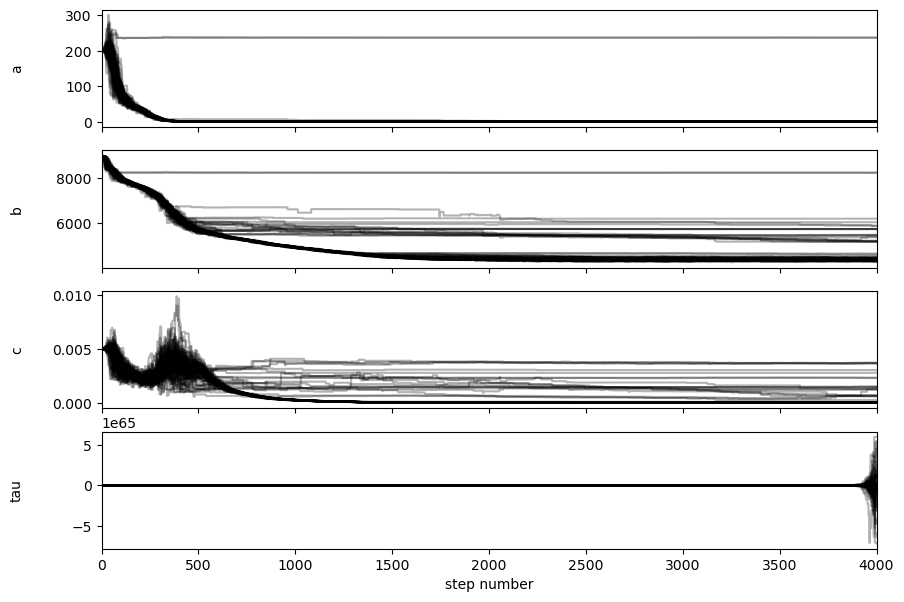

In [15]:
fig, axes = plt.subplots(4, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "tau"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

(20000, 4)


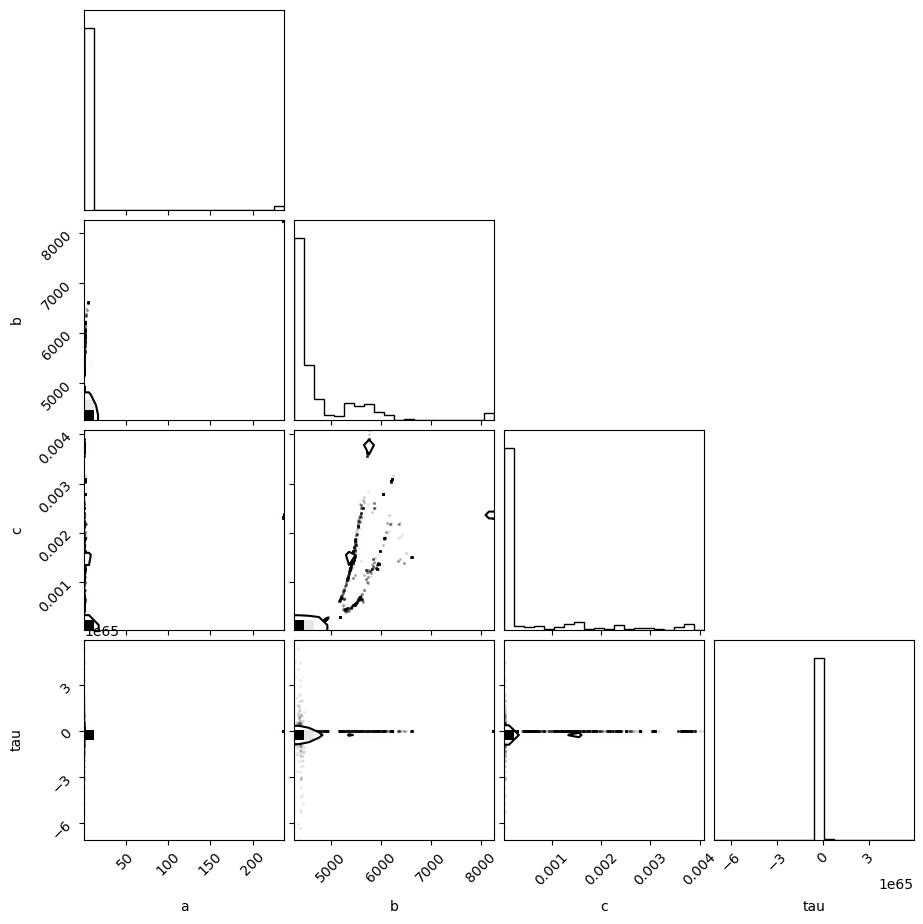

In [16]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

Text(0.5, 0, 'Time [s]')

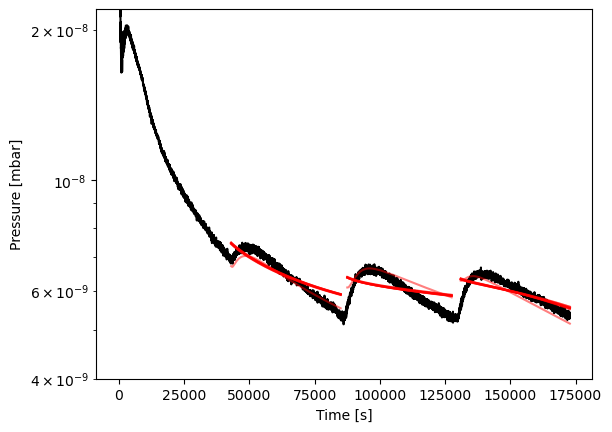

In [17]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, e.fitfunction(tT_final[j], sample[0], sample[1], sample[2], sample[3]), 'r', alpha=0.5)

plt.ylim(4e-9, 2.2e-8)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")



In [18]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])


D0 [cm^2/s]:  [0.08150522 0.08557609 0.08761478]
Activation energy [K]:  [4366.44534164 4442.95511601 5458.89092442]
[0.63120159 0.62914701 0.62717736 ... 1.38238727 0.64994859 0.62044342]
